<div align="center">

**Modelo de Detección y Conteo de Mamíferos Africanos a partir de Imágenes Aéreas**  

*Proyecto de Grado - Maestría en Inteligencia Artificial, Universidad de los Andes*  


**Autor:** Grupo 2  
**Institución:** Proyecto Guacamaya *(CINFONIA)*  
**Año:** 2025  


</div>

**Descripción general**:

Este cuaderno documenta el proceso completo de **entrenamiento y evaluación del modelo HerdNet**, diseñado para la **detección y conteo de mamíferos africanos** en imágenes aéreas, utilizando el *dataset* **ULiège**.


| Especie | Nombre común | Nombre científico / Inglés |
|:--|:--|:--|
| 🐃 | **Búfalo**  | *Buffalo* |
| 🐘 | **Elefante** | *Elephant* |
| 🦌 | **Kob** | *Kob* |
| 🦬 | **Topi (Alcelaphinae)** | *Topi / Hartebeest* |
| 🐗 | **Facóquero** | *Warthog* |
| 🦓 | **Waterbuck** | *Waterbuck* |



**Referencia técnica**:

Los experimentos y scripts se fundamentan en el cuaderno de referencia del repositorio oficial de **HerdNet**, disponible en:  
[https://colab.research.google.com/github/Alexandre-Delplanque/HerdNet/blob/main/notebooks/demo-training-testing-herdnet.ipynb](https://colab.research.google.com/github/Alexandre-Delplanque/HerdNet/blob/main/notebooks/demo-training-testing-herdnet.ipynb)

***Última actualización:*** 09 de Noviembre de 2025

</div>

# **Paso 1 - Entrenar HerdNet con Parches (train y val)**

## Instalación y configuración

### Google Drive (conexión)

In [1]:
import os
import logging
from IPython.display import clear_output
from google.colab import drive

class GoogleDriveConnector:
    """
    GoogleDriveConnector
    --------------------
    Clase para montar Google Drive en un entorno de Google Colab.

    Propósito
    ----------
    Permite establecer una conexión con Google Drive desde Colab de forma
    controlada, con validación de parámetros, registro de eventos (logging)
    y limpieza visual del entorno tras la conexión.

    Parámetros
    ----------
    mount_path : str
        Ruta local donde se montará Google Drive (por defecto '/content/drive').

    verbose : bool, opcional
        Si es True, se habilita el registro mediante logging. Si es False,
        no se muestra ninguna salida ni registro (por defecto True).

    Métodos
    -------
    mount_drive():
        Monta Google Drive y registra el proceso.
    """

    def __init__(self, mount_path: str = "/content/drive", verbose: bool = True):
        """
        Inicializa la clase configurando el logger y validando la ruta de montaje.

        Parámetros
        ----------
        mount_path : str
            Ruta donde se montará Google Drive.

        verbose : bool
            Determina si se habilita el registro de eventos.

        Excepciones
        -----------
        ValueError:
            Si 'mount_path' no es una cadena válida o está vacía.
        """
        # Validar tipo y contenido del parámetro
        if not isinstance(mount_path, str) or not mount_path.strip():
            raise ValueError("El parámetro 'mount_path' debe ser una cadena no vacía.")

        # Asignar atributos de instancia
        self.mount_path = mount_path
        self.verbose = verbose

        # Configurar logger si está habilitado
        self.logger = logging.getLogger("GoogleDriveConnector")
        if self.verbose:
            self.logger.setLevel(logging.INFO)
            if not self.logger.handlers:
                handler = logging.StreamHandler()
                formatter = logging.Formatter(
                    "[%(asctime)s] [%(levelname)s] %(message)s",
                    datefmt="%Y-%m-%d %H:%M:%S",
                )
                handler.setFormatter(formatter)
                self.logger.addHandler(handler)
            self.logger.propagate = False
        else:
            self.logger.disabled = True

    def mount_drive(self) -> None:
        """
        Monta Google Drive en el entorno actual de Google Colab.

        Retorno
        -------
        None

        Excepciones
        -----------
        RuntimeError:
            Si ocurre un error durante el proceso de montaje.
        """
        # Registrar inicio del proceso de conexión
        if self.verbose:
            self.logger.info("Iniciando conexión con Google Drive...")

        # Nueva verificación: evitar conflicto si la ruta ya tiene archivos
        if os.path.exists(self.mount_path) and os.listdir(self.mount_path):
            if self.verbose:
                self.logger.warning(
                    f"La ruta '{self.mount_path}' ya contiene archivos. "
                    "Se asume que Google Drive ya está montado."
                )
            return

        try:
            # Montar Google Drive
            drive.mount(self.mount_path)

            # Limpiar salida visual del entorno
            clear_output(wait=True)

            # Confirmar éxito del proceso
            if self.verbose:
                self.logger.info("Google Drive montado correctamente.")
            else:
                print("Google Drive montado correctamente.")

        except Exception as e:
            # Manejar y registrar errores
            if self.verbose:
                self.logger.error(f"Error al montar Google Drive: {e}", exc_info=True)
            raise RuntimeError(f"No se pudo montar Google Drive: {e}") from e

In [3]:
# Conectar a Google Drive
CONNECTOR = GoogleDriveConnector(
    mount_path="/content/drive",
    verbose=True,
)
CONNECTOR.mount_drive()

[2025-11-09 23:47:34] [INFO] Google Drive montado correctamente.


### Instalación de librerías y repo de animaloc (HerdNet)

In [4]:
import os
import sys
import logging
import subprocess
from pathlib import Path
from IPython.display import clear_output

class ConfiguradorHerdNet:
    """
    Clase para configurar automáticamente el entorno de HerdNet,
    compatible tanto con Google Colab como con entornos locales.

    Propósito

    ----------
    Reproduce la instalación de HerdNet con detección de entorno,
    manejo de errores y registro de eventos mediante logging.

    Parámetros
    ----------
    base_dir : str, opcional
        Ruta donde se clonará el repositorio HerdNet.
        Por defecto: '/content/HerdNet' si se ejecuta en Colab,
        o './HerdNet' si se ejecuta localmente.
    verbose : bool, opcional
        Si es True, muestra información detallada del proceso.
    """

    def __init__(self, base_dir: str = None, verbose: bool = True):
        """Inicializa el configurador y detecta el entorno de ejecución."""
        # Detectar si se ejecuta en Colab
        self.is_colab = "google.colab" in sys.modules

        # Definir ruta base según entorno
        self.base_dir = Path(base_dir or ("/content/HerdNet" if self.is_colab else "./HerdNet"))

        # Configurar logging estándar
        logging.basicConfig(
            level=logging.INFO,
            format="[%(asctime)s] [%(levelname)s] %(message)s",
            datefmt="%Y-%m-%d %H:%M:%S",
            force=True
        )
        self.logger = logging.getLogger("ConfiguradorHerdNet")

        # Control de verbosidad
        self.verbose = verbose

    # ------------------------------------------------------------
    def _run_command(self, command: str):
        """
        Ejecuta un comando del sistema de forma segura.

        Parámetros
        ----------
        command : str
            Comando del sistema a ejecutar.

        Excepciones
        -----------
        subprocess.CalledProcessError
            Si el comando devuelve un error de ejecución.
        """
        try:
            result = subprocess.run(
                command,
                shell=True,
                check=True,
                text=True,
                stdout=subprocess.PIPE,
                stderr=subprocess.PIPE
            )
            if self.verbose and result.stdout.strip():
                self.logger.info(result.stdout.strip())
        except subprocess.CalledProcessError as e:
            self.logger.error(f"Error ejecutando comando: {command}")
            if e.stderr.strip():
                self.logger.error(e.stderr.strip())
            raise

    # ------------------------------------------------------------
    def verificar_gpu(self):
        """Verifica la disponibilidad de una GPU mediante nvidia-smi."""
        self.logger.info("Verificando GPU disponible...")
        try:
            self._run_command("nvidia-smi")
        except Exception:
            self.logger.warning("No se pudo verificar GPU. Puede que no exista o no esté disponible.")

    # ------------------------------------------------------------
    def instalar_dependencias(self):
        """
        Instala las dependencias necesarias según el entorno detectado.

        En Colab se instalan versiones recientes compatibles.
        En local se instalan las versiones exactas del paper HerdNet.
        """
        if self.is_colab:
            self.logger.info("Entorno detectado: Google Colab")
            self.logger.info("Instalando dependencias compatibles con Colab...")
            deps = (
                "albumentations fiftyone hydra-core opencv-python pandas pillow "
                "scikit-image scikit-learn scipy wandb"
            )
        else:
            self.logger.info("Entorno detectado: Local")
            self.logger.info("Instalando dependencias exactas del paper HerdNet...")
            deps = (
                "albumentations==1.0.3 fiftyone==0.14.3 hydra-core==1.1.0 "
                "opencv-python==4.5.1.48 pandas==1.2.3 pillow==8.2.0 "
                "scikit-image==0.18.1 scikit-learn==1.0.2 scipy==1.6.2 wandb==0.10.33"
            )

        cmd = f"{sys.executable} -m pip install {deps} -q"
        try:
            self._run_command(cmd)
        except Exception as e:
            self.logger.warning(f"Fallo parcial en instalación de dependencias: {e}")
            self.logger.warning("Continuando con el proceso...")

    # ------------------------------------------------------------
    def clonar_repo(self):
        """Clona e instala el repositorio HerdNet desde GitHub."""
        self.logger.info("Clonando repositorio HerdNet original...")
        if self.base_dir.exists():
            self.logger.info("El repositorio ya existe. Se omite la clonación.")
        else:
            self._run_command(f"git clone https://github.com/Alexandre-Delplanque/HerdNet {self.base_dir}")

        self._run_command(f"cd {self.base_dir} && {sys.executable} setup.py install -q")
        sys.path.append(str(self.base_dir))

    # ------------------------------------------------------------
    def limpiar_salida(self):
        """Limpia la salida si se ejecuta en Google Colab."""
        if self.is_colab:
            clear_output(wait=True)

    # ------------------------------------------------------------
    def configurar(self):
        """
        Ejecuta el flujo completo de configuración del entorno HerdNet.

        Incluye:
        - Verificación de GPU
        - Instalación de dependencias
        - Clonación del repositorio
        - Instalación local
        - Limpieza de salida (solo en Colab)
        """
        self.logger.info("Iniciando configuración del entorno HerdNet...")
        try:
            self.verificar_gpu()
            self.instalar_dependencias()
            self.clonar_repo()
            self.limpiar_salida()
            self.logger.info("Instalación completada correctamente y entorno listo.")
            print("Instalación completada correctamente y entorno listo.")
        except Exception as e:
            self.logger.error(f"Error durante la configuración: {e}")
            raise

In [5]:
# Instsalación de librerías y clonación de animaloc
configurador = ConfiguradorHerdNet(verbose=True)
configurador.configurar()

[2025-11-09 23:49:45] [INFO] Instalación completada correctamente y entorno listo.


Instalación completada correctamente y entorno listo.


### Fijar semilla

In [6]:
from animaloc.utils.seed import set_seed

class FijadorSemilla:
    """|
    FijadorSemilla
    ---------------
    Establece una semilla aleatoria determinística para los módulos de Python,
    NumPy y PyTorch, garantizando la reproducibilidad de los experimentos.

    Propósito
    ----------
    Proporcionar una interfaz unificada para fijar el valor de la semilla que
    utilizan los generadores aleatorios del entorno.

    Parámetros
    -----------
    seed : int
        Valor entero que se usará como semilla global.

    Ejemplo
    --------
    >>> fijador = FijadorSemilla(seed=9292)
    >>> fijador.aplicar()
    """

    def __init__(self, seed: int = 9292):
        # Guarda el valor de la semilla
        self.seed = seed

    def aplicar(self):
        """
        Aplica la semilla determinística en Python, NumPy y PyTorch.

        Retorno
        --------
        None
            El método no devuelve ningún valor; solo fija la semilla global.
        """
        # Fija la semilla de manera reproducible
        set_seed(self.seed)

        # Imprime confirmación
        print(f"Semilla aleatoria fijada en {self.seed}")

[2025-11-09 23:50:09] [INFO] NumExpr defaulting to 2 threads.


In [7]:
# Fijar semilla global
fijador = FijadorSemilla(seed=9292)
fijador.aplicar()

Semilla aleatoria fijada en 9292


In [ ]:
import os
import json
import logging
import pandas as pd
from tqdm import tqdm

class ConversorCOCOaHerdNet:
    """
    ConversorCOCOaHerdNet
    ---------------------
    Clase para convertir anotaciones en formato COCO JSON al formato CSV
    utilizado por HerdNet.

    Propósito
    ----------
    Facilita la conversión de anotaciones de detección (cajas o puntos)
    al formato CSV compatible con HerdNet, incluyendo coordenadas y etiquetas.

    Parámetros
    ----------
    ruta_json : str
        Ruta al archivo COCO JSON con las anotaciones.
    carpeta_imagenes : str
        Carpeta donde se encuentran las imágenes del dataset.
    ruta_salida : str
        Ruta donde se guardará el CSV resultante.
    verbose : bool, opcional
        Si es True, muestra mensajes detallados del proceso.
    """

    def __init__(self, ruta_json: str, carpeta_imagenes: str, ruta_salida: str, verbose: bool = True):
        """Inicializa el conversor con las rutas y la configuración."""
        self.ruta_json = ruta_json
        self.carpeta_imagenes = carpeta_imagenes
        self.ruta_salida = ruta_salida
        self.verbose = verbose

        # Configurar logger único por instancia
        logger_name = f"ConversorCOCOaHerdNet.{id(self)}"
        self.logger = logging.getLogger(logger_name)
        self.logger.setLevel(logging.INFO if verbose else logging.WARNING)

        # Siempre eliminar handlers anteriores para evitar duplicaciones o silencios
        if self.logger.hasHandlers():
            self.logger.handlers.clear()

        handler = logging.StreamHandler()
        formatter = logging.Formatter(
            "[%(asctime)s] [%(levelname)s] %(message)s",
            datefmt="%Y-%m-%d %H:%M:%S",
        )
        handler.setFormatter(formatter)
        self.logger.addHandler(handler)
        self.logger.propagate = False

        # Validar rutas iniciales
        self._validar_entradas()

    # ------------------------------------------------------------
    def _validar_entradas(self):
        """Verifica que las rutas de entrada sean válidas."""
        if not os.path.exists(self.ruta_json):
            raise FileNotFoundError(f"No se encontró el archivo de anotaciones: {self.ruta_json}")
        if not os.path.exists(self.carpeta_imagenes):
            raise FileNotFoundError(f"No se encontró la carpeta de imágenes: {self.carpeta_imagenes}")

    # ------------------------------------------------------------
    def _cargar_json(self) -> dict:
        """Carga el archivo COCO JSON de anotaciones."""
        self.logger.info("Cargando anotaciones COCO...")
        with open(self.ruta_json, "r", encoding="utf-8") as f:
            data = json.load(f)

        if "images" not in data or "annotations" not in data:
            raise ValueError("El archivo JSON no tiene las claves requeridas: 'images' o 'annotations'.")

        self.logger.info(f"Imágenes detectadas: {len(data['images'])}")
        self.logger.info(f"Anotaciones detectadas: {len(data['annotations'])}")
        return data

    # ------------------------------------------------------------
    def _extraer_registros(self, coco: dict) -> pd.DataFrame:
        """Procesa las anotaciones COCO y genera un DataFrame con el formato HerdNet."""
        categorias = coco.get("categories", [])
        mapa_categorias = {cat["id"]: cat["name"] for cat in categorias}
        self.logger.info(f"Categorías detectadas: {mapa_categorias}")

        id_a_nombre = {img["id"]: img["file_name"] for img in coco["images"]}
        id_a_base = {img["id"]: os.path.splitext(img["file_name"])[0] for img in coco["images"]}

        registros = []

        for anotacion in tqdm(coco["annotations"], desc="Procesando anotaciones"):
            id_imagen = anotacion.get("image_id")
            id_categoria = anotacion.get("category_id")
            bbox = anotacion.get("bbox", None)
            keypoints = anotacion.get("keypoints", None)

            # Calcular punto central de la anotación
            if bbox:
                x, y, w, h = bbox
                cx, cy = x + w / 2, y + h / 2
            elif keypoints and len(keypoints) >= 2:
                cx, cy = keypoints[0], keypoints[1]
            else:
                continue

            nombre_imagen = id_a_nombre.get(id_imagen)
            nombre_base = id_a_base.get(id_imagen)
            if nombre_imagen is None:
                continue

            registros.append({
                "images": nombre_imagen,
                "labels": id_categoria,
                "base_images": nombre_base,
                "x": cx,
                "y": cy,
            })

        df = pd.DataFrame(registros)
        if df.empty:
            raise ValueError("No se generaron registros válidos a partir del archivo COCO.")

        # Validar y limpiar etiquetas no numéricas o nulas
        df["labels"] = pd.to_numeric(df["labels"], errors="coerce")
        filas_invalidas = df[df["labels"].isna()]
        if not filas_invalidas.empty:
            self.logger.warning(f"Se eliminaron {len(filas_invalidas)} anotaciones sin etiqueta válida.")
            df = df.dropna(subset=["labels"])

        # Convertir etiquetas a enteros seguros
        df["labels"] = df["labels"].astype(int)

        # Log de resumen de clases
        etiquetas_unicas = df["labels"].unique().tolist()
        self.logger.info(f"Etiquetas detectadas: {etiquetas_unicas}")

        return df

    # ------------------------------------------------------------
    def convertir(self) -> pd.DataFrame:
        """
        Ejecuta el proceso completo de conversión COCO -> HerdNet CSV.

        Retorna
        -------
        pd.DataFrame
            DataFrame final con las columnas esperadas.
        """
        self.logger.info("Iniciando conversión COCO -> HerdNet...")

        # Cargar anotaciones
        coco = self._cargar_json()

        # Extraer y validar registros
        df = self._extraer_registros(coco)

        # Crear carpeta de salida
        os.makedirs(os.path.dirname(self.ruta_salida), exist_ok=True)

        # Guardar CSV limpio
        df.to_csv(self.ruta_salida, index=False, sep=",", encoding="utf-8")

        self.logger.info(f"Conversión completada. CSV guardado en: {self.ruta_salida}")
        self.logger.info(f"Total de filas finales: {len(df)}")

### Liberar memoria

In [ ]:
import gc
import os
import torch
import psutil

def limpiar_memoria_colab():
    """
    Libera memoria RAM y GPU en entornos como Google Colab.

    Pasos:
        1. Vacía la caché de GPU si está disponible.
        2. Elimina variables grandes del entorno global.
        3. Fuerza la recolección de basura.
        4. Muestra el uso actual de RAM y GPU.

    Retorna:
        None
    """
    print("[INFO] Liberando memoria...")

    # 1. Vaciar caché de GPU si está disponible
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.ipc_collect()
        print("[INFO] Memoria GPU vaciada.")

    # 2. Eliminar variables grandes del entorno global
    global_vars = list(globals().keys())
    for var in global_vars:
        if var not in {"os", "torch", "gc", "psutil", "limpiar_memoria_colab"}:
            globals().pop(var, None)  # Uso seguro de pop para evitar errores
    gc.collect()

    # 3. Verificar uso de RAM
    process = psutil.Process(os.getpid())
    memory_mb = process.memory_info().rss / 1024 ** 2
    print(f"[INFO] Memoria RAM usada actualmente: {memory_mb:.2f} MB")

    # 4. Mostrar estado de GPU (comando del sistema)
    if torch.cuda.is_available():
        os.system("nvidia-smi")

    print("[OK] Limpieza completa")

In [ ]:
# Liberar memoria y chequear GPU
limpiar_memoria_colab()

!nvidia-smi

[INFO] Liberando memoria...
[INFO] Memoria GPU vaciada.
[INFO] Memoria RAM usada actualmente: 864.80 MB
[OK] Limpieza completa
Sun Nov  9 07:24:31 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8             13W /   70W |       2MiB /  15360MiB |      0%      Default |
|            

## Descargar datasets

In [ ]:
import os
import subprocess
from pathlib import Path
from animaloc.utils.useful_funcs import mkdir

class DelplanqueDatasetManager:
    """
    Clase para gestionar la descarga y preparación del conjunto de datos
    de Delplanque et al. (2021) en entornos como Google Colab.

    Esta clase permite:
        1. Descargar el archivo ZIP del dataset.
        2. Extraer su contenido en la carpeta indicada.
        3. Crear los parches de validación usando el script oficial de HerdNet.

    Parámetros
    ----------
    url_id : str
        ID de Google Drive del dataset a descargar.
    output_dir : str
        Ruta base donde se guardará y extraerá el dataset.
    herdnet_path : str
        Ruta a la carpeta del repositorio HerdNet.
    verbose : bool, opcional
        Si es True, imprime mensajes informativos en consola. Por defecto es True.
    """

    def __init__(self, url_id: str, output_dir: str, herdnet_path: str, verbose: bool = True):
        self.url_id = url_id
        self.output_dir = Path(output_dir)
        self.herdnet_path = Path(herdnet_path)
        self.zip_path = self.output_dir / "data.zip"
        self.verbose = verbose

        # Crear carpeta base si no existe
        self.output_dir.mkdir(parents=True, exist_ok=True)

    def _run_command(self, command: str):
        """
        Ejecuta un comando del sistema y muestra salida si verbose=True.
        """
        if self.verbose:
            print(f"[INFO] Ejecutando: {command}")
        subprocess.run(command, shell=True, check=True)

    def download_dataset(self):
        """
        Descarga el dataset desde Google Drive mediante gdown.
        """
        print("[INFO] Descargando dataset de Delplanque et al. (2021)...")
        command = f"gdown {self.url_id} -O {self.zip_path}"
        self._run_command(command)
        print("[OK] Descarga completada.")

    def extract_dataset(self):
        """
        Extrae el archivo ZIP descargado en la carpeta de salida.
        """
        print("[INFO] Extrayendo contenido del ZIP...")
        command = f"unzip -oq {self.zip_path} -d {self.output_dir}"
        self._run_command(command)
        print("[OK] Extracción completada.")

    def create_validation_patches(self, patch_size: int = 512, min_value: float = 0.0, use_all: bool = False):
        """
        Crea los parches de validación utilizando el script patcher.py del repositorio HerdNet.

        Parámetros
        ----------
        patch_size : int
            Tamaño de los parches en píxeles (por defecto 512).
        min_value : float
            Valor mínimo de área o intensidad para mantener el parche (por defecto 0.0).
        use_all : bool
            Si es False, crea solo una muestra; si es True, crea todos los parches posibles.
        """
        print("[INFO] Creando parches de validación...")
        val_dir = self.output_dir / "data" / "val"
        patches_dir = self.output_dir / "data" / "val_patches"
        csv_path = self.output_dir / "data" / "val.csv"

        # Crear carpeta de salida para los parches
        mkdir(str(patches_dir))

        # Ejecutar script oficial de HerdNet
        command = (
            f"python {self.herdnet_path}/tools/patcher.py "
            f"{val_dir} {patch_size} {patch_size} 0 {patches_dir} "
            f"-csv {csv_path} -min {min_value} -all {use_all}"
        )
        self._run_command(command)
        print("[OK] Parches de validación generados correctamente.")

    def prepare_full_dataset(self):
        """
        Ejecuta el flujo completo de descarga, extracción y generación de parches.
        """
        self.download_dataset()
        self.extract_dataset()
        self.create_validation_patches()
        print("[DONE] Dataset preparado correctamente.")

# Descargar datasets y generar parches de validación
manager = DelplanqueDatasetManager(
    url_id="1CcTAZZJdwrBfCPJtVH6VBU3luGKIN9st",
    output_dir="/content",
    herdnet_path="/content/HerdNet",
    verbose=True,
)
manager.prepare_full_dataset()

[INFO] Descargando dataset de Delplanque et al. (2021)...
[INFO] Ejecutando: gdown 1CcTAZZJdwrBfCPJtVH6VBU3luGKIN9st -O /content/data.zip
[OK] Descarga completada.
[INFO] Extrayendo contenido del ZIP...
[INFO] Ejecutando: unzip -oq /content/data.zip -d /content
[OK] Extracción completada.
[INFO] Creando parches de validación...
[INFO] Ejecutando: python /content/HerdNet/tools/patcher.py /content/data/val 512 512 0 /content/data/val_patches -csv /content/data/val.csv -min 0.0 -all False
[OK] Parches de validación generados correctamente.
[DONE] Dataset preparado correctamente.


## Crear datasets y dataloaders

In [ ]:
import albumentations as A
from animaloc.datasets import FolderDataset, CSVDataset
from animaloc.data.transforms import MultiTransformsWrapper, DownSample, PointsToMask, FIDT
from torch.utils.data import DataLoader

class HerdNetDatasetsBuilder:
    """
    Builder para los datasets de HerdNet (entrenamiento, validación y prueba).
    Permite alternar entre FolderDataset y CSVDataset en entrenamiento,
    y elegir el tipo de normalización (ImageNet o simple).
    """

    def __init__(
        self,
        train_csv: str,
        train_root: str,
        val_csv: str,
        val_root: str,
        test_csv: str,
        test_root: str,
        patch_size: int = 512,
        num_classes: int = 7,
        down_ratio: int = 2,
        use_folder_dataset: bool = False,
        normalize_mode: str = "imagenet"  # "imagenet" o "simple"
    ):
        self.train_csv = train_csv
        self.train_root = train_root
        self.val_csv = val_csv
        self.val_root = val_root
        self.test_csv = test_csv
        self.test_root = test_root
        self.patch_size = patch_size
        self.num_classes = num_classes
        self.down_ratio = down_ratio
        self.use_folder_dataset = use_folder_dataset
        self.normalize_mode = normalize_mode.lower()

    def _get_normalize_transform(self):
        """
        Retorna la transformación de normalización según el modo elegido.
        """
        if self.normalize_mode == "imagenet":
            return A.Normalize(
                mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225),
                p=1.0,
            )
        elif self.normalize_mode == "simple":
            return A.Normalize(p=1.0)
        else:
            raise ValueError("normalize_mode debe ser 'imagenet' o 'simple'.")

    def build(self):
        """
        Construye los datasets y retorna una tupla (train, val, test).
        """
        normalize_transform = self._get_normalize_transform()
        DatasetClass = FolderDataset if self.use_folder_dataset else CSVDataset

        # Dataset de entrenamiento
        train_dataset = DatasetClass(
            csv_file=self.train_csv,
            root_dir=self.train_root,
            albu_transforms=[
                A.VerticalFlip(p=0.5),
                A.HorizontalFlip(p=0.5),
                A.RandomRotate90(p=0.5),
                A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
                A.Blur(blur_limit=15, p=0.2),
                normalize_transform,
            ],
            end_transforms=[
                MultiTransformsWrapper([
                    FIDT(num_classes=self.num_classes, add_bg=False, down_ratio=self.down_ratio),
                    PointsToMask(
                        radius=2,
                        num_classes=self.num_classes,
                        squeeze=True,
                        down_ratio=int(self.patch_size // 16),
                    ),
                ])
            ],
        )

        # Dataset de validación
        val_dataset = CSVDataset(
            csv_file=self.val_csv,
            root_dir=self.val_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )

        # Dataset de prueba
        test_dataset = CSVDataset(
            csv_file=self.test_csv,
            root_dir=self.test_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )
        return train_dataset, val_dataset, test_dataset

In [ ]:
# Crear instancia de la clase
builder = HerdNetDatasetsBuilder(
    train_csv="/content/data/train_patches.csv", # contiene parches
    train_root="/content/data/train_patches",  # contiene parches
    val_csv="/content/data/val_patches/gt.csv", # contiene parches
    val_root="/content/data/val_patches", # contiene parches
    test_csv="/content/data/test.csv", # inalterado
    test_root="/content/data/test", # inalterado
    use_folder_dataset=False,       # False = Fase 1 sin HNPs
    normalize_mode="imagenet"      # normalización de "imagenet" o "simple"
)

# Construir los datasets
train_dataset, val_dataset, test_dataset = builder.build()

In [ ]:
# Dataloaders
from torch.utils.data import DataLoader

# Create dataloaders
train_dataloader = DataLoader(dataset = train_dataset, batch_size = 16, shuffle = True)
val_dataloader = DataLoader(dataset = val_dataset, batch_size = 1, shuffle = False)
test_dataloader = DataLoader(dataset = test_dataset, batch_size = 1, shuffle = False)

print(f"[INFO] Train: {len(train_dataset)} | Val: {len(val_dataset)} | Test: {len(test_dataset)}")

[INFO] Train: 7765 | Val: 532 | Test: 258


## Definir arquitectura

In [ ]:
# Crear la carpeta de checkpoints (si no existe)
!mkdir -p /root/.cache/torch/hub/checkpoints/

# Copiar el archivo desde el Google Drive al directorio de PyTorch
!cp "/content/drive/MyDrive/HerdNet/original/dla34-ba72cf86.pth" "/root/.cache/torch/hub/checkpoints/dla34-ba72cf86.pth"

# Verificar que esté en su lugar
!ls -lh /root/.cache/torch/hub/checkpoints/

# URL (DLA): http://dl.yf.io/dla/models/imagenet/dla34-ba72cf86.pth

total 61M
-rw------- 1 root root 61M Nov  7 00:48 dla34-ba72cf86.pth


In [ ]:
from animaloc.models import HerdNet
from torch import Tensor
from animaloc.models import LossWrapper
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss

num_classes = 7
down_ratio = 2

herdnet = HerdNet(pretrained=True, num_classes=num_classes, down_ratio=down_ratio).cuda()

weight = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).cuda()

losses = [
    {'loss': FocalLoss(reduction='mean'), 'idx': 0, 'idy': 0, 'lambda': 1.0, 'name': 'focal_loss'},
    {'loss': CrossEntropyLoss(reduction='mean', weight=weight), 'idx': 1, 'idy': 1, 'lambda': 1.0, 'name': 'ce_loss'}
    ]

herdnet = LossWrapper(herdnet, losses=losses)

## Crear el Trainer

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir

# Crear carpeta de trabajo donde se guardarán los modelos entrenados
work_dir = "/content/drive/MyDrive/HerdNet/fase_1/models"
mkdir(work_dir)

# Definir hiperparámetros principales del entrenamiento
lr = 1e-4                 # Tasa de aprendizaje del optimizador
weight_decay = 1e-3       # Factor de regularización L2 para evitar sobreajuste
epochs = 100              # Número total de épocas de entrenamiento
patch_size = 512          # Tamaño de los parches de entrada
down_ratio = 2            # Factor de reducción espacial de la red
num_classes = 7           # Número total de clases a predecir

# Definir el optimizador Adam con los parámetros del modelo HerdNet
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Definir las métricas de evaluación basadas en puntos (detección y conteo)
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que une los parches de salida del modelo
# para reconstruir los mapas completos de densidad o detección
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,            # Superposición entre parches consecutivos
    down_ratio=down_ratio,  # Coincide con la reducción interna del modelo
    reduction="mean"        # Método de agregación entre parches superpuestos
)

# Crear el evaluador que calculará las métricas de desempeño en validación
evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,  # Conjunto de datos de validación
    metrics=metrics,            # Métricas definidas anteriormente
    stitcher=stitcher,          # Stitcher encargado de unir las predicciones
    work_dir=work_dir,          # Carpeta donde se guardan resultados
    header="validation"         # Prefijo usado para nombrar archivos de salida
)

# Crear el entrenador principal que gestiona el bucle de entrenamiento
trainer = Trainer(
    model=herdnet,              # Modelo HerdNet envuelto con pérdidas
    train_dataloader=train_dataloader,  # Datos de entrenamiento
    optimizer=optimizer,        # Optimizador Adam definido
    num_epochs=epochs,          # Número total de épocas
    evaluator=evaluator,        # Evaluador para medir desempeño durante el entrenamiento
    work_dir=work_dir           # Carpeta donde se almacenan modelos y logs
)


## Entrenamiento

In [ ]:
trainer.start(warmup_iters=100, checkpoints='best', select='max', validate_on='f1_score')

[2025-10-31 15:43:28] [INFO] [TRAINING] - Epoch: [1] [   1/1942] eta: 1:12:34 lr: 0.000002 loss: 9297.5029 (9297.5029) focal_loss: 9295.4902 (9295.4902) ce_loss: 2.0128 (2.0128) time: 2.2425 data: 0.2466 max mem: 2222


[TRAINING] - Epoch: [1] [   1/1942] eta: 1:12:34 lr: 0.000002 loss: 9297.5029 (9297.5029) focal_loss: 9295.4902 (9295.4902) ce_loss: 2.0128 (2.0128) time: 2.2425 data: 0.2466 max mem: 2222


[2025-10-31 15:43:48] [INFO] [TRAINING] - Epoch: [1] [  51/1942] eta: 0:13:51 lr: 0.000051 loss: 6196.8701 (7703.9578) focal_loss: 6195.0366 (7702.2197) ce_loss: 1.5672 (1.7380) time: 0.3865 data: 0.1312 max mem: 2368


[TRAINING] - Epoch: [1] [  51/1942] eta: 0:13:51 lr: 0.000051 loss: 6196.8701 (7703.9578) focal_loss: 6195.0366 (7702.2197) ce_loss: 1.5672 (1.7380) time: 0.3865 data: 0.1312 max mem: 2368


[2025-10-31 15:44:07] [INFO] [TRAINING] - Epoch: [1] [ 101/1942] eta: 0:12:40 lr: 0.000100 loss: 1485.5168 (5232.6124) focal_loss: 1484.3617 (5231.0242) ce_loss: 1.2996 (1.5882) time: 0.3935 data: 0.1352 max mem: 2368


[TRAINING] - Epoch: [1] [ 101/1942] eta: 0:12:40 lr: 0.000100 loss: 1485.5168 (5232.6124) focal_loss: 1484.3617 (5231.0242) ce_loss: 1.2996 (1.5882) time: 0.3935 data: 0.1352 max mem: 2368


[2025-10-31 15:44:26] [INFO] [TRAINING] - Epoch: [1] [ 151/1942] eta: 0:12:02 lr: 0.000100 loss: 303.4320 (3665.7313) focal_loss: 300.9952 (3664.2019) ce_loss: 1.2842 (1.5294) time: 0.3759 data: 0.1176 max mem: 2368


[TRAINING] - Epoch: [1] [ 151/1942] eta: 0:12:02 lr: 0.000100 loss: 303.4320 (3665.7313) focal_loss: 300.9952 (3664.2019) ce_loss: 1.2842 (1.5294) time: 0.3759 data: 0.1176 max mem: 2368


[2025-10-31 15:44:46] [INFO] [TRAINING] - Epoch: [1] [ 201/1942] eta: 0:11:39 lr: 0.000100 loss: 126.4972 (2795.4268) focal_loss: 125.4601 (2793.9427) ce_loss: 1.1777 (1.4841) time: 0.4040 data: 0.1409 max mem: 2368


[TRAINING] - Epoch: [1] [ 201/1942] eta: 0:11:39 lr: 0.000100 loss: 126.4972 (2795.4268) focal_loss: 125.4601 (2793.9427) ce_loss: 1.1777 (1.4841) time: 0.4040 data: 0.1409 max mem: 2368


[2025-10-31 15:45:07] [INFO] [TRAINING] - Epoch: [1] [ 251/1942] eta: 0:11:22 lr: 0.000100 loss: 73.0354 (2255.5254) focal_loss: 71.3286 (2254.0940) ce_loss: 1.0845 (1.4313) time: 0.4351 data: 0.1612 max mem: 2368


[TRAINING] - Epoch: [1] [ 251/1942] eta: 0:11:22 lr: 0.000100 loss: 73.0354 (2255.5254) focal_loss: 71.3286 (2254.0940) ce_loss: 1.0845 (1.4313) time: 0.4351 data: 0.1612 max mem: 2368


[2025-10-31 15:45:27] [INFO] [TRAINING] - Epoch: [1] [ 301/1942] eta: 0:11:04 lr: 0.000100 loss: 46.8583 (1889.5601) focal_loss: 44.0936 (1888.1472) ce_loss: 1.1145 (1.4129) time: 0.4011 data: 0.1326 max mem: 2368


[TRAINING] - Epoch: [1] [ 301/1942] eta: 0:11:04 lr: 0.000100 loss: 46.8583 (1889.5601) focal_loss: 44.0936 (1888.1472) ce_loss: 1.1145 (1.4129) time: 0.4011 data: 0.1326 max mem: 2368


[2025-10-31 15:45:47] [INFO] [TRAINING] - Epoch: [1] [ 351/1942] eta: 0:10:42 lr: 0.000100 loss: 30.8161 (1625.5315) focal_loss: 29.8756 (1624.1340) ce_loss: 1.0938 (1.3974) time: 0.3884 data: 0.1187 max mem: 2368


[TRAINING] - Epoch: [1] [ 351/1942] eta: 0:10:42 lr: 0.000100 loss: 30.8161 (1625.5315) focal_loss: 29.8756 (1624.1340) ce_loss: 1.0938 (1.3974) time: 0.3884 data: 0.1187 max mem: 2368


[2025-10-31 15:46:07] [INFO] [TRAINING] - Epoch: [1] [ 401/1942] eta: 0:10:21 lr: 0.000100 loss: 24.7955 (1426.2713) focal_loss: 23.6589 (1424.8776) ce_loss: 1.2714 (1.3936) time: 0.4073 data: 0.1342 max mem: 2368


[TRAINING] - Epoch: [1] [ 401/1942] eta: 0:10:21 lr: 0.000100 loss: 24.7955 (1426.2713) focal_loss: 23.6589 (1424.8776) ce_loss: 1.2714 (1.3936) time: 0.4073 data: 0.1342 max mem: 2368


[2025-10-31 15:46:27] [INFO] [TRAINING] - Epoch: [1] [ 451/1942] eta: 0:10:00 lr: 0.000100 loss: 20.1231 (1270.5508) focal_loss: 18.9387 (1269.1696) ce_loss: 1.0373 (1.3812) time: 0.3931 data: 0.1172 max mem: 2368


[TRAINING] - Epoch: [1] [ 451/1942] eta: 0:10:00 lr: 0.000100 loss: 20.1231 (1270.5508) focal_loss: 18.9387 (1269.1696) ce_loss: 1.0373 (1.3812) time: 0.3931 data: 0.1172 max mem: 2368


[2025-10-31 15:46:47] [INFO] [TRAINING] - Epoch: [1] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 15.8377 (1145.4707) focal_loss: 14.9287 (1144.1076) ce_loss: 1.0095 (1.3631) time: 0.4051 data: 0.1272 max mem: 2368


[TRAINING] - Epoch: [1] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 15.8377 (1145.4707) focal_loss: 14.9287 (1144.1076) ce_loss: 1.0095 (1.3631) time: 0.4051 data: 0.1272 max mem: 2368


[2025-10-31 15:47:07] [INFO] [TRAINING] - Epoch: [1] [ 551/1942] eta: 0:09:20 lr: 0.000100 loss: 13.4045 (1042.8217) focal_loss: 11.9638 (1041.4705) ce_loss: 1.1041 (1.3511) time: 0.3886 data: 0.1135 max mem: 2368


[TRAINING] - Epoch: [1] [ 551/1942] eta: 0:09:20 lr: 0.000100 loss: 13.4045 (1042.8217) focal_loss: 11.9638 (1041.4705) ce_loss: 1.1041 (1.3511) time: 0.3886 data: 0.1135 max mem: 2368


[2025-10-31 15:47:28] [INFO] [TRAINING] - Epoch: [1] [ 601/1942] eta: 0:09:00 lr: 0.000100 loss: 11.6951 (957.1030) focal_loss: 10.6637 (955.7661) ce_loss: 0.9805 (1.3369) time: 0.4078 data: 0.1323 max mem: 2368


[TRAINING] - Epoch: [1] [ 601/1942] eta: 0:09:00 lr: 0.000100 loss: 11.6951 (957.1030) focal_loss: 10.6637 (955.7661) ce_loss: 0.9805 (1.3369) time: 0.4078 data: 0.1323 max mem: 2368


[2025-10-31 15:47:48] [INFO] [TRAINING] - Epoch: [1] [ 651/1942] eta: 0:08:40 lr: 0.000100 loss: 10.2438 (884.4418) focal_loss: 8.8487 (883.1132) ce_loss: 1.1079 (1.3287) time: 0.3919 data: 0.1169 max mem: 2368


[TRAINING] - Epoch: [1] [ 651/1942] eta: 0:08:40 lr: 0.000100 loss: 10.2438 (884.4418) focal_loss: 8.8487 (883.1132) ce_loss: 1.1079 (1.3287) time: 0.3919 data: 0.1169 max mem: 2368


[2025-10-31 15:48:08] [INFO] [TRAINING] - Epoch: [1] [ 701/1942] eta: 0:08:20 lr: 0.000100 loss: 8.9399 (822.0342) focal_loss: 7.5030 (820.7161) ce_loss: 1.0026 (1.3181) time: 0.4134 data: 0.1352 max mem: 2368


[TRAINING] - Epoch: [1] [ 701/1942] eta: 0:08:20 lr: 0.000100 loss: 8.9399 (822.0342) focal_loss: 7.5030 (820.7161) ce_loss: 1.0026 (1.3181) time: 0.4134 data: 0.1352 max mem: 2368


[2025-10-31 15:48:28] [INFO] [TRAINING] - Epoch: [1] [ 751/1942] eta: 0:08:00 lr: 0.000100 loss: 7.9010 (767.8702) focal_loss: 6.8730 (766.5644) ce_loss: 0.9989 (1.3058) time: 0.3967 data: 0.1204 max mem: 2368


[TRAINING] - Epoch: [1] [ 751/1942] eta: 0:08:00 lr: 0.000100 loss: 7.9010 (767.8702) focal_loss: 6.8730 (766.5644) ce_loss: 0.9989 (1.3058) time: 0.3967 data: 0.1204 max mem: 2368


[2025-10-31 15:48:48] [INFO] [TRAINING] - Epoch: [1] [ 801/1942] eta: 0:07:40 lr: 0.000100 loss: 7.1847 (720.4023) focal_loss: 6.0648 (719.1148) ce_loss: 1.0559 (1.2876) time: 0.4063 data: 0.1298 max mem: 2368


[TRAINING] - Epoch: [1] [ 801/1942] eta: 0:07:40 lr: 0.000100 loss: 7.1847 (720.4023) focal_loss: 6.0648 (719.1148) ce_loss: 1.0559 (1.2876) time: 0.4063 data: 0.1298 max mem: 2368


[2025-10-31 15:49:08] [INFO] [TRAINING] - Epoch: [1] [ 851/1942] eta: 0:07:19 lr: 0.000100 loss: 6.3815 (678.4734) focal_loss: 5.3909 (677.2047) ce_loss: 0.8707 (1.2687) time: 0.3881 data: 0.1125 max mem: 2368


[TRAINING] - Epoch: [1] [ 851/1942] eta: 0:07:19 lr: 0.000100 loss: 6.3815 (678.4734) focal_loss: 5.3909 (677.2047) ce_loss: 0.8707 (1.2687) time: 0.3881 data: 0.1125 max mem: 2368


[2025-10-31 15:49:28] [INFO] [TRAINING] - Epoch: [1] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 5.8782 (641.1702) focal_loss: 4.8820 (639.9128) ce_loss: 0.7923 (1.2574) time: 0.4092 data: 0.1303 max mem: 2368


[TRAINING] - Epoch: [1] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 5.8782 (641.1702) focal_loss: 4.8820 (639.9128) ce_loss: 0.7923 (1.2574) time: 0.4092 data: 0.1303 max mem: 2368


[2025-10-31 15:49:48] [INFO] [TRAINING] - Epoch: [1] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 6.1057 (607.7635) focal_loss: 4.8266 (606.5212) ce_loss: 0.8245 (1.2423) time: 0.3903 data: 0.1137 max mem: 2368


[TRAINING] - Epoch: [1] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 6.1057 (607.7635) focal_loss: 4.8266 (606.5212) ce_loss: 0.8245 (1.2423) time: 0.3903 data: 0.1137 max mem: 2368


[2025-10-31 15:50:10] [INFO] [TRAINING] - Epoch: [1] [1001/1942] eta: 0:06:20 lr: 0.000100 loss: 4.9275 (577.6815) focal_loss: 4.1199 (576.4498) ce_loss: 0.8006 (1.2318) time: 0.4235 data: 0.1427 max mem: 2368


[TRAINING] - Epoch: [1] [1001/1942] eta: 0:06:20 lr: 0.000100 loss: 4.9275 (577.6815) focal_loss: 4.1199 (576.4498) ce_loss: 0.8006 (1.2318) time: 0.4235 data: 0.1427 max mem: 2368


[2025-10-31 15:50:30] [INFO] [TRAINING] - Epoch: [1] [1051/1942] eta: 0:06:00 lr: 0.000100 loss: 4.6540 (550.4390) focal_loss: 3.7910 (549.2202) ce_loss: 0.6968 (1.2188) time: 0.3971 data: 0.1211 max mem: 2368


[TRAINING] - Epoch: [1] [1051/1942] eta: 0:06:00 lr: 0.000100 loss: 4.6540 (550.4390) focal_loss: 3.7910 (549.2202) ce_loss: 0.6968 (1.2188) time: 0.3971 data: 0.1211 max mem: 2368


[2025-10-31 15:50:50] [INFO] [TRAINING] - Epoch: [1] [1101/1942] eta: 0:05:40 lr: 0.000100 loss: 4.3672 (525.6513) focal_loss: 3.5223 (524.4491) ce_loss: 0.8536 (1.2022) time: 0.4213 data: 0.1382 max mem: 2368


[TRAINING] - Epoch: [1] [1101/1942] eta: 0:05:40 lr: 0.000100 loss: 4.3672 (525.6513) focal_loss: 3.5223 (524.4491) ce_loss: 0.8536 (1.2022) time: 0.4213 data: 0.1382 max mem: 2368


[2025-10-31 15:51:12] [INFO] [TRAINING] - Epoch: [1] [1151/1942] eta: 0:05:21 lr: 0.000100 loss: 4.1830 (503.0103) focal_loss: 3.3419 (501.8208) ce_loss: 0.7254 (1.1895) time: 0.4916 data: 0.1997 max mem: 2368


[TRAINING] - Epoch: [1] [1151/1942] eta: 0:05:21 lr: 0.000100 loss: 4.1830 (503.0103) focal_loss: 3.3419 (501.8208) ce_loss: 0.7254 (1.1895) time: 0.4916 data: 0.1997 max mem: 2368


[2025-10-31 15:51:33] [INFO] [TRAINING] - Epoch: [1] [1201/1942] eta: 0:05:00 lr: 0.000100 loss: 4.0915 (482.2513) focal_loss: 3.2720 (481.0712) ce_loss: 0.9029 (1.1801) time: 0.3951 data: 0.1193 max mem: 2368


[TRAINING] - Epoch: [1] [1201/1942] eta: 0:05:00 lr: 0.000100 loss: 4.0915 (482.2513) focal_loss: 3.2720 (481.0712) ce_loss: 0.9029 (1.1801) time: 0.3951 data: 0.1193 max mem: 2368


[2025-10-31 15:51:53] [INFO] [TRAINING] - Epoch: [1] [1251/1942] eta: 0:04:40 lr: 0.000100 loss: 3.7229 (463.1413) focal_loss: 2.9722 (461.9698) ce_loss: 0.7559 (1.1714) time: 0.4064 data: 0.1272 max mem: 2368


[TRAINING] - Epoch: [1] [1251/1942] eta: 0:04:40 lr: 0.000100 loss: 3.7229 (463.1413) focal_loss: 2.9722 (461.9698) ce_loss: 0.7559 (1.1714) time: 0.4064 data: 0.1272 max mem: 2368


[2025-10-31 15:52:13] [INFO] [TRAINING] - Epoch: [1] [1301/1942] eta: 0:04:20 lr: 0.000100 loss: 3.8261 (445.4946) focal_loss: 2.8983 (444.3316) ce_loss: 0.8494 (1.1630) time: 0.3894 data: 0.1137 max mem: 2368


[TRAINING] - Epoch: [1] [1301/1942] eta: 0:04:20 lr: 0.000100 loss: 3.8261 (445.4946) focal_loss: 2.8983 (444.3316) ce_loss: 0.8494 (1.1630) time: 0.3894 data: 0.1137 max mem: 2368


[2025-10-31 15:52:33] [INFO] [TRAINING] - Epoch: [1] [1351/1942] eta: 0:03:59 lr: 0.000100 loss: 3.8858 (429.1472) focal_loss: 2.6779 (427.9920) ce_loss: 1.1133 (1.1552) time: 0.4078 data: 0.1309 max mem: 2368


[TRAINING] - Epoch: [1] [1351/1942] eta: 0:03:59 lr: 0.000100 loss: 3.8858 (429.1472) focal_loss: 2.6779 (427.9920) ce_loss: 1.1133 (1.1552) time: 0.4078 data: 0.1309 max mem: 2368


[2025-10-31 15:52:52] [INFO] [TRAINING] - Epoch: [1] [1401/1942] eta: 0:03:39 lr: 0.000100 loss: 3.6001 (413.9628) focal_loss: 2.5806 (412.8157) ce_loss: 0.7664 (1.1471) time: 0.3979 data: 0.1213 max mem: 2368


[TRAINING] - Epoch: [1] [1401/1942] eta: 0:03:39 lr: 0.000100 loss: 3.6001 (413.9628) focal_loss: 2.5806 (412.8157) ce_loss: 0.7664 (1.1471) time: 0.3979 data: 0.1213 max mem: 2368


[2025-10-31 15:53:12] [INFO] [TRAINING] - Epoch: [1] [1451/1942] eta: 0:03:18 lr: 0.000100 loss: 3.1096 (399.8119) focal_loss: 2.4166 (398.6772) ce_loss: 0.7833 (1.1347) time: 0.4042 data: 0.1272 max mem: 2368


[TRAINING] - Epoch: [1] [1451/1942] eta: 0:03:18 lr: 0.000100 loss: 3.1096 (399.8119) focal_loss: 2.4166 (398.6772) ce_loss: 0.7833 (1.1347) time: 0.4042 data: 0.1272 max mem: 2368


[2025-10-31 15:53:32] [INFO] [TRAINING] - Epoch: [1] [1501/1942] eta: 0:02:58 lr: 0.000100 loss: 2.8599 (386.6019) focal_loss: 2.2634 (385.4781) ce_loss: 0.7089 (1.1238) time: 0.3947 data: 0.1182 max mem: 2368


[TRAINING] - Epoch: [1] [1501/1942] eta: 0:02:58 lr: 0.000100 loss: 2.8599 (386.6019) focal_loss: 2.2634 (385.4781) ce_loss: 0.7089 (1.1238) time: 0.3947 data: 0.1182 max mem: 2368


[2025-10-31 15:53:52] [INFO] [TRAINING] - Epoch: [1] [1551/1942] eta: 0:02:38 lr: 0.000100 loss: 3.0512 (374.2418) focal_loss: 2.2917 (373.1266) ce_loss: 0.8009 (1.1153) time: 0.4039 data: 0.1273 max mem: 2368


[TRAINING] - Epoch: [1] [1551/1942] eta: 0:02:38 lr: 0.000100 loss: 3.0512 (374.2418) focal_loss: 2.2917 (373.1266) ce_loss: 0.8009 (1.1153) time: 0.4039 data: 0.1273 max mem: 2368


[2025-10-31 15:54:12] [INFO] [TRAINING] - Epoch: [1] [1601/1942] eta: 0:02:18 lr: 0.000100 loss: 2.6574 (362.6497) focal_loss: 1.9911 (361.5440) ce_loss: 0.6558 (1.1057) time: 0.3945 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [1] [1601/1942] eta: 0:02:18 lr: 0.000100 loss: 2.6574 (362.6497) focal_loss: 1.9911 (361.5440) ce_loss: 0.6558 (1.1057) time: 0.3945 data: 0.1185 max mem: 2369


[2025-10-31 15:54:32] [INFO] [TRAINING] - Epoch: [1] [1651/1942] eta: 0:01:57 lr: 0.000100 loss: 2.9719 (351.7580) focal_loss: 2.1361 (350.6603) ce_loss: 0.7973 (1.0977) time: 0.4010 data: 0.1248 max mem: 2369


[TRAINING] - Epoch: [1] [1651/1942] eta: 0:01:57 lr: 0.000100 loss: 2.9719 (351.7580) focal_loss: 2.1361 (350.6603) ce_loss: 0.7973 (1.0977) time: 0.4010 data: 0.1248 max mem: 2369


[2025-10-31 15:54:52] [INFO] [TRAINING] - Epoch: [1] [1701/1942] eta: 0:01:37 lr: 0.000100 loss: 2.8914 (341.5094) focal_loss: 1.9434 (340.4178) ce_loss: 0.7965 (1.0916) time: 0.3978 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [1] [1701/1942] eta: 0:01:37 lr: 0.000100 loss: 2.8914 (341.5094) focal_loss: 1.9434 (340.4178) ce_loss: 0.7965 (1.0916) time: 0.3978 data: 0.1214 max mem: 2369


[2025-10-31 15:55:12] [INFO] [TRAINING] - Epoch: [1] [1751/1942] eta: 0:01:17 lr: 0.000100 loss: 2.5016 (331.8363) focal_loss: 1.9269 (330.7543) ce_loss: 0.6951 (1.0820) time: 0.4033 data: 0.1271 max mem: 2369


[TRAINING] - Epoch: [1] [1751/1942] eta: 0:01:17 lr: 0.000100 loss: 2.5016 (331.8363) focal_loss: 1.9269 (330.7543) ce_loss: 0.6951 (1.0820) time: 0.4033 data: 0.1271 max mem: 2369


[2025-10-31 15:55:31] [INFO] [TRAINING] - Epoch: [1] [1801/1942] eta: 0:00:57 lr: 0.000100 loss: 2.8216 (322.7049) focal_loss: 1.8466 (321.6307) ce_loss: 0.7845 (1.0743) time: 0.4012 data: 0.1248 max mem: 2369


[TRAINING] - Epoch: [1] [1801/1942] eta: 0:00:57 lr: 0.000100 loss: 2.8216 (322.7049) focal_loss: 1.8466 (321.6307) ce_loss: 0.7845 (1.0743) time: 0.4012 data: 0.1248 max mem: 2369


[2025-10-31 15:55:51] [INFO] [TRAINING] - Epoch: [1] [1851/1942] eta: 0:00:37 lr: 0.000100 loss: 3.0229 (314.0636) focal_loss: 1.9348 (312.9962) ce_loss: 0.9078 (1.0674) time: 0.4027 data: 0.1251 max mem: 2369


[TRAINING] - Epoch: [1] [1851/1942] eta: 0:00:37 lr: 0.000100 loss: 3.0229 (314.0636) focal_loss: 1.9348 (312.9962) ce_loss: 0.9078 (1.0674) time: 0.4027 data: 0.1251 max mem: 2369


[2025-10-31 15:56:11] [INFO] [TRAINING] - Epoch: [1] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 2.6586 (305.8718) focal_loss: 1.7692 (304.8116) ce_loss: 0.7602 (1.0601) time: 0.3998 data: 0.1234 max mem: 2369


[TRAINING] - Epoch: [1] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 2.6586 (305.8718) focal_loss: 1.7692 (304.8116) ce_loss: 0.7602 (1.0601) time: 0.3998 data: 0.1234 max mem: 2369


[2025-10-31 15:56:27] [INFO] [TRAINING] - Epoch: [1] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 2.7060 (299.4726) focal_loss: 1.8078 (298.4169) ce_loss: 0.6906 (1.0557) time: 0.3822 data: 0.1095 max mem: 2369
[2025-10-31 15:56:27] [INFO] [TRAINING] - Epoch: [1] Total time: 0:13:01 (0.4026 s / it)


[TRAINING] - Epoch: [1] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 2.7060 (299.4726) focal_loss: 1.8078 (298.4169) ce_loss: 0.6906 (1.0557) time: 0.3822 data: 0.1095 max mem: 2369
[TRAINING] - Epoch: [1] Total time: 0:13:01 (0.4026 s / it)
[TRAINING] - Epoch: [1] mean loss: 299.4727


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 15:56:28] [INFO] [VALIDATION] - Epoch: [1] [  1/532] eta: 0:02:55 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.0 MAE: 408.0 MSE: 166464.0 RMSE: 408.0 time: 0.3302 data: 0.0155 max mem: 2369


[VALIDATION] - Epoch: [1] [  1/532] eta: 0:02:55 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.0 MAE: 408.0 MSE: 166464.0 RMSE: 408.0 time: 0.3302 data: 0.0155 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 11/532] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 296.0 MSE: 87616.0 RMSE: 296.0 time: 0.1327 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 21/532] eta: 0:01:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 189.0 MSE: 35721.0 RMSE: 189.0 time: 0.1198 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 31/532] eta: 0:01:04 n: 6 recall: 0.83 precision: 0.02 f1-score: 0.04 MAE: 243.0 MSE: 59049.0 RMSE: 243.0 time: 0.1273 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 41/532] eta: 0:01:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 207.0 MSE: 42849.0 RMSE: 207.0 time: 0.1308 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 51/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.02 f1-score: 0.04 MAE: 178.0 MSE: 31684.0 RMSE: 178.0 time: 0.1219 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 61/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.02 f1-score: 0.03 MAE: 249.0 MSE: 62001.0 RMSE: 249.0 time: 0.1108 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 71/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 146.0 MSE: 21316.0 RMSE: 146.0 time: 0.1114 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 287.0 MSE: 82369.0 RMSE: 287.0 time: 0.1121 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [ 91/532] eta: 0:00:52 n: 3 recall: 0.67 precision: 0.01 f1-score: 0.03 MAE: 133.0 MSE: 17689.0 RMSE: 133.0 time: 0.1108 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 259.0 MSE: 67081.0 RMSE: 259.0 time: 0.1110 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 175.0 MSE: 30625.0 RMSE: 175.0 time: 0.1133 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 236.0 MSE: 55696.0 RMSE: 236.0 time: 0.1134 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.02 f1-score: 0.04 MAE: 132.0 MSE: 17424.0 RMSE: 132.0 time: 0.1177 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.02 f1-score: 0.03 MAE: 187.0 MSE: 34969.0 RMSE: 187.0 time: 0.1257 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [151/532] eta: 0:00:45 n: 2 recall: 0.5 precision: 0.01 f1-score: 0.02 MAE: 77.0 MSE: 5929.0 RMSE: 77.0 time: 0.1323 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 86.0 MSE: 7396.0 RMSE: 86.0 time: 0.1245 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 252.0 MSE: 63504.0 RMSE: 252.0 time: 0.1124 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 155.0 MSE: 24025.0 RMSE: 155.0 time: 0.1115 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 332.0 MSE: 110224.0 RMSE: 332.0 time: 0.1136 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.01 f1-score: 0.03 MAE: 223.0 MSE: 49729.0 RMSE: 223.0 time: 0.1123 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 230.0 MSE: 52900.0 RMSE: 230.0 time: 0.1113 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [221/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 208.0 MSE: 43264.0 RMSE: 208.0 time: 0.1126 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 205.0 MSE: 42025.0 RMSE: 205.0 time: 0.1145 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.02 f1-score: 0.03 MAE: 130.0 MSE: 16900.0 RMSE: 130.0 time: 0.1154 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 0.03 f1-score: 0.05 MAE: 172.0 MSE: 29584.0 RMSE: 172.0 time: 0.1216 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 142.0 MSE: 20164.0 RMSE: 142.0 time: 0.1297 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 230.0 MSE: 52900.0 RMSE: 230.0 time: 0.1255 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 181.0 MSE: 32761.0 RMSE: 181.0 time: 0.1155 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 202.0 MSE: 40804.0 RMSE: 202.0 time: 0.1118 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 151.0 MSE: 22801.0 RMSE: 151.0 time: 0.1141 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.02 f1-score: 0.04 MAE: 96.0 MSE: 9216.0 RMSE: 96.0 time: 0.1131 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [321/532] eta: 0:00:24 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1111 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.03 f1-score: 0.06 MAE: 200.0 MSE: 40000.0 RMSE: 200.0 time: 0.1129 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 85.0 MSE: 7225.0 RMSE: 85.0 time: 0.1141 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 118.0 MSE: 13924.0 RMSE: 118.0 time: 0.1127 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.02 f1-score: 0.04 MAE: 147.0 MSE: 21609.0 RMSE: 147.0 time: 0.1204 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 246.0 MSE: 60516.0 RMSE: 246.0 time: 0.1307 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 238.0 MSE: 56644.0 RMSE: 238.0 time: 0.1296 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [391/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 128.0 MSE: 16384.0 RMSE: 128.0 time: 0.1197 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.03 MAE: 138.0 MSE: 19044.0 RMSE: 138.0 time: 0.1128 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 188.0 MSE: 35344.0 RMSE: 188.0 time: 0.1134 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 184.0 MSE: 33856.0 RMSE: 184.0 time: 0.1139 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.02 f1-score: 0.03 MAE: 119.0 MSE: 14161.0 RMSE: 119.0 time: 0.1132 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 171.0 MSE: 29241.0 RMSE: 171.0 time: 0.1125 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 264.0 MSE: 69696.0 RMSE: 264.0 time: 0.1122 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 0.02 f1-score: 0.03 MAE: 126.0 MSE: 15876.0 RMSE: 126.0 time: 0.1246 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.01 MAE: 178.0 MSE: 31684.0 RMSE: 178.0 time: 0.1308 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 94.0 MSE: 8836.0 RMSE: 94.0 time: 0.1302 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 122.0 MSE: 14884.0 RMSE: 122.0 time: 0.1342 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 236.0 MSE: 55696.0 RMSE: 236.0 time: 0.1232 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 81.0 MSE: 6561.0 RMSE: 81.0 time: 0.1129 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.01 f1-score: 0.02 MAE: 109.0 MSE: 11881.0 RMSE: 109.0 time: 0.1115 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [1] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.0 f1-score: 0.01 MAE: 253.0 MSE: 64009.0 RMSE: 253.0 time: 0.1132 data: 0.0086 max mem: 2369
[VALIDATION] - Epoch: [1] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.01 f1-score: 0.03 MAE: 141.0 MSE: 19881.0 RMSE: 141.0 time: 0.1137 data: 0.0086 max mem: 2369
[VALIDATION] - Epoch: [1] Total time: 0:01:03 (0.1184 s / it)
[VALIDATION] - Epoch: [1] f1_score: 0.0182
Best model saved - Epoch 1 - Validation value: 0.018207


[2025-10-31 15:57:34] [INFO] [TRAINING] - Epoch: [2] [   1/1942] eta: 0:15:01 lr: 0.000100 loss: 2.7060 (299.3196) focal_loss: 1.8078 (298.2642) ce_loss: 0.6906 (1.0555) time: 0.4643 data: 0.1102 max mem: 2369


[TRAINING] - Epoch: [2] [   1/1942] eta: 0:15:01 lr: 0.000100 loss: 2.7060 (299.3196) focal_loss: 1.8078 (298.2642) ce_loss: 0.6906 (1.0555) time: 0.4643 data: 0.1102 max mem: 2369


[2025-10-31 15:57:54] [INFO] [TRAINING] - Epoch: [2] [  51/1942] eta: 0:12:42 lr: 0.000100 loss: 2.1399 (291.8740) focal_loss: 1.6369 (290.8263) ce_loss: 0.5577 (1.0477) time: 0.4077 data: 0.1310 max mem: 2369


[TRAINING] - Epoch: [2] [  51/1942] eta: 0:12:42 lr: 0.000100 loss: 2.1399 (291.8740) focal_loss: 1.6369 (290.8263) ce_loss: 0.5577 (1.0477) time: 0.4077 data: 0.1310 max mem: 2369


[2025-10-31 15:58:14] [INFO] [TRAINING] - Epoch: [2] [ 101/1942] eta: 0:12:14 lr: 0.000100 loss: 2.6698 (284.7944) focal_loss: 1.6796 (283.7540) ce_loss: 0.7389 (1.0404) time: 0.3887 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [2] [ 101/1942] eta: 0:12:14 lr: 0.000100 loss: 2.6698 (284.7944) focal_loss: 1.6796 (283.7540) ce_loss: 0.7389 (1.0404) time: 0.3887 data: 0.1115 max mem: 2369


[2025-10-31 15:58:34] [INFO] [TRAINING] - Epoch: [2] [ 151/1942] eta: 0:11:57 lr: 0.000100 loss: 2.3889 (278.0493) focal_loss: 1.5868 (277.0175) ce_loss: 0.6541 (1.0318) time: 0.4083 data: 0.1312 max mem: 2369


[TRAINING] - Epoch: [2] [ 151/1942] eta: 0:11:57 lr: 0.000100 loss: 2.3889 (278.0493) focal_loss: 1.5868 (277.0175) ce_loss: 0.6541 (1.0318) time: 0.4083 data: 0.1312 max mem: 2369


[2025-10-31 15:58:54] [INFO] [TRAINING] - Epoch: [2] [ 201/1942] eta: 0:11:33 lr: 0.000100 loss: 2.2357 (271.6223) focal_loss: 1.6217 (270.5979) ce_loss: 0.5708 (1.0244) time: 0.3827 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [2] [ 201/1942] eta: 0:11:33 lr: 0.000100 loss: 2.2357 (271.6223) focal_loss: 1.6217 (270.5979) ce_loss: 0.5708 (1.0244) time: 0.3827 data: 0.1089 max mem: 2369


[2025-10-31 15:59:14] [INFO] [TRAINING] - Epoch: [2] [ 251/1942] eta: 0:11:14 lr: 0.000100 loss: 1.9861 (265.4825) focal_loss: 1.5634 (264.4660) ce_loss: 0.4866 (1.0165) time: 0.4030 data: 0.1283 max mem: 2369


[TRAINING] - Epoch: [2] [ 251/1942] eta: 0:11:14 lr: 0.000100 loss: 1.9861 (265.4825) focal_loss: 1.5634 (264.4660) ce_loss: 0.4866 (1.0165) time: 0.4030 data: 0.1283 max mem: 2369


[2025-10-31 15:59:34] [INFO] [TRAINING] - Epoch: [2] [ 301/1942] eta: 0:10:53 lr: 0.000100 loss: 1.9050 (259.6152) focal_loss: 1.3218 (258.6064) ce_loss: 0.5651 (1.0088) time: 0.3871 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [2] [ 301/1942] eta: 0:10:53 lr: 0.000100 loss: 1.9050 (259.6152) focal_loss: 1.3218 (258.6064) ce_loss: 0.5651 (1.0088) time: 0.3871 data: 0.1110 max mem: 2369


[2025-10-31 15:59:54] [INFO] [TRAINING] - Epoch: [2] [ 351/1942] eta: 0:10:34 lr: 0.000100 loss: 1.9381 (254.0041) focal_loss: 1.3993 (253.0017) ce_loss: 0.5900 (1.0024) time: 0.4086 data: 0.1295 max mem: 2369


[TRAINING] - Epoch: [2] [ 351/1942] eta: 0:10:34 lr: 0.000100 loss: 1.9381 (254.0041) focal_loss: 1.3993 (253.0017) ce_loss: 0.5900 (1.0024) time: 0.4086 data: 0.1295 max mem: 2369


[2025-10-31 16:00:14] [INFO] [TRAINING] - Epoch: [2] [ 401/1942] eta: 0:10:16 lr: 0.000100 loss: 2.2505 (248.6339) focal_loss: 1.3133 (247.6357) ce_loss: 0.6970 (0.9982) time: 0.4166 data: 0.1371 max mem: 2369


[TRAINING] - Epoch: [2] [ 401/1942] eta: 0:10:16 lr: 0.000100 loss: 2.2505 (248.6339) focal_loss: 1.3133 (247.6357) ce_loss: 0.6970 (0.9982) time: 0.4166 data: 0.1371 max mem: 2369


[2025-10-31 16:00:34] [INFO] [TRAINING] - Epoch: [2] [ 451/1942] eta: 0:09:56 lr: 0.000100 loss: 2.0373 (243.4832) focal_loss: 1.4446 (242.4931) ce_loss: 0.5048 (0.9901) time: 0.4035 data: 0.1263 max mem: 2369


[TRAINING] - Epoch: [2] [ 451/1942] eta: 0:09:56 lr: 0.000100 loss: 2.0373 (243.4832) focal_loss: 1.4446 (242.4931) ce_loss: 0.5048 (0.9901) time: 0.4035 data: 0.1263 max mem: 2369


[2025-10-31 16:00:54] [INFO] [TRAINING] - Epoch: [2] [ 501/1942] eta: 0:09:35 lr: 0.000100 loss: 2.0370 (238.5454) focal_loss: 1.3396 (237.5599) ce_loss: 0.6104 (0.9854) time: 0.3843 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [2] [ 501/1942] eta: 0:09:35 lr: 0.000100 loss: 2.0370 (238.5454) focal_loss: 1.3396 (237.5599) ce_loss: 0.6104 (0.9854) time: 0.3843 data: 0.1090 max mem: 2369


[2025-10-31 16:01:14] [INFO] [TRAINING] - Epoch: [2] [ 551/1942] eta: 0:09:14 lr: 0.000100 loss: 1.8863 (233.8026) focal_loss: 1.3220 (232.8239) ce_loss: 0.6273 (0.9787) time: 0.3980 data: 0.1212 max mem: 2369


[TRAINING] - Epoch: [2] [ 551/1942] eta: 0:09:14 lr: 0.000100 loss: 1.8863 (233.8026) focal_loss: 1.3220 (232.8239) ce_loss: 0.6273 (0.9787) time: 0.3980 data: 0.1212 max mem: 2369


[2025-10-31 16:01:33] [INFO] [TRAINING] - Epoch: [2] [ 601/1942] eta: 0:08:53 lr: 0.000100 loss: 1.9758 (229.2477) focal_loss: 1.2367 (228.2746) ce_loss: 0.6179 (0.9731) time: 0.3835 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [2] [ 601/1942] eta: 0:08:53 lr: 0.000100 loss: 1.9758 (229.2477) focal_loss: 1.2367 (228.2746) ce_loss: 0.6179 (0.9731) time: 0.3835 data: 0.1086 max mem: 2369


[2025-10-31 16:01:53] [INFO] [TRAINING] - Epoch: [2] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 1.9401 (224.8642) focal_loss: 1.2481 (223.8978) ce_loss: 0.5823 (0.9664) time: 0.3970 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [2] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 1.9401 (224.8642) focal_loss: 1.2481 (223.8978) ce_loss: 0.5823 (0.9664) time: 0.3970 data: 0.1214 max mem: 2369


[2025-10-31 16:02:12] [INFO] [TRAINING] - Epoch: [2] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 1.8097 (220.6488) focal_loss: 1.2286 (219.6879) ce_loss: 0.5860 (0.9609) time: 0.3892 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [2] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 1.8097 (220.6488) focal_loss: 1.2286 (219.6879) ce_loss: 0.5860 (0.9609) time: 0.3892 data: 0.1138 max mem: 2369


[2025-10-31 16:02:32] [INFO] [TRAINING] - Epoch: [2] [ 751/1942] eta: 0:07:53 lr: 0.000100 loss: 1.7911 (216.5882) focal_loss: 1.2408 (215.6333) ce_loss: 0.5011 (0.9549) time: 0.3988 data: 0.1224 max mem: 2369


[TRAINING] - Epoch: [2] [ 751/1942] eta: 0:07:53 lr: 0.000100 loss: 1.7911 (216.5882) focal_loss: 1.2408 (215.6333) ce_loss: 0.5011 (0.9549) time: 0.3988 data: 0.1224 max mem: 2369


[2025-10-31 16:02:52] [INFO] [TRAINING] - Epoch: [2] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 1.8726 (212.6773) focal_loss: 1.0748 (211.7282) ce_loss: 0.5036 (0.9491) time: 0.3903 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [2] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 1.8726 (212.6773) focal_loss: 1.0748 (211.7282) ce_loss: 0.5036 (0.9491) time: 0.3903 data: 0.1140 max mem: 2369


[2025-10-31 16:03:12] [INFO] [TRAINING] - Epoch: [2] [ 851/1942] eta: 0:07:13 lr: 0.000100 loss: 1.9751 (208.9058) focal_loss: 1.1951 (207.9616) ce_loss: 0.5585 (0.9442) time: 0.3992 data: 0.1234 max mem: 2369


[TRAINING] - Epoch: [2] [ 851/1942] eta: 0:07:13 lr: 0.000100 loss: 1.9751 (208.9058) focal_loss: 1.1951 (207.9616) ce_loss: 0.5585 (0.9442) time: 0.3992 data: 0.1234 max mem: 2369


[2025-10-31 16:03:31] [INFO] [TRAINING] - Epoch: [2] [ 901/1942] eta: 0:06:53 lr: 0.000100 loss: 1.6551 (205.2656) focal_loss: 1.1665 (204.3275) ce_loss: 0.5040 (0.9381) time: 0.3916 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [2] [ 901/1942] eta: 0:06:53 lr: 0.000100 loss: 1.6551 (205.2656) focal_loss: 1.1665 (204.3275) ce_loss: 0.5040 (0.9381) time: 0.3916 data: 0.1164 max mem: 2369


[2025-10-31 16:03:51] [INFO] [TRAINING] - Epoch: [2] [ 951/1942] eta: 0:06:33 lr: 0.000100 loss: 1.7845 (201.7509) focal_loss: 1.1978 (200.8183) ce_loss: 0.4687 (0.9326) time: 0.3980 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [2] [ 951/1942] eta: 0:06:33 lr: 0.000100 loss: 1.7845 (201.7509) focal_loss: 1.1978 (200.8183) ce_loss: 0.4687 (0.9326) time: 0.3980 data: 0.1218 max mem: 2369


[2025-10-31 16:04:10] [INFO] [TRAINING] - Epoch: [2] [1001/1942] eta: 0:06:13 lr: 0.000100 loss: 1.8823 (198.3552) focal_loss: 1.1454 (197.4273) ce_loss: 0.5653 (0.9278) time: 0.3934 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [2] [1001/1942] eta: 0:06:13 lr: 0.000100 loss: 1.8823 (198.3552) focal_loss: 1.1454 (197.4273) ce_loss: 0.5653 (0.9278) time: 0.3934 data: 0.1168 max mem: 2369


[2025-10-31 16:04:30] [INFO] [TRAINING] - Epoch: [2] [1051/1942] eta: 0:05:53 lr: 0.000100 loss: 1.7035 (195.0707) focal_loss: 1.0988 (194.1489) ce_loss: 0.5609 (0.9218) time: 0.3955 data: 0.1202 max mem: 2369


[TRAINING] - Epoch: [2] [1051/1942] eta: 0:05:53 lr: 0.000100 loss: 1.7035 (195.0707) focal_loss: 1.0988 (194.1489) ce_loss: 0.5609 (0.9218) time: 0.3955 data: 0.1202 max mem: 2369


[2025-10-31 16:04:50] [INFO] [TRAINING] - Epoch: [2] [1101/1942] eta: 0:05:33 lr: 0.000100 loss: 1.9764 (191.8951) focal_loss: 1.1855 (190.9787) ce_loss: 0.5729 (0.9164) time: 0.3948 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [2] [1101/1942] eta: 0:05:33 lr: 0.000100 loss: 1.9764 (191.8951) focal_loss: 1.1855 (190.9787) ce_loss: 0.5729 (0.9164) time: 0.3948 data: 0.1193 max mem: 2369


[2025-10-31 16:05:10] [INFO] [TRAINING] - Epoch: [2] [1151/1942] eta: 0:05:13 lr: 0.000100 loss: 1.5768 (188.8205) focal_loss: 0.9410 (187.9096) ce_loss: 0.4438 (0.9109) time: 0.3962 data: 0.1196 max mem: 2369


[TRAINING] - Epoch: [2] [1151/1942] eta: 0:05:13 lr: 0.000100 loss: 1.5768 (188.8205) focal_loss: 0.9410 (187.9096) ce_loss: 0.4438 (0.9109) time: 0.3962 data: 0.1196 max mem: 2369


[2025-10-31 16:05:29] [INFO] [TRAINING] - Epoch: [2] [1201/1942] eta: 0:04:53 lr: 0.000100 loss: 1.5531 (185.8468) focal_loss: 1.0838 (184.9406) ce_loss: 0.4693 (0.9063) time: 0.3974 data: 0.1212 max mem: 2369


[TRAINING] - Epoch: [2] [1201/1942] eta: 0:04:53 lr: 0.000100 loss: 1.5531 (185.8468) focal_loss: 1.0838 (184.9406) ce_loss: 0.4693 (0.9063) time: 0.3974 data: 0.1212 max mem: 2369


[2025-10-31 16:05:49] [INFO] [TRAINING] - Epoch: [2] [1251/1942] eta: 0:04:33 lr: 0.000100 loss: 1.7533 (182.9656) focal_loss: 1.1345 (182.0641) ce_loss: 0.6188 (0.9015) time: 0.3924 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [2] [1251/1942] eta: 0:04:33 lr: 0.000100 loss: 1.7533 (182.9656) focal_loss: 1.1345 (182.0641) ce_loss: 0.6188 (0.9015) time: 0.3924 data: 0.1167 max mem: 2369


[2025-10-31 16:06:09] [INFO] [TRAINING] - Epoch: [2] [1301/1942] eta: 0:04:13 lr: 0.000100 loss: 1.6048 (180.1730) focal_loss: 1.1079 (179.2765) ce_loss: 0.4879 (0.8964) time: 0.4031 data: 0.1261 max mem: 2369


[TRAINING] - Epoch: [2] [1301/1942] eta: 0:04:13 lr: 0.000100 loss: 1.6048 (180.1730) focal_loss: 1.1079 (179.2765) ce_loss: 0.4879 (0.8964) time: 0.4031 data: 0.1261 max mem: 2369


[2025-10-31 16:06:28] [INFO] [TRAINING] - Epoch: [2] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 1.8917 (177.4665) focal_loss: 1.1516 (176.5726) ce_loss: 0.6469 (0.8939) time: 0.3887 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [2] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 1.8917 (177.4665) focal_loss: 1.1516 (176.5726) ce_loss: 0.6469 (0.8939) time: 0.3887 data: 0.1125 max mem: 2369


[2025-10-31 16:06:48] [INFO] [TRAINING] - Epoch: [2] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 1.6064 (174.8395) focal_loss: 1.0307 (173.9501) ce_loss: 0.4819 (0.8893) time: 0.4015 data: 0.1246 max mem: 2369


[TRAINING] - Epoch: [2] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 1.6064 (174.8395) focal_loss: 1.0307 (173.9501) ce_loss: 0.4819 (0.8893) time: 0.4015 data: 0.1246 max mem: 2369


[2025-10-31 16:07:08] [INFO] [TRAINING] - Epoch: [2] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 1.4560 (172.2880) focal_loss: 0.9538 (171.4035) ce_loss: 0.4657 (0.8845) time: 0.3886 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [2] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 1.4560 (172.2880) focal_loss: 0.9538 (171.4035) ce_loss: 0.4657 (0.8845) time: 0.3886 data: 0.1124 max mem: 2369


[2025-10-31 16:07:28] [INFO] [TRAINING] - Epoch: [2] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 1.2299 (169.8107) focal_loss: 0.8745 (168.9312) ce_loss: 0.4412 (0.8795) time: 0.4024 data: 0.1260 max mem: 2369


[TRAINING] - Epoch: [2] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 1.2299 (169.8107) focal_loss: 0.8745 (168.9312) ce_loss: 0.4412 (0.8795) time: 0.4024 data: 0.1260 max mem: 2369


[2025-10-31 16:07:47] [INFO] [TRAINING] - Epoch: [2] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 1.4806 (167.4038) focal_loss: 0.9939 (166.5283) ce_loss: 0.4824 (0.8756) time: 0.3898 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [2] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 1.4806 (167.4038) focal_loss: 0.9939 (166.5283) ce_loss: 0.4824 (0.8756) time: 0.3898 data: 0.1139 max mem: 2369


[2025-10-31 16:08:07] [INFO] [TRAINING] - Epoch: [2] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 1.2398 (165.0638) focal_loss: 0.8743 (164.1929) ce_loss: 0.3881 (0.8709) time: 0.3992 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [2] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 1.2398 (165.0638) focal_loss: 0.8743 (164.1929) ce_loss: 0.3881 (0.8709) time: 0.3992 data: 0.1220 max mem: 2369


[2025-10-31 16:08:27] [INFO] [TRAINING] - Epoch: [2] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 1.7826 (162.7909) focal_loss: 1.0377 (161.9239) ce_loss: 0.5789 (0.8670) time: 0.3841 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [2] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 1.7826 (162.7909) focal_loss: 1.0377 (161.9239) ce_loss: 0.5789 (0.8670) time: 0.3841 data: 0.1090 max mem: 2369


[2025-10-31 16:08:46] [INFO] [TRAINING] - Epoch: [2] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 1.3386 (160.5775) focal_loss: 1.0583 (159.7155) ce_loss: 0.3523 (0.8620) time: 0.3982 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [2] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 1.3386 (160.5775) focal_loss: 1.0583 (159.7155) ce_loss: 0.3523 (0.8620) time: 0.3982 data: 0.1220 max mem: 2369


[2025-10-31 16:09:06] [INFO] [TRAINING] - Epoch: [2] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 1.2495 (158.4241) focal_loss: 0.7976 (157.5666) ce_loss: 0.3368 (0.8576) time: 0.3807 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [2] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 1.2495 (158.4241) focal_loss: 0.7976 (157.5666) ce_loss: 0.3368 (0.8576) time: 0.3807 data: 0.1058 max mem: 2369


[2025-10-31 16:09:26] [INFO] [TRAINING] - Epoch: [2] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 1.5286 (156.3312) focal_loss: 1.0342 (155.4764) ce_loss: 0.6456 (0.8548) time: 0.3998 data: 0.1229 max mem: 2369


[TRAINING] - Epoch: [2] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 1.5286 (156.3312) focal_loss: 1.0342 (155.4764) ce_loss: 0.6456 (0.8548) time: 0.3998 data: 0.1229 max mem: 2369


[2025-10-31 16:09:45] [INFO] [TRAINING] - Epoch: [2] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 1.4710 (154.2928) focal_loss: 0.9624 (153.4415) ce_loss: 0.4983 (0.8513) time: 0.3838 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [2] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 1.4710 (154.2928) focal_loss: 0.9624 (153.4415) ce_loss: 0.4983 (0.8513) time: 0.3838 data: 0.1082 max mem: 2369


[2025-10-31 16:10:05] [INFO] [TRAINING] - Epoch: [2] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 1.6373 (152.3065) focal_loss: 0.8385 (151.4588) ce_loss: 0.4889 (0.8477) time: 0.4000 data: 0.1241 max mem: 2369


[TRAINING] - Epoch: [2] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 1.6373 (152.3065) focal_loss: 0.8385 (151.4588) ce_loss: 0.4889 (0.8477) time: 0.4000 data: 0.1241 max mem: 2369


[2025-10-31 16:10:21] [INFO] [TRAINING] - Epoch: [2] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.5229 (150.7167) focal_loss: 0.9479 (149.8717) ce_loss: 0.5439 (0.8451) time: 0.3802 data: 0.1142 max mem: 2369
[2025-10-31 16:10:21] [INFO] [TRAINING] - Epoch: [2] Total time: 0:12:46 (0.3948 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 16:10:21] [INFO] [VALIDATION] - Epoch: [2] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1110 data: 0.0114 max mem: 2369


[TRAINING] - Epoch: [2] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.5229 (150.7167) focal_loss: 0.9479 (149.8717) ce_loss: 0.5439 (0.8451) time: 0.3802 data: 0.1142 max mem: 2369
[TRAINING] - Epoch: [2] Total time: 0:12:46 (0.3948 s / it)
[TRAINING] - Epoch: [2] mean loss: 1.9609
[VALIDATION] - Epoch: [2] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1110 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 11/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.05 f1-score: 0.1 MAE: 18.0 MSE: 324.0 RMSE: 18.0 time: 0.1048 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 21/532] eta: 0:00:53 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1045 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 31/532] eta: 0:00:52 n: 6 recall: 0.83 precision: 0.12 f1-score: 0.22 MAE: 34.0 MSE: 1156.0 RMSE: 34.0 time: 0.1056 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 41/532] eta: 0:00:51 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1060 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 51/532] eta: 0:00:52 n: 4 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 40.0 MSE: 1600.0 RMSE: 40.0 time: 0.1122 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 61/532] eta: 0:00:51 n: 4 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1197 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 71/532] eta: 0:00:51 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1226 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 81/532] eta: 0:00:50 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1148 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [ 91/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 43.0 MSE: 1849.0 RMSE: 43.0 time: 0.1059 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [101/532] eta: 0:00:47 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1068 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [111/532] eta: 0:00:46 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1069 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [121/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1071 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [131/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 0.23 f1-score: 0.38 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1080 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [141/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 0.15 f1-score: 0.26 MAE: 17.0 MSE: 289.0 RMSE: 17.0 time: 0.1086 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [151/532] eta: 0:00:41 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1068 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [161/532] eta: 0:00:40 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1028 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [171/532] eta: 0:00:39 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1056 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [181/532] eta: 0:00:38 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [191/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [201/532] eta: 0:00:36 n: 3 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1156 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [211/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.15 f1-score: 0.27 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1075 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [221/532] eta: 0:00:34 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1063 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [231/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1070 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [241/532] eta: 0:00:32 n: 2 recall: 0.5 precision: 0.12 f1-score: 0.2 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1084 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [251/532] eta: 0:00:30 n: 5 recall: 0.8 precision: 0.33 f1-score: 0.47 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1083 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [261/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1075 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [271/532] eta: 0:00:28 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1071 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [281/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1072 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [291/532] eta: 0:00:26 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1139 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [301/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1230 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [311/532] eta: 0:00:24 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1240 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 20.0 MSE: 400.0 RMSE: 20.0 time: 0.1157 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.16 f1-score: 0.28 MAE: 31.0 MSE: 961.0 RMSE: 31.0 time: 0.1074 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [341/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 17.0 MSE: 289.0 RMSE: 17.0 time: 0.1049 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [351/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1034 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [361/532] eta: 0:00:18 n: 3 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1047 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1061 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1062 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1075 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1100 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [411/532] eta: 0:00:13 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1163 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1204 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1198 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1136 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1066 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1071 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [471/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1077 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1065 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.05 f1-score: 0.09 MAE: 20.0 MSE: 400.0 RMSE: 20.0 time: 0.1048 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [501/532] eta: 0:00:03 n: 3 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1041 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1043 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1035 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [2] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.03 f1-score: 0.06 MAE: 31.0 MSE: 961.0 RMSE: 31.0 time: 0.1110 data: 0.0092 max mem: 2369
[VALIDATION] - Epoch: [2] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.07 f1-score: 0.14 MAE: 25.0 MSE: 625.0 RMSE: 25.0 time: 0.1113 data: 0.0094 max mem: 2369
[VALIDATION] - Epoch: [2] Total time: 0:00:58 (0.1102 s / it)
[VALIDATION] - Epoch: [2] f1_score: 0.2267
Best model saved - Epoch 2 - Validation value: 0.226667


[2025-10-31 16:11:22] [INFO] [TRAINING] - Epoch: [3] [   1/1942] eta: 0:16:44 lr: 0.000100 loss: 1.4300 (150.6782) focal_loss: 0.9322 (149.8333) ce_loss: 0.5398 (0.8449) time: 0.5174 data: 0.1537 max mem: 2369


[TRAINING] - Epoch: [3] [   1/1942] eta: 0:16:44 lr: 0.000100 loss: 1.4300 (150.6782) focal_loss: 0.9322 (149.8333) ce_loss: 0.5398 (0.8449) time: 0.5174 data: 0.1537 max mem: 2369


[2025-10-31 16:11:43] [INFO] [TRAINING] - Epoch: [3] [  51/1942] eta: 0:13:21 lr: 0.000100 loss: 1.6322 (148.7846) focal_loss: 1.0566 (147.9433) ce_loss: 0.3996 (0.8413) time: 0.4281 data: 0.1506 max mem: 2369


[TRAINING] - Epoch: [3] [  51/1942] eta: 0:13:21 lr: 0.000100 loss: 1.6322 (148.7846) focal_loss: 1.0566 (147.9433) ce_loss: 0.3996 (0.8413) time: 0.4281 data: 0.1506 max mem: 2369


[2025-10-31 16:12:04] [INFO] [TRAINING] - Epoch: [3] [ 101/1942] eta: 0:12:56 lr: 0.000100 loss: 1.5442 (146.9384) focal_loss: 0.9003 (146.1005) ce_loss: 0.4204 (0.8380) time: 0.4209 data: 0.1427 max mem: 2369


[TRAINING] - Epoch: [3] [ 101/1942] eta: 0:12:56 lr: 0.000100 loss: 1.5442 (146.9384) focal_loss: 0.9003 (146.1005) ce_loss: 0.4204 (0.8380) time: 0.4209 data: 0.1427 max mem: 2369


[2025-10-31 16:12:23] [INFO] [TRAINING] - Epoch: [3] [ 151/1942] eta: 0:12:16 lr: 0.000100 loss: 1.4456 (145.1359) focal_loss: 0.9145 (144.3019) ce_loss: 0.4113 (0.8340) time: 0.3829 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [3] [ 151/1942] eta: 0:12:16 lr: 0.000100 loss: 1.4456 (145.1359) focal_loss: 0.9145 (144.3019) ce_loss: 0.4113 (0.8340) time: 0.3829 data: 0.1074 max mem: 2369


[2025-10-31 16:12:43] [INFO] [TRAINING] - Epoch: [3] [ 201/1942] eta: 0:11:49 lr: 0.000100 loss: 1.3830 (143.3794) focal_loss: 0.9736 (142.5484) ce_loss: 0.3637 (0.8310) time: 0.4006 data: 0.1236 max mem: 2369


[TRAINING] - Epoch: [3] [ 201/1942] eta: 0:11:49 lr: 0.000100 loss: 1.3830 (143.3794) focal_loss: 0.9736 (142.5484) ce_loss: 0.3637 (0.8310) time: 0.4006 data: 0.1236 max mem: 2369


[2025-10-31 16:13:03] [INFO] [TRAINING] - Epoch: [3] [ 251/1942] eta: 0:11:23 lr: 0.000100 loss: 1.3346 (141.6633) focal_loss: 0.8678 (140.8361) ce_loss: 0.4438 (0.8272) time: 0.3836 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [3] [ 251/1942] eta: 0:11:23 lr: 0.000100 loss: 1.3346 (141.6633) focal_loss: 0.8678 (140.8361) ce_loss: 0.4438 (0.8272) time: 0.3836 data: 0.1084 max mem: 2369


[2025-10-31 16:13:22] [INFO] [TRAINING] - Epoch: [3] [ 301/1942] eta: 0:11:00 lr: 0.000100 loss: 1.4831 (139.9907) focal_loss: 1.0912 (139.1667) ce_loss: 0.3884 (0.8240) time: 0.3976 data: 0.1226 max mem: 2369


[TRAINING] - Epoch: [3] [ 301/1942] eta: 0:11:00 lr: 0.000100 loss: 1.4831 (139.9907) focal_loss: 1.0912 (139.1667) ce_loss: 0.3884 (0.8240) time: 0.3976 data: 0.1226 max mem: 2369


[2025-10-31 16:13:42] [INFO] [TRAINING] - Epoch: [3] [ 351/1942] eta: 0:10:37 lr: 0.000100 loss: 1.3984 (138.3568) focal_loss: 0.9097 (137.5358) ce_loss: 0.3994 (0.8210) time: 0.3865 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [3] [ 351/1942] eta: 0:10:37 lr: 0.000100 loss: 1.3984 (138.3568) focal_loss: 0.9097 (137.5358) ce_loss: 0.3994 (0.8210) time: 0.3865 data: 0.1112 max mem: 2369


[2025-10-31 16:14:02] [INFO] [TRAINING] - Epoch: [3] [ 401/1942] eta: 0:10:17 lr: 0.000100 loss: 1.4386 (136.7607) focal_loss: 0.9233 (135.9433) ce_loss: 0.4097 (0.8174) time: 0.4044 data: 0.1280 max mem: 2369


[TRAINING] - Epoch: [3] [ 401/1942] eta: 0:10:17 lr: 0.000100 loss: 1.4386 (136.7607) focal_loss: 0.9233 (135.9433) ce_loss: 0.4097 (0.8174) time: 0.4044 data: 0.1280 max mem: 2369


[2025-10-31 16:14:21] [INFO] [TRAINING] - Epoch: [3] [ 451/1942] eta: 0:09:55 lr: 0.000100 loss: 1.3756 (135.2005) focal_loss: 0.8616 (134.3865) ce_loss: 0.4799 (0.8140) time: 0.3852 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [3] [ 451/1942] eta: 0:09:55 lr: 0.000100 loss: 1.3756 (135.2005) focal_loss: 0.8616 (134.3865) ce_loss: 0.4799 (0.8140) time: 0.3852 data: 0.1095 max mem: 2369


[2025-10-31 16:14:41] [INFO] [TRAINING] - Epoch: [3] [ 501/1942] eta: 0:09:35 lr: 0.000100 loss: 1.0826 (133.6762) focal_loss: 0.7812 (132.8656) ce_loss: 0.4056 (0.8105) time: 0.4003 data: 0.1236 max mem: 2369


[TRAINING] - Epoch: [3] [ 501/1942] eta: 0:09:35 lr: 0.000100 loss: 1.0826 (133.6762) focal_loss: 0.7812 (132.8656) ce_loss: 0.4056 (0.8105) time: 0.4003 data: 0.1236 max mem: 2369


[2025-10-31 16:15:01] [INFO] [TRAINING] - Epoch: [3] [ 551/1942] eta: 0:09:14 lr: 0.000100 loss: 1.3251 (132.1870) focal_loss: 0.9730 (131.3797) ce_loss: 0.4164 (0.8073) time: 0.3842 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [3] [ 551/1942] eta: 0:09:14 lr: 0.000100 loss: 1.3251 (132.1870) focal_loss: 0.9730 (131.3797) ce_loss: 0.4164 (0.8073) time: 0.3842 data: 0.1088 max mem: 2369


[2025-10-31 16:15:21] [INFO] [TRAINING] - Epoch: [3] [ 601/1942] eta: 0:08:54 lr: 0.000100 loss: 1.2278 (130.7300) focal_loss: 0.7528 (129.9258) ce_loss: 0.3646 (0.8042) time: 0.3980 data: 0.1217 max mem: 2369


[TRAINING] - Epoch: [3] [ 601/1942] eta: 0:08:54 lr: 0.000100 loss: 1.2278 (130.7300) focal_loss: 0.7528 (129.9258) ce_loss: 0.3646 (0.8042) time: 0.3980 data: 0.1217 max mem: 2369


[2025-10-31 16:15:40] [INFO] [TRAINING] - Epoch: [3] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 1.6614 (129.3067) focal_loss: 0.9533 (128.5048) ce_loss: 0.5646 (0.8018) time: 0.3875 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [3] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 1.6614 (129.3067) focal_loss: 0.9533 (128.5048) ce_loss: 0.5646 (0.8018) time: 0.3875 data: 0.1111 max mem: 2369


[2025-10-31 16:16:00] [INFO] [TRAINING] - Epoch: [3] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 1.3487 (127.9134) focal_loss: 0.8659 (127.1140) ce_loss: 0.3942 (0.7994) time: 0.3986 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [3] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 1.3487 (127.9134) focal_loss: 0.8659 (127.1140) ce_loss: 0.3942 (0.7994) time: 0.3986 data: 0.1214 max mem: 2369


[2025-10-31 16:16:19] [INFO] [TRAINING] - Epoch: [3] [ 751/1942] eta: 0:07:52 lr: 0.000100 loss: 1.1447 (126.5483) focal_loss: 0.8609 (125.7534) ce_loss: 0.2750 (0.7950) time: 0.3865 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [3] [ 751/1942] eta: 0:07:52 lr: 0.000100 loss: 1.1447 (126.5483) focal_loss: 0.8609 (125.7534) ce_loss: 0.2750 (0.7950) time: 0.3865 data: 0.1111 max mem: 2369


[2025-10-31 16:16:39] [INFO] [TRAINING] - Epoch: [3] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 1.2595 (125.2128) focal_loss: 0.8196 (124.4215) ce_loss: 0.2889 (0.7913) time: 0.3980 data: 0.1217 max mem: 2369


[TRAINING] - Epoch: [3] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 1.2595 (125.2128) focal_loss: 0.8196 (124.4215) ce_loss: 0.2889 (0.7913) time: 0.3980 data: 0.1217 max mem: 2369


[2025-10-31 16:16:58] [INFO] [TRAINING] - Epoch: [3] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 1.2108 (123.9061) focal_loss: 0.8428 (123.1182) ce_loss: 0.4231 (0.7879) time: 0.3850 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [3] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 1.2108 (123.9061) focal_loss: 0.8428 (123.1182) ce_loss: 0.4231 (0.7879) time: 0.3850 data: 0.1097 max mem: 2369


[2025-10-31 16:17:18] [INFO] [TRAINING] - Epoch: [3] [ 901/1942] eta: 0:06:52 lr: 0.000100 loss: 1.4009 (122.6270) focal_loss: 0.9607 (121.8425) ce_loss: 0.3405 (0.7846) time: 0.3986 data: 0.1215 max mem: 2369


[TRAINING] - Epoch: [3] [ 901/1942] eta: 0:06:52 lr: 0.000100 loss: 1.4009 (122.6270) focal_loss: 0.9607 (121.8425) ce_loss: 0.3405 (0.7846) time: 0.3986 data: 0.1215 max mem: 2369


[2025-10-31 16:17:37] [INFO] [TRAINING] - Epoch: [3] [ 951/1942] eta: 0:06:32 lr: 0.000100 loss: 1.4731 (121.3734) focal_loss: 0.8895 (120.5920) ce_loss: 0.3783 (0.7814) time: 0.3863 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [3] [ 951/1942] eta: 0:06:32 lr: 0.000100 loss: 1.4731 (121.3734) focal_loss: 0.8895 (120.5920) ce_loss: 0.3783 (0.7814) time: 0.3863 data: 0.1111 max mem: 2369


[2025-10-31 16:17:57] [INFO] [TRAINING] - Epoch: [3] [1001/1942] eta: 0:06:12 lr: 0.000100 loss: 1.3391 (120.1444) focal_loss: 0.8732 (119.3668) ce_loss: 0.3741 (0.7777) time: 0.3915 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [3] [1001/1942] eta: 0:06:12 lr: 0.000100 loss: 1.3391 (120.1444) focal_loss: 0.8732 (119.3668) ce_loss: 0.3741 (0.7777) time: 0.3915 data: 0.1158 max mem: 2369


[2025-10-31 16:18:16] [INFO] [TRAINING] - Epoch: [3] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 1.1490 (118.9406) focal_loss: 0.7870 (118.1664) ce_loss: 0.3522 (0.7742) time: 0.3896 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [3] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 1.1490 (118.9406) focal_loss: 0.7870 (118.1664) ce_loss: 0.3522 (0.7742) time: 0.3896 data: 0.1142 max mem: 2369


[2025-10-31 16:18:35] [INFO] [TRAINING] - Epoch: [3] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 1.1292 (117.7609) focal_loss: 0.7809 (116.9903) ce_loss: 0.3031 (0.7706) time: 0.3856 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [3] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 1.1292 (117.7609) focal_loss: 0.7809 (116.9903) ce_loss: 0.3031 (0.7706) time: 0.3856 data: 0.1104 max mem: 2369


[2025-10-31 16:18:55] [INFO] [TRAINING] - Epoch: [3] [1151/1942] eta: 0:05:12 lr: 0.000100 loss: 1.1222 (116.6043) focal_loss: 0.7330 (115.8371) ce_loss: 0.3509 (0.7672) time: 0.3927 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [3] [1151/1942] eta: 0:05:12 lr: 0.000100 loss: 1.1222 (116.6043) focal_loss: 0.7330 (115.8371) ce_loss: 0.3509 (0.7672) time: 0.3927 data: 0.1172 max mem: 2369


[2025-10-31 16:19:14] [INFO] [TRAINING] - Epoch: [3] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 1.1571 (115.4711) focal_loss: 0.7297 (114.7074) ce_loss: 0.3846 (0.7638) time: 0.3823 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [3] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 1.1571 (115.4711) focal_loss: 0.7297 (114.7074) ce_loss: 0.3846 (0.7638) time: 0.3823 data: 0.1071 max mem: 2369


[2025-10-31 16:19:34] [INFO] [TRAINING] - Epoch: [3] [1251/1942] eta: 0:04:32 lr: 0.000100 loss: 1.1912 (114.3605) focal_loss: 0.8237 (113.5997) ce_loss: 0.4059 (0.7609) time: 0.3926 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [3] [1251/1942] eta: 0:04:32 lr: 0.000100 loss: 1.1912 (114.3605) focal_loss: 0.8237 (113.5997) ce_loss: 0.4059 (0.7609) time: 0.3926 data: 0.1165 max mem: 2369


[2025-10-31 16:19:53] [INFO] [TRAINING] - Epoch: [3] [1301/1942] eta: 0:04:12 lr: 0.000100 loss: 1.1902 (113.2718) focal_loss: 0.7818 (112.5133) ce_loss: 0.3310 (0.7585) time: 0.3800 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [3] [1301/1942] eta: 0:04:12 lr: 0.000100 loss: 1.1902 (113.2718) focal_loss: 0.7818 (112.5133) ce_loss: 0.3310 (0.7585) time: 0.3800 data: 0.1051 max mem: 2369


[2025-10-31 16:20:12] [INFO] [TRAINING] - Epoch: [3] [1351/1942] eta: 0:03:52 lr: 0.000100 loss: 1.0753 (112.2031) focal_loss: 0.6976 (111.4472) ce_loss: 0.3700 (0.7560) time: 0.3931 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [3] [1351/1942] eta: 0:03:52 lr: 0.000100 loss: 1.0753 (112.2031) focal_loss: 0.6976 (111.4472) ce_loss: 0.3700 (0.7560) time: 0.3931 data: 0.1167 max mem: 2369


[2025-10-31 16:20:31] [INFO] [TRAINING] - Epoch: [3] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 1.2306 (111.1548) focal_loss: 0.8795 (110.4014) ce_loss: 0.3580 (0.7534) time: 0.3764 data: 0.1016 max mem: 2369


[TRAINING] - Epoch: [3] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 1.2306 (111.1548) focal_loss: 0.8795 (110.4014) ce_loss: 0.3580 (0.7534) time: 0.3764 data: 0.1016 max mem: 2369


[2025-10-31 16:20:51] [INFO] [TRAINING] - Epoch: [3] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 1.3222 (110.1261) focal_loss: 0.8008 (109.3753) ce_loss: 0.4160 (0.7507) time: 0.3933 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [3] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 1.3222 (110.1261) focal_loss: 0.8008 (109.3753) ce_loss: 0.4160 (0.7507) time: 0.3933 data: 0.1170 max mem: 2369


[2025-10-31 16:21:10] [INFO] [TRAINING] - Epoch: [3] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 1.1332 (109.1159) focal_loss: 0.7136 (108.3677) ce_loss: 0.4042 (0.7482) time: 0.3744 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [3] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 1.1332 (109.1159) focal_loss: 0.7136 (108.3677) ce_loss: 0.4042 (0.7482) time: 0.3744 data: 0.0995 max mem: 2369


[2025-10-31 16:21:30] [INFO] [TRAINING] - Epoch: [3] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 1.1213 (108.1242) focal_loss: 0.7500 (107.3791) ce_loss: 0.3269 (0.7452) time: 0.3918 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [3] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 1.1213 (108.1242) focal_loss: 0.7500 (107.3791) ce_loss: 0.3269 (0.7452) time: 0.3918 data: 0.1162 max mem: 2369


[2025-10-31 16:21:49] [INFO] [TRAINING] - Epoch: [3] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 1.2036 (107.1515) focal_loss: 0.6944 (106.4089) ce_loss: 0.3523 (0.7426) time: 0.3781 data: 0.1025 max mem: 2369


[TRAINING] - Epoch: [3] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 1.2036 (107.1515) focal_loss: 0.6944 (106.4089) ce_loss: 0.3523 (0.7426) time: 0.3781 data: 0.1025 max mem: 2369


[2025-10-31 16:22:08] [INFO] [TRAINING] - Epoch: [3] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 1.0855 (106.1960) focal_loss: 0.6499 (105.4554) ce_loss: 0.3337 (0.7406) time: 0.3965 data: 0.1199 max mem: 2369


[TRAINING] - Epoch: [3] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 1.0855 (106.1960) focal_loss: 0.6499 (105.4554) ce_loss: 0.3337 (0.7406) time: 0.3965 data: 0.1199 max mem: 2369


[2025-10-31 16:22:28] [INFO] [TRAINING] - Epoch: [3] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 1.1158 (105.2566) focal_loss: 0.7885 (104.5191) ce_loss: 0.3296 (0.7374) time: 0.3775 data: 0.1024 max mem: 2369


[TRAINING] - Epoch: [3] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 1.1158 (105.2566) focal_loss: 0.7885 (104.5191) ce_loss: 0.3296 (0.7374) time: 0.3775 data: 0.1024 max mem: 2369


[2025-10-31 16:22:47] [INFO] [TRAINING] - Epoch: [3] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 1.0748 (104.3346) focal_loss: 0.6876 (103.5994) ce_loss: 0.3869 (0.7352) time: 0.3925 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [3] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 1.0748 (104.3346) focal_loss: 0.6876 (103.5994) ce_loss: 0.3869 (0.7352) time: 0.3925 data: 0.1167 max mem: 2369


[2025-10-31 16:23:06] [INFO] [TRAINING] - Epoch: [3] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 1.0444 (103.4288) focal_loss: 0.6491 (102.6964) ce_loss: 0.3854 (0.7324) time: 0.3772 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [3] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 1.0444 (103.4288) focal_loss: 0.6491 (102.6964) ce_loss: 0.3854 (0.7324) time: 0.3772 data: 0.1027 max mem: 2369


[2025-10-31 16:23:26] [INFO] [TRAINING] - Epoch: [3] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.9684 (102.5376) focal_loss: 0.7182 (101.8081) ce_loss: 0.2668 (0.7295) time: 0.3933 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [3] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.9684 (102.5376) focal_loss: 0.7182 (101.8081) ce_loss: 0.2668 (0.7295) time: 0.3933 data: 0.1169 max mem: 2369


[2025-10-31 16:23:45] [INFO] [TRAINING] - Epoch: [3] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 1.2113 (101.6626) focal_loss: 0.7385 (100.9355) ce_loss: 0.3440 (0.7270) time: 0.3804 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [3] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 1.2113 (101.6626) focal_loss: 0.7385 (100.9355) ce_loss: 0.3440 (0.7270) time: 0.3804 data: 0.1052 max mem: 2369


[2025-10-31 16:24:01] [INFO] [TRAINING] - Epoch: [3] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.0066 (100.9564) focal_loss: 0.6764 (100.2312) ce_loss: 0.2507 (0.7252) time: 0.3640 data: 0.0986 max mem: 2369
[2025-10-31 16:24:01] [INFO] [TRAINING] - Epoch: [3] Total time: 0:12:39 (0.3910 s / it)


[TRAINING] - Epoch: [3] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.0066 (100.9564) focal_loss: 0.6764 (100.2312) ce_loss: 0.2507 (0.7252) time: 0.3640 data: 0.0986 max mem: 2369
[TRAINING] - Epoch: [3] Total time: 0:12:39 (0.3910 s / it)
[TRAINING] - Epoch: [3] mean loss: 1.4358


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 16:24:01] [INFO] [VALIDATION] - Epoch: [3] [  1/532] eta: 0:01:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1916 data: 0.0145 max mem: 2369
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()


[VALIDATION] - Epoch: [3] [  1/532] eta: 0:01:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1916 data: 0.0145 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 11/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1231 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 21/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1172 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 31/532] eta: 0:00:59 n: 6 recall: 1.0 precision: 0.23 f1-score: 0.38 MAE: 20.0 MSE: 400.0 RMSE: 20.0 time: 0.1175 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 41/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1115 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.15 f1-score: 0.26 MAE: 23.0 MSE: 529.0 RMSE: 23.0 time: 0.1047 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 61/532] eta: 0:00:53 n: 4 recall: 0.75 precision: 0.25 f1-score: 0.38 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1047 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 71/532] eta: 0:00:51 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1052 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 81/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1037 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [ 91/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.16 f1-score: 0.27 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1032 data: 0.0080 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [101/532] eta: 0:00:47 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1042 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [111/532] eta: 0:00:45 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1066 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [121/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1074 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [131/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1131 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [141/532] eta: 0:00:43 n: 3 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1198 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [151/532] eta: 0:00:42 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1219 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [161/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1144 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [171/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1069 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [181/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1071 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [191/532] eta: 0:00:37 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1055 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [201/532] eta: 0:00:36 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1069 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [211/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1080 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [221/532] eta: 0:00:34 n: 2 recall: 0.5 precision: 0.2 f1-score: 0.29 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1076 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [231/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1063 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [241/532] eta: 0:00:32 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1077 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [251/532] eta: 0:00:31 n: 5 recall: 1.0 precision: 0.62 f1-score: 0.77 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1153 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [261/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1187 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [271/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1198 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [281/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1141 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [291/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1060 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [301/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1060 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [311/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1072 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1079 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.19 f1-score: 0.32 MAE: 26.0 MSE: 676.0 RMSE: 26.0 time: 0.1077 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [341/532] eta: 0:00:21 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1068 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [351/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1051 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [361/532] eta: 0:00:18 n: 3 recall: 1.0 precision: 0.23 f1-score: 0.38 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1044 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1103 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1118 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [411/532] eta: 0:00:13 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1078 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1076 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1068 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1072 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1061 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1050 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1054 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1054 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1121 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1202 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1220 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1144 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [3] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1050 data: 0.0082 max mem: 2369
[VALIDATION] - Epoch: [3] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1055 data: 0.0083 max mem: 2369
[VALIDATION] - Epoch: [3] Total time: 0:00:58 (0.1104 s / it)
[VALIDATION] - Epoch: [3] f1_score: 0.4195
Best model saved - Epoch 3 - Validation value: 0.419494


[2025-10-31 16:25:01] [INFO] [TRAINING] - Epoch: [4] [   1/1942] eta: 0:12:29 lr: 0.000100 loss: 1.0066 (100.9392) focal_loss: 0.6764 (100.2141) ce_loss: 0.2507 (0.7251) time: 0.3861 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [4] [   1/1942] eta: 0:12:29 lr: 0.000100 loss: 1.0066 (100.9392) focal_loss: 0.6764 (100.2141) ce_loss: 0.2507 (0.7251) time: 0.3861 data: 0.1128 max mem: 2369


[2025-10-31 16:25:21] [INFO] [TRAINING] - Epoch: [4] [  51/1942] eta: 0:12:46 lr: 0.000100 loss: 1.2697 (100.0921) focal_loss: 0.8306 (99.3690) ce_loss: 0.3774 (0.7231) time: 0.4160 data: 0.1396 max mem: 2369


[TRAINING] - Epoch: [4] [  51/1942] eta: 0:12:46 lr: 0.000100 loss: 1.2697 (100.0921) focal_loss: 0.8306 (99.3690) ce_loss: 0.3774 (0.7231) time: 0.4160 data: 0.1396 max mem: 2369


[2025-10-31 16:25:42] [INFO] [TRAINING] - Epoch: [4] [ 101/1942] eta: 0:12:31 lr: 0.000100 loss: 1.3310 (99.2596) focal_loss: 0.8072 (98.5385) ce_loss: 0.3523 (0.7210) time: 0.4032 data: 0.1262 max mem: 2369


[TRAINING] - Epoch: [4] [ 101/1942] eta: 0:12:31 lr: 0.000100 loss: 1.3310 (99.2596) focal_loss: 0.8072 (98.5385) ce_loss: 0.3523 (0.7210) time: 0.4032 data: 0.1262 max mem: 2369


[2025-10-31 16:26:01] [INFO] [TRAINING] - Epoch: [4] [ 151/1942] eta: 0:11:58 lr: 0.000100 loss: 1.2506 (98.4399) focal_loss: 0.8076 (97.7212) ce_loss: 0.3741 (0.7187) time: 0.3849 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [4] [ 151/1942] eta: 0:11:58 lr: 0.000100 loss: 1.2506 (98.4399) focal_loss: 0.8076 (97.7212) ce_loss: 0.3741 (0.7187) time: 0.3849 data: 0.1088 max mem: 2369


[2025-10-31 16:26:21] [INFO] [TRAINING] - Epoch: [4] [ 201/1942] eta: 0:11:33 lr: 0.000100 loss: 0.9700 (97.6336) focal_loss: 0.5649 (96.9172) ce_loss: 0.3676 (0.7164) time: 0.3944 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [4] [ 201/1942] eta: 0:11:33 lr: 0.000100 loss: 0.9700 (97.6336) focal_loss: 0.5649 (96.9172) ce_loss: 0.3676 (0.7164) time: 0.3944 data: 0.1187 max mem: 2369


[2025-10-31 16:26:40] [INFO] [TRAINING] - Epoch: [4] [ 251/1942] eta: 0:11:09 lr: 0.000100 loss: 1.1132 (96.8404) focal_loss: 0.8204 (96.1268) ce_loss: 0.3721 (0.7137) time: 0.3824 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [4] [ 251/1942] eta: 0:11:09 lr: 0.000100 loss: 1.1132 (96.8404) focal_loss: 0.8204 (96.1268) ce_loss: 0.3721 (0.7137) time: 0.3824 data: 0.1078 max mem: 2369


[2025-10-31 16:27:00] [INFO] [TRAINING] - Epoch: [4] [ 301/1942] eta: 0:10:47 lr: 0.000100 loss: 0.9600 (96.0595) focal_loss: 0.6906 (95.3485) ce_loss: 0.3061 (0.7110) time: 0.3920 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [4] [ 301/1942] eta: 0:10:47 lr: 0.000100 loss: 0.9600 (96.0595) focal_loss: 0.6906 (95.3485) ce_loss: 0.3061 (0.7110) time: 0.3920 data: 0.1166 max mem: 2369


[2025-10-31 16:27:19] [INFO] [TRAINING] - Epoch: [4] [ 351/1942] eta: 0:10:25 lr: 0.000100 loss: 1.1454 (95.2921) focal_loss: 0.8520 (94.5836) ce_loss: 0.2221 (0.7085) time: 0.3760 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [4] [ 351/1942] eta: 0:10:25 lr: 0.000100 loss: 1.1454 (95.2921) focal_loss: 0.8520 (94.5836) ce_loss: 0.2221 (0.7085) time: 0.3760 data: 0.1011 max mem: 2369


[2025-10-31 16:27:38] [INFO] [TRAINING] - Epoch: [4] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 0.9625 (94.5361) focal_loss: 0.6653 (93.8303) ce_loss: 0.2565 (0.7058) time: 0.3920 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [4] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 0.9625 (94.5361) focal_loss: 0.6653 (93.8303) ce_loss: 0.2565 (0.7058) time: 0.3920 data: 0.1158 max mem: 2369


[2025-10-31 16:27:57] [INFO] [TRAINING] - Epoch: [4] [ 451/1942] eta: 0:09:43 lr: 0.000100 loss: 1.1248 (93.7938) focal_loss: 0.7286 (93.0896) ce_loss: 0.3779 (0.7042) time: 0.3759 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [4] [ 451/1942] eta: 0:09:43 lr: 0.000100 loss: 1.1248 (93.7938) focal_loss: 0.7286 (93.0896) ce_loss: 0.3779 (0.7042) time: 0.3759 data: 0.1008 max mem: 2369


[2025-10-31 16:28:17] [INFO] [TRAINING] - Epoch: [4] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 1.2797 (93.0621) focal_loss: 0.7656 (92.3602) ce_loss: 0.3131 (0.7020) time: 0.3908 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [4] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 1.2797 (93.0621) focal_loss: 0.7656 (92.3602) ce_loss: 0.3131 (0.7020) time: 0.3908 data: 0.1153 max mem: 2369


[2025-10-31 16:28:36] [INFO] [TRAINING] - Epoch: [4] [ 551/1942] eta: 0:09:03 lr: 0.000100 loss: 1.1336 (92.3423) focal_loss: 0.8527 (91.6431) ce_loss: 0.2451 (0.6992) time: 0.3764 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [4] [ 551/1942] eta: 0:09:03 lr: 0.000100 loss: 1.1336 (92.3423) focal_loss: 0.8527 (91.6431) ce_loss: 0.2451 (0.6992) time: 0.3764 data: 0.1010 max mem: 2369


[2025-10-31 16:28:55] [INFO] [TRAINING] - Epoch: [4] [ 601/1942] eta: 0:08:43 lr: 0.000100 loss: 0.9445 (91.6339) focal_loss: 0.5439 (90.9362) ce_loss: 0.2898 (0.6977) time: 0.3932 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [4] [ 601/1942] eta: 0:08:43 lr: 0.000100 loss: 0.9445 (91.6339) focal_loss: 0.5439 (90.9362) ce_loss: 0.2898 (0.6977) time: 0.3932 data: 0.1173 max mem: 2369


[2025-10-31 16:29:15] [INFO] [TRAINING] - Epoch: [4] [ 651/1942] eta: 0:08:23 lr: 0.000100 loss: 1.2688 (90.9365) focal_loss: 0.8354 (90.2406) ce_loss: 0.3839 (0.6959) time: 0.3784 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [4] [ 651/1942] eta: 0:08:23 lr: 0.000100 loss: 1.2688 (90.9365) focal_loss: 0.8354 (90.2406) ce_loss: 0.3839 (0.6959) time: 0.3784 data: 0.1036 max mem: 2369


[2025-10-31 16:29:34] [INFO] [TRAINING] - Epoch: [4] [ 701/1942] eta: 0:08:03 lr: 0.000100 loss: 1.1648 (90.2499) focal_loss: 0.8760 (89.5560) ce_loss: 0.2754 (0.6939) time: 0.3918 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [4] [ 701/1942] eta: 0:08:03 lr: 0.000100 loss: 1.1648 (90.2499) focal_loss: 0.8760 (89.5560) ce_loss: 0.2754 (0.6939) time: 0.3918 data: 0.1157 max mem: 2369


[2025-10-31 16:29:53] [INFO] [TRAINING] - Epoch: [4] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.9234 (89.5726) focal_loss: 0.7672 (88.8817) ce_loss: 0.2044 (0.6909) time: 0.3766 data: 0.1015 max mem: 2369


[TRAINING] - Epoch: [4] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.9234 (89.5726) focal_loss: 0.7672 (88.8817) ce_loss: 0.2044 (0.6909) time: 0.3766 data: 0.1015 max mem: 2369


[2025-10-31 16:30:13] [INFO] [TRAINING] - Epoch: [4] [ 801/1942] eta: 0:07:24 lr: 0.000100 loss: 0.9833 (88.9057) focal_loss: 0.6839 (88.2172) ce_loss: 0.3457 (0.6885) time: 0.3946 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [4] [ 801/1942] eta: 0:07:24 lr: 0.000100 loss: 0.9833 (88.9057) focal_loss: 0.6839 (88.2172) ce_loss: 0.3457 (0.6885) time: 0.3946 data: 0.1187 max mem: 2369


[2025-10-31 16:30:32] [INFO] [TRAINING] - Epoch: [4] [ 851/1942] eta: 0:07:04 lr: 0.000100 loss: 1.0714 (88.2506) focal_loss: 0.8829 (87.5641) ce_loss: 0.2371 (0.6865) time: 0.3755 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [4] [ 851/1942] eta: 0:07:04 lr: 0.000100 loss: 1.0714 (88.2506) focal_loss: 0.8829 (87.5641) ce_loss: 0.2371 (0.6865) time: 0.3755 data: 0.1008 max mem: 2369


[2025-10-31 16:30:51] [INFO] [TRAINING] - Epoch: [4] [ 901/1942] eta: 0:06:45 lr: 0.000100 loss: 1.0352 (87.6040) focal_loss: 0.6906 (86.9195) ce_loss: 0.2814 (0.6845) time: 0.3922 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [4] [ 901/1942] eta: 0:06:45 lr: 0.000100 loss: 1.0352 (87.6040) focal_loss: 0.6906 (86.9195) ce_loss: 0.2814 (0.6845) time: 0.3922 data: 0.1159 max mem: 2369


[2025-10-31 16:31:10] [INFO] [TRAINING] - Epoch: [4] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 0.8771 (86.9671) focal_loss: 0.6007 (86.2844) ce_loss: 0.2572 (0.6827) time: 0.3820 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [4] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 0.8771 (86.9671) focal_loss: 0.6007 (86.2844) ce_loss: 0.2572 (0.6827) time: 0.3820 data: 0.1071 max mem: 2369


[2025-10-31 16:31:30] [INFO] [TRAINING] - Epoch: [4] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 1.0296 (86.3384) focal_loss: 0.5883 (85.6583) ce_loss: 0.2665 (0.6801) time: 0.3925 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [4] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 1.0296 (86.3384) focal_loss: 0.5883 (85.6583) ce_loss: 0.2665 (0.6801) time: 0.3925 data: 0.1162 max mem: 2369


[2025-10-31 16:31:49] [INFO] [TRAINING] - Epoch: [4] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 1.1458 (85.7200) focal_loss: 0.6736 (85.0418) ce_loss: 0.3145 (0.6782) time: 0.3835 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [4] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 1.1458 (85.7200) focal_loss: 0.6736 (85.0418) ce_loss: 0.3145 (0.6782) time: 0.3835 data: 0.1083 max mem: 2369


[2025-10-31 16:32:09] [INFO] [TRAINING] - Epoch: [4] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 1.1236 (85.1101) focal_loss: 0.8524 (84.4339) ce_loss: 0.3205 (0.6762) time: 0.3897 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [4] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 1.1236 (85.1101) focal_loss: 0.8524 (84.4339) ce_loss: 0.3205 (0.6762) time: 0.3897 data: 0.1138 max mem: 2369


[2025-10-31 16:32:28] [INFO] [TRAINING] - Epoch: [4] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 1.1519 (84.5085) focal_loss: 0.7407 (83.8344) ce_loss: 0.3987 (0.6741) time: 0.3884 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [4] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 1.1519 (84.5085) focal_loss: 0.7407 (83.8344) ce_loss: 0.3987 (0.6741) time: 0.3884 data: 0.1127 max mem: 2369


[2025-10-31 16:32:47] [INFO] [TRAINING] - Epoch: [4] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 1.1884 (83.9160) focal_loss: 0.7856 (83.2436) ce_loss: 0.3797 (0.6724) time: 0.3904 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [4] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 1.1884 (83.9160) focal_loss: 0.7856 (83.2436) ce_loss: 0.3797 (0.6724) time: 0.3904 data: 0.1145 max mem: 2369


[2025-10-31 16:33:07] [INFO] [TRAINING] - Epoch: [4] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 1.1671 (83.3331) focal_loss: 0.7845 (82.6622) ce_loss: 0.3974 (0.6709) time: 0.3925 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [4] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 1.1671 (83.3331) focal_loss: 0.7845 (82.6622) ce_loss: 0.3974 (0.6709) time: 0.3925 data: 0.1168 max mem: 2369


[2025-10-31 16:33:26] [INFO] [TRAINING] - Epoch: [4] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 1.0167 (82.7567) focal_loss: 0.8414 (82.0880) ce_loss: 0.3162 (0.6687) time: 0.3865 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [4] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 1.0167 (82.7567) focal_loss: 0.8414 (82.0880) ce_loss: 0.3162 (0.6687) time: 0.3865 data: 0.1108 max mem: 2369


[2025-10-31 16:33:45] [INFO] [TRAINING] - Epoch: [4] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.9722 (82.1885) focal_loss: 0.6620 (81.5218) ce_loss: 0.2402 (0.6667) time: 0.3934 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [4] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.9722 (82.1885) focal_loss: 0.6620 (81.5218) ce_loss: 0.2402 (0.6667) time: 0.3934 data: 0.1175 max mem: 2369


[2025-10-31 16:34:05] [INFO] [TRAINING] - Epoch: [4] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.8951 (81.6278) focal_loss: 0.6168 (80.9635) ce_loss: 0.2083 (0.6643) time: 0.3848 data: 0.1094 max mem: 2369


[TRAINING] - Epoch: [4] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.8951 (81.6278) focal_loss: 0.6168 (80.9635) ce_loss: 0.2083 (0.6643) time: 0.3848 data: 0.1094 max mem: 2369


[2025-10-31 16:34:24] [INFO] [TRAINING] - Epoch: [4] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.9386 (81.0760) focal_loss: 0.5972 (80.4131) ce_loss: 0.3489 (0.6629) time: 0.3956 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [4] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.9386 (81.0760) focal_loss: 0.5972 (80.4131) ce_loss: 0.3489 (0.6629) time: 0.3956 data: 0.1198 max mem: 2369


[2025-10-31 16:34:43] [INFO] [TRAINING] - Epoch: [4] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.9460 (80.5303) focal_loss: 0.6089 (79.8694) ce_loss: 0.2887 (0.6609) time: 0.3842 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [4] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.9460 (80.5303) focal_loss: 0.6089 (79.8694) ce_loss: 0.2887 (0.6609) time: 0.3842 data: 0.1085 max mem: 2369


[2025-10-31 16:35:03] [INFO] [TRAINING] - Epoch: [4] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.9185 (79.9921) focal_loss: 0.7221 (79.3336) ce_loss: 0.1763 (0.6585) time: 0.3918 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [4] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.9185 (79.9921) focal_loss: 0.7221 (79.3336) ce_loss: 0.1763 (0.6585) time: 0.3918 data: 0.1160 max mem: 2369


[2025-10-31 16:35:22] [INFO] [TRAINING] - Epoch: [4] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 1.0733 (79.4618) focal_loss: 0.6616 (78.8051) ce_loss: 0.3964 (0.6567) time: 0.3802 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [4] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 1.0733 (79.4618) focal_loss: 0.6616 (78.8051) ce_loss: 0.3964 (0.6567) time: 0.3802 data: 0.1055 max mem: 2369


[2025-10-31 16:35:42] [INFO] [TRAINING] - Epoch: [4] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 1.2535 (78.9386) focal_loss: 0.9177 (78.2837) ce_loss: 0.3396 (0.6549) time: 0.3939 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [4] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 1.2535 (78.9386) focal_loss: 0.9177 (78.2837) ce_loss: 0.3396 (0.6549) time: 0.3939 data: 0.1178 max mem: 2369


[2025-10-31 16:36:01] [INFO] [TRAINING] - Epoch: [4] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 1.0472 (78.4224) focal_loss: 0.8255 (77.7693) ce_loss: 0.3774 (0.6531) time: 0.3775 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [4] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 1.0472 (78.4224) focal_loss: 0.8255 (77.7693) ce_loss: 0.3774 (0.6531) time: 0.3775 data: 0.1026 max mem: 2369


[2025-10-31 16:36:20] [INFO] [TRAINING] - Epoch: [4] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.9652 (77.9125) focal_loss: 0.6969 (77.2614) ce_loss: 0.2727 (0.6511) time: 0.3971 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [4] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.9652 (77.9125) focal_loss: 0.6969 (77.2614) ce_loss: 0.2727 (0.6511) time: 0.3971 data: 0.1203 max mem: 2369


[2025-10-31 16:36:40] [INFO] [TRAINING] - Epoch: [4] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.9954 (77.4088) focal_loss: 0.6598 (76.7597) ce_loss: 0.2677 (0.6491) time: 0.3760 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [4] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.9954 (77.4088) focal_loss: 0.6598 (76.7597) ce_loss: 0.2677 (0.6491) time: 0.3760 data: 0.1004 max mem: 2369


[2025-10-31 16:36:59] [INFO] [TRAINING] - Epoch: [4] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8588 (76.9126) focal_loss: 0.5730 (76.2653) ce_loss: 0.2240 (0.6473) time: 0.3930 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [4] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8588 (76.9126) focal_loss: 0.5730 (76.2653) ce_loss: 0.2240 (0.6473) time: 0.3930 data: 0.1157 max mem: 2369


[2025-10-31 16:37:18] [INFO] [TRAINING] - Epoch: [4] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.8343 (76.4221) focal_loss: 0.5968 (75.7765) ce_loss: 0.2214 (0.6456) time: 0.3778 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [4] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.8343 (76.4221) focal_loss: 0.5968 (75.7765) ce_loss: 0.2214 (0.6456) time: 0.3778 data: 0.1022 max mem: 2369


[2025-10-31 16:37:34] [INFO] [TRAINING] - Epoch: [4] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.0792 (76.0252) focal_loss: 0.6854 (75.3809) ce_loss: 0.3522 (0.6443) time: 0.3673 data: 0.1022 max mem: 2369
[2025-10-31 16:37:34] [INFO] [TRAINING] - Epoch: [4] Total time: 0:12:33 (0.3878 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 16:37:34] [INFO] [VALIDATION] - Epoch: [4] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0220 max mem: 2369


[TRAINING] - Epoch: [4] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.0792 (76.0252) focal_loss: 0.6854 (75.3809) ce_loss: 0.3522 (0.6443) time: 0.3673 data: 0.1022 max mem: 2369
[TRAINING] - Epoch: [4] Total time: 0:12:33 (0.3878 s / it)
[TRAINING] - Epoch: [4] mean loss: 1.2316
[VALIDATION] - Epoch: [4] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0220 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 11/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1101 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 21/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1057 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 31/532] eta: 0:00:52 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1017 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 41/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1001 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 51/532] eta: 0:00:49 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.0993 data: 0.0078 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 61/532] eta: 0:00:48 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.0985 data: 0.0075 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 71/532] eta: 0:00:46 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0980 data: 0.0077 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 81/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0999 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [ 91/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 0.23 f1-score: 0.38 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1005 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [101/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1002 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [111/532] eta: 0:00:42 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1010 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [121/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1046 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [131/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1098 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [141/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1108 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [151/532] eta: 0:00:39 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1067 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [161/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1012 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [171/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0998 data: 0.0080 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [181/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0990 data: 0.0076 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [191/532] eta: 0:00:34 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0982 data: 0.0074 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [201/532] eta: 0:00:33 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0994 data: 0.0080 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [211/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1002 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [221/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0999 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [231/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0988 data: 0.0076 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [241/532] eta: 0:00:29 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0991 data: 0.0077 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [251/532] eta: 0:00:28 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1050 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [261/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1095 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [271/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1088 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [281/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1073 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [291/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1029 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [301/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0991 data: 0.0072 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [311/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0993 data: 0.0074 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [321/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1001 data: 0.0079 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [331/532] eta: 0:00:20 n: 6 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.0989 data: 0.0077 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [341/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.0986 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [351/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0999 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [361/532] eta: 0:00:17 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1002 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [371/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1015 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [381/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1063 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [391/532] eta: 0:00:14 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1096 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [401/532] eta: 0:00:13 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1113 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [411/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1084 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [421/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1011 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [431/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0996 data: 0.0079 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [441/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1006 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1000 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0993 data: 0.0080 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0999 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0992 data: 0.0078 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0993 data: 0.0079 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0998 data: 0.0080 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1021 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1082 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [4] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1083 data: 0.0107 max mem: 2369
[VALIDATION] - Epoch: [4] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1082 data: 0.0107 max mem: 2369
[VALIDATION] - Epoch: [4] Total time: 0:00:54 (0.1027 s / it)
[VALIDATION] - Epoch: [4] f1_score: 0.4990
Best model saved - Epoch 4 - Validation value: 0.498996


[2025-10-31 16:38:30] [INFO] [TRAINING] - Epoch: [5] [   1/1942] eta: 0:12:08 lr: 0.000100 loss: 1.0792 (76.0155) focal_loss: 0.6854 (75.3713) ce_loss: 0.3213 (0.6442) time: 0.3750 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [5] [   1/1942] eta: 0:12:08 lr: 0.000100 loss: 1.0792 (76.0155) focal_loss: 0.6854 (75.3713) ce_loss: 0.3213 (0.6442) time: 0.3750 data: 0.1006 max mem: 2369


[2025-10-31 16:38:51] [INFO] [TRAINING] - Epoch: [5] [  51/1942] eta: 0:12:44 lr: 0.000100 loss: 1.1902 (75.5371) focal_loss: 0.7529 (74.8949) ce_loss: 0.2711 (0.6423) time: 0.4054 data: 0.1286 max mem: 2369


[TRAINING] - Epoch: [5] [  51/1942] eta: 0:12:44 lr: 0.000100 loss: 1.1902 (75.5371) focal_loss: 0.7529 (74.8949) ce_loss: 0.2711 (0.6423) time: 0.4054 data: 0.1286 max mem: 2369


[2025-10-31 16:39:12] [INFO] [TRAINING] - Epoch: [5] [ 101/1942] eta: 0:12:38 lr: 0.000100 loss: 0.8856 (75.0646) focal_loss: 0.4777 (74.4242) ce_loss: 0.2678 (0.6404) time: 0.4353 data: 0.1532 max mem: 2369


[TRAINING] - Epoch: [5] [ 101/1942] eta: 0:12:38 lr: 0.000100 loss: 0.8856 (75.0646) focal_loss: 0.4777 (74.4242) ce_loss: 0.2678 (0.6404) time: 0.4353 data: 0.1532 max mem: 2369


[2025-10-31 16:39:31] [INFO] [TRAINING] - Epoch: [5] [ 151/1942] eta: 0:12:01 lr: 0.000100 loss: 1.1537 (74.5977) focal_loss: 0.6550 (73.9590) ce_loss: 0.3020 (0.6387) time: 0.3786 data: 0.1024 max mem: 2369


[TRAINING] - Epoch: [5] [ 151/1942] eta: 0:12:01 lr: 0.000100 loss: 1.1537 (74.5977) focal_loss: 0.6550 (73.9590) ce_loss: 0.3020 (0.6387) time: 0.3786 data: 0.1024 max mem: 2369


[2025-10-31 16:39:50] [INFO] [TRAINING] - Epoch: [5] [ 201/1942] eta: 0:11:36 lr: 0.000100 loss: 1.0450 (74.1372) focal_loss: 0.6638 (73.5005) ce_loss: 0.2590 (0.6367) time: 0.3935 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [5] [ 201/1942] eta: 0:11:36 lr: 0.000100 loss: 1.0450 (74.1372) focal_loss: 0.6638 (73.5005) ce_loss: 0.2590 (0.6367) time: 0.3935 data: 0.1171 max mem: 2369


[2025-10-31 16:40:09] [INFO] [TRAINING] - Epoch: [5] [ 251/1942] eta: 0:11:10 lr: 0.000100 loss: 0.9968 (73.6821) focal_loss: 0.6291 (73.0471) ce_loss: 0.3835 (0.6350) time: 0.3748 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [5] [ 251/1942] eta: 0:11:10 lr: 0.000100 loss: 0.9968 (73.6821) focal_loss: 0.6291 (73.0471) ce_loss: 0.3835 (0.6350) time: 0.3748 data: 0.1006 max mem: 2369


[2025-10-31 16:40:29] [INFO] [TRAINING] - Epoch: [5] [ 301/1942] eta: 0:10:47 lr: 0.000100 loss: 0.8959 (73.2327) focal_loss: 0.5863 (72.5994) ce_loss: 0.2579 (0.6333) time: 0.3893 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [5] [ 301/1942] eta: 0:10:47 lr: 0.000100 loss: 0.8959 (73.2327) focal_loss: 0.5863 (72.5994) ce_loss: 0.2579 (0.6333) time: 0.3893 data: 0.1142 max mem: 2369


[2025-10-31 16:40:48] [INFO] [TRAINING] - Epoch: [5] [ 351/1942] eta: 0:10:24 lr: 0.000100 loss: 0.8838 (72.7898) focal_loss: 0.6450 (72.1576) ce_loss: 0.2451 (0.6322) time: 0.3793 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [5] [ 351/1942] eta: 0:10:24 lr: 0.000100 loss: 0.8838 (72.7898) focal_loss: 0.6450 (72.1576) ce_loss: 0.2451 (0.6322) time: 0.3793 data: 0.1044 max mem: 2369


[2025-10-31 16:41:07] [INFO] [TRAINING] - Epoch: [5] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 1.0014 (72.3512) focal_loss: 0.6130 (71.7207) ce_loss: 0.3040 (0.6305) time: 0.3910 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [5] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 1.0014 (72.3512) focal_loss: 0.6130 (71.7207) ce_loss: 0.3040 (0.6305) time: 0.3910 data: 0.1146 max mem: 2369


[2025-10-31 16:41:26] [INFO] [TRAINING] - Epoch: [5] [ 451/1942] eta: 0:09:43 lr: 0.000100 loss: 0.7635 (71.9172) focal_loss: 0.5729 (71.2884) ce_loss: 0.2042 (0.6288) time: 0.3783 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [5] [ 451/1942] eta: 0:09:43 lr: 0.000100 loss: 0.7635 (71.9172) focal_loss: 0.5729 (71.2884) ce_loss: 0.2042 (0.6288) time: 0.3783 data: 0.1028 max mem: 2369


[2025-10-31 16:41:46] [INFO] [TRAINING] - Epoch: [5] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 1.1203 (71.4885) focal_loss: 0.7010 (70.8617) ce_loss: 0.3537 (0.6268) time: 0.3925 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [5] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 1.1203 (71.4885) focal_loss: 0.7010 (70.8617) ce_loss: 0.3537 (0.6268) time: 0.3925 data: 0.1167 max mem: 2369


[2025-10-31 16:42:05] [INFO] [TRAINING] - Epoch: [5] [ 551/1942] eta: 0:09:02 lr: 0.000100 loss: 1.0644 (71.0649) focal_loss: 0.5402 (70.4401) ce_loss: 0.3010 (0.6248) time: 0.3838 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [5] [ 551/1942] eta: 0:09:02 lr: 0.000100 loss: 1.0644 (71.0649) focal_loss: 0.5402 (70.4401) ce_loss: 0.3010 (0.6248) time: 0.3838 data: 0.1087 max mem: 2369


[2025-10-31 16:42:24] [INFO] [TRAINING] - Epoch: [5] [ 601/1942] eta: 0:08:43 lr: 0.000100 loss: 1.2371 (70.6480) focal_loss: 0.7302 (70.0246) ce_loss: 0.3066 (0.6234) time: 0.3925 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [5] [ 601/1942] eta: 0:08:43 lr: 0.000100 loss: 1.2371 (70.6480) focal_loss: 0.7302 (70.0246) ce_loss: 0.3066 (0.6234) time: 0.3925 data: 0.1153 max mem: 2369


[2025-10-31 16:42:43] [INFO] [TRAINING] - Epoch: [5] [ 651/1942] eta: 0:08:23 lr: 0.000100 loss: 1.1771 (70.2354) focal_loss: 0.7099 (69.6135) ce_loss: 0.2420 (0.6219) time: 0.3881 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [5] [ 651/1942] eta: 0:08:23 lr: 0.000100 loss: 1.1771 (70.2354) focal_loss: 0.7099 (69.6135) ce_loss: 0.2420 (0.6219) time: 0.3881 data: 0.1129 max mem: 2369


[2025-10-31 16:43:03] [INFO] [TRAINING] - Epoch: [5] [ 701/1942] eta: 0:08:03 lr: 0.000100 loss: 0.9944 (69.8269) focal_loss: 0.5942 (69.2066) ce_loss: 0.2933 (0.6202) time: 0.3845 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [5] [ 701/1942] eta: 0:08:03 lr: 0.000100 loss: 0.9944 (69.8269) focal_loss: 0.5942 (69.2066) ce_loss: 0.2933 (0.6202) time: 0.3845 data: 0.1096 max mem: 2369


[2025-10-31 16:43:22] [INFO] [TRAINING] - Epoch: [5] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.8822 (69.4228) focal_loss: 0.6596 (68.8044) ce_loss: 0.2245 (0.6184) time: 0.3922 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [5] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.8822 (69.4228) focal_loss: 0.6596 (68.8044) ce_loss: 0.2245 (0.6184) time: 0.3922 data: 0.1158 max mem: 2369


[2025-10-31 16:43:41] [INFO] [TRAINING] - Epoch: [5] [ 801/1942] eta: 0:07:23 lr: 0.000100 loss: 1.0577 (69.0244) focal_loss: 0.6037 (68.4075) ce_loss: 0.2601 (0.6169) time: 0.3820 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [5] [ 801/1942] eta: 0:07:23 lr: 0.000100 loss: 1.0577 (69.0244) focal_loss: 0.6037 (68.4075) ce_loss: 0.2601 (0.6169) time: 0.3820 data: 0.1057 max mem: 2369


[2025-10-31 16:44:00] [INFO] [TRAINING] - Epoch: [5] [ 851/1942] eta: 0:07:04 lr: 0.000100 loss: 0.9780 (68.6304) focal_loss: 0.6748 (68.0150) ce_loss: 0.2809 (0.6154) time: 0.3902 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [5] [ 851/1942] eta: 0:07:04 lr: 0.000100 loss: 0.9780 (68.6304) focal_loss: 0.6748 (68.0150) ce_loss: 0.2809 (0.6154) time: 0.3902 data: 0.1139 max mem: 2369


[2025-10-31 16:44:20] [INFO] [TRAINING] - Epoch: [5] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.8655 (68.2408) focal_loss: 0.6776 (67.6270) ce_loss: 0.2528 (0.6138) time: 0.3813 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [5] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.8655 (68.2408) focal_loss: 0.6776 (67.6270) ce_loss: 0.2528 (0.6138) time: 0.3813 data: 0.1054 max mem: 2369


[2025-10-31 16:44:39] [INFO] [TRAINING] - Epoch: [5] [ 951/1942] eta: 0:06:24 lr: 0.000100 loss: 0.9329 (67.8563) focal_loss: 0.5991 (67.2438) ce_loss: 0.2937 (0.6124) time: 0.3915 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [5] [ 951/1942] eta: 0:06:24 lr: 0.000100 loss: 0.9329 (67.8563) focal_loss: 0.5991 (67.2438) ce_loss: 0.2937 (0.6124) time: 0.3915 data: 0.1146 max mem: 2369


[2025-10-31 16:44:58] [INFO] [TRAINING] - Epoch: [5] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 0.9079 (67.4760) focal_loss: 0.6728 (66.8651) ce_loss: 0.2418 (0.6109) time: 0.3757 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [5] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 0.9079 (67.4760) focal_loss: 0.6728 (66.8651) ce_loss: 0.2418 (0.6109) time: 0.3757 data: 0.1004 max mem: 2369


[2025-10-31 16:45:18] [INFO] [TRAINING] - Epoch: [5] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 0.9407 (67.0997) focal_loss: 0.7025 (66.4903) ce_loss: 0.2667 (0.6093) time: 0.3923 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [5] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 0.9407 (67.0997) focal_loss: 0.7025 (66.4903) ce_loss: 0.2667 (0.6093) time: 0.3923 data: 0.1168 max mem: 2369


[2025-10-31 16:45:37] [INFO] [TRAINING] - Epoch: [5] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 1.0133 (66.7278) focal_loss: 0.6183 (66.1195) ce_loss: 0.3453 (0.6084) time: 0.3756 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [5] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 1.0133 (66.7278) focal_loss: 0.6183 (66.1195) ce_loss: 0.3453 (0.6084) time: 0.3756 data: 0.1009 max mem: 2369


[2025-10-31 16:45:56] [INFO] [TRAINING] - Epoch: [5] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.9364 (66.3598) focal_loss: 0.6430 (65.7530) ce_loss: 0.1681 (0.6068) time: 0.3878 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [5] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.9364 (66.3598) focal_loss: 0.6430 (65.7530) ce_loss: 0.1681 (0.6068) time: 0.3878 data: 0.1122 max mem: 2369


[2025-10-31 16:46:15] [INFO] [TRAINING] - Epoch: [5] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.9923 (65.9963) focal_loss: 0.5188 (65.3908) ce_loss: 0.2763 (0.6055) time: 0.3753 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [5] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.9923 (65.9963) focal_loss: 0.5188 (65.3908) ce_loss: 0.2763 (0.6055) time: 0.3753 data: 0.0999 max mem: 2369


[2025-10-31 16:46:35] [INFO] [TRAINING] - Epoch: [5] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 1.1618 (65.6369) focal_loss: 0.8717 (65.0327) ce_loss: 0.2582 (0.6042) time: 0.3912 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [5] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 1.1618 (65.6369) focal_loss: 0.8717 (65.0327) ce_loss: 0.2582 (0.6042) time: 0.3912 data: 0.1151 max mem: 2369


[2025-10-31 16:46:54] [INFO] [TRAINING] - Epoch: [5] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 1.1723 (65.2813) focal_loss: 0.7301 (64.6788) ce_loss: 0.2558 (0.6025) time: 0.3786 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [5] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 1.1723 (65.2813) focal_loss: 0.7301 (64.6788) ce_loss: 0.2558 (0.6025) time: 0.3786 data: 0.1027 max mem: 2369


[2025-10-31 16:47:13] [INFO] [TRAINING] - Epoch: [5] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 1.1447 (64.9295) focal_loss: 0.7961 (64.3284) ce_loss: 0.3051 (0.6011) time: 0.3877 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [5] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 1.1447 (64.9295) focal_loss: 0.7961 (64.3284) ce_loss: 0.3051 (0.6011) time: 0.3877 data: 0.1121 max mem: 2369


[2025-10-31 16:47:32] [INFO] [TRAINING] - Epoch: [5] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.9652 (64.5813) focal_loss: 0.6247 (63.9817) ce_loss: 0.2633 (0.5996) time: 0.3729 data: 0.0972 max mem: 2369


[TRAINING] - Epoch: [5] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.9652 (64.5813) focal_loss: 0.6247 (63.9817) ce_loss: 0.2633 (0.5996) time: 0.3729 data: 0.0972 max mem: 2369


[2025-10-31 16:47:52] [INFO] [TRAINING] - Epoch: [5] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8837 (64.2375) focal_loss: 0.5961 (63.6391) ce_loss: 0.2756 (0.5984) time: 0.3943 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [5] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8837 (64.2375) focal_loss: 0.5961 (63.6391) ce_loss: 0.2756 (0.5984) time: 0.3943 data: 0.1188 max mem: 2369


[2025-10-31 16:48:11] [INFO] [TRAINING] - Epoch: [5] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 1.0328 (63.8969) focal_loss: 0.7132 (63.2997) ce_loss: 0.2992 (0.5972) time: 0.3781 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [5] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 1.0328 (63.8969) focal_loss: 0.7132 (63.2997) ce_loss: 0.2992 (0.5972) time: 0.3781 data: 0.1035 max mem: 2369


[2025-10-31 16:48:30] [INFO] [TRAINING] - Epoch: [5] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.9240 (63.5606) focal_loss: 0.6621 (62.9648) ce_loss: 0.1899 (0.5958) time: 0.3921 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [5] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.9240 (63.5606) focal_loss: 0.6621 (62.9648) ce_loss: 0.1899 (0.5958) time: 0.3921 data: 0.1159 max mem: 2369


[2025-10-31 16:48:50] [INFO] [TRAINING] - Epoch: [5] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.9168 (63.2273) focal_loss: 0.6197 (62.6327) ce_loss: 0.2976 (0.5946) time: 0.3817 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [5] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.9168 (63.2273) focal_loss: 0.6197 (62.6327) ce_loss: 0.2976 (0.5946) time: 0.3817 data: 0.1058 max mem: 2369


[2025-10-31 16:49:09] [INFO] [TRAINING] - Epoch: [5] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.9381 (62.8974) focal_loss: 0.6847 (62.3042) ce_loss: 0.2079 (0.5932) time: 0.3860 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [5] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.9381 (62.8974) focal_loss: 0.6847 (62.3042) ce_loss: 0.2079 (0.5932) time: 0.3860 data: 0.1092 max mem: 2369


[2025-10-31 16:49:28] [INFO] [TRAINING] - Epoch: [5] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.9682 (62.5709) focal_loss: 0.5136 (61.9790) ce_loss: 0.3652 (0.5919) time: 0.3882 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [5] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.9682 (62.5709) focal_loss: 0.5136 (61.9790) ce_loss: 0.3652 (0.5919) time: 0.3882 data: 0.1131 max mem: 2369


[2025-10-31 16:49:47] [INFO] [TRAINING] - Epoch: [5] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7537 (62.2483) focal_loss: 0.5088 (61.6577) ce_loss: 0.2488 (0.5906) time: 0.3855 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [5] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7537 (62.2483) focal_loss: 0.5088 (61.6577) ce_loss: 0.2488 (0.5906) time: 0.3855 data: 0.1103 max mem: 2369


[2025-10-31 16:50:07] [INFO] [TRAINING] - Epoch: [5] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.9811 (61.9288) focal_loss: 0.7291 (61.3400) ce_loss: 0.2302 (0.5888) time: 0.3901 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [5] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.9811 (61.9288) focal_loss: 0.7291 (61.3400) ce_loss: 0.2302 (0.5888) time: 0.3901 data: 0.1138 max mem: 2369


[2025-10-31 16:50:26] [INFO] [TRAINING] - Epoch: [5] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8198 (61.6120) focal_loss: 0.5961 (61.0249) ce_loss: 0.1920 (0.5872) time: 0.3850 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [5] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8198 (61.6120) focal_loss: 0.5961 (61.0249) ce_loss: 0.1920 (0.5872) time: 0.3850 data: 0.1087 max mem: 2369


[2025-10-31 16:50:45] [INFO] [TRAINING] - Epoch: [5] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 1.1686 (61.2994) focal_loss: 0.6445 (60.7134) ce_loss: 0.2141 (0.5860) time: 0.3922 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [5] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 1.1686 (61.2994) focal_loss: 0.6445 (60.7134) ce_loss: 0.2141 (0.5860) time: 0.3922 data: 0.1162 max mem: 2369


[2025-10-31 16:51:01] [INFO] [TRAINING] - Epoch: [5] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9388 (61.0455) focal_loss: 0.6982 (60.4602) ce_loss: 0.2861 (0.5853) time: 0.3607 data: 0.0952 max mem: 2369
[2025-10-31 16:51:01] [INFO] [TRAINING] - Epoch: [5] Total time: 0:12:30 (0.3865 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 16:51:01] [INFO] [VALIDATION] - Epoch: [5] [  1/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1028 data: 0.0101 max mem: 2369


[TRAINING] - Epoch: [5] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9388 (61.0455) focal_loss: 0.6982 (60.4602) ce_loss: 0.2861 (0.5853) time: 0.3607 data: 0.0952 max mem: 2369
[TRAINING] - Epoch: [5] Total time: 0:12:30 (0.3865 s / it)
[TRAINING] - Epoch: [5] mean loss: 1.1266
[VALIDATION] - Epoch: [5] [  1/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1028 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 11/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1073 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 21/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1077 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 31/532] eta: 0:00:55 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1126 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 41/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1166 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 61/532] eta: 0:00:53 n: 4 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 71/532] eta: 0:00:51 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1097 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 81/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1076 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [ 91/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1072 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [101/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1080 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [111/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1067 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [121/532] eta: 0:00:45 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1066 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [131/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1096 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [141/532] eta: 0:00:43 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1100 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [151/532] eta: 0:00:42 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1145 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [161/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1191 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [171/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [181/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1172 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [191/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1117 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [201/532] eta: 0:00:37 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [211/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1093 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [221/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [231/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1079 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [241/532] eta: 0:00:32 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1066 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [251/532] eta: 0:00:31 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1079 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [261/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1083 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [271/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1090 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [281/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1164 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [291/532] eta: 0:00:26 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1214 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [301/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [311/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1099 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1070 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1073 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [341/532] eta: 0:00:21 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1086 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [351/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1084 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1078 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1085 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1120 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1226 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1163 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1081 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1063 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1079 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1090 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1064 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1054 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1083 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1097 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1120 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1173 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [5] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1233 data: 0.0119 max mem: 2369
[VALIDATION] - Epoch: [5] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1228 data: 0.0117 max mem: 2369
[VALIDATION] - Epoch: [5] Total time: 0:00:59 (0.1118 s / it)
[VALIDATION] - Epoch: [5] f1_score: 0.6485
Best model saved - Epoch 5 - Validation value: 0.648524


[2025-10-31 16:52:05] [INFO] [TRAINING] - Epoch: [6] [   1/1942] eta: 0:14:30 lr: 0.000100 loss: 0.8855 (61.0393) focal_loss: 0.6982 (60.4541) ce_loss: 0.2787 (0.5852) time: 0.4485 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [6] [   1/1942] eta: 0:14:30 lr: 0.000100 loss: 0.8855 (61.0393) focal_loss: 0.6982 (60.4541) ce_loss: 0.2787 (0.5852) time: 0.4485 data: 0.1022 max mem: 2369


[2025-10-31 16:52:26] [INFO] [TRAINING] - Epoch: [6] [  51/1942] eta: 0:13:09 lr: 0.000100 loss: 0.9241 (60.7319) focal_loss: 0.6016 (60.1480) ce_loss: 0.2498 (0.5839) time: 0.4029 data: 0.1258 max mem: 2369


[TRAINING] - Epoch: [6] [  51/1942] eta: 0:13:09 lr: 0.000100 loss: 0.9241 (60.7319) focal_loss: 0.6016 (60.1480) ce_loss: 0.2498 (0.5839) time: 0.4029 data: 0.1258 max mem: 2369


[2025-10-31 16:52:46] [INFO] [TRAINING] - Epoch: [6] [ 101/1942] eta: 0:12:44 lr: 0.000100 loss: 1.0110 (60.4283) focal_loss: 0.6358 (59.8456) ce_loss: 0.2807 (0.5828) time: 0.4046 data: 0.1253 max mem: 2369


[TRAINING] - Epoch: [6] [ 101/1942] eta: 0:12:44 lr: 0.000100 loss: 1.0110 (60.4283) focal_loss: 0.6358 (59.8456) ce_loss: 0.2807 (0.5828) time: 0.4046 data: 0.1253 max mem: 2369


[2025-10-31 16:53:06] [INFO] [TRAINING] - Epoch: [6] [ 151/1942] eta: 0:12:08 lr: 0.000100 loss: 0.8192 (60.1275) focal_loss: 0.6094 (59.5460) ce_loss: 0.1897 (0.5816) time: 0.3867 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [6] [ 151/1942] eta: 0:12:08 lr: 0.000100 loss: 0.8192 (60.1275) focal_loss: 0.6094 (59.5460) ce_loss: 0.1897 (0.5816) time: 0.3867 data: 0.1111 max mem: 2369


[2025-10-31 16:53:25] [INFO] [TRAINING] - Epoch: [6] [ 201/1942] eta: 0:11:38 lr: 0.000100 loss: 0.8572 (59.8294) focal_loss: 0.6285 (59.2492) ce_loss: 0.1366 (0.5802) time: 0.3890 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [6] [ 201/1942] eta: 0:11:38 lr: 0.000100 loss: 0.8572 (59.8294) focal_loss: 0.6285 (59.2492) ce_loss: 0.1366 (0.5802) time: 0.3890 data: 0.1148 max mem: 2369


[2025-10-31 16:53:44] [INFO] [TRAINING] - Epoch: [6] [ 251/1942] eta: 0:11:12 lr: 0.000100 loss: 0.9135 (59.5346) focal_loss: 0.6960 (58.9558) ce_loss: 0.2940 (0.5789) time: 0.3798 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [6] [ 251/1942] eta: 0:11:12 lr: 0.000100 loss: 0.9135 (59.5346) focal_loss: 0.6960 (58.9558) ce_loss: 0.2940 (0.5789) time: 0.3798 data: 0.1053 max mem: 2369


[2025-10-31 16:54:04] [INFO] [TRAINING] - Epoch: [6] [ 301/1942] eta: 0:10:49 lr: 0.000100 loss: 0.8988 (59.2421) focal_loss: 0.6967 (58.6648) ce_loss: 0.1899 (0.5773) time: 0.3910 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [6] [ 301/1942] eta: 0:10:49 lr: 0.000100 loss: 0.8988 (59.2421) focal_loss: 0.6967 (58.6648) ce_loss: 0.1899 (0.5773) time: 0.3910 data: 0.1158 max mem: 2369


[2025-10-31 16:54:23] [INFO] [TRAINING] - Epoch: [6] [ 351/1942] eta: 0:10:27 lr: 0.000100 loss: 0.9018 (58.9531) focal_loss: 0.6476 (58.3770) ce_loss: 0.2302 (0.5761) time: 0.3813 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [6] [ 351/1942] eta: 0:10:27 lr: 0.000100 loss: 0.9018 (58.9531) focal_loss: 0.6476 (58.3770) ce_loss: 0.2302 (0.5761) time: 0.3813 data: 0.1054 max mem: 2369


[2025-10-31 16:54:42] [INFO] [TRAINING] - Epoch: [6] [ 401/1942] eta: 0:10:06 lr: 0.000100 loss: 0.6188 (58.6661) focal_loss: 0.5196 (58.0918) ce_loss: 0.1411 (0.5743) time: 0.3889 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [6] [ 401/1942] eta: 0:10:06 lr: 0.000100 loss: 0.6188 (58.6661) focal_loss: 0.5196 (58.0918) ce_loss: 0.1411 (0.5743) time: 0.3889 data: 0.1130 max mem: 2369


[2025-10-31 16:55:01] [INFO] [TRAINING] - Epoch: [6] [ 451/1942] eta: 0:09:44 lr: 0.000100 loss: 1.0208 (58.3827) focal_loss: 0.5943 (57.8096) ce_loss: 0.3437 (0.5731) time: 0.3754 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [6] [ 451/1942] eta: 0:09:44 lr: 0.000100 loss: 1.0208 (58.3827) focal_loss: 0.5943 (57.8096) ce_loss: 0.3437 (0.5731) time: 0.3754 data: 0.1013 max mem: 2369


[2025-10-31 16:55:21] [INFO] [TRAINING] - Epoch: [6] [ 501/1942] eta: 0:09:24 lr: 0.000100 loss: 1.0727 (58.1022) focal_loss: 0.7631 (57.5303) ce_loss: 0.2945 (0.5719) time: 0.3937 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [6] [ 501/1942] eta: 0:09:24 lr: 0.000100 loss: 1.0727 (58.1022) focal_loss: 0.7631 (57.5303) ce_loss: 0.2945 (0.5719) time: 0.3937 data: 0.1166 max mem: 2369


[2025-10-31 16:55:40] [INFO] [TRAINING] - Epoch: [6] [ 551/1942] eta: 0:09:04 lr: 0.000100 loss: 0.8673 (57.8243) focal_loss: 0.6296 (57.2536) ce_loss: 0.1628 (0.5707) time: 0.3776 data: 0.1023 max mem: 2369


[TRAINING] - Epoch: [6] [ 551/1942] eta: 0:09:04 lr: 0.000100 loss: 0.8673 (57.8243) focal_loss: 0.6296 (57.2536) ce_loss: 0.1628 (0.5707) time: 0.3776 data: 0.1023 max mem: 2369


[2025-10-31 16:56:00] [INFO] [TRAINING] - Epoch: [6] [ 601/1942] eta: 0:08:44 lr: 0.000100 loss: 0.9155 (57.5493) focal_loss: 0.6069 (56.9796) ce_loss: 0.2736 (0.5697) time: 0.3926 data: 0.1161 max mem: 2369


[TRAINING] - Epoch: [6] [ 601/1942] eta: 0:08:44 lr: 0.000100 loss: 0.9155 (57.5493) focal_loss: 0.6069 (56.9796) ce_loss: 0.2736 (0.5697) time: 0.3926 data: 0.1161 max mem: 2369


[2025-10-31 16:56:19] [INFO] [TRAINING] - Epoch: [6] [ 651/1942] eta: 0:08:24 lr: 0.000100 loss: 1.1353 (57.2766) focal_loss: 0.8204 (56.7081) ce_loss: 0.3374 (0.5685) time: 0.3768 data: 0.1016 max mem: 2369


[TRAINING] - Epoch: [6] [ 651/1942] eta: 0:08:24 lr: 0.000100 loss: 1.1353 (57.2766) focal_loss: 0.8204 (56.7081) ce_loss: 0.3374 (0.5685) time: 0.3768 data: 0.1016 max mem: 2369


[2025-10-31 16:56:38] [INFO] [TRAINING] - Epoch: [6] [ 701/1942] eta: 0:08:04 lr: 0.000100 loss: 1.1327 (57.0065) focal_loss: 0.7059 (56.4392) ce_loss: 0.1595 (0.5673) time: 0.3934 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [6] [ 701/1942] eta: 0:08:04 lr: 0.000100 loss: 1.1327 (57.0065) focal_loss: 0.7059 (56.4392) ce_loss: 0.1595 (0.5673) time: 0.3934 data: 0.1173 max mem: 2369


[2025-10-31 16:56:57] [INFO] [TRAINING] - Epoch: [6] [ 751/1942] eta: 0:07:44 lr: 0.000100 loss: 0.8592 (56.7389) focal_loss: 0.6097 (56.1727) ce_loss: 0.1964 (0.5662) time: 0.3764 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [6] [ 751/1942] eta: 0:07:44 lr: 0.000100 loss: 0.8592 (56.7389) focal_loss: 0.6097 (56.1727) ce_loss: 0.1964 (0.5662) time: 0.3764 data: 0.1021 max mem: 2369


[2025-10-31 16:57:17] [INFO] [TRAINING] - Epoch: [6] [ 801/1942] eta: 0:07:25 lr: 0.000100 loss: 0.9342 (56.4736) focal_loss: 0.6611 (55.9089) ce_loss: 0.1813 (0.5647) time: 0.3939 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [6] [ 801/1942] eta: 0:07:25 lr: 0.000100 loss: 0.9342 (56.4736) focal_loss: 0.6611 (55.9089) ce_loss: 0.1813 (0.5647) time: 0.3939 data: 0.1180 max mem: 2369


[2025-10-31 16:57:36] [INFO] [TRAINING] - Epoch: [6] [ 851/1942] eta: 0:07:05 lr: 0.000100 loss: 0.9543 (56.2113) focal_loss: 0.7055 (55.6479) ce_loss: 0.2480 (0.5634) time: 0.3762 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [6] [ 851/1942] eta: 0:07:05 lr: 0.000100 loss: 0.9543 (56.2113) focal_loss: 0.7055 (55.6479) ce_loss: 0.2480 (0.5634) time: 0.3762 data: 0.1009 max mem: 2369


[2025-10-31 16:57:56] [INFO] [TRAINING] - Epoch: [6] [ 901/1942] eta: 0:06:45 lr: 0.000100 loss: 1.2570 (55.9520) focal_loss: 0.8699 (55.3898) ce_loss: 0.2530 (0.5622) time: 0.3949 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [6] [ 901/1942] eta: 0:06:45 lr: 0.000100 loss: 1.2570 (55.9520) focal_loss: 0.8699 (55.3898) ce_loss: 0.2530 (0.5622) time: 0.3949 data: 0.1186 max mem: 2369


[2025-10-31 16:58:15] [INFO] [TRAINING] - Epoch: [6] [ 951/1942] eta: 0:06:26 lr: 0.000100 loss: 1.0504 (55.6958) focal_loss: 0.6547 (55.1340) ce_loss: 0.2976 (0.5618) time: 0.3800 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [6] [ 951/1942] eta: 0:06:26 lr: 0.000100 loss: 1.0504 (55.6958) focal_loss: 0.6547 (55.1340) ce_loss: 0.2976 (0.5618) time: 0.3800 data: 0.1047 max mem: 2369


[2025-10-31 16:58:34] [INFO] [TRAINING] - Epoch: [6] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 1.0940 (55.4416) focal_loss: 0.6765 (54.8804) ce_loss: 0.3326 (0.5612) time: 0.3916 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [6] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 1.0940 (55.4416) focal_loss: 0.6765 (54.8804) ce_loss: 0.3326 (0.5612) time: 0.3916 data: 0.1150 max mem: 2369


[2025-10-31 16:58:54] [INFO] [TRAINING] - Epoch: [6] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 1.0669 (55.1894) focal_loss: 0.7063 (54.6292) ce_loss: 0.2976 (0.5602) time: 0.3851 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [6] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 1.0669 (55.1894) focal_loss: 0.7063 (54.6292) ce_loss: 0.2976 (0.5602) time: 0.3851 data: 0.1090 max mem: 2369


[2025-10-31 16:59:13] [INFO] [TRAINING] - Epoch: [6] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.8068 (54.9385) focal_loss: 0.6091 (54.3797) ce_loss: 0.1359 (0.5589) time: 0.3923 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [6] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.8068 (54.9385) focal_loss: 0.6091 (54.3797) ce_loss: 0.1359 (0.5589) time: 0.3923 data: 0.1162 max mem: 2369


[2025-10-31 16:59:32] [INFO] [TRAINING] - Epoch: [6] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.9150 (54.6904) focal_loss: 0.6729 (54.1327) ce_loss: 0.2386 (0.5577) time: 0.3823 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [6] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.9150 (54.6904) focal_loss: 0.6729 (54.1327) ce_loss: 0.2386 (0.5577) time: 0.3823 data: 0.1067 max mem: 2369


[2025-10-31 16:59:52] [INFO] [TRAINING] - Epoch: [6] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.9736 (54.4444) focal_loss: 0.6082 (53.8881) ce_loss: 0.2270 (0.5563) time: 0.3908 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [6] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.9736 (54.4444) focal_loss: 0.6082 (53.8881) ce_loss: 0.2270 (0.5563) time: 0.3908 data: 0.1149 max mem: 2369


[2025-10-31 17:00:11] [INFO] [TRAINING] - Epoch: [6] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.8708 (54.2008) focal_loss: 0.6379 (53.6457) ce_loss: 0.1590 (0.5551) time: 0.3857 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [6] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.8708 (54.2008) focal_loss: 0.6379 (53.6457) ce_loss: 0.1590 (0.5551) time: 0.3857 data: 0.1104 max mem: 2369


[2025-10-31 17:00:30] [INFO] [TRAINING] - Epoch: [6] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.9215 (53.9596) focal_loss: 0.5936 (53.4056) ce_loss: 0.1851 (0.5540) time: 0.3852 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [6] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.9215 (53.9596) focal_loss: 0.5936 (53.4056) ce_loss: 0.1851 (0.5540) time: 0.3852 data: 0.1099 max mem: 2369


[2025-10-31 17:00:49] [INFO] [TRAINING] - Epoch: [6] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.9066 (53.7210) focal_loss: 0.6657 (53.1680) ce_loss: 0.2333 (0.5530) time: 0.3903 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [6] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.9066 (53.7210) focal_loss: 0.6657 (53.1680) ce_loss: 0.2333 (0.5530) time: 0.3903 data: 0.1147 max mem: 2369


[2025-10-31 17:01:09] [INFO] [TRAINING] - Epoch: [6] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.8704 (53.4840) focal_loss: 0.5716 (52.9319) ce_loss: 0.2290 (0.5520) time: 0.3852 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [6] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.8704 (53.4840) focal_loss: 0.5716 (52.9319) ce_loss: 0.2290 (0.5520) time: 0.3852 data: 0.1096 max mem: 2369


[2025-10-31 17:01:28] [INFO] [TRAINING] - Epoch: [6] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.8749 (53.2491) focal_loss: 0.6459 (52.6981) ce_loss: 0.2889 (0.5510) time: 0.3904 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [6] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.8749 (53.2491) focal_loss: 0.6459 (52.6981) ce_loss: 0.2889 (0.5510) time: 0.3904 data: 0.1140 max mem: 2369


[2025-10-31 17:01:47] [INFO] [TRAINING] - Epoch: [6] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 1.1079 (53.0167) focal_loss: 0.6709 (52.4667) ce_loss: 0.3350 (0.5500) time: 0.3789 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [6] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 1.1079 (53.0167) focal_loss: 0.6709 (52.4667) ce_loss: 0.3350 (0.5500) time: 0.3789 data: 0.1032 max mem: 2369


[2025-10-31 17:02:06] [INFO] [TRAINING] - Epoch: [6] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.7207 (52.7855) focal_loss: 0.5988 (52.2368) ce_loss: 0.1441 (0.5487) time: 0.3906 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [6] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.7207 (52.7855) focal_loss: 0.5988 (52.2368) ce_loss: 0.1441 (0.5487) time: 0.3906 data: 0.1147 max mem: 2369


[2025-10-31 17:02:26] [INFO] [TRAINING] - Epoch: [6] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.8678 (52.5568) focal_loss: 0.7378 (52.0094) ce_loss: 0.1703 (0.5475) time: 0.3789 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [6] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.8678 (52.5568) focal_loss: 0.7378 (52.0094) ce_loss: 0.1703 (0.5475) time: 0.3789 data: 0.1039 max mem: 2369


[2025-10-31 17:02:45] [INFO] [TRAINING] - Epoch: [6] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.8618 (52.3299) focal_loss: 0.5209 (51.7835) ce_loss: 0.2216 (0.5464) time: 0.3921 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [6] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.8618 (52.3299) focal_loss: 0.5209 (51.7835) ce_loss: 0.2216 (0.5464) time: 0.3921 data: 0.1160 max mem: 2369


[2025-10-31 17:03:04] [INFO] [TRAINING] - Epoch: [6] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 1.0165 (52.1050) focal_loss: 0.7073 (51.5595) ce_loss: 0.2362 (0.5455) time: 0.3760 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [6] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 1.0165 (52.1050) focal_loss: 0.7073 (51.5595) ce_loss: 0.2362 (0.5455) time: 0.3760 data: 0.1017 max mem: 2369


[2025-10-31 17:03:24] [INFO] [TRAINING] - Epoch: [6] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7479 (51.8818) focal_loss: 0.5042 (51.3374) ce_loss: 0.2641 (0.5444) time: 0.3934 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [6] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7479 (51.8818) focal_loss: 0.5042 (51.3374) ce_loss: 0.2641 (0.5444) time: 0.3934 data: 0.1173 max mem: 2369


[2025-10-31 17:03:43] [INFO] [TRAINING] - Epoch: [6] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.9087 (51.6610) focal_loss: 0.5750 (51.1176) ce_loss: 0.2014 (0.5434) time: 0.3755 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [6] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.9087 (51.6610) focal_loss: 0.5750 (51.1176) ce_loss: 0.2014 (0.5434) time: 0.3755 data: 0.1013 max mem: 2369


[2025-10-31 17:04:02] [INFO] [TRAINING] - Epoch: [6] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 1.0287 (51.4418) focal_loss: 0.6805 (50.8995) ce_loss: 0.2376 (0.5423) time: 0.3904 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [6] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 1.0287 (51.4418) focal_loss: 0.6805 (50.8995) ce_loss: 0.2376 (0.5423) time: 0.3904 data: 0.1140 max mem: 2369


[2025-10-31 17:04:22] [INFO] [TRAINING] - Epoch: [6] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.9368 (51.2249) focal_loss: 0.5964 (50.6837) ce_loss: 0.1917 (0.5412) time: 0.3796 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [6] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.9368 (51.2249) focal_loss: 0.5964 (50.6837) ce_loss: 0.1917 (0.5412) time: 0.3796 data: 0.1045 max mem: 2369


[2025-10-31 17:04:37] [INFO] [TRAINING] - Epoch: [6] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.0709 (51.0489) focal_loss: 0.7728 (50.5080) ce_loss: 0.3755 (0.5408) time: 0.3698 data: 0.1043 max mem: 2369
[2025-10-31 17:04:37] [INFO] [TRAINING] - Epoch: [6] Total time: 0:12:32 (0.3876 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 17:04:37] [INFO] [VALIDATION] - Epoch: [6] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1240 data: 0.0166 max mem: 2369


[TRAINING] - Epoch: [6] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 1.0709 (51.0489) focal_loss: 0.7728 (50.5080) ce_loss: 0.3755 (0.5408) time: 0.3698 data: 0.1043 max mem: 2369
[TRAINING] - Epoch: [6] Total time: 0:12:32 (0.3876 s / it)
[TRAINING] - Epoch: [6] mean loss: 1.0658
[VALIDATION] - Epoch: [6] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1240 data: 0.0166 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 11/532] eta: 0:01:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1270 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 31/532] eta: 0:00:57 n: 6 recall: 1.0 precision: 0.32 f1-score: 0.48 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1092 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 41/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1101 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1091 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 61/532] eta: 0:00:53 n: 4 recall: 0.75 precision: 0.43 f1-score: 0.55 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1089 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 71/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1100 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 81/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1095 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [ 91/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1131 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [101/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1149 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [111/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [121/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1210 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [131/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [141/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [151/532] eta: 0:00:43 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1091 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [161/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1081 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [171/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1086 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [181/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1106 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [191/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1100 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [201/532] eta: 0:00:37 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1098 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [211/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1098 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [221/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1106 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [231/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [241/532] eta: 0:00:33 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1235 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [261/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1161 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [271/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1087 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [281/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1072 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [291/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1081 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1093 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1088 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1092 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1107 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [341/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1130 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [351/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1186 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1223 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [391/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1101 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1093 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1087 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1091 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1090 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1096 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1100 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1101 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1239 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1100 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1100 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [6] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1091 data: 0.0094 max mem: 2369
[VALIDATION] - Epoch: [6] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.18 f1-score: 0.31 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1096 data: 0.0093 max mem: 2369
[VALIDATION] - Epoch: [6] Total time: 0:01:00 (0.1134 s / it)
[VALIDATION] - Epoch: [6] f1_score: 0.6088


[2025-10-31 17:05:39] [INFO] [TRAINING] - Epoch: [7] [   1/1942] eta: 0:12:42 lr: 0.000100 loss: 1.0709 (51.0446) focal_loss: 0.8036 (50.5038) ce_loss: 0.3755 (0.5408) time: 0.3925 data: 0.1206 max mem: 2369


[TRAINING] - Epoch: [7] [   1/1942] eta: 0:12:42 lr: 0.000100 loss: 1.0709 (51.0446) focal_loss: 0.8036 (50.5038) ce_loss: 0.3755 (0.5408) time: 0.3925 data: 0.1206 max mem: 2369


[2025-10-31 17:05:59] [INFO] [TRAINING] - Epoch: [7] [  51/1942] eta: 0:12:55 lr: 0.000100 loss: 1.2385 (50.8317) focal_loss: 0.8245 (50.2917) ce_loss: 0.3243 (0.5400) time: 0.4159 data: 0.1381 max mem: 2369


[TRAINING] - Epoch: [7] [  51/1942] eta: 0:12:55 lr: 0.000100 loss: 1.2385 (50.8317) focal_loss: 0.8245 (50.2917) ce_loss: 0.3243 (0.5400) time: 0.4159 data: 0.1381 max mem: 2369


[2025-10-31 17:06:18] [INFO] [TRAINING] - Epoch: [7] [ 101/1942] eta: 0:12:09 lr: 0.000100 loss: 1.0239 (50.6198) focal_loss: 0.7379 (50.0809) ce_loss: 0.2281 (0.5389) time: 0.3818 data: 0.1070 max mem: 2369


[TRAINING] - Epoch: [7] [ 101/1942] eta: 0:12:09 lr: 0.000100 loss: 1.0239 (50.6198) focal_loss: 0.7379 (50.0809) ce_loss: 0.2281 (0.5389) time: 0.3818 data: 0.1070 max mem: 2369


[2025-10-31 17:06:38] [INFO] [TRAINING] - Epoch: [7] [ 151/1942] eta: 0:11:44 lr: 0.000100 loss: 0.7156 (50.4095) focal_loss: 0.5433 (49.8718) ce_loss: 0.1854 (0.5378) time: 0.3904 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [7] [ 151/1942] eta: 0:11:44 lr: 0.000100 loss: 0.7156 (50.4095) focal_loss: 0.5433 (49.8718) ce_loss: 0.1854 (0.5378) time: 0.3904 data: 0.1142 max mem: 2369


[2025-10-31 17:06:57] [INFO] [TRAINING] - Epoch: [7] [ 201/1942] eta: 0:11:21 lr: 0.000100 loss: 0.8063 (50.2009) focal_loss: 0.5521 (49.6642) ce_loss: 0.2096 (0.5367) time: 0.3881 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [7] [ 201/1942] eta: 0:11:21 lr: 0.000100 loss: 0.8063 (50.2009) focal_loss: 0.5521 (49.6642) ce_loss: 0.2096 (0.5367) time: 0.3881 data: 0.1127 max mem: 2369


[2025-10-31 17:07:16] [INFO] [TRAINING] - Epoch: [7] [ 251/1942] eta: 0:11:00 lr: 0.000100 loss: 0.8171 (49.9943) focal_loss: 0.5992 (49.4586) ce_loss: 0.1478 (0.5357) time: 0.3872 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [7] [ 251/1942] eta: 0:11:00 lr: 0.000100 loss: 0.8171 (49.9943) focal_loss: 0.5992 (49.4586) ce_loss: 0.1478 (0.5357) time: 0.3872 data: 0.1109 max mem: 2369


[2025-10-31 17:07:36] [INFO] [TRAINING] - Epoch: [7] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 1.1620 (49.7897) focal_loss: 0.7816 (49.2550) ce_loss: 0.2300 (0.5347) time: 0.3906 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [7] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 1.1620 (49.7897) focal_loss: 0.7816 (49.2550) ce_loss: 0.2300 (0.5347) time: 0.3906 data: 0.1153 max mem: 2369


[2025-10-31 17:07:55] [INFO] [TRAINING] - Epoch: [7] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.9187 (49.5871) focal_loss: 0.6602 (49.0532) ce_loss: 0.2589 (0.5338) time: 0.3862 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [7] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.9187 (49.5871) focal_loss: 0.6602 (49.0532) ce_loss: 0.2589 (0.5338) time: 0.3862 data: 0.1110 max mem: 2369


[2025-10-31 17:08:14] [INFO] [TRAINING] - Epoch: [7] [ 401/1942] eta: 0:09:59 lr: 0.000100 loss: 0.8305 (49.3858) focal_loss: 0.6044 (48.8527) ce_loss: 0.2005 (0.5330) time: 0.3920 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [7] [ 401/1942] eta: 0:09:59 lr: 0.000100 loss: 0.8305 (49.3858) focal_loss: 0.6044 (48.8527) ce_loss: 0.2005 (0.5330) time: 0.3920 data: 0.1164 max mem: 2369


[2025-10-31 17:08:33] [INFO] [TRAINING] - Epoch: [7] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.8370 (49.1862) focal_loss: 0.5707 (48.6541) ce_loss: 0.2264 (0.5321) time: 0.3815 data: 0.1068 max mem: 2369


[TRAINING] - Epoch: [7] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.8370 (49.1862) focal_loss: 0.5707 (48.6541) ce_loss: 0.2264 (0.5321) time: 0.3815 data: 0.1068 max mem: 2369


[2025-10-31 17:08:53] [INFO] [TRAINING] - Epoch: [7] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.7790 (48.9879) focal_loss: 0.5824 (48.4567) ce_loss: 0.1886 (0.5312) time: 0.3920 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [7] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.7790 (48.9879) focal_loss: 0.5824 (48.4567) ce_loss: 0.1886 (0.5312) time: 0.3920 data: 0.1163 max mem: 2369


[2025-10-31 17:09:12] [INFO] [TRAINING] - Epoch: [7] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.9893 (48.7915) focal_loss: 0.6056 (48.2613) ce_loss: 0.1981 (0.5302) time: 0.3768 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [7] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.9893 (48.7915) focal_loss: 0.6056 (48.2613) ce_loss: 0.1981 (0.5302) time: 0.3768 data: 0.1014 max mem: 2369


[2025-10-31 17:09:31] [INFO] [TRAINING] - Epoch: [7] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.7392 (48.5962) focal_loss: 0.5516 (48.0672) ce_loss: 0.1714 (0.5290) time: 0.3901 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [7] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.7392 (48.5962) focal_loss: 0.5516 (48.0672) ce_loss: 0.1714 (0.5290) time: 0.3901 data: 0.1138 max mem: 2369


[2025-10-31 17:09:51] [INFO] [TRAINING] - Epoch: [7] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.9793 (48.4032) focal_loss: 0.6716 (47.8749) ce_loss: 0.2075 (0.5282) time: 0.3781 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [7] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.9793 (48.4032) focal_loss: 0.6716 (47.8749) ce_loss: 0.2075 (0.5282) time: 0.3781 data: 0.1037 max mem: 2369


[2025-10-31 17:10:10] [INFO] [TRAINING] - Epoch: [7] [ 701/1942] eta: 0:08:01 lr: 0.000100 loss: 0.8038 (48.2114) focal_loss: 0.6014 (47.6839) ce_loss: 0.2362 (0.5275) time: 0.3881 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [7] [ 701/1942] eta: 0:08:01 lr: 0.000100 loss: 0.8038 (48.2114) focal_loss: 0.6014 (47.6839) ce_loss: 0.2362 (0.5275) time: 0.3881 data: 0.1128 max mem: 2369


[2025-10-31 17:10:29] [INFO] [TRAINING] - Epoch: [7] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.9811 (48.0209) focal_loss: 0.6704 (47.4945) ce_loss: 0.2080 (0.5264) time: 0.3747 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [7] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.9811 (48.0209) focal_loss: 0.6704 (47.4945) ce_loss: 0.2080 (0.5264) time: 0.3747 data: 0.1005 max mem: 2369


[2025-10-31 17:10:48] [INFO] [TRAINING] - Epoch: [7] [ 801/1942] eta: 0:07:22 lr: 0.000100 loss: 0.8626 (47.8322) focal_loss: 0.6064 (47.3067) ce_loss: 0.1837 (0.5255) time: 0.3896 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [7] [ 801/1942] eta: 0:07:22 lr: 0.000100 loss: 0.8626 (47.8322) focal_loss: 0.6064 (47.3067) ce_loss: 0.1837 (0.5255) time: 0.3896 data: 0.1131 max mem: 2369


[2025-10-31 17:11:08] [INFO] [TRAINING] - Epoch: [7] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.8634 (47.6459) focal_loss: 0.6087 (47.1206) ce_loss: 0.2402 (0.5253) time: 0.3762 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [7] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.8634 (47.6459) focal_loss: 0.6087 (47.1206) ce_loss: 0.2402 (0.5253) time: 0.3762 data: 0.1010 max mem: 2369


[2025-10-31 17:11:27] [INFO] [TRAINING] - Epoch: [7] [ 901/1942] eta: 0:06:43 lr: 0.000100 loss: 1.0020 (47.4602) focal_loss: 0.7246 (46.9361) ce_loss: 0.2220 (0.5242) time: 0.3934 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [7] [ 901/1942] eta: 0:06:43 lr: 0.000100 loss: 1.0020 (47.4602) focal_loss: 0.7246 (46.9361) ce_loss: 0.2220 (0.5242) time: 0.3934 data: 0.1172 max mem: 2369


[2025-10-31 17:11:46] [INFO] [TRAINING] - Epoch: [7] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.7369 (47.2759) focal_loss: 0.5865 (46.7526) ce_loss: 0.2104 (0.5233) time: 0.3741 data: 0.0997 max mem: 2369


[TRAINING] - Epoch: [7] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.7369 (47.2759) focal_loss: 0.5865 (46.7526) ce_loss: 0.2104 (0.5233) time: 0.3741 data: 0.0997 max mem: 2369


[2025-10-31 17:12:05] [INFO] [TRAINING] - Epoch: [7] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.8186 (47.0928) focal_loss: 0.5591 (46.5703) ce_loss: 0.2595 (0.5225) time: 0.3906 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [7] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.8186 (47.0928) focal_loss: 0.5591 (46.5703) ce_loss: 0.2595 (0.5225) time: 0.3906 data: 0.1150 max mem: 2369


[2025-10-31 17:12:25] [INFO] [TRAINING] - Epoch: [7] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.7426 (46.9112) focal_loss: 0.5072 (46.3895) ce_loss: 0.1861 (0.5217) time: 0.3786 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [7] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.7426 (46.9112) focal_loss: 0.5072 (46.3895) ce_loss: 0.1861 (0.5217) time: 0.3786 data: 0.1032 max mem: 2369


[2025-10-31 17:12:44] [INFO] [TRAINING] - Epoch: [7] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.9347 (46.7313) focal_loss: 0.5768 (46.2105) ce_loss: 0.2130 (0.5208) time: 0.3918 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [7] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.9347 (46.7313) focal_loss: 0.5768 (46.2105) ce_loss: 0.2130 (0.5208) time: 0.3918 data: 0.1152 max mem: 2369


[2025-10-31 17:13:03] [INFO] [TRAINING] - Epoch: [7] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7856 (46.5533) focal_loss: 0.5192 (46.0330) ce_loss: 0.2160 (0.5203) time: 0.3810 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [7] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7856 (46.5533) focal_loss: 0.5192 (46.0330) ce_loss: 0.2160 (0.5203) time: 0.3810 data: 0.1057 max mem: 2369


[2025-10-31 17:13:23] [INFO] [TRAINING] - Epoch: [7] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.7981 (46.3762) focal_loss: 0.6226 (45.8570) ce_loss: 0.1362 (0.5192) time: 0.3921 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [7] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.7981 (46.3762) focal_loss: 0.6226 (45.8570) ce_loss: 0.1362 (0.5192) time: 0.3921 data: 0.1155 max mem: 2369


[2025-10-31 17:13:42] [INFO] [TRAINING] - Epoch: [7] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.9032 (46.2011) focal_loss: 0.6493 (45.6822) ce_loss: 0.2635 (0.5189) time: 0.3861 data: 0.1106 max mem: 2369


[TRAINING] - Epoch: [7] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.9032 (46.2011) focal_loss: 0.6493 (45.6822) ce_loss: 0.2635 (0.5189) time: 0.3861 data: 0.1106 max mem: 2369


[2025-10-31 17:14:01] [INFO] [TRAINING] - Epoch: [7] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.9380 (46.0266) focal_loss: 0.5971 (45.5087) ce_loss: 0.3204 (0.5180) time: 0.3876 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [7] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.9380 (46.0266) focal_loss: 0.5971 (45.5087) ce_loss: 0.3204 (0.5180) time: 0.3876 data: 0.1118 max mem: 2369


[2025-10-31 17:14:21] [INFO] [TRAINING] - Epoch: [7] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.7693 (45.8534) focal_loss: 0.4826 (45.3362) ce_loss: 0.2438 (0.5172) time: 0.3883 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [7] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.7693 (45.8534) focal_loss: 0.4826 (45.3362) ce_loss: 0.2438 (0.5172) time: 0.3883 data: 0.1123 max mem: 2369


[2025-10-31 17:14:40] [INFO] [TRAINING] - Epoch: [7] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8046 (45.6816) focal_loss: 0.6176 (45.1653) ce_loss: 0.1672 (0.5163) time: 0.3858 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [7] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8046 (45.6816) focal_loss: 0.6176 (45.1653) ce_loss: 0.1672 (0.5163) time: 0.3858 data: 0.1097 max mem: 2369


[2025-10-31 17:14:59] [INFO] [TRAINING] - Epoch: [7] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8038 (45.5114) focal_loss: 0.5981 (44.9959) ce_loss: 0.1815 (0.5154) time: 0.3902 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [7] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8038 (45.5114) focal_loss: 0.5981 (44.9959) ce_loss: 0.1815 (0.5154) time: 0.3902 data: 0.1147 max mem: 2369


[2025-10-31 17:15:18] [INFO] [TRAINING] - Epoch: [7] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7861 (45.3419) focal_loss: 0.5864 (44.8273) ce_loss: 0.2367 (0.5146) time: 0.3859 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [7] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7861 (45.3419) focal_loss: 0.5864 (44.8273) ce_loss: 0.2367 (0.5146) time: 0.3859 data: 0.1099 max mem: 2369


[2025-10-31 17:15:38] [INFO] [TRAINING] - Epoch: [7] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 1.0783 (45.1741) focal_loss: 0.6986 (44.6604) ce_loss: 0.1889 (0.5136) time: 0.3934 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [7] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 1.0783 (45.1741) focal_loss: 0.6986 (44.6604) ce_loss: 0.1889 (0.5136) time: 0.3934 data: 0.1171 max mem: 2369


[2025-10-31 17:15:57] [INFO] [TRAINING] - Epoch: [7] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.9367 (45.0075) focal_loss: 0.7255 (44.4949) ce_loss: 0.1863 (0.5126) time: 0.3818 data: 0.1061 max mem: 2369


[TRAINING] - Epoch: [7] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.9367 (45.0075) focal_loss: 0.7255 (44.4949) ce_loss: 0.1863 (0.5126) time: 0.3818 data: 0.1061 max mem: 2369


[2025-10-31 17:16:17] [INFO] [TRAINING] - Epoch: [7] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7040 (44.8421) focal_loss: 0.5365 (44.3305) ce_loss: 0.1725 (0.5116) time: 0.3954 data: 0.1192 max mem: 2369


[TRAINING] - Epoch: [7] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7040 (44.8421) focal_loss: 0.5365 (44.3305) ce_loss: 0.1725 (0.5116) time: 0.3954 data: 0.1192 max mem: 2369


[2025-10-31 17:16:36] [INFO] [TRAINING] - Epoch: [7] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.8908 (44.6780) focal_loss: 0.6313 (44.1673) ce_loss: 0.2070 (0.5107) time: 0.3744 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [7] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.8908 (44.6780) focal_loss: 0.6313 (44.1673) ce_loss: 0.2070 (0.5107) time: 0.3744 data: 0.0998 max mem: 2369


[2025-10-31 17:16:55] [INFO] [TRAINING] - Epoch: [7] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.9010 (44.5154) focal_loss: 0.6047 (44.0053) ce_loss: 0.2460 (0.5101) time: 0.3958 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [7] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.9010 (44.5154) focal_loss: 0.6047 (44.0053) ce_loss: 0.2460 (0.5101) time: 0.3958 data: 0.1197 max mem: 2369


[2025-10-31 17:17:15] [INFO] [TRAINING] - Epoch: [7] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.8356 (44.3537) focal_loss: 0.6250 (43.8445) ce_loss: 0.1403 (0.5092) time: 0.3794 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [7] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.8356 (44.3537) focal_loss: 0.6250 (43.8445) ce_loss: 0.1403 (0.5092) time: 0.3794 data: 0.1042 max mem: 2369


[2025-10-31 17:17:34] [INFO] [TRAINING] - Epoch: [7] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 1.0192 (44.1935) focal_loss: 0.6339 (43.6850) ce_loss: 0.2292 (0.5085) time: 0.3938 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [7] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 1.0192 (44.1935) focal_loss: 0.6339 (43.6850) ce_loss: 0.2292 (0.5085) time: 0.3938 data: 0.1174 max mem: 2369


[2025-10-31 17:17:53] [INFO] [TRAINING] - Epoch: [7] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.8802 (44.0339) focal_loss: 0.6140 (43.5264) ce_loss: 0.1570 (0.5075) time: 0.3777 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [7] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.8802 (44.0339) focal_loss: 0.6140 (43.5264) ce_loss: 0.1570 (0.5075) time: 0.3777 data: 0.1022 max mem: 2369


[2025-10-31 17:18:09] [INFO] [TRAINING] - Epoch: [7] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7003 (43.9038) focal_loss: 0.5120 (43.3970) ce_loss: 0.1749 (0.5068) time: 0.3741 data: 0.1083 max mem: 2369
[2025-10-31 17:18:09] [INFO] [TRAINING] - Epoch: [7] Total time: 0:12:30 (0.3866 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 17:18:09] [INFO] [VALIDATION] - Epoch: [7] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1227 data: 0.0141 max mem: 2369


[TRAINING] - Epoch: [7] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7003 (43.9038) focal_loss: 0.5120 (43.3970) ce_loss: 0.1749 (0.5068) time: 0.3741 data: 0.1083 max mem: 2369
[TRAINING] - Epoch: [7] Total time: 0:12:30 (0.3866 s / it)
[TRAINING] - Epoch: [7] mean loss: 1.0335
[VALIDATION] - Epoch: [7] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1227 data: 0.0141 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 11/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1236 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 21/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.05 f1-score: 0.09 MAE: 21.0 MSE: 441.0 RMSE: 21.0 time: 0.1172 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 31/532] eta: 0:00:58 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1112 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 41/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1110 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.24 f1-score: 0.38 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1102 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 61/532] eta: 0:00:53 n: 4 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1108 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 71/532] eta: 0:00:52 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1103 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 81/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1088 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [ 91/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1087 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [101/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1109 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [111/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [121/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1233 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [131/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [141/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1113 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [151/532] eta: 0:00:43 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1073 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [161/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1079 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [171/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1084 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [181/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1078 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [191/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1079 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [201/532] eta: 0:00:37 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1083 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [211/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1070 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [221/532] eta: 0:00:34 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1099 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [231/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [241/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [251/532] eta: 0:00:31 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [261/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [271/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [281/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1115 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [291/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1098 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1107 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [311/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1103 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1108 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1114 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [341/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1150 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [351/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1209 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1104 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1102 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1112 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1115 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1103 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1098 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1111 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [481/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1254 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [501/532] eta: 0:00:03 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1100 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1100 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [521/532] eta: 0:00:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1098 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [7] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1089 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [7] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1089 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [7] Total time: 0:01:00 (0.1135 s / it)
[VALIDATION] - Epoch: [7] f1_score: 0.5837


[2025-10-31 17:19:16] [INFO] [TRAINING] - Epoch: [8] [   1/1942] eta: 0:16:00 lr: 0.000100 loss: 0.7003 (43.9007) focal_loss: 0.5120 (43.3939) ce_loss: 0.1749 (0.5067) time: 0.4945 data: 0.1411 max mem: 2369


[TRAINING] - Epoch: [8] [   1/1942] eta: 0:16:00 lr: 0.000100 loss: 0.7003 (43.9007) focal_loss: 0.5120 (43.3939) ce_loss: 0.1749 (0.5067) time: 0.4945 data: 0.1411 max mem: 2369


[2025-10-31 17:19:37] [INFO] [TRAINING] - Epoch: [8] [  51/1942] eta: 0:13:00 lr: 0.000100 loss: 0.8547 (43.7434) focal_loss: 0.6082 (43.2374) ce_loss: 0.1800 (0.5060) time: 0.4389 data: 0.1570 max mem: 2369


[TRAINING] - Epoch: [8] [  51/1942] eta: 0:13:00 lr: 0.000100 loss: 0.8547 (43.7434) focal_loss: 0.6082 (43.2374) ce_loss: 0.1800 (0.5060) time: 0.4389 data: 0.1570 max mem: 2369


[2025-10-31 17:19:57] [INFO] [TRAINING] - Epoch: [8] [ 101/1942] eta: 0:12:23 lr: 0.000100 loss: 0.8157 (43.5869) focal_loss: 0.6743 (43.0821) ce_loss: 0.1303 (0.5048) time: 0.3942 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [8] [ 101/1942] eta: 0:12:23 lr: 0.000100 loss: 0.8157 (43.5869) focal_loss: 0.6743 (43.0821) ce_loss: 0.1303 (0.5048) time: 0.3942 data: 0.1156 max mem: 2369


[2025-10-31 17:20:16] [INFO] [TRAINING] - Epoch: [8] [ 151/1942] eta: 0:11:52 lr: 0.000100 loss: 1.1370 (43.4322) focal_loss: 0.6484 (42.9282) ce_loss: 0.1981 (0.5040) time: 0.3845 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [8] [ 151/1942] eta: 0:11:52 lr: 0.000100 loss: 1.1370 (43.4322) focal_loss: 0.6484 (42.9282) ce_loss: 0.1981 (0.5040) time: 0.3845 data: 0.1093 max mem: 2369


[2025-10-31 17:20:35] [INFO] [TRAINING] - Epoch: [8] [ 201/1942] eta: 0:11:28 lr: 0.000100 loss: 0.9122 (43.2782) focal_loss: 0.5899 (42.7749) ce_loss: 0.2328 (0.5033) time: 0.3860 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [8] [ 201/1942] eta: 0:11:28 lr: 0.000100 loss: 0.9122 (43.2782) focal_loss: 0.5899 (42.7749) ce_loss: 0.2328 (0.5033) time: 0.3860 data: 0.1119 max mem: 2369


[2025-10-31 17:20:54] [INFO] [TRAINING] - Epoch: [8] [ 251/1942] eta: 0:11:04 lr: 0.000100 loss: 0.9976 (43.1256) focal_loss: 0.6763 (42.6231) ce_loss: 0.2496 (0.5025) time: 0.3886 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [8] [ 251/1942] eta: 0:11:04 lr: 0.000100 loss: 0.9976 (43.1256) focal_loss: 0.6763 (42.6231) ce_loss: 0.2496 (0.5025) time: 0.3886 data: 0.1138 max mem: 2369


[2025-10-31 17:21:14] [INFO] [TRAINING] - Epoch: [8] [ 301/1942] eta: 0:10:43 lr: 0.000100 loss: 0.9214 (42.9742) focal_loss: 0.6677 (42.4724) ce_loss: 0.2283 (0.5017) time: 0.3853 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [8] [ 301/1942] eta: 0:10:43 lr: 0.000100 loss: 0.9214 (42.9742) focal_loss: 0.6677 (42.4724) ce_loss: 0.2283 (0.5017) time: 0.3853 data: 0.1093 max mem: 2369


[2025-10-31 17:21:33] [INFO] [TRAINING] - Epoch: [8] [ 351/1942] eta: 0:10:22 lr: 0.000100 loss: 0.8447 (42.8237) focal_loss: 0.5836 (42.3227) ce_loss: 0.2408 (0.5009) time: 0.3908 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [8] [ 351/1942] eta: 0:10:22 lr: 0.000100 loss: 0.8447 (42.8237) focal_loss: 0.5836 (42.3227) ce_loss: 0.2408 (0.5009) time: 0.3908 data: 0.1137 max mem: 2369


[2025-10-31 17:21:52] [INFO] [TRAINING] - Epoch: [8] [ 401/1942] eta: 0:10:02 lr: 0.000100 loss: 0.8986 (42.6741) focal_loss: 0.6858 (42.1740) ce_loss: 0.1556 (0.5001) time: 0.3818 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [8] [ 401/1942] eta: 0:10:02 lr: 0.000100 loss: 0.8986 (42.6741) focal_loss: 0.6858 (42.1740) ce_loss: 0.1556 (0.5001) time: 0.3818 data: 0.1065 max mem: 2369


[2025-10-31 17:22:12] [INFO] [TRAINING] - Epoch: [8] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.9210 (42.5260) focal_loss: 0.6084 (42.0267) ce_loss: 0.3218 (0.4993) time: 0.3890 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [8] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.9210 (42.5260) focal_loss: 0.6084 (42.0267) ce_loss: 0.3218 (0.4993) time: 0.3890 data: 0.1142 max mem: 2369


[2025-10-31 17:22:31] [INFO] [TRAINING] - Epoch: [8] [ 501/1942] eta: 0:09:21 lr: 0.000100 loss: 0.8354 (42.3786) focal_loss: 0.5321 (41.8802) ce_loss: 0.1698 (0.4985) time: 0.3826 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [8] [ 501/1942] eta: 0:09:21 lr: 0.000100 loss: 0.8354 (42.3786) focal_loss: 0.5321 (41.8802) ce_loss: 0.1698 (0.4985) time: 0.3826 data: 0.1079 max mem: 2369


[2025-10-31 17:22:50] [INFO] [TRAINING] - Epoch: [8] [ 551/1942] eta: 0:09:01 lr: 0.000100 loss: 0.7236 (42.2319) focal_loss: 0.4986 (41.7344) ce_loss: 0.1143 (0.4975) time: 0.3908 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [8] [ 551/1942] eta: 0:09:01 lr: 0.000100 loss: 0.7236 (42.2319) focal_loss: 0.4986 (41.7344) ce_loss: 0.1143 (0.4975) time: 0.3908 data: 0.1150 max mem: 2369


[2025-10-31 17:23:10] [INFO] [TRAINING] - Epoch: [8] [ 601/1942] eta: 0:08:42 lr: 0.000100 loss: 0.9087 (42.0868) focal_loss: 0.5842 (41.5900) ce_loss: 0.2073 (0.4968) time: 0.3831 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [8] [ 601/1942] eta: 0:08:42 lr: 0.000100 loss: 0.9087 (42.0868) focal_loss: 0.5842 (41.5900) ce_loss: 0.2073 (0.4968) time: 0.3831 data: 0.1071 max mem: 2369


[2025-10-31 17:23:29] [INFO] [TRAINING] - Epoch: [8] [ 651/1942] eta: 0:08:22 lr: 0.000100 loss: 0.8116 (41.9425) focal_loss: 0.5123 (41.4464) ce_loss: 0.2016 (0.4961) time: 0.3907 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [8] [ 651/1942] eta: 0:08:22 lr: 0.000100 loss: 0.8116 (41.9425) focal_loss: 0.5123 (41.4464) ce_loss: 0.2016 (0.4961) time: 0.3907 data: 0.1146 max mem: 2369


[2025-10-31 17:23:48] [INFO] [TRAINING] - Epoch: [8] [ 701/1942] eta: 0:08:02 lr: 0.000100 loss: 0.8067 (41.7989) focal_loss: 0.5946 (41.3039) ce_loss: 0.1713 (0.4950) time: 0.3758 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [8] [ 701/1942] eta: 0:08:02 lr: 0.000100 loss: 0.8067 (41.7989) focal_loss: 0.5946 (41.3039) ce_loss: 0.1713 (0.4950) time: 0.3758 data: 0.1009 max mem: 2369


[2025-10-31 17:24:08] [INFO] [TRAINING] - Epoch: [8] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.7795 (41.6565) focal_loss: 0.6312 (41.1625) ce_loss: 0.1465 (0.4940) time: 0.3899 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [8] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.7795 (41.6565) focal_loss: 0.6312 (41.1625) ce_loss: 0.1465 (0.4940) time: 0.3899 data: 0.1140 max mem: 2369


[2025-10-31 17:24:27] [INFO] [TRAINING] - Epoch: [8] [ 801/1942] eta: 0:07:23 lr: 0.000100 loss: 1.0504 (41.5154) focal_loss: 0.6878 (41.0221) ce_loss: 0.2451 (0.4933) time: 0.3793 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [8] [ 801/1942] eta: 0:07:23 lr: 0.000100 loss: 1.0504 (41.5154) focal_loss: 0.6878 (41.0221) ce_loss: 0.2451 (0.4933) time: 0.3793 data: 0.1047 max mem: 2369


[2025-10-31 17:24:46] [INFO] [TRAINING] - Epoch: [8] [ 851/1942] eta: 0:07:04 lr: 0.000100 loss: 0.8150 (41.3755) focal_loss: 0.5630 (40.8828) ce_loss: 0.1929 (0.4927) time: 0.3946 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [8] [ 851/1942] eta: 0:07:04 lr: 0.000100 loss: 0.8150 (41.3755) focal_loss: 0.5630 (40.8828) ce_loss: 0.1929 (0.4927) time: 0.3946 data: 0.1180 max mem: 2369


[2025-10-31 17:25:05] [INFO] [TRAINING] - Epoch: [8] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.8133 (41.2363) focal_loss: 0.6178 (40.7444) ce_loss: 0.1896 (0.4918) time: 0.3772 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [8] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.8133 (41.2363) focal_loss: 0.6178 (40.7444) ce_loss: 0.1896 (0.4918) time: 0.3772 data: 0.1021 max mem: 2369


[2025-10-31 17:25:25] [INFO] [TRAINING] - Epoch: [8] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 1.0067 (41.0976) focal_loss: 0.7097 (40.6067) ce_loss: 0.1554 (0.4910) time: 0.3938 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [8] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 1.0067 (41.0976) focal_loss: 0.7097 (40.6067) ce_loss: 0.1554 (0.4910) time: 0.3938 data: 0.1187 max mem: 2369


[2025-10-31 17:25:44] [INFO] [TRAINING] - Epoch: [8] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 1.0424 (40.9601) focal_loss: 0.7183 (40.4699) ce_loss: 0.2348 (0.4902) time: 0.3749 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [8] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 1.0424 (40.9601) focal_loss: 0.7183 (40.4699) ce_loss: 0.2348 (0.4902) time: 0.3749 data: 0.1003 max mem: 2369


[2025-10-31 17:26:03] [INFO] [TRAINING] - Epoch: [8] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.8709 (40.8235) focal_loss: 0.7028 (40.3341) ce_loss: 0.2223 (0.4894) time: 0.3897 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [8] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.8709 (40.8235) focal_loss: 0.7028 (40.3341) ce_loss: 0.2223 (0.4894) time: 0.3897 data: 0.1143 max mem: 2369


[2025-10-31 17:26:23] [INFO] [TRAINING] - Epoch: [8] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 1.0403 (40.6884) focal_loss: 0.7341 (40.1996) ce_loss: 0.1934 (0.4888) time: 0.3777 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [8] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 1.0403 (40.6884) focal_loss: 0.7341 (40.1996) ce_loss: 0.1934 (0.4888) time: 0.3777 data: 0.1030 max mem: 2369


[2025-10-31 17:26:42] [INFO] [TRAINING] - Epoch: [8] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7886 (40.5541) focal_loss: 0.5459 (40.0658) ce_loss: 0.1765 (0.4883) time: 0.3912 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [8] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7886 (40.5541) focal_loss: 0.5459 (40.0658) ce_loss: 0.1765 (0.4883) time: 0.3912 data: 0.1156 max mem: 2369


[2025-10-31 17:27:01] [INFO] [TRAINING] - Epoch: [8] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.6866 (40.4203) focal_loss: 0.5578 (39.9327) ce_loss: 0.1410 (0.4875) time: 0.3805 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [8] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.6866 (40.4203) focal_loss: 0.5578 (39.9327) ce_loss: 0.1410 (0.4875) time: 0.3805 data: 0.1058 max mem: 2369


[2025-10-31 17:27:20] [INFO] [TRAINING] - Epoch: [8] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.7343 (40.2875) focal_loss: 0.5875 (39.8008) ce_loss: 0.1509 (0.4867) time: 0.3890 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [8] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.7343 (40.2875) focal_loss: 0.5875 (39.8008) ce_loss: 0.1509 (0.4867) time: 0.3890 data: 0.1128 max mem: 2369


[2025-10-31 17:27:40] [INFO] [TRAINING] - Epoch: [8] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.6501 (40.1553) focal_loss: 0.5194 (39.6694) ce_loss: 0.1066 (0.4859) time: 0.3815 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [8] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.6501 (40.1553) focal_loss: 0.5194 (39.6694) ce_loss: 0.1066 (0.4859) time: 0.3815 data: 0.1058 max mem: 2369


[2025-10-31 17:27:59] [INFO] [TRAINING] - Epoch: [8] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.9404 (40.0246) focal_loss: 0.6111 (39.5392) ce_loss: 0.2625 (0.4853) time: 0.3910 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [8] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.9404 (40.0246) focal_loss: 0.6111 (39.5392) ce_loss: 0.2625 (0.4853) time: 0.3910 data: 0.1147 max mem: 2369


[2025-10-31 17:28:18] [INFO] [TRAINING] - Epoch: [8] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.7375 (39.8945) focal_loss: 0.5139 (39.4101) ce_loss: 0.1003 (0.4844) time: 0.3877 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [8] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.7375 (39.8945) focal_loss: 0.5139 (39.4101) ce_loss: 0.1003 (0.4844) time: 0.3877 data: 0.1116 max mem: 2369


[2025-10-31 17:28:38] [INFO] [TRAINING] - Epoch: [8] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8332 (39.7652) focal_loss: 0.5404 (39.2814) ce_loss: 0.1928 (0.4838) time: 0.3867 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [8] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8332 (39.7652) focal_loss: 0.5404 (39.2814) ce_loss: 0.1928 (0.4838) time: 0.3867 data: 0.1107 max mem: 2369


[2025-10-31 17:28:57] [INFO] [TRAINING] - Epoch: [8] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8212 (39.6369) focal_loss: 0.5381 (39.1536) ce_loss: 0.1753 (0.4833) time: 0.3886 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [8] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8212 (39.6369) focal_loss: 0.5381 (39.1536) ce_loss: 0.1753 (0.4833) time: 0.3886 data: 0.1134 max mem: 2369


[2025-10-31 17:29:16] [INFO] [TRAINING] - Epoch: [8] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.8585 (39.5092) focal_loss: 0.6159 (39.0266) ce_loss: 0.2095 (0.4826) time: 0.3848 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [8] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.8585 (39.5092) focal_loss: 0.6159 (39.0266) ce_loss: 0.2095 (0.4826) time: 0.3848 data: 0.1095 max mem: 2369


[2025-10-31 17:29:35] [INFO] [TRAINING] - Epoch: [8] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.8476 (39.3827) focal_loss: 0.5456 (38.9005) ce_loss: 0.2785 (0.4822) time: 0.3917 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [8] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.8476 (39.3827) focal_loss: 0.5456 (38.9005) ce_loss: 0.2785 (0.4822) time: 0.3917 data: 0.1157 max mem: 2369


[2025-10-31 17:29:55] [INFO] [TRAINING] - Epoch: [8] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.8856 (39.2569) focal_loss: 0.6370 (38.7753) ce_loss: 0.1649 (0.4816) time: 0.3829 data: 0.1068 max mem: 2369


[TRAINING] - Epoch: [8] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.8856 (39.2569) focal_loss: 0.6370 (38.7753) ce_loss: 0.1649 (0.4816) time: 0.3829 data: 0.1068 max mem: 2369


[2025-10-31 17:30:14] [INFO] [TRAINING] - Epoch: [8] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.9487 (39.1324) focal_loss: 0.5730 (38.6510) ce_loss: 0.3273 (0.4814) time: 0.3896 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [8] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.9487 (39.1324) focal_loss: 0.5730 (38.6510) ce_loss: 0.3273 (0.4814) time: 0.3896 data: 0.1137 max mem: 2369


[2025-10-31 17:30:33] [INFO] [TRAINING] - Epoch: [8] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8575 (39.0083) focal_loss: 0.5866 (38.5276) ce_loss: 0.1492 (0.4807) time: 0.3780 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [8] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8575 (39.0083) focal_loss: 0.5866 (38.5276) ce_loss: 0.1492 (0.4807) time: 0.3780 data: 0.1029 max mem: 2369


[2025-10-31 17:30:52] [INFO] [TRAINING] - Epoch: [8] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7428 (38.8845) focal_loss: 0.5134 (38.4047) ce_loss: 0.1288 (0.4798) time: 0.3916 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [8] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7428 (38.8845) focal_loss: 0.5134 (38.4047) ce_loss: 0.1288 (0.4798) time: 0.3916 data: 0.1157 max mem: 2369


[2025-10-31 17:31:11] [INFO] [TRAINING] - Epoch: [8] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8342 (38.7614) focal_loss: 0.5993 (38.2823) ce_loss: 0.2063 (0.4791) time: 0.3750 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [8] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8342 (38.7614) focal_loss: 0.5993 (38.2823) ce_loss: 0.2063 (0.4791) time: 0.3750 data: 0.1003 max mem: 2369


[2025-10-31 17:31:31] [INFO] [TRAINING] - Epoch: [8] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.8682 (38.6393) focal_loss: 0.5881 (38.1608) ce_loss: 0.2814 (0.4784) time: 0.3881 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [8] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.8682 (38.6393) focal_loss: 0.5881 (38.1608) ce_loss: 0.2814 (0.4784) time: 0.3881 data: 0.1122 max mem: 2369


[2025-10-31 17:31:46] [INFO] [TRAINING] - Epoch: [8] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8486 (38.5397) focal_loss: 0.6539 (38.0619) ce_loss: 0.1845 (0.4778) time: 0.3737 data: 0.1072 max mem: 2369
[2025-10-31 17:31:46] [INFO] [TRAINING] - Epoch: [8] Total time: 0:12:30 (0.3865 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 17:31:46] [INFO] [VALIDATION] - Epoch: [8] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1130 data: 0.0146 max mem: 2369


[TRAINING] - Epoch: [8] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8486 (38.5397) focal_loss: 0.6539 (38.0619) ce_loss: 0.1845 (0.4778) time: 0.3737 data: 0.1072 max mem: 2369
[TRAINING] - Epoch: [8] Total time: 0:12:30 (0.3865 s / it)
[TRAINING] - Epoch: [8] mean loss: 0.9909
[VALIDATION] - Epoch: [8] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1130 data: 0.0146 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 11/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1085 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 21/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1086 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 31/532] eta: 0:00:54 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1091 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 41/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1100 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 51/532] eta: 0:00:53 n: 4 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1147 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 61/532] eta: 0:00:53 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1204 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 71/532] eta: 0:00:52 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1210 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 81/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1144 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [ 91/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1089 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [101/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1101 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [111/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1102 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [121/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1096 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [131/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1090 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [141/532] eta: 0:00:43 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1093 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [151/532] eta: 0:00:42 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1099 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [161/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1097 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [171/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [181/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1224 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [191/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1258 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [201/532] eta: 0:00:37 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [211/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1088 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [221/532] eta: 0:00:35 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1090 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [231/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1101 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [241/532] eta: 0:00:32 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1102 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [251/532] eta: 0:00:31 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1082 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [261/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1058 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [271/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1071 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [281/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1094 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [291/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1097 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [341/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1106 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [351/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1115 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [361/532] eta: 0:00:19 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1100 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1100 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1097 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1086 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1085 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1123 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1193 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1245 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1107 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1101 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1094 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1084 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1077 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1079 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1061 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1060 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [8] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1123 data: 0.0099 max mem: 2369
[VALIDATION] - Epoch: [8] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1126 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [8] Total time: 0:00:59 (0.1125 s / it)
[VALIDATION] - Epoch: [8] f1_score: 0.7385
Best model saved - Epoch 8 - Validation value: 0.738526


[2025-10-31 17:32:50] [INFO] [TRAINING] - Epoch: [9] [   1/1942] eta: 0:15:41 lr: 0.000100 loss: 0.8486 (38.5373) focal_loss: 0.6494 (38.0595) ce_loss: 0.1845 (0.4778) time: 0.4846 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [9] [   1/1942] eta: 0:15:41 lr: 0.000100 loss: 0.8486 (38.5373) focal_loss: 0.6494 (38.0595) ce_loss: 0.1845 (0.4778) time: 0.4846 data: 0.1174 max mem: 2369


[2025-10-31 17:33:10] [INFO] [TRAINING] - Epoch: [9] [  51/1942] eta: 0:13:02 lr: 0.000100 loss: 0.7771 (38.4168) focal_loss: 0.5537 (37.9398) ce_loss: 0.1884 (0.4770) time: 0.3922 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [9] [  51/1942] eta: 0:13:02 lr: 0.000100 loss: 0.7771 (38.4168) focal_loss: 0.5537 (37.9398) ce_loss: 0.1884 (0.4770) time: 0.3922 data: 0.1173 max mem: 2369


[2025-10-31 17:33:31] [INFO] [TRAINING] - Epoch: [9] [ 101/1942] eta: 0:12:46 lr: 0.000100 loss: 0.8944 (38.2971) focal_loss: 0.7205 (37.8209) ce_loss: 0.1657 (0.4762) time: 0.4369 data: 0.1548 max mem: 2369


[TRAINING] - Epoch: [9] [ 101/1942] eta: 0:12:46 lr: 0.000100 loss: 0.8944 (38.2971) focal_loss: 0.7205 (37.8209) ce_loss: 0.1657 (0.4762) time: 0.4369 data: 0.1548 max mem: 2369


[2025-10-31 17:33:51] [INFO] [TRAINING] - Epoch: [9] [ 151/1942] eta: 0:12:07 lr: 0.000100 loss: 0.7287 (38.1778) focal_loss: 0.5547 (37.7025) ce_loss: 0.1236 (0.4753) time: 0.3759 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [9] [ 151/1942] eta: 0:12:07 lr: 0.000100 loss: 0.7287 (38.1778) focal_loss: 0.5547 (37.7025) ce_loss: 0.1236 (0.4753) time: 0.3759 data: 0.0999 max mem: 2369


[2025-10-31 17:34:10] [INFO] [TRAINING] - Epoch: [9] [ 201/1942] eta: 0:11:39 lr: 0.000100 loss: 0.8501 (38.0595) focal_loss: 0.5865 (37.5850) ce_loss: 0.1681 (0.4745) time: 0.3924 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [9] [ 201/1942] eta: 0:11:39 lr: 0.000100 loss: 0.8501 (38.0595) focal_loss: 0.5865 (37.5850) ce_loss: 0.1681 (0.4745) time: 0.3924 data: 0.1172 max mem: 2369


[2025-10-31 17:34:29] [INFO] [TRAINING] - Epoch: [9] [ 251/1942] eta: 0:11:12 lr: 0.000100 loss: 0.8011 (37.9422) focal_loss: 0.6149 (37.4684) ce_loss: 0.1480 (0.4738) time: 0.3740 data: 0.1012 max mem: 2369


[TRAINING] - Epoch: [9] [ 251/1942] eta: 0:11:12 lr: 0.000100 loss: 0.8011 (37.9422) focal_loss: 0.6149 (37.4684) ce_loss: 0.1480 (0.4738) time: 0.3740 data: 0.1012 max mem: 2369


[2025-10-31 17:34:49] [INFO] [TRAINING] - Epoch: [9] [ 301/1942] eta: 0:10:50 lr: 0.000100 loss: 0.8334 (37.8255) focal_loss: 0.6573 (37.3525) ce_loss: 0.1579 (0.4730) time: 0.3896 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [9] [ 301/1942] eta: 0:10:50 lr: 0.000100 loss: 0.8334 (37.8255) focal_loss: 0.6573 (37.3525) ce_loss: 0.1579 (0.4730) time: 0.3896 data: 0.1147 max mem: 2369


[2025-10-31 17:35:08] [INFO] [TRAINING] - Epoch: [9] [ 351/1942] eta: 0:10:27 lr: 0.000100 loss: 0.7137 (37.7096) focal_loss: 0.5062 (37.2373) ce_loss: 0.1073 (0.4723) time: 0.3796 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [9] [ 351/1942] eta: 0:10:27 lr: 0.000100 loss: 0.7137 (37.7096) focal_loss: 0.5062 (37.2373) ce_loss: 0.1073 (0.4723) time: 0.3796 data: 0.1038 max mem: 2369


[2025-10-31 17:35:27] [INFO] [TRAINING] - Epoch: [9] [ 401/1942] eta: 0:10:06 lr: 0.000100 loss: 0.7918 (37.5942) focal_loss: 0.6001 (37.1226) ce_loss: 0.1863 (0.4715) time: 0.3899 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [9] [ 401/1942] eta: 0:10:06 lr: 0.000100 loss: 0.7918 (37.5942) focal_loss: 0.6001 (37.1226) ce_loss: 0.1863 (0.4715) time: 0.3899 data: 0.1139 max mem: 2369


[2025-10-31 17:35:46] [INFO] [TRAINING] - Epoch: [9] [ 451/1942] eta: 0:09:44 lr: 0.000100 loss: 0.8808 (37.4796) focal_loss: 0.6261 (37.0086) ce_loss: 0.2952 (0.4710) time: 0.3811 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [9] [ 451/1942] eta: 0:09:44 lr: 0.000100 loss: 0.8808 (37.4796) focal_loss: 0.6261 (37.0086) ce_loss: 0.2952 (0.4710) time: 0.3811 data: 0.1058 max mem: 2369


[2025-10-31 17:36:05] [INFO] [TRAINING] - Epoch: [9] [ 501/1942] eta: 0:09:24 lr: 0.000100 loss: 0.7617 (37.3656) focal_loss: 0.4802 (36.8953) ce_loss: 0.1041 (0.4703) time: 0.3904 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [9] [ 501/1942] eta: 0:09:24 lr: 0.000100 loss: 0.7617 (37.3656) focal_loss: 0.4802 (36.8953) ce_loss: 0.1041 (0.4703) time: 0.3904 data: 0.1150 max mem: 2369


[2025-10-31 17:36:25] [INFO] [TRAINING] - Epoch: [9] [ 551/1942] eta: 0:09:03 lr: 0.000100 loss: 0.7112 (37.2525) focal_loss: 0.5671 (36.7829) ce_loss: 0.1162 (0.4695) time: 0.3848 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [9] [ 551/1942] eta: 0:09:03 lr: 0.000100 loss: 0.7112 (37.2525) focal_loss: 0.5671 (36.7829) ce_loss: 0.1162 (0.4695) time: 0.3848 data: 0.1089 max mem: 2369


[2025-10-31 17:36:44] [INFO] [TRAINING] - Epoch: [9] [ 601/1942] eta: 0:08:43 lr: 0.000100 loss: 0.6987 (37.1398) focal_loss: 0.6323 (36.6712) ce_loss: 0.1119 (0.4686) time: 0.3850 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [9] [ 601/1942] eta: 0:08:43 lr: 0.000100 loss: 0.6987 (37.1398) focal_loss: 0.6323 (36.6712) ce_loss: 0.1119 (0.4686) time: 0.3850 data: 0.1089 max mem: 2369


[2025-10-31 17:37:03] [INFO] [TRAINING] - Epoch: [9] [ 651/1942] eta: 0:08:23 lr: 0.000100 loss: 0.6848 (37.0280) focal_loss: 0.4828 (36.5600) ce_loss: 0.1456 (0.4680) time: 0.3859 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [9] [ 651/1942] eta: 0:08:23 lr: 0.000100 loss: 0.6848 (37.0280) focal_loss: 0.4828 (36.5600) ce_loss: 0.1456 (0.4680) time: 0.3859 data: 0.1107 max mem: 2369


[2025-10-31 17:37:22] [INFO] [TRAINING] - Epoch: [9] [ 701/1942] eta: 0:08:03 lr: 0.000100 loss: 0.7744 (36.9170) focal_loss: 0.5558 (36.4493) ce_loss: 0.1789 (0.4676) time: 0.3804 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [9] [ 701/1942] eta: 0:08:03 lr: 0.000100 loss: 0.7744 (36.9170) focal_loss: 0.5558 (36.4493) ce_loss: 0.1789 (0.4676) time: 0.3804 data: 0.1053 max mem: 2369


[2025-10-31 17:37:41] [INFO] [TRAINING] - Epoch: [9] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.9249 (36.8067) focal_loss: 0.6405 (36.3396) ce_loss: 0.1569 (0.4671) time: 0.3873 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [9] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.9249 (36.8067) focal_loss: 0.6405 (36.3396) ce_loss: 0.1569 (0.4671) time: 0.3873 data: 0.1113 max mem: 2369


[2025-10-31 17:38:00] [INFO] [TRAINING] - Epoch: [9] [ 801/1942] eta: 0:07:23 lr: 0.000100 loss: 0.8116 (36.6969) focal_loss: 0.5142 (36.2304) ce_loss: 0.1956 (0.4665) time: 0.3752 data: 0.1002 max mem: 2369


[TRAINING] - Epoch: [9] [ 801/1942] eta: 0:07:23 lr: 0.000100 loss: 0.8116 (36.6969) focal_loss: 0.5142 (36.2304) ce_loss: 0.1956 (0.4665) time: 0.3752 data: 0.1002 max mem: 2369


[2025-10-31 17:38:20] [INFO] [TRAINING] - Epoch: [9] [ 851/1942] eta: 0:07:03 lr: 0.000100 loss: 0.6975 (36.5875) focal_loss: 0.5215 (36.1219) ce_loss: 0.0984 (0.4656) time: 0.3887 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [9] [ 851/1942] eta: 0:07:03 lr: 0.000100 loss: 0.6975 (36.5875) focal_loss: 0.5215 (36.1219) ce_loss: 0.0984 (0.4656) time: 0.3887 data: 0.1125 max mem: 2369


[2025-10-31 17:38:39] [INFO] [TRAINING] - Epoch: [9] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.8622 (36.4792) focal_loss: 0.7033 (36.0141) ce_loss: 0.1590 (0.4650) time: 0.3748 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [9] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.8622 (36.4792) focal_loss: 0.7033 (36.0141) ce_loss: 0.1590 (0.4650) time: 0.3748 data: 0.0996 max mem: 2369


[2025-10-31 17:38:58] [INFO] [TRAINING] - Epoch: [9] [ 951/1942] eta: 0:06:24 lr: 0.000100 loss: 0.8594 (36.3714) focal_loss: 0.5932 (35.9071) ce_loss: 0.1750 (0.4643) time: 0.3900 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [9] [ 951/1942] eta: 0:06:24 lr: 0.000100 loss: 0.8594 (36.3714) focal_loss: 0.5932 (35.9071) ce_loss: 0.1750 (0.4643) time: 0.3900 data: 0.1136 max mem: 2369


[2025-10-31 17:39:17] [INFO] [TRAINING] - Epoch: [9] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.9436 (36.2646) focal_loss: 0.6202 (35.8010) ce_loss: 0.2135 (0.4637) time: 0.3743 data: 0.0994 max mem: 2369


[TRAINING] - Epoch: [9] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.9436 (36.2646) focal_loss: 0.6202 (35.8010) ce_loss: 0.2135 (0.4637) time: 0.3743 data: 0.0994 max mem: 2369


[2025-10-31 17:39:37] [INFO] [TRAINING] - Epoch: [9] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7299 (36.1580) focal_loss: 0.5206 (35.6950) ce_loss: 0.1505 (0.4630) time: 0.3901 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [9] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.7299 (36.1580) focal_loss: 0.5206 (35.6950) ce_loss: 0.1505 (0.4630) time: 0.3901 data: 0.1141 max mem: 2369


[2025-10-31 17:39:56] [INFO] [TRAINING] - Epoch: [9] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.8118 (36.0521) focal_loss: 0.6198 (35.5898) ce_loss: 0.2081 (0.4623) time: 0.3763 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [9] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.8118 (36.0521) focal_loss: 0.6198 (35.5898) ce_loss: 0.2081 (0.4623) time: 0.3763 data: 0.1010 max mem: 2369


[2025-10-31 17:40:15] [INFO] [TRAINING] - Epoch: [9] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7556 (35.9468) focal_loss: 0.6053 (35.4851) ce_loss: 0.1853 (0.4617) time: 0.3906 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [9] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7556 (35.9468) focal_loss: 0.6053 (35.4851) ce_loss: 0.1853 (0.4617) time: 0.3906 data: 0.1151 max mem: 2369


[2025-10-31 17:40:34] [INFO] [TRAINING] - Epoch: [9] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.7156 (35.8426) focal_loss: 0.5520 (35.3812) ce_loss: 0.1665 (0.4614) time: 0.3748 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [9] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.7156 (35.8426) focal_loss: 0.5520 (35.3812) ce_loss: 0.1665 (0.4614) time: 0.3748 data: 0.0996 max mem: 2369


[2025-10-31 17:40:53] [INFO] [TRAINING] - Epoch: [9] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.8446 (35.7389) focal_loss: 0.6453 (35.2781) ce_loss: 0.1852 (0.4608) time: 0.3896 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [9] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.8446 (35.7389) focal_loss: 0.6453 (35.2781) ce_loss: 0.1852 (0.4608) time: 0.3896 data: 0.1146 max mem: 2369


[2025-10-31 17:41:12] [INFO] [TRAINING] - Epoch: [9] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.8788 (35.6356) focal_loss: 0.5684 (35.1753) ce_loss: 0.1671 (0.4603) time: 0.3782 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [9] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.8788 (35.6356) focal_loss: 0.5684 (35.1753) ce_loss: 0.1671 (0.4603) time: 0.3782 data: 0.1028 max mem: 2369


[2025-10-31 17:41:32] [INFO] [TRAINING] - Epoch: [9] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.9090 (35.5330) focal_loss: 0.7250 (35.0733) ce_loss: 0.2155 (0.4597) time: 0.3886 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [9] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.9090 (35.5330) focal_loss: 0.7250 (35.0733) ce_loss: 0.2155 (0.4597) time: 0.3886 data: 0.1132 max mem: 2369


[2025-10-31 17:41:51] [INFO] [TRAINING] - Epoch: [9] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8114 (35.4310) focal_loss: 0.5690 (34.9719) ce_loss: 0.1576 (0.4591) time: 0.3795 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [9] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8114 (35.4310) focal_loss: 0.5690 (34.9719) ce_loss: 0.1576 (0.4591) time: 0.3795 data: 0.1035 max mem: 2369


[2025-10-31 17:42:10] [INFO] [TRAINING] - Epoch: [9] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8713 (35.3294) focal_loss: 0.7153 (34.8711) ce_loss: 0.1288 (0.4583) time: 0.3862 data: 0.1106 max mem: 2369


[TRAINING] - Epoch: [9] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8713 (35.3294) focal_loss: 0.7153 (34.8711) ce_loss: 0.1288 (0.4583) time: 0.3862 data: 0.1106 max mem: 2369


[2025-10-31 17:42:29] [INFO] [TRAINING] - Epoch: [9] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8421 (35.2283) focal_loss: 0.5528 (34.7706) ce_loss: 0.2091 (0.4577) time: 0.3841 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [9] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8421 (35.2283) focal_loss: 0.5528 (34.7706) ce_loss: 0.2091 (0.4577) time: 0.3841 data: 0.1078 max mem: 2369


[2025-10-31 17:42:48] [INFO] [TRAINING] - Epoch: [9] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 1.1113 (35.1286) focal_loss: 0.8454 (34.6714) ce_loss: 0.1648 (0.4571) time: 0.3837 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [9] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 1.1113 (35.1286) focal_loss: 0.8454 (34.6714) ce_loss: 0.1648 (0.4571) time: 0.3837 data: 0.1079 max mem: 2369


[2025-10-31 17:43:08] [INFO] [TRAINING] - Epoch: [9] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6912 (35.0285) focal_loss: 0.5414 (34.5721) ce_loss: 0.1227 (0.4564) time: 0.3886 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [9] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6912 (35.0285) focal_loss: 0.5414 (34.5721) ce_loss: 0.1227 (0.4564) time: 0.3886 data: 0.1124 max mem: 2369


[2025-10-31 17:43:27] [INFO] [TRAINING] - Epoch: [9] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7495 (34.9292) focal_loss: 0.5234 (34.4734) ce_loss: 0.1208 (0.4558) time: 0.3776 data: 0.1023 max mem: 2369


[TRAINING] - Epoch: [9] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7495 (34.9292) focal_loss: 0.5234 (34.4734) ce_loss: 0.1208 (0.4558) time: 0.3776 data: 0.1023 max mem: 2369


[2025-10-31 17:43:46] [INFO] [TRAINING] - Epoch: [9] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.8988 (34.8307) focal_loss: 0.6728 (34.3756) ce_loss: 0.2305 (0.4551) time: 0.3907 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [9] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.8988 (34.8307) focal_loss: 0.6728 (34.3756) ce_loss: 0.2305 (0.4551) time: 0.3907 data: 0.1153 max mem: 2369


[2025-10-31 17:44:05] [INFO] [TRAINING] - Epoch: [9] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 1.0163 (34.7329) focal_loss: 0.6723 (34.2782) ce_loss: 0.2014 (0.4547) time: 0.3748 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [9] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 1.0163 (34.7329) focal_loss: 0.6723 (34.2782) ce_loss: 0.2014 (0.4547) time: 0.3748 data: 0.0998 max mem: 2369


[2025-10-31 17:44:24] [INFO] [TRAINING] - Epoch: [9] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.9166 (34.6354) focal_loss: 0.6358 (34.1811) ce_loss: 0.2246 (0.4543) time: 0.3889 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [9] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.9166 (34.6354) focal_loss: 0.6358 (34.1811) ce_loss: 0.2246 (0.4543) time: 0.3889 data: 0.1129 max mem: 2369


[2025-10-31 17:44:43] [INFO] [TRAINING] - Epoch: [9] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 1.0198 (34.5387) focal_loss: 0.6658 (34.0850) ce_loss: 0.2245 (0.4537) time: 0.3750 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [9] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 1.0198 (34.5387) focal_loss: 0.6658 (34.0850) ce_loss: 0.2245 (0.4537) time: 0.3750 data: 0.0999 max mem: 2369


[2025-10-31 17:45:03] [INFO] [TRAINING] - Epoch: [9] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.8917 (34.4425) focal_loss: 0.5312 (33.9893) ce_loss: 0.2284 (0.4532) time: 0.3909 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [9] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.8917 (34.4425) focal_loss: 0.5312 (33.9893) ce_loss: 0.2284 (0.4532) time: 0.3909 data: 0.1155 max mem: 2369


[2025-10-31 17:45:18] [INFO] [TRAINING] - Epoch: [9] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8648 (34.3642) focal_loss: 0.6211 (33.9115) ce_loss: 0.2261 (0.4527) time: 0.3734 data: 0.1070 max mem: 2369
[2025-10-31 17:45:18] [INFO] [TRAINING] - Epoch: [9] Total time: 0:12:28 (0.3856 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 17:45:18] [INFO] [VALIDATION] - Epoch: [9] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1169 data: 0.0196 max mem: 2369


[TRAINING] - Epoch: [9] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8648 (34.3642) focal_loss: 0.6211 (33.9115) ce_loss: 0.2261 (0.4527) time: 0.3734 data: 0.1070 max mem: 2369
[TRAINING] - Epoch: [9] Total time: 0:12:28 (0.3856 s / it)
[TRAINING] - Epoch: [9] mean loss: 0.9602
[VALIDATION] - Epoch: [9] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1169 data: 0.0196 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 11/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1107 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 21/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1105 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 31/532] eta: 0:00:55 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1106 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 41/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1106 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1153 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 61/532] eta: 0:00:53 n: 4 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1181 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 71/532] eta: 0:00:52 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 81/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [ 91/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1129 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [101/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1109 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [111/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1107 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [121/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1097 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [131/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1103 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [141/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1104 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [151/532] eta: 0:00:42 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1093 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [161/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1088 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [171/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1155 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [181/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [191/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [201/532] eta: 0:00:37 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [211/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [221/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1113 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [231/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1109 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [241/532] eta: 0:00:32 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1103 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [251/532] eta: 0:00:31 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1100 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [261/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1103 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [271/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1104 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [281/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1109 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [291/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1135 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1147 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [341/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1090 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [351/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1089 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1082 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1083 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1091 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1094 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1107 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1122 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1144 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1085 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1091 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1089 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1095 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1102 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1089 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1078 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [9] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1074 data: 0.0092 max mem: 2369
[VALIDATION] - Epoch: [9] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1092 data: 0.0091 max mem: 2369
[VALIDATION] - Epoch: [9] Total time: 0:01:00 (0.1129 s / it)
[VALIDATION] - Epoch: [9] f1_score: 0.7253


[2025-10-31 17:46:20] [INFO] [TRAINING] - Epoch: [10] [   1/1942] eta: 0:14:28 lr: 0.000100 loss: 0.8524 (34.3623) focal_loss: 0.6042 (33.9096) ce_loss: 0.2227 (0.4527) time: 0.4473 data: 0.1693 max mem: 2369


[TRAINING] - Epoch: [10] [   1/1942] eta: 0:14:28 lr: 0.000100 loss: 0.8524 (34.3623) focal_loss: 0.6042 (33.9096) ce_loss: 0.2227 (0.4527) time: 0.4473 data: 0.1693 max mem: 2369


[2025-10-31 17:46:41] [INFO] [TRAINING] - Epoch: [10] [  51/1942] eta: 0:13:13 lr: 0.000100 loss: 0.9764 (34.2668) focal_loss: 0.6406 (33.8148) ce_loss: 0.1804 (0.4521) time: 0.4409 data: 0.1600 max mem: 2369


[TRAINING] - Epoch: [10] [  51/1942] eta: 0:13:13 lr: 0.000100 loss: 0.9764 (34.2668) focal_loss: 0.6406 (33.8148) ce_loss: 0.1804 (0.4521) time: 0.4409 data: 0.1600 max mem: 2369


[2025-10-31 17:47:00] [INFO] [TRAINING] - Epoch: [10] [ 101/1942] eta: 0:12:22 lr: 0.000100 loss: 0.6824 (34.1720) focal_loss: 0.5331 (33.7205) ce_loss: 0.1438 (0.4515) time: 0.3862 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [10] [ 101/1942] eta: 0:12:22 lr: 0.000100 loss: 0.6824 (34.1720) focal_loss: 0.5331 (33.7205) ce_loss: 0.1438 (0.4515) time: 0.3862 data: 0.1110 max mem: 2369


[2025-10-31 17:47:19] [INFO] [TRAINING] - Epoch: [10] [ 151/1942] eta: 0:11:52 lr: 0.000100 loss: 0.8879 (34.0777) focal_loss: 0.6793 (33.6268) ce_loss: 0.1709 (0.4509) time: 0.3938 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [10] [ 151/1942] eta: 0:11:52 lr: 0.000100 loss: 0.8879 (34.0777) focal_loss: 0.6793 (33.6268) ce_loss: 0.1709 (0.4509) time: 0.3938 data: 0.1174 max mem: 2369


[2025-10-31 17:47:38] [INFO] [TRAINING] - Epoch: [10] [ 201/1942] eta: 0:11:26 lr: 0.000100 loss: 0.6543 (33.9836) focal_loss: 0.5233 (33.5335) ce_loss: 0.0998 (0.4501) time: 0.3807 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [10] [ 201/1942] eta: 0:11:26 lr: 0.000100 loss: 0.6543 (33.9836) focal_loss: 0.5233 (33.5335) ce_loss: 0.0998 (0.4501) time: 0.3807 data: 0.1053 max mem: 2369


[2025-10-31 17:47:58] [INFO] [TRAINING] - Epoch: [10] [ 251/1942] eta: 0:11:03 lr: 0.000100 loss: 0.8347 (33.8904) focal_loss: 0.6355 (33.4409) ce_loss: 0.1387 (0.4495) time: 0.3905 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [10] [ 251/1942] eta: 0:11:03 lr: 0.000100 loss: 0.8347 (33.8904) focal_loss: 0.6355 (33.4409) ce_loss: 0.1387 (0.4495) time: 0.3905 data: 0.1157 max mem: 2369


[2025-10-31 17:48:17] [INFO] [TRAINING] - Epoch: [10] [ 301/1942] eta: 0:10:41 lr: 0.000100 loss: 0.6922 (33.7978) focal_loss: 0.5630 (33.3487) ce_loss: 0.1475 (0.4491) time: 0.3771 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [10] [ 301/1942] eta: 0:10:41 lr: 0.000100 loss: 0.6922 (33.7978) focal_loss: 0.5630 (33.3487) ce_loss: 0.1475 (0.4491) time: 0.3771 data: 0.1028 max mem: 2369


[2025-10-31 17:48:36] [INFO] [TRAINING] - Epoch: [10] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.6481 (33.7055) focal_loss: 0.4807 (33.2570) ce_loss: 0.1562 (0.4485) time: 0.3899 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [10] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.6481 (33.7055) focal_loss: 0.4807 (33.2570) ce_loss: 0.1562 (0.4485) time: 0.3899 data: 0.1143 max mem: 2369


[2025-10-31 17:48:55] [INFO] [TRAINING] - Epoch: [10] [ 401/1942] eta: 0:10:00 lr: 0.000100 loss: 1.0065 (33.6142) focal_loss: 0.7223 (33.1662) ce_loss: 0.2149 (0.4480) time: 0.3797 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [10] [ 401/1942] eta: 0:10:00 lr: 0.000100 loss: 1.0065 (33.6142) focal_loss: 0.7223 (33.1662) ce_loss: 0.2149 (0.4480) time: 0.3797 data: 0.1044 max mem: 2369


[2025-10-31 17:49:15] [INFO] [TRAINING] - Epoch: [10] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.8080 (33.5231) focal_loss: 0.5923 (33.0756) ce_loss: 0.1474 (0.4475) time: 0.3940 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [10] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.8080 (33.5231) focal_loss: 0.5923 (33.0756) ce_loss: 0.1474 (0.4475) time: 0.3940 data: 0.1182 max mem: 2369


[2025-10-31 17:49:34] [INFO] [TRAINING] - Epoch: [10] [ 501/1942] eta: 0:09:21 lr: 0.000100 loss: 0.7962 (33.4324) focal_loss: 0.6206 (32.9857) ce_loss: 0.0992 (0.4468) time: 0.3767 data: 0.1016 max mem: 2369


[TRAINING] - Epoch: [10] [ 501/1942] eta: 0:09:21 lr: 0.000100 loss: 0.7962 (33.4324) focal_loss: 0.6206 (32.9857) ce_loss: 0.0992 (0.4468) time: 0.3767 data: 0.1016 max mem: 2369


[2025-10-31 17:49:54] [INFO] [TRAINING] - Epoch: [10] [ 551/1942] eta: 0:09:01 lr: 0.000100 loss: 0.5941 (33.3422) focal_loss: 0.4596 (32.8961) ce_loss: 0.1124 (0.4461) time: 0.3939 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [10] [ 551/1942] eta: 0:09:01 lr: 0.000100 loss: 0.5941 (33.3422) focal_loss: 0.4596 (32.8961) ce_loss: 0.1124 (0.4461) time: 0.3939 data: 0.1178 max mem: 2369


[2025-10-31 17:50:13] [INFO] [TRAINING] - Epoch: [10] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.9505 (33.2529) focal_loss: 0.6312 (32.8073) ce_loss: 0.1631 (0.4456) time: 0.3786 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [10] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.9505 (33.2529) focal_loss: 0.6312 (32.8073) ce_loss: 0.1631 (0.4456) time: 0.3786 data: 0.1036 max mem: 2369


[2025-10-31 17:50:32] [INFO] [TRAINING] - Epoch: [10] [ 651/1942] eta: 0:08:22 lr: 0.000100 loss: 0.6899 (33.1635) focal_loss: 0.5285 (32.7187) ce_loss: 0.1415 (0.4448) time: 0.3907 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [10] [ 651/1942] eta: 0:08:22 lr: 0.000100 loss: 0.6899 (33.1635) focal_loss: 0.5285 (32.7187) ce_loss: 0.1415 (0.4448) time: 0.3907 data: 0.1148 max mem: 2369


[2025-10-31 17:50:52] [INFO] [TRAINING] - Epoch: [10] [ 701/1942] eta: 0:08:02 lr: 0.000100 loss: 0.7372 (33.0748) focal_loss: 0.5800 (32.6305) ce_loss: 0.1115 (0.4442) time: 0.3755 data: 0.1012 max mem: 2369


[TRAINING] - Epoch: [10] [ 701/1942] eta: 0:08:02 lr: 0.000100 loss: 0.7372 (33.0748) focal_loss: 0.5800 (32.6305) ce_loss: 0.1115 (0.4442) time: 0.3755 data: 0.1012 max mem: 2369


[2025-10-31 17:51:11] [INFO] [TRAINING] - Epoch: [10] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.6917 (32.9864) focal_loss: 0.6142 (32.5429) ce_loss: 0.1021 (0.4435) time: 0.3892 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [10] [ 751/1942] eta: 0:07:43 lr: 0.000100 loss: 0.6917 (32.9864) focal_loss: 0.6142 (32.5429) ce_loss: 0.1021 (0.4435) time: 0.3892 data: 0.1134 max mem: 2369


[2025-10-31 17:51:30] [INFO] [TRAINING] - Epoch: [10] [ 801/1942] eta: 0:07:23 lr: 0.000100 loss: 0.8089 (32.8988) focal_loss: 0.5468 (32.4558) ce_loss: 0.1786 (0.4430) time: 0.3751 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [10] [ 801/1942] eta: 0:07:23 lr: 0.000100 loss: 0.8089 (32.8988) focal_loss: 0.5468 (32.4558) ce_loss: 0.1786 (0.4430) time: 0.3751 data: 0.1004 max mem: 2369


[2025-10-31 17:51:50] [INFO] [TRAINING] - Epoch: [10] [ 851/1942] eta: 0:07:03 lr: 0.000100 loss: 0.6654 (32.8114) focal_loss: 0.5711 (32.3691) ce_loss: 0.1228 (0.4423) time: 0.3901 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [10] [ 851/1942] eta: 0:07:03 lr: 0.000100 loss: 0.6654 (32.8114) focal_loss: 0.5711 (32.3691) ce_loss: 0.1228 (0.4423) time: 0.3901 data: 0.1144 max mem: 2369


[2025-10-31 17:52:09] [INFO] [TRAINING] - Epoch: [10] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.7309 (32.7246) focal_loss: 0.5495 (32.2827) ce_loss: 0.1382 (0.4419) time: 0.3779 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [10] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.7309 (32.7246) focal_loss: 0.5495 (32.2827) ce_loss: 0.1382 (0.4419) time: 0.3779 data: 0.1027 max mem: 2369


[2025-10-31 17:52:28] [INFO] [TRAINING] - Epoch: [10] [ 951/1942] eta: 0:06:24 lr: 0.000100 loss: 0.7654 (32.6386) focal_loss: 0.5688 (32.1971) ce_loss: 0.1789 (0.4414) time: 0.3929 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [10] [ 951/1942] eta: 0:06:24 lr: 0.000100 loss: 0.7654 (32.6386) focal_loss: 0.5688 (32.1971) ce_loss: 0.1789 (0.4414) time: 0.3929 data: 0.1166 max mem: 2369


[2025-10-31 17:52:47] [INFO] [TRAINING] - Epoch: [10] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 0.8562 (32.5528) focal_loss: 0.6596 (32.1119) ce_loss: 0.1692 (0.4409) time: 0.3809 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [10] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 0.8562 (32.5528) focal_loss: 0.6596 (32.1119) ce_loss: 0.1692 (0.4409) time: 0.3809 data: 0.1053 max mem: 2369


[2025-10-31 17:53:07] [INFO] [TRAINING] - Epoch: [10] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.6271 (32.4673) focal_loss: 0.5358 (32.0271) ce_loss: 0.1068 (0.4402) time: 0.3924 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [10] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.6271 (32.4673) focal_loss: 0.5358 (32.0271) ce_loss: 0.1068 (0.4402) time: 0.3924 data: 0.1166 max mem: 2369


[2025-10-31 17:53:26] [INFO] [TRAINING] - Epoch: [10] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 0.8715 (32.3821) focal_loss: 0.6998 (31.9426) ce_loss: 0.1667 (0.4395) time: 0.3861 data: 0.1102 max mem: 2369


[TRAINING] - Epoch: [10] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 0.8715 (32.3821) focal_loss: 0.6998 (31.9426) ce_loss: 0.1667 (0.4395) time: 0.3861 data: 0.1102 max mem: 2369


[2025-10-31 17:53:45] [INFO] [TRAINING] - Epoch: [10] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6834 (32.2978) focal_loss: 0.5330 (31.8587) ce_loss: 0.1633 (0.4391) time: 0.3906 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [10] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6834 (32.2978) focal_loss: 0.5330 (31.8587) ce_loss: 0.1633 (0.4391) time: 0.3906 data: 0.1143 max mem: 2369


[2025-10-31 17:54:05] [INFO] [TRAINING] - Epoch: [10] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.8546 (32.2138) focal_loss: 0.6324 (31.7753) ce_loss: 0.1455 (0.4384) time: 0.3897 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [10] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.8546 (32.2138) focal_loss: 0.6324 (31.7753) ce_loss: 0.1455 (0.4384) time: 0.3897 data: 0.1140 max mem: 2369


[2025-10-31 17:54:24] [INFO] [TRAINING] - Epoch: [10] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6151 (32.1301) focal_loss: 0.4397 (31.6923) ce_loss: 0.1602 (0.4379) time: 0.3842 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [10] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6151 (32.1301) focal_loss: 0.4397 (31.6923) ce_loss: 0.1602 (0.4379) time: 0.3842 data: 0.1088 max mem: 2369


[2025-10-31 17:54:43] [INFO] [TRAINING] - Epoch: [10] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.8512 (32.0471) focal_loss: 0.6370 (31.6098) ce_loss: 0.2042 (0.4373) time: 0.3915 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [10] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.8512 (32.0471) focal_loss: 0.6370 (31.6098) ce_loss: 0.2042 (0.4373) time: 0.3915 data: 0.1153 max mem: 2369


[2025-10-31 17:55:02] [INFO] [TRAINING] - Epoch: [10] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.9238 (31.9645) focal_loss: 0.7058 (31.5279) ce_loss: 0.1927 (0.4366) time: 0.3809 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [10] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.9238 (31.9645) focal_loss: 0.7058 (31.5279) ce_loss: 0.1927 (0.4366) time: 0.3809 data: 0.1055 max mem: 2369


[2025-10-31 17:55:22] [INFO] [TRAINING] - Epoch: [10] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8383 (31.8825) focal_loss: 0.5540 (31.4463) ce_loss: 0.1486 (0.4362) time: 0.3908 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [10] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8383 (31.8825) focal_loss: 0.5540 (31.4463) ce_loss: 0.1486 (0.4362) time: 0.3908 data: 0.1151 max mem: 2369


[2025-10-31 17:55:41] [INFO] [TRAINING] - Epoch: [10] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 1.0039 (31.8007) focal_loss: 0.6695 (31.3651) ce_loss: 0.1988 (0.4356) time: 0.3760 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [10] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 1.0039 (31.8007) focal_loss: 0.6695 (31.3651) ce_loss: 0.1988 (0.4356) time: 0.3760 data: 0.1006 max mem: 2369


[2025-10-31 17:56:00] [INFO] [TRAINING] - Epoch: [10] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8727 (31.7196) focal_loss: 0.7115 (31.2844) ce_loss: 0.1423 (0.4352) time: 0.3911 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [10] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.8727 (31.7196) focal_loss: 0.7115 (31.2844) ce_loss: 0.1423 (0.4352) time: 0.3911 data: 0.1158 max mem: 2369


[2025-10-31 17:56:19] [INFO] [TRAINING] - Epoch: [10] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.8033 (31.6386) focal_loss: 0.6803 (31.2039) ce_loss: 0.1203 (0.4347) time: 0.3765 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [10] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.8033 (31.6386) focal_loss: 0.6803 (31.2039) ce_loss: 0.1203 (0.4347) time: 0.3765 data: 0.1013 max mem: 2369


[2025-10-31 17:56:39] [INFO] [TRAINING] - Epoch: [10] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.7681 (31.5580) focal_loss: 0.5110 (31.1239) ce_loss: 0.1656 (0.4341) time: 0.3887 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [10] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.7681 (31.5580) focal_loss: 0.5110 (31.1239) ce_loss: 0.1656 (0.4341) time: 0.3887 data: 0.1128 max mem: 2369


[2025-10-31 17:56:58] [INFO] [TRAINING] - Epoch: [10] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.8828 (31.4781) focal_loss: 0.6893 (31.0445) ce_loss: 0.1489 (0.4335) time: 0.3732 data: 0.0983 max mem: 2369


[TRAINING] - Epoch: [10] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.8828 (31.4781) focal_loss: 0.6893 (31.0445) ce_loss: 0.1489 (0.4335) time: 0.3732 data: 0.0983 max mem: 2369


[2025-10-31 17:57:17] [INFO] [TRAINING] - Epoch: [10] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.8489 (31.3984) focal_loss: 0.6056 (30.9653) ce_loss: 0.2061 (0.4331) time: 0.3904 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [10] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.8489 (31.3984) focal_loss: 0.6056 (30.9653) ce_loss: 0.2061 (0.4331) time: 0.3904 data: 0.1145 max mem: 2369


[2025-10-31 17:57:36] [INFO] [TRAINING] - Epoch: [10] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 1.0049 (31.3195) focal_loss: 0.7891 (30.8868) ce_loss: 0.1800 (0.4327) time: 0.3777 data: 0.1019 max mem: 2369


[TRAINING] - Epoch: [10] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 1.0049 (31.3195) focal_loss: 0.7891 (30.8868) ce_loss: 0.1800 (0.4327) time: 0.3777 data: 0.1019 max mem: 2369


[2025-10-31 17:57:56] [INFO] [TRAINING] - Epoch: [10] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6413 (31.2404) focal_loss: 0.5228 (30.8083) ce_loss: 0.1045 (0.4320) time: 0.3893 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [10] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6413 (31.2404) focal_loss: 0.5228 (30.8083) ce_loss: 0.1045 (0.4320) time: 0.3893 data: 0.1140 max mem: 2369


[2025-10-31 17:58:15] [INFO] [TRAINING] - Epoch: [10] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.9672 (31.1621) focal_loss: 0.7752 (30.7306) ce_loss: 0.1740 (0.4315) time: 0.3725 data: 0.0988 max mem: 2369


[TRAINING] - Epoch: [10] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.9672 (31.1621) focal_loss: 0.7752 (30.7306) ce_loss: 0.1740 (0.4315) time: 0.3725 data: 0.0988 max mem: 2369


[2025-10-31 17:58:34] [INFO] [TRAINING] - Epoch: [10] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7045 (31.0840) focal_loss: 0.4788 (30.6530) ce_loss: 0.0932 (0.4310) time: 0.3921 data: 0.1161 max mem: 2369


[TRAINING] - Epoch: [10] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7045 (31.0840) focal_loss: 0.4788 (30.6530) ce_loss: 0.0932 (0.4310) time: 0.3921 data: 0.1161 max mem: 2369


[2025-10-31 17:58:50] [INFO] [TRAINING] - Epoch: [10] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7147 (31.0201) focal_loss: 0.5169 (30.5896) ce_loss: 0.0962 (0.4305) time: 0.3758 data: 0.1090 max mem: 2369
[2025-10-31 17:58:50] [INFO] [TRAINING] - Epoch: [10] Total time: 0:12:30 (0.3865 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 17:58:50] [INFO] [VALIDATION] - Epoch: [10] [  1/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1021 data: 0.0121 max mem: 2369


[TRAINING] - Epoch: [10] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7147 (31.0201) focal_loss: 0.5169 (30.5896) ce_loss: 0.0962 (0.4305) time: 0.3758 data: 0.1090 max mem: 2369
[TRAINING] - Epoch: [10] Total time: 0:12:30 (0.3865 s / it)
[TRAINING] - Epoch: [10] mean loss: 0.9227
[VALIDATION] - Epoch: [10] [  1/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1021 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 11/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1018 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 21/532] eta: 0:00:51 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0996 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 31/532] eta: 0:00:50 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0992 data: 0.0077 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 41/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1021 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 51/532] eta: 0:00:48 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1008 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 61/532] eta: 0:00:47 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1000 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 71/532] eta: 0:00:47 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1052 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 81/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1097 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [ 91/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1095 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [101/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1080 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [111/532] eta: 0:00:43 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1039 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [121/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0999 data: 0.0079 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [131/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1004 data: 0.0079 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [141/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0996 data: 0.0076 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [151/532] eta: 0:00:39 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0986 data: 0.0071 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [161/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0992 data: 0.0074 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [171/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1016 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [181/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1017 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [191/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1002 data: 0.0080 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [201/532] eta: 0:00:34 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1055 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [211/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1123 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [221/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [231/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [241/532] eta: 0:00:30 n: 2 recall: 0.5 precision: 0.33 f1-score: 0.4 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1085 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [251/532] eta: 0:00:29 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1005 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [261/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1001 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [271/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1005 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [281/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0998 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [291/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0987 data: 0.0075 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [301/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0990 data: 0.0074 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [311/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1004 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [321/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1011 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [331/532] eta: 0:00:20 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1057 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [341/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1092 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [351/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1108 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [361/532] eta: 0:00:17 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1169 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [371/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1099 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [381/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0991 data: 0.0079 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [391/532] eta: 0:00:14 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0985 data: 0.0075 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [401/532] eta: 0:00:13 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0988 data: 0.0074 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [411/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0998 data: 0.0078 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [421/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1001 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [431/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1008 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [441/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1006 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0995 data: 0.0076 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0999 data: 0.0079 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1044 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1104 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1118 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1090 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1026 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [10] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1010 data: 0.0084 max mem: 2369
[VALIDATION] - Epoch: [10] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1011 data: 0.0086 max mem: 2369
[VALIDATION] - Epoch: [10] Total time: 0:00:55 (0.1040 s / it)
[VALIDATION] - Epoch: [10] f1_score: 0.7610
Best model saved - Epoch 10 - Validation value: 0.761039


[2025-10-31 17:59:51] [INFO] [TRAINING] - Epoch: [11] [   1/1942] eta: 0:14:33 lr: 0.000100 loss: 0.7324 (31.0185) focal_loss: 0.5601 (30.5880) ce_loss: 0.0962 (0.4305) time: 0.4499 data: 0.1002 max mem: 2369


[TRAINING] - Epoch: [11] [   1/1942] eta: 0:14:33 lr: 0.000100 loss: 0.7324 (31.0185) focal_loss: 0.5601 (30.5880) ce_loss: 0.0962 (0.4305) time: 0.4499 data: 0.1002 max mem: 2369


[2025-10-31 18:00:11] [INFO] [TRAINING] - Epoch: [11] [  51/1942] eta: 0:12:50 lr: 0.000100 loss: 0.8871 (30.9413) focal_loss: 0.6705 (30.5114) ce_loss: 0.1268 (0.4299) time: 0.4084 data: 0.1309 max mem: 2369


[TRAINING] - Epoch: [11] [  51/1942] eta: 0:12:50 lr: 0.000100 loss: 0.8871 (30.9413) focal_loss: 0.6705 (30.5114) ce_loss: 0.1268 (0.4299) time: 0.4084 data: 0.1309 max mem: 2369


[2025-10-31 18:00:32] [INFO] [TRAINING] - Epoch: [11] [ 101/1942] eta: 0:12:35 lr: 0.000100 loss: 0.7150 (30.8642) focal_loss: 0.5684 (30.4348) ce_loss: 0.1075 (0.4294) time: 0.3890 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [11] [ 101/1942] eta: 0:12:35 lr: 0.000100 loss: 0.7150 (30.8642) focal_loss: 0.5684 (30.4348) ce_loss: 0.1075 (0.4294) time: 0.3890 data: 0.1100 max mem: 2369


[2025-10-31 18:00:51] [INFO] [TRAINING] - Epoch: [11] [ 151/1942] eta: 0:12:02 lr: 0.000100 loss: 0.6808 (30.7876) focal_loss: 0.4615 (30.3587) ce_loss: 0.1575 (0.4289) time: 0.3932 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [11] [ 151/1942] eta: 0:12:02 lr: 0.000100 loss: 0.6808 (30.7876) focal_loss: 0.4615 (30.3587) ce_loss: 0.1575 (0.4289) time: 0.3932 data: 0.1162 max mem: 2369


[2025-10-31 18:01:10] [INFO] [TRAINING] - Epoch: [11] [ 201/1942] eta: 0:11:31 lr: 0.000100 loss: 0.8699 (30.7116) focal_loss: 0.5247 (30.2831) ce_loss: 0.1816 (0.4286) time: 0.3726 data: 0.0993 max mem: 2369


[TRAINING] - Epoch: [11] [ 201/1942] eta: 0:11:31 lr: 0.000100 loss: 0.8699 (30.7116) focal_loss: 0.5247 (30.2831) ce_loss: 0.1816 (0.4286) time: 0.3726 data: 0.0993 max mem: 2369


[2025-10-31 18:01:30] [INFO] [TRAINING] - Epoch: [11] [ 251/1942] eta: 0:11:08 lr: 0.000100 loss: 0.7690 (30.6358) focal_loss: 0.5365 (30.2078) ce_loss: 0.1092 (0.4280) time: 0.3913 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [11] [ 251/1942] eta: 0:11:08 lr: 0.000100 loss: 0.7690 (30.6358) focal_loss: 0.5365 (30.2078) ce_loss: 0.1092 (0.4280) time: 0.3913 data: 0.1164 max mem: 2369


[2025-10-31 18:01:49] [INFO] [TRAINING] - Epoch: [11] [ 301/1942] eta: 0:10:44 lr: 0.000100 loss: 0.6698 (30.5601) focal_loss: 0.5402 (30.1327) ce_loss: 0.1528 (0.4273) time: 0.3739 data: 0.0988 max mem: 2369


[TRAINING] - Epoch: [11] [ 301/1942] eta: 0:10:44 lr: 0.000100 loss: 0.6698 (30.5601) focal_loss: 0.5402 (30.1327) ce_loss: 0.1528 (0.4273) time: 0.3739 data: 0.0988 max mem: 2369


[2025-10-31 18:02:08] [INFO] [TRAINING] - Epoch: [11] [ 351/1942] eta: 0:10:24 lr: 0.000100 loss: 0.9085 (30.4851) focal_loss: 0.7540 (30.0583) ce_loss: 0.1106 (0.4268) time: 0.3920 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [11] [ 351/1942] eta: 0:10:24 lr: 0.000100 loss: 0.9085 (30.4851) focal_loss: 0.7540 (30.0583) ce_loss: 0.1106 (0.4268) time: 0.3920 data: 0.1157 max mem: 2369


[2025-10-31 18:02:27] [INFO] [TRAINING] - Epoch: [11] [ 401/1942] eta: 0:10:02 lr: 0.000100 loss: 0.8007 (30.4106) focal_loss: 0.6199 (29.9841) ce_loss: 0.1812 (0.4264) time: 0.3753 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [11] [ 401/1942] eta: 0:10:02 lr: 0.000100 loss: 0.8007 (30.4106) focal_loss: 0.6199 (29.9841) ce_loss: 0.1812 (0.4264) time: 0.3753 data: 0.1005 max mem: 2369


[2025-10-31 18:02:47] [INFO] [TRAINING] - Epoch: [11] [ 451/1942] eta: 0:09:42 lr: 0.000100 loss: 0.7886 (30.3366) focal_loss: 0.5977 (29.9106) ce_loss: 0.1816 (0.4260) time: 0.3908 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [11] [ 451/1942] eta: 0:09:42 lr: 0.000100 loss: 0.7886 (30.3366) focal_loss: 0.5977 (29.9106) ce_loss: 0.1816 (0.4260) time: 0.3908 data: 0.1149 max mem: 2369


[2025-10-31 18:03:06] [INFO] [TRAINING] - Epoch: [11] [ 501/1942] eta: 0:09:21 lr: 0.000100 loss: 0.7793 (30.2630) focal_loss: 0.6357 (29.8374) ce_loss: 0.1498 (0.4256) time: 0.3749 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [11] [ 501/1942] eta: 0:09:21 lr: 0.000100 loss: 0.7793 (30.2630) focal_loss: 0.6357 (29.8374) ce_loss: 0.1498 (0.4256) time: 0.3749 data: 0.1010 max mem: 2369


[2025-10-31 18:03:25] [INFO] [TRAINING] - Epoch: [11] [ 551/1942] eta: 0:09:02 lr: 0.000100 loss: 0.7516 (30.1895) focal_loss: 0.5918 (29.7644) ce_loss: 0.0996 (0.4251) time: 0.3899 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [11] [ 551/1942] eta: 0:09:02 lr: 0.000100 loss: 0.7516 (30.1895) focal_loss: 0.5918 (29.7644) ce_loss: 0.0996 (0.4251) time: 0.3899 data: 0.1139 max mem: 2369


[2025-10-31 18:03:44] [INFO] [TRAINING] - Epoch: [11] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.8209 (30.1161) focal_loss: 0.5646 (29.6916) ce_loss: 0.1569 (0.4245) time: 0.3752 data: 0.1002 max mem: 2369


[TRAINING] - Epoch: [11] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.8209 (30.1161) focal_loss: 0.5646 (29.6916) ce_loss: 0.1569 (0.4245) time: 0.3752 data: 0.1002 max mem: 2369


[2025-10-31 18:04:04] [INFO] [TRAINING] - Epoch: [11] [ 651/1942] eta: 0:08:22 lr: 0.000100 loss: 0.8381 (30.0435) focal_loss: 0.6531 (29.6196) ce_loss: 0.1397 (0.4240) time: 0.3908 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [11] [ 651/1942] eta: 0:08:22 lr: 0.000100 loss: 0.8381 (30.0435) focal_loss: 0.6531 (29.6196) ce_loss: 0.1397 (0.4240) time: 0.3908 data: 0.1148 max mem: 2369


[2025-10-31 18:04:23] [INFO] [TRAINING] - Epoch: [11] [ 701/1942] eta: 0:08:02 lr: 0.000100 loss: 0.7975 (29.9712) focal_loss: 0.6493 (29.5477) ce_loss: 0.1277 (0.4234) time: 0.3797 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [11] [ 701/1942] eta: 0:08:02 lr: 0.000100 loss: 0.7975 (29.9712) focal_loss: 0.6493 (29.5477) ce_loss: 0.1277 (0.4234) time: 0.3797 data: 0.1044 max mem: 2369


[2025-10-31 18:04:42] [INFO] [TRAINING] - Epoch: [11] [ 751/1942] eta: 0:07:42 lr: 0.000100 loss: 0.7678 (29.8992) focal_loss: 0.6407 (29.4763) ce_loss: 0.1477 (0.4229) time: 0.3907 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [11] [ 751/1942] eta: 0:07:42 lr: 0.000100 loss: 0.7678 (29.8992) focal_loss: 0.6407 (29.4763) ce_loss: 0.1477 (0.4229) time: 0.3907 data: 0.1144 max mem: 2369


[2025-10-31 18:05:01] [INFO] [TRAINING] - Epoch: [11] [ 801/1942] eta: 0:07:22 lr: 0.000100 loss: 0.9009 (29.8275) focal_loss: 0.6258 (29.4052) ce_loss: 0.2221 (0.4224) time: 0.3805 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [11] [ 801/1942] eta: 0:07:22 lr: 0.000100 loss: 0.9009 (29.8275) focal_loss: 0.6258 (29.4052) ce_loss: 0.2221 (0.4224) time: 0.3805 data: 0.1059 max mem: 2369


[2025-10-31 18:05:20] [INFO] [TRAINING] - Epoch: [11] [ 851/1942] eta: 0:07:03 lr: 0.000100 loss: 0.7393 (29.7561) focal_loss: 0.5328 (29.3343) ce_loss: 0.1590 (0.4218) time: 0.3851 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [11] [ 851/1942] eta: 0:07:03 lr: 0.000100 loss: 0.7393 (29.7561) focal_loss: 0.5328 (29.3343) ce_loss: 0.1590 (0.4218) time: 0.3851 data: 0.1096 max mem: 2369


[2025-10-31 18:05:39] [INFO] [TRAINING] - Epoch: [11] [ 901/1942] eta: 0:06:43 lr: 0.000100 loss: 0.8392 (29.6851) focal_loss: 0.5791 (29.2638) ce_loss: 0.1787 (0.4213) time: 0.3852 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [11] [ 901/1942] eta: 0:06:43 lr: 0.000100 loss: 0.8392 (29.6851) focal_loss: 0.5791 (29.2638) ce_loss: 0.1787 (0.4213) time: 0.3852 data: 0.1096 max mem: 2369


[2025-10-31 18:05:59] [INFO] [TRAINING] - Epoch: [11] [ 951/1942] eta: 0:06:24 lr: 0.000100 loss: 0.8229 (29.6147) focal_loss: 0.6798 (29.1939) ce_loss: 0.1198 (0.4208) time: 0.3874 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [11] [ 951/1942] eta: 0:06:24 lr: 0.000100 loss: 0.8229 (29.6147) focal_loss: 0.6798 (29.1939) ce_loss: 0.1198 (0.4208) time: 0.3874 data: 0.1114 max mem: 2369


[2025-10-31 18:06:18] [INFO] [TRAINING] - Epoch: [11] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.7976 (29.5443) focal_loss: 0.6695 (29.1240) ce_loss: 0.1448 (0.4203) time: 0.3911 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [11] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.7976 (29.5443) focal_loss: 0.6695 (29.1240) ce_loss: 0.1448 (0.4203) time: 0.3911 data: 0.1153 max mem: 2369


[2025-10-31 18:06:37] [INFO] [TRAINING] - Epoch: [11] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.8610 (29.4744) focal_loss: 0.7041 (29.0547) ce_loss: 0.1312 (0.4197) time: 0.3799 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [11] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.8610 (29.4744) focal_loss: 0.7041 (29.0547) ce_loss: 0.1312 (0.4197) time: 0.3799 data: 0.1039 max mem: 2369


[2025-10-31 18:06:56] [INFO] [TRAINING] - Epoch: [11] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6772 (29.4049) focal_loss: 0.5936 (28.9856) ce_loss: 0.1601 (0.4192) time: 0.3903 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [11] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6772 (29.4049) focal_loss: 0.5936 (28.9856) ce_loss: 0.1601 (0.4192) time: 0.3903 data: 0.1142 max mem: 2369


[2025-10-31 18:07:15] [INFO] [TRAINING] - Epoch: [11] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6920 (29.3356) focal_loss: 0.5185 (28.9168) ce_loss: 0.1097 (0.4188) time: 0.3778 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [11] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6920 (29.3356) focal_loss: 0.5185 (28.9168) ce_loss: 0.1097 (0.4188) time: 0.3778 data: 0.1022 max mem: 2369


[2025-10-31 18:07:35] [INFO] [TRAINING] - Epoch: [11] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.6184 (29.2665) focal_loss: 0.4452 (28.8481) ce_loss: 0.1293 (0.4184) time: 0.3906 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [11] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.6184 (29.2665) focal_loss: 0.4452 (28.8481) ce_loss: 0.1293 (0.4184) time: 0.3906 data: 0.1147 max mem: 2369


[2025-10-31 18:07:54] [INFO] [TRAINING] - Epoch: [11] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7048 (29.1977) focal_loss: 0.5283 (28.7799) ce_loss: 0.1296 (0.4178) time: 0.3742 data: 0.0993 max mem: 2369


[TRAINING] - Epoch: [11] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7048 (29.1977) focal_loss: 0.5283 (28.7799) ce_loss: 0.1296 (0.4178) time: 0.3742 data: 0.0993 max mem: 2369


[2025-10-31 18:08:13] [INFO] [TRAINING] - Epoch: [11] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.8087 (29.1295) focal_loss: 0.5760 (28.7121) ce_loss: 0.1546 (0.4174) time: 0.3911 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [11] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.8087 (29.1295) focal_loss: 0.5760 (28.7121) ce_loss: 0.1546 (0.4174) time: 0.3911 data: 0.1154 max mem: 2369


[2025-10-31 18:08:32] [INFO] [TRAINING] - Epoch: [11] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.7037 (29.0613) focal_loss: 0.5113 (28.6445) ce_loss: 0.0958 (0.4168) time: 0.3737 data: 0.0986 max mem: 2369


[TRAINING] - Epoch: [11] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.7037 (29.0613) focal_loss: 0.5113 (28.6445) ce_loss: 0.0958 (0.4168) time: 0.3737 data: 0.0986 max mem: 2369


[2025-10-31 18:08:52] [INFO] [TRAINING] - Epoch: [11] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.6353 (28.9935) focal_loss: 0.5449 (28.5774) ce_loss: 0.0996 (0.4161) time: 0.3884 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [11] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.6353 (28.9935) focal_loss: 0.5449 (28.5774) ce_loss: 0.0996 (0.4161) time: 0.3884 data: 0.1123 max mem: 2369


[2025-10-31 18:09:11] [INFO] [TRAINING] - Epoch: [11] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.8357 (28.9263) focal_loss: 0.5843 (28.5105) ce_loss: 0.1768 (0.4158) time: 0.3731 data: 0.0977 max mem: 2369


[TRAINING] - Epoch: [11] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.8357 (28.9263) focal_loss: 0.5843 (28.5105) ce_loss: 0.1768 (0.4158) time: 0.3731 data: 0.0977 max mem: 2369


[2025-10-31 18:09:30] [INFO] [TRAINING] - Epoch: [11] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7266 (28.8592) focal_loss: 0.5964 (28.4440) ce_loss: 0.1520 (0.4152) time: 0.3891 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [11] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7266 (28.8592) focal_loss: 0.5964 (28.4440) ce_loss: 0.1520 (0.4152) time: 0.3891 data: 0.1137 max mem: 2369


[2025-10-31 18:09:49] [INFO] [TRAINING] - Epoch: [11] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6313 (28.7924) focal_loss: 0.4864 (28.3777) ce_loss: 0.1301 (0.4147) time: 0.3754 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [11] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6313 (28.7924) focal_loss: 0.4864 (28.3777) ce_loss: 0.1301 (0.4147) time: 0.3754 data: 0.1008 max mem: 2369


[2025-10-31 18:10:09] [INFO] [TRAINING] - Epoch: [11] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5498 (28.7259) focal_loss: 0.4914 (28.3118) ce_loss: 0.0775 (0.4141) time: 0.3893 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [11] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5498 (28.7259) focal_loss: 0.4914 (28.3118) ce_loss: 0.0775 (0.4141) time: 0.3893 data: 0.1130 max mem: 2369


[2025-10-31 18:10:28] [INFO] [TRAINING] - Epoch: [11] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.8734 (28.6600) focal_loss: 0.5517 (28.2462) ce_loss: 0.2114 (0.4138) time: 0.3759 data: 0.1012 max mem: 2369


[TRAINING] - Epoch: [11] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.8734 (28.6600) focal_loss: 0.5517 (28.2462) ce_loss: 0.2114 (0.4138) time: 0.3759 data: 0.1012 max mem: 2369


[2025-10-31 18:10:47] [INFO] [TRAINING] - Epoch: [11] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 1.0913 (28.5946) focal_loss: 0.7916 (28.1812) ce_loss: 0.2827 (0.4134) time: 0.3916 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [11] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 1.0913 (28.5946) focal_loss: 0.7916 (28.1812) ce_loss: 0.2827 (0.4134) time: 0.3916 data: 0.1165 max mem: 2369


[2025-10-31 18:11:06] [INFO] [TRAINING] - Epoch: [11] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6654 (28.5292) focal_loss: 0.6141 (28.1163) ce_loss: 0.1256 (0.4129) time: 0.3804 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [11] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6654 (28.5292) focal_loss: 0.6141 (28.1163) ce_loss: 0.1256 (0.4129) time: 0.3804 data: 0.1053 max mem: 2369


[2025-10-31 18:11:25] [INFO] [TRAINING] - Epoch: [11] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.9828 (28.4643) focal_loss: 0.6672 (28.0518) ce_loss: 0.2170 (0.4125) time: 0.3897 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [11] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.9828 (28.4643) focal_loss: 0.6672 (28.0518) ce_loss: 0.2170 (0.4125) time: 0.3897 data: 0.1128 max mem: 2369


[2025-10-31 18:11:44] [INFO] [TRAINING] - Epoch: [11] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8359 (28.3996) focal_loss: 0.5868 (27.9875) ce_loss: 0.1435 (0.4121) time: 0.3840 data: 0.1077 max mem: 2369


[TRAINING] - Epoch: [11] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8359 (28.3996) focal_loss: 0.5868 (27.9875) ce_loss: 0.1435 (0.4121) time: 0.3840 data: 0.1077 max mem: 2369


[2025-10-31 18:12:04] [INFO] [TRAINING] - Epoch: [11] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7479 (28.3351) focal_loss: 0.5351 (27.9235) ce_loss: 0.1509 (0.4116) time: 0.3852 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [11] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7479 (28.3351) focal_loss: 0.5351 (27.9235) ce_loss: 0.1509 (0.4116) time: 0.3852 data: 0.1096 max mem: 2369


[2025-10-31 18:12:19] [INFO] [TRAINING] - Epoch: [11] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9608 (28.2828) focal_loss: 0.5195 (27.8713) ce_loss: 0.2914 (0.4115) time: 0.3763 data: 0.1100 max mem: 2369
[2025-10-31 18:12:19] [INFO] [TRAINING] - Epoch: [11] Total time: 0:12:28 (0.3855 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 18:12:19] [INFO] [VALIDATION] - Epoch: [11] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1111 data: 0.0166 max mem: 2369


[TRAINING] - Epoch: [11] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.9608 (28.2828) focal_loss: 0.5195 (27.8713) ce_loss: 0.2914 (0.4115) time: 0.3763 data: 0.1100 max mem: 2369
[TRAINING] - Epoch: [11] Total time: 0:12:28 (0.3855 s / it)
[TRAINING] - Epoch: [11] mean loss: 0.9099
[VALIDATION] - Epoch: [11] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1111 data: 0.0166 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 11/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1108 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 21/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1111 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 31/532] eta: 0:00:55 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1106 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 41/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1095 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 51/532] eta: 0:00:53 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1097 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 61/532] eta: 0:00:52 n: 4 recall: 0.75 precision: 0.43 f1-score: 0.55 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1099 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 71/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1094 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 81/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1124 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [ 91/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1175 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [101/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1194 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [111/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [121/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1191 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [131/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1129 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [141/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [151/532] eta: 0:00:43 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1140 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [161/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1138 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [171/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1126 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [181/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1127 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [191/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1127 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [201/532] eta: 0:00:37 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [211/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [221/532] eta: 0:00:35 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1288 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [231/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [241/532] eta: 0:00:33 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1149 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 0.71 f1-score: 0.83 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1134 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1136 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [281/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [291/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1144 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1233 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1123 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1126 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1117 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1097 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1091 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1110 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1262 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1258 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1109 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1097 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1094 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1098 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1116 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [11] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1130 data: 0.0094 max mem: 2369
[VALIDATION] - Epoch: [11] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0094 max mem: 2369
[VALIDATION] - Epoch: [11] Total time: 0:01:01 (0.1154 s / it)
[VALIDATION] - Epoch: [11] f1_score: 0.7282


[2025-10-31 18:13:22] [INFO] [TRAINING] - Epoch: [12] [   1/1942] eta: 0:12:25 lr: 0.000100 loss: 0.9608 (28.2815) focal_loss: 0.5551 (27.8700) ce_loss: 0.2726 (0.4114) time: 0.3840 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [12] [   1/1942] eta: 0:12:25 lr: 0.000100 loss: 0.9608 (28.2815) focal_loss: 0.5551 (27.8700) ce_loss: 0.2726 (0.4114) time: 0.3840 data: 0.1113 max mem: 2369


[2025-10-31 18:13:43] [INFO] [TRAINING] - Epoch: [12] [  51/1942] eta: 0:13:01 lr: 0.000100 loss: 0.6860 (28.2175) focal_loss: 0.5533 (27.8065) ce_loss: 0.1269 (0.4110) time: 0.4483 data: 0.1671 max mem: 2369


[TRAINING] - Epoch: [12] [  51/1942] eta: 0:13:01 lr: 0.000100 loss: 0.6860 (28.2175) focal_loss: 0.5533 (27.8065) ce_loss: 0.1269 (0.4110) time: 0.4483 data: 0.1671 max mem: 2369


[2025-10-31 18:14:02] [INFO] [TRAINING] - Epoch: [12] [ 101/1942] eta: 0:12:14 lr: 0.000100 loss: 0.7702 (28.1535) focal_loss: 0.5427 (27.7431) ce_loss: 0.1227 (0.4104) time: 0.3766 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [12] [ 101/1942] eta: 0:12:14 lr: 0.000100 loss: 0.7702 (28.1535) focal_loss: 0.5427 (27.7431) ce_loss: 0.1227 (0.4104) time: 0.3766 data: 0.1007 max mem: 2369


[2025-10-31 18:14:21] [INFO] [TRAINING] - Epoch: [12] [ 151/1942] eta: 0:11:47 lr: 0.000100 loss: 0.6562 (28.0899) focal_loss: 0.5623 (27.6800) ce_loss: 0.1255 (0.4099) time: 0.3897 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [12] [ 151/1942] eta: 0:11:47 lr: 0.000100 loss: 0.6562 (28.0899) focal_loss: 0.5623 (27.6800) ce_loss: 0.1255 (0.4099) time: 0.3897 data: 0.1128 max mem: 2369


[2025-10-31 18:14:40] [INFO] [TRAINING] - Epoch: [12] [ 201/1942] eta: 0:11:21 lr: 0.000100 loss: 0.7398 (28.0267) focal_loss: 0.6102 (27.6173) ce_loss: 0.1252 (0.4095) time: 0.3753 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [12] [ 201/1942] eta: 0:11:21 lr: 0.000100 loss: 0.7398 (28.0267) focal_loss: 0.6102 (27.6173) ce_loss: 0.1252 (0.4095) time: 0.3753 data: 0.1000 max mem: 2369


[2025-10-31 18:15:00] [INFO] [TRAINING] - Epoch: [12] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.7930 (27.9639) focal_loss: 0.5729 (27.5548) ce_loss: 0.1800 (0.4091) time: 0.3935 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [12] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.7930 (27.9639) focal_loss: 0.5729 (27.5548) ce_loss: 0.1800 (0.4091) time: 0.3935 data: 0.1178 max mem: 2369


[2025-10-31 18:15:19] [INFO] [TRAINING] - Epoch: [12] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 0.9655 (27.9017) focal_loss: 0.5906 (27.4929) ce_loss: 0.1852 (0.4088) time: 0.3736 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [12] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 0.9655 (27.9017) focal_loss: 0.5906 (27.4929) ce_loss: 0.1852 (0.4088) time: 0.3736 data: 0.0998 max mem: 2369


[2025-10-31 18:15:38] [INFO] [TRAINING] - Epoch: [12] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.8410 (27.8396) focal_loss: 0.6383 (27.4313) ce_loss: 0.1297 (0.4083) time: 0.3902 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [12] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.8410 (27.8396) focal_loss: 0.6383 (27.4313) ce_loss: 0.1297 (0.4083) time: 0.3902 data: 0.1143 max mem: 2369


[2025-10-31 18:15:57] [INFO] [TRAINING] - Epoch: [12] [ 401/1942] eta: 0:09:58 lr: 0.000100 loss: 0.6691 (27.7776) focal_loss: 0.5062 (27.3698) ce_loss: 0.1414 (0.4078) time: 0.3788 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [12] [ 401/1942] eta: 0:09:58 lr: 0.000100 loss: 0.6691 (27.7776) focal_loss: 0.5062 (27.3698) ce_loss: 0.1414 (0.4078) time: 0.3788 data: 0.1034 max mem: 2369


[2025-10-31 18:16:17] [INFO] [TRAINING] - Epoch: [12] [ 451/1942] eta: 0:09:38 lr: 0.000100 loss: 0.7484 (27.7160) focal_loss: 0.6133 (27.3088) ce_loss: 0.1272 (0.4073) time: 0.3905 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [12] [ 451/1942] eta: 0:09:38 lr: 0.000100 loss: 0.7484 (27.7160) focal_loss: 0.6133 (27.3088) ce_loss: 0.1272 (0.4073) time: 0.3905 data: 0.1135 max mem: 2369


[2025-10-31 18:16:35] [INFO] [TRAINING] - Epoch: [12] [ 501/1942] eta: 0:09:18 lr: 0.000100 loss: 0.7745 (27.6546) focal_loss: 0.5188 (27.2477) ce_loss: 0.1466 (0.4069) time: 0.3779 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [12] [ 501/1942] eta: 0:09:18 lr: 0.000100 loss: 0.7745 (27.6546) focal_loss: 0.5188 (27.2477) ce_loss: 0.1466 (0.4069) time: 0.3779 data: 0.1018 max mem: 2369


[2025-10-31 18:16:55] [INFO] [TRAINING] - Epoch: [12] [ 551/1942] eta: 0:08:58 lr: 0.000100 loss: 0.7814 (27.5933) focal_loss: 0.5680 (27.1868) ce_loss: 0.1532 (0.4065) time: 0.3891 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [12] [ 551/1942] eta: 0:08:58 lr: 0.000100 loss: 0.7814 (27.5933) focal_loss: 0.5680 (27.1868) ce_loss: 0.1532 (0.4065) time: 0.3891 data: 0.1128 max mem: 2369


[2025-10-31 18:17:14] [INFO] [TRAINING] - Epoch: [12] [ 601/1942] eta: 0:08:38 lr: 0.000100 loss: 0.9189 (27.5328) focal_loss: 0.7513 (27.1267) ce_loss: 0.1728 (0.4060) time: 0.3814 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [12] [ 601/1942] eta: 0:08:38 lr: 0.000100 loss: 0.9189 (27.5328) focal_loss: 0.7513 (27.1267) ce_loss: 0.1728 (0.4060) time: 0.3814 data: 0.1067 max mem: 2369


[2025-10-31 18:17:33] [INFO] [TRAINING] - Epoch: [12] [ 651/1942] eta: 0:08:19 lr: 0.000100 loss: 0.9386 (27.4723) focal_loss: 0.6440 (27.0667) ce_loss: 0.1226 (0.4056) time: 0.3851 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [12] [ 651/1942] eta: 0:08:19 lr: 0.000100 loss: 0.9386 (27.4723) focal_loss: 0.6440 (27.0667) ce_loss: 0.1226 (0.4056) time: 0.3851 data: 0.1096 max mem: 2369


[2025-10-31 18:17:52] [INFO] [TRAINING] - Epoch: [12] [ 701/1942] eta: 0:07:59 lr: 0.000100 loss: 0.7280 (27.4123) focal_loss: 0.6292 (27.0071) ce_loss: 0.1251 (0.4051) time: 0.3845 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [12] [ 701/1942] eta: 0:07:59 lr: 0.000100 loss: 0.7280 (27.4123) focal_loss: 0.6292 (27.0071) ce_loss: 0.1251 (0.4051) time: 0.3845 data: 0.1086 max mem: 2369


[2025-10-31 18:18:11] [INFO] [TRAINING] - Epoch: [12] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.9218 (27.3524) focal_loss: 0.7069 (26.9476) ce_loss: 0.1157 (0.4048) time: 0.3820 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [12] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.9218 (27.3524) focal_loss: 0.7069 (26.9476) ce_loss: 0.1157 (0.4048) time: 0.3820 data: 0.1065 max mem: 2369


[2025-10-31 18:18:30] [INFO] [TRAINING] - Epoch: [12] [ 801/1942] eta: 0:07:20 lr: 0.000100 loss: 0.9005 (27.2927) focal_loss: 0.6767 (26.8885) ce_loss: 0.1213 (0.4042) time: 0.3869 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [12] [ 801/1942] eta: 0:07:20 lr: 0.000100 loss: 0.9005 (27.2927) focal_loss: 0.6767 (26.8885) ce_loss: 0.1213 (0.4042) time: 0.3869 data: 0.1120 max mem: 2369


[2025-10-31 18:18:50] [INFO] [TRAINING] - Epoch: [12] [ 851/1942] eta: 0:07:00 lr: 0.000100 loss: 0.8613 (27.2335) focal_loss: 0.6780 (26.8296) ce_loss: 0.1694 (0.4040) time: 0.3764 data: 0.1015 max mem: 2369


[TRAINING] - Epoch: [12] [ 851/1942] eta: 0:07:00 lr: 0.000100 loss: 0.8613 (27.2335) focal_loss: 0.6780 (26.8296) ce_loss: 0.1694 (0.4040) time: 0.3764 data: 0.1015 max mem: 2369


[2025-10-31 18:19:09] [INFO] [TRAINING] - Epoch: [12] [ 901/1942] eta: 0:06:41 lr: 0.000100 loss: 0.7394 (27.1744) focal_loss: 0.6016 (26.7709) ce_loss: 0.1662 (0.4035) time: 0.3884 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [12] [ 901/1942] eta: 0:06:41 lr: 0.000100 loss: 0.7394 (27.1744) focal_loss: 0.6016 (26.7709) ce_loss: 0.1662 (0.4035) time: 0.3884 data: 0.1122 max mem: 2369


[2025-10-31 18:19:28] [INFO] [TRAINING] - Epoch: [12] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7721 (27.1156) focal_loss: 0.6144 (26.7125) ce_loss: 0.1396 (0.4032) time: 0.3755 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [12] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7721 (27.1156) focal_loss: 0.6144 (26.7125) ce_loss: 0.1396 (0.4032) time: 0.3755 data: 0.1003 max mem: 2369


[2025-10-31 18:19:47] [INFO] [TRAINING] - Epoch: [12] [1001/1942] eta: 0:06:02 lr: 0.000100 loss: 0.7275 (27.0569) focal_loss: 0.5050 (26.6542) ce_loss: 0.1392 (0.4026) time: 0.3891 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [12] [1001/1942] eta: 0:06:02 lr: 0.000100 loss: 0.7275 (27.0569) focal_loss: 0.5050 (26.6542) ce_loss: 0.1392 (0.4026) time: 0.3891 data: 0.1132 max mem: 2369


[2025-10-31 18:20:06] [INFO] [TRAINING] - Epoch: [12] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6546 (26.9985) focal_loss: 0.5269 (26.5964) ce_loss: 0.1160 (0.4021) time: 0.3778 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [12] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.6546 (26.9985) focal_loss: 0.5269 (26.5964) ce_loss: 0.1160 (0.4021) time: 0.3778 data: 0.1029 max mem: 2369


[2025-10-31 18:20:26] [INFO] [TRAINING] - Epoch: [12] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.7415 (26.9405) focal_loss: 0.4854 (26.5386) ce_loss: 0.2076 (0.4019) time: 0.3903 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [12] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.7415 (26.9405) focal_loss: 0.4854 (26.5386) ce_loss: 0.2076 (0.4019) time: 0.3903 data: 0.1134 max mem: 2369


[2025-10-31 18:20:45] [INFO] [TRAINING] - Epoch: [12] [1151/1942] eta: 0:05:04 lr: 0.000100 loss: 0.7190 (26.8825) focal_loss: 0.5708 (26.4812) ce_loss: 0.1439 (0.4013) time: 0.3747 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [12] [1151/1942] eta: 0:05:04 lr: 0.000100 loss: 0.7190 (26.8825) focal_loss: 0.5708 (26.4812) ce_loss: 0.1439 (0.4013) time: 0.3747 data: 0.0995 max mem: 2369


[2025-10-31 18:21:04] [INFO] [TRAINING] - Epoch: [12] [1201/1942] eta: 0:04:45 lr: 0.000100 loss: 0.7988 (26.8252) focal_loss: 0.5675 (26.4241) ce_loss: 0.1330 (0.4011) time: 0.3935 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [12] [1201/1942] eta: 0:04:45 lr: 0.000100 loss: 0.7988 (26.8252) focal_loss: 0.5675 (26.4241) ce_loss: 0.1330 (0.4011) time: 0.3935 data: 0.1172 max mem: 2369


[2025-10-31 18:21:23] [INFO] [TRAINING] - Epoch: [12] [1251/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6841 (26.7682) focal_loss: 0.5331 (26.3673) ce_loss: 0.0976 (0.4009) time: 0.3773 data: 0.1023 max mem: 2369


[TRAINING] - Epoch: [12] [1251/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6841 (26.7682) focal_loss: 0.5331 (26.3673) ce_loss: 0.0976 (0.4009) time: 0.3773 data: 0.1023 max mem: 2369


[2025-10-31 18:21:43] [INFO] [TRAINING] - Epoch: [12] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.8292 (26.7111) focal_loss: 0.5109 (26.3106) ce_loss: 0.1394 (0.4005) time: 0.3942 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [12] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.8292 (26.7111) focal_loss: 0.5109 (26.3106) ce_loss: 0.1394 (0.4005) time: 0.3942 data: 0.1177 max mem: 2369


[2025-10-31 18:22:02] [INFO] [TRAINING] - Epoch: [12] [1351/1942] eta: 0:03:47 lr: 0.000100 loss: 0.9717 (26.6543) focal_loss: 0.6801 (26.2542) ce_loss: 0.1789 (0.4001) time: 0.3766 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [12] [1351/1942] eta: 0:03:47 lr: 0.000100 loss: 0.9717 (26.6543) focal_loss: 0.6801 (26.2542) ce_loss: 0.1789 (0.4001) time: 0.3766 data: 0.1007 max mem: 2369


[2025-10-31 18:22:21] [INFO] [TRAINING] - Epoch: [12] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.6688 (26.5975) focal_loss: 0.5314 (26.1978) ce_loss: 0.1070 (0.3997) time: 0.3901 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [12] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.6688 (26.5975) focal_loss: 0.5314 (26.1978) ce_loss: 0.1070 (0.3997) time: 0.3901 data: 0.1136 max mem: 2369


[2025-10-31 18:22:40] [INFO] [TRAINING] - Epoch: [12] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.9513 (26.5413) focal_loss: 0.6438 (26.1420) ce_loss: 0.2049 (0.3993) time: 0.3749 data: 0.0994 max mem: 2369


[TRAINING] - Epoch: [12] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.9513 (26.5413) focal_loss: 0.6438 (26.1420) ce_loss: 0.2049 (0.3993) time: 0.3749 data: 0.0994 max mem: 2369


[2025-10-31 18:23:00] [INFO] [TRAINING] - Epoch: [12] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6892 (26.4851) focal_loss: 0.5633 (26.0863) ce_loss: 0.0980 (0.3988) time: 0.3906 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [12] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6892 (26.4851) focal_loss: 0.5633 (26.0863) ce_loss: 0.0980 (0.3988) time: 0.3906 data: 0.1145 max mem: 2369


[2025-10-31 18:23:19] [INFO] [TRAINING] - Epoch: [12] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.6824 (26.4292) focal_loss: 0.5644 (26.0309) ce_loss: 0.1195 (0.3984) time: 0.3788 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [12] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.6824 (26.4292) focal_loss: 0.5644 (26.0309) ce_loss: 0.1195 (0.3984) time: 0.3788 data: 0.1040 max mem: 2369


[2025-10-31 18:23:38] [INFO] [TRAINING] - Epoch: [12] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6635 (26.3736) focal_loss: 0.5480 (25.9756) ce_loss: 0.1343 (0.3980) time: 0.3881 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [12] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6635 (26.3736) focal_loss: 0.5480 (25.9756) ce_loss: 0.1343 (0.3980) time: 0.3881 data: 0.1118 max mem: 2369


[2025-10-31 18:23:57] [INFO] [TRAINING] - Epoch: [12] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7595 (26.3181) focal_loss: 0.5368 (25.9205) ce_loss: 0.1152 (0.3975) time: 0.3837 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [12] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7595 (26.3181) focal_loss: 0.5368 (25.9205) ce_loss: 0.1152 (0.3975) time: 0.3837 data: 0.1078 max mem: 2369


[2025-10-31 18:24:17] [INFO] [TRAINING] - Epoch: [12] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7827 (26.2630) focal_loss: 0.6036 (25.8659) ce_loss: 0.1317 (0.3971) time: 0.3884 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [12] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7827 (26.2630) focal_loss: 0.6036 (25.8659) ce_loss: 0.1317 (0.3971) time: 0.3884 data: 0.1125 max mem: 2369


[2025-10-31 18:24:36] [INFO] [TRAINING] - Epoch: [12] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7670 (26.2080) focal_loss: 0.6079 (25.8114) ce_loss: 0.1630 (0.3966) time: 0.3879 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [12] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7670 (26.2080) focal_loss: 0.6079 (25.8114) ce_loss: 0.1630 (0.3966) time: 0.3879 data: 0.1121 max mem: 2369


[2025-10-31 18:24:55] [INFO] [TRAINING] - Epoch: [12] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7254 (26.1532) focal_loss: 0.5694 (25.7571) ce_loss: 0.0868 (0.3960) time: 0.3868 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [12] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7254 (26.1532) focal_loss: 0.5694 (25.7571) ce_loss: 0.0868 (0.3960) time: 0.3868 data: 0.1110 max mem: 2369


[2025-10-31 18:25:15] [INFO] [TRAINING] - Epoch: [12] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7372 (26.0986) focal_loss: 0.5785 (25.7030) ce_loss: 0.1215 (0.3956) time: 0.3894 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [12] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7372 (26.0986) focal_loss: 0.5785 (25.7030) ce_loss: 0.1215 (0.3956) time: 0.3894 data: 0.1141 max mem: 2369


[2025-10-31 18:25:34] [INFO] [TRAINING] - Epoch: [12] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7515 (26.0442) focal_loss: 0.6462 (25.6492) ce_loss: 0.1070 (0.3950) time: 0.3831 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [12] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7515 (26.0442) focal_loss: 0.6462 (25.6492) ce_loss: 0.1070 (0.3950) time: 0.3831 data: 0.1081 max mem: 2369


[2025-10-31 18:25:49] [INFO] [TRAINING] - Epoch: [12] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8627 (26.0001) focal_loss: 0.6380 (25.6054) ce_loss: 0.1355 (0.3947) time: 0.3769 data: 0.1106 max mem: 2369
[2025-10-31 18:25:49] [INFO] [TRAINING] - Epoch: [12] Total time: 0:12:27 (0.3851 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 18:25:50] [INFO] [VALIDATION] - Epoch: [12] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0146 max mem: 2369


[TRAINING] - Epoch: [12] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.8627 (26.0001) focal_loss: 0.6380 (25.6054) ce_loss: 0.1355 (0.3947) time: 0.3769 data: 0.1106 max mem: 2369
[TRAINING] - Epoch: [12] Total time: 0:12:27 (0.3851 s / it)
[TRAINING] - Epoch: [12] mean loss: 0.8906
[VALIDATION] - Epoch: [12] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0146 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 11/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1114 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 21/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1111 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 31/532] eta: 0:00:56 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1123 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 41/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1121 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1125 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 61/532] eta: 0:00:52 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1117 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 71/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1111 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 81/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [ 91/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1187 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [101/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [111/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1261 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [121/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [131/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1146 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [151/532] eta: 0:00:43 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1119 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [161/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1120 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [171/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1109 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [181/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1113 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [191/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [201/532] eta: 0:00:37 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1119 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1221 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [221/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [241/532] eta: 0:00:33 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1124 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1119 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1124 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [291/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1129 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1147 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1188 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1225 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1205 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1126 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1125 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1132 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1131 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1117 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1114 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1135 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1115 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1117 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1113 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [12] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1120 data: 0.0099 max mem: 2369
[VALIDATION] - Epoch: [12] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1126 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [12] Total time: 0:01:01 (0.1157 s / it)
[VALIDATION] - Epoch: [12] f1_score: 0.7312


[2025-10-31 18:26:52] [INFO] [TRAINING] - Epoch: [13] [   1/1942] eta: 0:12:29 lr: 0.000100 loss: 0.8627 (25.9990) focal_loss: 0.6380 (25.6043) ce_loss: 0.1287 (0.3947) time: 0.3862 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [13] [   1/1942] eta: 0:12:29 lr: 0.000100 loss: 0.8627 (25.9990) focal_loss: 0.6380 (25.6043) ce_loss: 0.1287 (0.3947) time: 0.3862 data: 0.1110 max mem: 2369


[2025-10-31 18:27:13] [INFO] [TRAINING] - Epoch: [13] [  51/1942] eta: 0:13:04 lr: 0.000100 loss: 0.6750 (25.9451) focal_loss: 0.5263 (25.5508) ce_loss: 0.1319 (0.3943) time: 0.4454 data: 0.1645 max mem: 2369


[TRAINING] - Epoch: [13] [  51/1942] eta: 0:13:04 lr: 0.000100 loss: 0.6750 (25.9451) focal_loss: 0.5263 (25.5508) ce_loss: 0.1319 (0.3943) time: 0.4454 data: 0.1645 max mem: 2369


[2025-10-31 18:27:32] [INFO] [TRAINING] - Epoch: [13] [ 101/1942] eta: 0:12:17 lr: 0.000100 loss: 0.6380 (25.8915) focal_loss: 0.5537 (25.4976) ce_loss: 0.1134 (0.3939) time: 0.3774 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [13] [ 101/1942] eta: 0:12:17 lr: 0.000100 loss: 0.6380 (25.8915) focal_loss: 0.5537 (25.4976) ce_loss: 0.1134 (0.3939) time: 0.3774 data: 0.1020 max mem: 2369


[2025-10-31 18:27:52] [INFO] [TRAINING] - Epoch: [13] [ 151/1942] eta: 0:11:50 lr: 0.000100 loss: 0.8815 (25.8383) focal_loss: 0.4990 (25.4446) ce_loss: 0.1878 (0.3936) time: 0.3919 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [13] [ 151/1942] eta: 0:11:50 lr: 0.000100 loss: 0.8815 (25.8383) focal_loss: 0.4990 (25.4446) ce_loss: 0.1878 (0.3936) time: 0.3919 data: 0.1157 max mem: 2369


[2025-10-31 18:28:11] [INFO] [TRAINING] - Epoch: [13] [ 201/1942] eta: 0:11:25 lr: 0.000100 loss: 0.9453 (25.7855) focal_loss: 0.6579 (25.3922) ce_loss: 0.1913 (0.3934) time: 0.3787 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [13] [ 201/1942] eta: 0:11:25 lr: 0.000100 loss: 0.9453 (25.7855) focal_loss: 0.6579 (25.3922) ce_loss: 0.1913 (0.3934) time: 0.3787 data: 0.1037 max mem: 2369


[2025-10-31 18:28:30] [INFO] [TRAINING] - Epoch: [13] [ 251/1942] eta: 0:11:04 lr: 0.000100 loss: 0.8975 (25.7328) focal_loss: 0.6548 (25.3398) ce_loss: 0.1884 (0.3930) time: 0.3906 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [13] [ 251/1942] eta: 0:11:04 lr: 0.000100 loss: 0.8975 (25.7328) focal_loss: 0.6548 (25.3398) ce_loss: 0.1884 (0.3930) time: 0.3906 data: 0.1150 max mem: 2369


[2025-10-31 18:28:49] [INFO] [TRAINING] - Epoch: [13] [ 301/1942] eta: 0:10:41 lr: 0.000100 loss: 1.0382 (25.6805) focal_loss: 0.6015 (25.2876) ce_loss: 0.3166 (0.3929) time: 0.3846 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [13] [ 301/1942] eta: 0:10:41 lr: 0.000100 loss: 1.0382 (25.6805) focal_loss: 0.6015 (25.2876) ce_loss: 0.3166 (0.3929) time: 0.3846 data: 0.1093 max mem: 2369


[2025-10-31 18:29:09] [INFO] [TRAINING] - Epoch: [13] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.6313 (25.6280) focal_loss: 0.4817 (25.2355) ce_loss: 0.0877 (0.3925) time: 0.3914 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [13] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.6313 (25.6280) focal_loss: 0.4817 (25.2355) ce_loss: 0.0877 (0.3925) time: 0.3914 data: 0.1150 max mem: 2369


[2025-10-31 18:29:28] [INFO] [TRAINING] - Epoch: [13] [ 401/1942] eta: 0:10:01 lr: 0.000100 loss: 1.0006 (25.5760) focal_loss: 0.7692 (25.1839) ce_loss: 0.1382 (0.3921) time: 0.3854 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [13] [ 401/1942] eta: 0:10:01 lr: 0.000100 loss: 1.0006 (25.5760) focal_loss: 0.7692 (25.1839) ce_loss: 0.1382 (0.3921) time: 0.3854 data: 0.1103 max mem: 2369


[2025-10-31 18:29:47] [INFO] [TRAINING] - Epoch: [13] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.7360 (25.5238) focal_loss: 0.5333 (25.1321) ce_loss: 0.1424 (0.3917) time: 0.3865 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [13] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.7360 (25.5238) focal_loss: 0.5333 (25.1321) ce_loss: 0.1424 (0.3917) time: 0.3865 data: 0.1114 max mem: 2369


[2025-10-31 18:30:07] [INFO] [TRAINING] - Epoch: [13] [ 501/1942] eta: 0:09:20 lr: 0.000100 loss: 0.8381 (25.4723) focal_loss: 0.6032 (25.0809) ce_loss: 0.2003 (0.3914) time: 0.3869 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [13] [ 501/1942] eta: 0:09:20 lr: 0.000100 loss: 0.8381 (25.4723) focal_loss: 0.6032 (25.0809) ce_loss: 0.2003 (0.3914) time: 0.3869 data: 0.1115 max mem: 2369


[2025-10-31 18:30:26] [INFO] [TRAINING] - Epoch: [13] [ 551/1942] eta: 0:09:01 lr: 0.000100 loss: 0.7709 (25.4209) focal_loss: 0.5560 (25.0297) ce_loss: 0.1549 (0.3911) time: 0.3889 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [13] [ 551/1942] eta: 0:09:01 lr: 0.000100 loss: 0.7709 (25.4209) focal_loss: 0.5560 (25.0297) ce_loss: 0.1549 (0.3911) time: 0.3889 data: 0.1131 max mem: 2369


[2025-10-31 18:30:45] [INFO] [TRAINING] - Epoch: [13] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.7637 (25.3696) focal_loss: 0.5461 (24.9788) ce_loss: 0.1328 (0.3908) time: 0.3879 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [13] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.7637 (25.3696) focal_loss: 0.5461 (24.9788) ce_loss: 0.1328 (0.3908) time: 0.3879 data: 0.1120 max mem: 2369


[2025-10-31 18:31:05] [INFO] [TRAINING] - Epoch: [13] [ 651/1942] eta: 0:08:21 lr: 0.000100 loss: 0.8479 (25.3186) focal_loss: 0.5965 (24.9281) ce_loss: 0.1790 (0.3904) time: 0.3834 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [13] [ 651/1942] eta: 0:08:21 lr: 0.000100 loss: 0.8479 (25.3186) focal_loss: 0.5965 (24.9281) ce_loss: 0.1790 (0.3904) time: 0.3834 data: 0.1083 max mem: 2369


[2025-10-31 18:31:24] [INFO] [TRAINING] - Epoch: [13] [ 701/1942] eta: 0:08:02 lr: 0.000100 loss: 0.7188 (25.2674) focal_loss: 0.6354 (24.8775) ce_loss: 0.1125 (0.3899) time: 0.3911 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [13] [ 701/1942] eta: 0:08:02 lr: 0.000100 loss: 0.7188 (25.2674) focal_loss: 0.6354 (24.8775) ce_loss: 0.1125 (0.3899) time: 0.3911 data: 0.1159 max mem: 2369


[2025-10-31 18:31:43] [INFO] [TRAINING] - Epoch: [13] [ 751/1942] eta: 0:07:42 lr: 0.000100 loss: 0.6280 (25.2166) focal_loss: 0.5234 (24.8272) ce_loss: 0.0941 (0.3895) time: 0.3789 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [13] [ 751/1942] eta: 0:07:42 lr: 0.000100 loss: 0.6280 (25.2166) focal_loss: 0.5234 (24.8272) ce_loss: 0.0941 (0.3895) time: 0.3789 data: 0.1041 max mem: 2369


[2025-10-31 18:32:02] [INFO] [TRAINING] - Epoch: [13] [ 801/1942] eta: 0:07:22 lr: 0.000100 loss: 0.5581 (25.1660) focal_loss: 0.4700 (24.7770) ce_loss: 0.0788 (0.3890) time: 0.3883 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [13] [ 801/1942] eta: 0:07:22 lr: 0.000100 loss: 0.5581 (25.1660) focal_loss: 0.4700 (24.7770) ce_loss: 0.0788 (0.3890) time: 0.3883 data: 0.1130 max mem: 2369


[2025-10-31 18:32:21] [INFO] [TRAINING] - Epoch: [13] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.7940 (25.1157) focal_loss: 0.5982 (24.7272) ce_loss: 0.1083 (0.3885) time: 0.3756 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [13] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.7940 (25.1157) focal_loss: 0.5982 (24.7272) ce_loss: 0.1083 (0.3885) time: 0.3756 data: 0.1008 max mem: 2369


[2025-10-31 18:32:41] [INFO] [TRAINING] - Epoch: [13] [ 901/1942] eta: 0:06:43 lr: 0.000100 loss: 0.6559 (25.0655) focal_loss: 0.5448 (24.6774) ce_loss: 0.1438 (0.3882) time: 0.3901 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [13] [ 901/1942] eta: 0:06:43 lr: 0.000100 loss: 0.6559 (25.0655) focal_loss: 0.5448 (24.6774) ce_loss: 0.1438 (0.3882) time: 0.3901 data: 0.1141 max mem: 2369


[2025-10-31 18:33:00] [INFO] [TRAINING] - Epoch: [13] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.7765 (25.0156) focal_loss: 0.5309 (24.6278) ce_loss: 0.1349 (0.3878) time: 0.3736 data: 0.0994 max mem: 2369


[TRAINING] - Epoch: [13] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.7765 (25.0156) focal_loss: 0.5309 (24.6278) ce_loss: 0.1349 (0.3878) time: 0.3736 data: 0.0994 max mem: 2369


[2025-10-31 18:33:19] [INFO] [TRAINING] - Epoch: [13] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6576 (24.9659) focal_loss: 0.4945 (24.5785) ce_loss: 0.1114 (0.3873) time: 0.3919 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [13] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6576 (24.9659) focal_loss: 0.4945 (24.5785) ce_loss: 0.1114 (0.3873) time: 0.3919 data: 0.1152 max mem: 2369


[2025-10-31 18:33:38] [INFO] [TRAINING] - Epoch: [13] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6720 (24.9164) focal_loss: 0.5781 (24.5294) ce_loss: 0.1209 (0.3870) time: 0.3735 data: 0.0993 max mem: 2369


[TRAINING] - Epoch: [13] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6720 (24.9164) focal_loss: 0.5781 (24.5294) ce_loss: 0.1209 (0.3870) time: 0.3735 data: 0.0993 max mem: 2369


[2025-10-31 18:33:58] [INFO] [TRAINING] - Epoch: [13] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6913 (24.8671) focal_loss: 0.5649 (24.4805) ce_loss: 0.0861 (0.3867) time: 0.3918 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [13] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6913 (24.8671) focal_loss: 0.5649 (24.4805) ce_loss: 0.0861 (0.3867) time: 0.3918 data: 0.1152 max mem: 2369


[2025-10-31 18:34:17] [INFO] [TRAINING] - Epoch: [13] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7922 (24.8182) focal_loss: 0.5848 (24.4318) ce_loss: 0.1297 (0.3864) time: 0.3747 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [13] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7922 (24.8182) focal_loss: 0.5848 (24.4318) ce_loss: 0.1297 (0.3864) time: 0.3747 data: 0.0999 max mem: 2369


[2025-10-31 18:34:36] [INFO] [TRAINING] - Epoch: [13] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.8604 (24.7696) focal_loss: 0.6954 (24.3835) ce_loss: 0.1679 (0.3861) time: 0.3906 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [13] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.8604 (24.7696) focal_loss: 0.6954 (24.3835) ce_loss: 0.1679 (0.3861) time: 0.3906 data: 0.1144 max mem: 2369


[2025-10-31 18:34:55] [INFO] [TRAINING] - Epoch: [13] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.8690 (24.7212) focal_loss: 0.5443 (24.3354) ce_loss: 0.1508 (0.3858) time: 0.3749 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [13] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.8690 (24.7212) focal_loss: 0.5443 (24.3354) ce_loss: 0.1508 (0.3858) time: 0.3749 data: 0.1000 max mem: 2369


[2025-10-31 18:35:15] [INFO] [TRAINING] - Epoch: [13] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.9924 (24.6730) focal_loss: 0.7040 (24.2876) ce_loss: 0.1456 (0.3854) time: 0.3899 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [13] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.9924 (24.6730) focal_loss: 0.7040 (24.2876) ce_loss: 0.1456 (0.3854) time: 0.3899 data: 0.1149 max mem: 2369


[2025-10-31 18:35:34] [INFO] [TRAINING] - Epoch: [13] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6972 (24.6247) focal_loss: 0.5125 (24.2397) ce_loss: 0.0964 (0.3850) time: 0.3813 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [13] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6972 (24.6247) focal_loss: 0.5125 (24.2397) ce_loss: 0.0964 (0.3850) time: 0.3813 data: 0.1056 max mem: 2369


[2025-10-31 18:35:53] [INFO] [TRAINING] - Epoch: [13] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8358 (24.5768) focal_loss: 0.7346 (24.1922) ce_loss: 0.1181 (0.3846) time: 0.3900 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [13] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8358 (24.5768) focal_loss: 0.7346 (24.1922) ce_loss: 0.1181 (0.3846) time: 0.3900 data: 0.1139 max mem: 2369


[2025-10-31 18:36:12] [INFO] [TRAINING] - Epoch: [13] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.6551 (24.5288) focal_loss: 0.5156 (24.1447) ce_loss: 0.1420 (0.3841) time: 0.3807 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [13] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.6551 (24.5288) focal_loss: 0.5156 (24.1447) ce_loss: 0.1420 (0.3841) time: 0.3807 data: 0.1056 max mem: 2369


[2025-10-31 18:36:31] [INFO] [TRAINING] - Epoch: [13] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7098 (24.4811) focal_loss: 0.6022 (24.0974) ce_loss: 0.1045 (0.3837) time: 0.3897 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [13] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7098 (24.4811) focal_loss: 0.6022 (24.0974) ce_loss: 0.1045 (0.3837) time: 0.3897 data: 0.1130 max mem: 2369


[2025-10-31 18:36:51] [INFO] [TRAINING] - Epoch: [13] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7912 (24.4335) focal_loss: 0.5980 (24.0502) ce_loss: 0.1273 (0.3833) time: 0.3848 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [13] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7912 (24.4335) focal_loss: 0.5980 (24.0502) ce_loss: 0.1273 (0.3833) time: 0.3848 data: 0.1090 max mem: 2369


[2025-10-31 18:37:10] [INFO] [TRAINING] - Epoch: [13] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.7576 (24.3861) focal_loss: 0.6753 (24.0032) ce_loss: 0.1134 (0.3830) time: 0.3839 data: 0.1094 max mem: 2369


[TRAINING] - Epoch: [13] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.7576 (24.3861) focal_loss: 0.6753 (24.0032) ce_loss: 0.1134 (0.3830) time: 0.3839 data: 0.1094 max mem: 2369


[2025-10-31 18:37:29] [INFO] [TRAINING] - Epoch: [13] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7314 (24.3391) focal_loss: 0.5487 (23.9565) ce_loss: 0.1059 (0.3826) time: 0.3898 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [13] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7314 (24.3391) focal_loss: 0.5487 (23.9565) ce_loss: 0.1059 (0.3826) time: 0.3898 data: 0.1148 max mem: 2369


[2025-10-31 18:37:48] [INFO] [TRAINING] - Epoch: [13] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7166 (24.2922) focal_loss: 0.5622 (23.9099) ce_loss: 0.1023 (0.3822) time: 0.3775 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [13] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7166 (24.2922) focal_loss: 0.5622 (23.9099) ce_loss: 0.1023 (0.3822) time: 0.3775 data: 0.1029 max mem: 2369


[2025-10-31 18:38:08] [INFO] [TRAINING] - Epoch: [13] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6260 (24.2454) focal_loss: 0.5012 (23.8635) ce_loss: 0.1352 (0.3819) time: 0.3934 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [13] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6260 (24.2454) focal_loss: 0.5012 (23.8635) ce_loss: 0.1352 (0.3819) time: 0.3934 data: 0.1178 max mem: 2369


[2025-10-31 18:38:27] [INFO] [TRAINING] - Epoch: [13] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6858 (24.1986) focal_loss: 0.5361 (23.8172) ce_loss: 0.0936 (0.3814) time: 0.3765 data: 0.1015 max mem: 2369


[TRAINING] - Epoch: [13] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6858 (24.1986) focal_loss: 0.5361 (23.8172) ce_loss: 0.0936 (0.3814) time: 0.3765 data: 0.1015 max mem: 2369


[2025-10-31 18:38:46] [INFO] [TRAINING] - Epoch: [13] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7147 (24.1522) focal_loss: 0.5621 (23.7712) ce_loss: 0.1021 (0.3810) time: 0.3926 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [13] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7147 (24.1522) focal_loss: 0.5621 (23.7712) ce_loss: 0.1021 (0.3810) time: 0.3926 data: 0.1164 max mem: 2369


[2025-10-31 18:39:05] [INFO] [TRAINING] - Epoch: [13] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7920 (24.1059) focal_loss: 0.5224 (23.7252) ce_loss: 0.1344 (0.3807) time: 0.3756 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [13] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7920 (24.1059) focal_loss: 0.5224 (23.7252) ce_loss: 0.1344 (0.3807) time: 0.3756 data: 0.1013 max mem: 2369


[2025-10-31 18:39:21] [INFO] [TRAINING] - Epoch: [13] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5664 (24.0680) focal_loss: 0.5016 (23.6877) ce_loss: 0.0791 (0.3803) time: 0.3729 data: 0.1074 max mem: 2369
[2025-10-31 18:39:21] [INFO] [TRAINING] - Epoch: [13] Total time: 0:12:29 (0.3857 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 18:39:21] [INFO] [VALIDATION] - Epoch: [13] [  1/532] eta: 0:01:10 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1322 data: 0.0149 max mem: 2369


[TRAINING] - Epoch: [13] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5664 (24.0680) focal_loss: 0.5016 (23.6877) ce_loss: 0.0791 (0.3803) time: 0.3729 data: 0.1074 max mem: 2369
[TRAINING] - Epoch: [13] Total time: 0:12:29 (0.3857 s / it)
[TRAINING] - Epoch: [13] mean loss: 0.8829
[VALIDATION] - Epoch: [13] [  1/532] eta: 0:01:10 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1322 data: 0.0149 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1180 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 21/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1089 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 31/532] eta: 0:00:54 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1039 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 41/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1059 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 51/532] eta: 0:00:51 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1037 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 61/532] eta: 0:00:49 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1009 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 71/532] eta: 0:00:48 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1005 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 81/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1009 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [ 91/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1012 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [101/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1011 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [111/532] eta: 0:00:44 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1060 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [121/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1163 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [131/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1173 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [141/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [151/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1114 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [161/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1045 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [171/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1015 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [181/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1005 data: 0.0076 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [191/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1012 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [201/532] eta: 0:00:35 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1010 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [211/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1003 data: 0.0080 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [221/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1026 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [231/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1048 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [241/532] eta: 0:00:30 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1056 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [251/532] eta: 0:00:29 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1101 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [261/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1140 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [271/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1103 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [281/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1110 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [291/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1108 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [301/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1052 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [311/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1045 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [321/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1025 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [331/532] eta: 0:00:21 n: 6 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1006 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [341/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1024 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [351/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1028 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [361/532] eta: 0:00:18 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1016 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1022 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1048 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1108 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1165 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [411/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1157 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [421/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1120 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [431/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1076 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [441/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1047 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1048 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1051 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1046 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1007 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0987 data: 0.0073 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1003 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1005 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1038 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [13] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1103 data: 0.0110 max mem: 2369
[VALIDATION] - Epoch: [13] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1115 data: 0.0113 max mem: 2369
[VALIDATION] - Epoch: [13] Total time: 0:00:56 (0.1063 s / it)
[VALIDATION] - Epoch: [13] f1_score: 0.6476


[2025-10-31 18:40:19] [INFO] [TRAINING] - Epoch: [14] [   1/1942] eta: 0:14:05 lr: 0.000100 loss: 0.6457 (24.0671) focal_loss: 0.5498 (23.6867) ce_loss: 0.0791 (0.3803) time: 0.4354 data: 0.1569 max mem: 2369


[TRAINING] - Epoch: [14] [   1/1942] eta: 0:14:05 lr: 0.000100 loss: 0.6457 (24.0671) focal_loss: 0.5498 (23.6867) ce_loss: 0.0791 (0.3803) time: 0.4354 data: 0.1569 max mem: 2369


[2025-10-31 18:40:39] [INFO] [TRAINING] - Epoch: [14] [  51/1942] eta: 0:12:55 lr: 0.000100 loss: 0.7085 (24.0211) focal_loss: 0.6303 (23.6413) ce_loss: 0.1052 (0.3798) time: 0.4207 data: 0.1420 max mem: 2369


[TRAINING] - Epoch: [14] [  51/1942] eta: 0:12:55 lr: 0.000100 loss: 0.7085 (24.0211) focal_loss: 0.6303 (23.6413) ce_loss: 0.1052 (0.3798) time: 0.4207 data: 0.1420 max mem: 2369


[2025-10-31 18:40:59] [INFO] [TRAINING] - Epoch: [14] [ 101/1942] eta: 0:12:15 lr: 0.000100 loss: 0.7691 (23.9754) focal_loss: 0.5806 (23.5959) ce_loss: 0.1424 (0.3795) time: 0.3902 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [14] [ 101/1942] eta: 0:12:15 lr: 0.000100 loss: 0.7691 (23.9754) focal_loss: 0.5806 (23.5959) ce_loss: 0.1424 (0.3795) time: 0.3902 data: 0.1139 max mem: 2369


[2025-10-31 18:41:18] [INFO] [TRAINING] - Epoch: [14] [ 151/1942] eta: 0:11:47 lr: 0.000100 loss: 0.8348 (23.9302) focal_loss: 0.6045 (23.5510) ce_loss: 0.1476 (0.3792) time: 0.3878 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [14] [ 151/1942] eta: 0:11:47 lr: 0.000100 loss: 0.8348 (23.9302) focal_loss: 0.6045 (23.5510) ce_loss: 0.1476 (0.3792) time: 0.3878 data: 0.1119 max mem: 2369


[2025-10-31 18:41:37] [INFO] [TRAINING] - Epoch: [14] [ 201/1942] eta: 0:11:24 lr: 0.000100 loss: 0.6716 (23.8848) focal_loss: 0.5013 (23.5060) ce_loss: 0.1453 (0.3788) time: 0.3840 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [14] [ 201/1942] eta: 0:11:24 lr: 0.000100 loss: 0.6716 (23.8848) focal_loss: 0.5013 (23.5060) ce_loss: 0.1453 (0.3788) time: 0.3840 data: 0.1093 max mem: 2369


[2025-10-31 18:41:56] [INFO] [TRAINING] - Epoch: [14] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.7362 (23.8394) focal_loss: 0.5926 (23.4611) ce_loss: 0.1206 (0.3783) time: 0.3871 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [14] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.7362 (23.8394) focal_loss: 0.5926 (23.4611) ce_loss: 0.1206 (0.3783) time: 0.3871 data: 0.1125 max mem: 2369


[2025-10-31 18:42:16] [INFO] [TRAINING] - Epoch: [14] [ 301/1942] eta: 0:10:40 lr: 0.000100 loss: 0.7221 (23.7943) focal_loss: 0.5311 (23.4164) ce_loss: 0.0901 (0.3779) time: 0.3838 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [14] [ 301/1942] eta: 0:10:40 lr: 0.000100 loss: 0.7221 (23.7943) focal_loss: 0.5311 (23.4164) ce_loss: 0.0901 (0.3779) time: 0.3838 data: 0.1089 max mem: 2369


[2025-10-31 18:42:35] [INFO] [TRAINING] - Epoch: [14] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.6715 (23.7493) focal_loss: 0.5736 (23.3719) ce_loss: 0.0900 (0.3775) time: 0.3940 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [14] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.6715 (23.7493) focal_loss: 0.5736 (23.3719) ce_loss: 0.0900 (0.3775) time: 0.3940 data: 0.1188 max mem: 2369


[2025-10-31 18:42:54] [INFO] [TRAINING] - Epoch: [14] [ 401/1942] eta: 0:09:59 lr: 0.000100 loss: 0.8815 (23.7049) focal_loss: 0.6456 (23.3277) ce_loss: 0.1551 (0.3772) time: 0.3778 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [14] [ 401/1942] eta: 0:09:59 lr: 0.000100 loss: 0.8815 (23.7049) focal_loss: 0.6456 (23.3277) ce_loss: 0.1551 (0.3772) time: 0.3778 data: 0.1026 max mem: 2369


[2025-10-31 18:43:13] [INFO] [TRAINING] - Epoch: [14] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.7876 (23.6605) focal_loss: 0.6051 (23.2836) ce_loss: 0.1699 (0.3769) time: 0.3895 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [14] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.7876 (23.6605) focal_loss: 0.6051 (23.2836) ce_loss: 0.1699 (0.3769) time: 0.3895 data: 0.1141 max mem: 2369


[2025-10-31 18:43:33] [INFO] [TRAINING] - Epoch: [14] [ 501/1942] eta: 0:09:18 lr: 0.000100 loss: 0.6586 (23.6164) focal_loss: 0.5493 (23.2398) ce_loss: 0.1093 (0.3766) time: 0.3740 data: 0.0997 max mem: 2369


[TRAINING] - Epoch: [14] [ 501/1942] eta: 0:09:18 lr: 0.000100 loss: 0.6586 (23.6164) focal_loss: 0.5493 (23.2398) ce_loss: 0.1093 (0.3766) time: 0.3740 data: 0.0997 max mem: 2369


[2025-10-31 18:43:52] [INFO] [TRAINING] - Epoch: [14] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.8256 (23.5722) focal_loss: 0.5978 (23.1960) ce_loss: 0.1323 (0.3762) time: 0.3908 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [14] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.8256 (23.5722) focal_loss: 0.5978 (23.1960) ce_loss: 0.1323 (0.3762) time: 0.3908 data: 0.1153 max mem: 2369


[2025-10-31 18:44:11] [INFO] [TRAINING] - Epoch: [14] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.7654 (23.5283) focal_loss: 0.6705 (23.1525) ce_loss: 0.0965 (0.3758) time: 0.3772 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [14] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.7654 (23.5283) focal_loss: 0.6705 (23.1525) ce_loss: 0.0965 (0.3758) time: 0.3772 data: 0.1038 max mem: 2369


[2025-10-31 18:44:31] [INFO] [TRAINING] - Epoch: [14] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.7889 (23.4846) focal_loss: 0.5660 (23.1091) ce_loss: 0.1386 (0.3755) time: 0.3906 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [14] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.7889 (23.4846) focal_loss: 0.5660 (23.1091) ce_loss: 0.1386 (0.3755) time: 0.3906 data: 0.1149 max mem: 2369


[2025-10-31 18:44:50] [INFO] [TRAINING] - Epoch: [14] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.7713 (23.4410) focal_loss: 0.5914 (23.0659) ce_loss: 0.0940 (0.3751) time: 0.3769 data: 0.1025 max mem: 2369


[TRAINING] - Epoch: [14] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.7713 (23.4410) focal_loss: 0.5914 (23.0659) ce_loss: 0.0940 (0.3751) time: 0.3769 data: 0.1025 max mem: 2369


[2025-10-31 18:45:09] [INFO] [TRAINING] - Epoch: [14] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.7751 (23.3975) focal_loss: 0.5916 (23.0227) ce_loss: 0.0977 (0.3747) time: 0.3908 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [14] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.7751 (23.3975) focal_loss: 0.5916 (23.0227) ce_loss: 0.0977 (0.3747) time: 0.3908 data: 0.1157 max mem: 2369


[2025-10-31 18:45:28] [INFO] [TRAINING] - Epoch: [14] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.9326 (23.3544) focal_loss: 0.5954 (22.9798) ce_loss: 0.2939 (0.3746) time: 0.3758 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [14] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.9326 (23.3544) focal_loss: 0.5954 (22.9798) ce_loss: 0.2939 (0.3746) time: 0.3758 data: 0.1017 max mem: 2369


[2025-10-31 18:45:48] [INFO] [TRAINING] - Epoch: [14] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.5759 (23.3116) focal_loss: 0.4759 (22.9373) ce_loss: 0.1267 (0.3743) time: 0.3913 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [14] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.5759 (23.3116) focal_loss: 0.4759 (22.9373) ce_loss: 0.1267 (0.3743) time: 0.3913 data: 0.1154 max mem: 2369


[2025-10-31 18:46:07] [INFO] [TRAINING] - Epoch: [14] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.7996 (23.2688) focal_loss: 0.5813 (22.8947) ce_loss: 0.1918 (0.3740) time: 0.3780 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [14] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.7996 (23.2688) focal_loss: 0.5813 (22.8947) ce_loss: 0.1918 (0.3740) time: 0.3780 data: 0.1030 max mem: 2369


[2025-10-31 18:46:26] [INFO] [TRAINING] - Epoch: [14] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.6694 (23.2260) focal_loss: 0.5490 (22.8523) ce_loss: 0.1240 (0.3737) time: 0.3928 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [14] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.6694 (23.2260) focal_loss: 0.5490 (22.8523) ce_loss: 0.1240 (0.3737) time: 0.3928 data: 0.1167 max mem: 2369


[2025-10-31 18:46:45] [INFO] [TRAINING] - Epoch: [14] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6591 (23.1833) focal_loss: 0.5246 (22.8099) ce_loss: 0.1218 (0.3733) time: 0.3778 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [14] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6591 (23.1833) focal_loss: 0.5246 (22.8099) ce_loss: 0.1218 (0.3733) time: 0.3778 data: 0.1033 max mem: 2369


[2025-10-31 18:47:05] [INFO] [TRAINING] - Epoch: [14] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.8453 (23.1412) focal_loss: 0.6572 (22.7681) ce_loss: 0.1493 (0.3731) time: 0.3939 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [14] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.8453 (23.1412) focal_loss: 0.6572 (22.7681) ce_loss: 0.1493 (0.3731) time: 0.3939 data: 0.1189 max mem: 2369


[2025-10-31 18:47:24] [INFO] [TRAINING] - Epoch: [14] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6526 (23.0989) focal_loss: 0.5782 (22.7262) ce_loss: 0.1010 (0.3727) time: 0.3825 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [14] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6526 (23.0989) focal_loss: 0.5782 (22.7262) ce_loss: 0.1010 (0.3727) time: 0.3825 data: 0.1086 max mem: 2369


[2025-10-31 18:47:43] [INFO] [TRAINING] - Epoch: [14] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7328 (23.0567) focal_loss: 0.5829 (22.6844) ce_loss: 0.1242 (0.3723) time: 0.3918 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [14] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.7328 (23.0567) focal_loss: 0.5829 (22.6844) ce_loss: 0.1242 (0.3723) time: 0.3918 data: 0.1163 max mem: 2369


[2025-10-31 18:48:02] [INFO] [TRAINING] - Epoch: [14] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.7428 (23.0146) focal_loss: 0.5182 (22.6426) ce_loss: 0.1385 (0.3719) time: 0.3835 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [14] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.7428 (23.0146) focal_loss: 0.5182 (22.6426) ce_loss: 0.1385 (0.3719) time: 0.3835 data: 0.1093 max mem: 2369


[2025-10-31 18:48:22] [INFO] [TRAINING] - Epoch: [14] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6136 (22.9727) focal_loss: 0.4856 (22.6011) ce_loss: 0.1314 (0.3716) time: 0.3873 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [14] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6136 (22.9727) focal_loss: 0.4856 (22.6011) ce_loss: 0.1314 (0.3716) time: 0.3873 data: 0.1122 max mem: 2369


[2025-10-31 18:48:41] [INFO] [TRAINING] - Epoch: [14] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.6635 (22.9310) focal_loss: 0.5107 (22.5597) ce_loss: 0.1080 (0.3713) time: 0.3884 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [14] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.6635 (22.9310) focal_loss: 0.5107 (22.5597) ce_loss: 0.1080 (0.3713) time: 0.3884 data: 0.1131 max mem: 2369


[2025-10-31 18:49:00] [INFO] [TRAINING] - Epoch: [14] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.8070 (22.8896) focal_loss: 0.6723 (22.5187) ce_loss: 0.1959 (0.3710) time: 0.3847 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [14] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.8070 (22.8896) focal_loss: 0.6723 (22.5187) ce_loss: 0.1959 (0.3710) time: 0.3847 data: 0.1096 max mem: 2369


[2025-10-31 18:49:20] [INFO] [TRAINING] - Epoch: [14] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8144 (22.8483) focal_loss: 0.5125 (22.4775) ce_loss: 0.1132 (0.3707) time: 0.3913 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [14] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.8144 (22.8483) focal_loss: 0.5125 (22.4775) ce_loss: 0.1132 (0.3707) time: 0.3913 data: 0.1162 max mem: 2369


[2025-10-31 18:49:39] [INFO] [TRAINING] - Epoch: [14] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8525 (22.8073) focal_loss: 0.7195 (22.4369) ce_loss: 0.1331 (0.3704) time: 0.3803 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [14] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8525 (22.8073) focal_loss: 0.7195 (22.4369) ce_loss: 0.1331 (0.3704) time: 0.3803 data: 0.1053 max mem: 2369


[2025-10-31 18:49:58] [INFO] [TRAINING] - Epoch: [14] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7135 (22.7661) focal_loss: 0.5615 (22.3960) ce_loss: 0.1407 (0.3701) time: 0.3880 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [14] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7135 (22.7661) focal_loss: 0.5615 (22.3960) ce_loss: 0.1407 (0.3701) time: 0.3880 data: 0.1136 max mem: 2369


[2025-10-31 18:50:17] [INFO] [TRAINING] - Epoch: [14] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7089 (22.7251) focal_loss: 0.5878 (22.3553) ce_loss: 0.0772 (0.3697) time: 0.3793 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [14] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7089 (22.7251) focal_loss: 0.5878 (22.3553) ce_loss: 0.0772 (0.3697) time: 0.3793 data: 0.1043 max mem: 2369


[2025-10-31 18:50:37] [INFO] [TRAINING] - Epoch: [14] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.7540 (22.6844) focal_loss: 0.5661 (22.3150) ce_loss: 0.1341 (0.3694) time: 0.3914 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [14] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.7540 (22.6844) focal_loss: 0.5661 (22.3150) ce_loss: 0.1341 (0.3694) time: 0.3914 data: 0.1151 max mem: 2369


[2025-10-31 18:50:56] [INFO] [TRAINING] - Epoch: [14] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5740 (22.6436) focal_loss: 0.5137 (22.2747) ce_loss: 0.0640 (0.3689) time: 0.3772 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [14] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5740 (22.6436) focal_loss: 0.5137 (22.2747) ce_loss: 0.0640 (0.3689) time: 0.3772 data: 0.1027 max mem: 2369


[2025-10-31 18:51:15] [INFO] [TRAINING] - Epoch: [14] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6176 (22.6033) focal_loss: 0.4626 (22.2345) ce_loss: 0.0999 (0.3688) time: 0.3888 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [14] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6176 (22.6033) focal_loss: 0.4626 (22.2345) ce_loss: 0.0999 (0.3688) time: 0.3888 data: 0.1140 max mem: 2369


[2025-10-31 18:51:35] [INFO] [TRAINING] - Epoch: [14] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8137 (22.5630) focal_loss: 0.6531 (22.1946) ce_loss: 0.1155 (0.3685) time: 0.3772 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [14] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.8137 (22.5630) focal_loss: 0.6531 (22.1946) ce_loss: 0.1155 (0.3685) time: 0.3772 data: 0.1026 max mem: 2369


[2025-10-31 18:51:54] [INFO] [TRAINING] - Epoch: [14] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7657 (22.5230) focal_loss: 0.6270 (22.1549) ce_loss: 0.1337 (0.3681) time: 0.3942 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [14] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7657 (22.5230) focal_loss: 0.6270 (22.1549) ce_loss: 0.1337 (0.3681) time: 0.3942 data: 0.1187 max mem: 2369


[2025-10-31 18:52:13] [INFO] [TRAINING] - Epoch: [14] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6648 (22.4830) focal_loss: 0.5716 (22.1154) ce_loss: 0.0887 (0.3676) time: 0.3770 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [14] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6648 (22.4830) focal_loss: 0.5716 (22.1154) ce_loss: 0.0887 (0.3676) time: 0.3770 data: 0.1026 max mem: 2369


[2025-10-31 18:52:33] [INFO] [TRAINING] - Epoch: [14] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6354 (22.4430) focal_loss: 0.5070 (22.0758) ce_loss: 0.0729 (0.3672) time: 0.3903 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [14] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6354 (22.4430) focal_loss: 0.5070 (22.0758) ce_loss: 0.0729 (0.3672) time: 0.3903 data: 0.1150 max mem: 2369


[2025-10-31 18:52:48] [INFO] [TRAINING] - Epoch: [14] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7643 (22.4105) focal_loss: 0.5563 (22.0435) ce_loss: 0.1201 (0.3670) time: 0.3770 data: 0.1117 max mem: 2369
[2025-10-31 18:52:48] [INFO] [TRAINING] - Epoch: [14] Total time: 0:12:29 (0.3862 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 18:52:48] [INFO] [VALIDATION] - Epoch: [14] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0158 max mem: 2369


[TRAINING] - Epoch: [14] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7643 (22.4105) focal_loss: 0.5563 (22.0435) ce_loss: 0.1201 (0.3670) time: 0.3770 data: 0.1117 max mem: 2369
[TRAINING] - Epoch: [14] Total time: 0:12:29 (0.3862 s / it)
[TRAINING] - Epoch: [14] mean loss: 0.8629
[VALIDATION] - Epoch: [14] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0158 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 11/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1121 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 21/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1117 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 31/532] eta: 0:00:56 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1126 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 41/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1139 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 61/532] eta: 0:00:54 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 71/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1240 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1202 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [101/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1120 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1135 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [121/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1154 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [131/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1140 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [151/532] eta: 0:00:44 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1124 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [161/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [171/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1163 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [181/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [191/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [221/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1121 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [241/532] eta: 0:00:33 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1116 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1130 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1120 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [291/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1189 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1126 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1132 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1118 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1158 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [471/532] eta: 0:00:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1123 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1116 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1130 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1117 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1116 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [14] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1114 data: 0.0093 max mem: 2369
[VALIDATION] - Epoch: [14] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1115 data: 0.0094 max mem: 2369
[VALIDATION] - Epoch: [14] Total time: 0:01:01 (0.1159 s / it)
[VALIDATION] - Epoch: [14] f1_score: 0.8035
Best model saved - Epoch 14 - Validation value: 0.803489


[2025-10-31 18:53:52] [INFO] [TRAINING] - Epoch: [15] [   1/1942] eta: 0:15:57 lr: 0.000100 loss: 0.7643 (22.4097) focal_loss: 0.5563 (22.0427) ce_loss: 0.1312 (0.3670) time: 0.4928 data: 0.1601 max mem: 2369


[TRAINING] - Epoch: [15] [   1/1942] eta: 0:15:57 lr: 0.000100 loss: 0.7643 (22.4097) focal_loss: 0.5563 (22.0427) ce_loss: 0.1312 (0.3670) time: 0.4928 data: 0.1601 max mem: 2369


[2025-10-31 18:54:12] [INFO] [TRAINING] - Epoch: [15] [  51/1942] eta: 0:12:51 lr: 0.000100 loss: 0.8127 (22.3700) focal_loss: 0.6328 (22.0034) ce_loss: 0.1326 (0.3666) time: 0.4064 data: 0.1310 max mem: 2369


[TRAINING] - Epoch: [15] [  51/1942] eta: 0:12:51 lr: 0.000100 loss: 0.8127 (22.3700) focal_loss: 0.6328 (22.0034) ce_loss: 0.1326 (0.3666) time: 0.4064 data: 0.1310 max mem: 2369


[2025-10-31 18:54:33] [INFO] [TRAINING] - Epoch: [15] [ 101/1942] eta: 0:12:39 lr: 0.000100 loss: 0.6670 (22.3305) focal_loss: 0.5439 (21.9643) ce_loss: 0.1111 (0.3663) time: 0.3942 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [15] [ 101/1942] eta: 0:12:39 lr: 0.000100 loss: 0.6670 (22.3305) focal_loss: 0.5439 (21.9643) ce_loss: 0.1111 (0.3663) time: 0.3942 data: 0.1177 max mem: 2369


[2025-10-31 18:54:53] [INFO] [TRAINING] - Epoch: [15] [ 151/1942] eta: 0:12:03 lr: 0.000100 loss: 0.6823 (22.2913) focal_loss: 0.5005 (21.9252) ce_loss: 0.1499 (0.3661) time: 0.3900 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [15] [ 151/1942] eta: 0:12:03 lr: 0.000100 loss: 0.6823 (22.2913) focal_loss: 0.5005 (21.9252) ce_loss: 0.1499 (0.3661) time: 0.3900 data: 0.1133 max mem: 2369


[2025-10-31 18:55:12] [INFO] [TRAINING] - Epoch: [15] [ 201/1942] eta: 0:11:34 lr: 0.000100 loss: 0.7383 (22.2523) focal_loss: 0.5052 (21.8864) ce_loss: 0.1398 (0.3659) time: 0.3796 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [15] [ 201/1942] eta: 0:11:34 lr: 0.000100 loss: 0.7383 (22.2523) focal_loss: 0.5052 (21.8864) ce_loss: 0.1398 (0.3659) time: 0.3796 data: 0.1051 max mem: 2369


[2025-10-31 18:55:31] [INFO] [TRAINING] - Epoch: [15] [ 251/1942] eta: 0:11:10 lr: 0.000100 loss: 0.7021 (22.2133) focal_loss: 0.5260 (21.8477) ce_loss: 0.1647 (0.3656) time: 0.3904 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [15] [ 251/1942] eta: 0:11:10 lr: 0.000100 loss: 0.7021 (22.2133) focal_loss: 0.5260 (21.8477) ce_loss: 0.1647 (0.3656) time: 0.3904 data: 0.1162 max mem: 2369


[2025-10-31 18:55:50] [INFO] [TRAINING] - Epoch: [15] [ 301/1942] eta: 0:10:47 lr: 0.000100 loss: 0.8463 (22.1746) focal_loss: 0.5943 (21.8093) ce_loss: 0.2390 (0.3653) time: 0.3780 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [15] [ 301/1942] eta: 0:10:47 lr: 0.000100 loss: 0.8463 (22.1746) focal_loss: 0.5943 (21.8093) ce_loss: 0.2390 (0.3653) time: 0.3780 data: 0.1037 max mem: 2369


[2025-10-31 18:56:10] [INFO] [TRAINING] - Epoch: [15] [ 351/1942] eta: 0:10:26 lr: 0.000100 loss: 0.9817 (22.1361) focal_loss: 0.7409 (21.7708) ce_loss: 0.1849 (0.3652) time: 0.3941 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [15] [ 351/1942] eta: 0:10:26 lr: 0.000100 loss: 0.9817 (22.1361) focal_loss: 0.7409 (21.7708) ce_loss: 0.1849 (0.3652) time: 0.3941 data: 0.1182 max mem: 2369


[2025-10-31 18:56:29] [INFO] [TRAINING] - Epoch: [15] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 0.7954 (22.0976) focal_loss: 0.5315 (21.7326) ce_loss: 0.1952 (0.3649) time: 0.3742 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [15] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 0.7954 (22.0976) focal_loss: 0.5315 (21.7326) ce_loss: 0.1952 (0.3649) time: 0.3742 data: 0.0999 max mem: 2369


[2025-10-31 18:56:48] [INFO] [TRAINING] - Epoch: [15] [ 451/1942] eta: 0:09:44 lr: 0.000100 loss: 0.7714 (22.0592) focal_loss: 0.6103 (21.6946) ce_loss: 0.1297 (0.3647) time: 0.3912 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [15] [ 451/1942] eta: 0:09:44 lr: 0.000100 loss: 0.7714 (22.0592) focal_loss: 0.6103 (21.6946) ce_loss: 0.1297 (0.3647) time: 0.3912 data: 0.1169 max mem: 2369


[2025-10-31 18:57:07] [INFO] [TRAINING] - Epoch: [15] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 0.8329 (22.0210) focal_loss: 0.7254 (21.6567) ce_loss: 0.1333 (0.3643) time: 0.3805 data: 0.1063 max mem: 2369


[TRAINING] - Epoch: [15] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 0.8329 (22.0210) focal_loss: 0.7254 (21.6567) ce_loss: 0.1333 (0.3643) time: 0.3805 data: 0.1063 max mem: 2369


[2025-10-31 18:57:27] [INFO] [TRAINING] - Epoch: [15] [ 551/1942] eta: 0:09:03 lr: 0.000100 loss: 1.1298 (21.9830) focal_loss: 0.8182 (21.6191) ce_loss: 0.2217 (0.3640) time: 0.3927 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [15] [ 551/1942] eta: 0:09:03 lr: 0.000100 loss: 1.1298 (21.9830) focal_loss: 0.8182 (21.6191) ce_loss: 0.2217 (0.3640) time: 0.3927 data: 0.1168 max mem: 2369


[2025-10-31 18:57:46] [INFO] [TRAINING] - Epoch: [15] [ 601/1942] eta: 0:08:43 lr: 0.000100 loss: 0.6374 (21.9449) focal_loss: 0.5530 (21.5814) ce_loss: 0.0673 (0.3635) time: 0.3740 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [15] [ 601/1942] eta: 0:08:43 lr: 0.000100 loss: 0.6374 (21.9449) focal_loss: 0.5530 (21.5814) ce_loss: 0.0673 (0.3635) time: 0.3740 data: 0.1003 max mem: 2369


[2025-10-31 18:58:06] [INFO] [TRAINING] - Epoch: [15] [ 651/1942] eta: 0:08:23 lr: 0.000100 loss: 0.6362 (21.9069) focal_loss: 0.5620 (21.5437) ce_loss: 0.1105 (0.3632) time: 0.3933 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [15] [ 651/1942] eta: 0:08:23 lr: 0.000100 loss: 0.6362 (21.9069) focal_loss: 0.5620 (21.5437) ce_loss: 0.1105 (0.3632) time: 0.3933 data: 0.1181 max mem: 2369


[2025-10-31 18:58:25] [INFO] [TRAINING] - Epoch: [15] [ 701/1942] eta: 0:08:03 lr: 0.000100 loss: 0.6378 (21.8689) focal_loss: 0.5271 (21.5062) ce_loss: 0.0699 (0.3627) time: 0.3748 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [15] [ 701/1942] eta: 0:08:03 lr: 0.000100 loss: 0.6378 (21.8689) focal_loss: 0.5271 (21.5062) ce_loss: 0.0699 (0.3627) time: 0.3748 data: 0.1011 max mem: 2369


[2025-10-31 18:58:44] [INFO] [TRAINING] - Epoch: [15] [ 751/1942] eta: 0:07:44 lr: 0.000100 loss: 0.6736 (21.8314) focal_loss: 0.5633 (21.4690) ce_loss: 0.0971 (0.3625) time: 0.3883 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [15] [ 751/1942] eta: 0:07:44 lr: 0.000100 loss: 0.6736 (21.8314) focal_loss: 0.5633 (21.4690) ce_loss: 0.0971 (0.3625) time: 0.3883 data: 0.1133 max mem: 2369


[2025-10-31 18:59:03] [INFO] [TRAINING] - Epoch: [15] [ 801/1942] eta: 0:07:24 lr: 0.000100 loss: 0.5784 (21.7937) focal_loss: 0.5477 (21.4317) ce_loss: 0.0703 (0.3620) time: 0.3784 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [15] [ 801/1942] eta: 0:07:24 lr: 0.000100 loss: 0.5784 (21.7937) focal_loss: 0.5477 (21.4317) ce_loss: 0.0703 (0.3620) time: 0.3784 data: 0.1035 max mem: 2369


[2025-10-31 18:59:22] [INFO] [TRAINING] - Epoch: [15] [ 851/1942] eta: 0:07:04 lr: 0.000100 loss: 0.6888 (21.7564) focal_loss: 0.5879 (21.3947) ce_loss: 0.0846 (0.3617) time: 0.3877 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [15] [ 851/1942] eta: 0:07:04 lr: 0.000100 loss: 0.6888 (21.7564) focal_loss: 0.5879 (21.3947) ce_loss: 0.0846 (0.3617) time: 0.3877 data: 0.1133 max mem: 2369


[2025-10-31 18:59:42] [INFO] [TRAINING] - Epoch: [15] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.7768 (21.7193) focal_loss: 0.5708 (21.3578) ce_loss: 0.1643 (0.3614) time: 0.3817 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [15] [ 901/1942] eta: 0:06:44 lr: 0.000100 loss: 0.7768 (21.7193) focal_loss: 0.5708 (21.3578) ce_loss: 0.1643 (0.3614) time: 0.3817 data: 0.1076 max mem: 2369


[2025-10-31 19:00:01] [INFO] [TRAINING] - Epoch: [15] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 0.7958 (21.6823) focal_loss: 0.7040 (21.3212) ce_loss: 0.1479 (0.3611) time: 0.3900 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [15] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 0.7958 (21.6823) focal_loss: 0.7040 (21.3212) ce_loss: 0.1479 (0.3611) time: 0.3900 data: 0.1147 max mem: 2369


[2025-10-31 19:00:20] [INFO] [TRAINING] - Epoch: [15] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6430 (21.6454) focal_loss: 0.5917 (21.2846) ce_loss: 0.1167 (0.3608) time: 0.3853 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [15] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6430 (21.6454) focal_loss: 0.5917 (21.2846) ce_loss: 0.1167 (0.3608) time: 0.3853 data: 0.1097 max mem: 2369


[2025-10-31 19:00:40] [INFO] [TRAINING] - Epoch: [15] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 0.6523 (21.6086) focal_loss: 0.5728 (21.2480) ce_loss: 0.0916 (0.3605) time: 0.3842 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [15] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 0.6523 (21.6086) focal_loss: 0.5728 (21.2480) ce_loss: 0.0916 (0.3605) time: 0.3842 data: 0.1092 max mem: 2369


[2025-10-31 19:00:59] [INFO] [TRAINING] - Epoch: [15] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 0.7863 (21.5719) focal_loss: 0.5512 (21.2117) ce_loss: 0.1217 (0.3602) time: 0.3900 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [15] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 0.7863 (21.5719) focal_loss: 0.5512 (21.2117) ce_loss: 0.1217 (0.3602) time: 0.3900 data: 0.1147 max mem: 2369


[2025-10-31 19:01:18] [INFO] [TRAINING] - Epoch: [15] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.9102 (21.5355) focal_loss: 0.6700 (21.1756) ce_loss: 0.1450 (0.3599) time: 0.3808 data: 0.1066 max mem: 2369


[TRAINING] - Epoch: [15] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.9102 (21.5355) focal_loss: 0.6700 (21.1756) ce_loss: 0.1450 (0.3599) time: 0.3808 data: 0.1066 max mem: 2369


[2025-10-31 19:01:37] [INFO] [TRAINING] - Epoch: [15] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.6642 (21.4990) focal_loss: 0.5198 (21.1394) ce_loss: 0.1173 (0.3596) time: 0.3894 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [15] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.6642 (21.4990) focal_loss: 0.5198 (21.1394) ce_loss: 0.1173 (0.3596) time: 0.3894 data: 0.1137 max mem: 2369


[2025-10-31 19:01:57] [INFO] [TRAINING] - Epoch: [15] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.8109 (21.4626) focal_loss: 0.5511 (21.1034) ce_loss: 0.0929 (0.3592) time: 0.3803 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [15] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.8109 (21.4626) focal_loss: 0.5511 (21.1034) ce_loss: 0.0929 (0.3592) time: 0.3803 data: 0.1045 max mem: 2369


[2025-10-31 19:02:16] [INFO] [TRAINING] - Epoch: [15] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.7687 (21.4264) focal_loss: 0.5767 (21.0675) ce_loss: 0.1330 (0.3589) time: 0.3938 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [15] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.7687 (21.4264) focal_loss: 0.5767 (21.0675) ce_loss: 0.1330 (0.3589) time: 0.3938 data: 0.1183 max mem: 2369


[2025-10-31 19:02:35] [INFO] [TRAINING] - Epoch: [15] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.8893 (21.3905) focal_loss: 0.6664 (21.0318) ce_loss: 0.1253 (0.3586) time: 0.3760 data: 0.1025 max mem: 2369


[TRAINING] - Epoch: [15] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.8893 (21.3905) focal_loss: 0.6664 (21.0318) ce_loss: 0.1253 (0.3586) time: 0.3760 data: 0.1025 max mem: 2369


[2025-10-31 19:02:55] [INFO] [TRAINING] - Epoch: [15] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.8250 (21.3546) focal_loss: 0.6517 (20.9962) ce_loss: 0.0993 (0.3584) time: 0.3938 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [15] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.8250 (21.3546) focal_loss: 0.6517 (20.9962) ce_loss: 0.0993 (0.3584) time: 0.3938 data: 0.1181 max mem: 2369


[2025-10-31 19:03:14] [INFO] [TRAINING] - Epoch: [15] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8461 (21.3190) focal_loss: 0.5963 (20.9607) ce_loss: 0.1963 (0.3583) time: 0.3765 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [15] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.8461 (21.3190) focal_loss: 0.5963 (20.9607) ce_loss: 0.1963 (0.3583) time: 0.3765 data: 0.1022 max mem: 2369


[2025-10-31 19:03:33] [INFO] [TRAINING] - Epoch: [15] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7557 (21.2833) focal_loss: 0.5214 (20.9253) ce_loss: 0.1216 (0.3580) time: 0.3890 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [15] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.7557 (21.2833) focal_loss: 0.5214 (20.9253) ce_loss: 0.1216 (0.3580) time: 0.3890 data: 0.1134 max mem: 2369


[2025-10-31 19:03:52] [INFO] [TRAINING] - Epoch: [15] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7117 (21.2476) focal_loss: 0.5293 (20.8899) ce_loss: 0.1146 (0.3577) time: 0.3762 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [15] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7117 (21.2476) focal_loss: 0.5293 (20.8899) ce_loss: 0.1146 (0.3577) time: 0.3762 data: 0.1020 max mem: 2369


[2025-10-31 19:04:12] [INFO] [TRAINING] - Epoch: [15] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6457 (21.2121) focal_loss: 0.6227 (20.8548) ce_loss: 0.0959 (0.3573) time: 0.3928 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [15] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6457 (21.2121) focal_loss: 0.6227 (20.8548) ce_loss: 0.0959 (0.3573) time: 0.3928 data: 0.1171 max mem: 2369


[2025-10-31 19:04:31] [INFO] [TRAINING] - Epoch: [15] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.7524 (21.1770) focal_loss: 0.6305 (20.8199) ce_loss: 0.1138 (0.3570) time: 0.3761 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [15] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.7524 (21.1770) focal_loss: 0.6305 (20.8199) ce_loss: 0.1138 (0.3570) time: 0.3761 data: 0.1020 max mem: 2369


[2025-10-31 19:04:50] [INFO] [TRAINING] - Epoch: [15] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6513 (21.1417) focal_loss: 0.5457 (20.7850) ce_loss: 0.0837 (0.3567) time: 0.3900 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [15] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6513 (21.1417) focal_loss: 0.5457 (20.7850) ce_loss: 0.0837 (0.3567) time: 0.3900 data: 0.1145 max mem: 2369


[2025-10-31 19:05:09] [INFO] [TRAINING] - Epoch: [15] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7396 (21.1065) focal_loss: 0.5660 (20.7501) ce_loss: 0.1530 (0.3564) time: 0.3792 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [15] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7396 (21.1065) focal_loss: 0.5660 (20.7501) ce_loss: 0.1530 (0.3564) time: 0.3792 data: 0.1047 max mem: 2369


[2025-10-31 19:05:29] [INFO] [TRAINING] - Epoch: [15] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6494 (21.0715) focal_loss: 0.4899 (20.7154) ce_loss: 0.1173 (0.3561) time: 0.3907 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [15] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6494 (21.0715) focal_loss: 0.4899 (20.7154) ce_loss: 0.1173 (0.3561) time: 0.3907 data: 0.1153 max mem: 2369


[2025-10-31 19:05:48] [INFO] [TRAINING] - Epoch: [15] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7795 (21.0367) focal_loss: 0.5555 (20.6809) ce_loss: 0.1417 (0.3558) time: 0.3841 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [15] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7795 (21.0367) focal_loss: 0.5555 (20.6809) ce_loss: 0.1417 (0.3558) time: 0.3841 data: 0.1091 max mem: 2369


[2025-10-31 19:06:08] [INFO] [TRAINING] - Epoch: [15] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5899 (21.0019) focal_loss: 0.5132 (20.6464) ce_loss: 0.0799 (0.3555) time: 0.3931 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [15] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5899 (21.0019) focal_loss: 0.5132 (20.6464) ce_loss: 0.0799 (0.3555) time: 0.3931 data: 0.1174 max mem: 2369


[2025-10-31 19:06:23] [INFO] [TRAINING] - Epoch: [15] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6629 (20.9735) focal_loss: 0.5103 (20.6182) ce_loss: 0.1127 (0.3553) time: 0.3759 data: 0.1104 max mem: 2369
[2025-10-31 19:06:23] [INFO] [TRAINING] - Epoch: [15] Total time: 0:12:31 (0.3869 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 19:06:23] [INFO] [VALIDATION] - Epoch: [15] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0136 max mem: 2369


[TRAINING] - Epoch: [15] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6629 (20.9735) focal_loss: 0.5103 (20.6182) ce_loss: 0.1127 (0.3553) time: 0.3759 data: 0.1104 max mem: 2369
[TRAINING] - Epoch: [15] Total time: 0:12:31 (0.3869 s / it)
[TRAINING] - Epoch: [15] mean loss: 0.8558
[VALIDATION] - Epoch: [15] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 11/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1138 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 21/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 31/532] eta: 0:00:56 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 41/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1112 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 61/532] eta: 0:00:53 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 71/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1156 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 81/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1282 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1305 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1259 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1146 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1122 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1122 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [151/532] eta: 0:00:44 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1120 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1113 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [181/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1123 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [191/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [221/532] eta: 0:00:36 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1247 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1206 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1141 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1133 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1192 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1262 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1307 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1127 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1112 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1136 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1258 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1123 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1131 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1136 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [15] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0102 max mem: 2369
[VALIDATION] - Epoch: [15] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1125 data: 0.0103 max mem: 2369
[VALIDATION] - Epoch: [15] Total time: 0:01:02 (0.1176 s / it)
[VALIDATION] - Epoch: [15] f1_score: 0.7155


[2025-10-31 19:07:27] [INFO] [TRAINING] - Epoch: [16] [   1/1942] eta: 0:12:44 lr: 0.000100 loss: 0.6629 (20.9729) focal_loss: 0.5103 (20.6176) ce_loss: 0.1127 (0.3553) time: 0.3939 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [16] [   1/1942] eta: 0:12:44 lr: 0.000100 loss: 0.6629 (20.9729) focal_loss: 0.5103 (20.6176) ce_loss: 0.1127 (0.3553) time: 0.3939 data: 0.1177 max mem: 2369


[2025-10-31 19:07:47] [INFO] [TRAINING] - Epoch: [16] [  51/1942] eta: 0:13:05 lr: 0.000100 loss: 0.7190 (20.9384) focal_loss: 0.6113 (20.5835) ce_loss: 0.0823 (0.3549) time: 0.4559 data: 0.1741 max mem: 2369


[TRAINING] - Epoch: [16] [  51/1942] eta: 0:13:05 lr: 0.000100 loss: 0.7190 (20.9384) focal_loss: 0.6113 (20.5835) ce_loss: 0.0823 (0.3549) time: 0.4559 data: 0.1741 max mem: 2369


[2025-10-31 19:08:07] [INFO] [TRAINING] - Epoch: [16] [ 101/1942] eta: 0:12:18 lr: 0.000100 loss: 0.6805 (20.9040) focal_loss: 0.5059 (20.5493) ce_loss: 0.1030 (0.3546) time: 0.3774 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [16] [ 101/1942] eta: 0:12:18 lr: 0.000100 loss: 0.6805 (20.9040) focal_loss: 0.5059 (20.5493) ce_loss: 0.1030 (0.3546) time: 0.3774 data: 0.1035 max mem: 2369


[2025-10-31 19:08:26] [INFO] [TRAINING] - Epoch: [16] [ 151/1942] eta: 0:11:52 lr: 0.000100 loss: 0.7197 (20.8697) focal_loss: 0.5012 (20.5154) ce_loss: 0.1089 (0.3543) time: 0.3930 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [16] [ 151/1942] eta: 0:11:52 lr: 0.000100 loss: 0.7197 (20.8697) focal_loss: 0.5012 (20.5154) ce_loss: 0.1089 (0.3543) time: 0.3930 data: 0.1170 max mem: 2369


[2025-10-31 19:08:45] [INFO] [TRAINING] - Epoch: [16] [ 201/1942] eta: 0:11:25 lr: 0.000100 loss: 0.7874 (20.8357) focal_loss: 0.6133 (20.4816) ce_loss: 0.1441 (0.3541) time: 0.3744 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [16] [ 201/1942] eta: 0:11:25 lr: 0.000100 loss: 0.7874 (20.8357) focal_loss: 0.6133 (20.4816) ce_loss: 0.1441 (0.3541) time: 0.3744 data: 0.1004 max mem: 2369


[2025-10-31 19:09:05] [INFO] [TRAINING] - Epoch: [16] [ 251/1942] eta: 0:11:03 lr: 0.000100 loss: 0.5781 (20.8017) focal_loss: 0.4888 (20.4479) ce_loss: 0.1226 (0.3538) time: 0.3911 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [16] [ 251/1942] eta: 0:11:03 lr: 0.000100 loss: 0.5781 (20.8017) focal_loss: 0.4888 (20.4479) ce_loss: 0.1226 (0.3538) time: 0.3911 data: 0.1165 max mem: 2369


[2025-10-31 19:09:24] [INFO] [TRAINING] - Epoch: [16] [ 301/1942] eta: 0:10:41 lr: 0.000100 loss: 0.7442 (20.7679) focal_loss: 0.6080 (20.4143) ce_loss: 0.1030 (0.3536) time: 0.3808 data: 0.1068 max mem: 2369


[TRAINING] - Epoch: [16] [ 301/1942] eta: 0:10:41 lr: 0.000100 loss: 0.7442 (20.7679) focal_loss: 0.6080 (20.4143) ce_loss: 0.1030 (0.3536) time: 0.3808 data: 0.1068 max mem: 2369


[2025-10-31 19:09:43] [INFO] [TRAINING] - Epoch: [16] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.7323 (20.7341) focal_loss: 0.4616 (20.3808) ce_loss: 0.1514 (0.3534) time: 0.3895 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [16] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.7323 (20.7341) focal_loss: 0.4616 (20.3808) ce_loss: 0.1514 (0.3534) time: 0.3895 data: 0.1147 max mem: 2369


[2025-10-31 19:10:02] [INFO] [TRAINING] - Epoch: [16] [ 401/1942] eta: 0:10:00 lr: 0.000100 loss: 0.9166 (20.7005) focal_loss: 0.7265 (20.3474) ce_loss: 0.1424 (0.3531) time: 0.3848 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [16] [ 401/1942] eta: 0:10:00 lr: 0.000100 loss: 0.9166 (20.7005) focal_loss: 0.7265 (20.3474) ce_loss: 0.1424 (0.3531) time: 0.3848 data: 0.1101 max mem: 2369


[2025-10-31 19:10:22] [INFO] [TRAINING] - Epoch: [16] [ 451/1942] eta: 0:09:40 lr: 0.000100 loss: 0.6081 (20.6671) focal_loss: 0.4871 (20.3142) ce_loss: 0.0917 (0.3529) time: 0.3844 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [16] [ 451/1942] eta: 0:09:40 lr: 0.000100 loss: 0.6081 (20.6671) focal_loss: 0.4871 (20.3142) ce_loss: 0.0917 (0.3529) time: 0.3844 data: 0.1100 max mem: 2369


[2025-10-31 19:10:41] [INFO] [TRAINING] - Epoch: [16] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.7207 (20.6337) focal_loss: 0.5494 (20.2811) ce_loss: 0.1891 (0.3527) time: 0.3831 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [16] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.7207 (20.6337) focal_loss: 0.5494 (20.2811) ce_loss: 0.1891 (0.3527) time: 0.3831 data: 0.1089 max mem: 2369


[2025-10-31 19:11:00] [INFO] [TRAINING] - Epoch: [16] [ 551/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5656 (20.6003) focal_loss: 0.4963 (20.2480) ce_loss: 0.0986 (0.3523) time: 0.3834 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [16] [ 551/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5656 (20.6003) focal_loss: 0.4963 (20.2480) ce_loss: 0.0986 (0.3523) time: 0.3834 data: 0.1088 max mem: 2369


[2025-10-31 19:11:19] [INFO] [TRAINING] - Epoch: [16] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.6040 (20.5668) focal_loss: 0.4424 (20.2149) ce_loss: 0.0849 (0.3519) time: 0.3872 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [16] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.6040 (20.5668) focal_loss: 0.4424 (20.2149) ce_loss: 0.0849 (0.3519) time: 0.3872 data: 0.1131 max mem: 2369


[2025-10-31 19:11:39] [INFO] [TRAINING] - Epoch: [16] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.6050 (20.5335) focal_loss: 0.4987 (20.1819) ce_loss: 0.1059 (0.3515) time: 0.3819 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [16] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.6050 (20.5335) focal_loss: 0.4987 (20.1819) ce_loss: 0.1059 (0.3515) time: 0.3819 data: 0.1069 max mem: 2369


[2025-10-31 19:11:58] [INFO] [TRAINING] - Epoch: [16] [ 701/1942] eta: 0:08:01 lr: 0.000100 loss: 0.7140 (20.5006) focal_loss: 0.5688 (20.1494) ce_loss: 0.0916 (0.3512) time: 0.3885 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [16] [ 701/1942] eta: 0:08:01 lr: 0.000100 loss: 0.7140 (20.5006) focal_loss: 0.5688 (20.1494) ce_loss: 0.0916 (0.3512) time: 0.3885 data: 0.1140 max mem: 2369


[2025-10-31 19:12:17] [INFO] [TRAINING] - Epoch: [16] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.7250 (20.4675) focal_loss: 0.5810 (20.1166) ce_loss: 0.0841 (0.3509) time: 0.3773 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [16] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.7250 (20.4675) focal_loss: 0.5810 (20.1166) ce_loss: 0.0841 (0.3509) time: 0.3773 data: 0.1037 max mem: 2369


[2025-10-31 19:12:36] [INFO] [TRAINING] - Epoch: [16] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.7153 (20.4348) focal_loss: 0.6407 (20.0842) ce_loss: 0.1054 (0.3506) time: 0.3879 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [16] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.7153 (20.4348) focal_loss: 0.6407 (20.0842) ce_loss: 0.1054 (0.3506) time: 0.3879 data: 0.1133 max mem: 2369


[2025-10-31 19:12:55] [INFO] [TRAINING] - Epoch: [16] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.6970 (20.4020) focal_loss: 0.4202 (20.0517) ce_loss: 0.0970 (0.3503) time: 0.3735 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [16] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.6970 (20.4020) focal_loss: 0.4202 (20.0517) ce_loss: 0.0970 (0.3503) time: 0.3735 data: 0.1000 max mem: 2369


[2025-10-31 19:13:15] [INFO] [TRAINING] - Epoch: [16] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.8100 (20.3695) focal_loss: 0.6469 (20.0194) ce_loss: 0.1497 (0.3501) time: 0.3882 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [16] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.8100 (20.3695) focal_loss: 0.6469 (20.0194) ce_loss: 0.1497 (0.3501) time: 0.3882 data: 0.1137 max mem: 2369


[2025-10-31 19:13:34] [INFO] [TRAINING] - Epoch: [16] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.8002 (20.3371) focal_loss: 0.7110 (19.9873) ce_loss: 0.1494 (0.3498) time: 0.3762 data: 0.1019 max mem: 2369


[TRAINING] - Epoch: [16] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.8002 (20.3371) focal_loss: 0.7110 (19.9873) ce_loss: 0.1494 (0.3498) time: 0.3762 data: 0.1019 max mem: 2369


[2025-10-31 19:13:53] [INFO] [TRAINING] - Epoch: [16] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6307 (20.3047) focal_loss: 0.4659 (19.9552) ce_loss: 0.0939 (0.3495) time: 0.3892 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [16] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6307 (20.3047) focal_loss: 0.4659 (19.9552) ce_loss: 0.0939 (0.3495) time: 0.3892 data: 0.1145 max mem: 2369


[2025-10-31 19:14:12] [INFO] [TRAINING] - Epoch: [16] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.7796 (20.2727) focal_loss: 0.5809 (19.9233) ce_loss: 0.1576 (0.3494) time: 0.3748 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [16] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.7796 (20.2727) focal_loss: 0.5809 (19.9233) ce_loss: 0.1576 (0.3494) time: 0.3748 data: 0.1008 max mem: 2369


[2025-10-31 19:14:32] [INFO] [TRAINING] - Epoch: [16] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6584 (20.2405) focal_loss: 0.5475 (19.8914) ce_loss: 0.1202 (0.3491) time: 0.3894 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [16] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.6584 (20.2405) focal_loss: 0.5475 (19.8914) ce_loss: 0.1202 (0.3491) time: 0.3894 data: 0.1148 max mem: 2369


[2025-10-31 19:14:51] [INFO] [TRAINING] - Epoch: [16] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.7629 (20.2085) focal_loss: 0.6586 (19.8597) ce_loss: 0.0986 (0.3488) time: 0.3754 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [16] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.7629 (20.2085) focal_loss: 0.6586 (19.8597) ce_loss: 0.0986 (0.3488) time: 0.3754 data: 0.1020 max mem: 2369


[2025-10-31 19:15:10] [INFO] [TRAINING] - Epoch: [16] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.8157 (20.1766) focal_loss: 0.6619 (19.8280) ce_loss: 0.1276 (0.3486) time: 0.3920 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [16] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.8157 (20.1766) focal_loss: 0.6619 (19.8280) ce_loss: 0.1276 (0.3486) time: 0.3920 data: 0.1172 max mem: 2369


[2025-10-31 19:15:29] [INFO] [TRAINING] - Epoch: [16] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6239 (20.1448) focal_loss: 0.5063 (19.7964) ce_loss: 0.1111 (0.3483) time: 0.3759 data: 0.1023 max mem: 2369


[TRAINING] - Epoch: [16] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6239 (20.1448) focal_loss: 0.5063 (19.7964) ce_loss: 0.1111 (0.3483) time: 0.3759 data: 0.1023 max mem: 2369


[2025-10-31 19:15:49] [INFO] [TRAINING] - Epoch: [16] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6704 (20.1131) focal_loss: 0.5526 (19.7651) ce_loss: 0.0917 (0.3480) time: 0.3886 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [16] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6704 (20.1131) focal_loss: 0.5526 (19.7651) ce_loss: 0.0917 (0.3480) time: 0.3886 data: 0.1146 max mem: 2369


[2025-10-31 19:16:08] [INFO] [TRAINING] - Epoch: [16] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6314 (20.0815) focal_loss: 0.4905 (19.7338) ce_loss: 0.1020 (0.3477) time: 0.3817 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [16] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6314 (20.0815) focal_loss: 0.4905 (19.7338) ce_loss: 0.1020 (0.3477) time: 0.3817 data: 0.1071 max mem: 2369


[2025-10-31 19:16:27] [INFO] [TRAINING] - Epoch: [16] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.6268 (20.0500) focal_loss: 0.5369 (19.7026) ce_loss: 0.0829 (0.3474) time: 0.3902 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [16] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.6268 (20.0500) focal_loss: 0.5369 (19.7026) ce_loss: 0.0829 (0.3474) time: 0.3902 data: 0.1155 max mem: 2369


[2025-10-31 19:16:46] [INFO] [TRAINING] - Epoch: [16] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7034 (20.0185) focal_loss: 0.5682 (19.6714) ce_loss: 0.1240 (0.3471) time: 0.3822 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [16] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7034 (20.0185) focal_loss: 0.5682 (19.6714) ce_loss: 0.1240 (0.3471) time: 0.3822 data: 0.1079 max mem: 2369


[2025-10-31 19:17:06] [INFO] [TRAINING] - Epoch: [16] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7251 (19.9871) focal_loss: 0.6418 (19.6403) ce_loss: 0.1293 (0.3468) time: 0.3904 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [16] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.7251 (19.9871) focal_loss: 0.6418 (19.6403) ce_loss: 0.1293 (0.3468) time: 0.3904 data: 0.1156 max mem: 2369


[2025-10-31 19:17:25] [INFO] [TRAINING] - Epoch: [16] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6957 (19.9559) focal_loss: 0.5931 (19.6095) ce_loss: 0.0768 (0.3464) time: 0.3889 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [16] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6957 (19.9559) focal_loss: 0.5931 (19.6095) ce_loss: 0.0768 (0.3464) time: 0.3889 data: 0.1143 max mem: 2369


[2025-10-31 19:17:44] [INFO] [TRAINING] - Epoch: [16] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6656 (19.9247) focal_loss: 0.5380 (19.5786) ce_loss: 0.0974 (0.3461) time: 0.3832 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [16] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6656 (19.9247) focal_loss: 0.5380 (19.5786) ce_loss: 0.0974 (0.3461) time: 0.3832 data: 0.1086 max mem: 2369


[2025-10-31 19:18:03] [INFO] [TRAINING] - Epoch: [16] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7440 (19.8937) focal_loss: 0.5448 (19.5478) ce_loss: 0.1271 (0.3459) time: 0.3904 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [16] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7440 (19.8937) focal_loss: 0.5448 (19.5478) ce_loss: 0.1271 (0.3459) time: 0.3904 data: 0.1159 max mem: 2369


[2025-10-31 19:18:22] [INFO] [TRAINING] - Epoch: [16] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.8548 (19.8630) focal_loss: 0.6302 (19.5173) ce_loss: 0.1634 (0.3456) time: 0.3807 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [16] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.8548 (19.8630) focal_loss: 0.6302 (19.5173) ce_loss: 0.1634 (0.3456) time: 0.3807 data: 0.1064 max mem: 2369


[2025-10-31 19:18:42] [INFO] [TRAINING] - Epoch: [16] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6285 (19.8322) focal_loss: 0.4979 (19.4868) ce_loss: 0.1229 (0.3454) time: 0.3917 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [16] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6285 (19.8322) focal_loss: 0.4979 (19.4868) ce_loss: 0.1229 (0.3454) time: 0.3917 data: 0.1166 max mem: 2369


[2025-10-31 19:19:01] [INFO] [TRAINING] - Epoch: [16] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7052 (19.8015) focal_loss: 0.5249 (19.4564) ce_loss: 0.1237 (0.3451) time: 0.3771 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [16] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7052 (19.8015) focal_loss: 0.5249 (19.4564) ce_loss: 0.1237 (0.3451) time: 0.3771 data: 0.1034 max mem: 2369


[2025-10-31 19:19:20] [INFO] [TRAINING] - Epoch: [16] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6748 (19.7708) focal_loss: 0.5116 (19.4260) ce_loss: 0.1090 (0.3448) time: 0.3895 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [16] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6748 (19.7708) focal_loss: 0.5116 (19.4260) ce_loss: 0.1090 (0.3448) time: 0.3895 data: 0.1147 max mem: 2369


[2025-10-31 19:19:39] [INFO] [TRAINING] - Epoch: [16] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7007 (19.7403) focal_loss: 0.5219 (19.3958) ce_loss: 0.0741 (0.3445) time: 0.3758 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [16] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7007 (19.7403) focal_loss: 0.5219 (19.3958) ce_loss: 0.0741 (0.3445) time: 0.3758 data: 0.1027 max mem: 2369


[2025-10-31 19:19:55] [INFO] [TRAINING] - Epoch: [16] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7951 (19.7154) focal_loss: 0.6384 (19.3711) ce_loss: 0.1231 (0.3443) time: 0.3710 data: 0.1070 max mem: 2369
[2025-10-31 19:19:55] [INFO] [TRAINING] - Epoch: [16] Total time: 0:12:28 (0.3855 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 19:19:55] [INFO] [VALIDATION] - Epoch: [16] [  1/532] eta: 0:01:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1503 data: 0.0173 max mem: 2369


[TRAINING] - Epoch: [16] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7951 (19.7154) focal_loss: 0.6384 (19.3711) ce_loss: 0.1231 (0.3443) time: 0.3710 data: 0.1070 max mem: 2369
[TRAINING] - Epoch: [16] Total time: 0:12:28 (0.3855 s / it)
[TRAINING] - Epoch: [16] mean loss: 0.8432
[VALIDATION] - Epoch: [16] [  1/532] eta: 0:01:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1503 data: 0.0173 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 11/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1254 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 21/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1184 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 31/532] eta: 0:00:59 n: 6 recall: 0.83 precision: 0.25 f1-score: 0.38 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1143 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1140 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.15 f1-score: 0.27 MAE: 22.0 MSE: 484.0 RMSE: 22.0 time: 0.1140 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 61/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.31 f1-score: 0.47 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1149 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 71/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1157 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 81/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1157 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1154 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [101/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1187 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1255 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1255 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1266 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1225 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [151/532] eta: 0:00:45 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1132 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1143 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1135 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1136 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1146 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [221/532] eta: 0:00:36 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1200 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [241/532] eta: 0:00:34 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1219 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1284 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1141 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1144 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1182 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1215 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1225 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1225 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1124 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1133 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1143 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1149 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1274 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1300 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1202 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [521/532] eta: 0:00:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1117 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [16] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0091 max mem: 2369
[VALIDATION] - Epoch: [16] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1092 data: 0.0090 max mem: 2369
[VALIDATION] - Epoch: [16] Total time: 0:01:02 (0.1181 s / it)
[VALIDATION] - Epoch: [16] f1_score: 0.6365


[2025-10-31 19:20:59] [INFO] [TRAINING] - Epoch: [17] [   1/1942] eta: 0:12:42 lr: 0.000100 loss: 0.7951 (19.7148) focal_loss: 0.6014 (19.3705) ce_loss: 0.1231 (0.3443) time: 0.3928 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [17] [   1/1942] eta: 0:12:42 lr: 0.000100 loss: 0.7951 (19.7148) focal_loss: 0.6014 (19.3705) ce_loss: 0.1231 (0.3443) time: 0.3928 data: 0.1172 max mem: 2369


[2025-10-31 19:21:19] [INFO] [TRAINING] - Epoch: [17] [  51/1942] eta: 0:12:45 lr: 0.000100 loss: 0.7162 (19.6845) focal_loss: 0.6126 (19.3405) ce_loss: 0.0976 (0.3440) time: 0.4200 data: 0.1436 max mem: 2369


[TRAINING] - Epoch: [17] [  51/1942] eta: 0:12:45 lr: 0.000100 loss: 0.7162 (19.6845) focal_loss: 0.6126 (19.3405) ce_loss: 0.0976 (0.3440) time: 0.4200 data: 0.1436 max mem: 2369


[2025-10-31 19:21:38] [INFO] [TRAINING] - Epoch: [17] [ 101/1942] eta: 0:12:06 lr: 0.000100 loss: 0.6869 (19.6542) focal_loss: 0.6185 (19.3105) ce_loss: 0.0666 (0.3437) time: 0.3859 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [17] [ 101/1942] eta: 0:12:06 lr: 0.000100 loss: 0.6869 (19.6542) focal_loss: 0.6185 (19.3105) ce_loss: 0.0666 (0.3437) time: 0.3859 data: 0.1116 max mem: 2369


[2025-10-31 19:21:58] [INFO] [TRAINING] - Epoch: [17] [ 151/1942] eta: 0:11:41 lr: 0.000100 loss: 0.8583 (19.6241) focal_loss: 0.6143 (19.2807) ce_loss: 0.1475 (0.3434) time: 0.3823 data: 0.1073 max mem: 2369


[TRAINING] - Epoch: [17] [ 151/1942] eta: 0:11:41 lr: 0.000100 loss: 0.8583 (19.6241) focal_loss: 0.6143 (19.2807) ce_loss: 0.1475 (0.3434) time: 0.3823 data: 0.1073 max mem: 2369


[2025-10-31 19:22:17] [INFO] [TRAINING] - Epoch: [17] [ 201/1942] eta: 0:11:19 lr: 0.000100 loss: 0.6863 (19.5942) focal_loss: 0.5764 (19.2510) ce_loss: 0.1000 (0.3432) time: 0.3913 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [17] [ 201/1942] eta: 0:11:19 lr: 0.000100 loss: 0.6863 (19.5942) focal_loss: 0.5764 (19.2510) ce_loss: 0.1000 (0.3432) time: 0.3913 data: 0.1170 max mem: 2369


[2025-10-31 19:22:36] [INFO] [TRAINING] - Epoch: [17] [ 251/1942] eta: 0:10:56 lr: 0.000100 loss: 0.6950 (19.5642) focal_loss: 0.5389 (19.2213) ce_loss: 0.0721 (0.3429) time: 0.3764 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [17] [ 251/1942] eta: 0:10:56 lr: 0.000100 loss: 0.6950 (19.5642) focal_loss: 0.5389 (19.2213) ce_loss: 0.0721 (0.3429) time: 0.3764 data: 0.1041 max mem: 2369


[2025-10-31 19:22:55] [INFO] [TRAINING] - Epoch: [17] [ 301/1942] eta: 0:10:36 lr: 0.000100 loss: 0.6214 (19.5342) focal_loss: 0.4857 (19.1917) ce_loss: 0.0854 (0.3425) time: 0.3886 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [17] [ 301/1942] eta: 0:10:36 lr: 0.000100 loss: 0.6214 (19.5342) focal_loss: 0.4857 (19.1917) ce_loss: 0.0854 (0.3425) time: 0.3886 data: 0.1143 max mem: 2369


[2025-10-31 19:23:14] [INFO] [TRAINING] - Epoch: [17] [ 351/1942] eta: 0:10:15 lr: 0.000100 loss: 0.6592 (19.5044) focal_loss: 0.5320 (19.1622) ce_loss: 0.0977 (0.3422) time: 0.3762 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [17] [ 351/1942] eta: 0:10:15 lr: 0.000100 loss: 0.6592 (19.5044) focal_loss: 0.5320 (19.1622) ce_loss: 0.0977 (0.3422) time: 0.3762 data: 0.1018 max mem: 2369


[2025-10-31 19:23:34] [INFO] [TRAINING] - Epoch: [17] [ 401/1942] eta: 0:09:56 lr: 0.000100 loss: 0.7910 (19.4748) focal_loss: 0.5811 (19.1328) ce_loss: 0.0816 (0.3420) time: 0.3877 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [17] [ 401/1942] eta: 0:09:56 lr: 0.000100 loss: 0.7910 (19.4748) focal_loss: 0.5811 (19.1328) ce_loss: 0.0816 (0.3420) time: 0.3877 data: 0.1138 max mem: 2369


[2025-10-31 19:23:53] [INFO] [TRAINING] - Epoch: [17] [ 451/1942] eta: 0:09:36 lr: 0.000100 loss: 0.6518 (19.4451) focal_loss: 0.5537 (19.1035) ce_loss: 0.0808 (0.3416) time: 0.3751 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [17] [ 451/1942] eta: 0:09:36 lr: 0.000100 loss: 0.6518 (19.4451) focal_loss: 0.5537 (19.1035) ce_loss: 0.0808 (0.3416) time: 0.3751 data: 0.1022 max mem: 2369


[2025-10-31 19:24:12] [INFO] [TRAINING] - Epoch: [17] [ 501/1942] eta: 0:09:16 lr: 0.000100 loss: 0.6209 (19.4155) focal_loss: 0.4914 (19.0742) ce_loss: 0.0708 (0.3413) time: 0.3882 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [17] [ 501/1942] eta: 0:09:16 lr: 0.000100 loss: 0.6209 (19.4155) focal_loss: 0.4914 (19.0742) ce_loss: 0.0708 (0.3413) time: 0.3882 data: 0.1141 max mem: 2369


[2025-10-31 19:24:31] [INFO] [TRAINING] - Epoch: [17] [ 551/1942] eta: 0:08:56 lr: 0.000100 loss: 0.8610 (19.3862) focal_loss: 0.5693 (19.0451) ce_loss: 0.1762 (0.3411) time: 0.3739 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [17] [ 551/1942] eta: 0:08:56 lr: 0.000100 loss: 0.8610 (19.3862) focal_loss: 0.5693 (19.0451) ce_loss: 0.1762 (0.3411) time: 0.3739 data: 0.1003 max mem: 2369


[2025-10-31 19:24:50] [INFO] [TRAINING] - Epoch: [17] [ 601/1942] eta: 0:08:37 lr: 0.000100 loss: 0.5977 (19.3567) focal_loss: 0.5068 (19.0159) ce_loss: 0.0773 (0.3408) time: 0.3892 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [17] [ 601/1942] eta: 0:08:37 lr: 0.000100 loss: 0.5977 (19.3567) focal_loss: 0.5068 (19.0159) ce_loss: 0.0773 (0.3408) time: 0.3892 data: 0.1153 max mem: 2369


[2025-10-31 19:25:09] [INFO] [TRAINING] - Epoch: [17] [ 651/1942] eta: 0:08:18 lr: 0.000100 loss: 0.6710 (19.3274) focal_loss: 0.5909 (18.9869) ce_loss: 0.0960 (0.3405) time: 0.3757 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [17] [ 651/1942] eta: 0:08:18 lr: 0.000100 loss: 0.6710 (19.3274) focal_loss: 0.5909 (18.9869) ce_loss: 0.0960 (0.3405) time: 0.3757 data: 0.1026 max mem: 2369


[2025-10-31 19:25:29] [INFO] [TRAINING] - Epoch: [17] [ 701/1942] eta: 0:07:59 lr: 0.000100 loss: 0.6126 (19.2983) focal_loss: 0.5329 (18.9580) ce_loss: 0.1202 (0.3403) time: 0.3933 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [17] [ 701/1942] eta: 0:07:59 lr: 0.000100 loss: 0.6126 (19.2983) focal_loss: 0.5329 (18.9580) ce_loss: 0.1202 (0.3403) time: 0.3933 data: 0.1189 max mem: 2369


[2025-10-31 19:25:48] [INFO] [TRAINING] - Epoch: [17] [ 751/1942] eta: 0:07:39 lr: 0.000100 loss: 0.7595 (19.2693) focal_loss: 0.6259 (18.9293) ce_loss: 0.1078 (0.3400) time: 0.3793 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [17] [ 751/1942] eta: 0:07:39 lr: 0.000100 loss: 0.7595 (19.2693) focal_loss: 0.6259 (18.9293) ce_loss: 0.1078 (0.3400) time: 0.3793 data: 0.1056 max mem: 2369


[2025-10-31 19:26:07] [INFO] [TRAINING] - Epoch: [17] [ 801/1942] eta: 0:07:20 lr: 0.000100 loss: 0.8619 (19.2407) focal_loss: 0.5802 (18.9007) ce_loss: 0.1943 (0.3400) time: 0.3918 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [17] [ 801/1942] eta: 0:07:20 lr: 0.000100 loss: 0.8619 (19.2407) focal_loss: 0.5802 (18.9007) ce_loss: 0.1943 (0.3400) time: 0.3918 data: 0.1176 max mem: 2369


[2025-10-31 19:26:26] [INFO] [TRAINING] - Epoch: [17] [ 851/1942] eta: 0:07:00 lr: 0.000100 loss: 0.7621 (19.2119) focal_loss: 0.6338 (18.8722) ce_loss: 0.1313 (0.3397) time: 0.3825 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [17] [ 851/1942] eta: 0:07:00 lr: 0.000100 loss: 0.7621 (19.2119) focal_loss: 0.6338 (18.8722) ce_loss: 0.1313 (0.3397) time: 0.3825 data: 0.1091 max mem: 2369


[2025-10-31 19:26:46] [INFO] [TRAINING] - Epoch: [17] [ 901/1942] eta: 0:06:41 lr: 0.000100 loss: 0.7289 (19.1830) focal_loss: 0.5739 (18.8436) ce_loss: 0.1032 (0.3394) time: 0.3874 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [17] [ 901/1942] eta: 0:06:41 lr: 0.000100 loss: 0.7289 (19.1830) focal_loss: 0.5739 (18.8436) ce_loss: 0.1032 (0.3394) time: 0.3874 data: 0.1121 max mem: 2369


[2025-10-31 19:27:05] [INFO] [TRAINING] - Epoch: [17] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7826 (19.1544) focal_loss: 0.5809 (18.8152) ce_loss: 0.0879 (0.3391) time: 0.3890 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [17] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7826 (19.1544) focal_loss: 0.5809 (18.8152) ce_loss: 0.0879 (0.3391) time: 0.3890 data: 0.1152 max mem: 2369


[2025-10-31 19:27:24] [INFO] [TRAINING] - Epoch: [17] [1001/1942] eta: 0:06:02 lr: 0.000100 loss: 0.6485 (19.1257) focal_loss: 0.5621 (18.7868) ce_loss: 0.0752 (0.3389) time: 0.3868 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [17] [1001/1942] eta: 0:06:02 lr: 0.000100 loss: 0.6485 (19.1257) focal_loss: 0.5621 (18.7868) ce_loss: 0.0752 (0.3389) time: 0.3868 data: 0.1127 max mem: 2369


[2025-10-31 19:27:44] [INFO] [TRAINING] - Epoch: [17] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.8546 (19.0974) focal_loss: 0.6845 (18.7587) ce_loss: 0.1364 (0.3387) time: 0.3896 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [17] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.8546 (19.0974) focal_loss: 0.6845 (18.7587) ce_loss: 0.1364 (0.3387) time: 0.3896 data: 0.1153 max mem: 2369


[2025-10-31 19:28:03] [INFO] [TRAINING] - Epoch: [17] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6143 (19.0688) focal_loss: 0.5176 (18.7305) ce_loss: 0.0746 (0.3383) time: 0.3820 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [17] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6143 (19.0688) focal_loss: 0.5176 (18.7305) ce_loss: 0.0746 (0.3383) time: 0.3820 data: 0.1076 max mem: 2369


[2025-10-31 19:28:22] [INFO] [TRAINING] - Epoch: [17] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.6510 (19.0405) focal_loss: 0.5226 (18.7025) ce_loss: 0.1057 (0.3380) time: 0.3928 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [17] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.6510 (19.0405) focal_loss: 0.5226 (18.7025) ce_loss: 0.1057 (0.3380) time: 0.3928 data: 0.1177 max mem: 2369


[2025-10-31 19:28:41] [INFO] [TRAINING] - Epoch: [17] [1201/1942] eta: 0:04:45 lr: 0.000100 loss: 0.7242 (19.0123) focal_loss: 0.5413 (18.6745) ce_loss: 0.0894 (0.3378) time: 0.3762 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [17] [1201/1942] eta: 0:04:45 lr: 0.000100 loss: 0.7242 (19.0123) focal_loss: 0.5413 (18.6745) ce_loss: 0.0894 (0.3378) time: 0.3762 data: 0.1026 max mem: 2369


[2025-10-31 19:29:00] [INFO] [TRAINING] - Epoch: [17] [1251/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6508 (18.9840) focal_loss: 0.5294 (18.6466) ce_loss: 0.0951 (0.3375) time: 0.3894 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [17] [1251/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6508 (18.9840) focal_loss: 0.5294 (18.6466) ce_loss: 0.0951 (0.3375) time: 0.3894 data: 0.1146 max mem: 2369


[2025-10-31 19:29:20] [INFO] [TRAINING] - Epoch: [17] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6769 (18.9560) focal_loss: 0.5783 (18.6189) ce_loss: 0.0756 (0.3372) time: 0.3758 data: 0.1023 max mem: 2369


[TRAINING] - Epoch: [17] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6769 (18.9560) focal_loss: 0.5783 (18.6189) ce_loss: 0.0756 (0.3372) time: 0.3758 data: 0.1023 max mem: 2369


[2025-10-31 19:29:39] [INFO] [TRAINING] - Epoch: [17] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6310 (18.9280) focal_loss: 0.5409 (18.5911) ce_loss: 0.1106 (0.3369) time: 0.3903 data: 0.1161 max mem: 2369


[TRAINING] - Epoch: [17] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6310 (18.9280) focal_loss: 0.5409 (18.5911) ce_loss: 0.1106 (0.3369) time: 0.3903 data: 0.1161 max mem: 2369


[2025-10-31 19:29:58] [INFO] [TRAINING] - Epoch: [17] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.7011 (18.9004) focal_loss: 0.5713 (18.5636) ce_loss: 0.1836 (0.3367) time: 0.3737 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [17] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.7011 (18.9004) focal_loss: 0.5713 (18.5636) ce_loss: 0.1836 (0.3367) time: 0.3737 data: 0.0999 max mem: 2369


[2025-10-31 19:30:17] [INFO] [TRAINING] - Epoch: [17] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7958 (18.8726) focal_loss: 0.5336 (18.5360) ce_loss: 0.1613 (0.3366) time: 0.3920 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [17] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7958 (18.8726) focal_loss: 0.5336 (18.5360) ce_loss: 0.1613 (0.3366) time: 0.3920 data: 0.1175 max mem: 2369


[2025-10-31 19:30:36] [INFO] [TRAINING] - Epoch: [17] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6486 (18.8448) focal_loss: 0.5585 (18.5085) ce_loss: 0.0846 (0.3362) time: 0.3737 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [17] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6486 (18.8448) focal_loss: 0.5585 (18.5085) ce_loss: 0.0846 (0.3362) time: 0.3737 data: 0.1005 max mem: 2369


[2025-10-31 19:30:56] [INFO] [TRAINING] - Epoch: [17] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7261 (18.8172) focal_loss: 0.5853 (18.4812) ce_loss: 0.0990 (0.3360) time: 0.3936 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [17] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.7261 (18.8172) focal_loss: 0.5853 (18.4812) ce_loss: 0.0990 (0.3360) time: 0.3936 data: 0.1189 max mem: 2369


[2025-10-31 19:31:15] [INFO] [TRAINING] - Epoch: [17] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6356 (18.7896) focal_loss: 0.5732 (18.4539) ce_loss: 0.0652 (0.3357) time: 0.3747 data: 0.1012 max mem: 2369


[TRAINING] - Epoch: [17] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6356 (18.7896) focal_loss: 0.5732 (18.4539) ce_loss: 0.0652 (0.3357) time: 0.3747 data: 0.1012 max mem: 2369


[2025-10-31 19:31:34] [INFO] [TRAINING] - Epoch: [17] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7258 (18.7622) focal_loss: 0.5625 (18.4267) ce_loss: 0.1344 (0.3354) time: 0.3905 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [17] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7258 (18.7622) focal_loss: 0.5625 (18.4267) ce_loss: 0.1344 (0.3354) time: 0.3905 data: 0.1167 max mem: 2369


[2025-10-31 19:31:53] [INFO] [TRAINING] - Epoch: [17] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7975 (18.7349) focal_loss: 0.6584 (18.3997) ce_loss: 0.1409 (0.3352) time: 0.3782 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [17] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7975 (18.7349) focal_loss: 0.6584 (18.3997) ce_loss: 0.1409 (0.3352) time: 0.3782 data: 0.1046 max mem: 2369


[2025-10-31 19:32:13] [INFO] [TRAINING] - Epoch: [17] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6889 (18.7076) focal_loss: 0.5631 (18.3727) ce_loss: 0.0856 (0.3349) time: 0.3920 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [17] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6889 (18.7076) focal_loss: 0.5631 (18.3727) ce_loss: 0.0856 (0.3349) time: 0.3920 data: 0.1178 max mem: 2369


[2025-10-31 19:32:32] [INFO] [TRAINING] - Epoch: [17] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6913 (18.6804) focal_loss: 0.5649 (18.3458) ce_loss: 0.1092 (0.3347) time: 0.3864 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [17] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6913 (18.6804) focal_loss: 0.5649 (18.3458) ce_loss: 0.1092 (0.3347) time: 0.3864 data: 0.1119 max mem: 2369


[2025-10-31 19:32:51] [INFO] [TRAINING] - Epoch: [17] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6706 (18.6532) focal_loss: 0.5398 (18.3188) ce_loss: 0.1021 (0.3344) time: 0.3902 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [17] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6706 (18.6532) focal_loss: 0.5398 (18.3188) ce_loss: 0.1021 (0.3344) time: 0.3902 data: 0.1154 max mem: 2369


[2025-10-31 19:33:11] [INFO] [TRAINING] - Epoch: [17] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6448 (18.6262) focal_loss: 0.4914 (18.2921) ce_loss: 0.0940 (0.3341) time: 0.3863 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [17] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6448 (18.6262) focal_loss: 0.4914 (18.2921) ce_loss: 0.0940 (0.3341) time: 0.3863 data: 0.1127 max mem: 2369


[2025-10-31 19:33:26] [INFO] [TRAINING] - Epoch: [17] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5695 (18.6040) focal_loss: 0.4720 (18.2701) ce_loss: 0.0737 (0.3340) time: 0.3625 data: 0.0985 max mem: 2369
[2025-10-31 19:33:26] [INFO] [TRAINING] - Epoch: [17] Total time: 0:12:27 (0.3850 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 19:33:26] [INFO] [VALIDATION] - Epoch: [17] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0123 max mem: 2369


[TRAINING] - Epoch: [17] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5695 (18.6040) focal_loss: 0.4720 (18.2701) ce_loss: 0.0737 (0.3340) time: 0.3625 data: 0.0985 max mem: 2369
[TRAINING] - Epoch: [17] Total time: 0:12:27 (0.3850 s / it)
[TRAINING] - Epoch: [17] mean loss: 0.8228
[VALIDATION] - Epoch: [17] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 11/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1140 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 21/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1156 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1202 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1183 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 71/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1153 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1117 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [101/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1105 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [111/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1111 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [121/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1107 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [131/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1115 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1114 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [151/532] eta: 0:00:44 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1144 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1209 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [191/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1112 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1108 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [221/532] eta: 0:00:36 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1114 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [231/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1112 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [241/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1122 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1124 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1128 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1117 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1159 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [291/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1225 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1124 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1110 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1112 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1130 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1127 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1107 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1100 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1100 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1140 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1113 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [481/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1112 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1109 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1109 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1122 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1094 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [17] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1065 data: 0.0093 max mem: 2369
[VALIDATION] - Epoch: [17] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1069 data: 0.0094 max mem: 2369
[VALIDATION] - Epoch: [17] Total time: 0:01:01 (0.1150 s / it)
[VALIDATION] - Epoch: [17] f1_score: 0.7802


[2025-10-31 19:34:29] [INFO] [TRAINING] - Epoch: [18] [   1/1942] eta: 0:13:54 lr: 0.000100 loss: 0.5695 (18.6035) focal_loss: 0.4720 (18.2695) ce_loss: 0.0712 (0.3339) time: 0.4300 data: 0.1552 max mem: 2369


[TRAINING] - Epoch: [18] [   1/1942] eta: 0:13:54 lr: 0.000100 loss: 0.5695 (18.6035) focal_loss: 0.4720 (18.2695) ce_loss: 0.0712 (0.3339) time: 0.4300 data: 0.1552 max mem: 2369


[2025-10-31 19:34:49] [INFO] [TRAINING] - Epoch: [18] [  51/1942] eta: 0:13:02 lr: 0.000100 loss: 0.7498 (18.5769) focal_loss: 0.5698 (18.2430) ce_loss: 0.1361 (0.3338) time: 0.4442 data: 0.1653 max mem: 2369


[TRAINING] - Epoch: [18] [  51/1942] eta: 0:13:02 lr: 0.000100 loss: 0.7498 (18.5769) focal_loss: 0.5698 (18.2430) ce_loss: 0.1361 (0.3338) time: 0.4442 data: 0.1653 max mem: 2369


[2025-10-31 19:35:08] [INFO] [TRAINING] - Epoch: [18] [ 101/1942] eta: 0:12:16 lr: 0.000100 loss: 0.7125 (18.5502) focal_loss: 0.5521 (18.2165) ce_loss: 0.1050 (0.3337) time: 0.3769 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [18] [ 101/1942] eta: 0:12:16 lr: 0.000100 loss: 0.7125 (18.5502) focal_loss: 0.5521 (18.2165) ce_loss: 0.1050 (0.3337) time: 0.3769 data: 0.1032 max mem: 2369


[2025-10-31 19:35:28] [INFO] [TRAINING] - Epoch: [18] [ 151/1942] eta: 0:11:49 lr: 0.000100 loss: 0.8208 (18.5236) focal_loss: 0.7633 (18.1902) ce_loss: 0.1149 (0.3334) time: 0.3905 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [18] [ 151/1942] eta: 0:11:49 lr: 0.000100 loss: 0.8208 (18.5236) focal_loss: 0.7633 (18.1902) ce_loss: 0.1149 (0.3334) time: 0.3905 data: 0.1159 max mem: 2369


[2025-10-31 19:35:47] [INFO] [TRAINING] - Epoch: [18] [ 201/1942] eta: 0:11:23 lr: 0.000100 loss: 0.9306 (18.4971) focal_loss: 0.6068 (18.1639) ce_loss: 0.2046 (0.3333) time: 0.3737 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [18] [ 201/1942] eta: 0:11:23 lr: 0.000100 loss: 0.9306 (18.4971) focal_loss: 0.6068 (18.1639) ce_loss: 0.2046 (0.3333) time: 0.3737 data: 0.1005 max mem: 2369


[2025-10-31 19:36:06] [INFO] [TRAINING] - Epoch: [18] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.6444 (18.4707) focal_loss: 0.4958 (18.1375) ce_loss: 0.1348 (0.3332) time: 0.3914 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [18] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.6444 (18.4707) focal_loss: 0.4958 (18.1375) ce_loss: 0.1348 (0.3332) time: 0.3914 data: 0.1175 max mem: 2369


[2025-10-31 19:36:25] [INFO] [TRAINING] - Epoch: [18] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 0.6526 (18.4443) focal_loss: 0.4847 (18.1113) ce_loss: 0.0984 (0.3330) time: 0.3734 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [18] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 0.6526 (18.4443) focal_loss: 0.4847 (18.1113) ce_loss: 0.0984 (0.3330) time: 0.3734 data: 0.1008 max mem: 2369


[2025-10-31 19:36:45] [INFO] [TRAINING] - Epoch: [18] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.6555 (18.4179) focal_loss: 0.5189 (18.0852) ce_loss: 0.0865 (0.3327) time: 0.3903 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [18] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.6555 (18.4179) focal_loss: 0.5189 (18.0852) ce_loss: 0.0865 (0.3327) time: 0.3903 data: 0.1160 max mem: 2369


[2025-10-31 19:37:04] [INFO] [TRAINING] - Epoch: [18] [ 401/1942] eta: 0:09:58 lr: 0.000100 loss: 0.6364 (18.3916) focal_loss: 0.5575 (18.0591) ce_loss: 0.1411 (0.3325) time: 0.3754 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [18] [ 401/1942] eta: 0:09:58 lr: 0.000100 loss: 0.6364 (18.3916) focal_loss: 0.5575 (18.0591) ce_loss: 0.1411 (0.3325) time: 0.3754 data: 0.1018 max mem: 2369


[2025-10-31 19:37:23] [INFO] [TRAINING] - Epoch: [18] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.6666 (18.3655) focal_loss: 0.5225 (18.0332) ce_loss: 0.1065 (0.3323) time: 0.3885 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [18] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.6666 (18.3655) focal_loss: 0.5225 (18.0332) ce_loss: 0.1065 (0.3323) time: 0.3885 data: 0.1145 max mem: 2369


[2025-10-31 19:37:42] [INFO] [TRAINING] - Epoch: [18] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.7813 (18.3393) focal_loss: 0.5824 (18.0072) ce_loss: 0.1358 (0.3321) time: 0.3744 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [18] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.7813 (18.3393) focal_loss: 0.5824 (18.0072) ce_loss: 0.1358 (0.3321) time: 0.3744 data: 0.1017 max mem: 2369


[2025-10-31 19:38:02] [INFO] [TRAINING] - Epoch: [18] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.7653 (18.3133) focal_loss: 0.6030 (17.9814) ce_loss: 0.1369 (0.3319) time: 0.3932 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [18] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.7653 (18.3133) focal_loss: 0.6030 (17.9814) ce_loss: 0.1369 (0.3319) time: 0.3932 data: 0.1190 max mem: 2369


[2025-10-31 19:38:21] [INFO] [TRAINING] - Epoch: [18] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.7872 (18.2874) focal_loss: 0.5767 (17.9557) ce_loss: 0.1755 (0.3317) time: 0.3795 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [18] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.7872 (18.2874) focal_loss: 0.5767 (17.9557) ce_loss: 0.1755 (0.3317) time: 0.3795 data: 0.1065 max mem: 2369


[2025-10-31 19:38:40] [INFO] [TRAINING] - Epoch: [18] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.8717 (18.2616) focal_loss: 0.5922 (17.9300) ce_loss: 0.1701 (0.3315) time: 0.3896 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [18] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.8717 (18.2616) focal_loss: 0.5922 (17.9300) ce_loss: 0.1701 (0.3315) time: 0.3896 data: 0.1155 max mem: 2369


[2025-10-31 19:38:59] [INFO] [TRAINING] - Epoch: [18] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6527 (18.2357) focal_loss: 0.4733 (17.9043) ce_loss: 0.1313 (0.3313) time: 0.3810 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [18] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6527 (18.2357) focal_loss: 0.4733 (17.9043) ce_loss: 0.1313 (0.3313) time: 0.3810 data: 0.1081 max mem: 2369


[2025-10-31 19:39:18] [INFO] [TRAINING] - Epoch: [18] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.7143 (18.2098) focal_loss: 0.5065 (17.8787) ce_loss: 0.1047 (0.3311) time: 0.3847 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [18] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.7143 (18.2098) focal_loss: 0.5065 (17.8787) ce_loss: 0.1047 (0.3311) time: 0.3847 data: 0.1111 max mem: 2369


[2025-10-31 19:39:38] [INFO] [TRAINING] - Epoch: [18] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.8585 (18.1842) focal_loss: 0.7640 (17.8533) ce_loss: 0.1215 (0.3309) time: 0.3890 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [18] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.8585 (18.1842) focal_loss: 0.7640 (17.8533) ce_loss: 0.1215 (0.3309) time: 0.3890 data: 0.1145 max mem: 2369


[2025-10-31 19:39:57] [INFO] [TRAINING] - Epoch: [18] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.7359 (18.1586) focal_loss: 0.5493 (17.8280) ce_loss: 0.0909 (0.3306) time: 0.3824 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [18] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.7359 (18.1586) focal_loss: 0.5493 (17.8280) ce_loss: 0.0909 (0.3306) time: 0.3824 data: 0.1089 max mem: 2369


[2025-10-31 19:40:16] [INFO] [TRAINING] - Epoch: [18] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.6600 (18.1331) focal_loss: 0.5041 (17.8028) ce_loss: 0.0672 (0.3303) time: 0.3913 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [18] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.6600 (18.1331) focal_loss: 0.5041 (17.8028) ce_loss: 0.0672 (0.3303) time: 0.3913 data: 0.1169 max mem: 2369


[2025-10-31 19:40:35] [INFO] [TRAINING] - Epoch: [18] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7748 (18.1075) focal_loss: 0.6222 (17.7775) ce_loss: 0.0765 (0.3300) time: 0.3754 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [18] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7748 (18.1075) focal_loss: 0.6222 (17.7775) ce_loss: 0.0765 (0.3300) time: 0.3754 data: 0.1032 max mem: 2369


[2025-10-31 19:40:54] [INFO] [TRAINING] - Epoch: [18] [1001/1942] eta: 0:06:03 lr: 0.000100 loss: 0.5710 (18.0819) focal_loss: 0.5122 (17.7522) ce_loss: 0.0625 (0.3297) time: 0.3899 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [18] [1001/1942] eta: 0:06:03 lr: 0.000100 loss: 0.5710 (18.0819) focal_loss: 0.5122 (17.7522) ce_loss: 0.0625 (0.3297) time: 0.3899 data: 0.1162 max mem: 2369


[2025-10-31 19:41:13] [INFO] [TRAINING] - Epoch: [18] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.8152 (18.0564) focal_loss: 0.6289 (17.7271) ce_loss: 0.1194 (0.3294) time: 0.3729 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [18] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.8152 (18.0564) focal_loss: 0.6289 (17.7271) ce_loss: 0.1194 (0.3294) time: 0.3729 data: 0.0995 max mem: 2369


[2025-10-31 19:41:33] [INFO] [TRAINING] - Epoch: [18] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6178 (18.0311) focal_loss: 0.4790 (17.7020) ce_loss: 0.0717 (0.3291) time: 0.3898 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [18] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6178 (18.0311) focal_loss: 0.4790 (17.7020) ce_loss: 0.0717 (0.3291) time: 0.3898 data: 0.1153 max mem: 2369


[2025-10-31 19:41:53] [INFO] [TRAINING] - Epoch: [18] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.8097 (18.0059) focal_loss: 0.5808 (17.6770) ce_loss: 0.1234 (0.3288) time: 0.3904 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [18] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.8097 (18.0059) focal_loss: 0.5808 (17.6770) ce_loss: 0.1234 (0.3288) time: 0.3904 data: 0.1168 max mem: 2369


[2025-10-31 19:42:13] [INFO] [TRAINING] - Epoch: [18] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.6616 (17.9807) focal_loss: 0.5010 (17.6521) ce_loss: 0.1501 (0.3286) time: 0.3998 data: 0.1252 max mem: 2369


[TRAINING] - Epoch: [18] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.6616 (17.9807) focal_loss: 0.5010 (17.6521) ce_loss: 0.1501 (0.3286) time: 0.3998 data: 0.1252 max mem: 2369


[2025-10-31 19:42:32] [INFO] [TRAINING] - Epoch: [18] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.9039 (17.9558) focal_loss: 0.6393 (17.6274) ce_loss: 0.1746 (0.3284) time: 0.3760 data: 0.1024 max mem: 2369


[TRAINING] - Epoch: [18] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.9039 (17.9558) focal_loss: 0.6393 (17.6274) ce_loss: 0.1746 (0.3284) time: 0.3760 data: 0.1024 max mem: 2369


[2025-10-31 19:42:51] [INFO] [TRAINING] - Epoch: [18] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.7317 (17.9308) focal_loss: 0.6165 (17.6026) ce_loss: 0.1268 (0.3282) time: 0.3950 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [18] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.7317 (17.9308) focal_loss: 0.6165 (17.6026) ce_loss: 0.1268 (0.3282) time: 0.3950 data: 0.1203 max mem: 2369


[2025-10-31 19:43:11] [INFO] [TRAINING] - Epoch: [18] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.8707 (17.9062) focal_loss: 0.6488 (17.5782) ce_loss: 0.1733 (0.3280) time: 0.3742 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [18] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.8707 (17.9062) focal_loss: 0.6488 (17.5782) ce_loss: 0.1733 (0.3280) time: 0.3742 data: 0.1017 max mem: 2369


[2025-10-31 19:43:30] [INFO] [TRAINING] - Epoch: [18] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.7102 (17.8814) focal_loss: 0.5307 (17.5536) ce_loss: 0.1685 (0.3278) time: 0.3925 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [18] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.7102 (17.8814) focal_loss: 0.5307 (17.5536) ce_loss: 0.1685 (0.3278) time: 0.3925 data: 0.1188 max mem: 2369


[2025-10-31 19:43:49] [INFO] [TRAINING] - Epoch: [18] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.6489 (17.8566) focal_loss: 0.4909 (17.5290) ce_loss: 0.1087 (0.3276) time: 0.3750 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [18] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.6489 (17.8566) focal_loss: 0.4909 (17.5290) ce_loss: 0.1087 (0.3276) time: 0.3750 data: 0.1017 max mem: 2369


[2025-10-31 19:44:08] [INFO] [TRAINING] - Epoch: [18] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8086 (17.8319) focal_loss: 0.5473 (17.5045) ce_loss: 0.1436 (0.3274) time: 0.3925 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [18] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8086 (17.8319) focal_loss: 0.5473 (17.5045) ce_loss: 0.1436 (0.3274) time: 0.3925 data: 0.1178 max mem: 2369


[2025-10-31 19:44:27] [INFO] [TRAINING] - Epoch: [18] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.8211 (17.8073) focal_loss: 0.6068 (17.4801) ce_loss: 0.1343 (0.3272) time: 0.3841 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [18] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.8211 (17.8073) focal_loss: 0.6068 (17.4801) ce_loss: 0.1343 (0.3272) time: 0.3841 data: 0.1099 max mem: 2369


[2025-10-31 19:44:47] [INFO] [TRAINING] - Epoch: [18] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6594 (17.7827) focal_loss: 0.5385 (17.4558) ce_loss: 0.0980 (0.3269) time: 0.3881 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [18] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6594 (17.7827) focal_loss: 0.5385 (17.4558) ce_loss: 0.0980 (0.3269) time: 0.3881 data: 0.1140 max mem: 2369


[2025-10-31 19:45:06] [INFO] [TRAINING] - Epoch: [18] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5847 (17.7583) focal_loss: 0.4720 (17.4316) ce_loss: 0.0822 (0.3267) time: 0.3856 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [18] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5847 (17.7583) focal_loss: 0.4720 (17.4316) ce_loss: 0.0822 (0.3267) time: 0.3856 data: 0.1121 max mem: 2369


[2025-10-31 19:45:25] [INFO] [TRAINING] - Epoch: [18] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6214 (17.7337) focal_loss: 0.4914 (17.4074) ce_loss: 0.0612 (0.3264) time: 0.3829 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [18] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6214 (17.7337) focal_loss: 0.4914 (17.4074) ce_loss: 0.0612 (0.3264) time: 0.3829 data: 0.1093 max mem: 2369


[2025-10-31 19:45:44] [INFO] [TRAINING] - Epoch: [18] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.9294 (17.7094) focal_loss: 0.7232 (17.3833) ce_loss: 0.0880 (0.3261) time: 0.3898 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [18] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.9294 (17.7094) focal_loss: 0.7232 (17.3833) ce_loss: 0.0880 (0.3261) time: 0.3898 data: 0.1156 max mem: 2369


[2025-10-31 19:46:04] [INFO] [TRAINING] - Epoch: [18] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 1.0234 (17.6852) focal_loss: 0.6509 (17.3593) ce_loss: 0.1351 (0.3259) time: 0.3799 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [18] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 1.0234 (17.6852) focal_loss: 0.6509 (17.3593) ce_loss: 0.1351 (0.3259) time: 0.3799 data: 0.1064 max mem: 2369


[2025-10-31 19:46:23] [INFO] [TRAINING] - Epoch: [18] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7038 (17.6610) focal_loss: 0.5890 (17.3354) ce_loss: 0.0993 (0.3257) time: 0.3933 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [18] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7038 (17.6610) focal_loss: 0.5890 (17.3354) ce_loss: 0.0993 (0.3257) time: 0.3933 data: 0.1186 max mem: 2369


[2025-10-31 19:46:42] [INFO] [TRAINING] - Epoch: [18] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6153 (17.6368) focal_loss: 0.5730 (17.3114) ce_loss: 0.0729 (0.3254) time: 0.3736 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [18] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6153 (17.6368) focal_loss: 0.5730 (17.3114) ce_loss: 0.0729 (0.3254) time: 0.3736 data: 0.1007 max mem: 2369


[2025-10-31 19:46:58] [INFO] [TRAINING] - Epoch: [18] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7373 (17.6170) focal_loss: 0.5771 (17.2918) ce_loss: 0.0687 (0.3252) time: 0.3760 data: 0.1118 max mem: 2369
[2025-10-31 19:46:58] [INFO] [TRAINING] - Epoch: [18] Total time: 0:12:29 (0.3860 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 19:46:58] [INFO] [VALIDATION] - Epoch: [18] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0163 max mem: 2369


[TRAINING] - Epoch: [18] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7373 (17.6170) focal_loss: 0.5771 (17.2918) ce_loss: 0.0687 (0.3252) time: 0.3760 data: 0.1118 max mem: 2369
[TRAINING] - Epoch: [18] Total time: 0:12:29 (0.3860 s / it)
[TRAINING] - Epoch: [18] mean loss: 0.8370
[VALIDATION] - Epoch: [18] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0163 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 11/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1109 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 21/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1051 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 31/532] eta: 0:00:52 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1010 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 41/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1038 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 51/532] eta: 0:00:50 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1056 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 61/532] eta: 0:00:49 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1031 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 71/532] eta: 0:00:47 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1001 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 81/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0994 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [ 91/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1007 data: 0.0080 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [101/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1025 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [111/532] eta: 0:00:43 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1101 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [121/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [131/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [141/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [151/532] eta: 0:00:41 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [161/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1039 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [171/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1024 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [181/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1024 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [191/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1018 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [201/532] eta: 0:00:35 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1008 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [211/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1005 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [221/532] eta: 0:00:32 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0997 data: 0.0078 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [231/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1018 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [241/532] eta: 0:00:30 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1041 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [251/532] eta: 0:00:29 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1082 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [261/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1125 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [271/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [281/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1106 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [291/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1045 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [301/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1062 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [311/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1049 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [321/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1046 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [331/532] eta: 0:00:21 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1048 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [341/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1048 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [351/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1035 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [361/532] eta: 0:00:18 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1025 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1064 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1083 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1116 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1131 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [411/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1117 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [421/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1129 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [431/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1082 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [441/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1050 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1032 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1016 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1011 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1002 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1013 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1016 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1022 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1120 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [18] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1180 data: 0.0113 max mem: 2369
[VALIDATION] - Epoch: [18] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1180 data: 0.0114 max mem: 2369
[VALIDATION] - Epoch: [18] Total time: 0:00:56 (0.1068 s / it)
[VALIDATION] - Epoch: [18] f1_score: 0.7646


[2025-10-31 19:47:56] [INFO] [TRAINING] - Epoch: [19] [   1/1942] eta: 0:13:43 lr: 0.000100 loss: 0.7730 (17.6165) focal_loss: 0.5847 (17.2913) ce_loss: 0.0733 (0.3252) time: 0.4241 data: 0.1483 max mem: 2369


[TRAINING] - Epoch: [19] [   1/1942] eta: 0:13:43 lr: 0.000100 loss: 0.7730 (17.6165) focal_loss: 0.5847 (17.2913) ce_loss: 0.0733 (0.3252) time: 0.4241 data: 0.1483 max mem: 2369


[2025-10-31 19:48:17] [INFO] [TRAINING] - Epoch: [19] [  51/1942] eta: 0:13:01 lr: 0.000100 loss: 0.6805 (17.5925) focal_loss: 0.4891 (17.2675) ce_loss: 0.0926 (0.3250) time: 0.4200 data: 0.1445 max mem: 2369


[TRAINING] - Epoch: [19] [  51/1942] eta: 0:13:01 lr: 0.000100 loss: 0.6805 (17.5925) focal_loss: 0.4891 (17.2675) ce_loss: 0.0926 (0.3250) time: 0.4200 data: 0.1445 max mem: 2369


[2025-10-31 19:48:36] [INFO] [TRAINING] - Epoch: [19] [ 101/1942] eta: 0:12:18 lr: 0.000100 loss: 0.6929 (17.5686) focal_loss: 0.6194 (17.2439) ce_loss: 0.1446 (0.3248) time: 0.3845 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [19] [ 101/1942] eta: 0:12:18 lr: 0.000100 loss: 0.6929 (17.5686) focal_loss: 0.6194 (17.2439) ce_loss: 0.1446 (0.3248) time: 0.3845 data: 0.1117 max mem: 2369


[2025-10-31 19:48:55] [INFO] [TRAINING] - Epoch: [19] [ 151/1942] eta: 0:11:48 lr: 0.000100 loss: 0.9341 (17.5448) focal_loss: 0.5713 (17.2202) ce_loss: 0.1986 (0.3246) time: 0.3900 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [19] [ 151/1942] eta: 0:11:48 lr: 0.000100 loss: 0.9341 (17.5448) focal_loss: 0.5713 (17.2202) ce_loss: 0.1986 (0.3246) time: 0.3900 data: 0.1159 max mem: 2369


[2025-10-31 19:49:15] [INFO] [TRAINING] - Epoch: [19] [ 201/1942] eta: 0:11:24 lr: 0.000100 loss: 0.7503 (17.5212) focal_loss: 0.5442 (17.1968) ce_loss: 0.0911 (0.3243) time: 0.3823 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [19] [ 201/1942] eta: 0:11:24 lr: 0.000100 loss: 0.7503 (17.5212) focal_loss: 0.5442 (17.1968) ce_loss: 0.0911 (0.3243) time: 0.3823 data: 0.1084 max mem: 2369


[2025-10-31 19:49:34] [INFO] [TRAINING] - Epoch: [19] [ 251/1942] eta: 0:11:02 lr: 0.000100 loss: 0.6621 (17.4974) focal_loss: 0.4987 (17.1732) ce_loss: 0.1139 (0.3241) time: 0.3910 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [19] [ 251/1942] eta: 0:11:02 lr: 0.000100 loss: 0.6621 (17.4974) focal_loss: 0.4987 (17.1732) ce_loss: 0.1139 (0.3241) time: 0.3910 data: 0.1176 max mem: 2369


[2025-10-31 19:49:53] [INFO] [TRAINING] - Epoch: [19] [ 301/1942] eta: 0:10:40 lr: 0.000100 loss: 0.6817 (17.4737) focal_loss: 0.5616 (17.1497) ce_loss: 0.1113 (0.3239) time: 0.3761 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [19] [ 301/1942] eta: 0:10:40 lr: 0.000100 loss: 0.6817 (17.4737) focal_loss: 0.5616 (17.1497) ce_loss: 0.1113 (0.3239) time: 0.3761 data: 0.1041 max mem: 2369


[2025-10-31 19:50:12] [INFO] [TRAINING] - Epoch: [19] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.5748 (17.4501) focal_loss: 0.4626 (17.1264) ce_loss: 0.0728 (0.3237) time: 0.3880 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [19] [ 351/1942] eta: 0:10:19 lr: 0.000100 loss: 0.5748 (17.4501) focal_loss: 0.4626 (17.1264) ce_loss: 0.0728 (0.3237) time: 0.3880 data: 0.1142 max mem: 2369


[2025-10-31 19:50:31] [INFO] [TRAINING] - Epoch: [19] [ 401/1942] eta: 0:09:58 lr: 0.000100 loss: 0.7612 (17.4266) focal_loss: 0.6689 (17.1031) ce_loss: 0.0816 (0.3235) time: 0.3738 data: 0.1012 max mem: 2369


[TRAINING] - Epoch: [19] [ 401/1942] eta: 0:09:58 lr: 0.000100 loss: 0.7612 (17.4266) focal_loss: 0.6689 (17.1031) ce_loss: 0.0816 (0.3235) time: 0.3738 data: 0.1012 max mem: 2369


[2025-10-31 19:50:51] [INFO] [TRAINING] - Epoch: [19] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.7613 (17.4033) focal_loss: 0.5940 (17.0800) ce_loss: 0.1248 (0.3233) time: 0.3914 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [19] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.7613 (17.4033) focal_loss: 0.5940 (17.0800) ce_loss: 0.1248 (0.3233) time: 0.3914 data: 0.1171 max mem: 2369


[2025-10-31 19:51:10] [INFO] [TRAINING] - Epoch: [19] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.8621 (17.3800) focal_loss: 0.6583 (17.0569) ce_loss: 0.0935 (0.3231) time: 0.3766 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [19] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.8621 (17.3800) focal_loss: 0.6583 (17.0569) ce_loss: 0.0935 (0.3231) time: 0.3766 data: 0.1034 max mem: 2369


[2025-10-31 19:51:29] [INFO] [TRAINING] - Epoch: [19] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.7085 (17.3567) focal_loss: 0.6132 (17.0338) ce_loss: 0.0774 (0.3229) time: 0.3910 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [19] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.7085 (17.3567) focal_loss: 0.6132 (17.0338) ce_loss: 0.0774 (0.3229) time: 0.3910 data: 0.1172 max mem: 2369


[2025-10-31 19:51:48] [INFO] [TRAINING] - Epoch: [19] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.6775 (17.3334) focal_loss: 0.5478 (17.0108) ce_loss: 0.0858 (0.3226) time: 0.3730 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [19] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.6775 (17.3334) focal_loss: 0.5478 (17.0108) ce_loss: 0.0858 (0.3226) time: 0.3730 data: 0.1004 max mem: 2369


[2025-10-31 19:52:08] [INFO] [TRAINING] - Epoch: [19] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.7466 (17.3103) focal_loss: 0.6137 (16.9879) ce_loss: 0.1301 (0.3224) time: 0.3877 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [19] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.7466 (17.3103) focal_loss: 0.6137 (16.9879) ce_loss: 0.1301 (0.3224) time: 0.3877 data: 0.1139 max mem: 2369


[2025-10-31 19:52:27] [INFO] [TRAINING] - Epoch: [19] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6137 (17.2870) focal_loss: 0.5257 (16.9649) ce_loss: 0.0725 (0.3222) time: 0.3773 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [19] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6137 (17.2870) focal_loss: 0.5257 (16.9649) ce_loss: 0.0725 (0.3222) time: 0.3773 data: 0.1045 max mem: 2369


[2025-10-31 19:52:46] [INFO] [TRAINING] - Epoch: [19] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.9209 (17.2642) focal_loss: 0.7430 (16.9421) ce_loss: 0.1663 (0.3221) time: 0.3897 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [19] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.9209 (17.2642) focal_loss: 0.7430 (16.9421) ce_loss: 0.1663 (0.3221) time: 0.3897 data: 0.1162 max mem: 2369


[2025-10-31 19:53:05] [INFO] [TRAINING] - Epoch: [19] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.5567 (17.2411) focal_loss: 0.4343 (16.9192) ce_loss: 0.1070 (0.3219) time: 0.3810 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [19] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.5567 (17.2411) focal_loss: 0.4343 (16.9192) ce_loss: 0.1070 (0.3219) time: 0.3810 data: 0.1080 max mem: 2369


[2025-10-31 19:53:24] [INFO] [TRAINING] - Epoch: [19] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.6651 (17.2182) focal_loss: 0.5229 (16.8965) ce_loss: 0.0759 (0.3217) time: 0.3892 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [19] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.6651 (17.2182) focal_loss: 0.5229 (16.8965) ce_loss: 0.0759 (0.3217) time: 0.3892 data: 0.1152 max mem: 2369


[2025-10-31 19:53:44] [INFO] [TRAINING] - Epoch: [19] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.6761 (17.1953) focal_loss: 0.5799 (16.8739) ce_loss: 0.0669 (0.3214) time: 0.3888 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [19] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.6761 (17.1953) focal_loss: 0.5799 (16.8739) ce_loss: 0.0669 (0.3214) time: 0.3888 data: 0.1145 max mem: 2369


[2025-10-31 19:54:03] [INFO] [TRAINING] - Epoch: [19] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7659 (17.1725) focal_loss: 0.4785 (16.8513) ce_loss: 0.1859 (0.3212) time: 0.3814 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [19] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.7659 (17.1725) focal_loss: 0.4785 (16.8513) ce_loss: 0.1859 (0.3212) time: 0.3814 data: 0.1083 max mem: 2369


[2025-10-31 19:54:22] [INFO] [TRAINING] - Epoch: [19] [1001/1942] eta: 0:06:03 lr: 0.000100 loss: 0.6491 (17.1497) focal_loss: 0.5065 (16.8288) ce_loss: 0.0716 (0.3210) time: 0.3888 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [19] [1001/1942] eta: 0:06:03 lr: 0.000100 loss: 0.6491 (17.1497) focal_loss: 0.5065 (16.8288) ce_loss: 0.0716 (0.3210) time: 0.3888 data: 0.1150 max mem: 2369


[2025-10-31 19:54:41] [INFO] [TRAINING] - Epoch: [19] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.7320 (17.1271) focal_loss: 0.6122 (16.8064) ce_loss: 0.0872 (0.3207) time: 0.3752 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [19] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.7320 (17.1271) focal_loss: 0.6122 (16.8064) ce_loss: 0.0872 (0.3207) time: 0.3752 data: 0.1034 max mem: 2369


[2025-10-31 19:55:00] [INFO] [TRAINING] - Epoch: [19] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.7193 (17.1044) focal_loss: 0.5910 (16.7840) ce_loss: 0.0852 (0.3205) time: 0.3915 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [19] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.7193 (17.1044) focal_loss: 0.5910 (16.7840) ce_loss: 0.0852 (0.3205) time: 0.3915 data: 0.1178 max mem: 2369


[2025-10-31 19:55:19] [INFO] [TRAINING] - Epoch: [19] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.7653 (17.0818) focal_loss: 0.6810 (16.7616) ce_loss: 0.0992 (0.3202) time: 0.3761 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [19] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.7653 (17.0818) focal_loss: 0.6810 (16.7616) ce_loss: 0.0992 (0.3202) time: 0.3761 data: 0.1032 max mem: 2369


[2025-10-31 19:55:39] [INFO] [TRAINING] - Epoch: [19] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.5943 (17.0592) focal_loss: 0.5254 (16.7393) ce_loss: 0.0645 (0.3199) time: 0.3883 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [19] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.5943 (17.0592) focal_loss: 0.5254 (16.7393) ce_loss: 0.0645 (0.3199) time: 0.3883 data: 0.1145 max mem: 2369


[2025-10-31 19:55:58] [INFO] [TRAINING] - Epoch: [19] [1251/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6109 (17.0367) focal_loss: 0.5135 (16.7171) ce_loss: 0.0475 (0.3197) time: 0.3730 data: 0.1002 max mem: 2369


[TRAINING] - Epoch: [19] [1251/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6109 (17.0367) focal_loss: 0.5135 (16.7171) ce_loss: 0.0475 (0.3197) time: 0.3730 data: 0.1002 max mem: 2369


[2025-10-31 19:56:17] [INFO] [TRAINING] - Epoch: [19] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.7119 (17.0143) focal_loss: 0.5728 (16.6948) ce_loss: 0.1298 (0.3195) time: 0.3897 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [19] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.7119 (17.0143) focal_loss: 0.5728 (16.6948) ce_loss: 0.1298 (0.3195) time: 0.3897 data: 0.1159 max mem: 2369


[2025-10-31 19:56:36] [INFO] [TRAINING] - Epoch: [19] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.5693 (16.9918) focal_loss: 0.4866 (16.6725) ce_loss: 0.0827 (0.3193) time: 0.3731 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [19] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.5693 (16.9918) focal_loss: 0.4866 (16.6725) ce_loss: 0.0827 (0.3193) time: 0.3731 data: 0.1010 max mem: 2369


[2025-10-31 19:56:55] [INFO] [TRAINING] - Epoch: [19] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.6567 (16.9695) focal_loss: 0.5324 (16.6505) ce_loss: 0.0489 (0.3190) time: 0.3895 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [19] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.6567 (16.9695) focal_loss: 0.5324 (16.6505) ce_loss: 0.0489 (0.3190) time: 0.3895 data: 0.1153 max mem: 2369


[2025-10-31 19:57:14] [INFO] [TRAINING] - Epoch: [19] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7584 (16.9474) focal_loss: 0.6018 (16.6286) ce_loss: 0.1207 (0.3188) time: 0.3789 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [19] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7584 (16.9474) focal_loss: 0.6018 (16.6286) ce_loss: 0.1207 (0.3188) time: 0.3789 data: 0.1064 max mem: 2369


[2025-10-31 19:57:34] [INFO] [TRAINING] - Epoch: [19] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6340 (16.9252) focal_loss: 0.5164 (16.6067) ce_loss: 0.0788 (0.3186) time: 0.3864 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [19] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6340 (16.9252) focal_loss: 0.5164 (16.6067) ce_loss: 0.0788 (0.3186) time: 0.3864 data: 0.1138 max mem: 2369


[2025-10-31 19:57:53] [INFO] [TRAINING] - Epoch: [19] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.8214 (16.9034) focal_loss: 0.6653 (16.5849) ce_loss: 0.1502 (0.3185) time: 0.3843 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [19] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.8214 (16.9034) focal_loss: 0.6653 (16.5849) ce_loss: 0.1502 (0.3185) time: 0.3843 data: 0.1107 max mem: 2369


[2025-10-31 19:58:12] [INFO] [TRAINING] - Epoch: [19] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6845 (16.8814) focal_loss: 0.6076 (16.5631) ce_loss: 0.1039 (0.3183) time: 0.3831 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [19] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6845 (16.8814) focal_loss: 0.6076 (16.5631) ce_loss: 0.1039 (0.3183) time: 0.3831 data: 0.1095 max mem: 2369


[2025-10-31 19:58:31] [INFO] [TRAINING] - Epoch: [19] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.6332 (16.8594) focal_loss: 0.5278 (16.5413) ce_loss: 0.1084 (0.3181) time: 0.3904 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [19] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.6332 (16.8594) focal_loss: 0.5278 (16.5413) ce_loss: 0.1084 (0.3181) time: 0.3904 data: 0.1169 max mem: 2369


[2025-10-31 19:58:51] [INFO] [TRAINING] - Epoch: [19] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7845 (16.8376) focal_loss: 0.6056 (16.5197) ce_loss: 0.0905 (0.3179) time: 0.3798 data: 0.1070 max mem: 2369


[TRAINING] - Epoch: [19] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7845 (16.8376) focal_loss: 0.6056 (16.5197) ce_loss: 0.0905 (0.3179) time: 0.3798 data: 0.1070 max mem: 2369


[2025-10-31 19:59:10] [INFO] [TRAINING] - Epoch: [19] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7554 (16.8159) focal_loss: 0.5579 (16.4981) ce_loss: 0.1428 (0.3177) time: 0.3901 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [19] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7554 (16.8159) focal_loss: 0.5579 (16.4981) ce_loss: 0.1428 (0.3177) time: 0.3901 data: 0.1167 max mem: 2369


[2025-10-31 19:59:29] [INFO] [TRAINING] - Epoch: [19] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5641 (16.7941) focal_loss: 0.4541 (16.4766) ce_loss: 0.1137 (0.3175) time: 0.3746 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [19] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5641 (16.7941) focal_loss: 0.4541 (16.4766) ce_loss: 0.1137 (0.3175) time: 0.3746 data: 0.1017 max mem: 2369


[2025-10-31 19:59:48] [INFO] [TRAINING] - Epoch: [19] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6658 (16.7723) focal_loss: 0.5341 (16.4550) ce_loss: 0.1059 (0.3173) time: 0.3919 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [19] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6658 (16.7723) focal_loss: 0.5341 (16.4550) ce_loss: 0.1059 (0.3173) time: 0.3919 data: 0.1179 max mem: 2369


[2025-10-31 20:00:08] [INFO] [TRAINING] - Epoch: [19] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5378 (16.7506) focal_loss: 0.4559 (16.4335) ce_loss: 0.0608 (0.3170) time: 0.3766 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [19] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5378 (16.7506) focal_loss: 0.4559 (16.4335) ce_loss: 0.0608 (0.3170) time: 0.3766 data: 0.1042 max mem: 2369


[2025-10-31 20:00:23] [INFO] [TRAINING] - Epoch: [19] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6955 (16.7328) focal_loss: 0.5014 (16.4159) ce_loss: 0.1042 (0.3169) time: 0.3676 data: 0.1040 max mem: 2369
[2025-10-31 20:00:23] [INFO] [TRAINING] - Epoch: [19] Total time: 0:12:27 (0.3849 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 20:00:23] [INFO] [VALIDATION] - Epoch: [19] [  1/532] eta: 0:01:11 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1346 data: 0.0162 max mem: 2369


[TRAINING] - Epoch: [19] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6955 (16.7328) focal_loss: 0.5014 (16.4159) ce_loss: 0.1042 (0.3169) time: 0.3676 data: 0.1040 max mem: 2369
[TRAINING] - Epoch: [19] Total time: 0:12:27 (0.3849 s / it)
[TRAINING] - Epoch: [19] mean loss: 0.8167
[VALIDATION] - Epoch: [19] [  1/532] eta: 0:01:11 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1346 data: 0.0162 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 11/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1282 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 21/532] eta: 0:01:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1297 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 31/532] eta: 0:01:03 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1253 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 41/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1164 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 61/532] eta: 0:00:57 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1148 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 71/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1139 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1151 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1153 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1139 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1191 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1239 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1255 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1250 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1126 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [221/532] eta: 0:00:36 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1171 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1149 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1287 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1248 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1272 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1228 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1150 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1165 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1164 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1135 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [391/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1221 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1226 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1215 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1107 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [19] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1187 data: 0.0115 max mem: 2369
[VALIDATION] - Epoch: [19] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1191 data: 0.0119 max mem: 2369
[VALIDATION] - Epoch: [19] Total time: 0:01:03 (0.1188 s / it)
[VALIDATION] - Epoch: [19] f1_score: 0.7268


[2025-10-31 20:01:28] [INFO] [TRAINING] - Epoch: [20] [   1/1942] eta: 0:12:30 lr: 0.000100 loss: 0.6955 (16.7323) focal_loss: 0.5014 (16.4155) ce_loss: 0.1042 (0.3168) time: 0.3864 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [20] [   1/1942] eta: 0:12:30 lr: 0.000100 loss: 0.6955 (16.7323) focal_loss: 0.5014 (16.4155) ce_loss: 0.1042 (0.3168) time: 0.3864 data: 0.1140 max mem: 2369


[2025-10-31 20:01:48] [INFO] [TRAINING] - Epoch: [20] [  51/1942] eta: 0:12:51 lr: 0.000100 loss: 0.7643 (16.7108) focal_loss: 0.6360 (16.3942) ce_loss: 0.1507 (0.3166) time: 0.4327 data: 0.1551 max mem: 2369


[TRAINING] - Epoch: [20] [  51/1942] eta: 0:12:51 lr: 0.000100 loss: 0.7643 (16.7108) focal_loss: 0.6360 (16.3942) ce_loss: 0.1507 (0.3166) time: 0.4327 data: 0.1551 max mem: 2369


[2025-10-31 20:02:08] [INFO] [TRAINING] - Epoch: [20] [ 101/1942] eta: 0:12:17 lr: 0.000100 loss: 0.5906 (16.6892) focal_loss: 0.5231 (16.3728) ce_loss: 0.0807 (0.3164) time: 0.3924 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [20] [ 101/1942] eta: 0:12:17 lr: 0.000100 loss: 0.5906 (16.6892) focal_loss: 0.5231 (16.3728) ce_loss: 0.0807 (0.3164) time: 0.3924 data: 0.1189 max mem: 2369


[2025-10-31 20:02:27] [INFO] [TRAINING] - Epoch: [20] [ 151/1942] eta: 0:11:47 lr: 0.000100 loss: 0.5791 (16.6676) focal_loss: 0.5216 (16.3515) ce_loss: 0.0708 (0.3161) time: 0.3826 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [20] [ 151/1942] eta: 0:11:47 lr: 0.000100 loss: 0.5791 (16.6676) focal_loss: 0.5216 (16.3515) ce_loss: 0.0708 (0.3161) time: 0.3826 data: 0.1093 max mem: 2369


[2025-10-31 20:02:46] [INFO] [TRAINING] - Epoch: [20] [ 201/1942] eta: 0:11:23 lr: 0.000100 loss: 0.6967 (16.6462) focal_loss: 0.6065 (16.3303) ce_loss: 0.0719 (0.3159) time: 0.3871 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [20] [ 201/1942] eta: 0:11:23 lr: 0.000100 loss: 0.6967 (16.6462) focal_loss: 0.6065 (16.3303) ce_loss: 0.0719 (0.3159) time: 0.3871 data: 0.1140 max mem: 2369


[2025-10-31 20:03:05] [INFO] [TRAINING] - Epoch: [20] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.5654 (16.6247) focal_loss: 0.4889 (16.3091) ce_loss: 0.0657 (0.3156) time: 0.3891 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [20] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.5654 (16.6247) focal_loss: 0.4889 (16.3091) ce_loss: 0.0657 (0.3156) time: 0.3891 data: 0.1166 max mem: 2369


[2025-10-31 20:03:25] [INFO] [TRAINING] - Epoch: [20] [ 301/1942] eta: 0:10:40 lr: 0.000100 loss: 0.7138 (16.6035) focal_loss: 0.6572 (16.2881) ce_loss: 0.0716 (0.3153) time: 0.3847 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [20] [ 301/1942] eta: 0:10:40 lr: 0.000100 loss: 0.7138 (16.6035) focal_loss: 0.6572 (16.2881) ce_loss: 0.0716 (0.3153) time: 0.3847 data: 0.1114 max mem: 2369


[2025-10-31 20:03:44] [INFO] [TRAINING] - Epoch: [20] [ 351/1942] eta: 0:10:20 lr: 0.000100 loss: 0.7574 (16.5823) focal_loss: 0.5581 (16.2671) ce_loss: 0.0999 (0.3152) time: 0.3931 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [20] [ 351/1942] eta: 0:10:20 lr: 0.000100 loss: 0.7574 (16.5823) focal_loss: 0.5581 (16.2671) ce_loss: 0.0999 (0.3152) time: 0.3931 data: 0.1189 max mem: 2369


[2025-10-31 20:04:03] [INFO] [TRAINING] - Epoch: [20] [ 401/1942] eta: 0:09:59 lr: 0.000100 loss: 0.8334 (16.5611) focal_loss: 0.5747 (16.2461) ce_loss: 0.1914 (0.3150) time: 0.3766 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [20] [ 401/1942] eta: 0:09:59 lr: 0.000100 loss: 0.8334 (16.5611) focal_loss: 0.5747 (16.2461) ce_loss: 0.1914 (0.3150) time: 0.3766 data: 0.1049 max mem: 2369


[2025-10-31 20:04:23] [INFO] [TRAINING] - Epoch: [20] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.6006 (16.5399) focal_loss: 0.5319 (16.2252) ce_loss: 0.0933 (0.3147) time: 0.3934 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [20] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.6006 (16.5399) focal_loss: 0.5319 (16.2252) ce_loss: 0.0933 (0.3147) time: 0.3934 data: 0.1205 max mem: 2369


[2025-10-31 20:04:42] [INFO] [TRAINING] - Epoch: [20] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.6637 (16.5188) focal_loss: 0.5596 (16.2043) ce_loss: 0.0787 (0.3145) time: 0.3741 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [20] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.6637 (16.5188) focal_loss: 0.5596 (16.2043) ce_loss: 0.0787 (0.3145) time: 0.3741 data: 0.1020 max mem: 2369


[2025-10-31 20:05:01] [INFO] [TRAINING] - Epoch: [20] [ 551/1942] eta: 0:09:00 lr: 0.000100 loss: 0.6978 (16.4979) focal_loss: 0.5581 (16.1836) ce_loss: 0.1295 (0.3143) time: 0.3910 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [20] [ 551/1942] eta: 0:09:00 lr: 0.000100 loss: 0.6978 (16.4979) focal_loss: 0.5581 (16.1836) ce_loss: 0.1295 (0.3143) time: 0.3910 data: 0.1176 max mem: 2369


[2025-10-31 20:05:20] [INFO] [TRAINING] - Epoch: [20] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.5912 (16.4769) focal_loss: 0.4720 (16.1629) ce_loss: 0.0826 (0.3140) time: 0.3743 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [20] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.5912 (16.4769) focal_loss: 0.4720 (16.1629) ce_loss: 0.0826 (0.3140) time: 0.3743 data: 0.1013 max mem: 2369


[2025-10-31 20:05:40] [INFO] [TRAINING] - Epoch: [20] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.7025 (16.4559) focal_loss: 0.5912 (16.1421) ce_loss: 0.0711 (0.3138) time: 0.3919 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [20] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.7025 (16.4559) focal_loss: 0.5912 (16.1421) ce_loss: 0.0711 (0.3138) time: 0.3919 data: 0.1189 max mem: 2369


[2025-10-31 20:05:59] [INFO] [TRAINING] - Epoch: [20] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.5411 (16.4351) focal_loss: 0.5024 (16.1215) ce_loss: 0.0821 (0.3136) time: 0.3764 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [20] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.5411 (16.4351) focal_loss: 0.5024 (16.1215) ce_loss: 0.0821 (0.3136) time: 0.3764 data: 0.1034 max mem: 2369


[2025-10-31 20:06:18] [INFO] [TRAINING] - Epoch: [20] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.6455 (16.4144) focal_loss: 0.4817 (16.1009) ce_loss: 0.1205 (0.3135) time: 0.3911 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [20] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.6455 (16.4144) focal_loss: 0.4817 (16.1009) ce_loss: 0.1205 (0.3135) time: 0.3911 data: 0.1172 max mem: 2369


[2025-10-31 20:06:37] [INFO] [TRAINING] - Epoch: [20] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6587 (16.3936) focal_loss: 0.6022 (16.0804) ce_loss: 0.0954 (0.3132) time: 0.3745 data: 0.1025 max mem: 2369


[TRAINING] - Epoch: [20] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6587 (16.3936) focal_loss: 0.6022 (16.0804) ce_loss: 0.0954 (0.3132) time: 0.3745 data: 0.1025 max mem: 2369


[2025-10-31 20:06:57] [INFO] [TRAINING] - Epoch: [20] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.6752 (16.3732) focal_loss: 0.5567 (16.0601) ce_loss: 0.1548 (0.3131) time: 0.3906 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [20] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.6752 (16.3732) focal_loss: 0.5567 (16.0601) ce_loss: 0.1548 (0.3131) time: 0.3906 data: 0.1173 max mem: 2369


[2025-10-31 20:07:16] [INFO] [TRAINING] - Epoch: [20] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.8097 (16.3527) focal_loss: 0.6062 (16.0398) ce_loss: 0.1375 (0.3129) time: 0.3769 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [20] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.8097 (16.3527) focal_loss: 0.6062 (16.0398) ce_loss: 0.1375 (0.3129) time: 0.3769 data: 0.1046 max mem: 2369


[2025-10-31 20:07:35] [INFO] [TRAINING] - Epoch: [20] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.6919 (16.3322) focal_loss: 0.5313 (16.0194) ce_loss: 0.1409 (0.3128) time: 0.3898 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [20] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.6919 (16.3322) focal_loss: 0.5313 (16.0194) ce_loss: 0.1409 (0.3128) time: 0.3898 data: 0.1172 max mem: 2369


[2025-10-31 20:07:54] [INFO] [TRAINING] - Epoch: [20] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6057 (16.3118) focal_loss: 0.5062 (15.9992) ce_loss: 0.0849 (0.3125) time: 0.3820 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [20] [1001/1942] eta: 0:06:04 lr: 0.000100 loss: 0.6057 (16.3118) focal_loss: 0.5062 (15.9992) ce_loss: 0.0849 (0.3125) time: 0.3820 data: 0.1096 max mem: 2369


[2025-10-31 20:08:14] [INFO] [TRAINING] - Epoch: [20] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6347 (16.2913) focal_loss: 0.5286 (15.9790) ce_loss: 0.0817 (0.3123) time: 0.3867 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [20] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6347 (16.2913) focal_loss: 0.5286 (15.9790) ce_loss: 0.0817 (0.3123) time: 0.3867 data: 0.1132 max mem: 2369


[2025-10-31 20:08:33] [INFO] [TRAINING] - Epoch: [20] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5941 (16.2709) focal_loss: 0.4830 (15.9589) ce_loss: 0.0643 (0.3121) time: 0.3864 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [20] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5941 (16.2709) focal_loss: 0.4830 (15.9589) ce_loss: 0.0643 (0.3121) time: 0.3864 data: 0.1130 max mem: 2369


[2025-10-31 20:08:52] [INFO] [TRAINING] - Epoch: [20] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.7260 (16.2506) focal_loss: 0.5685 (15.9386) ce_loss: 0.1193 (0.3120) time: 0.3830 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [20] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.7260 (16.2506) focal_loss: 0.5685 (15.9386) ce_loss: 0.1193 (0.3120) time: 0.3830 data: 0.1109 max mem: 2369


[2025-10-31 20:09:11] [INFO] [TRAINING] - Epoch: [20] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.6474 (16.2303) focal_loss: 0.5634 (15.9185) ce_loss: 0.0639 (0.3117) time: 0.3920 data: 0.1192 max mem: 2369


[TRAINING] - Epoch: [20] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.6474 (16.2303) focal_loss: 0.5634 (15.9185) ce_loss: 0.0639 (0.3117) time: 0.3920 data: 0.1192 max mem: 2369


[2025-10-31 20:09:31] [INFO] [TRAINING] - Epoch: [20] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6265 (16.2101) focal_loss: 0.5417 (15.8986) ce_loss: 0.0817 (0.3115) time: 0.3814 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [20] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6265 (16.2101) focal_loss: 0.5417 (15.8986) ce_loss: 0.0817 (0.3115) time: 0.3814 data: 0.1080 max mem: 2369


[2025-10-31 20:09:50] [INFO] [TRAINING] - Epoch: [20] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.7603 (16.1899) focal_loss: 0.6182 (15.8786) ce_loss: 0.1092 (0.3113) time: 0.3909 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [20] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.7603 (16.1899) focal_loss: 0.6182 (15.8786) ce_loss: 0.1092 (0.3113) time: 0.3909 data: 0.1176 max mem: 2369


[2025-10-31 20:10:09] [INFO] [TRAINING] - Epoch: [20] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.7127 (16.1699) focal_loss: 0.4830 (15.8588) ce_loss: 0.1129 (0.3111) time: 0.3757 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [20] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.7127 (16.1699) focal_loss: 0.4830 (15.8588) ce_loss: 0.1129 (0.3111) time: 0.3757 data: 0.1035 max mem: 2369


[2025-10-31 20:10:28] [INFO] [TRAINING] - Epoch: [20] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.7058 (16.1498) focal_loss: 0.6212 (15.8390) ce_loss: 0.0546 (0.3109) time: 0.3912 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [20] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.7058 (16.1498) focal_loss: 0.6212 (15.8390) ce_loss: 0.0546 (0.3109) time: 0.3912 data: 0.1178 max mem: 2369


[2025-10-31 20:10:47] [INFO] [TRAINING] - Epoch: [20] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7765 (16.1298) focal_loss: 0.6052 (15.8191) ce_loss: 0.1480 (0.3107) time: 0.3739 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [20] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7765 (16.1298) focal_loss: 0.6052 (15.8191) ce_loss: 0.1480 (0.3107) time: 0.3739 data: 0.1014 max mem: 2369


[2025-10-31 20:11:07] [INFO] [TRAINING] - Epoch: [20] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8284 (16.1100) focal_loss: 0.6355 (15.7995) ce_loss: 0.1321 (0.3105) time: 0.3945 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [20] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8284 (16.1100) focal_loss: 0.6355 (15.7995) ce_loss: 0.1321 (0.3105) time: 0.3945 data: 0.1214 max mem: 2369


[2025-10-31 20:11:26] [INFO] [TRAINING] - Epoch: [20] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7230 (16.0903) focal_loss: 0.6409 (15.7799) ce_loss: 0.1220 (0.3104) time: 0.3750 data: 0.1025 max mem: 2369


[TRAINING] - Epoch: [20] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.7230 (16.0903) focal_loss: 0.6409 (15.7799) ce_loss: 0.1220 (0.3104) time: 0.3750 data: 0.1025 max mem: 2369


[2025-10-31 20:11:45] [INFO] [TRAINING] - Epoch: [20] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.5360 (16.0704) focal_loss: 0.4151 (15.7601) ce_loss: 0.0880 (0.3103) time: 0.3897 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [20] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.5360 (16.0704) focal_loss: 0.4151 (15.7601) ce_loss: 0.0880 (0.3103) time: 0.3897 data: 0.1164 max mem: 2369


[2025-10-31 20:12:05] [INFO] [TRAINING] - Epoch: [20] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7818 (16.0507) focal_loss: 0.5146 (15.7406) ce_loss: 0.0926 (0.3101) time: 0.3772 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [20] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7818 (16.0507) focal_loss: 0.5146 (15.7406) ce_loss: 0.0926 (0.3101) time: 0.3772 data: 0.1048 max mem: 2369


[2025-10-31 20:12:24] [INFO] [TRAINING] - Epoch: [20] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6402 (16.0310) focal_loss: 0.5310 (15.7211) ce_loss: 0.0948 (0.3099) time: 0.3903 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [20] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6402 (16.0310) focal_loss: 0.5310 (15.7211) ce_loss: 0.0948 (0.3099) time: 0.3903 data: 0.1165 max mem: 2369


[2025-10-31 20:12:43] [INFO] [TRAINING] - Epoch: [20] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6587 (16.0113) focal_loss: 0.5481 (15.7015) ce_loss: 0.1164 (0.3098) time: 0.3781 data: 0.1060 max mem: 2369


[TRAINING] - Epoch: [20] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6587 (16.0113) focal_loss: 0.5481 (15.7015) ce_loss: 0.1164 (0.3098) time: 0.3781 data: 0.1060 max mem: 2369


[2025-10-31 20:13:02] [INFO] [TRAINING] - Epoch: [20] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5959 (15.9916) focal_loss: 0.4635 (15.6821) ce_loss: 0.0971 (0.3095) time: 0.3900 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [20] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5959 (15.9916) focal_loss: 0.4635 (15.6821) ce_loss: 0.0971 (0.3095) time: 0.3900 data: 0.1164 max mem: 2369


[2025-10-31 20:13:22] [INFO] [TRAINING] - Epoch: [20] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.9059 (15.9721) focal_loss: 0.6562 (15.6628) ce_loss: 0.1055 (0.3094) time: 0.3822 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [20] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.9059 (15.9721) focal_loss: 0.6562 (15.6628) ce_loss: 0.1055 (0.3094) time: 0.3822 data: 0.1097 max mem: 2369


[2025-10-31 20:13:41] [INFO] [TRAINING] - Epoch: [20] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5961 (15.9525) focal_loss: 0.5284 (15.6434) ce_loss: 0.0612 (0.3091) time: 0.3881 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [20] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5961 (15.9525) focal_loss: 0.5284 (15.6434) ce_loss: 0.0612 (0.3091) time: 0.3881 data: 0.1145 max mem: 2369


[2025-10-31 20:13:56] [INFO] [TRAINING] - Epoch: [20] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5266 (15.9364) focal_loss: 0.4141 (15.6275) ce_loss: 0.0534 (0.3089) time: 0.3788 data: 0.1139 max mem: 2369
[2025-10-31 20:13:56] [INFO] [TRAINING] - Epoch: [20] Total time: 0:12:29 (0.3857 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 20:13:57] [INFO] [VALIDATION] - Epoch: [20] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0174 max mem: 2369


[TRAINING] - Epoch: [20] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5266 (15.9364) focal_loss: 0.4141 (15.6275) ce_loss: 0.0534 (0.3089) time: 0.3788 data: 0.1139 max mem: 2369
[TRAINING] - Epoch: [20] Total time: 0:12:29 (0.3857 s / it)
[TRAINING] - Epoch: [20] mean loss: 0.8054
[VALIDATION] - Epoch: [20] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0174 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 21/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1165 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 31/532] eta: 0:00:59 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1185 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 51/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1131 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 61/532] eta: 0:00:54 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1140 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 71/532] eta: 0:00:53 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1171 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 81/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1223 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1246 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1256 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [131/532] eta: 0:00:47 n: 3 recall: 0.67 precision: 0.4 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1172 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1156 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1264 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1291 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1244 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1160 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1145 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1130 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1143 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1204 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1257 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1228 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1249 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1150 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1148 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1144 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1282 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1273 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [20] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1147 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [20] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1149 data: 0.0102 max mem: 2369
[VALIDATION] - Epoch: [20] Total time: 0:01:03 (0.1196 s / it)
[VALIDATION] - Epoch: [20] f1_score: 0.8359
Best model saved - Epoch 20 - Validation value: 0.835934


[2025-10-31 20:15:02] [INFO] [TRAINING] - Epoch: [21] [   1/1942] eta: 0:12:53 lr: 0.000100 loss: 0.5266 (15.9360) focal_loss: 0.4426 (15.6271) ce_loss: 0.0534 (0.3089) time: 0.3983 data: 0.1243 max mem: 2369


[TRAINING] - Epoch: [21] [   1/1942] eta: 0:12:53 lr: 0.000100 loss: 0.5266 (15.9360) focal_loss: 0.4426 (15.6271) ce_loss: 0.0534 (0.3089) time: 0.3983 data: 0.1243 max mem: 2369


[2025-10-31 20:15:22] [INFO] [TRAINING] - Epoch: [21] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.7065 (15.9166) focal_loss: 0.5835 (15.6079) ce_loss: 0.1231 (0.3086) time: 0.4116 data: 0.1368 max mem: 2369


[TRAINING] - Epoch: [21] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.7065 (15.9166) focal_loss: 0.5835 (15.6079) ce_loss: 0.1231 (0.3086) time: 0.4116 data: 0.1368 max mem: 2369


[2025-10-31 20:15:43] [INFO] [TRAINING] - Epoch: [21] [ 101/1942] eta: 0:12:32 lr: 0.000100 loss: 0.6942 (15.8972) focal_loss: 0.5381 (15.5887) ce_loss: 0.1102 (0.3085) time: 0.3954 data: 0.1222 max mem: 2369


[TRAINING] - Epoch: [21] [ 101/1942] eta: 0:12:32 lr: 0.000100 loss: 0.6942 (15.8972) focal_loss: 0.5381 (15.5887) ce_loss: 0.1102 (0.3085) time: 0.3954 data: 0.1222 max mem: 2369


[2025-10-31 20:16:02] [INFO] [TRAINING] - Epoch: [21] [ 151/1942] eta: 0:11:57 lr: 0.000100 loss: 0.5931 (15.8779) focal_loss: 0.4939 (15.5695) ce_loss: 0.1114 (0.3084) time: 0.3816 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [21] [ 151/1942] eta: 0:11:57 lr: 0.000100 loss: 0.5931 (15.8779) focal_loss: 0.4939 (15.5695) ce_loss: 0.1114 (0.3084) time: 0.3816 data: 0.1091 max mem: 2369


[2025-10-31 20:16:21] [INFO] [TRAINING] - Epoch: [21] [ 201/1942] eta: 0:11:30 lr: 0.000100 loss: 0.5895 (15.8585) focal_loss: 0.4894 (15.5504) ce_loss: 0.0981 (0.3081) time: 0.3905 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [21] [ 201/1942] eta: 0:11:30 lr: 0.000100 loss: 0.5895 (15.8585) focal_loss: 0.4894 (15.5504) ce_loss: 0.0981 (0.3081) time: 0.3905 data: 0.1184 max mem: 2369


[2025-10-31 20:16:40] [INFO] [TRAINING] - Epoch: [21] [ 251/1942] eta: 0:11:05 lr: 0.000100 loss: 0.6285 (15.8391) focal_loss: 0.5443 (15.5312) ce_loss: 0.0727 (0.3079) time: 0.3768 data: 0.1050 max mem: 2369


[TRAINING] - Epoch: [21] [ 251/1942] eta: 0:11:05 lr: 0.000100 loss: 0.6285 (15.8391) focal_loss: 0.5443 (15.5312) ce_loss: 0.0727 (0.3079) time: 0.3768 data: 0.1050 max mem: 2369


[2025-10-31 20:17:00] [INFO] [TRAINING] - Epoch: [21] [ 301/1942] eta: 0:10:43 lr: 0.000100 loss: 0.6391 (15.8199) focal_loss: 0.6036 (15.5122) ce_loss: 0.0787 (0.3077) time: 0.3870 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [21] [ 301/1942] eta: 0:10:43 lr: 0.000100 loss: 0.6391 (15.8199) focal_loss: 0.6036 (15.5122) ce_loss: 0.0787 (0.3077) time: 0.3870 data: 0.1144 max mem: 2369


[2025-10-31 20:17:19] [INFO] [TRAINING] - Epoch: [21] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.6054 (15.8008) focal_loss: 0.5116 (15.4934) ce_loss: 0.0785 (0.3074) time: 0.3751 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [21] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.6054 (15.8008) focal_loss: 0.5116 (15.4934) ce_loss: 0.0785 (0.3074) time: 0.3751 data: 0.1031 max mem: 2369


[2025-10-31 20:17:38] [INFO] [TRAINING] - Epoch: [21] [ 401/1942] eta: 0:10:00 lr: 0.000100 loss: 0.6377 (15.7816) focal_loss: 0.5052 (15.4744) ce_loss: 0.0932 (0.3072) time: 0.3898 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [21] [ 401/1942] eta: 0:10:00 lr: 0.000100 loss: 0.6377 (15.7816) focal_loss: 0.5052 (15.4744) ce_loss: 0.0932 (0.3072) time: 0.3898 data: 0.1164 max mem: 2369


[2025-10-31 20:17:57] [INFO] [TRAINING] - Epoch: [21] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.6963 (15.7626) focal_loss: 0.5589 (15.4556) ce_loss: 0.0932 (0.3070) time: 0.3733 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [21] [ 451/1942] eta: 0:09:39 lr: 0.000100 loss: 0.6963 (15.7626) focal_loss: 0.5589 (15.4556) ce_loss: 0.0932 (0.3070) time: 0.3733 data: 0.1018 max mem: 2369


[2025-10-31 20:18:16] [INFO] [TRAINING] - Epoch: [21] [ 501/1942] eta: 0:09:20 lr: 0.000100 loss: 0.6461 (15.7435) focal_loss: 0.4842 (15.4367) ce_loss: 0.1179 (0.3068) time: 0.3871 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [21] [ 501/1942] eta: 0:09:20 lr: 0.000100 loss: 0.6461 (15.7435) focal_loss: 0.4842 (15.4367) ce_loss: 0.1179 (0.3068) time: 0.3871 data: 0.1149 max mem: 2369


[2025-10-31 20:18:35] [INFO] [TRAINING] - Epoch: [21] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.7586 (15.7245) focal_loss: 0.6180 (15.4179) ce_loss: 0.0779 (0.3066) time: 0.3739 data: 0.1015 max mem: 2369


[TRAINING] - Epoch: [21] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.7586 (15.7245) focal_loss: 0.6180 (15.4179) ce_loss: 0.0779 (0.3066) time: 0.3739 data: 0.1015 max mem: 2369


[2025-10-31 20:18:55] [INFO] [TRAINING] - Epoch: [21] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.6255 (15.7056) focal_loss: 0.4947 (15.3992) ce_loss: 0.0757 (0.3064) time: 0.3911 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [21] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.6255 (15.7056) focal_loss: 0.4947 (15.3992) ce_loss: 0.0757 (0.3064) time: 0.3911 data: 0.1179 max mem: 2369


[2025-10-31 20:19:14] [INFO] [TRAINING] - Epoch: [21] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.6089 (15.6866) focal_loss: 0.5430 (15.3804) ce_loss: 0.0702 (0.3061) time: 0.3777 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [21] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.6089 (15.6866) focal_loss: 0.5430 (15.3804) ce_loss: 0.0702 (0.3061) time: 0.3777 data: 0.1055 max mem: 2369


[2025-10-31 20:19:33] [INFO] [TRAINING] - Epoch: [21] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.5595 (15.6676) focal_loss: 0.4681 (15.3617) ce_loss: 0.0717 (0.3059) time: 0.3897 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [21] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.5595 (15.6676) focal_loss: 0.4681 (15.3617) ce_loss: 0.0717 (0.3059) time: 0.3897 data: 0.1163 max mem: 2369


[2025-10-31 20:19:52] [INFO] [TRAINING] - Epoch: [21] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.5275 (15.6488) focal_loss: 0.4343 (15.3431) ce_loss: 0.0530 (0.3056) time: 0.3822 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [21] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.5275 (15.6488) focal_loss: 0.4343 (15.3431) ce_loss: 0.0530 (0.3056) time: 0.3822 data: 0.1096 max mem: 2369


[2025-10-31 20:20:11] [INFO] [TRAINING] - Epoch: [21] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6318 (15.6301) focal_loss: 0.5372 (15.3246) ce_loss: 0.1047 (0.3055) time: 0.3868 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [21] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6318 (15.6301) focal_loss: 0.5372 (15.3246) ce_loss: 0.1047 (0.3055) time: 0.3868 data: 0.1137 max mem: 2369


[2025-10-31 20:20:31] [INFO] [TRAINING] - Epoch: [21] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.7378 (15.6114) focal_loss: 0.5650 (15.3061) ce_loss: 0.1699 (0.3054) time: 0.3869 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [21] [ 851/1942] eta: 0:07:02 lr: 0.000100 loss: 0.7378 (15.6114) focal_loss: 0.5650 (15.3061) ce_loss: 0.1699 (0.3054) time: 0.3869 data: 0.1151 max mem: 2369


[2025-10-31 20:20:50] [INFO] [TRAINING] - Epoch: [21] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.6484 (15.5930) focal_loss: 0.6085 (15.2877) ce_loss: 0.1284 (0.3052) time: 0.3849 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [21] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.6484 (15.5930) focal_loss: 0.6085 (15.2877) ce_loss: 0.1284 (0.3052) time: 0.3849 data: 0.1129 max mem: 2369


[2025-10-31 20:21:09] [INFO] [TRAINING] - Epoch: [21] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.6619 (15.5744) focal_loss: 0.5625 (15.2694) ce_loss: 0.0879 (0.3051) time: 0.3922 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [21] [ 951/1942] eta: 0:06:23 lr: 0.000100 loss: 0.6619 (15.5744) focal_loss: 0.5625 (15.2694) ce_loss: 0.0879 (0.3051) time: 0.3922 data: 0.1186 max mem: 2369


[2025-10-31 20:21:28] [INFO] [TRAINING] - Epoch: [21] [1001/1942] eta: 0:06:03 lr: 0.000100 loss: 0.6025 (15.5559) focal_loss: 0.4885 (15.2509) ce_loss: 0.0989 (0.3049) time: 0.3807 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [21] [1001/1942] eta: 0:06:03 lr: 0.000100 loss: 0.6025 (15.5559) focal_loss: 0.4885 (15.2509) ce_loss: 0.0989 (0.3049) time: 0.3807 data: 0.1078 max mem: 2369


[2025-10-31 20:21:47] [INFO] [TRAINING] - Epoch: [21] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6609 (15.5373) focal_loss: 0.4945 (15.2326) ce_loss: 0.0775 (0.3047) time: 0.3889 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [21] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6609 (15.5373) focal_loss: 0.4945 (15.2326) ce_loss: 0.0775 (0.3047) time: 0.3889 data: 0.1158 max mem: 2369


[2025-10-31 20:22:07] [INFO] [TRAINING] - Epoch: [21] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6201 (15.5189) focal_loss: 0.5091 (15.2143) ce_loss: 0.1196 (0.3046) time: 0.3767 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [21] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6201 (15.5189) focal_loss: 0.5091 (15.2143) ce_loss: 0.1196 (0.3046) time: 0.3767 data: 0.1048 max mem: 2369


[2025-10-31 20:22:26] [INFO] [TRAINING] - Epoch: [21] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.6832 (15.5006) focal_loss: 0.5777 (15.1962) ce_loss: 0.1200 (0.3045) time: 0.3918 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [21] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.6832 (15.5006) focal_loss: 0.5777 (15.1962) ce_loss: 0.1200 (0.3045) time: 0.3918 data: 0.1190 max mem: 2369


[2025-10-31 20:22:45] [INFO] [TRAINING] - Epoch: [21] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.7192 (15.4823) focal_loss: 0.5218 (15.1780) ce_loss: 0.1320 (0.3043) time: 0.3739 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [21] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.7192 (15.4823) focal_loss: 0.5218 (15.1780) ce_loss: 0.1320 (0.3043) time: 0.3739 data: 0.1017 max mem: 2369


[2025-10-31 20:23:04] [INFO] [TRAINING] - Epoch: [21] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7292 (15.4640) focal_loss: 0.5678 (15.1598) ce_loss: 0.0845 (0.3041) time: 0.3895 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [21] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.7292 (15.4640) focal_loss: 0.5678 (15.1598) ce_loss: 0.0845 (0.3041) time: 0.3895 data: 0.1165 max mem: 2369


[2025-10-31 20:23:23] [INFO] [TRAINING] - Epoch: [21] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6392 (15.4458) focal_loss: 0.5160 (15.1419) ce_loss: 0.0755 (0.3039) time: 0.3722 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [21] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6392 (15.4458) focal_loss: 0.5160 (15.1419) ce_loss: 0.0755 (0.3039) time: 0.3722 data: 0.1008 max mem: 2369


[2025-10-31 20:23:43] [INFO] [TRAINING] - Epoch: [21] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.5732 (15.4275) focal_loss: 0.4895 (15.1238) ce_loss: 0.0988 (0.3037) time: 0.3896 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [21] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.5732 (15.4275) focal_loss: 0.4895 (15.1238) ce_loss: 0.0988 (0.3037) time: 0.3896 data: 0.1164 max mem: 2369


[2025-10-31 20:24:02] [INFO] [TRAINING] - Epoch: [21] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.7537 (15.4094) focal_loss: 0.6590 (15.1059) ce_loss: 0.0764 (0.3035) time: 0.3749 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [21] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.7537 (15.4094) focal_loss: 0.6590 (15.1059) ce_loss: 0.0764 (0.3035) time: 0.3749 data: 0.1026 max mem: 2369


[2025-10-31 20:24:21] [INFO] [TRAINING] - Epoch: [21] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7496 (15.3914) focal_loss: 0.6534 (15.0881) ce_loss: 0.0999 (0.3033) time: 0.3901 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [21] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7496 (15.3914) focal_loss: 0.6534 (15.0881) ce_loss: 0.0999 (0.3033) time: 0.3901 data: 0.1167 max mem: 2369


[2025-10-31 20:24:40] [INFO] [TRAINING] - Epoch: [21] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5476 (15.3732) focal_loss: 0.4158 (15.0701) ce_loss: 0.0785 (0.3031) time: 0.3795 data: 0.1077 max mem: 2369


[TRAINING] - Epoch: [21] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5476 (15.3732) focal_loss: 0.4158 (15.0701) ce_loss: 0.0785 (0.3031) time: 0.3795 data: 0.1077 max mem: 2369


[2025-10-31 20:25:00] [INFO] [TRAINING] - Epoch: [21] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.8341 (15.3554) focal_loss: 0.6635 (15.0524) ce_loss: 0.1618 (0.3030) time: 0.3910 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [21] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.8341 (15.3554) focal_loss: 0.6635 (15.0524) ce_loss: 0.1618 (0.3030) time: 0.3910 data: 0.1184 max mem: 2369


[2025-10-31 20:25:19] [INFO] [TRAINING] - Epoch: [21] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6469 (15.3373) focal_loss: 0.5193 (15.0345) ce_loss: 0.0855 (0.3028) time: 0.3805 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [21] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6469 (15.3373) focal_loss: 0.5193 (15.0345) ce_loss: 0.0855 (0.3028) time: 0.3805 data: 0.1090 max mem: 2369


[2025-10-31 20:25:38] [INFO] [TRAINING] - Epoch: [21] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.6981 (15.3194) focal_loss: 0.5032 (15.0167) ce_loss: 0.1275 (0.3026) time: 0.3844 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [21] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.6981 (15.3194) focal_loss: 0.5032 (15.0167) ce_loss: 0.1275 (0.3026) time: 0.3844 data: 0.1121 max mem: 2369


[2025-10-31 20:25:57] [INFO] [TRAINING] - Epoch: [21] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5730 (15.3014) focal_loss: 0.4745 (14.9990) ce_loss: 0.1149 (0.3024) time: 0.3887 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [21] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5730 (15.3014) focal_loss: 0.4745 (14.9990) ce_loss: 0.1149 (0.3024) time: 0.3887 data: 0.1165 max mem: 2369


[2025-10-31 20:26:16] [INFO] [TRAINING] - Epoch: [21] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7121 (15.2836) focal_loss: 0.4491 (14.9812) ce_loss: 0.1483 (0.3023) time: 0.3774 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [21] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7121 (15.2836) focal_loss: 0.4491 (14.9812) ce_loss: 0.1483 (0.3023) time: 0.3774 data: 0.1053 max mem: 2369


[2025-10-31 20:26:36] [INFO] [TRAINING] - Epoch: [21] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7875 (15.2657) focal_loss: 0.6217 (14.9636) ce_loss: 0.1176 (0.3022) time: 0.3915 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [21] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7875 (15.2657) focal_loss: 0.6217 (14.9636) ce_loss: 0.1176 (0.3022) time: 0.3915 data: 0.1190 max mem: 2369


[2025-10-31 20:26:55] [INFO] [TRAINING] - Epoch: [21] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8049 (15.2480) focal_loss: 0.6072 (14.9460) ce_loss: 0.1187 (0.3020) time: 0.3718 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [21] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.8049 (15.2480) focal_loss: 0.6072 (14.9460) ce_loss: 0.1187 (0.3020) time: 0.3718 data: 0.1007 max mem: 2369


[2025-10-31 20:27:14] [INFO] [TRAINING] - Epoch: [21] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5320 (15.2302) focal_loss: 0.4570 (14.9284) ce_loss: 0.0755 (0.3018) time: 0.3913 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [21] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5320 (15.2302) focal_loss: 0.4570 (14.9284) ce_loss: 0.0755 (0.3018) time: 0.3913 data: 0.1181 max mem: 2369


[2025-10-31 20:27:29] [INFO] [TRAINING] - Epoch: [21] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6600 (15.2157) focal_loss: 0.4881 (14.9140) ce_loss: 0.0868 (0.3016) time: 0.3711 data: 0.1085 max mem: 2369
[2025-10-31 20:27:29] [INFO] [TRAINING] - Epoch: [21] Total time: 0:12:27 (0.3851 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 20:27:30] [INFO] [VALIDATION] - Epoch: [21] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0156 max mem: 2369


[TRAINING] - Epoch: [21] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6600 (15.2157) focal_loss: 0.4881 (14.9140) ce_loss: 0.0868 (0.3016) time: 0.3711 data: 0.1085 max mem: 2369
[TRAINING] - Epoch: [21] Total time: 0:12:27 (0.3851 s / it)
[TRAINING] - Epoch: [21] mean loss: 0.8009
[VALIDATION] - Epoch: [21] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0156 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 11/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1120 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 21/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1121 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 31/532] eta: 0:00:55 n: 6 recall: 0.83 precision: 0.45 f1-score: 0.59 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1108 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 41/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1185 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 61/532] eta: 0:00:54 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 71/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1240 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [101/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1186 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1145 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1145 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1140 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [151/532] eta: 0:00:44 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1127 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1138 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [181/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [191/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1222 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [221/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1115 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1144 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1250 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1218 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1141 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1121 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1124 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1121 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1144 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1144 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [21] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1153 data: 0.0105 max mem: 2369
[VALIDATION] - Epoch: [21] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1158 data: 0.0105 max mem: 2369
[VALIDATION] - Epoch: [21] Total time: 0:01:02 (0.1176 s / it)
[VALIDATION] - Epoch: [21] f1_score: 0.7526


[2025-10-31 20:28:33] [INFO] [TRAINING] - Epoch: [22] [   1/1942] eta: 0:12:31 lr: 0.000100 loss: 0.6600 (15.2153) focal_loss: 0.4881 (14.9137) ce_loss: 0.0868 (0.3016) time: 0.3867 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [22] [   1/1942] eta: 0:12:31 lr: 0.000100 loss: 0.6600 (15.2153) focal_loss: 0.4881 (14.9137) ce_loss: 0.0868 (0.3016) time: 0.3867 data: 0.1173 max mem: 2369


[2025-10-31 20:28:54] [INFO] [TRAINING] - Epoch: [22] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.6056 (15.1975) focal_loss: 0.4467 (14.8961) ce_loss: 0.0700 (0.3014) time: 0.4446 data: 0.1682 max mem: 2369


[TRAINING] - Epoch: [22] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.6056 (15.1975) focal_loss: 0.4467 (14.8961) ce_loss: 0.0700 (0.3014) time: 0.4446 data: 0.1682 max mem: 2369


[2025-10-31 20:29:13] [INFO] [TRAINING] - Epoch: [22] [ 101/1942] eta: 0:12:11 lr: 0.000100 loss: 0.7233 (15.1799) focal_loss: 0.6417 (14.8787) ce_loss: 0.0799 (0.3012) time: 0.3828 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [22] [ 101/1942] eta: 0:12:11 lr: 0.000100 loss: 0.7233 (15.1799) focal_loss: 0.6417 (14.8787) ce_loss: 0.0799 (0.3012) time: 0.3828 data: 0.1107 max mem: 2369


[2025-10-31 20:29:32] [INFO] [TRAINING] - Epoch: [22] [ 151/1942] eta: 0:11:47 lr: 0.000100 loss: 0.6005 (15.1623) focal_loss: 0.5359 (14.8613) ce_loss: 0.0598 (0.3010) time: 0.3905 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [22] [ 151/1942] eta: 0:11:47 lr: 0.000100 loss: 0.6005 (15.1623) focal_loss: 0.5359 (14.8613) ce_loss: 0.0598 (0.3010) time: 0.3905 data: 0.1181 max mem: 2369


[2025-10-31 20:29:52] [INFO] [TRAINING] - Epoch: [22] [ 201/1942] eta: 0:11:22 lr: 0.000100 loss: 0.7846 (15.1447) focal_loss: 0.5444 (14.8439) ce_loss: 0.1527 (0.3008) time: 0.3867 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [22] [ 201/1942] eta: 0:11:22 lr: 0.000100 loss: 0.7846 (15.1447) focal_loss: 0.5444 (14.8439) ce_loss: 0.1527 (0.3008) time: 0.3867 data: 0.1149 max mem: 2369


[2025-10-31 20:30:11] [INFO] [TRAINING] - Epoch: [22] [ 251/1942] eta: 0:11:00 lr: 0.000100 loss: 0.7888 (15.1272) focal_loss: 0.5854 (14.8266) ce_loss: 0.0834 (0.3007) time: 0.3818 data: 0.1102 max mem: 2369


[TRAINING] - Epoch: [22] [ 251/1942] eta: 0:11:00 lr: 0.000100 loss: 0.7888 (15.1272) focal_loss: 0.5854 (14.8266) ce_loss: 0.0834 (0.3007) time: 0.3818 data: 0.1102 max mem: 2369


[2025-10-31 20:30:30] [INFO] [TRAINING] - Epoch: [22] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 0.6820 (15.1098) focal_loss: 0.5305 (14.8093) ce_loss: 0.0916 (0.3005) time: 0.3905 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [22] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 0.6820 (15.1098) focal_loss: 0.5305 (14.8093) ce_loss: 0.0916 (0.3005) time: 0.3905 data: 0.1182 max mem: 2369


[2025-10-31 20:30:49] [INFO] [TRAINING] - Epoch: [22] [ 351/1942] eta: 0:10:18 lr: 0.000100 loss: 0.6834 (15.0925) focal_loss: 0.6019 (14.7921) ce_loss: 0.1399 (0.3003) time: 0.3771 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [22] [ 351/1942] eta: 0:10:18 lr: 0.000100 loss: 0.6834 (15.0925) focal_loss: 0.6019 (14.7921) ce_loss: 0.1399 (0.3003) time: 0.3771 data: 0.1047 max mem: 2369


[2025-10-31 20:31:08] [INFO] [TRAINING] - Epoch: [22] [ 401/1942] eta: 0:09:58 lr: 0.000100 loss: 0.6467 (15.0751) focal_loss: 0.5505 (14.7749) ce_loss: 0.0731 (0.3002) time: 0.3896 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [22] [ 401/1942] eta: 0:09:58 lr: 0.000100 loss: 0.6467 (15.0751) focal_loss: 0.5505 (14.7749) ce_loss: 0.0731 (0.3002) time: 0.3896 data: 0.1169 max mem: 2369


[2025-10-31 20:31:28] [INFO] [TRAINING] - Epoch: [22] [ 451/1942] eta: 0:09:38 lr: 0.000100 loss: 0.6964 (15.0578) focal_loss: 0.6011 (14.7578) ce_loss: 0.0827 (0.3000) time: 0.3763 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [22] [ 451/1942] eta: 0:09:38 lr: 0.000100 loss: 0.6964 (15.0578) focal_loss: 0.6011 (14.7578) ce_loss: 0.0827 (0.3000) time: 0.3763 data: 0.1045 max mem: 2369


[2025-10-31 20:31:47] [INFO] [TRAINING] - Epoch: [22] [ 501/1942] eta: 0:09:18 lr: 0.000100 loss: 0.6152 (15.0404) focal_loss: 0.4698 (14.7407) ce_loss: 0.0628 (0.2997) time: 0.3922 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [22] [ 501/1942] eta: 0:09:18 lr: 0.000100 loss: 0.6152 (15.0404) focal_loss: 0.4698 (14.7407) ce_loss: 0.0628 (0.2997) time: 0.3922 data: 0.1190 max mem: 2369


[2025-10-31 20:32:06] [INFO] [TRAINING] - Epoch: [22] [ 551/1942] eta: 0:08:58 lr: 0.000100 loss: 0.6433 (15.0231) focal_loss: 0.5193 (14.7236) ce_loss: 0.1065 (0.2995) time: 0.3750 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [22] [ 551/1942] eta: 0:08:58 lr: 0.000100 loss: 0.6433 (15.0231) focal_loss: 0.5193 (14.7236) ce_loss: 0.1065 (0.2995) time: 0.3750 data: 0.1039 max mem: 2369


[2025-10-31 20:32:25] [INFO] [TRAINING] - Epoch: [22] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.6086 (15.0060) focal_loss: 0.5646 (14.7066) ce_loss: 0.0609 (0.2993) time: 0.3893 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [22] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.6086 (15.0060) focal_loss: 0.5646 (14.7066) ce_loss: 0.0609 (0.2993) time: 0.3893 data: 0.1167 max mem: 2369


[2025-10-31 20:32:44] [INFO] [TRAINING] - Epoch: [22] [ 651/1942] eta: 0:08:19 lr: 0.000100 loss: 0.6830 (14.9888) focal_loss: 0.5622 (14.6896) ce_loss: 0.0708 (0.2992) time: 0.3742 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [22] [ 651/1942] eta: 0:08:19 lr: 0.000100 loss: 0.6830 (14.9888) focal_loss: 0.5622 (14.6896) ce_loss: 0.0708 (0.2992) time: 0.3742 data: 0.1028 max mem: 2369


[2025-10-31 20:33:04] [INFO] [TRAINING] - Epoch: [22] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.7407 (14.9717) focal_loss: 0.5915 (14.6727) ce_loss: 0.1154 (0.2990) time: 0.3925 data: 0.1196 max mem: 2369


[TRAINING] - Epoch: [22] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.7407 (14.9717) focal_loss: 0.5915 (14.6727) ce_loss: 0.1154 (0.2990) time: 0.3925 data: 0.1196 max mem: 2369


[2025-10-31 20:33:23] [INFO] [TRAINING] - Epoch: [22] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.7049 (14.9547) focal_loss: 0.5969 (14.6559) ce_loss: 0.1011 (0.2988) time: 0.3768 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [22] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.7049 (14.9547) focal_loss: 0.5969 (14.6559) ce_loss: 0.1011 (0.2988) time: 0.3768 data: 0.1048 max mem: 2369


[2025-10-31 20:33:42] [INFO] [TRAINING] - Epoch: [22] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6581 (14.9377) focal_loss: 0.5394 (14.6390) ce_loss: 0.0908 (0.2986) time: 0.3887 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [22] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6581 (14.9377) focal_loss: 0.5394 (14.6390) ce_loss: 0.0908 (0.2986) time: 0.3887 data: 0.1156 max mem: 2369


[2025-10-31 20:34:01] [INFO] [TRAINING] - Epoch: [22] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.6198 (14.9207) focal_loss: 0.5501 (14.6222) ce_loss: 0.0697 (0.2985) time: 0.3786 data: 0.1066 max mem: 2369


[TRAINING] - Epoch: [22] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.6198 (14.9207) focal_loss: 0.5501 (14.6222) ce_loss: 0.0697 (0.2985) time: 0.3786 data: 0.1066 max mem: 2369


[2025-10-31 20:34:21] [INFO] [TRAINING] - Epoch: [22] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5784 (14.9037) focal_loss: 0.5235 (14.6055) ce_loss: 0.0688 (0.2982) time: 0.3905 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [22] [ 901/1942] eta: 0:06:42 lr: 0.000100 loss: 0.5784 (14.9037) focal_loss: 0.5235 (14.6055) ce_loss: 0.0688 (0.2982) time: 0.3905 data: 0.1174 max mem: 2369


[2025-10-31 20:34:40] [INFO] [TRAINING] - Epoch: [22] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.6179 (14.8867) focal_loss: 0.4538 (14.5887) ce_loss: 0.0616 (0.2980) time: 0.3846 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [22] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.6179 (14.8867) focal_loss: 0.4538 (14.5887) ce_loss: 0.0616 (0.2980) time: 0.3846 data: 0.1124 max mem: 2369


[2025-10-31 20:34:59] [INFO] [TRAINING] - Epoch: [22] [1001/1942] eta: 0:06:03 lr: 0.000100 loss: 0.5739 (14.8696) focal_loss: 0.4772 (14.5719) ce_loss: 0.0706 (0.2977) time: 0.3856 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [22] [1001/1942] eta: 0:06:03 lr: 0.000100 loss: 0.5739 (14.8696) focal_loss: 0.4772 (14.5719) ce_loss: 0.0706 (0.2977) time: 0.3856 data: 0.1125 max mem: 2369


[2025-10-31 20:35:18] [INFO] [TRAINING] - Epoch: [22] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6010 (14.8527) focal_loss: 0.5144 (14.5552) ce_loss: 0.0653 (0.2975) time: 0.3821 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [22] [1051/1942] eta: 0:05:44 lr: 0.000100 loss: 0.6010 (14.8527) focal_loss: 0.5144 (14.5552) ce_loss: 0.0653 (0.2975) time: 0.3821 data: 0.1101 max mem: 2369


[2025-10-31 20:35:37] [INFO] [TRAINING] - Epoch: [22] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6784 (14.8360) focal_loss: 0.5336 (14.5386) ce_loss: 0.0892 (0.2974) time: 0.3838 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [22] [1101/1942] eta: 0:05:24 lr: 0.000100 loss: 0.6784 (14.8360) focal_loss: 0.5336 (14.5386) ce_loss: 0.0892 (0.2974) time: 0.3838 data: 0.1122 max mem: 2369


[2025-10-31 20:35:57] [INFO] [TRAINING] - Epoch: [22] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.8182 (14.8193) focal_loss: 0.5204 (14.5220) ce_loss: 0.0899 (0.2973) time: 0.3847 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [22] [1151/1942] eta: 0:05:05 lr: 0.000100 loss: 0.8182 (14.8193) focal_loss: 0.5204 (14.5220) ce_loss: 0.0899 (0.2973) time: 0.3847 data: 0.1120 max mem: 2369


[2025-10-31 20:36:16] [INFO] [TRAINING] - Epoch: [22] [1201/1942] eta: 0:04:45 lr: 0.000100 loss: 0.6491 (14.8025) focal_loss: 0.5087 (14.5054) ce_loss: 0.0974 (0.2971) time: 0.3813 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [22] [1201/1942] eta: 0:04:45 lr: 0.000100 loss: 0.6491 (14.8025) focal_loss: 0.5087 (14.5054) ce_loss: 0.0974 (0.2971) time: 0.3813 data: 0.1088 max mem: 2369


[2025-10-31 20:36:35] [INFO] [TRAINING] - Epoch: [22] [1251/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6663 (14.7860) focal_loss: 0.5287 (14.4890) ce_loss: 0.1127 (0.2970) time: 0.3905 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [22] [1251/1942] eta: 0:04:26 lr: 0.000100 loss: 0.6663 (14.7860) focal_loss: 0.5287 (14.4890) ce_loss: 0.1127 (0.2970) time: 0.3905 data: 0.1179 max mem: 2369


[2025-10-31 20:36:54] [INFO] [TRAINING] - Epoch: [22] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6891 (14.7695) focal_loss: 0.5742 (14.4726) ce_loss: 0.1079 (0.2968) time: 0.3823 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [22] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6891 (14.7695) focal_loss: 0.5742 (14.4726) ce_loss: 0.1079 (0.2968) time: 0.3823 data: 0.1085 max mem: 2369


[2025-10-31 20:37:13] [INFO] [TRAINING] - Epoch: [22] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.8642 (14.7529) focal_loss: 0.7258 (14.4562) ce_loss: 0.1170 (0.2967) time: 0.3881 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [22] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.8642 (14.7529) focal_loss: 0.7258 (14.4562) ce_loss: 0.1170 (0.2967) time: 0.3881 data: 0.1152 max mem: 2369


[2025-10-31 20:37:32] [INFO] [TRAINING] - Epoch: [22] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.7028 (14.7364) focal_loss: 0.6271 (14.4400) ce_loss: 0.1416 (0.2965) time: 0.3777 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [22] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.7028 (14.7364) focal_loss: 0.6271 (14.4400) ce_loss: 0.1416 (0.2965) time: 0.3777 data: 0.1064 max mem: 2369


[2025-10-31 20:37:51] [INFO] [TRAINING] - Epoch: [22] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.6929 (14.7199) focal_loss: 0.5715 (14.4236) ce_loss: 0.0843 (0.2963) time: 0.3868 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [22] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.6929 (14.7199) focal_loss: 0.5715 (14.4236) ce_loss: 0.0843 (0.2963) time: 0.3868 data: 0.1147 max mem: 2369


[2025-10-31 20:38:11] [INFO] [TRAINING] - Epoch: [22] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6972 (14.7036) focal_loss: 0.5416 (14.4074) ce_loss: 0.1347 (0.2961) time: 0.3796 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [22] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6972 (14.7036) focal_loss: 0.5416 (14.4074) ce_loss: 0.1347 (0.2961) time: 0.3796 data: 0.1072 max mem: 2369


[2025-10-31 20:38:30] [INFO] [TRAINING] - Epoch: [22] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.6926 (14.6871) focal_loss: 0.5281 (14.3912) ce_loss: 0.1159 (0.2959) time: 0.3879 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [22] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.6926 (14.6871) focal_loss: 0.5281 (14.3912) ce_loss: 0.1159 (0.2959) time: 0.3879 data: 0.1152 max mem: 2369


[2025-10-31 20:38:49] [INFO] [TRAINING] - Epoch: [22] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6347 (14.6708) focal_loss: 0.5367 (14.3750) ce_loss: 0.0980 (0.2958) time: 0.3741 data: 0.1023 max mem: 2369


[TRAINING] - Epoch: [22] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6347 (14.6708) focal_loss: 0.5367 (14.3750) ce_loss: 0.0980 (0.2958) time: 0.3741 data: 0.1023 max mem: 2369


[2025-10-31 20:39:08] [INFO] [TRAINING] - Epoch: [22] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.6556 (14.6545) focal_loss: 0.5400 (14.3589) ce_loss: 0.0837 (0.2956) time: 0.3898 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [22] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.6556 (14.6545) focal_loss: 0.5400 (14.3589) ce_loss: 0.0837 (0.2956) time: 0.3898 data: 0.1166 max mem: 2369


[2025-10-31 20:39:27] [INFO] [TRAINING] - Epoch: [22] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7333 (14.6383) focal_loss: 0.5914 (14.3427) ce_loss: 0.1791 (0.2956) time: 0.3759 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [22] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7333 (14.6383) focal_loss: 0.5914 (14.3427) ce_loss: 0.1791 (0.2956) time: 0.3759 data: 0.1040 max mem: 2369


[2025-10-31 20:39:47] [INFO] [TRAINING] - Epoch: [22] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7095 (14.6221) focal_loss: 0.5805 (14.3266) ce_loss: 0.1200 (0.2955) time: 0.3904 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [22] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7095 (14.6221) focal_loss: 0.5805 (14.3266) ce_loss: 0.1200 (0.2955) time: 0.3904 data: 0.1178 max mem: 2369


[2025-10-31 20:40:06] [INFO] [TRAINING] - Epoch: [22] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7205 (14.6059) focal_loss: 0.6479 (14.3105) ce_loss: 0.0756 (0.2953) time: 0.3744 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [22] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7205 (14.6059) focal_loss: 0.6479 (14.3105) ce_loss: 0.0756 (0.2953) time: 0.3744 data: 0.1030 max mem: 2369


[2025-10-31 20:40:25] [INFO] [TRAINING] - Epoch: [22] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7194 (14.5896) focal_loss: 0.6491 (14.2945) ce_loss: 0.0696 (0.2951) time: 0.3883 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [22] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7194 (14.5896) focal_loss: 0.6491 (14.2945) ce_loss: 0.0696 (0.2951) time: 0.3883 data: 0.1149 max mem: 2369


[2025-10-31 20:40:44] [INFO] [TRAINING] - Epoch: [22] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6986 (14.5734) focal_loss: 0.5276 (14.2784) ce_loss: 0.1113 (0.2950) time: 0.3742 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [22] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6986 (14.5734) focal_loss: 0.5276 (14.2784) ce_loss: 0.1113 (0.2950) time: 0.3742 data: 0.1018 max mem: 2369


[2025-10-31 20:41:00] [INFO] [TRAINING] - Epoch: [22] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6566 (14.5601) focal_loss: 0.5040 (14.2653) ce_loss: 0.1544 (0.2948) time: 0.3699 data: 0.1071 max mem: 2369
[2025-10-31 20:41:00] [INFO] [TRAINING] - Epoch: [22] Total time: 0:12:26 (0.3845 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 20:41:00] [INFO] [VALIDATION] - Epoch: [22] [  1/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1064 data: 0.0108 max mem: 2369


[TRAINING] - Epoch: [22] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6566 (14.5601) focal_loss: 0.5040 (14.2653) ce_loss: 0.1544 (0.2948) time: 0.3699 data: 0.1071 max mem: 2369
[TRAINING] - Epoch: [22] Total time: 0:12:26 (0.3845 s / it)
[TRAINING] - Epoch: [22] mean loss: 0.7941
[VALIDATION] - Epoch: [22] [  1/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1064 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 11/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1246 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 21/532] eta: 0:01:02 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1231 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1190 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1137 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 61/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1146 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 71/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1134 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 81/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1124 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1126 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [101/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1118 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [111/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [121/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1190 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [131/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [151/532] eta: 0:00:44 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1251 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1208 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1126 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [191/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1136 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [221/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1136 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [241/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1255 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1331 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1144 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1129 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1121 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1110 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1120 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1202 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1135 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1133 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1135 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1180 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [22] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1219 data: 0.0107 max mem: 2369
[VALIDATION] - Epoch: [22] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1221 data: 0.0107 max mem: 2369
[VALIDATION] - Epoch: [22] Total time: 0:01:02 (0.1173 s / it)
[VALIDATION] - Epoch: [22] f1_score: 0.7026


[2025-10-31 20:42:04] [INFO] [TRAINING] - Epoch: [23] [   1/1942] eta: 0:15:38 lr: 0.000100 loss: 0.6072 (14.5598) focal_loss: 0.5040 (14.2650) ce_loss: 0.1016 (0.2948) time: 0.4830 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [23] [   1/1942] eta: 0:15:38 lr: 0.000100 loss: 0.6072 (14.5598) focal_loss: 0.5040 (14.2650) ce_loss: 0.1016 (0.2948) time: 0.4830 data: 0.1173 max mem: 2369


[2025-10-31 20:42:25] [INFO] [TRAINING] - Epoch: [23] [  51/1942] eta: 0:12:45 lr: 0.000100 loss: 0.5280 (14.5436) focal_loss: 0.4335 (14.2490) ce_loss: 0.0959 (0.2946) time: 0.4053 data: 0.1326 max mem: 2369


[TRAINING] - Epoch: [23] [  51/1942] eta: 0:12:45 lr: 0.000100 loss: 0.5280 (14.5436) focal_loss: 0.4335 (14.2490) ce_loss: 0.0959 (0.2946) time: 0.4053 data: 0.1326 max mem: 2369


[2025-10-31 20:42:44] [INFO] [TRAINING] - Epoch: [23] [ 101/1942] eta: 0:12:12 lr: 0.000100 loss: 0.9506 (14.5278) focal_loss: 0.7990 (14.2332) ce_loss: 0.1999 (0.2946) time: 0.3901 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [23] [ 101/1942] eta: 0:12:12 lr: 0.000100 loss: 0.9506 (14.5278) focal_loss: 0.7990 (14.2332) ce_loss: 0.1999 (0.2946) time: 0.3901 data: 0.1165 max mem: 2369


[2025-10-31 20:43:03] [INFO] [TRAINING] - Epoch: [23] [ 151/1942] eta: 0:11:42 lr: 0.000100 loss: 0.7111 (14.5117) focal_loss: 0.4779 (14.2173) ce_loss: 0.0920 (0.2944) time: 0.3752 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [23] [ 151/1942] eta: 0:11:42 lr: 0.000100 loss: 0.7111 (14.5117) focal_loss: 0.4779 (14.2173) ce_loss: 0.0920 (0.2944) time: 0.3752 data: 0.1029 max mem: 2369


[2025-10-31 20:43:22] [INFO] [TRAINING] - Epoch: [23] [ 201/1942] eta: 0:11:20 lr: 0.000100 loss: 0.7265 (14.4957) focal_loss: 0.6282 (14.2015) ce_loss: 0.0703 (0.2942) time: 0.3885 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [23] [ 201/1942] eta: 0:11:20 lr: 0.000100 loss: 0.7265 (14.4957) focal_loss: 0.6282 (14.2015) ce_loss: 0.0703 (0.2942) time: 0.3885 data: 0.1163 max mem: 2369


[2025-10-31 20:43:41] [INFO] [TRAINING] - Epoch: [23] [ 251/1942] eta: 0:10:56 lr: 0.000100 loss: 0.6102 (14.4797) focal_loss: 0.4817 (14.1857) ce_loss: 0.0945 (0.2940) time: 0.3694 data: 0.0994 max mem: 2369


[TRAINING] - Epoch: [23] [ 251/1942] eta: 0:10:56 lr: 0.000100 loss: 0.6102 (14.4797) focal_loss: 0.4817 (14.1857) ce_loss: 0.0945 (0.2940) time: 0.3694 data: 0.0994 max mem: 2369


[2025-10-31 20:44:00] [INFO] [TRAINING] - Epoch: [23] [ 301/1942] eta: 0:10:35 lr: 0.000100 loss: 0.6991 (14.4638) focal_loss: 0.5428 (14.1699) ce_loss: 0.1454 (0.2939) time: 0.3862 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [23] [ 301/1942] eta: 0:10:35 lr: 0.000100 loss: 0.6991 (14.4638) focal_loss: 0.5428 (14.1699) ce_loss: 0.1454 (0.2939) time: 0.3862 data: 0.1144 max mem: 2369


[2025-10-31 20:44:19] [INFO] [TRAINING] - Epoch: [23] [ 351/1942] eta: 0:10:14 lr: 0.000100 loss: 0.7623 (14.4480) focal_loss: 0.6143 (14.1543) ce_loss: 0.0998 (0.2937) time: 0.3751 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [23] [ 351/1942] eta: 0:10:14 lr: 0.000100 loss: 0.7623 (14.4480) focal_loss: 0.6143 (14.1543) ce_loss: 0.0998 (0.2937) time: 0.3751 data: 0.1032 max mem: 2369


[2025-10-31 20:44:39] [INFO] [TRAINING] - Epoch: [23] [ 401/1942] eta: 0:09:55 lr: 0.000100 loss: 0.5786 (14.4322) focal_loss: 0.4753 (14.1386) ce_loss: 0.0819 (0.2935) time: 0.3861 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [23] [ 401/1942] eta: 0:09:55 lr: 0.000100 loss: 0.5786 (14.4322) focal_loss: 0.4753 (14.1386) ce_loss: 0.0819 (0.2935) time: 0.3861 data: 0.1141 max mem: 2369


[2025-10-31 20:44:58] [INFO] [TRAINING] - Epoch: [23] [ 451/1942] eta: 0:09:35 lr: 0.000100 loss: 0.7018 (14.4163) focal_loss: 0.4985 (14.1229) ce_loss: 0.0851 (0.2934) time: 0.3789 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [23] [ 451/1942] eta: 0:09:35 lr: 0.000100 loss: 0.7018 (14.4163) focal_loss: 0.4985 (14.1229) ce_loss: 0.0851 (0.2934) time: 0.3789 data: 0.1071 max mem: 2369


[2025-10-31 20:45:17] [INFO] [TRAINING] - Epoch: [23] [ 501/1942] eta: 0:09:16 lr: 0.000100 loss: 0.6173 (14.4004) focal_loss: 0.5410 (14.1072) ce_loss: 0.0652 (0.2932) time: 0.3859 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [23] [ 501/1942] eta: 0:09:16 lr: 0.000100 loss: 0.6173 (14.4004) focal_loss: 0.5410 (14.1072) ce_loss: 0.0652 (0.2932) time: 0.3859 data: 0.1142 max mem: 2369


[2025-10-31 20:45:36] [INFO] [TRAINING] - Epoch: [23] [ 551/1942] eta: 0:08:56 lr: 0.000100 loss: 0.7831 (14.3846) focal_loss: 0.5981 (14.0917) ce_loss: 0.0882 (0.2930) time: 0.3790 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [23] [ 551/1942] eta: 0:08:56 lr: 0.000100 loss: 0.7831 (14.3846) focal_loss: 0.5981 (14.0917) ce_loss: 0.0882 (0.2930) time: 0.3790 data: 0.1076 max mem: 2369


[2025-10-31 20:45:55] [INFO] [TRAINING] - Epoch: [23] [ 601/1942] eta: 0:08:37 lr: 0.000100 loss: 0.7037 (14.3690) focal_loss: 0.5754 (14.0763) ce_loss: 0.0796 (0.2927) time: 0.3883 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [23] [ 601/1942] eta: 0:08:37 lr: 0.000100 loss: 0.7037 (14.3690) focal_loss: 0.5754 (14.0763) ce_loss: 0.0796 (0.2927) time: 0.3883 data: 0.1156 max mem: 2369


[2025-10-31 20:46:14] [INFO] [TRAINING] - Epoch: [23] [ 651/1942] eta: 0:08:17 lr: 0.000100 loss: 0.6083 (14.3533) focal_loss: 0.5144 (14.0608) ce_loss: 0.0652 (0.2926) time: 0.3809 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [23] [ 651/1942] eta: 0:08:17 lr: 0.000100 loss: 0.6083 (14.3533) focal_loss: 0.5144 (14.0608) ce_loss: 0.0652 (0.2926) time: 0.3809 data: 0.1093 max mem: 2369


[2025-10-31 20:46:34] [INFO] [TRAINING] - Epoch: [23] [ 701/1942] eta: 0:07:58 lr: 0.000100 loss: 0.6803 (14.3377) focal_loss: 0.5434 (14.0453) ce_loss: 0.1140 (0.2924) time: 0.3881 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [23] [ 701/1942] eta: 0:07:58 lr: 0.000100 loss: 0.6803 (14.3377) focal_loss: 0.5434 (14.0453) ce_loss: 0.1140 (0.2924) time: 0.3881 data: 0.1163 max mem: 2369


[2025-10-31 20:46:53] [INFO] [TRAINING] - Epoch: [23] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.8175 (14.3223) focal_loss: 0.6562 (14.0300) ce_loss: 0.0895 (0.2923) time: 0.3817 data: 0.1102 max mem: 2369


[TRAINING] - Epoch: [23] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.8175 (14.3223) focal_loss: 0.6562 (14.0300) ce_loss: 0.0895 (0.2923) time: 0.3817 data: 0.1102 max mem: 2369


[2025-10-31 20:47:12] [INFO] [TRAINING] - Epoch: [23] [ 801/1942] eta: 0:07:19 lr: 0.000100 loss: 0.6172 (14.3067) focal_loss: 0.4710 (14.0146) ce_loss: 0.1066 (0.2921) time: 0.3886 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [23] [ 801/1942] eta: 0:07:19 lr: 0.000100 loss: 0.6172 (14.3067) focal_loss: 0.4710 (14.0146) ce_loss: 0.1066 (0.2921) time: 0.3886 data: 0.1171 max mem: 2369


[2025-10-31 20:47:31] [INFO] [TRAINING] - Epoch: [23] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.7502 (14.2911) focal_loss: 0.6319 (13.9992) ce_loss: 0.0950 (0.2920) time: 0.3798 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [23] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.7502 (14.2911) focal_loss: 0.6319 (13.9992) ce_loss: 0.0950 (0.2920) time: 0.3798 data: 0.1085 max mem: 2369


[2025-10-31 20:47:50] [INFO] [TRAINING] - Epoch: [23] [ 901/1942] eta: 0:06:40 lr: 0.000100 loss: 0.7949 (14.2757) focal_loss: 0.5461 (13.9839) ce_loss: 0.1575 (0.2918) time: 0.3823 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [23] [ 901/1942] eta: 0:06:40 lr: 0.000100 loss: 0.7949 (14.2757) focal_loss: 0.5461 (13.9839) ce_loss: 0.1575 (0.2918) time: 0.3823 data: 0.1110 max mem: 2369


[2025-10-31 20:48:09] [INFO] [TRAINING] - Epoch: [23] [ 951/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6005 (14.2603) focal_loss: 0.5390 (13.9687) ce_loss: 0.0694 (0.2916) time: 0.3850 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [23] [ 951/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6005 (14.2603) focal_loss: 0.5390 (13.9687) ce_loss: 0.0694 (0.2916) time: 0.3850 data: 0.1125 max mem: 2369


[2025-10-31 20:48:28] [INFO] [TRAINING] - Epoch: [23] [1001/1942] eta: 0:06:01 lr: 0.000100 loss: 0.6592 (14.2448) focal_loss: 0.5056 (13.9533) ce_loss: 0.0833 (0.2915) time: 0.3791 data: 0.1068 max mem: 2369


[TRAINING] - Epoch: [23] [1001/1942] eta: 0:06:01 lr: 0.000100 loss: 0.6592 (14.2448) focal_loss: 0.5056 (13.9533) ce_loss: 0.0833 (0.2915) time: 0.3791 data: 0.1068 max mem: 2369


[2025-10-31 20:48:47] [INFO] [TRAINING] - Epoch: [23] [1051/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5895 (14.2294) focal_loss: 0.4946 (13.9382) ce_loss: 0.0861 (0.2913) time: 0.3846 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [23] [1051/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5895 (14.2294) focal_loss: 0.4946 (13.9382) ce_loss: 0.0861 (0.2913) time: 0.3846 data: 0.1130 max mem: 2369


[2025-10-31 20:49:06] [INFO] [TRAINING] - Epoch: [23] [1101/1942] eta: 0:05:23 lr: 0.000100 loss: 0.7259 (14.2141) focal_loss: 0.6365 (13.9230) ce_loss: 0.0829 (0.2911) time: 0.3784 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [23] [1101/1942] eta: 0:05:23 lr: 0.000100 loss: 0.7259 (14.2141) focal_loss: 0.6365 (13.9230) ce_loss: 0.0829 (0.2911) time: 0.3784 data: 0.1072 max mem: 2369


[2025-10-31 20:49:26] [INFO] [TRAINING] - Epoch: [23] [1151/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6809 (14.1988) focal_loss: 0.4934 (13.9079) ce_loss: 0.0847 (0.2909) time: 0.3867 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [23] [1151/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6809 (14.1988) focal_loss: 0.4934 (13.9079) ce_loss: 0.0847 (0.2909) time: 0.3867 data: 0.1142 max mem: 2369


[2025-10-31 20:49:45] [INFO] [TRAINING] - Epoch: [23] [1201/1942] eta: 0:04:44 lr: 0.000100 loss: 0.7956 (14.1836) focal_loss: 0.6135 (13.8928) ce_loss: 0.1202 (0.2909) time: 0.3776 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [23] [1201/1942] eta: 0:04:44 lr: 0.000100 loss: 0.7956 (14.1836) focal_loss: 0.6135 (13.8928) ce_loss: 0.1202 (0.2909) time: 0.3776 data: 0.1062 max mem: 2369


[2025-10-31 20:50:04] [INFO] [TRAINING] - Epoch: [23] [1251/1942] eta: 0:04:25 lr: 0.000100 loss: 0.8007 (14.1683) focal_loss: 0.6104 (13.8777) ce_loss: 0.0857 (0.2907) time: 0.3860 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [23] [1251/1942] eta: 0:04:25 lr: 0.000100 loss: 0.8007 (14.1683) focal_loss: 0.6104 (13.8777) ce_loss: 0.0857 (0.2907) time: 0.3860 data: 0.1137 max mem: 2369


[2025-10-31 20:50:23] [INFO] [TRAINING] - Epoch: [23] [1301/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5943 (14.1531) focal_loss: 0.5580 (13.8626) ce_loss: 0.0729 (0.2905) time: 0.3740 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [23] [1301/1942] eta: 0:04:06 lr: 0.000100 loss: 0.5943 (14.1531) focal_loss: 0.5580 (13.8626) ce_loss: 0.0729 (0.2905) time: 0.3740 data: 0.1031 max mem: 2369


[2025-10-31 20:50:42] [INFO] [TRAINING] - Epoch: [23] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6239 (14.1379) focal_loss: 0.5520 (13.8476) ce_loss: 0.0671 (0.2903) time: 0.3834 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [23] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6239 (14.1379) focal_loss: 0.5520 (13.8476) ce_loss: 0.0671 (0.2903) time: 0.3834 data: 0.1113 max mem: 2369


[2025-10-31 20:51:01] [INFO] [TRAINING] - Epoch: [23] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.7670 (14.1229) focal_loss: 0.6045 (13.8327) ce_loss: 0.0971 (0.2902) time: 0.3704 data: 0.0992 max mem: 2369


[TRAINING] - Epoch: [23] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.7670 (14.1229) focal_loss: 0.6045 (13.8327) ce_loss: 0.0971 (0.2902) time: 0.3704 data: 0.0992 max mem: 2369


[2025-10-31 20:51:20] [INFO] [TRAINING] - Epoch: [23] [1451/1942] eta: 0:03:08 lr: 0.000100 loss: 0.5872 (14.1078) focal_loss: 0.4991 (13.8177) ce_loss: 0.0667 (0.2900) time: 0.3871 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [23] [1451/1942] eta: 0:03:08 lr: 0.000100 loss: 0.5872 (14.1078) focal_loss: 0.4991 (13.8177) ce_loss: 0.0667 (0.2900) time: 0.3871 data: 0.1150 max mem: 2369


[2025-10-31 20:51:39] [INFO] [TRAINING] - Epoch: [23] [1501/1942] eta: 0:02:49 lr: 0.000100 loss: 0.6848 (14.0927) focal_loss: 0.5618 (13.8028) ce_loss: 0.0903 (0.2899) time: 0.3728 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [23] [1501/1942] eta: 0:02:49 lr: 0.000100 loss: 0.6848 (14.0927) focal_loss: 0.5618 (13.8028) ce_loss: 0.0903 (0.2899) time: 0.3728 data: 0.1017 max mem: 2369


[2025-10-31 20:51:58] [INFO] [TRAINING] - Epoch: [23] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5962 (14.0776) focal_loss: 0.5006 (13.7880) ce_loss: 0.0867 (0.2897) time: 0.3840 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [23] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5962 (14.0776) focal_loss: 0.5006 (13.7880) ce_loss: 0.0867 (0.2897) time: 0.3840 data: 0.1120 max mem: 2369


[2025-10-31 20:52:17] [INFO] [TRAINING] - Epoch: [23] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6741 (14.0627) focal_loss: 0.5869 (13.7731) ce_loss: 0.0972 (0.2895) time: 0.3693 data: 0.0985 max mem: 2369


[TRAINING] - Epoch: [23] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6741 (14.0627) focal_loss: 0.5869 (13.7731) ce_loss: 0.0972 (0.2895) time: 0.3693 data: 0.0985 max mem: 2369


[2025-10-31 20:52:36] [INFO] [TRAINING] - Epoch: [23] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6270 (14.0477) focal_loss: 0.5149 (13.7583) ce_loss: 0.0585 (0.2894) time: 0.3860 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [23] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6270 (14.0477) focal_loss: 0.5149 (13.7583) ce_loss: 0.0585 (0.2894) time: 0.3860 data: 0.1138 max mem: 2369


[2025-10-31 20:52:55] [INFO] [TRAINING] - Epoch: [23] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6774 (14.0328) focal_loss: 0.5242 (13.7436) ce_loss: 0.1175 (0.2893) time: 0.3706 data: 0.0997 max mem: 2369


[TRAINING] - Epoch: [23] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6774 (14.0328) focal_loss: 0.5242 (13.7436) ce_loss: 0.1175 (0.2893) time: 0.3706 data: 0.0997 max mem: 2369


[2025-10-31 20:53:14] [INFO] [TRAINING] - Epoch: [23] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.9239 (14.0180) focal_loss: 0.7427 (13.7289) ce_loss: 0.1429 (0.2891) time: 0.3839 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [23] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.9239 (14.0180) focal_loss: 0.7427 (13.7289) ce_loss: 0.1429 (0.2891) time: 0.3839 data: 0.1112 max mem: 2369


[2025-10-31 20:53:32] [INFO] [TRAINING] - Epoch: [23] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6631 (14.0032) focal_loss: 0.6130 (13.7143) ce_loss: 0.0784 (0.2890) time: 0.3705 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [23] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6631 (14.0032) focal_loss: 0.6130 (13.7143) ce_loss: 0.0784 (0.2890) time: 0.3705 data: 0.0998 max mem: 2369


[2025-10-31 20:53:52] [INFO] [TRAINING] - Epoch: [23] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6565 (13.9884) focal_loss: 0.5283 (13.6996) ce_loss: 0.0687 (0.2888) time: 0.3835 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [23] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6565 (13.9884) focal_loss: 0.5283 (13.6996) ce_loss: 0.0687 (0.2888) time: 0.3835 data: 0.1118 max mem: 2369


[2025-10-31 20:54:10] [INFO] [TRAINING] - Epoch: [23] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7120 (13.9737) focal_loss: 0.5949 (13.6850) ce_loss: 0.1069 (0.2887) time: 0.3708 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [23] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7120 (13.9737) focal_loss: 0.5949 (13.6850) ce_loss: 0.1069 (0.2887) time: 0.3708 data: 0.0996 max mem: 2369


[2025-10-31 20:54:26] [INFO] [TRAINING] - Epoch: [23] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7487 (13.9616) focal_loss: 0.6161 (13.6730) ce_loss: 0.0986 (0.2886) time: 0.3569 data: 0.0951 max mem: 2369
[2025-10-31 20:54:26] [INFO] [TRAINING] - Epoch: [23] Total time: 0:12:21 (0.3819 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 20:54:26] [INFO] [VALIDATION] - Epoch: [23] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1131 data: 0.0093 max mem: 2369


[TRAINING] - Epoch: [23] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7487 (13.9616) focal_loss: 0.6161 (13.6730) ce_loss: 0.0986 (0.2886) time: 0.3569 data: 0.0951 max mem: 2369
[TRAINING] - Epoch: [23] Total time: 0:12:21 (0.3819 s / it)
[TRAINING] - Epoch: [23] mean loss: 0.7932
[VALIDATION] - Epoch: [23] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1131 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 11/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1250 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 21/532] eta: 0:01:02 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1231 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 31/532] eta: 0:01:01 n: 6 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1217 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1200 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1193 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1184 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 71/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1117 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 81/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1073 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1081 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [101/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1094 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [111/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1097 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [121/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1105 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [131/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1090 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [141/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [151/532] eta: 0:00:43 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1251 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1306 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1288 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1227 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1123 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [221/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1113 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1115 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [241/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1125 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1116 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1123 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1138 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1288 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1234 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1154 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1119 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1112 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1127 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1101 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1103 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1141 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1197 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1129 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1103 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1111 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1150 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1133 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1138 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [23] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1121 data: 0.0095 max mem: 2369
[VALIDATION] - Epoch: [23] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0095 max mem: 2369
[VALIDATION] - Epoch: [23] Total time: 0:01:01 (0.1164 s / it)
[VALIDATION] - Epoch: [23] f1_score: 0.6609


[2025-10-31 20:55:29] [INFO] [TRAINING] - Epoch: [24] [   1/1942] eta: 0:13:46 lr: 0.000100 loss: 0.7242 (13.9613) focal_loss: 0.5751 (13.6727) ce_loss: 0.0954 (0.2885) time: 0.4254 data: 0.1525 max mem: 2369


[TRAINING] - Epoch: [24] [   1/1942] eta: 0:13:46 lr: 0.000100 loss: 0.7242 (13.9613) focal_loss: 0.5751 (13.6727) ce_loss: 0.0954 (0.2885) time: 0.4254 data: 0.1525 max mem: 2369


[2025-10-31 20:55:49] [INFO] [TRAINING] - Epoch: [24] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.7007 (13.9466) focal_loss: 0.5683 (13.6583) ce_loss: 0.0863 (0.2884) time: 0.4461 data: 0.1669 max mem: 2369


[TRAINING] - Epoch: [24] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.7007 (13.9466) focal_loss: 0.5683 (13.6583) ce_loss: 0.0863 (0.2884) time: 0.4461 data: 0.1669 max mem: 2369


[2025-10-31 20:56:08] [INFO] [TRAINING] - Epoch: [24] [ 101/1942] eta: 0:12:06 lr: 0.000100 loss: 0.6305 (13.9319) focal_loss: 0.5520 (13.6437) ce_loss: 0.0873 (0.2882) time: 0.3678 data: 0.0981 max mem: 2369


[TRAINING] - Epoch: [24] [ 101/1942] eta: 0:12:06 lr: 0.000100 loss: 0.6305 (13.9319) focal_loss: 0.5520 (13.6437) ce_loss: 0.0873 (0.2882) time: 0.3678 data: 0.0981 max mem: 2369


[2025-10-31 20:56:27] [INFO] [TRAINING] - Epoch: [24] [ 151/1942] eta: 0:11:39 lr: 0.000100 loss: 0.6928 (13.9173) focal_loss: 0.6099 (13.6292) ce_loss: 0.0700 (0.2880) time: 0.3853 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [24] [ 151/1942] eta: 0:11:39 lr: 0.000100 loss: 0.6928 (13.9173) focal_loss: 0.6099 (13.6292) ce_loss: 0.0700 (0.2880) time: 0.3853 data: 0.1129 max mem: 2369


[2025-10-31 20:56:46] [INFO] [TRAINING] - Epoch: [24] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.5754 (13.9025) focal_loss: 0.4515 (13.6147) ce_loss: 0.0754 (0.2878) time: 0.3693 data: 0.0989 max mem: 2369


[TRAINING] - Epoch: [24] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.5754 (13.9025) focal_loss: 0.4515 (13.6147) ce_loss: 0.0754 (0.2878) time: 0.3693 data: 0.0989 max mem: 2369


[2025-10-31 20:57:05] [INFO] [TRAINING] - Epoch: [24] [ 251/1942] eta: 0:10:52 lr: 0.000100 loss: 0.5986 (13.8879) focal_loss: 0.5457 (13.6002) ce_loss: 0.0557 (0.2877) time: 0.3847 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [24] [ 251/1942] eta: 0:10:52 lr: 0.000100 loss: 0.5986 (13.8879) focal_loss: 0.5457 (13.6002) ce_loss: 0.0557 (0.2877) time: 0.3847 data: 0.1132 max mem: 2369


[2025-10-31 20:57:24] [INFO] [TRAINING] - Epoch: [24] [ 301/1942] eta: 0:10:31 lr: 0.000100 loss: 0.7296 (13.8733) focal_loss: 0.6444 (13.5858) ce_loss: 0.0633 (0.2875) time: 0.3707 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [24] [ 301/1942] eta: 0:10:31 lr: 0.000100 loss: 0.7296 (13.8733) focal_loss: 0.6444 (13.5858) ce_loss: 0.0633 (0.2875) time: 0.3707 data: 0.0998 max mem: 2369


[2025-10-31 20:57:43] [INFO] [TRAINING] - Epoch: [24] [ 351/1942] eta: 0:10:11 lr: 0.000100 loss: 0.7203 (13.8587) focal_loss: 0.4715 (13.5714) ce_loss: 0.1016 (0.2873) time: 0.3844 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [24] [ 351/1942] eta: 0:10:11 lr: 0.000100 loss: 0.7203 (13.8587) focal_loss: 0.4715 (13.5714) ce_loss: 0.1016 (0.2873) time: 0.3844 data: 0.1134 max mem: 2369


[2025-10-31 20:58:02] [INFO] [TRAINING] - Epoch: [24] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.6374 (13.8442) focal_loss: 0.5486 (13.5571) ce_loss: 0.0598 (0.2871) time: 0.3682 data: 0.0979 max mem: 2369


[TRAINING] - Epoch: [24] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.6374 (13.8442) focal_loss: 0.5486 (13.5571) ce_loss: 0.0598 (0.2871) time: 0.3682 data: 0.0979 max mem: 2369


[2025-10-31 20:58:21] [INFO] [TRAINING] - Epoch: [24] [ 451/1942] eta: 0:09:31 lr: 0.000100 loss: 0.6813 (13.8296) focal_loss: 0.4525 (13.5427) ce_loss: 0.0696 (0.2869) time: 0.3841 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [24] [ 451/1942] eta: 0:09:31 lr: 0.000100 loss: 0.6813 (13.8296) focal_loss: 0.4525 (13.5427) ce_loss: 0.0696 (0.2869) time: 0.3841 data: 0.1121 max mem: 2369


[2025-10-31 20:58:40] [INFO] [TRAINING] - Epoch: [24] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.8458 (13.8152) focal_loss: 0.5404 (13.5285) ce_loss: 0.0560 (0.2867) time: 0.3715 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [24] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.8458 (13.8152) focal_loss: 0.5404 (13.5285) ce_loss: 0.0560 (0.2867) time: 0.3715 data: 0.1006 max mem: 2369


[2025-10-31 20:58:59] [INFO] [TRAINING] - Epoch: [24] [ 551/1942] eta: 0:08:52 lr: 0.000100 loss: 0.6308 (13.8008) focal_loss: 0.5067 (13.5142) ce_loss: 0.1024 (0.2866) time: 0.3852 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [24] [ 551/1942] eta: 0:08:52 lr: 0.000100 loss: 0.6308 (13.8008) focal_loss: 0.5067 (13.5142) ce_loss: 0.1024 (0.2866) time: 0.3852 data: 0.1138 max mem: 2369


[2025-10-31 20:59:18] [INFO] [TRAINING] - Epoch: [24] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.6831 (13.7865) focal_loss: 0.5133 (13.5000) ce_loss: 0.0831 (0.2864) time: 0.3709 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [24] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.6831 (13.7865) focal_loss: 0.5133 (13.5000) ce_loss: 0.0831 (0.2864) time: 0.3709 data: 0.1007 max mem: 2369


[2025-10-31 20:59:37] [INFO] [TRAINING] - Epoch: [24] [ 651/1942] eta: 0:08:13 lr: 0.000100 loss: 0.6507 (13.7721) focal_loss: 0.5242 (13.4858) ce_loss: 0.0870 (0.2863) time: 0.3850 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [24] [ 651/1942] eta: 0:08:13 lr: 0.000100 loss: 0.6507 (13.7721) focal_loss: 0.5242 (13.4858) ce_loss: 0.0870 (0.2863) time: 0.3850 data: 0.1132 max mem: 2369


[2025-10-31 20:59:56] [INFO] [TRAINING] - Epoch: [24] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.7232 (13.7578) focal_loss: 0.5677 (13.4717) ce_loss: 0.0618 (0.2861) time: 0.3753 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [24] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.7232 (13.7578) focal_loss: 0.5677 (13.4717) ce_loss: 0.0618 (0.2861) time: 0.3753 data: 0.1041 max mem: 2369


[2025-10-31 21:00:15] [INFO] [TRAINING] - Epoch: [24] [ 751/1942] eta: 0:07:34 lr: 0.000100 loss: 0.5847 (13.7434) focal_loss: 0.4579 (13.4575) ce_loss: 0.0998 (0.2859) time: 0.3848 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [24] [ 751/1942] eta: 0:07:34 lr: 0.000100 loss: 0.5847 (13.7434) focal_loss: 0.4579 (13.4575) ce_loss: 0.0998 (0.2859) time: 0.3848 data: 0.1128 max mem: 2369


[2025-10-31 21:00:34] [INFO] [TRAINING] - Epoch: [24] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5216 (13.7291) focal_loss: 0.4324 (13.4434) ce_loss: 0.0793 (0.2858) time: 0.3784 data: 0.1073 max mem: 2369


[TRAINING] - Epoch: [24] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5216 (13.7291) focal_loss: 0.4324 (13.4434) ce_loss: 0.0793 (0.2858) time: 0.3784 data: 0.1073 max mem: 2369


[2025-10-31 21:00:53] [INFO] [TRAINING] - Epoch: [24] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.7050 (13.7149) focal_loss: 0.5487 (13.4293) ce_loss: 0.1081 (0.2856) time: 0.3845 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [24] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.7050 (13.7149) focal_loss: 0.5487 (13.4293) ce_loss: 0.1081 (0.2856) time: 0.3845 data: 0.1120 max mem: 2369


[2025-10-31 21:01:12] [INFO] [TRAINING] - Epoch: [24] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.8454 (13.7008) focal_loss: 0.6401 (13.4153) ce_loss: 0.0944 (0.2855) time: 0.3812 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [24] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.8454 (13.7008) focal_loss: 0.6401 (13.4153) ce_loss: 0.0944 (0.2855) time: 0.3812 data: 0.1098 max mem: 2369


[2025-10-31 21:01:31] [INFO] [TRAINING] - Epoch: [24] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.7214 (13.6866) focal_loss: 0.5754 (13.4013) ce_loss: 0.0998 (0.2854) time: 0.3828 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [24] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.7214 (13.6866) focal_loss: 0.5754 (13.4013) ce_loss: 0.0998 (0.2854) time: 0.3828 data: 0.1113 max mem: 2369


[2025-10-31 21:01:50] [INFO] [TRAINING] - Epoch: [24] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.7211 (13.6725) focal_loss: 0.6118 (13.3873) ce_loss: 0.0944 (0.2852) time: 0.3821 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [24] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.7211 (13.6725) focal_loss: 0.6118 (13.3873) ce_loss: 0.0944 (0.2852) time: 0.3821 data: 0.1103 max mem: 2369


[2025-10-31 21:02:09] [INFO] [TRAINING] - Epoch: [24] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7273 (13.6584) focal_loss: 0.5968 (13.3734) ce_loss: 0.0709 (0.2850) time: 0.3797 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [24] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7273 (13.6584) focal_loss: 0.5968 (13.3734) ce_loss: 0.0709 (0.2850) time: 0.3797 data: 0.1081 max mem: 2369


[2025-10-31 21:02:28] [INFO] [TRAINING] - Epoch: [24] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.7268 (13.6444) focal_loss: 0.6401 (13.3595) ce_loss: 0.0847 (0.2849) time: 0.3859 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [24] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.7268 (13.6444) focal_loss: 0.6401 (13.3595) ce_loss: 0.0847 (0.2849) time: 0.3859 data: 0.1145 max mem: 2369


[2025-10-31 21:02:47] [INFO] [TRAINING] - Epoch: [24] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5850 (13.6303) focal_loss: 0.4895 (13.3456) ce_loss: 0.0628 (0.2847) time: 0.3738 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [24] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5850 (13.6303) focal_loss: 0.4895 (13.3456) ce_loss: 0.0628 (0.2847) time: 0.3738 data: 0.1035 max mem: 2369


[2025-10-31 21:03:06] [INFO] [TRAINING] - Epoch: [24] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.7244 (13.6163) focal_loss: 0.6020 (13.3317) ce_loss: 0.1051 (0.2846) time: 0.3876 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [24] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.7244 (13.6163) focal_loss: 0.6020 (13.3317) ce_loss: 0.1051 (0.2846) time: 0.3876 data: 0.1151 max mem: 2369


[2025-10-31 21:03:25] [INFO] [TRAINING] - Epoch: [24] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.6618 (13.6023) focal_loss: 0.5699 (13.3179) ce_loss: 0.0662 (0.2844) time: 0.3723 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [24] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.6618 (13.6023) focal_loss: 0.5699 (13.3179) ce_loss: 0.0662 (0.2844) time: 0.3723 data: 0.1011 max mem: 2369


[2025-10-31 21:03:44] [INFO] [TRAINING] - Epoch: [24] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6438 (13.5883) focal_loss: 0.4865 (13.3040) ce_loss: 0.0823 (0.2843) time: 0.3855 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [24] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6438 (13.5883) focal_loss: 0.4865 (13.3040) ce_loss: 0.0823 (0.2843) time: 0.3855 data: 0.1140 max mem: 2369


[2025-10-31 21:04:03] [INFO] [TRAINING] - Epoch: [24] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5978 (13.5743) focal_loss: 0.5305 (13.2902) ce_loss: 0.0745 (0.2841) time: 0.3697 data: 0.0989 max mem: 2369


[TRAINING] - Epoch: [24] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5978 (13.5743) focal_loss: 0.5305 (13.2902) ce_loss: 0.0745 (0.2841) time: 0.3697 data: 0.0989 max mem: 2369


[2025-10-31 21:04:22] [INFO] [TRAINING] - Epoch: [24] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6515 (13.5604) focal_loss: 0.5129 (13.2765) ce_loss: 0.0583 (0.2839) time: 0.3879 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [24] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6515 (13.5604) focal_loss: 0.5129 (13.2765) ce_loss: 0.0583 (0.2839) time: 0.3879 data: 0.1160 max mem: 2369


[2025-10-31 21:04:41] [INFO] [TRAINING] - Epoch: [24] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5897 (13.5464) focal_loss: 0.4838 (13.2627) ce_loss: 0.0436 (0.2837) time: 0.3713 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [24] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5897 (13.5464) focal_loss: 0.4838 (13.2627) ce_loss: 0.0436 (0.2837) time: 0.3713 data: 0.1007 max mem: 2369


[2025-10-31 21:05:00] [INFO] [TRAINING] - Epoch: [24] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6286 (13.5327) focal_loss: 0.5458 (13.2491) ce_loss: 0.0926 (0.2836) time: 0.3831 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [24] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6286 (13.5327) focal_loss: 0.5458 (13.2491) ce_loss: 0.0926 (0.2836) time: 0.3831 data: 0.1125 max mem: 2369


[2025-10-31 21:05:19] [INFO] [TRAINING] - Epoch: [24] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.9359 (13.5190) focal_loss: 0.7085 (13.2355) ce_loss: 0.1666 (0.2835) time: 0.3717 data: 0.1016 max mem: 2369


[TRAINING] - Epoch: [24] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.9359 (13.5190) focal_loss: 0.7085 (13.2355) ce_loss: 0.1666 (0.2835) time: 0.3717 data: 0.1016 max mem: 2369


[2025-10-31 21:05:38] [INFO] [TRAINING] - Epoch: [24] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.7331 (13.5053) focal_loss: 0.5652 (13.2219) ce_loss: 0.1134 (0.2834) time: 0.3856 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [24] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.7331 (13.5053) focal_loss: 0.5652 (13.2219) ce_loss: 0.1134 (0.2834) time: 0.3856 data: 0.1137 max mem: 2369


[2025-10-31 21:05:57] [INFO] [TRAINING] - Epoch: [24] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6591 (13.4915) focal_loss: 0.5658 (13.2083) ce_loss: 0.0904 (0.2832) time: 0.3692 data: 0.0982 max mem: 2369


[TRAINING] - Epoch: [24] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6591 (13.4915) focal_loss: 0.5658 (13.2083) ce_loss: 0.0904 (0.2832) time: 0.3692 data: 0.0982 max mem: 2369


[2025-10-31 21:06:16] [INFO] [TRAINING] - Epoch: [24] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.4965 (13.4778) focal_loss: 0.4399 (13.1947) ce_loss: 0.0917 (0.2831) time: 0.3843 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [24] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.4965 (13.4778) focal_loss: 0.4399 (13.1947) ce_loss: 0.0917 (0.2831) time: 0.3843 data: 0.1125 max mem: 2369


[2025-10-31 21:06:35] [INFO] [TRAINING] - Epoch: [24] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7568 (13.4641) focal_loss: 0.6035 (13.1812) ce_loss: 0.0803 (0.2829) time: 0.3710 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [24] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7568 (13.4641) focal_loss: 0.6035 (13.1812) ce_loss: 0.0803 (0.2829) time: 0.3710 data: 0.1000 max mem: 2369


[2025-10-31 21:06:54] [INFO] [TRAINING] - Epoch: [24] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5585 (13.4504) focal_loss: 0.4533 (13.1677) ce_loss: 0.0890 (0.2827) time: 0.3867 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [24] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5585 (13.4504) focal_loss: 0.4533 (13.1677) ce_loss: 0.0890 (0.2827) time: 0.3867 data: 0.1147 max mem: 2369


[2025-10-31 21:07:13] [INFO] [TRAINING] - Epoch: [24] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6826 (13.4367) focal_loss: 0.5860 (13.1542) ce_loss: 0.0790 (0.2825) time: 0.3680 data: 0.0977 max mem: 2369


[TRAINING] - Epoch: [24] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6826 (13.4367) focal_loss: 0.5860 (13.1542) ce_loss: 0.0790 (0.2825) time: 0.3680 data: 0.0977 max mem: 2369


[2025-10-31 21:07:32] [INFO] [TRAINING] - Epoch: [24] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6534 (13.4232) focal_loss: 0.5384 (13.1408) ce_loss: 0.1124 (0.2824) time: 0.3830 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [24] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6534 (13.4232) focal_loss: 0.5384 (13.1408) ce_loss: 0.1124 (0.2824) time: 0.3830 data: 0.1112 max mem: 2369


[2025-10-31 21:07:47] [INFO] [TRAINING] - Epoch: [24] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6302 (13.4121) focal_loss: 0.5323 (13.1298) ce_loss: 0.0916 (0.2823) time: 0.3697 data: 0.1080 max mem: 2369
[2025-10-31 21:07:47] [INFO] [TRAINING] - Epoch: [24] Total time: 0:12:18 (0.3803 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 21:07:47] [INFO] [VALIDATION] - Epoch: [24] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0152 max mem: 2369


[TRAINING] - Epoch: [24] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6302 (13.4121) focal_loss: 0.5323 (13.1298) ce_loss: 0.0916 (0.2823) time: 0.3697 data: 0.1080 max mem: 2369
[TRAINING] - Epoch: [24] Total time: 0:12:18 (0.3803 s / it)
[TRAINING] - Epoch: [24] mean loss: 0.7752
[VALIDATION] - Epoch: [24] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0152 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1174 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 21/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1172 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 31/532] eta: 0:00:58 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1175 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 51/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1137 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 61/532] eta: 0:00:55 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1320 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1313 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1260 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1253 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1170 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1179 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1137 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1130 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1248 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1294 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1099 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1114 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1110 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1099 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1104 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1108 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1123 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1259 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1253 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1176 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1115 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1115 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1114 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1116 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [391/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1129 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1123 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1119 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1253 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1102 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1100 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1110 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1093 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1093 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [24] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1115 data: 0.0093 max mem: 2369
[VALIDATION] - Epoch: [24] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1122 data: 0.0096 max mem: 2369
[VALIDATION] - Epoch: [24] Total time: 0:01:02 (0.1171 s / it)
[VALIDATION] - Epoch: [24] f1_score: 0.7678


[2025-10-31 21:08:51] [INFO] [TRAINING] - Epoch: [25] [   1/1942] eta: 0:12:14 lr: 0.000100 loss: 0.6203 (13.4119) focal_loss: 0.5239 (13.1295) ce_loss: 0.0916 (0.2823) time: 0.3781 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [25] [   1/1942] eta: 0:12:14 lr: 0.000100 loss: 0.6203 (13.4119) focal_loss: 0.5239 (13.1295) ce_loss: 0.0916 (0.2823) time: 0.3781 data: 0.1093 max mem: 2369


[2025-10-31 21:09:11] [INFO] [TRAINING] - Epoch: [25] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.6694 (13.3983) focal_loss: 0.5288 (13.1162) ce_loss: 0.1123 (0.2822) time: 0.4357 data: 0.1584 max mem: 2369


[TRAINING] - Epoch: [25] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.6694 (13.3983) focal_loss: 0.5288 (13.1162) ce_loss: 0.1123 (0.2822) time: 0.4357 data: 0.1584 max mem: 2369


[2025-10-31 21:09:30] [INFO] [TRAINING] - Epoch: [25] [ 101/1942] eta: 0:12:04 lr: 0.000100 loss: 0.8323 (13.3849) focal_loss: 0.5940 (13.1029) ce_loss: 0.1150 (0.2820) time: 0.3684 data: 0.0988 max mem: 2369


[TRAINING] - Epoch: [25] [ 101/1942] eta: 0:12:04 lr: 0.000100 loss: 0.8323 (13.3849) focal_loss: 0.5940 (13.1029) ce_loss: 0.1150 (0.2820) time: 0.3684 data: 0.0988 max mem: 2369


[2025-10-31 21:09:49] [INFO] [TRAINING] - Epoch: [25] [ 151/1942] eta: 0:11:39 lr: 0.000100 loss: 0.6442 (13.3714) focal_loss: 0.5646 (13.0896) ce_loss: 0.1116 (0.2819) time: 0.3878 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [25] [ 151/1942] eta: 0:11:39 lr: 0.000100 loss: 0.6442 (13.3714) focal_loss: 0.5646 (13.0896) ce_loss: 0.1116 (0.2819) time: 0.3878 data: 0.1158 max mem: 2369


[2025-10-31 21:10:08] [INFO] [TRAINING] - Epoch: [25] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.7582 (13.3580) focal_loss: 0.6972 (13.0763) ce_loss: 0.0806 (0.2817) time: 0.3728 data: 0.1025 max mem: 2369


[TRAINING] - Epoch: [25] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.7582 (13.3580) focal_loss: 0.6972 (13.0763) ce_loss: 0.0806 (0.2817) time: 0.3728 data: 0.1025 max mem: 2369


[2025-10-31 21:10:27] [INFO] [TRAINING] - Epoch: [25] [ 251/1942] eta: 0:10:53 lr: 0.000100 loss: 0.7221 (13.3445) focal_loss: 0.6123 (13.0630) ce_loss: 0.0704 (0.2815) time: 0.3821 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [25] [ 251/1942] eta: 0:10:53 lr: 0.000100 loss: 0.7221 (13.3445) focal_loss: 0.6123 (13.0630) ce_loss: 0.0704 (0.2815) time: 0.3821 data: 0.1115 max mem: 2369


[2025-10-31 21:10:46] [INFO] [TRAINING] - Epoch: [25] [ 301/1942] eta: 0:10:32 lr: 0.000100 loss: 0.7544 (13.3311) focal_loss: 0.6041 (13.0498) ce_loss: 0.0988 (0.2813) time: 0.3760 data: 0.1050 max mem: 2369


[TRAINING] - Epoch: [25] [ 301/1942] eta: 0:10:32 lr: 0.000100 loss: 0.7544 (13.3311) focal_loss: 0.6041 (13.0498) ce_loss: 0.0988 (0.2813) time: 0.3760 data: 0.1050 max mem: 2369


[2025-10-31 21:11:05] [INFO] [TRAINING] - Epoch: [25] [ 351/1942] eta: 0:10:13 lr: 0.000100 loss: 0.4887 (13.3177) focal_loss: 0.4212 (13.0365) ce_loss: 0.0675 (0.2812) time: 0.3870 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [25] [ 351/1942] eta: 0:10:13 lr: 0.000100 loss: 0.4887 (13.3177) focal_loss: 0.4212 (13.0365) ce_loss: 0.0675 (0.2812) time: 0.3870 data: 0.1142 max mem: 2369


[2025-10-31 21:11:24] [INFO] [TRAINING] - Epoch: [25] [ 401/1942] eta: 0:09:52 lr: 0.000100 loss: 0.6232 (13.3044) focal_loss: 0.4752 (13.0234) ce_loss: 0.0729 (0.2810) time: 0.3702 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [25] [ 401/1942] eta: 0:09:52 lr: 0.000100 loss: 0.6232 (13.3044) focal_loss: 0.4752 (13.0234) ce_loss: 0.0729 (0.2810) time: 0.3702 data: 0.0998 max mem: 2369


[2025-10-31 21:11:43] [INFO] [TRAINING] - Epoch: [25] [ 451/1942] eta: 0:09:32 lr: 0.000100 loss: 0.5356 (13.2910) focal_loss: 0.4689 (13.0101) ce_loss: 0.0635 (0.2808) time: 0.3838 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [25] [ 451/1942] eta: 0:09:32 lr: 0.000100 loss: 0.5356 (13.2910) focal_loss: 0.4689 (13.0101) ce_loss: 0.0635 (0.2808) time: 0.3838 data: 0.1127 max mem: 2369


[2025-10-31 21:12:02] [INFO] [TRAINING] - Epoch: [25] [ 501/1942] eta: 0:09:12 lr: 0.000100 loss: 0.9302 (13.2777) focal_loss: 0.7996 (12.9971) ce_loss: 0.1501 (0.2807) time: 0.3728 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [25] [ 501/1942] eta: 0:09:12 lr: 0.000100 loss: 0.9302 (13.2777) focal_loss: 0.7996 (12.9971) ce_loss: 0.1501 (0.2807) time: 0.3728 data: 0.1018 max mem: 2369


[2025-10-31 21:12:21] [INFO] [TRAINING] - Epoch: [25] [ 551/1942] eta: 0:08:53 lr: 0.000100 loss: 0.7466 (13.2646) focal_loss: 0.5973 (12.9839) ce_loss: 0.0951 (0.2806) time: 0.3865 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [25] [ 551/1942] eta: 0:08:53 lr: 0.000100 loss: 0.7466 (13.2646) focal_loss: 0.5973 (12.9839) ce_loss: 0.0951 (0.2806) time: 0.3865 data: 0.1150 max mem: 2369


[2025-10-31 21:12:40] [INFO] [TRAINING] - Epoch: [25] [ 601/1942] eta: 0:08:33 lr: 0.000100 loss: 0.7539 (13.2513) focal_loss: 0.6066 (12.9709) ce_loss: 0.0635 (0.2805) time: 0.3703 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [25] [ 601/1942] eta: 0:08:33 lr: 0.000100 loss: 0.7539 (13.2513) focal_loss: 0.6066 (12.9709) ce_loss: 0.0635 (0.2805) time: 0.3703 data: 0.0996 max mem: 2369


[2025-10-31 21:12:59] [INFO] [TRAINING] - Epoch: [25] [ 651/1942] eta: 0:08:14 lr: 0.000100 loss: 0.6764 (13.2382) focal_loss: 0.5483 (12.9578) ce_loss: 0.1140 (0.2804) time: 0.3874 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [25] [ 651/1942] eta: 0:08:14 lr: 0.000100 loss: 0.6764 (13.2382) focal_loss: 0.5483 (12.9578) ce_loss: 0.1140 (0.2804) time: 0.3874 data: 0.1156 max mem: 2369


[2025-10-31 21:13:18] [INFO] [TRAINING] - Epoch: [25] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.7261 (13.2251) focal_loss: 0.5502 (12.9448) ce_loss: 0.0865 (0.2803) time: 0.3741 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [25] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.7261 (13.2251) focal_loss: 0.5502 (12.9448) ce_loss: 0.0865 (0.2803) time: 0.3741 data: 0.1030 max mem: 2369


[2025-10-31 21:13:38] [INFO] [TRAINING] - Epoch: [25] [ 751/1942] eta: 0:07:36 lr: 0.000100 loss: 0.6940 (13.2118) focal_loss: 0.6341 (12.9318) ce_loss: 0.0507 (0.2801) time: 0.3867 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [25] [ 751/1942] eta: 0:07:36 lr: 0.000100 loss: 0.6940 (13.2118) focal_loss: 0.6341 (12.9318) ce_loss: 0.0507 (0.2801) time: 0.3867 data: 0.1154 max mem: 2369


[2025-10-31 21:13:56] [INFO] [TRAINING] - Epoch: [25] [ 801/1942] eta: 0:07:16 lr: 0.000100 loss: 0.6575 (13.1987) focal_loss: 0.5345 (12.9188) ce_loss: 0.0853 (0.2799) time: 0.3752 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [25] [ 801/1942] eta: 0:07:16 lr: 0.000100 loss: 0.6575 (13.1987) focal_loss: 0.5345 (12.9188) ce_loss: 0.0853 (0.2799) time: 0.3752 data: 0.1047 max mem: 2369


[2025-10-31 21:14:16] [INFO] [TRAINING] - Epoch: [25] [ 851/1942] eta: 0:06:57 lr: 0.000100 loss: 0.7808 (13.1856) focal_loss: 0.6130 (12.9059) ce_loss: 0.1109 (0.2798) time: 0.3855 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [25] [ 851/1942] eta: 0:06:57 lr: 0.000100 loss: 0.7808 (13.1856) focal_loss: 0.6130 (12.9059) ce_loss: 0.1109 (0.2798) time: 0.3855 data: 0.1134 max mem: 2369


[2025-10-31 21:14:34] [INFO] [TRAINING] - Epoch: [25] [ 901/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6185 (13.1724) focal_loss: 0.5499 (12.8929) ce_loss: 0.0871 (0.2796) time: 0.3773 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [25] [ 901/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6185 (13.1724) focal_loss: 0.5499 (12.8929) ce_loss: 0.0871 (0.2796) time: 0.3773 data: 0.1078 max mem: 2369


[2025-10-31 21:14:54] [INFO] [TRAINING] - Epoch: [25] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.7645 (13.1595) focal_loss: 0.6598 (12.8800) ce_loss: 0.0800 (0.2794) time: 0.3844 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [25] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.7645 (13.1595) focal_loss: 0.6598 (12.8800) ce_loss: 0.0800 (0.2794) time: 0.3844 data: 0.1132 max mem: 2369


[2025-10-31 21:15:13] [INFO] [TRAINING] - Epoch: [25] [1001/1942] eta: 0:05:59 lr: 0.000100 loss: 0.6500 (13.1465) focal_loss: 0.5377 (12.8672) ce_loss: 0.1279 (0.2793) time: 0.3798 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [25] [1001/1942] eta: 0:05:59 lr: 0.000100 loss: 0.6500 (13.1465) focal_loss: 0.5377 (12.8672) ce_loss: 0.1279 (0.2793) time: 0.3798 data: 0.1097 max mem: 2369


[2025-10-31 21:15:32] [INFO] [TRAINING] - Epoch: [25] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.7065 (13.1335) focal_loss: 0.5955 (12.8543) ce_loss: 0.1047 (0.2792) time: 0.3831 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [25] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.7065 (13.1335) focal_loss: 0.5955 (12.8543) ce_loss: 0.1047 (0.2792) time: 0.3831 data: 0.1117 max mem: 2369


[2025-10-31 21:15:51] [INFO] [TRAINING] - Epoch: [25] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6544 (13.1205) focal_loss: 0.5732 (12.8416) ce_loss: 0.0769 (0.2790) time: 0.3842 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [25] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6544 (13.1205) focal_loss: 0.5732 (12.8416) ce_loss: 0.0769 (0.2790) time: 0.3842 data: 0.1129 max mem: 2369


[2025-10-31 21:16:10] [INFO] [TRAINING] - Epoch: [25] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.7231 (13.1077) focal_loss: 0.5624 (12.8288) ce_loss: 0.1597 (0.2789) time: 0.3822 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [25] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.7231 (13.1077) focal_loss: 0.5624 (12.8288) ce_loss: 0.1597 (0.2789) time: 0.3822 data: 0.1110 max mem: 2369


[2025-10-31 21:16:29] [INFO] [TRAINING] - Epoch: [25] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6774 (13.0949) focal_loss: 0.5708 (12.8162) ce_loss: 0.1265 (0.2787) time: 0.3857 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [25] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6774 (13.0949) focal_loss: 0.5708 (12.8162) ce_loss: 0.1265 (0.2787) time: 0.3857 data: 0.1143 max mem: 2369


[2025-10-31 21:16:48] [INFO] [TRAINING] - Epoch: [25] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6177 (13.0821) focal_loss: 0.4556 (12.8035) ce_loss: 0.0669 (0.2786) time: 0.3792 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [25] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6177 (13.0821) focal_loss: 0.4556 (12.8035) ce_loss: 0.0669 (0.2786) time: 0.3792 data: 0.1084 max mem: 2369


[2025-10-31 21:17:07] [INFO] [TRAINING] - Epoch: [25] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6311 (13.0691) focal_loss: 0.5537 (12.7907) ce_loss: 0.0774 (0.2784) time: 0.3868 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [25] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6311 (13.0691) focal_loss: 0.5537 (12.7907) ce_loss: 0.0774 (0.2784) time: 0.3868 data: 0.1149 max mem: 2369


[2025-10-31 21:17:26] [INFO] [TRAINING] - Epoch: [25] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6172 (13.0563) focal_loss: 0.4926 (12.7780) ce_loss: 0.0692 (0.2783) time: 0.3764 data: 0.1060 max mem: 2369


[TRAINING] - Epoch: [25] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6172 (13.0563) focal_loss: 0.4926 (12.7780) ce_loss: 0.0692 (0.2783) time: 0.3764 data: 0.1060 max mem: 2369


[2025-10-31 21:17:45] [INFO] [TRAINING] - Epoch: [25] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.6720 (13.0435) focal_loss: 0.5762 (12.7653) ce_loss: 0.0810 (0.2782) time: 0.3900 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [25] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.6720 (13.0435) focal_loss: 0.5762 (12.7653) ce_loss: 0.0810 (0.2782) time: 0.3900 data: 0.1180 max mem: 2369


[2025-10-31 21:18:05] [INFO] [TRAINING] - Epoch: [25] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.7049 (13.0309) focal_loss: 0.5115 (12.7527) ce_loss: 0.1073 (0.2782) time: 0.3754 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [25] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.7049 (13.0309) focal_loss: 0.5115 (12.7527) ce_loss: 0.1073 (0.2782) time: 0.3754 data: 0.1053 max mem: 2369


[2025-10-31 21:18:24] [INFO] [TRAINING] - Epoch: [25] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.8958 (13.0183) focal_loss: 0.7774 (12.7402) ce_loss: 0.1154 (0.2781) time: 0.3875 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [25] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.8958 (13.0183) focal_loss: 0.7774 (12.7402) ce_loss: 0.1154 (0.2781) time: 0.3875 data: 0.1164 max mem: 2369


[2025-10-31 21:18:43] [INFO] [TRAINING] - Epoch: [25] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5977 (13.0057) focal_loss: 0.5067 (12.7277) ce_loss: 0.0619 (0.2780) time: 0.3750 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [25] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5977 (13.0057) focal_loss: 0.5067 (12.7277) ce_loss: 0.0619 (0.2780) time: 0.3750 data: 0.1035 max mem: 2369


[2025-10-31 21:19:02] [INFO] [TRAINING] - Epoch: [25] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6303 (12.9930) focal_loss: 0.5509 (12.7152) ce_loss: 0.1085 (0.2778) time: 0.3890 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [25] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6303 (12.9930) focal_loss: 0.5509 (12.7152) ce_loss: 0.1085 (0.2778) time: 0.3890 data: 0.1177 max mem: 2369


[2025-10-31 21:19:21] [INFO] [TRAINING] - Epoch: [25] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.7492 (12.9803) focal_loss: 0.5709 (12.7026) ce_loss: 0.0844 (0.2777) time: 0.3743 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [25] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.7492 (12.9803) focal_loss: 0.5709 (12.7026) ce_loss: 0.0844 (0.2777) time: 0.3743 data: 0.1041 max mem: 2369


[2025-10-31 21:19:40] [INFO] [TRAINING] - Epoch: [25] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7855 (12.9677) focal_loss: 0.5770 (12.6901) ce_loss: 0.1737 (0.2776) time: 0.3852 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [25] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7855 (12.9677) focal_loss: 0.5770 (12.6901) ce_loss: 0.1737 (0.2776) time: 0.3852 data: 0.1136 max mem: 2369


[2025-10-31 21:19:59] [INFO] [TRAINING] - Epoch: [25] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7792 (12.9552) focal_loss: 0.5938 (12.6776) ce_loss: 0.1698 (0.2775) time: 0.3736 data: 0.1023 max mem: 2369


[TRAINING] - Epoch: [25] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7792 (12.9552) focal_loss: 0.5938 (12.6776) ce_loss: 0.1698 (0.2775) time: 0.3736 data: 0.1023 max mem: 2369


[2025-10-31 21:20:18] [INFO] [TRAINING] - Epoch: [25] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5617 (12.9426) focal_loss: 0.4722 (12.6652) ce_loss: 0.0772 (0.2774) time: 0.3866 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [25] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5617 (12.9426) focal_loss: 0.4722 (12.6652) ce_loss: 0.0772 (0.2774) time: 0.3866 data: 0.1147 max mem: 2369


[2025-10-31 21:20:37] [INFO] [TRAINING] - Epoch: [25] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5861 (12.9300) focal_loss: 0.4601 (12.6527) ce_loss: 0.0768 (0.2773) time: 0.3721 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [25] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5861 (12.9300) focal_loss: 0.4601 (12.6527) ce_loss: 0.0768 (0.2773) time: 0.3721 data: 0.1020 max mem: 2369


[2025-10-31 21:20:57] [INFO] [TRAINING] - Epoch: [25] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6391 (12.9174) focal_loss: 0.5309 (12.6403) ce_loss: 0.0792 (0.2771) time: 0.3859 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [25] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6391 (12.9174) focal_loss: 0.5309 (12.6403) ce_loss: 0.0792 (0.2771) time: 0.3859 data: 0.1154 max mem: 2369


[2025-10-31 21:21:12] [INFO] [TRAINING] - Epoch: [25] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6891 (12.9071) focal_loss: 0.5510 (12.6301) ce_loss: 0.0812 (0.2770) time: 0.3736 data: 0.1110 max mem: 2369
[2025-10-31 21:21:12] [INFO] [TRAINING] - Epoch: [25] Total time: 0:12:21 (0.3820 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 21:21:12] [INFO] [VALIDATION] - Epoch: [25] [  1/532] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1305 data: 0.0170 max mem: 2369


[TRAINING] - Epoch: [25] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6891 (12.9071) focal_loss: 0.5510 (12.6301) ce_loss: 0.0812 (0.2770) time: 0.3736 data: 0.1110 max mem: 2369
[TRAINING] - Epoch: [25] Total time: 0:12:21 (0.3820 s / it)
[TRAINING] - Epoch: [25] mean loss: 0.7872
[VALIDATION] - Epoch: [25] [  1/532] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1305 data: 0.0170 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1194 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 31/532] eta: 0:00:58 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1199 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 61/532] eta: 0:00:57 n: 4 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1296 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 71/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1333 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1300 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1259 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1201 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1165 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1151 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1210 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1235 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1251 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1154 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1249 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1246 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1228 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1169 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1149 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1123 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1153 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1223 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1264 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [25] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1142 data: 0.0103 max mem: 2369
[VALIDATION] - Epoch: [25] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1143 data: 0.0105 max mem: 2369
[VALIDATION] - Epoch: [25] Total time: 0:01:03 (0.1201 s / it)
[VALIDATION] - Epoch: [25] f1_score: 0.7160


[2025-10-31 21:22:17] [INFO] [TRAINING] - Epoch: [26] [   1/1942] eta: 0:12:51 lr: 0.000100 loss: 0.6617 (12.9069) focal_loss: 0.5544 (12.6299) ce_loss: 0.0802 (0.2770) time: 0.3972 data: 0.1280 max mem: 2369


[TRAINING] - Epoch: [26] [   1/1942] eta: 0:12:51 lr: 0.000100 loss: 0.6617 (12.9069) focal_loss: 0.5544 (12.6299) ce_loss: 0.0802 (0.2770) time: 0.3972 data: 0.1280 max mem: 2369


[2025-10-31 21:22:37] [INFO] [TRAINING] - Epoch: [26] [  51/1942] eta: 0:12:44 lr: 0.000100 loss: 0.5763 (12.8943) focal_loss: 0.4655 (12.6175) ce_loss: 0.0894 (0.2769) time: 0.4125 data: 0.1391 max mem: 2369


[TRAINING] - Epoch: [26] [  51/1942] eta: 0:12:44 lr: 0.000100 loss: 0.5763 (12.8943) focal_loss: 0.4655 (12.6175) ce_loss: 0.0894 (0.2769) time: 0.4125 data: 0.1391 max mem: 2369


[2025-10-31 21:22:56] [INFO] [TRAINING] - Epoch: [26] [ 101/1942] eta: 0:12:03 lr: 0.000100 loss: 0.6389 (12.8819) focal_loss: 0.5508 (12.6052) ce_loss: 0.0641 (0.2767) time: 0.3730 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [26] [ 101/1942] eta: 0:12:03 lr: 0.000100 loss: 0.6389 (12.8819) focal_loss: 0.5508 (12.6052) ce_loss: 0.0641 (0.2767) time: 0.3730 data: 0.1030 max mem: 2369


[2025-10-31 21:23:16] [INFO] [TRAINING] - Epoch: [26] [ 151/1942] eta: 0:11:38 lr: 0.000100 loss: 0.7216 (12.8695) focal_loss: 0.5980 (12.5930) ce_loss: 0.0773 (0.2765) time: 0.3858 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [26] [ 151/1942] eta: 0:11:38 lr: 0.000100 loss: 0.7216 (12.8695) focal_loss: 0.5980 (12.5930) ce_loss: 0.0773 (0.2765) time: 0.3858 data: 0.1143 max mem: 2369


[2025-10-31 21:23:34] [INFO] [TRAINING] - Epoch: [26] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.5992 (12.8570) focal_loss: 0.5709 (12.5807) ce_loss: 0.0529 (0.2763) time: 0.3711 data: 0.1012 max mem: 2369


[TRAINING] - Epoch: [26] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.5992 (12.8570) focal_loss: 0.5709 (12.5807) ce_loss: 0.0529 (0.2763) time: 0.3711 data: 0.1012 max mem: 2369


[2025-10-31 21:23:54] [INFO] [TRAINING] - Epoch: [26] [ 251/1942] eta: 0:10:53 lr: 0.000100 loss: 0.6734 (12.8448) focal_loss: 0.5877 (12.5685) ce_loss: 0.0857 (0.2762) time: 0.3863 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [26] [ 251/1942] eta: 0:10:53 lr: 0.000100 loss: 0.6734 (12.8448) focal_loss: 0.5877 (12.5685) ce_loss: 0.0857 (0.2762) time: 0.3863 data: 0.1158 max mem: 2369


[2025-10-31 21:24:13] [INFO] [TRAINING] - Epoch: [26] [ 301/1942] eta: 0:10:32 lr: 0.000100 loss: 0.6833 (12.8324) focal_loss: 0.5453 (12.5563) ce_loss: 0.0780 (0.2761) time: 0.3747 data: 0.1050 max mem: 2369


[TRAINING] - Epoch: [26] [ 301/1942] eta: 0:10:32 lr: 0.000100 loss: 0.6833 (12.8324) focal_loss: 0.5453 (12.5563) ce_loss: 0.0780 (0.2761) time: 0.3747 data: 0.1050 max mem: 2369


[2025-10-31 21:24:32] [INFO] [TRAINING] - Epoch: [26] [ 351/1942] eta: 0:10:13 lr: 0.000100 loss: 0.5970 (12.8200) focal_loss: 0.5229 (12.5441) ce_loss: 0.0632 (0.2759) time: 0.3871 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [26] [ 351/1942] eta: 0:10:13 lr: 0.000100 loss: 0.5970 (12.8200) focal_loss: 0.5229 (12.5441) ce_loss: 0.0632 (0.2759) time: 0.3871 data: 0.1151 max mem: 2369


[2025-10-31 21:24:51] [INFO] [TRAINING] - Epoch: [26] [ 401/1942] eta: 0:09:52 lr: 0.000100 loss: 0.7164 (12.8077) focal_loss: 0.5646 (12.5320) ce_loss: 0.0791 (0.2758) time: 0.3734 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [26] [ 401/1942] eta: 0:09:52 lr: 0.000100 loss: 0.7164 (12.8077) focal_loss: 0.5646 (12.5320) ce_loss: 0.0791 (0.2758) time: 0.3734 data: 0.1033 max mem: 2369


[2025-10-31 21:25:10] [INFO] [TRAINING] - Epoch: [26] [ 451/1942] eta: 0:09:33 lr: 0.000100 loss: 0.6317 (12.7955) focal_loss: 0.4966 (12.5199) ce_loss: 0.0946 (0.2756) time: 0.3861 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [26] [ 451/1942] eta: 0:09:33 lr: 0.000100 loss: 0.6317 (12.7955) focal_loss: 0.4966 (12.5199) ce_loss: 0.0946 (0.2756) time: 0.3861 data: 0.1153 max mem: 2369


[2025-10-31 21:25:29] [INFO] [TRAINING] - Epoch: [26] [ 501/1942] eta: 0:09:13 lr: 0.000100 loss: 0.5740 (12.7831) focal_loss: 0.5030 (12.5077) ce_loss: 0.0685 (0.2754) time: 0.3759 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [26] [ 501/1942] eta: 0:09:13 lr: 0.000100 loss: 0.5740 (12.7831) focal_loss: 0.5030 (12.5077) ce_loss: 0.0685 (0.2754) time: 0.3759 data: 0.1055 max mem: 2369


[2025-10-31 21:25:48] [INFO] [TRAINING] - Epoch: [26] [ 551/1942] eta: 0:08:54 lr: 0.000100 loss: 0.6562 (12.7709) focal_loss: 0.5387 (12.4956) ce_loss: 0.0636 (0.2753) time: 0.3877 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [26] [ 551/1942] eta: 0:08:54 lr: 0.000100 loss: 0.6562 (12.7709) focal_loss: 0.5387 (12.4956) ce_loss: 0.0636 (0.2753) time: 0.3877 data: 0.1157 max mem: 2369


[2025-10-31 21:26:07] [INFO] [TRAINING] - Epoch: [26] [ 601/1942] eta: 0:08:34 lr: 0.000100 loss: 0.6409 (12.7586) focal_loss: 0.5066 (12.4835) ce_loss: 0.0780 (0.2751) time: 0.3774 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [26] [ 601/1942] eta: 0:08:34 lr: 0.000100 loss: 0.6409 (12.7586) focal_loss: 0.5066 (12.4835) ce_loss: 0.0780 (0.2751) time: 0.3774 data: 0.1065 max mem: 2369


[2025-10-31 21:26:26] [INFO] [TRAINING] - Epoch: [26] [ 651/1942] eta: 0:08:15 lr: 0.000100 loss: 0.7075 (12.7464) focal_loss: 0.6034 (12.4714) ce_loss: 0.0707 (0.2750) time: 0.3855 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [26] [ 651/1942] eta: 0:08:15 lr: 0.000100 loss: 0.7075 (12.7464) focal_loss: 0.6034 (12.4714) ce_loss: 0.0707 (0.2750) time: 0.3855 data: 0.1145 max mem: 2369


[2025-10-31 21:26:45] [INFO] [TRAINING] - Epoch: [26] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.6037 (12.7341) focal_loss: 0.5305 (12.4593) ce_loss: 0.0479 (0.2748) time: 0.3781 data: 0.1066 max mem: 2369


[TRAINING] - Epoch: [26] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.6037 (12.7341) focal_loss: 0.5305 (12.4593) ce_loss: 0.0479 (0.2748) time: 0.3781 data: 0.1066 max mem: 2369


[2025-10-31 21:27:05] [INFO] [TRAINING] - Epoch: [26] [ 751/1942] eta: 0:07:36 lr: 0.000100 loss: 0.6407 (12.7220) focal_loss: 0.5458 (12.4474) ce_loss: 0.0505 (0.2746) time: 0.3860 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [26] [ 751/1942] eta: 0:07:36 lr: 0.000100 loss: 0.6407 (12.7220) focal_loss: 0.5458 (12.4474) ce_loss: 0.0505 (0.2746) time: 0.3860 data: 0.1145 max mem: 2369


[2025-10-31 21:27:23] [INFO] [TRAINING] - Epoch: [26] [ 801/1942] eta: 0:07:17 lr: 0.000100 loss: 0.6599 (12.7098) focal_loss: 0.5533 (12.4354) ce_loss: 0.0673 (0.2744) time: 0.3783 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [26] [ 801/1942] eta: 0:07:17 lr: 0.000100 loss: 0.6599 (12.7098) focal_loss: 0.5533 (12.4354) ce_loss: 0.0673 (0.2744) time: 0.3783 data: 0.1083 max mem: 2369


[2025-10-31 21:27:43] [INFO] [TRAINING] - Epoch: [26] [ 851/1942] eta: 0:06:58 lr: 0.000100 loss: 0.7177 (12.6978) focal_loss: 0.5756 (12.4234) ce_loss: 0.1275 (0.2744) time: 0.3821 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [26] [ 851/1942] eta: 0:06:58 lr: 0.000100 loss: 0.7177 (12.6978) focal_loss: 0.5756 (12.4234) ce_loss: 0.1275 (0.2744) time: 0.3821 data: 0.1111 max mem: 2369


[2025-10-31 21:28:01] [INFO] [TRAINING] - Epoch: [26] [ 901/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6682 (12.6858) focal_loss: 0.5916 (12.4115) ce_loss: 0.0693 (0.2743) time: 0.3832 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [26] [ 901/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6682 (12.6858) focal_loss: 0.5916 (12.4115) ce_loss: 0.0693 (0.2743) time: 0.3832 data: 0.1119 max mem: 2369


[2025-10-31 21:28:20] [INFO] [TRAINING] - Epoch: [26] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5773 (12.6737) focal_loss: 0.4829 (12.3996) ce_loss: 0.0758 (0.2741) time: 0.3808 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [26] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5773 (12.6737) focal_loss: 0.4829 (12.3996) ce_loss: 0.0758 (0.2741) time: 0.3808 data: 0.1098 max mem: 2369


[2025-10-31 21:28:39] [INFO] [TRAINING] - Epoch: [26] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6584 (12.6617) focal_loss: 0.5447 (12.3877) ce_loss: 0.0997 (0.2740) time: 0.3866 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [26] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6584 (12.6617) focal_loss: 0.5447 (12.3877) ce_loss: 0.0997 (0.2740) time: 0.3866 data: 0.1151 max mem: 2369


[2025-10-31 21:28:58] [INFO] [TRAINING] - Epoch: [26] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.6710 (12.6497) focal_loss: 0.5143 (12.3758) ce_loss: 0.1207 (0.2739) time: 0.3752 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [26] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.6710 (12.6497) focal_loss: 0.5143 (12.3758) ce_loss: 0.1207 (0.2739) time: 0.3752 data: 0.1048 max mem: 2369


[2025-10-31 21:29:17] [INFO] [TRAINING] - Epoch: [26] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5698 (12.6378) focal_loss: 0.4993 (12.3641) ce_loss: 0.0666 (0.2737) time: 0.3851 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [26] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5698 (12.6378) focal_loss: 0.4993 (12.3641) ce_loss: 0.0666 (0.2737) time: 0.3851 data: 0.1134 max mem: 2369


[2025-10-31 21:29:36] [INFO] [TRAINING] - Epoch: [26] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6490 (12.6259) focal_loss: 0.5680 (12.3523) ce_loss: 0.0575 (0.2736) time: 0.3744 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [26] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6490 (12.6259) focal_loss: 0.5680 (12.3523) ce_loss: 0.0575 (0.2736) time: 0.3744 data: 0.1036 max mem: 2369


[2025-10-31 21:29:56] [INFO] [TRAINING] - Epoch: [26] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.7229 (12.6140) focal_loss: 0.5502 (12.3405) ce_loss: 0.1064 (0.2735) time: 0.3890 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [26] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.7229 (12.6140) focal_loss: 0.5502 (12.3405) ce_loss: 0.1064 (0.2735) time: 0.3890 data: 0.1174 max mem: 2369


[2025-10-31 21:30:15] [INFO] [TRAINING] - Epoch: [26] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.8335 (12.6023) focal_loss: 0.7155 (12.3289) ce_loss: 0.0923 (0.2734) time: 0.3713 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [26] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.8335 (12.6023) focal_loss: 0.7155 (12.3289) ce_loss: 0.0923 (0.2734) time: 0.3713 data: 0.1009 max mem: 2369


[2025-10-31 21:30:34] [INFO] [TRAINING] - Epoch: [26] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6556 (12.5904) focal_loss: 0.4952 (12.3171) ce_loss: 0.0846 (0.2733) time: 0.3852 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [26] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6556 (12.5904) focal_loss: 0.4952 (12.3171) ce_loss: 0.0846 (0.2733) time: 0.3852 data: 0.1130 max mem: 2369


[2025-10-31 21:30:53] [INFO] [TRAINING] - Epoch: [26] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.5871 (12.5786) focal_loss: 0.5426 (12.3054) ce_loss: 0.0903 (0.2732) time: 0.3739 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [26] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.5871 (12.5786) focal_loss: 0.5426 (12.3054) ce_loss: 0.0903 (0.2732) time: 0.3739 data: 0.1032 max mem: 2369


[2025-10-31 21:31:12] [INFO] [TRAINING] - Epoch: [26] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6452 (12.5666) focal_loss: 0.5466 (12.2937) ce_loss: 0.0454 (0.2730) time: 0.3840 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [26] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6452 (12.5666) focal_loss: 0.5466 (12.2937) ce_loss: 0.0454 (0.2730) time: 0.3840 data: 0.1130 max mem: 2369


[2025-10-31 21:31:31] [INFO] [TRAINING] - Epoch: [26] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5991 (12.5548) focal_loss: 0.4450 (12.2820) ce_loss: 0.1348 (0.2728) time: 0.3714 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [26] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5991 (12.5548) focal_loss: 0.4450 (12.2820) ce_loss: 0.1348 (0.2728) time: 0.3714 data: 0.1011 max mem: 2369


[2025-10-31 21:31:50] [INFO] [TRAINING] - Epoch: [26] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.7480 (12.5430) focal_loss: 0.6521 (12.2703) ce_loss: 0.0696 (0.2727) time: 0.3858 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [26] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.7480 (12.5430) focal_loss: 0.6521 (12.2703) ce_loss: 0.0696 (0.2727) time: 0.3858 data: 0.1141 max mem: 2369


[2025-10-31 21:32:09] [INFO] [TRAINING] - Epoch: [26] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6299 (12.5311) focal_loss: 0.4571 (12.2586) ce_loss: 0.0823 (0.2725) time: 0.3701 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [26] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6299 (12.5311) focal_loss: 0.4571 (12.2586) ce_loss: 0.0823 (0.2725) time: 0.3701 data: 0.0996 max mem: 2369


[2025-10-31 21:32:28] [INFO] [TRAINING] - Epoch: [26] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6075 (12.5194) focal_loss: 0.5056 (12.2471) ce_loss: 0.0699 (0.2724) time: 0.3854 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [26] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6075 (12.5194) focal_loss: 0.5056 (12.2471) ce_loss: 0.0699 (0.2724) time: 0.3854 data: 0.1136 max mem: 2369


[2025-10-31 21:32:47] [INFO] [TRAINING] - Epoch: [26] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6765 (12.5077) focal_loss: 0.5854 (12.2355) ce_loss: 0.1384 (0.2722) time: 0.3718 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [26] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6765 (12.5077) focal_loss: 0.5854 (12.2355) ce_loss: 0.1384 (0.2722) time: 0.3718 data: 0.1007 max mem: 2369


[2025-10-31 21:33:06] [INFO] [TRAINING] - Epoch: [26] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6456 (12.4960) focal_loss: 0.5687 (12.2239) ce_loss: 0.0631 (0.2721) time: 0.3849 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [26] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6456 (12.4960) focal_loss: 0.5687 (12.2239) ce_loss: 0.0631 (0.2721) time: 0.3849 data: 0.1136 max mem: 2369


[2025-10-31 21:33:25] [INFO] [TRAINING] - Epoch: [26] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.8912 (12.4843) focal_loss: 0.6240 (12.2124) ce_loss: 0.1279 (0.2719) time: 0.3729 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [26] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.8912 (12.4843) focal_loss: 0.6240 (12.2124) ce_loss: 0.1279 (0.2719) time: 0.3729 data: 0.1020 max mem: 2369


[2025-10-31 21:33:44] [INFO] [TRAINING] - Epoch: [26] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5369 (12.4728) focal_loss: 0.4379 (12.2009) ce_loss: 0.0754 (0.2718) time: 0.3867 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [26] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5369 (12.4728) focal_loss: 0.4379 (12.2009) ce_loss: 0.0754 (0.2718) time: 0.3867 data: 0.1155 max mem: 2369


[2025-10-31 21:34:03] [INFO] [TRAINING] - Epoch: [26] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6433 (12.4611) focal_loss: 0.5717 (12.1894) ce_loss: 0.0689 (0.2716) time: 0.3687 data: 0.0994 max mem: 2369


[TRAINING] - Epoch: [26] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6433 (12.4611) focal_loss: 0.5717 (12.1894) ce_loss: 0.0689 (0.2716) time: 0.3687 data: 0.0994 max mem: 2369


[2025-10-31 21:34:22] [INFO] [TRAINING] - Epoch: [26] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7280 (12.4495) focal_loss: 0.6279 (12.1780) ce_loss: 0.1306 (0.2715) time: 0.3888 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [26] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7280 (12.4495) focal_loss: 0.6279 (12.1780) ce_loss: 0.1306 (0.2715) time: 0.3888 data: 0.1173 max mem: 2369


[2025-10-31 21:34:37] [INFO] [TRAINING] - Epoch: [26] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7314 (12.4401) focal_loss: 0.5791 (12.1687) ce_loss: 0.1350 (0.2715) time: 0.3704 data: 0.1088 max mem: 2369
[2025-10-31 21:34:37] [INFO] [TRAINING] - Epoch: [26] Total time: 0:12:20 (0.3814 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 21:34:38] [INFO] [VALIDATION] - Epoch: [26] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1248 data: 0.0106 max mem: 2369


[TRAINING] - Epoch: [26] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7314 (12.4401) focal_loss: 0.5791 (12.1687) ce_loss: 0.1350 (0.2715) time: 0.3704 data: 0.1088 max mem: 2369
[TRAINING] - Epoch: [26] Total time: 0:12:20 (0.3814 s / it)
[TRAINING] - Epoch: [26] mean loss: 0.7651
[VALIDATION] - Epoch: [26] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1248 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 11/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1047 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 21/532] eta: 0:00:52 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1020 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 31/532] eta: 0:00:51 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1002 data: 0.0078 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 41/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1020 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 51/532] eta: 0:00:49 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1023 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 61/532] eta: 0:00:48 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1010 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 71/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1035 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 81/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1079 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [ 91/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1126 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [101/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1116 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [111/532] eta: 0:00:44 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [121/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [131/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1086 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [141/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1123 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [151/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1091 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [161/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1004 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [171/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0996 data: 0.0078 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [181/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1020 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [191/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1022 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [201/532] eta: 0:00:35 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1015 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [211/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1042 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [221/532] eta: 0:00:33 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [231/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1106 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [241/532] eta: 0:00:31 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1121 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [251/532] eta: 0:00:30 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1126 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [261/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1145 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [271/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1120 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [281/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1060 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [291/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1056 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [301/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1072 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [311/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1076 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [321/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1051 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [331/532] eta: 0:00:21 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1035 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [341/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1034 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [351/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1031 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [361/532] eta: 0:00:18 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1070 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1148 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1128 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1132 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1100 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [431/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1074 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [441/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1078 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1078 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1059 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1052 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [481/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1052 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1049 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1053 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1064 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1105 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [26] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0121 max mem: 2369
[VALIDATION] - Epoch: [26] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1195 data: 0.0122 max mem: 2369
[VALIDATION] - Epoch: [26] Total time: 0:00:57 (0.1084 s / it)
[VALIDATION] - Epoch: [26] f1_score: 0.7452


[2025-10-31 21:35:37] [INFO] [TRAINING] - Epoch: [27] [   1/1942] eta: 0:14:56 lr: 0.000100 loss: 0.7051 (12.4399) focal_loss: 0.5655 (12.1684) ce_loss: 0.1350 (0.2715) time: 0.4615 data: 0.1917 max mem: 2369


[TRAINING] - Epoch: [27] [   1/1942] eta: 0:14:56 lr: 0.000100 loss: 0.7051 (12.4399) focal_loss: 0.5655 (12.1684) ce_loss: 0.1350 (0.2715) time: 0.4615 data: 0.1917 max mem: 2369


[2025-10-31 21:35:57] [INFO] [TRAINING] - Epoch: [27] [  51/1942] eta: 0:12:49 lr: 0.000100 loss: 0.6202 (12.4284) focal_loss: 0.5587 (12.1571) ce_loss: 0.0754 (0.2713) time: 0.4176 data: 0.1436 max mem: 2369


[TRAINING] - Epoch: [27] [  51/1942] eta: 0:12:49 lr: 0.000100 loss: 0.6202 (12.4284) focal_loss: 0.5587 (12.1571) ce_loss: 0.0754 (0.2713) time: 0.4176 data: 0.1436 max mem: 2369


[2025-10-31 21:36:16] [INFO] [TRAINING] - Epoch: [27] [ 101/1942] eta: 0:12:09 lr: 0.000100 loss: 0.6960 (12.4169) focal_loss: 0.5976 (12.1457) ce_loss: 0.0818 (0.2712) time: 0.3873 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [27] [ 101/1942] eta: 0:12:09 lr: 0.000100 loss: 0.6960 (12.4169) focal_loss: 0.5976 (12.1457) ce_loss: 0.0818 (0.2712) time: 0.3873 data: 0.1162 max mem: 2369


[2025-10-31 21:36:35] [INFO] [TRAINING] - Epoch: [27] [ 151/1942] eta: 0:11:40 lr: 0.000100 loss: 0.5932 (12.4054) focal_loss: 0.5428 (12.1343) ce_loss: 0.0736 (0.2710) time: 0.3831 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [27] [ 151/1942] eta: 0:11:40 lr: 0.000100 loss: 0.5932 (12.4054) focal_loss: 0.5428 (12.1343) ce_loss: 0.0736 (0.2710) time: 0.3831 data: 0.1117 max mem: 2369


[2025-10-31 21:36:54] [INFO] [TRAINING] - Epoch: [27] [ 201/1942] eta: 0:11:17 lr: 0.000100 loss: 0.6853 (12.3939) focal_loss: 0.6318 (12.1230) ce_loss: 0.0712 (0.2709) time: 0.3853 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [27] [ 201/1942] eta: 0:11:17 lr: 0.000100 loss: 0.6853 (12.3939) focal_loss: 0.6318 (12.1230) ce_loss: 0.0712 (0.2709) time: 0.3853 data: 0.1145 max mem: 2369


[2025-10-31 21:37:13] [INFO] [TRAINING] - Epoch: [27] [ 251/1942] eta: 0:10:54 lr: 0.000100 loss: 0.5387 (12.3824) focal_loss: 0.4391 (12.1116) ce_loss: 0.0637 (0.2707) time: 0.3802 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [27] [ 251/1942] eta: 0:10:54 lr: 0.000100 loss: 0.5387 (12.3824) focal_loss: 0.4391 (12.1116) ce_loss: 0.0637 (0.2707) time: 0.3802 data: 0.1105 max mem: 2369


[2025-10-31 21:37:32] [INFO] [TRAINING] - Epoch: [27] [ 301/1942] eta: 0:10:33 lr: 0.000100 loss: 0.6447 (12.3710) focal_loss: 0.5450 (12.1003) ce_loss: 0.0809 (0.2706) time: 0.3780 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [27] [ 301/1942] eta: 0:10:33 lr: 0.000100 loss: 0.6447 (12.3710) focal_loss: 0.5450 (12.1003) ce_loss: 0.0809 (0.2706) time: 0.3780 data: 0.1071 max mem: 2369


[2025-10-31 21:37:51] [INFO] [TRAINING] - Epoch: [27] [ 351/1942] eta: 0:10:13 lr: 0.000100 loss: 0.6150 (12.3596) focal_loss: 0.5169 (12.0891) ce_loss: 0.0856 (0.2705) time: 0.3861 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [27] [ 351/1942] eta: 0:10:13 lr: 0.000100 loss: 0.6150 (12.3596) focal_loss: 0.5169 (12.0891) ce_loss: 0.0856 (0.2705) time: 0.3861 data: 0.1145 max mem: 2369


[2025-10-31 21:38:11] [INFO] [TRAINING] - Epoch: [27] [ 401/1942] eta: 0:09:53 lr: 0.000100 loss: 0.6176 (12.3481) focal_loss: 0.4776 (12.0778) ce_loss: 0.0682 (0.2704) time: 0.3810 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [27] [ 401/1942] eta: 0:09:53 lr: 0.000100 loss: 0.6176 (12.3481) focal_loss: 0.4776 (12.0778) ce_loss: 0.0682 (0.2704) time: 0.3810 data: 0.1105 max mem: 2369


[2025-10-31 21:38:30] [INFO] [TRAINING] - Epoch: [27] [ 451/1942] eta: 0:09:33 lr: 0.000100 loss: 0.6223 (12.3367) focal_loss: 0.5401 (12.0665) ce_loss: 0.0572 (0.2702) time: 0.3861 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [27] [ 451/1942] eta: 0:09:33 lr: 0.000100 loss: 0.6223 (12.3367) focal_loss: 0.5401 (12.0665) ce_loss: 0.0572 (0.2702) time: 0.3861 data: 0.1147 max mem: 2369


[2025-10-31 21:38:49] [INFO] [TRAINING] - Epoch: [27] [ 501/1942] eta: 0:09:13 lr: 0.000100 loss: 0.6806 (12.3255) focal_loss: 0.5650 (12.0554) ce_loss: 0.1379 (0.2701) time: 0.3748 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [27] [ 501/1942] eta: 0:09:13 lr: 0.000100 loss: 0.6806 (12.3255) focal_loss: 0.5650 (12.0554) ce_loss: 0.1379 (0.2701) time: 0.3748 data: 0.1044 max mem: 2369


[2025-10-31 21:39:08] [INFO] [TRAINING] - Epoch: [27] [ 551/1942] eta: 0:08:54 lr: 0.000100 loss: 0.6125 (12.3141) focal_loss: 0.5035 (12.0441) ce_loss: 0.0419 (0.2699) time: 0.3867 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [27] [ 551/1942] eta: 0:08:54 lr: 0.000100 loss: 0.6125 (12.3141) focal_loss: 0.5035 (12.0441) ce_loss: 0.0419 (0.2699) time: 0.3867 data: 0.1149 max mem: 2369


[2025-10-31 21:39:27] [INFO] [TRAINING] - Epoch: [27] [ 601/1942] eta: 0:08:34 lr: 0.000100 loss: 0.6673 (12.3028) focal_loss: 0.5630 (12.0330) ce_loss: 0.1002 (0.2698) time: 0.3760 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [27] [ 601/1942] eta: 0:08:34 lr: 0.000100 loss: 0.6673 (12.3028) focal_loss: 0.5630 (12.0330) ce_loss: 0.1002 (0.2698) time: 0.3760 data: 0.1047 max mem: 2369


[2025-10-31 21:39:46] [INFO] [TRAINING] - Epoch: [27] [ 651/1942] eta: 0:08:15 lr: 0.000100 loss: 0.7956 (12.2916) focal_loss: 0.6891 (12.0218) ce_loss: 0.0995 (0.2697) time: 0.3864 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [27] [ 651/1942] eta: 0:08:15 lr: 0.000100 loss: 0.7956 (12.2916) focal_loss: 0.6891 (12.0218) ce_loss: 0.0995 (0.2697) time: 0.3864 data: 0.1150 max mem: 2369


[2025-10-31 21:40:05] [INFO] [TRAINING] - Epoch: [27] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.6392 (12.2802) focal_loss: 0.4846 (12.0107) ce_loss: 0.0919 (0.2696) time: 0.3706 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [27] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.6392 (12.2802) focal_loss: 0.4846 (12.0107) ce_loss: 0.0919 (0.2696) time: 0.3706 data: 0.1003 max mem: 2369


[2025-10-31 21:40:24] [INFO] [TRAINING] - Epoch: [27] [ 751/1942] eta: 0:07:36 lr: 0.000100 loss: 0.4962 (12.2688) focal_loss: 0.4730 (11.9994) ce_loss: 0.0317 (0.2694) time: 0.3860 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [27] [ 751/1942] eta: 0:07:36 lr: 0.000100 loss: 0.4962 (12.2688) focal_loss: 0.4730 (11.9994) ce_loss: 0.0317 (0.2694) time: 0.3860 data: 0.1149 max mem: 2369


[2025-10-31 21:40:43] [INFO] [TRAINING] - Epoch: [27] [ 801/1942] eta: 0:07:17 lr: 0.000100 loss: 0.7265 (12.2577) focal_loss: 0.5378 (11.9884) ce_loss: 0.0905 (0.2693) time: 0.3704 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [27] [ 801/1942] eta: 0:07:17 lr: 0.000100 loss: 0.7265 (12.2577) focal_loss: 0.5378 (11.9884) ce_loss: 0.0905 (0.2693) time: 0.3704 data: 0.1005 max mem: 2369


[2025-10-31 21:41:02] [INFO] [TRAINING] - Epoch: [27] [ 851/1942] eta: 0:06:58 lr: 0.000100 loss: 0.6139 (12.2465) focal_loss: 0.5323 (11.9773) ce_loss: 0.0630 (0.2691) time: 0.3853 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [27] [ 851/1942] eta: 0:06:58 lr: 0.000100 loss: 0.6139 (12.2465) focal_loss: 0.5323 (11.9773) ce_loss: 0.0630 (0.2691) time: 0.3853 data: 0.1146 max mem: 2369


[2025-10-31 21:41:21] [INFO] [TRAINING] - Epoch: [27] [ 901/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6332 (12.2353) focal_loss: 0.4637 (11.9663) ce_loss: 0.1000 (0.2690) time: 0.3697 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [27] [ 901/1942] eta: 0:06:38 lr: 0.000100 loss: 0.6332 (12.2353) focal_loss: 0.4637 (11.9663) ce_loss: 0.1000 (0.2690) time: 0.3697 data: 0.0996 max mem: 2369


[2025-10-31 21:41:40] [INFO] [TRAINING] - Epoch: [27] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.7840 (12.2242) focal_loss: 0.6312 (11.9553) ce_loss: 0.1231 (0.2689) time: 0.3878 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [27] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.7840 (12.2242) focal_loss: 0.6312 (11.9553) ce_loss: 0.1231 (0.2689) time: 0.3878 data: 0.1166 max mem: 2369


[2025-10-31 21:41:59] [INFO] [TRAINING] - Epoch: [27] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6003 (12.2131) focal_loss: 0.5348 (11.9444) ce_loss: 0.0667 (0.2687) time: 0.3748 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [27] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6003 (12.2131) focal_loss: 0.5348 (11.9444) ce_loss: 0.0667 (0.2687) time: 0.3748 data: 0.1045 max mem: 2369


[2025-10-31 21:42:18] [INFO] [TRAINING] - Epoch: [27] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.6621 (12.2019) focal_loss: 0.5659 (11.9333) ce_loss: 0.0925 (0.2686) time: 0.3842 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [27] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.6621 (12.2019) focal_loss: 0.5659 (11.9333) ce_loss: 0.0925 (0.2686) time: 0.3842 data: 0.1128 max mem: 2369


[2025-10-31 21:42:37] [INFO] [TRAINING] - Epoch: [27] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5275 (12.1907) focal_loss: 0.4747 (11.9223) ce_loss: 0.0602 (0.2684) time: 0.3706 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [27] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.5275 (12.1907) focal_loss: 0.4747 (11.9223) ce_loss: 0.0602 (0.2684) time: 0.3706 data: 0.1008 max mem: 2369


[2025-10-31 21:42:57] [INFO] [TRAINING] - Epoch: [27] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6364 (12.1797) focal_loss: 0.4700 (11.9113) ce_loss: 0.1389 (0.2683) time: 0.3877 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [27] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6364 (12.1797) focal_loss: 0.4700 (11.9113) ce_loss: 0.1389 (0.2683) time: 0.3877 data: 0.1166 max mem: 2369


[2025-10-31 21:43:15] [INFO] [TRAINING] - Epoch: [27] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.8392 (12.1687) focal_loss: 0.5580 (11.9005) ce_loss: 0.0739 (0.2682) time: 0.3709 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [27] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.8392 (12.1687) focal_loss: 0.5580 (11.9005) ce_loss: 0.0739 (0.2682) time: 0.3709 data: 0.1007 max mem: 2369


[2025-10-31 21:43:35] [INFO] [TRAINING] - Epoch: [27] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6507 (12.1577) focal_loss: 0.5474 (11.8896) ce_loss: 0.1126 (0.2681) time: 0.3852 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [27] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6507 (12.1577) focal_loss: 0.5474 (11.8896) ce_loss: 0.1126 (0.2681) time: 0.3852 data: 0.1140 max mem: 2369


[2025-10-31 21:43:53] [INFO] [TRAINING] - Epoch: [27] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6132 (12.1467) focal_loss: 0.5017 (11.8787) ce_loss: 0.0582 (0.2680) time: 0.3762 data: 0.1060 max mem: 2369


[TRAINING] - Epoch: [27] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6132 (12.1467) focal_loss: 0.5017 (11.8787) ce_loss: 0.0582 (0.2680) time: 0.3762 data: 0.1060 max mem: 2369


[2025-10-31 21:44:13] [INFO] [TRAINING] - Epoch: [27] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.5894 (12.1356) focal_loss: 0.5394 (11.8678) ce_loss: 0.0609 (0.2678) time: 0.3877 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [27] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.5894 (12.1356) focal_loss: 0.5394 (11.8678) ce_loss: 0.0609 (0.2678) time: 0.3877 data: 0.1167 max mem: 2369


[2025-10-31 21:44:32] [INFO] [TRAINING] - Epoch: [27] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.6367 (12.1247) focal_loss: 0.5228 (11.8570) ce_loss: 0.0757 (0.2677) time: 0.3788 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [27] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.6367 (12.1247) focal_loss: 0.5228 (11.8570) ce_loss: 0.0757 (0.2677) time: 0.3788 data: 0.1083 max mem: 2369


[2025-10-31 21:44:51] [INFO] [TRAINING] - Epoch: [27] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.6413 (12.1136) focal_loss: 0.5970 (11.8461) ce_loss: 0.0442 (0.2675) time: 0.3844 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [27] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.6413 (12.1136) focal_loss: 0.5970 (11.8461) ce_loss: 0.0442 (0.2675) time: 0.3844 data: 0.1127 max mem: 2369


[2025-10-31 21:45:10] [INFO] [TRAINING] - Epoch: [27] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.5000 (12.1028) focal_loss: 0.4300 (11.8354) ce_loss: 0.0789 (0.2674) time: 0.3811 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [27] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.5000 (12.1028) focal_loss: 0.4300 (11.8354) ce_loss: 0.0789 (0.2674) time: 0.3811 data: 0.1103 max mem: 2369


[2025-10-31 21:45:29] [INFO] [TRAINING] - Epoch: [27] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6307 (12.0919) focal_loss: 0.5286 (11.8246) ce_loss: 0.0921 (0.2673) time: 0.3803 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [27] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6307 (12.0919) focal_loss: 0.5286 (11.8246) ce_loss: 0.0921 (0.2673) time: 0.3803 data: 0.1095 max mem: 2369


[2025-10-31 21:45:48] [INFO] [TRAINING] - Epoch: [27] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6824 (12.0810) focal_loss: 0.5942 (11.8139) ce_loss: 0.0996 (0.2672) time: 0.3817 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [27] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6824 (12.0810) focal_loss: 0.5942 (11.8139) ce_loss: 0.0996 (0.2672) time: 0.3817 data: 0.1114 max mem: 2369


[2025-10-31 21:46:07] [INFO] [TRAINING] - Epoch: [27] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.5162 (12.0701) focal_loss: 0.4759 (11.8031) ce_loss: 0.0434 (0.2670) time: 0.3766 data: 0.1063 max mem: 2369


[TRAINING] - Epoch: [27] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.5162 (12.0701) focal_loss: 0.4759 (11.8031) ce_loss: 0.0434 (0.2670) time: 0.3766 data: 0.1063 max mem: 2369


[2025-10-31 21:46:26] [INFO] [TRAINING] - Epoch: [27] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7152 (12.0593) focal_loss: 0.6183 (11.7924) ce_loss: 0.0694 (0.2669) time: 0.3879 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [27] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7152 (12.0593) focal_loss: 0.6183 (11.7924) ce_loss: 0.0694 (0.2669) time: 0.3879 data: 0.1171 max mem: 2369


[2025-10-31 21:46:45] [INFO] [TRAINING] - Epoch: [27] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5925 (12.0485) focal_loss: 0.4584 (11.7818) ce_loss: 0.0499 (0.2668) time: 0.3732 data: 0.1019 max mem: 2369


[TRAINING] - Epoch: [27] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5925 (12.0485) focal_loss: 0.4584 (11.7818) ce_loss: 0.0499 (0.2668) time: 0.3732 data: 0.1019 max mem: 2369


[2025-10-31 21:47:04] [INFO] [TRAINING] - Epoch: [27] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6737 (12.0378) focal_loss: 0.6183 (11.7711) ce_loss: 0.0668 (0.2666) time: 0.3865 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [27] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6737 (12.0378) focal_loss: 0.6183 (11.7711) ce_loss: 0.0668 (0.2666) time: 0.3865 data: 0.1153 max mem: 2369


[2025-10-31 21:47:23] [INFO] [TRAINING] - Epoch: [27] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6726 (12.0270) focal_loss: 0.5632 (11.7605) ce_loss: 0.0774 (0.2665) time: 0.3714 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [27] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6726 (12.0270) focal_loss: 0.5632 (11.7605) ce_loss: 0.0774 (0.2665) time: 0.3714 data: 0.1014 max mem: 2369


[2025-10-31 21:47:42] [INFO] [TRAINING] - Epoch: [27] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6346 (12.0162) focal_loss: 0.5079 (11.7498) ce_loss: 0.0645 (0.2664) time: 0.3864 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [27] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6346 (12.0162) focal_loss: 0.5079 (11.7498) ce_loss: 0.0645 (0.2664) time: 0.3864 data: 0.1142 max mem: 2369


[2025-10-31 21:47:57] [INFO] [TRAINING] - Epoch: [27] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7298 (12.0075) focal_loss: 0.6176 (11.7412) ce_loss: 0.0859 (0.2663) time: 0.3681 data: 0.1063 max mem: 2369
[2025-10-31 21:47:57] [INFO] [TRAINING] - Epoch: [27] Total time: 0:12:20 (0.3815 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 21:47:57] [INFO] [VALIDATION] - Epoch: [27] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0148 max mem: 2369


[TRAINING] - Epoch: [27] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7298 (12.0075) focal_loss: 0.6176 (11.7412) ce_loss: 0.0859 (0.2663) time: 0.3681 data: 0.1063 max mem: 2369
[TRAINING] - Epoch: [27] Total time: 0:12:20 (0.3815 s / it)
[TRAINING] - Epoch: [27] mean loss: 0.7590
[VALIDATION] - Epoch: [27] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0148 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 11/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1138 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 21/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 31/532] eta: 0:00:56 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1127 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1226 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 61/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1213 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 71/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1264 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1307 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1231 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1141 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1132 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1126 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1145 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [151/532] eta: 0:00:44 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1119 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1138 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1270 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1251 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1262 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1136 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1138 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1138 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1250 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1181 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1157 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1095 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1100 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1092 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1088 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1096 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1089 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1097 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1095 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1110 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1071 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1093 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1087 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1084 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1099 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [27] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1083 data: 0.0086 max mem: 2369
[VALIDATION] - Epoch: [27] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1083 data: 0.0087 max mem: 2369
[VALIDATION] - Epoch: [27] Total time: 0:01:01 (0.1161 s / it)
[VALIDATION] - Epoch: [27] f1_score: 0.7911


[2025-10-31 21:49:00] [INFO] [TRAINING] - Epoch: [28] [   1/1942] eta: 0:12:40 lr: 0.000100 loss: 0.7298 (12.0073) focal_loss: 0.6176 (11.7410) ce_loss: 0.0859 (0.2663) time: 0.3915 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [28] [   1/1942] eta: 0:12:40 lr: 0.000100 loss: 0.7298 (12.0073) focal_loss: 0.6176 (11.7410) ce_loss: 0.0859 (0.2663) time: 0.3915 data: 0.1203 max mem: 2369


[2025-10-31 21:49:21] [INFO] [TRAINING] - Epoch: [28] [  51/1942] eta: 0:12:52 lr: 0.000100 loss: 0.6478 (11.9965) focal_loss: 0.5929 (11.7304) ce_loss: 0.0291 (0.2661) time: 0.4408 data: 0.1615 max mem: 2369


[TRAINING] - Epoch: [28] [  51/1942] eta: 0:12:52 lr: 0.000100 loss: 0.6478 (11.9965) focal_loss: 0.5929 (11.7304) ce_loss: 0.0291 (0.2661) time: 0.4408 data: 0.1615 max mem: 2369


[2025-10-31 21:49:40] [INFO] [TRAINING] - Epoch: [28] [ 101/1942] eta: 0:12:05 lr: 0.000100 loss: 0.6514 (11.9858) focal_loss: 0.5391 (11.7198) ce_loss: 0.1055 (0.2660) time: 0.3694 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [28] [ 101/1942] eta: 0:12:05 lr: 0.000100 loss: 0.6514 (11.9858) focal_loss: 0.5391 (11.7198) ce_loss: 0.1055 (0.2660) time: 0.3694 data: 0.1000 max mem: 2369


[2025-10-31 21:49:59] [INFO] [TRAINING] - Epoch: [28] [ 151/1942] eta: 0:11:40 lr: 0.000100 loss: 0.6284 (11.9750) focal_loss: 0.4153 (11.7092) ce_loss: 0.0669 (0.2658) time: 0.3861 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [28] [ 151/1942] eta: 0:11:40 lr: 0.000100 loss: 0.6284 (11.9750) focal_loss: 0.4153 (11.7092) ce_loss: 0.0669 (0.2658) time: 0.3861 data: 0.1152 max mem: 2369


[2025-10-31 21:50:18] [INFO] [TRAINING] - Epoch: [28] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.6449 (11.9644) focal_loss: 0.5369 (11.6987) ce_loss: 0.0975 (0.2657) time: 0.3699 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [28] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.6449 (11.9644) focal_loss: 0.5369 (11.6987) ce_loss: 0.0975 (0.2657) time: 0.3699 data: 0.1001 max mem: 2369


[2025-10-31 21:50:37] [INFO] [TRAINING] - Epoch: [28] [ 251/1942] eta: 0:10:53 lr: 0.000100 loss: 0.7741 (11.9537) focal_loss: 0.6756 (11.6882) ce_loss: 0.0934 (0.2656) time: 0.3834 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [28] [ 251/1942] eta: 0:10:53 lr: 0.000100 loss: 0.7741 (11.9537) focal_loss: 0.6756 (11.6882) ce_loss: 0.0934 (0.2656) time: 0.3834 data: 0.1135 max mem: 2369


[2025-10-31 21:50:55] [INFO] [TRAINING] - Epoch: [28] [ 301/1942] eta: 0:10:30 lr: 0.000100 loss: 0.6116 (11.9431) focal_loss: 0.5008 (11.6777) ce_loss: 0.1049 (0.2654) time: 0.3700 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [28] [ 301/1942] eta: 0:10:30 lr: 0.000100 loss: 0.6116 (11.9431) focal_loss: 0.5008 (11.6777) ce_loss: 0.1049 (0.2654) time: 0.3700 data: 0.1006 max mem: 2369


[2025-10-31 21:51:14] [INFO] [TRAINING] - Epoch: [28] [ 351/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5777 (11.9325) focal_loss: 0.5333 (11.6672) ce_loss: 0.0582 (0.2653) time: 0.3827 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [28] [ 351/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5777 (11.9325) focal_loss: 0.5333 (11.6672) ce_loss: 0.0582 (0.2653) time: 0.3827 data: 0.1123 max mem: 2369


[2025-10-31 21:51:33] [INFO] [TRAINING] - Epoch: [28] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.7641 (11.9220) focal_loss: 0.6128 (11.6568) ce_loss: 0.1309 (0.2652) time: 0.3700 data: 0.1002 max mem: 2369


[TRAINING] - Epoch: [28] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.7641 (11.9220) focal_loss: 0.6128 (11.6568) ce_loss: 0.1309 (0.2652) time: 0.3700 data: 0.1002 max mem: 2369


[2025-10-31 21:51:52] [INFO] [TRAINING] - Epoch: [28] [ 451/1942] eta: 0:09:31 lr: 0.000100 loss: 0.7057 (11.9114) focal_loss: 0.4631 (11.6464) ce_loss: 0.0676 (0.2650) time: 0.3867 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [28] [ 451/1942] eta: 0:09:31 lr: 0.000100 loss: 0.7057 (11.9114) focal_loss: 0.4631 (11.6464) ce_loss: 0.0676 (0.2650) time: 0.3867 data: 0.1157 max mem: 2369


[2025-10-31 21:52:11] [INFO] [TRAINING] - Epoch: [28] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.6143 (11.9009) focal_loss: 0.4489 (11.6359) ce_loss: 0.0494 (0.2649) time: 0.3707 data: 0.1012 max mem: 2369


[TRAINING] - Epoch: [28] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.6143 (11.9009) focal_loss: 0.4489 (11.6359) ce_loss: 0.0494 (0.2649) time: 0.3707 data: 0.1012 max mem: 2369


[2025-10-31 21:52:31] [INFO] [TRAINING] - Epoch: [28] [ 551/1942] eta: 0:08:52 lr: 0.000100 loss: 0.6147 (11.8903) focal_loss: 0.4946 (11.6255) ce_loss: 0.0512 (0.2648) time: 0.3857 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [28] [ 551/1942] eta: 0:08:52 lr: 0.000100 loss: 0.6147 (11.8903) focal_loss: 0.4946 (11.6255) ce_loss: 0.0512 (0.2648) time: 0.3857 data: 0.1150 max mem: 2369


[2025-10-31 21:52:49] [INFO] [TRAINING] - Epoch: [28] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.7580 (11.8799) focal_loss: 0.5337 (11.6152) ce_loss: 0.1646 (0.2648) time: 0.3751 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [28] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.7580 (11.8799) focal_loss: 0.5337 (11.6152) ce_loss: 0.1646 (0.2648) time: 0.3751 data: 0.1049 max mem: 2369


[2025-10-31 21:53:09] [INFO] [TRAINING] - Epoch: [28] [ 651/1942] eta: 0:08:13 lr: 0.000100 loss: 0.5585 (11.8694) focal_loss: 0.5164 (11.6048) ce_loss: 0.0620 (0.2646) time: 0.3845 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [28] [ 651/1942] eta: 0:08:13 lr: 0.000100 loss: 0.5585 (11.8694) focal_loss: 0.5164 (11.6048) ce_loss: 0.0620 (0.2646) time: 0.3845 data: 0.1140 max mem: 2369


[2025-10-31 21:53:27] [INFO] [TRAINING] - Epoch: [28] [ 701/1942] eta: 0:07:54 lr: 0.000100 loss: 0.6221 (11.8589) focal_loss: 0.4675 (11.5944) ce_loss: 0.0929 (0.2645) time: 0.3751 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [28] [ 701/1942] eta: 0:07:54 lr: 0.000100 loss: 0.6221 (11.8589) focal_loss: 0.4675 (11.5944) ce_loss: 0.0929 (0.2645) time: 0.3751 data: 0.1053 max mem: 2369


[2025-10-31 21:53:47] [INFO] [TRAINING] - Epoch: [28] [ 751/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5740 (11.8484) focal_loss: 0.4938 (11.5841) ce_loss: 0.0698 (0.2643) time: 0.3873 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [28] [ 751/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5740 (11.8484) focal_loss: 0.4938 (11.5841) ce_loss: 0.0698 (0.2643) time: 0.3873 data: 0.1156 max mem: 2369


[2025-10-31 21:54:06] [INFO] [TRAINING] - Epoch: [28] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.6797 (11.8380) focal_loss: 0.6124 (11.5738) ce_loss: 0.0666 (0.2642) time: 0.3841 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [28] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.6797 (11.8380) focal_loss: 0.6124 (11.5738) ce_loss: 0.0666 (0.2642) time: 0.3841 data: 0.1128 max mem: 2369


[2025-10-31 21:54:25] [INFO] [TRAINING] - Epoch: [28] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6083 (11.8277) focal_loss: 0.4404 (11.5636) ce_loss: 0.0901 (0.2641) time: 0.3793 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [28] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6083 (11.8277) focal_loss: 0.4404 (11.5636) ce_loss: 0.0901 (0.2641) time: 0.3793 data: 0.1087 max mem: 2369


[2025-10-31 21:54:43] [INFO] [TRAINING] - Epoch: [28] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6524 (11.8174) focal_loss: 0.5422 (11.5533) ce_loss: 0.0838 (0.2640) time: 0.3857 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [28] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6524 (11.8174) focal_loss: 0.5422 (11.5533) ce_loss: 0.0838 (0.2640) time: 0.3857 data: 0.1149 max mem: 2369


[2025-10-31 21:55:02] [INFO] [TRAINING] - Epoch: [28] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6521 (11.8070) focal_loss: 0.5661 (11.5431) ce_loss: 0.0814 (0.2639) time: 0.3783 data: 0.1077 max mem: 2369


[TRAINING] - Epoch: [28] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6521 (11.8070) focal_loss: 0.5661 (11.5431) ce_loss: 0.0814 (0.2639) time: 0.3783 data: 0.1077 max mem: 2369


[2025-10-31 21:55:22] [INFO] [TRAINING] - Epoch: [28] [1001/1942] eta: 0:05:59 lr: 0.000100 loss: 0.5688 (11.7967) focal_loss: 0.4876 (11.5329) ce_loss: 0.0593 (0.2638) time: 0.3845 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [28] [1001/1942] eta: 0:05:59 lr: 0.000100 loss: 0.5688 (11.7967) focal_loss: 0.4876 (11.5329) ce_loss: 0.0593 (0.2638) time: 0.3845 data: 0.1135 max mem: 2369


[2025-10-31 21:55:41] [INFO] [TRAINING] - Epoch: [28] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.5864 (11.7864) focal_loss: 0.4225 (11.5227) ce_loss: 0.1070 (0.2637) time: 0.3725 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [28] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.5864 (11.7864) focal_loss: 0.4225 (11.5227) ce_loss: 0.1070 (0.2637) time: 0.3725 data: 0.1022 max mem: 2369


[2025-10-31 21:56:00] [INFO] [TRAINING] - Epoch: [28] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7353 (11.7762) focal_loss: 0.6169 (11.5126) ce_loss: 0.0909 (0.2636) time: 0.3842 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [28] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7353 (11.7762) focal_loss: 0.6169 (11.5126) ce_loss: 0.0909 (0.2636) time: 0.3842 data: 0.1134 max mem: 2369


[2025-10-31 21:56:18] [INFO] [TRAINING] - Epoch: [28] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6727 (11.7659) focal_loss: 0.5250 (11.5025) ce_loss: 0.0737 (0.2634) time: 0.3711 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [28] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6727 (11.7659) focal_loss: 0.5250 (11.5025) ce_loss: 0.0737 (0.2634) time: 0.3711 data: 0.1014 max mem: 2369


[2025-10-31 21:56:38] [INFO] [TRAINING] - Epoch: [28] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.8085 (11.7557) focal_loss: 0.6046 (11.4923) ce_loss: 0.1474 (0.2634) time: 0.3836 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [28] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.8085 (11.7557) focal_loss: 0.6046 (11.4923) ce_loss: 0.1474 (0.2634) time: 0.3836 data: 0.1131 max mem: 2369


[2025-10-31 21:56:56] [INFO] [TRAINING] - Epoch: [28] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.7156 (11.7456) focal_loss: 0.6093 (11.4822) ce_loss: 0.1124 (0.2633) time: 0.3697 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [28] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.7156 (11.7456) focal_loss: 0.6093 (11.4822) ce_loss: 0.1124 (0.2633) time: 0.3697 data: 0.1000 max mem: 2369


[2025-10-31 21:57:16] [INFO] [TRAINING] - Epoch: [28] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6827 (11.7353) focal_loss: 0.5723 (11.4722) ce_loss: 0.0739 (0.2632) time: 0.3863 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [28] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6827 (11.7353) focal_loss: 0.5723 (11.4722) ce_loss: 0.0739 (0.2632) time: 0.3863 data: 0.1151 max mem: 2369


[2025-10-31 21:57:34] [INFO] [TRAINING] - Epoch: [28] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.7304 (11.7252) focal_loss: 0.6124 (11.4621) ce_loss: 0.1101 (0.2631) time: 0.3701 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [28] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.7304 (11.7252) focal_loss: 0.6124 (11.4621) ce_loss: 0.1101 (0.2631) time: 0.3701 data: 0.1011 max mem: 2369


[2025-10-31 21:57:54] [INFO] [TRAINING] - Epoch: [28] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.7057 (11.7150) focal_loss: 0.6038 (11.4521) ce_loss: 0.0862 (0.2629) time: 0.3865 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [28] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.7057 (11.7150) focal_loss: 0.6038 (11.4521) ce_loss: 0.0862 (0.2629) time: 0.3865 data: 0.1151 max mem: 2369


[2025-10-31 21:58:13] [INFO] [TRAINING] - Epoch: [28] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.9292 (11.7049) focal_loss: 0.7869 (11.4421) ce_loss: 0.1111 (0.2628) time: 0.3737 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [28] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.9292 (11.7049) focal_loss: 0.7869 (11.4421) ce_loss: 0.1111 (0.2628) time: 0.3737 data: 0.1033 max mem: 2369


[2025-10-31 21:58:32] [INFO] [TRAINING] - Epoch: [28] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.5836 (11.6948) focal_loss: 0.5034 (11.4321) ce_loss: 0.0727 (0.2627) time: 0.3850 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [28] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.5836 (11.6948) focal_loss: 0.5034 (11.4321) ce_loss: 0.0727 (0.2627) time: 0.3850 data: 0.1145 max mem: 2369


[2025-10-31 21:58:51] [INFO] [TRAINING] - Epoch: [28] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7072 (11.6847) focal_loss: 0.5801 (11.4220) ce_loss: 0.1272 (0.2626) time: 0.3694 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [28] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7072 (11.6847) focal_loss: 0.5801 (11.4220) ce_loss: 0.1272 (0.2626) time: 0.3694 data: 0.0996 max mem: 2369


[2025-10-31 21:59:10] [INFO] [TRAINING] - Epoch: [28] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6660 (11.6745) focal_loss: 0.5430 (11.4120) ce_loss: 0.0917 (0.2625) time: 0.3865 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [28] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6660 (11.6745) focal_loss: 0.5430 (11.4120) ce_loss: 0.0917 (0.2625) time: 0.3865 data: 0.1154 max mem: 2369


[2025-10-31 21:59:29] [INFO] [TRAINING] - Epoch: [28] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.5458 (11.6645) focal_loss: 0.4652 (11.4020) ce_loss: 0.0964 (0.2625) time: 0.3770 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [28] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.5458 (11.6645) focal_loss: 0.4652 (11.4020) ce_loss: 0.0964 (0.2625) time: 0.3770 data: 0.1072 max mem: 2369


[2025-10-31 21:59:48] [INFO] [TRAINING] - Epoch: [28] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7396 (11.6545) focal_loss: 0.5976 (11.3921) ce_loss: 0.1021 (0.2624) time: 0.3861 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [28] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7396 (11.6545) focal_loss: 0.5976 (11.3921) ce_loss: 0.1021 (0.2624) time: 0.3861 data: 0.1158 max mem: 2369


[2025-10-31 22:00:07] [INFO] [TRAINING] - Epoch: [28] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.4976 (11.6443) focal_loss: 0.4539 (11.3821) ce_loss: 0.0577 (0.2622) time: 0.3750 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [28] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.4976 (11.6443) focal_loss: 0.4539 (11.3821) ce_loss: 0.0577 (0.2622) time: 0.3750 data: 0.1049 max mem: 2369


[2025-10-31 22:00:26] [INFO] [TRAINING] - Epoch: [28] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5823 (11.6344) focal_loss: 0.5404 (11.3723) ce_loss: 0.0686 (0.2621) time: 0.3874 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [28] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5823 (11.6344) focal_loss: 0.5404 (11.3723) ce_loss: 0.0686 (0.2621) time: 0.3874 data: 0.1162 max mem: 2369


[2025-10-31 22:00:45] [INFO] [TRAINING] - Epoch: [28] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7215 (11.6244) focal_loss: 0.5865 (11.3624) ce_loss: 0.0997 (0.2620) time: 0.3791 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [28] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7215 (11.6244) focal_loss: 0.5865 (11.3624) ce_loss: 0.0997 (0.2620) time: 0.3791 data: 0.1099 max mem: 2369


[2025-10-31 22:01:04] [INFO] [TRAINING] - Epoch: [28] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5984 (11.6144) focal_loss: 0.5230 (11.3525) ce_loss: 0.0981 (0.2619) time: 0.3857 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [28] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5984 (11.6144) focal_loss: 0.5230 (11.3525) ce_loss: 0.0981 (0.2619) time: 0.3857 data: 0.1142 max mem: 2369


[2025-10-31 22:01:19] [INFO] [TRAINING] - Epoch: [28] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5760 (11.6061) focal_loss: 0.4778 (11.3443) ce_loss: 0.0833 (0.2618) time: 0.3716 data: 0.1102 max mem: 2369
[2025-10-31 22:01:19] [INFO] [TRAINING] - Epoch: [28] Total time: 0:12:19 (0.3808 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 22:01:19] [INFO] [VALIDATION] - Epoch: [28] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0140 max mem: 2369


[TRAINING] - Epoch: [28] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5760 (11.6061) focal_loss: 0.4778 (11.3443) ce_loss: 0.0833 (0.2618) time: 0.3716 data: 0.1102 max mem: 2369
[TRAINING] - Epoch: [28] Total time: 0:12:19 (0.3808 s / it)
[TRAINING] - Epoch: [28] mean loss: 0.7685
[VALIDATION] - Epoch: [28] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0140 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 11/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1164 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 21/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1148 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 31/532] eta: 0:00:57 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 41/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 51/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1159 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 61/532] eta: 0:00:54 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1156 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 71/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1283 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1254 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1163 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1215 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1240 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1158 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1153 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [221/532] eta: 0:00:36 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1222 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1293 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [241/532] eta: 0:00:34 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1304 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1148 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1183 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1265 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1336 data: 0.0141 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1292 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1166 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1153 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1142 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1148 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1245 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [28] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1165 data: 0.0112 max mem: 2369
[VALIDATION] - Epoch: [28] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1163 data: 0.0113 max mem: 2369
[VALIDATION] - Epoch: [28] Total time: 0:01:03 (0.1197 s / it)
[VALIDATION] - Epoch: [28] f1_score: 0.7946


[2025-10-31 22:02:24] [INFO] [TRAINING] - Epoch: [29] [   1/1942] eta: 0:12:45 lr: 0.000100 loss: 0.6043 (11.6059) focal_loss: 0.4778 (11.3441) ce_loss: 0.0833 (0.2618) time: 0.3942 data: 0.1232 max mem: 2369


[TRAINING] - Epoch: [29] [   1/1942] eta: 0:12:45 lr: 0.000100 loss: 0.6043 (11.6059) focal_loss: 0.4778 (11.3441) ce_loss: 0.0833 (0.2618) time: 0.3942 data: 0.1232 max mem: 2369


[2025-10-31 22:02:45] [INFO] [TRAINING] - Epoch: [29] [  51/1942] eta: 0:12:50 lr: 0.000100 loss: 0.5409 (11.5959) focal_loss: 0.4955 (11.3343) ce_loss: 0.0538 (0.2616) time: 0.3993 data: 0.1269 max mem: 2369


[TRAINING] - Epoch: [29] [  51/1942] eta: 0:12:50 lr: 0.000100 loss: 0.5409 (11.5959) focal_loss: 0.4955 (11.3343) ce_loss: 0.0538 (0.2616) time: 0.3993 data: 0.1269 max mem: 2369


[2025-10-31 22:03:03] [INFO] [TRAINING] - Epoch: [29] [ 101/1942] eta: 0:12:02 lr: 0.000100 loss: 0.7126 (11.5859) focal_loss: 0.4908 (11.3244) ce_loss: 0.0853 (0.2615) time: 0.3808 data: 0.1106 max mem: 2369


[TRAINING] - Epoch: [29] [ 101/1942] eta: 0:12:02 lr: 0.000100 loss: 0.7126 (11.5859) focal_loss: 0.4908 (11.3244) ce_loss: 0.0853 (0.2615) time: 0.3808 data: 0.1106 max mem: 2369


[2025-10-31 22:03:22] [INFO] [TRAINING] - Epoch: [29] [ 151/1942] eta: 0:11:35 lr: 0.000100 loss: 0.6533 (11.5759) focal_loss: 0.5220 (11.3146) ce_loss: 0.0658 (0.2614) time: 0.3760 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [29] [ 151/1942] eta: 0:11:35 lr: 0.000100 loss: 0.6533 (11.5759) focal_loss: 0.5220 (11.3146) ce_loss: 0.0658 (0.2614) time: 0.3760 data: 0.1054 max mem: 2369


[2025-10-31 22:03:42] [INFO] [TRAINING] - Epoch: [29] [ 201/1942] eta: 0:11:13 lr: 0.000100 loss: 0.6011 (11.5660) focal_loss: 0.4756 (11.3048) ce_loss: 0.0863 (0.2612) time: 0.3850 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [29] [ 201/1942] eta: 0:11:13 lr: 0.000100 loss: 0.6011 (11.5660) focal_loss: 0.4756 (11.3048) ce_loss: 0.0863 (0.2612) time: 0.3850 data: 0.1138 max mem: 2369


[2025-10-31 22:04:00] [INFO] [TRAINING] - Epoch: [29] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.5467 (11.5561) focal_loss: 0.4914 (11.2949) ce_loss: 0.0709 (0.2611) time: 0.3696 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [29] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.5467 (11.5561) focal_loss: 0.4914 (11.2949) ce_loss: 0.0709 (0.2611) time: 0.3696 data: 0.0999 max mem: 2369


[2025-10-31 22:04:19] [INFO] [TRAINING] - Epoch: [29] [ 301/1942] eta: 0:10:30 lr: 0.000100 loss: 0.7621 (11.5462) focal_loss: 0.6193 (11.2852) ce_loss: 0.0932 (0.2610) time: 0.3844 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [29] [ 301/1942] eta: 0:10:30 lr: 0.000100 loss: 0.7621 (11.5462) focal_loss: 0.6193 (11.2852) ce_loss: 0.0932 (0.2610) time: 0.3844 data: 0.1141 max mem: 2369


[2025-10-31 22:04:38] [INFO] [TRAINING] - Epoch: [29] [ 351/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5648 (11.5363) focal_loss: 0.5111 (11.2754) ce_loss: 0.0537 (0.2608) time: 0.3710 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [29] [ 351/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5648 (11.5363) focal_loss: 0.5111 (11.2754) ce_loss: 0.0537 (0.2608) time: 0.3710 data: 0.1009 max mem: 2369


[2025-10-31 22:04:57] [INFO] [TRAINING] - Epoch: [29] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.6376 (11.5264) focal_loss: 0.4852 (11.2657) ce_loss: 0.0581 (0.2607) time: 0.3827 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [29] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.6376 (11.5264) focal_loss: 0.4852 (11.2657) ce_loss: 0.0581 (0.2607) time: 0.3827 data: 0.1114 max mem: 2369


[2025-10-31 22:05:16] [INFO] [TRAINING] - Epoch: [29] [ 451/1942] eta: 0:09:30 lr: 0.000100 loss: 0.6014 (11.5166) focal_loss: 0.5841 (11.2561) ce_loss: 0.0634 (0.2605) time: 0.3708 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [29] [ 451/1942] eta: 0:09:30 lr: 0.000100 loss: 0.6014 (11.5166) focal_loss: 0.5841 (11.2561) ce_loss: 0.0634 (0.2605) time: 0.3708 data: 0.1011 max mem: 2369


[2025-10-31 22:05:35] [INFO] [TRAINING] - Epoch: [29] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.6159 (11.5067) focal_loss: 0.5241 (11.2463) ce_loss: 0.0832 (0.2604) time: 0.3865 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [29] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.6159 (11.5067) focal_loss: 0.5241 (11.2463) ce_loss: 0.0832 (0.2604) time: 0.3865 data: 0.1160 max mem: 2369


[2025-10-31 22:05:54] [INFO] [TRAINING] - Epoch: [29] [ 551/1942] eta: 0:08:51 lr: 0.000100 loss: 0.6411 (11.4969) focal_loss: 0.5577 (11.2366) ce_loss: 0.0609 (0.2602) time: 0.3688 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [29] [ 551/1942] eta: 0:08:51 lr: 0.000100 loss: 0.6411 (11.4969) focal_loss: 0.5577 (11.2366) ce_loss: 0.0609 (0.2602) time: 0.3688 data: 0.0995 max mem: 2369


[2025-10-31 22:06:13] [INFO] [TRAINING] - Epoch: [29] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.6657 (11.4871) focal_loss: 0.5699 (11.2270) ce_loss: 0.0728 (0.2601) time: 0.3834 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [29] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.6657 (11.4871) focal_loss: 0.5699 (11.2270) ce_loss: 0.0728 (0.2601) time: 0.3834 data: 0.1129 max mem: 2369


[2025-10-31 22:06:32] [INFO] [TRAINING] - Epoch: [29] [ 651/1942] eta: 0:08:12 lr: 0.000100 loss: 0.6509 (11.4773) focal_loss: 0.5021 (11.2173) ce_loss: 0.0880 (0.2600) time: 0.3688 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [29] [ 651/1942] eta: 0:08:12 lr: 0.000100 loss: 0.6509 (11.4773) focal_loss: 0.5021 (11.2173) ce_loss: 0.0880 (0.2600) time: 0.3688 data: 0.0990 max mem: 2369


[2025-10-31 22:06:51] [INFO] [TRAINING] - Epoch: [29] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.6047 (11.4676) focal_loss: 0.5048 (11.2078) ce_loss: 0.0704 (0.2598) time: 0.3828 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [29] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.6047 (11.4676) focal_loss: 0.5048 (11.2078) ce_loss: 0.0704 (0.2598) time: 0.3828 data: 0.1121 max mem: 2369


[2025-10-31 22:07:10] [INFO] [TRAINING] - Epoch: [29] [ 751/1942] eta: 0:07:33 lr: 0.000100 loss: 0.6877 (11.4580) focal_loss: 0.6331 (11.1982) ce_loss: 0.1080 (0.2597) time: 0.3703 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [29] [ 751/1942] eta: 0:07:33 lr: 0.000100 loss: 0.6877 (11.4580) focal_loss: 0.6331 (11.1982) ce_loss: 0.1080 (0.2597) time: 0.3703 data: 0.1011 max mem: 2369


[2025-10-31 22:07:29] [INFO] [TRAINING] - Epoch: [29] [ 801/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5681 (11.4483) focal_loss: 0.4815 (11.1886) ce_loss: 0.0584 (0.2596) time: 0.3850 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [29] [ 801/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5681 (11.4483) focal_loss: 0.4815 (11.1886) ce_loss: 0.0584 (0.2596) time: 0.3850 data: 0.1135 max mem: 2369


[2025-10-31 22:07:48] [INFO] [TRAINING] - Epoch: [29] [ 851/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6120 (11.4386) focal_loss: 0.5198 (11.1791) ce_loss: 0.0921 (0.2595) time: 0.3765 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [29] [ 851/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6120 (11.4386) focal_loss: 0.5198 (11.1791) ce_loss: 0.0921 (0.2595) time: 0.3765 data: 0.1069 max mem: 2369


[2025-10-31 22:08:07] [INFO] [TRAINING] - Epoch: [29] [ 901/1942] eta: 0:06:36 lr: 0.000100 loss: 0.5866 (11.4289) focal_loss: 0.4851 (11.1695) ce_loss: 0.1241 (0.2594) time: 0.3809 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [29] [ 901/1942] eta: 0:06:36 lr: 0.000100 loss: 0.5866 (11.4289) focal_loss: 0.4851 (11.1695) ce_loss: 0.1241 (0.2594) time: 0.3809 data: 0.1109 max mem: 2369


[2025-10-31 22:08:25] [INFO] [TRAINING] - Epoch: [29] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6824 (11.4194) focal_loss: 0.5230 (11.1600) ce_loss: 0.1337 (0.2594) time: 0.3806 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [29] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6824 (11.4194) focal_loss: 0.5230 (11.1600) ce_loss: 0.1337 (0.2594) time: 0.3806 data: 0.1100 max mem: 2369


[2025-10-31 22:08:44] [INFO] [TRAINING] - Epoch: [29] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6943 (11.4098) focal_loss: 0.6014 (11.1505) ce_loss: 0.0646 (0.2593) time: 0.3771 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [29] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6943 (11.4098) focal_loss: 0.6014 (11.1505) ce_loss: 0.0646 (0.2593) time: 0.3771 data: 0.1062 max mem: 2369


[2025-10-31 22:09:03] [INFO] [TRAINING] - Epoch: [29] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.5895 (11.4002) focal_loss: 0.5242 (11.1410) ce_loss: 0.0534 (0.2592) time: 0.3822 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [29] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.5895 (11.4002) focal_loss: 0.5242 (11.1410) ce_loss: 0.0534 (0.2592) time: 0.3822 data: 0.1112 max mem: 2369


[2025-10-31 22:09:22] [INFO] [TRAINING] - Epoch: [29] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.7200 (11.3906) focal_loss: 0.5890 (11.1316) ce_loss: 0.0708 (0.2591) time: 0.3703 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [29] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.7200 (11.3906) focal_loss: 0.5890 (11.1316) ce_loss: 0.0708 (0.2591) time: 0.3703 data: 0.1006 max mem: 2369


[2025-10-31 22:09:41] [INFO] [TRAINING] - Epoch: [29] [1151/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7455 (11.3811) focal_loss: 0.5615 (11.1221) ce_loss: 0.0799 (0.2589) time: 0.3841 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [29] [1151/1942] eta: 0:05:00 lr: 0.000100 loss: 0.7455 (11.3811) focal_loss: 0.5615 (11.1221) ce_loss: 0.0799 (0.2589) time: 0.3841 data: 0.1136 max mem: 2369


[2025-10-31 22:10:00] [INFO] [TRAINING] - Epoch: [29] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.7477 (11.3715) focal_loss: 0.6029 (11.1127) ce_loss: 0.1036 (0.2589) time: 0.3711 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [29] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.7477 (11.3715) focal_loss: 0.6029 (11.1127) ce_loss: 0.1036 (0.2589) time: 0.3711 data: 0.1014 max mem: 2369


[2025-10-31 22:10:19] [INFO] [TRAINING] - Epoch: [29] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.6332 (11.3620) focal_loss: 0.5946 (11.1033) ce_loss: 0.0637 (0.2588) time: 0.3827 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [29] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.6332 (11.3620) focal_loss: 0.5946 (11.1033) ce_loss: 0.0637 (0.2588) time: 0.3827 data: 0.1120 max mem: 2369


[2025-10-31 22:10:38] [INFO] [TRAINING] - Epoch: [29] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.5672 (11.3525) focal_loss: 0.4550 (11.0938) ce_loss: 0.0597 (0.2587) time: 0.3691 data: 0.0992 max mem: 2369


[TRAINING] - Epoch: [29] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.5672 (11.3525) focal_loss: 0.4550 (11.0938) ce_loss: 0.0597 (0.2587) time: 0.3691 data: 0.0992 max mem: 2369


[2025-10-31 22:10:57] [INFO] [TRAINING] - Epoch: [29] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5117 (11.3430) focal_loss: 0.4629 (11.0844) ce_loss: 0.0474 (0.2585) time: 0.3825 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [29] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5117 (11.3430) focal_loss: 0.4629 (11.0844) ce_loss: 0.0474 (0.2585) time: 0.3825 data: 0.1116 max mem: 2369


[2025-10-31 22:11:16] [INFO] [TRAINING] - Epoch: [29] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6587 (11.3335) focal_loss: 0.5231 (11.0751) ce_loss: 0.1244 (0.2584) time: 0.3710 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [29] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6587 (11.3335) focal_loss: 0.5231 (11.0751) ce_loss: 0.1244 (0.2584) time: 0.3710 data: 0.1014 max mem: 2369


[2025-10-31 22:11:35] [INFO] [TRAINING] - Epoch: [29] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6660 (11.3241) focal_loss: 0.5439 (11.0657) ce_loss: 0.0975 (0.2583) time: 0.3849 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [29] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6660 (11.3241) focal_loss: 0.5439 (11.0657) ce_loss: 0.0975 (0.2583) time: 0.3849 data: 0.1140 max mem: 2369


[2025-10-31 22:11:54] [INFO] [TRAINING] - Epoch: [29] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6999 (11.3147) focal_loss: 0.5600 (11.0564) ce_loss: 0.1221 (0.2582) time: 0.3699 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [29] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6999 (11.3147) focal_loss: 0.5600 (11.0564) ce_loss: 0.1221 (0.2582) time: 0.3699 data: 0.0999 max mem: 2369


[2025-10-31 22:12:13] [INFO] [TRAINING] - Epoch: [29] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6652 (11.3051) focal_loss: 0.5298 (11.0470) ce_loss: 0.0588 (0.2581) time: 0.3849 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [29] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6652 (11.3051) focal_loss: 0.5298 (11.0470) ce_loss: 0.0588 (0.2581) time: 0.3849 data: 0.1143 max mem: 2369


[2025-10-31 22:12:31] [INFO] [TRAINING] - Epoch: [29] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5285 (11.2957) focal_loss: 0.4594 (11.0377) ce_loss: 0.0618 (0.2580) time: 0.3709 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [29] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5285 (11.2957) focal_loss: 0.4594 (11.0377) ce_loss: 0.0618 (0.2580) time: 0.3709 data: 0.1011 max mem: 2369


[2025-10-31 22:12:51] [INFO] [TRAINING] - Epoch: [29] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.8023 (11.2864) focal_loss: 0.6429 (11.0284) ce_loss: 0.1913 (0.2579) time: 0.3864 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [29] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.8023 (11.2864) focal_loss: 0.6429 (11.0284) ce_loss: 0.1913 (0.2579) time: 0.3864 data: 0.1153 max mem: 2369


[2025-10-31 22:13:09] [INFO] [TRAINING] - Epoch: [29] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.5429 (11.2770) focal_loss: 0.4343 (11.0191) ce_loss: 0.0948 (0.2578) time: 0.3721 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [29] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.5429 (11.2770) focal_loss: 0.4343 (11.0191) ce_loss: 0.0948 (0.2578) time: 0.3721 data: 0.1026 max mem: 2369


[2025-10-31 22:13:28] [INFO] [TRAINING] - Epoch: [29] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.6470 (11.2676) focal_loss: 0.4934 (11.0099) ce_loss: 0.0662 (0.2577) time: 0.3814 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [29] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.6470 (11.2676) focal_loss: 0.4934 (11.0099) ce_loss: 0.0662 (0.2577) time: 0.3814 data: 0.1113 max mem: 2369


[2025-10-31 22:13:47] [INFO] [TRAINING] - Epoch: [29] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6457 (11.2583) focal_loss: 0.5569 (11.0007) ce_loss: 0.0883 (0.2576) time: 0.3800 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [29] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6457 (11.2583) focal_loss: 0.5569 (11.0007) ce_loss: 0.0883 (0.2576) time: 0.3800 data: 0.1093 max mem: 2369


[2025-10-31 22:14:06] [INFO] [TRAINING] - Epoch: [29] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6731 (11.2490) focal_loss: 0.5872 (10.9915) ce_loss: 0.0683 (0.2575) time: 0.3789 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [29] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6731 (11.2490) focal_loss: 0.5872 (10.9915) ce_loss: 0.0683 (0.2575) time: 0.3789 data: 0.1086 max mem: 2369


[2025-10-31 22:14:25] [INFO] [TRAINING] - Epoch: [29] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7363 (11.2398) focal_loss: 0.5898 (10.9823) ce_loss: 0.0777 (0.2575) time: 0.3823 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [29] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7363 (11.2398) focal_loss: 0.5898 (10.9823) ce_loss: 0.0777 (0.2575) time: 0.3823 data: 0.1119 max mem: 2369


[2025-10-31 22:14:41] [INFO] [TRAINING] - Epoch: [29] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5649 (11.2321) focal_loss: 0.4048 (10.9747) ce_loss: 0.0834 (0.2574) time: 0.3575 data: 0.0967 max mem: 2369
[2025-10-31 22:14:41] [INFO] [TRAINING] - Epoch: [29] Total time: 0:12:16 (0.3794 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 22:14:41] [INFO] [VALIDATION] - Epoch: [29] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0177 max mem: 2369


[TRAINING] - Epoch: [29] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5649 (11.2321) focal_loss: 0.4048 (10.9747) ce_loss: 0.0834 (0.2574) time: 0.3575 data: 0.0967 max mem: 2369
[TRAINING] - Epoch: [29] Total time: 0:12:16 (0.3794 s / it)
[TRAINING] - Epoch: [29] mean loss: 0.7611
[VALIDATION] - Epoch: [29] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0177 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 11/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 21/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1142 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 31/532] eta: 0:00:58 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1191 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1229 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1210 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 61/532] eta: 0:00:56 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1221 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 71/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1203 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1153 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1154 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1160 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1187 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1171 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1142 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1106 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [151/532] eta: 0:00:44 n: 2 recall: 1.0 precision: 0.11 f1-score: 0.19 MAE: 17.0 MSE: 289.0 RMSE: 17.0 time: 0.1150 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1239 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1244 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [221/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1164 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1153 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1135 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1131 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1159 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1292 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1336 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.32 f1-score: 0.48 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1245 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1171 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1151 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1151 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1156 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1151 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1181 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1291 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1150 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1130 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1139 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1152 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1145 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1145 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [29] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1137 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [29] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.13 f1-score: 0.24 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1138 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [29] Total time: 0:01:03 (0.1186 s / it)
[VALIDATION] - Epoch: [29] f1_score: 0.6247


[2025-10-31 22:15:46] [INFO] [TRAINING] - Epoch: [30] [   1/1942] eta: 0:17:12 lr: 0.000100 loss: 0.5649 (11.2320) focal_loss: 0.4048 (10.9746) ce_loss: 0.0834 (0.2574) time: 0.5318 data: 0.1659 max mem: 2369


[TRAINING] - Epoch: [30] [   1/1942] eta: 0:17:12 lr: 0.000100 loss: 0.5649 (11.2320) focal_loss: 0.4048 (10.9746) ce_loss: 0.0834 (0.2574) time: 0.5318 data: 0.1659 max mem: 2369


[2025-10-31 22:16:06] [INFO] [TRAINING] - Epoch: [30] [  51/1942] eta: 0:12:45 lr: 0.000100 loss: 0.5439 (11.2227) focal_loss: 0.4474 (10.9654) ce_loss: 0.0755 (0.2573) time: 0.4329 data: 0.1568 max mem: 2369


[TRAINING] - Epoch: [30] [  51/1942] eta: 0:12:45 lr: 0.000100 loss: 0.5439 (11.2227) focal_loss: 0.4474 (10.9654) ce_loss: 0.0755 (0.2573) time: 0.4329 data: 0.1568 max mem: 2369


[2025-10-31 22:16:25] [INFO] [TRAINING] - Epoch: [30] [ 101/1942] eta: 0:12:03 lr: 0.000100 loss: 0.7015 (11.2134) focal_loss: 0.5572 (10.9563) ce_loss: 0.0921 (0.2572) time: 0.3761 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [30] [ 101/1942] eta: 0:12:03 lr: 0.000100 loss: 0.7015 (11.2134) focal_loss: 0.5572 (10.9563) ce_loss: 0.0921 (0.2572) time: 0.3761 data: 0.1057 max mem: 2369


[2025-10-31 22:16:44] [INFO] [TRAINING] - Epoch: [30] [ 151/1942] eta: 0:11:36 lr: 0.000100 loss: 0.6836 (11.2042) focal_loss: 0.6274 (10.9471) ce_loss: 0.0563 (0.2571) time: 0.3855 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [30] [ 151/1942] eta: 0:11:36 lr: 0.000100 loss: 0.6836 (11.2042) focal_loss: 0.6274 (10.9471) ce_loss: 0.0563 (0.2571) time: 0.3855 data: 0.1143 max mem: 2369


[2025-10-31 22:17:03] [INFO] [TRAINING] - Epoch: [30] [ 201/1942] eta: 0:11:11 lr: 0.000100 loss: 0.6037 (11.1949) focal_loss: 0.5369 (10.9380) ce_loss: 0.0648 (0.2569) time: 0.3696 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [30] [ 201/1942] eta: 0:11:11 lr: 0.000100 loss: 0.6037 (11.1949) focal_loss: 0.5369 (10.9380) ce_loss: 0.0648 (0.2569) time: 0.3696 data: 0.0999 max mem: 2369


[2025-10-31 22:17:22] [INFO] [TRAINING] - Epoch: [30] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6287 (11.1858) focal_loss: 0.4299 (10.9289) ce_loss: 0.0758 (0.2569) time: 0.3855 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [30] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6287 (11.1858) focal_loss: 0.4299 (10.9289) ce_loss: 0.0758 (0.2569) time: 0.3855 data: 0.1156 max mem: 2369


[2025-10-31 22:17:41] [INFO] [TRAINING] - Epoch: [30] [ 301/1942] eta: 0:10:28 lr: 0.000100 loss: 0.7819 (11.1767) focal_loss: 0.6096 (10.9199) ce_loss: 0.1176 (0.2568) time: 0.3703 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [30] [ 301/1942] eta: 0:10:28 lr: 0.000100 loss: 0.7819 (11.1767) focal_loss: 0.6096 (10.9199) ce_loss: 0.1176 (0.2568) time: 0.3703 data: 0.1009 max mem: 2369


[2025-10-31 22:18:00] [INFO] [TRAINING] - Epoch: [30] [ 351/1942] eta: 0:10:08 lr: 0.000100 loss: 0.6363 (11.1675) focal_loss: 0.5234 (10.9109) ce_loss: 0.0740 (0.2566) time: 0.3805 data: 0.1106 max mem: 2369


[TRAINING] - Epoch: [30] [ 351/1942] eta: 0:10:08 lr: 0.000100 loss: 0.6363 (11.1675) focal_loss: 0.5234 (10.9109) ce_loss: 0.0740 (0.2566) time: 0.3805 data: 0.1106 max mem: 2369


[2025-10-31 22:18:19] [INFO] [TRAINING] - Epoch: [30] [ 401/1942] eta: 0:09:48 lr: 0.000100 loss: 0.5958 (11.1583) focal_loss: 0.5133 (10.9018) ce_loss: 0.1039 (0.2565) time: 0.3693 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [30] [ 401/1942] eta: 0:09:48 lr: 0.000100 loss: 0.5958 (11.1583) focal_loss: 0.5133 (10.9018) ce_loss: 0.1039 (0.2565) time: 0.3693 data: 0.0990 max mem: 2369


[2025-10-31 22:18:38] [INFO] [TRAINING] - Epoch: [30] [ 451/1942] eta: 0:09:29 lr: 0.000100 loss: 0.6917 (11.1492) focal_loss: 0.4843 (10.8927) ce_loss: 0.0861 (0.2565) time: 0.3835 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [30] [ 451/1942] eta: 0:09:29 lr: 0.000100 loss: 0.6917 (11.1492) focal_loss: 0.4843 (10.8927) ce_loss: 0.0861 (0.2565) time: 0.3835 data: 0.1124 max mem: 2369


[2025-10-31 22:18:57] [INFO] [TRAINING] - Epoch: [30] [ 501/1942] eta: 0:09:09 lr: 0.000100 loss: 0.6838 (11.1400) focal_loss: 0.5801 (10.8837) ce_loss: 0.0947 (0.2564) time: 0.3678 data: 0.0986 max mem: 2369


[TRAINING] - Epoch: [30] [ 501/1942] eta: 0:09:09 lr: 0.000100 loss: 0.6838 (11.1400) focal_loss: 0.5801 (10.8837) ce_loss: 0.0947 (0.2564) time: 0.3678 data: 0.0986 max mem: 2369


[2025-10-31 22:19:16] [INFO] [TRAINING] - Epoch: [30] [ 551/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5761 (11.1308) focal_loss: 0.4847 (10.8746) ce_loss: 0.0660 (0.2562) time: 0.3813 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [30] [ 551/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5761 (11.1308) focal_loss: 0.4847 (10.8746) ce_loss: 0.0660 (0.2562) time: 0.3813 data: 0.1108 max mem: 2369


[2025-10-31 22:19:34] [INFO] [TRAINING] - Epoch: [30] [ 601/1942] eta: 0:08:30 lr: 0.000100 loss: 0.5943 (11.1217) focal_loss: 0.4662 (10.8655) ce_loss: 0.0911 (0.2561) time: 0.3691 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [30] [ 601/1942] eta: 0:08:30 lr: 0.000100 loss: 0.5943 (11.1217) focal_loss: 0.4662 (10.8655) ce_loss: 0.0911 (0.2561) time: 0.3691 data: 0.0996 max mem: 2369


[2025-10-31 22:19:53] [INFO] [TRAINING] - Epoch: [30] [ 651/1942] eta: 0:08:11 lr: 0.000100 loss: 0.5878 (11.1126) focal_loss: 0.5465 (10.8566) ce_loss: 0.0507 (0.2560) time: 0.3852 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [30] [ 651/1942] eta: 0:08:11 lr: 0.000100 loss: 0.5878 (11.1126) focal_loss: 0.5465 (10.8566) ce_loss: 0.0507 (0.2560) time: 0.3852 data: 0.1141 max mem: 2369


[2025-10-31 22:20:12] [INFO] [TRAINING] - Epoch: [30] [ 701/1942] eta: 0:07:51 lr: 0.000100 loss: 0.5760 (11.1034) focal_loss: 0.4801 (10.8476) ce_loss: 0.0473 (0.2558) time: 0.3708 data: 0.1015 max mem: 2369


[TRAINING] - Epoch: [30] [ 701/1942] eta: 0:07:51 lr: 0.000100 loss: 0.5760 (11.1034) focal_loss: 0.4801 (10.8476) ce_loss: 0.0473 (0.2558) time: 0.3708 data: 0.1015 max mem: 2369


[2025-10-31 22:20:31] [INFO] [TRAINING] - Epoch: [30] [ 751/1942] eta: 0:07:32 lr: 0.000100 loss: 0.6395 (11.0944) focal_loss: 0.4860 (10.8387) ce_loss: 0.0895 (0.2558) time: 0.3808 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [30] [ 751/1942] eta: 0:07:32 lr: 0.000100 loss: 0.6395 (11.0944) focal_loss: 0.4860 (10.8387) ce_loss: 0.0895 (0.2558) time: 0.3808 data: 0.1105 max mem: 2369


[2025-10-31 22:20:50] [INFO] [TRAINING] - Epoch: [30] [ 801/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5724 (11.0854) focal_loss: 0.4773 (10.8297) ce_loss: 0.0634 (0.2557) time: 0.3752 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [30] [ 801/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5724 (11.0854) focal_loss: 0.4773 (10.8297) ce_loss: 0.0634 (0.2557) time: 0.3752 data: 0.1054 max mem: 2369


[2025-10-31 22:21:09] [INFO] [TRAINING] - Epoch: [30] [ 851/1942] eta: 0:06:54 lr: 0.000100 loss: 0.5663 (11.0763) focal_loss: 0.4476 (10.8208) ce_loss: 0.0848 (0.2555) time: 0.3804 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [30] [ 851/1942] eta: 0:06:54 lr: 0.000100 loss: 0.5663 (11.0763) focal_loss: 0.4476 (10.8208) ce_loss: 0.0848 (0.2555) time: 0.3804 data: 0.1095 max mem: 2369


[2025-10-31 22:21:28] [INFO] [TRAINING] - Epoch: [30] [ 901/1942] eta: 0:06:35 lr: 0.000100 loss: 0.7159 (11.0674) focal_loss: 0.5143 (10.8119) ce_loss: 0.1031 (0.2555) time: 0.3787 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [30] [ 901/1942] eta: 0:06:35 lr: 0.000100 loss: 0.7159 (11.0674) focal_loss: 0.5143 (10.8119) ce_loss: 0.1031 (0.2555) time: 0.3787 data: 0.1083 max mem: 2369


[2025-10-31 22:21:47] [INFO] [TRAINING] - Epoch: [30] [ 951/1942] eta: 0:06:16 lr: 0.000100 loss: 0.7411 (11.0585) focal_loss: 0.6001 (10.8031) ce_loss: 0.1361 (0.2554) time: 0.3793 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [30] [ 951/1942] eta: 0:06:16 lr: 0.000100 loss: 0.7411 (11.0585) focal_loss: 0.6001 (10.8031) ce_loss: 0.1361 (0.2554) time: 0.3793 data: 0.1091 max mem: 2369


[2025-10-31 22:22:06] [INFO] [TRAINING] - Epoch: [30] [1001/1942] eta: 0:05:57 lr: 0.000100 loss: 0.6642 (11.0495) focal_loss: 0.5549 (10.7942) ce_loss: 0.1093 (0.2553) time: 0.3828 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [30] [1001/1942] eta: 0:05:57 lr: 0.000100 loss: 0.6642 (11.0495) focal_loss: 0.5549 (10.7942) ce_loss: 0.1093 (0.2553) time: 0.3828 data: 0.1126 max mem: 2369


[2025-10-31 22:22:25] [INFO] [TRAINING] - Epoch: [30] [1051/1942] eta: 0:05:38 lr: 0.000100 loss: 0.6233 (11.0406) focal_loss: 0.5332 (10.7854) ce_loss: 0.0508 (0.2552) time: 0.3764 data: 0.1060 max mem: 2369


[TRAINING] - Epoch: [30] [1051/1942] eta: 0:05:38 lr: 0.000100 loss: 0.6233 (11.0406) focal_loss: 0.5332 (10.7854) ce_loss: 0.0508 (0.2552) time: 0.3764 data: 0.1060 max mem: 2369


[2025-10-31 22:22:43] [INFO] [TRAINING] - Epoch: [30] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.7042 (11.0316) focal_loss: 0.5255 (10.7765) ce_loss: 0.0616 (0.2551) time: 0.3831 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [30] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.7042 (11.0316) focal_loss: 0.5255 (10.7765) ce_loss: 0.0616 (0.2551) time: 0.3831 data: 0.1119 max mem: 2369


[2025-10-31 22:23:02] [INFO] [TRAINING] - Epoch: [30] [1151/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6313 (11.0226) focal_loss: 0.5529 (10.7677) ce_loss: 0.0874 (0.2549) time: 0.3683 data: 0.0981 max mem: 2369


[TRAINING] - Epoch: [30] [1151/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6313 (11.0226) focal_loss: 0.5529 (10.7677) ce_loss: 0.0874 (0.2549) time: 0.3683 data: 0.0981 max mem: 2369


[2025-10-31 22:23:21] [INFO] [TRAINING] - Epoch: [30] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.5704 (11.0137) focal_loss: 0.4877 (10.7589) ce_loss: 0.0615 (0.2548) time: 0.3841 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [30] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.5704 (11.0137) focal_loss: 0.4877 (10.7589) ce_loss: 0.0615 (0.2548) time: 0.3841 data: 0.1134 max mem: 2369


[2025-10-31 22:23:40] [INFO] [TRAINING] - Epoch: [30] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.4816 (11.0047) focal_loss: 0.4030 (10.7500) ce_loss: 0.0732 (0.2547) time: 0.3673 data: 0.0975 max mem: 2369


[TRAINING] - Epoch: [30] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.4816 (11.0047) focal_loss: 0.4030 (10.7500) ce_loss: 0.0732 (0.2547) time: 0.3673 data: 0.0975 max mem: 2369


[2025-10-31 22:23:59] [INFO] [TRAINING] - Epoch: [30] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.5634 (10.9958) focal_loss: 0.5093 (10.7412) ce_loss: 0.0389 (0.2546) time: 0.3848 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [30] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.5634 (10.9958) focal_loss: 0.5093 (10.7412) ce_loss: 0.0389 (0.2546) time: 0.3848 data: 0.1141 max mem: 2369


[2025-10-31 22:24:18] [INFO] [TRAINING] - Epoch: [30] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7081 (10.9869) focal_loss: 0.5141 (10.7324) ce_loss: 0.1523 (0.2545) time: 0.3689 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [30] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7081 (10.9869) focal_loss: 0.5141 (10.7324) ce_loss: 0.1523 (0.2545) time: 0.3689 data: 0.0990 max mem: 2369


[2025-10-31 22:24:37] [INFO] [TRAINING] - Epoch: [30] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7491 (10.9781) focal_loss: 0.6178 (10.7237) ce_loss: 0.0939 (0.2544) time: 0.3838 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [30] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.7491 (10.9781) focal_loss: 0.6178 (10.7237) ce_loss: 0.0939 (0.2544) time: 0.3838 data: 0.1129 max mem: 2369


[2025-10-31 22:24:56] [INFO] [TRAINING] - Epoch: [30] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.7540 (10.9693) focal_loss: 0.5823 (10.7150) ce_loss: 0.1245 (0.2543) time: 0.3689 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [30] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.7540 (10.9693) focal_loss: 0.5823 (10.7150) ce_loss: 0.1245 (0.2543) time: 0.3689 data: 0.1001 max mem: 2369


[2025-10-31 22:25:15] [INFO] [TRAINING] - Epoch: [30] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.7154 (10.9605) focal_loss: 0.5943 (10.7063) ce_loss: 0.0716 (0.2542) time: 0.3833 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [30] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.7154 (10.9605) focal_loss: 0.5943 (10.7063) ce_loss: 0.0716 (0.2542) time: 0.3833 data: 0.1124 max mem: 2369


[2025-10-31 22:25:33] [INFO] [TRAINING] - Epoch: [30] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6351 (10.9516) focal_loss: 0.5476 (10.6976) ce_loss: 0.0466 (0.2540) time: 0.3676 data: 0.0977 max mem: 2369


[TRAINING] - Epoch: [30] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6351 (10.9516) focal_loss: 0.5476 (10.6976) ce_loss: 0.0466 (0.2540) time: 0.3676 data: 0.0977 max mem: 2369


[2025-10-31 22:25:52] [INFO] [TRAINING] - Epoch: [30] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5815 (10.9428) focal_loss: 0.4635 (10.6888) ce_loss: 0.0871 (0.2540) time: 0.3834 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [30] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5815 (10.9428) focal_loss: 0.4635 (10.6888) ce_loss: 0.0871 (0.2540) time: 0.3834 data: 0.1122 max mem: 2369


[2025-10-31 22:26:11] [INFO] [TRAINING] - Epoch: [30] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5247 (10.9339) focal_loss: 0.4636 (10.6801) ce_loss: 0.0515 (0.2538) time: 0.3741 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [30] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5247 (10.9339) focal_loss: 0.4636 (10.6801) ce_loss: 0.0515 (0.2538) time: 0.3741 data: 0.1038 max mem: 2369


[2025-10-31 22:26:30] [INFO] [TRAINING] - Epoch: [30] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6427 (10.9251) focal_loss: 0.5638 (10.6714) ce_loss: 0.0788 (0.2537) time: 0.3826 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [30] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6427 (10.9251) focal_loss: 0.5638 (10.6714) ce_loss: 0.0788 (0.2537) time: 0.3826 data: 0.1119 max mem: 2369


[2025-10-31 22:26:49] [INFO] [TRAINING] - Epoch: [30] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.7018 (10.9163) focal_loss: 0.5069 (10.6627) ce_loss: 0.1149 (0.2536) time: 0.3767 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [30] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.7018 (10.9163) focal_loss: 0.5069 (10.6627) ce_loss: 0.1149 (0.2536) time: 0.3767 data: 0.1062 max mem: 2369


[2025-10-31 22:27:08] [INFO] [TRAINING] - Epoch: [30] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6299 (10.9076) focal_loss: 0.5351 (10.6541) ce_loss: 0.0857 (0.2535) time: 0.3796 data: 0.1094 max mem: 2369


[TRAINING] - Epoch: [30] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6299 (10.9076) focal_loss: 0.5351 (10.6541) ce_loss: 0.0857 (0.2535) time: 0.3796 data: 0.1094 max mem: 2369


[2025-10-31 22:27:27] [INFO] [TRAINING] - Epoch: [30] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6287 (10.8988) focal_loss: 0.5487 (10.6454) ce_loss: 0.0601 (0.2534) time: 0.3824 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [30] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6287 (10.8988) focal_loss: 0.5487 (10.6454) ce_loss: 0.0601 (0.2534) time: 0.3824 data: 0.1118 max mem: 2369


[2025-10-31 22:27:46] [INFO] [TRAINING] - Epoch: [30] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5779 (10.8901) focal_loss: 0.5071 (10.6368) ce_loss: 0.0727 (0.2533) time: 0.3783 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [30] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5779 (10.8901) focal_loss: 0.5071 (10.6368) ce_loss: 0.0727 (0.2533) time: 0.3783 data: 0.1083 max mem: 2369


[2025-10-31 22:28:01] [INFO] [TRAINING] - Epoch: [30] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7057 (10.8830) focal_loss: 0.4829 (10.6298) ce_loss: 0.1295 (0.2532) time: 0.3722 data: 0.1102 max mem: 2369
[2025-10-31 22:28:01] [INFO] [TRAINING] - Epoch: [30] Total time: 0:12:15 (0.3787 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 22:28:01] [INFO] [VALIDATION] - Epoch: [30] [  1/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1067 data: 0.0087 max mem: 2369


[TRAINING] - Epoch: [30] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7057 (10.8830) focal_loss: 0.4829 (10.6298) ce_loss: 0.1295 (0.2532) time: 0.3722 data: 0.1102 max mem: 2369
[TRAINING] - Epoch: [30] Total time: 0:12:15 (0.3787 s / it)
[TRAINING] - Epoch: [30] mean loss: 0.7573
[VALIDATION] - Epoch: [30] [  1/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1067 data: 0.0087 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 11/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1056 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 21/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1034 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 31/532] eta: 0:00:51 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1022 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 41/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1015 data: 0.0089 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 51/532] eta: 0:00:49 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0991 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 61/532] eta: 0:00:47 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0986 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 71/532] eta: 0:00:46 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0985 data: 0.0083 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 81/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0987 data: 0.0082 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [ 91/532] eta: 0:00:44 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1018 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [101/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1076 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [111/532] eta: 0:00:43 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [121/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [131/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1086 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [141/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1096 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [151/532] eta: 0:00:39 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1086 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [161/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1009 data: 0.0084 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [171/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0983 data: 0.0075 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [181/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0990 data: 0.0079 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [191/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0991 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [201/532] eta: 0:00:34 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1010 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [211/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1004 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [221/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0993 data: 0.0081 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [231/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1021 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [241/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1028 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [251/532] eta: 0:00:29 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1053 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [261/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1100 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [271/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1108 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [281/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1078 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [291/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1099 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [301/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1063 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [311/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1009 data: 0.0085 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [321/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1020 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [331/532] eta: 0:00:20 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1019 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [341/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1008 data: 0.0086 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [351/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1004 data: 0.0088 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [361/532] eta: 0:00:17 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1028 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [371/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1031 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [381/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1029 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [391/532] eta: 0:00:14 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1036 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [401/532] eta: 0:00:13 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1081 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [411/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1117 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [421/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1121 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [431/532] eta: 0:00:10 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [441/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1091 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1013 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1022 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1048 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [481/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1042 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1041 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1043 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1009 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0992 data: 0.0080 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [30] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1066 data: 0.0093 max mem: 2369
[VALIDATION] - Epoch: [30] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1073 data: 0.0095 max mem: 2369
[VALIDATION] - Epoch: [30] Total time: 0:00:55 (0.1047 s / it)
[VALIDATION] - Epoch: [30] f1_score: 0.7586


[2025-10-31 22:28:58] [INFO] [TRAINING] - Epoch: [31] [   1/1942] eta: 0:13:07 lr: 0.000100 loss: 0.7057 (10.8828) focal_loss: 0.5256 (10.6296) ce_loss: 0.1295 (0.2532) time: 0.4055 data: 0.1372 max mem: 2369


[TRAINING] - Epoch: [31] [   1/1942] eta: 0:13:07 lr: 0.000100 loss: 0.7057 (10.8828) focal_loss: 0.5256 (10.6296) ce_loss: 0.1295 (0.2532) time: 0.4055 data: 0.1372 max mem: 2369


[2025-10-31 22:29:19] [INFO] [TRAINING] - Epoch: [31] [  51/1942] eta: 0:12:55 lr: 0.000100 loss: 0.4976 (10.8740) focal_loss: 0.4359 (10.6210) ce_loss: 0.0623 (0.2530) time: 0.4367 data: 0.1596 max mem: 2369


[TRAINING] - Epoch: [31] [  51/1942] eta: 0:12:55 lr: 0.000100 loss: 0.4976 (10.8740) focal_loss: 0.4359 (10.6210) ce_loss: 0.0623 (0.2530) time: 0.4367 data: 0.1596 max mem: 2369


[2025-10-31 22:29:38] [INFO] [TRAINING] - Epoch: [31] [ 101/1942] eta: 0:12:06 lr: 0.000100 loss: 0.5993 (10.8653) focal_loss: 0.5106 (10.6123) ce_loss: 0.0706 (0.2529) time: 0.3752 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [31] [ 101/1942] eta: 0:12:06 lr: 0.000100 loss: 0.5993 (10.8653) focal_loss: 0.5106 (10.6123) ce_loss: 0.0706 (0.2529) time: 0.3752 data: 0.1049 max mem: 2369


[2025-10-31 22:29:57] [INFO] [TRAINING] - Epoch: [31] [ 151/1942] eta: 0:11:39 lr: 0.000100 loss: 0.7742 (10.8568) focal_loss: 0.5155 (10.6039) ce_loss: 0.1432 (0.2529) time: 0.3847 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [31] [ 151/1942] eta: 0:11:39 lr: 0.000100 loss: 0.7742 (10.8568) focal_loss: 0.5155 (10.6039) ce_loss: 0.1432 (0.2529) time: 0.3847 data: 0.1140 max mem: 2369


[2025-10-31 22:30:16] [INFO] [TRAINING] - Epoch: [31] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.6837 (10.8481) focal_loss: 0.6051 (10.5953) ce_loss: 0.0751 (0.2528) time: 0.3716 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [31] [ 201/1942] eta: 0:11:14 lr: 0.000100 loss: 0.6837 (10.8481) focal_loss: 0.6051 (10.5953) ce_loss: 0.0751 (0.2528) time: 0.3716 data: 0.1028 max mem: 2369


[2025-10-31 22:30:35] [INFO] [TRAINING] - Epoch: [31] [ 251/1942] eta: 0:10:53 lr: 0.000100 loss: 0.5890 (10.8395) focal_loss: 0.4832 (10.5868) ce_loss: 0.0845 (0.2526) time: 0.3821 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [31] [ 251/1942] eta: 0:10:53 lr: 0.000100 loss: 0.5890 (10.8395) focal_loss: 0.4832 (10.5868) ce_loss: 0.0845 (0.2526) time: 0.3821 data: 0.1121 max mem: 2369


[2025-10-31 22:30:54] [INFO] [TRAINING] - Epoch: [31] [ 301/1942] eta: 0:10:31 lr: 0.000100 loss: 0.6465 (10.8309) focal_loss: 0.5163 (10.5783) ce_loss: 0.1058 (0.2525) time: 0.3694 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [31] [ 301/1942] eta: 0:10:31 lr: 0.000100 loss: 0.6465 (10.8309) focal_loss: 0.5163 (10.5783) ce_loss: 0.1058 (0.2525) time: 0.3694 data: 0.0999 max mem: 2369


[2025-10-31 22:31:13] [INFO] [TRAINING] - Epoch: [31] [ 351/1942] eta: 0:10:11 lr: 0.000100 loss: 0.6953 (10.8223) focal_loss: 0.6148 (10.5699) ce_loss: 0.0752 (0.2524) time: 0.3848 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [31] [ 351/1942] eta: 0:10:11 lr: 0.000100 loss: 0.6953 (10.8223) focal_loss: 0.6148 (10.5699) ce_loss: 0.0752 (0.2524) time: 0.3848 data: 0.1135 max mem: 2369


[2025-10-31 22:31:31] [INFO] [TRAINING] - Epoch: [31] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.5990 (10.8137) focal_loss: 0.5375 (10.5614) ce_loss: 0.0754 (0.2523) time: 0.3667 data: 0.0979 max mem: 2369


[TRAINING] - Epoch: [31] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.5990 (10.8137) focal_loss: 0.5375 (10.5614) ce_loss: 0.0754 (0.2523) time: 0.3667 data: 0.0979 max mem: 2369


[2025-10-31 22:31:51] [INFO] [TRAINING] - Epoch: [31] [ 451/1942] eta: 0:09:31 lr: 0.000100 loss: 0.8096 (10.8051) focal_loss: 0.6187 (10.5529) ce_loss: 0.0756 (0.2522) time: 0.3861 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [31] [ 451/1942] eta: 0:09:31 lr: 0.000100 loss: 0.8096 (10.8051) focal_loss: 0.6187 (10.5529) ce_loss: 0.0756 (0.2522) time: 0.3861 data: 0.1154 max mem: 2369


[2025-10-31 22:32:09] [INFO] [TRAINING] - Epoch: [31] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.5321 (10.7964) focal_loss: 0.4461 (10.5444) ce_loss: 0.0710 (0.2521) time: 0.3719 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [31] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.5321 (10.7964) focal_loss: 0.4461 (10.5444) ce_loss: 0.0710 (0.2521) time: 0.3719 data: 0.1022 max mem: 2369


[2025-10-31 22:32:28] [INFO] [TRAINING] - Epoch: [31] [ 551/1942] eta: 0:08:51 lr: 0.000100 loss: 0.7246 (10.7879) focal_loss: 0.5867 (10.5360) ce_loss: 0.0894 (0.2519) time: 0.3862 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [31] [ 551/1942] eta: 0:08:51 lr: 0.000100 loss: 0.7246 (10.7879) focal_loss: 0.5867 (10.5360) ce_loss: 0.0894 (0.2519) time: 0.3862 data: 0.1156 max mem: 2369


[2025-10-31 22:32:47] [INFO] [TRAINING] - Epoch: [31] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.6123 (10.7795) focal_loss: 0.5724 (10.5276) ce_loss: 0.0587 (0.2518) time: 0.3699 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [31] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.6123 (10.7795) focal_loss: 0.5724 (10.5276) ce_loss: 0.0587 (0.2518) time: 0.3699 data: 0.1003 max mem: 2369


[2025-10-31 22:33:07] [INFO] [TRAINING] - Epoch: [31] [ 651/1942] eta: 0:08:13 lr: 0.000100 loss: 0.7043 (10.7710) focal_loss: 0.5621 (10.5193) ce_loss: 0.0967 (0.2518) time: 0.3854 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [31] [ 651/1942] eta: 0:08:13 lr: 0.000100 loss: 0.7043 (10.7710) focal_loss: 0.5621 (10.5193) ce_loss: 0.0967 (0.2518) time: 0.3854 data: 0.1152 max mem: 2369


[2025-10-31 22:33:25] [INFO] [TRAINING] - Epoch: [31] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.5964 (10.7625) focal_loss: 0.4964 (10.5109) ce_loss: 0.0733 (0.2517) time: 0.3694 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [31] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.5964 (10.7625) focal_loss: 0.4964 (10.5109) ce_loss: 0.0733 (0.2517) time: 0.3694 data: 0.1004 max mem: 2369


[2025-10-31 22:33:45] [INFO] [TRAINING] - Epoch: [31] [ 751/1942] eta: 0:07:34 lr: 0.000100 loss: 0.6015 (10.7540) focal_loss: 0.4699 (10.5025) ce_loss: 0.1148 (0.2515) time: 0.3869 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [31] [ 751/1942] eta: 0:07:34 lr: 0.000100 loss: 0.6015 (10.7540) focal_loss: 0.4699 (10.5025) ce_loss: 0.1148 (0.2515) time: 0.3869 data: 0.1170 max mem: 2369


[2025-10-31 22:34:03] [INFO] [TRAINING] - Epoch: [31] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5364 (10.7455) focal_loss: 0.4646 (10.4941) ce_loss: 0.0363 (0.2514) time: 0.3754 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [31] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5364 (10.7455) focal_loss: 0.4646 (10.4941) ce_loss: 0.0363 (0.2514) time: 0.3754 data: 0.1056 max mem: 2369


[2025-10-31 22:34:23] [INFO] [TRAINING] - Epoch: [31] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5314 (10.7370) focal_loss: 0.4692 (10.4857) ce_loss: 0.0620 (0.2513) time: 0.3837 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [31] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5314 (10.7370) focal_loss: 0.4692 (10.4857) ce_loss: 0.0620 (0.2513) time: 0.3837 data: 0.1127 max mem: 2369


[2025-10-31 22:34:41] [INFO] [TRAINING] - Epoch: [31] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.7576 (10.7285) focal_loss: 0.6423 (10.4773) ce_loss: 0.0768 (0.2512) time: 0.3773 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [31] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.7576 (10.7285) focal_loss: 0.6423 (10.4773) ce_loss: 0.0768 (0.2512) time: 0.3773 data: 0.1069 max mem: 2369


[2025-10-31 22:35:00] [INFO] [TRAINING] - Epoch: [31] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.4959 (10.7200) focal_loss: 0.4391 (10.4690) ce_loss: 0.0532 (0.2511) time: 0.3814 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [31] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.4959 (10.7200) focal_loss: 0.4391 (10.4690) ce_loss: 0.0532 (0.2511) time: 0.3814 data: 0.1108 max mem: 2369


[2025-10-31 22:35:19] [INFO] [TRAINING] - Epoch: [31] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6083 (10.7116) focal_loss: 0.4745 (10.4606) ce_loss: 0.1023 (0.2510) time: 0.3804 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [31] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6083 (10.7116) focal_loss: 0.4745 (10.4606) ce_loss: 0.1023 (0.2510) time: 0.3804 data: 0.1101 max mem: 2369


[2025-10-31 22:35:38] [INFO] [TRAINING] - Epoch: [31] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7092 (10.7033) focal_loss: 0.5724 (10.4524) ce_loss: 0.0986 (0.2509) time: 0.3796 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [31] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7092 (10.7033) focal_loss: 0.5724 (10.4524) ce_loss: 0.0986 (0.2509) time: 0.3796 data: 0.1093 max mem: 2369


[2025-10-31 22:35:57] [INFO] [TRAINING] - Epoch: [31] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.7482 (10.6950) focal_loss: 0.5791 (10.4442) ce_loss: 0.0952 (0.2508) time: 0.3853 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [31] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.7482 (10.6950) focal_loss: 0.5791 (10.4442) ce_loss: 0.0952 (0.2508) time: 0.3853 data: 0.1149 max mem: 2369


[2025-10-31 22:36:16] [INFO] [TRAINING] - Epoch: [31] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6781 (10.6867) focal_loss: 0.5794 (10.4359) ce_loss: 0.0730 (0.2507) time: 0.3789 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [31] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6781 (10.6867) focal_loss: 0.5794 (10.4359) ce_loss: 0.0730 (0.2507) time: 0.3789 data: 0.1083 max mem: 2369


[2025-10-31 22:36:36] [INFO] [TRAINING] - Epoch: [31] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.5827 (10.6783) focal_loss: 0.4955 (10.4276) ce_loss: 0.0655 (0.2506) time: 0.3838 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [31] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.5827 (10.6783) focal_loss: 0.4955 (10.4276) ce_loss: 0.0655 (0.2506) time: 0.3838 data: 0.1127 max mem: 2369


[2025-10-31 22:36:55] [INFO] [TRAINING] - Epoch: [31] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.5713 (10.6699) focal_loss: 0.4891 (10.4194) ce_loss: 0.0667 (0.2505) time: 0.3739 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [31] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.5713 (10.6699) focal_loss: 0.4891 (10.4194) ce_loss: 0.0667 (0.2505) time: 0.3739 data: 0.1040 max mem: 2369


[2025-10-31 22:37:14] [INFO] [TRAINING] - Epoch: [31] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6106 (10.6615) focal_loss: 0.4797 (10.4112) ce_loss: 0.0798 (0.2504) time: 0.3880 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [31] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6106 (10.6615) focal_loss: 0.4797 (10.4112) ce_loss: 0.0798 (0.2504) time: 0.3880 data: 0.1171 max mem: 2369


[2025-10-31 22:37:33] [INFO] [TRAINING] - Epoch: [31] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.7789 (10.6532) focal_loss: 0.6328 (10.4030) ce_loss: 0.0850 (0.2503) time: 0.3700 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [31] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.7789 (10.6532) focal_loss: 0.6328 (10.4030) ce_loss: 0.0850 (0.2503) time: 0.3700 data: 0.1001 max mem: 2369


[2025-10-31 22:37:52] [INFO] [TRAINING] - Epoch: [31] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6310 (10.6449) focal_loss: 0.5726 (10.3947) ce_loss: 0.0584 (0.2501) time: 0.3853 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [31] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6310 (10.6449) focal_loss: 0.5726 (10.3947) ce_loss: 0.0584 (0.2501) time: 0.3853 data: 0.1142 max mem: 2369


[2025-10-31 22:38:11] [INFO] [TRAINING] - Epoch: [31] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5500 (10.6366) focal_loss: 0.4559 (10.3865) ce_loss: 0.0435 (0.2500) time: 0.3704 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [31] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5500 (10.6366) focal_loss: 0.4559 (10.3865) ce_loss: 0.0435 (0.2500) time: 0.3704 data: 0.1011 max mem: 2369


[2025-10-31 22:38:30] [INFO] [TRAINING] - Epoch: [31] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6260 (10.6283) focal_loss: 0.5169 (10.3783) ce_loss: 0.0719 (0.2499) time: 0.3834 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [31] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6260 (10.6283) focal_loss: 0.5169 (10.3783) ce_loss: 0.0719 (0.2499) time: 0.3834 data: 0.1131 max mem: 2369


[2025-10-31 22:38:49] [INFO] [TRAINING] - Epoch: [31] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7422 (10.6200) focal_loss: 0.5458 (10.3702) ce_loss: 0.1070 (0.2499) time: 0.3709 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [31] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7422 (10.6200) focal_loss: 0.5458 (10.3702) ce_loss: 0.1070 (0.2499) time: 0.3709 data: 0.1018 max mem: 2369


[2025-10-31 22:39:08] [INFO] [TRAINING] - Epoch: [31] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6195 (10.6118) focal_loss: 0.5149 (10.3620) ce_loss: 0.0754 (0.2497) time: 0.3851 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [31] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6195 (10.6118) focal_loss: 0.5149 (10.3620) ce_loss: 0.0754 (0.2497) time: 0.3851 data: 0.1143 max mem: 2369


[2025-10-31 22:39:27] [INFO] [TRAINING] - Epoch: [31] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6096 (10.6035) focal_loss: 0.5051 (10.3539) ce_loss: 0.0642 (0.2496) time: 0.3714 data: 0.1015 max mem: 2369


[TRAINING] - Epoch: [31] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6096 (10.6035) focal_loss: 0.5051 (10.3539) ce_loss: 0.0642 (0.2496) time: 0.3714 data: 0.1015 max mem: 2369


[2025-10-31 22:39:46] [INFO] [TRAINING] - Epoch: [31] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6895 (10.5953) focal_loss: 0.5773 (10.3458) ce_loss: 0.0960 (0.2495) time: 0.3867 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [31] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6895 (10.5953) focal_loss: 0.5773 (10.3458) ce_loss: 0.0960 (0.2495) time: 0.3867 data: 0.1157 max mem: 2369


[2025-10-31 22:40:05] [INFO] [TRAINING] - Epoch: [31] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5833 (10.5871) focal_loss: 0.5334 (10.3377) ce_loss: 0.0661 (0.2494) time: 0.3687 data: 0.0994 max mem: 2369


[TRAINING] - Epoch: [31] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5833 (10.5871) focal_loss: 0.5334 (10.3377) ce_loss: 0.0661 (0.2494) time: 0.3687 data: 0.0994 max mem: 2369


[2025-10-31 22:40:24] [INFO] [TRAINING] - Epoch: [31] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6013 (10.5788) focal_loss: 0.5151 (10.3295) ce_loss: 0.0753 (0.2493) time: 0.3851 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [31] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6013 (10.5788) focal_loss: 0.5151 (10.3295) ce_loss: 0.0753 (0.2493) time: 0.3851 data: 0.1152 max mem: 2369


[2025-10-31 22:40:43] [INFO] [TRAINING] - Epoch: [31] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7320 (10.5707) focal_loss: 0.5621 (10.3215) ce_loss: 0.0741 (0.2492) time: 0.3736 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [31] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7320 (10.5707) focal_loss: 0.5621 (10.3215) ce_loss: 0.0741 (0.2492) time: 0.3736 data: 0.1037 max mem: 2369


[2025-10-31 22:41:02] [INFO] [TRAINING] - Epoch: [31] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7147 (10.5625) focal_loss: 0.5659 (10.3135) ce_loss: 0.0588 (0.2491) time: 0.3838 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [31] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7147 (10.5625) focal_loss: 0.5659 (10.3135) ce_loss: 0.0588 (0.2491) time: 0.3838 data: 0.1140 max mem: 2369


[2025-10-31 22:41:17] [INFO] [TRAINING] - Epoch: [31] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5983 (10.5559) focal_loss: 0.4877 (10.3069) ce_loss: 0.0846 (0.2490) time: 0.3710 data: 0.1089 max mem: 2369
[2025-10-31 22:41:17] [INFO] [TRAINING] - Epoch: [31] Total time: 0:12:19 (0.3806 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 22:41:17] [INFO] [VALIDATION] - Epoch: [31] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1103 data: 0.0090 max mem: 2369


[TRAINING] - Epoch: [31] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5983 (10.5559) focal_loss: 0.4877 (10.3069) ce_loss: 0.0846 (0.2490) time: 0.3710 data: 0.1089 max mem: 2369
[TRAINING] - Epoch: [31] Total time: 0:12:19 (0.3806 s / it)
[TRAINING] - Epoch: [31] mean loss: 0.7432
[VALIDATION] - Epoch: [31] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1103 data: 0.0090 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1179 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 31/532] eta: 0:00:58 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1167 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.27 f1-score: 0.42 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1184 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 61/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 71/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1262 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1267 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1251 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1195 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [131/532] eta: 0:00:48 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1173 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1173 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1253 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1251 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1250 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1228 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1297 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1281 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1311 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1293 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1197 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1306 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1292 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1279 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1273 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1235 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [31] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1178 data: 0.0103 max mem: 2369
[VALIDATION] - Epoch: [31] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1177 data: 0.0104 max mem: 2369
[VALIDATION] - Epoch: [31] Total time: 0:01:04 (0.1222 s / it)
[VALIDATION] - Epoch: [31] f1_score: 0.7176


[2025-10-31 22:42:23] [INFO] [TRAINING] - Epoch: [32] [   1/1942] eta: 0:13:39 lr: 0.000100 loss: 0.5983 (10.5557) focal_loss: 0.4909 (10.3068) ce_loss: 0.0846 (0.2490) time: 0.4222 data: 0.1546 max mem: 2369


[TRAINING] - Epoch: [32] [   1/1942] eta: 0:13:39 lr: 0.000100 loss: 0.5983 (10.5557) focal_loss: 0.4909 (10.3068) ce_loss: 0.0846 (0.2490) time: 0.4222 data: 0.1546 max mem: 2369


[2025-10-31 22:42:43] [INFO] [TRAINING] - Epoch: [32] [  51/1942] eta: 0:12:39 lr: 0.000100 loss: 0.5594 (10.5475) focal_loss: 0.4863 (10.2987) ce_loss: 0.0506 (0.2488) time: 0.4095 data: 0.1366 max mem: 2369


[TRAINING] - Epoch: [32] [  51/1942] eta: 0:12:39 lr: 0.000100 loss: 0.5594 (10.5475) focal_loss: 0.4863 (10.2987) ce_loss: 0.0506 (0.2488) time: 0.4095 data: 0.1366 max mem: 2369


[2025-10-31 22:43:02] [INFO] [TRAINING] - Epoch: [32] [ 101/1942] eta: 0:11:57 lr: 0.000100 loss: 0.5518 (10.5393) focal_loss: 0.4806 (10.2906) ce_loss: 0.0630 (0.2487) time: 0.3704 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [32] [ 101/1942] eta: 0:11:57 lr: 0.000100 loss: 0.5518 (10.5393) focal_loss: 0.4806 (10.2906) ce_loss: 0.0630 (0.2487) time: 0.3704 data: 0.1008 max mem: 2369


[2025-10-31 22:43:21] [INFO] [TRAINING] - Epoch: [32] [ 151/1942] eta: 0:11:33 lr: 0.000100 loss: 0.6976 (10.5312) focal_loss: 0.6189 (10.2826) ce_loss: 0.0653 (0.2486) time: 0.3851 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [32] [ 151/1942] eta: 0:11:33 lr: 0.000100 loss: 0.6976 (10.5312) focal_loss: 0.6189 (10.2826) ce_loss: 0.0653 (0.2486) time: 0.3851 data: 0.1154 max mem: 2369


[2025-10-31 22:43:40] [INFO] [TRAINING] - Epoch: [32] [ 201/1942] eta: 0:11:09 lr: 0.000100 loss: 0.6417 (10.5231) focal_loss: 0.5779 (10.2747) ce_loss: 0.0667 (0.2485) time: 0.3757 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [32] [ 201/1942] eta: 0:11:09 lr: 0.000100 loss: 0.6417 (10.5231) focal_loss: 0.5779 (10.2747) ce_loss: 0.0667 (0.2485) time: 0.3757 data: 0.1069 max mem: 2369


[2025-10-31 22:43:59] [INFO] [TRAINING] - Epoch: [32] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6837 (10.5150) focal_loss: 0.5298 (10.2667) ce_loss: 0.0676 (0.2483) time: 0.3866 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [32] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6837 (10.5150) focal_loss: 0.5298 (10.2667) ce_loss: 0.0676 (0.2483) time: 0.3866 data: 0.1168 max mem: 2369


[2025-10-31 22:44:18] [INFO] [TRAINING] - Epoch: [32] [ 301/1942] eta: 0:10:28 lr: 0.000100 loss: 0.5623 (10.5069) focal_loss: 0.5246 (10.2587) ce_loss: 0.0539 (0.2482) time: 0.3756 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [32] [ 301/1942] eta: 0:10:28 lr: 0.000100 loss: 0.5623 (10.5069) focal_loss: 0.5246 (10.2587) ce_loss: 0.0539 (0.2482) time: 0.3756 data: 0.1057 max mem: 2369


[2025-10-31 22:44:37] [INFO] [TRAINING] - Epoch: [32] [ 351/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5962 (10.4989) focal_loss: 0.5202 (10.2508) ce_loss: 0.0577 (0.2481) time: 0.3845 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [32] [ 351/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5962 (10.4989) focal_loss: 0.5202 (10.2508) ce_loss: 0.0577 (0.2481) time: 0.3845 data: 0.1136 max mem: 2369


[2025-10-31 22:44:56] [INFO] [TRAINING] - Epoch: [32] [ 401/1942] eta: 0:09:49 lr: 0.000100 loss: 0.7356 (10.4908) focal_loss: 0.5935 (10.2429) ce_loss: 0.1010 (0.2480) time: 0.3797 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [32] [ 401/1942] eta: 0:09:49 lr: 0.000100 loss: 0.7356 (10.4908) focal_loss: 0.5935 (10.2429) ce_loss: 0.1010 (0.2480) time: 0.3797 data: 0.1097 max mem: 2369


[2025-10-31 22:45:15] [INFO] [TRAINING] - Epoch: [32] [ 451/1942] eta: 0:09:30 lr: 0.000100 loss: 0.6057 (10.4828) focal_loss: 0.5101 (10.2349) ce_loss: 0.0802 (0.2479) time: 0.3808 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [32] [ 451/1942] eta: 0:09:30 lr: 0.000100 loss: 0.6057 (10.4828) focal_loss: 0.5101 (10.2349) ce_loss: 0.0802 (0.2479) time: 0.3808 data: 0.1111 max mem: 2369


[2025-10-31 22:45:34] [INFO] [TRAINING] - Epoch: [32] [ 501/1942] eta: 0:09:10 lr: 0.000100 loss: 0.6701 (10.4748) focal_loss: 0.5374 (10.2271) ce_loss: 0.0724 (0.2478) time: 0.3833 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [32] [ 501/1942] eta: 0:09:10 lr: 0.000100 loss: 0.6701 (10.4748) focal_loss: 0.5374 (10.2271) ce_loss: 0.0724 (0.2478) time: 0.3833 data: 0.1135 max mem: 2369


[2025-10-31 22:45:53] [INFO] [TRAINING] - Epoch: [32] [ 551/1942] eta: 0:08:51 lr: 0.000100 loss: 0.7287 (10.4669) focal_loss: 0.5777 (10.2192) ce_loss: 0.1190 (0.2477) time: 0.3752 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [32] [ 551/1942] eta: 0:08:51 lr: 0.000100 loss: 0.7287 (10.4669) focal_loss: 0.5777 (10.2192) ce_loss: 0.1190 (0.2477) time: 0.3752 data: 0.1051 max mem: 2369


[2025-10-31 22:46:12] [INFO] [TRAINING] - Epoch: [32] [ 601/1942] eta: 0:08:31 lr: 0.000100 loss: 0.6473 (10.4588) focal_loss: 0.5924 (10.2113) ce_loss: 0.0699 (0.2476) time: 0.3839 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [32] [ 601/1942] eta: 0:08:31 lr: 0.000100 loss: 0.6473 (10.4588) focal_loss: 0.5924 (10.2113) ce_loss: 0.0699 (0.2476) time: 0.3839 data: 0.1138 max mem: 2369


[2025-10-31 22:46:31] [INFO] [TRAINING] - Epoch: [32] [ 651/1942] eta: 0:08:12 lr: 0.000100 loss: 0.7818 (10.4509) focal_loss: 0.7005 (10.2034) ce_loss: 0.1139 (0.2475) time: 0.3727 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [32] [ 651/1942] eta: 0:08:12 lr: 0.000100 loss: 0.7818 (10.4509) focal_loss: 0.7005 (10.2034) ce_loss: 0.1139 (0.2475) time: 0.3727 data: 0.1042 max mem: 2369


[2025-10-31 22:46:50] [INFO] [TRAINING] - Epoch: [32] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.6472 (10.4429) focal_loss: 0.5600 (10.1955) ce_loss: 0.0612 (0.2474) time: 0.3820 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [32] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.6472 (10.4429) focal_loss: 0.5600 (10.1955) ce_loss: 0.0612 (0.2474) time: 0.3820 data: 0.1118 max mem: 2369


[2025-10-31 22:47:09] [INFO] [TRAINING] - Epoch: [32] [ 751/1942] eta: 0:07:33 lr: 0.000100 loss: 0.6996 (10.4349) focal_loss: 0.6080 (10.1876) ce_loss: 0.0787 (0.2473) time: 0.3709 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [32] [ 751/1942] eta: 0:07:33 lr: 0.000100 loss: 0.6996 (10.4349) focal_loss: 0.6080 (10.1876) ce_loss: 0.0787 (0.2473) time: 0.3709 data: 0.1009 max mem: 2369


[2025-10-31 22:47:28] [INFO] [TRAINING] - Epoch: [32] [ 801/1942] eta: 0:07:14 lr: 0.000100 loss: 0.6122 (10.4270) focal_loss: 0.4928 (10.1798) ce_loss: 0.1251 (0.2472) time: 0.3838 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [32] [ 801/1942] eta: 0:07:14 lr: 0.000100 loss: 0.6122 (10.4270) focal_loss: 0.4928 (10.1798) ce_loss: 0.1251 (0.2472) time: 0.3838 data: 0.1141 max mem: 2369


[2025-10-31 22:47:47] [INFO] [TRAINING] - Epoch: [32] [ 851/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6519 (10.4191) focal_loss: 0.4744 (10.1720) ce_loss: 0.0929 (0.2471) time: 0.3722 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [32] [ 851/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6519 (10.4191) focal_loss: 0.4744 (10.1720) ce_loss: 0.0929 (0.2471) time: 0.3722 data: 0.1027 max mem: 2369


[2025-10-31 22:48:06] [INFO] [TRAINING] - Epoch: [32] [ 901/1942] eta: 0:06:36 lr: 0.000100 loss: 0.7437 (10.4111) focal_loss: 0.6596 (10.1641) ce_loss: 0.0860 (0.2470) time: 0.3857 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [32] [ 901/1942] eta: 0:06:36 lr: 0.000100 loss: 0.7437 (10.4111) focal_loss: 0.6596 (10.1641) ce_loss: 0.0860 (0.2470) time: 0.3857 data: 0.1153 max mem: 2369


[2025-10-31 22:48:25] [INFO] [TRAINING] - Epoch: [32] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5921 (10.4033) focal_loss: 0.5087 (10.1564) ce_loss: 0.0985 (0.2469) time: 0.3692 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [32] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5921 (10.4033) focal_loss: 0.5087 (10.1564) ce_loss: 0.0985 (0.2469) time: 0.3692 data: 0.0999 max mem: 2369


[2025-10-31 22:48:44] [INFO] [TRAINING] - Epoch: [32] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5090 (10.3954) focal_loss: 0.4415 (10.1486) ce_loss: 0.0643 (0.2468) time: 0.3833 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [32] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5090 (10.3954) focal_loss: 0.4415 (10.1486) ce_loss: 0.0643 (0.2468) time: 0.3833 data: 0.1134 max mem: 2369


[2025-10-31 22:49:03] [INFO] [TRAINING] - Epoch: [32] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7161 (10.3876) focal_loss: 0.6513 (10.1408) ce_loss: 0.1132 (0.2468) time: 0.3694 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [32] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7161 (10.3876) focal_loss: 0.6513 (10.1408) ce_loss: 0.1132 (0.2468) time: 0.3694 data: 0.1003 max mem: 2369


[2025-10-31 22:49:22] [INFO] [TRAINING] - Epoch: [32] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.7034 (10.3798) focal_loss: 0.6312 (10.1331) ce_loss: 0.0972 (0.2467) time: 0.3854 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [32] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.7034 (10.3798) focal_loss: 0.6312 (10.1331) ce_loss: 0.0972 (0.2467) time: 0.3854 data: 0.1143 max mem: 2369


[2025-10-31 22:49:41] [INFO] [TRAINING] - Epoch: [32] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.4927 (10.3718) focal_loss: 0.4525 (10.1252) ce_loss: 0.0439 (0.2466) time: 0.3725 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [32] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.4927 (10.3718) focal_loss: 0.4525 (10.1252) ce_loss: 0.0439 (0.2466) time: 0.3725 data: 0.1017 max mem: 2369


[2025-10-31 22:50:00] [INFO] [TRAINING] - Epoch: [32] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.7577 (10.3640) focal_loss: 0.6511 (10.1175) ce_loss: 0.1108 (0.2465) time: 0.3846 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [32] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.7577 (10.3640) focal_loss: 0.6511 (10.1175) ce_loss: 0.1108 (0.2465) time: 0.3846 data: 0.1143 max mem: 2369


[2025-10-31 22:50:19] [INFO] [TRAINING] - Epoch: [32] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.5308 (10.3561) focal_loss: 0.5003 (10.1098) ce_loss: 0.0516 (0.2463) time: 0.3732 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [32] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.5308 (10.3561) focal_loss: 0.5003 (10.1098) ce_loss: 0.0516 (0.2463) time: 0.3732 data: 0.1033 max mem: 2369


[2025-10-31 22:50:38] [INFO] [TRAINING] - Epoch: [32] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6448 (10.3483) focal_loss: 0.5218 (10.1021) ce_loss: 0.0719 (0.2463) time: 0.3864 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [32] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6448 (10.3483) focal_loss: 0.5218 (10.1021) ce_loss: 0.0719 (0.2463) time: 0.3864 data: 0.1162 max mem: 2369


[2025-10-31 22:50:57] [INFO] [TRAINING] - Epoch: [32] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8051 (10.3406) focal_loss: 0.7284 (10.0944) ce_loss: 0.0720 (0.2462) time: 0.3759 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [32] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.8051 (10.3406) focal_loss: 0.7284 (10.0944) ce_loss: 0.0720 (0.2462) time: 0.3759 data: 0.1062 max mem: 2369


[2025-10-31 22:51:16] [INFO] [TRAINING] - Epoch: [32] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6893 (10.3328) focal_loss: 0.6138 (10.0867) ce_loss: 0.0593 (0.2461) time: 0.3854 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [32] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6893 (10.3328) focal_loss: 0.6138 (10.0867) ce_loss: 0.0593 (0.2461) time: 0.3854 data: 0.1152 max mem: 2369


[2025-10-31 22:51:35] [INFO] [TRAINING] - Epoch: [32] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.6651 (10.3250) focal_loss: 0.5960 (10.0791) ce_loss: 0.0607 (0.2459) time: 0.3779 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [32] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.6651 (10.3250) focal_loss: 0.5960 (10.0791) ce_loss: 0.0607 (0.2459) time: 0.3779 data: 0.1079 max mem: 2369


[2025-10-31 22:51:54] [INFO] [TRAINING] - Epoch: [32] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6334 (10.3172) focal_loss: 0.5105 (10.0714) ce_loss: 0.0829 (0.2458) time: 0.3800 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [32] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6334 (10.3172) focal_loss: 0.5105 (10.0714) ce_loss: 0.0829 (0.2458) time: 0.3800 data: 0.1104 max mem: 2369


[2025-10-31 22:52:13] [INFO] [TRAINING] - Epoch: [32] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.4865 (10.3094) focal_loss: 0.4418 (10.0637) ce_loss: 0.0529 (0.2457) time: 0.3834 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [32] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.4865 (10.3094) focal_loss: 0.4418 (10.0637) ce_loss: 0.0529 (0.2457) time: 0.3834 data: 0.1132 max mem: 2369


[2025-10-31 22:52:32] [INFO] [TRAINING] - Epoch: [32] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6966 (10.3016) focal_loss: 0.5712 (10.0560) ce_loss: 0.0883 (0.2456) time: 0.3748 data: 0.1050 max mem: 2369


[TRAINING] - Epoch: [32] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6966 (10.3016) focal_loss: 0.5712 (10.0560) ce_loss: 0.0883 (0.2456) time: 0.3748 data: 0.1050 max mem: 2369


[2025-10-31 22:52:51] [INFO] [TRAINING] - Epoch: [32] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6349 (10.2938) focal_loss: 0.5709 (10.0484) ce_loss: 0.0446 (0.2455) time: 0.3881 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [32] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6349 (10.2938) focal_loss: 0.5709 (10.0484) ce_loss: 0.0446 (0.2455) time: 0.3881 data: 0.1176 max mem: 2369


[2025-10-31 22:53:10] [INFO] [TRAINING] - Epoch: [32] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.5858 (10.2860) focal_loss: 0.5287 (10.0407) ce_loss: 0.0692 (0.2453) time: 0.3707 data: 0.1015 max mem: 2369


[TRAINING] - Epoch: [32] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.5858 (10.2860) focal_loss: 0.5287 (10.0407) ce_loss: 0.0692 (0.2453) time: 0.3707 data: 0.1015 max mem: 2369


[2025-10-31 22:53:29] [INFO] [TRAINING] - Epoch: [32] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.6360 (10.2784) focal_loss: 0.5445 (10.0331) ce_loss: 0.0730 (0.2452) time: 0.3849 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [32] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.6360 (10.2784) focal_loss: 0.5445 (10.0331) ce_loss: 0.0730 (0.2452) time: 0.3849 data: 0.1147 max mem: 2369


[2025-10-31 22:53:47] [INFO] [TRAINING] - Epoch: [32] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6358 (10.2707) focal_loss: 0.5589 (10.0256) ce_loss: 0.0704 (0.2451) time: 0.3714 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [32] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6358 (10.2707) focal_loss: 0.5589 (10.0256) ce_loss: 0.0704 (0.2451) time: 0.3714 data: 0.1018 max mem: 2369


[2025-10-31 22:54:07] [INFO] [TRAINING] - Epoch: [32] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6526 (10.2630) focal_loss: 0.5536 (10.0180) ce_loss: 0.0831 (0.2450) time: 0.3847 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [32] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6526 (10.2630) focal_loss: 0.5536 (10.0180) ce_loss: 0.0831 (0.2450) time: 0.3847 data: 0.1146 max mem: 2369


[2025-10-31 22:54:26] [INFO] [TRAINING] - Epoch: [32] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5520 (10.2553) focal_loss: 0.4961 (10.0104) ce_loss: 0.0446 (0.2449) time: 0.3727 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [32] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5520 (10.2553) focal_loss: 0.4961 (10.0104) ce_loss: 0.0446 (0.2449) time: 0.3727 data: 0.1034 max mem: 2369


[2025-10-31 22:54:41] [INFO] [TRAINING] - Epoch: [32] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6037 (10.2490) focal_loss: 0.4916 (10.0042) ce_loss: 0.0774 (0.2448) time: 0.3677 data: 0.1076 max mem: 2369
[2025-10-31 22:54:41] [INFO] [TRAINING] - Epoch: [32] Total time: 0:12:18 (0.3801 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 22:54:41] [INFO] [VALIDATION] - Epoch: [32] [  1/532] eta: 0:01:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1287 data: 0.0179 max mem: 2369


[TRAINING] - Epoch: [32] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6037 (10.2490) focal_loss: 0.4916 (10.0042) ce_loss: 0.0774 (0.2448) time: 0.3677 data: 0.1076 max mem: 2369
[TRAINING] - Epoch: [32] Total time: 0:12:18 (0.3801 s / it)
[TRAINING] - Epoch: [32] mean loss: 0.7344
[VALIDATION] - Epoch: [32] [  1/532] eta: 0:01:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1287 data: 0.0179 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 11/532] eta: 0:01:07 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1287 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 21/532] eta: 0:01:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1255 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 31/532] eta: 0:01:02 n: 6 recall: 1.0 precision: 0.86 f1-score: 0.92 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1159 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 61/532] eta: 0:00:56 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1178 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1215 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1239 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1245 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1301 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1313 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.22 f1-score: 0.36 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1229 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1184 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1152 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1225 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1248 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1253 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1279 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1274 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1188 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1210 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1237 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1253 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [391/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1279 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1273 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1317 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1298 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1260 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [32] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1260 data: 0.0118 max mem: 2369
[VALIDATION] - Epoch: [32] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1263 data: 0.0120 max mem: 2369
[VALIDATION] - Epoch: [32] Total time: 0:01:04 (0.1221 s / it)
[VALIDATION] - Epoch: [32] f1_score: 0.7434


[2025-10-31 22:55:47] [INFO] [TRAINING] - Epoch: [33] [   1/1942] eta: 0:14:00 lr: 0.000100 loss: 0.6385 (10.2488) focal_loss: 0.5201 (10.0040) ce_loss: 0.0897 (0.2448) time: 0.4326 data: 0.1566 max mem: 2369


[TRAINING] - Epoch: [33] [   1/1942] eta: 0:14:00 lr: 0.000100 loss: 0.6385 (10.2488) focal_loss: 0.5201 (10.0040) ce_loss: 0.0897 (0.2448) time: 0.4326 data: 0.1566 max mem: 2369


[2025-10-31 22:56:07] [INFO] [TRAINING] - Epoch: [33] [  51/1942] eta: 0:12:44 lr: 0.000100 loss: 0.6540 (10.2412) focal_loss: 0.5588 (9.9965) ce_loss: 0.0417 (0.2447) time: 0.3987 data: 0.1290 max mem: 2369


[TRAINING] - Epoch: [33] [  51/1942] eta: 0:12:44 lr: 0.000100 loss: 0.6540 (10.2412) focal_loss: 0.5588 (9.9965) ce_loss: 0.0417 (0.2447) time: 0.3987 data: 0.1290 max mem: 2369


[2025-10-31 22:56:27] [INFO] [TRAINING] - Epoch: [33] [ 101/1942] eta: 0:12:08 lr: 0.000100 loss: 0.6276 (10.2335) focal_loss: 0.5370 (9.9889) ce_loss: 0.0527 (0.2446) time: 0.3849 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [33] [ 101/1942] eta: 0:12:08 lr: 0.000100 loss: 0.6276 (10.2335) focal_loss: 0.5370 (9.9889) ce_loss: 0.0527 (0.2446) time: 0.3849 data: 0.1148 max mem: 2369


[2025-10-31 22:56:46] [INFO] [TRAINING] - Epoch: [33] [ 151/1942] eta: 0:11:35 lr: 0.000100 loss: 0.6124 (10.2258) focal_loss: 0.5069 (9.9814) ce_loss: 0.0703 (0.2444) time: 0.3688 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [33] [ 151/1942] eta: 0:11:35 lr: 0.000100 loss: 0.6124 (10.2258) focal_loss: 0.5069 (9.9814) ce_loss: 0.0703 (0.2444) time: 0.3688 data: 0.0995 max mem: 2369


[2025-10-31 22:57:05] [INFO] [TRAINING] - Epoch: [33] [ 201/1942] eta: 0:11:13 lr: 0.000100 loss: 0.5810 (10.2181) focal_loss: 0.4852 (9.9738) ce_loss: 0.0751 (0.2443) time: 0.3843 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [33] [ 201/1942] eta: 0:11:13 lr: 0.000100 loss: 0.5810 (10.2181) focal_loss: 0.4852 (9.9738) ce_loss: 0.0751 (0.2443) time: 0.3843 data: 0.1147 max mem: 2369


[2025-10-31 22:57:23] [INFO] [TRAINING] - Epoch: [33] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6202 (10.2105) focal_loss: 0.5591 (9.9663) ce_loss: 0.0432 (0.2442) time: 0.3681 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [33] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6202 (10.2105) focal_loss: 0.5591 (9.9663) ce_loss: 0.0432 (0.2442) time: 0.3681 data: 0.1001 max mem: 2369


[2025-10-31 22:57:42] [INFO] [TRAINING] - Epoch: [33] [ 301/1942] eta: 0:10:30 lr: 0.000100 loss: 0.5792 (10.2029) focal_loss: 0.5269 (9.9588) ce_loss: 0.0676 (0.2441) time: 0.3871 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [33] [ 301/1942] eta: 0:10:30 lr: 0.000100 loss: 0.5792 (10.2029) focal_loss: 0.5269 (9.9588) ce_loss: 0.0676 (0.2441) time: 0.3871 data: 0.1172 max mem: 2369


[2025-10-31 22:58:01] [INFO] [TRAINING] - Epoch: [33] [ 351/1942] eta: 0:10:09 lr: 0.000100 loss: 0.5918 (10.1954) focal_loss: 0.5686 (9.9514) ce_loss: 0.0501 (0.2440) time: 0.3700 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [33] [ 351/1942] eta: 0:10:09 lr: 0.000100 loss: 0.5918 (10.1954) focal_loss: 0.5686 (9.9514) ce_loss: 0.0501 (0.2440) time: 0.3700 data: 0.1008 max mem: 2369


[2025-10-31 22:58:20] [INFO] [TRAINING] - Epoch: [33] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.6727 (10.1877) focal_loss: 0.5478 (9.9439) ce_loss: 0.0609 (0.2438) time: 0.3850 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [33] [ 401/1942] eta: 0:09:50 lr: 0.000100 loss: 0.6727 (10.1877) focal_loss: 0.5478 (9.9439) ce_loss: 0.0609 (0.2438) time: 0.3850 data: 0.1153 max mem: 2369


[2025-10-31 22:58:39] [INFO] [TRAINING] - Epoch: [33] [ 451/1942] eta: 0:09:29 lr: 0.000100 loss: 0.5561 (10.1802) focal_loss: 0.5037 (9.9365) ce_loss: 0.0569 (0.2437) time: 0.3731 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [33] [ 451/1942] eta: 0:09:29 lr: 0.000100 loss: 0.5561 (10.1802) focal_loss: 0.5037 (9.9365) ce_loss: 0.0569 (0.2437) time: 0.3731 data: 0.1038 max mem: 2369


[2025-10-31 22:58:58] [INFO] [TRAINING] - Epoch: [33] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.5270 (10.1726) focal_loss: 0.4358 (9.9290) ce_loss: 0.0524 (0.2436) time: 0.3849 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [33] [ 501/1942] eta: 0:09:11 lr: 0.000100 loss: 0.5270 (10.1726) focal_loss: 0.4358 (9.9290) ce_loss: 0.0524 (0.2436) time: 0.3849 data: 0.1139 max mem: 2369


[2025-10-31 22:59:17] [INFO] [TRAINING] - Epoch: [33] [ 551/1942] eta: 0:08:51 lr: 0.000100 loss: 0.5619 (10.1650) focal_loss: 0.4422 (9.9216) ce_loss: 0.0583 (0.2435) time: 0.3795 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [33] [ 551/1942] eta: 0:08:51 lr: 0.000100 loss: 0.5619 (10.1650) focal_loss: 0.4422 (9.9216) ce_loss: 0.0583 (0.2435) time: 0.3795 data: 0.1087 max mem: 2369


[2025-10-31 22:59:36] [INFO] [TRAINING] - Epoch: [33] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.5636 (10.1575) focal_loss: 0.4821 (9.9141) ce_loss: 0.0660 (0.2434) time: 0.3826 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [33] [ 601/1942] eta: 0:08:32 lr: 0.000100 loss: 0.5636 (10.1575) focal_loss: 0.4821 (9.9141) ce_loss: 0.0660 (0.2434) time: 0.3826 data: 0.1122 max mem: 2369


[2025-10-31 22:59:55] [INFO] [TRAINING] - Epoch: [33] [ 651/1942] eta: 0:08:12 lr: 0.000100 loss: 0.6665 (10.1500) focal_loss: 0.5471 (9.9068) ce_loss: 0.0565 (0.2433) time: 0.3784 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [33] [ 651/1942] eta: 0:08:12 lr: 0.000100 loss: 0.6665 (10.1500) focal_loss: 0.5471 (9.9068) ce_loss: 0.0565 (0.2433) time: 0.3784 data: 0.1084 max mem: 2369


[2025-10-31 23:00:14] [INFO] [TRAINING] - Epoch: [33] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.4951 (10.1425) focal_loss: 0.4485 (9.8993) ce_loss: 0.0757 (0.2432) time: 0.3773 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [33] [ 701/1942] eta: 0:07:53 lr: 0.000100 loss: 0.4951 (10.1425) focal_loss: 0.4485 (9.8993) ce_loss: 0.0757 (0.2432) time: 0.3773 data: 0.1080 max mem: 2369


[2025-10-31 23:00:33] [INFO] [TRAINING] - Epoch: [33] [ 751/1942] eta: 0:07:34 lr: 0.000100 loss: 0.5717 (10.1350) focal_loss: 0.5081 (9.8919) ce_loss: 0.0637 (0.2431) time: 0.3819 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [33] [ 751/1942] eta: 0:07:34 lr: 0.000100 loss: 0.5717 (10.1350) focal_loss: 0.5081 (9.8919) ce_loss: 0.0637 (0.2431) time: 0.3819 data: 0.1123 max mem: 2369


[2025-10-31 23:00:52] [INFO] [TRAINING] - Epoch: [33] [ 801/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5716 (10.1275) focal_loss: 0.4362 (9.8845) ce_loss: 0.0782 (0.2430) time: 0.3726 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [33] [ 801/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5716 (10.1275) focal_loss: 0.4362 (9.8845) ce_loss: 0.0782 (0.2430) time: 0.3726 data: 0.1033 max mem: 2369


[2025-10-31 23:01:11] [INFO] [TRAINING] - Epoch: [33] [ 851/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6995 (10.1202) focal_loss: 0.5532 (9.8772) ce_loss: 0.1093 (0.2430) time: 0.3819 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [33] [ 851/1942] eta: 0:06:55 lr: 0.000100 loss: 0.6995 (10.1202) focal_loss: 0.5532 (9.8772) ce_loss: 0.1093 (0.2430) time: 0.3819 data: 0.1123 max mem: 2369


[2025-10-31 23:01:30] [INFO] [TRAINING] - Epoch: [33] [ 901/1942] eta: 0:06:36 lr: 0.000100 loss: 0.6401 (10.1128) focal_loss: 0.5635 (9.8699) ce_loss: 0.0816 (0.2429) time: 0.3687 data: 0.1002 max mem: 2369


[TRAINING] - Epoch: [33] [ 901/1942] eta: 0:06:36 lr: 0.000100 loss: 0.6401 (10.1128) focal_loss: 0.5635 (9.8699) ce_loss: 0.0816 (0.2429) time: 0.3687 data: 0.1002 max mem: 2369


[2025-10-31 23:01:49] [INFO] [TRAINING] - Epoch: [33] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5905 (10.1053) focal_loss: 0.5355 (9.8626) ce_loss: 0.0464 (0.2428) time: 0.3829 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [33] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5905 (10.1053) focal_loss: 0.5355 (9.8626) ce_loss: 0.0464 (0.2428) time: 0.3829 data: 0.1133 max mem: 2369


[2025-10-31 23:02:07] [INFO] [TRAINING] - Epoch: [33] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5361 (10.0978) focal_loss: 0.4539 (9.8552) ce_loss: 0.0472 (0.2426) time: 0.3699 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [33] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5361 (10.0978) focal_loss: 0.4539 (9.8552) ce_loss: 0.0472 (0.2426) time: 0.3699 data: 0.0998 max mem: 2369


[2025-10-31 23:02:27] [INFO] [TRAINING] - Epoch: [33] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7534 (10.0904) focal_loss: 0.6962 (9.8479) ce_loss: 0.0900 (0.2425) time: 0.3881 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [33] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7534 (10.0904) focal_loss: 0.6962 (9.8479) ce_loss: 0.0900 (0.2425) time: 0.3881 data: 0.1179 max mem: 2369


[2025-10-31 23:02:45] [INFO] [TRAINING] - Epoch: [33] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6628 (10.0831) focal_loss: 0.4491 (9.8406) ce_loss: 0.0804 (0.2425) time: 0.3670 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [33] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6628 (10.0831) focal_loss: 0.4491 (9.8406) ce_loss: 0.0804 (0.2425) time: 0.3670 data: 0.0990 max mem: 2369


[2025-10-31 23:03:04] [INFO] [TRAINING] - Epoch: [33] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5987 (10.0757) focal_loss: 0.5540 (9.8333) ce_loss: 0.0634 (0.2424) time: 0.3822 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [33] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5987 (10.0757) focal_loss: 0.5540 (9.8333) ce_loss: 0.0634 (0.2424) time: 0.3822 data: 0.1122 max mem: 2369


[2025-10-31 23:03:23] [INFO] [TRAINING] - Epoch: [33] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6818 (10.0683) focal_loss: 0.6153 (9.8260) ce_loss: 0.0838 (0.2423) time: 0.3688 data: 0.0997 max mem: 2369


[TRAINING] - Epoch: [33] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6818 (10.0683) focal_loss: 0.6153 (9.8260) ce_loss: 0.0838 (0.2423) time: 0.3688 data: 0.0997 max mem: 2369


[2025-10-31 23:03:42] [INFO] [TRAINING] - Epoch: [33] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.6448 (10.0610) focal_loss: 0.4949 (9.8188) ce_loss: 0.0896 (0.2422) time: 0.3838 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [33] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.6448 (10.0610) focal_loss: 0.4949 (9.8188) ce_loss: 0.0896 (0.2422) time: 0.3838 data: 0.1137 max mem: 2369


[2025-10-31 23:04:01] [INFO] [TRAINING] - Epoch: [33] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.7956 (10.0537) focal_loss: 0.6223 (9.8115) ce_loss: 0.1088 (0.2421) time: 0.3700 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [33] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.7956 (10.0537) focal_loss: 0.6223 (9.8115) ce_loss: 0.1088 (0.2421) time: 0.3700 data: 0.1010 max mem: 2369


[2025-10-31 23:04:20] [INFO] [TRAINING] - Epoch: [33] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 1.0246 (10.0465) focal_loss: 0.9071 (9.8045) ce_loss: 0.0741 (0.2420) time: 0.3892 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [33] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 1.0246 (10.0465) focal_loss: 0.9071 (9.8045) ce_loss: 0.0741 (0.2420) time: 0.3892 data: 0.1190 max mem: 2369


[2025-10-31 23:04:39] [INFO] [TRAINING] - Epoch: [33] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6411 (10.0391) focal_loss: 0.5131 (9.7972) ce_loss: 0.1012 (0.2419) time: 0.3731 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [33] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6411 (10.0391) focal_loss: 0.5131 (9.7972) ce_loss: 0.1012 (0.2419) time: 0.3731 data: 0.1039 max mem: 2369


[2025-10-31 23:04:58] [INFO] [TRAINING] - Epoch: [33] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6631 (10.0320) focal_loss: 0.5498 (9.7900) ce_loss: 0.1466 (0.2419) time: 0.3850 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [33] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6631 (10.0320) focal_loss: 0.5498 (9.7900) ce_loss: 0.1466 (0.2419) time: 0.3850 data: 0.1144 max mem: 2369


[2025-10-31 23:05:17] [INFO] [TRAINING] - Epoch: [33] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6705 (10.0247) focal_loss: 0.5739 (9.7828) ce_loss: 0.1063 (0.2419) time: 0.3755 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [33] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6705 (10.0247) focal_loss: 0.5739 (9.7828) ce_loss: 0.1063 (0.2419) time: 0.3755 data: 0.1067 max mem: 2369


[2025-10-31 23:05:36] [INFO] [TRAINING] - Epoch: [33] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6246 (10.0174) focal_loss: 0.5322 (9.7757) ce_loss: 0.0570 (0.2418) time: 0.3813 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [33] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6246 (10.0174) focal_loss: 0.5322 (9.7757) ce_loss: 0.0570 (0.2418) time: 0.3813 data: 0.1108 max mem: 2369


[2025-10-31 23:05:55] [INFO] [TRAINING] - Epoch: [33] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6322 (10.0101) focal_loss: 0.5425 (9.7684) ce_loss: 0.0727 (0.2417) time: 0.3818 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [33] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6322 (10.0101) focal_loss: 0.5425 (9.7684) ce_loss: 0.0727 (0.2417) time: 0.3818 data: 0.1126 max mem: 2369


[2025-10-31 23:06:14] [INFO] [TRAINING] - Epoch: [33] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.7701 (10.0029) focal_loss: 0.5239 (9.7613) ce_loss: 0.0767 (0.2416) time: 0.3795 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [33] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.7701 (10.0029) focal_loss: 0.5239 (9.7613) ce_loss: 0.0767 (0.2416) time: 0.3795 data: 0.1099 max mem: 2369


[2025-10-31 23:06:33] [INFO] [TRAINING] - Epoch: [33] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6211 (9.9956) focal_loss: 0.5612 (9.7541) ce_loss: 0.0505 (0.2415) time: 0.3865 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [33] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6211 (9.9956) focal_loss: 0.5612 (9.7541) ce_loss: 0.0505 (0.2415) time: 0.3865 data: 0.1165 max mem: 2369


[2025-10-31 23:06:52] [INFO] [TRAINING] - Epoch: [33] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5901 (9.9883) focal_loss: 0.4812 (9.7469) ce_loss: 0.0926 (0.2414) time: 0.3766 data: 0.1066 max mem: 2369


[TRAINING] - Epoch: [33] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5901 (9.9883) focal_loss: 0.4812 (9.7469) ce_loss: 0.0926 (0.2414) time: 0.3766 data: 0.1066 max mem: 2369


[2025-10-31 23:07:11] [INFO] [TRAINING] - Epoch: [33] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6359 (9.9811) focal_loss: 0.5481 (9.7398) ce_loss: 0.0625 (0.2413) time: 0.3819 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [33] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6359 (9.9811) focal_loss: 0.5481 (9.7398) ce_loss: 0.0625 (0.2413) time: 0.3819 data: 0.1123 max mem: 2369


[2025-10-31 23:07:30] [INFO] [TRAINING] - Epoch: [33] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6872 (9.9738) focal_loss: 0.5268 (9.7327) ce_loss: 0.1477 (0.2412) time: 0.3682 data: 0.0992 max mem: 2369


[TRAINING] - Epoch: [33] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6872 (9.9738) focal_loss: 0.5268 (9.7327) ce_loss: 0.1477 (0.2412) time: 0.3682 data: 0.0992 max mem: 2369


[2025-10-31 23:07:49] [INFO] [TRAINING] - Epoch: [33] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5588 (9.9667) focal_loss: 0.4692 (9.7256) ce_loss: 0.0831 (0.2411) time: 0.3835 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [33] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5588 (9.9667) focal_loss: 0.4692 (9.7256) ce_loss: 0.0831 (0.2411) time: 0.3835 data: 0.1133 max mem: 2369


[2025-10-31 23:08:04] [INFO] [TRAINING] - Epoch: [33] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5029 (9.9607) focal_loss: 0.4407 (9.7197) ce_loss: 0.0495 (0.2410) time: 0.3649 data: 0.1044 max mem: 2369
[2025-10-31 23:08:04] [INFO] [TRAINING] - Epoch: [33] Total time: 0:12:17 (0.3795 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 23:08:04] [INFO] [VALIDATION] - Epoch: [33] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1109 data: 0.0136 max mem: 2369


[TRAINING] - Epoch: [33] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5029 (9.9607) focal_loss: 0.4407 (9.7197) ce_loss: 0.0495 (0.2410) time: 0.3649 data: 0.1044 max mem: 2369
[TRAINING] - Epoch: [33] Total time: 0:12:17 (0.3795 s / it)
[TRAINING] - Epoch: [33] mean loss: 0.7373
[VALIDATION] - Epoch: [33] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1109 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 11/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 21/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1151 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 31/532] eta: 0:00:58 n: 6 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1172 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1213 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1248 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1276 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1251 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1184 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1167 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1197 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1145 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1180 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1247 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1248 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [391/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1142 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1122 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1178 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1305 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1281 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1170 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1107 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1159 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [33] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1154 data: 0.0107 max mem: 2369
[VALIDATION] - Epoch: [33] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1155 data: 0.0109 max mem: 2369
[VALIDATION] - Epoch: [33] Total time: 0:01:03 (0.1193 s / it)
[VALIDATION] - Epoch: [33] f1_score: 0.7266


[2025-10-31 23:09:09] [INFO] [TRAINING] - Epoch: [34] [   1/1942] eta: 0:13:46 lr: 0.000100 loss: 0.5029 (9.9606) focal_loss: 0.3843 (9.7196) ce_loss: 0.0618 (0.2410) time: 0.4255 data: 0.1534 max mem: 2369


[TRAINING] - Epoch: [34] [   1/1942] eta: 0:13:46 lr: 0.000100 loss: 0.5029 (9.9606) focal_loss: 0.3843 (9.7196) ce_loss: 0.0618 (0.2410) time: 0.4255 data: 0.1534 max mem: 2369


[2025-10-31 23:09:29] [INFO] [TRAINING] - Epoch: [34] [  51/1942] eta: 0:12:47 lr: 0.000100 loss: 0.6569 (9.9534) focal_loss: 0.5121 (9.7125) ce_loss: 0.0791 (0.2409) time: 0.4053 data: 0.1330 max mem: 2369


[TRAINING] - Epoch: [34] [  51/1942] eta: 0:12:47 lr: 0.000100 loss: 0.6569 (9.9534) focal_loss: 0.5121 (9.7125) ce_loss: 0.0791 (0.2409) time: 0.4053 data: 0.1330 max mem: 2369


[2025-10-31 23:09:48] [INFO] [TRAINING] - Epoch: [34] [ 101/1942] eta: 0:12:00 lr: 0.000100 loss: 0.6116 (9.9462) focal_loss: 0.5427 (9.7054) ce_loss: 0.0638 (0.2408) time: 0.3706 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [34] [ 101/1942] eta: 0:12:00 lr: 0.000100 loss: 0.6116 (9.9462) focal_loss: 0.5427 (9.7054) ce_loss: 0.0638 (0.2408) time: 0.3706 data: 0.1013 max mem: 2369


[2025-10-31 23:10:07] [INFO] [TRAINING] - Epoch: [34] [ 151/1942] eta: 0:11:34 lr: 0.000100 loss: 0.6305 (9.9390) focal_loss: 0.5417 (9.6983) ce_loss: 0.0481 (0.2407) time: 0.3823 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [34] [ 151/1942] eta: 0:11:34 lr: 0.000100 loss: 0.6305 (9.9390) focal_loss: 0.5417 (9.6983) ce_loss: 0.0481 (0.2407) time: 0.3823 data: 0.1128 max mem: 2369


[2025-10-31 23:10:26] [INFO] [TRAINING] - Epoch: [34] [ 201/1942] eta: 0:11:09 lr: 0.000100 loss: 0.5675 (9.9319) focal_loss: 0.4853 (9.6912) ce_loss: 0.0828 (0.2406) time: 0.3712 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [34] [ 201/1942] eta: 0:11:09 lr: 0.000100 loss: 0.5675 (9.9319) focal_loss: 0.4853 (9.6912) ce_loss: 0.0828 (0.2406) time: 0.3712 data: 0.1028 max mem: 2369


[2025-10-31 23:10:45] [INFO] [TRAINING] - Epoch: [34] [ 251/1942] eta: 0:10:48 lr: 0.000100 loss: 0.8227 (9.9249) focal_loss: 0.7265 (9.6843) ce_loss: 0.0992 (0.2406) time: 0.3821 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [34] [ 251/1942] eta: 0:10:48 lr: 0.000100 loss: 0.8227 (9.9249) focal_loss: 0.7265 (9.6843) ce_loss: 0.0992 (0.2406) time: 0.3821 data: 0.1124 max mem: 2369


[2025-10-31 23:11:03] [INFO] [TRAINING] - Epoch: [34] [ 301/1942] eta: 0:10:27 lr: 0.000100 loss: 0.6015 (9.9177) focal_loss: 0.4929 (9.6772) ce_loss: 0.0939 (0.2405) time: 0.3755 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [34] [ 301/1942] eta: 0:10:27 lr: 0.000100 loss: 0.6015 (9.9177) focal_loss: 0.4929 (9.6772) ce_loss: 0.0939 (0.2405) time: 0.3755 data: 0.1058 max mem: 2369


[2025-10-31 23:11:22] [INFO] [TRAINING] - Epoch: [34] [ 351/1942] eta: 0:10:08 lr: 0.000100 loss: 0.6616 (9.9106) focal_loss: 0.5501 (9.6702) ce_loss: 0.0642 (0.2405) time: 0.3806 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [34] [ 351/1942] eta: 0:10:08 lr: 0.000100 loss: 0.6616 (9.9106) focal_loss: 0.5501 (9.6702) ce_loss: 0.0642 (0.2405) time: 0.3806 data: 0.1112 max mem: 2369


[2025-10-31 23:11:41] [INFO] [TRAINING] - Epoch: [34] [ 401/1942] eta: 0:09:47 lr: 0.000100 loss: 0.6667 (9.9036) focal_loss: 0.5866 (9.6632) ce_loss: 0.0700 (0.2404) time: 0.3774 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [34] [ 401/1942] eta: 0:09:47 lr: 0.000100 loss: 0.6667 (9.9036) focal_loss: 0.5866 (9.6632) ce_loss: 0.0700 (0.2404) time: 0.3774 data: 0.1083 max mem: 2369


[2025-10-31 23:12:00] [INFO] [TRAINING] - Epoch: [34] [ 451/1942] eta: 0:09:28 lr: 0.000100 loss: 0.7332 (9.8966) focal_loss: 0.6346 (9.6562) ce_loss: 0.1029 (0.2404) time: 0.3758 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [34] [ 451/1942] eta: 0:09:28 lr: 0.000100 loss: 0.7332 (9.8966) focal_loss: 0.6346 (9.6562) ce_loss: 0.1029 (0.2404) time: 0.3758 data: 0.1064 max mem: 2369


[2025-10-31 23:12:19] [INFO] [TRAINING] - Epoch: [34] [ 501/1942] eta: 0:09:08 lr: 0.000100 loss: 0.6301 (9.8895) focal_loss: 0.5263 (9.6493) ce_loss: 0.0681 (0.2403) time: 0.3850 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [34] [ 501/1942] eta: 0:09:08 lr: 0.000100 loss: 0.6301 (9.8895) focal_loss: 0.5263 (9.6493) ce_loss: 0.0681 (0.2403) time: 0.3850 data: 0.1150 max mem: 2369


[2025-10-31 23:12:38] [INFO] [TRAINING] - Epoch: [34] [ 551/1942] eta: 0:08:49 lr: 0.000100 loss: 0.6974 (9.8825) focal_loss: 0.6422 (9.6423) ce_loss: 0.0536 (0.2402) time: 0.3749 data: 0.1050 max mem: 2369


[TRAINING] - Epoch: [34] [ 551/1942] eta: 0:08:49 lr: 0.000100 loss: 0.6974 (9.8825) focal_loss: 0.6422 (9.6423) ce_loss: 0.0536 (0.2402) time: 0.3749 data: 0.1050 max mem: 2369


[2025-10-31 23:12:57] [INFO] [TRAINING] - Epoch: [34] [ 601/1942] eta: 0:08:30 lr: 0.000100 loss: 0.8107 (9.8754) focal_loss: 0.5416 (9.6353) ce_loss: 0.1112 (0.2401) time: 0.3842 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [34] [ 601/1942] eta: 0:08:30 lr: 0.000100 loss: 0.8107 (9.8754) focal_loss: 0.5416 (9.6353) ce_loss: 0.1112 (0.2401) time: 0.3842 data: 0.1138 max mem: 2369


[2025-10-31 23:13:16] [INFO] [TRAINING] - Epoch: [34] [ 651/1942] eta: 0:08:10 lr: 0.000100 loss: 0.6778 (9.8683) focal_loss: 0.5726 (9.6283) ce_loss: 0.0805 (0.2400) time: 0.3696 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [34] [ 651/1942] eta: 0:08:10 lr: 0.000100 loss: 0.6778 (9.8683) focal_loss: 0.5726 (9.6283) ce_loss: 0.0805 (0.2400) time: 0.3696 data: 0.1008 max mem: 2369


[2025-10-31 23:13:35] [INFO] [TRAINING] - Epoch: [34] [ 701/1942] eta: 0:07:51 lr: 0.000100 loss: 0.5874 (9.8613) focal_loss: 0.5373 (9.6214) ce_loss: 0.0694 (0.2399) time: 0.3837 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [34] [ 701/1942] eta: 0:07:51 lr: 0.000100 loss: 0.5874 (9.8613) focal_loss: 0.5373 (9.6214) ce_loss: 0.0694 (0.2399) time: 0.3837 data: 0.1146 max mem: 2369


[2025-10-31 23:13:54] [INFO] [TRAINING] - Epoch: [34] [ 751/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5989 (9.8543) focal_loss: 0.5115 (9.6145) ce_loss: 0.0549 (0.2398) time: 0.3704 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [34] [ 751/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5989 (9.8543) focal_loss: 0.5115 (9.6145) ce_loss: 0.0549 (0.2398) time: 0.3704 data: 0.1010 max mem: 2369


[2025-10-31 23:14:13] [INFO] [TRAINING] - Epoch: [34] [ 801/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5785 (9.8472) focal_loss: 0.4518 (9.6075) ce_loss: 0.0429 (0.2397) time: 0.3831 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [34] [ 801/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5785 (9.8472) focal_loss: 0.4518 (9.6075) ce_loss: 0.0429 (0.2397) time: 0.3831 data: 0.1119 max mem: 2369


[2025-10-31 23:14:31] [INFO] [TRAINING] - Epoch: [34] [ 851/1942] eta: 0:06:54 lr: 0.000100 loss: 0.5735 (9.8402) focal_loss: 0.5150 (9.6006) ce_loss: 0.0799 (0.2396) time: 0.3675 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [34] [ 851/1942] eta: 0:06:54 lr: 0.000100 loss: 0.5735 (9.8402) focal_loss: 0.5150 (9.6006) ce_loss: 0.0799 (0.2396) time: 0.3675 data: 0.0990 max mem: 2369


[2025-10-31 23:14:50] [INFO] [TRAINING] - Epoch: [34] [ 901/1942] eta: 0:06:35 lr: 0.000100 loss: 0.5907 (9.8332) focal_loss: 0.4991 (9.5936) ce_loss: 0.0696 (0.2395) time: 0.3819 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [34] [ 901/1942] eta: 0:06:35 lr: 0.000100 loss: 0.5907 (9.8332) focal_loss: 0.4991 (9.5936) ce_loss: 0.0696 (0.2395) time: 0.3819 data: 0.1125 max mem: 2369


[2025-10-31 23:15:09] [INFO] [TRAINING] - Epoch: [34] [ 951/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5810 (9.8262) focal_loss: 0.4751 (9.5867) ce_loss: 0.0513 (0.2394) time: 0.3687 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [34] [ 951/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5810 (9.8262) focal_loss: 0.4751 (9.5867) ce_loss: 0.0513 (0.2394) time: 0.3687 data: 0.1004 max mem: 2369


[2025-10-31 23:15:28] [INFO] [TRAINING] - Epoch: [34] [1001/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5806 (9.8192) focal_loss: 0.4970 (9.5799) ce_loss: 0.0703 (0.2393) time: 0.3835 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [34] [1001/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5806 (9.8192) focal_loss: 0.4970 (9.5799) ce_loss: 0.0703 (0.2393) time: 0.3835 data: 0.1128 max mem: 2369


[2025-10-31 23:15:47] [INFO] [TRAINING] - Epoch: [34] [1051/1942] eta: 0:05:38 lr: 0.000100 loss: 0.5721 (9.8121) focal_loss: 0.5041 (9.5729) ce_loss: 0.0426 (0.2392) time: 0.3668 data: 0.0983 max mem: 2369


[TRAINING] - Epoch: [34] [1051/1942] eta: 0:05:38 lr: 0.000100 loss: 0.5721 (9.8121) focal_loss: 0.5041 (9.5729) ce_loss: 0.0426 (0.2392) time: 0.3668 data: 0.0983 max mem: 2369


[2025-10-31 23:16:06] [INFO] [TRAINING] - Epoch: [34] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.5940 (9.8052) focal_loss: 0.4827 (9.5661) ce_loss: 0.0747 (0.2391) time: 0.3847 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [34] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.5940 (9.8052) focal_loss: 0.4827 (9.5661) ce_loss: 0.0747 (0.2391) time: 0.3847 data: 0.1144 max mem: 2369


[2025-10-31 23:16:25] [INFO] [TRAINING] - Epoch: [34] [1151/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6388 (9.7982) focal_loss: 0.5202 (9.5592) ce_loss: 0.0643 (0.2390) time: 0.3732 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [34] [1151/1942] eta: 0:05:00 lr: 0.000100 loss: 0.6388 (9.7982) focal_loss: 0.5202 (9.5592) ce_loss: 0.0643 (0.2390) time: 0.3732 data: 0.1038 max mem: 2369


[2025-10-31 23:16:44] [INFO] [TRAINING] - Epoch: [34] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.5677 (9.7912) focal_loss: 0.4651 (9.5523) ce_loss: 0.0504 (0.2389) time: 0.3833 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [34] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.5677 (9.7912) focal_loss: 0.4651 (9.5523) ce_loss: 0.0504 (0.2389) time: 0.3833 data: 0.1134 max mem: 2369


[2025-10-31 23:17:02] [INFO] [TRAINING] - Epoch: [34] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.9025 (9.7843) focal_loss: 0.7718 (9.5456) ce_loss: 0.0738 (0.2388) time: 0.3804 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [34] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.9025 (9.7843) focal_loss: 0.7718 (9.5456) ce_loss: 0.0738 (0.2388) time: 0.3804 data: 0.1107 max mem: 2369


[2025-10-31 23:17:21] [INFO] [TRAINING] - Epoch: [34] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.6787 (9.7774) focal_loss: 0.5815 (9.5387) ce_loss: 0.0616 (0.2387) time: 0.3806 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [34] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.6787 (9.7774) focal_loss: 0.5815 (9.5387) ce_loss: 0.0616 (0.2387) time: 0.3806 data: 0.1112 max mem: 2369


[2025-10-31 23:17:40] [INFO] [TRAINING] - Epoch: [34] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5762 (9.7704) focal_loss: 0.4880 (9.5319) ce_loss: 0.0536 (0.2386) time: 0.3834 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [34] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5762 (9.7704) focal_loss: 0.4880 (9.5319) ce_loss: 0.0536 (0.2386) time: 0.3834 data: 0.1135 max mem: 2369


[2025-10-31 23:17:59] [INFO] [TRAINING] - Epoch: [34] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6352 (9.7635) focal_loss: 0.5396 (9.5251) ce_loss: 0.0714 (0.2385) time: 0.3732 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [34] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6352 (9.7635) focal_loss: 0.5396 (9.5251) ce_loss: 0.0714 (0.2385) time: 0.3732 data: 0.1036 max mem: 2369


[2025-10-31 23:18:18] [INFO] [TRAINING] - Epoch: [34] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6786 (9.7567) focal_loss: 0.5486 (9.5183) ce_loss: 0.1318 (0.2384) time: 0.3834 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [34] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6786 (9.7567) focal_loss: 0.5486 (9.5183) ce_loss: 0.1318 (0.2384) time: 0.3834 data: 0.1126 max mem: 2369


[2025-10-31 23:18:37] [INFO] [TRAINING] - Epoch: [34] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6235 (9.7498) focal_loss: 0.5184 (9.5115) ce_loss: 0.0985 (0.2383) time: 0.3702 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [34] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6235 (9.7498) focal_loss: 0.5184 (9.5115) ce_loss: 0.0985 (0.2383) time: 0.3702 data: 0.1010 max mem: 2369


[2025-10-31 23:18:56] [INFO] [TRAINING] - Epoch: [34] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5918 (9.7430) focal_loss: 0.5084 (9.5047) ce_loss: 0.0641 (0.2382) time: 0.3802 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [34] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5918 (9.7430) focal_loss: 0.5084 (9.5047) ce_loss: 0.0641 (0.2382) time: 0.3802 data: 0.1107 max mem: 2369


[2025-10-31 23:19:15] [INFO] [TRAINING] - Epoch: [34] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6548 (9.7361) focal_loss: 0.5690 (9.4980) ce_loss: 0.0626 (0.2381) time: 0.3679 data: 0.0987 max mem: 2369


[TRAINING] - Epoch: [34] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6548 (9.7361) focal_loss: 0.5690 (9.4980) ce_loss: 0.0626 (0.2381) time: 0.3679 data: 0.0987 max mem: 2369


[2025-10-31 23:19:34] [INFO] [TRAINING] - Epoch: [34] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.6132 (9.7292) focal_loss: 0.4888 (9.4912) ce_loss: 0.0620 (0.2380) time: 0.3806 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [34] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.6132 (9.7292) focal_loss: 0.4888 (9.4912) ce_loss: 0.0620 (0.2380) time: 0.3806 data: 0.1113 max mem: 2369


[2025-10-31 23:19:52] [INFO] [TRAINING] - Epoch: [34] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.5841 (9.7224) focal_loss: 0.5338 (9.4844) ce_loss: 0.0517 (0.2379) time: 0.3668 data: 0.0975 max mem: 2369


[TRAINING] - Epoch: [34] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.5841 (9.7224) focal_loss: 0.5338 (9.4844) ce_loss: 0.0517 (0.2379) time: 0.3668 data: 0.0975 max mem: 2369


[2025-10-31 23:20:11] [INFO] [TRAINING] - Epoch: [34] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.7274 (9.7155) focal_loss: 0.5401 (9.4777) ce_loss: 0.1206 (0.2379) time: 0.3808 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [34] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.7274 (9.7155) focal_loss: 0.5401 (9.4777) ce_loss: 0.1206 (0.2379) time: 0.3808 data: 0.1107 max mem: 2369


[2025-10-31 23:20:30] [INFO] [TRAINING] - Epoch: [34] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5737 (9.7087) focal_loss: 0.4506 (9.4709) ce_loss: 0.0870 (0.2378) time: 0.3655 data: 0.0973 max mem: 2369


[TRAINING] - Epoch: [34] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5737 (9.7087) focal_loss: 0.4506 (9.4709) ce_loss: 0.0870 (0.2378) time: 0.3655 data: 0.0973 max mem: 2369


[2025-10-31 23:20:49] [INFO] [TRAINING] - Epoch: [34] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6444 (9.7020) focal_loss: 0.5718 (9.4642) ce_loss: 0.0528 (0.2378) time: 0.3842 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [34] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6444 (9.7020) focal_loss: 0.5718 (9.4642) ce_loss: 0.0528 (0.2378) time: 0.3842 data: 0.1142 max mem: 2369


[2025-10-31 23:21:08] [INFO] [TRAINING] - Epoch: [34] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6097 (9.6951) focal_loss: 0.5397 (9.4575) ce_loss: 0.0810 (0.2377) time: 0.3735 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [34] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6097 (9.6951) focal_loss: 0.5397 (9.4575) ce_loss: 0.0810 (0.2377) time: 0.3735 data: 0.1039 max mem: 2369


[2025-10-31 23:21:23] [INFO] [TRAINING] - Epoch: [34] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6328 (9.6896) focal_loss: 0.5508 (9.4520) ce_loss: 0.0742 (0.2376) time: 0.3589 data: 0.0986 max mem: 2369
[2025-10-31 23:21:23] [INFO] [TRAINING] - Epoch: [34] Total time: 0:12:14 (0.3783 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 23:21:23] [INFO] [VALIDATION] - Epoch: [34] [  1/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1031 data: 0.0100 max mem: 2369


[TRAINING] - Epoch: [34] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6328 (9.6896) focal_loss: 0.5508 (9.4520) ce_loss: 0.0742 (0.2376) time: 0.3589 data: 0.0986 max mem: 2369
[TRAINING] - Epoch: [34] Total time: 0:12:14 (0.3783 s / it)
[TRAINING] - Epoch: [34] mean loss: 0.7418
[VALIDATION] - Epoch: [34] [  1/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1031 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 11/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1071 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 21/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.1049 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 31/532] eta: 0:00:53 n: 6 recall: 0.83 precision: 1.0 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1077 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 41/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1114 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 51/532] eta: 0:00:52 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1138 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 61/532] eta: 0:00:51 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1112 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 71/532] eta: 0:00:50 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1039 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 81/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1031 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [ 91/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1039 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [101/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1042 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [111/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1040 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [121/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1047 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [131/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1058 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [141/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1062 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [151/532] eta: 0:00:40 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1087 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [161/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1097 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [171/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1097 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [181/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1102 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [191/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1103 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [201/532] eta: 0:00:35 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1105 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [211/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [221/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [231/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1038 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [241/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1038 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [251/532] eta: 0:00:30 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1046 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [261/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1063 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [271/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1065 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [281/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1060 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [291/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1065 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [301/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1073 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [311/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1152 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1197 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [341/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1132 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [351/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1057 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [361/532] eta: 0:00:18 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1048 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1045 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1046 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1031 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1024 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1036 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1042 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1058 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [441/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1084 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1096 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1109 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1095 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [481/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1115 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1118 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1058 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1046 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1041 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [34] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.1047 data: 0.0109 max mem: 2369
[VALIDATION] - Epoch: [34] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1049 data: 0.0110 max mem: 2369
[VALIDATION] - Epoch: [34] Total time: 0:00:57 (0.1086 s / it)
[VALIDATION] - Epoch: [34] f1_score: 0.6450


[2025-10-31 23:22:22] [INFO] [TRAINING] - Epoch: [35] [   1/1942] eta: 0:14:54 lr: 0.000100 loss: 0.6328 (9.6895) focal_loss: 0.5536 (9.4518) ce_loss: 0.0742 (0.2376) time: 0.4605 data: 0.1919 max mem: 2369


[TRAINING] - Epoch: [35] [   1/1942] eta: 0:14:54 lr: 0.000100 loss: 0.6328 (9.6895) focal_loss: 0.5536 (9.4518) ce_loss: 0.0742 (0.2376) time: 0.4605 data: 0.1919 max mem: 2369


[2025-10-31 23:22:42] [INFO] [TRAINING] - Epoch: [35] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.6655 (9.6827) focal_loss: 0.5193 (9.4452) ce_loss: 0.0912 (0.2376) time: 0.4245 data: 0.1519 max mem: 2369


[TRAINING] - Epoch: [35] [  51/1942] eta: 0:12:53 lr: 0.000100 loss: 0.6655 (9.6827) focal_loss: 0.5193 (9.4452) ce_loss: 0.0912 (0.2376) time: 0.4245 data: 0.1519 max mem: 2369


[2025-10-31 23:23:01] [INFO] [TRAINING] - Epoch: [35] [ 101/1942] eta: 0:12:04 lr: 0.000100 loss: 0.6796 (9.6760) focal_loss: 0.5880 (9.4385) ce_loss: 0.0703 (0.2375) time: 0.3719 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [35] [ 101/1942] eta: 0:12:04 lr: 0.000100 loss: 0.6796 (9.6760) focal_loss: 0.5880 (9.4385) ce_loss: 0.0703 (0.2375) time: 0.3719 data: 0.1026 max mem: 2369


[2025-10-31 23:23:20] [INFO] [TRAINING] - Epoch: [35] [ 151/1942] eta: 0:11:37 lr: 0.000100 loss: 0.6074 (9.6692) focal_loss: 0.5043 (9.4319) ce_loss: 0.0594 (0.2374) time: 0.3822 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [35] [ 151/1942] eta: 0:11:37 lr: 0.000100 loss: 0.6074 (9.6692) focal_loss: 0.5043 (9.4319) ce_loss: 0.0594 (0.2374) time: 0.3822 data: 0.1113 max mem: 2369


[2025-10-31 23:23:39] [INFO] [TRAINING] - Epoch: [35] [ 201/1942] eta: 0:11:11 lr: 0.000100 loss: 0.5860 (9.6625) focal_loss: 0.4826 (9.4252) ce_loss: 0.1038 (0.2373) time: 0.3740 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [35] [ 201/1942] eta: 0:11:11 lr: 0.000100 loss: 0.5860 (9.6625) focal_loss: 0.4826 (9.4252) ce_loss: 0.1038 (0.2373) time: 0.3740 data: 0.1049 max mem: 2369


[2025-10-31 23:23:58] [INFO] [TRAINING] - Epoch: [35] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6146 (9.6557) focal_loss: 0.5199 (9.4185) ce_loss: 0.0549 (0.2372) time: 0.3812 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [35] [ 251/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6146 (9.6557) focal_loss: 0.5199 (9.4185) ce_loss: 0.0549 (0.2372) time: 0.3812 data: 0.1117 max mem: 2369


[2025-10-31 23:24:17] [INFO] [TRAINING] - Epoch: [35] [ 301/1942] eta: 0:10:28 lr: 0.000100 loss: 0.6506 (9.6490) focal_loss: 0.5128 (9.4119) ce_loss: 0.0759 (0.2371) time: 0.3781 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [35] [ 301/1942] eta: 0:10:28 lr: 0.000100 loss: 0.6506 (9.6490) focal_loss: 0.5128 (9.4119) ce_loss: 0.0759 (0.2371) time: 0.3781 data: 0.1091 max mem: 2369


[2025-10-31 23:24:36] [INFO] [TRAINING] - Epoch: [35] [ 351/1942] eta: 0:10:08 lr: 0.000100 loss: 0.5940 (9.6422) focal_loss: 0.5268 (9.4052) ce_loss: 0.0672 (0.2370) time: 0.3762 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [35] [ 351/1942] eta: 0:10:08 lr: 0.000100 loss: 0.5940 (9.6422) focal_loss: 0.5268 (9.4052) ce_loss: 0.0672 (0.2370) time: 0.3762 data: 0.1062 max mem: 2369


[2025-10-31 23:24:54] [INFO] [TRAINING] - Epoch: [35] [ 401/1942] eta: 0:09:47 lr: 0.000100 loss: 0.5753 (9.6355) focal_loss: 0.5020 (9.3986) ce_loss: 0.1105 (0.2369) time: 0.3814 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [35] [ 401/1942] eta: 0:09:47 lr: 0.000100 loss: 0.5753 (9.6355) focal_loss: 0.5020 (9.3986) ce_loss: 0.1105 (0.2369) time: 0.3814 data: 0.1115 max mem: 2369


[2025-10-31 23:25:13] [INFO] [TRAINING] - Epoch: [35] [ 451/1942] eta: 0:09:27 lr: 0.000100 loss: 0.6566 (9.6288) focal_loss: 0.5528 (9.3920) ce_loss: 0.0615 (0.2368) time: 0.3721 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [35] [ 451/1942] eta: 0:09:27 lr: 0.000100 loss: 0.6566 (9.6288) focal_loss: 0.5528 (9.3920) ce_loss: 0.0615 (0.2368) time: 0.3721 data: 0.1038 max mem: 2369


[2025-10-31 23:25:32] [INFO] [TRAINING] - Epoch: [35] [ 501/1942] eta: 0:09:08 lr: 0.000100 loss: 0.5713 (9.6221) focal_loss: 0.4856 (9.3854) ce_loss: 0.0764 (0.2367) time: 0.3831 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [35] [ 501/1942] eta: 0:09:08 lr: 0.000100 loss: 0.5713 (9.6221) focal_loss: 0.4856 (9.3854) ce_loss: 0.0764 (0.2367) time: 0.3831 data: 0.1140 max mem: 2369


[2025-10-31 23:25:51] [INFO] [TRAINING] - Epoch: [35] [ 551/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5909 (9.6154) focal_loss: 0.5287 (9.3788) ce_loss: 0.0766 (0.2367) time: 0.3699 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [35] [ 551/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5909 (9.6154) focal_loss: 0.5287 (9.3788) ce_loss: 0.0766 (0.2367) time: 0.3699 data: 0.1008 max mem: 2369


[2025-10-31 23:26:10] [INFO] [TRAINING] - Epoch: [35] [ 601/1942] eta: 0:08:30 lr: 0.000100 loss: 0.5400 (9.6087) focal_loss: 0.4714 (9.3722) ce_loss: 0.0618 (0.2365) time: 0.3809 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [35] [ 601/1942] eta: 0:08:30 lr: 0.000100 loss: 0.5400 (9.6087) focal_loss: 0.4714 (9.3722) ce_loss: 0.0618 (0.2365) time: 0.3809 data: 0.1114 max mem: 2369


[2025-10-31 23:26:29] [INFO] [TRAINING] - Epoch: [35] [ 651/1942] eta: 0:08:10 lr: 0.000100 loss: 0.7931 (9.6021) focal_loss: 0.5889 (9.3656) ce_loss: 0.1005 (0.2365) time: 0.3691 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [35] [ 651/1942] eta: 0:08:10 lr: 0.000100 loss: 0.7931 (9.6021) focal_loss: 0.5889 (9.3656) ce_loss: 0.1005 (0.2365) time: 0.3691 data: 0.1003 max mem: 2369


[2025-10-31 23:26:48] [INFO] [TRAINING] - Epoch: [35] [ 701/1942] eta: 0:07:51 lr: 0.000100 loss: 0.6008 (9.5955) focal_loss: 0.5375 (9.3591) ce_loss: 0.0759 (0.2364) time: 0.3851 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [35] [ 701/1942] eta: 0:07:51 lr: 0.000100 loss: 0.6008 (9.5955) focal_loss: 0.5375 (9.3591) ce_loss: 0.0759 (0.2364) time: 0.3851 data: 0.1157 max mem: 2369


[2025-10-31 23:27:07] [INFO] [TRAINING] - Epoch: [35] [ 751/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5577 (9.5888) focal_loss: 0.4679 (9.3525) ce_loss: 0.0507 (0.2362) time: 0.3673 data: 0.0986 max mem: 2369


[TRAINING] - Epoch: [35] [ 751/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5577 (9.5888) focal_loss: 0.4679 (9.3525) ce_loss: 0.0507 (0.2362) time: 0.3673 data: 0.0986 max mem: 2369


[2025-10-31 23:27:26] [INFO] [TRAINING] - Epoch: [35] [ 801/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5098 (9.5821) focal_loss: 0.4782 (9.3460) ce_loss: 0.0576 (0.2361) time: 0.3831 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [35] [ 801/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5098 (9.5821) focal_loss: 0.4782 (9.3460) ce_loss: 0.0576 (0.2361) time: 0.3831 data: 0.1132 max mem: 2369


[2025-10-31 23:27:44] [INFO] [TRAINING] - Epoch: [35] [ 851/1942] eta: 0:06:54 lr: 0.000100 loss: 0.6301 (9.5755) focal_loss: 0.5383 (9.3395) ce_loss: 0.0635 (0.2360) time: 0.3654 data: 0.0970 max mem: 2369


[TRAINING] - Epoch: [35] [ 851/1942] eta: 0:06:54 lr: 0.000100 loss: 0.6301 (9.5755) focal_loss: 0.5383 (9.3395) ce_loss: 0.0635 (0.2360) time: 0.3654 data: 0.0970 max mem: 2369


[2025-10-31 23:28:03] [INFO] [TRAINING] - Epoch: [35] [ 901/1942] eta: 0:06:35 lr: 0.000100 loss: 0.6569 (9.5689) focal_loss: 0.5190 (9.3329) ce_loss: 0.0524 (0.2359) time: 0.3817 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [35] [ 901/1942] eta: 0:06:35 lr: 0.000100 loss: 0.6569 (9.5689) focal_loss: 0.5190 (9.3329) ce_loss: 0.0524 (0.2359) time: 0.3817 data: 0.1122 max mem: 2369


[2025-10-31 23:28:22] [INFO] [TRAINING] - Epoch: [35] [ 951/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5875 (9.5623) focal_loss: 0.4877 (9.3264) ce_loss: 0.0801 (0.2358) time: 0.3686 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [35] [ 951/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5875 (9.5623) focal_loss: 0.4877 (9.3264) ce_loss: 0.0801 (0.2358) time: 0.3686 data: 0.0998 max mem: 2369


[2025-10-31 23:28:41] [INFO] [TRAINING] - Epoch: [35] [1001/1942] eta: 0:05:57 lr: 0.000100 loss: 0.7229 (9.5557) focal_loss: 0.5659 (9.3199) ce_loss: 0.1299 (0.2358) time: 0.3826 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [35] [1001/1942] eta: 0:05:57 lr: 0.000100 loss: 0.7229 (9.5557) focal_loss: 0.5659 (9.3199) ce_loss: 0.1299 (0.2358) time: 0.3826 data: 0.1124 max mem: 2369


[2025-10-31 23:29:00] [INFO] [TRAINING] - Epoch: [35] [1051/1942] eta: 0:05:38 lr: 0.000100 loss: 0.6035 (9.5491) focal_loss: 0.5198 (9.3134) ce_loss: 0.0667 (0.2357) time: 0.3744 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [35] [1051/1942] eta: 0:05:38 lr: 0.000100 loss: 0.6035 (9.5491) focal_loss: 0.5198 (9.3134) ce_loss: 0.0667 (0.2357) time: 0.3744 data: 0.1048 max mem: 2369


[2025-10-31 23:29:19] [INFO] [TRAINING] - Epoch: [35] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.5890 (9.5425) focal_loss: 0.5140 (9.3069) ce_loss: 0.0583 (0.2356) time: 0.3803 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [35] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.5890 (9.5425) focal_loss: 0.5140 (9.3069) ce_loss: 0.0583 (0.2356) time: 0.3803 data: 0.1105 max mem: 2369


[2025-10-31 23:29:38] [INFO] [TRAINING] - Epoch: [35] [1151/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6399 (9.5359) focal_loss: 0.5019 (9.3004) ce_loss: 0.0667 (0.2355) time: 0.3776 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [35] [1151/1942] eta: 0:04:59 lr: 0.000100 loss: 0.6399 (9.5359) focal_loss: 0.5019 (9.3004) ce_loss: 0.0667 (0.2355) time: 0.3776 data: 0.1082 max mem: 2369


[2025-10-31 23:29:57] [INFO] [TRAINING] - Epoch: [35] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.5158 (9.5294) focal_loss: 0.4884 (9.2940) ce_loss: 0.0511 (0.2354) time: 0.3807 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [35] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.5158 (9.5294) focal_loss: 0.4884 (9.2940) ce_loss: 0.0511 (0.2354) time: 0.3807 data: 0.1108 max mem: 2369


[2025-10-31 23:30:15] [INFO] [TRAINING] - Epoch: [35] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.7080 (9.5229) focal_loss: 0.6004 (9.2876) ce_loss: 0.1785 (0.2353) time: 0.3837 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [35] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.7080 (9.5229) focal_loss: 0.6004 (9.2876) ce_loss: 0.1785 (0.2353) time: 0.3837 data: 0.1134 max mem: 2369


[2025-10-31 23:30:34] [INFO] [TRAINING] - Epoch: [35] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.6423 (9.5163) focal_loss: 0.5944 (9.2811) ce_loss: 0.0489 (0.2352) time: 0.3750 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [35] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.6423 (9.5163) focal_loss: 0.5944 (9.2811) ce_loss: 0.0489 (0.2352) time: 0.3750 data: 0.1054 max mem: 2369


[2025-10-31 23:30:53] [INFO] [TRAINING] - Epoch: [35] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5228 (9.5097) focal_loss: 0.4331 (9.2746) ce_loss: 0.0453 (0.2351) time: 0.3825 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [35] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.5228 (9.5097) focal_loss: 0.4331 (9.2746) ce_loss: 0.0453 (0.2351) time: 0.3825 data: 0.1116 max mem: 2369


[2025-10-31 23:31:12] [INFO] [TRAINING] - Epoch: [35] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6838 (9.5033) focal_loss: 0.5288 (9.2682) ce_loss: 0.1195 (0.2351) time: 0.3714 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [35] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6838 (9.5033) focal_loss: 0.5288 (9.2682) ce_loss: 0.1195 (0.2351) time: 0.3714 data: 0.1018 max mem: 2369


[2025-10-31 23:31:31] [INFO] [TRAINING] - Epoch: [35] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6904 (9.4969) focal_loss: 0.6204 (9.2619) ce_loss: 0.0613 (0.2350) time: 0.3841 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [35] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6904 (9.4969) focal_loss: 0.6204 (9.2619) ce_loss: 0.0613 (0.2350) time: 0.3841 data: 0.1140 max mem: 2369


[2025-10-31 23:31:50] [INFO] [TRAINING] - Epoch: [35] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6694 (9.4904) focal_loss: 0.5322 (9.2555) ce_loss: 0.0744 (0.2350) time: 0.3694 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [35] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6694 (9.4904) focal_loss: 0.5322 (9.2555) ce_loss: 0.0744 (0.2350) time: 0.3694 data: 0.1003 max mem: 2369


[2025-10-31 23:32:09] [INFO] [TRAINING] - Epoch: [35] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6064 (9.4839) focal_loss: 0.5082 (9.2491) ce_loss: 0.0598 (0.2349) time: 0.3842 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [35] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6064 (9.4839) focal_loss: 0.5082 (9.2491) ce_loss: 0.0598 (0.2349) time: 0.3842 data: 0.1141 max mem: 2369


[2025-10-31 23:32:28] [INFO] [TRAINING] - Epoch: [35] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6123 (9.4775) focal_loss: 0.5150 (9.2427) ce_loss: 0.0595 (0.2348) time: 0.3680 data: 0.0993 max mem: 2369


[TRAINING] - Epoch: [35] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.6123 (9.4775) focal_loss: 0.5150 (9.2427) ce_loss: 0.0595 (0.2348) time: 0.3680 data: 0.0993 max mem: 2369


[2025-10-31 23:32:47] [INFO] [TRAINING] - Epoch: [35] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5922 (9.4710) focal_loss: 0.5122 (9.2363) ce_loss: 0.0918 (0.2347) time: 0.3837 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [35] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5922 (9.4710) focal_loss: 0.5122 (9.2363) ce_loss: 0.0918 (0.2347) time: 0.3837 data: 0.1138 max mem: 2369


[2025-10-31 23:33:05] [INFO] [TRAINING] - Epoch: [35] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.7250 (9.4646) focal_loss: 0.5698 (9.2300) ce_loss: 0.0656 (0.2346) time: 0.3700 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [35] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.7250 (9.4646) focal_loss: 0.5698 (9.2300) ce_loss: 0.0656 (0.2346) time: 0.3700 data: 0.1006 max mem: 2369


[2025-10-31 23:33:24] [INFO] [TRAINING] - Epoch: [35] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5300 (9.4581) focal_loss: 0.4868 (9.2235) ce_loss: 0.0691 (0.2345) time: 0.3833 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [35] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5300 (9.4581) focal_loss: 0.4868 (9.2235) ce_loss: 0.0691 (0.2345) time: 0.3833 data: 0.1132 max mem: 2369


[2025-10-31 23:33:43] [INFO] [TRAINING] - Epoch: [35] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6403 (9.4517) focal_loss: 0.5565 (9.2172) ce_loss: 0.0668 (0.2344) time: 0.3696 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [35] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6403 (9.4517) focal_loss: 0.5565 (9.2172) ce_loss: 0.0668 (0.2344) time: 0.3696 data: 0.1006 max mem: 2369


[2025-10-31 23:34:02] [INFO] [TRAINING] - Epoch: [35] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6243 (9.4453) focal_loss: 0.5215 (9.2110) ce_loss: 0.0568 (0.2343) time: 0.3832 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [35] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6243 (9.4453) focal_loss: 0.5215 (9.2110) ce_loss: 0.0568 (0.2343) time: 0.3832 data: 0.1134 max mem: 2369


[2025-10-31 23:34:21] [INFO] [TRAINING] - Epoch: [35] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.8798 (9.4389) focal_loss: 0.6199 (9.2047) ce_loss: 0.0710 (0.2342) time: 0.3758 data: 0.1066 max mem: 2369


[TRAINING] - Epoch: [35] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.8798 (9.4389) focal_loss: 0.6199 (9.2047) ce_loss: 0.0710 (0.2342) time: 0.3758 data: 0.1066 max mem: 2369


[2025-10-31 23:34:36] [INFO] [TRAINING] - Epoch: [35] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6327 (9.4337) focal_loss: 0.5154 (9.1995) ce_loss: 0.0828 (0.2342) time: 0.3543 data: 0.0948 max mem: 2369
[2025-10-31 23:34:36] [INFO] [TRAINING] - Epoch: [35] Total time: 0:12:14 (0.3783 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 23:34:36] [INFO] [VALIDATION] - Epoch: [35] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0210 max mem: 2369


[TRAINING] - Epoch: [35] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6327 (9.4337) focal_loss: 0.5154 (9.1995) ce_loss: 0.0828 (0.2342) time: 0.3543 data: 0.0948 max mem: 2369
[TRAINING] - Epoch: [35] Total time: 0:12:14 (0.3783 s / it)
[TRAINING] - Epoch: [35] mean loss: 0.7324
[VALIDATION] - Epoch: [35] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0210 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 11/532] eta: 0:01:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 21/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1199 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 31/532] eta: 0:01:02 n: 6 recall: 0.67 precision: 0.44 f1-score: 0.53 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1250 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1250 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 51/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1267 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 61/532] eta: 0:00:58 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1272 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 71/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1188 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1239 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1295 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1310 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1303 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1180 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [241/532] eta: 0:00:35 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1258 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1263 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1315 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1292 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1169 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1165 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1259 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1310 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1272 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1274 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1192 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1229 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [35] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1233 data: 0.0113 max mem: 2369
[VALIDATION] - Epoch: [35] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1238 data: 0.0118 max mem: 2369
[VALIDATION] - Epoch: [35] Total time: 0:01:05 (0.1225 s / it)
[VALIDATION] - Epoch: [35] f1_score: 0.7690


[2025-10-31 23:35:48] [INFO] [TRAINING] - Epoch: [36] [   1/1942] eta: 0:15:21 lr: 0.000100 loss: 0.5896 (9.4335) focal_loss: 0.5154 (9.1993) ce_loss: 0.0735 (0.2342) time: 0.4745 data: 0.1194 max mem: 2369


[TRAINING] - Epoch: [36] [   1/1942] eta: 0:15:21 lr: 0.000100 loss: 0.5896 (9.4335) focal_loss: 0.5154 (9.1993) ce_loss: 0.0735 (0.2342) time: 0.4745 data: 0.1194 max mem: 2369


[2025-10-31 23:36:07] [INFO] [TRAINING] - Epoch: [36] [  51/1942] eta: 0:12:26 lr: 0.000100 loss: 0.6636 (9.4272) focal_loss: 0.5197 (9.1931) ce_loss: 0.0733 (0.2341) time: 0.4001 data: 0.1274 max mem: 2369


[TRAINING] - Epoch: [36] [  51/1942] eta: 0:12:26 lr: 0.000100 loss: 0.6636 (9.4272) focal_loss: 0.5197 (9.1931) ce_loss: 0.0733 (0.2341) time: 0.4001 data: 0.1274 max mem: 2369


[2025-10-31 23:36:27] [INFO] [TRAINING] - Epoch: [36] [ 101/1942] eta: 0:11:59 lr: 0.000100 loss: 0.5733 (9.4208) focal_loss: 0.4596 (9.1867) ce_loss: 0.0783 (0.2341) time: 0.3840 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [36] [ 101/1942] eta: 0:11:59 lr: 0.000100 loss: 0.5733 (9.4208) focal_loss: 0.4596 (9.1867) ce_loss: 0.0783 (0.2341) time: 0.3840 data: 0.1114 max mem: 2369


[2025-10-31 23:36:45] [INFO] [TRAINING] - Epoch: [36] [ 151/1942] eta: 0:11:30 lr: 0.000100 loss: 0.6111 (9.4144) focal_loss: 0.5451 (9.1804) ce_loss: 0.0579 (0.2340) time: 0.3661 data: 0.0975 max mem: 2369


[TRAINING] - Epoch: [36] [ 151/1942] eta: 0:11:30 lr: 0.000100 loss: 0.6111 (9.4144) focal_loss: 0.5451 (9.1804) ce_loss: 0.0579 (0.2340) time: 0.3661 data: 0.0975 max mem: 2369


[2025-10-31 23:37:04] [INFO] [TRAINING] - Epoch: [36] [ 201/1942] eta: 0:11:08 lr: 0.000100 loss: 0.8095 (9.4081) focal_loss: 0.6954 (9.1742) ce_loss: 0.0719 (0.2339) time: 0.3817 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [36] [ 201/1942] eta: 0:11:08 lr: 0.000100 loss: 0.8095 (9.4081) focal_loss: 0.6954 (9.1742) ce_loss: 0.0719 (0.2339) time: 0.3817 data: 0.1128 max mem: 2369


[2025-10-31 23:37:23] [INFO] [TRAINING] - Epoch: [36] [ 251/1942] eta: 0:10:45 lr: 0.000100 loss: 0.5416 (9.4017) focal_loss: 0.4719 (9.1679) ce_loss: 0.0662 (0.2338) time: 0.3651 data: 0.0970 max mem: 2369


[TRAINING] - Epoch: [36] [ 251/1942] eta: 0:10:45 lr: 0.000100 loss: 0.5416 (9.4017) focal_loss: 0.4719 (9.1679) ce_loss: 0.0662 (0.2338) time: 0.3651 data: 0.0970 max mem: 2369


[2025-10-31 23:37:42] [INFO] [TRAINING] - Epoch: [36] [ 301/1942] eta: 0:10:25 lr: 0.000100 loss: 0.7534 (9.3953) focal_loss: 0.5817 (9.1616) ce_loss: 0.1113 (0.2337) time: 0.3819 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [36] [ 301/1942] eta: 0:10:25 lr: 0.000100 loss: 0.7534 (9.3953) focal_loss: 0.5817 (9.1616) ce_loss: 0.1113 (0.2337) time: 0.3819 data: 0.1118 max mem: 2369


[2025-10-31 23:38:01] [INFO] [TRAINING] - Epoch: [36] [ 351/1942] eta: 0:10:05 lr: 0.000100 loss: 0.6045 (9.3890) focal_loss: 0.5183 (9.1554) ce_loss: 0.0446 (0.2336) time: 0.3668 data: 0.0976 max mem: 2369


[TRAINING] - Epoch: [36] [ 351/1942] eta: 0:10:05 lr: 0.000100 loss: 0.6045 (9.3890) focal_loss: 0.5183 (9.1554) ce_loss: 0.0446 (0.2336) time: 0.3668 data: 0.0976 max mem: 2369


[2025-10-31 23:38:20] [INFO] [TRAINING] - Epoch: [36] [ 401/1942] eta: 0:09:46 lr: 0.000100 loss: 0.5070 (9.3825) focal_loss: 0.4310 (9.1490) ce_loss: 0.0398 (0.2335) time: 0.3827 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [36] [ 401/1942] eta: 0:09:46 lr: 0.000100 loss: 0.5070 (9.3825) focal_loss: 0.4310 (9.1490) ce_loss: 0.0398 (0.2335) time: 0.3827 data: 0.1134 max mem: 2369


[2025-10-31 23:38:38] [INFO] [TRAINING] - Epoch: [36] [ 451/1942] eta: 0:09:26 lr: 0.000100 loss: 0.7627 (9.3762) focal_loss: 0.6432 (9.1428) ce_loss: 0.0647 (0.2334) time: 0.3676 data: 0.0988 max mem: 2369


[TRAINING] - Epoch: [36] [ 451/1942] eta: 0:09:26 lr: 0.000100 loss: 0.7627 (9.3762) focal_loss: 0.6432 (9.1428) ce_loss: 0.0647 (0.2334) time: 0.3676 data: 0.0988 max mem: 2369


[2025-10-31 23:38:58] [INFO] [TRAINING] - Epoch: [36] [ 501/1942] eta: 0:09:07 lr: 0.000100 loss: 0.6250 (9.3699) focal_loss: 0.5246 (9.1366) ce_loss: 0.0653 (0.2334) time: 0.3826 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [36] [ 501/1942] eta: 0:09:07 lr: 0.000100 loss: 0.6250 (9.3699) focal_loss: 0.5246 (9.1366) ce_loss: 0.0653 (0.2334) time: 0.3826 data: 0.1128 max mem: 2369


[2025-10-31 23:39:16] [INFO] [TRAINING] - Epoch: [36] [ 551/1942] eta: 0:08:47 lr: 0.000100 loss: 0.7487 (9.3636) focal_loss: 0.6075 (9.1304) ce_loss: 0.0959 (0.2333) time: 0.3741 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [36] [ 551/1942] eta: 0:08:47 lr: 0.000100 loss: 0.7487 (9.3636) focal_loss: 0.6075 (9.1304) ce_loss: 0.0959 (0.2333) time: 0.3741 data: 0.1047 max mem: 2369


[2025-10-31 23:39:35] [INFO] [TRAINING] - Epoch: [36] [ 601/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5648 (9.3573) focal_loss: 0.4842 (9.1241) ce_loss: 0.0383 (0.2332) time: 0.3815 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [36] [ 601/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5648 (9.3573) focal_loss: 0.4842 (9.1241) ce_loss: 0.0383 (0.2332) time: 0.3815 data: 0.1113 max mem: 2369


[2025-10-31 23:39:54] [INFO] [TRAINING] - Epoch: [36] [ 651/1942] eta: 0:08:09 lr: 0.000100 loss: 0.5903 (9.3510) focal_loss: 0.4791 (9.1179) ce_loss: 0.0875 (0.2331) time: 0.3755 data: 0.1068 max mem: 2369


[TRAINING] - Epoch: [36] [ 651/1942] eta: 0:08:09 lr: 0.000100 loss: 0.5903 (9.3510) focal_loss: 0.4791 (9.1179) ce_loss: 0.0875 (0.2331) time: 0.3755 data: 0.1068 max mem: 2369


[2025-10-31 23:40:13] [INFO] [TRAINING] - Epoch: [36] [ 701/1942] eta: 0:07:50 lr: 0.000100 loss: 0.5442 (9.3447) focal_loss: 0.4647 (9.1117) ce_loss: 0.0649 (0.2330) time: 0.3812 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [36] [ 701/1942] eta: 0:07:50 lr: 0.000100 loss: 0.5442 (9.3447) focal_loss: 0.4647 (9.1117) ce_loss: 0.0649 (0.2330) time: 0.3812 data: 0.1122 max mem: 2369


[2025-10-31 23:40:32] [INFO] [TRAINING] - Epoch: [36] [ 751/1942] eta: 0:07:31 lr: 0.000100 loss: 0.6692 (9.3384) focal_loss: 0.5219 (9.1055) ce_loss: 0.0661 (0.2329) time: 0.3817 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [36] [ 751/1942] eta: 0:07:31 lr: 0.000100 loss: 0.6692 (9.3384) focal_loss: 0.5219 (9.1055) ce_loss: 0.0661 (0.2329) time: 0.3817 data: 0.1120 max mem: 2369


[2025-10-31 23:40:51] [INFO] [TRAINING] - Epoch: [36] [ 801/1942] eta: 0:07:12 lr: 0.000100 loss: 0.6470 (9.3321) focal_loss: 0.5355 (9.0994) ce_loss: 0.0857 (0.2328) time: 0.3766 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [36] [ 801/1942] eta: 0:07:12 lr: 0.000100 loss: 0.6470 (9.3321) focal_loss: 0.5355 (9.0994) ce_loss: 0.0857 (0.2328) time: 0.3766 data: 0.1064 max mem: 2369


[2025-10-31 23:41:09] [INFO] [TRAINING] - Epoch: [36] [ 851/1942] eta: 0:06:53 lr: 0.000100 loss: 0.6267 (9.3259) focal_loss: 0.5900 (9.0932) ce_loss: 0.0912 (0.2327) time: 0.3806 data: 0.1106 max mem: 2369


[TRAINING] - Epoch: [36] [ 851/1942] eta: 0:06:53 lr: 0.000100 loss: 0.6267 (9.3259) focal_loss: 0.5900 (9.0932) ce_loss: 0.0912 (0.2327) time: 0.3806 data: 0.1106 max mem: 2369


[2025-10-31 23:41:28] [INFO] [TRAINING] - Epoch: [36] [ 901/1942] eta: 0:06:34 lr: 0.000100 loss: 0.5912 (9.3196) focal_loss: 0.5054 (9.0870) ce_loss: 0.0600 (0.2326) time: 0.3680 data: 0.0991 max mem: 2369


[TRAINING] - Epoch: [36] [ 901/1942] eta: 0:06:34 lr: 0.000100 loss: 0.5912 (9.3196) focal_loss: 0.5054 (9.0870) ce_loss: 0.0600 (0.2326) time: 0.3680 data: 0.0991 max mem: 2369


[2025-10-31 23:41:47] [INFO] [TRAINING] - Epoch: [36] [ 951/1942] eta: 0:06:15 lr: 0.000100 loss: 0.5183 (9.3133) focal_loss: 0.4434 (9.0808) ce_loss: 0.0474 (0.2325) time: 0.3815 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [36] [ 951/1942] eta: 0:06:15 lr: 0.000100 loss: 0.5183 (9.3133) focal_loss: 0.4434 (9.0808) ce_loss: 0.0474 (0.2325) time: 0.3815 data: 0.1120 max mem: 2369


[2025-10-31 23:42:06] [INFO] [TRAINING] - Epoch: [36] [1001/1942] eta: 0:05:56 lr: 0.000100 loss: 0.5890 (9.3071) focal_loss: 0.4038 (9.0747) ce_loss: 0.0932 (0.2324) time: 0.3680 data: 0.0992 max mem: 2369


[TRAINING] - Epoch: [36] [1001/1942] eta: 0:05:56 lr: 0.000100 loss: 0.5890 (9.3071) focal_loss: 0.4038 (9.0747) ce_loss: 0.0932 (0.2324) time: 0.3680 data: 0.0992 max mem: 2369


[2025-10-31 23:42:25] [INFO] [TRAINING] - Epoch: [36] [1051/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6775 (9.3009) focal_loss: 0.5381 (9.0686) ce_loss: 0.0700 (0.2323) time: 0.3852 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [36] [1051/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6775 (9.3009) focal_loss: 0.5381 (9.0686) ce_loss: 0.0700 (0.2323) time: 0.3852 data: 0.1156 max mem: 2369


[2025-10-31 23:42:45] [INFO] [TRAINING] - Epoch: [36] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.7010 (9.2947) focal_loss: 0.5789 (9.0625) ce_loss: 0.0894 (0.2323) time: 0.3822 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [36] [1101/1942] eta: 0:05:19 lr: 0.000100 loss: 0.7010 (9.2947) focal_loss: 0.5789 (9.0625) ce_loss: 0.0894 (0.2323) time: 0.3822 data: 0.1124 max mem: 2369


[2025-10-31 23:43:04] [INFO] [TRAINING] - Epoch: [36] [1151/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5510 (9.2886) focal_loss: 0.4715 (9.0563) ce_loss: 0.0488 (0.2322) time: 0.3857 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [36] [1151/1942] eta: 0:05:00 lr: 0.000100 loss: 0.5510 (9.2886) focal_loss: 0.4715 (9.0563) ce_loss: 0.0488 (0.2322) time: 0.3857 data: 0.1145 max mem: 2369


[2025-10-31 23:43:23] [INFO] [TRAINING] - Epoch: [36] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6910 (9.2824) focal_loss: 0.6080 (9.0503) ce_loss: 0.0831 (0.2322) time: 0.3661 data: 0.0969 max mem: 2369


[TRAINING] - Epoch: [36] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.6910 (9.2824) focal_loss: 0.6080 (9.0503) ce_loss: 0.0831 (0.2322) time: 0.3661 data: 0.0969 max mem: 2369


[2025-10-31 23:43:42] [INFO] [TRAINING] - Epoch: [36] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.6054 (9.2763) focal_loss: 0.4616 (9.0442) ce_loss: 0.0945 (0.2321) time: 0.3824 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [36] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.6054 (9.2763) focal_loss: 0.4616 (9.0442) ce_loss: 0.0945 (0.2321) time: 0.3824 data: 0.1122 max mem: 2369


[2025-10-31 23:44:01] [INFO] [TRAINING] - Epoch: [36] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.6122 (9.2702) focal_loss: 0.5356 (9.0381) ce_loss: 0.0822 (0.2321) time: 0.3699 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [36] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.6122 (9.2702) focal_loss: 0.5356 (9.0381) ce_loss: 0.0822 (0.2321) time: 0.3699 data: 0.1006 max mem: 2369


[2025-10-31 23:44:20] [INFO] [TRAINING] - Epoch: [36] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6343 (9.2641) focal_loss: 0.5655 (9.0320) ce_loss: 0.0779 (0.2320) time: 0.3841 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [36] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6343 (9.2641) focal_loss: 0.5655 (9.0320) ce_loss: 0.0779 (0.2320) time: 0.3841 data: 0.1148 max mem: 2369


[2025-10-31 23:44:38] [INFO] [TRAINING] - Epoch: [36] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6381 (9.2579) focal_loss: 0.4860 (9.0260) ce_loss: 0.0682 (0.2319) time: 0.3700 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [36] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.6381 (9.2579) focal_loss: 0.4860 (9.0260) ce_loss: 0.0682 (0.2319) time: 0.3700 data: 0.1020 max mem: 2369


[2025-10-31 23:44:57] [INFO] [TRAINING] - Epoch: [36] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.7803 (9.2518) focal_loss: 0.5988 (9.0200) ce_loss: 0.0926 (0.2319) time: 0.3826 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [36] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.7803 (9.2518) focal_loss: 0.5988 (9.0200) ce_loss: 0.0926 (0.2319) time: 0.3826 data: 0.1128 max mem: 2369


[2025-10-31 23:45:16] [INFO] [TRAINING] - Epoch: [36] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6726 (9.2457) focal_loss: 0.5266 (9.0139) ce_loss: 0.1090 (0.2318) time: 0.3763 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [36] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6726 (9.2457) focal_loss: 0.5266 (9.0139) ce_loss: 0.1090 (0.2318) time: 0.3763 data: 0.1062 max mem: 2369


[2025-10-31 23:45:35] [INFO] [TRAINING] - Epoch: [36] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.7866 (9.2396) focal_loss: 0.6601 (9.0079) ce_loss: 0.0734 (0.2318) time: 0.3829 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [36] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.7866 (9.2396) focal_loss: 0.6601 (9.0079) ce_loss: 0.0734 (0.2318) time: 0.3829 data: 0.1133 max mem: 2369


[2025-10-31 23:45:54] [INFO] [TRAINING] - Epoch: [36] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7973 (9.2336) focal_loss: 0.6772 (9.0019) ce_loss: 0.0869 (0.2317) time: 0.3793 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [36] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.7973 (9.2336) focal_loss: 0.6772 (9.0019) ce_loss: 0.0869 (0.2317) time: 0.3793 data: 0.1098 max mem: 2369


[2025-10-31 23:46:13] [INFO] [TRAINING] - Epoch: [36] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5211 (9.2275) focal_loss: 0.4145 (8.9959) ce_loss: 0.0530 (0.2316) time: 0.3768 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [36] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5211 (9.2275) focal_loss: 0.4145 (8.9959) ce_loss: 0.0530 (0.2316) time: 0.3768 data: 0.1074 max mem: 2369


[2025-10-31 23:46:32] [INFO] [TRAINING] - Epoch: [36] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6301 (9.2214) focal_loss: 0.5332 (8.9898) ce_loss: 0.0427 (0.2315) time: 0.3816 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [36] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6301 (9.2214) focal_loss: 0.5332 (8.9898) ce_loss: 0.0427 (0.2315) time: 0.3816 data: 0.1114 max mem: 2369


[2025-10-31 23:46:51] [INFO] [TRAINING] - Epoch: [36] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5835 (9.2152) focal_loss: 0.5387 (8.9838) ce_loss: 0.0652 (0.2314) time: 0.3702 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [36] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5835 (9.2152) focal_loss: 0.5387 (8.9838) ce_loss: 0.0652 (0.2314) time: 0.3702 data: 0.1011 max mem: 2369


[2025-10-31 23:47:10] [INFO] [TRAINING] - Epoch: [36] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.8947 (9.2092) focal_loss: 0.7518 (8.9778) ce_loss: 0.1110 (0.2314) time: 0.3850 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [36] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.8947 (9.2092) focal_loss: 0.7518 (8.9778) ce_loss: 0.1110 (0.2314) time: 0.3850 data: 0.1145 max mem: 2369


[2025-10-31 23:47:28] [INFO] [TRAINING] - Epoch: [36] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6953 (9.2032) focal_loss: 0.6286 (8.9719) ce_loss: 0.0918 (0.2313) time: 0.3688 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [36] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6953 (9.2032) focal_loss: 0.6286 (8.9719) ce_loss: 0.0918 (0.2313) time: 0.3688 data: 0.1001 max mem: 2369


[2025-10-31 23:47:47] [INFO] [TRAINING] - Epoch: [36] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6273 (9.1971) focal_loss: 0.4718 (8.9659) ce_loss: 0.0706 (0.2312) time: 0.3848 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [36] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6273 (9.1971) focal_loss: 0.4718 (8.9659) ce_loss: 0.0706 (0.2312) time: 0.3848 data: 0.1143 max mem: 2369


[2025-10-31 23:48:03] [INFO] [TRAINING] - Epoch: [36] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6497 (9.1922) focal_loss: 0.5590 (8.9610) ce_loss: 0.0682 (0.2312) time: 0.3664 data: 0.1063 max mem: 2369
[2025-10-31 23:48:03] [INFO] [TRAINING] - Epoch: [36] Total time: 0:12:15 (0.3787 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-10-31 23:48:03] [INFO] [VALIDATION] - Epoch: [36] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0205 max mem: 2369


[TRAINING] - Epoch: [36] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6497 (9.1922) focal_loss: 0.5590 (8.9610) ce_loss: 0.0682 (0.2312) time: 0.3664 data: 0.1063 max mem: 2369
[TRAINING] - Epoch: [36] Total time: 0:12:15 (0.3787 s / it)
[TRAINING] - Epoch: [36] mean loss: 0.7396
[VALIDATION] - Epoch: [36] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0205 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 11/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 21/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1151 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 31/532] eta: 0:00:58 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1243 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 61/532] eta: 0:00:57 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1292 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 71/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1229 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1157 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1147 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1214 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1349 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1307 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1141 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1156 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1241 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1233 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1193 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1160 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1148 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1164 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1200 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1219 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1180 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1155 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [36] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1160 data: 0.0095 max mem: 2369
[VALIDATION] - Epoch: [36] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1167 data: 0.0094 max mem: 2369
[VALIDATION] - Epoch: [36] Total time: 0:01:03 (0.1201 s / it)
[VALIDATION] - Epoch: [36] f1_score: 0.7455


[2025-10-31 23:49:08] [INFO] [TRAINING] - Epoch: [37] [   1/1942] eta: 0:14:11 lr: 0.000100 loss: 0.6497 (9.1920) focal_loss: 0.5590 (8.9609) ce_loss: 0.0682 (0.2312) time: 0.4382 data: 0.1677 max mem: 2369


[TRAINING] - Epoch: [37] [   1/1942] eta: 0:14:11 lr: 0.000100 loss: 0.6497 (9.1920) focal_loss: 0.5590 (8.9609) ce_loss: 0.0682 (0.2312) time: 0.4382 data: 0.1677 max mem: 2369


[2025-10-31 23:49:29] [INFO] [TRAINING] - Epoch: [37] [  51/1942] eta: 0:13:16 lr: 0.000100 loss: 0.5188 (9.1859) focal_loss: 0.4450 (8.9548) ce_loss: 0.0690 (0.2311) time: 0.4081 data: 0.1380 max mem: 2369


[TRAINING] - Epoch: [37] [  51/1942] eta: 0:13:16 lr: 0.000100 loss: 0.5188 (9.1859) focal_loss: 0.4450 (8.9548) ce_loss: 0.0690 (0.2311) time: 0.4081 data: 0.1380 max mem: 2369


[2025-10-31 23:49:48] [INFO] [TRAINING] - Epoch: [37] [ 101/1942] eta: 0:12:17 lr: 0.000100 loss: 0.5919 (9.1799) focal_loss: 0.5136 (8.9489) ce_loss: 0.0709 (0.2310) time: 0.3793 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [37] [ 101/1942] eta: 0:12:17 lr: 0.000100 loss: 0.5919 (9.1799) focal_loss: 0.5136 (8.9489) ce_loss: 0.0709 (0.2310) time: 0.3793 data: 0.1096 max mem: 2369


[2025-10-31 23:50:07] [INFO] [TRAINING] - Epoch: [37] [ 151/1942] eta: 0:11:45 lr: 0.000100 loss: 0.5400 (9.1739) focal_loss: 0.5095 (8.9430) ce_loss: 0.0458 (0.2309) time: 0.3790 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [37] [ 151/1942] eta: 0:11:45 lr: 0.000100 loss: 0.5400 (9.1739) focal_loss: 0.5095 (8.9430) ce_loss: 0.0458 (0.2309) time: 0.3790 data: 0.1083 max mem: 2369


[2025-10-31 23:50:26] [INFO] [TRAINING] - Epoch: [37] [ 201/1942] eta: 0:11:19 lr: 0.000100 loss: 0.6614 (9.1679) focal_loss: 0.5573 (8.9371) ce_loss: 0.0470 (0.2308) time: 0.3827 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [37] [ 201/1942] eta: 0:11:19 lr: 0.000100 loss: 0.6614 (9.1679) focal_loss: 0.5573 (8.9371) ce_loss: 0.0470 (0.2308) time: 0.3827 data: 0.1130 max mem: 2369


[2025-10-31 23:50:45] [INFO] [TRAINING] - Epoch: [37] [ 251/1942] eta: 0:10:55 lr: 0.000100 loss: 0.5342 (9.1618) focal_loss: 0.4849 (8.9311) ce_loss: 0.0494 (0.2307) time: 0.3686 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [37] [ 251/1942] eta: 0:10:55 lr: 0.000100 loss: 0.5342 (9.1618) focal_loss: 0.4849 (8.9311) ce_loss: 0.0494 (0.2307) time: 0.3686 data: 0.1009 max mem: 2369


[2025-10-31 23:51:04] [INFO] [TRAINING] - Epoch: [37] [ 301/1942] eta: 0:10:33 lr: 0.000100 loss: 0.6479 (9.1558) focal_loss: 0.5539 (8.9252) ce_loss: 0.1182 (0.2306) time: 0.3854 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [37] [ 301/1942] eta: 0:10:33 lr: 0.000100 loss: 0.6479 (9.1558) focal_loss: 0.5539 (8.9252) ce_loss: 0.1182 (0.2306) time: 0.3854 data: 0.1157 max mem: 2369


[2025-10-31 23:51:23] [INFO] [TRAINING] - Epoch: [37] [ 351/1942] eta: 0:10:12 lr: 0.000100 loss: 0.5275 (9.1499) focal_loss: 0.4420 (8.9193) ce_loss: 0.1006 (0.2306) time: 0.3733 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [37] [ 351/1942] eta: 0:10:12 lr: 0.000100 loss: 0.5275 (9.1499) focal_loss: 0.4420 (8.9193) ce_loss: 0.1006 (0.2306) time: 0.3733 data: 0.1036 max mem: 2369


[2025-10-31 23:51:42] [INFO] [TRAINING] - Epoch: [37] [ 401/1942] eta: 0:09:52 lr: 0.000100 loss: 0.6247 (9.1439) focal_loss: 0.5495 (8.9134) ce_loss: 0.0562 (0.2305) time: 0.3847 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [37] [ 401/1942] eta: 0:09:52 lr: 0.000100 loss: 0.6247 (9.1439) focal_loss: 0.5495 (8.9134) ce_loss: 0.0562 (0.2305) time: 0.3847 data: 0.1147 max mem: 2369


[2025-10-31 23:52:01] [INFO] [TRAINING] - Epoch: [37] [ 451/1942] eta: 0:09:32 lr: 0.000100 loss: 0.6417 (9.1379) focal_loss: 0.5475 (8.9075) ce_loss: 0.0777 (0.2305) time: 0.3674 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [37] [ 451/1942] eta: 0:09:32 lr: 0.000100 loss: 0.6417 (9.1379) focal_loss: 0.5475 (8.9075) ce_loss: 0.0777 (0.2305) time: 0.3674 data: 0.0990 max mem: 2369


[2025-10-31 23:52:20] [INFO] [TRAINING] - Epoch: [37] [ 501/1942] eta: 0:09:12 lr: 0.000100 loss: 0.4575 (9.1319) focal_loss: 0.3999 (8.9015) ce_loss: 0.0538 (0.2304) time: 0.3816 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [37] [ 501/1942] eta: 0:09:12 lr: 0.000100 loss: 0.4575 (9.1319) focal_loss: 0.3999 (8.9015) ce_loss: 0.0538 (0.2304) time: 0.3816 data: 0.1122 max mem: 2369


[2025-10-31 23:52:38] [INFO] [TRAINING] - Epoch: [37] [ 551/1942] eta: 0:08:52 lr: 0.000100 loss: 0.6023 (9.1259) focal_loss: 0.5560 (8.8956) ce_loss: 0.0878 (0.2303) time: 0.3679 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [37] [ 551/1942] eta: 0:08:52 lr: 0.000100 loss: 0.6023 (9.1259) focal_loss: 0.5560 (8.8956) ce_loss: 0.0878 (0.2303) time: 0.3679 data: 0.0995 max mem: 2369


[2025-10-31 23:52:57] [INFO] [TRAINING] - Epoch: [37] [ 601/1942] eta: 0:08:33 lr: 0.000100 loss: 0.4447 (9.1199) focal_loss: 0.3714 (8.8897) ce_loss: 0.0627 (0.2302) time: 0.3834 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [37] [ 601/1942] eta: 0:08:33 lr: 0.000100 loss: 0.4447 (9.1199) focal_loss: 0.3714 (8.8897) ce_loss: 0.0627 (0.2302) time: 0.3834 data: 0.1130 max mem: 2369


[2025-10-31 23:53:16] [INFO] [TRAINING] - Epoch: [37] [ 651/1942] eta: 0:08:13 lr: 0.000100 loss: 0.5850 (9.1139) focal_loss: 0.5044 (8.8838) ce_loss: 0.0480 (0.2301) time: 0.3677 data: 0.0988 max mem: 2369


[TRAINING] - Epoch: [37] [ 651/1942] eta: 0:08:13 lr: 0.000100 loss: 0.5850 (9.1139) focal_loss: 0.5044 (8.8838) ce_loss: 0.0480 (0.2301) time: 0.3677 data: 0.0988 max mem: 2369


[2025-10-31 23:53:35] [INFO] [TRAINING] - Epoch: [37] [ 701/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5697 (9.1080) focal_loss: 0.4635 (8.8780) ce_loss: 0.0765 (0.2300) time: 0.3845 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [37] [ 701/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5697 (9.1080) focal_loss: 0.4635 (8.8780) ce_loss: 0.0765 (0.2300) time: 0.3845 data: 0.1147 max mem: 2369


[2025-10-31 23:53:54] [INFO] [TRAINING] - Epoch: [37] [ 751/1942] eta: 0:07:34 lr: 0.000100 loss: 0.5538 (9.1021) focal_loss: 0.4754 (8.8721) ce_loss: 0.0557 (0.2299) time: 0.3707 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [37] [ 751/1942] eta: 0:07:34 lr: 0.000100 loss: 0.5538 (9.1021) focal_loss: 0.4754 (8.8721) ce_loss: 0.0557 (0.2299) time: 0.3707 data: 0.1026 max mem: 2369


[2025-10-31 23:54:13] [INFO] [TRAINING] - Epoch: [37] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.6308 (9.0962) focal_loss: 0.5529 (8.8663) ce_loss: 0.1044 (0.2299) time: 0.3849 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [37] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.6308 (9.0962) focal_loss: 0.5529 (8.8663) ce_loss: 0.1044 (0.2299) time: 0.3849 data: 0.1144 max mem: 2369


[2025-10-31 23:54:32] [INFO] [TRAINING] - Epoch: [37] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6745 (9.0903) focal_loss: 0.5468 (8.8605) ce_loss: 0.0660 (0.2298) time: 0.3718 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [37] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.6745 (9.0903) focal_loss: 0.5468 (8.8605) ce_loss: 0.0660 (0.2298) time: 0.3718 data: 0.1027 max mem: 2369


[2025-10-31 23:54:51] [INFO] [TRAINING] - Epoch: [37] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6810 (9.0844) focal_loss: 0.5863 (8.8547) ce_loss: 0.0760 (0.2297) time: 0.3838 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [37] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6810 (9.0844) focal_loss: 0.5863 (8.8547) ce_loss: 0.0760 (0.2297) time: 0.3838 data: 0.1143 max mem: 2369


[2025-10-31 23:55:10] [INFO] [TRAINING] - Epoch: [37] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6065 (9.0785) focal_loss: 0.4958 (8.8489) ce_loss: 0.0517 (0.2296) time: 0.3775 data: 0.1075 max mem: 2369


[TRAINING] - Epoch: [37] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.6065 (9.0785) focal_loss: 0.4958 (8.8489) ce_loss: 0.0517 (0.2296) time: 0.3775 data: 0.1075 max mem: 2369


[2025-10-31 23:55:29] [INFO] [TRAINING] - Epoch: [37] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.7324 (9.0726) focal_loss: 0.6058 (8.8431) ce_loss: 0.0979 (0.2295) time: 0.3785 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [37] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.7324 (9.0726) focal_loss: 0.6058 (8.8431) ce_loss: 0.0979 (0.2295) time: 0.3785 data: 0.1101 max mem: 2369


[2025-10-31 23:55:48] [INFO] [TRAINING] - Epoch: [37] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.6438 (9.0668) focal_loss: 0.5409 (8.8373) ce_loss: 0.0849 (0.2295) time: 0.3822 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [37] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.6438 (9.0668) focal_loss: 0.5409 (8.8373) ce_loss: 0.0849 (0.2295) time: 0.3822 data: 0.1132 max mem: 2369


[2025-10-31 23:56:06] [INFO] [TRAINING] - Epoch: [37] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6095 (9.0609) focal_loss: 0.5148 (8.8315) ce_loss: 0.0411 (0.2294) time: 0.3720 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [37] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6095 (9.0609) focal_loss: 0.5148 (8.8315) ce_loss: 0.0411 (0.2294) time: 0.3720 data: 0.1032 max mem: 2369


[2025-10-31 23:56:25] [INFO] [TRAINING] - Epoch: [37] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5714 (9.0550) focal_loss: 0.4594 (8.8257) ce_loss: 0.0321 (0.2293) time: 0.3852 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [37] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5714 (9.0550) focal_loss: 0.4594 (8.8257) ce_loss: 0.0321 (0.2293) time: 0.3852 data: 0.1149 max mem: 2369


[2025-10-31 23:56:44] [INFO] [TRAINING] - Epoch: [37] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.5872 (9.0491) focal_loss: 0.4988 (8.8199) ce_loss: 0.0662 (0.2292) time: 0.3701 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [37] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.5872 (9.0491) focal_loss: 0.4988 (8.8199) ce_loss: 0.0662 (0.2292) time: 0.3701 data: 0.1004 max mem: 2369


[2025-10-31 23:57:03] [INFO] [TRAINING] - Epoch: [37] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.6437 (9.0433) focal_loss: 0.5601 (8.8142) ce_loss: 0.1223 (0.2291) time: 0.3811 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [37] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.6437 (9.0433) focal_loss: 0.5601 (8.8142) ce_loss: 0.1223 (0.2291) time: 0.3811 data: 0.1117 max mem: 2369


[2025-10-31 23:57:22] [INFO] [TRAINING] - Epoch: [37] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.7236 (9.0374) focal_loss: 0.4812 (8.8084) ce_loss: 0.0773 (0.2290) time: 0.3690 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [37] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.7236 (9.0374) focal_loss: 0.4812 (8.8084) ce_loss: 0.0773 (0.2290) time: 0.3690 data: 0.1001 max mem: 2369


[2025-10-31 23:57:41] [INFO] [TRAINING] - Epoch: [37] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6260 (9.0316) focal_loss: 0.5694 (8.8026) ce_loss: 0.0595 (0.2289) time: 0.3827 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [37] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6260 (9.0316) focal_loss: 0.5694 (8.8026) ce_loss: 0.0595 (0.2289) time: 0.3827 data: 0.1134 max mem: 2369


[2025-10-31 23:58:00] [INFO] [TRAINING] - Epoch: [37] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5109 (9.0257) focal_loss: 0.4089 (8.7969) ce_loss: 0.0476 (0.2288) time: 0.3684 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [37] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5109 (9.0257) focal_loss: 0.4089 (8.7969) ce_loss: 0.0476 (0.2288) time: 0.3684 data: 0.0998 max mem: 2369


[2025-10-31 23:58:19] [INFO] [TRAINING] - Epoch: [37] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6386 (9.0199) focal_loss: 0.4953 (8.7911) ce_loss: 0.0808 (0.2288) time: 0.3844 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [37] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.6386 (9.0199) focal_loss: 0.4953 (8.7911) ce_loss: 0.0808 (0.2288) time: 0.3844 data: 0.1141 max mem: 2369


[2025-10-31 23:58:38] [INFO] [TRAINING] - Epoch: [37] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.5687 (9.0141) focal_loss: 0.4642 (8.7854) ce_loss: 0.0735 (0.2287) time: 0.3670 data: 0.0988 max mem: 2369


[TRAINING] - Epoch: [37] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.5687 (9.0141) focal_loss: 0.4642 (8.7854) ce_loss: 0.0735 (0.2287) time: 0.3670 data: 0.0988 max mem: 2369


[2025-10-31 23:58:57] [INFO] [TRAINING] - Epoch: [37] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6913 (9.0083) focal_loss: 0.6123 (8.7797) ce_loss: 0.0467 (0.2286) time: 0.3839 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [37] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6913 (9.0083) focal_loss: 0.6123 (8.7797) ce_loss: 0.0467 (0.2286) time: 0.3839 data: 0.1140 max mem: 2369


[2025-10-31 23:59:15] [INFO] [TRAINING] - Epoch: [37] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5634 (9.0025) focal_loss: 0.4835 (8.7740) ce_loss: 0.0605 (0.2285) time: 0.3687 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [37] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5634 (9.0025) focal_loss: 0.4835 (8.7740) ce_loss: 0.0605 (0.2285) time: 0.3687 data: 0.1001 max mem: 2369


[2025-10-31 23:59:34] [INFO] [TRAINING] - Epoch: [37] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.6952 (8.9968) focal_loss: 0.5969 (8.7683) ce_loss: 0.1064 (0.2285) time: 0.3830 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [37] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.6952 (8.9968) focal_loss: 0.5969 (8.7683) ce_loss: 0.1064 (0.2285) time: 0.3830 data: 0.1127 max mem: 2369


[2025-10-31 23:59:53] [INFO] [TRAINING] - Epoch: [37] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.7564 (8.9910) focal_loss: 0.6491 (8.7626) ce_loss: 0.0670 (0.2284) time: 0.3733 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [37] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.7564 (8.9910) focal_loss: 0.6491 (8.7626) ce_loss: 0.0670 (0.2284) time: 0.3733 data: 0.1045 max mem: 2369


[2025-11-01 00:00:12] [INFO] [TRAINING] - Epoch: [37] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.8052 (8.9852) focal_loss: 0.7034 (8.7569) ce_loss: 0.0740 (0.2283) time: 0.3812 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [37] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.8052 (8.9852) focal_loss: 0.7034 (8.7569) ce_loss: 0.0740 (0.2283) time: 0.3812 data: 0.1116 max mem: 2369


[2025-11-01 00:00:31] [INFO] [TRAINING] - Epoch: [37] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.7020 (8.9795) focal_loss: 0.5625 (8.7512) ce_loss: 0.0655 (0.2282) time: 0.3780 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [37] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.7020 (8.9795) focal_loss: 0.5625 (8.7512) ce_loss: 0.0655 (0.2282) time: 0.3780 data: 0.1090 max mem: 2369


[2025-11-01 00:00:50] [INFO] [TRAINING] - Epoch: [37] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6090 (8.9737) focal_loss: 0.5452 (8.7456) ce_loss: 0.0653 (0.2282) time: 0.3802 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [37] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.6090 (8.9737) focal_loss: 0.5452 (8.7456) ce_loss: 0.0653 (0.2282) time: 0.3802 data: 0.1112 max mem: 2369


[2025-11-01 00:01:09] [INFO] [TRAINING] - Epoch: [37] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7827 (8.9680) focal_loss: 0.5512 (8.7399) ce_loss: 0.0961 (0.2281) time: 0.3826 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [37] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7827 (8.9680) focal_loss: 0.5512 (8.7399) ce_loss: 0.0961 (0.2281) time: 0.3826 data: 0.1124 max mem: 2369


[2025-11-01 00:01:24] [INFO] [TRAINING] - Epoch: [37] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6276 (8.9634) focal_loss: 0.5569 (8.7354) ce_loss: 0.0515 (0.2281) time: 0.3560 data: 0.0963 max mem: 2369
[2025-11-01 00:01:24] [INFO] [TRAINING] - Epoch: [37] Total time: 0:12:16 (0.3792 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 00:01:24] [INFO] [VALIDATION] - Epoch: [37] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1096 data: 0.0101 max mem: 2369


[TRAINING] - Epoch: [37] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6276 (8.9634) focal_loss: 0.5569 (8.7354) ce_loss: 0.0515 (0.2281) time: 0.3560 data: 0.0963 max mem: 2369
[TRAINING] - Epoch: [37] Total time: 0:12:16 (0.3792 s / it)
[TRAINING] - Epoch: [37] mean loss: 0.7290
[VALIDATION] - Epoch: [37] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1096 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 11/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1099 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 21/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1135 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 31/532] eta: 0:00:58 n: 6 recall: 0.83 precision: 0.83 f1-score: 0.83 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1194 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 61/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1169 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 71/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1210 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1208 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1164 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1185 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [131/532] eta: 0:00:47 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1165 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1221 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1269 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1258 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1169 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1147 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1267 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1239 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 0.4 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1183 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [391/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1133 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1113 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1162 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1314 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1190 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1151 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1148 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [37] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1160 data: 0.0117 max mem: 2369
[VALIDATION] - Epoch: [37] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0116 max mem: 2369
[VALIDATION] - Epoch: [37] Total time: 0:01:03 (0.1193 s / it)
[VALIDATION] - Epoch: [37] f1_score: 0.7002


[2025-11-01 00:02:29] [INFO] [TRAINING] - Epoch: [38] [   1/1942] eta: 0:13:11 lr: 0.000100 loss: 0.6261 (8.9633) focal_loss: 0.5402 (8.7352) ce_loss: 0.0515 (0.2281) time: 0.4075 data: 0.1376 max mem: 2369


[TRAINING] - Epoch: [38] [   1/1942] eta: 0:13:11 lr: 0.000100 loss: 0.6261 (8.9633) focal_loss: 0.5402 (8.7352) ce_loss: 0.0515 (0.2281) time: 0.4075 data: 0.1376 max mem: 2369


[2025-11-01 00:02:51] [INFO] [TRAINING] - Epoch: [38] [  51/1942] eta: 0:13:52 lr: 0.000100 loss: 0.6622 (8.9577) focal_loss: 0.5894 (8.7296) ce_loss: 0.1071 (0.2280) time: 0.4225 data: 0.1509 max mem: 2369


[TRAINING] - Epoch: [38] [  51/1942] eta: 0:13:52 lr: 0.000100 loss: 0.6622 (8.9577) focal_loss: 0.5894 (8.7296) ce_loss: 0.1071 (0.2280) time: 0.4225 data: 0.1509 max mem: 2369


[2025-11-01 00:03:10] [INFO] [TRAINING] - Epoch: [38] [ 101/1942] eta: 0:12:33 lr: 0.000100 loss: 0.5673 (8.9519) focal_loss: 0.5044 (8.7240) ce_loss: 0.0412 (0.2279) time: 0.3685 data: 0.0998 max mem: 2369


[TRAINING] - Epoch: [38] [ 101/1942] eta: 0:12:33 lr: 0.000100 loss: 0.5673 (8.9519) focal_loss: 0.5044 (8.7240) ce_loss: 0.0412 (0.2279) time: 0.3685 data: 0.0998 max mem: 2369


[2025-11-01 00:03:29] [INFO] [TRAINING] - Epoch: [38] [ 151/1942] eta: 0:11:56 lr: 0.000100 loss: 0.5508 (8.9462) focal_loss: 0.5215 (8.7183) ce_loss: 0.0635 (0.2279) time: 0.3846 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [38] [ 151/1942] eta: 0:11:56 lr: 0.000100 loss: 0.5508 (8.9462) focal_loss: 0.5215 (8.7183) ce_loss: 0.0635 (0.2279) time: 0.3846 data: 0.1132 max mem: 2369


[2025-11-01 00:03:48] [INFO] [TRAINING] - Epoch: [38] [ 201/1942] eta: 0:11:25 lr: 0.000100 loss: 0.5584 (8.9404) focal_loss: 0.5020 (8.7127) ce_loss: 0.0381 (0.2278) time: 0.3679 data: 0.0994 max mem: 2369


[TRAINING] - Epoch: [38] [ 201/1942] eta: 0:11:25 lr: 0.000100 loss: 0.5584 (8.9404) focal_loss: 0.5020 (8.7127) ce_loss: 0.0381 (0.2278) time: 0.3679 data: 0.0994 max mem: 2369


[2025-11-01 00:04:07] [INFO] [TRAINING] - Epoch: [38] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.5517 (8.9347) focal_loss: 0.4947 (8.7070) ce_loss: 0.0491 (0.2277) time: 0.3810 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [38] [ 251/1942] eta: 0:11:01 lr: 0.000100 loss: 0.5517 (8.9347) focal_loss: 0.4947 (8.7070) ce_loss: 0.0491 (0.2277) time: 0.3810 data: 0.1117 max mem: 2369


[2025-11-01 00:04:25] [INFO] [TRAINING] - Epoch: [38] [ 301/1942] eta: 0:10:37 lr: 0.000100 loss: 0.6162 (8.9290) focal_loss: 0.5264 (8.7014) ce_loss: 0.0620 (0.2276) time: 0.3694 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [38] [ 301/1942] eta: 0:10:37 lr: 0.000100 loss: 0.6162 (8.9290) focal_loss: 0.5264 (8.7014) ce_loss: 0.0620 (0.2276) time: 0.3694 data: 0.1014 max mem: 2369


[2025-11-01 00:04:44] [INFO] [TRAINING] - Epoch: [38] [ 351/1942] eta: 0:10:16 lr: 0.000100 loss: 0.7883 (8.9234) focal_loss: 0.6097 (8.6958) ce_loss: 0.1177 (0.2275) time: 0.3838 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [38] [ 351/1942] eta: 0:10:16 lr: 0.000100 loss: 0.7883 (8.9234) focal_loss: 0.6097 (8.6958) ce_loss: 0.1177 (0.2275) time: 0.3838 data: 0.1146 max mem: 2369


[2025-11-01 00:05:03] [INFO] [TRAINING] - Epoch: [38] [ 401/1942] eta: 0:09:54 lr: 0.000100 loss: 0.6201 (8.9177) focal_loss: 0.4749 (8.6902) ce_loss: 0.1202 (0.2275) time: 0.3727 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [38] [ 401/1942] eta: 0:09:54 lr: 0.000100 loss: 0.6201 (8.9177) focal_loss: 0.4749 (8.6902) ce_loss: 0.1202 (0.2275) time: 0.3727 data: 0.1045 max mem: 2369


[2025-11-01 00:05:22] [INFO] [TRAINING] - Epoch: [38] [ 451/1942] eta: 0:09:34 lr: 0.000100 loss: 0.7059 (8.9121) focal_loss: 0.5864 (8.6847) ce_loss: 0.0905 (0.2274) time: 0.3828 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [38] [ 451/1942] eta: 0:09:34 lr: 0.000100 loss: 0.7059 (8.9121) focal_loss: 0.5864 (8.6847) ce_loss: 0.0905 (0.2274) time: 0.3828 data: 0.1134 max mem: 2369


[2025-11-01 00:05:41] [INFO] [TRAINING] - Epoch: [38] [ 501/1942] eta: 0:09:14 lr: 0.000100 loss: 0.6305 (8.9064) focal_loss: 0.5862 (8.6791) ce_loss: 0.0461 (0.2273) time: 0.3777 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [38] [ 501/1942] eta: 0:09:14 lr: 0.000100 loss: 0.6305 (8.9064) focal_loss: 0.5862 (8.6791) ce_loss: 0.0461 (0.2273) time: 0.3777 data: 0.1084 max mem: 2369


[2025-11-01 00:06:00] [INFO] [TRAINING] - Epoch: [38] [ 551/1942] eta: 0:08:54 lr: 0.000100 loss: 0.5590 (8.9008) focal_loss: 0.4617 (8.6736) ce_loss: 0.0813 (0.2273) time: 0.3799 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [38] [ 551/1942] eta: 0:08:54 lr: 0.000100 loss: 0.5590 (8.9008) focal_loss: 0.4617 (8.6736) ce_loss: 0.0813 (0.2273) time: 0.3799 data: 0.1105 max mem: 2369


[2025-11-01 00:06:19] [INFO] [TRAINING] - Epoch: [38] [ 601/1942] eta: 0:08:34 lr: 0.000100 loss: 0.7025 (8.8952) focal_loss: 0.5359 (8.6680) ce_loss: 0.0970 (0.2272) time: 0.3834 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [38] [ 601/1942] eta: 0:08:34 lr: 0.000100 loss: 0.7025 (8.8952) focal_loss: 0.5359 (8.6680) ce_loss: 0.0970 (0.2272) time: 0.3834 data: 0.1133 max mem: 2369


[2025-11-01 00:06:38] [INFO] [TRAINING] - Epoch: [38] [ 651/1942] eta: 0:08:14 lr: 0.000100 loss: 0.6170 (8.8895) focal_loss: 0.5531 (8.6624) ce_loss: 0.0670 (0.2271) time: 0.3748 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [38] [ 651/1942] eta: 0:08:14 lr: 0.000100 loss: 0.6170 (8.8895) focal_loss: 0.5531 (8.6624) ce_loss: 0.0670 (0.2271) time: 0.3748 data: 0.1054 max mem: 2369


[2025-11-01 00:06:57] [INFO] [TRAINING] - Epoch: [38] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.5461 (8.8838) focal_loss: 0.4693 (8.6568) ce_loss: 0.0824 (0.2270) time: 0.3831 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [38] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.5461 (8.8838) focal_loss: 0.4693 (8.6568) ce_loss: 0.0824 (0.2270) time: 0.3831 data: 0.1136 max mem: 2369


[2025-11-01 00:07:15] [INFO] [TRAINING] - Epoch: [38] [ 751/1942] eta: 0:07:35 lr: 0.000100 loss: 0.4982 (8.8781) focal_loss: 0.4699 (8.6512) ce_loss: 0.0469 (0.2269) time: 0.3705 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [38] [ 751/1942] eta: 0:07:35 lr: 0.000100 loss: 0.4982 (8.8781) focal_loss: 0.4699 (8.6512) ce_loss: 0.0469 (0.2269) time: 0.3705 data: 0.1020 max mem: 2369


[2025-11-01 00:07:34] [INFO] [TRAINING] - Epoch: [38] [ 801/1942] eta: 0:07:16 lr: 0.000100 loss: 0.6348 (8.8725) focal_loss: 0.4981 (8.6457) ce_loss: 0.0607 (0.2268) time: 0.3848 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [38] [ 801/1942] eta: 0:07:16 lr: 0.000100 loss: 0.6348 (8.8725) focal_loss: 0.4981 (8.6457) ce_loss: 0.0607 (0.2268) time: 0.3848 data: 0.1147 max mem: 2369


[2025-11-01 00:07:53] [INFO] [TRAINING] - Epoch: [38] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5539 (8.8669) focal_loss: 0.4857 (8.6402) ce_loss: 0.0539 (0.2268) time: 0.3703 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [38] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5539 (8.8669) focal_loss: 0.4857 (8.6402) ce_loss: 0.0539 (0.2268) time: 0.3703 data: 0.1011 max mem: 2369


[2025-11-01 00:08:12] [INFO] [TRAINING] - Epoch: [38] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.7605 (8.8614) focal_loss: 0.5865 (8.6347) ce_loss: 0.1134 (0.2267) time: 0.3853 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [38] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.7605 (8.8614) focal_loss: 0.5865 (8.6347) ce_loss: 0.1134 (0.2267) time: 0.3853 data: 0.1153 max mem: 2369


[2025-11-01 00:08:31] [INFO] [TRAINING] - Epoch: [38] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6467 (8.8558) focal_loss: 0.5237 (8.6291) ce_loss: 0.0818 (0.2266) time: 0.3690 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [38] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6467 (8.8558) focal_loss: 0.5237 (8.6291) ce_loss: 0.0818 (0.2266) time: 0.3690 data: 0.1009 max mem: 2369


[2025-11-01 00:08:50] [INFO] [TRAINING] - Epoch: [38] [1001/1942] eta: 0:05:59 lr: 0.000100 loss: 0.5463 (8.8502) focal_loss: 0.4837 (8.6236) ce_loss: 0.0585 (0.2266) time: 0.3839 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [38] [1001/1942] eta: 0:05:59 lr: 0.000100 loss: 0.5463 (8.8502) focal_loss: 0.4837 (8.6236) ce_loss: 0.0585 (0.2266) time: 0.3839 data: 0.1141 max mem: 2369


[2025-11-01 00:09:09] [INFO] [TRAINING] - Epoch: [38] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7384 (8.8447) focal_loss: 0.6520 (8.6182) ce_loss: 0.0693 (0.2265) time: 0.3687 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [38] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7384 (8.8447) focal_loss: 0.6520 (8.6182) ce_loss: 0.0693 (0.2265) time: 0.3687 data: 0.1001 max mem: 2369


[2025-11-01 00:09:28] [INFO] [TRAINING] - Epoch: [38] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6820 (8.8391) focal_loss: 0.5691 (8.6127) ce_loss: 0.0946 (0.2264) time: 0.3828 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [38] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6820 (8.8391) focal_loss: 0.5691 (8.6127) ce_loss: 0.0946 (0.2264) time: 0.3828 data: 0.1138 max mem: 2369


[2025-11-01 00:09:47] [INFO] [TRAINING] - Epoch: [38] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6118 (8.8336) focal_loss: 0.5707 (8.6072) ce_loss: 0.0785 (0.2263) time: 0.3681 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [38] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.6118 (8.8336) focal_loss: 0.5707 (8.6072) ce_loss: 0.0785 (0.2263) time: 0.3681 data: 0.1005 max mem: 2369


[2025-11-01 00:10:06] [INFO] [TRAINING] - Epoch: [38] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6313 (8.8280) focal_loss: 0.5211 (8.6017) ce_loss: 0.0751 (0.2263) time: 0.3841 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [38] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6313 (8.8280) focal_loss: 0.5211 (8.6017) ce_loss: 0.0751 (0.2263) time: 0.3841 data: 0.1136 max mem: 2369


[2025-11-01 00:10:25] [INFO] [TRAINING] - Epoch: [38] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.6752 (8.8225) focal_loss: 0.5730 (8.5963) ce_loss: 0.0811 (0.2262) time: 0.3698 data: 0.1015 max mem: 2369


[TRAINING] - Epoch: [38] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.6752 (8.8225) focal_loss: 0.5730 (8.5963) ce_loss: 0.0811 (0.2262) time: 0.3698 data: 0.1015 max mem: 2369


[2025-11-01 00:10:44] [INFO] [TRAINING] - Epoch: [38] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.4993 (8.8170) focal_loss: 0.4272 (8.5909) ce_loss: 0.0356 (0.2261) time: 0.3848 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [38] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.4993 (8.8170) focal_loss: 0.4272 (8.5909) ce_loss: 0.0356 (0.2261) time: 0.3848 data: 0.1149 max mem: 2369


[2025-11-01 00:11:03] [INFO] [TRAINING] - Epoch: [38] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6026 (8.8115) focal_loss: 0.4909 (8.5855) ce_loss: 0.0951 (0.2261) time: 0.3726 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [38] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6026 (8.8115) focal_loss: 0.4909 (8.5855) ce_loss: 0.0951 (0.2261) time: 0.3726 data: 0.1045 max mem: 2369


[2025-11-01 00:11:22] [INFO] [TRAINING] - Epoch: [38] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.8302 (8.8060) focal_loss: 0.5595 (8.5800) ce_loss: 0.0673 (0.2260) time: 0.3842 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [38] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.8302 (8.8060) focal_loss: 0.5595 (8.5800) ce_loss: 0.0673 (0.2260) time: 0.3842 data: 0.1140 max mem: 2369


[2025-11-01 00:11:40] [INFO] [TRAINING] - Epoch: [38] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.7059 (8.8006) focal_loss: 0.5711 (8.5746) ce_loss: 0.1058 (0.2260) time: 0.3777 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [38] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.7059 (8.8006) focal_loss: 0.5711 (8.5746) ce_loss: 0.1058 (0.2260) time: 0.3777 data: 0.1087 max mem: 2369


[2025-11-01 00:11:59] [INFO] [TRAINING] - Epoch: [38] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6654 (8.7951) focal_loss: 0.5823 (8.5692) ce_loss: 0.0572 (0.2259) time: 0.3809 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [38] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6654 (8.7951) focal_loss: 0.5823 (8.5692) ce_loss: 0.0572 (0.2259) time: 0.3809 data: 0.1113 max mem: 2369


[2025-11-01 00:12:18] [INFO] [TRAINING] - Epoch: [38] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6730 (8.7896) focal_loss: 0.5259 (8.5638) ce_loss: 0.0690 (0.2258) time: 0.3793 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [38] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6730 (8.7896) focal_loss: 0.5259 (8.5638) ce_loss: 0.0690 (0.2258) time: 0.3793 data: 0.1099 max mem: 2369


[2025-11-01 00:12:37] [INFO] [TRAINING] - Epoch: [38] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.5587 (8.7840) focal_loss: 0.5254 (8.5583) ce_loss: 0.0552 (0.2257) time: 0.3753 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [38] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.5587 (8.7840) focal_loss: 0.5254 (8.5583) ce_loss: 0.0552 (0.2257) time: 0.3753 data: 0.1058 max mem: 2369


[2025-11-01 00:12:56] [INFO] [TRAINING] - Epoch: [38] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.6016 (8.7786) focal_loss: 0.5396 (8.5529) ce_loss: 0.0731 (0.2256) time: 0.3827 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [38] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.6016 (8.7786) focal_loss: 0.5396 (8.5529) ce_loss: 0.0731 (0.2256) time: 0.3827 data: 0.1130 max mem: 2369


[2025-11-01 00:13:15] [INFO] [TRAINING] - Epoch: [38] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6649 (8.7730) focal_loss: 0.6179 (8.5475) ce_loss: 0.0390 (0.2255) time: 0.3709 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [38] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6649 (8.7730) focal_loss: 0.6179 (8.5475) ce_loss: 0.0390 (0.2255) time: 0.3709 data: 0.1022 max mem: 2369


[2025-11-01 00:13:34] [INFO] [TRAINING] - Epoch: [38] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5270 (8.7676) focal_loss: 0.4892 (8.5421) ce_loss: 0.0746 (0.2254) time: 0.3820 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [38] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5270 (8.7676) focal_loss: 0.4892 (8.5421) ce_loss: 0.0746 (0.2254) time: 0.3820 data: 0.1128 max mem: 2369


[2025-11-01 00:13:52] [INFO] [TRAINING] - Epoch: [38] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6255 (8.7621) focal_loss: 0.5535 (8.5368) ce_loss: 0.0682 (0.2253) time: 0.3666 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [38] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6255 (8.7621) focal_loss: 0.5535 (8.5368) ce_loss: 0.0682 (0.2253) time: 0.3666 data: 0.0990 max mem: 2369


[2025-11-01 00:14:11] [INFO] [TRAINING] - Epoch: [38] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5634 (8.7566) focal_loss: 0.5155 (8.5314) ce_loss: 0.0485 (0.2252) time: 0.3794 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [38] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5634 (8.7566) focal_loss: 0.5155 (8.5314) ce_loss: 0.0485 (0.2252) time: 0.3794 data: 0.1104 max mem: 2369


[2025-11-01 00:14:30] [INFO] [TRAINING] - Epoch: [38] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7385 (8.7512) focal_loss: 0.6240 (8.5260) ce_loss: 0.0437 (0.2251) time: 0.3683 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [38] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7385 (8.7512) focal_loss: 0.6240 (8.5260) ce_loss: 0.0437 (0.2251) time: 0.3683 data: 0.1003 max mem: 2369


[2025-11-01 00:14:45] [INFO] [TRAINING] - Epoch: [38] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5108 (8.7466) focal_loss: 0.4333 (8.5216) ce_loss: 0.0308 (0.2250) time: 0.3587 data: 0.0984 max mem: 2369
[2025-11-01 00:14:45] [INFO] [TRAINING] - Epoch: [38] Total time: 0:12:16 (0.3794 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 00:14:45] [INFO] [VALIDATION] - Epoch: [38] [  1/532] eta: 0:01:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1346 data: 0.0198 max mem: 2369


[TRAINING] - Epoch: [38] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5108 (8.7466) focal_loss: 0.4333 (8.5216) ce_loss: 0.0308 (0.2250) time: 0.3587 data: 0.0984 max mem: 2369
[TRAINING] - Epoch: [38] Total time: 0:12:16 (0.3794 s / it)
[TRAINING] - Epoch: [38] mean loss: 0.7254
[VALIDATION] - Epoch: [38] [  1/532] eta: 0:01:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1346 data: 0.0198 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 11/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1225 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 21/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1232 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 31/532] eta: 0:01:01 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1221 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1158 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1159 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 71/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1170 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1220 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1258 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1259 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1253 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1229 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1149 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1244 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1246 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1249 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1180 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1188 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1185 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1218 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1271 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1269 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1276 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1254 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1146 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1168 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1245 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [38] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1218 data: 0.0122 max mem: 2369
[VALIDATION] - Epoch: [38] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1207 data: 0.0124 max mem: 2369
[VALIDATION] - Epoch: [38] Total time: 0:01:04 (0.1206 s / it)
[VALIDATION] - Epoch: [38] f1_score: 0.7077


[2025-11-01 00:15:51] [INFO] [TRAINING] - Epoch: [39] [   1/1942] eta: 0:14:09 lr: 0.000100 loss: 0.5178 (8.7465) focal_loss: 0.4909 (8.5215) ce_loss: 0.0308 (0.2250) time: 0.4373 data: 0.1672 max mem: 2369


[TRAINING] - Epoch: [39] [   1/1942] eta: 0:14:09 lr: 0.000100 loss: 0.5178 (8.7465) focal_loss: 0.4909 (8.5215) ce_loss: 0.0308 (0.2250) time: 0.4373 data: 0.1672 max mem: 2369


[2025-11-01 00:16:13] [INFO] [TRAINING] - Epoch: [39] [  51/1942] eta: 0:14:03 lr: 0.000100 loss: 0.5975 (8.7411) focal_loss: 0.5498 (8.5162) ce_loss: 0.0518 (0.2250) time: 0.3924 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [39] [  51/1942] eta: 0:14:03 lr: 0.000100 loss: 0.5975 (8.7411) focal_loss: 0.5498 (8.5162) ce_loss: 0.0518 (0.2250) time: 0.3924 data: 0.1220 max mem: 2369


[2025-11-01 00:16:32] [INFO] [TRAINING] - Epoch: [39] [ 101/1942] eta: 0:12:42 lr: 0.000100 loss: 0.5219 (8.7357) focal_loss: 0.4965 (8.5108) ce_loss: 0.0472 (0.2249) time: 0.3805 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [39] [ 101/1942] eta: 0:12:42 lr: 0.000100 loss: 0.5219 (8.7357) focal_loss: 0.4965 (8.5108) ce_loss: 0.0472 (0.2249) time: 0.3805 data: 0.1108 max mem: 2369


[2025-11-01 00:16:51] [INFO] [TRAINING] - Epoch: [39] [ 151/1942] eta: 0:11:59 lr: 0.000100 loss: 0.5115 (8.7303) focal_loss: 0.4572 (8.5055) ce_loss: 0.0748 (0.2248) time: 0.3745 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [39] [ 151/1942] eta: 0:11:59 lr: 0.000100 loss: 0.5115 (8.7303) focal_loss: 0.4572 (8.5055) ce_loss: 0.0748 (0.2248) time: 0.3745 data: 0.1055 max mem: 2369


[2025-11-01 00:17:10] [INFO] [TRAINING] - Epoch: [39] [ 201/1942] eta: 0:11:30 lr: 0.000100 loss: 0.5437 (8.7249) focal_loss: 0.4418 (8.5002) ce_loss: 0.0465 (0.2247) time: 0.3822 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [39] [ 201/1942] eta: 0:11:30 lr: 0.000100 loss: 0.5437 (8.7249) focal_loss: 0.4418 (8.5002) ce_loss: 0.0465 (0.2247) time: 0.3822 data: 0.1132 max mem: 2369


[2025-11-01 00:17:29] [INFO] [TRAINING] - Epoch: [39] [ 251/1942] eta: 0:11:02 lr: 0.000100 loss: 0.5508 (8.7195) focal_loss: 0.4564 (8.4949) ce_loss: 0.0623 (0.2246) time: 0.3741 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [39] [ 251/1942] eta: 0:11:02 lr: 0.000100 loss: 0.5508 (8.7195) focal_loss: 0.4564 (8.4949) ce_loss: 0.0623 (0.2246) time: 0.3741 data: 0.1064 max mem: 2369


[2025-11-01 00:17:48] [INFO] [TRAINING] - Epoch: [39] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 0.5437 (8.7141) focal_loss: 0.4919 (8.4895) ce_loss: 0.0542 (0.2246) time: 0.3789 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [39] [ 301/1942] eta: 0:10:39 lr: 0.000100 loss: 0.5437 (8.7141) focal_loss: 0.4919 (8.4895) ce_loss: 0.0542 (0.2246) time: 0.3789 data: 0.1096 max mem: 2369


[2025-11-01 00:18:07] [INFO] [TRAINING] - Epoch: [39] [ 351/1942] eta: 0:10:17 lr: 0.000100 loss: 0.5831 (8.7086) focal_loss: 0.4948 (8.4842) ce_loss: 0.0669 (0.2245) time: 0.3811 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [39] [ 351/1942] eta: 0:10:17 lr: 0.000100 loss: 0.5831 (8.7086) focal_loss: 0.4948 (8.4842) ce_loss: 0.0669 (0.2245) time: 0.3811 data: 0.1113 max mem: 2369


[2025-11-01 00:18:25] [INFO] [TRAINING] - Epoch: [39] [ 401/1942] eta: 0:09:55 lr: 0.000100 loss: 0.6871 (8.7033) focal_loss: 0.6069 (8.4789) ce_loss: 0.0808 (0.2244) time: 0.3761 data: 0.1073 max mem: 2369


[TRAINING] - Epoch: [39] [ 401/1942] eta: 0:09:55 lr: 0.000100 loss: 0.6871 (8.7033) focal_loss: 0.6069 (8.4789) ce_loss: 0.0808 (0.2244) time: 0.3761 data: 0.1073 max mem: 2369


[2025-11-01 00:18:44] [INFO] [TRAINING] - Epoch: [39] [ 451/1942] eta: 0:09:34 lr: 0.000100 loss: 0.5122 (8.6980) focal_loss: 0.4550 (8.4736) ce_loss: 0.0594 (0.2243) time: 0.3827 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [39] [ 451/1942] eta: 0:09:34 lr: 0.000100 loss: 0.5122 (8.6980) focal_loss: 0.4550 (8.4736) ce_loss: 0.0594 (0.2243) time: 0.3827 data: 0.1143 max mem: 2369


[2025-11-01 00:19:03] [INFO] [TRAINING] - Epoch: [39] [ 501/1942] eta: 0:09:13 lr: 0.000100 loss: 0.6298 (8.6925) focal_loss: 0.4573 (8.4683) ce_loss: 0.0708 (0.2242) time: 0.3699 data: 0.1016 max mem: 2369


[TRAINING] - Epoch: [39] [ 501/1942] eta: 0:09:13 lr: 0.000100 loss: 0.6298 (8.6925) focal_loss: 0.4573 (8.4683) ce_loss: 0.0708 (0.2242) time: 0.3699 data: 0.1016 max mem: 2369


[2025-11-01 00:19:22] [INFO] [TRAINING] - Epoch: [39] [ 551/1942] eta: 0:08:54 lr: 0.000100 loss: 0.7142 (8.6872) focal_loss: 0.4800 (8.4630) ce_loss: 0.1031 (0.2242) time: 0.3845 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [39] [ 551/1942] eta: 0:08:54 lr: 0.000100 loss: 0.7142 (8.6872) focal_loss: 0.4800 (8.4630) ce_loss: 0.1031 (0.2242) time: 0.3845 data: 0.1150 max mem: 2369


[2025-11-01 00:19:41] [INFO] [TRAINING] - Epoch: [39] [ 601/1942] eta: 0:08:33 lr: 0.000100 loss: 0.7205 (8.6818) focal_loss: 0.6234 (8.4577) ce_loss: 0.1009 (0.2241) time: 0.3662 data: 0.0981 max mem: 2369


[TRAINING] - Epoch: [39] [ 601/1942] eta: 0:08:33 lr: 0.000100 loss: 0.7205 (8.6818) focal_loss: 0.6234 (8.4577) ce_loss: 0.1009 (0.2241) time: 0.3662 data: 0.0981 max mem: 2369


[2025-11-01 00:20:00] [INFO] [TRAINING] - Epoch: [39] [ 651/1942] eta: 0:08:14 lr: 0.000100 loss: 0.8545 (8.6765) focal_loss: 0.5972 (8.4524) ce_loss: 0.1754 (0.2241) time: 0.3817 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [39] [ 651/1942] eta: 0:08:14 lr: 0.000100 loss: 0.8545 (8.6765) focal_loss: 0.5972 (8.4524) ce_loss: 0.1754 (0.2241) time: 0.3817 data: 0.1123 max mem: 2369


[2025-11-01 00:20:18] [INFO] [TRAINING] - Epoch: [39] [ 701/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5261 (8.6712) focal_loss: 0.4730 (8.4471) ce_loss: 0.0540 (0.2240) time: 0.3675 data: 0.0983 max mem: 2369


[TRAINING] - Epoch: [39] [ 701/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5261 (8.6712) focal_loss: 0.4730 (8.4471) ce_loss: 0.0540 (0.2240) time: 0.3675 data: 0.0983 max mem: 2369


[2025-11-01 00:20:37] [INFO] [TRAINING] - Epoch: [39] [ 751/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5867 (8.6658) focal_loss: 0.4936 (8.4419) ce_loss: 0.0994 (0.2240) time: 0.3816 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [39] [ 751/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5867 (8.6658) focal_loss: 0.4936 (8.4419) ce_loss: 0.0994 (0.2240) time: 0.3816 data: 0.1118 max mem: 2369


[2025-11-01 00:20:56] [INFO] [TRAINING] - Epoch: [39] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5531 (8.6605) focal_loss: 0.5072 (8.4366) ce_loss: 0.0574 (0.2238) time: 0.3665 data: 0.0981 max mem: 2369


[TRAINING] - Epoch: [39] [ 801/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5531 (8.6605) focal_loss: 0.5072 (8.4366) ce_loss: 0.0574 (0.2238) time: 0.3665 data: 0.0981 max mem: 2369


[2025-11-01 00:21:15] [INFO] [TRAINING] - Epoch: [39] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5952 (8.6552) focal_loss: 0.5164 (8.4314) ce_loss: 0.0333 (0.2238) time: 0.3835 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [39] [ 851/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5952 (8.6552) focal_loss: 0.5164 (8.4314) ce_loss: 0.0333 (0.2238) time: 0.3835 data: 0.1143 max mem: 2369


[2025-11-01 00:21:34] [INFO] [TRAINING] - Epoch: [39] [ 901/1942] eta: 0:06:36 lr: 0.000100 loss: 0.6133 (8.6499) focal_loss: 0.5233 (8.4262) ce_loss: 0.0788 (0.2237) time: 0.3676 data: 0.0993 max mem: 2369


[TRAINING] - Epoch: [39] [ 901/1942] eta: 0:06:36 lr: 0.000100 loss: 0.6133 (8.6499) focal_loss: 0.5233 (8.4262) ce_loss: 0.0788 (0.2237) time: 0.3676 data: 0.0993 max mem: 2369


[2025-11-01 00:21:53] [INFO] [TRAINING] - Epoch: [39] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5786 (8.6446) focal_loss: 0.4829 (8.4210) ce_loss: 0.0744 (0.2236) time: 0.3815 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [39] [ 951/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5786 (8.6446) focal_loss: 0.4829 (8.4210) ce_loss: 0.0744 (0.2236) time: 0.3815 data: 0.1114 max mem: 2369


[2025-11-01 00:22:11] [INFO] [TRAINING] - Epoch: [39] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6106 (8.6392) focal_loss: 0.4615 (8.4157) ce_loss: 0.0669 (0.2235) time: 0.3710 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [39] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6106 (8.6392) focal_loss: 0.4615 (8.4157) ce_loss: 0.0669 (0.2235) time: 0.3710 data: 0.1026 max mem: 2369


[2025-11-01 00:22:30] [INFO] [TRAINING] - Epoch: [39] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.6366 (8.6339) focal_loss: 0.4520 (8.4105) ce_loss: 0.0693 (0.2235) time: 0.3815 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [39] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.6366 (8.6339) focal_loss: 0.4520 (8.4105) ce_loss: 0.0693 (0.2235) time: 0.3815 data: 0.1120 max mem: 2369


[2025-11-01 00:22:49] [INFO] [TRAINING] - Epoch: [39] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6312 (8.6287) focal_loss: 0.5070 (8.4053) ce_loss: 0.0852 (0.2234) time: 0.3789 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [39] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.6312 (8.6287) focal_loss: 0.5070 (8.4053) ce_loss: 0.0852 (0.2234) time: 0.3789 data: 0.1096 max mem: 2369


[2025-11-01 00:23:08] [INFO] [TRAINING] - Epoch: [39] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7576 (8.6235) focal_loss: 0.5972 (8.4001) ce_loss: 0.1249 (0.2234) time: 0.3787 data: 0.1094 max mem: 2369


[TRAINING] - Epoch: [39] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.7576 (8.6235) focal_loss: 0.5972 (8.4001) ce_loss: 0.1249 (0.2234) time: 0.3787 data: 0.1094 max mem: 2369


[2025-11-01 00:23:27] [INFO] [TRAINING] - Epoch: [39] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.5525 (8.6182) focal_loss: 0.4956 (8.3949) ce_loss: 0.0649 (0.2233) time: 0.3798 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [39] [1201/1942] eta: 0:04:41 lr: 0.000100 loss: 0.5525 (8.6182) focal_loss: 0.4956 (8.3949) ce_loss: 0.0649 (0.2233) time: 0.3798 data: 0.1103 max mem: 2369


[2025-11-01 00:23:46] [INFO] [TRAINING] - Epoch: [39] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.5636 (8.6131) focal_loss: 0.5084 (8.3898) ce_loss: 0.0592 (0.2233) time: 0.3716 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [39] [1251/1942] eta: 0:04:22 lr: 0.000100 loss: 0.5636 (8.6131) focal_loss: 0.5084 (8.3898) ce_loss: 0.0592 (0.2233) time: 0.3716 data: 0.1021 max mem: 2369


[2025-11-01 00:24:04] [INFO] [TRAINING] - Epoch: [39] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.5532 (8.6078) focal_loss: 0.4544 (8.3846) ce_loss: 0.0720 (0.2232) time: 0.3780 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [39] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.5532 (8.6078) focal_loss: 0.4544 (8.3846) ce_loss: 0.0720 (0.2232) time: 0.3780 data: 0.1085 max mem: 2369


[2025-11-01 00:24:23] [INFO] [TRAINING] - Epoch: [39] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7539 (8.6025) focal_loss: 0.6521 (8.3794) ce_loss: 0.1199 (0.2231) time: 0.3667 data: 0.0986 max mem: 2369


[TRAINING] - Epoch: [39] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.7539 (8.6025) focal_loss: 0.6521 (8.3794) ce_loss: 0.1199 (0.2231) time: 0.3667 data: 0.0986 max mem: 2369


[2025-11-01 00:24:42] [INFO] [TRAINING] - Epoch: [39] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5503 (8.5973) focal_loss: 0.4484 (8.3742) ce_loss: 0.0632 (0.2230) time: 0.3827 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [39] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.5503 (8.5973) focal_loss: 0.4484 (8.3742) ce_loss: 0.0632 (0.2230) time: 0.3827 data: 0.1136 max mem: 2369


[2025-11-01 00:25:01] [INFO] [TRAINING] - Epoch: [39] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.7350 (8.5920) focal_loss: 0.6193 (8.3690) ce_loss: 0.0681 (0.2229) time: 0.3669 data: 0.0991 max mem: 2369


[TRAINING] - Epoch: [39] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.7350 (8.5920) focal_loss: 0.6193 (8.3690) ce_loss: 0.0681 (0.2229) time: 0.3669 data: 0.0991 max mem: 2369


[2025-11-01 00:25:20] [INFO] [TRAINING] - Epoch: [39] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6272 (8.5867) focal_loss: 0.5614 (8.3639) ce_loss: 0.0686 (0.2229) time: 0.3832 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [39] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.6272 (8.5867) focal_loss: 0.5614 (8.3639) ce_loss: 0.0686 (0.2229) time: 0.3832 data: 0.1135 max mem: 2369


[2025-11-01 00:25:38] [INFO] [TRAINING] - Epoch: [39] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5074 (8.5815) focal_loss: 0.4647 (8.3587) ce_loss: 0.0494 (0.2228) time: 0.3656 data: 0.0976 max mem: 2369


[TRAINING] - Epoch: [39] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.5074 (8.5815) focal_loss: 0.4647 (8.3587) ce_loss: 0.0494 (0.2228) time: 0.3656 data: 0.0976 max mem: 2369


[2025-11-01 00:25:57] [INFO] [TRAINING] - Epoch: [39] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5657 (8.5763) focal_loss: 0.4790 (8.3536) ce_loss: 0.0513 (0.2227) time: 0.3830 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [39] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5657 (8.5763) focal_loss: 0.4790 (8.3536) ce_loss: 0.0513 (0.2227) time: 0.3830 data: 0.1129 max mem: 2369


[2025-11-01 00:26:16] [INFO] [TRAINING] - Epoch: [39] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.7852 (8.5711) focal_loss: 0.6429 (8.3484) ce_loss: 0.1435 (0.2227) time: 0.3664 data: 0.0984 max mem: 2369


[TRAINING] - Epoch: [39] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.7852 (8.5711) focal_loss: 0.6429 (8.3484) ce_loss: 0.1435 (0.2227) time: 0.3664 data: 0.0984 max mem: 2369


[2025-11-01 00:26:35] [INFO] [TRAINING] - Epoch: [39] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6107 (8.5659) focal_loss: 0.5546 (8.3433) ce_loss: 0.0725 (0.2226) time: 0.3814 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [39] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.6107 (8.5659) focal_loss: 0.5546 (8.3433) ce_loss: 0.0725 (0.2226) time: 0.3814 data: 0.1124 max mem: 2369


[2025-11-01 00:26:54] [INFO] [TRAINING] - Epoch: [39] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5451 (8.5607) focal_loss: 0.4973 (8.3382) ce_loss: 0.0487 (0.2225) time: 0.3720 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [39] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5451 (8.5607) focal_loss: 0.4973 (8.3382) ce_loss: 0.0487 (0.2225) time: 0.3720 data: 0.1029 max mem: 2369


[2025-11-01 00:27:12] [INFO] [TRAINING] - Epoch: [39] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6131 (8.5555) focal_loss: 0.5194 (8.3331) ce_loss: 0.0656 (0.2224) time: 0.3808 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [39] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6131 (8.5555) focal_loss: 0.5194 (8.3331) ce_loss: 0.0656 (0.2224) time: 0.3808 data: 0.1110 max mem: 2369


[2025-11-01 00:27:31] [INFO] [TRAINING] - Epoch: [39] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.7925 (8.5504) focal_loss: 0.5812 (8.3280) ce_loss: 0.1468 (0.2224) time: 0.3764 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [39] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.7925 (8.5504) focal_loss: 0.5812 (8.3280) ce_loss: 0.1468 (0.2224) time: 0.3764 data: 0.1084 max mem: 2369


[2025-11-01 00:27:50] [INFO] [TRAINING] - Epoch: [39] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5413 (8.5452) focal_loss: 0.4593 (8.3229) ce_loss: 0.0620 (0.2223) time: 0.3779 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [39] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5413 (8.5452) focal_loss: 0.4593 (8.3229) ce_loss: 0.0620 (0.2223) time: 0.3779 data: 0.1089 max mem: 2369


[2025-11-01 00:28:05] [INFO] [TRAINING] - Epoch: [39] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6116 (8.5410) focal_loss: 0.5134 (8.3187) ce_loss: 0.0458 (0.2223) time: 0.3684 data: 0.1076 max mem: 2369
[2025-11-01 00:28:05] [INFO] [TRAINING] - Epoch: [39] Total time: 0:12:14 (0.3784 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 00:28:06] [INFO] [VALIDATION] - Epoch: [39] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0164 max mem: 2369


[TRAINING] - Epoch: [39] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6116 (8.5410) focal_loss: 0.5134 (8.3187) ce_loss: 0.0458 (0.2223) time: 0.3684 data: 0.1076 max mem: 2369
[TRAINING] - Epoch: [39] Total time: 0:12:14 (0.3784 s / it)
[TRAINING] - Epoch: [39] mean loss: 0.7250
[VALIDATION] - Epoch: [39] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0164 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 11/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1077 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 21/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1061 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 31/532] eta: 0:00:53 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1056 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 41/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1052 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 51/532] eta: 0:00:50 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1046 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 61/532] eta: 0:00:49 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1043 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 71/532] eta: 0:00:48 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1036 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 81/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1066 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [ 91/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1149 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [101/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [111/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1144 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [121/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1094 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [131/532] eta: 0:00:43 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1131 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [141/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1109 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [151/532] eta: 0:00:41 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1055 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [161/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1054 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [171/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1049 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [181/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1058 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [191/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1067 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [201/532] eta: 0:00:35 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1062 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [211/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1060 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [221/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1060 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [231/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1080 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [241/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1080 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [251/532] eta: 0:00:30 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1112 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [261/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [271/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [281/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1137 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [291/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1073 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [301/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1055 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [311/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1049 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1057 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [331/532] eta: 0:00:21 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1065 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [341/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1070 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [351/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1063 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [361/532] eta: 0:00:18 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1043 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1048 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1088 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1105 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1061 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1057 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1050 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1048 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [481/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1046 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1046 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1050 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1055 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1091 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [39] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1094 data: 0.0110 max mem: 2369
[VALIDATION] - Epoch: [39] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.22 f1-score: 0.36 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1095 data: 0.0111 max mem: 2369
[VALIDATION] - Epoch: [39] Total time: 0:00:57 (0.1089 s / it)
[VALIDATION] - Epoch: [39] f1_score: 0.6178


[2025-11-01 00:29:05] [INFO] [TRAINING] - Epoch: [40] [   1/1942] eta: 0:14:05 lr: 0.000100 loss: 0.6116 (8.5409) focal_loss: 0.5134 (8.3186) ce_loss: 0.0456 (0.2223) time: 0.4356 data: 0.1657 max mem: 2369


[TRAINING] - Epoch: [40] [   1/1942] eta: 0:14:05 lr: 0.000100 loss: 0.6116 (8.5409) focal_loss: 0.5134 (8.3186) ce_loss: 0.0456 (0.2223) time: 0.4356 data: 0.1657 max mem: 2369


[2025-11-01 00:29:29] [INFO] [TRAINING] - Epoch: [40] [  51/1942] eta: 0:15:19 lr: 0.000100 loss: 0.6082 (8.5357) focal_loss: 0.4171 (8.3135) ce_loss: 0.0824 (0.2222) time: 0.5023 data: 0.2212 max mem: 2369


[TRAINING] - Epoch: [40] [  51/1942] eta: 0:15:19 lr: 0.000100 loss: 0.6082 (8.5357) focal_loss: 0.4171 (8.3135) ce_loss: 0.0824 (0.2222) time: 0.5023 data: 0.2212 max mem: 2369


[2025-11-01 00:29:48] [INFO] [TRAINING] - Epoch: [40] [ 101/1942] eta: 0:13:19 lr: 0.000100 loss: 0.5840 (8.5305) focal_loss: 0.5076 (8.3084) ce_loss: 0.0682 (0.2221) time: 0.3780 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [40] [ 101/1942] eta: 0:13:19 lr: 0.000100 loss: 0.5840 (8.5305) focal_loss: 0.5076 (8.3084) ce_loss: 0.0682 (0.2221) time: 0.3780 data: 0.1097 max mem: 2369


[2025-11-01 00:30:07] [INFO] [TRAINING] - Epoch: [40] [ 151/1942] eta: 0:12:23 lr: 0.000100 loss: 0.5964 (8.5254) focal_loss: 0.4832 (8.3033) ce_loss: 0.0901 (0.2221) time: 0.3823 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [40] [ 151/1942] eta: 0:12:23 lr: 0.000100 loss: 0.5964 (8.5254) focal_loss: 0.4832 (8.3033) ce_loss: 0.0901 (0.2221) time: 0.3823 data: 0.1123 max mem: 2369


[2025-11-01 00:30:26] [INFO] [TRAINING] - Epoch: [40] [ 201/1942] eta: 0:11:46 lr: 0.000100 loss: 0.5836 (8.5202) focal_loss: 0.5056 (8.2983) ce_loss: 0.0517 (0.2220) time: 0.3753 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [40] [ 201/1942] eta: 0:11:46 lr: 0.000100 loss: 0.5836 (8.5202) focal_loss: 0.5056 (8.2983) ce_loss: 0.0517 (0.2220) time: 0.3753 data: 0.1069 max mem: 2369


[2025-11-01 00:30:45] [INFO] [TRAINING] - Epoch: [40] [ 251/1942] eta: 0:11:16 lr: 0.000100 loss: 0.5839 (8.5151) focal_loss: 0.5167 (8.2932) ce_loss: 0.0813 (0.2219) time: 0.3800 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [40] [ 251/1942] eta: 0:11:16 lr: 0.000100 loss: 0.5839 (8.5151) focal_loss: 0.5167 (8.2932) ce_loss: 0.0813 (0.2219) time: 0.3800 data: 0.1119 max mem: 2369


[2025-11-01 00:31:03] [INFO] [TRAINING] - Epoch: [40] [ 301/1942] eta: 0:10:49 lr: 0.000100 loss: 0.4225 (8.5099) focal_loss: 0.3895 (8.2881) ce_loss: 0.0512 (0.2218) time: 0.3665 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [40] [ 301/1942] eta: 0:10:49 lr: 0.000100 loss: 0.4225 (8.5099) focal_loss: 0.3895 (8.2881) ce_loss: 0.0512 (0.2218) time: 0.3665 data: 0.0990 max mem: 2369


[2025-11-01 00:31:22] [INFO] [TRAINING] - Epoch: [40] [ 351/1942] eta: 0:10:26 lr: 0.000100 loss: 0.5887 (8.5048) focal_loss: 0.5599 (8.2831) ce_loss: 0.0542 (0.2218) time: 0.3825 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [40] [ 351/1942] eta: 0:10:26 lr: 0.000100 loss: 0.5887 (8.5048) focal_loss: 0.5599 (8.2831) ce_loss: 0.0542 (0.2218) time: 0.3825 data: 0.1135 max mem: 2369


[2025-11-01 00:31:41] [INFO] [TRAINING] - Epoch: [40] [ 401/1942] eta: 0:10:03 lr: 0.000100 loss: 0.4769 (8.4997) focal_loss: 0.4111 (8.2780) ce_loss: 0.0458 (0.2217) time: 0.3686 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [40] [ 401/1942] eta: 0:10:03 lr: 0.000100 loss: 0.4769 (8.4997) focal_loss: 0.4111 (8.2780) ce_loss: 0.0458 (0.2217) time: 0.3686 data: 0.1000 max mem: 2369


[2025-11-01 00:32:00] [INFO] [TRAINING] - Epoch: [40] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6700 (8.4946) focal_loss: 0.5999 (8.2730) ce_loss: 0.0548 (0.2216) time: 0.3804 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [40] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6700 (8.4946) focal_loss: 0.5999 (8.2730) ce_loss: 0.0548 (0.2216) time: 0.3804 data: 0.1117 max mem: 2369


[2025-11-01 00:32:19] [INFO] [TRAINING] - Epoch: [40] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.5789 (8.4894) focal_loss: 0.5113 (8.2679) ce_loss: 0.0532 (0.2215) time: 0.3665 data: 0.0986 max mem: 2369


[TRAINING] - Epoch: [40] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.5789 (8.4894) focal_loss: 0.5113 (8.2679) ce_loss: 0.0532 (0.2215) time: 0.3665 data: 0.0986 max mem: 2369


[2025-11-01 00:32:38] [INFO] [TRAINING] - Epoch: [40] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.5599 (8.4843) focal_loss: 0.4892 (8.2629) ce_loss: 0.0436 (0.2214) time: 0.3812 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [40] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.5599 (8.4843) focal_loss: 0.4892 (8.2629) ce_loss: 0.0436 (0.2214) time: 0.3812 data: 0.1127 max mem: 2369


[2025-11-01 00:32:57] [INFO] [TRAINING] - Epoch: [40] [ 601/1942] eta: 0:08:38 lr: 0.000100 loss: 0.7101 (8.4792) focal_loss: 0.6289 (8.2579) ce_loss: 0.0681 (0.2213) time: 0.3673 data: 0.0993 max mem: 2369


[TRAINING] - Epoch: [40] [ 601/1942] eta: 0:08:38 lr: 0.000100 loss: 0.7101 (8.4792) focal_loss: 0.6289 (8.2579) ce_loss: 0.0681 (0.2213) time: 0.3673 data: 0.0993 max mem: 2369


[2025-11-01 00:33:16] [INFO] [TRAINING] - Epoch: [40] [ 651/1942] eta: 0:08:18 lr: 0.000100 loss: 0.7251 (8.4742) focal_loss: 0.6394 (8.2529) ce_loss: 0.0746 (0.2212) time: 0.3828 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [40] [ 651/1942] eta: 0:08:18 lr: 0.000100 loss: 0.7251 (8.4742) focal_loss: 0.6394 (8.2529) ce_loss: 0.0746 (0.2212) time: 0.3828 data: 0.1135 max mem: 2369


[2025-11-01 00:33:34] [INFO] [TRAINING] - Epoch: [40] [ 701/1942] eta: 0:07:58 lr: 0.000100 loss: 0.6564 (8.4691) focal_loss: 0.6025 (8.2480) ce_loss: 0.0469 (0.2212) time: 0.3683 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [40] [ 701/1942] eta: 0:07:58 lr: 0.000100 loss: 0.6564 (8.4691) focal_loss: 0.6025 (8.2480) ce_loss: 0.0469 (0.2212) time: 0.3683 data: 0.1001 max mem: 2369


[2025-11-01 00:33:53] [INFO] [TRAINING] - Epoch: [40] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.5831 (8.4641) focal_loss: 0.4953 (8.2430) ce_loss: 0.0661 (0.2211) time: 0.3826 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [40] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.5831 (8.4641) focal_loss: 0.4953 (8.2430) ce_loss: 0.0661 (0.2211) time: 0.3826 data: 0.1130 max mem: 2369


[2025-11-01 00:34:12] [INFO] [TRAINING] - Epoch: [40] [ 801/1942] eta: 0:07:18 lr: 0.000100 loss: 0.6761 (8.4590) focal_loss: 0.5456 (8.2380) ce_loss: 0.0811 (0.2210) time: 0.3749 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [40] [ 801/1942] eta: 0:07:18 lr: 0.000100 loss: 0.6761 (8.4590) focal_loss: 0.5456 (8.2380) ce_loss: 0.0811 (0.2210) time: 0.3749 data: 0.1064 max mem: 2369


[2025-11-01 00:34:31] [INFO] [TRAINING] - Epoch: [40] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5215 (8.4539) focal_loss: 0.4717 (8.2330) ce_loss: 0.0600 (0.2209) time: 0.3811 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [40] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5215 (8.4539) focal_loss: 0.4717 (8.2330) ce_loss: 0.0600 (0.2209) time: 0.3811 data: 0.1125 max mem: 2369


[2025-11-01 00:34:50] [INFO] [TRAINING] - Epoch: [40] [ 901/1942] eta: 0:06:39 lr: 0.000100 loss: 0.8839 (8.4490) focal_loss: 0.7684 (8.2281) ce_loss: 0.1271 (0.2209) time: 0.3812 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [40] [ 901/1942] eta: 0:06:39 lr: 0.000100 loss: 0.8839 (8.4490) focal_loss: 0.7684 (8.2281) ce_loss: 0.1271 (0.2209) time: 0.3812 data: 0.1122 max mem: 2369


[2025-11-01 00:35:09] [INFO] [TRAINING] - Epoch: [40] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5490 (8.4439) focal_loss: 0.4989 (8.2231) ce_loss: 0.0450 (0.2208) time: 0.3740 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [40] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5490 (8.4439) focal_loss: 0.4989 (8.2231) ce_loss: 0.0450 (0.2208) time: 0.3740 data: 0.1059 max mem: 2369


[2025-11-01 00:35:28] [INFO] [TRAINING] - Epoch: [40] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6596 (8.4389) focal_loss: 0.5493 (8.2182) ce_loss: 0.0798 (0.2208) time: 0.3848 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [40] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.6596 (8.4389) focal_loss: 0.5493 (8.2182) ce_loss: 0.0798 (0.2208) time: 0.3848 data: 0.1163 max mem: 2369


[2025-11-01 00:35:46] [INFO] [TRAINING] - Epoch: [40] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.6043 (8.4340) focal_loss: 0.4855 (8.2133) ce_loss: 0.0497 (0.2207) time: 0.3707 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [40] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.6043 (8.4340) focal_loss: 0.4855 (8.2133) ce_loss: 0.0497 (0.2207) time: 0.3707 data: 0.1028 max mem: 2369


[2025-11-01 00:36:05] [INFO] [TRAINING] - Epoch: [40] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7188 (8.4289) focal_loss: 0.6042 (8.2083) ce_loss: 0.0833 (0.2206) time: 0.3834 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [40] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.7188 (8.4289) focal_loss: 0.6042 (8.2083) ce_loss: 0.0833 (0.2206) time: 0.3834 data: 0.1141 max mem: 2369


[2025-11-01 00:36:24] [INFO] [TRAINING] - Epoch: [40] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.5596 (8.4239) focal_loss: 0.4634 (8.2034) ce_loss: 0.0533 (0.2206) time: 0.3668 data: 0.0988 max mem: 2369


[TRAINING] - Epoch: [40] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.5596 (8.4239) focal_loss: 0.4634 (8.2034) ce_loss: 0.0533 (0.2206) time: 0.3668 data: 0.0988 max mem: 2369


[2025-11-01 00:36:43] [INFO] [TRAINING] - Epoch: [40] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.7672 (8.4190) focal_loss: 0.6337 (8.1985) ce_loss: 0.0992 (0.2205) time: 0.3831 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [40] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.7672 (8.4190) focal_loss: 0.6337 (8.1985) ce_loss: 0.0992 (0.2205) time: 0.3831 data: 0.1138 max mem: 2369


[2025-11-01 00:37:02] [INFO] [TRAINING] - Epoch: [40] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6867 (8.4139) focal_loss: 0.5626 (8.1935) ce_loss: 0.0629 (0.2204) time: 0.3666 data: 0.0986 max mem: 2369


[TRAINING] - Epoch: [40] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6867 (8.4139) focal_loss: 0.5626 (8.1935) ce_loss: 0.0629 (0.2204) time: 0.3666 data: 0.0986 max mem: 2369


[2025-11-01 00:37:21] [INFO] [TRAINING] - Epoch: [40] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6017 (8.4089) focal_loss: 0.4978 (8.1886) ce_loss: 0.0611 (0.2203) time: 0.3827 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [40] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6017 (8.4089) focal_loss: 0.4978 (8.1886) ce_loss: 0.0611 (0.2203) time: 0.3827 data: 0.1131 max mem: 2369


[2025-11-01 00:37:39] [INFO] [TRAINING] - Epoch: [40] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6349 (8.4039) focal_loss: 0.5891 (8.1837) ce_loss: 0.0624 (0.2202) time: 0.3676 data: 0.0997 max mem: 2369


[TRAINING] - Epoch: [40] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6349 (8.4039) focal_loss: 0.5891 (8.1837) ce_loss: 0.0624 (0.2202) time: 0.3676 data: 0.0997 max mem: 2369


[2025-11-01 00:37:58] [INFO] [TRAINING] - Epoch: [40] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5744 (8.3989) focal_loss: 0.4921 (8.1788) ce_loss: 0.0473 (0.2202) time: 0.3846 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [40] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5744 (8.3989) focal_loss: 0.4921 (8.1788) ce_loss: 0.0473 (0.2202) time: 0.3846 data: 0.1144 max mem: 2369


[2025-11-01 00:38:17] [INFO] [TRAINING] - Epoch: [40] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.6035 (8.3940) focal_loss: 0.4852 (8.1738) ce_loss: 0.0626 (0.2201) time: 0.3670 data: 0.0991 max mem: 2369


[TRAINING] - Epoch: [40] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.6035 (8.3940) focal_loss: 0.4852 (8.1738) ce_loss: 0.0626 (0.2201) time: 0.3670 data: 0.0991 max mem: 2369


[2025-11-01 00:38:36] [INFO] [TRAINING] - Epoch: [40] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.8253 (8.3891) focal_loss: 0.6410 (8.1690) ce_loss: 0.0922 (0.2201) time: 0.3842 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [40] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.8253 (8.3891) focal_loss: 0.6410 (8.1690) ce_loss: 0.0922 (0.2201) time: 0.3842 data: 0.1145 max mem: 2369


[2025-11-01 00:38:55] [INFO] [TRAINING] - Epoch: [40] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7310 (8.3841) focal_loss: 0.6421 (8.1641) ce_loss: 0.0815 (0.2200) time: 0.3737 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [40] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7310 (8.3841) focal_loss: 0.6421 (8.1641) ce_loss: 0.0815 (0.2200) time: 0.3737 data: 0.1051 max mem: 2369


[2025-11-01 00:39:14] [INFO] [TRAINING] - Epoch: [40] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.5611 (8.3791) focal_loss: 0.4731 (8.1592) ce_loss: 0.0655 (0.2200) time: 0.3810 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [40] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.5611 (8.3791) focal_loss: 0.4731 (8.1592) ce_loss: 0.0655 (0.2200) time: 0.3810 data: 0.1118 max mem: 2369


[2025-11-01 00:39:33] [INFO] [TRAINING] - Epoch: [40] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6174 (8.3742) focal_loss: 0.5927 (8.1543) ce_loss: 0.0443 (0.2199) time: 0.3780 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [40] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6174 (8.3742) focal_loss: 0.5927 (8.1543) ce_loss: 0.0443 (0.2199) time: 0.3780 data: 0.1096 max mem: 2369


[2025-11-01 00:39:52] [INFO] [TRAINING] - Epoch: [40] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.4982 (8.3693) focal_loss: 0.4403 (8.1494) ce_loss: 0.0633 (0.2198) time: 0.3787 data: 0.1106 max mem: 2369


[TRAINING] - Epoch: [40] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.4982 (8.3693) focal_loss: 0.4403 (8.1494) ce_loss: 0.0633 (0.2198) time: 0.3787 data: 0.1106 max mem: 2369


[2025-11-01 00:40:10] [INFO] [TRAINING] - Epoch: [40] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5456 (8.3643) focal_loss: 0.4871 (8.1446) ce_loss: 0.0473 (0.2197) time: 0.3806 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [40] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5456 (8.3643) focal_loss: 0.4871 (8.1446) ce_loss: 0.0473 (0.2197) time: 0.3806 data: 0.1109 max mem: 2369


[2025-11-01 00:40:29] [INFO] [TRAINING] - Epoch: [40] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5321 (8.3593) focal_loss: 0.4649 (8.1397) ce_loss: 0.0496 (0.2197) time: 0.3722 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [40] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5321 (8.3593) focal_loss: 0.4649 (8.1397) ce_loss: 0.0496 (0.2197) time: 0.3722 data: 0.1033 max mem: 2369


[2025-11-01 00:40:48] [INFO] [TRAINING] - Epoch: [40] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5814 (8.3544) focal_loss: 0.4641 (8.1348) ce_loss: 0.0779 (0.2196) time: 0.3851 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [40] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5814 (8.3544) focal_loss: 0.4641 (8.1348) ce_loss: 0.0779 (0.2196) time: 0.3851 data: 0.1160 max mem: 2369


[2025-11-01 00:41:07] [INFO] [TRAINING] - Epoch: [40] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6469 (8.3495) focal_loss: 0.5150 (8.1299) ce_loss: 0.0923 (0.2195) time: 0.3684 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [40] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6469 (8.3495) focal_loss: 0.5150 (8.1299) ce_loss: 0.0923 (0.2195) time: 0.3684 data: 0.1004 max mem: 2369


[2025-11-01 00:41:22] [INFO] [TRAINING] - Epoch: [40] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5756 (8.3454) focal_loss: 0.4842 (8.1259) ce_loss: 0.0540 (0.2195) time: 0.3676 data: 0.1082 max mem: 2369
[2025-11-01 00:41:22] [INFO] [TRAINING] - Epoch: [40] Total time: 0:12:17 (0.3800 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 00:41:22] [INFO] [VALIDATION] - Epoch: [40] [  1/532] eta: 0:01:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1344 data: 0.0126 max mem: 2369


[TRAINING] - Epoch: [40] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5756 (8.3454) focal_loss: 0.4842 (8.1259) ce_loss: 0.0540 (0.2195) time: 0.3676 data: 0.1082 max mem: 2369
[TRAINING] - Epoch: [40] Total time: 0:12:17 (0.3800 s / it)
[TRAINING] - Epoch: [40] mean loss: 0.7197
[VALIDATION] - Epoch: [40] [  1/532] eta: 0:01:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1344 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 11/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1180 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 21/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1141 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 31/532] eta: 0:00:57 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1113 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 41/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.31 f1-score: 0.47 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1119 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 61/532] eta: 0:00:53 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1116 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 71/532] eta: 0:00:52 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1115 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 81/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1114 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [ 91/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1120 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [101/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [111/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1233 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [121/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [131/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1169 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [151/532] eta: 0:00:43 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1146 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [161/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1106 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [171/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1108 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [181/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1104 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [191/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1110 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [201/532] eta: 0:00:37 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1108 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [211/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1120 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [221/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [231/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [241/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1225 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1235 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [281/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [291/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1105 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1116 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1119 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1119 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [341/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1116 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [351/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1104 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1107 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1140 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1224 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1204 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1121 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1133 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [481/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1132 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1160 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1212 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [40] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1278 data: 0.0135 max mem: 2369
[VALIDATION] - Epoch: [40] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1276 data: 0.0134 max mem: 2369
[VALIDATION] - Epoch: [40] Total time: 0:01:01 (0.1155 s / it)
[VALIDATION] - Epoch: [40] f1_score: 0.7195


[2025-11-01 00:42:25] [INFO] [TRAINING] - Epoch: [41] [   1/1942] eta: 0:14:31 lr: 0.000100 loss: 0.5756 (8.3453) focal_loss: 0.4842 (8.1258) ce_loss: 0.0534 (0.2195) time: 0.4487 data: 0.1796 max mem: 2369


[TRAINING] - Epoch: [41] [   1/1942] eta: 0:14:31 lr: 0.000100 loss: 0.5756 (8.3453) focal_loss: 0.4842 (8.1258) ce_loss: 0.0534 (0.2195) time: 0.4487 data: 0.1796 max mem: 2369


[2025-11-01 00:42:49] [INFO] [TRAINING] - Epoch: [41] [  51/1942] eta: 0:15:06 lr: 0.000100 loss: 0.6490 (8.3404) focal_loss: 0.4991 (8.1210) ce_loss: 0.0758 (0.2194) time: 0.4795 data: 0.2007 max mem: 2369


[TRAINING] - Epoch: [41] [  51/1942] eta: 0:15:06 lr: 0.000100 loss: 0.6490 (8.3404) focal_loss: 0.4991 (8.1210) ce_loss: 0.0758 (0.2194) time: 0.4795 data: 0.2007 max mem: 2369


[2025-11-01 00:43:09] [INFO] [TRAINING] - Epoch: [41] [ 101/1942] eta: 0:13:18 lr: 0.000100 loss: 0.6342 (8.3355) focal_loss: 0.5700 (8.1162) ce_loss: 0.0577 (0.2194) time: 0.3867 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [41] [ 101/1942] eta: 0:13:18 lr: 0.000100 loss: 0.6342 (8.3355) focal_loss: 0.5700 (8.1162) ce_loss: 0.0577 (0.2194) time: 0.3867 data: 0.1165 max mem: 2369


[2025-11-01 00:43:27] [INFO] [TRAINING] - Epoch: [41] [ 151/1942] eta: 0:12:21 lr: 0.000100 loss: 0.6926 (8.3306) focal_loss: 0.6087 (8.1113) ce_loss: 0.0589 (0.2193) time: 0.3675 data: 0.0983 max mem: 2369


[TRAINING] - Epoch: [41] [ 151/1942] eta: 0:12:21 lr: 0.000100 loss: 0.6926 (8.3306) focal_loss: 0.6087 (8.1113) ce_loss: 0.0589 (0.2193) time: 0.3675 data: 0.0983 max mem: 2369


[2025-11-01 00:43:47] [INFO] [TRAINING] - Epoch: [41] [ 201/1942] eta: 0:11:47 lr: 0.000100 loss: 0.4634 (8.3256) focal_loss: 0.3856 (8.1065) ce_loss: 0.0363 (0.2192) time: 0.3819 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [41] [ 201/1942] eta: 0:11:47 lr: 0.000100 loss: 0.4634 (8.3256) focal_loss: 0.3856 (8.1065) ce_loss: 0.0363 (0.2192) time: 0.3819 data: 0.1131 max mem: 2369


[2025-11-01 00:44:05] [INFO] [TRAINING] - Epoch: [41] [ 251/1942] eta: 0:11:15 lr: 0.000100 loss: 0.7717 (8.3208) focal_loss: 0.5685 (8.1017) ce_loss: 0.0764 (0.2191) time: 0.3686 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [41] [ 251/1942] eta: 0:11:15 lr: 0.000100 loss: 0.7717 (8.3208) focal_loss: 0.5685 (8.1017) ce_loss: 0.0764 (0.2191) time: 0.3686 data: 0.1013 max mem: 2369


[2025-11-01 00:44:24] [INFO] [TRAINING] - Epoch: [41] [ 301/1942] eta: 0:10:50 lr: 0.000100 loss: 0.5039 (8.3159) focal_loss: 0.4475 (8.0968) ce_loss: 0.0655 (0.2191) time: 0.3820 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [41] [ 301/1942] eta: 0:10:50 lr: 0.000100 loss: 0.5039 (8.3159) focal_loss: 0.4475 (8.0968) ce_loss: 0.0655 (0.2191) time: 0.3820 data: 0.1139 max mem: 2369


[2025-11-01 00:44:43] [INFO] [TRAINING] - Epoch: [41] [ 351/1942] eta: 0:10:25 lr: 0.000100 loss: 0.6427 (8.3110) focal_loss: 0.5220 (8.0920) ce_loss: 0.0549 (0.2190) time: 0.3773 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [41] [ 351/1942] eta: 0:10:25 lr: 0.000100 loss: 0.6427 (8.3110) focal_loss: 0.5220 (8.0920) ce_loss: 0.0549 (0.2190) time: 0.3773 data: 0.1086 max mem: 2369


[2025-11-01 00:45:02] [INFO] [TRAINING] - Epoch: [41] [ 401/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5293 (8.3061) focal_loss: 0.4772 (8.0872) ce_loss: 0.0557 (0.2189) time: 0.3789 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [41] [ 401/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5293 (8.3061) focal_loss: 0.4772 (8.0872) ce_loss: 0.0557 (0.2189) time: 0.3789 data: 0.1093 max mem: 2369


[2025-11-01 00:45:21] [INFO] [TRAINING] - Epoch: [41] [ 451/1942] eta: 0:09:40 lr: 0.000100 loss: 0.5588 (8.3012) focal_loss: 0.5264 (8.0824) ce_loss: 0.0559 (0.2188) time: 0.3782 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [41] [ 451/1942] eta: 0:09:40 lr: 0.000100 loss: 0.5588 (8.3012) focal_loss: 0.5264 (8.0824) ce_loss: 0.0559 (0.2188) time: 0.3782 data: 0.1092 max mem: 2369


[2025-11-01 00:45:39] [INFO] [TRAINING] - Epoch: [41] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.6642 (8.2964) focal_loss: 0.5596 (8.0776) ce_loss: 0.1023 (0.2188) time: 0.3724 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [41] [ 501/1942] eta: 0:09:19 lr: 0.000100 loss: 0.6642 (8.2964) focal_loss: 0.5596 (8.0776) ce_loss: 0.1023 (0.2188) time: 0.3724 data: 0.1033 max mem: 2369


[2025-11-01 00:45:58] [INFO] [TRAINING] - Epoch: [41] [ 551/1942] eta: 0:08:58 lr: 0.000100 loss: 0.5883 (8.2916) focal_loss: 0.5155 (8.0729) ce_loss: 0.0832 (0.2187) time: 0.3798 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [41] [ 551/1942] eta: 0:08:58 lr: 0.000100 loss: 0.5883 (8.2916) focal_loss: 0.5155 (8.0729) ce_loss: 0.0832 (0.2187) time: 0.3798 data: 0.1104 max mem: 2369


[2025-11-01 00:46:17] [INFO] [TRAINING] - Epoch: [41] [ 601/1942] eta: 0:08:37 lr: 0.000100 loss: 0.7180 (8.2868) focal_loss: 0.6192 (8.0681) ce_loss: 0.0994 (0.2187) time: 0.3692 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [41] [ 601/1942] eta: 0:08:37 lr: 0.000100 loss: 0.7180 (8.2868) focal_loss: 0.6192 (8.0681) ce_loss: 0.0994 (0.2187) time: 0.3692 data: 0.1011 max mem: 2369


[2025-11-01 00:46:36] [INFO] [TRAINING] - Epoch: [41] [ 651/1942] eta: 0:08:18 lr: 0.000100 loss: 0.6154 (8.2819) focal_loss: 0.5204 (8.0634) ce_loss: 0.0661 (0.2186) time: 0.3821 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [41] [ 651/1942] eta: 0:08:18 lr: 0.000100 loss: 0.6154 (8.2819) focal_loss: 0.5204 (8.0634) ce_loss: 0.0661 (0.2186) time: 0.3821 data: 0.1137 max mem: 2369


[2025-11-01 00:46:55] [INFO] [TRAINING] - Epoch: [41] [ 701/1942] eta: 0:07:57 lr: 0.000100 loss: 0.6824 (8.2771) focal_loss: 0.5690 (8.0586) ce_loss: 0.1438 (0.2185) time: 0.3700 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [41] [ 701/1942] eta: 0:07:57 lr: 0.000100 loss: 0.6824 (8.2771) focal_loss: 0.5690 (8.0586) ce_loss: 0.1438 (0.2185) time: 0.3700 data: 0.1020 max mem: 2369


[2025-11-01 00:47:14] [INFO] [TRAINING] - Epoch: [41] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.5746 (8.2723) focal_loss: 0.4711 (8.0539) ce_loss: 0.0513 (0.2185) time: 0.3810 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [41] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.5746 (8.2723) focal_loss: 0.4711 (8.0539) ce_loss: 0.0513 (0.2185) time: 0.3810 data: 0.1117 max mem: 2369


[2025-11-01 00:47:32] [INFO] [TRAINING] - Epoch: [41] [ 801/1942] eta: 0:07:18 lr: 0.000100 loss: 0.5911 (8.2675) focal_loss: 0.4740 (8.0491) ce_loss: 0.0752 (0.2184) time: 0.3674 data: 0.0993 max mem: 2369


[TRAINING] - Epoch: [41] [ 801/1942] eta: 0:07:18 lr: 0.000100 loss: 0.5911 (8.2675) focal_loss: 0.4740 (8.0491) ce_loss: 0.0752 (0.2184) time: 0.3674 data: 0.0993 max mem: 2369


[2025-11-01 00:47:51] [INFO] [TRAINING] - Epoch: [41] [ 851/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5098 (8.2627) focal_loss: 0.4568 (8.0444) ce_loss: 0.0596 (0.2183) time: 0.3800 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [41] [ 851/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5098 (8.2627) focal_loss: 0.4568 (8.0444) ce_loss: 0.0596 (0.2183) time: 0.3800 data: 0.1113 max mem: 2369


[2025-11-01 00:48:10] [INFO] [TRAINING] - Epoch: [41] [ 901/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5933 (8.2579) focal_loss: 0.5258 (8.0396) ce_loss: 0.0429 (0.2182) time: 0.3688 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [41] [ 901/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5933 (8.2579) focal_loss: 0.5258 (8.0396) ce_loss: 0.0429 (0.2182) time: 0.3688 data: 0.1004 max mem: 2369


[2025-11-01 00:48:29] [INFO] [TRAINING] - Epoch: [41] [ 951/1942] eta: 0:06:20 lr: 0.000100 loss: 0.6376 (8.2531) focal_loss: 0.5350 (8.0349) ce_loss: 0.0669 (0.2182) time: 0.3831 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [41] [ 951/1942] eta: 0:06:20 lr: 0.000100 loss: 0.6376 (8.2531) focal_loss: 0.5350 (8.0349) ce_loss: 0.0669 (0.2182) time: 0.3831 data: 0.1127 max mem: 2369


[2025-11-01 00:48:48] [INFO] [TRAINING] - Epoch: [41] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.7443 (8.2483) focal_loss: 0.6422 (8.0302) ce_loss: 0.0930 (0.2181) time: 0.3671 data: 0.0981 max mem: 2369


[TRAINING] - Epoch: [41] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.7443 (8.2483) focal_loss: 0.6422 (8.0302) ce_loss: 0.0930 (0.2181) time: 0.3671 data: 0.0981 max mem: 2369


[2025-11-01 00:49:07] [INFO] [TRAINING] - Epoch: [41] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.6546 (8.2435) focal_loss: 0.5729 (8.0254) ce_loss: 0.0772 (0.2181) time: 0.3804 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [41] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.6546 (8.2435) focal_loss: 0.5729 (8.0254) ce_loss: 0.0772 (0.2181) time: 0.3804 data: 0.1113 max mem: 2369


[2025-11-01 00:49:26] [INFO] [TRAINING] - Epoch: [41] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.4947 (8.2387) focal_loss: 0.3964 (8.0207) ce_loss: 0.0869 (0.2180) time: 0.3711 data: 0.1024 max mem: 2369


[TRAINING] - Epoch: [41] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.4947 (8.2387) focal_loss: 0.3964 (8.0207) ce_loss: 0.0869 (0.2180) time: 0.3711 data: 0.1024 max mem: 2369


[2025-11-01 00:49:45] [INFO] [TRAINING] - Epoch: [41] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6388 (8.2340) focal_loss: 0.5431 (8.0160) ce_loss: 0.0779 (0.2180) time: 0.3802 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [41] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6388 (8.2340) focal_loss: 0.5431 (8.0160) ce_loss: 0.0779 (0.2180) time: 0.3802 data: 0.1107 max mem: 2369


[2025-11-01 00:50:03] [INFO] [TRAINING] - Epoch: [41] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6803 (8.2292) focal_loss: 0.5305 (8.0113) ce_loss: 0.0891 (0.2179) time: 0.3788 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [41] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6803 (8.2292) focal_loss: 0.5305 (8.0113) ce_loss: 0.0891 (0.2179) time: 0.3788 data: 0.1098 max mem: 2369


[2025-11-01 00:50:22] [INFO] [TRAINING] - Epoch: [41] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6358 (8.2245) focal_loss: 0.4764 (8.0066) ce_loss: 0.0748 (0.2178) time: 0.3818 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [41] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6358 (8.2245) focal_loss: 0.4764 (8.0066) ce_loss: 0.0748 (0.2178) time: 0.3818 data: 0.1116 max mem: 2369


[2025-11-01 00:50:41] [INFO] [TRAINING] - Epoch: [41] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6070 (8.2197) focal_loss: 0.5331 (8.0020) ce_loss: 0.0589 (0.2178) time: 0.3799 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [41] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.6070 (8.2197) focal_loss: 0.5331 (8.0020) ce_loss: 0.0589 (0.2178) time: 0.3799 data: 0.1105 max mem: 2369


[2025-11-01 00:51:00] [INFO] [TRAINING] - Epoch: [41] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.4945 (8.2150) focal_loss: 0.4463 (7.9973) ce_loss: 0.0408 (0.2177) time: 0.3719 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [41] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.4945 (8.2150) focal_loss: 0.4463 (7.9973) ce_loss: 0.0408 (0.2177) time: 0.3719 data: 0.1036 max mem: 2369


[2025-11-01 00:51:19] [INFO] [TRAINING] - Epoch: [41] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.4779 (8.2102) focal_loss: 0.4698 (7.9926) ce_loss: 0.0542 (0.2176) time: 0.3816 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [41] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.4779 (8.2102) focal_loss: 0.4698 (7.9926) ce_loss: 0.0542 (0.2176) time: 0.3816 data: 0.1121 max mem: 2369


[2025-11-01 00:51:38] [INFO] [TRAINING] - Epoch: [41] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5786 (8.2055) focal_loss: 0.4173 (7.9879) ce_loss: 0.0613 (0.2175) time: 0.3690 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [41] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5786 (8.2055) focal_loss: 0.4173 (7.9879) ce_loss: 0.0613 (0.2175) time: 0.3690 data: 0.1001 max mem: 2369


[2025-11-01 00:51:57] [INFO] [TRAINING] - Epoch: [41] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6575 (8.2008) focal_loss: 0.5145 (7.9833) ce_loss: 0.0697 (0.2175) time: 0.3841 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [41] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6575 (8.2008) focal_loss: 0.5145 (7.9833) ce_loss: 0.0697 (0.2175) time: 0.3841 data: 0.1156 max mem: 2369


[2025-11-01 00:52:15] [INFO] [TRAINING] - Epoch: [41] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6117 (8.1961) focal_loss: 0.4873 (7.9786) ce_loss: 0.1161 (0.2174) time: 0.3676 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [41] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6117 (8.1961) focal_loss: 0.4873 (7.9786) ce_loss: 0.1161 (0.2174) time: 0.3676 data: 0.0995 max mem: 2369


[2025-11-01 00:52:34] [INFO] [TRAINING] - Epoch: [41] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6332 (8.1914) focal_loss: 0.5296 (7.9740) ce_loss: 0.0918 (0.2174) time: 0.3806 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [41] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6332 (8.1914) focal_loss: 0.5296 (7.9740) ce_loss: 0.0918 (0.2174) time: 0.3806 data: 0.1118 max mem: 2369


[2025-11-01 00:52:53] [INFO] [TRAINING] - Epoch: [41] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6892 (8.1868) focal_loss: 0.4457 (7.9694) ce_loss: 0.1316 (0.2174) time: 0.3662 data: 0.0984 max mem: 2369


[TRAINING] - Epoch: [41] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6892 (8.1868) focal_loss: 0.4457 (7.9694) ce_loss: 0.1316 (0.2174) time: 0.3662 data: 0.0984 max mem: 2369


[2025-11-01 00:53:12] [INFO] [TRAINING] - Epoch: [41] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.5936 (8.1821) focal_loss: 0.5280 (7.9648) ce_loss: 0.0789 (0.2174) time: 0.3814 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [41] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.5936 (8.1821) focal_loss: 0.5280 (7.9648) ce_loss: 0.0789 (0.2174) time: 0.3814 data: 0.1121 max mem: 2369


[2025-11-01 00:53:31] [INFO] [TRAINING] - Epoch: [41] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5759 (8.1775) focal_loss: 0.4265 (7.9601) ce_loss: 0.0841 (0.2173) time: 0.3727 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [41] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5759 (8.1775) focal_loss: 0.4265 (7.9601) ce_loss: 0.0841 (0.2173) time: 0.3727 data: 0.1038 max mem: 2369


[2025-11-01 00:53:50] [INFO] [TRAINING] - Epoch: [41] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6779 (8.1728) focal_loss: 0.5833 (7.9555) ce_loss: 0.0899 (0.2173) time: 0.3814 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [41] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6779 (8.1728) focal_loss: 0.5833 (7.9555) ce_loss: 0.0899 (0.2173) time: 0.3814 data: 0.1124 max mem: 2369


[2025-11-01 00:54:09] [INFO] [TRAINING] - Epoch: [41] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5437 (8.1681) focal_loss: 0.4802 (7.9509) ce_loss: 0.0682 (0.2172) time: 0.3724 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [41] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5437 (8.1681) focal_loss: 0.4802 (7.9509) ce_loss: 0.0682 (0.2172) time: 0.3724 data: 0.1036 max mem: 2369


[2025-11-01 00:54:27] [INFO] [TRAINING] - Epoch: [41] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.4585 (8.1635) focal_loss: 0.4400 (7.9463) ce_loss: 0.0545 (0.2171) time: 0.3803 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [41] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.4585 (8.1635) focal_loss: 0.4400 (7.9463) ce_loss: 0.0545 (0.2171) time: 0.3803 data: 0.1109 max mem: 2369


[2025-11-01 00:54:43] [INFO] [TRAINING] - Epoch: [41] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5846 (8.1596) focal_loss: 0.4696 (7.9425) ce_loss: 0.0712 (0.2171) time: 0.3671 data: 0.1072 max mem: 2369
[2025-11-01 00:54:43] [INFO] [TRAINING] - Epoch: [41] Total time: 0:12:17 (0.3799 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 00:54:43] [INFO] [VALIDATION] - Epoch: [41] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0124 max mem: 2369


[TRAINING] - Epoch: [41] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5846 (8.1596) focal_loss: 0.4696 (7.9425) ce_loss: 0.0712 (0.2171) time: 0.3671 data: 0.1072 max mem: 2369
[TRAINING] - Epoch: [41] Total time: 0:12:17 (0.3799 s / it)
[TRAINING] - Epoch: [41] mean loss: 0.7269
[VALIDATION] - Epoch: [41] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1180 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 31/532] eta: 0:00:59 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1179 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1170 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 61/532] eta: 0:00:55 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 71/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1210 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [101/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1202 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1194 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [151/532] eta: 0:00:45 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1174 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1160 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1159 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1160 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1234 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1320 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1251 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1206 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1155 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1180 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1317 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1299 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1227 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1175 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1225 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1261 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [41] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0111 max mem: 2369
[VALIDATION] - Epoch: [41] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0111 max mem: 2369
[VALIDATION] - Epoch: [41] Total time: 0:01:03 (0.1201 s / it)
[VALIDATION] - Epoch: [41] f1_score: 0.7273


[2025-11-01 00:55:48] [INFO] [TRAINING] - Epoch: [42] [   1/1942] eta: 0:13:34 lr: 0.000100 loss: 0.5846 (8.1595) focal_loss: 0.4696 (7.9424) ce_loss: 0.0834 (0.2171) time: 0.4193 data: 0.1507 max mem: 2369


[TRAINING] - Epoch: [42] [   1/1942] eta: 0:13:34 lr: 0.000100 loss: 0.5846 (8.1595) focal_loss: 0.4696 (7.9424) ce_loss: 0.0834 (0.2171) time: 0.4193 data: 0.1507 max mem: 2369


[2025-11-01 00:56:12] [INFO] [TRAINING] - Epoch: [42] [  51/1942] eta: 0:14:53 lr: 0.000100 loss: 0.6317 (8.1549) focal_loss: 0.4768 (7.9379) ce_loss: 0.0907 (0.2170) time: 0.5037 data: 0.2191 max mem: 2369


[TRAINING] - Epoch: [42] [  51/1942] eta: 0:14:53 lr: 0.000100 loss: 0.6317 (8.1549) focal_loss: 0.4768 (7.9379) ce_loss: 0.0907 (0.2170) time: 0.5037 data: 0.2191 max mem: 2369


[2025-11-01 00:56:31] [INFO] [TRAINING] - Epoch: [42] [ 101/1942] eta: 0:13:04 lr: 0.000100 loss: 0.5977 (8.1502) focal_loss: 0.5079 (7.9332) ce_loss: 0.0688 (0.2169) time: 0.3782 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [42] [ 101/1942] eta: 0:13:04 lr: 0.000100 loss: 0.5977 (8.1502) focal_loss: 0.5079 (7.9332) ce_loss: 0.0688 (0.2169) time: 0.3782 data: 0.1090 max mem: 2369


[2025-11-01 00:56:49] [INFO] [TRAINING] - Epoch: [42] [ 151/1942] eta: 0:12:13 lr: 0.000100 loss: 0.5410 (8.1455) focal_loss: 0.4389 (7.9286) ce_loss: 0.0579 (0.2168) time: 0.3759 data: 0.1061 max mem: 2369


[TRAINING] - Epoch: [42] [ 151/1942] eta: 0:12:13 lr: 0.000100 loss: 0.5410 (8.1455) focal_loss: 0.4389 (7.9286) ce_loss: 0.0579 (0.2168) time: 0.3759 data: 0.1061 max mem: 2369


[2025-11-01 00:57:08] [INFO] [TRAINING] - Epoch: [42] [ 201/1942] eta: 0:11:38 lr: 0.000100 loss: 0.6900 (8.1408) focal_loss: 0.6232 (7.9241) ce_loss: 0.0658 (0.2168) time: 0.3805 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [42] [ 201/1942] eta: 0:11:38 lr: 0.000100 loss: 0.6900 (8.1408) focal_loss: 0.6232 (7.9241) ce_loss: 0.0658 (0.2168) time: 0.3805 data: 0.1117 max mem: 2369


[2025-11-01 00:57:27] [INFO] [TRAINING] - Epoch: [42] [ 251/1942] eta: 0:11:09 lr: 0.000100 loss: 0.5775 (8.1361) focal_loss: 0.5571 (7.9194) ce_loss: 0.0345 (0.2167) time: 0.3703 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [42] [ 251/1942] eta: 0:11:09 lr: 0.000100 loss: 0.5775 (8.1361) focal_loss: 0.5571 (7.9194) ce_loss: 0.0345 (0.2167) time: 0.3703 data: 0.1020 max mem: 2369


[2025-11-01 00:57:46] [INFO] [TRAINING] - Epoch: [42] [ 301/1942] eta: 0:10:44 lr: 0.000100 loss: 0.5827 (8.1314) focal_loss: 0.5366 (7.9149) ce_loss: 0.0466 (0.2166) time: 0.3789 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [42] [ 301/1942] eta: 0:10:44 lr: 0.000100 loss: 0.5827 (8.1314) focal_loss: 0.5366 (7.9149) ce_loss: 0.0466 (0.2166) time: 0.3789 data: 0.1099 max mem: 2369


[2025-11-01 00:58:04] [INFO] [TRAINING] - Epoch: [42] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.5646 (8.1268) focal_loss: 0.5210 (7.9103) ce_loss: 0.0478 (0.2165) time: 0.3672 data: 0.0985 max mem: 2369


[TRAINING] - Epoch: [42] [ 351/1942] eta: 0:10:21 lr: 0.000100 loss: 0.5646 (8.1268) focal_loss: 0.5210 (7.9103) ce_loss: 0.0478 (0.2165) time: 0.3672 data: 0.0985 max mem: 2369


[2025-11-01 00:58:23] [INFO] [TRAINING] - Epoch: [42] [ 401/1942] eta: 0:09:59 lr: 0.000100 loss: 0.6677 (8.1222) focal_loss: 0.5685 (7.9057) ce_loss: 0.0662 (0.2165) time: 0.3794 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [42] [ 401/1942] eta: 0:09:59 lr: 0.000100 loss: 0.6677 (8.1222) focal_loss: 0.5685 (7.9057) ce_loss: 0.0662 (0.2165) time: 0.3794 data: 0.1107 max mem: 2369


[2025-11-01 00:58:42] [INFO] [TRAINING] - Epoch: [42] [ 451/1942] eta: 0:09:37 lr: 0.000100 loss: 0.6119 (8.1175) focal_loss: 0.5369 (7.9011) ce_loss: 0.0652 (0.2164) time: 0.3662 data: 0.0986 max mem: 2369


[TRAINING] - Epoch: [42] [ 451/1942] eta: 0:09:37 lr: 0.000100 loss: 0.6119 (8.1175) focal_loss: 0.5369 (7.9011) ce_loss: 0.0652 (0.2164) time: 0.3662 data: 0.0986 max mem: 2369


[2025-11-01 00:59:01] [INFO] [TRAINING] - Epoch: [42] [ 501/1942] eta: 0:09:16 lr: 0.000100 loss: 0.7279 (8.1130) focal_loss: 0.6670 (7.8966) ce_loss: 0.0913 (0.2163) time: 0.3808 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [42] [ 501/1942] eta: 0:09:16 lr: 0.000100 loss: 0.7279 (8.1130) focal_loss: 0.6670 (7.8966) ce_loss: 0.0913 (0.2163) time: 0.3808 data: 0.1121 max mem: 2369


[2025-11-01 00:59:20] [INFO] [TRAINING] - Epoch: [42] [ 551/1942] eta: 0:08:55 lr: 0.000100 loss: 0.6166 (8.1083) focal_loss: 0.5036 (7.8920) ce_loss: 0.0719 (0.2163) time: 0.3649 data: 0.0968 max mem: 2369


[TRAINING] - Epoch: [42] [ 551/1942] eta: 0:08:55 lr: 0.000100 loss: 0.6166 (8.1083) focal_loss: 0.5036 (7.8920) ce_loss: 0.0719 (0.2163) time: 0.3649 data: 0.0968 max mem: 2369


[2025-11-01 00:59:39] [INFO] [TRAINING] - Epoch: [42] [ 601/1942] eta: 0:08:35 lr: 0.000100 loss: 0.5362 (8.1037) focal_loss: 0.5200 (7.8875) ce_loss: 0.0350 (0.2162) time: 0.3801 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [42] [ 601/1942] eta: 0:08:35 lr: 0.000100 loss: 0.5362 (8.1037) focal_loss: 0.5200 (7.8875) ce_loss: 0.0350 (0.2162) time: 0.3801 data: 0.1110 max mem: 2369


[2025-11-01 00:59:57] [INFO] [TRAINING] - Epoch: [42] [ 651/1942] eta: 0:08:15 lr: 0.000100 loss: 0.5815 (8.0992) focal_loss: 0.4955 (7.8830) ce_loss: 0.0722 (0.2161) time: 0.3666 data: 0.0989 max mem: 2369


[TRAINING] - Epoch: [42] [ 651/1942] eta: 0:08:15 lr: 0.000100 loss: 0.5815 (8.0992) focal_loss: 0.4955 (7.8830) ce_loss: 0.0722 (0.2161) time: 0.3666 data: 0.0989 max mem: 2369


[2025-11-01 01:00:16] [INFO] [TRAINING] - Epoch: [42] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.5873 (8.0945) focal_loss: 0.5202 (7.8785) ce_loss: 0.0580 (0.2161) time: 0.3803 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [42] [ 701/1942] eta: 0:07:55 lr: 0.000100 loss: 0.5873 (8.0945) focal_loss: 0.5202 (7.8785) ce_loss: 0.0580 (0.2161) time: 0.3803 data: 0.1108 max mem: 2369


[2025-11-01 01:00:35] [INFO] [TRAINING] - Epoch: [42] [ 751/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5320 (8.0900) focal_loss: 0.4726 (7.8740) ce_loss: 0.0656 (0.2160) time: 0.3744 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [42] [ 751/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5320 (8.0900) focal_loss: 0.4726 (7.8740) ce_loss: 0.0656 (0.2160) time: 0.3744 data: 0.1055 max mem: 2369


[2025-11-01 01:00:54] [INFO] [TRAINING] - Epoch: [42] [ 801/1942] eta: 0:07:16 lr: 0.000100 loss: 0.6651 (8.0854) focal_loss: 0.5004 (7.8695) ce_loss: 0.1370 (0.2160) time: 0.3784 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [42] [ 801/1942] eta: 0:07:16 lr: 0.000100 loss: 0.6651 (8.0854) focal_loss: 0.5004 (7.8695) ce_loss: 0.1370 (0.2160) time: 0.3784 data: 0.1093 max mem: 2369


[2025-11-01 01:01:13] [INFO] [TRAINING] - Epoch: [42] [ 851/1942] eta: 0:06:57 lr: 0.000100 loss: 0.4617 (8.0808) focal_loss: 0.4203 (7.8649) ce_loss: 0.0487 (0.2159) time: 0.3760 data: 0.1073 max mem: 2369


[TRAINING] - Epoch: [42] [ 851/1942] eta: 0:06:57 lr: 0.000100 loss: 0.4617 (8.0808) focal_loss: 0.4203 (7.8649) ce_loss: 0.0487 (0.2159) time: 0.3760 data: 0.1073 max mem: 2369


[2025-11-01 01:01:31] [INFO] [TRAINING] - Epoch: [42] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6717 (8.0763) focal_loss: 0.5518 (7.8604) ce_loss: 0.1062 (0.2158) time: 0.3751 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [42] [ 901/1942] eta: 0:06:37 lr: 0.000100 loss: 0.6717 (8.0763) focal_loss: 0.5518 (7.8604) ce_loss: 0.1062 (0.2158) time: 0.3751 data: 0.1065 max mem: 2369


[2025-11-01 01:01:50] [INFO] [TRAINING] - Epoch: [42] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6493 (8.0717) focal_loss: 0.5882 (7.8559) ce_loss: 0.0486 (0.2158) time: 0.3824 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [42] [ 951/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6493 (8.0717) focal_loss: 0.5882 (7.8559) ce_loss: 0.0486 (0.2158) time: 0.3824 data: 0.1135 max mem: 2369


[2025-11-01 01:02:09] [INFO] [TRAINING] - Epoch: [42] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6744 (8.0672) focal_loss: 0.5662 (7.8514) ce_loss: 0.0626 (0.2157) time: 0.3675 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [42] [1001/1942] eta: 0:05:58 lr: 0.000100 loss: 0.6744 (8.0672) focal_loss: 0.5662 (7.8514) ce_loss: 0.0626 (0.2157) time: 0.3675 data: 0.0990 max mem: 2369


[2025-11-01 01:02:28] [INFO] [TRAINING] - Epoch: [42] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7666 (8.0627) focal_loss: 0.6428 (7.8470) ce_loss: 0.0929 (0.2156) time: 0.3861 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [42] [1051/1942] eta: 0:05:39 lr: 0.000100 loss: 0.7666 (8.0627) focal_loss: 0.6428 (7.8470) ce_loss: 0.0929 (0.2156) time: 0.3861 data: 0.1167 max mem: 2369


[2025-11-01 01:02:47] [INFO] [TRAINING] - Epoch: [42] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.4447 (8.0581) focal_loss: 0.3999 (7.8425) ce_loss: 0.0543 (0.2156) time: 0.3655 data: 0.0980 max mem: 2369


[TRAINING] - Epoch: [42] [1101/1942] eta: 0:05:20 lr: 0.000100 loss: 0.4447 (8.0581) focal_loss: 0.3999 (7.8425) ce_loss: 0.0543 (0.2156) time: 0.3655 data: 0.0980 max mem: 2369


[2025-11-01 01:03:06] [INFO] [TRAINING] - Epoch: [42] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5047 (8.0535) focal_loss: 0.4440 (7.8380) ce_loss: 0.0441 (0.2155) time: 0.3823 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [42] [1151/1942] eta: 0:05:01 lr: 0.000100 loss: 0.5047 (8.0535) focal_loss: 0.4440 (7.8380) ce_loss: 0.0441 (0.2155) time: 0.3823 data: 0.1123 max mem: 2369


[2025-11-01 01:03:24] [INFO] [TRAINING] - Epoch: [42] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6723 (8.0490) focal_loss: 0.5716 (7.8336) ce_loss: 0.0707 (0.2154) time: 0.3681 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [42] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6723 (8.0490) focal_loss: 0.5716 (7.8336) ce_loss: 0.0707 (0.2154) time: 0.3681 data: 0.0995 max mem: 2369


[2025-11-01 01:03:43] [INFO] [TRAINING] - Epoch: [42] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.6380 (8.0444) focal_loss: 0.4963 (7.8291) ce_loss: 0.0612 (0.2153) time: 0.3818 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [42] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.6380 (8.0444) focal_loss: 0.4963 (7.8291) ce_loss: 0.0612 (0.2153) time: 0.3818 data: 0.1130 max mem: 2369


[2025-11-01 01:04:02] [INFO] [TRAINING] - Epoch: [42] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.5466 (8.0398) focal_loss: 0.4066 (7.8245) ce_loss: 0.0569 (0.2153) time: 0.3656 data: 0.0977 max mem: 2369


[TRAINING] - Epoch: [42] [1301/1942] eta: 0:04:03 lr: 0.000100 loss: 0.5466 (8.0398) focal_loss: 0.4066 (7.8245) ce_loss: 0.0569 (0.2153) time: 0.3656 data: 0.0977 max mem: 2369


[2025-11-01 01:04:21] [INFO] [TRAINING] - Epoch: [42] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6135 (8.0352) focal_loss: 0.5077 (7.8201) ce_loss: 0.0505 (0.2152) time: 0.3800 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [42] [1351/1942] eta: 0:03:44 lr: 0.000100 loss: 0.6135 (8.0352) focal_loss: 0.5077 (7.8201) ce_loss: 0.0505 (0.2152) time: 0.3800 data: 0.1109 max mem: 2369


[2025-11-01 01:04:40] [INFO] [TRAINING] - Epoch: [42] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.8132 (8.0307) focal_loss: 0.6226 (7.8156) ce_loss: 0.1579 (0.2151) time: 0.3683 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [42] [1401/1942] eta: 0:03:25 lr: 0.000100 loss: 0.8132 (8.0307) focal_loss: 0.6226 (7.8156) ce_loss: 0.1579 (0.2151) time: 0.3683 data: 0.0995 max mem: 2369


[2025-11-01 01:04:58] [INFO] [TRAINING] - Epoch: [42] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.4866 (8.0262) focal_loss: 0.4082 (7.8111) ce_loss: 0.0599 (0.2151) time: 0.3793 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [42] [1451/1942] eta: 0:03:06 lr: 0.000100 loss: 0.4866 (8.0262) focal_loss: 0.4082 (7.8111) ce_loss: 0.0599 (0.2151) time: 0.3793 data: 0.1101 max mem: 2369


[2025-11-01 01:05:17] [INFO] [TRAINING] - Epoch: [42] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.7508 (8.0218) focal_loss: 0.6646 (7.8067) ce_loss: 0.0753 (0.2150) time: 0.3722 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [42] [1501/1942] eta: 0:02:47 lr: 0.000100 loss: 0.7508 (8.0218) focal_loss: 0.6646 (7.8067) ce_loss: 0.0753 (0.2150) time: 0.3722 data: 0.1039 max mem: 2369


[2025-11-01 01:05:36] [INFO] [TRAINING] - Epoch: [42] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6535 (8.0172) focal_loss: 0.4822 (7.8023) ce_loss: 0.0888 (0.2150) time: 0.3743 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [42] [1551/1942] eta: 0:02:28 lr: 0.000100 loss: 0.6535 (8.0172) focal_loss: 0.4822 (7.8023) ce_loss: 0.0888 (0.2150) time: 0.3743 data: 0.1057 max mem: 2369


[2025-11-01 01:05:54] [INFO] [TRAINING] - Epoch: [42] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5648 (8.0128) focal_loss: 0.4699 (7.7979) ce_loss: 0.0754 (0.2149) time: 0.3796 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [42] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5648 (8.0128) focal_loss: 0.4699 (7.7979) ce_loss: 0.0754 (0.2149) time: 0.3796 data: 0.1099 max mem: 2369


[2025-11-01 01:06:13] [INFO] [TRAINING] - Epoch: [42] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5897 (8.0083) focal_loss: 0.4945 (7.7934) ce_loss: 0.0700 (0.2148) time: 0.3688 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [42] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5897 (8.0083) focal_loss: 0.4945 (7.7934) ce_loss: 0.0700 (0.2148) time: 0.3688 data: 0.1004 max mem: 2369


[2025-11-01 01:06:32] [INFO] [TRAINING] - Epoch: [42] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.7016 (8.0038) focal_loss: 0.5544 (7.7891) ce_loss: 0.0773 (0.2148) time: 0.3819 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [42] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.7016 (8.0038) focal_loss: 0.5544 (7.7891) ce_loss: 0.0773 (0.2148) time: 0.3819 data: 0.1122 max mem: 2369


[2025-11-01 01:06:51] [INFO] [TRAINING] - Epoch: [42] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.6926 (7.9993) focal_loss: 0.6057 (7.7846) ce_loss: 0.0972 (0.2147) time: 0.3663 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [42] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.6926 (7.9993) focal_loss: 0.6057 (7.7846) ce_loss: 0.0972 (0.2147) time: 0.3663 data: 0.0990 max mem: 2369


[2025-11-01 01:07:10] [INFO] [TRAINING] - Epoch: [42] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6791 (7.9949) focal_loss: 0.5398 (7.7802) ce_loss: 0.0995 (0.2147) time: 0.3780 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [42] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6791 (7.9949) focal_loss: 0.5398 (7.7802) ce_loss: 0.0995 (0.2147) time: 0.3780 data: 0.1091 max mem: 2369


[2025-11-01 01:07:28] [INFO] [TRAINING] - Epoch: [42] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5595 (7.9904) focal_loss: 0.4808 (7.7758) ce_loss: 0.0691 (0.2146) time: 0.3658 data: 0.0970 max mem: 2369


[TRAINING] - Epoch: [42] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5595 (7.9904) focal_loss: 0.4808 (7.7758) ce_loss: 0.0691 (0.2146) time: 0.3658 data: 0.0970 max mem: 2369


[2025-11-01 01:07:47] [INFO] [TRAINING] - Epoch: [42] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5811 (7.9860) focal_loss: 0.5275 (7.7714) ce_loss: 0.0784 (0.2146) time: 0.3793 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [42] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5811 (7.9860) focal_loss: 0.5275 (7.7714) ce_loss: 0.0784 (0.2146) time: 0.3793 data: 0.1103 max mem: 2369


[2025-11-01 01:08:02] [INFO] [TRAINING] - Epoch: [42] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7287 (7.9824) focal_loss: 0.5968 (7.7678) ce_loss: 0.0810 (0.2145) time: 0.3680 data: 0.1084 max mem: 2369
[2025-11-01 01:08:02] [INFO] [TRAINING] - Epoch: [42] Total time: 0:12:14 (0.3783 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 01:08:02] [INFO] [VALIDATION] - Epoch: [42] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1233 data: 0.0153 max mem: 2369


[TRAINING] - Epoch: [42] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7287 (7.9824) focal_loss: 0.5968 (7.7678) ce_loss: 0.0810 (0.2145) time: 0.3680 data: 0.1084 max mem: 2369
[TRAINING] - Epoch: [42] Total time: 0:12:14 (0.3783 s / it)
[TRAINING] - Epoch: [42] mean loss: 0.7155
[VALIDATION] - Epoch: [42] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1233 data: 0.0153 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 11/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1156 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 21/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1153 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 31/532] eta: 0:00:58 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1164 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 51/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1153 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 61/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1210 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 71/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1247 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 81/532] eta: 0:00:53 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1231 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1265 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1234 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [131/532] eta: 0:00:47 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1155 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1154 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1156 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1168 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1234 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1260 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1235 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1146 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1131 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1159 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1142 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1183 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1205 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1240 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1215 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1131 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1129 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0091 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1152 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1163 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1274 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1321 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1305 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1166 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [42] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1147 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [42] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1144 data: 0.0099 max mem: 2369
[VALIDATION] - Epoch: [42] Total time: 0:01:03 (0.1192 s / it)
[VALIDATION] - Epoch: [42] f1_score: 0.6834


[2025-11-01 01:09:07] [INFO] [TRAINING] - Epoch: [43] [   1/1942] eta: 0:13:51 lr: 0.000100 loss: 0.7167 (7.9823) focal_loss: 0.5773 (7.7678) ce_loss: 0.0810 (0.2145) time: 0.4280 data: 0.1437 max mem: 2369


[TRAINING] - Epoch: [43] [   1/1942] eta: 0:13:51 lr: 0.000100 loss: 0.7167 (7.9823) focal_loss: 0.5773 (7.7678) ce_loss: 0.0810 (0.2145) time: 0.4280 data: 0.1437 max mem: 2369


[2025-11-01 01:09:32] [INFO] [TRAINING] - Epoch: [43] [  51/1942] eta: 0:15:41 lr: 0.000100 loss: 0.6453 (7.9778) focal_loss: 0.5519 (7.7634) ce_loss: 0.0748 (0.2145) time: 0.5114 data: 0.2285 max mem: 2369


[TRAINING] - Epoch: [43] [  51/1942] eta: 0:15:41 lr: 0.000100 loss: 0.6453 (7.9778) focal_loss: 0.5519 (7.7634) ce_loss: 0.0748 (0.2145) time: 0.5114 data: 0.2285 max mem: 2369


[2025-11-01 01:09:51] [INFO] [TRAINING] - Epoch: [43] [ 101/1942] eta: 0:13:25 lr: 0.000100 loss: 0.5277 (7.9733) focal_loss: 0.4783 (7.7589) ce_loss: 0.0518 (0.2144) time: 0.3745 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [43] [ 101/1942] eta: 0:13:25 lr: 0.000100 loss: 0.5277 (7.9733) focal_loss: 0.4783 (7.7589) ce_loss: 0.0518 (0.2144) time: 0.3745 data: 0.1051 max mem: 2369


[2025-11-01 01:10:10] [INFO] [TRAINING] - Epoch: [43] [ 151/1942] eta: 0:12:28 lr: 0.000100 loss: 0.5805 (7.9689) focal_loss: 0.5029 (7.7546) ce_loss: 0.0614 (0.2143) time: 0.3777 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [43] [ 151/1942] eta: 0:12:28 lr: 0.000100 loss: 0.5805 (7.9689) focal_loss: 0.5029 (7.7546) ce_loss: 0.0614 (0.2143) time: 0.3777 data: 0.1079 max mem: 2369


[2025-11-01 01:10:28] [INFO] [TRAINING] - Epoch: [43] [ 201/1942] eta: 0:11:48 lr: 0.000100 loss: 0.5154 (7.9644) focal_loss: 0.4449 (7.7502) ce_loss: 0.0468 (0.2142) time: 0.3790 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [43] [ 201/1942] eta: 0:11:48 lr: 0.000100 loss: 0.5154 (7.9644) focal_loss: 0.4449 (7.7502) ce_loss: 0.0468 (0.2142) time: 0.3790 data: 0.1101 max mem: 2369


[2025-11-01 01:10:47] [INFO] [TRAINING] - Epoch: [43] [ 251/1942] eta: 0:11:18 lr: 0.000100 loss: 0.5645 (7.9600) focal_loss: 0.4992 (7.7458) ce_loss: 0.0541 (0.2142) time: 0.3731 data: 0.1060 max mem: 2369


[TRAINING] - Epoch: [43] [ 251/1942] eta: 0:11:18 lr: 0.000100 loss: 0.5645 (7.9600) focal_loss: 0.4992 (7.7458) ce_loss: 0.0541 (0.2142) time: 0.3731 data: 0.1060 max mem: 2369


[2025-11-01 01:11:06] [INFO] [TRAINING] - Epoch: [43] [ 301/1942] eta: 0:10:51 lr: 0.000100 loss: 0.6105 (7.9556) focal_loss: 0.5716 (7.7415) ce_loss: 0.0399 (0.2141) time: 0.3815 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [43] [ 301/1942] eta: 0:10:51 lr: 0.000100 loss: 0.6105 (7.9556) focal_loss: 0.5716 (7.7415) ce_loss: 0.0399 (0.2141) time: 0.3815 data: 0.1129 max mem: 2369


[2025-11-01 01:11:25] [INFO] [TRAINING] - Epoch: [43] [ 351/1942] eta: 0:10:26 lr: 0.000100 loss: 0.6048 (7.9511) focal_loss: 0.5305 (7.7371) ce_loss: 0.0570 (0.2140) time: 0.3692 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [43] [ 351/1942] eta: 0:10:26 lr: 0.000100 loss: 0.6048 (7.9511) focal_loss: 0.5305 (7.7371) ce_loss: 0.0570 (0.2140) time: 0.3692 data: 0.1009 max mem: 2369


[2025-11-01 01:11:44] [INFO] [TRAINING] - Epoch: [43] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 0.5724 (7.9467) focal_loss: 0.4919 (7.7328) ce_loss: 0.0498 (0.2139) time: 0.3829 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [43] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 0.5724 (7.9467) focal_loss: 0.4919 (7.7328) ce_loss: 0.0498 (0.2139) time: 0.3829 data: 0.1134 max mem: 2369


[2025-11-01 01:12:02] [INFO] [TRAINING] - Epoch: [43] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.7659 (7.9424) focal_loss: 0.5507 (7.7285) ce_loss: 0.2016 (0.2140) time: 0.3653 data: 0.0969 max mem: 2369


[TRAINING] - Epoch: [43] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.7659 (7.9424) focal_loss: 0.5507 (7.7285) ce_loss: 0.2016 (0.2140) time: 0.3653 data: 0.0969 max mem: 2369


[2025-11-01 01:12:21] [INFO] [TRAINING] - Epoch: [43] [ 501/1942] eta: 0:09:20 lr: 0.000100 loss: 0.6423 (7.9380) focal_loss: 0.5370 (7.7241) ce_loss: 0.0640 (0.2139) time: 0.3796 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [43] [ 501/1942] eta: 0:09:20 lr: 0.000100 loss: 0.6423 (7.9380) focal_loss: 0.5370 (7.7241) ce_loss: 0.0640 (0.2139) time: 0.3796 data: 0.1107 max mem: 2369


[2025-11-01 01:12:40] [INFO] [TRAINING] - Epoch: [43] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.5382 (7.9336) focal_loss: 0.4894 (7.7198) ce_loss: 0.0645 (0.2138) time: 0.3656 data: 0.0985 max mem: 2369


[TRAINING] - Epoch: [43] [ 551/1942] eta: 0:08:59 lr: 0.000100 loss: 0.5382 (7.9336) focal_loss: 0.4894 (7.7198) ce_loss: 0.0645 (0.2138) time: 0.3656 data: 0.0985 max mem: 2369


[2025-11-01 01:12:59] [INFO] [TRAINING] - Epoch: [43] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.7768 (7.9292) focal_loss: 0.6588 (7.7155) ce_loss: 0.0745 (0.2138) time: 0.3841 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [43] [ 601/1942] eta: 0:08:39 lr: 0.000100 loss: 0.7768 (7.9292) focal_loss: 0.6588 (7.7155) ce_loss: 0.0745 (0.2138) time: 0.3841 data: 0.1147 max mem: 2369


[2025-11-01 01:13:18] [INFO] [TRAINING] - Epoch: [43] [ 651/1942] eta: 0:08:18 lr: 0.000100 loss: 0.5376 (7.9248) focal_loss: 0.4669 (7.7111) ce_loss: 0.0648 (0.2137) time: 0.3695 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [43] [ 651/1942] eta: 0:08:18 lr: 0.000100 loss: 0.5376 (7.9248) focal_loss: 0.4669 (7.7111) ce_loss: 0.0648 (0.2137) time: 0.3695 data: 0.1008 max mem: 2369


[2025-11-01 01:13:37] [INFO] [TRAINING] - Epoch: [43] [ 701/1942] eta: 0:07:58 lr: 0.000100 loss: 0.5545 (7.9205) focal_loss: 0.4930 (7.7068) ce_loss: 0.0772 (0.2136) time: 0.3825 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [43] [ 701/1942] eta: 0:07:58 lr: 0.000100 loss: 0.5545 (7.9205) focal_loss: 0.4930 (7.7068) ce_loss: 0.0772 (0.2136) time: 0.3825 data: 0.1132 max mem: 2369


[2025-11-01 01:13:55] [INFO] [TRAINING] - Epoch: [43] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.6055 (7.9161) focal_loss: 0.5292 (7.7026) ce_loss: 0.1070 (0.2136) time: 0.3686 data: 0.1002 max mem: 2369


[TRAINING] - Epoch: [43] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.6055 (7.9161) focal_loss: 0.5292 (7.7026) ce_loss: 0.1070 (0.2136) time: 0.3686 data: 0.1002 max mem: 2369


[2025-11-01 01:14:14] [INFO] [TRAINING] - Epoch: [43] [ 801/1942] eta: 0:07:18 lr: 0.000100 loss: 0.7809 (7.9118) focal_loss: 0.6934 (7.6982) ce_loss: 0.0639 (0.2135) time: 0.3799 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [43] [ 801/1942] eta: 0:07:18 lr: 0.000100 loss: 0.7809 (7.9118) focal_loss: 0.6934 (7.6982) ce_loss: 0.0639 (0.2135) time: 0.3799 data: 0.1116 max mem: 2369


[2025-11-01 01:14:33] [INFO] [TRAINING] - Epoch: [43] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5704 (7.9074) focal_loss: 0.4552 (7.6940) ce_loss: 0.0874 (0.2135) time: 0.3764 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [43] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5704 (7.9074) focal_loss: 0.4552 (7.6940) ce_loss: 0.0874 (0.2135) time: 0.3764 data: 0.1079 max mem: 2369


[2025-11-01 01:14:52] [INFO] [TRAINING] - Epoch: [43] [ 901/1942] eta: 0:06:39 lr: 0.000100 loss: 0.7611 (7.9031) focal_loss: 0.6202 (7.6897) ce_loss: 0.1131 (0.2134) time: 0.3787 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [43] [ 901/1942] eta: 0:06:39 lr: 0.000100 loss: 0.7611 (7.9031) focal_loss: 0.6202 (7.6897) ce_loss: 0.1131 (0.2134) time: 0.3787 data: 0.1101 max mem: 2369


[2025-11-01 01:15:11] [INFO] [TRAINING] - Epoch: [43] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5280 (7.8987) focal_loss: 0.4820 (7.6854) ce_loss: 0.0564 (0.2133) time: 0.3757 data: 0.1073 max mem: 2369


[TRAINING] - Epoch: [43] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.5280 (7.8987) focal_loss: 0.4820 (7.6854) ce_loss: 0.0564 (0.2133) time: 0.3757 data: 0.1073 max mem: 2369


[2025-11-01 01:15:29] [INFO] [TRAINING] - Epoch: [43] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.5381 (7.8943) focal_loss: 0.4720 (7.6811) ce_loss: 0.0470 (0.2133) time: 0.3718 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [43] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.5381 (7.8943) focal_loss: 0.4720 (7.6811) ce_loss: 0.0470 (0.2133) time: 0.3718 data: 0.1035 max mem: 2369


[2025-11-01 01:15:48] [INFO] [TRAINING] - Epoch: [43] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.6255 (7.8900) focal_loss: 0.5430 (7.6768) ce_loss: 0.0650 (0.2132) time: 0.3824 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [43] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.6255 (7.8900) focal_loss: 0.5430 (7.6768) ce_loss: 0.0650 (0.2132) time: 0.3824 data: 0.1128 max mem: 2369


[2025-11-01 01:16:07] [INFO] [TRAINING] - Epoch: [43] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6126 (7.8856) focal_loss: 0.5156 (7.6725) ce_loss: 0.0908 (0.2131) time: 0.3689 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [43] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6126 (7.8856) focal_loss: 0.5156 (7.6725) ce_loss: 0.0908 (0.2131) time: 0.3689 data: 0.1000 max mem: 2369


[2025-11-01 01:16:26] [INFO] [TRAINING] - Epoch: [43] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.5934 (7.8813) focal_loss: 0.4973 (7.6682) ce_loss: 0.0574 (0.2131) time: 0.3813 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [43] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.5934 (7.8813) focal_loss: 0.4973 (7.6682) ce_loss: 0.0574 (0.2131) time: 0.3813 data: 0.1126 max mem: 2369


[2025-11-01 01:16:45] [INFO] [TRAINING] - Epoch: [43] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6433 (7.8770) focal_loss: 0.5187 (7.6640) ce_loss: 0.0589 (0.2130) time: 0.3672 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [43] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6433 (7.8770) focal_loss: 0.5187 (7.6640) ce_loss: 0.0589 (0.2130) time: 0.3672 data: 0.0990 max mem: 2369


[2025-11-01 01:17:04] [INFO] [TRAINING] - Epoch: [43] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.5700 (7.8727) focal_loss: 0.5329 (7.6597) ce_loss: 0.0563 (0.2129) time: 0.3820 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [43] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.5700 (7.8727) focal_loss: 0.5329 (7.6597) ce_loss: 0.0563 (0.2129) time: 0.3820 data: 0.1124 max mem: 2369


[2025-11-01 01:17:23] [INFO] [TRAINING] - Epoch: [43] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.5984 (7.8683) focal_loss: 0.5462 (7.6555) ce_loss: 0.0626 (0.2129) time: 0.3692 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [43] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.5984 (7.8683) focal_loss: 0.5462 (7.6555) ce_loss: 0.0626 (0.2129) time: 0.3692 data: 0.1003 max mem: 2369


[2025-11-01 01:17:42] [INFO] [TRAINING] - Epoch: [43] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.4961 (7.8639) focal_loss: 0.4632 (7.6512) ce_loss: 0.0409 (0.2128) time: 0.3826 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [43] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.4961 (7.8639) focal_loss: 0.4632 (7.6512) ce_loss: 0.0409 (0.2128) time: 0.3826 data: 0.1130 max mem: 2369


[2025-11-01 01:18:00] [INFO] [TRAINING] - Epoch: [43] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6765 (7.8597) focal_loss: 0.5116 (7.6469) ce_loss: 0.1028 (0.2127) time: 0.3663 data: 0.0990 max mem: 2369


[TRAINING] - Epoch: [43] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6765 (7.8597) focal_loss: 0.5116 (7.6469) ce_loss: 0.1028 (0.2127) time: 0.3663 data: 0.0990 max mem: 2369


[2025-11-01 01:18:19] [INFO] [TRAINING] - Epoch: [43] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5052 (7.8553) focal_loss: 0.4406 (7.6427) ce_loss: 0.0622 (0.2127) time: 0.3837 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [43] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5052 (7.8553) focal_loss: 0.4406 (7.6427) ce_loss: 0.0622 (0.2127) time: 0.3837 data: 0.1144 max mem: 2369


[2025-11-01 01:18:38] [INFO] [TRAINING] - Epoch: [43] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.7523 (7.8511) focal_loss: 0.5425 (7.6384) ce_loss: 0.1409 (0.2126) time: 0.3683 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [43] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.7523 (7.8511) focal_loss: 0.5425 (7.6384) ce_loss: 0.1409 (0.2126) time: 0.3683 data: 0.1005 max mem: 2369


[2025-11-01 01:18:57] [INFO] [TRAINING] - Epoch: [43] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6906 (7.8468) focal_loss: 0.5568 (7.6342) ce_loss: 0.0711 (0.2126) time: 0.3834 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [43] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6906 (7.8468) focal_loss: 0.5568 (7.6342) ce_loss: 0.0711 (0.2126) time: 0.3834 data: 0.1142 max mem: 2369


[2025-11-01 01:19:16] [INFO] [TRAINING] - Epoch: [43] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6620 (7.8426) focal_loss: 0.5101 (7.6300) ce_loss: 0.0820 (0.2126) time: 0.3714 data: 0.1023 max mem: 2369


[TRAINING] - Epoch: [43] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6620 (7.8426) focal_loss: 0.5101 (7.6300) ce_loss: 0.0820 (0.2126) time: 0.3714 data: 0.1023 max mem: 2369


[2025-11-01 01:19:35] [INFO] [TRAINING] - Epoch: [43] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6201 (7.8383) focal_loss: 0.5924 (7.6258) ce_loss: 0.0470 (0.2125) time: 0.3828 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [43] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6201 (7.8383) focal_loss: 0.5924 (7.6258) ce_loss: 0.0470 (0.2125) time: 0.3828 data: 0.1138 max mem: 2369


[2025-11-01 01:19:54] [INFO] [TRAINING] - Epoch: [43] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7599 (7.8340) focal_loss: 0.5448 (7.6216) ce_loss: 0.1323 (0.2124) time: 0.3763 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [43] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7599 (7.8340) focal_loss: 0.5448 (7.6216) ce_loss: 0.1323 (0.2124) time: 0.3763 data: 0.1074 max mem: 2369


[2025-11-01 01:20:13] [INFO] [TRAINING] - Epoch: [43] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5733 (7.8297) focal_loss: 0.5119 (7.6173) ce_loss: 0.0614 (0.2123) time: 0.3776 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [43] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5733 (7.8297) focal_loss: 0.5119 (7.6173) ce_loss: 0.0614 (0.2123) time: 0.3776 data: 0.1095 max mem: 2369


[2025-11-01 01:20:31] [INFO] [TRAINING] - Epoch: [43] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5966 (7.8254) focal_loss: 0.4829 (7.6131) ce_loss: 0.0682 (0.2123) time: 0.3814 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [43] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5966 (7.8254) focal_loss: 0.4829 (7.6131) ce_loss: 0.0682 (0.2123) time: 0.3814 data: 0.1122 max mem: 2369


[2025-11-01 01:20:50] [INFO] [TRAINING] - Epoch: [43] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5540 (7.8211) focal_loss: 0.5238 (7.6089) ce_loss: 0.0643 (0.2122) time: 0.3713 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [43] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5540 (7.8211) focal_loss: 0.5238 (7.6089) ce_loss: 0.0643 (0.2122) time: 0.3713 data: 0.1029 max mem: 2369


[2025-11-01 01:21:09] [INFO] [TRAINING] - Epoch: [43] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6914 (7.8169) focal_loss: 0.6421 (7.6047) ce_loss: 0.0425 (0.2121) time: 0.3801 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [43] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6914 (7.8169) focal_loss: 0.6421 (7.6047) ce_loss: 0.0425 (0.2121) time: 0.3801 data: 0.1108 max mem: 2369


[2025-11-01 01:21:24] [INFO] [TRAINING] - Epoch: [43] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5749 (7.8134) focal_loss: 0.4415 (7.6013) ce_loss: 0.0533 (0.2121) time: 0.3579 data: 0.0987 max mem: 2369
[2025-11-01 01:21:24] [INFO] [TRAINING] - Epoch: [43] Total time: 0:12:17 (0.3798 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 01:21:24] [INFO] [VALIDATION] - Epoch: [43] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1101 data: 0.0093 max mem: 2369


[TRAINING] - Epoch: [43] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5749 (7.8134) focal_loss: 0.4415 (7.6013) ce_loss: 0.0533 (0.2121) time: 0.3579 data: 0.0987 max mem: 2369
[TRAINING] - Epoch: [43] Total time: 0:12:17 (0.3798 s / it)
[TRAINING] - Epoch: [43] mean loss: 0.7147
[VALIDATION] - Epoch: [43] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1101 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 11/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1122 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 21/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1133 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 31/532] eta: 0:00:56 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 41/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1135 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 61/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1174 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 71/532] eta: 0:00:52 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 81/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1193 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [101/532] eta: 0:00:49 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1113 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [111/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [121/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1182 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [131/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1175 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [151/532] eta: 0:00:44 n: 2 recall: 1.0 precision: 0.22 f1-score: 0.36 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1129 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [161/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1145 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [171/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [181/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [191/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [221/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [241/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1133 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1133 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1143 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [291/532] eta: 0:00:28 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1118 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1113 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1195 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1284 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1193 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1149 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1123 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1136 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1153 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1198 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1108 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [43] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1144 data: 0.0112 max mem: 2369
[VALIDATION] - Epoch: [43] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1144 data: 0.0112 max mem: 2369
[VALIDATION] - Epoch: [43] Total time: 0:01:01 (0.1165 s / it)
[VALIDATION] - Epoch: [43] f1_score: 0.7519


[2025-11-01 01:22:27] [INFO] [TRAINING] - Epoch: [44] [   1/1942] eta: 0:13:56 lr: 0.000100 loss: 0.6234 (7.8133) focal_loss: 0.5554 (7.6012) ce_loss: 0.0533 (0.2121) time: 0.4309 data: 0.1617 max mem: 2369


[TRAINING] - Epoch: [44] [   1/1942] eta: 0:13:56 lr: 0.000100 loss: 0.6234 (7.8133) focal_loss: 0.5554 (7.6012) ce_loss: 0.0533 (0.2121) time: 0.4309 data: 0.1617 max mem: 2369


[2025-11-01 01:22:52] [INFO] [TRAINING] - Epoch: [44] [  51/1942] eta: 0:15:27 lr: 0.000100 loss: 0.5367 (7.8090) focal_loss: 0.4659 (7.5970) ce_loss: 0.0633 (0.2120) time: 0.5703 data: 0.2778 max mem: 2369


[TRAINING] - Epoch: [44] [  51/1942] eta: 0:15:27 lr: 0.000100 loss: 0.5367 (7.8090) focal_loss: 0.4659 (7.5970) ce_loss: 0.0633 (0.2120) time: 0.5703 data: 0.2778 max mem: 2369


[2025-11-01 01:23:12] [INFO] [TRAINING] - Epoch: [44] [ 101/1942] eta: 0:13:31 lr: 0.000100 loss: 0.4669 (7.8048) focal_loss: 0.4217 (7.5928) ce_loss: 0.0600 (0.2120) time: 0.3723 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [44] [ 101/1942] eta: 0:13:31 lr: 0.000100 loss: 0.4669 (7.8048) focal_loss: 0.4217 (7.5928) ce_loss: 0.0600 (0.2120) time: 0.3723 data: 0.1032 max mem: 2369


[2025-11-01 01:23:31] [INFO] [TRAINING] - Epoch: [44] [ 151/1942] eta: 0:12:33 lr: 0.000100 loss: 0.5306 (7.8006) focal_loss: 0.4978 (7.5886) ce_loss: 0.0463 (0.2119) time: 0.3788 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [44] [ 151/1942] eta: 0:12:33 lr: 0.000100 loss: 0.5306 (7.8006) focal_loss: 0.4978 (7.5886) ce_loss: 0.0463 (0.2119) time: 0.3788 data: 0.1092 max mem: 2369


[2025-11-01 01:23:49] [INFO] [TRAINING] - Epoch: [44] [ 201/1942] eta: 0:11:52 lr: 0.000100 loss: 0.5480 (7.7963) focal_loss: 0.4602 (7.5844) ce_loss: 0.0583 (0.2118) time: 0.3792 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [44] [ 201/1942] eta: 0:11:52 lr: 0.000100 loss: 0.5480 (7.7963) focal_loss: 0.4602 (7.5844) ce_loss: 0.0583 (0.2118) time: 0.3792 data: 0.1103 max mem: 2369


[2025-11-01 01:24:08] [INFO] [TRAINING] - Epoch: [44] [ 251/1942] eta: 0:11:21 lr: 0.000100 loss: 0.5298 (7.7920) focal_loss: 0.4721 (7.5803) ce_loss: 0.0537 (0.2118) time: 0.3721 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [44] [ 251/1942] eta: 0:11:21 lr: 0.000100 loss: 0.5298 (7.7920) focal_loss: 0.4721 (7.5803) ce_loss: 0.0537 (0.2118) time: 0.3721 data: 0.1041 max mem: 2369


[2025-11-01 01:24:27] [INFO] [TRAINING] - Epoch: [44] [ 301/1942] eta: 0:10:54 lr: 0.000100 loss: 0.5436 (7.7878) focal_loss: 0.4713 (7.5761) ce_loss: 0.0740 (0.2117) time: 0.3836 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [44] [ 301/1942] eta: 0:10:54 lr: 0.000100 loss: 0.5436 (7.7878) focal_loss: 0.4713 (7.5761) ce_loss: 0.0740 (0.2117) time: 0.3836 data: 0.1151 max mem: 2369


[2025-11-01 01:24:46] [INFO] [TRAINING] - Epoch: [44] [ 351/1942] eta: 0:10:28 lr: 0.000100 loss: 0.5737 (7.7836) focal_loss: 0.5022 (7.5720) ce_loss: 0.0626 (0.2116) time: 0.3678 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [44] [ 351/1942] eta: 0:10:28 lr: 0.000100 loss: 0.5737 (7.7836) focal_loss: 0.5022 (7.5720) ce_loss: 0.0626 (0.2116) time: 0.3678 data: 0.1003 max mem: 2369


[2025-11-01 01:25:05] [INFO] [TRAINING] - Epoch: [44] [ 401/1942] eta: 0:10:06 lr: 0.000100 loss: 0.6826 (7.7794) focal_loss: 0.5781 (7.5678) ce_loss: 0.0615 (0.2116) time: 0.3805 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [44] [ 401/1942] eta: 0:10:06 lr: 0.000100 loss: 0.6826 (7.7794) focal_loss: 0.5781 (7.5678) ce_loss: 0.0615 (0.2116) time: 0.3805 data: 0.1112 max mem: 2369


[2025-11-01 01:25:23] [INFO] [TRAINING] - Epoch: [44] [ 451/1942] eta: 0:09:43 lr: 0.000100 loss: 0.5210 (7.7752) focal_loss: 0.4568 (7.5637) ce_loss: 0.0757 (0.2115) time: 0.3682 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [44] [ 451/1942] eta: 0:09:43 lr: 0.000100 loss: 0.5210 (7.7752) focal_loss: 0.4568 (7.5637) ce_loss: 0.0757 (0.2115) time: 0.3682 data: 0.1007 max mem: 2369


[2025-11-01 01:25:42] [INFO] [TRAINING] - Epoch: [44] [ 501/1942] eta: 0:09:21 lr: 0.000100 loss: 0.7065 (7.7710) focal_loss: 0.5668 (7.5596) ce_loss: 0.0822 (0.2115) time: 0.3818 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [44] [ 501/1942] eta: 0:09:21 lr: 0.000100 loss: 0.7065 (7.7710) focal_loss: 0.5668 (7.5596) ce_loss: 0.0822 (0.2115) time: 0.3818 data: 0.1129 max mem: 2369


[2025-11-01 01:26:01] [INFO] [TRAINING] - Epoch: [44] [ 551/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5668 (7.7668) focal_loss: 0.4847 (7.5554) ce_loss: 0.0693 (0.2114) time: 0.3687 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [44] [ 551/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5668 (7.7668) focal_loss: 0.4847 (7.5554) ce_loss: 0.0693 (0.2114) time: 0.3687 data: 0.1011 max mem: 2369


[2025-11-01 01:26:20] [INFO] [TRAINING] - Epoch: [44] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.5874 (7.7626) focal_loss: 0.5146 (7.5513) ce_loss: 0.0953 (0.2113) time: 0.3828 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [44] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.5874 (7.7626) focal_loss: 0.5146 (7.5513) ce_loss: 0.0953 (0.2113) time: 0.3828 data: 0.1145 max mem: 2369


[2025-11-01 01:26:39] [INFO] [TRAINING] - Epoch: [44] [ 651/1942] eta: 0:08:19 lr: 0.000100 loss: 0.5686 (7.7585) focal_loss: 0.4535 (7.5471) ce_loss: 0.0658 (0.2113) time: 0.3659 data: 0.0981 max mem: 2369


[TRAINING] - Epoch: [44] [ 651/1942] eta: 0:08:19 lr: 0.000100 loss: 0.5686 (7.7585) focal_loss: 0.4535 (7.5471) ce_loss: 0.0658 (0.2113) time: 0.3659 data: 0.0981 max mem: 2369


[2025-11-01 01:26:58] [INFO] [TRAINING] - Epoch: [44] [ 701/1942] eta: 0:07:59 lr: 0.000100 loss: 0.5882 (7.7543) focal_loss: 0.4738 (7.5430) ce_loss: 0.0521 (0.2112) time: 0.3820 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [44] [ 701/1942] eta: 0:07:59 lr: 0.000100 loss: 0.5882 (7.7543) focal_loss: 0.4738 (7.5430) ce_loss: 0.0521 (0.2112) time: 0.3820 data: 0.1132 max mem: 2369


[2025-11-01 01:27:17] [INFO] [TRAINING] - Epoch: [44] [ 751/1942] eta: 0:07:39 lr: 0.000100 loss: 0.6379 (7.7501) focal_loss: 0.5141 (7.5389) ce_loss: 0.0726 (0.2112) time: 0.3704 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [44] [ 751/1942] eta: 0:07:39 lr: 0.000100 loss: 0.6379 (7.7501) focal_loss: 0.5141 (7.5389) ce_loss: 0.0726 (0.2112) time: 0.3704 data: 0.1021 max mem: 2369


[2025-11-01 01:27:36] [INFO] [TRAINING] - Epoch: [44] [ 801/1942] eta: 0:07:19 lr: 0.000100 loss: 0.6647 (7.7460) focal_loss: 0.5952 (7.5348) ce_loss: 0.0700 (0.2112) time: 0.3845 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [44] [ 801/1942] eta: 0:07:19 lr: 0.000100 loss: 0.6647 (7.7460) focal_loss: 0.5952 (7.5348) ce_loss: 0.0700 (0.2112) time: 0.3845 data: 0.1147 max mem: 2369


[2025-11-01 01:27:54] [INFO] [TRAINING] - Epoch: [44] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.6962 (7.7418) focal_loss: 0.6012 (7.5307) ce_loss: 0.0883 (0.2111) time: 0.3727 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [44] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.6962 (7.7418) focal_loss: 0.6012 (7.5307) ce_loss: 0.0883 (0.2111) time: 0.3727 data: 0.1047 max mem: 2369


[2025-11-01 01:28:13] [INFO] [TRAINING] - Epoch: [44] [ 901/1942] eta: 0:06:40 lr: 0.000100 loss: 0.6620 (7.7377) focal_loss: 0.5795 (7.5267) ce_loss: 0.0506 (0.2111) time: 0.3804 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [44] [ 901/1942] eta: 0:06:40 lr: 0.000100 loss: 0.6620 (7.7377) focal_loss: 0.5795 (7.5267) ce_loss: 0.0506 (0.2111) time: 0.3804 data: 0.1118 max mem: 2369


[2025-11-01 01:28:32] [INFO] [TRAINING] - Epoch: [44] [ 951/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5317 (7.7335) focal_loss: 0.4671 (7.5225) ce_loss: 0.0434 (0.2110) time: 0.3762 data: 0.1073 max mem: 2369


[TRAINING] - Epoch: [44] [ 951/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5317 (7.7335) focal_loss: 0.4671 (7.5225) ce_loss: 0.0434 (0.2110) time: 0.3762 data: 0.1073 max mem: 2369


[2025-11-01 01:28:51] [INFO] [TRAINING] - Epoch: [44] [1001/1942] eta: 0:06:01 lr: 0.000100 loss: 0.5910 (7.7294) focal_loss: 0.4893 (7.5184) ce_loss: 0.0721 (0.2109) time: 0.3756 data: 0.1073 max mem: 2369


[TRAINING] - Epoch: [44] [1001/1942] eta: 0:06:01 lr: 0.000100 loss: 0.5910 (7.7294) focal_loss: 0.4893 (7.5184) ce_loss: 0.0721 (0.2109) time: 0.3756 data: 0.1073 max mem: 2369


[2025-11-01 01:29:10] [INFO] [TRAINING] - Epoch: [44] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.4948 (7.7252) focal_loss: 0.4538 (7.5143) ce_loss: 0.0367 (0.2108) time: 0.3827 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [44] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.4948 (7.7252) focal_loss: 0.4538 (7.5143) ce_loss: 0.0367 (0.2108) time: 0.3827 data: 0.1126 max mem: 2369


[2025-11-01 01:29:29] [INFO] [TRAINING] - Epoch: [44] [1101/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5590 (7.7211) focal_loss: 0.5046 (7.5103) ce_loss: 0.0530 (0.2108) time: 0.3716 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [44] [1101/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5590 (7.7211) focal_loss: 0.5046 (7.5103) ce_loss: 0.0530 (0.2108) time: 0.3716 data: 0.1033 max mem: 2369


[2025-11-01 01:29:48] [INFO] [TRAINING] - Epoch: [44] [1151/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6270 (7.7169) focal_loss: 0.5561 (7.5062) ce_loss: 0.0665 (0.2107) time: 0.3852 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [44] [1151/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6270 (7.7169) focal_loss: 0.5561 (7.5062) ce_loss: 0.0665 (0.2107) time: 0.3852 data: 0.1154 max mem: 2369


[2025-11-01 01:30:06] [INFO] [TRAINING] - Epoch: [44] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6843 (7.7128) focal_loss: 0.5448 (7.5021) ce_loss: 0.0847 (0.2107) time: 0.3680 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [44] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6843 (7.7128) focal_loss: 0.5448 (7.5021) ce_loss: 0.0847 (0.2107) time: 0.3680 data: 0.0999 max mem: 2369


[2025-11-01 01:30:25] [INFO] [TRAINING] - Epoch: [44] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6750 (7.7087) focal_loss: 0.5104 (7.4981) ce_loss: 0.0836 (0.2106) time: 0.3831 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [44] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6750 (7.7087) focal_loss: 0.5104 (7.4981) ce_loss: 0.0836 (0.2106) time: 0.3831 data: 0.1142 max mem: 2369


[2025-11-01 01:30:44] [INFO] [TRAINING] - Epoch: [44] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5994 (7.7046) focal_loss: 0.4923 (7.4940) ce_loss: 0.0866 (0.2106) time: 0.3697 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [44] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5994 (7.7046) focal_loss: 0.4923 (7.4940) ce_loss: 0.0866 (0.2106) time: 0.3697 data: 0.1018 max mem: 2369


[2025-11-01 01:31:03] [INFO] [TRAINING] - Epoch: [44] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6949 (7.7005) focal_loss: 0.6275 (7.4900) ce_loss: 0.0708 (0.2105) time: 0.3823 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [44] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6949 (7.7005) focal_loss: 0.6275 (7.4900) ce_loss: 0.0708 (0.2105) time: 0.3823 data: 0.1134 max mem: 2369


[2025-11-01 01:31:22] [INFO] [TRAINING] - Epoch: [44] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6099 (7.6964) focal_loss: 0.4899 (7.4859) ce_loss: 0.0684 (0.2104) time: 0.3676 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [44] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.6099 (7.6964) focal_loss: 0.4899 (7.4859) ce_loss: 0.0684 (0.2104) time: 0.3676 data: 0.0995 max mem: 2369


[2025-11-01 01:31:41] [INFO] [TRAINING] - Epoch: [44] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.6597 (7.6923) focal_loss: 0.5278 (7.4819) ce_loss: 0.0705 (0.2104) time: 0.3813 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [44] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.6597 (7.6923) focal_loss: 0.5278 (7.4819) ce_loss: 0.0705 (0.2104) time: 0.3813 data: 0.1123 max mem: 2369


[2025-11-01 01:31:59] [INFO] [TRAINING] - Epoch: [44] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6787 (7.6883) focal_loss: 0.5633 (7.4779) ce_loss: 0.1204 (0.2104) time: 0.3689 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [44] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6787 (7.6883) focal_loss: 0.5633 (7.4779) ce_loss: 0.1204 (0.2104) time: 0.3689 data: 0.1013 max mem: 2369


[2025-11-01 01:32:19] [INFO] [TRAINING] - Epoch: [44] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5590 (7.6842) focal_loss: 0.4695 (7.4739) ce_loss: 0.0824 (0.2103) time: 0.3849 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [44] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5590 (7.6842) focal_loss: 0.4695 (7.4739) ce_loss: 0.0824 (0.2103) time: 0.3849 data: 0.1156 max mem: 2369


[2025-11-01 01:32:37] [INFO] [TRAINING] - Epoch: [44] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.4874 (7.6800) focal_loss: 0.4212 (7.4698) ce_loss: 0.0414 (0.2103) time: 0.3739 data: 0.1061 max mem: 2369


[TRAINING] - Epoch: [44] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.4874 (7.6800) focal_loss: 0.4212 (7.4698) ce_loss: 0.0414 (0.2103) time: 0.3739 data: 0.1061 max mem: 2369


[2025-11-01 01:32:56] [INFO] [TRAINING] - Epoch: [44] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6226 (7.6759) focal_loss: 0.5563 (7.4658) ce_loss: 0.0663 (0.2102) time: 0.3825 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [44] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6226 (7.6759) focal_loss: 0.5563 (7.4658) ce_loss: 0.0663 (0.2102) time: 0.3825 data: 0.1138 max mem: 2369


[2025-11-01 01:33:15] [INFO] [TRAINING] - Epoch: [44] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.4973 (7.6718) focal_loss: 0.4318 (7.4617) ce_loss: 0.0572 (0.2101) time: 0.3794 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [44] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.4973 (7.6718) focal_loss: 0.4318 (7.4617) ce_loss: 0.0572 (0.2101) time: 0.3794 data: 0.1100 max mem: 2369


[2025-11-01 01:33:34] [INFO] [TRAINING] - Epoch: [44] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6488 (7.6678) focal_loss: 0.5418 (7.4577) ce_loss: 0.0748 (0.2101) time: 0.3754 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [44] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6488 (7.6678) focal_loss: 0.5418 (7.4577) ce_loss: 0.0748 (0.2101) time: 0.3754 data: 0.1067 max mem: 2369


[2025-11-01 01:33:53] [INFO] [TRAINING] - Epoch: [44] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5325 (7.6638) focal_loss: 0.4827 (7.4537) ce_loss: 0.0742 (0.2100) time: 0.3797 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [44] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5325 (7.6638) focal_loss: 0.4827 (7.4537) ce_loss: 0.0742 (0.2100) time: 0.3797 data: 0.1119 max mem: 2369


[2025-11-01 01:34:12] [INFO] [TRAINING] - Epoch: [44] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5644 (7.6596) focal_loss: 0.5092 (7.4497) ce_loss: 0.0486 (0.2100) time: 0.3685 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [44] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5644 (7.6596) focal_loss: 0.5092 (7.4497) ce_loss: 0.0486 (0.2100) time: 0.3685 data: 0.1013 max mem: 2369


[2025-11-01 01:34:31] [INFO] [TRAINING] - Epoch: [44] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5061 (7.6555) focal_loss: 0.4573 (7.4457) ce_loss: 0.0539 (0.2099) time: 0.3806 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [44] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.5061 (7.6555) focal_loss: 0.4573 (7.4457) ce_loss: 0.0539 (0.2099) time: 0.3806 data: 0.1119 max mem: 2369


[2025-11-01 01:34:46] [INFO] [TRAINING] - Epoch: [44] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6168 (7.6522) focal_loss: 0.4832 (7.4424) ce_loss: 0.0557 (0.2098) time: 0.3615 data: 0.1022 max mem: 2369
[2025-11-01 01:34:46] [INFO] [TRAINING] - Epoch: [44] Total time: 0:12:18 (0.3803 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 01:34:46] [INFO] [VALIDATION] - Epoch: [44] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1151 data: 0.0120 max mem: 2369


[TRAINING] - Epoch: [44] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6168 (7.6522) focal_loss: 0.4832 (7.4424) ce_loss: 0.0557 (0.2098) time: 0.3615 data: 0.1022 max mem: 2369
[TRAINING] - Epoch: [44] Total time: 0:12:18 (0.3803 s / it)
[TRAINING] - Epoch: [44] mean loss: 0.7221
[VALIDATION] - Epoch: [44] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1151 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 21/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1187 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 31/532] eta: 0:00:59 n: 6 recall: 0.83 precision: 1.0 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1272 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 61/532] eta: 0:00:57 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1257 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 71/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1225 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1213 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1192 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1179 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [131/532] eta: 0:00:48 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1171 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1180 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1202 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1259 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1174 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [291/532] eta: 0:00:29 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1245 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1272 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1243 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1161 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1164 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1258 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1197 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1147 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [44] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1151 data: 0.0105 max mem: 2369
[VALIDATION] - Epoch: [44] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1155 data: 0.0104 max mem: 2369
[VALIDATION] - Epoch: [44] Total time: 0:01:03 (0.1201 s / it)
[VALIDATION] - Epoch: [44] f1_score: 0.7219


[2025-11-01 01:35:51] [INFO] [TRAINING] - Epoch: [45] [   1/1942] eta: 0:14:20 lr: 0.000100 loss: 0.6168 (7.6521) focal_loss: 0.4832 (7.4423) ce_loss: 0.0518 (0.2098) time: 0.4432 data: 0.1744 max mem: 2369


[TRAINING] - Epoch: [45] [   1/1942] eta: 0:14:20 lr: 0.000100 loss: 0.6168 (7.6521) focal_loss: 0.4832 (7.4423) ce_loss: 0.0518 (0.2098) time: 0.4432 data: 0.1744 max mem: 2369


[2025-11-01 01:36:16] [INFO] [TRAINING] - Epoch: [45] [  51/1942] eta: 0:15:33 lr: 0.000100 loss: 0.6303 (7.6481) focal_loss: 0.5682 (7.4383) ce_loss: 0.0397 (0.2098) time: 0.5197 data: 0.2375 max mem: 2369


[TRAINING] - Epoch: [45] [  51/1942] eta: 0:15:33 lr: 0.000100 loss: 0.6303 (7.6481) focal_loss: 0.5682 (7.4383) ce_loss: 0.0397 (0.2098) time: 0.5197 data: 0.2375 max mem: 2369


[2025-11-01 01:36:35] [INFO] [TRAINING] - Epoch: [45] [ 101/1942] eta: 0:13:31 lr: 0.000100 loss: 0.4792 (7.6440) focal_loss: 0.4110 (7.4343) ce_loss: 0.0576 (0.2097) time: 0.3682 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [45] [ 101/1942] eta: 0:13:31 lr: 0.000100 loss: 0.4792 (7.6440) focal_loss: 0.4110 (7.4343) ce_loss: 0.0576 (0.2097) time: 0.3682 data: 0.1003 max mem: 2369


[2025-11-01 01:36:54] [INFO] [TRAINING] - Epoch: [45] [ 151/1942] eta: 0:12:33 lr: 0.000100 loss: 0.6196 (7.6400) focal_loss: 0.5477 (7.4303) ce_loss: 0.0709 (0.2096) time: 0.3826 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [45] [ 151/1942] eta: 0:12:33 lr: 0.000100 loss: 0.6196 (7.6400) focal_loss: 0.5477 (7.4303) ce_loss: 0.0709 (0.2096) time: 0.3826 data: 0.1127 max mem: 2369


[2025-11-01 01:37:13] [INFO] [TRAINING] - Epoch: [45] [ 201/1942] eta: 0:11:52 lr: 0.000100 loss: 0.5510 (7.6359) focal_loss: 0.4658 (7.4264) ce_loss: 0.0699 (0.2096) time: 0.3697 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [45] [ 201/1942] eta: 0:11:52 lr: 0.000100 loss: 0.5510 (7.6359) focal_loss: 0.4658 (7.4264) ce_loss: 0.0699 (0.2096) time: 0.3697 data: 0.1018 max mem: 2369


[2025-11-01 01:37:32] [INFO] [TRAINING] - Epoch: [45] [ 251/1942] eta: 0:11:21 lr: 0.000100 loss: 0.5272 (7.6318) focal_loss: 0.4738 (7.4223) ce_loss: 0.0376 (0.2095) time: 0.3813 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [45] [ 251/1942] eta: 0:11:21 lr: 0.000100 loss: 0.5272 (7.6318) focal_loss: 0.4738 (7.4223) ce_loss: 0.0376 (0.2095) time: 0.3813 data: 0.1126 max mem: 2369


[2025-11-01 01:37:50] [INFO] [TRAINING] - Epoch: [45] [ 301/1942] eta: 0:10:53 lr: 0.000100 loss: 0.7570 (7.6277) focal_loss: 0.7110 (7.4183) ce_loss: 0.0724 (0.2094) time: 0.3725 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [45] [ 301/1942] eta: 0:10:53 lr: 0.000100 loss: 0.7570 (7.6277) focal_loss: 0.7110 (7.4183) ce_loss: 0.0724 (0.2094) time: 0.3725 data: 0.1049 max mem: 2369


[2025-11-01 01:38:09] [INFO] [TRAINING] - Epoch: [45] [ 351/1942] eta: 0:10:28 lr: 0.000100 loss: 0.6777 (7.6238) focal_loss: 0.5312 (7.4143) ce_loss: 0.0897 (0.2094) time: 0.3769 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [45] [ 351/1942] eta: 0:10:28 lr: 0.000100 loss: 0.6777 (7.6238) focal_loss: 0.5312 (7.4143) ce_loss: 0.0897 (0.2094) time: 0.3769 data: 0.1084 max mem: 2369


[2025-11-01 01:38:28] [INFO] [TRAINING] - Epoch: [45] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 0.6275 (7.6197) focal_loss: 0.5011 (7.4104) ce_loss: 0.0689 (0.2094) time: 0.3773 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [45] [ 401/1942] eta: 0:10:04 lr: 0.000100 loss: 0.6275 (7.6197) focal_loss: 0.5011 (7.4104) ce_loss: 0.0689 (0.2094) time: 0.3773 data: 0.1074 max mem: 2369


[2025-11-01 01:38:46] [INFO] [TRAINING] - Epoch: [45] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6610 (7.6158) focal_loss: 0.4865 (7.4064) ce_loss: 0.0798 (0.2094) time: 0.3681 data: 0.0997 max mem: 2369


[TRAINING] - Epoch: [45] [ 451/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6610 (7.6158) focal_loss: 0.4865 (7.4064) ce_loss: 0.0798 (0.2094) time: 0.3681 data: 0.0997 max mem: 2369


[2025-11-01 01:39:05] [INFO] [TRAINING] - Epoch: [45] [ 501/1942] eta: 0:09:20 lr: 0.000100 loss: 0.5737 (7.6118) focal_loss: 0.4881 (7.4024) ce_loss: 0.0991 (0.2093) time: 0.3793 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [45] [ 501/1942] eta: 0:09:20 lr: 0.000100 loss: 0.5737 (7.6118) focal_loss: 0.4881 (7.4024) ce_loss: 0.0991 (0.2093) time: 0.3793 data: 0.1112 max mem: 2369


[2025-11-01 01:39:24] [INFO] [TRAINING] - Epoch: [45] [ 551/1942] eta: 0:08:58 lr: 0.000100 loss: 0.6486 (7.6078) focal_loss: 0.5292 (7.3985) ce_loss: 0.0764 (0.2093) time: 0.3641 data: 0.0967 max mem: 2369


[TRAINING] - Epoch: [45] [ 551/1942] eta: 0:08:58 lr: 0.000100 loss: 0.6486 (7.6078) focal_loss: 0.5292 (7.3985) ce_loss: 0.0764 (0.2093) time: 0.3641 data: 0.0967 max mem: 2369


[2025-11-01 01:39:43] [INFO] [TRAINING] - Epoch: [45] [ 601/1942] eta: 0:08:38 lr: 0.000100 loss: 0.6686 (7.6039) focal_loss: 0.5414 (7.3946) ce_loss: 0.0818 (0.2092) time: 0.3823 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [45] [ 601/1942] eta: 0:08:38 lr: 0.000100 loss: 0.6686 (7.6039) focal_loss: 0.5414 (7.3946) ce_loss: 0.0818 (0.2092) time: 0.3823 data: 0.1136 max mem: 2369


[2025-11-01 01:40:01] [INFO] [TRAINING] - Epoch: [45] [ 651/1942] eta: 0:08:17 lr: 0.000100 loss: 0.5949 (7.5998) focal_loss: 0.5371 (7.3907) ce_loss: 0.0851 (0.2092) time: 0.3670 data: 0.0992 max mem: 2369


[TRAINING] - Epoch: [45] [ 651/1942] eta: 0:08:17 lr: 0.000100 loss: 0.5949 (7.5998) focal_loss: 0.5371 (7.3907) ce_loss: 0.0851 (0.2092) time: 0.3670 data: 0.0992 max mem: 2369


[2025-11-01 01:40:21] [INFO] [TRAINING] - Epoch: [45] [ 701/1942] eta: 0:07:58 lr: 0.000100 loss: 0.5785 (7.5958) focal_loss: 0.5033 (7.3867) ce_loss: 0.0865 (0.2091) time: 0.3834 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [45] [ 701/1942] eta: 0:07:58 lr: 0.000100 loss: 0.5785 (7.5958) focal_loss: 0.5033 (7.3867) ce_loss: 0.0865 (0.2091) time: 0.3834 data: 0.1142 max mem: 2369


[2025-11-01 01:40:39] [INFO] [TRAINING] - Epoch: [45] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.5320 (7.5919) focal_loss: 0.4175 (7.3828) ce_loss: 0.0736 (0.2091) time: 0.3672 data: 0.0989 max mem: 2369


[TRAINING] - Epoch: [45] [ 751/1942] eta: 0:07:38 lr: 0.000100 loss: 0.5320 (7.5919) focal_loss: 0.4175 (7.3828) ce_loss: 0.0736 (0.2091) time: 0.3672 data: 0.0989 max mem: 2369


[2025-11-01 01:40:58] [INFO] [TRAINING] - Epoch: [45] [ 801/1942] eta: 0:07:18 lr: 0.000100 loss: 0.5298 (7.5878) focal_loss: 0.4897 (7.3789) ce_loss: 0.0383 (0.2090) time: 0.3796 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [45] [ 801/1942] eta: 0:07:18 lr: 0.000100 loss: 0.5298 (7.5878) focal_loss: 0.4897 (7.3789) ce_loss: 0.0383 (0.2090) time: 0.3796 data: 0.1100 max mem: 2369


[2025-11-01 01:41:17] [INFO] [TRAINING] - Epoch: [45] [ 851/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5479 (7.5838) focal_loss: 0.4713 (7.3749) ce_loss: 0.0542 (0.2089) time: 0.3694 data: 0.1016 max mem: 2369


[TRAINING] - Epoch: [45] [ 851/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5479 (7.5838) focal_loss: 0.4713 (7.3749) ce_loss: 0.0542 (0.2089) time: 0.3694 data: 0.1016 max mem: 2369


[2025-11-01 01:41:36] [INFO] [TRAINING] - Epoch: [45] [ 901/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5274 (7.5798) focal_loss: 0.4970 (7.3710) ce_loss: 0.0329 (0.2088) time: 0.3800 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [45] [ 901/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5274 (7.5798) focal_loss: 0.4970 (7.3710) ce_loss: 0.0329 (0.2088) time: 0.3800 data: 0.1117 max mem: 2369


[2025-11-01 01:41:54] [INFO] [TRAINING] - Epoch: [45] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.6031 (7.5758) focal_loss: 0.5194 (7.3670) ce_loss: 0.0867 (0.2088) time: 0.3741 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [45] [ 951/1942] eta: 0:06:19 lr: 0.000100 loss: 0.6031 (7.5758) focal_loss: 0.5194 (7.3670) ce_loss: 0.0867 (0.2088) time: 0.3741 data: 0.1052 max mem: 2369


[2025-11-01 01:42:13] [INFO] [TRAINING] - Epoch: [45] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.5923 (7.5718) focal_loss: 0.4947 (7.3631) ce_loss: 0.0702 (0.2087) time: 0.3776 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [45] [1001/1942] eta: 0:06:00 lr: 0.000100 loss: 0.5923 (7.5718) focal_loss: 0.4947 (7.3631) ce_loss: 0.0702 (0.2087) time: 0.3776 data: 0.1082 max mem: 2369


[2025-11-01 01:42:32] [INFO] [TRAINING] - Epoch: [45] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.6803 (7.5678) focal_loss: 0.5105 (7.3592) ce_loss: 0.0882 (0.2086) time: 0.3782 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [45] [1051/1942] eta: 0:05:40 lr: 0.000100 loss: 0.6803 (7.5678) focal_loss: 0.5105 (7.3592) ce_loss: 0.0882 (0.2086) time: 0.3782 data: 0.1092 max mem: 2369


[2025-11-01 01:42:51] [INFO] [TRAINING] - Epoch: [45] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6700 (7.5638) focal_loss: 0.5639 (7.3553) ce_loss: 0.0724 (0.2086) time: 0.3713 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [45] [1101/1942] eta: 0:05:21 lr: 0.000100 loss: 0.6700 (7.5638) focal_loss: 0.5639 (7.3553) ce_loss: 0.0724 (0.2086) time: 0.3713 data: 0.1030 max mem: 2369


[2025-11-01 01:43:10] [INFO] [TRAINING] - Epoch: [45] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6493 (7.5599) focal_loss: 0.5715 (7.3514) ce_loss: 0.0457 (0.2085) time: 0.3793 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [45] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.6493 (7.5599) focal_loss: 0.5715 (7.3514) ce_loss: 0.0457 (0.2085) time: 0.3793 data: 0.1109 max mem: 2369


[2025-11-01 01:43:28] [INFO] [TRAINING] - Epoch: [45] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6091 (7.5559) focal_loss: 0.4490 (7.3475) ce_loss: 0.0500 (0.2085) time: 0.3675 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [45] [1201/1942] eta: 0:04:42 lr: 0.000100 loss: 0.6091 (7.5559) focal_loss: 0.4490 (7.3475) ce_loss: 0.0500 (0.2085) time: 0.3675 data: 0.0995 max mem: 2369


[2025-11-01 01:43:47] [INFO] [TRAINING] - Epoch: [45] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.8147 (7.5521) focal_loss: 0.5886 (7.3436) ce_loss: 0.0948 (0.2084) time: 0.3823 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [45] [1251/1942] eta: 0:04:23 lr: 0.000100 loss: 0.8147 (7.5521) focal_loss: 0.5886 (7.3436) ce_loss: 0.0948 (0.2084) time: 0.3823 data: 0.1127 max mem: 2369


[2025-11-01 01:44:06] [INFO] [TRAINING] - Epoch: [45] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.5359 (7.5481) focal_loss: 0.4956 (7.3397) ce_loss: 0.0540 (0.2084) time: 0.3646 data: 0.0969 max mem: 2369


[TRAINING] - Epoch: [45] [1301/1942] eta: 0:04:04 lr: 0.000100 loss: 0.5359 (7.5481) focal_loss: 0.4956 (7.3397) ce_loss: 0.0540 (0.2084) time: 0.3646 data: 0.0969 max mem: 2369


[2025-11-01 01:44:25] [INFO] [TRAINING] - Epoch: [45] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5982 (7.5442) focal_loss: 0.5360 (7.3359) ce_loss: 0.0689 (0.2083) time: 0.3796 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [45] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.5982 (7.5442) focal_loss: 0.5360 (7.3359) ce_loss: 0.0689 (0.2083) time: 0.3796 data: 0.1110 max mem: 2369


[2025-11-01 01:44:44] [INFO] [TRAINING] - Epoch: [45] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5647 (7.5402) focal_loss: 0.4707 (7.3320) ce_loss: 0.0681 (0.2082) time: 0.3673 data: 0.0995 max mem: 2369


[TRAINING] - Epoch: [45] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5647 (7.5402) focal_loss: 0.4707 (7.3320) ce_loss: 0.0681 (0.2082) time: 0.3673 data: 0.0995 max mem: 2369


[2025-11-01 01:45:03] [INFO] [TRAINING] - Epoch: [45] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5512 (7.5363) focal_loss: 0.5159 (7.3281) ce_loss: 0.0487 (0.2082) time: 0.3817 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [45] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5512 (7.5363) focal_loss: 0.5159 (7.3281) ce_loss: 0.0487 (0.2082) time: 0.3817 data: 0.1128 max mem: 2369


[2025-11-01 01:45:21] [INFO] [TRAINING] - Epoch: [45] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6574 (7.5324) focal_loss: 0.5829 (7.3243) ce_loss: 0.0648 (0.2081) time: 0.3673 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [45] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6574 (7.5324) focal_loss: 0.5829 (7.3243) ce_loss: 0.0648 (0.2081) time: 0.3673 data: 0.0996 max mem: 2369


[2025-11-01 01:45:40] [INFO] [TRAINING] - Epoch: [45] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7009 (7.5286) focal_loss: 0.6004 (7.3205) ce_loss: 0.0936 (0.2081) time: 0.3833 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [45] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.7009 (7.5286) focal_loss: 0.6004 (7.3205) ce_loss: 0.0936 (0.2081) time: 0.3833 data: 0.1137 max mem: 2369


[2025-11-01 01:45:59] [INFO] [TRAINING] - Epoch: [45] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5914 (7.5246) focal_loss: 0.5590 (7.3166) ce_loss: 0.0534 (0.2080) time: 0.3725 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [45] [1601/1942] eta: 0:02:09 lr: 0.000100 loss: 0.5914 (7.5246) focal_loss: 0.5590 (7.3166) ce_loss: 0.0534 (0.2080) time: 0.3725 data: 0.1038 max mem: 2369


[2025-11-01 01:46:18] [INFO] [TRAINING] - Epoch: [45] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5230 (7.5207) focal_loss: 0.4441 (7.3127) ce_loss: 0.0739 (0.2080) time: 0.3789 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [45] [1651/1942] eta: 0:01:50 lr: 0.000100 loss: 0.5230 (7.5207) focal_loss: 0.4441 (7.3127) ce_loss: 0.0739 (0.2080) time: 0.3789 data: 0.1099 max mem: 2369


[2025-11-01 01:46:37] [INFO] [TRAINING] - Epoch: [45] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.5171 (7.5167) focal_loss: 0.4572 (7.3089) ce_loss: 0.0317 (0.2079) time: 0.3779 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [45] [1701/1942] eta: 0:01:31 lr: 0.000100 loss: 0.5171 (7.5167) focal_loss: 0.4572 (7.3089) ce_loss: 0.0317 (0.2079) time: 0.3779 data: 0.1091 max mem: 2369


[2025-11-01 01:46:55] [INFO] [TRAINING] - Epoch: [45] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5699 (7.5128) focal_loss: 0.5423 (7.3050) ce_loss: 0.0402 (0.2078) time: 0.3745 data: 0.1060 max mem: 2369


[TRAINING] - Epoch: [45] [1751/1942] eta: 0:01:12 lr: 0.000100 loss: 0.5699 (7.5128) focal_loss: 0.5423 (7.3050) ce_loss: 0.0402 (0.2078) time: 0.3745 data: 0.1060 max mem: 2369


[2025-11-01 01:47:14] [INFO] [TRAINING] - Epoch: [45] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6522 (7.5089) focal_loss: 0.4965 (7.3012) ce_loss: 0.0548 (0.2077) time: 0.3808 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [45] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.6522 (7.5089) focal_loss: 0.4965 (7.3012) ce_loss: 0.0548 (0.2077) time: 0.3808 data: 0.1117 max mem: 2369


[2025-11-01 01:47:33] [INFO] [TRAINING] - Epoch: [45] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5509 (7.5050) focal_loss: 0.4399 (7.2973) ce_loss: 0.0605 (0.2077) time: 0.3673 data: 0.0984 max mem: 2369


[TRAINING] - Epoch: [45] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.5509 (7.5050) focal_loss: 0.4399 (7.2973) ce_loss: 0.0605 (0.2077) time: 0.3673 data: 0.0984 max mem: 2369


[2025-11-01 01:47:52] [INFO] [TRAINING] - Epoch: [45] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7512 (7.5011) focal_loss: 0.6817 (7.2935) ce_loss: 0.0752 (0.2076) time: 0.3822 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [45] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7512 (7.5011) focal_loss: 0.6817 (7.2935) ce_loss: 0.0752 (0.2076) time: 0.3822 data: 0.1126 max mem: 2369


[2025-11-01 01:48:07] [INFO] [TRAINING] - Epoch: [45] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6226 (7.4980) focal_loss: 0.5549 (7.2904) ce_loss: 0.0526 (0.2076) time: 0.3659 data: 0.1065 max mem: 2369
[2025-11-01 01:48:07] [INFO] [TRAINING] - Epoch: [45] Total time: 0:12:16 (0.3793 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 01:48:07] [INFO] [VALIDATION] - Epoch: [45] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1239 data: 0.0148 max mem: 2369


[TRAINING] - Epoch: [45] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6226 (7.4980) focal_loss: 0.5549 (7.2904) ce_loss: 0.0526 (0.2076) time: 0.3659 data: 0.1065 max mem: 2369
[TRAINING] - Epoch: [45] Total time: 0:12:16 (0.3793 s / it)
[TRAINING] - Epoch: [45] mean loss: 0.7122
[VALIDATION] - Epoch: [45] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1239 data: 0.0148 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 11/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1160 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 21/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1137 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 31/532] eta: 0:00:57 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1197 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 61/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1220 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 71/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1232 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1217 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [101/532] eta: 0:00:51 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1155 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1165 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1157 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1269 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1155 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1126 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1125 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1238 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1278 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1215 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1169 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1159 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1150 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1153 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1229 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1133 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [45] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1124 data: 0.0097 max mem: 2369
[VALIDATION] - Epoch: [45] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1126 data: 0.0097 max mem: 2369
[VALIDATION] - Epoch: [45] Total time: 0:01:02 (0.1184 s / it)
[VALIDATION] - Epoch: [45] f1_score: 0.7308


[2025-11-01 01:49:11] [INFO] [TRAINING] - Epoch: [46] [   1/1942] eta: 0:13:42 lr: 0.000100 loss: 0.6226 (7.4979) focal_loss: 0.5549 (7.2903) ce_loss: 0.0520 (0.2076) time: 0.4234 data: 0.1555 max mem: 2369


[TRAINING] - Epoch: [46] [   1/1942] eta: 0:13:42 lr: 0.000100 loss: 0.6226 (7.4979) focal_loss: 0.5549 (7.2903) ce_loss: 0.0520 (0.2076) time: 0.4234 data: 0.1555 max mem: 2369


[2025-11-01 01:49:36] [INFO] [TRAINING] - Epoch: [46] [  51/1942] eta: 0:15:20 lr: 0.000100 loss: 0.7095 (7.4941) focal_loss: 0.6390 (7.2866) ce_loss: 0.0622 (0.2075) time: 0.5054 data: 0.2194 max mem: 2369


[TRAINING] - Epoch: [46] [  51/1942] eta: 0:15:20 lr: 0.000100 loss: 0.7095 (7.4941) focal_loss: 0.6390 (7.2866) ce_loss: 0.0622 (0.2075) time: 0.5054 data: 0.2194 max mem: 2369


[2025-11-01 01:49:56] [INFO] [TRAINING] - Epoch: [46] [ 101/1942] eta: 0:13:34 lr: 0.000100 loss: 0.5645 (7.4902) focal_loss: 0.4957 (7.2827) ce_loss: 0.0361 (0.2074) time: 0.3728 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [46] [ 101/1942] eta: 0:13:34 lr: 0.000100 loss: 0.5645 (7.4902) focal_loss: 0.4957 (7.2827) ce_loss: 0.0361 (0.2074) time: 0.3728 data: 0.1045 max mem: 2369


[2025-11-01 01:50:15] [INFO] [TRAINING] - Epoch: [46] [ 151/1942] eta: 0:12:35 lr: 0.000100 loss: 0.6235 (7.4863) focal_loss: 0.5218 (7.2789) ce_loss: 0.0546 (0.2074) time: 0.3808 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [46] [ 151/1942] eta: 0:12:35 lr: 0.000100 loss: 0.6235 (7.4863) focal_loss: 0.5218 (7.2789) ce_loss: 0.0546 (0.2074) time: 0.3808 data: 0.1109 max mem: 2369


[2025-11-01 01:50:34] [INFO] [TRAINING] - Epoch: [46] [ 201/1942] eta: 0:11:54 lr: 0.000100 loss: 0.5784 (7.4824) focal_loss: 0.5512 (7.2751) ce_loss: 0.0397 (0.2073) time: 0.3774 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [46] [ 201/1942] eta: 0:11:54 lr: 0.000100 loss: 0.5784 (7.4824) focal_loss: 0.5512 (7.2751) ce_loss: 0.0397 (0.2073) time: 0.3774 data: 0.1091 max mem: 2369


[2025-11-01 01:50:52] [INFO] [TRAINING] - Epoch: [46] [ 251/1942] eta: 0:11:22 lr: 0.000100 loss: 0.5821 (7.4785) focal_loss: 0.5015 (7.2712) ce_loss: 0.0585 (0.2072) time: 0.3728 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [46] [ 251/1942] eta: 0:11:22 lr: 0.000100 loss: 0.5821 (7.4785) focal_loss: 0.5015 (7.2712) ce_loss: 0.0585 (0.2072) time: 0.3728 data: 0.1054 max mem: 2369


[2025-11-01 01:51:11] [INFO] [TRAINING] - Epoch: [46] [ 301/1942] eta: 0:10:55 lr: 0.000100 loss: 0.5602 (7.4745) focal_loss: 0.5259 (7.2674) ce_loss: 0.0629 (0.2072) time: 0.3811 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [46] [ 301/1942] eta: 0:10:55 lr: 0.000100 loss: 0.5602 (7.4745) focal_loss: 0.5259 (7.2674) ce_loss: 0.0629 (0.2072) time: 0.3811 data: 0.1137 max mem: 2369


[2025-11-01 01:51:30] [INFO] [TRAINING] - Epoch: [46] [ 351/1942] eta: 0:10:29 lr: 0.000100 loss: 0.6485 (7.4707) focal_loss: 0.5242 (7.2636) ce_loss: 0.0712 (0.2072) time: 0.3663 data: 0.0988 max mem: 2369


[TRAINING] - Epoch: [46] [ 351/1942] eta: 0:10:29 lr: 0.000100 loss: 0.6485 (7.4707) focal_loss: 0.5242 (7.2636) ce_loss: 0.0712 (0.2072) time: 0.3663 data: 0.0988 max mem: 2369


[2025-11-01 01:51:49] [INFO] [TRAINING] - Epoch: [46] [ 401/1942] eta: 0:10:06 lr: 0.000100 loss: 0.6501 (7.4669) focal_loss: 0.5500 (7.2598) ce_loss: 0.0609 (0.2071) time: 0.3837 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [46] [ 401/1942] eta: 0:10:06 lr: 0.000100 loss: 0.6501 (7.4669) focal_loss: 0.5500 (7.2598) ce_loss: 0.0609 (0.2071) time: 0.3837 data: 0.1145 max mem: 2369


[2025-11-01 01:52:08] [INFO] [TRAINING] - Epoch: [46] [ 451/1942] eta: 0:09:43 lr: 0.000100 loss: 0.6225 (7.4630) focal_loss: 0.5458 (7.2560) ce_loss: 0.0617 (0.2070) time: 0.3655 data: 0.0976 max mem: 2369


[TRAINING] - Epoch: [46] [ 451/1942] eta: 0:09:43 lr: 0.000100 loss: 0.6225 (7.4630) focal_loss: 0.5458 (7.2560) ce_loss: 0.0617 (0.2070) time: 0.3655 data: 0.0976 max mem: 2369


[2025-11-01 01:52:27] [INFO] [TRAINING] - Epoch: [46] [ 501/1942] eta: 0:09:22 lr: 0.000100 loss: 0.6566 (7.4591) focal_loss: 0.6114 (7.2522) ce_loss: 0.0490 (0.2070) time: 0.3824 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [46] [ 501/1942] eta: 0:09:22 lr: 0.000100 loss: 0.6566 (7.4591) focal_loss: 0.6114 (7.2522) ce_loss: 0.0490 (0.2070) time: 0.3824 data: 0.1136 max mem: 2369


[2025-11-01 01:52:45] [INFO] [TRAINING] - Epoch: [46] [ 551/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5153 (7.4553) focal_loss: 0.4473 (7.2484) ce_loss: 0.0806 (0.2069) time: 0.3669 data: 0.0997 max mem: 2369


[TRAINING] - Epoch: [46] [ 551/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5153 (7.4553) focal_loss: 0.4473 (7.2484) ce_loss: 0.0806 (0.2069) time: 0.3669 data: 0.0997 max mem: 2369


[2025-11-01 01:53:04] [INFO] [TRAINING] - Epoch: [46] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.5705 (7.4514) focal_loss: 0.4665 (7.2446) ce_loss: 0.0594 (0.2069) time: 0.3803 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [46] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.5705 (7.4514) focal_loss: 0.4665 (7.2446) ce_loss: 0.0594 (0.2069) time: 0.3803 data: 0.1115 max mem: 2369


[2025-11-01 01:53:23] [INFO] [TRAINING] - Epoch: [46] [ 651/1942] eta: 0:08:19 lr: 0.000100 loss: 0.6765 (7.4476) focal_loss: 0.5451 (7.2408) ce_loss: 0.0994 (0.2068) time: 0.3690 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [46] [ 651/1942] eta: 0:08:19 lr: 0.000100 loss: 0.6765 (7.4476) focal_loss: 0.5451 (7.2408) ce_loss: 0.0994 (0.2068) time: 0.3690 data: 0.1004 max mem: 2369


[2025-11-01 01:53:42] [INFO] [TRAINING] - Epoch: [46] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6970 (7.4438) focal_loss: 0.5408 (7.2370) ce_loss: 0.0651 (0.2068) time: 0.3873 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [46] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6970 (7.4438) focal_loss: 0.5408 (7.2370) ce_loss: 0.0651 (0.2068) time: 0.3873 data: 0.1174 max mem: 2369


[2025-11-01 01:54:01] [INFO] [TRAINING] - Epoch: [46] [ 751/1942] eta: 0:07:39 lr: 0.000100 loss: 0.6187 (7.4400) focal_loss: 0.4292 (7.2332) ce_loss: 0.0628 (0.2067) time: 0.3708 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [46] [ 751/1942] eta: 0:07:39 lr: 0.000100 loss: 0.6187 (7.4400) focal_loss: 0.4292 (7.2332) ce_loss: 0.0628 (0.2067) time: 0.3708 data: 0.1030 max mem: 2369


[2025-11-01 01:54:20] [INFO] [TRAINING] - Epoch: [46] [ 801/1942] eta: 0:07:19 lr: 0.000100 loss: 0.5902 (7.4361) focal_loss: 0.5302 (7.2295) ce_loss: 0.0585 (0.2067) time: 0.3800 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [46] [ 801/1942] eta: 0:07:19 lr: 0.000100 loss: 0.5902 (7.4361) focal_loss: 0.5302 (7.2295) ce_loss: 0.0585 (0.2067) time: 0.3800 data: 0.1107 max mem: 2369


[2025-11-01 01:54:38] [INFO] [TRAINING] - Epoch: [46] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5257 (7.4324) focal_loss: 0.4396 (7.2257) ce_loss: 0.0668 (0.2066) time: 0.3756 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [46] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5257 (7.4324) focal_loss: 0.4396 (7.2257) ce_loss: 0.0668 (0.2066) time: 0.3756 data: 0.1069 max mem: 2369


[2025-11-01 01:54:57] [INFO] [TRAINING] - Epoch: [46] [ 901/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5179 (7.4285) focal_loss: 0.4765 (7.2219) ce_loss: 0.0297 (0.2065) time: 0.3788 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [46] [ 901/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5179 (7.4285) focal_loss: 0.4765 (7.2219) ce_loss: 0.0297 (0.2065) time: 0.3788 data: 0.1093 max mem: 2369


[2025-11-01 01:55:16] [INFO] [TRAINING] - Epoch: [46] [ 951/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5071 (7.4247) focal_loss: 0.4432 (7.2182) ce_loss: 0.0621 (0.2065) time: 0.3804 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [46] [ 951/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5071 (7.4247) focal_loss: 0.4432 (7.2182) ce_loss: 0.0621 (0.2065) time: 0.3804 data: 0.1123 max mem: 2369


[2025-11-01 01:55:35] [INFO] [TRAINING] - Epoch: [46] [1001/1942] eta: 0:06:01 lr: 0.000100 loss: 0.5590 (7.4208) focal_loss: 0.5256 (7.2144) ce_loss: 0.0540 (0.2064) time: 0.3754 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [46] [1001/1942] eta: 0:06:01 lr: 0.000100 loss: 0.5590 (7.4208) focal_loss: 0.5256 (7.2144) ce_loss: 0.0540 (0.2064) time: 0.3754 data: 0.1065 max mem: 2369


[2025-11-01 01:55:54] [INFO] [TRAINING] - Epoch: [46] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.5821 (7.4170) focal_loss: 0.5632 (7.2107) ce_loss: 0.0698 (0.2064) time: 0.3850 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [46] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.5821 (7.4170) focal_loss: 0.5632 (7.2107) ce_loss: 0.0698 (0.2064) time: 0.3850 data: 0.1156 max mem: 2369


[2025-11-01 01:56:13] [INFO] [TRAINING] - Epoch: [46] [1101/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6081 (7.4133) focal_loss: 0.5042 (7.2070) ce_loss: 0.0496 (0.2063) time: 0.3739 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [46] [1101/1942] eta: 0:05:22 lr: 0.000100 loss: 0.6081 (7.4133) focal_loss: 0.5042 (7.2070) ce_loss: 0.0496 (0.2063) time: 0.3739 data: 0.1058 max mem: 2369


[2025-11-01 01:56:32] [INFO] [TRAINING] - Epoch: [46] [1151/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6246 (7.4095) focal_loss: 0.5922 (7.2033) ce_loss: 0.0490 (0.2062) time: 0.3833 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [46] [1151/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6246 (7.4095) focal_loss: 0.5922 (7.2033) ce_loss: 0.0490 (0.2062) time: 0.3833 data: 0.1146 max mem: 2369


[2025-11-01 01:56:50] [INFO] [TRAINING] - Epoch: [46] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6886 (7.4058) focal_loss: 0.5961 (7.1996) ce_loss: 0.0717 (0.2062) time: 0.3678 data: 0.1001 max mem: 2369


[TRAINING] - Epoch: [46] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6886 (7.4058) focal_loss: 0.5961 (7.1996) ce_loss: 0.0717 (0.2062) time: 0.3678 data: 0.1001 max mem: 2369


[2025-11-01 01:57:09] [INFO] [TRAINING] - Epoch: [46] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6697 (7.4020) focal_loss: 0.5388 (7.1959) ce_loss: 0.0589 (0.2061) time: 0.3813 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [46] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6697 (7.4020) focal_loss: 0.5388 (7.1959) ce_loss: 0.0589 (0.2061) time: 0.3813 data: 0.1125 max mem: 2369


[2025-11-01 01:57:28] [INFO] [TRAINING] - Epoch: [46] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5022 (7.3982) focal_loss: 0.3896 (7.1921) ce_loss: 0.0539 (0.2061) time: 0.3651 data: 0.0978 max mem: 2369


[TRAINING] - Epoch: [46] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5022 (7.3982) focal_loss: 0.3896 (7.1921) ce_loss: 0.0539 (0.2061) time: 0.3651 data: 0.0978 max mem: 2369


[2025-11-01 01:57:47] [INFO] [TRAINING] - Epoch: [46] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6024 (7.3944) focal_loss: 0.4805 (7.1884) ce_loss: 0.0490 (0.2060) time: 0.3823 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [46] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6024 (7.3944) focal_loss: 0.4805 (7.1884) ce_loss: 0.0490 (0.2060) time: 0.3823 data: 0.1127 max mem: 2369


[2025-11-01 01:58:06] [INFO] [TRAINING] - Epoch: [46] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5458 (7.3906) focal_loss: 0.4342 (7.1847) ce_loss: 0.0536 (0.2059) time: 0.3667 data: 0.0988 max mem: 2369


[TRAINING] - Epoch: [46] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5458 (7.3906) focal_loss: 0.4342 (7.1847) ce_loss: 0.0536 (0.2059) time: 0.3667 data: 0.0988 max mem: 2369


[2025-11-01 01:58:25] [INFO] [TRAINING] - Epoch: [46] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5833 (7.3869) focal_loss: 0.4987 (7.1810) ce_loss: 0.0750 (0.2059) time: 0.3819 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [46] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5833 (7.3869) focal_loss: 0.4987 (7.1810) ce_loss: 0.0750 (0.2059) time: 0.3819 data: 0.1136 max mem: 2369


[2025-11-01 01:58:44] [INFO] [TRAINING] - Epoch: [46] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6112 (7.3831) focal_loss: 0.4216 (7.1773) ce_loss: 0.0626 (0.2058) time: 0.3716 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [46] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.6112 (7.3831) focal_loss: 0.4216 (7.1773) ce_loss: 0.0626 (0.2058) time: 0.3716 data: 0.1020 max mem: 2369


[2025-11-01 01:59:03] [INFO] [TRAINING] - Epoch: [46] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.4461 (7.3793) focal_loss: 0.4059 (7.1736) ce_loss: 0.0457 (0.2058) time: 0.3830 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [46] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.4461 (7.3793) focal_loss: 0.4059 (7.1736) ce_loss: 0.0457 (0.2058) time: 0.3830 data: 0.1138 max mem: 2369


[2025-11-01 01:59:21] [INFO] [TRAINING] - Epoch: [46] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6647 (7.3756) focal_loss: 0.5399 (7.1699) ce_loss: 0.0703 (0.2057) time: 0.3759 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [46] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6647 (7.3756) focal_loss: 0.5399 (7.1699) ce_loss: 0.0703 (0.2057) time: 0.3759 data: 0.1072 max mem: 2369


[2025-11-01 01:59:40] [INFO] [TRAINING] - Epoch: [46] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6202 (7.3719) focal_loss: 0.5479 (7.1662) ce_loss: 0.0434 (0.2056) time: 0.3774 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [46] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6202 (7.3719) focal_loss: 0.5479 (7.1662) ce_loss: 0.0434 (0.2056) time: 0.3774 data: 0.1092 max mem: 2369


[2025-11-01 01:59:59] [INFO] [TRAINING] - Epoch: [46] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.4650 (7.3681) focal_loss: 0.4350 (7.1626) ce_loss: 0.0457 (0.2056) time: 0.3798 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [46] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.4650 (7.3681) focal_loss: 0.4350 (7.1626) ce_loss: 0.0457 (0.2056) time: 0.3798 data: 0.1114 max mem: 2369


[2025-11-01 02:00:18] [INFO] [TRAINING] - Epoch: [46] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5025 (7.3644) focal_loss: 0.4406 (7.1589) ce_loss: 0.0441 (0.2055) time: 0.3746 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [46] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5025 (7.3644) focal_loss: 0.4406 (7.1589) ce_loss: 0.0441 (0.2055) time: 0.3746 data: 0.1056 max mem: 2369


[2025-11-01 02:00:37] [INFO] [TRAINING] - Epoch: [46] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6209 (7.3606) focal_loss: 0.5199 (7.1552) ce_loss: 0.0841 (0.2054) time: 0.3826 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [46] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6209 (7.3606) focal_loss: 0.5199 (7.1552) ce_loss: 0.0841 (0.2054) time: 0.3826 data: 0.1132 max mem: 2369


[2025-11-01 02:00:56] [INFO] [TRAINING] - Epoch: [46] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6288 (7.3569) focal_loss: 0.5713 (7.1515) ce_loss: 0.0539 (0.2054) time: 0.3700 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [46] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6288 (7.3569) focal_loss: 0.5713 (7.1515) ce_loss: 0.0539 (0.2054) time: 0.3700 data: 0.1021 max mem: 2369


[2025-11-01 02:01:15] [INFO] [TRAINING] - Epoch: [46] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6705 (7.3532) focal_loss: 0.5553 (7.1479) ce_loss: 0.0741 (0.2053) time: 0.3813 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [46] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.6705 (7.3532) focal_loss: 0.5553 (7.1479) ce_loss: 0.0741 (0.2053) time: 0.3813 data: 0.1130 max mem: 2369


[2025-11-01 02:01:30] [INFO] [TRAINING] - Epoch: [46] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5722 (7.3501) focal_loss: 0.5148 (7.1449) ce_loss: 0.0366 (0.2053) time: 0.3611 data: 0.1019 max mem: 2369
[2025-11-01 02:01:30] [INFO] [TRAINING] - Epoch: [46] Total time: 0:12:18 (0.3804 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 02:01:30] [INFO] [VALIDATION] - Epoch: [46] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0127 max mem: 2369


[TRAINING] - Epoch: [46] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5722 (7.3501) focal_loss: 0.5148 (7.1449) ce_loss: 0.0366 (0.2053) time: 0.3611 data: 0.1019 max mem: 2369
[TRAINING] - Epoch: [46] Total time: 0:12:18 (0.3804 s / it)
[TRAINING] - Epoch: [46] mean loss: 0.6974
[VALIDATION] - Epoch: [46] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 11/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1161 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 21/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1163 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 31/532] eta: 0:00:59 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1256 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 61/532] eta: 0:00:57 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1280 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 71/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1261 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1245 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1228 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [111/532] eta: 0:00:51 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1166 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1211 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1272 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1286 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [221/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1243 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1277 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1283 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1184 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1164 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1210 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1225 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1245 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1235 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1153 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [46] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.1168 data: 0.0102 max mem: 2369
[VALIDATION] - Epoch: [46] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0102 max mem: 2369
[VALIDATION] - Epoch: [46] Total time: 0:01:04 (0.1212 s / it)
[VALIDATION] - Epoch: [46] f1_score: 0.7749


[2025-11-01 02:02:36] [INFO] [TRAINING] - Epoch: [47] [   1/1942] eta: 0:13:12 lr: 0.000100 loss: 0.5338 (7.3501) focal_loss: 0.5107 (7.1448) ce_loss: 0.0366 (0.2053) time: 0.4083 data: 0.1377 max mem: 2369


[TRAINING] - Epoch: [47] [   1/1942] eta: 0:13:12 lr: 0.000100 loss: 0.5338 (7.3501) focal_loss: 0.5107 (7.1448) ce_loss: 0.0366 (0.2053) time: 0.4083 data: 0.1377 max mem: 2369


[2025-11-01 02:03:00] [INFO] [TRAINING] - Epoch: [47] [  51/1942] eta: 0:15:34 lr: 0.000100 loss: 0.6643 (7.3464) focal_loss: 0.5325 (7.1412) ce_loss: 0.0513 (0.2052) time: 0.5426 data: 0.2534 max mem: 2369


[TRAINING] - Epoch: [47] [  51/1942] eta: 0:15:34 lr: 0.000100 loss: 0.6643 (7.3464) focal_loss: 0.5325 (7.1412) ce_loss: 0.0513 (0.2052) time: 0.5426 data: 0.2534 max mem: 2369


[2025-11-01 02:03:20] [INFO] [TRAINING] - Epoch: [47] [ 101/1942] eta: 0:13:42 lr: 0.000100 loss: 0.5533 (7.3426) focal_loss: 0.5054 (7.1375) ce_loss: 0.0364 (0.2051) time: 0.3682 data: 0.0989 max mem: 2369


[TRAINING] - Epoch: [47] [ 101/1942] eta: 0:13:42 lr: 0.000100 loss: 0.5533 (7.3426) focal_loss: 0.5054 (7.1375) ce_loss: 0.0364 (0.2051) time: 0.3682 data: 0.0989 max mem: 2369


[2025-11-01 02:03:39] [INFO] [TRAINING] - Epoch: [47] [ 151/1942] eta: 0:12:40 lr: 0.000100 loss: 0.4792 (7.3389) focal_loss: 0.4519 (7.1338) ce_loss: 0.0305 (0.2051) time: 0.3825 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [47] [ 151/1942] eta: 0:12:40 lr: 0.000100 loss: 0.4792 (7.3389) focal_loss: 0.4519 (7.1338) ce_loss: 0.0305 (0.2051) time: 0.3825 data: 0.1125 max mem: 2369


[2025-11-01 02:03:58] [INFO] [TRAINING] - Epoch: [47] [ 201/1942] eta: 0:11:57 lr: 0.000100 loss: 0.7584 (7.3352) focal_loss: 0.7208 (7.1302) ce_loss: 0.0565 (0.2050) time: 0.3659 data: 0.0989 max mem: 2369


[TRAINING] - Epoch: [47] [ 201/1942] eta: 0:11:57 lr: 0.000100 loss: 0.7584 (7.3352) focal_loss: 0.7208 (7.1302) ce_loss: 0.0565 (0.2050) time: 0.3659 data: 0.0989 max mem: 2369


[2025-11-01 02:04:17] [INFO] [TRAINING] - Epoch: [47] [ 251/1942] eta: 0:11:24 lr: 0.000100 loss: 0.6311 (7.3314) focal_loss: 0.5084 (7.1265) ce_loss: 0.0691 (0.2049) time: 0.3788 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [47] [ 251/1942] eta: 0:11:24 lr: 0.000100 loss: 0.6311 (7.3314) focal_loss: 0.5084 (7.1265) ce_loss: 0.0691 (0.2049) time: 0.3788 data: 0.1116 max mem: 2369


[2025-11-01 02:04:35] [INFO] [TRAINING] - Epoch: [47] [ 301/1942] eta: 0:10:55 lr: 0.000100 loss: 0.5288 (7.3277) focal_loss: 0.4636 (7.1228) ce_loss: 0.0542 (0.2049) time: 0.3646 data: 0.0982 max mem: 2369


[TRAINING] - Epoch: [47] [ 301/1942] eta: 0:10:55 lr: 0.000100 loss: 0.5288 (7.3277) focal_loss: 0.4636 (7.1228) ce_loss: 0.0542 (0.2049) time: 0.3646 data: 0.0982 max mem: 2369


[2025-11-01 02:04:54] [INFO] [TRAINING] - Epoch: [47] [ 351/1942] eta: 0:10:31 lr: 0.000100 loss: 0.7018 (7.3240) focal_loss: 0.5763 (7.1192) ce_loss: 0.0933 (0.2048) time: 0.3819 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [47] [ 351/1942] eta: 0:10:31 lr: 0.000100 loss: 0.7018 (7.3240) focal_loss: 0.5763 (7.1192) ce_loss: 0.0933 (0.2048) time: 0.3819 data: 0.1129 max mem: 2369


[2025-11-01 02:05:13] [INFO] [TRAINING] - Epoch: [47] [ 401/1942] eta: 0:10:07 lr: 0.000100 loss: 0.5754 (7.3204) focal_loss: 0.4890 (7.1156) ce_loss: 0.0676 (0.2048) time: 0.3724 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [47] [ 401/1942] eta: 0:10:07 lr: 0.000100 loss: 0.5754 (7.3204) focal_loss: 0.4890 (7.1156) ce_loss: 0.0676 (0.2048) time: 0.3724 data: 0.1039 max mem: 2369


[2025-11-01 02:05:32] [INFO] [TRAINING] - Epoch: [47] [ 451/1942] eta: 0:09:45 lr: 0.000100 loss: 0.5342 (7.3167) focal_loss: 0.4570 (7.1120) ce_loss: 0.0542 (0.2047) time: 0.3815 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [47] [ 451/1942] eta: 0:09:45 lr: 0.000100 loss: 0.5342 (7.3167) focal_loss: 0.4570 (7.1120) ce_loss: 0.0542 (0.2047) time: 0.3815 data: 0.1126 max mem: 2369


[2025-11-01 02:05:51] [INFO] [TRAINING] - Epoch: [47] [ 501/1942] eta: 0:09:22 lr: 0.000100 loss: 0.5905 (7.3131) focal_loss: 0.5132 (7.1084) ce_loss: 0.0694 (0.2047) time: 0.3766 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [47] [ 501/1942] eta: 0:09:22 lr: 0.000100 loss: 0.5905 (7.3131) focal_loss: 0.5132 (7.1084) ce_loss: 0.0694 (0.2047) time: 0.3766 data: 0.1085 max mem: 2369


[2025-11-01 02:06:10] [INFO] [TRAINING] - Epoch: [47] [ 551/1942] eta: 0:09:01 lr: 0.000100 loss: 0.5870 (7.3094) focal_loss: 0.4931 (7.1048) ce_loss: 0.0585 (0.2046) time: 0.3764 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [47] [ 551/1942] eta: 0:09:01 lr: 0.000100 loss: 0.5870 (7.3094) focal_loss: 0.4931 (7.1048) ce_loss: 0.0585 (0.2046) time: 0.3764 data: 0.1080 max mem: 2369


[2025-11-01 02:06:28] [INFO] [TRAINING] - Epoch: [47] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.6083 (7.3057) focal_loss: 0.4890 (7.1011) ce_loss: 0.0730 (0.2046) time: 0.3801 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [47] [ 601/1942] eta: 0:08:40 lr: 0.000100 loss: 0.6083 (7.3057) focal_loss: 0.4890 (7.1011) ce_loss: 0.0730 (0.2046) time: 0.3801 data: 0.1123 max mem: 2369


[2025-11-01 02:06:47] [INFO] [TRAINING] - Epoch: [47] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.5519 (7.3020) focal_loss: 0.5077 (7.0975) ce_loss: 0.0512 (0.2045) time: 0.3703 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [47] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.5519 (7.3020) focal_loss: 0.5077 (7.0975) ce_loss: 0.0512 (0.2045) time: 0.3703 data: 0.1027 max mem: 2369


[2025-11-01 02:07:06] [INFO] [TRAINING] - Epoch: [47] [ 701/1942] eta: 0:07:59 lr: 0.000100 loss: 0.5789 (7.2983) focal_loss: 0.4374 (7.0938) ce_loss: 0.0549 (0.2044) time: 0.3815 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [47] [ 701/1942] eta: 0:07:59 lr: 0.000100 loss: 0.5789 (7.2983) focal_loss: 0.4374 (7.0938) ce_loss: 0.0549 (0.2044) time: 0.3815 data: 0.1117 max mem: 2369


[2025-11-01 02:07:25] [INFO] [TRAINING] - Epoch: [47] [ 751/1942] eta: 0:07:39 lr: 0.000100 loss: 0.6000 (7.2946) focal_loss: 0.5427 (7.0902) ce_loss: 0.0507 (0.2044) time: 0.3660 data: 0.0980 max mem: 2369


[TRAINING] - Epoch: [47] [ 751/1942] eta: 0:07:39 lr: 0.000100 loss: 0.6000 (7.2946) focal_loss: 0.5427 (7.0902) ce_loss: 0.0507 (0.2044) time: 0.3660 data: 0.0980 max mem: 2369


[2025-11-01 02:07:44] [INFO] [TRAINING] - Epoch: [47] [ 801/1942] eta: 0:07:19 lr: 0.000100 loss: 0.6929 (7.2910) focal_loss: 0.5654 (7.0867) ce_loss: 0.0635 (0.2044) time: 0.3824 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [47] [ 801/1942] eta: 0:07:19 lr: 0.000100 loss: 0.6929 (7.2910) focal_loss: 0.5654 (7.0867) ce_loss: 0.0635 (0.2044) time: 0.3824 data: 0.1148 max mem: 2369


[2025-11-01 02:08:02] [INFO] [TRAINING] - Epoch: [47] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5806 (7.2874) focal_loss: 0.5020 (7.0831) ce_loss: 0.0640 (0.2043) time: 0.3668 data: 0.0989 max mem: 2369


[TRAINING] - Epoch: [47] [ 851/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5806 (7.2874) focal_loss: 0.5020 (7.0831) ce_loss: 0.0640 (0.2043) time: 0.3668 data: 0.0989 max mem: 2369


[2025-11-01 02:08:21] [INFO] [TRAINING] - Epoch: [47] [ 901/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5497 (7.2837) focal_loss: 0.4326 (7.0795) ce_loss: 0.0575 (0.2043) time: 0.3819 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [47] [ 901/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5497 (7.2837) focal_loss: 0.4326 (7.0795) ce_loss: 0.0575 (0.2043) time: 0.3819 data: 0.1121 max mem: 2369


[2025-11-01 02:08:40] [INFO] [TRAINING] - Epoch: [47] [ 951/1942] eta: 0:06:20 lr: 0.000100 loss: 0.6285 (7.2801) focal_loss: 0.5374 (7.0759) ce_loss: 0.0636 (0.2042) time: 0.3670 data: 0.0993 max mem: 2369


[TRAINING] - Epoch: [47] [ 951/1942] eta: 0:06:20 lr: 0.000100 loss: 0.6285 (7.2801) focal_loss: 0.5374 (7.0759) ce_loss: 0.0636 (0.2042) time: 0.3670 data: 0.0993 max mem: 2369


[2025-11-01 02:08:59] [INFO] [TRAINING] - Epoch: [47] [1001/1942] eta: 0:06:01 lr: 0.000100 loss: 0.4933 (7.2765) focal_loss: 0.4361 (7.0723) ce_loss: 0.0715 (0.2042) time: 0.3807 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [47] [1001/1942] eta: 0:06:01 lr: 0.000100 loss: 0.4933 (7.2765) focal_loss: 0.4361 (7.0723) ce_loss: 0.0715 (0.2042) time: 0.3807 data: 0.1116 max mem: 2369


[2025-11-01 02:09:18] [INFO] [TRAINING] - Epoch: [47] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.5801 (7.2729) focal_loss: 0.4608 (7.0688) ce_loss: 0.0877 (0.2041) time: 0.3681 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [47] [1051/1942] eta: 0:05:41 lr: 0.000100 loss: 0.5801 (7.2729) focal_loss: 0.4608 (7.0688) ce_loss: 0.0877 (0.2041) time: 0.3681 data: 0.0999 max mem: 2369


[2025-11-01 02:09:37] [INFO] [TRAINING] - Epoch: [47] [1101/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5518 (7.2693) focal_loss: 0.5191 (7.0652) ce_loss: 0.0515 (0.2041) time: 0.3783 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [47] [1101/1942] eta: 0:05:22 lr: 0.000100 loss: 0.5518 (7.2693) focal_loss: 0.5191 (7.0652) ce_loss: 0.0515 (0.2041) time: 0.3783 data: 0.1098 max mem: 2369


[2025-11-01 02:09:55] [INFO] [TRAINING] - Epoch: [47] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.4749 (7.2656) focal_loss: 0.4369 (7.0616) ce_loss: 0.0429 (0.2040) time: 0.3748 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [47] [1151/1942] eta: 0:05:02 lr: 0.000100 loss: 0.4749 (7.2656) focal_loss: 0.4369 (7.0616) ce_loss: 0.0429 (0.2040) time: 0.3748 data: 0.1058 max mem: 2369


[2025-11-01 02:10:14] [INFO] [TRAINING] - Epoch: [47] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6980 (7.2620) focal_loss: 0.6073 (7.0581) ce_loss: 0.0700 (0.2039) time: 0.3806 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [47] [1201/1942] eta: 0:04:43 lr: 0.000100 loss: 0.6980 (7.2620) focal_loss: 0.6073 (7.0581) ce_loss: 0.0700 (0.2039) time: 0.3806 data: 0.1111 max mem: 2369


[2025-11-01 02:10:33] [INFO] [TRAINING] - Epoch: [47] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6449 (7.2584) focal_loss: 0.5867 (7.0545) ce_loss: 0.0923 (0.2039) time: 0.3789 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [47] [1251/1942] eta: 0:04:24 lr: 0.000100 loss: 0.6449 (7.2584) focal_loss: 0.5867 (7.0545) ce_loss: 0.0923 (0.2039) time: 0.3789 data: 0.1093 max mem: 2369


[2025-11-01 02:10:52] [INFO] [TRAINING] - Epoch: [47] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6352 (7.2549) focal_loss: 0.5881 (7.0510) ce_loss: 0.0570 (0.2039) time: 0.3721 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [47] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.6352 (7.2549) focal_loss: 0.5881 (7.0510) ce_loss: 0.0570 (0.2039) time: 0.3721 data: 0.1037 max mem: 2369


[2025-11-01 02:11:11] [INFO] [TRAINING] - Epoch: [47] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6766 (7.2513) focal_loss: 0.6206 (7.0475) ce_loss: 0.0498 (0.2038) time: 0.3842 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [47] [1351/1942] eta: 0:03:45 lr: 0.000100 loss: 0.6766 (7.2513) focal_loss: 0.6206 (7.0475) ce_loss: 0.0498 (0.2038) time: 0.3842 data: 0.1149 max mem: 2369


[2025-11-01 02:11:29] [INFO] [TRAINING] - Epoch: [47] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5837 (7.2477) focal_loss: 0.4986 (7.0439) ce_loss: 0.0649 (0.2038) time: 0.3660 data: 0.0983 max mem: 2369


[TRAINING] - Epoch: [47] [1401/1942] eta: 0:03:26 lr: 0.000100 loss: 0.5837 (7.2477) focal_loss: 0.4986 (7.0439) ce_loss: 0.0649 (0.2038) time: 0.3660 data: 0.0983 max mem: 2369


[2025-11-01 02:11:48] [INFO] [TRAINING] - Epoch: [47] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5835 (7.2440) focal_loss: 0.4683 (7.0403) ce_loss: 0.0813 (0.2037) time: 0.3814 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [47] [1451/1942] eta: 0:03:07 lr: 0.000100 loss: 0.5835 (7.2440) focal_loss: 0.4683 (7.0403) ce_loss: 0.0813 (0.2037) time: 0.3814 data: 0.1120 max mem: 2369


[2025-11-01 02:12:07] [INFO] [TRAINING] - Epoch: [47] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.5853 (7.2405) focal_loss: 0.5506 (7.0368) ce_loss: 0.0476 (0.2037) time: 0.3669 data: 0.0984 max mem: 2369


[TRAINING] - Epoch: [47] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.5853 (7.2405) focal_loss: 0.5506 (7.0368) ce_loss: 0.0476 (0.2037) time: 0.3669 data: 0.0984 max mem: 2369


[2025-11-01 02:12:26] [INFO] [TRAINING] - Epoch: [47] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6246 (7.2369) focal_loss: 0.5437 (7.0333) ce_loss: 0.0725 (0.2036) time: 0.3809 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [47] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6246 (7.2369) focal_loss: 0.5437 (7.0333) ce_loss: 0.0725 (0.2036) time: 0.3809 data: 0.1124 max mem: 2369


[2025-11-01 02:12:45] [INFO] [TRAINING] - Epoch: [47] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.5163 (7.2333) focal_loss: 0.4209 (7.0297) ce_loss: 0.0545 (0.2035) time: 0.3653 data: 0.0979 max mem: 2369


[TRAINING] - Epoch: [47] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.5163 (7.2333) focal_loss: 0.4209 (7.0297) ce_loss: 0.0545 (0.2035) time: 0.3653 data: 0.0979 max mem: 2369


[2025-11-01 02:13:04] [INFO] [TRAINING] - Epoch: [47] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.5499 (7.2296) focal_loss: 0.4716 (7.0262) ce_loss: 0.0509 (0.2035) time: 0.3827 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [47] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.5499 (7.2296) focal_loss: 0.4716 (7.0262) ce_loss: 0.0509 (0.2035) time: 0.3827 data: 0.1135 max mem: 2369


[2025-11-01 02:13:22] [INFO] [TRAINING] - Epoch: [47] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6394 (7.2261) focal_loss: 0.5837 (7.0226) ce_loss: 0.0742 (0.2034) time: 0.3670 data: 0.0984 max mem: 2369


[TRAINING] - Epoch: [47] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6394 (7.2261) focal_loss: 0.5837 (7.0226) ce_loss: 0.0742 (0.2034) time: 0.3670 data: 0.0984 max mem: 2369


[2025-11-01 02:13:41] [INFO] [TRAINING] - Epoch: [47] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7518 (7.2225) focal_loss: 0.6552 (7.0191) ce_loss: 0.0843 (0.2034) time: 0.3826 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [47] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.7518 (7.2225) focal_loss: 0.6552 (7.0191) ce_loss: 0.0843 (0.2034) time: 0.3826 data: 0.1136 max mem: 2369


[2025-11-01 02:14:00] [INFO] [TRAINING] - Epoch: [47] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5837 (7.2189) focal_loss: 0.5004 (7.0156) ce_loss: 0.0757 (0.2033) time: 0.3737 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [47] [1801/1942] eta: 0:00:53 lr: 0.000100 loss: 0.5837 (7.2189) focal_loss: 0.5004 (7.0156) ce_loss: 0.0757 (0.2033) time: 0.3737 data: 0.1053 max mem: 2369


[2025-11-01 02:14:19] [INFO] [TRAINING] - Epoch: [47] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.4568 (7.2153) focal_loss: 0.4224 (7.0120) ce_loss: 0.0407 (0.2033) time: 0.3813 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [47] [1851/1942] eta: 0:00:34 lr: 0.000100 loss: 0.4568 (7.2153) focal_loss: 0.4224 (7.0120) ce_loss: 0.0407 (0.2033) time: 0.3813 data: 0.1129 max mem: 2369


[2025-11-01 02:14:38] [INFO] [TRAINING] - Epoch: [47] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7446 (7.2117) focal_loss: 0.5786 (7.0085) ce_loss: 0.0433 (0.2032) time: 0.3785 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [47] [1901/1942] eta: 0:00:15 lr: 0.000100 loss: 0.7446 (7.2117) focal_loss: 0.5786 (7.0085) ce_loss: 0.0433 (0.2032) time: 0.3785 data: 0.1099 max mem: 2369


[2025-11-01 02:14:53] [INFO] [TRAINING] - Epoch: [47] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5613 (7.2088) focal_loss: 0.4879 (7.0056) ce_loss: 0.0575 (0.2032) time: 0.3553 data: 0.0964 max mem: 2369
[2025-11-01 02:14:53] [INFO] [TRAINING] - Epoch: [47] Total time: 0:12:17 (0.3798 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 02:14:53] [INFO] [VALIDATION] - Epoch: [47] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0199 max mem: 2369


[TRAINING] - Epoch: [47] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5613 (7.2088) focal_loss: 0.4879 (7.0056) ce_loss: 0.0575 (0.2032) time: 0.3553 data: 0.0964 max mem: 2369
[TRAINING] - Epoch: [47] Total time: 0:12:17 (0.3798 s / it)
[TRAINING] - Epoch: [47] mean loss: 0.7076
[VALIDATION] - Epoch: [47] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0199 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 11/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1148 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 21/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1136 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 31/532] eta: 0:00:57 n: 6 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1153 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 51/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1166 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 61/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1145 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 71/532] eta: 0:00:53 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 81/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1140 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [101/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1130 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [111/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1120 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [121/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1128 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [131/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1122 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [141/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1118 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [151/532] eta: 0:00:43 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [161/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1145 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [171/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [181/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [191/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1311 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1352 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1221 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [221/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [241/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1119 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1111 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1122 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1145 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [301/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1215 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1243 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1131 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1135 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1133 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1137 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1215 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1223 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1135 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1130 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [47] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1118 data: 0.0096 max mem: 2369
[VALIDATION] - Epoch: [47] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1121 data: 0.0098 max mem: 2369
[VALIDATION] - Epoch: [47] Total time: 0:01:02 (0.1166 s / it)
[VALIDATION] - Epoch: [47] f1_score: 0.7452


[2025-11-01 02:16:00] [INFO] [TRAINING] - Epoch: [48] [   1/1942] eta: 0:17:07 lr: 0.000100 loss: 0.5246 (7.2087) focal_loss: 0.4770 (7.0056) ce_loss: 0.0653 (0.2032) time: 0.5292 data: 0.1648 max mem: 2369


[TRAINING] - Epoch: [48] [   1/1942] eta: 0:17:07 lr: 0.000100 loss: 0.5246 (7.2087) focal_loss: 0.4770 (7.0056) ce_loss: 0.0653 (0.2032) time: 0.5292 data: 0.1648 max mem: 2369


[2025-11-01 02:16:25] [INFO] [TRAINING] - Epoch: [48] [  51/1942] eta: 0:15:39 lr: 0.000100 loss: 0.6029 (7.2051) focal_loss: 0.4832 (7.0020) ce_loss: 0.0666 (0.2031) time: 0.5440 data: 0.2542 max mem: 2369


[TRAINING] - Epoch: [48] [  51/1942] eta: 0:15:39 lr: 0.000100 loss: 0.6029 (7.2051) focal_loss: 0.4832 (7.0020) ce_loss: 0.0666 (0.2031) time: 0.5440 data: 0.2542 max mem: 2369


[2025-11-01 02:16:45] [INFO] [TRAINING] - Epoch: [48] [ 101/1942] eta: 0:13:45 lr: 0.000100 loss: 0.7756 (7.2017) focal_loss: 0.5259 (6.9985) ce_loss: 0.1263 (0.2031) time: 0.3840 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [48] [ 101/1942] eta: 0:13:45 lr: 0.000100 loss: 0.7756 (7.2017) focal_loss: 0.5259 (6.9985) ce_loss: 0.1263 (0.2031) time: 0.3840 data: 0.1141 max mem: 2369


[2025-11-01 02:17:04] [INFO] [TRAINING] - Epoch: [48] [ 151/1942] eta: 0:12:40 lr: 0.000100 loss: 0.4846 (7.1981) focal_loss: 0.4122 (6.9950) ce_loss: 0.0582 (0.2031) time: 0.3711 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [48] [ 151/1942] eta: 0:12:40 lr: 0.000100 loss: 0.4846 (7.1981) focal_loss: 0.4122 (6.9950) ce_loss: 0.0582 (0.2031) time: 0.3711 data: 0.1032 max mem: 2369


[2025-11-01 02:17:22] [INFO] [TRAINING] - Epoch: [48] [ 201/1942] eta: 0:11:58 lr: 0.000100 loss: 0.5891 (7.1945) focal_loss: 0.4368 (6.9915) ce_loss: 0.0484 (0.2030) time: 0.3769 data: 0.1102 max mem: 2369


[TRAINING] - Epoch: [48] [ 201/1942] eta: 0:11:58 lr: 0.000100 loss: 0.5891 (7.1945) focal_loss: 0.4368 (6.9915) ce_loss: 0.0484 (0.2030) time: 0.3769 data: 0.1102 max mem: 2369


[2025-11-01 02:17:41] [INFO] [TRAINING] - Epoch: [48] [ 251/1942] eta: 0:11:24 lr: 0.000100 loss: 0.7199 (7.1910) focal_loss: 0.6498 (6.9880) ce_loss: 0.0804 (0.2030) time: 0.3748 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [48] [ 251/1942] eta: 0:11:24 lr: 0.000100 loss: 0.7199 (7.1910) focal_loss: 0.6498 (6.9880) ce_loss: 0.0804 (0.2030) time: 0.3748 data: 0.1064 max mem: 2369


[2025-11-01 02:18:00] [INFO] [TRAINING] - Epoch: [48] [ 301/1942] eta: 0:10:57 lr: 0.000100 loss: 0.5853 (7.1874) focal_loss: 0.5318 (6.9845) ce_loss: 0.0396 (0.2029) time: 0.3748 data: 0.1066 max mem: 2369


[TRAINING] - Epoch: [48] [ 301/1942] eta: 0:10:57 lr: 0.000100 loss: 0.5853 (7.1874) focal_loss: 0.5318 (6.9845) ce_loss: 0.0396 (0.2029) time: 0.3748 data: 0.1066 max mem: 2369


[2025-11-01 02:18:19] [INFO] [TRAINING] - Epoch: [48] [ 351/1942] eta: 0:10:31 lr: 0.000100 loss: 0.5010 (7.1839) focal_loss: 0.4434 (6.9810) ce_loss: 0.0559 (0.2029) time: 0.3830 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [48] [ 351/1942] eta: 0:10:31 lr: 0.000100 loss: 0.5010 (7.1839) focal_loss: 0.4434 (6.9810) ce_loss: 0.0559 (0.2029) time: 0.3830 data: 0.1140 max mem: 2369


[2025-11-01 02:18:38] [INFO] [TRAINING] - Epoch: [48] [ 401/1942] eta: 0:10:07 lr: 0.000100 loss: 0.6195 (7.1804) focal_loss: 0.4428 (6.9775) ce_loss: 0.0851 (0.2028) time: 0.3712 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [48] [ 401/1942] eta: 0:10:07 lr: 0.000100 loss: 0.6195 (7.1804) focal_loss: 0.4428 (6.9775) ce_loss: 0.0851 (0.2028) time: 0.3712 data: 0.1034 max mem: 2369


[2025-11-01 02:18:57] [INFO] [TRAINING] - Epoch: [48] [ 451/1942] eta: 0:09:45 lr: 0.000100 loss: 0.5282 (7.1768) focal_loss: 0.4629 (6.9740) ce_loss: 0.0507 (0.2028) time: 0.3825 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [48] [ 451/1942] eta: 0:09:45 lr: 0.000100 loss: 0.5282 (7.1768) focal_loss: 0.4629 (6.9740) ce_loss: 0.0507 (0.2028) time: 0.3825 data: 0.1147 max mem: 2369


[2025-11-01 02:19:15] [INFO] [TRAINING] - Epoch: [48] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 0.6576 (7.1732) focal_loss: 0.6174 (6.9705) ce_loss: 0.0440 (0.2027) time: 0.3678 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [48] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 0.6576 (7.1732) focal_loss: 0.6174 (6.9705) ce_loss: 0.0440 (0.2027) time: 0.3678 data: 0.1005 max mem: 2369


[2025-11-01 02:19:35] [INFO] [TRAINING] - Epoch: [48] [ 551/1942] eta: 0:09:03 lr: 0.000100 loss: 0.6036 (7.1697) focal_loss: 0.5254 (6.9671) ce_loss: 0.0743 (0.2027) time: 0.3826 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [48] [ 551/1942] eta: 0:09:03 lr: 0.000100 loss: 0.6036 (7.1697) focal_loss: 0.5254 (6.9671) ce_loss: 0.0743 (0.2027) time: 0.3826 data: 0.1140 max mem: 2369


[2025-11-01 02:19:53] [INFO] [TRAINING] - Epoch: [48] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.5339 (7.1662) focal_loss: 0.4664 (6.9636) ce_loss: 0.0616 (0.2026) time: 0.3702 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [48] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.5339 (7.1662) focal_loss: 0.4664 (6.9636) ce_loss: 0.0616 (0.2026) time: 0.3702 data: 0.1017 max mem: 2369


[2025-11-01 02:20:12] [INFO] [TRAINING] - Epoch: [48] [ 651/1942] eta: 0:08:21 lr: 0.000100 loss: 0.5504 (7.1627) focal_loss: 0.4988 (6.9601) ce_loss: 0.0552 (0.2026) time: 0.3813 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [48] [ 651/1942] eta: 0:08:21 lr: 0.000100 loss: 0.5504 (7.1627) focal_loss: 0.4988 (6.9601) ce_loss: 0.0552 (0.2026) time: 0.3813 data: 0.1133 max mem: 2369


[2025-11-01 02:20:31] [INFO] [TRAINING] - Epoch: [48] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6719 (7.1592) focal_loss: 0.6187 (6.9567) ce_loss: 0.0532 (0.2025) time: 0.3673 data: 0.0996 max mem: 2369


[TRAINING] - Epoch: [48] [ 701/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6719 (7.1592) focal_loss: 0.6187 (6.9567) ce_loss: 0.0532 (0.2025) time: 0.3673 data: 0.0996 max mem: 2369


[2025-11-01 02:20:50] [INFO] [TRAINING] - Epoch: [48] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.5786 (7.1557) focal_loss: 0.5407 (6.9532) ce_loss: 0.0396 (0.2024) time: 0.3834 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [48] [ 751/1942] eta: 0:07:41 lr: 0.000100 loss: 0.5786 (7.1557) focal_loss: 0.5407 (6.9532) ce_loss: 0.0396 (0.2024) time: 0.3834 data: 0.1146 max mem: 2369


[2025-11-01 02:21:09] [INFO] [TRAINING] - Epoch: [48] [ 801/1942] eta: 0:07:20 lr: 0.000100 loss: 0.6224 (7.1522) focal_loss: 0.5172 (6.9498) ce_loss: 0.0709 (0.2024) time: 0.3685 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [48] [ 801/1942] eta: 0:07:20 lr: 0.000100 loss: 0.6224 (7.1522) focal_loss: 0.5172 (6.9498) ce_loss: 0.0709 (0.2024) time: 0.3685 data: 0.1014 max mem: 2369


[2025-11-01 02:21:28] [INFO] [TRAINING] - Epoch: [48] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.6383 (7.1488) focal_loss: 0.6046 (6.9464) ce_loss: 0.0574 (0.2023) time: 0.3868 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [48] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.6383 (7.1488) focal_loss: 0.6046 (6.9464) ce_loss: 0.0574 (0.2023) time: 0.3868 data: 0.1172 max mem: 2369


[2025-11-01 02:21:47] [INFO] [TRAINING] - Epoch: [48] [ 901/1942] eta: 0:06:41 lr: 0.000100 loss: 0.6910 (7.1453) focal_loss: 0.5846 (6.9430) ce_loss: 0.0545 (0.2023) time: 0.3719 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [48] [ 901/1942] eta: 0:06:41 lr: 0.000100 loss: 0.6910 (7.1453) focal_loss: 0.5846 (6.9430) ce_loss: 0.0545 (0.2023) time: 0.3719 data: 0.1038 max mem: 2369


[2025-11-01 02:22:06] [INFO] [TRAINING] - Epoch: [48] [ 951/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6214 (7.1418) focal_loss: 0.5517 (6.9396) ce_loss: 0.0565 (0.2022) time: 0.3868 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [48] [ 951/1942] eta: 0:06:21 lr: 0.000100 loss: 0.6214 (7.1418) focal_loss: 0.5517 (6.9396) ce_loss: 0.0565 (0.2022) time: 0.3868 data: 0.1178 max mem: 2369


[2025-11-01 02:22:24] [INFO] [TRAINING] - Epoch: [48] [1001/1942] eta: 0:06:02 lr: 0.000100 loss: 0.6080 (7.1384) focal_loss: 0.5215 (6.9362) ce_loss: 0.0675 (0.2022) time: 0.3751 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [48] [1001/1942] eta: 0:06:02 lr: 0.000100 loss: 0.6080 (7.1384) focal_loss: 0.5215 (6.9362) ce_loss: 0.0675 (0.2022) time: 0.3751 data: 0.1072 max mem: 2369


[2025-11-01 02:22:43] [INFO] [TRAINING] - Epoch: [48] [1051/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5719 (7.1349) focal_loss: 0.4723 (6.9327) ce_loss: 0.0635 (0.2021) time: 0.3787 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [48] [1051/1942] eta: 0:05:42 lr: 0.000100 loss: 0.5719 (7.1349) focal_loss: 0.4723 (6.9327) ce_loss: 0.0635 (0.2021) time: 0.3787 data: 0.1095 max mem: 2369


[2025-11-01 02:23:02] [INFO] [TRAINING] - Epoch: [48] [1101/1942] eta: 0:05:23 lr: 0.000100 loss: 0.7543 (7.1314) focal_loss: 0.6307 (6.9293) ce_loss: 0.0785 (0.2021) time: 0.3814 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [48] [1101/1942] eta: 0:05:23 lr: 0.000100 loss: 0.7543 (7.1314) focal_loss: 0.6307 (6.9293) ce_loss: 0.0785 (0.2021) time: 0.3814 data: 0.1134 max mem: 2369


[2025-11-01 02:23:21] [INFO] [TRAINING] - Epoch: [48] [1151/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6094 (7.1279) focal_loss: 0.5250 (6.9259) ce_loss: 0.0602 (0.2020) time: 0.3765 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [48] [1151/1942] eta: 0:05:03 lr: 0.000100 loss: 0.6094 (7.1279) focal_loss: 0.5250 (6.9259) ce_loss: 0.0602 (0.2020) time: 0.3765 data: 0.1088 max mem: 2369


[2025-11-01 02:23:40] [INFO] [TRAINING] - Epoch: [48] [1201/1942] eta: 0:04:44 lr: 0.000100 loss: 0.5664 (7.1244) focal_loss: 0.4392 (6.9225) ce_loss: 0.0821 (0.2020) time: 0.3821 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [48] [1201/1942] eta: 0:04:44 lr: 0.000100 loss: 0.5664 (7.1244) focal_loss: 0.4392 (6.9225) ce_loss: 0.0821 (0.2020) time: 0.3821 data: 0.1141 max mem: 2369


[2025-11-01 02:23:59] [INFO] [TRAINING] - Epoch: [48] [1251/1942] eta: 0:04:25 lr: 0.000100 loss: 0.5564 (7.1210) focal_loss: 0.4792 (6.9190) ce_loss: 0.0517 (0.2019) time: 0.3668 data: 0.0991 max mem: 2369


[TRAINING] - Epoch: [48] [1251/1942] eta: 0:04:25 lr: 0.000100 loss: 0.5564 (7.1210) focal_loss: 0.4792 (6.9190) ce_loss: 0.0517 (0.2019) time: 0.3668 data: 0.0991 max mem: 2369


[2025-11-01 02:24:18] [INFO] [TRAINING] - Epoch: [48] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5228 (7.1175) focal_loss: 0.4672 (6.9156) ce_loss: 0.0499 (0.2019) time: 0.3790 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [48] [1301/1942] eta: 0:04:05 lr: 0.000100 loss: 0.5228 (7.1175) focal_loss: 0.4672 (6.9156) ce_loss: 0.0499 (0.2019) time: 0.3790 data: 0.1103 max mem: 2369


[2025-11-01 02:24:36] [INFO] [TRAINING] - Epoch: [48] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.5593 (7.1140) focal_loss: 0.4712 (6.9122) ce_loss: 0.0597 (0.2018) time: 0.3667 data: 0.0992 max mem: 2369


[TRAINING] - Epoch: [48] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.5593 (7.1140) focal_loss: 0.4712 (6.9122) ce_loss: 0.0597 (0.2018) time: 0.3667 data: 0.0992 max mem: 2369


[2025-11-01 02:24:55] [INFO] [TRAINING] - Epoch: [48] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.5497 (7.1105) focal_loss: 0.4887 (6.9088) ce_loss: 0.0589 (0.2018) time: 0.3834 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [48] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.5497 (7.1105) focal_loss: 0.4887 (6.9088) ce_loss: 0.0589 (0.2018) time: 0.3834 data: 0.1145 max mem: 2369


[2025-11-01 02:25:14] [INFO] [TRAINING] - Epoch: [48] [1451/1942] eta: 0:03:08 lr: 0.000100 loss: 0.8293 (7.1071) focal_loss: 0.6974 (6.9054) ce_loss: 0.0637 (0.2017) time: 0.3672 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [48] [1451/1942] eta: 0:03:08 lr: 0.000100 loss: 0.8293 (7.1071) focal_loss: 0.6974 (6.9054) ce_loss: 0.0637 (0.2017) time: 0.3672 data: 0.1000 max mem: 2369


[2025-11-01 02:25:33] [INFO] [TRAINING] - Epoch: [48] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.5978 (7.1037) focal_loss: 0.4800 (6.9020) ce_loss: 0.0678 (0.2017) time: 0.3838 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [48] [1501/1942] eta: 0:02:48 lr: 0.000100 loss: 0.5978 (7.1037) focal_loss: 0.4800 (6.9020) ce_loss: 0.0678 (0.2017) time: 0.3838 data: 0.1152 max mem: 2369


[2025-11-01 02:25:52] [INFO] [TRAINING] - Epoch: [48] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6549 (7.1002) focal_loss: 0.5968 (6.8986) ce_loss: 0.0433 (0.2016) time: 0.3658 data: 0.0984 max mem: 2369


[TRAINING] - Epoch: [48] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.6549 (7.1002) focal_loss: 0.5968 (6.8986) ce_loss: 0.0433 (0.2016) time: 0.3658 data: 0.0984 max mem: 2369


[2025-11-01 02:26:11] [INFO] [TRAINING] - Epoch: [48] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6571 (7.0968) focal_loss: 0.5583 (6.8952) ce_loss: 0.0840 (0.2016) time: 0.3818 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [48] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.6571 (7.0968) focal_loss: 0.5583 (6.8952) ce_loss: 0.0840 (0.2016) time: 0.3818 data: 0.1127 max mem: 2369


[2025-11-01 02:26:30] [INFO] [TRAINING] - Epoch: [48] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6629 (7.0934) focal_loss: 0.5008 (6.8918) ce_loss: 0.0606 (0.2016) time: 0.3822 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [48] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.6629 (7.0934) focal_loss: 0.5008 (6.8918) ce_loss: 0.0606 (0.2016) time: 0.3822 data: 0.1143 max mem: 2369


[2025-11-01 02:26:50] [INFO] [TRAINING] - Epoch: [48] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7881 (7.0900) focal_loss: 0.5167 (6.8885) ce_loss: 0.0672 (0.2015) time: 0.3931 data: 0.1244 max mem: 2369


[TRAINING] - Epoch: [48] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.7881 (7.0900) focal_loss: 0.5167 (6.8885) ce_loss: 0.0672 (0.2015) time: 0.3931 data: 0.1244 max mem: 2369


[2025-11-01 02:27:09] [INFO] [TRAINING] - Epoch: [48] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6109 (7.0865) focal_loss: 0.4933 (6.8851) ce_loss: 0.0831 (0.2015) time: 0.3847 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [48] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6109 (7.0865) focal_loss: 0.4933 (6.8851) ce_loss: 0.0831 (0.2015) time: 0.3847 data: 0.1165 max mem: 2369


[2025-11-01 02:27:29] [INFO] [TRAINING] - Epoch: [48] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5224 (7.0831) focal_loss: 0.4404 (6.8817) ce_loss: 0.0437 (0.2014) time: 0.3937 data: 0.1242 max mem: 2369


[TRAINING] - Epoch: [48] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5224 (7.0831) focal_loss: 0.4404 (6.8817) ce_loss: 0.0437 (0.2014) time: 0.3937 data: 0.1242 max mem: 2369


[2025-11-01 02:27:48] [INFO] [TRAINING] - Epoch: [48] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5401 (7.0796) focal_loss: 0.4833 (6.8783) ce_loss: 0.0568 (0.2013) time: 0.3786 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [48] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5401 (7.0796) focal_loss: 0.4833 (6.8783) ce_loss: 0.0568 (0.2013) time: 0.3786 data: 0.1103 max mem: 2369


[2025-11-01 02:28:07] [INFO] [TRAINING] - Epoch: [48] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5967 (7.0762) focal_loss: 0.5393 (6.8749) ce_loss: 0.0433 (0.2013) time: 0.3875 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [48] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5967 (7.0762) focal_loss: 0.5393 (6.8749) ce_loss: 0.0433 (0.2013) time: 0.3875 data: 0.1182 max mem: 2369


[2025-11-01 02:28:23] [INFO] [TRAINING] - Epoch: [48] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7284 (7.0734) focal_loss: 0.5714 (6.8722) ce_loss: 0.0669 (0.2012) time: 0.3757 data: 0.1155 max mem: 2369
[2025-11-01 02:28:23] [INFO] [TRAINING] - Epoch: [48] Total time: 0:12:23 (0.3826 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 02:28:23] [INFO] [VALIDATION] - Epoch: [48] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0106 max mem: 2369


[TRAINING] - Epoch: [48] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7284 (7.0734) focal_loss: 0.5714 (6.8722) ce_loss: 0.0669 (0.2012) time: 0.3757 data: 0.1155 max mem: 2369
[TRAINING] - Epoch: [48] Total time: 0:12:23 (0.3826 s / it)
[TRAINING] - Epoch: [48] mean loss: 0.7096
[VALIDATION] - Epoch: [48] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 21/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1207 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1215 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1191 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 61/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1243 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1324 data: 0.0138 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1337 data: 0.0140 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1261 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1259 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1254 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1208 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1245 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1237 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1318 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1336 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [221/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1331 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1220 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1208 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1341 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1374 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1289 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1258 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [361/532] eta: 0:00:21 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [391/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1295 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1277 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1245 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1275 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1251 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1187 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [48] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1196 data: 0.0110 max mem: 2369
[VALIDATION] - Epoch: [48] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1201 data: 0.0114 max mem: 2369
[VALIDATION] - Epoch: [48] Total time: 0:01:06 (0.1241 s / it)
[VALIDATION] - Epoch: [48] f1_score: 0.7506


[2025-11-01 02:29:30] [INFO] [TRAINING] - Epoch: [49] [   1/1942] eta: 0:13:53 lr: 0.000100 loss: 0.7281 (7.0733) focal_loss: 0.5695 (6.8721) ce_loss: 0.0669 (0.2012) time: 0.4293 data: 0.1601 max mem: 2369


[TRAINING] - Epoch: [49] [   1/1942] eta: 0:13:53 lr: 0.000100 loss: 0.7281 (7.0733) focal_loss: 0.5695 (6.8721) ce_loss: 0.0669 (0.2012) time: 0.4293 data: 0.1601 max mem: 2369


[2025-11-01 02:29:55] [INFO] [TRAINING] - Epoch: [49] [  51/1942] eta: 0:15:36 lr: 0.000100 loss: 0.5925 (7.0699) focal_loss: 0.4592 (6.8687) ce_loss: 0.1087 (0.2012) time: 0.5589 data: 0.2718 max mem: 2369


[TRAINING] - Epoch: [49] [  51/1942] eta: 0:15:36 lr: 0.000100 loss: 0.5925 (7.0699) focal_loss: 0.4592 (6.8687) ce_loss: 0.1087 (0.2012) time: 0.5589 data: 0.2718 max mem: 2369


[2025-11-01 02:30:15] [INFO] [TRAINING] - Epoch: [49] [ 101/1942] eta: 0:13:54 lr: 0.000100 loss: 0.6014 (7.0666) focal_loss: 0.5468 (6.8654) ce_loss: 0.0700 (0.2011) time: 0.3772 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [49] [ 101/1942] eta: 0:13:54 lr: 0.000100 loss: 0.6014 (7.0666) focal_loss: 0.5468 (6.8654) ce_loss: 0.0700 (0.2011) time: 0.3772 data: 0.1088 max mem: 2369


[2025-11-01 02:30:35] [INFO] [TRAINING] - Epoch: [49] [ 151/1942] eta: 0:12:53 lr: 0.000100 loss: 0.5315 (7.0631) focal_loss: 0.4797 (6.8620) ce_loss: 0.0322 (0.2011) time: 0.3917 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [49] [ 151/1942] eta: 0:12:53 lr: 0.000100 loss: 0.5315 (7.0631) focal_loss: 0.4797 (6.8620) ce_loss: 0.0322 (0.2011) time: 0.3917 data: 0.1214 max mem: 2369


[2025-11-01 02:30:54] [INFO] [TRAINING] - Epoch: [49] [ 201/1942] eta: 0:12:09 lr: 0.000100 loss: 0.5635 (7.0597) focal_loss: 0.5385 (6.8587) ce_loss: 0.0409 (0.2010) time: 0.3777 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [49] [ 201/1942] eta: 0:12:09 lr: 0.000100 loss: 0.5635 (7.0597) focal_loss: 0.5385 (6.8587) ce_loss: 0.0409 (0.2010) time: 0.3777 data: 0.1095 max mem: 2369


[2025-11-01 02:31:13] [INFO] [TRAINING] - Epoch: [49] [ 251/1942] eta: 0:11:38 lr: 0.000100 loss: 0.5573 (7.0563) focal_loss: 0.4553 (6.8554) ce_loss: 0.0412 (0.2009) time: 0.3914 data: 0.1225 max mem: 2369


[TRAINING] - Epoch: [49] [ 251/1942] eta: 0:11:38 lr: 0.000100 loss: 0.5573 (7.0563) focal_loss: 0.4553 (6.8554) ce_loss: 0.0412 (0.2009) time: 0.3914 data: 0.1225 max mem: 2369


[2025-11-01 02:31:32] [INFO] [TRAINING] - Epoch: [49] [ 301/1942] eta: 0:11:08 lr: 0.000100 loss: 0.5051 (7.0528) focal_loss: 0.4430 (6.8520) ce_loss: 0.0364 (0.2008) time: 0.3779 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [49] [ 301/1942] eta: 0:11:08 lr: 0.000100 loss: 0.5051 (7.0528) focal_loss: 0.4430 (6.8520) ce_loss: 0.0364 (0.2008) time: 0.3779 data: 0.1098 max mem: 2369


[2025-11-01 02:31:52] [INFO] [TRAINING] - Epoch: [49] [ 351/1942] eta: 0:10:43 lr: 0.000100 loss: 0.4918 (7.0494) focal_loss: 0.4164 (6.8486) ce_loss: 0.0446 (0.2008) time: 0.3886 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [49] [ 351/1942] eta: 0:10:43 lr: 0.000100 loss: 0.4918 (7.0494) focal_loss: 0.4164 (6.8486) ce_loss: 0.0446 (0.2008) time: 0.3886 data: 0.1193 max mem: 2369


[2025-11-01 02:32:11] [INFO] [TRAINING] - Epoch: [49] [ 401/1942] eta: 0:10:18 lr: 0.000100 loss: 0.6742 (7.0461) focal_loss: 0.5831 (6.8453) ce_loss: 0.0889 (0.2008) time: 0.3805 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [49] [ 401/1942] eta: 0:10:18 lr: 0.000100 loss: 0.6742 (7.0461) focal_loss: 0.5831 (6.8453) ce_loss: 0.0889 (0.2008) time: 0.3805 data: 0.1119 max mem: 2369


[2025-11-01 02:32:30] [INFO] [TRAINING] - Epoch: [49] [ 451/1942] eta: 0:09:55 lr: 0.000100 loss: 0.8782 (7.0428) focal_loss: 0.7172 (6.8421) ce_loss: 0.0917 (0.2007) time: 0.3851 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [49] [ 451/1942] eta: 0:09:55 lr: 0.000100 loss: 0.8782 (7.0428) focal_loss: 0.7172 (6.8421) ce_loss: 0.0917 (0.2007) time: 0.3851 data: 0.1170 max mem: 2369


[2025-11-01 02:32:49] [INFO] [TRAINING] - Epoch: [49] [ 501/1942] eta: 0:09:33 lr: 0.000100 loss: 0.4552 (7.0394) focal_loss: 0.4243 (6.8387) ce_loss: 0.0288 (0.2006) time: 0.3853 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [49] [ 501/1942] eta: 0:09:33 lr: 0.000100 loss: 0.4552 (7.0394) focal_loss: 0.4243 (6.8387) ce_loss: 0.0288 (0.2006) time: 0.3853 data: 0.1168 max mem: 2369


[2025-11-01 02:33:08] [INFO] [TRAINING] - Epoch: [49] [ 551/1942] eta: 0:09:11 lr: 0.000100 loss: 0.6545 (7.0360) focal_loss: 0.5398 (6.8354) ce_loss: 0.0507 (0.2006) time: 0.3815 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [49] [ 551/1942] eta: 0:09:11 lr: 0.000100 loss: 0.6545 (7.0360) focal_loss: 0.5398 (6.8354) ce_loss: 0.0507 (0.2006) time: 0.3815 data: 0.1136 max mem: 2369


[2025-11-01 02:33:27] [INFO] [TRAINING] - Epoch: [49] [ 601/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5185 (7.0325) focal_loss: 0.4286 (6.8320) ce_loss: 0.0439 (0.2005) time: 0.3846 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [49] [ 601/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5185 (7.0325) focal_loss: 0.4286 (6.8320) ce_loss: 0.0439 (0.2005) time: 0.3846 data: 0.1156 max mem: 2369


[2025-11-01 02:33:46] [INFO] [TRAINING] - Epoch: [49] [ 651/1942] eta: 0:08:28 lr: 0.000100 loss: 0.6658 (7.0291) focal_loss: 0.5698 (6.8287) ce_loss: 0.0521 (0.2004) time: 0.3781 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [49] [ 651/1942] eta: 0:08:28 lr: 0.000100 loss: 0.6658 (7.0291) focal_loss: 0.5698 (6.8287) ce_loss: 0.0521 (0.2004) time: 0.3781 data: 0.1099 max mem: 2369


[2025-11-01 02:34:05] [INFO] [TRAINING] - Epoch: [49] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.4975 (7.0257) focal_loss: 0.4327 (6.8253) ce_loss: 0.0648 (0.2004) time: 0.3899 data: 0.1201 max mem: 2369


[TRAINING] - Epoch: [49] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.4975 (7.0257) focal_loss: 0.4327 (6.8253) ce_loss: 0.0648 (0.2004) time: 0.3899 data: 0.1201 max mem: 2369


[2025-11-01 02:34:24] [INFO] [TRAINING] - Epoch: [49] [ 751/1942] eta: 0:07:47 lr: 0.000100 loss: 0.5073 (7.0223) focal_loss: 0.4691 (6.8220) ce_loss: 0.0428 (0.2003) time: 0.3740 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [49] [ 751/1942] eta: 0:07:47 lr: 0.000100 loss: 0.5073 (7.0223) focal_loss: 0.4691 (6.8220) ce_loss: 0.0428 (0.2003) time: 0.3740 data: 0.1059 max mem: 2369


[2025-11-01 02:34:44] [INFO] [TRAINING] - Epoch: [49] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5665 (7.0189) focal_loss: 0.5019 (6.8187) ce_loss: 0.0487 (0.2002) time: 0.3927 data: 0.1240 max mem: 2369


[TRAINING] - Epoch: [49] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5665 (7.0189) focal_loss: 0.5019 (6.8187) ce_loss: 0.0487 (0.2002) time: 0.3927 data: 0.1240 max mem: 2369


[2025-11-01 02:35:03] [INFO] [TRAINING] - Epoch: [49] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6185 (7.0155) focal_loss: 0.4819 (6.8153) ce_loss: 0.0770 (0.2002) time: 0.3779 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [49] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6185 (7.0155) focal_loss: 0.4819 (6.8153) ce_loss: 0.0770 (0.2002) time: 0.3779 data: 0.1097 max mem: 2369


[2025-11-01 02:35:22] [INFO] [TRAINING] - Epoch: [49] [ 901/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5250 (7.0122) focal_loss: 0.4602 (6.8120) ce_loss: 0.0366 (0.2001) time: 0.3911 data: 0.1216 max mem: 2369


[TRAINING] - Epoch: [49] [ 901/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5250 (7.0122) focal_loss: 0.4602 (6.8120) ce_loss: 0.0366 (0.2001) time: 0.3911 data: 0.1216 max mem: 2369


[2025-11-01 02:35:42] [INFO] [TRAINING] - Epoch: [49] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6791 (7.0089) focal_loss: 0.6095 (6.8088) ce_loss: 0.0696 (0.2001) time: 0.3781 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [49] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.6791 (7.0089) focal_loss: 0.6095 (6.8088) ce_loss: 0.0696 (0.2001) time: 0.3781 data: 0.1098 max mem: 2369


[2025-11-01 02:36:01] [INFO] [TRAINING] - Epoch: [49] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5876 (7.0055) focal_loss: 0.4862 (6.8055) ce_loss: 0.0550 (0.2000) time: 0.3910 data: 0.1221 max mem: 2369


[TRAINING] - Epoch: [49] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5876 (7.0055) focal_loss: 0.4862 (6.8055) ce_loss: 0.0550 (0.2000) time: 0.3910 data: 0.1221 max mem: 2369


[2025-11-01 02:36:20] [INFO] [TRAINING] - Epoch: [49] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6074 (7.0022) focal_loss: 0.5032 (6.8022) ce_loss: 0.0498 (0.2000) time: 0.3760 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [49] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6074 (7.0022) focal_loss: 0.5032 (6.8022) ce_loss: 0.0498 (0.2000) time: 0.3760 data: 0.1081 max mem: 2369


[2025-11-01 02:36:40] [INFO] [TRAINING] - Epoch: [49] [1101/1942] eta: 0:05:29 lr: 0.000100 loss: 0.6486 (6.9989) focal_loss: 0.5463 (6.7989) ce_loss: 0.0645 (0.2000) time: 0.3923 data: 0.1228 max mem: 2369


[TRAINING] - Epoch: [49] [1101/1942] eta: 0:05:29 lr: 0.000100 loss: 0.6486 (6.9989) focal_loss: 0.5463 (6.7989) ce_loss: 0.0645 (0.2000) time: 0.3923 data: 0.1228 max mem: 2369


[2025-11-01 02:36:59] [INFO] [TRAINING] - Epoch: [49] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.6525 (6.9956) focal_loss: 0.5716 (6.7957) ce_loss: 0.0738 (0.1999) time: 0.3790 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [49] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.6525 (6.9956) focal_loss: 0.5716 (6.7957) ce_loss: 0.0738 (0.1999) time: 0.3790 data: 0.1100 max mem: 2369


[2025-11-01 02:37:19] [INFO] [TRAINING] - Epoch: [49] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5567 (6.9922) focal_loss: 0.5052 (6.7924) ce_loss: 0.0406 (0.1998) time: 0.3939 data: 0.1247 max mem: 2369


[TRAINING] - Epoch: [49] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5567 (6.9922) focal_loss: 0.5052 (6.7924) ce_loss: 0.0406 (0.1998) time: 0.3939 data: 0.1247 max mem: 2369


[2025-11-01 02:37:38] [INFO] [TRAINING] - Epoch: [49] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5191 (6.9889) focal_loss: 0.4517 (6.7891) ce_loss: 0.0325 (0.1998) time: 0.3780 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [49] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5191 (6.9889) focal_loss: 0.4517 (6.7891) ce_loss: 0.0325 (0.1998) time: 0.3780 data: 0.1095 max mem: 2369


[2025-11-01 02:37:57] [INFO] [TRAINING] - Epoch: [49] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.4721 (6.9855) focal_loss: 0.4284 (6.7858) ce_loss: 0.0438 (0.1997) time: 0.3923 data: 0.1226 max mem: 2369


[TRAINING] - Epoch: [49] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.4721 (6.9855) focal_loss: 0.4284 (6.7858) ce_loss: 0.0438 (0.1997) time: 0.3923 data: 0.1226 max mem: 2369


[2025-11-01 02:38:17] [INFO] [TRAINING] - Epoch: [49] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.6132 (6.9821) focal_loss: 0.4795 (6.7825) ce_loss: 0.0499 (0.1997) time: 0.3752 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [49] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.6132 (6.9821) focal_loss: 0.4795 (6.7825) ce_loss: 0.0499 (0.1997) time: 0.3752 data: 0.1072 max mem: 2369


[2025-11-01 02:38:36] [INFO] [TRAINING] - Epoch: [49] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4970 (6.9787) focal_loss: 0.4180 (6.7792) ce_loss: 0.0371 (0.1996) time: 0.3930 data: 0.1237 max mem: 2369


[TRAINING] - Epoch: [49] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4970 (6.9787) focal_loss: 0.4180 (6.7792) ce_loss: 0.0371 (0.1996) time: 0.3930 data: 0.1237 max mem: 2369


[2025-11-01 02:38:55] [INFO] [TRAINING] - Epoch: [49] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6330 (6.9754) focal_loss: 0.5855 (6.7759) ce_loss: 0.0529 (0.1995) time: 0.3780 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [49] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6330 (6.9754) focal_loss: 0.5855 (6.7759) ce_loss: 0.0529 (0.1995) time: 0.3780 data: 0.1095 max mem: 2369


[2025-11-01 02:39:15] [INFO] [TRAINING] - Epoch: [49] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6183 (6.9721) focal_loss: 0.5379 (6.7727) ce_loss: 0.0330 (0.1995) time: 0.3930 data: 0.1231 max mem: 2369


[TRAINING] - Epoch: [49] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6183 (6.9721) focal_loss: 0.5379 (6.7727) ce_loss: 0.0330 (0.1995) time: 0.3930 data: 0.1231 max mem: 2369


[2025-11-01 02:39:34] [INFO] [TRAINING] - Epoch: [49] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5659 (6.9688) focal_loss: 0.5034 (6.7694) ce_loss: 0.0534 (0.1994) time: 0.3778 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [49] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5659 (6.9688) focal_loss: 0.5034 (6.7694) ce_loss: 0.0534 (0.1994) time: 0.3778 data: 0.1097 max mem: 2369


[2025-11-01 02:39:54] [INFO] [TRAINING] - Epoch: [49] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.4593 (6.9655) focal_loss: 0.4366 (6.7661) ce_loss: 0.0453 (0.1993) time: 0.3930 data: 0.1240 max mem: 2369


[TRAINING] - Epoch: [49] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.4593 (6.9655) focal_loss: 0.4366 (6.7661) ce_loss: 0.0453 (0.1993) time: 0.3930 data: 0.1240 max mem: 2369


[2025-11-01 02:40:13] [INFO] [TRAINING] - Epoch: [49] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.4704 (6.9621) focal_loss: 0.4230 (6.7628) ce_loss: 0.0312 (0.1993) time: 0.3778 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [49] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.4704 (6.9621) focal_loss: 0.4230 (6.7628) ce_loss: 0.0312 (0.1993) time: 0.3778 data: 0.1090 max mem: 2369


[2025-11-01 02:40:32] [INFO] [TRAINING] - Epoch: [49] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5474 (6.9588) focal_loss: 0.5176 (6.7596) ce_loss: 0.0384 (0.1992) time: 0.3922 data: 0.1226 max mem: 2369


[TRAINING] - Epoch: [49] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5474 (6.9588) focal_loss: 0.5176 (6.7596) ce_loss: 0.0384 (0.1992) time: 0.3922 data: 0.1226 max mem: 2369


[2025-11-01 02:40:52] [INFO] [TRAINING] - Epoch: [49] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5675 (6.9555) focal_loss: 0.4673 (6.7563) ce_loss: 0.0662 (0.1992) time: 0.3780 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [49] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5675 (6.9555) focal_loss: 0.4673 (6.7563) ce_loss: 0.0662 (0.1992) time: 0.3780 data: 0.1097 max mem: 2369


[2025-11-01 02:41:11] [INFO] [TRAINING] - Epoch: [49] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5351 (6.9522) focal_loss: 0.4435 (6.7530) ce_loss: 0.0477 (0.1991) time: 0.3927 data: 0.1230 max mem: 2369


[TRAINING] - Epoch: [49] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5351 (6.9522) focal_loss: 0.4435 (6.7530) ce_loss: 0.0477 (0.1991) time: 0.3927 data: 0.1230 max mem: 2369


[2025-11-01 02:41:30] [INFO] [TRAINING] - Epoch: [49] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5607 (6.9489) focal_loss: 0.5141 (6.7498) ce_loss: 0.0612 (0.1991) time: 0.3758 data: 0.1077 max mem: 2369


[TRAINING] - Epoch: [49] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5607 (6.9489) focal_loss: 0.5141 (6.7498) ce_loss: 0.0612 (0.1991) time: 0.3758 data: 0.1077 max mem: 2369


[2025-11-01 02:41:50] [INFO] [TRAINING] - Epoch: [49] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5926 (6.9456) focal_loss: 0.4887 (6.7466) ce_loss: 0.0986 (0.1990) time: 0.3909 data: 0.1219 max mem: 2369


[TRAINING] - Epoch: [49] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5926 (6.9456) focal_loss: 0.4887 (6.7466) ce_loss: 0.0986 (0.1990) time: 0.3909 data: 0.1219 max mem: 2369


[2025-11-01 02:42:05] [INFO] [TRAINING] - Epoch: [49] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5082 (6.9430) focal_loss: 0.4221 (6.7440) ce_loss: 0.0889 (0.1990) time: 0.3754 data: 0.1155 max mem: 2369
[2025-11-01 02:42:05] [INFO] [TRAINING] - Epoch: [49] Total time: 0:12:35 (0.3891 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 02:42:06] [INFO] [VALIDATION] - Epoch: [49] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0111 max mem: 2369


[TRAINING] - Epoch: [49] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5082 (6.9430) focal_loss: 0.4221 (6.7440) ce_loss: 0.0889 (0.1990) time: 0.3754 data: 0.1155 max mem: 2369
[TRAINING] - Epoch: [49] Total time: 0:12:35 (0.3891 s / it)
[TRAINING] - Epoch: [49] mean loss: 0.6838
[VALIDATION] - Epoch: [49] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1206 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 21/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1210 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1266 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 61/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1312 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1297 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 81/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1303 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1304 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [101/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1233 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1238 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1235 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1269 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1285 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1324 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1324 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1306 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [221/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1285 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1231 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1227 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [301/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1272 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1290 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1276 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1289 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1278 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1219 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [381/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1223 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1226 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1298 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1331 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1287 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [461/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1275 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1289 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1262 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [501/532] eta: 0:00:04 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1199 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [49] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1227 data: 0.0110 max mem: 2369
[VALIDATION] - Epoch: [49] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1226 data: 0.0109 max mem: 2369
[VALIDATION] - Epoch: [49] Total time: 0:01:06 (0.1254 s / it)
[VALIDATION] - Epoch: [49] f1_score: 0.6944


[2025-11-01 02:43:13] [INFO] [TRAINING] - Epoch: [50] [   1/1942] eta: 0:14:33 lr: 0.000100 loss: 0.4896 (6.9429) focal_loss: 0.4221 (6.7439) ce_loss: 0.0770 (0.1990) time: 0.4499 data: 0.1758 max mem: 2369


[TRAINING] - Epoch: [50] [   1/1942] eta: 0:14:33 lr: 0.000100 loss: 0.4896 (6.9429) focal_loss: 0.4221 (6.7439) ce_loss: 0.0770 (0.1990) time: 0.4499 data: 0.1758 max mem: 2369


[2025-11-01 02:43:40] [INFO] [TRAINING] - Epoch: [50] [  51/1942] eta: 0:16:23 lr: 0.000100 loss: 0.6340 (6.9396) focal_loss: 0.5297 (6.7407) ce_loss: 0.0600 (0.1990) time: 0.5497 data: 0.2562 max mem: 2369


[TRAINING] - Epoch: [50] [  51/1942] eta: 0:16:23 lr: 0.000100 loss: 0.6340 (6.9396) focal_loss: 0.5297 (6.7407) ce_loss: 0.0600 (0.1990) time: 0.5497 data: 0.2562 max mem: 2369


[2025-11-01 02:44:00] [INFO] [TRAINING] - Epoch: [50] [ 101/1942] eta: 0:14:24 lr: 0.000100 loss: 0.6515 (6.9363) focal_loss: 0.5054 (6.7374) ce_loss: 0.0878 (0.1989) time: 0.3913 data: 0.1222 max mem: 2369


[TRAINING] - Epoch: [50] [ 101/1942] eta: 0:14:24 lr: 0.000100 loss: 0.6515 (6.9363) focal_loss: 0.5054 (6.7374) ce_loss: 0.0878 (0.1989) time: 0.3913 data: 0.1222 max mem: 2369


[2025-11-01 02:44:20] [INFO] [TRAINING] - Epoch: [50] [ 151/1942] eta: 0:13:14 lr: 0.000100 loss: 0.5161 (6.9330) focal_loss: 0.4675 (6.7342) ce_loss: 0.0461 (0.1988) time: 0.3926 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [50] [ 151/1942] eta: 0:13:14 lr: 0.000100 loss: 0.5161 (6.9330) focal_loss: 0.4675 (6.7342) ce_loss: 0.0461 (0.1988) time: 0.3926 data: 0.1220 max mem: 2369


[2025-11-01 02:44:39] [INFO] [TRAINING] - Epoch: [50] [ 201/1942] eta: 0:12:26 lr: 0.000100 loss: 0.6371 (6.9297) focal_loss: 0.5327 (6.7309) ce_loss: 0.0473 (0.1988) time: 0.3751 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [50] [ 201/1942] eta: 0:12:26 lr: 0.000100 loss: 0.6371 (6.9297) focal_loss: 0.5327 (6.7309) ce_loss: 0.0473 (0.1988) time: 0.3751 data: 0.1080 max mem: 2369


[2025-11-01 02:44:59] [INFO] [TRAINING] - Epoch: [50] [ 251/1942] eta: 0:11:51 lr: 0.000100 loss: 0.4480 (6.9264) focal_loss: 0.3915 (6.7277) ce_loss: 0.0357 (0.1987) time: 0.3895 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [50] [ 251/1942] eta: 0:11:51 lr: 0.000100 loss: 0.4480 (6.9264) focal_loss: 0.3915 (6.7277) ce_loss: 0.0357 (0.1987) time: 0.3895 data: 0.1218 max mem: 2369


[2025-11-01 02:45:18] [INFO] [TRAINING] - Epoch: [50] [ 301/1942] eta: 0:11:20 lr: 0.000100 loss: 0.5318 (6.9232) focal_loss: 0.4171 (6.7245) ce_loss: 0.0522 (0.1987) time: 0.3787 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [50] [ 301/1942] eta: 0:11:20 lr: 0.000100 loss: 0.5318 (6.9232) focal_loss: 0.4171 (6.7245) ce_loss: 0.0522 (0.1987) time: 0.3787 data: 0.1114 max mem: 2369


[2025-11-01 02:45:37] [INFO] [TRAINING] - Epoch: [50] [ 351/1942] eta: 0:10:54 lr: 0.000100 loss: 0.5008 (6.9199) focal_loss: 0.4754 (6.7213) ce_loss: 0.0518 (0.1986) time: 0.3909 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [50] [ 351/1942] eta: 0:10:54 lr: 0.000100 loss: 0.5008 (6.9199) focal_loss: 0.4754 (6.7213) ce_loss: 0.0518 (0.1986) time: 0.3909 data: 0.1214 max mem: 2369


[2025-11-01 02:45:56] [INFO] [TRAINING] - Epoch: [50] [ 401/1942] eta: 0:10:28 lr: 0.000100 loss: 0.4450 (6.9166) focal_loss: 0.3934 (6.7181) ce_loss: 0.0398 (0.1985) time: 0.3802 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [50] [ 401/1942] eta: 0:10:28 lr: 0.000100 loss: 0.4450 (6.9166) focal_loss: 0.3934 (6.7181) ce_loss: 0.0398 (0.1985) time: 0.3802 data: 0.1123 max mem: 2369


[2025-11-01 02:46:16] [INFO] [TRAINING] - Epoch: [50] [ 451/1942] eta: 0:10:05 lr: 0.000100 loss: 0.5589 (6.9134) focal_loss: 0.4915 (6.7149) ce_loss: 0.0647 (0.1985) time: 0.3914 data: 0.1232 max mem: 2369


[TRAINING] - Epoch: [50] [ 451/1942] eta: 0:10:05 lr: 0.000100 loss: 0.5589 (6.9134) focal_loss: 0.4915 (6.7149) ce_loss: 0.0647 (0.1985) time: 0.3914 data: 0.1232 max mem: 2369


[2025-11-01 02:46:35] [INFO] [TRAINING] - Epoch: [50] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.4972 (6.9101) focal_loss: 0.4158 (6.7117) ce_loss: 0.0470 (0.1984) time: 0.3788 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [50] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.4972 (6.9101) focal_loss: 0.4158 (6.7117) ce_loss: 0.0470 (0.1984) time: 0.3788 data: 0.1107 max mem: 2369


[2025-11-01 02:46:55] [INFO] [TRAINING] - Epoch: [50] [ 551/1942] eta: 0:09:19 lr: 0.000100 loss: 0.5777 (6.9069) focal_loss: 0.5306 (6.7085) ce_loss: 0.0419 (0.1984) time: 0.3919 data: 0.1225 max mem: 2369


[TRAINING] - Epoch: [50] [ 551/1942] eta: 0:09:19 lr: 0.000100 loss: 0.5777 (6.9069) focal_loss: 0.5306 (6.7085) ce_loss: 0.0419 (0.1984) time: 0.3919 data: 0.1225 max mem: 2369


[2025-11-01 02:47:14] [INFO] [TRAINING] - Epoch: [50] [ 601/1942] eta: 0:08:57 lr: 0.000100 loss: 0.6375 (6.9036) focal_loss: 0.5121 (6.7053) ce_loss: 0.0755 (0.1983) time: 0.3809 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [50] [ 601/1942] eta: 0:08:57 lr: 0.000100 loss: 0.6375 (6.9036) focal_loss: 0.5121 (6.7053) ce_loss: 0.0755 (0.1983) time: 0.3809 data: 0.1122 max mem: 2369


[2025-11-01 02:47:33] [INFO] [TRAINING] - Epoch: [50] [ 651/1942] eta: 0:08:36 lr: 0.000100 loss: 0.6341 (6.9004) focal_loss: 0.5856 (6.7021) ce_loss: 0.1109 (0.1983) time: 0.3919 data: 0.1226 max mem: 2369


[TRAINING] - Epoch: [50] [ 651/1942] eta: 0:08:36 lr: 0.000100 loss: 0.6341 (6.9004) focal_loss: 0.5856 (6.7021) ce_loss: 0.1109 (0.1983) time: 0.3919 data: 0.1226 max mem: 2369


[2025-11-01 02:47:53] [INFO] [TRAINING] - Epoch: [50] [ 701/1942] eta: 0:08:15 lr: 0.000100 loss: 0.5496 (6.8971) focal_loss: 0.4741 (6.6989) ce_loss: 0.0410 (0.1982) time: 0.3766 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [50] [ 701/1942] eta: 0:08:15 lr: 0.000100 loss: 0.5496 (6.8971) focal_loss: 0.4741 (6.6989) ce_loss: 0.0410 (0.1982) time: 0.3766 data: 0.1090 max mem: 2369


[2025-11-01 02:48:12] [INFO] [TRAINING] - Epoch: [50] [ 751/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5541 (6.8939) focal_loss: 0.4690 (6.6957) ce_loss: 0.0506 (0.1982) time: 0.3931 data: 0.1238 max mem: 2369


[TRAINING] - Epoch: [50] [ 751/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5541 (6.8939) focal_loss: 0.4690 (6.6957) ce_loss: 0.0506 (0.1982) time: 0.3931 data: 0.1238 max mem: 2369


[2025-11-01 02:48:31] [INFO] [TRAINING] - Epoch: [50] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.5019 (6.8906) focal_loss: 0.4099 (6.6925) ce_loss: 0.0454 (0.1981) time: 0.3811 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [50] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.5019 (6.8906) focal_loss: 0.4099 (6.6925) ce_loss: 0.0454 (0.1981) time: 0.3811 data: 0.1124 max mem: 2369


[2025-11-01 02:48:51] [INFO] [TRAINING] - Epoch: [50] [ 851/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5939 (6.8874) focal_loss: 0.5268 (6.6893) ce_loss: 0.0529 (0.1980) time: 0.3934 data: 0.1243 max mem: 2369


[TRAINING] - Epoch: [50] [ 851/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5939 (6.8874) focal_loss: 0.5268 (6.6893) ce_loss: 0.0529 (0.1980) time: 0.3934 data: 0.1243 max mem: 2369


[2025-11-01 02:49:10] [INFO] [TRAINING] - Epoch: [50] [ 901/1942] eta: 0:06:52 lr: 0.000100 loss: 0.6927 (6.8841) focal_loss: 0.5606 (6.6862) ce_loss: 0.0578 (0.1980) time: 0.3756 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [50] [ 901/1942] eta: 0:06:52 lr: 0.000100 loss: 0.6927 (6.8841) focal_loss: 0.5606 (6.6862) ce_loss: 0.0578 (0.1980) time: 0.3756 data: 0.1080 max mem: 2369


[2025-11-01 02:49:29] [INFO] [TRAINING] - Epoch: [50] [ 951/1942] eta: 0:06:32 lr: 0.000100 loss: 0.4757 (6.8809) focal_loss: 0.4533 (6.6830) ce_loss: 0.0427 (0.1979) time: 0.3910 data: 0.1213 max mem: 2369


[TRAINING] - Epoch: [50] [ 951/1942] eta: 0:06:32 lr: 0.000100 loss: 0.4757 (6.8809) focal_loss: 0.4533 (6.6830) ce_loss: 0.0427 (0.1979) time: 0.3910 data: 0.1213 max mem: 2369


[2025-11-01 02:49:49] [INFO] [TRAINING] - Epoch: [50] [1001/1942] eta: 0:06:12 lr: 0.000100 loss: 0.7153 (6.8777) focal_loss: 0.5001 (6.6798) ce_loss: 0.0692 (0.1979) time: 0.3786 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [50] [1001/1942] eta: 0:06:12 lr: 0.000100 loss: 0.7153 (6.8777) focal_loss: 0.5001 (6.6798) ce_loss: 0.0692 (0.1979) time: 0.3786 data: 0.1101 max mem: 2369


[2025-11-01 02:50:08] [INFO] [TRAINING] - Epoch: [50] [1051/1942] eta: 0:05:52 lr: 0.000100 loss: 0.4671 (6.8745) focal_loss: 0.4301 (6.6767) ce_loss: 0.0469 (0.1978) time: 0.3911 data: 0.1217 max mem: 2369


[TRAINING] - Epoch: [50] [1051/1942] eta: 0:05:52 lr: 0.000100 loss: 0.4671 (6.8745) focal_loss: 0.4301 (6.6767) ce_loss: 0.0469 (0.1978) time: 0.3911 data: 0.1217 max mem: 2369


[2025-11-01 02:50:27] [INFO] [TRAINING] - Epoch: [50] [1101/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6278 (6.8713) focal_loss: 0.5469 (6.6735) ce_loss: 0.0731 (0.1978) time: 0.3793 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [50] [1101/1942] eta: 0:05:32 lr: 0.000100 loss: 0.6278 (6.8713) focal_loss: 0.5469 (6.6735) ce_loss: 0.0731 (0.1978) time: 0.3793 data: 0.1108 max mem: 2369


[2025-11-01 02:50:47] [INFO] [TRAINING] - Epoch: [50] [1151/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7094 (6.8682) focal_loss: 0.6581 (6.6704) ce_loss: 0.0917 (0.1978) time: 0.3964 data: 0.1267 max mem: 2369


[TRAINING] - Epoch: [50] [1151/1942] eta: 0:05:12 lr: 0.000100 loss: 0.7094 (6.8682) focal_loss: 0.6581 (6.6704) ce_loss: 0.0917 (0.1978) time: 0.3964 data: 0.1267 max mem: 2369


[2025-11-01 02:51:06] [INFO] [TRAINING] - Epoch: [50] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5761 (6.8650) focal_loss: 0.4827 (6.6672) ce_loss: 0.0557 (0.1977) time: 0.3798 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [50] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5761 (6.8650) focal_loss: 0.4827 (6.6672) ce_loss: 0.0557 (0.1977) time: 0.3798 data: 0.1115 max mem: 2369


[2025-11-01 02:51:26] [INFO] [TRAINING] - Epoch: [50] [1251/1942] eta: 0:04:32 lr: 0.000100 loss: 0.7248 (6.8618) focal_loss: 0.6407 (6.6641) ce_loss: 0.0636 (0.1977) time: 0.3921 data: 0.1231 max mem: 2369


[TRAINING] - Epoch: [50] [1251/1942] eta: 0:04:32 lr: 0.000100 loss: 0.7248 (6.8618) focal_loss: 0.6407 (6.6641) ce_loss: 0.0636 (0.1977) time: 0.3921 data: 0.1231 max mem: 2369


[2025-11-01 02:51:45] [INFO] [TRAINING] - Epoch: [50] [1301/1942] eta: 0:04:12 lr: 0.000100 loss: 0.6207 (6.8586) focal_loss: 0.5506 (6.6610) ce_loss: 0.0808 (0.1976) time: 0.3802 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [50] [1301/1942] eta: 0:04:12 lr: 0.000100 loss: 0.6207 (6.8586) focal_loss: 0.5506 (6.6610) ce_loss: 0.0808 (0.1976) time: 0.3802 data: 0.1122 max mem: 2369


[2025-11-01 02:52:04] [INFO] [TRAINING] - Epoch: [50] [1351/1942] eta: 0:03:52 lr: 0.000100 loss: 0.6191 (6.8554) focal_loss: 0.5313 (6.6578) ce_loss: 0.0878 (0.1976) time: 0.3927 data: 0.1231 max mem: 2369


[TRAINING] - Epoch: [50] [1351/1942] eta: 0:03:52 lr: 0.000100 loss: 0.6191 (6.8554) focal_loss: 0.5313 (6.6578) ce_loss: 0.0878 (0.1976) time: 0.3927 data: 0.1231 max mem: 2369


[2025-11-01 02:52:24] [INFO] [TRAINING] - Epoch: [50] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.6213 (6.8522) focal_loss: 0.5394 (6.6546) ce_loss: 0.0703 (0.1976) time: 0.3806 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [50] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.6213 (6.8522) focal_loss: 0.5394 (6.6546) ce_loss: 0.0703 (0.1976) time: 0.3806 data: 0.1122 max mem: 2369


[2025-11-01 02:52:43] [INFO] [TRAINING] - Epoch: [50] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5599 (6.8490) focal_loss: 0.5079 (6.6515) ce_loss: 0.0839 (0.1975) time: 0.3923 data: 0.1225 max mem: 2369


[TRAINING] - Epoch: [50] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5599 (6.8490) focal_loss: 0.5079 (6.6515) ce_loss: 0.0839 (0.1975) time: 0.3923 data: 0.1225 max mem: 2369


[2025-11-01 02:53:02] [INFO] [TRAINING] - Epoch: [50] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5721 (6.8458) focal_loss: 0.5123 (6.6484) ce_loss: 0.0533 (0.1975) time: 0.3809 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [50] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5721 (6.8458) focal_loss: 0.5123 (6.6484) ce_loss: 0.0533 (0.1975) time: 0.3809 data: 0.1118 max mem: 2369


[2025-11-01 02:53:22] [INFO] [TRAINING] - Epoch: [50] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 0.6226 (6.8427) focal_loss: 0.5363 (6.6452) ce_loss: 0.0667 (0.1974) time: 0.3878 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [50] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 0.6226 (6.8427) focal_loss: 0.5363 (6.6452) ce_loss: 0.0667 (0.1974) time: 0.3878 data: 0.1198 max mem: 2369


[2025-11-01 02:53:40] [INFO] [TRAINING] - Epoch: [50] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5602 (6.8395) focal_loss: 0.4952 (6.6421) ce_loss: 0.0619 (0.1974) time: 0.3767 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [50] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5602 (6.8395) focal_loss: 0.4952 (6.6421) ce_loss: 0.0619 (0.1974) time: 0.3767 data: 0.1095 max mem: 2369


[2025-11-01 02:54:00] [INFO] [TRAINING] - Epoch: [50] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.4947 (6.8363) focal_loss: 0.4510 (6.6390) ce_loss: 0.0472 (0.1973) time: 0.3839 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [50] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.4947 (6.8363) focal_loss: 0.4510 (6.6390) ce_loss: 0.0472 (0.1973) time: 0.3839 data: 0.1150 max mem: 2369


[2025-11-01 02:54:18] [INFO] [TRAINING] - Epoch: [50] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6844 (6.8332) focal_loss: 0.5717 (6.6359) ce_loss: 0.0400 (0.1973) time: 0.3787 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [50] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6844 (6.8332) focal_loss: 0.5717 (6.6359) ce_loss: 0.0400 (0.1973) time: 0.3787 data: 0.1104 max mem: 2369


[2025-11-01 02:54:38] [INFO] [TRAINING] - Epoch: [50] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5593 (6.8301) focal_loss: 0.5081 (6.6329) ce_loss: 0.0682 (0.1972) time: 0.3805 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [50] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5593 (6.8301) focal_loss: 0.5081 (6.6329) ce_loss: 0.0682 (0.1972) time: 0.3805 data: 0.1127 max mem: 2369


[2025-11-01 02:54:57] [INFO] [TRAINING] - Epoch: [50] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.6146 (6.8269) focal_loss: 0.5421 (6.6297) ce_loss: 0.0675 (0.1971) time: 0.3854 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [50] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.6146 (6.8269) focal_loss: 0.5421 (6.6297) ce_loss: 0.0675 (0.1971) time: 0.3854 data: 0.1169 max mem: 2369


[2025-11-01 02:55:16] [INFO] [TRAINING] - Epoch: [50] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6075 (6.8237) focal_loss: 0.5403 (6.6266) ce_loss: 0.0455 (0.1971) time: 0.3771 data: 0.1094 max mem: 2369


[TRAINING] - Epoch: [50] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6075 (6.8237) focal_loss: 0.5403 (6.6266) ce_loss: 0.0455 (0.1971) time: 0.3771 data: 0.1094 max mem: 2369


[2025-11-01 02:55:35] [INFO] [TRAINING] - Epoch: [50] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7010 (6.8206) focal_loss: 0.5855 (6.6235) ce_loss: 0.0590 (0.1971) time: 0.3846 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [50] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7010 (6.8206) focal_loss: 0.5855 (6.6235) ce_loss: 0.0590 (0.1971) time: 0.3846 data: 0.1158 max mem: 2369


[2025-11-01 02:55:50] [INFO] [TRAINING] - Epoch: [50] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4934 (6.8180) focal_loss: 0.4333 (6.6210) ce_loss: 0.0895 (0.1970) time: 0.3588 data: 0.1012 max mem: 2369
[2025-11-01 02:55:50] [INFO] [TRAINING] - Epoch: [50] Total time: 0:12:36 (0.3897 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 02:55:50] [INFO] [VALIDATION] - Epoch: [50] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1239 data: 0.0144 max mem: 2369


[TRAINING] - Epoch: [50] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4934 (6.8180) focal_loss: 0.4333 (6.6210) ce_loss: 0.0895 (0.1970) time: 0.3588 data: 0.1012 max mem: 2369
[TRAINING] - Epoch: [50] Total time: 0:12:36 (0.3897 s / it)
[TRAINING] - Epoch: [50] mean loss: 0.6934
[VALIDATION] - Epoch: [50] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1239 data: 0.0144 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1203 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 21/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 31/532] eta: 0:01:01 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1227 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1262 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 51/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1292 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 61/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1292 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 71/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1277 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1198 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1210 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1193 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1174 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1222 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1250 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1281 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1254 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [221/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1197 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1201 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1289 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1257 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1248 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1266 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1245 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1182 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1163 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [391/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1194 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1263 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1294 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1223 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1253 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1229 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1191 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1189 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [50] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1197 data: 0.0105 max mem: 2369
[VALIDATION] - Epoch: [50] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1197 data: 0.0106 max mem: 2369
[VALIDATION] - Epoch: [50] Total time: 0:01:05 (0.1227 s / it)
[VALIDATION] - Epoch: [50] f1_score: 0.6657


[2025-11-01 02:56:57] [INFO] [TRAINING] - Epoch: [51] [   1/1942] eta: 0:16:06 lr: 0.000100 loss: 0.5396 (6.8180) focal_loss: 0.4359 (6.6209) ce_loss: 0.0873 (0.1970) time: 0.4977 data: 0.2215 max mem: 2369


[TRAINING] - Epoch: [51] [   1/1942] eta: 0:16:06 lr: 0.000100 loss: 0.5396 (6.8180) focal_loss: 0.4359 (6.6209) ce_loss: 0.0873 (0.1970) time: 0.4977 data: 0.2215 max mem: 2369


[2025-11-01 02:57:22] [INFO] [TRAINING] - Epoch: [51] [  51/1942] eta: 0:15:55 lr: 0.000100 loss: 0.5413 (6.8148) focal_loss: 0.4774 (6.6178) ce_loss: 0.0540 (0.1970) time: 0.5426 data: 0.2547 max mem: 2369


[TRAINING] - Epoch: [51] [  51/1942] eta: 0:15:55 lr: 0.000100 loss: 0.5413 (6.8148) focal_loss: 0.4774 (6.6178) ce_loss: 0.0540 (0.1970) time: 0.5426 data: 0.2547 max mem: 2369


[2025-11-01 02:57:43] [INFO] [TRAINING] - Epoch: [51] [ 101/1942] eta: 0:14:10 lr: 0.000100 loss: 0.6070 (6.8116) focal_loss: 0.5277 (6.6147) ce_loss: 0.0453 (0.1969) time: 0.3925 data: 0.1237 max mem: 2369


[TRAINING] - Epoch: [51] [ 101/1942] eta: 0:14:10 lr: 0.000100 loss: 0.6070 (6.8116) focal_loss: 0.5277 (6.6147) ce_loss: 0.0453 (0.1969) time: 0.3925 data: 0.1237 max mem: 2369


[2025-11-01 02:58:02] [INFO] [TRAINING] - Epoch: [51] [ 151/1942] eta: 0:13:01 lr: 0.000100 loss: 0.5894 (6.8084) focal_loss: 0.5430 (6.6116) ce_loss: 0.0698 (0.1969) time: 0.3853 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [51] [ 151/1942] eta: 0:13:01 lr: 0.000100 loss: 0.5894 (6.8084) focal_loss: 0.5430 (6.6116) ce_loss: 0.0698 (0.1969) time: 0.3853 data: 0.1160 max mem: 2369


[2025-11-01 02:58:21] [INFO] [TRAINING] - Epoch: [51] [ 201/1942] eta: 0:12:14 lr: 0.000100 loss: 0.6062 (6.8053) focal_loss: 0.4926 (6.6085) ce_loss: 0.0443 (0.1968) time: 0.3707 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [51] [ 201/1942] eta: 0:12:14 lr: 0.000100 loss: 0.6062 (6.8053) focal_loss: 0.4926 (6.6085) ce_loss: 0.0443 (0.1968) time: 0.3707 data: 0.1034 max mem: 2369


[2025-11-01 02:58:40] [INFO] [TRAINING] - Epoch: [51] [ 251/1942] eta: 0:11:41 lr: 0.000100 loss: 0.5452 (6.8022) focal_loss: 0.4963 (6.6054) ce_loss: 0.0530 (0.1968) time: 0.3852 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [51] [ 251/1942] eta: 0:11:41 lr: 0.000100 loss: 0.5452 (6.8022) focal_loss: 0.4963 (6.6054) ce_loss: 0.0530 (0.1968) time: 0.3852 data: 0.1176 max mem: 2369


[2025-11-01 02:58:59] [INFO] [TRAINING] - Epoch: [51] [ 301/1942] eta: 0:11:09 lr: 0.000100 loss: 0.5881 (6.7990) focal_loss: 0.4910 (6.6023) ce_loss: 0.0676 (0.1967) time: 0.3724 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [51] [ 301/1942] eta: 0:11:09 lr: 0.000100 loss: 0.5881 (6.7990) focal_loss: 0.4910 (6.6023) ce_loss: 0.0676 (0.1967) time: 0.3724 data: 0.1059 max mem: 2369


[2025-11-01 02:59:18] [INFO] [TRAINING] - Epoch: [51] [ 351/1942] eta: 0:10:43 lr: 0.000100 loss: 0.5556 (6.7958) focal_loss: 0.5110 (6.5992) ce_loss: 0.0319 (0.1966) time: 0.3844 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [51] [ 351/1942] eta: 0:10:43 lr: 0.000100 loss: 0.5556 (6.7958) focal_loss: 0.5110 (6.5992) ce_loss: 0.0319 (0.1966) time: 0.3844 data: 0.1171 max mem: 2369


[2025-11-01 02:59:37] [INFO] [TRAINING] - Epoch: [51] [ 401/1942] eta: 0:10:17 lr: 0.000100 loss: 0.5876 (6.7927) focal_loss: 0.4832 (6.5961) ce_loss: 0.0483 (0.1966) time: 0.3767 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [51] [ 401/1942] eta: 0:10:17 lr: 0.000100 loss: 0.5876 (6.7927) focal_loss: 0.4832 (6.5961) ce_loss: 0.0483 (0.1966) time: 0.3767 data: 0.1092 max mem: 2369


[2025-11-01 02:59:56] [INFO] [TRAINING] - Epoch: [51] [ 451/1942] eta: 0:09:54 lr: 0.000100 loss: 0.4776 (6.7896) focal_loss: 0.4180 (6.5930) ce_loss: 0.0529 (0.1965) time: 0.3840 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [51] [ 451/1942] eta: 0:09:54 lr: 0.000100 loss: 0.4776 (6.7896) focal_loss: 0.4180 (6.5930) ce_loss: 0.0529 (0.1965) time: 0.3840 data: 0.1165 max mem: 2369


[2025-11-01 03:00:15] [INFO] [TRAINING] - Epoch: [51] [ 501/1942] eta: 0:09:31 lr: 0.000100 loss: 0.6087 (6.7864) focal_loss: 0.5689 (6.5900) ce_loss: 0.0704 (0.1965) time: 0.3814 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [51] [ 501/1942] eta: 0:09:31 lr: 0.000100 loss: 0.6087 (6.7864) focal_loss: 0.5689 (6.5900) ce_loss: 0.0704 (0.1965) time: 0.3814 data: 0.1131 max mem: 2369


[2025-11-01 03:00:34] [INFO] [TRAINING] - Epoch: [51] [ 551/1942] eta: 0:09:09 lr: 0.000100 loss: 0.5296 (6.7833) focal_loss: 0.4975 (6.5868) ce_loss: 0.0299 (0.1964) time: 0.3776 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [51] [ 551/1942] eta: 0:09:09 lr: 0.000100 loss: 0.5296 (6.7833) focal_loss: 0.4975 (6.5868) ce_loss: 0.0299 (0.1964) time: 0.3776 data: 0.1101 max mem: 2369


[2025-11-01 03:00:53] [INFO] [TRAINING] - Epoch: [51] [ 601/1942] eta: 0:08:48 lr: 0.000100 loss: 0.6212 (6.7802) focal_loss: 0.5631 (6.5838) ce_loss: 0.0510 (0.1964) time: 0.3838 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [51] [ 601/1942] eta: 0:08:48 lr: 0.000100 loss: 0.6212 (6.7802) focal_loss: 0.5631 (6.5838) ce_loss: 0.0510 (0.1964) time: 0.3838 data: 0.1157 max mem: 2369


[2025-11-01 03:01:12] [INFO] [TRAINING] - Epoch: [51] [ 651/1942] eta: 0:08:27 lr: 0.000100 loss: 0.6115 (6.7771) focal_loss: 0.5341 (6.5808) ce_loss: 0.0455 (0.1963) time: 0.3718 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [51] [ 651/1942] eta: 0:08:27 lr: 0.000100 loss: 0.6115 (6.7771) focal_loss: 0.5341 (6.5808) ce_loss: 0.0455 (0.1963) time: 0.3718 data: 0.1041 max mem: 2369


[2025-11-01 03:01:31] [INFO] [TRAINING] - Epoch: [51] [ 701/1942] eta: 0:08:06 lr: 0.000100 loss: 0.6667 (6.7740) focal_loss: 0.5772 (6.5777) ce_loss: 0.0668 (0.1962) time: 0.3846 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [51] [ 701/1942] eta: 0:08:06 lr: 0.000100 loss: 0.6667 (6.7740) focal_loss: 0.5772 (6.5777) ce_loss: 0.0668 (0.1962) time: 0.3846 data: 0.1164 max mem: 2369


[2025-11-01 03:01:50] [INFO] [TRAINING] - Epoch: [51] [ 751/1942] eta: 0:07:45 lr: 0.000100 loss: 0.5887 (6.7709) focal_loss: 0.5053 (6.5747) ce_loss: 0.0893 (0.1962) time: 0.3676 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [51] [ 751/1942] eta: 0:07:45 lr: 0.000100 loss: 0.5887 (6.7709) focal_loss: 0.5053 (6.5747) ce_loss: 0.0893 (0.1962) time: 0.3676 data: 0.1008 max mem: 2369


[2025-11-01 03:02:09] [INFO] [TRAINING] - Epoch: [51] [ 801/1942] eta: 0:07:25 lr: 0.000100 loss: 0.5603 (6.7678) focal_loss: 0.5178 (6.5716) ce_loss: 0.0717 (0.1962) time: 0.3831 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [51] [ 801/1942] eta: 0:07:25 lr: 0.000100 loss: 0.5603 (6.7678) focal_loss: 0.5178 (6.5716) ce_loss: 0.0717 (0.1962) time: 0.3831 data: 0.1146 max mem: 2369


[2025-11-01 03:02:27] [INFO] [TRAINING] - Epoch: [51] [ 851/1942] eta: 0:07:05 lr: 0.000100 loss: 0.5565 (6.7646) focal_loss: 0.4622 (6.5685) ce_loss: 0.0281 (0.1961) time: 0.3700 data: 0.1025 max mem: 2369


[TRAINING] - Epoch: [51] [ 851/1942] eta: 0:07:05 lr: 0.000100 loss: 0.5565 (6.7646) focal_loss: 0.4622 (6.5685) ce_loss: 0.0281 (0.1961) time: 0.3700 data: 0.1025 max mem: 2369


[2025-11-01 03:02:47] [INFO] [TRAINING] - Epoch: [51] [ 901/1942] eta: 0:06:45 lr: 0.000100 loss: 0.6400 (6.7615) focal_loss: 0.5781 (6.5655) ce_loss: 0.0521 (0.1960) time: 0.3850 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [51] [ 901/1942] eta: 0:06:45 lr: 0.000100 loss: 0.6400 (6.7615) focal_loss: 0.5781 (6.5655) ce_loss: 0.0521 (0.1960) time: 0.3850 data: 0.1173 max mem: 2369


[2025-11-01 03:03:05] [INFO] [TRAINING] - Epoch: [51] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 0.6512 (6.7584) focal_loss: 0.5329 (6.5624) ce_loss: 0.0892 (0.1960) time: 0.3691 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [51] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 0.6512 (6.7584) focal_loss: 0.5329 (6.5624) ce_loss: 0.0892 (0.1960) time: 0.3691 data: 0.1020 max mem: 2369


[2025-11-01 03:03:24] [INFO] [TRAINING] - Epoch: [51] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6062 (6.7553) focal_loss: 0.5428 (6.5594) ce_loss: 0.0351 (0.1959) time: 0.3843 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [51] [1001/1942] eta: 0:06:05 lr: 0.000100 loss: 0.6062 (6.7553) focal_loss: 0.5428 (6.5594) ce_loss: 0.0351 (0.1959) time: 0.3843 data: 0.1162 max mem: 2369


[2025-11-01 03:03:43] [INFO] [TRAINING] - Epoch: [51] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.5239 (6.7522) focal_loss: 0.4893 (6.5564) ce_loss: 0.0380 (0.1959) time: 0.3707 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [51] [1051/1942] eta: 0:05:45 lr: 0.000100 loss: 0.5239 (6.7522) focal_loss: 0.4893 (6.5564) ce_loss: 0.0380 (0.1959) time: 0.3707 data: 0.1034 max mem: 2369


[2025-11-01 03:04:02] [INFO] [TRAINING] - Epoch: [51] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5699 (6.7492) focal_loss: 0.4930 (6.5533) ce_loss: 0.0664 (0.1959) time: 0.3810 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [51] [1101/1942] eta: 0:05:25 lr: 0.000100 loss: 0.5699 (6.7492) focal_loss: 0.4930 (6.5533) ce_loss: 0.0664 (0.1959) time: 0.3810 data: 0.1128 max mem: 2369


[2025-11-01 03:04:21] [INFO] [TRAINING] - Epoch: [51] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6250 (6.7462) focal_loss: 0.5472 (6.5503) ce_loss: 0.0770 (0.1958) time: 0.3718 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [51] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6250 (6.7462) focal_loss: 0.5472 (6.5503) ce_loss: 0.0770 (0.1958) time: 0.3718 data: 0.1048 max mem: 2369


[2025-11-01 03:04:40] [INFO] [TRAINING] - Epoch: [51] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.5697 (6.7431) focal_loss: 0.4506 (6.5473) ce_loss: 0.0710 (0.1958) time: 0.3839 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [51] [1201/1942] eta: 0:04:46 lr: 0.000100 loss: 0.5697 (6.7431) focal_loss: 0.4506 (6.5473) ce_loss: 0.0710 (0.1958) time: 0.3839 data: 0.1151 max mem: 2369


[2025-11-01 03:04:59] [INFO] [TRAINING] - Epoch: [51] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6928 (6.7400) focal_loss: 0.5994 (6.5443) ce_loss: 0.0544 (0.1957) time: 0.3764 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [51] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.6928 (6.7400) focal_loss: 0.5994 (6.5443) ce_loss: 0.0544 (0.1957) time: 0.3764 data: 0.1087 max mem: 2369


[2025-11-01 03:05:18] [INFO] [TRAINING] - Epoch: [51] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6126 (6.7369) focal_loss: 0.5668 (6.5412) ce_loss: 0.0671 (0.1957) time: 0.3791 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [51] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6126 (6.7369) focal_loss: 0.5668 (6.5412) ce_loss: 0.0671 (0.1957) time: 0.3791 data: 0.1113 max mem: 2369


[2025-11-01 03:05:37] [INFO] [TRAINING] - Epoch: [51] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6615 (6.7339) focal_loss: 0.5022 (6.5382) ce_loss: 0.1052 (0.1957) time: 0.3824 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [51] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6615 (6.7339) focal_loss: 0.5022 (6.5382) ce_loss: 0.1052 (0.1957) time: 0.3824 data: 0.1140 max mem: 2369


[2025-11-01 03:05:56] [INFO] [TRAINING] - Epoch: [51] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.7085 (6.7309) focal_loss: 0.5892 (6.5353) ce_loss: 0.0785 (0.1957) time: 0.3773 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [51] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.7085 (6.7309) focal_loss: 0.5892 (6.5353) ce_loss: 0.0785 (0.1957) time: 0.3773 data: 0.1095 max mem: 2369


[2025-11-01 03:06:15] [INFO] [TRAINING] - Epoch: [51] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7532 (6.7279) focal_loss: 0.5958 (6.5323) ce_loss: 0.0987 (0.1956) time: 0.3822 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [51] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.7532 (6.7279) focal_loss: 0.5958 (6.5323) ce_loss: 0.0987 (0.1956) time: 0.3822 data: 0.1142 max mem: 2369


[2025-11-01 03:06:34] [INFO] [TRAINING] - Epoch: [51] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5653 (6.7249) focal_loss: 0.4683 (6.5293) ce_loss: 0.0823 (0.1956) time: 0.3721 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [51] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5653 (6.7249) focal_loss: 0.4683 (6.5293) ce_loss: 0.0823 (0.1956) time: 0.3721 data: 0.1046 max mem: 2369


[2025-11-01 03:06:53] [INFO] [TRAINING] - Epoch: [51] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5477 (6.7218) focal_loss: 0.4423 (6.5262) ce_loss: 0.0606 (0.1956) time: 0.3831 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [51] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5477 (6.7218) focal_loss: 0.4423 (6.5262) ce_loss: 0.0606 (0.1956) time: 0.3831 data: 0.1145 max mem: 2369


[2025-11-01 03:07:11] [INFO] [TRAINING] - Epoch: [51] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6012 (6.7188) focal_loss: 0.5515 (6.5232) ce_loss: 0.0554 (0.1955) time: 0.3701 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [51] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6012 (6.7188) focal_loss: 0.5515 (6.5232) ce_loss: 0.0554 (0.1955) time: 0.3701 data: 0.1028 max mem: 2369


[2025-11-01 03:07:31] [INFO] [TRAINING] - Epoch: [51] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5901 (6.7157) focal_loss: 0.5057 (6.5202) ce_loss: 0.0599 (0.1955) time: 0.3824 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [51] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5901 (6.7157) focal_loss: 0.5057 (6.5202) ce_loss: 0.0599 (0.1955) time: 0.3824 data: 0.1138 max mem: 2369


[2025-11-01 03:07:49] [INFO] [TRAINING] - Epoch: [51] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6453 (6.7127) focal_loss: 0.5750 (6.5172) ce_loss: 0.0967 (0.1955) time: 0.3697 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [51] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.6453 (6.7127) focal_loss: 0.5750 (6.5172) ce_loss: 0.0967 (0.1955) time: 0.3697 data: 0.1020 max mem: 2369


[2025-11-01 03:08:09] [INFO] [TRAINING] - Epoch: [51] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5376 (6.7096) focal_loss: 0.4600 (6.5142) ce_loss: 0.0593 (0.1954) time: 0.3865 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [51] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5376 (6.7096) focal_loss: 0.4600 (6.5142) ce_loss: 0.0593 (0.1954) time: 0.3865 data: 0.1178 max mem: 2369


[2025-11-01 03:08:27] [INFO] [TRAINING] - Epoch: [51] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6285 (6.7066) focal_loss: 0.4689 (6.5112) ce_loss: 0.0581 (0.1954) time: 0.3679 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [51] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6285 (6.7066) focal_loss: 0.4689 (6.5112) ce_loss: 0.0581 (0.1954) time: 0.3679 data: 0.1010 max mem: 2369


[2025-11-01 03:08:46] [INFO] [TRAINING] - Epoch: [51] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6342 (6.7036) focal_loss: 0.5455 (6.5083) ce_loss: 0.0737 (0.1953) time: 0.3845 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [51] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6342 (6.7036) focal_loss: 0.5455 (6.5083) ce_loss: 0.0737 (0.1953) time: 0.3845 data: 0.1165 max mem: 2369


[2025-11-01 03:09:05] [INFO] [TRAINING] - Epoch: [51] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5845 (6.7005) focal_loss: 0.4739 (6.5052) ce_loss: 0.0531 (0.1953) time: 0.3718 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [51] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5845 (6.7005) focal_loss: 0.4739 (6.5052) ce_loss: 0.0531 (0.1953) time: 0.3718 data: 0.1040 max mem: 2369


[2025-11-01 03:09:20] [INFO] [TRAINING] - Epoch: [51] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6490 (6.6981) focal_loss: 0.5175 (6.5028) ce_loss: 0.0690 (0.1953) time: 0.3555 data: 0.0974 max mem: 2369
[2025-11-01 03:09:20] [INFO] [TRAINING] - Epoch: [51] Total time: 0:12:24 (0.3833 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 03:09:21] [INFO] [VALIDATION] - Epoch: [51] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1241 data: 0.0135 max mem: 2369


[TRAINING] - Epoch: [51] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6490 (6.6981) focal_loss: 0.5175 (6.5028) ce_loss: 0.0690 (0.1953) time: 0.3555 data: 0.0974 max mem: 2369
[TRAINING] - Epoch: [51] Total time: 0:12:24 (0.3833 s / it)
[TRAINING] - Epoch: [51] mean loss: 0.7018
[VALIDATION] - Epoch: [51] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1241 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 11/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1257 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 21/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1229 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 31/532] eta: 0:01:04 n: 6 recall: 0.83 precision: 0.38 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1286 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 41/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1315 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 51/532] eta: 0:01:02 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1327 data: 0.0138 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 61/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1295 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 71/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1192 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1198 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1263 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1254 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1322 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [181/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1304 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1215 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1318 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1326 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1294 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1279 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1188 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1186 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1195 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1280 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1354 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1279 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1287 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1300 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1205 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1197 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1283 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [51] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1297 data: 0.0123 max mem: 2369
[VALIDATION] - Epoch: [51] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1286 data: 0.0121 max mem: 2369
[VALIDATION] - Epoch: [51] Total time: 0:01:06 (0.1242 s / it)
[VALIDATION] - Epoch: [51] f1_score: 0.6130


[2025-11-01 03:10:28] [INFO] [TRAINING] - Epoch: [52] [   1/1942] eta: 0:14:23 lr: 0.000100 loss: 0.6490 (6.6980) focal_loss: 0.5175 (6.5028) ce_loss: 0.0591 (0.1953) time: 0.4445 data: 0.1703 max mem: 2369


[TRAINING] - Epoch: [52] [   1/1942] eta: 0:14:23 lr: 0.000100 loss: 0.6490 (6.6980) focal_loss: 0.5175 (6.5028) ce_loss: 0.0591 (0.1953) time: 0.4445 data: 0.1703 max mem: 2369


[2025-11-01 03:10:53] [INFO] [TRAINING] - Epoch: [52] [  51/1942] eta: 0:15:34 lr: 0.000100 loss: 0.5067 (6.6950) focal_loss: 0.4427 (6.4998) ce_loss: 0.0443 (0.1952) time: 0.5064 data: 0.2196 max mem: 2369


[TRAINING] - Epoch: [52] [  51/1942] eta: 0:15:34 lr: 0.000100 loss: 0.5067 (6.6950) focal_loss: 0.4427 (6.4998) ce_loss: 0.0443 (0.1952) time: 0.5064 data: 0.2196 max mem: 2369


[2025-11-01 03:11:14] [INFO] [TRAINING] - Epoch: [52] [ 101/1942] eta: 0:14:08 lr: 0.000100 loss: 0.5997 (6.6919) focal_loss: 0.5594 (6.4968) ce_loss: 0.0473 (0.1952) time: 0.4160 data: 0.1449 max mem: 2369


[TRAINING] - Epoch: [52] [ 101/1942] eta: 0:14:08 lr: 0.000100 loss: 0.5997 (6.6919) focal_loss: 0.5594 (6.4968) ce_loss: 0.0473 (0.1952) time: 0.4160 data: 0.1449 max mem: 2369


[2025-11-01 03:11:33] [INFO] [TRAINING] - Epoch: [52] [ 151/1942] eta: 0:12:57 lr: 0.000100 loss: 0.6652 (6.6890) focal_loss: 0.5280 (6.4938) ce_loss: 0.0592 (0.1951) time: 0.3802 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [52] [ 151/1942] eta: 0:12:57 lr: 0.000100 loss: 0.6652 (6.6890) focal_loss: 0.5280 (6.4938) ce_loss: 0.0592 (0.1951) time: 0.3802 data: 0.1120 max mem: 2369


[2025-11-01 03:11:53] [INFO] [TRAINING] - Epoch: [52] [ 201/1942] eta: 0:12:15 lr: 0.000100 loss: 0.5580 (6.6859) focal_loss: 0.4885 (6.4908) ce_loss: 0.0702 (0.1951) time: 0.3880 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [52] [ 201/1942] eta: 0:12:15 lr: 0.000100 loss: 0.5580 (6.6859) focal_loss: 0.4885 (6.4908) ce_loss: 0.0702 (0.1951) time: 0.3880 data: 0.1197 max mem: 2369


[2025-11-01 03:12:12] [INFO] [TRAINING] - Epoch: [52] [ 251/1942] eta: 0:11:41 lr: 0.000100 loss: 0.6188 (6.6829) focal_loss: 0.5210 (6.4879) ce_loss: 0.0453 (0.1950) time: 0.3982 data: 0.1298 max mem: 2369


[TRAINING] - Epoch: [52] [ 251/1942] eta: 0:11:41 lr: 0.000100 loss: 0.6188 (6.6829) focal_loss: 0.5210 (6.4879) ce_loss: 0.0453 (0.1950) time: 0.3982 data: 0.1298 max mem: 2369


[2025-11-01 03:12:31] [INFO] [TRAINING] - Epoch: [52] [ 301/1942] eta: 0:11:11 lr: 0.000100 loss: 0.5794 (6.6799) focal_loss: 0.5144 (6.4849) ce_loss: 0.0521 (0.1950) time: 0.3753 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [52] [ 301/1942] eta: 0:11:11 lr: 0.000100 loss: 0.5794 (6.6799) focal_loss: 0.5144 (6.4849) ce_loss: 0.0521 (0.1950) time: 0.3753 data: 0.1083 max mem: 2369


[2025-11-01 03:12:50] [INFO] [TRAINING] - Epoch: [52] [ 351/1942] eta: 0:10:45 lr: 0.000100 loss: 0.6040 (6.6768) focal_loss: 0.4898 (6.4819) ce_loss: 0.0469 (0.1949) time: 0.3891 data: 0.1208 max mem: 2369


[TRAINING] - Epoch: [52] [ 351/1942] eta: 0:10:45 lr: 0.000100 loss: 0.6040 (6.6768) focal_loss: 0.4898 (6.4819) ce_loss: 0.0469 (0.1949) time: 0.3891 data: 0.1208 max mem: 2369


[2025-11-01 03:13:09] [INFO] [TRAINING] - Epoch: [52] [ 401/1942] eta: 0:10:20 lr: 0.000100 loss: 0.5000 (6.6738) focal_loss: 0.4377 (6.4789) ce_loss: 0.0391 (0.1949) time: 0.3723 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [52] [ 401/1942] eta: 0:10:20 lr: 0.000100 loss: 0.5000 (6.6738) focal_loss: 0.4377 (6.4789) ce_loss: 0.0391 (0.1949) time: 0.3723 data: 0.1043 max mem: 2369


[2025-11-01 03:13:29] [INFO] [TRAINING] - Epoch: [52] [ 451/1942] eta: 0:09:57 lr: 0.000100 loss: 0.6281 (6.6708) focal_loss: 0.4814 (6.4760) ce_loss: 0.0892 (0.1948) time: 0.3906 data: 0.1219 max mem: 2369


[TRAINING] - Epoch: [52] [ 451/1942] eta: 0:09:57 lr: 0.000100 loss: 0.6281 (6.6708) focal_loss: 0.4814 (6.4760) ce_loss: 0.0892 (0.1948) time: 0.3906 data: 0.1219 max mem: 2369


[2025-11-01 03:13:48] [INFO] [TRAINING] - Epoch: [52] [ 501/1942] eta: 0:09:34 lr: 0.000100 loss: 0.5276 (6.6678) focal_loss: 0.4955 (6.4730) ce_loss: 0.0459 (0.1948) time: 0.3710 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [52] [ 501/1942] eta: 0:09:34 lr: 0.000100 loss: 0.5276 (6.6678) focal_loss: 0.4955 (6.4730) ce_loss: 0.0459 (0.1948) time: 0.3710 data: 0.1037 max mem: 2369


[2025-11-01 03:14:07] [INFO] [TRAINING] - Epoch: [52] [ 551/1942] eta: 0:09:13 lr: 0.000100 loss: 0.6265 (6.6647) focal_loss: 0.5018 (6.4700) ce_loss: 0.0777 (0.1947) time: 0.3860 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [52] [ 551/1942] eta: 0:09:13 lr: 0.000100 loss: 0.6265 (6.6647) focal_loss: 0.5018 (6.4700) ce_loss: 0.0777 (0.1947) time: 0.3860 data: 0.1173 max mem: 2369


[2025-11-01 03:14:26] [INFO] [TRAINING] - Epoch: [52] [ 601/1942] eta: 0:08:51 lr: 0.000100 loss: 0.6758 (6.6618) focal_loss: 0.5056 (6.4671) ce_loss: 0.0647 (0.1947) time: 0.3732 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [52] [ 601/1942] eta: 0:08:51 lr: 0.000100 loss: 0.6758 (6.6618) focal_loss: 0.5056 (6.4671) ce_loss: 0.0647 (0.1947) time: 0.3732 data: 0.1057 max mem: 2369


[2025-11-01 03:14:45] [INFO] [TRAINING] - Epoch: [52] [ 651/1942] eta: 0:08:30 lr: 0.000100 loss: 0.6400 (6.6588) focal_loss: 0.5650 (6.4642) ce_loss: 0.0563 (0.1946) time: 0.3842 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [52] [ 651/1942] eta: 0:08:30 lr: 0.000100 loss: 0.6400 (6.6588) focal_loss: 0.5650 (6.4642) ce_loss: 0.0563 (0.1946) time: 0.3842 data: 0.1162 max mem: 2369


[2025-11-01 03:15:04] [INFO] [TRAINING] - Epoch: [52] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.5703 (6.6558) focal_loss: 0.4906 (6.4612) ce_loss: 0.0768 (0.1946) time: 0.3694 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [52] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.5703 (6.6558) focal_loss: 0.4906 (6.4612) ce_loss: 0.0768 (0.1946) time: 0.3694 data: 0.1030 max mem: 2369


[2025-11-01 03:15:23] [INFO] [TRAINING] - Epoch: [52] [ 751/1942] eta: 0:07:48 lr: 0.000100 loss: 0.5607 (6.6528) focal_loss: 0.4522 (6.4583) ce_loss: 0.0407 (0.1945) time: 0.3843 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [52] [ 751/1942] eta: 0:07:48 lr: 0.000100 loss: 0.5607 (6.6528) focal_loss: 0.4522 (6.4583) ce_loss: 0.0407 (0.1945) time: 0.3843 data: 0.1165 max mem: 2369


[2025-11-01 03:15:42] [INFO] [TRAINING] - Epoch: [52] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.6658 (6.6499) focal_loss: 0.6268 (6.4554) ce_loss: 0.0877 (0.1945) time: 0.3679 data: 0.1015 max mem: 2369


[TRAINING] - Epoch: [52] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.6658 (6.6499) focal_loss: 0.6268 (6.4554) ce_loss: 0.0877 (0.1945) time: 0.3679 data: 0.1015 max mem: 2369


[2025-11-01 03:16:01] [INFO] [TRAINING] - Epoch: [52] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.5718 (6.6468) focal_loss: 0.5077 (6.4524) ce_loss: 0.0422 (0.1944) time: 0.3855 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [52] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.5718 (6.6468) focal_loss: 0.5077 (6.4524) ce_loss: 0.0422 (0.1944) time: 0.3855 data: 0.1177 max mem: 2369


[2025-11-01 03:16:20] [INFO] [TRAINING] - Epoch: [52] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6777 (6.6439) focal_loss: 0.5447 (6.4495) ce_loss: 0.0688 (0.1944) time: 0.3732 data: 0.1061 max mem: 2369


[TRAINING] - Epoch: [52] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6777 (6.6439) focal_loss: 0.5447 (6.4495) ce_loss: 0.0688 (0.1944) time: 0.3732 data: 0.1061 max mem: 2369


[2025-11-01 03:16:39] [INFO] [TRAINING] - Epoch: [52] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5935 (6.6409) focal_loss: 0.5069 (6.4466) ce_loss: 0.0552 (0.1943) time: 0.3868 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [52] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5935 (6.6409) focal_loss: 0.5069 (6.4466) ce_loss: 0.0552 (0.1943) time: 0.3868 data: 0.1190 max mem: 2369


[2025-11-01 03:16:58] [INFO] [TRAINING] - Epoch: [52] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5398 (6.6380) focal_loss: 0.5008 (6.4437) ce_loss: 0.0574 (0.1943) time: 0.3742 data: 0.1068 max mem: 2369


[TRAINING] - Epoch: [52] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5398 (6.6380) focal_loss: 0.5008 (6.4437) ce_loss: 0.0574 (0.1943) time: 0.3742 data: 0.1068 max mem: 2369


[2025-11-01 03:17:17] [INFO] [TRAINING] - Epoch: [52] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.8500 (6.6350) focal_loss: 0.6445 (6.4408) ce_loss: 0.0671 (0.1942) time: 0.3880 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [52] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.8500 (6.6350) focal_loss: 0.6445 (6.4408) ce_loss: 0.0671 (0.1942) time: 0.3880 data: 0.1198 max mem: 2369


[2025-11-01 03:17:36] [INFO] [TRAINING] - Epoch: [52] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.6349 (6.6321) focal_loss: 0.5212 (6.4379) ce_loss: 0.0835 (0.1942) time: 0.3765 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [52] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.6349 (6.6321) focal_loss: 0.5212 (6.4379) ce_loss: 0.0835 (0.1942) time: 0.3765 data: 0.1088 max mem: 2369


[2025-11-01 03:17:55] [INFO] [TRAINING] - Epoch: [52] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.5155 (6.6291) focal_loss: 0.4978 (6.4349) ce_loss: 0.0799 (0.1942) time: 0.3888 data: 0.1199 max mem: 2369


[TRAINING] - Epoch: [52] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.5155 (6.6291) focal_loss: 0.4978 (6.4349) ce_loss: 0.0799 (0.1942) time: 0.3888 data: 0.1199 max mem: 2369


[2025-11-01 03:18:14] [INFO] [TRAINING] - Epoch: [52] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.4890 (6.6261) focal_loss: 0.4426 (6.4320) ce_loss: 0.0380 (0.1941) time: 0.3787 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [52] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.4890 (6.6261) focal_loss: 0.4426 (6.4320) ce_loss: 0.0380 (0.1941) time: 0.3787 data: 0.1111 max mem: 2369


[2025-11-01 03:18:34] [INFO] [TRAINING] - Epoch: [52] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.5933 (6.6232) focal_loss: 0.5337 (6.4291) ce_loss: 0.0542 (0.1941) time: 0.3887 data: 0.1195 max mem: 2369


[TRAINING] - Epoch: [52] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.5933 (6.6232) focal_loss: 0.5337 (6.4291) ce_loss: 0.0542 (0.1941) time: 0.3887 data: 0.1195 max mem: 2369


[2025-11-01 03:18:53] [INFO] [TRAINING] - Epoch: [52] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5069 (6.6202) focal_loss: 0.4506 (6.4262) ce_loss: 0.0397 (0.1940) time: 0.3809 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [52] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5069 (6.6202) focal_loss: 0.4506 (6.4262) ce_loss: 0.0397 (0.1940) time: 0.3809 data: 0.1129 max mem: 2369


[2025-11-01 03:19:12] [INFO] [TRAINING] - Epoch: [52] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.5316 (6.6172) focal_loss: 0.4629 (6.4233) ce_loss: 0.0551 (0.1939) time: 0.3781 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [52] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.5316 (6.6172) focal_loss: 0.4629 (6.4233) ce_loss: 0.0551 (0.1939) time: 0.3781 data: 0.1103 max mem: 2369


[2025-11-01 03:19:31] [INFO] [TRAINING] - Epoch: [52] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.6163 (6.6143) focal_loss: 0.5520 (6.4204) ce_loss: 0.0503 (0.1939) time: 0.3842 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [52] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.6163 (6.6143) focal_loss: 0.5520 (6.4204) ce_loss: 0.0503 (0.1939) time: 0.3842 data: 0.1165 max mem: 2369


[2025-11-01 03:19:50] [INFO] [TRAINING] - Epoch: [52] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.6095 (6.6113) focal_loss: 0.5105 (6.4175) ce_loss: 0.0990 (0.1939) time: 0.3746 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [52] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.6095 (6.6113) focal_loss: 0.5105 (6.4175) ce_loss: 0.0990 (0.1939) time: 0.3746 data: 0.1067 max mem: 2369


[2025-11-01 03:20:09] [INFO] [TRAINING] - Epoch: [52] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5184 (6.6084) focal_loss: 0.4401 (6.4146) ce_loss: 0.0423 (0.1938) time: 0.3873 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [52] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5184 (6.6084) focal_loss: 0.4401 (6.4146) ce_loss: 0.0423 (0.1938) time: 0.3873 data: 0.1190 max mem: 2369


[2025-11-01 03:20:28] [INFO] [TRAINING] - Epoch: [52] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5941 (6.6055) focal_loss: 0.5113 (6.4117) ce_loss: 0.0528 (0.1938) time: 0.3685 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [52] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5941 (6.6055) focal_loss: 0.5113 (6.4117) ce_loss: 0.0528 (0.1938) time: 0.3685 data: 0.1009 max mem: 2369


[2025-11-01 03:20:47] [INFO] [TRAINING] - Epoch: [52] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5952 (6.6026) focal_loss: 0.4642 (6.4088) ce_loss: 0.0620 (0.1938) time: 0.3852 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [52] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5952 (6.6026) focal_loss: 0.4642 (6.4088) ce_loss: 0.0620 (0.1938) time: 0.3852 data: 0.1169 max mem: 2369


[2025-11-01 03:21:05] [INFO] [TRAINING] - Epoch: [52] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.8393 (6.5997) focal_loss: 0.6359 (6.4059) ce_loss: 0.0805 (0.1937) time: 0.3693 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [52] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.8393 (6.5997) focal_loss: 0.6359 (6.4059) ce_loss: 0.0805 (0.1937) time: 0.3693 data: 0.1021 max mem: 2369


[2025-11-01 03:21:25] [INFO] [TRAINING] - Epoch: [52] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7051 (6.5968) focal_loss: 0.6318 (6.4031) ce_loss: 0.0901 (0.1937) time: 0.3860 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [52] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7051 (6.5968) focal_loss: 0.6318 (6.4031) ce_loss: 0.0901 (0.1937) time: 0.3860 data: 0.1171 max mem: 2369


[2025-11-01 03:21:43] [INFO] [TRAINING] - Epoch: [52] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6186 (6.5938) focal_loss: 0.5356 (6.4002) ce_loss: 0.0585 (0.1937) time: 0.3719 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [52] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6186 (6.5938) focal_loss: 0.5356 (6.4002) ce_loss: 0.0585 (0.1937) time: 0.3719 data: 0.1045 max mem: 2369


[2025-11-01 03:22:03] [INFO] [TRAINING] - Epoch: [52] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6232 (6.5909) focal_loss: 0.5486 (6.3973) ce_loss: 0.0543 (0.1936) time: 0.3878 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [52] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6232 (6.5909) focal_loss: 0.5486 (6.3973) ce_loss: 0.0543 (0.1936) time: 0.3878 data: 0.1185 max mem: 2369


[2025-11-01 03:22:22] [INFO] [TRAINING] - Epoch: [52] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6005 (6.5880) focal_loss: 0.4900 (6.3944) ce_loss: 0.0855 (0.1936) time: 0.3703 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [52] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6005 (6.5880) focal_loss: 0.4900 (6.3944) ce_loss: 0.0855 (0.1936) time: 0.3703 data: 0.1027 max mem: 2369


[2025-11-01 03:22:41] [INFO] [TRAINING] - Epoch: [52] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5646 (6.5851) focal_loss: 0.4676 (6.3915) ce_loss: 0.0809 (0.1936) time: 0.3881 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [52] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5646 (6.5851) focal_loss: 0.4676 (6.3915) ce_loss: 0.0809 (0.1936) time: 0.3881 data: 0.1188 max mem: 2369


[2025-11-01 03:22:56] [INFO] [TRAINING] - Epoch: [52] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6147 (6.5827) focal_loss: 0.5232 (6.3891) ce_loss: 0.0475 (0.1935) time: 0.3759 data: 0.1166 max mem: 2369
[2025-11-01 03:22:56] [INFO] [TRAINING] - Epoch: [52] Total time: 0:12:28 (0.3855 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 03:22:57] [INFO] [VALIDATION] - Epoch: [52] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0097 max mem: 2369


[TRAINING] - Epoch: [52] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6147 (6.5827) focal_loss: 0.5232 (6.3891) ce_loss: 0.0475 (0.1935) time: 0.3759 data: 0.1166 max mem: 2369
[TRAINING] - Epoch: [52] Total time: 0:12:28 (0.3855 s / it)
[TRAINING] - Epoch: [52] mean loss: 0.6967
[VALIDATION] - Epoch: [52] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1186 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 31/532] eta: 0:00:58 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1243 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 61/532] eta: 0:00:57 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 71/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1262 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1234 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1273 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1298 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1250 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1300 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1345 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1337 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1310 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1229 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1240 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1239 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1303 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1385 data: 0.0141 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1424 data: 0.0143 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1351 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1208 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1197 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1196 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1301 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1355 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1327 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1248 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1210 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [52] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1202 data: 0.0108 max mem: 2369
[VALIDATION] - Epoch: [52] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0109 max mem: 2369
[VALIDATION] - Epoch: [52] Total time: 0:01:06 (0.1250 s / it)
[VALIDATION] - Epoch: [52] f1_score: 0.7602


[2025-11-01 03:24:04] [INFO] [TRAINING] - Epoch: [53] [   1/1942] eta: 0:14:02 lr: 0.000100 loss: 0.6147 (6.5826) focal_loss: 0.5276 (6.3891) ce_loss: 0.0475 (0.1935) time: 0.4340 data: 0.1638 max mem: 2369


[TRAINING] - Epoch: [53] [   1/1942] eta: 0:14:02 lr: 0.000100 loss: 0.6147 (6.5826) focal_loss: 0.5276 (6.3891) ce_loss: 0.0475 (0.1935) time: 0.4340 data: 0.1638 max mem: 2369


[2025-11-01 03:24:30] [INFO] [TRAINING] - Epoch: [53] [  51/1942] eta: 0:16:11 lr: 0.000100 loss: 0.6206 (6.5797) focal_loss: 0.5740 (6.3862) ce_loss: 0.0552 (0.1935) time: 0.5893 data: 0.2979 max mem: 2369


[TRAINING] - Epoch: [53] [  51/1942] eta: 0:16:11 lr: 0.000100 loss: 0.6206 (6.5797) focal_loss: 0.5740 (6.3862) ce_loss: 0.0552 (0.1935) time: 0.5893 data: 0.2979 max mem: 2369


[2025-11-01 03:24:51] [INFO] [TRAINING] - Epoch: [53] [ 101/1942] eta: 0:14:27 lr: 0.000100 loss: 0.6582 (6.5768) focal_loss: 0.5402 (6.3834) ce_loss: 0.0658 (0.1934) time: 0.4151 data: 0.1437 max mem: 2369


[TRAINING] - Epoch: [53] [ 101/1942] eta: 0:14:27 lr: 0.000100 loss: 0.6582 (6.5768) focal_loss: 0.5402 (6.3834) ce_loss: 0.0658 (0.1934) time: 0.4151 data: 0.1437 max mem: 2369


[2025-11-01 03:25:11] [INFO] [TRAINING] - Epoch: [53] [ 151/1942] eta: 0:13:14 lr: 0.000100 loss: 0.7732 (6.5739) focal_loss: 0.6974 (6.3806) ce_loss: 0.0577 (0.1934) time: 0.3910 data: 0.1215 max mem: 2369


[TRAINING] - Epoch: [53] [ 151/1942] eta: 0:13:14 lr: 0.000100 loss: 0.7732 (6.5739) focal_loss: 0.6974 (6.3806) ce_loss: 0.0577 (0.1934) time: 0.3910 data: 0.1215 max mem: 2369


[2025-11-01 03:25:30] [INFO] [TRAINING] - Epoch: [53] [ 201/1942] eta: 0:12:25 lr: 0.000100 loss: 0.4954 (6.5710) focal_loss: 0.4334 (6.3777) ce_loss: 0.0442 (0.1933) time: 0.3793 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [53] [ 201/1942] eta: 0:12:25 lr: 0.000100 loss: 0.4954 (6.5710) focal_loss: 0.4334 (6.3777) ce_loss: 0.0442 (0.1933) time: 0.3793 data: 0.1123 max mem: 2369


[2025-11-01 03:25:49] [INFO] [TRAINING] - Epoch: [53] [ 251/1942] eta: 0:11:50 lr: 0.000100 loss: 0.4934 (6.5681) focal_loss: 0.4535 (6.3748) ce_loss: 0.0452 (0.1932) time: 0.3871 data: 0.1192 max mem: 2369


[TRAINING] - Epoch: [53] [ 251/1942] eta: 0:11:50 lr: 0.000100 loss: 0.4934 (6.5681) focal_loss: 0.4535 (6.3748) ce_loss: 0.0452 (0.1932) time: 0.3871 data: 0.1192 max mem: 2369


[2025-11-01 03:26:08] [INFO] [TRAINING] - Epoch: [53] [ 301/1942] eta: 0:11:18 lr: 0.000100 loss: 0.5441 (6.5652) focal_loss: 0.5094 (6.3720) ce_loss: 0.0567 (0.1932) time: 0.3817 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [53] [ 301/1942] eta: 0:11:18 lr: 0.000100 loss: 0.5441 (6.5652) focal_loss: 0.5094 (6.3720) ce_loss: 0.0567 (0.1932) time: 0.3817 data: 0.1140 max mem: 2369


[2025-11-01 03:26:28] [INFO] [TRAINING] - Epoch: [53] [ 351/1942] eta: 0:10:51 lr: 0.000100 loss: 0.5192 (6.5622) focal_loss: 0.4477 (6.3691) ce_loss: 0.0554 (0.1932) time: 0.3840 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [53] [ 351/1942] eta: 0:10:51 lr: 0.000100 loss: 0.5192 (6.5622) focal_loss: 0.4477 (6.3691) ce_loss: 0.0554 (0.1932) time: 0.3840 data: 0.1156 max mem: 2369


[2025-11-01 03:26:47] [INFO] [TRAINING] - Epoch: [53] [ 401/1942] eta: 0:10:26 lr: 0.000100 loss: 0.5938 (6.5593) focal_loss: 0.5238 (6.3662) ce_loss: 0.0766 (0.1931) time: 0.3879 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [53] [ 401/1942] eta: 0:10:26 lr: 0.000100 loss: 0.5938 (6.5593) focal_loss: 0.5238 (6.3662) ce_loss: 0.0766 (0.1931) time: 0.3879 data: 0.1191 max mem: 2369


[2025-11-01 03:27:06] [INFO] [TRAINING] - Epoch: [53] [ 451/1942] eta: 0:10:02 lr: 0.000100 loss: 0.6705 (6.5565) focal_loss: 0.5245 (6.3634) ce_loss: 0.0713 (0.1931) time: 0.3806 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [53] [ 451/1942] eta: 0:10:02 lr: 0.000100 loss: 0.6705 (6.5565) focal_loss: 0.5245 (6.3634) ce_loss: 0.0713 (0.1931) time: 0.3806 data: 0.1121 max mem: 2369


[2025-11-01 03:27:25] [INFO] [TRAINING] - Epoch: [53] [ 501/1942] eta: 0:09:39 lr: 0.000100 loss: 0.6189 (6.5536) focal_loss: 0.5021 (6.3605) ce_loss: 0.0592 (0.1930) time: 0.3892 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [53] [ 501/1942] eta: 0:09:39 lr: 0.000100 loss: 0.6189 (6.5536) focal_loss: 0.5021 (6.3605) ce_loss: 0.0592 (0.1930) time: 0.3892 data: 0.1205 max mem: 2369


[2025-11-01 03:27:44] [INFO] [TRAINING] - Epoch: [53] [ 551/1942] eta: 0:09:16 lr: 0.000100 loss: 0.4984 (6.5507) focal_loss: 0.4064 (6.3577) ce_loss: 0.0496 (0.1930) time: 0.3771 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [53] [ 551/1942] eta: 0:09:16 lr: 0.000100 loss: 0.4984 (6.5507) focal_loss: 0.4064 (6.3577) ce_loss: 0.0496 (0.1930) time: 0.3771 data: 0.1090 max mem: 2369


[2025-11-01 03:28:04] [INFO] [TRAINING] - Epoch: [53] [ 601/1942] eta: 0:08:54 lr: 0.000100 loss: 0.5286 (6.5478) focal_loss: 0.4861 (6.3549) ce_loss: 0.0376 (0.1929) time: 0.3883 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [53] [ 601/1942] eta: 0:08:54 lr: 0.000100 loss: 0.5286 (6.5478) focal_loss: 0.4861 (6.3549) ce_loss: 0.0376 (0.1929) time: 0.3883 data: 0.1198 max mem: 2369


[2025-11-01 03:28:23] [INFO] [TRAINING] - Epoch: [53] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.6194 (6.5449) focal_loss: 0.5167 (6.3520) ce_loss: 0.0461 (0.1929) time: 0.3776 data: 0.1094 max mem: 2369


[TRAINING] - Epoch: [53] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.6194 (6.5449) focal_loss: 0.5167 (6.3520) ce_loss: 0.0461 (0.1929) time: 0.3776 data: 0.1094 max mem: 2369


[2025-11-01 03:28:42] [INFO] [TRAINING] - Epoch: [53] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.5329 (6.5420) focal_loss: 0.4863 (6.3492) ce_loss: 0.0500 (0.1928) time: 0.3873 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [53] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.5329 (6.5420) focal_loss: 0.4863 (6.3492) ce_loss: 0.0500 (0.1928) time: 0.3873 data: 0.1182 max mem: 2369


[2025-11-01 03:29:01] [INFO] [TRAINING] - Epoch: [53] [ 751/1942] eta: 0:07:51 lr: 0.000100 loss: 0.5897 (6.5391) focal_loss: 0.4270 (6.3463) ce_loss: 0.0639 (0.1928) time: 0.3718 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [53] [ 751/1942] eta: 0:07:51 lr: 0.000100 loss: 0.5897 (6.5391) focal_loss: 0.4270 (6.3463) ce_loss: 0.0639 (0.1928) time: 0.3718 data: 0.1037 max mem: 2369


[2025-11-01 03:29:20] [INFO] [TRAINING] - Epoch: [53] [ 801/1942] eta: 0:07:30 lr: 0.000100 loss: 0.7042 (6.5363) focal_loss: 0.5997 (6.3435) ce_loss: 0.0745 (0.1927) time: 0.3884 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [53] [ 801/1942] eta: 0:07:30 lr: 0.000100 loss: 0.7042 (6.5363) focal_loss: 0.5997 (6.3435) ce_loss: 0.0745 (0.1927) time: 0.3884 data: 0.1198 max mem: 2369


[2025-11-01 03:29:39] [INFO] [TRAINING] - Epoch: [53] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.6022 (6.5334) focal_loss: 0.5137 (6.3407) ce_loss: 0.0409 (0.1927) time: 0.3712 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [53] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.6022 (6.5334) focal_loss: 0.5137 (6.3407) ce_loss: 0.0409 (0.1927) time: 0.3712 data: 0.1031 max mem: 2369


[2025-11-01 03:29:58] [INFO] [TRAINING] - Epoch: [53] [ 901/1942] eta: 0:06:49 lr: 0.000100 loss: 0.6321 (6.5306) focal_loss: 0.5443 (6.3379) ce_loss: 0.0615 (0.1926) time: 0.3897 data: 0.1221 max mem: 2369


[TRAINING] - Epoch: [53] [ 901/1942] eta: 0:06:49 lr: 0.000100 loss: 0.6321 (6.5306) focal_loss: 0.5443 (6.3379) ce_loss: 0.0615 (0.1926) time: 0.3897 data: 0.1221 max mem: 2369


[2025-11-01 03:30:17] [INFO] [TRAINING] - Epoch: [53] [ 951/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6088 (6.5277) focal_loss: 0.4586 (6.3351) ce_loss: 0.0603 (0.1926) time: 0.3719 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [53] [ 951/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6088 (6.5277) focal_loss: 0.4586 (6.3351) ce_loss: 0.0603 (0.1926) time: 0.3719 data: 0.1043 max mem: 2369


[2025-11-01 03:30:37] [INFO] [TRAINING] - Epoch: [53] [1001/1942] eta: 0:06:09 lr: 0.000100 loss: 0.5444 (6.5248) focal_loss: 0.4701 (6.3323) ce_loss: 0.0388 (0.1925) time: 0.3840 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [53] [1001/1942] eta: 0:06:09 lr: 0.000100 loss: 0.5444 (6.5248) focal_loss: 0.4701 (6.3323) ce_loss: 0.0388 (0.1925) time: 0.3840 data: 0.1158 max mem: 2369


[2025-11-01 03:30:55] [INFO] [TRAINING] - Epoch: [53] [1051/1942] eta: 0:05:49 lr: 0.000100 loss: 0.5791 (6.5219) focal_loss: 0.4910 (6.3294) ce_loss: 0.0428 (0.1925) time: 0.3724 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [53] [1051/1942] eta: 0:05:49 lr: 0.000100 loss: 0.5791 (6.5219) focal_loss: 0.4910 (6.3294) ce_loss: 0.0428 (0.1925) time: 0.3724 data: 0.1047 max mem: 2369


[2025-11-01 03:31:15] [INFO] [TRAINING] - Epoch: [53] [1101/1942] eta: 0:05:29 lr: 0.000100 loss: 0.6515 (6.5191) focal_loss: 0.6106 (6.3266) ce_loss: 0.0710 (0.1924) time: 0.3831 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [53] [1101/1942] eta: 0:05:29 lr: 0.000100 loss: 0.6515 (6.5191) focal_loss: 0.6106 (6.3266) ce_loss: 0.0710 (0.1924) time: 0.3831 data: 0.1156 max mem: 2369


[2025-11-01 03:31:34] [INFO] [TRAINING] - Epoch: [53] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.7091 (6.5162) focal_loss: 0.6316 (6.3238) ce_loss: 0.0575 (0.1924) time: 0.3726 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [53] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.7091 (6.5162) focal_loss: 0.6316 (6.3238) ce_loss: 0.0575 (0.1924) time: 0.3726 data: 0.1055 max mem: 2369


[2025-11-01 03:31:53] [INFO] [TRAINING] - Epoch: [53] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5770 (6.5134) focal_loss: 0.4638 (6.3210) ce_loss: 0.0585 (0.1924) time: 0.3874 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [53] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5770 (6.5134) focal_loss: 0.4638 (6.3210) ce_loss: 0.0585 (0.1924) time: 0.3874 data: 0.1183 max mem: 2369


[2025-11-01 03:32:12] [INFO] [TRAINING] - Epoch: [53] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5770 (6.5106) focal_loss: 0.5406 (6.3182) ce_loss: 0.0556 (0.1923) time: 0.3720 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [53] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5770 (6.5106) focal_loss: 0.5406 (6.3182) ce_loss: 0.0556 (0.1923) time: 0.3720 data: 0.1046 max mem: 2369


[2025-11-01 03:32:31] [INFO] [TRAINING] - Epoch: [53] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.6419 (6.5077) focal_loss: 0.5919 (6.3154) ce_loss: 0.0734 (0.1923) time: 0.3861 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [53] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.6419 (6.5077) focal_loss: 0.5919 (6.3154) ce_loss: 0.0734 (0.1923) time: 0.3861 data: 0.1170 max mem: 2369


[2025-11-01 03:32:50] [INFO] [TRAINING] - Epoch: [53] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.6010 (6.5049) focal_loss: 0.5532 (6.3126) ce_loss: 0.0382 (0.1922) time: 0.3712 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [53] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.6010 (6.5049) focal_loss: 0.5532 (6.3126) ce_loss: 0.0382 (0.1922) time: 0.3712 data: 0.1040 max mem: 2369


[2025-11-01 03:33:09] [INFO] [TRAINING] - Epoch: [53] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6795 (6.5020) focal_loss: 0.5698 (6.3099) ce_loss: 0.0534 (0.1922) time: 0.3872 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [53] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6795 (6.5020) focal_loss: 0.5698 (6.3099) ce_loss: 0.0534 (0.1922) time: 0.3872 data: 0.1183 max mem: 2369


[2025-11-01 03:33:28] [INFO] [TRAINING] - Epoch: [53] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5734 (6.4992) focal_loss: 0.5058 (6.3071) ce_loss: 0.0480 (0.1921) time: 0.3767 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [53] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5734 (6.4992) focal_loss: 0.5058 (6.3071) ce_loss: 0.0480 (0.1921) time: 0.3767 data: 0.1088 max mem: 2369


[2025-11-01 03:33:47] [INFO] [TRAINING] - Epoch: [53] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5202 (6.4964) focal_loss: 0.4558 (6.3043) ce_loss: 0.0641 (0.1921) time: 0.3875 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [53] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5202 (6.4964) focal_loss: 0.4558 (6.3043) ce_loss: 0.0641 (0.1921) time: 0.3875 data: 0.1198 max mem: 2369


[2025-11-01 03:34:06] [INFO] [TRAINING] - Epoch: [53] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5516 (6.4935) focal_loss: 0.5054 (6.3015) ce_loss: 0.0351 (0.1920) time: 0.3756 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [53] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5516 (6.4935) focal_loss: 0.5054 (6.3015) ce_loss: 0.0351 (0.1920) time: 0.3756 data: 0.1080 max mem: 2369


[2025-11-01 03:34:25] [INFO] [TRAINING] - Epoch: [53] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5702 (6.4907) focal_loss: 0.4997 (6.2987) ce_loss: 0.0617 (0.1920) time: 0.3839 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [53] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5702 (6.4907) focal_loss: 0.4997 (6.2987) ce_loss: 0.0617 (0.1920) time: 0.3839 data: 0.1155 max mem: 2369


[2025-11-01 03:34:44] [INFO] [TRAINING] - Epoch: [53] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.6139 (6.4879) focal_loss: 0.4816 (6.2960) ce_loss: 0.0666 (0.1919) time: 0.3783 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [53] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.6139 (6.4879) focal_loss: 0.4816 (6.2960) ce_loss: 0.0666 (0.1919) time: 0.3783 data: 0.1098 max mem: 2369


[2025-11-01 03:35:04] [INFO] [TRAINING] - Epoch: [53] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5949 (6.4851) focal_loss: 0.5109 (6.2932) ce_loss: 0.0523 (0.1919) time: 0.3848 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [53] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5949 (6.4851) focal_loss: 0.5109 (6.2932) ce_loss: 0.0523 (0.1919) time: 0.3848 data: 0.1163 max mem: 2369


[2025-11-01 03:35:22] [INFO] [TRAINING] - Epoch: [53] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5193 (6.4822) focal_loss: 0.4753 (6.2904) ce_loss: 0.0521 (0.1918) time: 0.3816 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [53] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5193 (6.4822) focal_loss: 0.4753 (6.2904) ce_loss: 0.0521 (0.1918) time: 0.3816 data: 0.1129 max mem: 2369


[2025-11-01 03:35:42] [INFO] [TRAINING] - Epoch: [53] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5624 (6.4794) focal_loss: 0.5076 (6.2876) ce_loss: 0.0514 (0.1918) time: 0.3843 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [53] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5624 (6.4794) focal_loss: 0.5076 (6.2876) ce_loss: 0.0514 (0.1918) time: 0.3843 data: 0.1162 max mem: 2369


[2025-11-01 03:36:01] [INFO] [TRAINING] - Epoch: [53] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6120 (6.4766) focal_loss: 0.5479 (6.2849) ce_loss: 0.0728 (0.1918) time: 0.3842 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [53] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6120 (6.4766) focal_loss: 0.5479 (6.2849) ce_loss: 0.0728 (0.1918) time: 0.3842 data: 0.1162 max mem: 2369


[2025-11-01 03:36:20] [INFO] [TRAINING] - Epoch: [53] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5110 (6.4738) focal_loss: 0.4791 (6.2821) ce_loss: 0.0319 (0.1917) time: 0.3777 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [53] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5110 (6.4738) focal_loss: 0.4791 (6.2821) ce_loss: 0.0319 (0.1917) time: 0.3777 data: 0.1101 max mem: 2369


[2025-11-01 03:36:35] [INFO] [TRAINING] - Epoch: [53] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5723 (6.4715) focal_loss: 0.5223 (6.2798) ce_loss: 0.0589 (0.1917) time: 0.3754 data: 0.1154 max mem: 2369
[2025-11-01 03:36:35] [INFO] [TRAINING] - Epoch: [53] Total time: 0:12:31 (0.3869 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 03:36:35] [INFO] [VALIDATION] - Epoch: [53] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1255 data: 0.0165 max mem: 2369


[TRAINING] - Epoch: [53] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5723 (6.4715) focal_loss: 0.5223 (6.2798) ce_loss: 0.0589 (0.1917) time: 0.3754 data: 0.1154 max mem: 2369
[TRAINING] - Epoch: [53] Total time: 0:12:31 (0.3869 s / it)
[TRAINING] - Epoch: [53] mean loss: 0.6887
[VALIDATION] - Epoch: [53] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1255 data: 0.0165 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1191 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1172 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 31/532] eta: 0:00:59 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1171 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 61/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 71/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1167 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1226 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1269 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1203 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1192 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1201 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1214 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1263 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1294 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1195 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1263 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1309 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1303 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1234 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1218 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1242 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1290 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1287 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1307 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1277 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1219 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [53] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [53] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [53] Total time: 0:01:05 (0.1227 s / it)
[VALIDATION] - Epoch: [53] f1_score: 0.7523


[2025-11-01 03:37:42] [INFO] [TRAINING] - Epoch: [54] [   1/1942] eta: 0:13:29 lr: 0.000100 loss: 0.5723 (6.4714) focal_loss: 0.5223 (6.2797) ce_loss: 0.0533 (0.1917) time: 0.4166 data: 0.1453 max mem: 2369


[TRAINING] - Epoch: [54] [   1/1942] eta: 0:13:29 lr: 0.000100 loss: 0.5723 (6.4714) focal_loss: 0.5223 (6.2797) ce_loss: 0.0533 (0.1917) time: 0.4166 data: 0.1453 max mem: 2369


[2025-11-01 03:38:07] [INFO] [TRAINING] - Epoch: [54] [  51/1942] eta: 0:15:52 lr: 0.000100 loss: 0.6439 (6.4686) focal_loss: 0.5384 (6.2770) ce_loss: 0.0671 (0.1916) time: 0.5472 data: 0.2611 max mem: 2369


[TRAINING] - Epoch: [54] [  51/1942] eta: 0:15:52 lr: 0.000100 loss: 0.6439 (6.4686) focal_loss: 0.5384 (6.2770) ce_loss: 0.0671 (0.1916) time: 0.5472 data: 0.2611 max mem: 2369


[2025-11-01 03:38:29] [INFO] [TRAINING] - Epoch: [54] [ 101/1942] eta: 0:14:20 lr: 0.000100 loss: 0.4936 (6.4658) focal_loss: 0.4487 (6.2742) ce_loss: 0.0522 (0.1916) time: 0.4285 data: 0.1566 max mem: 2369


[TRAINING] - Epoch: [54] [ 101/1942] eta: 0:14:20 lr: 0.000100 loss: 0.4936 (6.4658) focal_loss: 0.4487 (6.2742) ce_loss: 0.0522 (0.1916) time: 0.4285 data: 0.1566 max mem: 2369


[2025-11-01 03:38:48] [INFO] [TRAINING] - Epoch: [54] [ 151/1942] eta: 0:13:04 lr: 0.000100 loss: 0.5582 (6.4630) focal_loss: 0.4791 (6.2715) ce_loss: 0.0493 (0.1915) time: 0.3720 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [54] [ 151/1942] eta: 0:13:04 lr: 0.000100 loss: 0.5582 (6.4630) focal_loss: 0.4791 (6.2715) ce_loss: 0.0493 (0.1915) time: 0.3720 data: 0.1044 max mem: 2369


[2025-11-01 03:39:07] [INFO] [TRAINING] - Epoch: [54] [ 201/1942] eta: 0:12:20 lr: 0.000100 loss: 0.5864 (6.4602) focal_loss: 0.5106 (6.2687) ce_loss: 0.0668 (0.1915) time: 0.3892 data: 0.1213 max mem: 2369


[TRAINING] - Epoch: [54] [ 201/1942] eta: 0:12:20 lr: 0.000100 loss: 0.5864 (6.4602) focal_loss: 0.5106 (6.2687) ce_loss: 0.0668 (0.1915) time: 0.3892 data: 0.1213 max mem: 2369


[2025-11-01 03:39:26] [INFO] [TRAINING] - Epoch: [54] [ 251/1942] eta: 0:11:43 lr: 0.000100 loss: 0.6763 (6.4574) focal_loss: 0.5494 (6.2660) ce_loss: 0.0842 (0.1914) time: 0.3709 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [54] [ 251/1942] eta: 0:11:43 lr: 0.000100 loss: 0.6763 (6.4574) focal_loss: 0.5494 (6.2660) ce_loss: 0.0842 (0.1914) time: 0.3709 data: 0.1042 max mem: 2369


[2025-11-01 03:39:45] [INFO] [TRAINING] - Epoch: [54] [ 301/1942] eta: 0:11:13 lr: 0.000100 loss: 0.6097 (6.4546) focal_loss: 0.5320 (6.2632) ce_loss: 0.0562 (0.1914) time: 0.3859 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [54] [ 301/1942] eta: 0:11:13 lr: 0.000100 loss: 0.6097 (6.4546) focal_loss: 0.5320 (6.2632) ce_loss: 0.0562 (0.1914) time: 0.3859 data: 0.1179 max mem: 2369


[2025-11-01 03:40:04] [INFO] [TRAINING] - Epoch: [54] [ 351/1942] eta: 0:10:45 lr: 0.000100 loss: 0.5881 (6.4518) focal_loss: 0.4323 (6.2605) ce_loss: 0.0877 (0.1914) time: 0.3703 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [54] [ 351/1942] eta: 0:10:45 lr: 0.000100 loss: 0.5881 (6.4518) focal_loss: 0.4323 (6.2605) ce_loss: 0.0877 (0.1914) time: 0.3703 data: 0.1031 max mem: 2369


[2025-11-01 03:40:23] [INFO] [TRAINING] - Epoch: [54] [ 401/1942] eta: 0:10:21 lr: 0.000100 loss: 0.5658 (6.4490) focal_loss: 0.4798 (6.2577) ce_loss: 0.0505 (0.1913) time: 0.3841 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [54] [ 401/1942] eta: 0:10:21 lr: 0.000100 loss: 0.5658 (6.4490) focal_loss: 0.4798 (6.2577) ce_loss: 0.0505 (0.1913) time: 0.3841 data: 0.1162 max mem: 2369


[2025-11-01 03:40:42] [INFO] [TRAINING] - Epoch: [54] [ 451/1942] eta: 0:09:56 lr: 0.000100 loss: 0.5919 (6.4463) focal_loss: 0.4991 (6.2550) ce_loss: 0.0383 (0.1913) time: 0.3756 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [54] [ 451/1942] eta: 0:09:56 lr: 0.000100 loss: 0.5919 (6.4463) focal_loss: 0.4991 (6.2550) ce_loss: 0.0383 (0.1913) time: 0.3756 data: 0.1081 max mem: 2369


[2025-11-01 03:41:01] [INFO] [TRAINING] - Epoch: [54] [ 501/1942] eta: 0:09:34 lr: 0.000100 loss: 0.4873 (6.4434) focal_loss: 0.3952 (6.2522) ce_loss: 0.0441 (0.1912) time: 0.3847 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [54] [ 501/1942] eta: 0:09:34 lr: 0.000100 loss: 0.4873 (6.4434) focal_loss: 0.3952 (6.2522) ce_loss: 0.0441 (0.1912) time: 0.3847 data: 0.1169 max mem: 2369


[2025-11-01 03:41:20] [INFO] [TRAINING] - Epoch: [54] [ 551/1942] eta: 0:09:11 lr: 0.000100 loss: 0.6087 (6.4407) focal_loss: 0.5199 (6.2495) ce_loss: 0.0511 (0.1912) time: 0.3780 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [54] [ 551/1942] eta: 0:09:11 lr: 0.000100 loss: 0.6087 (6.4407) focal_loss: 0.5199 (6.2495) ce_loss: 0.0511 (0.1912) time: 0.3780 data: 0.1108 max mem: 2369


[2025-11-01 03:41:39] [INFO] [TRAINING] - Epoch: [54] [ 601/1942] eta: 0:08:50 lr: 0.000100 loss: 0.6371 (6.4379) focal_loss: 0.5743 (6.2468) ce_loss: 0.0565 (0.1911) time: 0.3851 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [54] [ 601/1942] eta: 0:08:50 lr: 0.000100 loss: 0.6371 (6.4379) focal_loss: 0.5743 (6.2468) ce_loss: 0.0565 (0.1911) time: 0.3851 data: 0.1166 max mem: 2369


[2025-11-01 03:41:58] [INFO] [TRAINING] - Epoch: [54] [ 651/1942] eta: 0:08:29 lr: 0.000100 loss: 0.5756 (6.4351) focal_loss: 0.4748 (6.2440) ce_loss: 0.0689 (0.1911) time: 0.3810 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [54] [ 651/1942] eta: 0:08:29 lr: 0.000100 loss: 0.5756 (6.4351) focal_loss: 0.4748 (6.2440) ce_loss: 0.0689 (0.1911) time: 0.3810 data: 0.1129 max mem: 2369


[2025-11-01 03:42:17] [INFO] [TRAINING] - Epoch: [54] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.6010 (6.4323) focal_loss: 0.5256 (6.2413) ce_loss: 0.0512 (0.1910) time: 0.3815 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [54] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.6010 (6.4323) focal_loss: 0.5256 (6.2413) ce_loss: 0.0512 (0.1910) time: 0.3815 data: 0.1138 max mem: 2369


[2025-11-01 03:42:36] [INFO] [TRAINING] - Epoch: [54] [ 751/1942] eta: 0:07:47 lr: 0.000100 loss: 0.6847 (6.4296) focal_loss: 0.5422 (6.2386) ce_loss: 0.0856 (0.1910) time: 0.3851 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [54] [ 751/1942] eta: 0:07:47 lr: 0.000100 loss: 0.6847 (6.4296) focal_loss: 0.5422 (6.2386) ce_loss: 0.0856 (0.1910) time: 0.3851 data: 0.1174 max mem: 2369


[2025-11-01 03:42:55] [INFO] [TRAINING] - Epoch: [54] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5285 (6.4268) focal_loss: 0.4795 (6.2358) ce_loss: 0.0457 (0.1909) time: 0.3831 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [54] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5285 (6.4268) focal_loss: 0.4795 (6.2358) ce_loss: 0.0457 (0.1909) time: 0.3831 data: 0.1143 max mem: 2369


[2025-11-01 03:43:14] [INFO] [TRAINING] - Epoch: [54] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.5988 (6.4240) focal_loss: 0.5293 (6.2331) ce_loss: 0.0504 (0.1909) time: 0.3827 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [54] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.5988 (6.4240) focal_loss: 0.5293 (6.2331) ce_loss: 0.0504 (0.1909) time: 0.3827 data: 0.1148 max mem: 2369


[2025-11-01 03:43:33] [INFO] [TRAINING] - Epoch: [54] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6630 (6.4213) focal_loss: 0.6037 (6.2304) ce_loss: 0.0753 (0.1908) time: 0.3748 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [54] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6630 (6.4213) focal_loss: 0.6037 (6.2304) ce_loss: 0.0753 (0.1908) time: 0.3748 data: 0.1079 max mem: 2369


[2025-11-01 03:43:52] [INFO] [TRAINING] - Epoch: [54] [ 951/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6005 (6.4185) focal_loss: 0.5228 (6.2277) ce_loss: 0.0515 (0.1908) time: 0.3865 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [54] [ 951/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6005 (6.4185) focal_loss: 0.5228 (6.2277) ce_loss: 0.0515 (0.1908) time: 0.3865 data: 0.1188 max mem: 2369


[2025-11-01 03:44:11] [INFO] [TRAINING] - Epoch: [54] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 0.5792 (6.4158) focal_loss: 0.5001 (6.2250) ce_loss: 0.0665 (0.1908) time: 0.3738 data: 0.1060 max mem: 2369


[TRAINING] - Epoch: [54] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 0.5792 (6.4158) focal_loss: 0.5001 (6.2250) ce_loss: 0.0665 (0.1908) time: 0.3738 data: 0.1060 max mem: 2369


[2025-11-01 03:44:30] [INFO] [TRAINING] - Epoch: [54] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5934 (6.4130) focal_loss: 0.5015 (6.2223) ce_loss: 0.0558 (0.1907) time: 0.3856 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [54] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.5934 (6.4130) focal_loss: 0.5015 (6.2223) ce_loss: 0.0558 (0.1907) time: 0.3856 data: 0.1177 max mem: 2369


[2025-11-01 03:44:49] [INFO] [TRAINING] - Epoch: [54] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5468 (6.4103) focal_loss: 0.4861 (6.2196) ce_loss: 0.0313 (0.1907) time: 0.3719 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [54] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5468 (6.4103) focal_loss: 0.4861 (6.2196) ce_loss: 0.0313 (0.1907) time: 0.3719 data: 0.1040 max mem: 2369


[2025-11-01 03:45:09] [INFO] [TRAINING] - Epoch: [54] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.6002 (6.4075) focal_loss: 0.4994 (6.2169) ce_loss: 0.0499 (0.1906) time: 0.3887 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [54] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.6002 (6.4075) focal_loss: 0.4994 (6.2169) ce_loss: 0.0499 (0.1906) time: 0.3887 data: 0.1198 max mem: 2369


[2025-11-01 03:45:28] [INFO] [TRAINING] - Epoch: [54] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.5413 (6.4048) focal_loss: 0.4849 (6.2142) ce_loss: 0.0564 (0.1906) time: 0.3721 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [54] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.5413 (6.4048) focal_loss: 0.4849 (6.2142) ce_loss: 0.0564 (0.1906) time: 0.3721 data: 0.1044 max mem: 2369


[2025-11-01 03:45:47] [INFO] [TRAINING] - Epoch: [54] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.4990 (6.4020) focal_loss: 0.4282 (6.2115) ce_loss: 0.0456 (0.1906) time: 0.3841 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [54] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.4990 (6.4020) focal_loss: 0.4282 (6.2115) ce_loss: 0.0456 (0.1906) time: 0.3841 data: 0.1157 max mem: 2369


[2025-11-01 03:46:06] [INFO] [TRAINING] - Epoch: [54] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.6018 (6.3993) focal_loss: 0.5211 (6.2088) ce_loss: 0.0807 (0.1905) time: 0.3691 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [54] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.6018 (6.3993) focal_loss: 0.5211 (6.2088) ce_loss: 0.0807 (0.1905) time: 0.3691 data: 0.1020 max mem: 2369


[2025-11-01 03:46:25] [INFO] [TRAINING] - Epoch: [54] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.6914 (6.3966) focal_loss: 0.5509 (6.2061) ce_loss: 0.0662 (0.1905) time: 0.3874 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [54] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.6914 (6.3966) focal_loss: 0.5509 (6.2061) ce_loss: 0.0662 (0.1905) time: 0.3874 data: 0.1188 max mem: 2369


[2025-11-01 03:46:44] [INFO] [TRAINING] - Epoch: [54] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.5298 (6.3938) focal_loss: 0.4723 (6.2034) ce_loss: 0.0447 (0.1904) time: 0.3711 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [54] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.5298 (6.3938) focal_loss: 0.4723 (6.2034) ce_loss: 0.0447 (0.1904) time: 0.3711 data: 0.1028 max mem: 2369


[2025-11-01 03:47:03] [INFO] [TRAINING] - Epoch: [54] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5021 (6.3910) focal_loss: 0.4291 (6.2007) ce_loss: 0.0581 (0.1904) time: 0.3855 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [54] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5021 (6.3910) focal_loss: 0.4291 (6.2007) ce_loss: 0.0581 (0.1904) time: 0.3855 data: 0.1171 max mem: 2369


[2025-11-01 03:47:22] [INFO] [TRAINING] - Epoch: [54] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.3874 (6.3883) focal_loss: 0.3634 (6.1980) ce_loss: 0.0284 (0.1903) time: 0.3701 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [54] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.3874 (6.3883) focal_loss: 0.3634 (6.1980) ce_loss: 0.0284 (0.1903) time: 0.3701 data: 0.1034 max mem: 2369


[2025-11-01 03:47:41] [INFO] [TRAINING] - Epoch: [54] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5915 (6.3855) focal_loss: 0.4982 (6.1953) ce_loss: 0.0313 (0.1902) time: 0.3864 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [54] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5915 (6.3855) focal_loss: 0.4982 (6.1953) ce_loss: 0.0313 (0.1902) time: 0.3864 data: 0.1175 max mem: 2369


[2025-11-01 03:48:00] [INFO] [TRAINING] - Epoch: [54] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.4586 (6.3828) focal_loss: 0.4015 (6.1926) ce_loss: 0.0462 (0.1902) time: 0.3729 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [54] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.4586 (6.3828) focal_loss: 0.4015 (6.1926) ce_loss: 0.0462 (0.1902) time: 0.3729 data: 0.1053 max mem: 2369


[2025-11-01 03:48:19] [INFO] [TRAINING] - Epoch: [54] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5490 (6.3801) focal_loss: 0.5184 (6.1899) ce_loss: 0.0486 (0.1901) time: 0.3869 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [54] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5490 (6.3801) focal_loss: 0.5184 (6.1899) ce_loss: 0.0486 (0.1901) time: 0.3869 data: 0.1186 max mem: 2369


[2025-11-01 03:48:38] [INFO] [TRAINING] - Epoch: [54] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6678 (6.3773) focal_loss: 0.5930 (6.1873) ce_loss: 0.0513 (0.1901) time: 0.3779 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [54] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6678 (6.3773) focal_loss: 0.5930 (6.1873) ce_loss: 0.0513 (0.1901) time: 0.3779 data: 0.1103 max mem: 2369


[2025-11-01 03:48:57] [INFO] [TRAINING] - Epoch: [54] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5811 (6.3746) focal_loss: 0.5349 (6.1846) ce_loss: 0.0550 (0.1900) time: 0.3875 data: 0.1195 max mem: 2369


[TRAINING] - Epoch: [54] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5811 (6.3746) focal_loss: 0.5349 (6.1846) ce_loss: 0.0550 (0.1900) time: 0.3875 data: 0.1195 max mem: 2369


[2025-11-01 03:49:16] [INFO] [TRAINING] - Epoch: [54] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.4978 (6.3719) focal_loss: 0.4470 (6.1819) ce_loss: 0.0419 (0.1900) time: 0.3785 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [54] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.4978 (6.3719) focal_loss: 0.4470 (6.1819) ce_loss: 0.0419 (0.1900) time: 0.3785 data: 0.1116 max mem: 2369


[2025-11-01 03:49:35] [INFO] [TRAINING] - Epoch: [54] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6255 (6.3692) focal_loss: 0.5248 (6.1792) ce_loss: 0.0617 (0.1899) time: 0.3813 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [54] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6255 (6.3692) focal_loss: 0.5248 (6.1792) ce_loss: 0.0617 (0.1899) time: 0.3813 data: 0.1133 max mem: 2369


[2025-11-01 03:49:54] [INFO] [TRAINING] - Epoch: [54] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5721 (6.3664) focal_loss: 0.5345 (6.1765) ce_loss: 0.0413 (0.1899) time: 0.3825 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [54] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5721 (6.3664) focal_loss: 0.5345 (6.1765) ce_loss: 0.0413 (0.1899) time: 0.3825 data: 0.1140 max mem: 2369


[2025-11-01 03:50:09] [INFO] [TRAINING] - Epoch: [54] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6680 (6.3643) focal_loss: 0.5356 (6.1744) ce_loss: 0.0606 (0.1899) time: 0.3580 data: 0.0997 max mem: 2369
[2025-11-01 03:50:09] [INFO] [TRAINING] - Epoch: [54] Total time: 0:12:27 (0.3852 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 03:50:10] [INFO] [VALIDATION] - Epoch: [54] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0125 max mem: 2369


[TRAINING] - Epoch: [54] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6680 (6.3643) focal_loss: 0.5356 (6.1744) ce_loss: 0.0606 (0.1899) time: 0.3580 data: 0.0997 max mem: 2369
[TRAINING] - Epoch: [54] Total time: 0:12:27 (0.3852 s / it)
[TRAINING] - Epoch: [54] mean loss: 0.6820
[VALIDATION] - Epoch: [54] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 11/532] eta: 0:01:02 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 31/532] eta: 0:01:00 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1222 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 41/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1312 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1276 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 61/532] eta: 0:00:58 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1249 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 71/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1223 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1154 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [131/532] eta: 0:00:48 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1181 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1277 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1309 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1270 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1280 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1149 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1138 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1154 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1219 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1155 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1135 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [361/532] eta: 0:00:20 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1133 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1189 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1193 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1228 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1234 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1228 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1246 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [471/532] eta: 0:00:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1122 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1129 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1124 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1129 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [54] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1136 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [54] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1131 data: 0.0099 max mem: 2369
[VALIDATION] - Epoch: [54] Total time: 0:01:03 (0.1189 s / it)
[VALIDATION] - Epoch: [54] f1_score: 0.7375


[2025-11-01 03:51:14] [INFO] [TRAINING] - Epoch: [55] [   1/1942] eta: 0:13:49 lr: 0.000100 loss: 0.6680 (6.3642) focal_loss: 0.5356 (6.1743) ce_loss: 0.0612 (0.1899) time: 0.4271 data: 0.1594 max mem: 2369


[TRAINING] - Epoch: [55] [   1/1942] eta: 0:13:49 lr: 0.000100 loss: 0.6680 (6.3642) focal_loss: 0.5356 (6.1743) ce_loss: 0.0612 (0.1899) time: 0.4271 data: 0.1594 max mem: 2369


[2025-11-01 03:51:39] [INFO] [TRAINING] - Epoch: [55] [  51/1942] eta: 0:15:46 lr: 0.000100 loss: 0.5883 (6.3615) focal_loss: 0.4709 (6.1717) ce_loss: 0.0655 (0.1898) time: 0.5098 data: 0.2265 max mem: 2369


[TRAINING] - Epoch: [55] [  51/1942] eta: 0:15:46 lr: 0.000100 loss: 0.5883 (6.3615) focal_loss: 0.4709 (6.1717) ce_loss: 0.0655 (0.1898) time: 0.5098 data: 0.2265 max mem: 2369


[2025-11-01 03:52:00] [INFO] [TRAINING] - Epoch: [55] [ 101/1942] eta: 0:14:12 lr: 0.000100 loss: 0.5696 (6.3588) focal_loss: 0.5301 (6.1690) ce_loss: 0.0444 (0.1898) time: 0.4173 data: 0.1479 max mem: 2369


[TRAINING] - Epoch: [55] [ 101/1942] eta: 0:14:12 lr: 0.000100 loss: 0.5696 (6.3588) focal_loss: 0.5301 (6.1690) ce_loss: 0.0444 (0.1898) time: 0.4173 data: 0.1479 max mem: 2369


[2025-11-01 03:52:20] [INFO] [TRAINING] - Epoch: [55] [ 151/1942] eta: 0:13:06 lr: 0.000100 loss: 0.5363 (6.3561) focal_loss: 0.5067 (6.1664) ce_loss: 0.0386 (0.1897) time: 0.3861 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [55] [ 151/1942] eta: 0:13:06 lr: 0.000100 loss: 0.5363 (6.3561) focal_loss: 0.5067 (6.1664) ce_loss: 0.0386 (0.1897) time: 0.3861 data: 0.1172 max mem: 2369


[2025-11-01 03:52:39] [INFO] [TRAINING] - Epoch: [55] [ 201/1942] eta: 0:12:18 lr: 0.000100 loss: 0.5433 (6.3534) focal_loss: 0.4782 (6.1637) ce_loss: 0.0531 (0.1897) time: 0.3758 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [55] [ 201/1942] eta: 0:12:18 lr: 0.000100 loss: 0.5433 (6.3534) focal_loss: 0.4782 (6.1637) ce_loss: 0.0531 (0.1897) time: 0.3758 data: 0.1088 max mem: 2369


[2025-11-01 03:52:58] [INFO] [TRAINING] - Epoch: [55] [ 251/1942] eta: 0:11:42 lr: 0.000100 loss: 0.6059 (6.3507) focal_loss: 0.5349 (6.1611) ce_loss: 0.0433 (0.1896) time: 0.3808 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [55] [ 251/1942] eta: 0:11:42 lr: 0.000100 loss: 0.6059 (6.3507) focal_loss: 0.5349 (6.1611) ce_loss: 0.0433 (0.1896) time: 0.3808 data: 0.1137 max mem: 2369


[2025-11-01 03:53:17] [INFO] [TRAINING] - Epoch: [55] [ 301/1942] eta: 0:11:11 lr: 0.000100 loss: 0.5891 (6.3480) focal_loss: 0.4970 (6.1584) ce_loss: 0.0466 (0.1896) time: 0.3819 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [55] [ 301/1942] eta: 0:11:11 lr: 0.000100 loss: 0.5891 (6.3480) focal_loss: 0.4970 (6.1584) ce_loss: 0.0466 (0.1896) time: 0.3819 data: 0.1151 max mem: 2369


[2025-11-01 03:53:36] [INFO] [TRAINING] - Epoch: [55] [ 351/1942] eta: 0:10:44 lr: 0.000100 loss: 0.5103 (6.3453) focal_loss: 0.4142 (6.1557) ce_loss: 0.0872 (0.1896) time: 0.3792 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [55] [ 351/1942] eta: 0:10:44 lr: 0.000100 loss: 0.5103 (6.3453) focal_loss: 0.4142 (6.1557) ce_loss: 0.0872 (0.1896) time: 0.3792 data: 0.1112 max mem: 2369


[2025-11-01 03:53:55] [INFO] [TRAINING] - Epoch: [55] [ 401/1942] eta: 0:10:19 lr: 0.000100 loss: 0.5660 (6.3427) focal_loss: 0.4900 (6.1531) ce_loss: 0.0602 (0.1895) time: 0.3847 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [55] [ 401/1942] eta: 0:10:19 lr: 0.000100 loss: 0.5660 (6.3427) focal_loss: 0.4900 (6.1531) ce_loss: 0.0602 (0.1895) time: 0.3847 data: 0.1173 max mem: 2369


[2025-11-01 03:54:14] [INFO] [TRAINING] - Epoch: [55] [ 451/1942] eta: 0:09:55 lr: 0.000100 loss: 0.4889 (6.3399) focal_loss: 0.4144 (6.1504) ce_loss: 0.0519 (0.1895) time: 0.3724 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [55] [ 451/1942] eta: 0:09:55 lr: 0.000100 loss: 0.4889 (6.3399) focal_loss: 0.4144 (6.1504) ce_loss: 0.0519 (0.1895) time: 0.3724 data: 0.1057 max mem: 2369


[2025-11-01 03:54:33] [INFO] [TRAINING] - Epoch: [55] [ 501/1942] eta: 0:09:33 lr: 0.000100 loss: 0.6729 (6.3373) focal_loss: 0.5638 (6.1478) ce_loss: 0.0766 (0.1895) time: 0.3866 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [55] [ 501/1942] eta: 0:09:33 lr: 0.000100 loss: 0.6729 (6.3373) focal_loss: 0.5638 (6.1478) ce_loss: 0.0766 (0.1895) time: 0.3866 data: 0.1189 max mem: 2369


[2025-11-01 03:54:52] [INFO] [TRAINING] - Epoch: [55] [ 551/1942] eta: 0:09:10 lr: 0.000100 loss: 0.5786 (6.3346) focal_loss: 0.5269 (6.1452) ce_loss: 0.0509 (0.1894) time: 0.3682 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [55] [ 551/1942] eta: 0:09:10 lr: 0.000100 loss: 0.5786 (6.3346) focal_loss: 0.5269 (6.1452) ce_loss: 0.0509 (0.1894) time: 0.3682 data: 0.1020 max mem: 2369


[2025-11-01 03:55:11] [INFO] [TRAINING] - Epoch: [55] [ 601/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5668 (6.3319) focal_loss: 0.5102 (6.1425) ce_loss: 0.0562 (0.1894) time: 0.3877 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [55] [ 601/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5668 (6.3319) focal_loss: 0.5102 (6.1425) ce_loss: 0.0562 (0.1894) time: 0.3877 data: 0.1187 max mem: 2369


[2025-11-01 03:55:30] [INFO] [TRAINING] - Epoch: [55] [ 651/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5909 (6.3293) focal_loss: 0.4739 (6.1399) ce_loss: 0.0522 (0.1894) time: 0.3689 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [55] [ 651/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5909 (6.3293) focal_loss: 0.4739 (6.1399) ce_loss: 0.0522 (0.1894) time: 0.3689 data: 0.1026 max mem: 2369


[2025-11-01 03:55:49] [INFO] [TRAINING] - Epoch: [55] [ 701/1942] eta: 0:08:07 lr: 0.000100 loss: 0.6625 (6.3266) focal_loss: 0.5550 (6.1373) ce_loss: 0.0590 (0.1893) time: 0.3864 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [55] [ 701/1942] eta: 0:08:07 lr: 0.000100 loss: 0.6625 (6.3266) focal_loss: 0.5550 (6.1373) ce_loss: 0.0590 (0.1893) time: 0.3864 data: 0.1175 max mem: 2369


[2025-11-01 03:56:08] [INFO] [TRAINING] - Epoch: [55] [ 751/1942] eta: 0:07:46 lr: 0.000100 loss: 0.6261 (6.3239) focal_loss: 0.5794 (6.1347) ce_loss: 0.0560 (0.1893) time: 0.3712 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [55] [ 751/1942] eta: 0:07:46 lr: 0.000100 loss: 0.6261 (6.3239) focal_loss: 0.5794 (6.1347) ce_loss: 0.0560 (0.1893) time: 0.3712 data: 0.1039 max mem: 2369


[2025-11-01 03:56:27] [INFO] [TRAINING] - Epoch: [55] [ 801/1942] eta: 0:07:26 lr: 0.000100 loss: 0.5004 (6.3213) focal_loss: 0.4639 (6.1320) ce_loss: 0.0480 (0.1892) time: 0.3819 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [55] [ 801/1942] eta: 0:07:26 lr: 0.000100 loss: 0.5004 (6.3213) focal_loss: 0.4639 (6.1320) ce_loss: 0.0480 (0.1892) time: 0.3819 data: 0.1139 max mem: 2369


[2025-11-01 03:56:46] [INFO] [TRAINING] - Epoch: [55] [ 851/1942] eta: 0:07:06 lr: 0.000100 loss: 0.4383 (6.3186) focal_loss: 0.3938 (6.1294) ce_loss: 0.0455 (0.1892) time: 0.3695 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [55] [ 851/1942] eta: 0:07:06 lr: 0.000100 loss: 0.4383 (6.3186) focal_loss: 0.3938 (6.1294) ce_loss: 0.0455 (0.1892) time: 0.3695 data: 0.1033 max mem: 2369


[2025-11-01 03:57:05] [INFO] [TRAINING] - Epoch: [55] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6179 (6.3159) focal_loss: 0.5410 (6.1268) ce_loss: 0.0591 (0.1891) time: 0.3833 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [55] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6179 (6.3159) focal_loss: 0.5410 (6.1268) ce_loss: 0.0591 (0.1891) time: 0.3833 data: 0.1157 max mem: 2369


[2025-11-01 03:57:24] [INFO] [TRAINING] - Epoch: [55] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 0.5640 (6.3132) focal_loss: 0.4525 (6.1242) ce_loss: 0.0343 (0.1890) time: 0.3709 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [55] [ 951/1942] eta: 0:06:25 lr: 0.000100 loss: 0.5640 (6.3132) focal_loss: 0.4525 (6.1242) ce_loss: 0.0343 (0.1890) time: 0.3709 data: 0.1041 max mem: 2369


[2025-11-01 03:57:43] [INFO] [TRAINING] - Epoch: [55] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 0.8325 (6.3106) focal_loss: 0.5800 (6.1216) ce_loss: 0.1046 (0.1890) time: 0.3860 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [55] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 0.8325 (6.3106) focal_loss: 0.5800 (6.1216) ce_loss: 0.1046 (0.1890) time: 0.3860 data: 0.1185 max mem: 2369


[2025-11-01 03:58:02] [INFO] [TRAINING] - Epoch: [55] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 0.5215 (6.3079) focal_loss: 0.4516 (6.1190) ce_loss: 0.0737 (0.1890) time: 0.3726 data: 0.1050 max mem: 2369


[TRAINING] - Epoch: [55] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 0.5215 (6.3079) focal_loss: 0.4516 (6.1190) ce_loss: 0.0737 (0.1890) time: 0.3726 data: 0.1050 max mem: 2369


[2025-11-01 03:58:21] [INFO] [TRAINING] - Epoch: [55] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 0.5124 (6.3053) focal_loss: 0.4888 (6.1164) ce_loss: 0.0512 (0.1889) time: 0.3824 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [55] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 0.5124 (6.3053) focal_loss: 0.4888 (6.1164) ce_loss: 0.0512 (0.1889) time: 0.3824 data: 0.1146 max mem: 2369


[2025-11-01 03:58:39] [INFO] [TRAINING] - Epoch: [55] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6053 (6.3026) focal_loss: 0.4637 (6.1137) ce_loss: 0.0393 (0.1889) time: 0.3745 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [55] [1151/1942] eta: 0:05:06 lr: 0.000100 loss: 0.6053 (6.3026) focal_loss: 0.4637 (6.1137) ce_loss: 0.0393 (0.1889) time: 0.3745 data: 0.1071 max mem: 2369


[2025-11-01 03:58:58] [INFO] [TRAINING] - Epoch: [55] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.5306 (6.3000) focal_loss: 0.4799 (6.1111) ce_loss: 0.0345 (0.1888) time: 0.3821 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [55] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.5306 (6.3000) focal_loss: 0.4799 (6.1111) ce_loss: 0.0345 (0.1888) time: 0.3821 data: 0.1147 max mem: 2369


[2025-11-01 03:59:17] [INFO] [TRAINING] - Epoch: [55] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5176 (6.2973) focal_loss: 0.4705 (6.1085) ce_loss: 0.0351 (0.1888) time: 0.3782 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [55] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5176 (6.2973) focal_loss: 0.4705 (6.1085) ce_loss: 0.0351 (0.1888) time: 0.3782 data: 0.1115 max mem: 2369


[2025-11-01 03:59:36] [INFO] [TRAINING] - Epoch: [55] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6700 (6.2946) focal_loss: 0.5716 (6.1059) ce_loss: 0.0664 (0.1887) time: 0.3772 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [55] [1301/1942] eta: 0:04:07 lr: 0.000100 loss: 0.6700 (6.2946) focal_loss: 0.5716 (6.1059) ce_loss: 0.0664 (0.1887) time: 0.3772 data: 0.1097 max mem: 2369


[2025-11-01 03:59:55] [INFO] [TRAINING] - Epoch: [55] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.5043 (6.2920) focal_loss: 0.4325 (6.1033) ce_loss: 0.0553 (0.1887) time: 0.3827 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [55] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.5043 (6.2920) focal_loss: 0.4325 (6.1033) ce_loss: 0.0553 (0.1887) time: 0.3827 data: 0.1152 max mem: 2369


[2025-11-01 04:00:14] [INFO] [TRAINING] - Epoch: [55] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.4580 (6.2893) focal_loss: 0.4449 (6.1007) ce_loss: 0.0471 (0.1886) time: 0.3729 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [55] [1401/1942] eta: 0:03:28 lr: 0.000100 loss: 0.4580 (6.2893) focal_loss: 0.4449 (6.1007) ce_loss: 0.0471 (0.1886) time: 0.3729 data: 0.1058 max mem: 2369


[2025-11-01 04:00:33] [INFO] [TRAINING] - Epoch: [55] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.5295 (6.2867) focal_loss: 0.4957 (6.0981) ce_loss: 0.0574 (0.1886) time: 0.3833 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [55] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.5295 (6.2867) focal_loss: 0.4957 (6.0981) ce_loss: 0.0574 (0.1886) time: 0.3833 data: 0.1153 max mem: 2369


[2025-11-01 04:00:52] [INFO] [TRAINING] - Epoch: [55] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6416 (6.2841) focal_loss: 0.5141 (6.0955) ce_loss: 0.0626 (0.1886) time: 0.3694 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [55] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.6416 (6.2841) focal_loss: 0.5141 (6.0955) ce_loss: 0.0626 (0.1886) time: 0.3694 data: 0.1021 max mem: 2369


[2025-11-01 04:01:11] [INFO] [TRAINING] - Epoch: [55] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5674 (6.2815) focal_loss: 0.5532 (6.0929) ce_loss: 0.0443 (0.1885) time: 0.3826 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [55] [1551/1942] eta: 0:02:30 lr: 0.000100 loss: 0.5674 (6.2815) focal_loss: 0.5532 (6.0929) ce_loss: 0.0443 (0.1885) time: 0.3826 data: 0.1141 max mem: 2369


[2025-11-01 04:01:30] [INFO] [TRAINING] - Epoch: [55] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.5623 (6.2788) focal_loss: 0.4967 (6.0904) ce_loss: 0.0459 (0.1885) time: 0.3690 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [55] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.5623 (6.2788) focal_loss: 0.4967 (6.0904) ce_loss: 0.0459 (0.1885) time: 0.3690 data: 0.1020 max mem: 2369


[2025-11-01 04:01:49] [INFO] [TRAINING] - Epoch: [55] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.4989 (6.2762) focal_loss: 0.4652 (6.0878) ce_loss: 0.0495 (0.1884) time: 0.3850 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [55] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.4989 (6.2762) focal_loss: 0.4652 (6.0878) ce_loss: 0.0495 (0.1884) time: 0.3850 data: 0.1167 max mem: 2369


[2025-11-01 04:02:07] [INFO] [TRAINING] - Epoch: [55] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5080 (6.2735) focal_loss: 0.4338 (6.0852) ce_loss: 0.0547 (0.1884) time: 0.3698 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [55] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5080 (6.2735) focal_loss: 0.4338 (6.0852) ce_loss: 0.0547 (0.1884) time: 0.3698 data: 0.1032 max mem: 2369


[2025-11-01 04:02:27] [INFO] [TRAINING] - Epoch: [55] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5876 (6.2709) focal_loss: 0.4788 (6.0826) ce_loss: 0.0922 (0.1883) time: 0.3861 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [55] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5876 (6.2709) focal_loss: 0.4788 (6.0826) ce_loss: 0.0922 (0.1883) time: 0.3861 data: 0.1183 max mem: 2369


[2025-11-01 04:02:46] [INFO] [TRAINING] - Epoch: [55] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5891 (6.2683) focal_loss: 0.5649 (6.0800) ce_loss: 0.0365 (0.1883) time: 0.3723 data: 0.1050 max mem: 2369


[TRAINING] - Epoch: [55] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5891 (6.2683) focal_loss: 0.5649 (6.0800) ce_loss: 0.0365 (0.1883) time: 0.3723 data: 0.1050 max mem: 2369


[2025-11-01 04:03:05] [INFO] [TRAINING] - Epoch: [55] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6425 (6.2657) focal_loss: 0.5607 (6.0775) ce_loss: 0.0565 (0.1882) time: 0.3865 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [55] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6425 (6.2657) focal_loss: 0.5607 (6.0775) ce_loss: 0.0565 (0.1882) time: 0.3865 data: 0.1175 max mem: 2369


[2025-11-01 04:03:24] [INFO] [TRAINING] - Epoch: [55] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6498 (6.2631) focal_loss: 0.5855 (6.0749) ce_loss: 0.0557 (0.1882) time: 0.3718 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [55] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6498 (6.2631) focal_loss: 0.5855 (6.0749) ce_loss: 0.0557 (0.1882) time: 0.3718 data: 0.1051 max mem: 2369


[2025-11-01 04:03:39] [INFO] [TRAINING] - Epoch: [55] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6275 (6.2609) focal_loss: 0.5796 (6.0728) ce_loss: 0.0519 (0.1881) time: 0.3551 data: 0.0968 max mem: 2369
[2025-11-01 04:03:39] [INFO] [TRAINING] - Epoch: [55] Total time: 0:12:25 (0.3837 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 04:03:39] [INFO] [VALIDATION] - Epoch: [55] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1132 data: 0.0138 max mem: 2369


[TRAINING] - Epoch: [55] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6275 (6.2609) focal_loss: 0.5796 (6.0728) ce_loss: 0.0519 (0.1881) time: 0.3551 data: 0.0968 max mem: 2369
[TRAINING] - Epoch: [55] Total time: 0:12:25 (0.3837 s / it)
[TRAINING] - Epoch: [55] mean loss: 0.6803
[VALIDATION] - Epoch: [55] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1132 data: 0.0138 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 11/532] eta: 0:01:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1301 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 21/532] eta: 0:01:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1325 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 31/532] eta: 0:01:05 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1303 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 41/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1312 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 51/532] eta: 0:01:02 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1288 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 61/532] eta: 0:01:00 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1222 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 71/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1200 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1189 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1183 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1187 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1247 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1326 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1294 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1271 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1238 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1170 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1238 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1261 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1269 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1273 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1257 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1191 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1193 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1189 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1227 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1271 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1294 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1318 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1325 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1292 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1247 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1200 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1263 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [55] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1318 data: 0.0119 max mem: 2369
[VALIDATION] - Epoch: [55] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1306 data: 0.0118 max mem: 2369
[VALIDATION] - Epoch: [55] Total time: 0:01:06 (0.1243 s / it)
[VALIDATION] - Epoch: [55] f1_score: 0.6958


[2025-11-01 04:04:47] [INFO] [TRAINING] - Epoch: [56] [   1/1942] eta: 0:15:17 lr: 0.000100 loss: 0.5278 (6.2609) focal_loss: 0.4730 (6.0727) ce_loss: 0.0535 (0.1881) time: 0.4723 data: 0.1913 max mem: 2369


[TRAINING] - Epoch: [56] [   1/1942] eta: 0:15:17 lr: 0.000100 loss: 0.5278 (6.2609) focal_loss: 0.4730 (6.0727) ce_loss: 0.0535 (0.1881) time: 0.4723 data: 0.1913 max mem: 2369


[2025-11-01 04:05:12] [INFO] [TRAINING] - Epoch: [56] [  51/1942] eta: 0:15:50 lr: 0.000100 loss: 0.7451 (6.2583) focal_loss: 0.5886 (6.0702) ce_loss: 0.0690 (0.1881) time: 0.5559 data: 0.2686 max mem: 2369


[TRAINING] - Epoch: [56] [  51/1942] eta: 0:15:50 lr: 0.000100 loss: 0.7451 (6.2583) focal_loss: 0.5886 (6.0702) ce_loss: 0.0690 (0.1881) time: 0.5559 data: 0.2686 max mem: 2369


[2025-11-01 04:05:33] [INFO] [TRAINING] - Epoch: [56] [ 101/1942] eta: 0:14:20 lr: 0.000100 loss: 0.5646 (6.2557) focal_loss: 0.4851 (6.0676) ce_loss: 0.0995 (0.1881) time: 0.4215 data: 0.1502 max mem: 2369


[TRAINING] - Epoch: [56] [ 101/1942] eta: 0:14:20 lr: 0.000100 loss: 0.5646 (6.2557) focal_loss: 0.4851 (6.0676) ce_loss: 0.0995 (0.1881) time: 0.4215 data: 0.1502 max mem: 2369


[2025-11-01 04:05:53] [INFO] [TRAINING] - Epoch: [56] [ 151/1942] eta: 0:13:11 lr: 0.000100 loss: 0.6147 (6.2531) focal_loss: 0.5290 (6.0650) ce_loss: 0.0774 (0.1881) time: 0.3849 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [56] [ 151/1942] eta: 0:13:11 lr: 0.000100 loss: 0.6147 (6.2531) focal_loss: 0.5290 (6.0650) ce_loss: 0.0774 (0.1881) time: 0.3849 data: 0.1163 max mem: 2369


[2025-11-01 04:06:12] [INFO] [TRAINING] - Epoch: [56] [ 201/1942] eta: 0:12:24 lr: 0.000100 loss: 0.6594 (6.2506) focal_loss: 0.5852 (6.0625) ce_loss: 0.0744 (0.1881) time: 0.3818 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [56] [ 201/1942] eta: 0:12:24 lr: 0.000100 loss: 0.6594 (6.2506) focal_loss: 0.5852 (6.0625) ce_loss: 0.0744 (0.1881) time: 0.3818 data: 0.1136 max mem: 2369


[2025-11-01 04:06:32] [INFO] [TRAINING] - Epoch: [56] [ 251/1942] eta: 0:11:51 lr: 0.000100 loss: 0.5643 (6.2480) focal_loss: 0.5010 (6.0600) ce_loss: 0.0589 (0.1880) time: 0.3991 data: 0.1303 max mem: 2369


[TRAINING] - Epoch: [56] [ 251/1942] eta: 0:11:51 lr: 0.000100 loss: 0.5643 (6.2480) focal_loss: 0.5010 (6.0600) ce_loss: 0.0589 (0.1880) time: 0.3991 data: 0.1303 max mem: 2369


[2025-11-01 04:06:51] [INFO] [TRAINING] - Epoch: [56] [ 301/1942] eta: 0:11:21 lr: 0.000100 loss: 0.6097 (6.2454) focal_loss: 0.5260 (6.0574) ce_loss: 0.0654 (0.1880) time: 0.3788 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [56] [ 301/1942] eta: 0:11:21 lr: 0.000100 loss: 0.6097 (6.2454) focal_loss: 0.5260 (6.0574) ce_loss: 0.0654 (0.1880) time: 0.3788 data: 0.1116 max mem: 2369


[2025-11-01 04:07:10] [INFO] [TRAINING] - Epoch: [56] [ 351/1942] eta: 0:10:53 lr: 0.000100 loss: 0.4859 (6.2428) focal_loss: 0.4246 (6.0548) ce_loss: 0.0618 (0.1880) time: 0.3860 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [56] [ 351/1942] eta: 0:10:53 lr: 0.000100 loss: 0.4859 (6.2428) focal_loss: 0.4246 (6.0548) ce_loss: 0.0618 (0.1880) time: 0.3860 data: 0.1171 max mem: 2369


[2025-11-01 04:07:29] [INFO] [TRAINING] - Epoch: [56] [ 401/1942] eta: 0:10:27 lr: 0.000100 loss: 0.5740 (6.2402) focal_loss: 0.4866 (6.0523) ce_loss: 0.0452 (0.1879) time: 0.3767 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [56] [ 401/1942] eta: 0:10:27 lr: 0.000100 loss: 0.5740 (6.2402) focal_loss: 0.4866 (6.0523) ce_loss: 0.0452 (0.1879) time: 0.3767 data: 0.1090 max mem: 2369


[2025-11-01 04:07:48] [INFO] [TRAINING] - Epoch: [56] [ 451/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5099 (6.2376) focal_loss: 0.4400 (6.0497) ce_loss: 0.0508 (0.1879) time: 0.3863 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [56] [ 451/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5099 (6.2376) focal_loss: 0.4400 (6.0497) ce_loss: 0.0508 (0.1879) time: 0.3863 data: 0.1174 max mem: 2369


[2025-11-01 04:08:07] [INFO] [TRAINING] - Epoch: [56] [ 501/1942] eta: 0:09:39 lr: 0.000100 loss: 0.5652 (6.2350) focal_loss: 0.4780 (6.0472) ce_loss: 0.0514 (0.1878) time: 0.3731 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [56] [ 501/1942] eta: 0:09:39 lr: 0.000100 loss: 0.5652 (6.2350) focal_loss: 0.4780 (6.0472) ce_loss: 0.0514 (0.1878) time: 0.3731 data: 0.1052 max mem: 2369


[2025-11-01 04:08:27] [INFO] [TRAINING] - Epoch: [56] [ 551/1942] eta: 0:09:17 lr: 0.000100 loss: 0.6634 (6.2324) focal_loss: 0.5919 (6.0446) ce_loss: 0.0685 (0.1878) time: 0.3875 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [56] [ 551/1942] eta: 0:09:17 lr: 0.000100 loss: 0.6634 (6.2324) focal_loss: 0.5919 (6.0446) ce_loss: 0.0685 (0.1878) time: 0.3875 data: 0.1191 max mem: 2369


[2025-11-01 04:08:46] [INFO] [TRAINING] - Epoch: [56] [ 601/1942] eta: 0:08:54 lr: 0.000100 loss: 0.4676 (6.2298) focal_loss: 0.4230 (6.0420) ce_loss: 0.0397 (0.1877) time: 0.3707 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [56] [ 601/1942] eta: 0:08:54 lr: 0.000100 loss: 0.4676 (6.2298) focal_loss: 0.4230 (6.0420) ce_loss: 0.0397 (0.1877) time: 0.3707 data: 0.1034 max mem: 2369


[2025-11-01 04:09:05] [INFO] [TRAINING] - Epoch: [56] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.5996 (6.2272) focal_loss: 0.4961 (6.0395) ce_loss: 0.0538 (0.1877) time: 0.3825 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [56] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.5996 (6.2272) focal_loss: 0.4961 (6.0395) ce_loss: 0.0538 (0.1877) time: 0.3825 data: 0.1152 max mem: 2369


[2025-11-01 04:09:24] [INFO] [TRAINING] - Epoch: [56] [ 701/1942] eta: 0:08:11 lr: 0.000100 loss: 0.7009 (6.2246) focal_loss: 0.6030 (6.0370) ce_loss: 0.0743 (0.1876) time: 0.3700 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [56] [ 701/1942] eta: 0:08:11 lr: 0.000100 loss: 0.7009 (6.2246) focal_loss: 0.6030 (6.0370) ce_loss: 0.0743 (0.1876) time: 0.3700 data: 0.1030 max mem: 2369


[2025-11-01 04:09:43] [INFO] [TRAINING] - Epoch: [56] [ 751/1942] eta: 0:07:50 lr: 0.000100 loss: 0.7171 (6.2221) focal_loss: 0.6633 (6.0345) ce_loss: 0.0438 (0.1876) time: 0.3846 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [56] [ 751/1942] eta: 0:07:50 lr: 0.000100 loss: 0.7171 (6.2221) focal_loss: 0.6633 (6.0345) ce_loss: 0.0438 (0.1876) time: 0.3846 data: 0.1163 max mem: 2369


[2025-11-01 04:10:02] [INFO] [TRAINING] - Epoch: [56] [ 801/1942] eta: 0:07:29 lr: 0.000100 loss: 0.5494 (6.2195) focal_loss: 0.4842 (6.0320) ce_loss: 0.0424 (0.1875) time: 0.3708 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [56] [ 801/1942] eta: 0:07:29 lr: 0.000100 loss: 0.5494 (6.2195) focal_loss: 0.4842 (6.0320) ce_loss: 0.0424 (0.1875) time: 0.3708 data: 0.1031 max mem: 2369


[2025-11-01 04:10:21] [INFO] [TRAINING] - Epoch: [56] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.8497 (6.2170) focal_loss: 0.6467 (6.0295) ce_loss: 0.0734 (0.1875) time: 0.3864 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [56] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.8497 (6.2170) focal_loss: 0.6467 (6.0295) ce_loss: 0.0734 (0.1875) time: 0.3864 data: 0.1182 max mem: 2369


[2025-11-01 04:10:40] [INFO] [TRAINING] - Epoch: [56] [ 901/1942] eta: 0:06:48 lr: 0.000100 loss: 0.5986 (6.2144) focal_loss: 0.5270 (6.0270) ce_loss: 0.0379 (0.1874) time: 0.3707 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [56] [ 901/1942] eta: 0:06:48 lr: 0.000100 loss: 0.5986 (6.2144) focal_loss: 0.5270 (6.0270) ce_loss: 0.0379 (0.1874) time: 0.3707 data: 0.1035 max mem: 2369


[2025-11-01 04:10:59] [INFO] [TRAINING] - Epoch: [56] [ 951/1942] eta: 0:06:28 lr: 0.000100 loss: 0.5384 (6.2118) focal_loss: 0.5035 (6.0245) ce_loss: 0.0462 (0.1874) time: 0.3863 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [56] [ 951/1942] eta: 0:06:28 lr: 0.000100 loss: 0.5384 (6.2118) focal_loss: 0.5035 (6.0245) ce_loss: 0.0462 (0.1874) time: 0.3863 data: 0.1181 max mem: 2369


[2025-11-01 04:11:18] [INFO] [TRAINING] - Epoch: [56] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6140 (6.2093) focal_loss: 0.5773 (6.0219) ce_loss: 0.0413 (0.1873) time: 0.3728 data: 0.1053 max mem: 2369


[TRAINING] - Epoch: [56] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6140 (6.2093) focal_loss: 0.5773 (6.0219) ce_loss: 0.0413 (0.1873) time: 0.3728 data: 0.1053 max mem: 2369


[2025-11-01 04:11:37] [INFO] [TRAINING] - Epoch: [56] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.5561 (6.2067) focal_loss: 0.5036 (6.0194) ce_loss: 0.0508 (0.1873) time: 0.3873 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [56] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.5561 (6.2067) focal_loss: 0.5036 (6.0194) ce_loss: 0.0508 (0.1873) time: 0.3873 data: 0.1198 max mem: 2369


[2025-11-01 04:11:56] [INFO] [TRAINING] - Epoch: [56] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6090 (6.2042) focal_loss: 0.5782 (6.0169) ce_loss: 0.0411 (0.1872) time: 0.3768 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [56] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6090 (6.2042) focal_loss: 0.5782 (6.0169) ce_loss: 0.0411 (0.1872) time: 0.3768 data: 0.1091 max mem: 2369


[2025-11-01 04:12:15] [INFO] [TRAINING] - Epoch: [56] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.5061 (6.2016) focal_loss: 0.4531 (6.0144) ce_loss: 0.0414 (0.1872) time: 0.3823 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [56] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.5061 (6.2016) focal_loss: 0.4531 (6.0144) ce_loss: 0.0414 (0.1872) time: 0.3823 data: 0.1143 max mem: 2369


[2025-11-01 04:12:34] [INFO] [TRAINING] - Epoch: [56] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6950 (6.1991) focal_loss: 0.6178 (6.0119) ce_loss: 0.0626 (0.1872) time: 0.3836 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [56] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6950 (6.1991) focal_loss: 0.6178 (6.0119) ce_loss: 0.0626 (0.1872) time: 0.3836 data: 0.1156 max mem: 2369


[2025-11-01 04:12:53] [INFO] [TRAINING] - Epoch: [56] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.4835 (6.1965) focal_loss: 0.4017 (6.0093) ce_loss: 0.0447 (0.1872) time: 0.3813 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [56] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.4835 (6.1965) focal_loss: 0.4017 (6.0093) ce_loss: 0.0447 (0.1872) time: 0.3813 data: 0.1133 max mem: 2369


[2025-11-01 04:13:12] [INFO] [TRAINING] - Epoch: [56] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5714 (6.1940) focal_loss: 0.4866 (6.0068) ce_loss: 0.0648 (0.1871) time: 0.3889 data: 0.1209 max mem: 2369


[TRAINING] - Epoch: [56] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5714 (6.1940) focal_loss: 0.4866 (6.0068) ce_loss: 0.0648 (0.1871) time: 0.3889 data: 0.1209 max mem: 2369


[2025-11-01 04:13:31] [INFO] [TRAINING] - Epoch: [56] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.5334 (6.1914) focal_loss: 0.4753 (6.0043) ce_loss: 0.0530 (0.1871) time: 0.3790 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [56] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.5334 (6.1914) focal_loss: 0.4753 (6.0043) ce_loss: 0.0530 (0.1871) time: 0.3790 data: 0.1114 max mem: 2369


[2025-11-01 04:13:50] [INFO] [TRAINING] - Epoch: [56] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6227 (6.1888) focal_loss: 0.5122 (6.0018) ce_loss: 0.0581 (0.1870) time: 0.3827 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [56] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6227 (6.1888) focal_loss: 0.5122 (6.0018) ce_loss: 0.0581 (0.1870) time: 0.3827 data: 0.1142 max mem: 2369


[2025-11-01 04:14:09] [INFO] [TRAINING] - Epoch: [56] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.6926 (6.1863) focal_loss: 0.6170 (5.9993) ce_loss: 0.0565 (0.1870) time: 0.3702 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [56] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.6926 (6.1863) focal_loss: 0.6170 (5.9993) ce_loss: 0.0565 (0.1870) time: 0.3702 data: 0.1028 max mem: 2369


[2025-11-01 04:14:28] [INFO] [TRAINING] - Epoch: [56] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5699 (6.1838) focal_loss: 0.5255 (5.9968) ce_loss: 0.0473 (0.1869) time: 0.3842 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [56] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5699 (6.1838) focal_loss: 0.5255 (5.9968) ce_loss: 0.0473 (0.1869) time: 0.3842 data: 0.1163 max mem: 2369


[2025-11-01 04:14:47] [INFO] [TRAINING] - Epoch: [56] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5602 (6.1812) focal_loss: 0.4942 (5.9943) ce_loss: 0.0487 (0.1869) time: 0.3729 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [56] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5602 (6.1812) focal_loss: 0.4942 (5.9943) ce_loss: 0.0487 (0.1869) time: 0.3729 data: 0.1059 max mem: 2369


[2025-11-01 04:15:06] [INFO] [TRAINING] - Epoch: [56] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6438 (6.1787) focal_loss: 0.5160 (5.9919) ce_loss: 0.0676 (0.1869) time: 0.3967 data: 0.1280 max mem: 2369


[TRAINING] - Epoch: [56] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6438 (6.1787) focal_loss: 0.5160 (5.9919) ce_loss: 0.0676 (0.1869) time: 0.3967 data: 0.1280 max mem: 2369


[2025-11-01 04:15:25] [INFO] [TRAINING] - Epoch: [56] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.6240 (6.1762) focal_loss: 0.5150 (5.9894) ce_loss: 0.0821 (0.1868) time: 0.3747 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [56] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.6240 (6.1762) focal_loss: 0.5150 (5.9894) ce_loss: 0.0821 (0.1868) time: 0.3747 data: 0.1067 max mem: 2369


[2025-11-01 04:15:45] [INFO] [TRAINING] - Epoch: [56] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5547 (6.1736) focal_loss: 0.4813 (5.9869) ce_loss: 0.0524 (0.1868) time: 0.3930 data: 0.1244 max mem: 2369


[TRAINING] - Epoch: [56] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5547 (6.1736) focal_loss: 0.4813 (5.9869) ce_loss: 0.0524 (0.1868) time: 0.3930 data: 0.1244 max mem: 2369


[2025-11-01 04:16:04] [INFO] [TRAINING] - Epoch: [56] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6178 (6.1711) focal_loss: 0.5416 (5.9844) ce_loss: 0.0387 (0.1867) time: 0.3744 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [56] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6178 (6.1711) focal_loss: 0.5416 (5.9844) ce_loss: 0.0387 (0.1867) time: 0.3744 data: 0.1069 max mem: 2369


[2025-11-01 04:16:23] [INFO] [TRAINING] - Epoch: [56] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6481 (6.1686) focal_loss: 0.5623 (5.9819) ce_loss: 0.0544 (0.1867) time: 0.3893 data: 0.1213 max mem: 2369


[TRAINING] - Epoch: [56] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6481 (6.1686) focal_loss: 0.5623 (5.9819) ce_loss: 0.0544 (0.1867) time: 0.3893 data: 0.1213 max mem: 2369


[2025-11-01 04:16:42] [INFO] [TRAINING] - Epoch: [56] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7255 (6.1661) focal_loss: 0.4757 (5.9794) ce_loss: 0.0832 (0.1867) time: 0.3731 data: 0.1061 max mem: 2369


[TRAINING] - Epoch: [56] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7255 (6.1661) focal_loss: 0.4757 (5.9794) ce_loss: 0.0832 (0.1867) time: 0.3731 data: 0.1061 max mem: 2369


[2025-11-01 04:17:02] [INFO] [TRAINING] - Epoch: [56] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5753 (6.1636) focal_loss: 0.3932 (5.9770) ce_loss: 0.1137 (0.1866) time: 0.3912 data: 0.1227 max mem: 2369


[TRAINING] - Epoch: [56] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5753 (6.1636) focal_loss: 0.3932 (5.9770) ce_loss: 0.1137 (0.1866) time: 0.3912 data: 0.1227 max mem: 2369


[2025-11-01 04:17:17] [INFO] [TRAINING] - Epoch: [56] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7432 (6.1616) focal_loss: 0.5212 (5.9749) ce_loss: 0.1269 (0.1866) time: 0.3737 data: 0.1142 max mem: 2369
[2025-11-01 04:17:17] [INFO] [TRAINING] - Epoch: [56] Total time: 0:12:30 (0.3866 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 04:17:17] [INFO] [VALIDATION] - Epoch: [56] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1113 data: 0.0141 max mem: 2369


[TRAINING] - Epoch: [56] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.7432 (6.1616) focal_loss: 0.5212 (5.9749) ce_loss: 0.1269 (0.1866) time: 0.3737 data: 0.1142 max mem: 2369
[TRAINING] - Epoch: [56] Total time: 0:12:30 (0.3866 s / it)
[TRAINING] - Epoch: [56] mean loss: 0.6980
[VALIDATION] - Epoch: [56] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1113 data: 0.0141 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1187 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 31/532] eta: 0:00:59 n: 6 recall: 0.67 precision: 0.44 f1-score: 0.53 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1185 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1222 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 61/532] eta: 0:00:58 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1332 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1329 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1279 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1287 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1205 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1193 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1180 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1176 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1234 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1282 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1357 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [221/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1290 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1223 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1190 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1197 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1244 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1267 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.1212 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1231 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1272 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [361/532] eta: 0:00:21 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1229 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1188 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1198 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1262 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1334 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1335 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1325 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1271 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [56] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0093 max mem: 2369
[VALIDATION] - Epoch: [56] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.18 f1-score: 0.31 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1179 data: 0.0094 max mem: 2369
[VALIDATION] - Epoch: [56] Total time: 0:01:05 (0.1233 s / it)
[VALIDATION] - Epoch: [56] f1_score: 0.6687


[2025-11-01 04:18:24] [INFO] [TRAINING] - Epoch: [57] [   1/1942] eta: 0:13:41 lr: 0.000100 loss: 0.8169 (6.1615) focal_loss: 0.5212 (5.9749) ce_loss: 0.1269 (0.1866) time: 0.4230 data: 0.1524 max mem: 2369


[TRAINING] - Epoch: [57] [   1/1942] eta: 0:13:41 lr: 0.000100 loss: 0.8169 (6.1615) focal_loss: 0.5212 (5.9749) ce_loss: 0.1269 (0.1866) time: 0.4230 data: 0.1524 max mem: 2369


[2025-11-01 04:18:49] [INFO] [TRAINING] - Epoch: [57] [  51/1942] eta: 0:16:00 lr: 0.000100 loss: 0.5887 (6.1590) focal_loss: 0.5653 (5.9724) ce_loss: 0.0754 (0.1866) time: 0.5232 data: 0.2389 max mem: 2369


[TRAINING] - Epoch: [57] [  51/1942] eta: 0:16:00 lr: 0.000100 loss: 0.5887 (6.1590) focal_loss: 0.5653 (5.9724) ce_loss: 0.0754 (0.1866) time: 0.5232 data: 0.2389 max mem: 2369


[2025-11-01 04:19:11] [INFO] [TRAINING] - Epoch: [57] [ 101/1942] eta: 0:14:20 lr: 0.000100 loss: 0.5543 (6.1565) focal_loss: 0.4556 (5.9699) ce_loss: 0.0612 (0.1866) time: 0.4182 data: 0.1473 max mem: 2369


[TRAINING] - Epoch: [57] [ 101/1942] eta: 0:14:20 lr: 0.000100 loss: 0.5543 (6.1565) focal_loss: 0.4556 (5.9699) ce_loss: 0.0612 (0.1866) time: 0.4182 data: 0.1473 max mem: 2369


[2025-11-01 04:19:30] [INFO] [TRAINING] - Epoch: [57] [ 151/1942] eta: 0:13:15 lr: 0.000100 loss: 0.5533 (6.1540) focal_loss: 0.4196 (5.9675) ce_loss: 0.0861 (0.1865) time: 0.3732 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [57] [ 151/1942] eta: 0:13:15 lr: 0.000100 loss: 0.5533 (6.1540) focal_loss: 0.4196 (5.9675) ce_loss: 0.0861 (0.1865) time: 0.3732 data: 0.1054 max mem: 2369


[2025-11-01 04:19:50] [INFO] [TRAINING] - Epoch: [57] [ 201/1942] eta: 0:12:28 lr: 0.000100 loss: 0.4988 (6.1515) focal_loss: 0.4488 (5.9650) ce_loss: 0.0455 (0.1865) time: 0.3870 data: 0.1194 max mem: 2369


[TRAINING] - Epoch: [57] [ 201/1942] eta: 0:12:28 lr: 0.000100 loss: 0.4988 (6.1515) focal_loss: 0.4488 (5.9650) ce_loss: 0.0455 (0.1865) time: 0.3870 data: 0.1194 max mem: 2369


[2025-11-01 04:20:09] [INFO] [TRAINING] - Epoch: [57] [ 251/1942] eta: 0:11:49 lr: 0.000100 loss: 0.5815 (6.1490) focal_loss: 0.4968 (5.9625) ce_loss: 0.0719 (0.1864) time: 0.3738 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [57] [ 251/1942] eta: 0:11:49 lr: 0.000100 loss: 0.5815 (6.1490) focal_loss: 0.4968 (5.9625) ce_loss: 0.0719 (0.1864) time: 0.3738 data: 0.1071 max mem: 2369


[2025-11-01 04:20:28] [INFO] [TRAINING] - Epoch: [57] [ 301/1942] eta: 0:11:19 lr: 0.000100 loss: 0.4959 (6.1464) focal_loss: 0.4045 (5.9600) ce_loss: 0.0336 (0.1864) time: 0.3881 data: 0.1199 max mem: 2369


[TRAINING] - Epoch: [57] [ 301/1942] eta: 0:11:19 lr: 0.000100 loss: 0.4959 (6.1464) focal_loss: 0.4045 (5.9600) ce_loss: 0.0336 (0.1864) time: 0.3881 data: 0.1199 max mem: 2369


[2025-11-01 04:20:47] [INFO] [TRAINING] - Epoch: [57] [ 351/1942] eta: 0:10:51 lr: 0.000100 loss: 0.6101 (6.1439) focal_loss: 0.5642 (5.9576) ce_loss: 0.0407 (0.1863) time: 0.3738 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [57] [ 351/1942] eta: 0:10:51 lr: 0.000100 loss: 0.6101 (6.1439) focal_loss: 0.5642 (5.9576) ce_loss: 0.0407 (0.1863) time: 0.3738 data: 0.1071 max mem: 2369


[2025-11-01 04:21:06] [INFO] [TRAINING] - Epoch: [57] [ 401/1942] eta: 0:10:26 lr: 0.000100 loss: 0.6457 (6.1414) focal_loss: 0.5199 (5.9551) ce_loss: 0.0466 (0.1863) time: 0.3914 data: 0.1234 max mem: 2369


[TRAINING] - Epoch: [57] [ 401/1942] eta: 0:10:26 lr: 0.000100 loss: 0.6457 (6.1414) focal_loss: 0.5199 (5.9551) ce_loss: 0.0466 (0.1863) time: 0.3914 data: 0.1234 max mem: 2369


[2025-11-01 04:21:25] [INFO] [TRAINING] - Epoch: [57] [ 451/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5340 (6.1389) focal_loss: 0.4330 (5.9527) ce_loss: 0.0697 (0.1863) time: 0.3737 data: 0.1066 max mem: 2369


[TRAINING] - Epoch: [57] [ 451/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5340 (6.1389) focal_loss: 0.4330 (5.9527) ce_loss: 0.0697 (0.1863) time: 0.3737 data: 0.1066 max mem: 2369


[2025-11-01 04:21:45] [INFO] [TRAINING] - Epoch: [57] [ 501/1942] eta: 0:09:40 lr: 0.000100 loss: 0.4782 (6.1364) focal_loss: 0.4167 (5.9502) ce_loss: 0.0416 (0.1862) time: 0.3905 data: 0.1222 max mem: 2369


[TRAINING] - Epoch: [57] [ 501/1942] eta: 0:09:40 lr: 0.000100 loss: 0.4782 (6.1364) focal_loss: 0.4167 (5.9502) ce_loss: 0.0416 (0.1862) time: 0.3905 data: 0.1222 max mem: 2369


[2025-11-01 04:22:04] [INFO] [TRAINING] - Epoch: [57] [ 551/1942] eta: 0:09:17 lr: 0.000100 loss: 0.5783 (6.1339) focal_loss: 0.5072 (5.9477) ce_loss: 0.0781 (0.1862) time: 0.3764 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [57] [ 551/1942] eta: 0:09:17 lr: 0.000100 loss: 0.5783 (6.1339) focal_loss: 0.5072 (5.9477) ce_loss: 0.0781 (0.1862) time: 0.3764 data: 0.1084 max mem: 2369


[2025-11-01 04:22:24] [INFO] [TRAINING] - Epoch: [57] [ 601/1942] eta: 0:08:56 lr: 0.000100 loss: 0.5309 (6.1314) focal_loss: 0.4763 (5.9452) ce_loss: 0.0550 (0.1861) time: 0.3908 data: 0.1225 max mem: 2369


[TRAINING] - Epoch: [57] [ 601/1942] eta: 0:08:56 lr: 0.000100 loss: 0.5309 (6.1314) focal_loss: 0.4763 (5.9452) ce_loss: 0.0550 (0.1861) time: 0.3908 data: 0.1225 max mem: 2369


[2025-11-01 04:22:43] [INFO] [TRAINING] - Epoch: [57] [ 651/1942] eta: 0:08:34 lr: 0.000100 loss: 0.5670 (6.1289) focal_loss: 0.4812 (5.9428) ce_loss: 0.0641 (0.1861) time: 0.3772 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [57] [ 651/1942] eta: 0:08:34 lr: 0.000100 loss: 0.5670 (6.1289) focal_loss: 0.4812 (5.9428) ce_loss: 0.0641 (0.1861) time: 0.3772 data: 0.1088 max mem: 2369


[2025-11-01 04:23:02] [INFO] [TRAINING] - Epoch: [57] [ 701/1942] eta: 0:08:14 lr: 0.000100 loss: 0.6535 (6.1264) focal_loss: 0.5727 (5.9404) ce_loss: 0.0614 (0.1861) time: 0.3896 data: 0.1215 max mem: 2369


[TRAINING] - Epoch: [57] [ 701/1942] eta: 0:08:14 lr: 0.000100 loss: 0.6535 (6.1264) focal_loss: 0.5727 (5.9404) ce_loss: 0.0614 (0.1861) time: 0.3896 data: 0.1215 max mem: 2369


[2025-11-01 04:23:21] [INFO] [TRAINING] - Epoch: [57] [ 751/1942] eta: 0:07:52 lr: 0.000100 loss: 0.6236 (6.1239) focal_loss: 0.5115 (5.9379) ce_loss: 0.0497 (0.1860) time: 0.3757 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [57] [ 751/1942] eta: 0:07:52 lr: 0.000100 loss: 0.6236 (6.1239) focal_loss: 0.5115 (5.9379) ce_loss: 0.0497 (0.1860) time: 0.3757 data: 0.1082 max mem: 2369


[2025-11-01 04:23:41] [INFO] [TRAINING] - Epoch: [57] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 0.4728 (6.1214) focal_loss: 0.4456 (5.9355) ce_loss: 0.0310 (0.1860) time: 0.3948 data: 0.1263 max mem: 2369


[TRAINING] - Epoch: [57] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 0.4728 (6.1214) focal_loss: 0.4456 (5.9355) ce_loss: 0.0310 (0.1860) time: 0.3948 data: 0.1263 max mem: 2369


[2025-11-01 04:24:00] [INFO] [TRAINING] - Epoch: [57] [ 851/1942] eta: 0:07:11 lr: 0.000100 loss: 0.5697 (6.1189) focal_loss: 0.5346 (5.9330) ce_loss: 0.0409 (0.1859) time: 0.3739 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [57] [ 851/1942] eta: 0:07:11 lr: 0.000100 loss: 0.5697 (6.1189) focal_loss: 0.5346 (5.9330) ce_loss: 0.0409 (0.1859) time: 0.3739 data: 0.1062 max mem: 2369


[2025-11-01 04:24:20] [INFO] [TRAINING] - Epoch: [57] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.4665 (6.1164) focal_loss: 0.4195 (5.9305) ce_loss: 0.0539 (0.1859) time: 0.3935 data: 0.1249 max mem: 2369


[TRAINING] - Epoch: [57] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.4665 (6.1164) focal_loss: 0.4195 (5.9305) ce_loss: 0.0539 (0.1859) time: 0.3935 data: 0.1249 max mem: 2369


[2025-11-01 04:24:39] [INFO] [TRAINING] - Epoch: [57] [ 951/1942] eta: 0:06:31 lr: 0.000100 loss: 0.7570 (6.1140) focal_loss: 0.7209 (5.9281) ce_loss: 0.0776 (0.1858) time: 0.3779 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [57] [ 951/1942] eta: 0:06:31 lr: 0.000100 loss: 0.7570 (6.1140) focal_loss: 0.7209 (5.9281) ce_loss: 0.0776 (0.1858) time: 0.3779 data: 0.1108 max mem: 2369


[2025-11-01 04:24:58] [INFO] [TRAINING] - Epoch: [57] [1001/1942] eta: 0:06:11 lr: 0.000100 loss: 0.5821 (6.1115) focal_loss: 0.5236 (5.9257) ce_loss: 0.0337 (0.1858) time: 0.3907 data: 0.1229 max mem: 2369


[TRAINING] - Epoch: [57] [1001/1942] eta: 0:06:11 lr: 0.000100 loss: 0.5821 (6.1115) focal_loss: 0.5236 (5.9257) ce_loss: 0.0337 (0.1858) time: 0.3907 data: 0.1229 max mem: 2369


[2025-11-01 04:25:17] [INFO] [TRAINING] - Epoch: [57] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 0.3782 (6.1090) focal_loss: 0.3350 (5.9233) ce_loss: 0.0374 (0.1857) time: 0.3728 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [57] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 0.3782 (6.1090) focal_loss: 0.3350 (5.9233) ce_loss: 0.0374 (0.1857) time: 0.3728 data: 0.1055 max mem: 2369


[2025-11-01 04:25:37] [INFO] [TRAINING] - Epoch: [57] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6432 (6.1065) focal_loss: 0.6014 (5.9209) ce_loss: 0.0535 (0.1857) time: 0.3989 data: 0.1290 max mem: 2369


[TRAINING] - Epoch: [57] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6432 (6.1065) focal_loss: 0.6014 (5.9209) ce_loss: 0.0535 (0.1857) time: 0.3989 data: 0.1290 max mem: 2369


[2025-11-01 04:25:56] [INFO] [TRAINING] - Epoch: [57] [1151/1942] eta: 0:05:11 lr: 0.000100 loss: 0.5067 (6.1041) focal_loss: 0.4473 (5.9185) ce_loss: 0.0575 (0.1856) time: 0.3764 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [57] [1151/1942] eta: 0:05:11 lr: 0.000100 loss: 0.5067 (6.1041) focal_loss: 0.4473 (5.9185) ce_loss: 0.0575 (0.1856) time: 0.3764 data: 0.1093 max mem: 2369


[2025-11-01 04:26:15] [INFO] [TRAINING] - Epoch: [57] [1201/1942] eta: 0:04:51 lr: 0.000100 loss: 0.7394 (6.1017) focal_loss: 0.7201 (5.9161) ce_loss: 0.0561 (0.1856) time: 0.3866 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [57] [1201/1942] eta: 0:04:51 lr: 0.000100 loss: 0.7394 (6.1017) focal_loss: 0.7201 (5.9161) ce_loss: 0.0561 (0.1856) time: 0.3866 data: 0.1185 max mem: 2369


[2025-11-01 04:26:34] [INFO] [TRAINING] - Epoch: [57] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.5827 (6.0992) focal_loss: 0.5461 (5.9136) ce_loss: 0.0340 (0.1855) time: 0.3738 data: 0.1066 max mem: 2369


[TRAINING] - Epoch: [57] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.5827 (6.0992) focal_loss: 0.5461 (5.9136) ce_loss: 0.0340 (0.1855) time: 0.3738 data: 0.1066 max mem: 2369


[2025-11-01 04:26:54] [INFO] [TRAINING] - Epoch: [57] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5253 (6.0967) focal_loss: 0.4833 (5.9112) ce_loss: 0.0456 (0.1855) time: 0.3857 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [57] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5253 (6.0967) focal_loss: 0.4833 (5.9112) ce_loss: 0.0456 (0.1855) time: 0.3857 data: 0.1174 max mem: 2369


[2025-11-01 04:27:13] [INFO] [TRAINING] - Epoch: [57] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5933 (6.0942) focal_loss: 0.4390 (5.9088) ce_loss: 0.0642 (0.1854) time: 0.3762 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [57] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5933 (6.0942) focal_loss: 0.4390 (5.9088) ce_loss: 0.0642 (0.1854) time: 0.3762 data: 0.1085 max mem: 2369


[2025-11-01 04:27:32] [INFO] [TRAINING] - Epoch: [57] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.5980 (6.0918) focal_loss: 0.5075 (5.9064) ce_loss: 0.0580 (0.1854) time: 0.3896 data: 0.1207 max mem: 2369


[TRAINING] - Epoch: [57] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.5980 (6.0918) focal_loss: 0.5075 (5.9064) ce_loss: 0.0580 (0.1854) time: 0.3896 data: 0.1207 max mem: 2369


[2025-11-01 04:27:51] [INFO] [TRAINING] - Epoch: [57] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5276 (6.0893) focal_loss: 0.4679 (5.9040) ce_loss: 0.0615 (0.1853) time: 0.3814 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [57] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5276 (6.0893) focal_loss: 0.4679 (5.9040) ce_loss: 0.0615 (0.1853) time: 0.3814 data: 0.1136 max mem: 2369


[2025-11-01 04:28:10] [INFO] [TRAINING] - Epoch: [57] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.7556 (6.0868) focal_loss: 0.5820 (5.9015) ce_loss: 0.0372 (0.1853) time: 0.3905 data: 0.1216 max mem: 2369


[TRAINING] - Epoch: [57] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.7556 (6.0868) focal_loss: 0.5820 (5.9015) ce_loss: 0.0372 (0.1853) time: 0.3905 data: 0.1216 max mem: 2369


[2025-11-01 04:28:30] [INFO] [TRAINING] - Epoch: [57] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 0.5559 (6.0844) focal_loss: 0.4726 (5.8991) ce_loss: 0.0676 (0.1853) time: 0.3878 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [57] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 0.5559 (6.0844) focal_loss: 0.4726 (5.8991) ce_loss: 0.0676 (0.1853) time: 0.3878 data: 0.1197 max mem: 2369


[2025-11-01 04:28:49] [INFO] [TRAINING] - Epoch: [57] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.6510 (6.0819) focal_loss: 0.5080 (5.8967) ce_loss: 0.0456 (0.1852) time: 0.3864 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [57] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.6510 (6.0819) focal_loss: 0.5080 (5.8967) ce_loss: 0.0456 (0.1852) time: 0.3864 data: 0.1176 max mem: 2369


[2025-11-01 04:29:08] [INFO] [TRAINING] - Epoch: [57] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5954 (6.0795) focal_loss: 0.5245 (5.8943) ce_loss: 0.0692 (0.1852) time: 0.3908 data: 0.1231 max mem: 2369


[TRAINING] - Epoch: [57] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5954 (6.0795) focal_loss: 0.5245 (5.8943) ce_loss: 0.0692 (0.1852) time: 0.3908 data: 0.1231 max mem: 2369


[2025-11-01 04:29:27] [INFO] [TRAINING] - Epoch: [57] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4995 (6.0771) focal_loss: 0.4362 (5.8919) ce_loss: 0.0439 (0.1852) time: 0.3763 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [57] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4995 (6.0771) focal_loss: 0.4362 (5.8919) ce_loss: 0.0439 (0.1852) time: 0.3763 data: 0.1091 max mem: 2369


[2025-11-01 04:29:46] [INFO] [TRAINING] - Epoch: [57] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6511 (6.0746) focal_loss: 0.5086 (5.8895) ce_loss: 0.0592 (0.1851) time: 0.3870 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [57] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6511 (6.0746) focal_loss: 0.5086 (5.8895) ce_loss: 0.0592 (0.1851) time: 0.3870 data: 0.1185 max mem: 2369


[2025-11-01 04:30:06] [INFO] [TRAINING] - Epoch: [57] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5064 (6.0722) focal_loss: 0.4415 (5.8871) ce_loss: 0.0416 (0.1851) time: 0.3771 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [57] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5064 (6.0722) focal_loss: 0.4415 (5.8871) ce_loss: 0.0416 (0.1851) time: 0.3771 data: 0.1093 max mem: 2369


[2025-11-01 04:30:25] [INFO] [TRAINING] - Epoch: [57] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6266 (6.0697) focal_loss: 0.5257 (5.8847) ce_loss: 0.0467 (0.1850) time: 0.3893 data: 0.1219 max mem: 2369


[TRAINING] - Epoch: [57] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6266 (6.0697) focal_loss: 0.5257 (5.8847) ce_loss: 0.0467 (0.1850) time: 0.3893 data: 0.1219 max mem: 2369


[2025-11-01 04:30:44] [INFO] [TRAINING] - Epoch: [57] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5227 (6.0673) focal_loss: 0.4567 (5.8823) ce_loss: 0.0398 (0.1850) time: 0.3751 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [57] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5227 (6.0673) focal_loss: 0.4567 (5.8823) ce_loss: 0.0398 (0.1850) time: 0.3751 data: 0.1074 max mem: 2369


[2025-11-01 04:31:00] [INFO] [TRAINING] - Epoch: [57] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5787 (6.0653) focal_loss: 0.5254 (5.8803) ce_loss: 0.0481 (0.1850) time: 0.3735 data: 0.1143 max mem: 2369
[2025-11-01 04:31:00] [INFO] [TRAINING] - Epoch: [57] Total time: 0:12:36 (0.3894 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 04:31:00] [INFO] [VALIDATION] - Epoch: [57] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1252 data: 0.0122 max mem: 2369


[TRAINING] - Epoch: [57] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5787 (6.0653) focal_loss: 0.5254 (5.8803) ce_loss: 0.0481 (0.1850) time: 0.3735 data: 0.1143 max mem: 2369
[TRAINING] - Epoch: [57] Total time: 0:12:36 (0.3894 s / it)
[TRAINING] - Epoch: [57] mean loss: 0.6744
[VALIDATION] - Epoch: [57] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1252 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 11/532] eta: 0:01:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1288 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 21/532] eta: 0:01:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1238 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1123 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 61/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1135 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 71/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1149 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 81/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1151 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [101/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1218 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1238 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1245 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [131/532] eta: 0:00:47 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1235 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1235 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1253 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1204 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1200 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1255 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1292 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1310 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1187 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1155 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1304 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [391/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1230 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1280 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1255 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1203 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1181 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1163 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [57] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1262 data: 0.0110 max mem: 2369
[VALIDATION] - Epoch: [57] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1259 data: 0.0109 max mem: 2369
[VALIDATION] - Epoch: [57] Total time: 0:01:04 (0.1218 s / it)
[VALIDATION] - Epoch: [57] f1_score: 0.7264


[2025-11-01 04:32:06] [INFO] [TRAINING] - Epoch: [58] [   1/1942] eta: 0:14:36 lr: 0.000100 loss: 0.5787 (6.0653) focal_loss: 0.5254 (5.8803) ce_loss: 0.0481 (0.1850) time: 0.4514 data: 0.1814 max mem: 2369


[TRAINING] - Epoch: [58] [   1/1942] eta: 0:14:36 lr: 0.000100 loss: 0.5787 (6.0653) focal_loss: 0.5254 (5.8803) ce_loss: 0.0481 (0.1850) time: 0.4514 data: 0.1814 max mem: 2369


[2025-11-01 04:32:31] [INFO] [TRAINING] - Epoch: [58] [  51/1942] eta: 0:15:35 lr: 0.000100 loss: 0.6691 (6.0628) focal_loss: 0.4768 (5.8779) ce_loss: 0.0448 (0.1849) time: 0.5675 data: 0.2808 max mem: 2369


[TRAINING] - Epoch: [58] [  51/1942] eta: 0:15:35 lr: 0.000100 loss: 0.6691 (6.0628) focal_loss: 0.4768 (5.8779) ce_loss: 0.0448 (0.1849) time: 0.5675 data: 0.2808 max mem: 2369


[2025-11-01 04:32:52] [INFO] [TRAINING] - Epoch: [58] [ 101/1942] eta: 0:14:11 lr: 0.000100 loss: 0.5342 (6.0604) focal_loss: 0.4665 (5.8755) ce_loss: 0.0651 (0.1849) time: 0.4211 data: 0.1512 max mem: 2369


[TRAINING] - Epoch: [58] [ 101/1942] eta: 0:14:11 lr: 0.000100 loss: 0.5342 (6.0604) focal_loss: 0.4665 (5.8755) ce_loss: 0.0651 (0.1849) time: 0.4211 data: 0.1512 max mem: 2369


[2025-11-01 04:33:12] [INFO] [TRAINING] - Epoch: [58] [ 151/1942] eta: 0:13:10 lr: 0.000100 loss: 0.4465 (6.0580) focal_loss: 0.3965 (5.8731) ce_loss: 0.0343 (0.1848) time: 0.3758 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [58] [ 151/1942] eta: 0:13:10 lr: 0.000100 loss: 0.4465 (6.0580) focal_loss: 0.3965 (5.8731) ce_loss: 0.0343 (0.1848) time: 0.3758 data: 0.1079 max mem: 2369


[2025-11-01 04:33:31] [INFO] [TRAINING] - Epoch: [58] [ 201/1942] eta: 0:12:24 lr: 0.000100 loss: 0.6405 (6.0555) focal_loss: 0.5496 (5.8707) ce_loss: 0.0742 (0.1848) time: 0.3857 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [58] [ 201/1942] eta: 0:12:24 lr: 0.000100 loss: 0.6405 (6.0555) focal_loss: 0.5496 (5.8707) ce_loss: 0.0742 (0.1848) time: 0.3857 data: 0.1181 max mem: 2369


[2025-11-01 04:33:50] [INFO] [TRAINING] - Epoch: [58] [ 251/1942] eta: 0:11:45 lr: 0.000100 loss: 0.6594 (6.0531) focal_loss: 0.5606 (5.8684) ce_loss: 0.0539 (0.1848) time: 0.3757 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [58] [ 251/1942] eta: 0:11:45 lr: 0.000100 loss: 0.6594 (6.0531) focal_loss: 0.5606 (5.8684) ce_loss: 0.0539 (0.1848) time: 0.3757 data: 0.1091 max mem: 2369


[2025-11-01 04:34:09] [INFO] [TRAINING] - Epoch: [58] [ 301/1942] eta: 0:11:15 lr: 0.000100 loss: 0.4822 (6.0507) focal_loss: 0.4142 (5.8660) ce_loss: 0.0395 (0.1847) time: 0.3841 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [58] [ 301/1942] eta: 0:11:15 lr: 0.000100 loss: 0.4822 (6.0507) focal_loss: 0.4142 (5.8660) ce_loss: 0.0395 (0.1847) time: 0.3841 data: 0.1165 max mem: 2369


[2025-11-01 04:34:28] [INFO] [TRAINING] - Epoch: [58] [ 351/1942] eta: 0:10:47 lr: 0.000100 loss: 0.5569 (6.0482) focal_loss: 0.4798 (5.8636) ce_loss: 0.0598 (0.1847) time: 0.3832 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [58] [ 351/1942] eta: 0:10:47 lr: 0.000100 loss: 0.5569 (6.0482) focal_loss: 0.4798 (5.8636) ce_loss: 0.0598 (0.1847) time: 0.3832 data: 0.1150 max mem: 2369


[2025-11-01 04:34:47] [INFO] [TRAINING] - Epoch: [58] [ 401/1942] eta: 0:10:22 lr: 0.000100 loss: 0.5905 (6.0458) focal_loss: 0.5071 (5.8612) ce_loss: 0.0613 (0.1846) time: 0.3795 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [58] [ 401/1942] eta: 0:10:22 lr: 0.000100 loss: 0.5905 (6.0458) focal_loss: 0.5071 (5.8612) ce_loss: 0.0613 (0.1846) time: 0.3795 data: 0.1126 max mem: 2369


[2025-11-01 04:35:06] [INFO] [TRAINING] - Epoch: [58] [ 451/1942] eta: 0:09:58 lr: 0.000100 loss: 0.5307 (6.0434) focal_loss: 0.4645 (5.8588) ce_loss: 0.0522 (0.1846) time: 0.3855 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [58] [ 451/1942] eta: 0:09:58 lr: 0.000100 loss: 0.5307 (6.0434) focal_loss: 0.4645 (5.8588) ce_loss: 0.0522 (0.1846) time: 0.3855 data: 0.1182 max mem: 2369


[2025-11-01 04:35:25] [INFO] [TRAINING] - Epoch: [58] [ 501/1942] eta: 0:09:34 lr: 0.000100 loss: 0.5742 (6.0410) focal_loss: 0.5273 (5.8565) ce_loss: 0.0420 (0.1845) time: 0.3746 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [58] [ 501/1942] eta: 0:09:34 lr: 0.000100 loss: 0.5742 (6.0410) focal_loss: 0.5273 (5.8565) ce_loss: 0.0420 (0.1845) time: 0.3746 data: 0.1078 max mem: 2369


[2025-11-01 04:35:44] [INFO] [TRAINING] - Epoch: [58] [ 551/1942] eta: 0:09:13 lr: 0.000100 loss: 0.5655 (6.0386) focal_loss: 0.4527 (5.8541) ce_loss: 0.0531 (0.1845) time: 0.3860 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [58] [ 551/1942] eta: 0:09:13 lr: 0.000100 loss: 0.5655 (6.0386) focal_loss: 0.4527 (5.8541) ce_loss: 0.0531 (0.1845) time: 0.3860 data: 0.1186 max mem: 2369


[2025-11-01 04:36:03] [INFO] [TRAINING] - Epoch: [58] [ 601/1942] eta: 0:08:51 lr: 0.000100 loss: 0.5713 (6.0362) focal_loss: 0.4247 (5.8517) ce_loss: 0.0833 (0.1845) time: 0.3729 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [58] [ 601/1942] eta: 0:08:51 lr: 0.000100 loss: 0.5713 (6.0362) focal_loss: 0.4247 (5.8517) ce_loss: 0.0833 (0.1845) time: 0.3729 data: 0.1055 max mem: 2369


[2025-11-01 04:36:23] [INFO] [TRAINING] - Epoch: [58] [ 651/1942] eta: 0:08:30 lr: 0.000100 loss: 0.5459 (6.0338) focal_loss: 0.4992 (5.8493) ce_loss: 0.0633 (0.1844) time: 0.3876 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [58] [ 651/1942] eta: 0:08:30 lr: 0.000100 loss: 0.5459 (6.0338) focal_loss: 0.4992 (5.8493) ce_loss: 0.0633 (0.1844) time: 0.3876 data: 0.1197 max mem: 2369


[2025-11-01 04:36:42] [INFO] [TRAINING] - Epoch: [58] [ 701/1942] eta: 0:08:09 lr: 0.000100 loss: 0.7156 (6.0314) focal_loss: 0.6293 (5.8470) ce_loss: 0.0885 (0.1844) time: 0.3709 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [58] [ 701/1942] eta: 0:08:09 lr: 0.000100 loss: 0.7156 (6.0314) focal_loss: 0.6293 (5.8470) ce_loss: 0.0885 (0.1844) time: 0.3709 data: 0.1044 max mem: 2369


[2025-11-01 04:37:01] [INFO] [TRAINING] - Epoch: [58] [ 751/1942] eta: 0:07:48 lr: 0.000100 loss: 0.5566 (6.0290) focal_loss: 0.4788 (5.8446) ce_loss: 0.0575 (0.1844) time: 0.3881 data: 0.1204 max mem: 2369


[TRAINING] - Epoch: [58] [ 751/1942] eta: 0:07:48 lr: 0.000100 loss: 0.5566 (6.0290) focal_loss: 0.4788 (5.8446) ce_loss: 0.0575 (0.1844) time: 0.3881 data: 0.1204 max mem: 2369


[2025-11-01 04:37:20] [INFO] [TRAINING] - Epoch: [58] [ 801/1942] eta: 0:07:28 lr: 0.000100 loss: 0.6601 (6.0266) focal_loss: 0.5043 (5.8423) ce_loss: 0.0925 (0.1843) time: 0.3711 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [58] [ 801/1942] eta: 0:07:28 lr: 0.000100 loss: 0.6601 (6.0266) focal_loss: 0.5043 (5.8423) ce_loss: 0.0925 (0.1843) time: 0.3711 data: 0.1042 max mem: 2369


[2025-11-01 04:37:39] [INFO] [TRAINING] - Epoch: [58] [ 851/1942] eta: 0:07:08 lr: 0.000100 loss: 0.6181 (6.0242) focal_loss: 0.4779 (5.8399) ce_loss: 0.0796 (0.1843) time: 0.3863 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [58] [ 851/1942] eta: 0:07:08 lr: 0.000100 loss: 0.6181 (6.0242) focal_loss: 0.4779 (5.8399) ce_loss: 0.0796 (0.1843) time: 0.3863 data: 0.1174 max mem: 2369


[2025-11-01 04:37:58] [INFO] [TRAINING] - Epoch: [58] [ 901/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5506 (6.0219) focal_loss: 0.4314 (5.8376) ce_loss: 0.0638 (0.1843) time: 0.3714 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [58] [ 901/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5506 (6.0219) focal_loss: 0.4314 (5.8376) ce_loss: 0.0638 (0.1843) time: 0.3714 data: 0.1043 max mem: 2369


[2025-11-01 04:38:17] [INFO] [TRAINING] - Epoch: [58] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5489 (6.0195) focal_loss: 0.5008 (5.8352) ce_loss: 0.0576 (0.1842) time: 0.3861 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [58] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5489 (6.0195) focal_loss: 0.5008 (5.8352) ce_loss: 0.0576 (0.1842) time: 0.3861 data: 0.1184 max mem: 2369


[2025-11-01 04:38:36] [INFO] [TRAINING] - Epoch: [58] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5952 (6.0171) focal_loss: 0.5315 (5.8329) ce_loss: 0.0521 (0.1842) time: 0.3722 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [58] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5952 (6.0171) focal_loss: 0.5315 (5.8329) ce_loss: 0.0521 (0.1842) time: 0.3722 data: 0.1054 max mem: 2369


[2025-11-01 04:38:55] [INFO] [TRAINING] - Epoch: [58] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6601 (6.0146) focal_loss: 0.5694 (5.8305) ce_loss: 0.0503 (0.1841) time: 0.3846 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [58] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6601 (6.0146) focal_loss: 0.5694 (5.8305) ce_loss: 0.0503 (0.1841) time: 0.3846 data: 0.1171 max mem: 2369


[2025-11-01 04:39:14] [INFO] [TRAINING] - Epoch: [58] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5304 (6.0123) focal_loss: 0.4603 (5.8282) ce_loss: 0.0451 (0.1841) time: 0.3725 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [58] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5304 (6.0123) focal_loss: 0.4603 (5.8282) ce_loss: 0.0451 (0.1841) time: 0.3725 data: 0.1059 max mem: 2369


[2025-11-01 04:39:34] [INFO] [TRAINING] - Epoch: [58] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.5607 (6.0099) focal_loss: 0.4851 (5.8258) ce_loss: 0.0616 (0.1841) time: 0.3862 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [58] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.5607 (6.0099) focal_loss: 0.4851 (5.8258) ce_loss: 0.0616 (0.1841) time: 0.3862 data: 0.1176 max mem: 2369


[2025-11-01 04:39:53] [INFO] [TRAINING] - Epoch: [58] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6832 (6.0075) focal_loss: 0.6301 (5.8235) ce_loss: 0.0509 (0.1840) time: 0.3780 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [58] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6832 (6.0075) focal_loss: 0.6301 (5.8235) ce_loss: 0.0509 (0.1840) time: 0.3780 data: 0.1100 max mem: 2369


[2025-11-01 04:40:12] [INFO] [TRAINING] - Epoch: [58] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.5123 (6.0051) focal_loss: 0.4644 (5.8212) ce_loss: 0.0441 (0.1840) time: 0.3852 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [58] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.5123 (6.0051) focal_loss: 0.4644 (5.8212) ce_loss: 0.0441 (0.1840) time: 0.3852 data: 0.1172 max mem: 2369


[2025-11-01 04:40:31] [INFO] [TRAINING] - Epoch: [58] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5946 (6.0027) focal_loss: 0.5761 (5.8188) ce_loss: 0.0405 (0.1839) time: 0.3935 data: 0.1251 max mem: 2369


[TRAINING] - Epoch: [58] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5946 (6.0027) focal_loss: 0.5761 (5.8188) ce_loss: 0.0405 (0.1839) time: 0.3935 data: 0.1251 max mem: 2369


[2025-11-01 04:40:51] [INFO] [TRAINING] - Epoch: [58] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.6189 (6.0003) focal_loss: 0.4539 (5.8165) ce_loss: 0.0435 (0.1839) time: 0.3878 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [58] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.6189 (6.0003) focal_loss: 0.4539 (5.8165) ce_loss: 0.0435 (0.1839) time: 0.3878 data: 0.1198 max mem: 2369


[2025-11-01 04:41:10] [INFO] [TRAINING] - Epoch: [58] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6412 (5.9980) focal_loss: 0.5069 (5.8141) ce_loss: 0.0712 (0.1839) time: 0.3830 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [58] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6412 (5.9980) focal_loss: 0.5069 (5.8141) ce_loss: 0.0712 (0.1839) time: 0.3830 data: 0.1152 max mem: 2369


[2025-11-01 04:41:29] [INFO] [TRAINING] - Epoch: [58] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.7867 (5.9957) focal_loss: 0.6048 (5.8118) ce_loss: 0.0624 (0.1838) time: 0.3894 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [58] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.7867 (5.9957) focal_loss: 0.6048 (5.8118) ce_loss: 0.0624 (0.1838) time: 0.3894 data: 0.1198 max mem: 2369


[2025-11-01 04:41:48] [INFO] [TRAINING] - Epoch: [58] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6054 (5.9933) focal_loss: 0.5602 (5.8095) ce_loss: 0.0773 (0.1838) time: 0.3828 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [58] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6054 (5.9933) focal_loss: 0.5602 (5.8095) ce_loss: 0.0773 (0.1838) time: 0.3828 data: 0.1146 max mem: 2369


[2025-11-01 04:42:08] [INFO] [TRAINING] - Epoch: [58] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5193 (5.9909) focal_loss: 0.4585 (5.8072) ce_loss: 0.0618 (0.1837) time: 0.3838 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [58] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5193 (5.9909) focal_loss: 0.4585 (5.8072) ce_loss: 0.0618 (0.1837) time: 0.3838 data: 0.1157 max mem: 2369


[2025-11-01 04:42:27] [INFO] [TRAINING] - Epoch: [58] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5087 (5.9885) focal_loss: 0.4307 (5.8048) ce_loss: 0.0345 (0.1837) time: 0.3881 data: 0.1201 max mem: 2369


[TRAINING] - Epoch: [58] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5087 (5.9885) focal_loss: 0.4307 (5.8048) ce_loss: 0.0345 (0.1837) time: 0.3881 data: 0.1201 max mem: 2369


[2025-11-01 04:42:46] [INFO] [TRAINING] - Epoch: [58] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.4957 (5.9861) focal_loss: 0.4505 (5.8025) ce_loss: 0.0358 (0.1836) time: 0.3800 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [58] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.4957 (5.9861) focal_loss: 0.4505 (5.8025) ce_loss: 0.0358 (0.1836) time: 0.3800 data: 0.1125 max mem: 2369


[2025-11-01 04:43:05] [INFO] [TRAINING] - Epoch: [58] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6275 (5.9837) focal_loss: 0.5816 (5.8001) ce_loss: 0.0571 (0.1836) time: 0.3903 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [58] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6275 (5.9837) focal_loss: 0.5816 (5.8001) ce_loss: 0.0571 (0.1836) time: 0.3903 data: 0.1218 max mem: 2369


[2025-11-01 04:43:24] [INFO] [TRAINING] - Epoch: [58] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5668 (5.9814) focal_loss: 0.5384 (5.7978) ce_loss: 0.0506 (0.1836) time: 0.3746 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [58] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5668 (5.9814) focal_loss: 0.5384 (5.7978) ce_loss: 0.0506 (0.1836) time: 0.3746 data: 0.1072 max mem: 2369


[2025-11-01 04:43:43] [INFO] [TRAINING] - Epoch: [58] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.6247 (5.9790) focal_loss: 0.5498 (5.7955) ce_loss: 0.0557 (0.1835) time: 0.3888 data: 0.1202 max mem: 2369


[TRAINING] - Epoch: [58] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.6247 (5.9790) focal_loss: 0.5498 (5.7955) ce_loss: 0.0557 (0.1835) time: 0.3888 data: 0.1202 max mem: 2369


[2025-11-01 04:44:02] [INFO] [TRAINING] - Epoch: [58] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6637 (5.9767) focal_loss: 0.5611 (5.7932) ce_loss: 0.0493 (0.1835) time: 0.3721 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [58] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6637 (5.9767) focal_loss: 0.5611 (5.7932) ce_loss: 0.0493 (0.1835) time: 0.3721 data: 0.1046 max mem: 2369


[2025-11-01 04:44:22] [INFO] [TRAINING] - Epoch: [58] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6006 (5.9743) focal_loss: 0.5002 (5.7909) ce_loss: 0.0519 (0.1834) time: 0.3887 data: 0.1213 max mem: 2369


[TRAINING] - Epoch: [58] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6006 (5.9743) focal_loss: 0.5002 (5.7909) ce_loss: 0.0519 (0.1834) time: 0.3887 data: 0.1213 max mem: 2369


[2025-11-01 04:44:37] [INFO] [TRAINING] - Epoch: [58] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5250 (5.9723) focal_loss: 0.4891 (5.7889) ce_loss: 0.0428 (0.1834) time: 0.3725 data: 0.1132 max mem: 2369
[2025-11-01 04:44:37] [INFO] [TRAINING] - Epoch: [58] Total time: 0:12:31 (0.3871 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 04:44:37] [INFO] [VALIDATION] - Epoch: [58] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0129 max mem: 2369


[TRAINING] - Epoch: [58] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5250 (5.9723) focal_loss: 0.4891 (5.7889) ce_loss: 0.0428 (0.1834) time: 0.3725 data: 0.1132 max mem: 2369
[TRAINING] - Epoch: [58] Total time: 0:12:31 (0.3871 s / it)
[TRAINING] - Epoch: [58] mean loss: 0.6736
[VALIDATION] - Epoch: [58] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 11/532] eta: 0:01:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1233 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 21/532] eta: 0:01:02 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1210 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1246 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1245 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 61/532] eta: 0:00:58 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1249 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1281 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 81/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1341 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1313 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1182 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1199 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [131/532] eta: 0:00:49 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1175 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1242 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1395 data: 0.0143 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1372 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1317 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1274 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.24 f1-score: 0.39 MAE: 19.0 MSE: 361.0 RMSE: 19.0 time: 0.1307 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1284 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1199 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1215 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1216 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1209 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1268 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1322 data: 0.0142 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1277 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1256 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1243 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1203 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [58] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0117 max mem: 2369
[VALIDATION] - Epoch: [58] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1194 data: 0.0121 max mem: 2369
[VALIDATION] - Epoch: [58] Total time: 0:01:06 (0.1242 s / it)
[VALIDATION] - Epoch: [58] f1_score: 0.7570


[2025-11-01 04:45:45] [INFO] [TRAINING] - Epoch: [59] [   1/1942] eta: 0:14:30 lr: 0.000100 loss: 0.5120 (5.9723) focal_loss: 0.4075 (5.7889) ce_loss: 0.0405 (0.1834) time: 0.4483 data: 0.1782 max mem: 2369


[TRAINING] - Epoch: [59] [   1/1942] eta: 0:14:30 lr: 0.000100 loss: 0.5120 (5.9723) focal_loss: 0.4075 (5.7889) ce_loss: 0.0405 (0.1834) time: 0.4483 data: 0.1782 max mem: 2369


[2025-11-01 04:46:10] [INFO] [TRAINING] - Epoch: [59] [  51/1942] eta: 0:16:07 lr: 0.000100 loss: 0.5666 (5.9700) focal_loss: 0.4579 (5.7866) ce_loss: 0.0631 (0.1834) time: 0.5181 data: 0.2353 max mem: 2369


[TRAINING] - Epoch: [59] [  51/1942] eta: 0:16:07 lr: 0.000100 loss: 0.5666 (5.9700) focal_loss: 0.4579 (5.7866) ce_loss: 0.0631 (0.1834) time: 0.5181 data: 0.2353 max mem: 2369


[2025-11-01 04:46:32] [INFO] [TRAINING] - Epoch: [59] [ 101/1942] eta: 0:14:26 lr: 0.000100 loss: 0.5022 (5.9676) focal_loss: 0.4782 (5.7843) ce_loss: 0.0265 (0.1833) time: 0.4214 data: 0.1508 max mem: 2369


[TRAINING] - Epoch: [59] [ 101/1942] eta: 0:14:26 lr: 0.000100 loss: 0.5022 (5.9676) focal_loss: 0.4782 (5.7843) ce_loss: 0.0265 (0.1833) time: 0.4214 data: 0.1508 max mem: 2369


[2025-11-01 04:46:53] [INFO] [TRAINING] - Epoch: [59] [ 151/1942] eta: 0:13:31 lr: 0.000100 loss: 0.5006 (5.9652) focal_loss: 0.4705 (5.7819) ce_loss: 0.0416 (0.1833) time: 0.4019 data: 0.1317 max mem: 2369


[TRAINING] - Epoch: [59] [ 151/1942] eta: 0:13:31 lr: 0.000100 loss: 0.5006 (5.9652) focal_loss: 0.4705 (5.7819) ce_loss: 0.0416 (0.1833) time: 0.4019 data: 0.1317 max mem: 2369


[2025-11-01 04:47:12] [INFO] [TRAINING] - Epoch: [59] [ 201/1942] eta: 0:12:38 lr: 0.000100 loss: 0.5470 (5.9628) focal_loss: 0.4611 (5.7796) ce_loss: 0.0501 (0.1832) time: 0.3738 data: 0.1070 max mem: 2369


[TRAINING] - Epoch: [59] [ 201/1942] eta: 0:12:38 lr: 0.000100 loss: 0.5470 (5.9628) focal_loss: 0.4611 (5.7796) ce_loss: 0.0501 (0.1832) time: 0.3738 data: 0.1070 max mem: 2369


[2025-11-01 04:47:31] [INFO] [TRAINING] - Epoch: [59] [ 251/1942] eta: 0:11:59 lr: 0.000100 loss: 0.5785 (5.9605) focal_loss: 0.5161 (5.7773) ce_loss: 0.0518 (0.1832) time: 0.3869 data: 0.1192 max mem: 2369


[TRAINING] - Epoch: [59] [ 251/1942] eta: 0:11:59 lr: 0.000100 loss: 0.5785 (5.9605) focal_loss: 0.5161 (5.7773) ce_loss: 0.0518 (0.1832) time: 0.3869 data: 0.1192 max mem: 2369


[2025-11-01 04:47:50] [INFO] [TRAINING] - Epoch: [59] [ 301/1942] eta: 0:11:25 lr: 0.000100 loss: 0.6090 (5.9582) focal_loss: 0.5697 (5.7750) ce_loss: 0.0429 (0.1832) time: 0.3788 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [59] [ 301/1942] eta: 0:11:25 lr: 0.000100 loss: 0.6090 (5.9582) focal_loss: 0.5697 (5.7750) ce_loss: 0.0429 (0.1832) time: 0.3788 data: 0.1119 max mem: 2369


[2025-11-01 04:48:09] [INFO] [TRAINING] - Epoch: [59] [ 351/1942] eta: 0:10:56 lr: 0.000100 loss: 0.5956 (5.9558) focal_loss: 0.5563 (5.7727) ce_loss: 0.0329 (0.1831) time: 0.3839 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [59] [ 351/1942] eta: 0:10:56 lr: 0.000100 loss: 0.5956 (5.9558) focal_loss: 0.5563 (5.7727) ce_loss: 0.0329 (0.1831) time: 0.3839 data: 0.1166 max mem: 2369


[2025-11-01 04:48:28] [INFO] [TRAINING] - Epoch: [59] [ 401/1942] eta: 0:10:29 lr: 0.000100 loss: 0.5348 (5.9535) focal_loss: 0.4450 (5.7704) ce_loss: 0.0295 (0.1831) time: 0.3835 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [59] [ 401/1942] eta: 0:10:29 lr: 0.000100 loss: 0.5348 (5.9535) focal_loss: 0.4450 (5.7704) ce_loss: 0.0295 (0.1831) time: 0.3835 data: 0.1158 max mem: 2369


[2025-11-01 04:48:47] [INFO] [TRAINING] - Epoch: [59] [ 451/1942] eta: 0:10:05 lr: 0.000100 loss: 0.4180 (5.9511) focal_loss: 0.3957 (5.7681) ce_loss: 0.0474 (0.1830) time: 0.3856 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [59] [ 451/1942] eta: 0:10:05 lr: 0.000100 loss: 0.4180 (5.9511) focal_loss: 0.3957 (5.7681) ce_loss: 0.0474 (0.1830) time: 0.3856 data: 0.1172 max mem: 2369


[2025-11-01 04:49:06] [INFO] [TRAINING] - Epoch: [59] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6254 (5.9488) focal_loss: 0.4623 (5.7658) ce_loss: 0.0724 (0.1830) time: 0.3870 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [59] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6254 (5.9488) focal_loss: 0.4623 (5.7658) ce_loss: 0.0724 (0.1830) time: 0.3870 data: 0.1191 max mem: 2369


[2025-11-01 04:49:26] [INFO] [TRAINING] - Epoch: [59] [ 551/1942] eta: 0:09:19 lr: 0.000100 loss: 0.6806 (5.9465) focal_loss: 0.4970 (5.7635) ce_loss: 0.0525 (0.1830) time: 0.3831 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [59] [ 551/1942] eta: 0:09:19 lr: 0.000100 loss: 0.6806 (5.9465) focal_loss: 0.4970 (5.7635) ce_loss: 0.0525 (0.1830) time: 0.3831 data: 0.1157 max mem: 2369


[2025-11-01 04:49:45] [INFO] [TRAINING] - Epoch: [59] [ 601/1942] eta: 0:08:56 lr: 0.000100 loss: 0.5917 (5.9441) focal_loss: 0.5172 (5.7612) ce_loss: 0.0449 (0.1829) time: 0.3856 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [59] [ 601/1942] eta: 0:08:56 lr: 0.000100 loss: 0.5917 (5.9441) focal_loss: 0.5172 (5.7612) ce_loss: 0.0449 (0.1829) time: 0.3856 data: 0.1177 max mem: 2369


[2025-11-01 04:50:04] [INFO] [TRAINING] - Epoch: [59] [ 651/1942] eta: 0:08:34 lr: 0.000100 loss: 0.6301 (5.9418) focal_loss: 0.5555 (5.7589) ce_loss: 0.0852 (0.1829) time: 0.3740 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [59] [ 651/1942] eta: 0:08:34 lr: 0.000100 loss: 0.6301 (5.9418) focal_loss: 0.5555 (5.7589) ce_loss: 0.0852 (0.1829) time: 0.3740 data: 0.1071 max mem: 2369


[2025-11-01 04:50:23] [INFO] [TRAINING] - Epoch: [59] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 0.6146 (5.9395) focal_loss: 0.4513 (5.7566) ce_loss: 0.0639 (0.1829) time: 0.3865 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [59] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 0.6146 (5.9395) focal_loss: 0.4513 (5.7566) ce_loss: 0.0639 (0.1829) time: 0.3865 data: 0.1188 max mem: 2369


[2025-11-01 04:50:42] [INFO] [TRAINING] - Epoch: [59] [ 751/1942] eta: 0:07:52 lr: 0.000100 loss: 0.5993 (5.9372) focal_loss: 0.4797 (5.7544) ce_loss: 0.0419 (0.1828) time: 0.3716 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [59] [ 751/1942] eta: 0:07:52 lr: 0.000100 loss: 0.5993 (5.9372) focal_loss: 0.4797 (5.7544) ce_loss: 0.0419 (0.1828) time: 0.3716 data: 0.1054 max mem: 2369


[2025-11-01 04:51:01] [INFO] [TRAINING] - Epoch: [59] [ 801/1942] eta: 0:07:31 lr: 0.000100 loss: 0.4890 (5.9349) focal_loss: 0.4482 (5.7521) ce_loss: 0.0413 (0.1828) time: 0.3842 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [59] [ 801/1942] eta: 0:07:31 lr: 0.000100 loss: 0.4890 (5.9349) focal_loss: 0.4482 (5.7521) ce_loss: 0.0413 (0.1828) time: 0.3842 data: 0.1162 max mem: 2369


[2025-11-01 04:51:20] [INFO] [TRAINING] - Epoch: [59] [ 851/1942] eta: 0:07:10 lr: 0.000100 loss: 0.5798 (5.9325) focal_loss: 0.5075 (5.7498) ce_loss: 0.0609 (0.1827) time: 0.3710 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [59] [ 851/1942] eta: 0:07:10 lr: 0.000100 loss: 0.5798 (5.9325) focal_loss: 0.5075 (5.7498) ce_loss: 0.0609 (0.1827) time: 0.3710 data: 0.1046 max mem: 2369


[2025-11-01 04:51:40] [INFO] [TRAINING] - Epoch: [59] [ 901/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6257 (5.9302) focal_loss: 0.5473 (5.7475) ce_loss: 0.0864 (0.1827) time: 0.3928 data: 0.1238 max mem: 2369


[TRAINING] - Epoch: [59] [ 901/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6257 (5.9302) focal_loss: 0.5473 (5.7475) ce_loss: 0.0864 (0.1827) time: 0.3928 data: 0.1238 max mem: 2369


[2025-11-01 04:51:59] [INFO] [TRAINING] - Epoch: [59] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5747 (5.9279) focal_loss: 0.4611 (5.7452) ce_loss: 0.0669 (0.1827) time: 0.3725 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [59] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5747 (5.9279) focal_loss: 0.4611 (5.7452) ce_loss: 0.0669 (0.1827) time: 0.3725 data: 0.1058 max mem: 2369


[2025-11-01 04:52:18] [INFO] [TRAINING] - Epoch: [59] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5854 (5.9256) focal_loss: 0.5099 (5.7430) ce_loss: 0.0568 (0.1826) time: 0.3894 data: 0.1213 max mem: 2369


[TRAINING] - Epoch: [59] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5854 (5.9256) focal_loss: 0.5099 (5.7430) ce_loss: 0.0568 (0.1826) time: 0.3894 data: 0.1213 max mem: 2369


[2025-11-01 04:52:37] [INFO] [TRAINING] - Epoch: [59] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.6473 (5.9233) focal_loss: 0.5432 (5.7407) ce_loss: 0.0454 (0.1826) time: 0.3731 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [59] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.6473 (5.9233) focal_loss: 0.5432 (5.7407) ce_loss: 0.0454 (0.1826) time: 0.3731 data: 0.1065 max mem: 2369


[2025-11-01 04:52:56] [INFO] [TRAINING] - Epoch: [59] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.6324 (5.9210) focal_loss: 0.5289 (5.7385) ce_loss: 0.0658 (0.1825) time: 0.3874 data: 0.1196 max mem: 2369


[TRAINING] - Epoch: [59] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.6324 (5.9210) focal_loss: 0.5289 (5.7385) ce_loss: 0.0658 (0.1825) time: 0.3874 data: 0.1196 max mem: 2369


[2025-11-01 04:53:15] [INFO] [TRAINING] - Epoch: [59] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5700 (5.9187) focal_loss: 0.4782 (5.7362) ce_loss: 0.0870 (0.1825) time: 0.3699 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [59] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5700 (5.9187) focal_loss: 0.4782 (5.7362) ce_loss: 0.0870 (0.1825) time: 0.3699 data: 0.1031 max mem: 2369


[2025-11-01 04:53:34] [INFO] [TRAINING] - Epoch: [59] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5386 (5.9164) focal_loss: 0.4706 (5.7339) ce_loss: 0.0497 (0.1825) time: 0.3824 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [59] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5386 (5.9164) focal_loss: 0.4706 (5.7339) ce_loss: 0.0497 (0.1825) time: 0.3824 data: 0.1143 max mem: 2369


[2025-11-01 04:53:53] [INFO] [TRAINING] - Epoch: [59] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5358 (5.9142) focal_loss: 0.4915 (5.7317) ce_loss: 0.0554 (0.1825) time: 0.3745 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [59] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5358 (5.9142) focal_loss: 0.4915 (5.7317) ce_loss: 0.0554 (0.1825) time: 0.3745 data: 0.1069 max mem: 2369


[2025-11-01 04:54:12] [INFO] [TRAINING] - Epoch: [59] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.6232 (5.9119) focal_loss: 0.5852 (5.7294) ce_loss: 0.0488 (0.1824) time: 0.3863 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [59] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.6232 (5.9119) focal_loss: 0.5852 (5.7294) ce_loss: 0.0488 (0.1824) time: 0.3863 data: 0.1178 max mem: 2369


[2025-11-01 04:54:31] [INFO] [TRAINING] - Epoch: [59] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.5864 (5.9096) focal_loss: 0.5446 (5.7272) ce_loss: 0.0515 (0.1824) time: 0.3780 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [59] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.5864 (5.9096) focal_loss: 0.5446 (5.7272) ce_loss: 0.0515 (0.1824) time: 0.3780 data: 0.1109 max mem: 2369


[2025-11-01 04:54:51] [INFO] [TRAINING] - Epoch: [59] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.5908 (5.9072) focal_loss: 0.5496 (5.7249) ce_loss: 0.0367 (0.1823) time: 0.3895 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [59] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.5908 (5.9072) focal_loss: 0.5496 (5.7249) ce_loss: 0.0367 (0.1823) time: 0.3895 data: 0.1214 max mem: 2369


[2025-11-01 04:55:09] [INFO] [TRAINING] - Epoch: [59] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6385 (5.9049) focal_loss: 0.5824 (5.7227) ce_loss: 0.0439 (0.1823) time: 0.3804 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [59] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.6385 (5.9049) focal_loss: 0.5824 (5.7227) ce_loss: 0.0439 (0.1823) time: 0.3804 data: 0.1126 max mem: 2369


[2025-11-01 04:55:29] [INFO] [TRAINING] - Epoch: [59] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.7640 (5.9027) focal_loss: 0.6191 (5.7205) ce_loss: 0.0841 (0.1822) time: 0.3832 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [59] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.7640 (5.9027) focal_loss: 0.6191 (5.7205) ce_loss: 0.0841 (0.1822) time: 0.3832 data: 0.1159 max mem: 2369


[2025-11-01 04:55:48] [INFO] [TRAINING] - Epoch: [59] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5995 (5.9004) focal_loss: 0.5420 (5.7182) ce_loss: 0.0556 (0.1822) time: 0.3848 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [59] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5995 (5.9004) focal_loss: 0.5420 (5.7182) ce_loss: 0.0556 (0.1822) time: 0.3848 data: 0.1166 max mem: 2369


[2025-11-01 04:56:07] [INFO] [TRAINING] - Epoch: [59] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5620 (5.8982) focal_loss: 0.4703 (5.7160) ce_loss: 0.0580 (0.1822) time: 0.3800 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [59] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5620 (5.8982) focal_loss: 0.4703 (5.7160) ce_loss: 0.0580 (0.1822) time: 0.3800 data: 0.1127 max mem: 2369


[2025-11-01 04:56:26] [INFO] [TRAINING] - Epoch: [59] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5363 (5.8959) focal_loss: 0.4994 (5.7138) ce_loss: 0.0597 (0.1821) time: 0.3862 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [59] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5363 (5.8959) focal_loss: 0.4994 (5.7138) ce_loss: 0.0597 (0.1821) time: 0.3862 data: 0.1183 max mem: 2369


[2025-11-01 04:56:45] [INFO] [TRAINING] - Epoch: [59] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4922 (5.8936) focal_loss: 0.4557 (5.7115) ce_loss: 0.0350 (0.1821) time: 0.3786 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [59] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4922 (5.8936) focal_loss: 0.4557 (5.7115) ce_loss: 0.0350 (0.1821) time: 0.3786 data: 0.1112 max mem: 2369


[2025-11-01 04:57:04] [INFO] [TRAINING] - Epoch: [59] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5829 (5.8913) focal_loss: 0.5224 (5.7092) ce_loss: 0.0394 (0.1820) time: 0.3909 data: 0.1219 max mem: 2369


[TRAINING] - Epoch: [59] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5829 (5.8913) focal_loss: 0.5224 (5.7092) ce_loss: 0.0394 (0.1820) time: 0.3909 data: 0.1219 max mem: 2369


[2025-11-01 04:57:23] [INFO] [TRAINING] - Epoch: [59] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5251 (5.8890) focal_loss: 0.4585 (5.7070) ce_loss: 0.0542 (0.1820) time: 0.3698 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [59] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5251 (5.8890) focal_loss: 0.4585 (5.7070) ce_loss: 0.0542 (0.1820) time: 0.3698 data: 0.1035 max mem: 2369


[2025-11-01 04:57:43] [INFO] [TRAINING] - Epoch: [59] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7499 (5.8867) focal_loss: 0.6170 (5.7048) ce_loss: 0.0444 (0.1819) time: 0.3895 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [59] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7499 (5.8867) focal_loss: 0.6170 (5.7048) ce_loss: 0.0444 (0.1819) time: 0.3895 data: 0.1220 max mem: 2369


[2025-11-01 04:58:02] [INFO] [TRAINING] - Epoch: [59] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5067 (5.8845) focal_loss: 0.4650 (5.7026) ce_loss: 0.0624 (0.1819) time: 0.3748 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [59] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5067 (5.8845) focal_loss: 0.4650 (5.7026) ce_loss: 0.0624 (0.1819) time: 0.3748 data: 0.1076 max mem: 2369


[2025-11-01 04:58:18] [INFO] [TRAINING] - Epoch: [59] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6240 (5.8826) focal_loss: 0.5036 (5.7007) ce_loss: 0.0463 (0.1819) time: 0.3755 data: 0.1162 max mem: 2369
[2025-11-01 04:58:18] [INFO] [TRAINING] - Epoch: [59] Total time: 0:12:33 (0.3879 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 04:58:18] [INFO] [VALIDATION] - Epoch: [59] [  1/532] eta: 0:01:14 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1400 data: 0.0208 max mem: 2369


[TRAINING] - Epoch: [59] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6240 (5.8826) focal_loss: 0.5036 (5.7007) ce_loss: 0.0463 (0.1819) time: 0.3755 data: 0.1162 max mem: 2369
[TRAINING] - Epoch: [59] Total time: 0:12:33 (0.3879 s / it)
[TRAINING] - Epoch: [59] mean loss: 0.6767
[VALIDATION] - Epoch: [59] [  1/532] eta: 0:01:14 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1400 data: 0.0208 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 11/532] eta: 0:01:13 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1417 data: 0.0151 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 21/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1300 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 31/532] eta: 0:01:03 n: 6 recall: 0.67 precision: 0.44 f1-score: 0.53 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1184 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 41/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1204 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1206 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 61/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1219 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 71/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1226 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1215 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1264 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1277 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1263 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1349 data: 0.0142 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [141/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1330 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1197 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1213 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1218 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1192 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [221/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1255 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1291 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1324 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1362 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1316 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1189 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1195 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1229 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1252 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1263 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1167 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1202 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1218 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1268 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1255 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1268 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [59] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1228 data: 0.0106 max mem: 2369
[VALIDATION] - Epoch: [59] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0103 max mem: 2369
[VALIDATION] - Epoch: [59] Total time: 0:01:05 (0.1235 s / it)
[VALIDATION] - Epoch: [59] f1_score: 0.6458


[2025-11-01 04:59:25] [INFO] [TRAINING] - Epoch: [60] [   1/1942] eta: 0:13:37 lr: 0.000100 loss: 0.6240 (5.8825) focal_loss: 0.5036 (5.7007) ce_loss: 0.0524 (0.1819) time: 0.4212 data: 0.1534 max mem: 2369


[TRAINING] - Epoch: [60] [   1/1942] eta: 0:13:37 lr: 0.000100 loss: 0.6240 (5.8825) focal_loss: 0.5036 (5.7007) ce_loss: 0.0524 (0.1819) time: 0.4212 data: 0.1534 max mem: 2369


[2025-11-01 04:59:49] [INFO] [TRAINING] - Epoch: [60] [  51/1942] eta: 0:15:35 lr: 0.000100 loss: 0.6799 (5.8803) focal_loss: 0.5416 (5.6984) ce_loss: 0.0477 (0.1818) time: 0.5271 data: 0.2429 max mem: 2369


[TRAINING] - Epoch: [60] [  51/1942] eta: 0:15:35 lr: 0.000100 loss: 0.6799 (5.8803) focal_loss: 0.5416 (5.6984) ce_loss: 0.0477 (0.1818) time: 0.5271 data: 0.2429 max mem: 2369


[2025-11-01 05:00:11] [INFO] [TRAINING] - Epoch: [60] [ 101/1942] eta: 0:14:17 lr: 0.000100 loss: 0.4657 (5.8780) focal_loss: 0.4410 (5.6962) ce_loss: 0.0483 (0.1818) time: 0.4323 data: 0.1587 max mem: 2369


[TRAINING] - Epoch: [60] [ 101/1942] eta: 0:14:17 lr: 0.000100 loss: 0.4657 (5.8780) focal_loss: 0.4410 (5.6962) ce_loss: 0.0483 (0.1818) time: 0.4323 data: 0.1587 max mem: 2369


[2025-11-01 05:00:31] [INFO] [TRAINING] - Epoch: [60] [ 151/1942] eta: 0:13:18 lr: 0.000100 loss: 0.5219 (5.8757) focal_loss: 0.4812 (5.6940) ce_loss: 0.0571 (0.1817) time: 0.3793 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [60] [ 151/1942] eta: 0:13:18 lr: 0.000100 loss: 0.5219 (5.8757) focal_loss: 0.4812 (5.6940) ce_loss: 0.0571 (0.1817) time: 0.3793 data: 0.1115 max mem: 2369


[2025-11-01 05:00:51] [INFO] [TRAINING] - Epoch: [60] [ 201/1942] eta: 0:12:29 lr: 0.000100 loss: 0.6694 (5.8734) focal_loss: 0.5683 (5.6917) ce_loss: 0.0450 (0.1817) time: 0.3848 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [60] [ 201/1942] eta: 0:12:29 lr: 0.000100 loss: 0.6694 (5.8734) focal_loss: 0.5683 (5.6917) ce_loss: 0.0450 (0.1817) time: 0.3848 data: 0.1167 max mem: 2369


[2025-11-01 05:01:10] [INFO] [TRAINING] - Epoch: [60] [ 251/1942] eta: 0:11:51 lr: 0.000100 loss: 0.6419 (5.8712) focal_loss: 0.5683 (5.6895) ce_loss: 0.0643 (0.1817) time: 0.3807 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [60] [ 251/1942] eta: 0:11:51 lr: 0.000100 loss: 0.6419 (5.8712) focal_loss: 0.5683 (5.6895) ce_loss: 0.0643 (0.1817) time: 0.3807 data: 0.1134 max mem: 2369


[2025-11-01 05:01:29] [INFO] [TRAINING] - Epoch: [60] [ 301/1942] eta: 0:11:20 lr: 0.000100 loss: 0.6920 (5.8690) focal_loss: 0.5274 (5.6874) ce_loss: 0.0701 (0.1817) time: 0.3842 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [60] [ 301/1942] eta: 0:11:20 lr: 0.000100 loss: 0.6920 (5.8690) focal_loss: 0.5274 (5.6874) ce_loss: 0.0701 (0.1817) time: 0.3842 data: 0.1168 max mem: 2369


[2025-11-01 05:01:48] [INFO] [TRAINING] - Epoch: [60] [ 351/1942] eta: 0:10:51 lr: 0.000100 loss: 0.4654 (5.8667) focal_loss: 0.4270 (5.6851) ce_loss: 0.0392 (0.1816) time: 0.3883 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [60] [ 351/1942] eta: 0:10:51 lr: 0.000100 loss: 0.4654 (5.8667) focal_loss: 0.4270 (5.6851) ce_loss: 0.0392 (0.1816) time: 0.3883 data: 0.1205 max mem: 2369


[2025-11-01 05:02:07] [INFO] [TRAINING] - Epoch: [60] [ 401/1942] eta: 0:10:26 lr: 0.000100 loss: 0.4345 (5.8645) focal_loss: 0.3637 (5.6829) ce_loss: 0.0590 (0.1816) time: 0.3799 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [60] [ 401/1942] eta: 0:10:26 lr: 0.000100 loss: 0.4345 (5.8645) focal_loss: 0.3637 (5.6829) ce_loss: 0.0590 (0.1816) time: 0.3799 data: 0.1125 max mem: 2369


[2025-11-01 05:02:26] [INFO] [TRAINING] - Epoch: [60] [ 451/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5516 (5.8622) focal_loss: 0.4797 (5.6807) ce_loss: 0.0514 (0.1815) time: 0.3880 data: 0.1199 max mem: 2369


[TRAINING] - Epoch: [60] [ 451/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5516 (5.8622) focal_loss: 0.4797 (5.6807) ce_loss: 0.0514 (0.1815) time: 0.3880 data: 0.1199 max mem: 2369


[2025-11-01 05:02:45] [INFO] [TRAINING] - Epoch: [60] [ 501/1942] eta: 0:09:38 lr: 0.000100 loss: 0.5859 (5.8599) focal_loss: 0.5002 (5.6785) ce_loss: 0.0394 (0.1815) time: 0.3737 data: 0.1068 max mem: 2369


[TRAINING] - Epoch: [60] [ 501/1942] eta: 0:09:38 lr: 0.000100 loss: 0.5859 (5.8599) focal_loss: 0.5002 (5.6785) ce_loss: 0.0394 (0.1815) time: 0.3737 data: 0.1068 max mem: 2369


[2025-11-01 05:03:04] [INFO] [TRAINING] - Epoch: [60] [ 551/1942] eta: 0:09:16 lr: 0.000100 loss: 0.5363 (5.8577) focal_loss: 0.4910 (5.6762) ce_loss: 0.0529 (0.1814) time: 0.3882 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [60] [ 551/1942] eta: 0:09:16 lr: 0.000100 loss: 0.5363 (5.8577) focal_loss: 0.4910 (5.6762) ce_loss: 0.0529 (0.1814) time: 0.3882 data: 0.1205 max mem: 2369


[2025-11-01 05:03:23] [INFO] [TRAINING] - Epoch: [60] [ 601/1942] eta: 0:08:53 lr: 0.000100 loss: 0.5930 (5.8554) focal_loss: 0.4966 (5.6740) ce_loss: 0.0628 (0.1814) time: 0.3723 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [60] [ 601/1942] eta: 0:08:53 lr: 0.000100 loss: 0.5930 (5.8554) focal_loss: 0.4966 (5.6740) ce_loss: 0.0628 (0.1814) time: 0.3723 data: 0.1062 max mem: 2369


[2025-11-01 05:03:42] [INFO] [TRAINING] - Epoch: [60] [ 651/1942] eta: 0:08:32 lr: 0.000100 loss: 0.4645 (5.8531) focal_loss: 0.4163 (5.6718) ce_loss: 0.0300 (0.1814) time: 0.3861 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [60] [ 651/1942] eta: 0:08:32 lr: 0.000100 loss: 0.4645 (5.8531) focal_loss: 0.4163 (5.6718) ce_loss: 0.0300 (0.1814) time: 0.3861 data: 0.1190 max mem: 2369


[2025-11-01 05:04:01] [INFO] [TRAINING] - Epoch: [60] [ 701/1942] eta: 0:08:11 lr: 0.000100 loss: 0.5006 (5.8509) focal_loss: 0.4416 (5.6695) ce_loss: 0.0530 (0.1813) time: 0.3707 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [60] [ 701/1942] eta: 0:08:11 lr: 0.000100 loss: 0.5006 (5.8509) focal_loss: 0.4416 (5.6695) ce_loss: 0.0530 (0.1813) time: 0.3707 data: 0.1036 max mem: 2369


[2025-11-01 05:04:21] [INFO] [TRAINING] - Epoch: [60] [ 751/1942] eta: 0:07:50 lr: 0.000100 loss: 0.6240 (5.8486) focal_loss: 0.4779 (5.6673) ce_loss: 0.0594 (0.1813) time: 0.3877 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [60] [ 751/1942] eta: 0:07:50 lr: 0.000100 loss: 0.6240 (5.8486) focal_loss: 0.4779 (5.6673) ce_loss: 0.0594 (0.1813) time: 0.3877 data: 0.1197 max mem: 2369


[2025-11-01 05:04:40] [INFO] [TRAINING] - Epoch: [60] [ 801/1942] eta: 0:07:29 lr: 0.000100 loss: 0.5502 (5.8464) focal_loss: 0.5003 (5.6651) ce_loss: 0.0450 (0.1812) time: 0.3716 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [60] [ 801/1942] eta: 0:07:29 lr: 0.000100 loss: 0.5502 (5.8464) focal_loss: 0.5003 (5.6651) ce_loss: 0.0450 (0.1812) time: 0.3716 data: 0.1052 max mem: 2369


[2025-11-01 05:04:59] [INFO] [TRAINING] - Epoch: [60] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.4881 (5.8441) focal_loss: 0.4007 (5.6629) ce_loss: 0.0536 (0.1812) time: 0.3874 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [60] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.4881 (5.8441) focal_loss: 0.4007 (5.6629) ce_loss: 0.0536 (0.1812) time: 0.3874 data: 0.1203 max mem: 2369


[2025-11-01 05:05:18] [INFO] [TRAINING] - Epoch: [60] [ 901/1942] eta: 0:06:49 lr: 0.000100 loss: 0.6491 (5.8418) focal_loss: 0.6135 (5.6607) ce_loss: 0.0357 (0.1811) time: 0.3716 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [60] [ 901/1942] eta: 0:06:49 lr: 0.000100 loss: 0.6491 (5.8418) focal_loss: 0.6135 (5.6607) ce_loss: 0.0357 (0.1811) time: 0.3716 data: 0.1057 max mem: 2369


[2025-11-01 05:05:37] [INFO] [TRAINING] - Epoch: [60] [ 951/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6294 (5.8396) focal_loss: 0.4954 (5.6585) ce_loss: 0.0486 (0.1811) time: 0.3884 data: 0.1196 max mem: 2369


[TRAINING] - Epoch: [60] [ 951/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6294 (5.8396) focal_loss: 0.4954 (5.6585) ce_loss: 0.0486 (0.1811) time: 0.3884 data: 0.1196 max mem: 2369


[2025-11-01 05:05:56] [INFO] [TRAINING] - Epoch: [60] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6519 (5.8374) focal_loss: 0.5413 (5.6563) ce_loss: 0.0825 (0.1811) time: 0.3736 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [60] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6519 (5.8374) focal_loss: 0.5413 (5.6563) ce_loss: 0.0825 (0.1811) time: 0.3736 data: 0.1067 max mem: 2369


[2025-11-01 05:06:15] [INFO] [TRAINING] - Epoch: [60] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6087 (5.8351) focal_loss: 0.5423 (5.6541) ce_loss: 0.0701 (0.1810) time: 0.3850 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [60] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6087 (5.8351) focal_loss: 0.5423 (5.6541) ce_loss: 0.0701 (0.1810) time: 0.3850 data: 0.1175 max mem: 2369


[2025-11-01 05:06:34] [INFO] [TRAINING] - Epoch: [60] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.5800 (5.8329) focal_loss: 0.5310 (5.6519) ce_loss: 0.0478 (0.1810) time: 0.3712 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [60] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.5800 (5.8329) focal_loss: 0.5310 (5.6519) ce_loss: 0.0478 (0.1810) time: 0.3712 data: 0.1046 max mem: 2369


[2025-11-01 05:06:53] [INFO] [TRAINING] - Epoch: [60] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.4952 (5.8307) focal_loss: 0.4713 (5.6497) ce_loss: 0.0350 (0.1809) time: 0.3837 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [60] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.4952 (5.8307) focal_loss: 0.4713 (5.6497) ce_loss: 0.0350 (0.1809) time: 0.3837 data: 0.1162 max mem: 2369


[2025-11-01 05:07:12] [INFO] [TRAINING] - Epoch: [60] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5412 (5.8284) focal_loss: 0.4719 (5.6475) ce_loss: 0.0447 (0.1809) time: 0.3747 data: 0.1075 max mem: 2369


[TRAINING] - Epoch: [60] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5412 (5.8284) focal_loss: 0.4719 (5.6475) ce_loss: 0.0447 (0.1809) time: 0.3747 data: 0.1075 max mem: 2369


[2025-11-01 05:07:31] [INFO] [TRAINING] - Epoch: [60] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5211 (5.8262) focal_loss: 0.4232 (5.6454) ce_loss: 0.0523 (0.1809) time: 0.3840 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [60] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5211 (5.8262) focal_loss: 0.4232 (5.6454) ce_loss: 0.0523 (0.1809) time: 0.3840 data: 0.1159 max mem: 2369


[2025-11-01 05:07:50] [INFO] [TRAINING] - Epoch: [60] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6322 (5.8240) focal_loss: 0.5416 (5.6432) ce_loss: 0.0668 (0.1808) time: 0.3793 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [60] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.6322 (5.8240) focal_loss: 0.5416 (5.6432) ce_loss: 0.0668 (0.1808) time: 0.3793 data: 0.1122 max mem: 2369


[2025-11-01 05:08:09] [INFO] [TRAINING] - Epoch: [60] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.6261 (5.8218) focal_loss: 0.5285 (5.6410) ce_loss: 0.0674 (0.1808) time: 0.3798 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [60] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.6261 (5.8218) focal_loss: 0.5285 (5.6410) ce_loss: 0.0674 (0.1808) time: 0.3798 data: 0.1125 max mem: 2369


[2025-11-01 05:08:28] [INFO] [TRAINING] - Epoch: [60] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.5217 (5.8196) focal_loss: 0.4738 (5.6388) ce_loss: 0.0480 (0.1808) time: 0.3817 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [60] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.5217 (5.8196) focal_loss: 0.4738 (5.6388) ce_loss: 0.0480 (0.1808) time: 0.3817 data: 0.1149 max mem: 2369


[2025-11-01 05:08:47] [INFO] [TRAINING] - Epoch: [60] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5585 (5.8174) focal_loss: 0.4751 (5.6366) ce_loss: 0.0563 (0.1807) time: 0.3770 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [60] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5585 (5.8174) focal_loss: 0.4751 (5.6366) ce_loss: 0.0563 (0.1807) time: 0.3770 data: 0.1093 max mem: 2369


[2025-11-01 05:09:06] [INFO] [TRAINING] - Epoch: [60] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5095 (5.8151) focal_loss: 0.4323 (5.6344) ce_loss: 0.0392 (0.1807) time: 0.3841 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [60] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5095 (5.8151) focal_loss: 0.4323 (5.6344) ce_loss: 0.0392 (0.1807) time: 0.3841 data: 0.1165 max mem: 2369


[2025-11-01 05:09:25] [INFO] [TRAINING] - Epoch: [60] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5614 (5.8129) focal_loss: 0.4809 (5.6323) ce_loss: 0.0724 (0.1806) time: 0.3734 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [60] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5614 (5.8129) focal_loss: 0.4809 (5.6323) ce_loss: 0.0724 (0.1806) time: 0.3734 data: 0.1059 max mem: 2369


[2025-11-01 05:09:44] [INFO] [TRAINING] - Epoch: [60] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6320 (5.8107) focal_loss: 0.5854 (5.6301) ce_loss: 0.0465 (0.1806) time: 0.3821 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [60] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6320 (5.8107) focal_loss: 0.5854 (5.6301) ce_loss: 0.0465 (0.1806) time: 0.3821 data: 0.1149 max mem: 2369


[2025-11-01 05:10:03] [INFO] [TRAINING] - Epoch: [60] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5911 (5.8085) focal_loss: 0.5233 (5.6280) ce_loss: 0.0395 (0.1806) time: 0.3666 data: 0.1003 max mem: 2369


[TRAINING] - Epoch: [60] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5911 (5.8085) focal_loss: 0.5233 (5.6280) ce_loss: 0.0395 (0.1806) time: 0.3666 data: 0.1003 max mem: 2369


[2025-11-01 05:10:22] [INFO] [TRAINING] - Epoch: [60] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6280 (5.8064) focal_loss: 0.5757 (5.6258) ce_loss: 0.0482 (0.1805) time: 0.3888 data: 0.1199 max mem: 2369


[TRAINING] - Epoch: [60] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6280 (5.8064) focal_loss: 0.5757 (5.6258) ce_loss: 0.0482 (0.1805) time: 0.3888 data: 0.1199 max mem: 2369


[2025-11-01 05:10:41] [INFO] [TRAINING] - Epoch: [60] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.4649 (5.8041) focal_loss: 0.4383 (5.6236) ce_loss: 0.0380 (0.1805) time: 0.3673 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [60] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.4649 (5.8041) focal_loss: 0.4383 (5.6236) ce_loss: 0.0380 (0.1805) time: 0.3673 data: 0.1010 max mem: 2369


[2025-11-01 05:11:00] [INFO] [TRAINING] - Epoch: [60] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5507 (5.8019) focal_loss: 0.4514 (5.6215) ce_loss: 0.0560 (0.1804) time: 0.3843 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [60] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5507 (5.8019) focal_loss: 0.4514 (5.6215) ce_loss: 0.0560 (0.1804) time: 0.3843 data: 0.1167 max mem: 2369


[2025-11-01 05:11:19] [INFO] [TRAINING] - Epoch: [60] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7588 (5.7997) focal_loss: 0.6466 (5.6193) ce_loss: 0.1654 (0.1804) time: 0.3703 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [60] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.7588 (5.7997) focal_loss: 0.6466 (5.6193) ce_loss: 0.1654 (0.1804) time: 0.3703 data: 0.1034 max mem: 2369


[2025-11-01 05:11:38] [INFO] [TRAINING] - Epoch: [60] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5205 (5.7975) focal_loss: 0.4188 (5.6171) ce_loss: 0.0537 (0.1804) time: 0.3846 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [60] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5205 (5.7975) focal_loss: 0.4188 (5.6171) ce_loss: 0.0537 (0.1804) time: 0.3846 data: 0.1162 max mem: 2369


[2025-11-01 05:11:53] [INFO] [TRAINING] - Epoch: [60] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6037 (5.7957) focal_loss: 0.5091 (5.6154) ce_loss: 0.0515 (0.1804) time: 0.3721 data: 0.1130 max mem: 2369
[2025-11-01 05:11:53] [INFO] [TRAINING] - Epoch: [60] Total time: 0:12:28 (0.3856 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 05:11:53] [INFO] [VALIDATION] - Epoch: [60] [  1/532] eta: 0:01:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1263 data: 0.0185 max mem: 2369


[TRAINING] - Epoch: [60] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6037 (5.7957) focal_loss: 0.5091 (5.6154) ce_loss: 0.0515 (0.1804) time: 0.3721 data: 0.1130 max mem: 2369
[TRAINING] - Epoch: [60] Total time: 0:12:28 (0.3856 s / it)
[TRAINING] - Epoch: [60] mean loss: 0.6709
[VALIDATION] - Epoch: [60] [  1/532] eta: 0:01:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1263 data: 0.0185 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 11/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1216 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 21/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 31/532] eta: 0:00:59 n: 6 recall: 0.83 precision: 0.62 f1-score: 0.71 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1167 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.31 f1-score: 0.47 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1214 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1247 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 71/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1260 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1248 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1185 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1167 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [131/532] eta: 0:00:48 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1201 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1194 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1261 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1250 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1269 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1302 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1227 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1168 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1187 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1244 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1239 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1276 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1312 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1259 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1155 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1166 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1301 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1181 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1225 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1239 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1170 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1149 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [60] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1170 data: 0.0098 max mem: 2369
[VALIDATION] - Epoch: [60] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0098 max mem: 2369
[VALIDATION] - Epoch: [60] Total time: 0:01:04 (0.1216 s / it)
[VALIDATION] - Epoch: [60] f1_score: 0.6390


[2025-11-01 05:12:59] [INFO] [TRAINING] - Epoch: [61] [   1/1942] eta: 0:14:19 lr: 0.000100 loss: 0.6037 (5.7957) focal_loss: 0.5023 (5.6153) ce_loss: 0.0515 (0.1804) time: 0.4427 data: 0.1730 max mem: 2369


[TRAINING] - Epoch: [61] [   1/1942] eta: 0:14:19 lr: 0.000100 loss: 0.6037 (5.7957) focal_loss: 0.5023 (5.6153) ce_loss: 0.0515 (0.1804) time: 0.4427 data: 0.1730 max mem: 2369


[2025-11-01 05:13:24] [INFO] [TRAINING] - Epoch: [61] [  51/1942] eta: 0:15:52 lr: 0.000100 loss: 0.6558 (5.7935) focal_loss: 0.5222 (5.6132) ce_loss: 0.0635 (0.1803) time: 0.5540 data: 0.2678 max mem: 2369


[TRAINING] - Epoch: [61] [  51/1942] eta: 0:15:52 lr: 0.000100 loss: 0.6558 (5.7935) focal_loss: 0.5222 (5.6132) ce_loss: 0.0635 (0.1803) time: 0.5540 data: 0.2678 max mem: 2369


[2025-11-01 05:13:45] [INFO] [TRAINING] - Epoch: [61] [ 101/1942] eta: 0:14:11 lr: 0.000100 loss: 0.5223 (5.7913) focal_loss: 0.4307 (5.6110) ce_loss: 0.0434 (0.1803) time: 0.4190 data: 0.1487 max mem: 2369


[TRAINING] - Epoch: [61] [ 101/1942] eta: 0:14:11 lr: 0.000100 loss: 0.5223 (5.7913) focal_loss: 0.4307 (5.6110) ce_loss: 0.0434 (0.1803) time: 0.4190 data: 0.1487 max mem: 2369


[2025-11-01 05:14:06] [INFO] [TRAINING] - Epoch: [61] [ 151/1942] eta: 0:13:15 lr: 0.000100 loss: 0.5880 (5.7891) focal_loss: 0.5085 (5.6089) ce_loss: 0.0493 (0.1803) time: 0.3818 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [61] [ 151/1942] eta: 0:13:15 lr: 0.000100 loss: 0.5880 (5.7891) focal_loss: 0.5085 (5.6089) ce_loss: 0.0493 (0.1803) time: 0.3818 data: 0.1134 max mem: 2369


[2025-11-01 05:14:25] [INFO] [TRAINING] - Epoch: [61] [ 201/1942] eta: 0:12:26 lr: 0.000100 loss: 0.5779 (5.7869) focal_loss: 0.4670 (5.6067) ce_loss: 0.0576 (0.1802) time: 0.3846 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [61] [ 201/1942] eta: 0:12:26 lr: 0.000100 loss: 0.5779 (5.7869) focal_loss: 0.4670 (5.6067) ce_loss: 0.0576 (0.1802) time: 0.3846 data: 0.1175 max mem: 2369


[2025-11-01 05:14:44] [INFO] [TRAINING] - Epoch: [61] [ 251/1942] eta: 0:11:47 lr: 0.000100 loss: 0.6577 (5.7848) focal_loss: 0.5506 (5.6046) ce_loss: 0.0766 (0.1802) time: 0.3689 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [61] [ 251/1942] eta: 0:11:47 lr: 0.000100 loss: 0.6577 (5.7848) focal_loss: 0.5506 (5.6046) ce_loss: 0.0766 (0.1802) time: 0.3689 data: 0.1029 max mem: 2369


[2025-11-01 05:15:03] [INFO] [TRAINING] - Epoch: [61] [ 301/1942] eta: 0:11:16 lr: 0.000100 loss: 0.6537 (5.7827) focal_loss: 0.5559 (5.6024) ce_loss: 0.0902 (0.1802) time: 0.3824 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [61] [ 301/1942] eta: 0:11:16 lr: 0.000100 loss: 0.6537 (5.7827) focal_loss: 0.5559 (5.6024) ce_loss: 0.0902 (0.1802) time: 0.3824 data: 0.1162 max mem: 2369


[2025-11-01 05:15:21] [INFO] [TRAINING] - Epoch: [61] [ 351/1942] eta: 0:10:47 lr: 0.000100 loss: 0.5378 (5.7805) focal_loss: 0.4396 (5.6003) ce_loss: 0.0542 (0.1802) time: 0.3660 data: 0.1008 max mem: 2369


[TRAINING] - Epoch: [61] [ 351/1942] eta: 0:10:47 lr: 0.000100 loss: 0.5378 (5.7805) focal_loss: 0.4396 (5.6003) ce_loss: 0.0542 (0.1802) time: 0.3660 data: 0.1008 max mem: 2369


[2025-11-01 05:15:40] [INFO] [TRAINING] - Epoch: [61] [ 401/1942] eta: 0:10:22 lr: 0.000100 loss: 0.4643 (5.7783) focal_loss: 0.4022 (5.5981) ce_loss: 0.0356 (0.1802) time: 0.3856 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [61] [ 401/1942] eta: 0:10:22 lr: 0.000100 loss: 0.4643 (5.7783) focal_loss: 0.4022 (5.5981) ce_loss: 0.0356 (0.1802) time: 0.3856 data: 0.1177 max mem: 2369


[2025-11-01 05:15:59] [INFO] [TRAINING] - Epoch: [61] [ 451/1942] eta: 0:09:57 lr: 0.000100 loss: 0.6212 (5.7761) focal_loss: 0.5196 (5.5960) ce_loss: 0.0669 (0.1801) time: 0.3682 data: 0.1019 max mem: 2369


[TRAINING] - Epoch: [61] [ 451/1942] eta: 0:09:57 lr: 0.000100 loss: 0.6212 (5.7761) focal_loss: 0.5196 (5.5960) ce_loss: 0.0669 (0.1801) time: 0.3682 data: 0.1019 max mem: 2369


[2025-11-01 05:16:18] [INFO] [TRAINING] - Epoch: [61] [ 501/1942] eta: 0:09:34 lr: 0.000100 loss: 0.4864 (5.7739) focal_loss: 0.3896 (5.5938) ce_loss: 0.0441 (0.1801) time: 0.3814 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [61] [ 501/1942] eta: 0:09:34 lr: 0.000100 loss: 0.4864 (5.7739) focal_loss: 0.3896 (5.5938) ce_loss: 0.0441 (0.1801) time: 0.3814 data: 0.1144 max mem: 2369


[2025-11-01 05:16:37] [INFO] [TRAINING] - Epoch: [61] [ 551/1942] eta: 0:09:12 lr: 0.000100 loss: 0.5825 (5.7717) focal_loss: 0.5451 (5.5917) ce_loss: 0.0320 (0.1800) time: 0.3756 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [61] [ 551/1942] eta: 0:09:12 lr: 0.000100 loss: 0.5825 (5.7717) focal_loss: 0.5451 (5.5917) ce_loss: 0.0320 (0.1800) time: 0.3756 data: 0.1084 max mem: 2369


[2025-11-01 05:16:56] [INFO] [TRAINING] - Epoch: [61] [ 601/1942] eta: 0:08:50 lr: 0.000100 loss: 0.5271 (5.7695) focal_loss: 0.3707 (5.5895) ce_loss: 0.0493 (0.1800) time: 0.3845 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [61] [ 601/1942] eta: 0:08:50 lr: 0.000100 loss: 0.5271 (5.7695) focal_loss: 0.3707 (5.5895) ce_loss: 0.0493 (0.1800) time: 0.3845 data: 0.1174 max mem: 2369


[2025-11-01 05:17:15] [INFO] [TRAINING] - Epoch: [61] [ 651/1942] eta: 0:08:29 lr: 0.000100 loss: 0.5574 (5.7673) focal_loss: 0.4888 (5.5873) ce_loss: 0.0539 (0.1800) time: 0.3748 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [61] [ 651/1942] eta: 0:08:29 lr: 0.000100 loss: 0.5574 (5.7673) focal_loss: 0.4888 (5.5873) ce_loss: 0.0539 (0.1800) time: 0.3748 data: 0.1078 max mem: 2369


[2025-11-01 05:17:34] [INFO] [TRAINING] - Epoch: [61] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.5110 (5.7652) focal_loss: 0.4373 (5.5852) ce_loss: 0.0413 (0.1799) time: 0.3829 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [61] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.5110 (5.7652) focal_loss: 0.4373 (5.5852) ce_loss: 0.0413 (0.1799) time: 0.3829 data: 0.1157 max mem: 2369


[2025-11-01 05:17:53] [INFO] [TRAINING] - Epoch: [61] [ 751/1942] eta: 0:07:47 lr: 0.000100 loss: 0.6215 (5.7631) focal_loss: 0.5823 (5.5831) ce_loss: 0.0769 (0.1799) time: 0.3811 data: 0.1136 max mem: 2369


[TRAINING] - Epoch: [61] [ 751/1942] eta: 0:07:47 lr: 0.000100 loss: 0.6215 (5.7631) focal_loss: 0.5823 (5.5831) ce_loss: 0.0769 (0.1799) time: 0.3811 data: 0.1136 max mem: 2369


[2025-11-01 05:18:12] [INFO] [TRAINING] - Epoch: [61] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.6508 (5.7609) focal_loss: 0.6114 (5.5810) ce_loss: 0.0648 (0.1799) time: 0.3801 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [61] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.6508 (5.7609) focal_loss: 0.6114 (5.5810) ce_loss: 0.0648 (0.1799) time: 0.3801 data: 0.1124 max mem: 2369


[2025-11-01 05:18:31] [INFO] [TRAINING] - Epoch: [61] [ 851/1942] eta: 0:07:06 lr: 0.000100 loss: 0.5590 (5.7587) focal_loss: 0.4415 (5.5789) ce_loss: 0.0838 (0.1799) time: 0.3871 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [61] [ 851/1942] eta: 0:07:06 lr: 0.000100 loss: 0.5590 (5.7587) focal_loss: 0.4415 (5.5789) ce_loss: 0.0838 (0.1799) time: 0.3871 data: 0.1193 max mem: 2369


[2025-11-01 05:18:50] [INFO] [TRAINING] - Epoch: [61] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5012 (5.7565) focal_loss: 0.4280 (5.5767) ce_loss: 0.0566 (0.1798) time: 0.3741 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [61] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.5012 (5.7565) focal_loss: 0.4280 (5.5767) ce_loss: 0.0566 (0.1798) time: 0.3741 data: 0.1064 max mem: 2369


[2025-11-01 05:19:09] [INFO] [TRAINING] - Epoch: [61] [ 951/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6451 (5.7544) focal_loss: 0.5365 (5.5746) ce_loss: 0.0517 (0.1798) time: 0.3835 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [61] [ 951/1942] eta: 0:06:26 lr: 0.000100 loss: 0.6451 (5.7544) focal_loss: 0.5365 (5.5746) ce_loss: 0.0517 (0.1798) time: 0.3835 data: 0.1163 max mem: 2369


[2025-11-01 05:19:28] [INFO] [TRAINING] - Epoch: [61] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 0.5226 (5.7522) focal_loss: 0.4328 (5.5725) ce_loss: 0.0580 (0.1797) time: 0.3685 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [61] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 0.5226 (5.7522) focal_loss: 0.4328 (5.5725) ce_loss: 0.0580 (0.1797) time: 0.3685 data: 0.1021 max mem: 2369


[2025-11-01 05:19:47] [INFO] [TRAINING] - Epoch: [61] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 0.6106 (5.7500) focal_loss: 0.5344 (5.5703) ce_loss: 0.0647 (0.1797) time: 0.3860 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [61] [1051/1942] eta: 0:05:46 lr: 0.000100 loss: 0.6106 (5.7500) focal_loss: 0.5344 (5.5703) ce_loss: 0.0647 (0.1797) time: 0.3860 data: 0.1176 max mem: 2369


[2025-11-01 05:20:06] [INFO] [TRAINING] - Epoch: [61] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 0.6274 (5.7479) focal_loss: 0.5992 (5.5682) ce_loss: 0.0402 (0.1796) time: 0.3690 data: 0.1024 max mem: 2369


[TRAINING] - Epoch: [61] [1101/1942] eta: 0:05:26 lr: 0.000100 loss: 0.6274 (5.7479) focal_loss: 0.5992 (5.5682) ce_loss: 0.0402 (0.1796) time: 0.3690 data: 0.1024 max mem: 2369


[2025-11-01 05:20:25] [INFO] [TRAINING] - Epoch: [61] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.6148 (5.7457) focal_loss: 0.5767 (5.5661) ce_loss: 0.0389 (0.1796) time: 0.3846 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [61] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.6148 (5.7457) focal_loss: 0.5767 (5.5661) ce_loss: 0.0389 (0.1796) time: 0.3846 data: 0.1170 max mem: 2369


[2025-11-01 05:20:44] [INFO] [TRAINING] - Epoch: [61] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.4787 (5.7435) focal_loss: 0.4510 (5.5640) ce_loss: 0.0440 (0.1795) time: 0.3695 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [61] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.4787 (5.7435) focal_loss: 0.4510 (5.5640) ce_loss: 0.0440 (0.1795) time: 0.3695 data: 0.1032 max mem: 2369


[2025-11-01 05:21:03] [INFO] [TRAINING] - Epoch: [61] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5813 (5.7414) focal_loss: 0.4980 (5.5619) ce_loss: 0.0416 (0.1795) time: 0.3838 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [61] [1251/1942] eta: 0:04:27 lr: 0.000100 loss: 0.5813 (5.7414) focal_loss: 0.4980 (5.5619) ce_loss: 0.0416 (0.1795) time: 0.3838 data: 0.1157 max mem: 2369


[2025-11-01 05:21:22] [INFO] [TRAINING] - Epoch: [61] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.5550 (5.7392) focal_loss: 0.5071 (5.5598) ce_loss: 0.0433 (0.1795) time: 0.3707 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [61] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.5550 (5.7392) focal_loss: 0.5071 (5.5598) ce_loss: 0.0433 (0.1795) time: 0.3707 data: 0.1032 max mem: 2369


[2025-11-01 05:21:41] [INFO] [TRAINING] - Epoch: [61] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.5168 (5.7370) focal_loss: 0.4778 (5.5576) ce_loss: 0.0324 (0.1794) time: 0.3840 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [61] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.5168 (5.7370) focal_loss: 0.4778 (5.5576) ce_loss: 0.0324 (0.1794) time: 0.3840 data: 0.1169 max mem: 2369


[2025-11-01 05:22:00] [INFO] [TRAINING] - Epoch: [61] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.5487 (5.7349) focal_loss: 0.5078 (5.5555) ce_loss: 0.0413 (0.1794) time: 0.3702 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [61] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.5487 (5.7349) focal_loss: 0.5078 (5.5555) ce_loss: 0.0413 (0.1794) time: 0.3702 data: 0.1036 max mem: 2369


[2025-11-01 05:22:19] [INFO] [TRAINING] - Epoch: [61] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.5683 (5.7327) focal_loss: 0.5316 (5.5534) ce_loss: 0.0554 (0.1793) time: 0.3863 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [61] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.5683 (5.7327) focal_loss: 0.5316 (5.5534) ce_loss: 0.0554 (0.1793) time: 0.3863 data: 0.1188 max mem: 2369


[2025-11-01 05:22:38] [INFO] [TRAINING] - Epoch: [61] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5502 (5.7305) focal_loss: 0.5174 (5.5513) ce_loss: 0.0425 (0.1793) time: 0.3714 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [61] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5502 (5.7305) focal_loss: 0.5174 (5.5513) ce_loss: 0.0425 (0.1793) time: 0.3714 data: 0.1046 max mem: 2369


[2025-11-01 05:22:57] [INFO] [TRAINING] - Epoch: [61] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5700 (5.7284) focal_loss: 0.4816 (5.5492) ce_loss: 0.0528 (0.1792) time: 0.3864 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [61] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5700 (5.7284) focal_loss: 0.4816 (5.5492) ce_loss: 0.0528 (0.1792) time: 0.3864 data: 0.1189 max mem: 2369


[2025-11-01 05:23:16] [INFO] [TRAINING] - Epoch: [61] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.7009 (5.7263) focal_loss: 0.4585 (5.5471) ce_loss: 0.0592 (0.1792) time: 0.3739 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [61] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.7009 (5.7263) focal_loss: 0.4585 (5.5471) ce_loss: 0.0592 (0.1792) time: 0.3739 data: 0.1079 max mem: 2369


[2025-11-01 05:23:35] [INFO] [TRAINING] - Epoch: [61] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5675 (5.7241) focal_loss: 0.4991 (5.5450) ce_loss: 0.0534 (0.1791) time: 0.3881 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [61] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5675 (5.7241) focal_loss: 0.4991 (5.5450) ce_loss: 0.0534 (0.1791) time: 0.3881 data: 0.1198 max mem: 2369


[2025-11-01 05:23:54] [INFO] [TRAINING] - Epoch: [61] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6050 (5.7220) focal_loss: 0.5227 (5.5429) ce_loss: 0.0542 (0.1791) time: 0.3809 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [61] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6050 (5.7220) focal_loss: 0.5227 (5.5429) ce_loss: 0.0542 (0.1791) time: 0.3809 data: 0.1129 max mem: 2369


[2025-11-01 05:24:13] [INFO] [TRAINING] - Epoch: [61] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6001 (5.7199) focal_loss: 0.4935 (5.5408) ce_loss: 0.0396 (0.1791) time: 0.3842 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [61] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6001 (5.7199) focal_loss: 0.4935 (5.5408) ce_loss: 0.0396 (0.1791) time: 0.3842 data: 0.1159 max mem: 2369


[2025-11-01 05:24:32] [INFO] [TRAINING] - Epoch: [61] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5754 (5.7178) focal_loss: 0.5155 (5.5387) ce_loss: 0.0332 (0.1790) time: 0.3834 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [61] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5754 (5.7178) focal_loss: 0.5155 (5.5387) ce_loss: 0.0332 (0.1790) time: 0.3834 data: 0.1162 max mem: 2369


[2025-11-01 05:24:51] [INFO] [TRAINING] - Epoch: [61] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6215 (5.7156) focal_loss: 0.4879 (5.5367) ce_loss: 0.0532 (0.1790) time: 0.3789 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [61] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6215 (5.7156) focal_loss: 0.4879 (5.5367) ce_loss: 0.0532 (0.1790) time: 0.3789 data: 0.1116 max mem: 2369


[2025-11-01 05:25:10] [INFO] [TRAINING] - Epoch: [61] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6618 (5.7135) focal_loss: 0.5033 (5.5345) ce_loss: 0.0562 (0.1790) time: 0.3844 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [61] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6618 (5.7135) focal_loss: 0.5033 (5.5345) ce_loss: 0.0562 (0.1790) time: 0.3844 data: 0.1168 max mem: 2369


[2025-11-01 05:25:25] [INFO] [TRAINING] - Epoch: [61] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5563 (5.7118) focal_loss: 0.5121 (5.5328) ce_loss: 0.0373 (0.1789) time: 0.3578 data: 0.1003 max mem: 2369
[2025-11-01 05:25:25] [INFO] [TRAINING] - Epoch: [61] Total time: 0:12:26 (0.3845 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 05:25:25] [INFO] [VALIDATION] - Epoch: [61] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1103 data: 0.0108 max mem: 2369


[TRAINING] - Epoch: [61] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5563 (5.7118) focal_loss: 0.5121 (5.5328) ce_loss: 0.0373 (0.1789) time: 0.3578 data: 0.1003 max mem: 2369
[TRAINING] - Epoch: [61] Total time: 0:12:26 (0.3845 s / it)
[TRAINING] - Epoch: [61] mean loss: 0.6729
[VALIDATION] - Epoch: [61] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1103 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [ 11/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1066 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [ 21/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1067 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [ 31/532] eta: 0:00:54 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1098 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [ 41/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1175 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [ 61/532] eta: 0:00:52 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1152 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [ 71/532] eta: 0:00:51 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1131 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [ 81/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1116 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [ 91/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1067 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [101/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1064 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [111/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1067 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [121/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1074 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [131/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1079 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [141/532] eta: 0:00:43 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1073 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [151/532] eta: 0:00:41 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1069 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [161/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1071 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [171/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1089 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [181/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [191/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [201/532] eta: 0:00:36 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1128 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [211/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1095 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [221/532] eta: 0:00:34 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1132 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [231/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1116 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [241/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1061 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [251/532] eta: 0:00:30 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1066 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [261/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1065 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [271/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1060 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [281/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1067 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [291/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1072 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [301/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1067 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [311/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1062 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1187 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [341/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1178 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [351/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1175 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1098 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1057 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1048 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1056 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1064 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1061 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1062 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1052 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1063 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1231 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [481/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1187 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1113 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1048 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [61] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1037 data: 0.0097 max mem: 2369
[VALIDATION] - Epoch: [61] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1037 data: 0.0097 max mem: 2369
[VALIDATION] - Epoch: [61] Total time: 0:00:58 (0.1108 s / it)
[VALIDATION] - Epoch: [61] f1_score: 0.6774


[2025-11-01 05:26:26] [INFO] [TRAINING] - Epoch: [62] [   1/1942] eta: 0:13:48 lr: 0.000100 loss: 0.5494 (5.7117) focal_loss: 0.5121 (5.5328) ce_loss: 0.0373 (0.1789) time: 0.4267 data: 0.1575 max mem: 2369


[TRAINING] - Epoch: [62] [   1/1942] eta: 0:13:48 lr: 0.000100 loss: 0.5494 (5.7117) focal_loss: 0.5121 (5.5328) ce_loss: 0.0373 (0.1789) time: 0.4267 data: 0.1575 max mem: 2369


[2025-11-01 05:26:51] [INFO] [TRAINING] - Epoch: [62] [  51/1942] eta: 0:15:52 lr: 0.000100 loss: 0.4635 (5.7096) focal_loss: 0.3929 (5.5307) ce_loss: 0.0684 (0.1789) time: 0.5163 data: 0.2360 max mem: 2369


[TRAINING] - Epoch: [62] [  51/1942] eta: 0:15:52 lr: 0.000100 loss: 0.4635 (5.7096) focal_loss: 0.3929 (5.5307) ce_loss: 0.0684 (0.1789) time: 0.5163 data: 0.2360 max mem: 2369


[2025-11-01 05:27:12] [INFO] [TRAINING] - Epoch: [62] [ 101/1942] eta: 0:14:17 lr: 0.000100 loss: 0.5826 (5.7074) focal_loss: 0.5526 (5.5286) ce_loss: 0.0453 (0.1788) time: 0.4247 data: 0.1533 max mem: 2369


[TRAINING] - Epoch: [62] [ 101/1942] eta: 0:14:17 lr: 0.000100 loss: 0.5826 (5.7074) focal_loss: 0.5526 (5.5286) ce_loss: 0.0453 (0.1788) time: 0.4247 data: 0.1533 max mem: 2369


[2025-11-01 05:27:33] [INFO] [TRAINING] - Epoch: [62] [ 151/1942] eta: 0:13:27 lr: 0.000100 loss: 0.5974 (5.7053) focal_loss: 0.5659 (5.5265) ce_loss: 0.0685 (0.1788) time: 0.4176 data: 0.1476 max mem: 2369


[TRAINING] - Epoch: [62] [ 151/1942] eta: 0:13:27 lr: 0.000100 loss: 0.5974 (5.7053) focal_loss: 0.5659 (5.5265) ce_loss: 0.0685 (0.1788) time: 0.4176 data: 0.1476 max mem: 2369


[2025-11-01 05:27:52] [INFO] [TRAINING] - Epoch: [62] [ 201/1942] eta: 0:12:35 lr: 0.000100 loss: 0.5909 (5.7032) focal_loss: 0.5657 (5.5244) ce_loss: 0.0582 (0.1788) time: 0.3879 data: 0.1202 max mem: 2369


[TRAINING] - Epoch: [62] [ 201/1942] eta: 0:12:35 lr: 0.000100 loss: 0.5909 (5.7032) focal_loss: 0.5657 (5.5244) ce_loss: 0.0582 (0.1788) time: 0.3879 data: 0.1202 max mem: 2369


[2025-11-01 05:28:11] [INFO] [TRAINING] - Epoch: [62] [ 251/1942] eta: 0:11:53 lr: 0.000100 loss: 0.5323 (5.7010) focal_loss: 0.4841 (5.5223) ce_loss: 0.0429 (0.1787) time: 0.3665 data: 0.1016 max mem: 2369


[TRAINING] - Epoch: [62] [ 251/1942] eta: 0:11:53 lr: 0.000100 loss: 0.5323 (5.7010) focal_loss: 0.4841 (5.5223) ce_loss: 0.0429 (0.1787) time: 0.3665 data: 0.1016 max mem: 2369


[2025-11-01 05:28:30] [INFO] [TRAINING] - Epoch: [62] [ 301/1942] eta: 0:11:21 lr: 0.000100 loss: 0.4597 (5.6989) focal_loss: 0.4195 (5.5203) ce_loss: 0.0243 (0.1787) time: 0.3832 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [62] [ 301/1942] eta: 0:11:21 lr: 0.000100 loss: 0.4597 (5.6989) focal_loss: 0.4195 (5.5203) ce_loss: 0.0243 (0.1787) time: 0.3832 data: 0.1160 max mem: 2369


[2025-11-01 05:28:49] [INFO] [TRAINING] - Epoch: [62] [ 351/1942] eta: 0:10:51 lr: 0.000100 loss: 0.4917 (5.6968) focal_loss: 0.4589 (5.5182) ce_loss: 0.0483 (0.1786) time: 0.3739 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [62] [ 351/1942] eta: 0:10:51 lr: 0.000100 loss: 0.4917 (5.6968) focal_loss: 0.4589 (5.5182) ce_loss: 0.0483 (0.1786) time: 0.3739 data: 0.1076 max mem: 2369


[2025-11-01 05:29:08] [INFO] [TRAINING] - Epoch: [62] [ 401/1942] eta: 0:10:25 lr: 0.000100 loss: 0.5775 (5.6947) focal_loss: 0.4984 (5.5161) ce_loss: 0.0417 (0.1786) time: 0.3851 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [62] [ 401/1942] eta: 0:10:25 lr: 0.000100 loss: 0.5775 (5.6947) focal_loss: 0.4984 (5.5161) ce_loss: 0.0417 (0.1786) time: 0.3851 data: 0.1173 max mem: 2369


[2025-11-01 05:29:27] [INFO] [TRAINING] - Epoch: [62] [ 451/1942] eta: 0:10:00 lr: 0.000100 loss: 0.6158 (5.6926) focal_loss: 0.5638 (5.5140) ce_loss: 0.0497 (0.1785) time: 0.3781 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [62] [ 451/1942] eta: 0:10:00 lr: 0.000100 loss: 0.6158 (5.6926) focal_loss: 0.5638 (5.5140) ce_loss: 0.0497 (0.1785) time: 0.3781 data: 0.1111 max mem: 2369


[2025-11-01 05:29:46] [INFO] [TRAINING] - Epoch: [62] [ 501/1942] eta: 0:09:37 lr: 0.000100 loss: 0.6032 (5.6905) focal_loss: 0.5113 (5.5120) ce_loss: 0.0461 (0.1785) time: 0.3812 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [62] [ 501/1942] eta: 0:09:37 lr: 0.000100 loss: 0.6032 (5.6905) focal_loss: 0.5113 (5.5120) ce_loss: 0.0461 (0.1785) time: 0.3812 data: 0.1131 max mem: 2369


[2025-11-01 05:30:05] [INFO] [TRAINING] - Epoch: [62] [ 551/1942] eta: 0:09:14 lr: 0.000100 loss: 0.5678 (5.6884) focal_loss: 0.4760 (5.5099) ce_loss: 0.0566 (0.1785) time: 0.3818 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [62] [ 551/1942] eta: 0:09:14 lr: 0.000100 loss: 0.5678 (5.6884) focal_loss: 0.4760 (5.5099) ce_loss: 0.0566 (0.1785) time: 0.3818 data: 0.1141 max mem: 2369


[2025-11-01 05:30:24] [INFO] [TRAINING] - Epoch: [62] [ 601/1942] eta: 0:08:52 lr: 0.000100 loss: 0.5424 (5.6863) focal_loss: 0.4473 (5.5078) ce_loss: 0.0585 (0.1784) time: 0.3757 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [62] [ 601/1942] eta: 0:08:52 lr: 0.000100 loss: 0.5424 (5.6863) focal_loss: 0.4473 (5.5078) ce_loss: 0.0585 (0.1784) time: 0.3757 data: 0.1078 max mem: 2369


[2025-11-01 05:30:43] [INFO] [TRAINING] - Epoch: [62] [ 651/1942] eta: 0:08:30 lr: 0.000100 loss: 0.5584 (5.6841) focal_loss: 0.4348 (5.5057) ce_loss: 0.0415 (0.1784) time: 0.3818 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [62] [ 651/1942] eta: 0:08:30 lr: 0.000100 loss: 0.5584 (5.6841) focal_loss: 0.4348 (5.5057) ce_loss: 0.0415 (0.1784) time: 0.3818 data: 0.1146 max mem: 2369


[2025-11-01 05:31:01] [INFO] [TRAINING] - Epoch: [62] [ 701/1942] eta: 0:08:09 lr: 0.000100 loss: 0.5392 (5.6820) focal_loss: 0.4856 (5.5037) ce_loss: 0.0423 (0.1783) time: 0.3723 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [62] [ 701/1942] eta: 0:08:09 lr: 0.000100 loss: 0.5392 (5.6820) focal_loss: 0.4856 (5.5037) ce_loss: 0.0423 (0.1783) time: 0.3723 data: 0.1051 max mem: 2369


[2025-11-01 05:31:21] [INFO] [TRAINING] - Epoch: [62] [ 751/1942] eta: 0:07:48 lr: 0.000100 loss: 0.4901 (5.6799) focal_loss: 0.4255 (5.5016) ce_loss: 0.0521 (0.1783) time: 0.3833 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [62] [ 751/1942] eta: 0:07:48 lr: 0.000100 loss: 0.4901 (5.6799) focal_loss: 0.4255 (5.5016) ce_loss: 0.0521 (0.1783) time: 0.3833 data: 0.1147 max mem: 2369


[2025-11-01 05:31:39] [INFO] [TRAINING] - Epoch: [62] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.6056 (5.6778) focal_loss: 0.5627 (5.4995) ce_loss: 0.0520 (0.1783) time: 0.3711 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [62] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.6056 (5.6778) focal_loss: 0.5627 (5.4995) ce_loss: 0.0520 (0.1783) time: 0.3711 data: 0.1039 max mem: 2369


[2025-11-01 05:31:58] [INFO] [TRAINING] - Epoch: [62] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6101 (5.6757) focal_loss: 0.5490 (5.4975) ce_loss: 0.0611 (0.1782) time: 0.3861 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [62] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6101 (5.6757) focal_loss: 0.5490 (5.4975) ce_loss: 0.0611 (0.1782) time: 0.3861 data: 0.1184 max mem: 2369


[2025-11-01 05:32:17] [INFO] [TRAINING] - Epoch: [62] [ 901/1942] eta: 0:06:47 lr: 0.000100 loss: 0.4410 (5.6736) focal_loss: 0.4113 (5.4954) ce_loss: 0.0491 (0.1782) time: 0.3683 data: 0.1013 max mem: 2369


[TRAINING] - Epoch: [62] [ 901/1942] eta: 0:06:47 lr: 0.000100 loss: 0.4410 (5.6736) focal_loss: 0.4113 (5.4954) ce_loss: 0.0491 (0.1782) time: 0.3683 data: 0.1013 max mem: 2369


[2025-11-01 05:32:36] [INFO] [TRAINING] - Epoch: [62] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5002 (5.6715) focal_loss: 0.4159 (5.4933) ce_loss: 0.0413 (0.1782) time: 0.3832 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [62] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5002 (5.6715) focal_loss: 0.4159 (5.4933) ce_loss: 0.0413 (0.1782) time: 0.3832 data: 0.1148 max mem: 2369


[2025-11-01 05:32:55] [INFO] [TRAINING] - Epoch: [62] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6248 (5.6694) focal_loss: 0.5567 (5.4913) ce_loss: 0.0704 (0.1782) time: 0.3699 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [62] [1001/1942] eta: 0:06:06 lr: 0.000100 loss: 0.6248 (5.6694) focal_loss: 0.5567 (5.4913) ce_loss: 0.0704 (0.1782) time: 0.3699 data: 0.1027 max mem: 2369


[2025-11-01 05:33:14] [INFO] [TRAINING] - Epoch: [62] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.4856 (5.6674) focal_loss: 0.4511 (5.4892) ce_loss: 0.0468 (0.1781) time: 0.3846 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [62] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.4856 (5.6674) focal_loss: 0.4511 (5.4892) ce_loss: 0.0468 (0.1781) time: 0.3846 data: 0.1170 max mem: 2369


[2025-11-01 05:33:33] [INFO] [TRAINING] - Epoch: [62] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5201 (5.6652) focal_loss: 0.4728 (5.4871) ce_loss: 0.0459 (0.1781) time: 0.3682 data: 0.1019 max mem: 2369


[TRAINING] - Epoch: [62] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.5201 (5.6652) focal_loss: 0.4728 (5.4871) ce_loss: 0.0459 (0.1781) time: 0.3682 data: 0.1019 max mem: 2369


[2025-11-01 05:33:52] [INFO] [TRAINING] - Epoch: [62] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.6691 (5.6632) focal_loss: 0.5131 (5.4851) ce_loss: 0.0589 (0.1780) time: 0.3836 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [62] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.6691 (5.6632) focal_loss: 0.5131 (5.4851) ce_loss: 0.0589 (0.1780) time: 0.3836 data: 0.1156 max mem: 2369


[2025-11-01 05:34:11] [INFO] [TRAINING] - Epoch: [62] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.5949 (5.6611) focal_loss: 0.5247 (5.4830) ce_loss: 0.0458 (0.1780) time: 0.3714 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [62] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.5949 (5.6611) focal_loss: 0.5247 (5.4830) ce_loss: 0.0458 (0.1780) time: 0.3714 data: 0.1047 max mem: 2369


[2025-11-01 05:34:30] [INFO] [TRAINING] - Epoch: [62] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6823 (5.6590) focal_loss: 0.6121 (5.4810) ce_loss: 0.0566 (0.1780) time: 0.3850 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [62] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6823 (5.6590) focal_loss: 0.6121 (5.4810) ce_loss: 0.0566 (0.1780) time: 0.3850 data: 0.1175 max mem: 2369


[2025-11-01 05:34:49] [INFO] [TRAINING] - Epoch: [62] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.8490 (5.6570) focal_loss: 0.5545 (5.4790) ce_loss: 0.1639 (0.1780) time: 0.3768 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [62] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.8490 (5.6570) focal_loss: 0.5545 (5.4790) ce_loss: 0.1639 (0.1780) time: 0.3768 data: 0.1097 max mem: 2369


[2025-11-01 05:35:08] [INFO] [TRAINING] - Epoch: [62] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.7516 (5.6550) focal_loss: 0.6551 (5.4770) ce_loss: 0.0452 (0.1780) time: 0.3835 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [62] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.7516 (5.6550) focal_loss: 0.6551 (5.4770) ce_loss: 0.0452 (0.1780) time: 0.3835 data: 0.1155 max mem: 2369


[2025-11-01 05:35:27] [INFO] [TRAINING] - Epoch: [62] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.5554 (5.6529) focal_loss: 0.4747 (5.4749) ce_loss: 0.0716 (0.1779) time: 0.3773 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [62] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.5554 (5.6529) focal_loss: 0.4747 (5.4749) ce_loss: 0.0716 (0.1779) time: 0.3773 data: 0.1104 max mem: 2369


[2025-11-01 05:35:46] [INFO] [TRAINING] - Epoch: [62] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.6700 (5.6508) focal_loss: 0.5816 (5.4729) ce_loss: 0.0731 (0.1779) time: 0.3769 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [62] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.6700 (5.6508) focal_loss: 0.5816 (5.4729) ce_loss: 0.0731 (0.1779) time: 0.3769 data: 0.1105 max mem: 2369


[2025-11-01 05:36:05] [INFO] [TRAINING] - Epoch: [62] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.4737 (5.6488) focal_loss: 0.4287 (5.4709) ce_loss: 0.0577 (0.1779) time: 0.3870 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [62] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.4737 (5.6488) focal_loss: 0.4287 (5.4709) ce_loss: 0.0577 (0.1779) time: 0.3870 data: 0.1184 max mem: 2369


[2025-11-01 05:36:24] [INFO] [TRAINING] - Epoch: [62] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5509 (5.6467) focal_loss: 0.5227 (5.4688) ce_loss: 0.0467 (0.1779) time: 0.3741 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [62] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5509 (5.6467) focal_loss: 0.5227 (5.4688) ce_loss: 0.0467 (0.1779) time: 0.3741 data: 0.1069 max mem: 2369


[2025-11-01 05:36:43] [INFO] [TRAINING] - Epoch: [62] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6490 (5.6446) focal_loss: 0.5566 (5.4668) ce_loss: 0.0615 (0.1778) time: 0.3811 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [62] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.6490 (5.6446) focal_loss: 0.5566 (5.4668) ce_loss: 0.0615 (0.1778) time: 0.3811 data: 0.1139 max mem: 2369


[2025-11-01 05:37:02] [INFO] [TRAINING] - Epoch: [62] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7010 (5.6426) focal_loss: 0.5966 (5.4648) ce_loss: 0.0778 (0.1778) time: 0.3710 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [62] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.7010 (5.6426) focal_loss: 0.5966 (5.4648) ce_loss: 0.0778 (0.1778) time: 0.3710 data: 0.1037 max mem: 2369


[2025-11-01 05:37:21] [INFO] [TRAINING] - Epoch: [62] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6763 (5.6405) focal_loss: 0.6081 (5.4628) ce_loss: 0.0498 (0.1778) time: 0.3876 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [62] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6763 (5.6405) focal_loss: 0.6081 (5.4628) ce_loss: 0.0498 (0.1778) time: 0.3876 data: 0.1187 max mem: 2369


[2025-11-01 05:37:39] [INFO] [TRAINING] - Epoch: [62] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5734 (5.6385) focal_loss: 0.4850 (5.4608) ce_loss: 0.0775 (0.1778) time: 0.3666 data: 0.1002 max mem: 2369


[TRAINING] - Epoch: [62] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5734 (5.6385) focal_loss: 0.4850 (5.4608) ce_loss: 0.0775 (0.1778) time: 0.3666 data: 0.1002 max mem: 2369


[2025-11-01 05:37:59] [INFO] [TRAINING] - Epoch: [62] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5268 (5.6365) focal_loss: 0.4889 (5.4587) ce_loss: 0.0465 (0.1777) time: 0.3848 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [62] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5268 (5.6365) focal_loss: 0.4889 (5.4587) ce_loss: 0.0465 (0.1777) time: 0.3848 data: 0.1175 max mem: 2369


[2025-11-01 05:38:17] [INFO] [TRAINING] - Epoch: [62] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5282 (5.6344) focal_loss: 0.5076 (5.4567) ce_loss: 0.0308 (0.1777) time: 0.3687 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [62] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5282 (5.6344) focal_loss: 0.5076 (5.4567) ce_loss: 0.0308 (0.1777) time: 0.3687 data: 0.1021 max mem: 2369


[2025-11-01 05:38:37] [INFO] [TRAINING] - Epoch: [62] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5419 (5.6323) focal_loss: 0.5023 (5.4547) ce_loss: 0.0344 (0.1776) time: 0.3832 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [62] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5419 (5.6323) focal_loss: 0.5023 (5.4547) ce_loss: 0.0344 (0.1776) time: 0.3832 data: 0.1153 max mem: 2369


[2025-11-01 05:38:52] [INFO] [TRAINING] - Epoch: [62] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5300 (5.6306) focal_loss: 0.4598 (5.4530) ce_loss: 0.0568 (0.1776) time: 0.3730 data: 0.1138 max mem: 2369
[2025-11-01 05:38:52] [INFO] [TRAINING] - Epoch: [62] Total time: 0:12:26 (0.3844 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 05:38:52] [INFO] [VALIDATION] - Epoch: [62] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1202 data: 0.0096 max mem: 2369


[TRAINING] - Epoch: [62] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5300 (5.6306) focal_loss: 0.4598 (5.4530) ce_loss: 0.0568 (0.1776) time: 0.3730 data: 0.1138 max mem: 2369
[TRAINING] - Epoch: [62] Total time: 0:12:26 (0.3844 s / it)
[TRAINING] - Epoch: [62] mean loss: 0.6798
[VALIDATION] - Epoch: [62] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1202 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.04 f1-score: 0.08 MAE: 23.0 MSE: 529.0 RMSE: 23.0 time: 0.1186 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [ 21/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1167 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [ 31/532] eta: 0:00:58 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1155 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1157 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1158 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [ 61/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1187 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [ 71/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1233 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1282 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1164 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1154 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [151/532] eta: 0:00:45 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1169 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1163 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1139 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1175 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1269 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1235 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1258 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1153 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1145 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1130 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1148 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1154 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1189 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1230 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1252 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1248 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1217 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1147 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [391/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1132 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1150 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1166 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1170 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1179 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1189 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1132 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [62] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1155 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [62] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1154 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [62] Total time: 0:01:03 (0.1187 s / it)
[VALIDATION] - Epoch: [62] f1_score: 0.5808


[2025-11-01 05:39:56] [INFO] [TRAINING] - Epoch: [63] [   1/1942] eta: 0:14:28 lr: 0.000100 loss: 0.5300 (5.6306) focal_loss: 0.4598 (5.4530) ce_loss: 0.0568 (0.1776) time: 0.4474 data: 0.1770 max mem: 2369


[TRAINING] - Epoch: [63] [   1/1942] eta: 0:14:28 lr: 0.000100 loss: 0.5300 (5.6306) focal_loss: 0.4598 (5.4530) ce_loss: 0.0568 (0.1776) time: 0.4474 data: 0.1770 max mem: 2369


[2025-11-01 05:40:22] [INFO] [TRAINING] - Epoch: [63] [  51/1942] eta: 0:15:56 lr: 0.000100 loss: 0.4816 (5.6285) focal_loss: 0.4241 (5.4509) ce_loss: 0.0344 (0.1776) time: 0.5099 data: 0.2261 max mem: 2369


[TRAINING] - Epoch: [63] [  51/1942] eta: 0:15:56 lr: 0.000100 loss: 0.4816 (5.6285) focal_loss: 0.4241 (5.4509) ce_loss: 0.0344 (0.1776) time: 0.5099 data: 0.2261 max mem: 2369


[2025-11-01 05:40:43] [INFO] [TRAINING] - Epoch: [63] [ 101/1942] eta: 0:14:09 lr: 0.000100 loss: 0.5513 (5.6264) focal_loss: 0.4988 (5.4489) ce_loss: 0.0476 (0.1775) time: 0.4164 data: 0.1452 max mem: 2369


[TRAINING] - Epoch: [63] [ 101/1942] eta: 0:14:09 lr: 0.000100 loss: 0.5513 (5.6264) focal_loss: 0.4988 (5.4489) ce_loss: 0.0476 (0.1775) time: 0.4164 data: 0.1452 max mem: 2369


[2025-11-01 05:41:03] [INFO] [TRAINING] - Epoch: [63] [ 151/1942] eta: 0:13:18 lr: 0.000100 loss: 0.5434 (5.6243) focal_loss: 0.4864 (5.4469) ce_loss: 0.0420 (0.1775) time: 0.4089 data: 0.1397 max mem: 2369


[TRAINING] - Epoch: [63] [ 151/1942] eta: 0:13:18 lr: 0.000100 loss: 0.5434 (5.6243) focal_loss: 0.4864 (5.4469) ce_loss: 0.0420 (0.1775) time: 0.4089 data: 0.1397 max mem: 2369


[2025-11-01 05:41:22] [INFO] [TRAINING] - Epoch: [63] [ 201/1942] eta: 0:12:28 lr: 0.000100 loss: 0.6374 (5.6223) focal_loss: 0.5720 (5.4449) ce_loss: 0.0610 (0.1774) time: 0.3851 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [63] [ 201/1942] eta: 0:12:28 lr: 0.000100 loss: 0.6374 (5.6223) focal_loss: 0.5720 (5.4449) ce_loss: 0.0610 (0.1774) time: 0.3851 data: 0.1172 max mem: 2369


[2025-11-01 05:41:41] [INFO] [TRAINING] - Epoch: [63] [ 251/1942] eta: 0:11:48 lr: 0.000100 loss: 0.5803 (5.6203) focal_loss: 0.5156 (5.4429) ce_loss: 0.0552 (0.1774) time: 0.3666 data: 0.1006 max mem: 2369


[TRAINING] - Epoch: [63] [ 251/1942] eta: 0:11:48 lr: 0.000100 loss: 0.5803 (5.6203) focal_loss: 0.5156 (5.4429) ce_loss: 0.0552 (0.1774) time: 0.3666 data: 0.1006 max mem: 2369


[2025-11-01 05:42:00] [INFO] [TRAINING] - Epoch: [63] [ 301/1942] eta: 0:11:17 lr: 0.000100 loss: 0.5983 (5.6182) focal_loss: 0.4939 (5.4409) ce_loss: 0.0482 (0.1773) time: 0.3847 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [63] [ 301/1942] eta: 0:11:17 lr: 0.000100 loss: 0.5983 (5.6182) focal_loss: 0.4939 (5.4409) ce_loss: 0.0482 (0.1773) time: 0.3847 data: 0.1171 max mem: 2369


[2025-11-01 05:42:19] [INFO] [TRAINING] - Epoch: [63] [ 351/1942] eta: 0:10:48 lr: 0.000100 loss: 0.6168 (5.6162) focal_loss: 0.4730 (5.4389) ce_loss: 0.0717 (0.1773) time: 0.3698 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [63] [ 351/1942] eta: 0:10:48 lr: 0.000100 loss: 0.6168 (5.6162) focal_loss: 0.4730 (5.4389) ce_loss: 0.0717 (0.1773) time: 0.3698 data: 0.1036 max mem: 2369


[2025-11-01 05:42:38] [INFO] [TRAINING] - Epoch: [63] [ 401/1942] eta: 0:10:23 lr: 0.000100 loss: 0.6256 (5.6141) focal_loss: 0.5646 (5.4369) ce_loss: 0.0538 (0.1773) time: 0.3854 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [63] [ 401/1942] eta: 0:10:23 lr: 0.000100 loss: 0.6256 (5.6141) focal_loss: 0.5646 (5.4369) ce_loss: 0.0538 (0.1773) time: 0.3854 data: 0.1180 max mem: 2369


[2025-11-01 05:42:57] [INFO] [TRAINING] - Epoch: [63] [ 451/1942] eta: 0:09:58 lr: 0.000100 loss: 0.5699 (5.6120) focal_loss: 0.5208 (5.4348) ce_loss: 0.0325 (0.1772) time: 0.3679 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [63] [ 451/1942] eta: 0:09:58 lr: 0.000100 loss: 0.5699 (5.6120) focal_loss: 0.5208 (5.4348) ce_loss: 0.0325 (0.1772) time: 0.3679 data: 0.1011 max mem: 2369


[2025-11-01 05:43:16] [INFO] [TRAINING] - Epoch: [63] [ 501/1942] eta: 0:09:35 lr: 0.000100 loss: 0.4497 (5.6100) focal_loss: 0.4282 (5.4328) ce_loss: 0.0456 (0.1772) time: 0.3837 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [63] [ 501/1942] eta: 0:09:35 lr: 0.000100 loss: 0.4497 (5.6100) focal_loss: 0.4282 (5.4328) ce_loss: 0.0456 (0.1772) time: 0.3837 data: 0.1165 max mem: 2369


[2025-11-01 05:43:35] [INFO] [TRAINING] - Epoch: [63] [ 551/1942] eta: 0:09:12 lr: 0.000100 loss: 0.5358 (5.6079) focal_loss: 0.4462 (5.4308) ce_loss: 0.0400 (0.1772) time: 0.3717 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [63] [ 551/1942] eta: 0:09:12 lr: 0.000100 loss: 0.5358 (5.6079) focal_loss: 0.4462 (5.4308) ce_loss: 0.0400 (0.1772) time: 0.3717 data: 0.1048 max mem: 2369


[2025-11-01 05:43:54] [INFO] [TRAINING] - Epoch: [63] [ 601/1942] eta: 0:08:51 lr: 0.000100 loss: 0.6372 (5.6059) focal_loss: 0.5855 (5.4288) ce_loss: 0.0514 (0.1771) time: 0.3831 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [63] [ 601/1942] eta: 0:08:51 lr: 0.000100 loss: 0.6372 (5.6059) focal_loss: 0.5855 (5.4288) ce_loss: 0.0514 (0.1771) time: 0.3831 data: 0.1156 max mem: 2369


[2025-11-01 05:44:13] [INFO] [TRAINING] - Epoch: [63] [ 651/1942] eta: 0:08:29 lr: 0.000100 loss: 0.5538 (5.6039) focal_loss: 0.5498 (5.4268) ce_loss: 0.0709 (0.1771) time: 0.3725 data: 0.1063 max mem: 2369


[TRAINING] - Epoch: [63] [ 651/1942] eta: 0:08:29 lr: 0.000100 loss: 0.5538 (5.6039) focal_loss: 0.5498 (5.4268) ce_loss: 0.0709 (0.1771) time: 0.3725 data: 0.1063 max mem: 2369


[2025-11-01 05:44:32] [INFO] [TRAINING] - Epoch: [63] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.5193 (5.6018) focal_loss: 0.4758 (5.4248) ce_loss: 0.0372 (0.1770) time: 0.3826 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [63] [ 701/1942] eta: 0:08:08 lr: 0.000100 loss: 0.5193 (5.6018) focal_loss: 0.4758 (5.4248) ce_loss: 0.0372 (0.1770) time: 0.3826 data: 0.1151 max mem: 2369


[2025-11-01 05:44:51] [INFO] [TRAINING] - Epoch: [63] [ 751/1942] eta: 0:07:47 lr: 0.000100 loss: 0.5765 (5.5998) focal_loss: 0.5503 (5.4228) ce_loss: 0.0444 (0.1770) time: 0.3777 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [63] [ 751/1942] eta: 0:07:47 lr: 0.000100 loss: 0.5765 (5.5998) focal_loss: 0.5503 (5.4228) ce_loss: 0.0444 (0.1770) time: 0.3777 data: 0.1109 max mem: 2369


[2025-11-01 05:45:10] [INFO] [TRAINING] - Epoch: [63] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5505 (5.5977) focal_loss: 0.4828 (5.4208) ce_loss: 0.0501 (0.1769) time: 0.3810 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [63] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.5505 (5.5977) focal_loss: 0.4828 (5.4208) ce_loss: 0.0501 (0.1769) time: 0.3810 data: 0.1135 max mem: 2369


[2025-11-01 05:45:29] [INFO] [TRAINING] - Epoch: [63] [ 851/1942] eta: 0:07:06 lr: 0.000100 loss: 0.6696 (5.5957) focal_loss: 0.5687 (5.4188) ce_loss: 0.0445 (0.1769) time: 0.3904 data: 0.1222 max mem: 2369


[TRAINING] - Epoch: [63] [ 851/1942] eta: 0:07:06 lr: 0.000100 loss: 0.6696 (5.5957) focal_loss: 0.5687 (5.4188) ce_loss: 0.0445 (0.1769) time: 0.3904 data: 0.1222 max mem: 2369


[2025-11-01 05:45:48] [INFO] [TRAINING] - Epoch: [63] [ 901/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5141 (5.5937) focal_loss: 0.4631 (5.4168) ce_loss: 0.0475 (0.1769) time: 0.3827 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [63] [ 901/1942] eta: 0:06:47 lr: 0.000100 loss: 0.5141 (5.5937) focal_loss: 0.4631 (5.4168) ce_loss: 0.0475 (0.1769) time: 0.3827 data: 0.1155 max mem: 2369


[2025-11-01 05:46:07] [INFO] [TRAINING] - Epoch: [63] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.4987 (5.5916) focal_loss: 0.4808 (5.4148) ce_loss: 0.0384 (0.1768) time: 0.3906 data: 0.1229 max mem: 2369


[TRAINING] - Epoch: [63] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.4987 (5.5916) focal_loss: 0.4808 (5.4148) ce_loss: 0.0384 (0.1768) time: 0.3906 data: 0.1229 max mem: 2369


[2025-11-01 05:46:26] [INFO] [TRAINING] - Epoch: [63] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5217 (5.5895) focal_loss: 0.4650 (5.4128) ce_loss: 0.0246 (0.1768) time: 0.3769 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [63] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5217 (5.5895) focal_loss: 0.4650 (5.4128) ce_loss: 0.0246 (0.1768) time: 0.3769 data: 0.1090 max mem: 2369


[2025-11-01 05:46:46] [INFO] [TRAINING] - Epoch: [63] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6054 (5.5875) focal_loss: 0.5679 (5.4108) ce_loss: 0.0383 (0.1767) time: 0.3845 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [63] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6054 (5.5875) focal_loss: 0.5679 (5.4108) ce_loss: 0.0383 (0.1767) time: 0.3845 data: 0.1168 max mem: 2369


[2025-11-01 05:47:04] [INFO] [TRAINING] - Epoch: [63] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.4923 (5.5855) focal_loss: 0.3943 (5.4088) ce_loss: 0.0416 (0.1767) time: 0.3731 data: 0.1063 max mem: 2369


[TRAINING] - Epoch: [63] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.4923 (5.5855) focal_loss: 0.3943 (5.4088) ce_loss: 0.0416 (0.1767) time: 0.3731 data: 0.1063 max mem: 2369


[2025-11-01 05:47:24] [INFO] [TRAINING] - Epoch: [63] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.5003 (5.5834) focal_loss: 0.4316 (5.4068) ce_loss: 0.0401 (0.1766) time: 0.3883 data: 0.1200 max mem: 2369


[TRAINING] - Epoch: [63] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.5003 (5.5834) focal_loss: 0.4316 (5.4068) ce_loss: 0.0401 (0.1766) time: 0.3883 data: 0.1200 max mem: 2369


[2025-11-01 05:47:43] [INFO] [TRAINING] - Epoch: [63] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6846 (5.5814) focal_loss: 0.5639 (5.4048) ce_loss: 0.0897 (0.1766) time: 0.3716 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [63] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6846 (5.5814) focal_loss: 0.5639 (5.4048) ce_loss: 0.0897 (0.1766) time: 0.3716 data: 0.1052 max mem: 2369


[2025-11-01 05:48:02] [INFO] [TRAINING] - Epoch: [63] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6958 (5.5794) focal_loss: 0.5379 (5.4028) ce_loss: 0.0768 (0.1766) time: 0.3869 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [63] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6958 (5.5794) focal_loss: 0.5379 (5.4028) ce_loss: 0.0768 (0.1766) time: 0.3869 data: 0.1198 max mem: 2369


[2025-11-01 05:48:21] [INFO] [TRAINING] - Epoch: [63] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5450 (5.5774) focal_loss: 0.4714 (5.4008) ce_loss: 0.0535 (0.1765) time: 0.3710 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [63] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5450 (5.5774) focal_loss: 0.4714 (5.4008) ce_loss: 0.0535 (0.1765) time: 0.3710 data: 0.1044 max mem: 2369


[2025-11-01 05:48:40] [INFO] [TRAINING] - Epoch: [63] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.6085 (5.5754) focal_loss: 0.4983 (5.3989) ce_loss: 0.0509 (0.1765) time: 0.3879 data: 0.1195 max mem: 2369


[TRAINING] - Epoch: [63] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.6085 (5.5754) focal_loss: 0.4983 (5.3989) ce_loss: 0.0509 (0.1765) time: 0.3879 data: 0.1195 max mem: 2369


[2025-11-01 05:48:59] [INFO] [TRAINING] - Epoch: [63] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.7130 (5.5734) focal_loss: 0.4927 (5.3969) ce_loss: 0.0364 (0.1765) time: 0.3722 data: 0.1050 max mem: 2369


[TRAINING] - Epoch: [63] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.7130 (5.5734) focal_loss: 0.4927 (5.3969) ce_loss: 0.0364 (0.1765) time: 0.3722 data: 0.1050 max mem: 2369


[2025-11-01 05:49:18] [INFO] [TRAINING] - Epoch: [63] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5605 (5.5714) focal_loss: 0.5259 (5.3950) ce_loss: 0.0555 (0.1764) time: 0.3829 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [63] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5605 (5.5714) focal_loss: 0.5259 (5.3950) ce_loss: 0.0555 (0.1764) time: 0.3829 data: 0.1159 max mem: 2369


[2025-11-01 05:49:37] [INFO] [TRAINING] - Epoch: [63] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6183 (5.5693) focal_loss: 0.5350 (5.3930) ce_loss: 0.0670 (0.1764) time: 0.3723 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [63] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6183 (5.5693) focal_loss: 0.5350 (5.3930) ce_loss: 0.0670 (0.1764) time: 0.3723 data: 0.1058 max mem: 2369


[2025-11-01 05:49:56] [INFO] [TRAINING] - Epoch: [63] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5368 (5.5673) focal_loss: 0.4498 (5.3910) ce_loss: 0.0522 (0.1763) time: 0.3857 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [63] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5368 (5.5673) focal_loss: 0.4498 (5.3910) ce_loss: 0.0522 (0.1763) time: 0.3857 data: 0.1177 max mem: 2369


[2025-11-01 05:50:15] [INFO] [TRAINING] - Epoch: [63] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5750 (5.5653) focal_loss: 0.4175 (5.3890) ce_loss: 0.0475 (0.1763) time: 0.3718 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [63] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5750 (5.5653) focal_loss: 0.4175 (5.3890) ce_loss: 0.0475 (0.1763) time: 0.3718 data: 0.1052 max mem: 2369


[2025-11-01 05:50:35] [INFO] [TRAINING] - Epoch: [63] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5854 (5.5633) focal_loss: 0.5251 (5.3870) ce_loss: 0.0440 (0.1763) time: 0.3858 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [63] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5854 (5.5633) focal_loss: 0.5251 (5.3870) ce_loss: 0.0440 (0.1763) time: 0.3858 data: 0.1179 max mem: 2369


[2025-11-01 05:50:54] [INFO] [TRAINING] - Epoch: [63] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5361 (5.5613) focal_loss: 0.5004 (5.3850) ce_loss: 0.0356 (0.1762) time: 0.3746 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [63] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5361 (5.5613) focal_loss: 0.5004 (5.3850) ce_loss: 0.0356 (0.1762) time: 0.3746 data: 0.1078 max mem: 2369


[2025-11-01 05:51:13] [INFO] [TRAINING] - Epoch: [63] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5465 (5.5593) focal_loss: 0.5059 (5.3831) ce_loss: 0.0406 (0.1762) time: 0.3864 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [63] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5465 (5.5593) focal_loss: 0.5059 (5.3831) ce_loss: 0.0406 (0.1762) time: 0.3864 data: 0.1179 max mem: 2369


[2025-11-01 05:51:32] [INFO] [TRAINING] - Epoch: [63] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6056 (5.5573) focal_loss: 0.5836 (5.3811) ce_loss: 0.0489 (0.1762) time: 0.3765 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [63] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6056 (5.5573) focal_loss: 0.5836 (5.3811) ce_loss: 0.0489 (0.1762) time: 0.3765 data: 0.1095 max mem: 2369


[2025-11-01 05:51:51] [INFO] [TRAINING] - Epoch: [63] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5675 (5.5553) focal_loss: 0.4754 (5.3792) ce_loss: 0.0432 (0.1761) time: 0.3859 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [63] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5675 (5.5553) focal_loss: 0.4754 (5.3792) ce_loss: 0.0432 (0.1761) time: 0.3859 data: 0.1177 max mem: 2369


[2025-11-01 05:52:10] [INFO] [TRAINING] - Epoch: [63] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6449 (5.5533) focal_loss: 0.5631 (5.3772) ce_loss: 0.0600 (0.1761) time: 0.3833 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [63] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6449 (5.5533) focal_loss: 0.5631 (5.3772) ce_loss: 0.0600 (0.1761) time: 0.3833 data: 0.1155 max mem: 2369


[2025-11-01 05:52:25] [INFO] [TRAINING] - Epoch: [63] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5600 (5.5517) focal_loss: 0.4730 (5.3756) ce_loss: 0.0568 (0.1761) time: 0.3557 data: 0.0982 max mem: 2369
[2025-11-01 05:52:25] [INFO] [TRAINING] - Epoch: [63] Total time: 0:12:29 (0.3857 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 05:52:25] [INFO] [VALIDATION] - Epoch: [63] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0162 max mem: 2369


[TRAINING] - Epoch: [63] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5600 (5.5517) focal_loss: 0.4730 (5.3756) ce_loss: 0.0568 (0.1761) time: 0.3557 data: 0.0982 max mem: 2369
[TRAINING] - Epoch: [63] Total time: 0:12:29 (0.3857 s / it)
[TRAINING] - Epoch: [63] mean loss: 0.6577
[VALIDATION] - Epoch: [63] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0162 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [ 11/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1168 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [ 21/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1191 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [ 31/532] eta: 0:01:02 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1284 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [ 41/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1309 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1199 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [ 61/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1187 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [ 71/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1199 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1173 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [131/532] eta: 0:00:48 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1213 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1248 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1260 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1238 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1278 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1288 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1202 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1169 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1155 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1318 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1387 data: 0.0140 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1376 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1273 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1176 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1183 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1165 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1250 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1239 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [471/532] eta: 0:00:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1137 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1147 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [63] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1145 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [63] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1151 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [63] Total time: 0:01:04 (0.1216 s / it)
[VALIDATION] - Epoch: [63] f1_score: 0.6988


[2025-11-01 05:53:32] [INFO] [TRAINING] - Epoch: [64] [   1/1942] eta: 0:17:51 lr: 0.000100 loss: 0.5600 (5.5516) focal_loss: 0.4773 (5.3756) ce_loss: 0.0541 (0.1761) time: 0.5519 data: 0.2125 max mem: 2369


[TRAINING] - Epoch: [64] [   1/1942] eta: 0:17:51 lr: 0.000100 loss: 0.5600 (5.5516) focal_loss: 0.4773 (5.3756) ce_loss: 0.0541 (0.1761) time: 0.5519 data: 0.2125 max mem: 2369


[2025-11-01 05:53:57] [INFO] [TRAINING] - Epoch: [64] [  51/1942] eta: 0:15:57 lr: 0.000100 loss: 0.5089 (5.5496) focal_loss: 0.4279 (5.3736) ce_loss: 0.0592 (0.1760) time: 0.5018 data: 0.2233 max mem: 2369


[TRAINING] - Epoch: [64] [  51/1942] eta: 0:15:57 lr: 0.000100 loss: 0.5089 (5.5496) focal_loss: 0.4279 (5.3736) ce_loss: 0.0592 (0.1760) time: 0.5018 data: 0.2233 max mem: 2369


[2025-11-01 05:54:18] [INFO] [TRAINING] - Epoch: [64] [ 101/1942] eta: 0:14:19 lr: 0.000100 loss: 0.6472 (5.5476) focal_loss: 0.5023 (5.3716) ce_loss: 0.0602 (0.1760) time: 0.4201 data: 0.1500 max mem: 2369


[TRAINING] - Epoch: [64] [ 101/1942] eta: 0:14:19 lr: 0.000100 loss: 0.6472 (5.5476) focal_loss: 0.5023 (5.3716) ce_loss: 0.0602 (0.1760) time: 0.4201 data: 0.1500 max mem: 2369


[2025-11-01 05:54:39] [INFO] [TRAINING] - Epoch: [64] [ 151/1942] eta: 0:13:29 lr: 0.000100 loss: 0.4944 (5.5457) focal_loss: 0.4009 (5.3697) ce_loss: 0.0805 (0.1760) time: 0.4204 data: 0.1495 max mem: 2369


[TRAINING] - Epoch: [64] [ 151/1942] eta: 0:13:29 lr: 0.000100 loss: 0.4944 (5.5457) focal_loss: 0.4009 (5.3697) ce_loss: 0.0805 (0.1760) time: 0.4204 data: 0.1495 max mem: 2369


[2025-11-01 05:54:59] [INFO] [TRAINING] - Epoch: [64] [ 201/1942] eta: 0:12:37 lr: 0.000100 loss: 0.6513 (5.5437) focal_loss: 0.5491 (5.3677) ce_loss: 0.0575 (0.1760) time: 0.3790 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [64] [ 201/1942] eta: 0:12:37 lr: 0.000100 loss: 0.6513 (5.5437) focal_loss: 0.5491 (5.3677) ce_loss: 0.0575 (0.1760) time: 0.3790 data: 0.1118 max mem: 2369


[2025-11-01 05:55:18] [INFO] [TRAINING] - Epoch: [64] [ 251/1942] eta: 0:11:57 lr: 0.000100 loss: 0.5746 (5.5417) focal_loss: 0.5182 (5.3658) ce_loss: 0.0330 (0.1759) time: 0.3799 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [64] [ 251/1942] eta: 0:11:57 lr: 0.000100 loss: 0.5746 (5.5417) focal_loss: 0.5182 (5.3658) ce_loss: 0.0330 (0.1759) time: 0.3799 data: 0.1137 max mem: 2369


[2025-11-01 05:55:37] [INFO] [TRAINING] - Epoch: [64] [ 301/1942] eta: 0:11:24 lr: 0.000100 loss: 0.5936 (5.5397) focal_loss: 0.4453 (5.3638) ce_loss: 0.0436 (0.1759) time: 0.3820 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [64] [ 301/1942] eta: 0:11:24 lr: 0.000100 loss: 0.5936 (5.5397) focal_loss: 0.4453 (5.3638) ce_loss: 0.0436 (0.1759) time: 0.3820 data: 0.1147 max mem: 2369


[2025-11-01 05:55:56] [INFO] [TRAINING] - Epoch: [64] [ 351/1942] eta: 0:10:55 lr: 0.000100 loss: 0.4695 (5.5377) focal_loss: 0.4391 (5.3619) ce_loss: 0.0501 (0.1758) time: 0.3777 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [64] [ 351/1942] eta: 0:10:55 lr: 0.000100 loss: 0.4695 (5.5377) focal_loss: 0.4391 (5.3619) ce_loss: 0.0501 (0.1758) time: 0.3777 data: 0.1101 max mem: 2369


[2025-11-01 05:56:15] [INFO] [TRAINING] - Epoch: [64] [ 401/1942] eta: 0:10:28 lr: 0.000100 loss: 0.5350 (5.5357) focal_loss: 0.4498 (5.3599) ce_loss: 0.0630 (0.1758) time: 0.3861 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [64] [ 401/1942] eta: 0:10:28 lr: 0.000100 loss: 0.5350 (5.5357) focal_loss: 0.4498 (5.3599) ce_loss: 0.0630 (0.1758) time: 0.3861 data: 0.1181 max mem: 2369


[2025-11-01 05:56:34] [INFO] [TRAINING] - Epoch: [64] [ 451/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5457 (5.5337) focal_loss: 0.4650 (5.3580) ce_loss: 0.0543 (0.1758) time: 0.3719 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [64] [ 451/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5457 (5.5337) focal_loss: 0.4650 (5.3580) ce_loss: 0.0543 (0.1758) time: 0.3719 data: 0.1058 max mem: 2369


[2025-11-01 05:56:53] [INFO] [TRAINING] - Epoch: [64] [ 501/1942] eta: 0:09:40 lr: 0.000100 loss: 0.5132 (5.5318) focal_loss: 0.4364 (5.3560) ce_loss: 0.0605 (0.1757) time: 0.3848 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [64] [ 501/1942] eta: 0:09:40 lr: 0.000100 loss: 0.5132 (5.5318) focal_loss: 0.4364 (5.3560) ce_loss: 0.0605 (0.1757) time: 0.3848 data: 0.1172 max mem: 2369


[2025-11-01 05:57:12] [INFO] [TRAINING] - Epoch: [64] [ 551/1942] eta: 0:09:16 lr: 0.000100 loss: 0.5140 (5.5297) focal_loss: 0.4443 (5.3540) ce_loss: 0.0461 (0.1757) time: 0.3705 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [64] [ 551/1942] eta: 0:09:16 lr: 0.000100 loss: 0.5140 (5.5297) focal_loss: 0.4443 (5.3540) ce_loss: 0.0461 (0.1757) time: 0.3705 data: 0.1036 max mem: 2369


[2025-11-01 05:57:31] [INFO] [TRAINING] - Epoch: [64] [ 601/1942] eta: 0:08:55 lr: 0.000100 loss: 0.5138 (5.5277) focal_loss: 0.4234 (5.3521) ce_loss: 0.0257 (0.1757) time: 0.3883 data: 0.1211 max mem: 2369


[TRAINING] - Epoch: [64] [ 601/1942] eta: 0:08:55 lr: 0.000100 loss: 0.5138 (5.5277) focal_loss: 0.4234 (5.3521) ce_loss: 0.0257 (0.1757) time: 0.3883 data: 0.1211 max mem: 2369


[2025-11-01 05:57:50] [INFO] [TRAINING] - Epoch: [64] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.6000 (5.5258) focal_loss: 0.5395 (5.3501) ce_loss: 0.0508 (0.1756) time: 0.3739 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [64] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.6000 (5.5258) focal_loss: 0.5395 (5.3501) ce_loss: 0.0508 (0.1756) time: 0.3739 data: 0.1076 max mem: 2369


[2025-11-01 05:58:09] [INFO] [TRAINING] - Epoch: [64] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.6511 (5.5238) focal_loss: 0.5646 (5.3482) ce_loss: 0.0643 (0.1756) time: 0.3935 data: 0.1246 max mem: 2369


[TRAINING] - Epoch: [64] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.6511 (5.5238) focal_loss: 0.5646 (5.3482) ce_loss: 0.0643 (0.1756) time: 0.3935 data: 0.1246 max mem: 2369


[2025-11-01 05:58:29] [INFO] [TRAINING] - Epoch: [64] [ 751/1942] eta: 0:07:51 lr: 0.000100 loss: 0.6068 (5.5219) focal_loss: 0.5042 (5.3463) ce_loss: 0.0607 (0.1756) time: 0.3735 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [64] [ 751/1942] eta: 0:07:51 lr: 0.000100 loss: 0.6068 (5.5219) focal_loss: 0.5042 (5.3463) ce_loss: 0.0607 (0.1756) time: 0.3735 data: 0.1065 max mem: 2369


[2025-11-01 05:58:48] [INFO] [TRAINING] - Epoch: [64] [ 801/1942] eta: 0:07:31 lr: 0.000100 loss: 0.6018 (5.5199) focal_loss: 0.5404 (5.3444) ce_loss: 0.0300 (0.1755) time: 0.3914 data: 0.1232 max mem: 2369


[TRAINING] - Epoch: [64] [ 801/1942] eta: 0:07:31 lr: 0.000100 loss: 0.6018 (5.5199) focal_loss: 0.5404 (5.3444) ce_loss: 0.0300 (0.1755) time: 0.3914 data: 0.1232 max mem: 2369


[2025-11-01 05:59:07] [INFO] [TRAINING] - Epoch: [64] [ 851/1942] eta: 0:07:10 lr: 0.000100 loss: 0.5303 (5.5179) focal_loss: 0.4519 (5.3424) ce_loss: 0.0517 (0.1755) time: 0.3705 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [64] [ 851/1942] eta: 0:07:10 lr: 0.000100 loss: 0.5303 (5.5179) focal_loss: 0.4519 (5.3424) ce_loss: 0.0517 (0.1755) time: 0.3705 data: 0.1047 max mem: 2369


[2025-11-01 05:59:26] [INFO] [TRAINING] - Epoch: [64] [ 901/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6499 (5.5159) focal_loss: 0.4843 (5.3405) ce_loss: 0.0352 (0.1754) time: 0.3896 data: 0.1217 max mem: 2369


[TRAINING] - Epoch: [64] [ 901/1942] eta: 0:06:50 lr: 0.000100 loss: 0.6499 (5.5159) focal_loss: 0.4843 (5.3405) ce_loss: 0.0352 (0.1754) time: 0.3896 data: 0.1217 max mem: 2369


[2025-11-01 05:59:45] [INFO] [TRAINING] - Epoch: [64] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5118 (5.5140) focal_loss: 0.4882 (5.3386) ce_loss: 0.0336 (0.1754) time: 0.3729 data: 0.1063 max mem: 2369


[TRAINING] - Epoch: [64] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5118 (5.5140) focal_loss: 0.4882 (5.3386) ce_loss: 0.0336 (0.1754) time: 0.3729 data: 0.1063 max mem: 2369


[2025-11-01 06:00:05] [INFO] [TRAINING] - Epoch: [64] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.7528 (5.5120) focal_loss: 0.5166 (5.3367) ce_loss: 0.0552 (0.1754) time: 0.3894 data: 0.1209 max mem: 2369


[TRAINING] - Epoch: [64] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.7528 (5.5120) focal_loss: 0.5166 (5.3367) ce_loss: 0.0552 (0.1754) time: 0.3894 data: 0.1209 max mem: 2369


[2025-11-01 06:00:24] [INFO] [TRAINING] - Epoch: [64] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.4887 (5.5100) focal_loss: 0.4223 (5.3347) ce_loss: 0.0481 (0.1753) time: 0.3743 data: 0.1075 max mem: 2369


[TRAINING] - Epoch: [64] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.4887 (5.5100) focal_loss: 0.4223 (5.3347) ce_loss: 0.0481 (0.1753) time: 0.3743 data: 0.1075 max mem: 2369


[2025-11-01 06:00:43] [INFO] [TRAINING] - Epoch: [64] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.6231 (5.5081) focal_loss: 0.5066 (5.3328) ce_loss: 0.0746 (0.1753) time: 0.3885 data: 0.1206 max mem: 2369


[TRAINING] - Epoch: [64] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.6231 (5.5081) focal_loss: 0.5066 (5.3328) ce_loss: 0.0746 (0.1753) time: 0.3885 data: 0.1206 max mem: 2369


[2025-11-01 06:01:02] [INFO] [TRAINING] - Epoch: [64] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5991 (5.5061) focal_loss: 0.5242 (5.3309) ce_loss: 0.1061 (0.1753) time: 0.3728 data: 0.1063 max mem: 2369


[TRAINING] - Epoch: [64] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5991 (5.5061) focal_loss: 0.5242 (5.3309) ce_loss: 0.1061 (0.1753) time: 0.3728 data: 0.1063 max mem: 2369


[2025-11-01 06:01:21] [INFO] [TRAINING] - Epoch: [64] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.6162 (5.5042) focal_loss: 0.5294 (5.3289) ce_loss: 0.0558 (0.1753) time: 0.3849 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [64] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.6162 (5.5042) focal_loss: 0.5294 (5.3289) ce_loss: 0.0558 (0.1753) time: 0.3849 data: 0.1175 max mem: 2369


[2025-11-01 06:01:40] [INFO] [TRAINING] - Epoch: [64] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5659 (5.5023) focal_loss: 0.4897 (5.3270) ce_loss: 0.0384 (0.1752) time: 0.3787 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [64] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5659 (5.5023) focal_loss: 0.4897 (5.3270) ce_loss: 0.0384 (0.1752) time: 0.3787 data: 0.1115 max mem: 2369


[2025-11-01 06:02:00] [INFO] [TRAINING] - Epoch: [64] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5300 (5.5003) focal_loss: 0.4485 (5.3251) ce_loss: 0.0681 (0.1752) time: 0.3901 data: 0.1222 max mem: 2369


[TRAINING] - Epoch: [64] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5300 (5.5003) focal_loss: 0.4485 (5.3251) ce_loss: 0.0681 (0.1752) time: 0.3901 data: 0.1222 max mem: 2369


[2025-11-01 06:02:19] [INFO] [TRAINING] - Epoch: [64] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5171 (5.4984) focal_loss: 0.4360 (5.3232) ce_loss: 0.0673 (0.1752) time: 0.3776 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [64] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5171 (5.4984) focal_loss: 0.4360 (5.3232) ce_loss: 0.0673 (0.1752) time: 0.3776 data: 0.1107 max mem: 2369


[2025-11-01 06:02:38] [INFO] [TRAINING] - Epoch: [64] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.6401 (5.4965) focal_loss: 0.4959 (5.3213) ce_loss: 0.0685 (0.1752) time: 0.3869 data: 0.1192 max mem: 2369


[TRAINING] - Epoch: [64] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.6401 (5.4965) focal_loss: 0.4959 (5.3213) ce_loss: 0.0685 (0.1752) time: 0.3869 data: 0.1192 max mem: 2369


[2025-11-01 06:02:57] [INFO] [TRAINING] - Epoch: [64] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5548 (5.4945) focal_loss: 0.4755 (5.3194) ce_loss: 0.0315 (0.1751) time: 0.3794 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [64] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5548 (5.4945) focal_loss: 0.4755 (5.3194) ce_loss: 0.0315 (0.1751) time: 0.3794 data: 0.1130 max mem: 2369


[2025-11-01 06:03:16] [INFO] [TRAINING] - Epoch: [64] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5853 (5.4926) focal_loss: 0.4535 (5.3175) ce_loss: 0.0804 (0.1751) time: 0.3851 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [64] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5853 (5.4926) focal_loss: 0.4535 (5.3175) ce_loss: 0.0804 (0.1751) time: 0.3851 data: 0.1177 max mem: 2369


[2025-11-01 06:03:35] [INFO] [TRAINING] - Epoch: [64] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5560 (5.4906) focal_loss: 0.4706 (5.3156) ce_loss: 0.0576 (0.1751) time: 0.3828 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [64] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5560 (5.4906) focal_loss: 0.4706 (5.3156) ce_loss: 0.0576 (0.1751) time: 0.3828 data: 0.1158 max mem: 2369


[2025-11-01 06:03:54] [INFO] [TRAINING] - Epoch: [64] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.4406 (5.4887) focal_loss: 0.3957 (5.3137) ce_loss: 0.0456 (0.1750) time: 0.3798 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [64] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.4406 (5.4887) focal_loss: 0.3957 (5.3137) ce_loss: 0.0456 (0.1750) time: 0.3798 data: 0.1125 max mem: 2369


[2025-11-01 06:04:13] [INFO] [TRAINING] - Epoch: [64] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5150 (5.4867) focal_loss: 0.4772 (5.3117) ce_loss: 0.0407 (0.1750) time: 0.3866 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [64] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5150 (5.4867) focal_loss: 0.4772 (5.3117) ce_loss: 0.0407 (0.1750) time: 0.3866 data: 0.1182 max mem: 2369


[2025-11-01 06:04:32] [INFO] [TRAINING] - Epoch: [64] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6964 (5.4848) focal_loss: 0.5967 (5.3098) ce_loss: 0.0795 (0.1750) time: 0.3766 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [64] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6964 (5.4848) focal_loss: 0.5967 (5.3098) ce_loss: 0.0795 (0.1750) time: 0.3766 data: 0.1095 max mem: 2369


[2025-11-01 06:04:51] [INFO] [TRAINING] - Epoch: [64] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6133 (5.4829) focal_loss: 0.4939 (5.3079) ce_loss: 0.0748 (0.1750) time: 0.3879 data: 0.1200 max mem: 2369


[TRAINING] - Epoch: [64] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6133 (5.4829) focal_loss: 0.4939 (5.3079) ce_loss: 0.0748 (0.1750) time: 0.3879 data: 0.1200 max mem: 2369


[2025-11-01 06:05:10] [INFO] [TRAINING] - Epoch: [64] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.6481 (5.4810) focal_loss: 0.5002 (5.3061) ce_loss: 0.0817 (0.1750) time: 0.3720 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [64] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.6481 (5.4810) focal_loss: 0.5002 (5.3061) ce_loss: 0.0817 (0.1750) time: 0.3720 data: 0.1055 max mem: 2369


[2025-11-01 06:05:30] [INFO] [TRAINING] - Epoch: [64] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5289 (5.4791) focal_loss: 0.4401 (5.3041) ce_loss: 0.0752 (0.1749) time: 0.3877 data: 0.1206 max mem: 2369


[TRAINING] - Epoch: [64] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5289 (5.4791) focal_loss: 0.4401 (5.3041) ce_loss: 0.0752 (0.1749) time: 0.3877 data: 0.1206 max mem: 2369


[2025-11-01 06:05:49] [INFO] [TRAINING] - Epoch: [64] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5477 (5.4772) focal_loss: 0.4174 (5.3023) ce_loss: 0.0645 (0.1749) time: 0.3723 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [64] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5477 (5.4772) focal_loss: 0.4174 (5.3023) ce_loss: 0.0645 (0.1749) time: 0.3723 data: 0.1059 max mem: 2369


[2025-11-01 06:06:04] [INFO] [TRAINING] - Epoch: [64] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5775 (5.4756) focal_loss: 0.5200 (5.3007) ce_loss: 0.0575 (0.1749) time: 0.3703 data: 0.1121 max mem: 2369
[2025-11-01 06:06:04] [INFO] [TRAINING] - Epoch: [64] Total time: 0:12:33 (0.3878 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 06:06:05] [INFO] [VALIDATION] - Epoch: [64] [  1/532] eta: 0:01:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1559 data: 0.0272 max mem: 2369


[TRAINING] - Epoch: [64] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5775 (5.4756) focal_loss: 0.5200 (5.3007) ce_loss: 0.0575 (0.1749) time: 0.3703 data: 0.1121 max mem: 2369
[TRAINING] - Epoch: [64] Total time: 0:12:33 (0.3878 s / it)
[TRAINING] - Epoch: [64] mean loss: 0.6827
[VALIDATION] - Epoch: [64] [  1/532] eta: 0:01:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1559 data: 0.0272 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [ 11/532] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1330 data: 0.0145 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [ 21/532] eta: 0:01:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1227 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [ 31/532] eta: 0:01:01 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1182 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1199 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [ 71/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1182 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1301 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1293 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1257 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1275 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1237 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1153 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1256 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1304 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1295 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1152 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1146 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1151 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1222 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1315 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1323 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1285 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1251 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1207 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1244 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1259 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [64] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1279 data: 0.0117 max mem: 2369
[VALIDATION] - Epoch: [64] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1273 data: 0.0119 max mem: 2369
[VALIDATION] - Epoch: [64] Total time: 0:01:04 (0.1218 s / it)
[VALIDATION] - Epoch: [64] f1_score: 0.7330


[2025-11-01 06:07:11] [INFO] [TRAINING] - Epoch: [65] [   1/1942] eta: 0:14:06 lr: 0.000100 loss: 0.5747 (5.4755) focal_loss: 0.4964 (5.3007) ce_loss: 0.0486 (0.1749) time: 0.4358 data: 0.1660 max mem: 2369


[TRAINING] - Epoch: [65] [   1/1942] eta: 0:14:06 lr: 0.000100 loss: 0.5747 (5.4755) focal_loss: 0.4964 (5.3007) ce_loss: 0.0486 (0.1749) time: 0.4358 data: 0.1660 max mem: 2369


[2025-11-01 06:07:35] [INFO] [TRAINING] - Epoch: [65] [  51/1942] eta: 0:15:39 lr: 0.000100 loss: 0.5569 (5.4736) focal_loss: 0.4898 (5.2987) ce_loss: 0.0665 (0.1749) time: 0.5304 data: 0.2483 max mem: 2369


[TRAINING] - Epoch: [65] [  51/1942] eta: 0:15:39 lr: 0.000100 loss: 0.5569 (5.4736) focal_loss: 0.4898 (5.2987) ce_loss: 0.0665 (0.1749) time: 0.5304 data: 0.2483 max mem: 2369


[2025-11-01 06:07:57] [INFO] [TRAINING] - Epoch: [65] [ 101/1942] eta: 0:14:13 lr: 0.000100 loss: 0.6000 (5.4717) focal_loss: 0.5440 (5.2968) ce_loss: 0.0448 (0.1748) time: 0.4216 data: 0.1503 max mem: 2369


[TRAINING] - Epoch: [65] [ 101/1942] eta: 0:14:13 lr: 0.000100 loss: 0.6000 (5.4717) focal_loss: 0.5440 (5.2968) ce_loss: 0.0448 (0.1748) time: 0.4216 data: 0.1503 max mem: 2369


[2025-11-01 06:08:18] [INFO] [TRAINING] - Epoch: [65] [ 151/1942] eta: 0:13:26 lr: 0.000100 loss: 0.5353 (5.4697) focal_loss: 0.4362 (5.2950) ce_loss: 0.0605 (0.1748) time: 0.4247 data: 0.1542 max mem: 2369


[TRAINING] - Epoch: [65] [ 151/1942] eta: 0:13:26 lr: 0.000100 loss: 0.5353 (5.4697) focal_loss: 0.4362 (5.2950) ce_loss: 0.0605 (0.1748) time: 0.4247 data: 0.1542 max mem: 2369


[2025-11-01 06:08:38] [INFO] [TRAINING] - Epoch: [65] [ 201/1942] eta: 0:12:37 lr: 0.000100 loss: 0.6574 (5.4678) focal_loss: 0.6125 (5.2931) ce_loss: 0.0482 (0.1747) time: 0.3808 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [65] [ 201/1942] eta: 0:12:37 lr: 0.000100 loss: 0.6574 (5.4678) focal_loss: 0.6125 (5.2931) ce_loss: 0.0482 (0.1747) time: 0.3808 data: 0.1137 max mem: 2369


[2025-11-01 06:08:57] [INFO] [TRAINING] - Epoch: [65] [ 251/1942] eta: 0:11:57 lr: 0.000100 loss: 0.4650 (5.4659) focal_loss: 0.4162 (5.2912) ce_loss: 0.0301 (0.1747) time: 0.3856 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [65] [ 251/1942] eta: 0:11:57 lr: 0.000100 loss: 0.4650 (5.4659) focal_loss: 0.4162 (5.2912) ce_loss: 0.0301 (0.1747) time: 0.3856 data: 0.1190 max mem: 2369


[2025-11-01 06:09:16] [INFO] [TRAINING] - Epoch: [65] [ 301/1942] eta: 0:11:24 lr: 0.000100 loss: 0.5729 (5.4639) focal_loss: 0.5233 (5.2893) ce_loss: 0.0393 (0.1747) time: 0.3807 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [65] [ 301/1942] eta: 0:11:24 lr: 0.000100 loss: 0.5729 (5.4639) focal_loss: 0.5233 (5.2893) ce_loss: 0.0393 (0.1747) time: 0.3807 data: 0.1142 max mem: 2369


[2025-11-01 06:09:35] [INFO] [TRAINING] - Epoch: [65] [ 351/1942] eta: 0:10:56 lr: 0.000100 loss: 0.5207 (5.4620) focal_loss: 0.5145 (5.2874) ce_loss: 0.0392 (0.1746) time: 0.3891 data: 0.1216 max mem: 2369


[TRAINING] - Epoch: [65] [ 351/1942] eta: 0:10:56 lr: 0.000100 loss: 0.5207 (5.4620) focal_loss: 0.5145 (5.2874) ce_loss: 0.0392 (0.1746) time: 0.3891 data: 0.1216 max mem: 2369


[2025-11-01 06:09:54] [INFO] [TRAINING] - Epoch: [65] [ 401/1942] eta: 0:10:30 lr: 0.000100 loss: 0.5197 (5.4600) focal_loss: 0.4441 (5.2855) ce_loss: 0.0291 (0.1746) time: 0.3735 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [65] [ 401/1942] eta: 0:10:30 lr: 0.000100 loss: 0.5197 (5.4600) focal_loss: 0.4441 (5.2855) ce_loss: 0.0291 (0.1746) time: 0.3735 data: 0.1069 max mem: 2369


[2025-11-01 06:10:13] [INFO] [TRAINING] - Epoch: [65] [ 451/1942] eta: 0:10:06 lr: 0.000100 loss: 0.7595 (5.4581) focal_loss: 0.7007 (5.2836) ce_loss: 0.0547 (0.1745) time: 0.3893 data: 0.1217 max mem: 2369


[TRAINING] - Epoch: [65] [ 451/1942] eta: 0:10:06 lr: 0.000100 loss: 0.7595 (5.4581) focal_loss: 0.7007 (5.2836) ce_loss: 0.0547 (0.1745) time: 0.3893 data: 0.1217 max mem: 2369


[2025-11-01 06:10:32] [INFO] [TRAINING] - Epoch: [65] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.7289 (5.4563) focal_loss: 0.5378 (5.2818) ce_loss: 0.0672 (0.1745) time: 0.3716 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [65] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.7289 (5.4563) focal_loss: 0.5378 (5.2818) ce_loss: 0.0672 (0.1745) time: 0.3716 data: 0.1056 max mem: 2369


[2025-11-01 06:10:52] [INFO] [TRAINING] - Epoch: [65] [ 551/1942] eta: 0:09:19 lr: 0.000100 loss: 0.5879 (5.4543) focal_loss: 0.5191 (5.2799) ce_loss: 0.0331 (0.1745) time: 0.3896 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [65] [ 551/1942] eta: 0:09:19 lr: 0.000100 loss: 0.5879 (5.4543) focal_loss: 0.5191 (5.2799) ce_loss: 0.0331 (0.1745) time: 0.3896 data: 0.1218 max mem: 2369


[2025-11-01 06:11:11] [INFO] [TRAINING] - Epoch: [65] [ 601/1942] eta: 0:08:57 lr: 0.000100 loss: 0.6581 (5.4525) focal_loss: 0.5498 (5.2780) ce_loss: 0.0521 (0.1744) time: 0.3724 data: 0.1060 max mem: 2369


[TRAINING] - Epoch: [65] [ 601/1942] eta: 0:08:57 lr: 0.000100 loss: 0.6581 (5.4525) focal_loss: 0.5498 (5.2780) ce_loss: 0.0521 (0.1744) time: 0.3724 data: 0.1060 max mem: 2369


[2025-11-01 06:11:30] [INFO] [TRAINING] - Epoch: [65] [ 651/1942] eta: 0:08:35 lr: 0.000100 loss: 0.4365 (5.4505) focal_loss: 0.4113 (5.2761) ce_loss: 0.0413 (0.1744) time: 0.3865 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [65] [ 651/1942] eta: 0:08:35 lr: 0.000100 loss: 0.4365 (5.4505) focal_loss: 0.4113 (5.2761) ce_loss: 0.0413 (0.1744) time: 0.3865 data: 0.1185 max mem: 2369


[2025-11-01 06:11:49] [INFO] [TRAINING] - Epoch: [65] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 0.5520 (5.4486) focal_loss: 0.4887 (5.2742) ce_loss: 0.0512 (0.1744) time: 0.3716 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [65] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 0.5520 (5.4486) focal_loss: 0.4887 (5.2742) ce_loss: 0.0512 (0.1744) time: 0.3716 data: 0.1049 max mem: 2369


[2025-11-01 06:12:08] [INFO] [TRAINING] - Epoch: [65] [ 751/1942] eta: 0:07:53 lr: 0.000100 loss: 0.5025 (5.4467) focal_loss: 0.4347 (5.2723) ce_loss: 0.0459 (0.1743) time: 0.3865 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [65] [ 751/1942] eta: 0:07:53 lr: 0.000100 loss: 0.5025 (5.4467) focal_loss: 0.4347 (5.2723) ce_loss: 0.0459 (0.1743) time: 0.3865 data: 0.1185 max mem: 2369


[2025-11-01 06:12:27] [INFO] [TRAINING] - Epoch: [65] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5123 (5.4448) focal_loss: 0.4619 (5.2705) ce_loss: 0.0546 (0.1743) time: 0.3712 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [65] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5123 (5.4448) focal_loss: 0.4619 (5.2705) ce_loss: 0.0546 (0.1743) time: 0.3712 data: 0.1049 max mem: 2369


[2025-11-01 06:12:47] [INFO] [TRAINING] - Epoch: [65] [ 851/1942] eta: 0:07:11 lr: 0.000100 loss: 0.5777 (5.4429) focal_loss: 0.5045 (5.2686) ce_loss: 0.0496 (0.1743) time: 0.3890 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [65] [ 851/1942] eta: 0:07:11 lr: 0.000100 loss: 0.5777 (5.4429) focal_loss: 0.5045 (5.2686) ce_loss: 0.0496 (0.1743) time: 0.3890 data: 0.1214 max mem: 2369


[2025-11-01 06:13:06] [INFO] [TRAINING] - Epoch: [65] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.4791 (5.4410) focal_loss: 0.4021 (5.2667) ce_loss: 0.0611 (0.1743) time: 0.3727 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [65] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.4791 (5.4410) focal_loss: 0.4021 (5.2667) ce_loss: 0.0611 (0.1743) time: 0.3727 data: 0.1058 max mem: 2369


[2025-11-01 06:13:25] [INFO] [TRAINING] - Epoch: [65] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5136 (5.4391) focal_loss: 0.4957 (5.2649) ce_loss: 0.0219 (0.1742) time: 0.3863 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [65] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5136 (5.4391) focal_loss: 0.4957 (5.2649) ce_loss: 0.0219 (0.1742) time: 0.3863 data: 0.1177 max mem: 2369


[2025-11-01 06:13:44] [INFO] [TRAINING] - Epoch: [65] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5504 (5.4372) focal_loss: 0.4783 (5.2630) ce_loss: 0.0843 (0.1742) time: 0.3737 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [65] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5504 (5.4372) focal_loss: 0.4783 (5.2630) ce_loss: 0.0843 (0.1742) time: 0.3737 data: 0.1064 max mem: 2369


[2025-11-01 06:14:03] [INFO] [TRAINING] - Epoch: [65] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.3808 (5.4353) focal_loss: 0.3442 (5.2611) ce_loss: 0.0356 (0.1742) time: 0.3873 data: 0.1196 max mem: 2369


[TRAINING] - Epoch: [65] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.3808 (5.4353) focal_loss: 0.3442 (5.2611) ce_loss: 0.0356 (0.1742) time: 0.3873 data: 0.1196 max mem: 2369


[2025-11-01 06:14:22] [INFO] [TRAINING] - Epoch: [65] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.5210 (5.4334) focal_loss: 0.4832 (5.2593) ce_loss: 0.0334 (0.1741) time: 0.3771 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [65] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.5210 (5.4334) focal_loss: 0.4832 (5.2593) ce_loss: 0.0334 (0.1741) time: 0.3771 data: 0.1099 max mem: 2369


[2025-11-01 06:14:42] [INFO] [TRAINING] - Epoch: [65] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.7280 (5.4315) focal_loss: 0.6248 (5.2574) ce_loss: 0.0670 (0.1741) time: 0.3892 data: 0.1211 max mem: 2369


[TRAINING] - Epoch: [65] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.7280 (5.4315) focal_loss: 0.6248 (5.2574) ce_loss: 0.0670 (0.1741) time: 0.3892 data: 0.1211 max mem: 2369


[2025-11-01 06:15:01] [INFO] [TRAINING] - Epoch: [65] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5496 (5.4296) focal_loss: 0.4040 (5.2555) ce_loss: 0.0931 (0.1741) time: 0.3798 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [65] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5496 (5.4296) focal_loss: 0.4040 (5.2555) ce_loss: 0.0931 (0.1741) time: 0.3798 data: 0.1126 max mem: 2369


[2025-11-01 06:15:20] [INFO] [TRAINING] - Epoch: [65] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5933 (5.4278) focal_loss: 0.5699 (5.2537) ce_loss: 0.0650 (0.1741) time: 0.3916 data: 0.1233 max mem: 2369


[TRAINING] - Epoch: [65] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5933 (5.4278) focal_loss: 0.5699 (5.2537) ce_loss: 0.0650 (0.1741) time: 0.3916 data: 0.1233 max mem: 2369


[2025-11-01 06:15:39] [INFO] [TRAINING] - Epoch: [65] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5977 (5.4259) focal_loss: 0.4819 (5.2518) ce_loss: 0.0896 (0.1740) time: 0.3785 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [65] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5977 (5.4259) focal_loss: 0.4819 (5.2518) ce_loss: 0.0896 (0.1740) time: 0.3785 data: 0.1123 max mem: 2369


[2025-11-01 06:15:58] [INFO] [TRAINING] - Epoch: [65] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5725 (5.4240) focal_loss: 0.5261 (5.2500) ce_loss: 0.0592 (0.1740) time: 0.3887 data: 0.1212 max mem: 2369


[TRAINING] - Epoch: [65] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5725 (5.4240) focal_loss: 0.5261 (5.2500) ce_loss: 0.0592 (0.1740) time: 0.3887 data: 0.1212 max mem: 2369


[2025-11-01 06:16:17] [INFO] [TRAINING] - Epoch: [65] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.5089 (5.4221) focal_loss: 0.4958 (5.2481) ce_loss: 0.0365 (0.1740) time: 0.3824 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [65] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.5089 (5.4221) focal_loss: 0.4958 (5.2481) ce_loss: 0.0365 (0.1740) time: 0.3824 data: 0.1157 max mem: 2369


[2025-11-01 06:16:37] [INFO] [TRAINING] - Epoch: [65] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.4866 (5.4202) focal_loss: 0.3873 (5.2462) ce_loss: 0.0929 (0.1739) time: 0.3853 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [65] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.4866 (5.4202) focal_loss: 0.3873 (5.2462) ce_loss: 0.0929 (0.1739) time: 0.3853 data: 0.1176 max mem: 2369


[2025-11-01 06:16:56] [INFO] [TRAINING] - Epoch: [65] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.4909 (5.4183) focal_loss: 0.4218 (5.2444) ce_loss: 0.0486 (0.1739) time: 0.3869 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [65] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.4909 (5.4183) focal_loss: 0.4218 (5.2444) ce_loss: 0.0486 (0.1739) time: 0.3869 data: 0.1159 max mem: 2369


[2025-11-01 06:17:15] [INFO] [TRAINING] - Epoch: [65] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5445 (5.4164) focal_loss: 0.4637 (5.2425) ce_loss: 0.0457 (0.1739) time: 0.3802 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [65] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5445 (5.4164) focal_loss: 0.4637 (5.2425) ce_loss: 0.0457 (0.1739) time: 0.3802 data: 0.1127 max mem: 2369


[2025-11-01 06:17:34] [INFO] [TRAINING] - Epoch: [65] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.6182 (5.4145) focal_loss: 0.5424 (5.2406) ce_loss: 0.0769 (0.1738) time: 0.3883 data: 0.1212 max mem: 2369


[TRAINING] - Epoch: [65] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.6182 (5.4145) focal_loss: 0.5424 (5.2406) ce_loss: 0.0769 (0.1738) time: 0.3883 data: 0.1212 max mem: 2369


[2025-11-01 06:17:53] [INFO] [TRAINING] - Epoch: [65] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.6093 (5.4126) focal_loss: 0.5145 (5.2388) ce_loss: 0.0477 (0.1738) time: 0.3798 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [65] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.6093 (5.4126) focal_loss: 0.5145 (5.2388) ce_loss: 0.0477 (0.1738) time: 0.3798 data: 0.1123 max mem: 2369


[2025-11-01 06:18:12] [INFO] [TRAINING] - Epoch: [65] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.7302 (5.4107) focal_loss: 0.5151 (5.2370) ce_loss: 0.0880 (0.1738) time: 0.3898 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [65] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.7302 (5.4107) focal_loss: 0.5151 (5.2370) ce_loss: 0.0880 (0.1738) time: 0.3898 data: 0.1214 max mem: 2369


[2025-11-01 06:18:31] [INFO] [TRAINING] - Epoch: [65] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5686 (5.4089) focal_loss: 0.5005 (5.2351) ce_loss: 0.0727 (0.1738) time: 0.3755 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [65] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5686 (5.4089) focal_loss: 0.5005 (5.2351) ce_loss: 0.0727 (0.1738) time: 0.3755 data: 0.1079 max mem: 2369


[2025-11-01 06:18:51] [INFO] [TRAINING] - Epoch: [65] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5990 (5.4070) focal_loss: 0.5256 (5.2333) ce_loss: 0.0660 (0.1737) time: 0.3902 data: 0.1217 max mem: 2369


[TRAINING] - Epoch: [65] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5990 (5.4070) focal_loss: 0.5256 (5.2333) ce_loss: 0.0660 (0.1737) time: 0.3902 data: 0.1217 max mem: 2369


[2025-11-01 06:19:10] [INFO] [TRAINING] - Epoch: [65] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5146 (5.4051) focal_loss: 0.4669 (5.2314) ce_loss: 0.0397 (0.1737) time: 0.3722 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [65] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5146 (5.4051) focal_loss: 0.4669 (5.2314) ce_loss: 0.0397 (0.1737) time: 0.3722 data: 0.1056 max mem: 2369


[2025-11-01 06:19:29] [INFO] [TRAINING] - Epoch: [65] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6015 (5.4032) focal_loss: 0.4735 (5.2296) ce_loss: 0.0558 (0.1736) time: 0.3882 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [65] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6015 (5.4032) focal_loss: 0.4735 (5.2296) ce_loss: 0.0558 (0.1736) time: 0.3882 data: 0.1198 max mem: 2369


[2025-11-01 06:19:44] [INFO] [TRAINING] - Epoch: [65] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5252 (5.4016) focal_loss: 0.4354 (5.2280) ce_loss: 0.0311 (0.1736) time: 0.3698 data: 0.1114 max mem: 2369
[2025-11-01 06:19:44] [INFO] [TRAINING] - Epoch: [65] Total time: 0:12:34 (0.3884 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 06:19:45] [INFO] [VALIDATION] - Epoch: [65] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1241 data: 0.0163 max mem: 2369


[TRAINING] - Epoch: [65] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5252 (5.4016) focal_loss: 0.4354 (5.2280) ce_loss: 0.0311 (0.1736) time: 0.3698 data: 0.1114 max mem: 2369
[TRAINING] - Epoch: [65] Total time: 0:12:34 (0.3884 s / it)
[TRAINING] - Epoch: [65] mean loss: 0.6697
[VALIDATION] - Epoch: [65] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1241 data: 0.0163 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1171 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [ 21/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [ 31/532] eta: 0:00:58 n: 6 recall: 0.83 precision: 1.0 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1221 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1250 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [ 71/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1239 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1151 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1185 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1164 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1263 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1277 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1280 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1243 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1146 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1153 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1183 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1219 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1244 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1222 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1223 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1234 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1203 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1164 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1192 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1235 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1250 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1206 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1259 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [65] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1152 data: 0.0105 max mem: 2369
[VALIDATION] - Epoch: [65] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0104 max mem: 2369
[VALIDATION] - Epoch: [65] Total time: 0:01:03 (0.1203 s / it)
[VALIDATION] - Epoch: [65] f1_score: 0.7244


[2025-11-01 06:20:50] [INFO] [TRAINING] - Epoch: [66] [   1/1942] eta: 0:14:27 lr: 0.000100 loss: 0.5252 (5.4016) focal_loss: 0.4354 (5.2280) ce_loss: 0.0311 (0.1736) time: 0.4468 data: 0.1763 max mem: 2369


[TRAINING] - Epoch: [66] [   1/1942] eta: 0:14:27 lr: 0.000100 loss: 0.5252 (5.4016) focal_loss: 0.4354 (5.2280) ce_loss: 0.0311 (0.1736) time: 0.4468 data: 0.1763 max mem: 2369


[2025-11-01 06:21:15] [INFO] [TRAINING] - Epoch: [66] [  51/1942] eta: 0:16:01 lr: 0.000100 loss: 0.6904 (5.3997) focal_loss: 0.6441 (5.2262) ce_loss: 0.0623 (0.1736) time: 0.5479 data: 0.2665 max mem: 2369


[TRAINING] - Epoch: [66] [  51/1942] eta: 0:16:01 lr: 0.000100 loss: 0.6904 (5.3997) focal_loss: 0.6441 (5.2262) ce_loss: 0.0623 (0.1736) time: 0.5479 data: 0.2665 max mem: 2369


[2025-11-01 06:21:37] [INFO] [TRAINING] - Epoch: [66] [ 101/1942] eta: 0:14:24 lr: 0.000100 loss: 0.4864 (5.3979) focal_loss: 0.4564 (5.2243) ce_loss: 0.0469 (0.1735) time: 0.4231 data: 0.1532 max mem: 2369


[TRAINING] - Epoch: [66] [ 101/1942] eta: 0:14:24 lr: 0.000100 loss: 0.4864 (5.3979) focal_loss: 0.4564 (5.2243) ce_loss: 0.0469 (0.1735) time: 0.4231 data: 0.1532 max mem: 2369


[2025-11-01 06:21:58] [INFO] [TRAINING] - Epoch: [66] [ 151/1942] eta: 0:13:31 lr: 0.000100 loss: 0.6243 (5.3960) focal_loss: 0.5451 (5.2225) ce_loss: 0.0753 (0.1735) time: 0.4157 data: 0.1451 max mem: 2369


[TRAINING] - Epoch: [66] [ 151/1942] eta: 0:13:31 lr: 0.000100 loss: 0.6243 (5.3960) focal_loss: 0.5451 (5.2225) ce_loss: 0.0753 (0.1735) time: 0.4157 data: 0.1451 max mem: 2369


[2025-11-01 06:22:18] [INFO] [TRAINING] - Epoch: [66] [ 201/1942] eta: 0:12:47 lr: 0.000100 loss: 0.5360 (5.3941) focal_loss: 0.4582 (5.2206) ce_loss: 0.0675 (0.1735) time: 0.3870 data: 0.1202 max mem: 2369


[TRAINING] - Epoch: [66] [ 201/1942] eta: 0:12:47 lr: 0.000100 loss: 0.5360 (5.3941) focal_loss: 0.4582 (5.2206) ce_loss: 0.0675 (0.1735) time: 0.3870 data: 0.1202 max mem: 2369


[2025-11-01 06:22:37] [INFO] [TRAINING] - Epoch: [66] [ 251/1942] eta: 0:12:04 lr: 0.000100 loss: 0.5557 (5.3922) focal_loss: 0.4771 (5.2188) ce_loss: 0.0578 (0.1734) time: 0.3715 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [66] [ 251/1942] eta: 0:12:04 lr: 0.000100 loss: 0.5557 (5.3922) focal_loss: 0.4771 (5.2188) ce_loss: 0.0578 (0.1734) time: 0.3715 data: 0.1054 max mem: 2369


[2025-11-01 06:22:56] [INFO] [TRAINING] - Epoch: [66] [ 301/1942] eta: 0:11:31 lr: 0.000100 loss: 0.4655 (5.3903) focal_loss: 0.4024 (5.2169) ce_loss: 0.0321 (0.1734) time: 0.3870 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [66] [ 301/1942] eta: 0:11:31 lr: 0.000100 loss: 0.4655 (5.3903) focal_loss: 0.4024 (5.2169) ce_loss: 0.0321 (0.1734) time: 0.3870 data: 0.1193 max mem: 2369


[2025-11-01 06:23:15] [INFO] [TRAINING] - Epoch: [66] [ 351/1942] eta: 0:11:00 lr: 0.000100 loss: 0.4926 (5.3884) focal_loss: 0.4599 (5.2151) ce_loss: 0.0249 (0.1733) time: 0.3741 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [66] [ 351/1942] eta: 0:11:00 lr: 0.000100 loss: 0.4926 (5.3884) focal_loss: 0.4599 (5.2151) ce_loss: 0.0249 (0.1733) time: 0.3741 data: 0.1078 max mem: 2369


[2025-11-01 06:23:34] [INFO] [TRAINING] - Epoch: [66] [ 401/1942] eta: 0:10:34 lr: 0.000100 loss: 0.5473 (5.3865) focal_loss: 0.4759 (5.2132) ce_loss: 0.0423 (0.1733) time: 0.3857 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [66] [ 401/1942] eta: 0:10:34 lr: 0.000100 loss: 0.5473 (5.3865) focal_loss: 0.4759 (5.2132) ce_loss: 0.0423 (0.1733) time: 0.3857 data: 0.1180 max mem: 2369


[2025-11-01 06:23:53] [INFO] [TRAINING] - Epoch: [66] [ 451/1942] eta: 0:10:08 lr: 0.000100 loss: 0.4818 (5.3846) focal_loss: 0.4690 (5.2114) ce_loss: 0.0320 (0.1733) time: 0.3770 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [66] [ 451/1942] eta: 0:10:08 lr: 0.000100 loss: 0.4818 (5.3846) focal_loss: 0.4690 (5.2114) ce_loss: 0.0320 (0.1733) time: 0.3770 data: 0.1103 max mem: 2369


[2025-11-01 06:24:13] [INFO] [TRAINING] - Epoch: [66] [ 501/1942] eta: 0:09:44 lr: 0.000100 loss: 0.6023 (5.3827) focal_loss: 0.5248 (5.2095) ce_loss: 0.0493 (0.1732) time: 0.3883 data: 0.1206 max mem: 2369


[TRAINING] - Epoch: [66] [ 501/1942] eta: 0:09:44 lr: 0.000100 loss: 0.6023 (5.3827) focal_loss: 0.5248 (5.2095) ce_loss: 0.0493 (0.1732) time: 0.3883 data: 0.1206 max mem: 2369


[2025-11-01 06:24:32] [INFO] [TRAINING] - Epoch: [66] [ 551/1942] eta: 0:09:21 lr: 0.000100 loss: 0.5431 (5.3809) focal_loss: 0.4955 (5.2077) ce_loss: 0.0516 (0.1732) time: 0.3840 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [66] [ 551/1942] eta: 0:09:21 lr: 0.000100 loss: 0.5431 (5.3809) focal_loss: 0.4955 (5.2077) ce_loss: 0.0516 (0.1732) time: 0.3840 data: 0.1177 max mem: 2369


[2025-11-01 06:24:51] [INFO] [TRAINING] - Epoch: [66] [ 601/1942] eta: 0:08:58 lr: 0.000100 loss: 0.5696 (5.3791) focal_loss: 0.5155 (5.2059) ce_loss: 0.0604 (0.1732) time: 0.3824 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [66] [ 601/1942] eta: 0:08:58 lr: 0.000100 loss: 0.5696 (5.3791) focal_loss: 0.5155 (5.2059) ce_loss: 0.0604 (0.1732) time: 0.3824 data: 0.1147 max mem: 2369


[2025-11-01 06:25:10] [INFO] [TRAINING] - Epoch: [66] [ 651/1942] eta: 0:08:36 lr: 0.000100 loss: 0.7087 (5.3773) focal_loss: 0.5212 (5.2041) ce_loss: 0.1053 (0.1731) time: 0.3811 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [66] [ 651/1942] eta: 0:08:36 lr: 0.000100 loss: 0.7087 (5.3773) focal_loss: 0.5212 (5.2041) ce_loss: 0.1053 (0.1731) time: 0.3811 data: 0.1144 max mem: 2369


[2025-11-01 06:25:29] [INFO] [TRAINING] - Epoch: [66] [ 701/1942] eta: 0:08:14 lr: 0.000100 loss: 0.6264 (5.3754) focal_loss: 0.5686 (5.2023) ce_loss: 0.0494 (0.1731) time: 0.3780 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [66] [ 701/1942] eta: 0:08:14 lr: 0.000100 loss: 0.6264 (5.3754) focal_loss: 0.5686 (5.2023) ce_loss: 0.0494 (0.1731) time: 0.3780 data: 0.1112 max mem: 2369


[2025-11-01 06:25:48] [INFO] [TRAINING] - Epoch: [66] [ 751/1942] eta: 0:07:53 lr: 0.000100 loss: 0.5424 (5.3735) focal_loss: 0.4892 (5.2005) ce_loss: 0.0474 (0.1731) time: 0.3910 data: 0.1226 max mem: 2369


[TRAINING] - Epoch: [66] [ 751/1942] eta: 0:07:53 lr: 0.000100 loss: 0.5424 (5.3735) focal_loss: 0.4892 (5.2005) ce_loss: 0.0474 (0.1731) time: 0.3910 data: 0.1226 max mem: 2369


[2025-11-01 06:26:07] [INFO] [TRAINING] - Epoch: [66] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5287 (5.3717) focal_loss: 0.4577 (5.1987) ce_loss: 0.0550 (0.1730) time: 0.3757 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [66] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5287 (5.3717) focal_loss: 0.4577 (5.1987) ce_loss: 0.0550 (0.1730) time: 0.3757 data: 0.1082 max mem: 2369


[2025-11-01 06:26:26] [INFO] [TRAINING] - Epoch: [66] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 0.7425 (5.3699) focal_loss: 0.5486 (5.1969) ce_loss: 0.0607 (0.1730) time: 0.3882 data: 0.1204 max mem: 2369


[TRAINING] - Epoch: [66] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 0.7425 (5.3699) focal_loss: 0.5486 (5.1969) ce_loss: 0.0607 (0.1730) time: 0.3882 data: 0.1204 max mem: 2369


[2025-11-01 06:26:45] [INFO] [TRAINING] - Epoch: [66] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.5227 (5.3680) focal_loss: 0.4618 (5.1950) ce_loss: 0.0418 (0.1730) time: 0.3714 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [66] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.5227 (5.3680) focal_loss: 0.4618 (5.1950) ce_loss: 0.0418 (0.1730) time: 0.3714 data: 0.1049 max mem: 2369


[2025-11-01 06:27:04] [INFO] [TRAINING] - Epoch: [66] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.4939 (5.3661) focal_loss: 0.4596 (5.1932) ce_loss: 0.0415 (0.1729) time: 0.3873 data: 0.1202 max mem: 2369


[TRAINING] - Epoch: [66] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.4939 (5.3661) focal_loss: 0.4596 (5.1932) ce_loss: 0.0415 (0.1729) time: 0.3873 data: 0.1202 max mem: 2369


[2025-11-01 06:27:23] [INFO] [TRAINING] - Epoch: [66] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5322 (5.3643) focal_loss: 0.4519 (5.1914) ce_loss: 0.0531 (0.1729) time: 0.3705 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [66] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5322 (5.3643) focal_loss: 0.4519 (5.1914) ce_loss: 0.0531 (0.1729) time: 0.3705 data: 0.1042 max mem: 2369


[2025-11-01 06:27:43] [INFO] [TRAINING] - Epoch: [66] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.4917 (5.3624) focal_loss: 0.4627 (5.1896) ce_loss: 0.0491 (0.1729) time: 0.3873 data: 0.1200 max mem: 2369


[TRAINING] - Epoch: [66] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.4917 (5.3624) focal_loss: 0.4627 (5.1896) ce_loss: 0.0491 (0.1729) time: 0.3873 data: 0.1200 max mem: 2369


[2025-11-01 06:28:02] [INFO] [TRAINING] - Epoch: [66] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.5304 (5.3606) focal_loss: 0.4225 (5.1877) ce_loss: 0.0635 (0.1728) time: 0.3727 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [66] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.5304 (5.3606) focal_loss: 0.4225 (5.1877) ce_loss: 0.0635 (0.1728) time: 0.3727 data: 0.1057 max mem: 2369


[2025-11-01 06:28:21] [INFO] [TRAINING] - Epoch: [66] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5030 (5.3587) focal_loss: 0.4669 (5.1859) ce_loss: 0.0399 (0.1728) time: 0.3896 data: 0.1228 max mem: 2369


[TRAINING] - Epoch: [66] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5030 (5.3587) focal_loss: 0.4669 (5.1859) ce_loss: 0.0399 (0.1728) time: 0.3896 data: 0.1228 max mem: 2369


[2025-11-01 06:28:40] [INFO] [TRAINING] - Epoch: [66] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5659 (5.3569) focal_loss: 0.5005 (5.1841) ce_loss: 0.0608 (0.1728) time: 0.3734 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [66] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5659 (5.3569) focal_loss: 0.5005 (5.1841) ce_loss: 0.0608 (0.1728) time: 0.3734 data: 0.1065 max mem: 2369


[2025-11-01 06:28:59] [INFO] [TRAINING] - Epoch: [66] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5815 (5.3550) focal_loss: 0.5550 (5.1823) ce_loss: 0.0265 (0.1727) time: 0.3888 data: 0.1211 max mem: 2369


[TRAINING] - Epoch: [66] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5815 (5.3550) focal_loss: 0.5550 (5.1823) ce_loss: 0.0265 (0.1727) time: 0.3888 data: 0.1211 max mem: 2369


[2025-11-01 06:29:18] [INFO] [TRAINING] - Epoch: [66] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5982 (5.3531) focal_loss: 0.5298 (5.1805) ce_loss: 0.0569 (0.1727) time: 0.3742 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [66] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5982 (5.3531) focal_loss: 0.5298 (5.1805) ce_loss: 0.0569 (0.1727) time: 0.3742 data: 0.1072 max mem: 2369


[2025-11-01 06:29:37] [INFO] [TRAINING] - Epoch: [66] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.6281 (5.3513) focal_loss: 0.5568 (5.1787) ce_loss: 0.0659 (0.1726) time: 0.3866 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [66] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.6281 (5.3513) focal_loss: 0.5568 (5.1787) ce_loss: 0.0659 (0.1726) time: 0.3866 data: 0.1189 max mem: 2369


[2025-11-01 06:29:57] [INFO] [TRAINING] - Epoch: [66] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.5987 (5.3495) focal_loss: 0.5606 (5.1769) ce_loss: 0.0597 (0.1726) time: 0.3740 data: 0.1073 max mem: 2369


[TRAINING] - Epoch: [66] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.5987 (5.3495) focal_loss: 0.5606 (5.1769) ce_loss: 0.0597 (0.1726) time: 0.3740 data: 0.1073 max mem: 2369


[2025-11-01 06:30:16] [INFO] [TRAINING] - Epoch: [66] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.4820 (5.3476) focal_loss: 0.4484 (5.1750) ce_loss: 0.0461 (0.1726) time: 0.3858 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [66] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.4820 (5.3476) focal_loss: 0.4484 (5.1750) ce_loss: 0.0461 (0.1726) time: 0.3858 data: 0.1177 max mem: 2369


[2025-11-01 06:30:35] [INFO] [TRAINING] - Epoch: [66] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5384 (5.3458) focal_loss: 0.4971 (5.1732) ce_loss: 0.0480 (0.1725) time: 0.3738 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [66] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5384 (5.3458) focal_loss: 0.4971 (5.1732) ce_loss: 0.0480 (0.1725) time: 0.3738 data: 0.1072 max mem: 2369


[2025-11-01 06:30:54] [INFO] [TRAINING] - Epoch: [66] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5961 (5.3440) focal_loss: 0.4423 (5.1715) ce_loss: 0.0750 (0.1725) time: 0.3875 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [66] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5961 (5.3440) focal_loss: 0.4423 (5.1715) ce_loss: 0.0750 (0.1725) time: 0.3875 data: 0.1203 max mem: 2369


[2025-11-01 06:31:13] [INFO] [TRAINING] - Epoch: [66] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5579 (5.3422) focal_loss: 0.4864 (5.1697) ce_loss: 0.0709 (0.1725) time: 0.3743 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [66] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5579 (5.3422) focal_loss: 0.4864 (5.1697) ce_loss: 0.0709 (0.1725) time: 0.3743 data: 0.1076 max mem: 2369


[2025-11-01 06:31:32] [INFO] [TRAINING] - Epoch: [66] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5497 (5.3403) focal_loss: 0.4778 (5.1678) ce_loss: 0.0555 (0.1725) time: 0.3894 data: 0.1213 max mem: 2369


[TRAINING] - Epoch: [66] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5497 (5.3403) focal_loss: 0.4778 (5.1678) ce_loss: 0.0555 (0.1725) time: 0.3894 data: 0.1213 max mem: 2369


[2025-11-01 06:31:51] [INFO] [TRAINING] - Epoch: [66] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5575 (5.3385) focal_loss: 0.5048 (5.1661) ce_loss: 0.0527 (0.1725) time: 0.3769 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [66] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5575 (5.3385) focal_loss: 0.5048 (5.1661) ce_loss: 0.0527 (0.1725) time: 0.3769 data: 0.1099 max mem: 2369


[2025-11-01 06:32:11] [INFO] [TRAINING] - Epoch: [66] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5724 (5.3367) focal_loss: 0.5038 (5.1643) ce_loss: 0.0686 (0.1724) time: 0.3861 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [66] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5724 (5.3367) focal_loss: 0.5038 (5.1643) ce_loss: 0.0686 (0.1724) time: 0.3861 data: 0.1179 max mem: 2369


[2025-11-01 06:32:30] [INFO] [TRAINING] - Epoch: [66] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5230 (5.3349) focal_loss: 0.4876 (5.1625) ce_loss: 0.0448 (0.1724) time: 0.3792 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [66] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5230 (5.3349) focal_loss: 0.4876 (5.1625) ce_loss: 0.0448 (0.1724) time: 0.3792 data: 0.1122 max mem: 2369


[2025-11-01 06:32:49] [INFO] [TRAINING] - Epoch: [66] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6323 (5.3331) focal_loss: 0.5669 (5.1607) ce_loss: 0.0654 (0.1724) time: 0.3857 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [66] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6323 (5.3331) focal_loss: 0.5669 (5.1607) ce_loss: 0.0654 (0.1724) time: 0.3857 data: 0.1180 max mem: 2369


[2025-11-01 06:33:08] [INFO] [TRAINING] - Epoch: [66] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6239 (5.3313) focal_loss: 0.5024 (5.1590) ce_loss: 0.0498 (0.1724) time: 0.3810 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [66] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6239 (5.3313) focal_loss: 0.5024 (5.1590) ce_loss: 0.0498 (0.1724) time: 0.3810 data: 0.1139 max mem: 2369


[2025-11-01 06:33:23] [INFO] [TRAINING] - Epoch: [66] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6264 (5.3298) focal_loss: 0.5764 (5.1575) ce_loss: 0.0610 (0.1723) time: 0.3606 data: 0.1027 max mem: 2369
[2025-11-01 06:33:23] [INFO] [TRAINING] - Epoch: [66] Total time: 0:12:33 (0.3881 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 06:33:23] [INFO] [VALIDATION] - Epoch: [66] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0113 max mem: 2369


[TRAINING] - Epoch: [66] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6264 (5.3298) focal_loss: 0.5764 (5.1575) ce_loss: 0.0610 (0.1723) time: 0.3606 data: 0.1027 max mem: 2369
[TRAINING] - Epoch: [66] Total time: 0:12:33 (0.3881 s / it)
[TRAINING] - Epoch: [66] mean loss: 0.6626
[VALIDATION] - Epoch: [66] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [ 11/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [ 21/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.36 f1-score: 0.47 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1243 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1235 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [ 61/532] eta: 0:00:58 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1292 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1274 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [101/532] eta: 0:00:52 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1185 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1201 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1207 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1260 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1303 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1283 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1290 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1293 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1239 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [221/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1187 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1246 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.32 f1-score: 0.48 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1229 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1200 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1167 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1204 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1193 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1298 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1307 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1269 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1258 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1239 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [501/532] eta: 0:00:03 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [66] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0105 max mem: 2369
[VALIDATION] - Epoch: [66] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1197 data: 0.0107 max mem: 2369
[VALIDATION] - Epoch: [66] Total time: 0:01:05 (0.1224 s / it)
[VALIDATION] - Epoch: [66] f1_score: 0.7064


[2025-11-01 06:34:30] [INFO] [TRAINING] - Epoch: [67] [   1/1942] eta: 0:14:52 lr: 0.000100 loss: 0.6264 (5.3298) focal_loss: 0.5819 (5.1575) ce_loss: 0.0610 (0.1723) time: 0.4597 data: 0.1785 max mem: 2369


[TRAINING] - Epoch: [67] [   1/1942] eta: 0:14:52 lr: 0.000100 loss: 0.6264 (5.3298) focal_loss: 0.5819 (5.1575) ce_loss: 0.0610 (0.1723) time: 0.4597 data: 0.1785 max mem: 2369


[2025-11-01 06:34:55] [INFO] [TRAINING] - Epoch: [67] [  51/1942] eta: 0:15:37 lr: 0.000100 loss: 0.4466 (5.3280) focal_loss: 0.4169 (5.1557) ce_loss: 0.0390 (0.1723) time: 0.5359 data: 0.2523 max mem: 2369


[TRAINING] - Epoch: [67] [  51/1942] eta: 0:15:37 lr: 0.000100 loss: 0.4466 (5.3280) focal_loss: 0.4169 (5.1557) ce_loss: 0.0390 (0.1723) time: 0.5359 data: 0.2523 max mem: 2369


[2025-11-01 06:35:16] [INFO] [TRAINING] - Epoch: [67] [ 101/1942] eta: 0:14:11 lr: 0.000100 loss: 0.5790 (5.3261) focal_loss: 0.5257 (5.1539) ce_loss: 0.0367 (0.1722) time: 0.4176 data: 0.1482 max mem: 2369


[TRAINING] - Epoch: [67] [ 101/1942] eta: 0:14:11 lr: 0.000100 loss: 0.5790 (5.3261) focal_loss: 0.5257 (5.1539) ce_loss: 0.0367 (0.1722) time: 0.4176 data: 0.1482 max mem: 2369


[2025-11-01 06:35:37] [INFO] [TRAINING] - Epoch: [67] [ 151/1942] eta: 0:13:25 lr: 0.000100 loss: 0.5945 (5.3243) focal_loss: 0.4934 (5.1521) ce_loss: 0.0402 (0.1722) time: 0.4252 data: 0.1539 max mem: 2369


[TRAINING] - Epoch: [67] [ 151/1942] eta: 0:13:25 lr: 0.000100 loss: 0.5945 (5.3243) focal_loss: 0.4934 (5.1521) ce_loss: 0.0402 (0.1722) time: 0.4252 data: 0.1539 max mem: 2369


[2025-11-01 06:35:57] [INFO] [TRAINING] - Epoch: [67] [ 201/1942] eta: 0:12:41 lr: 0.000100 loss: 0.6193 (5.3225) focal_loss: 0.5819 (5.1503) ce_loss: 0.0463 (0.1722) time: 0.3787 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [67] [ 201/1942] eta: 0:12:41 lr: 0.000100 loss: 0.6193 (5.3225) focal_loss: 0.5819 (5.1503) ce_loss: 0.0463 (0.1722) time: 0.3787 data: 0.1117 max mem: 2369


[2025-11-01 06:36:16] [INFO] [TRAINING] - Epoch: [67] [ 251/1942] eta: 0:12:00 lr: 0.000100 loss: 0.5032 (5.3207) focal_loss: 0.4571 (5.1486) ce_loss: 0.0400 (0.1721) time: 0.3816 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [67] [ 251/1942] eta: 0:12:00 lr: 0.000100 loss: 0.5032 (5.3207) focal_loss: 0.4571 (5.1486) ce_loss: 0.0400 (0.1721) time: 0.3816 data: 0.1143 max mem: 2369


[2025-11-01 06:36:35] [INFO] [TRAINING] - Epoch: [67] [ 301/1942] eta: 0:11:26 lr: 0.000100 loss: 0.5351 (5.3189) focal_loss: 0.5032 (5.1468) ce_loss: 0.0407 (0.1721) time: 0.3848 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [67] [ 301/1942] eta: 0:11:26 lr: 0.000100 loss: 0.5351 (5.3189) focal_loss: 0.5032 (5.1468) ce_loss: 0.0407 (0.1721) time: 0.3848 data: 0.1182 max mem: 2369


[2025-11-01 06:36:54] [INFO] [TRAINING] - Epoch: [67] [ 351/1942] eta: 0:10:56 lr: 0.000100 loss: 0.5585 (5.3171) focal_loss: 0.5150 (5.1450) ce_loss: 0.0548 (0.1720) time: 0.3755 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [67] [ 351/1942] eta: 0:10:56 lr: 0.000100 loss: 0.5585 (5.3171) focal_loss: 0.5150 (5.1450) ce_loss: 0.0548 (0.1720) time: 0.3755 data: 0.1090 max mem: 2369


[2025-11-01 06:37:13] [INFO] [TRAINING] - Epoch: [67] [ 401/1942] eta: 0:10:29 lr: 0.000100 loss: 0.4863 (5.3152) focal_loss: 0.4397 (5.1432) ce_loss: 0.0391 (0.1720) time: 0.3834 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [67] [ 401/1942] eta: 0:10:29 lr: 0.000100 loss: 0.4863 (5.3152) focal_loss: 0.4397 (5.1432) ce_loss: 0.0391 (0.1720) time: 0.3834 data: 0.1162 max mem: 2369


[2025-11-01 06:37:32] [INFO] [TRAINING] - Epoch: [67] [ 451/1942] eta: 0:10:03 lr: 0.000100 loss: 0.7127 (5.3134) focal_loss: 0.5875 (5.1414) ce_loss: 0.0785 (0.1720) time: 0.3673 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [67] [ 451/1942] eta: 0:10:03 lr: 0.000100 loss: 0.7127 (5.3134) focal_loss: 0.5875 (5.1414) ce_loss: 0.0785 (0.1720) time: 0.3673 data: 0.1007 max mem: 2369


[2025-11-01 06:37:51] [INFO] [TRAINING] - Epoch: [67] [ 501/1942] eta: 0:09:40 lr: 0.000100 loss: 0.6052 (5.3116) focal_loss: 0.5224 (5.1397) ce_loss: 0.0594 (0.1719) time: 0.3859 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [67] [ 501/1942] eta: 0:09:40 lr: 0.000100 loss: 0.6052 (5.3116) focal_loss: 0.5224 (5.1397) ce_loss: 0.0594 (0.1719) time: 0.3859 data: 0.1187 max mem: 2369


[2025-11-01 06:38:10] [INFO] [TRAINING] - Epoch: [67] [ 551/1942] eta: 0:09:16 lr: 0.000100 loss: 0.5306 (5.3098) focal_loss: 0.4891 (5.1379) ce_loss: 0.0505 (0.1719) time: 0.3681 data: 0.1018 max mem: 2369


[TRAINING] - Epoch: [67] [ 551/1942] eta: 0:09:16 lr: 0.000100 loss: 0.5306 (5.3098) focal_loss: 0.4891 (5.1379) ce_loss: 0.0505 (0.1719) time: 0.3681 data: 0.1018 max mem: 2369


[2025-11-01 06:38:29] [INFO] [TRAINING] - Epoch: [67] [ 601/1942] eta: 0:08:54 lr: 0.000100 loss: 0.5750 (5.3080) focal_loss: 0.5124 (5.1361) ce_loss: 0.0556 (0.1719) time: 0.3847 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [67] [ 601/1942] eta: 0:08:54 lr: 0.000100 loss: 0.5750 (5.3080) focal_loss: 0.5124 (5.1361) ce_loss: 0.0556 (0.1719) time: 0.3847 data: 0.1178 max mem: 2369


[2025-11-01 06:38:48] [INFO] [TRAINING] - Epoch: [67] [ 651/1942] eta: 0:08:32 lr: 0.000100 loss: 0.6211 (5.3062) focal_loss: 0.4942 (5.1344) ce_loss: 0.0542 (0.1719) time: 0.3681 data: 0.1019 max mem: 2369


[TRAINING] - Epoch: [67] [ 651/1942] eta: 0:08:32 lr: 0.000100 loss: 0.6211 (5.3062) focal_loss: 0.4942 (5.1344) ce_loss: 0.0542 (0.1719) time: 0.3681 data: 0.1019 max mem: 2369


[2025-11-01 06:39:07] [INFO] [TRAINING] - Epoch: [67] [ 701/1942] eta: 0:08:11 lr: 0.000100 loss: 0.4988 (5.3044) focal_loss: 0.4692 (5.1326) ce_loss: 0.0370 (0.1718) time: 0.3797 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [67] [ 701/1942] eta: 0:08:11 lr: 0.000100 loss: 0.4988 (5.3044) focal_loss: 0.4692 (5.1326) ce_loss: 0.0370 (0.1718) time: 0.3797 data: 0.1121 max mem: 2369


[2025-11-01 06:39:25] [INFO] [TRAINING] - Epoch: [67] [ 751/1942] eta: 0:07:49 lr: 0.000100 loss: 0.5758 (5.3026) focal_loss: 0.4905 (5.1308) ce_loss: 0.0665 (0.1718) time: 0.3669 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [67] [ 751/1942] eta: 0:07:49 lr: 0.000100 loss: 0.5758 (5.3026) focal_loss: 0.4905 (5.1308) ce_loss: 0.0665 (0.1718) time: 0.3669 data: 0.1014 max mem: 2369


[2025-11-01 06:39:44] [INFO] [TRAINING] - Epoch: [67] [ 801/1942] eta: 0:07:28 lr: 0.000100 loss: 0.7073 (5.3009) focal_loss: 0.5399 (5.1291) ce_loss: 0.1044 (0.1718) time: 0.3828 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [67] [ 801/1942] eta: 0:07:28 lr: 0.000100 loss: 0.7073 (5.3009) focal_loss: 0.5399 (5.1291) ce_loss: 0.1044 (0.1718) time: 0.3828 data: 0.1166 max mem: 2369


[2025-11-01 06:40:03] [INFO] [TRAINING] - Epoch: [67] [ 851/1942] eta: 0:07:08 lr: 0.000100 loss: 0.6038 (5.2991) focal_loss: 0.4098 (5.1273) ce_loss: 0.0550 (0.1718) time: 0.3722 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [67] [ 851/1942] eta: 0:07:08 lr: 0.000100 loss: 0.6038 (5.2991) focal_loss: 0.4098 (5.1273) ce_loss: 0.0550 (0.1718) time: 0.3722 data: 0.1054 max mem: 2369


[2025-11-01 06:40:22] [INFO] [TRAINING] - Epoch: [67] [ 901/1942] eta: 0:06:48 lr: 0.000100 loss: 0.5328 (5.2973) focal_loss: 0.4658 (5.1256) ce_loss: 0.0671 (0.1718) time: 0.3846 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [67] [ 901/1942] eta: 0:06:48 lr: 0.000100 loss: 0.5328 (5.2973) focal_loss: 0.4658 (5.1256) ce_loss: 0.0671 (0.1718) time: 0.3846 data: 0.1180 max mem: 2369


[2025-11-01 06:40:41] [INFO] [TRAINING] - Epoch: [67] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.7256 (5.2956) focal_loss: 0.5793 (5.1238) ce_loss: 0.0833 (0.1718) time: 0.3769 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [67] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.7256 (5.2956) focal_loss: 0.5793 (5.1238) ce_loss: 0.0833 (0.1718) time: 0.3769 data: 0.1097 max mem: 2369


[2025-11-01 06:41:00] [INFO] [TRAINING] - Epoch: [67] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5316 (5.2938) focal_loss: 0.4831 (5.1220) ce_loss: 0.0536 (0.1717) time: 0.3829 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [67] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.5316 (5.2938) focal_loss: 0.4831 (5.1220) ce_loss: 0.0536 (0.1717) time: 0.3829 data: 0.1159 max mem: 2369


[2025-11-01 06:41:19] [INFO] [TRAINING] - Epoch: [67] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6028 (5.2920) focal_loss: 0.5297 (5.1203) ce_loss: 0.0437 (0.1717) time: 0.3785 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [67] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6028 (5.2920) focal_loss: 0.5297 (5.1203) ce_loss: 0.0437 (0.1717) time: 0.3785 data: 0.1115 max mem: 2369


[2025-11-01 06:41:38] [INFO] [TRAINING] - Epoch: [67] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.6155 (5.2902) focal_loss: 0.5129 (5.1185) ce_loss: 0.0841 (0.1717) time: 0.3769 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [67] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.6155 (5.2902) focal_loss: 0.5129 (5.1185) ce_loss: 0.0841 (0.1717) time: 0.3769 data: 0.1101 max mem: 2369


[2025-11-01 06:41:57] [INFO] [TRAINING] - Epoch: [67] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.5313 (5.2884) focal_loss: 0.4755 (5.1168) ce_loss: 0.0620 (0.1716) time: 0.3838 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [67] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.5313 (5.2884) focal_loss: 0.4755 (5.1168) ce_loss: 0.0620 (0.1716) time: 0.3838 data: 0.1166 max mem: 2369


[2025-11-01 06:42:16] [INFO] [TRAINING] - Epoch: [67] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6279 (5.2866) focal_loss: 0.5530 (5.1150) ce_loss: 0.0540 (0.1716) time: 0.3736 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [67] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.6279 (5.2866) focal_loss: 0.5530 (5.1150) ce_loss: 0.0540 (0.1716) time: 0.3736 data: 0.1065 max mem: 2369


[2025-11-01 06:42:35] [INFO] [TRAINING] - Epoch: [67] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6016 (5.2848) focal_loss: 0.5678 (5.1133) ce_loss: 0.0531 (0.1716) time: 0.3839 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [67] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6016 (5.2848) focal_loss: 0.5678 (5.1133) ce_loss: 0.0531 (0.1716) time: 0.3839 data: 0.1166 max mem: 2369


[2025-11-01 06:42:53] [INFO] [TRAINING] - Epoch: [67] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.4897 (5.2830) focal_loss: 0.4570 (5.1115) ce_loss: 0.0360 (0.1715) time: 0.3670 data: 0.1009 max mem: 2369


[TRAINING] - Epoch: [67] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.4897 (5.2830) focal_loss: 0.4570 (5.1115) ce_loss: 0.0360 (0.1715) time: 0.3670 data: 0.1009 max mem: 2369


[2025-11-01 06:43:13] [INFO] [TRAINING] - Epoch: [67] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.4270 (5.2812) focal_loss: 0.3913 (5.1097) ce_loss: 0.0328 (0.1715) time: 0.3820 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [67] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.4270 (5.2812) focal_loss: 0.3913 (5.1097) ce_loss: 0.0328 (0.1715) time: 0.3820 data: 0.1149 max mem: 2369


[2025-11-01 06:43:31] [INFO] [TRAINING] - Epoch: [67] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.4751 (5.2794) focal_loss: 0.4246 (5.1080) ce_loss: 0.0278 (0.1714) time: 0.3688 data: 0.1019 max mem: 2369


[TRAINING] - Epoch: [67] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.4751 (5.2794) focal_loss: 0.4246 (5.1080) ce_loss: 0.0278 (0.1714) time: 0.3688 data: 0.1019 max mem: 2369


[2025-11-01 06:43:50] [INFO] [TRAINING] - Epoch: [67] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5496 (5.2776) focal_loss: 0.4436 (5.1062) ce_loss: 0.0374 (0.1714) time: 0.3815 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [67] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5496 (5.2776) focal_loss: 0.4436 (5.1062) ce_loss: 0.0374 (0.1714) time: 0.3815 data: 0.1140 max mem: 2369


[2025-11-01 06:44:09] [INFO] [TRAINING] - Epoch: [67] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8722 (5.2759) focal_loss: 0.6863 (5.1045) ce_loss: 0.1026 (0.1714) time: 0.3654 data: 0.0989 max mem: 2369


[TRAINING] - Epoch: [67] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.8722 (5.2759) focal_loss: 0.6863 (5.1045) ce_loss: 0.1026 (0.1714) time: 0.3654 data: 0.0989 max mem: 2369


[2025-11-01 06:44:28] [INFO] [TRAINING] - Epoch: [67] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6098 (5.2742) focal_loss: 0.5747 (5.1028) ce_loss: 0.0599 (0.1714) time: 0.3841 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [67] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6098 (5.2742) focal_loss: 0.5747 (5.1028) ce_loss: 0.0599 (0.1714) time: 0.3841 data: 0.1165 max mem: 2369


[2025-11-01 06:44:47] [INFO] [TRAINING] - Epoch: [67] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.5362 (5.2724) focal_loss: 0.4944 (5.1011) ce_loss: 0.0524 (0.1713) time: 0.3687 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [67] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.5362 (5.2724) focal_loss: 0.4944 (5.1011) ce_loss: 0.0524 (0.1713) time: 0.3687 data: 0.1021 max mem: 2369


[2025-11-01 06:45:06] [INFO] [TRAINING] - Epoch: [67] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5254 (5.2706) focal_loss: 0.4710 (5.0993) ce_loss: 0.0473 (0.1713) time: 0.3824 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [67] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5254 (5.2706) focal_loss: 0.4710 (5.0993) ce_loss: 0.0473 (0.1713) time: 0.3824 data: 0.1151 max mem: 2369


[2025-11-01 06:45:25] [INFO] [TRAINING] - Epoch: [67] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.4721 (5.2688) focal_loss: 0.4257 (5.0975) ce_loss: 0.0485 (0.1713) time: 0.3723 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [67] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.4721 (5.2688) focal_loss: 0.4257 (5.0975) ce_loss: 0.0485 (0.1713) time: 0.3723 data: 0.1056 max mem: 2369


[2025-11-01 06:45:44] [INFO] [TRAINING] - Epoch: [67] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5760 (5.2670) focal_loss: 0.5088 (5.0958) ce_loss: 0.0589 (0.1712) time: 0.3831 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [67] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5760 (5.2670) focal_loss: 0.5088 (5.0958) ce_loss: 0.0589 (0.1712) time: 0.3831 data: 0.1156 max mem: 2369


[2025-11-01 06:46:03] [INFO] [TRAINING] - Epoch: [67] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5892 (5.2653) focal_loss: 0.5438 (5.0940) ce_loss: 0.0311 (0.1712) time: 0.3773 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [67] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5892 (5.2653) focal_loss: 0.5438 (5.0940) ce_loss: 0.0311 (0.1712) time: 0.3773 data: 0.1099 max mem: 2369


[2025-11-01 06:46:22] [INFO] [TRAINING] - Epoch: [67] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5407 (5.2635) focal_loss: 0.5163 (5.0923) ce_loss: 0.0624 (0.1712) time: 0.3786 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [67] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5407 (5.2635) focal_loss: 0.5163 (5.0923) ce_loss: 0.0624 (0.1712) time: 0.3786 data: 0.1121 max mem: 2369


[2025-11-01 06:46:40] [INFO] [TRAINING] - Epoch: [67] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4639 (5.2617) focal_loss: 0.4291 (5.0905) ce_loss: 0.0304 (0.1711) time: 0.3814 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [67] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4639 (5.2617) focal_loss: 0.4291 (5.0905) ce_loss: 0.0304 (0.1711) time: 0.3814 data: 0.1141 max mem: 2369


[2025-11-01 06:46:56] [INFO] [TRAINING] - Epoch: [67] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4643 (5.2602) focal_loss: 0.4141 (5.0891) ce_loss: 0.0310 (0.1711) time: 0.3546 data: 0.0978 max mem: 2369
[2025-11-01 06:46:56] [INFO] [TRAINING] - Epoch: [67] Total time: 0:12:26 (0.3843 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 06:46:56] [INFO] [VALIDATION] - Epoch: [67] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0161 max mem: 2369


[TRAINING] - Epoch: [67] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4643 (5.2602) focal_loss: 0.4141 (5.0891) ce_loss: 0.0310 (0.1711) time: 0.3546 data: 0.0978 max mem: 2369
[TRAINING] - Epoch: [67] Total time: 0:12:26 (0.3843 s / it)
[TRAINING] - Epoch: [67] mean loss: 0.6647
[VALIDATION] - Epoch: [67] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0161 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [ 21/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1195 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [ 31/532] eta: 0:01:01 n: 6 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1234 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1227 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1243 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [ 61/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1244 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [ 71/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1177 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1189 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1162 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1151 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1181 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1173 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1164 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1238 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1245 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1267 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [241/532] eta: 0:00:35 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1157 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1215 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1245 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.1264 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1186 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1139 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1165 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1157 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1145 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1126 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1182 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1261 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1237 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1159 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1202 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [67] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1199 data: 0.0113 max mem: 2369
[VALIDATION] - Epoch: [67] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1197 data: 0.0114 max mem: 2369
[VALIDATION] - Epoch: [67] Total time: 0:01:04 (0.1206 s / it)
[VALIDATION] - Epoch: [67] f1_score: 0.6978


[2025-11-01 06:48:01] [INFO] [TRAINING] - Epoch: [68] [   1/1942] eta: 0:13:45 lr: 0.000100 loss: 0.4643 (5.2602) focal_loss: 0.4141 (5.0891) ce_loss: 0.0310 (0.1711) time: 0.4250 data: 0.1530 max mem: 2369


[TRAINING] - Epoch: [68] [   1/1942] eta: 0:13:45 lr: 0.000100 loss: 0.4643 (5.2602) focal_loss: 0.4141 (5.0891) ce_loss: 0.0310 (0.1711) time: 0.4250 data: 0.1530 max mem: 2369


[2025-11-01 06:48:27] [INFO] [TRAINING] - Epoch: [68] [  51/1942] eta: 0:16:09 lr: 0.000100 loss: 0.6397 (5.2584) focal_loss: 0.5324 (5.0873) ce_loss: 0.0862 (0.1711) time: 0.5467 data: 0.2591 max mem: 2369


[TRAINING] - Epoch: [68] [  51/1942] eta: 0:16:09 lr: 0.000100 loss: 0.6397 (5.2584) focal_loss: 0.5324 (5.0873) ce_loss: 0.0862 (0.1711) time: 0.5467 data: 0.2591 max mem: 2369


[2025-11-01 06:48:48] [INFO] [TRAINING] - Epoch: [68] [ 101/1942] eta: 0:14:25 lr: 0.000100 loss: 0.5604 (5.2567) focal_loss: 0.5049 (5.0856) ce_loss: 0.0542 (0.1711) time: 0.4180 data: 0.1475 max mem: 2369


[TRAINING] - Epoch: [68] [ 101/1942] eta: 0:14:25 lr: 0.000100 loss: 0.5604 (5.2567) focal_loss: 0.5049 (5.0856) ce_loss: 0.0542 (0.1711) time: 0.4180 data: 0.1475 max mem: 2369


[2025-11-01 06:49:09] [INFO] [TRAINING] - Epoch: [68] [ 151/1942] eta: 0:13:35 lr: 0.000100 loss: 0.6576 (5.2549) focal_loss: 0.5688 (5.0839) ce_loss: 0.0382 (0.1710) time: 0.4235 data: 0.1535 max mem: 2369


[TRAINING] - Epoch: [68] [ 151/1942] eta: 0:13:35 lr: 0.000100 loss: 0.6576 (5.2549) focal_loss: 0.5688 (5.0839) ce_loss: 0.0382 (0.1710) time: 0.4235 data: 0.1535 max mem: 2369


[2025-11-01 06:49:29] [INFO] [TRAINING] - Epoch: [68] [ 201/1942] eta: 0:12:49 lr: 0.000100 loss: 0.5184 (5.2532) focal_loss: 0.4671 (5.0822) ce_loss: 0.0479 (0.1710) time: 0.3828 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [68] [ 201/1942] eta: 0:12:49 lr: 0.000100 loss: 0.5184 (5.2532) focal_loss: 0.4671 (5.0822) ce_loss: 0.0479 (0.1710) time: 0.3828 data: 0.1157 max mem: 2369


[2025-11-01 06:49:48] [INFO] [TRAINING] - Epoch: [68] [ 251/1942] eta: 0:12:06 lr: 0.000100 loss: 0.6199 (5.2514) focal_loss: 0.4217 (5.0805) ce_loss: 0.0548 (0.1710) time: 0.3710 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [68] [ 251/1942] eta: 0:12:06 lr: 0.000100 loss: 0.6199 (5.2514) focal_loss: 0.4217 (5.0805) ce_loss: 0.0548 (0.1710) time: 0.3710 data: 0.1047 max mem: 2369


[2025-11-01 06:50:08] [INFO] [TRAINING] - Epoch: [68] [ 301/1942] eta: 0:11:32 lr: 0.000100 loss: 0.6049 (5.2497) focal_loss: 0.5491 (5.0788) ce_loss: 0.0378 (0.1709) time: 0.3864 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [68] [ 301/1942] eta: 0:11:32 lr: 0.000100 loss: 0.6049 (5.2497) focal_loss: 0.5491 (5.0788) ce_loss: 0.0378 (0.1709) time: 0.3864 data: 0.1197 max mem: 2369


[2025-11-01 06:50:27] [INFO] [TRAINING] - Epoch: [68] [ 351/1942] eta: 0:11:01 lr: 0.000100 loss: 0.5814 (5.2479) focal_loss: 0.5380 (5.0770) ce_loss: 0.0379 (0.1709) time: 0.3699 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [68] [ 351/1942] eta: 0:11:01 lr: 0.000100 loss: 0.5814 (5.2479) focal_loss: 0.5380 (5.0770) ce_loss: 0.0379 (0.1709) time: 0.3699 data: 0.1027 max mem: 2369


[2025-11-01 06:50:46] [INFO] [TRAINING] - Epoch: [68] [ 401/1942] eta: 0:10:35 lr: 0.000100 loss: 0.6167 (5.2462) focal_loss: 0.5083 (5.0753) ce_loss: 0.0717 (0.1709) time: 0.3863 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [68] [ 401/1942] eta: 0:10:35 lr: 0.000100 loss: 0.6167 (5.2462) focal_loss: 0.5083 (5.0753) ce_loss: 0.0717 (0.1709) time: 0.3863 data: 0.1193 max mem: 2369


[2025-11-01 06:51:05] [INFO] [TRAINING] - Epoch: [68] [ 451/1942] eta: 0:10:09 lr: 0.000100 loss: 0.5880 (5.2444) focal_loss: 0.5197 (5.0736) ce_loss: 0.0779 (0.1708) time: 0.3717 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [68] [ 451/1942] eta: 0:10:09 lr: 0.000100 loss: 0.5880 (5.2444) focal_loss: 0.5197 (5.0736) ce_loss: 0.0779 (0.1708) time: 0.3717 data: 0.1051 max mem: 2369


[2025-11-01 06:51:24] [INFO] [TRAINING] - Epoch: [68] [ 501/1942] eta: 0:09:45 lr: 0.000100 loss: 0.5971 (5.2426) focal_loss: 0.4949 (5.0718) ce_loss: 0.0419 (0.1708) time: 0.3888 data: 0.1207 max mem: 2369


[TRAINING] - Epoch: [68] [ 501/1942] eta: 0:09:45 lr: 0.000100 loss: 0.5971 (5.2426) focal_loss: 0.4949 (5.0718) ce_loss: 0.0419 (0.1708) time: 0.3888 data: 0.1207 max mem: 2369


[2025-11-01 06:51:43] [INFO] [TRAINING] - Epoch: [68] [ 551/1942] eta: 0:09:21 lr: 0.000100 loss: 0.5402 (5.2408) focal_loss: 0.4726 (5.0701) ce_loss: 0.0526 (0.1707) time: 0.3701 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [68] [ 551/1942] eta: 0:09:21 lr: 0.000100 loss: 0.5402 (5.2408) focal_loss: 0.4726 (5.0701) ce_loss: 0.0526 (0.1707) time: 0.3701 data: 0.1038 max mem: 2369


[2025-11-01 06:52:02] [INFO] [TRAINING] - Epoch: [68] [ 601/1942] eta: 0:08:59 lr: 0.000100 loss: 0.4485 (5.2391) focal_loss: 0.4050 (5.0683) ce_loss: 0.0275 (0.1707) time: 0.3870 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [68] [ 601/1942] eta: 0:08:59 lr: 0.000100 loss: 0.4485 (5.2391) focal_loss: 0.4050 (5.0683) ce_loss: 0.0275 (0.1707) time: 0.3870 data: 0.1190 max mem: 2369


[2025-11-01 06:52:21] [INFO] [TRAINING] - Epoch: [68] [ 651/1942] eta: 0:08:36 lr: 0.000100 loss: 0.5852 (5.2373) focal_loss: 0.5314 (5.0667) ce_loss: 0.0245 (0.1707) time: 0.3704 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [68] [ 651/1942] eta: 0:08:36 lr: 0.000100 loss: 0.5852 (5.2373) focal_loss: 0.5314 (5.0667) ce_loss: 0.0245 (0.1707) time: 0.3704 data: 0.1044 max mem: 2369


[2025-11-01 06:52:40] [INFO] [TRAINING] - Epoch: [68] [ 701/1942] eta: 0:08:15 lr: 0.000100 loss: 0.5404 (5.2356) focal_loss: 0.5135 (5.0649) ce_loss: 0.0352 (0.1706) time: 0.3844 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [68] [ 701/1942] eta: 0:08:15 lr: 0.000100 loss: 0.5404 (5.2356) focal_loss: 0.5135 (5.0649) ce_loss: 0.0352 (0.1706) time: 0.3844 data: 0.1173 max mem: 2369


[2025-11-01 06:52:59] [INFO] [TRAINING] - Epoch: [68] [ 751/1942] eta: 0:07:53 lr: 0.000100 loss: 0.5265 (5.2338) focal_loss: 0.4687 (5.0632) ce_loss: 0.0529 (0.1706) time: 0.3719 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [68] [ 751/1942] eta: 0:07:53 lr: 0.000100 loss: 0.5265 (5.2338) focal_loss: 0.4687 (5.0632) ce_loss: 0.0529 (0.1706) time: 0.3719 data: 0.1052 max mem: 2369


[2025-11-01 06:53:18] [INFO] [TRAINING] - Epoch: [68] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5708 (5.2321) focal_loss: 0.5111 (5.0615) ce_loss: 0.0422 (0.1706) time: 0.3870 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [68] [ 801/1942] eta: 0:07:32 lr: 0.000100 loss: 0.5708 (5.2321) focal_loss: 0.5111 (5.0615) ce_loss: 0.0422 (0.1706) time: 0.3870 data: 0.1193 max mem: 2369


[2025-11-01 06:53:37] [INFO] [TRAINING] - Epoch: [68] [ 851/1942] eta: 0:07:11 lr: 0.000100 loss: 0.4908 (5.2303) focal_loss: 0.4630 (5.0598) ce_loss: 0.0472 (0.1705) time: 0.3766 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [68] [ 851/1942] eta: 0:07:11 lr: 0.000100 loss: 0.4908 (5.2303) focal_loss: 0.4630 (5.0598) ce_loss: 0.0472 (0.1705) time: 0.3766 data: 0.1100 max mem: 2369


[2025-11-01 06:53:56] [INFO] [TRAINING] - Epoch: [68] [ 901/1942] eta: 0:06:50 lr: 0.000100 loss: 0.5358 (5.2286) focal_loss: 0.4855 (5.0581) ce_loss: 0.0381 (0.1705) time: 0.3796 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [68] [ 901/1942] eta: 0:06:50 lr: 0.000100 loss: 0.5358 (5.2286) focal_loss: 0.4855 (5.0581) ce_loss: 0.0381 (0.1705) time: 0.3796 data: 0.1124 max mem: 2369


[2025-11-01 06:54:15] [INFO] [TRAINING] - Epoch: [68] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.4179 (5.2268) focal_loss: 0.3993 (5.0564) ce_loss: 0.0235 (0.1704) time: 0.3839 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [68] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.4179 (5.2268) focal_loss: 0.3993 (5.0564) ce_loss: 0.0235 (0.1704) time: 0.3839 data: 0.1164 max mem: 2369


[2025-11-01 06:54:34] [INFO] [TRAINING] - Epoch: [68] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.4445 (5.2250) focal_loss: 0.4016 (5.0546) ce_loss: 0.0295 (0.1704) time: 0.3773 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [68] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.4445 (5.2250) focal_loss: 0.4016 (5.0546) ce_loss: 0.0295 (0.1704) time: 0.3773 data: 0.1101 max mem: 2369


[2025-11-01 06:54:53] [INFO] [TRAINING] - Epoch: [68] [1051/1942] eta: 0:05:49 lr: 0.000100 loss: 0.5605 (5.2233) focal_loss: 0.4388 (5.0530) ce_loss: 0.0399 (0.1704) time: 0.3862 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [68] [1051/1942] eta: 0:05:49 lr: 0.000100 loss: 0.5605 (5.2233) focal_loss: 0.4388 (5.0530) ce_loss: 0.0399 (0.1704) time: 0.3862 data: 0.1187 max mem: 2369


[2025-11-01 06:55:12] [INFO] [TRAINING] - Epoch: [68] [1101/1942] eta: 0:05:29 lr: 0.000100 loss: 0.6598 (5.2216) focal_loss: 0.4555 (5.0512) ce_loss: 0.0413 (0.1703) time: 0.3710 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [68] [1101/1942] eta: 0:05:29 lr: 0.000100 loss: 0.6598 (5.2216) focal_loss: 0.4555 (5.0512) ce_loss: 0.0413 (0.1703) time: 0.3710 data: 0.1051 max mem: 2369


[2025-11-01 06:55:31] [INFO] [TRAINING] - Epoch: [68] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.4373 (5.2198) focal_loss: 0.3994 (5.0495) ce_loss: 0.0365 (0.1703) time: 0.3843 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [68] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.4373 (5.2198) focal_loss: 0.3994 (5.0495) ce_loss: 0.0365 (0.1703) time: 0.3843 data: 0.1174 max mem: 2369


[2025-11-01 06:55:50] [INFO] [TRAINING] - Epoch: [68] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6333 (5.2181) focal_loss: 0.5655 (5.0478) ce_loss: 0.0479 (0.1702) time: 0.3721 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [68] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6333 (5.2181) focal_loss: 0.5655 (5.0478) ce_loss: 0.0479 (0.1702) time: 0.3721 data: 0.1055 max mem: 2369


[2025-11-01 06:56:09] [INFO] [TRAINING] - Epoch: [68] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.6323 (5.2163) focal_loss: 0.5196 (5.0461) ce_loss: 0.0926 (0.1702) time: 0.3811 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [68] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.6323 (5.2163) focal_loss: 0.5196 (5.0461) ce_loss: 0.0926 (0.1702) time: 0.3811 data: 0.1132 max mem: 2369


[2025-11-01 06:56:28] [INFO] [TRAINING] - Epoch: [68] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.4550 (5.2146) focal_loss: 0.3923 (5.0444) ce_loss: 0.0385 (0.1702) time: 0.3674 data: 0.1012 max mem: 2369


[TRAINING] - Epoch: [68] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.4550 (5.2146) focal_loss: 0.3923 (5.0444) ce_loss: 0.0385 (0.1702) time: 0.3674 data: 0.1012 max mem: 2369


[2025-11-01 06:56:47] [INFO] [TRAINING] - Epoch: [68] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.6432 (5.2128) focal_loss: 0.4672 (5.0427) ce_loss: 0.0825 (0.1702) time: 0.3840 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [68] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.6432 (5.2128) focal_loss: 0.4672 (5.0427) ce_loss: 0.0825 (0.1702) time: 0.3840 data: 0.1164 max mem: 2369


[2025-11-01 06:57:06] [INFO] [TRAINING] - Epoch: [68] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6600 (5.2112) focal_loss: 0.5488 (5.0410) ce_loss: 0.0878 (0.1702) time: 0.3722 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [68] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6600 (5.2112) focal_loss: 0.5488 (5.0410) ce_loss: 0.0878 (0.1702) time: 0.3722 data: 0.1059 max mem: 2369


[2025-11-01 06:57:25] [INFO] [TRAINING] - Epoch: [68] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5347 (5.2094) focal_loss: 0.4688 (5.0393) ce_loss: 0.0724 (0.1702) time: 0.3866 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [68] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5347 (5.2094) focal_loss: 0.4688 (5.0393) ce_loss: 0.0724 (0.1702) time: 0.3866 data: 0.1185 max mem: 2369


[2025-11-01 06:57:44] [INFO] [TRAINING] - Epoch: [68] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5651 (5.2077) focal_loss: 0.5119 (5.0376) ce_loss: 0.0579 (0.1701) time: 0.3697 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [68] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5651 (5.2077) focal_loss: 0.5119 (5.0376) ce_loss: 0.0579 (0.1701) time: 0.3697 data: 0.1032 max mem: 2369


[2025-11-01 06:58:03] [INFO] [TRAINING] - Epoch: [68] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.6173 (5.2060) focal_loss: 0.5109 (5.0359) ce_loss: 0.0702 (0.1701) time: 0.3828 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [68] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.6173 (5.2060) focal_loss: 0.5109 (5.0359) ce_loss: 0.0702 (0.1701) time: 0.3828 data: 0.1156 max mem: 2369


[2025-11-01 06:58:22] [INFO] [TRAINING] - Epoch: [68] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5676 (5.2043) focal_loss: 0.4621 (5.0342) ce_loss: 0.0540 (0.1701) time: 0.3740 data: 0.1075 max mem: 2369


[TRAINING] - Epoch: [68] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5676 (5.2043) focal_loss: 0.4621 (5.0342) ce_loss: 0.0540 (0.1701) time: 0.3740 data: 0.1075 max mem: 2369


[2025-11-01 06:58:41] [INFO] [TRAINING] - Epoch: [68] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.7300 (5.2026) focal_loss: 0.5087 (5.0325) ce_loss: 0.0766 (0.1701) time: 0.3819 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [68] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.7300 (5.2026) focal_loss: 0.5087 (5.0325) ce_loss: 0.0766 (0.1701) time: 0.3819 data: 0.1143 max mem: 2369


[2025-11-01 06:58:59] [INFO] [TRAINING] - Epoch: [68] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7419 (5.2008) focal_loss: 0.6503 (5.0308) ce_loss: 0.0649 (0.1700) time: 0.3774 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [68] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.7419 (5.2008) focal_loss: 0.6503 (5.0308) ce_loss: 0.0649 (0.1700) time: 0.3774 data: 0.1113 max mem: 2369


[2025-11-01 06:59:18] [INFO] [TRAINING] - Epoch: [68] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7015 (5.1991) focal_loss: 0.6540 (5.0291) ce_loss: 0.0535 (0.1700) time: 0.3802 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [68] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.7015 (5.1991) focal_loss: 0.6540 (5.0291) ce_loss: 0.0535 (0.1700) time: 0.3802 data: 0.1133 max mem: 2369


[2025-11-01 06:59:37] [INFO] [TRAINING] - Epoch: [68] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5643 (5.1974) focal_loss: 0.5007 (5.0275) ce_loss: 0.0689 (0.1700) time: 0.3835 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [68] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5643 (5.1974) focal_loss: 0.5007 (5.0275) ce_loss: 0.0689 (0.1700) time: 0.3835 data: 0.1157 max mem: 2369


[2025-11-01 06:59:56] [INFO] [TRAINING] - Epoch: [68] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4867 (5.1957) focal_loss: 0.4760 (5.0258) ce_loss: 0.0364 (0.1699) time: 0.3745 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [68] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4867 (5.1957) focal_loss: 0.4760 (5.0258) ce_loss: 0.0364 (0.1699) time: 0.3745 data: 0.1074 max mem: 2369


[2025-11-01 07:00:15] [INFO] [TRAINING] - Epoch: [68] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6204 (5.1940) focal_loss: 0.5579 (5.0241) ce_loss: 0.0496 (0.1699) time: 0.3837 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [68] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6204 (5.1940) focal_loss: 0.5579 (5.0241) ce_loss: 0.0496 (0.1699) time: 0.3837 data: 0.1163 max mem: 2369


[2025-11-01 07:00:30] [INFO] [TRAINING] - Epoch: [68] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4754 (5.1926) focal_loss: 0.4436 (5.0227) ce_loss: 0.0359 (0.1699) time: 0.3623 data: 0.1039 max mem: 2369
[2025-11-01 07:00:30] [INFO] [TRAINING] - Epoch: [68] Total time: 0:12:29 (0.3860 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 07:00:30] [INFO] [VALIDATION] - Epoch: [68] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0100 max mem: 2369


[TRAINING] - Epoch: [68] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4754 (5.1926) focal_loss: 0.4436 (5.0227) ce_loss: 0.0359 (0.1699) time: 0.3623 data: 0.1039 max mem: 2369
[TRAINING] - Epoch: [68] Total time: 0:12:29 (0.3860 s / it)
[TRAINING] - Epoch: [68] mean loss: 0.6630
[VALIDATION] - Epoch: [68] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1242 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [ 11/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [ 21/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1163 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [ 31/532] eta: 0:00:58 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1164 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1197 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1220 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1222 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1215 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1246 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1244 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1189 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1147 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1146 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1209 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1272 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1333 data: 0.0138 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1291 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1173 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1250 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1245 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1259 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1170 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1161 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1256 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [68] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1164 data: 0.0098 max mem: 2369
[VALIDATION] - Epoch: [68] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [68] Total time: 0:01:04 (0.1210 s / it)
[VALIDATION] - Epoch: [68] f1_score: 0.7434


[2025-11-01 07:01:36] [INFO] [TRAINING] - Epoch: [69] [   1/1942] eta: 0:14:23 lr: 0.000100 loss: 0.4829 (5.1926) focal_loss: 0.4627 (5.0227) ce_loss: 0.0359 (0.1699) time: 0.4446 data: 0.1709 max mem: 2369


[TRAINING] - Epoch: [69] [   1/1942] eta: 0:14:23 lr: 0.000100 loss: 0.4829 (5.1926) focal_loss: 0.4627 (5.0227) ce_loss: 0.0359 (0.1699) time: 0.4446 data: 0.1709 max mem: 2369


[2025-11-01 07:02:01] [INFO] [TRAINING] - Epoch: [69] [  51/1942] eta: 0:15:37 lr: 0.000100 loss: 0.5435 (5.1908) focal_loss: 0.4724 (5.0210) ce_loss: 0.0482 (0.1698) time: 0.5301 data: 0.2457 max mem: 2369


[TRAINING] - Epoch: [69] [  51/1942] eta: 0:15:37 lr: 0.000100 loss: 0.5435 (5.1908) focal_loss: 0.4724 (5.0210) ce_loss: 0.0482 (0.1698) time: 0.5301 data: 0.2457 max mem: 2369


[2025-11-01 07:02:22] [INFO] [TRAINING] - Epoch: [69] [ 101/1942] eta: 0:14:07 lr: 0.000100 loss: 0.4896 (5.1891) focal_loss: 0.4369 (5.0193) ce_loss: 0.0388 (0.1698) time: 0.4162 data: 0.1458 max mem: 2369


[TRAINING] - Epoch: [69] [ 101/1942] eta: 0:14:07 lr: 0.000100 loss: 0.4896 (5.1891) focal_loss: 0.4369 (5.0193) ce_loss: 0.0388 (0.1698) time: 0.4162 data: 0.1458 max mem: 2369


[2025-11-01 07:02:43] [INFO] [TRAINING] - Epoch: [69] [ 151/1942] eta: 0:13:23 lr: 0.000100 loss: 0.4783 (5.1874) focal_loss: 0.4414 (5.0176) ce_loss: 0.0308 (0.1698) time: 0.4214 data: 0.1501 max mem: 2369


[TRAINING] - Epoch: [69] [ 151/1942] eta: 0:13:23 lr: 0.000100 loss: 0.4783 (5.1874) focal_loss: 0.4414 (5.0176) ce_loss: 0.0308 (0.1698) time: 0.4214 data: 0.1501 max mem: 2369


[2025-11-01 07:03:04] [INFO] [TRAINING] - Epoch: [69] [ 201/1942] eta: 0:12:44 lr: 0.000100 loss: 0.5837 (5.1857) focal_loss: 0.5449 (5.0159) ce_loss: 0.0346 (0.1697) time: 0.3890 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [69] [ 201/1942] eta: 0:12:44 lr: 0.000100 loss: 0.5837 (5.1857) focal_loss: 0.5449 (5.0159) ce_loss: 0.0346 (0.1697) time: 0.3890 data: 0.1205 max mem: 2369


[2025-11-01 07:03:23] [INFO] [TRAINING] - Epoch: [69] [ 251/1942] eta: 0:12:01 lr: 0.000100 loss: 0.6256 (5.1839) focal_loss: 0.4250 (5.0143) ce_loss: 0.0736 (0.1697) time: 0.3692 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [69] [ 251/1942] eta: 0:12:01 lr: 0.000100 loss: 0.6256 (5.1839) focal_loss: 0.4250 (5.0143) ce_loss: 0.0736 (0.1697) time: 0.3692 data: 0.1033 max mem: 2369


[2025-11-01 07:03:42] [INFO] [TRAINING] - Epoch: [69] [ 301/1942] eta: 0:11:28 lr: 0.000100 loss: 0.6598 (5.1823) focal_loss: 0.6052 (5.0126) ce_loss: 0.0548 (0.1697) time: 0.3869 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [69] [ 301/1942] eta: 0:11:28 lr: 0.000100 loss: 0.6598 (5.1823) focal_loss: 0.6052 (5.0126) ce_loss: 0.0548 (0.1697) time: 0.3869 data: 0.1189 max mem: 2369


[2025-11-01 07:04:01] [INFO] [TRAINING] - Epoch: [69] [ 351/1942] eta: 0:10:58 lr: 0.000100 loss: 0.4890 (5.1805) focal_loss: 0.4482 (5.0109) ce_loss: 0.0320 (0.1696) time: 0.3718 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [69] [ 351/1942] eta: 0:10:58 lr: 0.000100 loss: 0.4890 (5.1805) focal_loss: 0.4482 (5.0109) ce_loss: 0.0320 (0.1696) time: 0.3718 data: 0.1048 max mem: 2369


[2025-11-01 07:04:20] [INFO] [TRAINING] - Epoch: [69] [ 401/1942] eta: 0:10:31 lr: 0.000100 loss: 0.5732 (5.1788) focal_loss: 0.5002 (5.0092) ce_loss: 0.0564 (0.1696) time: 0.3830 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [69] [ 401/1942] eta: 0:10:31 lr: 0.000100 loss: 0.5732 (5.1788) focal_loss: 0.5002 (5.0092) ce_loss: 0.0564 (0.1696) time: 0.3830 data: 0.1155 max mem: 2369


[2025-11-01 07:04:39] [INFO] [TRAINING] - Epoch: [69] [ 451/1942] eta: 0:10:05 lr: 0.000100 loss: 0.4843 (5.1771) focal_loss: 0.4406 (5.0076) ce_loss: 0.0333 (0.1696) time: 0.3691 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [69] [ 451/1942] eta: 0:10:05 lr: 0.000100 loss: 0.4843 (5.1771) focal_loss: 0.4406 (5.0076) ce_loss: 0.0333 (0.1696) time: 0.3691 data: 0.1027 max mem: 2369


[2025-11-01 07:04:58] [INFO] [TRAINING] - Epoch: [69] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6365 (5.1754) focal_loss: 0.5646 (5.0059) ce_loss: 0.0394 (0.1695) time: 0.3866 data: 0.1192 max mem: 2369


[TRAINING] - Epoch: [69] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6365 (5.1754) focal_loss: 0.5646 (5.0059) ce_loss: 0.0394 (0.1695) time: 0.3866 data: 0.1192 max mem: 2369


[2025-11-01 07:05:17] [INFO] [TRAINING] - Epoch: [69] [ 551/1942] eta: 0:09:18 lr: 0.000100 loss: 0.5231 (5.1737) focal_loss: 0.4511 (5.0042) ce_loss: 0.0614 (0.1695) time: 0.3706 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [69] [ 551/1942] eta: 0:09:18 lr: 0.000100 loss: 0.5231 (5.1737) focal_loss: 0.4511 (5.0042) ce_loss: 0.0614 (0.1695) time: 0.3706 data: 0.1051 max mem: 2369


[2025-11-01 07:05:36] [INFO] [TRAINING] - Epoch: [69] [ 601/1942] eta: 0:08:56 lr: 0.000100 loss: 0.4450 (5.1720) focal_loss: 0.3964 (5.0025) ce_loss: 0.0379 (0.1695) time: 0.3814 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [69] [ 601/1942] eta: 0:08:56 lr: 0.000100 loss: 0.4450 (5.1720) focal_loss: 0.3964 (5.0025) ce_loss: 0.0379 (0.1695) time: 0.3814 data: 0.1149 max mem: 2369


[2025-11-01 07:05:55] [INFO] [TRAINING] - Epoch: [69] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.5680 (5.1703) focal_loss: 0.5348 (5.0009) ce_loss: 0.0385 (0.1694) time: 0.3731 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [69] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.5680 (5.1703) focal_loss: 0.5348 (5.0009) ce_loss: 0.0385 (0.1694) time: 0.3731 data: 0.1062 max mem: 2369


[2025-11-01 07:06:14] [INFO] [TRAINING] - Epoch: [69] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.5759 (5.1686) focal_loss: 0.4942 (4.9992) ce_loss: 0.0492 (0.1694) time: 0.3840 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [69] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.5759 (5.1686) focal_loss: 0.4942 (4.9992) ce_loss: 0.0492 (0.1694) time: 0.3840 data: 0.1169 max mem: 2369


[2025-11-01 07:06:32] [INFO] [TRAINING] - Epoch: [69] [ 751/1942] eta: 0:07:50 lr: 0.000100 loss: 0.5586 (5.1669) focal_loss: 0.4271 (4.9975) ce_loss: 0.0597 (0.1694) time: 0.3758 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [69] [ 751/1942] eta: 0:07:50 lr: 0.000100 loss: 0.5586 (5.1669) focal_loss: 0.4271 (4.9975) ce_loss: 0.0597 (0.1694) time: 0.3758 data: 0.1096 max mem: 2369


[2025-11-01 07:06:51] [INFO] [TRAINING] - Epoch: [69] [ 801/1942] eta: 0:07:30 lr: 0.000100 loss: 0.6090 (5.1652) focal_loss: 0.5519 (4.9958) ce_loss: 0.0687 (0.1693) time: 0.3812 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [69] [ 801/1942] eta: 0:07:30 lr: 0.000100 loss: 0.6090 (5.1652) focal_loss: 0.5519 (4.9958) ce_loss: 0.0687 (0.1693) time: 0.3812 data: 0.1137 max mem: 2369


[2025-11-01 07:07:10] [INFO] [TRAINING] - Epoch: [69] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.5030 (5.1634) focal_loss: 0.4256 (4.9941) ce_loss: 0.0447 (0.1693) time: 0.3797 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [69] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.5030 (5.1634) focal_loss: 0.4256 (4.9941) ce_loss: 0.0447 (0.1693) time: 0.3797 data: 0.1122 max mem: 2369


[2025-11-01 07:07:29] [INFO] [TRAINING] - Epoch: [69] [ 901/1942] eta: 0:06:48 lr: 0.000100 loss: 0.5395 (5.1617) focal_loss: 0.5067 (4.9925) ce_loss: 0.0500 (0.1693) time: 0.3763 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [69] [ 901/1942] eta: 0:06:48 lr: 0.000100 loss: 0.5395 (5.1617) focal_loss: 0.5067 (4.9925) ce_loss: 0.0500 (0.1693) time: 0.3763 data: 0.1092 max mem: 2369


[2025-11-01 07:07:48] [INFO] [TRAINING] - Epoch: [69] [ 951/1942] eta: 0:06:28 lr: 0.000100 loss: 0.5836 (5.1600) focal_loss: 0.5277 (4.9908) ce_loss: 0.0499 (0.1692) time: 0.3836 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [69] [ 951/1942] eta: 0:06:28 lr: 0.000100 loss: 0.5836 (5.1600) focal_loss: 0.5277 (4.9908) ce_loss: 0.0499 (0.1692) time: 0.3836 data: 0.1160 max mem: 2369


[2025-11-01 07:08:07] [INFO] [TRAINING] - Epoch: [69] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6560 (5.1583) focal_loss: 0.5956 (4.9892) ce_loss: 0.0456 (0.1692) time: 0.3678 data: 0.1012 max mem: 2369


[TRAINING] - Epoch: [69] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.6560 (5.1583) focal_loss: 0.5956 (4.9892) ce_loss: 0.0456 (0.1692) time: 0.3678 data: 0.1012 max mem: 2369


[2025-11-01 07:08:26] [INFO] [TRAINING] - Epoch: [69] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6633 (5.1567) focal_loss: 0.3969 (4.9875) ce_loss: 0.0744 (0.1692) time: 0.3823 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [69] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.6633 (5.1567) focal_loss: 0.3969 (4.9875) ce_loss: 0.0744 (0.1692) time: 0.3823 data: 0.1143 max mem: 2369


[2025-11-01 07:08:45] [INFO] [TRAINING] - Epoch: [69] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6851 (5.1550) focal_loss: 0.5573 (4.9858) ce_loss: 0.0758 (0.1692) time: 0.3693 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [69] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6851 (5.1550) focal_loss: 0.5573 (4.9858) ce_loss: 0.0758 (0.1692) time: 0.3693 data: 0.1028 max mem: 2369


[2025-11-01 07:09:04] [INFO] [TRAINING] - Epoch: [69] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.5199 (5.1533) focal_loss: 0.4521 (4.9842) ce_loss: 0.0740 (0.1692) time: 0.3814 data: 0.1141 max mem: 2369


[TRAINING] - Epoch: [69] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.5199 (5.1533) focal_loss: 0.4521 (4.9842) ce_loss: 0.0740 (0.1692) time: 0.3814 data: 0.1141 max mem: 2369


[2025-11-01 07:09:22] [INFO] [TRAINING] - Epoch: [69] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.5195 (5.1517) focal_loss: 0.4705 (4.9825) ce_loss: 0.0466 (0.1691) time: 0.3689 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [69] [1201/1942] eta: 0:04:48 lr: 0.000100 loss: 0.5195 (5.1517) focal_loss: 0.4705 (4.9825) ce_loss: 0.0466 (0.1691) time: 0.3689 data: 0.1022 max mem: 2369


[2025-11-01 07:09:42] [INFO] [TRAINING] - Epoch: [69] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6783 (5.1500) focal_loss: 0.6062 (4.9809) ce_loss: 0.0863 (0.1691) time: 0.3850 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [69] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.6783 (5.1500) focal_loss: 0.6062 (4.9809) ce_loss: 0.0863 (0.1691) time: 0.3850 data: 0.1168 max mem: 2369


[2025-11-01 07:10:00] [INFO] [TRAINING] - Epoch: [69] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.5302 (5.1483) focal_loss: 0.4697 (4.9792) ce_loss: 0.0474 (0.1691) time: 0.3663 data: 0.0999 max mem: 2369


[TRAINING] - Epoch: [69] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.5302 (5.1483) focal_loss: 0.4697 (4.9792) ce_loss: 0.0474 (0.1691) time: 0.3663 data: 0.0999 max mem: 2369


[2025-11-01 07:10:19] [INFO] [TRAINING] - Epoch: [69] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.5748 (5.1466) focal_loss: 0.4397 (4.9775) ce_loss: 0.0479 (0.1690) time: 0.3815 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [69] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.5748 (5.1466) focal_loss: 0.4397 (4.9775) ce_loss: 0.0479 (0.1690) time: 0.3815 data: 0.1143 max mem: 2369


[2025-11-01 07:10:38] [INFO] [TRAINING] - Epoch: [69] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.4628 (5.1449) focal_loss: 0.4089 (4.9759) ce_loss: 0.0360 (0.1690) time: 0.3727 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [69] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.4628 (5.1449) focal_loss: 0.4089 (4.9759) ce_loss: 0.0360 (0.1690) time: 0.3727 data: 0.1058 max mem: 2369


[2025-11-01 07:10:57] [INFO] [TRAINING] - Epoch: [69] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.4622 (5.1432) focal_loss: 0.3950 (4.9742) ce_loss: 0.0460 (0.1690) time: 0.3815 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [69] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.4622 (5.1432) focal_loss: 0.3950 (4.9742) ce_loss: 0.0460 (0.1690) time: 0.3815 data: 0.1149 max mem: 2369


[2025-11-01 07:11:16] [INFO] [TRAINING] - Epoch: [69] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5385 (5.1416) focal_loss: 0.4591 (4.9726) ce_loss: 0.0468 (0.1689) time: 0.3782 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [69] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5385 (5.1416) focal_loss: 0.4591 (4.9726) ce_loss: 0.0468 (0.1689) time: 0.3782 data: 0.1115 max mem: 2369


[2025-11-01 07:11:35] [INFO] [TRAINING] - Epoch: [69] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5179 (5.1399) focal_loss: 0.4537 (4.9710) ce_loss: 0.0481 (0.1689) time: 0.3809 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [69] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5179 (5.1399) focal_loss: 0.4537 (4.9710) ce_loss: 0.0481 (0.1689) time: 0.3809 data: 0.1139 max mem: 2369


[2025-11-01 07:11:54] [INFO] [TRAINING] - Epoch: [69] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5255 (5.1382) focal_loss: 0.4596 (4.9693) ce_loss: 0.0410 (0.1689) time: 0.3843 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [69] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5255 (5.1382) focal_loss: 0.4596 (4.9693) ce_loss: 0.0410 (0.1689) time: 0.3843 data: 0.1164 max mem: 2369


[2025-11-01 07:12:13] [INFO] [TRAINING] - Epoch: [69] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.4190 (5.1365) focal_loss: 0.3878 (4.9677) ce_loss: 0.0301 (0.1688) time: 0.3718 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [69] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.4190 (5.1365) focal_loss: 0.3878 (4.9677) ce_loss: 0.0301 (0.1688) time: 0.3718 data: 0.1043 max mem: 2369


[2025-11-01 07:12:32] [INFO] [TRAINING] - Epoch: [69] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.4762 (5.1349) focal_loss: 0.3974 (4.9660) ce_loss: 0.0843 (0.1688) time: 0.3823 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [69] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.4762 (5.1349) focal_loss: 0.3974 (4.9660) ce_loss: 0.0843 (0.1688) time: 0.3823 data: 0.1150 max mem: 2369


[2025-11-01 07:12:50] [INFO] [TRAINING] - Epoch: [69] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6540 (5.1332) focal_loss: 0.5846 (4.9644) ce_loss: 0.0656 (0.1688) time: 0.3720 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [69] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.6540 (5.1332) focal_loss: 0.5846 (4.9644) ce_loss: 0.0656 (0.1688) time: 0.3720 data: 0.1046 max mem: 2369


[2025-11-01 07:13:09] [INFO] [TRAINING] - Epoch: [69] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6541 (5.1316) focal_loss: 0.5751 (4.9628) ce_loss: 0.0670 (0.1688) time: 0.3824 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [69] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6541 (5.1316) focal_loss: 0.5751 (4.9628) ce_loss: 0.0670 (0.1688) time: 0.3824 data: 0.1151 max mem: 2369


[2025-11-01 07:13:28] [INFO] [TRAINING] - Epoch: [69] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5827 (5.1299) focal_loss: 0.5026 (4.9612) ce_loss: 0.0449 (0.1688) time: 0.3699 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [69] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5827 (5.1299) focal_loss: 0.5026 (4.9612) ce_loss: 0.0449 (0.1688) time: 0.3699 data: 0.1031 max mem: 2369


[2025-11-01 07:13:47] [INFO] [TRAINING] - Epoch: [69] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7241 (5.1283) focal_loss: 0.5656 (4.9595) ce_loss: 0.0530 (0.1687) time: 0.3838 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [69] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7241 (5.1283) focal_loss: 0.5656 (4.9595) ce_loss: 0.0530 (0.1687) time: 0.3838 data: 0.1158 max mem: 2369


[2025-11-01 07:14:03] [INFO] [TRAINING] - Epoch: [69] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6247 (5.1269) focal_loss: 0.5248 (4.9582) ce_loss: 0.0728 (0.1687) time: 0.3681 data: 0.1107 max mem: 2369
[2025-11-01 07:14:03] [INFO] [TRAINING] - Epoch: [69] Total time: 0:12:27 (0.3847 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 07:14:03] [INFO] [VALIDATION] - Epoch: [69] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0139 max mem: 2369


[TRAINING] - Epoch: [69] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6247 (5.1269) focal_loss: 0.5248 (4.9582) ce_loss: 0.0728 (0.1687) time: 0.3681 data: 0.1107 max mem: 2369
[TRAINING] - Epoch: [69] Total time: 0:12:27 (0.3847 s / it)
[TRAINING] - Epoch: [69] mean loss: 0.6613
[VALIDATION] - Epoch: [69] [  1/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0139 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1205 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [ 21/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1185 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [ 31/532] eta: 0:00:59 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1171 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1243 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [ 61/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1303 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [ 71/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1251 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1267 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1244 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1223 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1189 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1213 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1256 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1262 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1243 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1256 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1188 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1185 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1219 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1318 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1388 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1371 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1335 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1260 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1198 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1187 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1180 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1227 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1268 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1333 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1317 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1274 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1249 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [69] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.05 f1-score: 0.1 MAE: 19.0 MSE: 361.0 RMSE: 19.0 time: 0.1189 data: 0.0113 max mem: 2369
[VALIDATION] - Epoch: [69] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1197 data: 0.0113 max mem: 2369
[VALIDATION] - Epoch: [69] Total time: 0:01:05 (0.1233 s / it)
[VALIDATION] - Epoch: [69] f1_score: 0.6763


[2025-11-01 07:15:10] [INFO] [TRAINING] - Epoch: [70] [   1/1942] eta: 0:14:48 lr: 0.000100 loss: 0.6114 (5.1269) focal_loss: 0.5003 (4.9582) ce_loss: 0.0728 (0.1687) time: 0.4575 data: 0.1849 max mem: 2369


[TRAINING] - Epoch: [70] [   1/1942] eta: 0:14:48 lr: 0.000100 loss: 0.6114 (5.1269) focal_loss: 0.5003 (4.9582) ce_loss: 0.0728 (0.1687) time: 0.4575 data: 0.1849 max mem: 2369


[2025-11-01 07:15:34] [INFO] [TRAINING] - Epoch: [70] [  51/1942] eta: 0:15:29 lr: 0.000100 loss: 0.5236 (5.1252) focal_loss: 0.4687 (4.9565) ce_loss: 0.0347 (0.1687) time: 0.5419 data: 0.2548 max mem: 2369


[TRAINING] - Epoch: [70] [  51/1942] eta: 0:15:29 lr: 0.000100 loss: 0.5236 (5.1252) focal_loss: 0.4687 (4.9565) ce_loss: 0.0347 (0.1687) time: 0.5419 data: 0.2548 max mem: 2369


[2025-11-01 07:15:55] [INFO] [TRAINING] - Epoch: [70] [ 101/1942] eta: 0:14:02 lr: 0.000100 loss: 0.4693 (5.1236) focal_loss: 0.4079 (4.9549) ce_loss: 0.0488 (0.1686) time: 0.4127 data: 0.1431 max mem: 2369


[TRAINING] - Epoch: [70] [ 101/1942] eta: 0:14:02 lr: 0.000100 loss: 0.4693 (5.1236) focal_loss: 0.4079 (4.9549) ce_loss: 0.0488 (0.1686) time: 0.4127 data: 0.1431 max mem: 2369


[2025-11-01 07:16:16] [INFO] [TRAINING] - Epoch: [70] [ 151/1942] eta: 0:13:16 lr: 0.000100 loss: 0.6410 (5.1219) focal_loss: 0.5136 (4.9533) ce_loss: 0.0580 (0.1686) time: 0.4173 data: 0.1481 max mem: 2369


[TRAINING] - Epoch: [70] [ 151/1942] eta: 0:13:16 lr: 0.000100 loss: 0.6410 (5.1219) focal_loss: 0.5136 (4.9533) ce_loss: 0.0580 (0.1686) time: 0.4173 data: 0.1481 max mem: 2369


[2025-11-01 07:16:37] [INFO] [TRAINING] - Epoch: [70] [ 201/1942] eta: 0:12:37 lr: 0.000100 loss: 0.4160 (5.1202) focal_loss: 0.3602 (4.9517) ce_loss: 0.0475 (0.1686) time: 0.3941 data: 0.1254 max mem: 2369


[TRAINING] - Epoch: [70] [ 201/1942] eta: 0:12:37 lr: 0.000100 loss: 0.4160 (5.1202) focal_loss: 0.3602 (4.9517) ce_loss: 0.0475 (0.1686) time: 0.3941 data: 0.1254 max mem: 2369


[2025-11-01 07:16:55] [INFO] [TRAINING] - Epoch: [70] [ 251/1942] eta: 0:11:55 lr: 0.000100 loss: 0.5702 (5.1185) focal_loss: 0.4449 (4.9500) ce_loss: 0.0407 (0.1685) time: 0.3680 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [70] [ 251/1942] eta: 0:11:55 lr: 0.000100 loss: 0.5702 (5.1185) focal_loss: 0.4449 (4.9500) ce_loss: 0.0407 (0.1685) time: 0.3680 data: 0.1022 max mem: 2369


[2025-11-01 07:17:14] [INFO] [TRAINING] - Epoch: [70] [ 301/1942] eta: 0:11:22 lr: 0.000100 loss: 0.5970 (5.1169) focal_loss: 0.5563 (4.9484) ce_loss: 0.0782 (0.1685) time: 0.3843 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [70] [ 301/1942] eta: 0:11:22 lr: 0.000100 loss: 0.5970 (5.1169) focal_loss: 0.5563 (4.9484) ce_loss: 0.0782 (0.1685) time: 0.3843 data: 0.1170 max mem: 2369


[2025-11-01 07:17:33] [INFO] [TRAINING] - Epoch: [70] [ 351/1942] eta: 0:10:52 lr: 0.000100 loss: 0.5523 (5.1152) focal_loss: 0.5184 (4.9468) ce_loss: 0.0416 (0.1685) time: 0.3669 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [70] [ 351/1942] eta: 0:10:52 lr: 0.000100 loss: 0.5523 (5.1152) focal_loss: 0.5184 (4.9468) ce_loss: 0.0416 (0.1685) time: 0.3669 data: 0.1010 max mem: 2369


[2025-11-01 07:17:52] [INFO] [TRAINING] - Epoch: [70] [ 401/1942] eta: 0:10:26 lr: 0.000100 loss: 0.6581 (5.1136) focal_loss: 0.4689 (4.9451) ce_loss: 0.0889 (0.1685) time: 0.3829 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [70] [ 401/1942] eta: 0:10:26 lr: 0.000100 loss: 0.6581 (5.1136) focal_loss: 0.4689 (4.9451) ce_loss: 0.0889 (0.1685) time: 0.3829 data: 0.1162 max mem: 2369


[2025-11-01 07:18:11] [INFO] [TRAINING] - Epoch: [70] [ 451/1942] eta: 0:10:01 lr: 0.000100 loss: 0.6990 (5.1120) focal_loss: 0.5944 (4.9435) ce_loss: 0.0822 (0.1685) time: 0.3724 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [70] [ 451/1942] eta: 0:10:01 lr: 0.000100 loss: 0.6990 (5.1120) focal_loss: 0.5944 (4.9435) ce_loss: 0.0822 (0.1685) time: 0.3724 data: 0.1059 max mem: 2369


[2025-11-01 07:18:30] [INFO] [TRAINING] - Epoch: [70] [ 501/1942] eta: 0:09:37 lr: 0.000100 loss: 0.7368 (5.1103) focal_loss: 0.5735 (4.9419) ce_loss: 0.0816 (0.1684) time: 0.3832 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [70] [ 501/1942] eta: 0:09:37 lr: 0.000100 loss: 0.7368 (5.1103) focal_loss: 0.5735 (4.9419) ce_loss: 0.0816 (0.1684) time: 0.3832 data: 0.1156 max mem: 2369


[2025-11-01 07:18:49] [INFO] [TRAINING] - Epoch: [70] [ 551/1942] eta: 0:09:14 lr: 0.000100 loss: 0.7041 (5.1087) focal_loss: 0.5719 (4.9403) ce_loss: 0.0570 (0.1684) time: 0.3768 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [70] [ 551/1942] eta: 0:09:14 lr: 0.000100 loss: 0.7041 (5.1087) focal_loss: 0.5719 (4.9403) ce_loss: 0.0570 (0.1684) time: 0.3768 data: 0.1104 max mem: 2369


[2025-11-01 07:19:08] [INFO] [TRAINING] - Epoch: [70] [ 601/1942] eta: 0:08:52 lr: 0.000100 loss: 0.4836 (5.1071) focal_loss: 0.4119 (4.9387) ce_loss: 0.0445 (0.1684) time: 0.3776 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [70] [ 601/1942] eta: 0:08:52 lr: 0.000100 loss: 0.4836 (5.1071) focal_loss: 0.4119 (4.9387) ce_loss: 0.0445 (0.1684) time: 0.3776 data: 0.1104 max mem: 2369


[2025-11-01 07:19:27] [INFO] [TRAINING] - Epoch: [70] [ 651/1942] eta: 0:08:30 lr: 0.000100 loss: 0.6560 (5.1054) focal_loss: 0.5725 (4.9371) ce_loss: 0.0439 (0.1683) time: 0.3814 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [70] [ 651/1942] eta: 0:08:30 lr: 0.000100 loss: 0.6560 (5.1054) focal_loss: 0.5725 (4.9371) ce_loss: 0.0439 (0.1683) time: 0.3814 data: 0.1145 max mem: 2369


[2025-11-01 07:19:46] [INFO] [TRAINING] - Epoch: [70] [ 701/1942] eta: 0:08:09 lr: 0.000100 loss: 0.4623 (5.1037) focal_loss: 0.3910 (4.9354) ce_loss: 0.0401 (0.1683) time: 0.3792 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [70] [ 701/1942] eta: 0:08:09 lr: 0.000100 loss: 0.4623 (5.1037) focal_loss: 0.3910 (4.9354) ce_loss: 0.0401 (0.1683) time: 0.3792 data: 0.1111 max mem: 2369


[2025-11-01 07:20:04] [INFO] [TRAINING] - Epoch: [70] [ 751/1942] eta: 0:07:48 lr: 0.000100 loss: 0.6025 (5.1021) focal_loss: 0.5399 (4.9338) ce_loss: 0.0513 (0.1683) time: 0.3839 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [70] [ 751/1942] eta: 0:07:48 lr: 0.000100 loss: 0.6025 (5.1021) focal_loss: 0.5399 (4.9338) ce_loss: 0.0513 (0.1683) time: 0.3839 data: 0.1171 max mem: 2369


[2025-11-01 07:20:23] [INFO] [TRAINING] - Epoch: [70] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.6465 (5.1005) focal_loss: 0.5170 (4.9322) ce_loss: 0.0885 (0.1682) time: 0.3663 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [70] [ 801/1942] eta: 0:07:27 lr: 0.000100 loss: 0.6465 (5.1005) focal_loss: 0.5170 (4.9322) ce_loss: 0.0885 (0.1682) time: 0.3663 data: 0.1005 max mem: 2369


[2025-11-01 07:20:42] [INFO] [TRAINING] - Epoch: [70] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6088 (5.0988) focal_loss: 0.5417 (4.9306) ce_loss: 0.0474 (0.1682) time: 0.3849 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [70] [ 851/1942] eta: 0:07:07 lr: 0.000100 loss: 0.6088 (5.0988) focal_loss: 0.5417 (4.9306) ce_loss: 0.0474 (0.1682) time: 0.3849 data: 0.1173 max mem: 2369


[2025-11-01 07:21:01] [INFO] [TRAINING] - Epoch: [70] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6014 (5.0971) focal_loss: 0.5207 (4.9290) ce_loss: 0.0458 (0.1682) time: 0.3683 data: 0.1019 max mem: 2369


[TRAINING] - Epoch: [70] [ 901/1942] eta: 0:06:46 lr: 0.000100 loss: 0.6014 (5.0971) focal_loss: 0.5207 (4.9290) ce_loss: 0.0458 (0.1682) time: 0.3683 data: 0.1019 max mem: 2369


[2025-11-01 07:21:20] [INFO] [TRAINING] - Epoch: [70] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5403 (5.0955) focal_loss: 0.4703 (4.9273) ce_loss: 0.0700 (0.1682) time: 0.3877 data: 0.1207 max mem: 2369


[TRAINING] - Epoch: [70] [ 951/1942] eta: 0:06:27 lr: 0.000100 loss: 0.5403 (5.0955) focal_loss: 0.4703 (4.9273) ce_loss: 0.0700 (0.1682) time: 0.3877 data: 0.1207 max mem: 2369


[2025-11-01 07:21:39] [INFO] [TRAINING] - Epoch: [70] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6500 (5.0939) focal_loss: 0.5090 (4.9258) ce_loss: 0.0684 (0.1681) time: 0.3710 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [70] [1001/1942] eta: 0:06:07 lr: 0.000100 loss: 0.6500 (5.0939) focal_loss: 0.5090 (4.9258) ce_loss: 0.0684 (0.1681) time: 0.3710 data: 0.1045 max mem: 2369


[2025-11-01 07:21:58] [INFO] [TRAINING] - Epoch: [70] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6081 (5.0922) focal_loss: 0.5418 (4.9241) ce_loss: 0.0358 (0.1681) time: 0.3832 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [70] [1051/1942] eta: 0:05:47 lr: 0.000100 loss: 0.6081 (5.0922) focal_loss: 0.5418 (4.9241) ce_loss: 0.0358 (0.1681) time: 0.3832 data: 0.1154 max mem: 2369


[2025-11-01 07:22:17] [INFO] [TRAINING] - Epoch: [70] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.4963 (5.0906) focal_loss: 0.4714 (4.9225) ce_loss: 0.0352 (0.1681) time: 0.3687 data: 0.1024 max mem: 2369


[TRAINING] - Epoch: [70] [1101/1942] eta: 0:05:27 lr: 0.000100 loss: 0.4963 (5.0906) focal_loss: 0.4714 (4.9225) ce_loss: 0.0352 (0.1681) time: 0.3687 data: 0.1024 max mem: 2369


[2025-11-01 07:22:36] [INFO] [TRAINING] - Epoch: [70] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.5510 (5.0890) focal_loss: 0.4220 (4.9209) ce_loss: 0.0700 (0.1681) time: 0.3828 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [70] [1151/1942] eta: 0:05:07 lr: 0.000100 loss: 0.5510 (5.0890) focal_loss: 0.4220 (4.9209) ce_loss: 0.0700 (0.1681) time: 0.3828 data: 0.1147 max mem: 2369


[2025-11-01 07:22:55] [INFO] [TRAINING] - Epoch: [70] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.4977 (5.0873) focal_loss: 0.4602 (4.9193) ce_loss: 0.0262 (0.1680) time: 0.3696 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [70] [1201/1942] eta: 0:04:47 lr: 0.000100 loss: 0.4977 (5.0873) focal_loss: 0.4602 (4.9193) ce_loss: 0.0262 (0.1680) time: 0.3696 data: 0.1031 max mem: 2369


[2025-11-01 07:23:14] [INFO] [TRAINING] - Epoch: [70] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.5112 (5.0857) focal_loss: 0.4527 (4.9177) ce_loss: 0.0502 (0.1680) time: 0.3850 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [70] [1251/1942] eta: 0:04:28 lr: 0.000100 loss: 0.5112 (5.0857) focal_loss: 0.4527 (4.9177) ce_loss: 0.0502 (0.1680) time: 0.3850 data: 0.1178 max mem: 2369


[2025-11-01 07:23:33] [INFO] [TRAINING] - Epoch: [70] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.4871 (5.0840) focal_loss: 0.4249 (4.9160) ce_loss: 0.0408 (0.1680) time: 0.3743 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [70] [1301/1942] eta: 0:04:08 lr: 0.000100 loss: 0.4871 (5.0840) focal_loss: 0.4249 (4.9160) ce_loss: 0.0408 (0.1680) time: 0.3743 data: 0.1082 max mem: 2369


[2025-11-01 07:23:52] [INFO] [TRAINING] - Epoch: [70] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6462 (5.0824) focal_loss: 0.5798 (4.9145) ce_loss: 0.0556 (0.1679) time: 0.3817 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [70] [1351/1942] eta: 0:03:48 lr: 0.000100 loss: 0.6462 (5.0824) focal_loss: 0.5798 (4.9145) ce_loss: 0.0556 (0.1679) time: 0.3817 data: 0.1151 max mem: 2369


[2025-11-01 07:24:11] [INFO] [TRAINING] - Epoch: [70] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.6392 (5.0808) focal_loss: 0.5269 (4.9128) ce_loss: 0.1024 (0.1679) time: 0.3780 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [70] [1401/1942] eta: 0:03:29 lr: 0.000100 loss: 0.6392 (5.0808) focal_loss: 0.5269 (4.9128) ce_loss: 0.1024 (0.1679) time: 0.3780 data: 0.1123 max mem: 2369


[2025-11-01 07:24:29] [INFO] [TRAINING] - Epoch: [70] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.6082 (5.0792) focal_loss: 0.5180 (4.9113) ce_loss: 0.0756 (0.1679) time: 0.3779 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [70] [1451/1942] eta: 0:03:09 lr: 0.000100 loss: 0.6082 (5.0792) focal_loss: 0.5180 (4.9113) ce_loss: 0.0756 (0.1679) time: 0.3779 data: 0.1112 max mem: 2369


[2025-11-01 07:24:48] [INFO] [TRAINING] - Epoch: [70] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5732 (5.0775) focal_loss: 0.5173 (4.9097) ce_loss: 0.0466 (0.1679) time: 0.3847 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [70] [1501/1942] eta: 0:02:50 lr: 0.000100 loss: 0.5732 (5.0775) focal_loss: 0.5173 (4.9097) ce_loss: 0.0466 (0.1679) time: 0.3847 data: 0.1176 max mem: 2369


[2025-11-01 07:25:07] [INFO] [TRAINING] - Epoch: [70] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5440 (5.0759) focal_loss: 0.4550 (4.9081) ce_loss: 0.0529 (0.1678) time: 0.3716 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [70] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5440 (5.0759) focal_loss: 0.4550 (4.9081) ce_loss: 0.0529 (0.1678) time: 0.3716 data: 0.1049 max mem: 2369


[2025-11-01 07:25:26] [INFO] [TRAINING] - Epoch: [70] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.5779 (5.0743) focal_loss: 0.4606 (4.9065) ce_loss: 0.0625 (0.1678) time: 0.3848 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [70] [1601/1942] eta: 0:02:11 lr: 0.000100 loss: 0.5779 (5.0743) focal_loss: 0.4606 (4.9065) ce_loss: 0.0625 (0.1678) time: 0.3848 data: 0.1169 max mem: 2369


[2025-11-01 07:25:45] [INFO] [TRAINING] - Epoch: [70] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5835 (5.0727) focal_loss: 0.5350 (4.9049) ce_loss: 0.0446 (0.1678) time: 0.3710 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [70] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.5835 (5.0727) focal_loss: 0.5350 (4.9049) ce_loss: 0.0446 (0.1678) time: 0.3710 data: 0.1042 max mem: 2369


[2025-11-01 07:26:04] [INFO] [TRAINING] - Epoch: [70] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5003 (5.0710) focal_loss: 0.4652 (4.9033) ce_loss: 0.0348 (0.1678) time: 0.3834 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [70] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5003 (5.0710) focal_loss: 0.4652 (4.9033) ce_loss: 0.0348 (0.1678) time: 0.3834 data: 0.1159 max mem: 2369


[2025-11-01 07:26:23] [INFO] [TRAINING] - Epoch: [70] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5586 (5.0694) focal_loss: 0.4749 (4.9017) ce_loss: 0.0909 (0.1677) time: 0.3684 data: 0.1021 max mem: 2369


[TRAINING] - Epoch: [70] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.5586 (5.0694) focal_loss: 0.4749 (4.9017) ce_loss: 0.0909 (0.1677) time: 0.3684 data: 0.1021 max mem: 2369


[2025-11-01 07:26:42] [INFO] [TRAINING] - Epoch: [70] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6076 (5.0678) focal_loss: 0.5132 (4.9001) ce_loss: 0.0731 (0.1677) time: 0.3844 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [70] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6076 (5.0678) focal_loss: 0.5132 (4.9001) ce_loss: 0.0731 (0.1677) time: 0.3844 data: 0.1169 max mem: 2369


[2025-11-01 07:27:01] [INFO] [TRAINING] - Epoch: [70] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5576 (5.0662) focal_loss: 0.5049 (4.8985) ce_loss: 0.0552 (0.1677) time: 0.3699 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [70] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5576 (5.0662) focal_loss: 0.5049 (4.8985) ce_loss: 0.0552 (0.1677) time: 0.3699 data: 0.1042 max mem: 2369


[2025-11-01 07:27:20] [INFO] [TRAINING] - Epoch: [70] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5418 (5.0645) focal_loss: 0.4990 (4.8969) ce_loss: 0.0262 (0.1676) time: 0.3815 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [70] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5418 (5.0645) focal_loss: 0.4990 (4.8969) ce_loss: 0.0262 (0.1676) time: 0.3815 data: 0.1140 max mem: 2369


[2025-11-01 07:27:35] [INFO] [TRAINING] - Epoch: [70] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5935 (5.0632) focal_loss: 0.5081 (4.8956) ce_loss: 0.0545 (0.1676) time: 0.3699 data: 0.1121 max mem: 2369
[2025-11-01 07:27:35] [INFO] [TRAINING] - Epoch: [70] Total time: 0:12:25 (0.3841 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 07:27:35] [INFO] [VALIDATION] - Epoch: [70] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0157 max mem: 2369


[TRAINING] - Epoch: [70] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5935 (5.0632) focal_loss: 0.5081 (4.8956) ce_loss: 0.0545 (0.1676) time: 0.3699 data: 0.1121 max mem: 2369
[TRAINING] - Epoch: [70] Total time: 0:12:25 (0.3841 s / it)
[TRAINING] - Epoch: [70] mean loss: 0.6657
[VALIDATION] - Epoch: [70] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0157 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [ 11/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1152 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [ 21/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1131 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [ 31/532] eta: 0:00:58 n: 6 recall: 0.5 precision: 0.75 f1-score: 0.6 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1159 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1182 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1239 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1273 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1222 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1239 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1193 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1195 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [131/532] eta: 0:00:48 n: 3 recall: 0.67 precision: 0.33 f1-score: 0.44 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1197 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1193 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1133 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1229 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1288 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1276 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1265 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1221 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1148 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1193 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1224 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1259 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1259 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1258 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1163 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1147 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1125 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1146 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1269 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1223 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1246 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1221 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1150 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1178 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [70] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0111 max mem: 2369
[VALIDATION] - Epoch: [70] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1194 data: 0.0111 max mem: 2369
[VALIDATION] - Epoch: [70] Total time: 0:01:04 (0.1207 s / it)
[VALIDATION] - Epoch: [70] f1_score: 0.7113


[2025-11-01 07:28:41] [INFO] [TRAINING] - Epoch: [71] [   1/1942] eta: 0:14:06 lr: 0.000100 loss: 0.5935 (5.0632) focal_loss: 0.5081 (4.8956) ce_loss: 0.0580 (0.1676) time: 0.4358 data: 0.1683 max mem: 2369


[TRAINING] - Epoch: [71] [   1/1942] eta: 0:14:06 lr: 0.000100 loss: 0.5935 (5.0632) focal_loss: 0.5081 (4.8956) ce_loss: 0.0580 (0.1676) time: 0.4358 data: 0.1683 max mem: 2369


[2025-11-01 07:29:06] [INFO] [TRAINING] - Epoch: [71] [  51/1942] eta: 0:15:43 lr: 0.000100 loss: 0.5728 (5.0616) focal_loss: 0.5037 (4.8940) ce_loss: 0.0544 (0.1676) time: 0.5472 data: 0.2627 max mem: 2369


[TRAINING] - Epoch: [71] [  51/1942] eta: 0:15:43 lr: 0.000100 loss: 0.5728 (5.0616) focal_loss: 0.5037 (4.8940) ce_loss: 0.0544 (0.1676) time: 0.5472 data: 0.2627 max mem: 2369


[2025-11-01 07:29:25] [INFO] [TRAINING] - Epoch: [71] [ 101/1942] eta: 0:13:30 lr: 0.000100 loss: 0.4214 (5.0599) focal_loss: 0.4029 (4.8924) ce_loss: 0.0261 (0.1675) time: 0.3809 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [71] [ 101/1942] eta: 0:13:30 lr: 0.000100 loss: 0.4214 (5.0599) focal_loss: 0.4029 (4.8924) ce_loss: 0.0261 (0.1675) time: 0.3809 data: 0.1139 max mem: 2369


[2025-11-01 07:29:44] [INFO] [TRAINING] - Epoch: [71] [ 151/1942] eta: 0:12:32 lr: 0.000100 loss: 0.5002 (5.0583) focal_loss: 0.4319 (4.8908) ce_loss: 0.0490 (0.1675) time: 0.3769 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [71] [ 151/1942] eta: 0:12:32 lr: 0.000100 loss: 0.5002 (5.0583) focal_loss: 0.4319 (4.8908) ce_loss: 0.0490 (0.1675) time: 0.3769 data: 0.1087 max mem: 2369


[2025-11-01 07:30:03] [INFO] [TRAINING] - Epoch: [71] [ 201/1942] eta: 0:11:54 lr: 0.000100 loss: 0.6487 (5.0567) focal_loss: 0.5854 (4.8892) ce_loss: 0.0643 (0.1675) time: 0.3864 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [71] [ 201/1942] eta: 0:11:54 lr: 0.000100 loss: 0.6487 (5.0567) focal_loss: 0.5854 (4.8892) ce_loss: 0.0643 (0.1675) time: 0.3864 data: 0.1187 max mem: 2369


[2025-11-01 07:30:22] [INFO] [TRAINING] - Epoch: [71] [ 251/1942] eta: 0:11:22 lr: 0.000100 loss: 0.6284 (5.0551) focal_loss: 0.5423 (4.8877) ce_loss: 0.0706 (0.1675) time: 0.3706 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [71] [ 251/1942] eta: 0:11:22 lr: 0.000100 loss: 0.6284 (5.0551) focal_loss: 0.5423 (4.8877) ce_loss: 0.0706 (0.1675) time: 0.3706 data: 0.1056 max mem: 2369


[2025-11-01 07:30:41] [INFO] [TRAINING] - Epoch: [71] [ 301/1942] eta: 0:10:56 lr: 0.000100 loss: 0.5241 (5.0535) focal_loss: 0.4866 (4.8861) ce_loss: 0.0382 (0.1674) time: 0.3816 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [71] [ 301/1942] eta: 0:10:56 lr: 0.000100 loss: 0.5241 (5.0535) focal_loss: 0.4866 (4.8861) ce_loss: 0.0382 (0.1674) time: 0.3816 data: 0.1154 max mem: 2369


[2025-11-01 07:30:59] [INFO] [TRAINING] - Epoch: [71] [ 351/1942] eta: 0:10:30 lr: 0.000100 loss: 0.6675 (5.0519) focal_loss: 0.5906 (4.8845) ce_loss: 0.0563 (0.1674) time: 0.3669 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [71] [ 351/1942] eta: 0:10:30 lr: 0.000100 loss: 0.6675 (5.0519) focal_loss: 0.5906 (4.8845) ce_loss: 0.0563 (0.1674) time: 0.3669 data: 0.1005 max mem: 2369


[2025-11-01 07:31:18] [INFO] [TRAINING] - Epoch: [71] [ 401/1942] eta: 0:10:07 lr: 0.000100 loss: 0.6048 (5.0504) focal_loss: 0.5050 (4.8830) ce_loss: 0.0735 (0.1674) time: 0.3834 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [71] [ 401/1942] eta: 0:10:07 lr: 0.000100 loss: 0.6048 (5.0504) focal_loss: 0.5050 (4.8830) ce_loss: 0.0735 (0.1674) time: 0.3834 data: 0.1163 max mem: 2369


[2025-11-01 07:31:37] [INFO] [TRAINING] - Epoch: [71] [ 451/1942] eta: 0:09:44 lr: 0.000100 loss: 0.5038 (5.0488) focal_loss: 0.4521 (4.8814) ce_loss: 0.0460 (0.1674) time: 0.3667 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [71] [ 451/1942] eta: 0:09:44 lr: 0.000100 loss: 0.5038 (5.0488) focal_loss: 0.4521 (4.8814) ce_loss: 0.0460 (0.1674) time: 0.3667 data: 0.1010 max mem: 2369


[2025-11-01 07:31:56] [INFO] [TRAINING] - Epoch: [71] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 0.4638 (5.0471) focal_loss: 0.4265 (4.8798) ce_loss: 0.0378 (0.1673) time: 0.3833 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [71] [ 501/1942] eta: 0:09:23 lr: 0.000100 loss: 0.4638 (5.0471) focal_loss: 0.4265 (4.8798) ce_loss: 0.0378 (0.1673) time: 0.3833 data: 0.1159 max mem: 2369


[2025-11-01 07:32:15] [INFO] [TRAINING] - Epoch: [71] [ 551/1942] eta: 0:09:02 lr: 0.000100 loss: 0.5535 (5.0455) focal_loss: 0.4882 (4.8782) ce_loss: 0.0358 (0.1673) time: 0.3685 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [71] [ 551/1942] eta: 0:09:02 lr: 0.000100 loss: 0.5535 (5.0455) focal_loss: 0.4882 (4.8782) ce_loss: 0.0358 (0.1673) time: 0.3685 data: 0.1028 max mem: 2369


[2025-11-01 07:32:34] [INFO] [TRAINING] - Epoch: [71] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.5483 (5.0439) focal_loss: 0.4654 (4.8766) ce_loss: 0.0337 (0.1672) time: 0.3831 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [71] [ 601/1942] eta: 0:08:41 lr: 0.000100 loss: 0.5483 (5.0439) focal_loss: 0.4654 (4.8766) ce_loss: 0.0337 (0.1672) time: 0.3831 data: 0.1156 max mem: 2369


[2025-11-01 07:32:53] [INFO] [TRAINING] - Epoch: [71] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.5033 (5.0422) focal_loss: 0.4740 (4.8750) ce_loss: 0.0311 (0.1672) time: 0.3681 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [71] [ 651/1942] eta: 0:08:20 lr: 0.000100 loss: 0.5033 (5.0422) focal_loss: 0.4740 (4.8750) ce_loss: 0.0311 (0.1672) time: 0.3681 data: 0.1017 max mem: 2369


[2025-11-01 07:33:12] [INFO] [TRAINING] - Epoch: [71] [ 701/1942] eta: 0:08:01 lr: 0.000100 loss: 0.5192 (5.0407) focal_loss: 0.4693 (4.8735) ce_loss: 0.0638 (0.1672) time: 0.3864 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [71] [ 701/1942] eta: 0:08:01 lr: 0.000100 loss: 0.5192 (5.0407) focal_loss: 0.4693 (4.8735) ce_loss: 0.0638 (0.1672) time: 0.3864 data: 0.1186 max mem: 2369


[2025-11-01 07:33:31] [INFO] [TRAINING] - Epoch: [71] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.5467 (5.0390) focal_loss: 0.5138 (4.8719) ce_loss: 0.0492 (0.1672) time: 0.3744 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [71] [ 751/1942] eta: 0:07:40 lr: 0.000100 loss: 0.5467 (5.0390) focal_loss: 0.5138 (4.8719) ce_loss: 0.0492 (0.1672) time: 0.3744 data: 0.1081 max mem: 2369


[2025-11-01 07:33:50] [INFO] [TRAINING] - Epoch: [71] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.5110 (5.0374) focal_loss: 0.4744 (4.8703) ce_loss: 0.0482 (0.1671) time: 0.3816 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [71] [ 801/1942] eta: 0:07:21 lr: 0.000100 loss: 0.5110 (5.0374) focal_loss: 0.4744 (4.8703) ce_loss: 0.0482 (0.1671) time: 0.3816 data: 0.1145 max mem: 2369


[2025-11-01 07:34:08] [INFO] [TRAINING] - Epoch: [71] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.5348 (5.0358) focal_loss: 0.4890 (4.8687) ce_loss: 0.0437 (0.1671) time: 0.3755 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [71] [ 851/1942] eta: 0:07:01 lr: 0.000100 loss: 0.5348 (5.0358) focal_loss: 0.4890 (4.8687) ce_loss: 0.0437 (0.1671) time: 0.3755 data: 0.1091 max mem: 2369


[2025-11-01 07:34:28] [INFO] [TRAINING] - Epoch: [71] [ 901/1942] eta: 0:06:41 lr: 0.000100 loss: 0.6141 (5.0342) focal_loss: 0.5166 (4.8672) ce_loss: 0.0740 (0.1671) time: 0.3834 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [71] [ 901/1942] eta: 0:06:41 lr: 0.000100 loss: 0.6141 (5.0342) focal_loss: 0.5166 (4.8672) ce_loss: 0.0740 (0.1671) time: 0.3834 data: 0.1162 max mem: 2369


[2025-11-01 07:34:47] [INFO] [TRAINING] - Epoch: [71] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.6198 (5.0326) focal_loss: 0.5274 (4.8656) ce_loss: 0.0442 (0.1670) time: 0.3827 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [71] [ 951/1942] eta: 0:06:22 lr: 0.000100 loss: 0.6198 (5.0326) focal_loss: 0.5274 (4.8656) ce_loss: 0.0442 (0.1670) time: 0.3827 data: 0.1165 max mem: 2369


[2025-11-01 07:35:05] [INFO] [TRAINING] - Epoch: [71] [1001/1942] eta: 0:06:02 lr: 0.000100 loss: 0.5415 (5.0310) focal_loss: 0.5264 (4.8640) ce_loss: 0.0303 (0.1670) time: 0.3736 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [71] [1001/1942] eta: 0:06:02 lr: 0.000100 loss: 0.5415 (5.0310) focal_loss: 0.5264 (4.8640) ce_loss: 0.0303 (0.1670) time: 0.3736 data: 0.1072 max mem: 2369


[2025-11-01 07:35:24] [INFO] [TRAINING] - Epoch: [71] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5310 (5.0294) focal_loss: 0.4437 (4.8624) ce_loss: 0.0550 (0.1670) time: 0.3839 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [71] [1051/1942] eta: 0:05:43 lr: 0.000100 loss: 0.5310 (5.0294) focal_loss: 0.4437 (4.8624) ce_loss: 0.0550 (0.1670) time: 0.3839 data: 0.1163 max mem: 2369


[2025-11-01 07:35:43] [INFO] [TRAINING] - Epoch: [71] [1101/1942] eta: 0:05:23 lr: 0.000100 loss: 0.5535 (5.0278) focal_loss: 0.5017 (4.8608) ce_loss: 0.0629 (0.1670) time: 0.3695 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [71] [1101/1942] eta: 0:05:23 lr: 0.000100 loss: 0.5535 (5.0278) focal_loss: 0.5017 (4.8608) ce_loss: 0.0629 (0.1670) time: 0.3695 data: 0.1040 max mem: 2369


[2025-11-01 07:36:02] [INFO] [TRAINING] - Epoch: [71] [1151/1942] eta: 0:05:04 lr: 0.000100 loss: 0.5692 (5.0262) focal_loss: 0.5072 (4.8593) ce_loss: 0.0604 (0.1669) time: 0.3813 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [71] [1151/1942] eta: 0:05:04 lr: 0.000100 loss: 0.5692 (5.0262) focal_loss: 0.5072 (4.8593) ce_loss: 0.0604 (0.1669) time: 0.3813 data: 0.1154 max mem: 2369


[2025-11-01 07:36:21] [INFO] [TRAINING] - Epoch: [71] [1201/1942] eta: 0:04:44 lr: 0.000100 loss: 0.7104 (5.0246) focal_loss: 0.5969 (4.8577) ce_loss: 0.0690 (0.1669) time: 0.3696 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [71] [1201/1942] eta: 0:04:44 lr: 0.000100 loss: 0.7104 (5.0246) focal_loss: 0.5969 (4.8577) ce_loss: 0.0690 (0.1669) time: 0.3696 data: 0.1040 max mem: 2369


[2025-11-01 07:36:40] [INFO] [TRAINING] - Epoch: [71] [1251/1942] eta: 0:04:25 lr: 0.000100 loss: 0.5813 (5.0231) focal_loss: 0.4729 (4.8562) ce_loss: 0.0742 (0.1669) time: 0.3851 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [71] [1251/1942] eta: 0:04:25 lr: 0.000100 loss: 0.5813 (5.0231) focal_loss: 0.4729 (4.8562) ce_loss: 0.0742 (0.1669) time: 0.3851 data: 0.1176 max mem: 2369


[2025-11-01 07:36:59] [INFO] [TRAINING] - Epoch: [71] [1301/1942] eta: 0:04:06 lr: 0.000100 loss: 0.7255 (5.0215) focal_loss: 0.5481 (4.8546) ce_loss: 0.0809 (0.1669) time: 0.3678 data: 0.1017 max mem: 2369


[TRAINING] - Epoch: [71] [1301/1942] eta: 0:04:06 lr: 0.000100 loss: 0.7255 (5.0215) focal_loss: 0.5481 (4.8546) ce_loss: 0.0809 (0.1669) time: 0.3678 data: 0.1017 max mem: 2369


[2025-11-01 07:37:18] [INFO] [TRAINING] - Epoch: [71] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6063 (5.0200) focal_loss: 0.4966 (4.8531) ce_loss: 0.0549 (0.1669) time: 0.3839 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [71] [1351/1942] eta: 0:03:46 lr: 0.000100 loss: 0.6063 (5.0200) focal_loss: 0.4966 (4.8531) ce_loss: 0.0549 (0.1669) time: 0.3839 data: 0.1163 max mem: 2369


[2025-11-01 07:37:37] [INFO] [TRAINING] - Epoch: [71] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.6502 (5.0184) focal_loss: 0.5363 (4.8515) ce_loss: 0.0761 (0.1669) time: 0.3676 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [71] [1401/1942] eta: 0:03:27 lr: 0.000100 loss: 0.6502 (5.0184) focal_loss: 0.5363 (4.8515) ce_loss: 0.0761 (0.1669) time: 0.3676 data: 0.1014 max mem: 2369


[2025-11-01 07:37:56] [INFO] [TRAINING] - Epoch: [71] [1451/1942] eta: 0:03:08 lr: 0.000100 loss: 0.5846 (5.0168) focal_loss: 0.5241 (4.8499) ce_loss: 0.0455 (0.1669) time: 0.3841 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [71] [1451/1942] eta: 0:03:08 lr: 0.000100 loss: 0.5846 (5.0168) focal_loss: 0.5241 (4.8499) ce_loss: 0.0455 (0.1669) time: 0.3841 data: 0.1173 max mem: 2369


[2025-11-01 07:38:15] [INFO] [TRAINING] - Epoch: [71] [1501/1942] eta: 0:02:49 lr: 0.000100 loss: 0.5645 (5.0152) focal_loss: 0.5092 (4.8484) ce_loss: 0.0311 (0.1668) time: 0.3691 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [71] [1501/1942] eta: 0:02:49 lr: 0.000100 loss: 0.5645 (5.0152) focal_loss: 0.5092 (4.8484) ce_loss: 0.0311 (0.1668) time: 0.3691 data: 0.1029 max mem: 2369


[2025-11-01 07:38:34] [INFO] [TRAINING] - Epoch: [71] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5365 (5.0136) focal_loss: 0.4945 (4.8468) ce_loss: 0.0361 (0.1668) time: 0.3843 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [71] [1551/1942] eta: 0:02:29 lr: 0.000100 loss: 0.5365 (5.0136) focal_loss: 0.4945 (4.8468) ce_loss: 0.0361 (0.1668) time: 0.3843 data: 0.1169 max mem: 2369


[2025-11-01 07:38:53] [INFO] [TRAINING] - Epoch: [71] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.5767 (5.0120) focal_loss: 0.4587 (4.8453) ce_loss: 0.0554 (0.1667) time: 0.3704 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [71] [1601/1942] eta: 0:02:10 lr: 0.000100 loss: 0.5767 (5.0120) focal_loss: 0.4587 (4.8453) ce_loss: 0.0554 (0.1667) time: 0.3704 data: 0.1042 max mem: 2369


[2025-11-01 07:39:12] [INFO] [TRAINING] - Epoch: [71] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.5030 (5.0105) focal_loss: 0.4408 (4.8437) ce_loss: 0.0516 (0.1667) time: 0.3826 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [71] [1651/1942] eta: 0:01:51 lr: 0.000100 loss: 0.5030 (5.0105) focal_loss: 0.4408 (4.8437) ce_loss: 0.0516 (0.1667) time: 0.3826 data: 0.1156 max mem: 2369


[2025-11-01 07:39:30] [INFO] [TRAINING] - Epoch: [71] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.5585 (5.0089) focal_loss: 0.4694 (4.8422) ce_loss: 0.0465 (0.1667) time: 0.3767 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [71] [1701/1942] eta: 0:01:32 lr: 0.000100 loss: 0.5585 (5.0089) focal_loss: 0.4694 (4.8422) ce_loss: 0.0465 (0.1667) time: 0.3767 data: 0.1099 max mem: 2369


[2025-11-01 07:39:50] [INFO] [TRAINING] - Epoch: [71] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.4432 (5.0073) focal_loss: 0.4039 (4.8406) ce_loss: 0.0393 (0.1667) time: 0.3797 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [71] [1751/1942] eta: 0:01:13 lr: 0.000100 loss: 0.4432 (5.0073) focal_loss: 0.4039 (4.8406) ce_loss: 0.0393 (0.1667) time: 0.3797 data: 0.1125 max mem: 2369


[2025-11-01 07:40:08] [INFO] [TRAINING] - Epoch: [71] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6522 (5.0057) focal_loss: 0.5717 (4.8391) ce_loss: 0.0783 (0.1666) time: 0.3803 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [71] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6522 (5.0057) focal_loss: 0.5717 (4.8391) ce_loss: 0.0783 (0.1666) time: 0.3803 data: 0.1135 max mem: 2369


[2025-11-01 07:40:27] [INFO] [TRAINING] - Epoch: [71] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4835 (5.0041) focal_loss: 0.4668 (4.8375) ce_loss: 0.0544 (0.1666) time: 0.3739 data: 0.1075 max mem: 2369


[TRAINING] - Epoch: [71] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4835 (5.0041) focal_loss: 0.4668 (4.8375) ce_loss: 0.0544 (0.1666) time: 0.3739 data: 0.1075 max mem: 2369


[2025-11-01 07:40:46] [INFO] [TRAINING] - Epoch: [71] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5699 (5.0025) focal_loss: 0.4734 (4.8360) ce_loss: 0.0875 (0.1666) time: 0.3832 data: 0.1161 max mem: 2369


[TRAINING] - Epoch: [71] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5699 (5.0025) focal_loss: 0.4734 (4.8360) ce_loss: 0.0875 (0.1666) time: 0.3832 data: 0.1161 max mem: 2369


[2025-11-01 07:41:02] [INFO] [TRAINING] - Epoch: [71] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6380 (5.0013) focal_loss: 0.5708 (4.8347) ce_loss: 0.0638 (0.1666) time: 0.3607 data: 0.1035 max mem: 2369
[2025-11-01 07:41:02] [INFO] [TRAINING] - Epoch: [71] Total time: 0:12:21 (0.3818 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 07:41:02] [INFO] [VALIDATION] - Epoch: [71] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1111 data: 0.0092 max mem: 2369


[TRAINING] - Epoch: [71] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6380 (5.0013) focal_loss: 0.5708 (4.8347) ce_loss: 0.0638 (0.1666) time: 0.3607 data: 0.1035 max mem: 2369
[TRAINING] - Epoch: [71] Total time: 0:12:21 (0.3818 s / it)
[TRAINING] - Epoch: [71] mean loss: 0.6650
[VALIDATION] - Epoch: [71] [  1/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1111 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1184 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [ 21/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1185 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [ 31/532] eta: 0:01:00 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1209 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1262 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [ 61/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1242 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [ 71/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1256 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1272 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1226 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1210 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1214 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [131/532] eta: 0:00:49 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1204 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1209 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1223 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1235 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1276 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1305 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1253 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1204 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1192 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1278 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1262 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1264 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1238 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1187 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1189 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1296 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1326 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1276 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1272 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1193 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1191 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [501/532] eta: 0:00:03 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1191 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [71] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1186 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [71] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1187 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [71] Total time: 0:01:05 (0.1231 s / it)
[VALIDATION] - Epoch: [71] f1_score: 0.5818


[2025-11-01 07:42:09] [INFO] [TRAINING] - Epoch: [72] [   1/1942] eta: 0:14:23 lr: 0.000100 loss: 0.6894 (5.0012) focal_loss: 0.5708 (4.8347) ce_loss: 0.0666 (0.1666) time: 0.4449 data: 0.1706 max mem: 2369


[TRAINING] - Epoch: [72] [   1/1942] eta: 0:14:23 lr: 0.000100 loss: 0.6894 (5.0012) focal_loss: 0.5708 (4.8347) ce_loss: 0.0666 (0.1666) time: 0.4449 data: 0.1706 max mem: 2369


[2025-11-01 07:42:34] [INFO] [TRAINING] - Epoch: [72] [  51/1942] eta: 0:15:53 lr: 0.000100 loss: 0.5055 (4.9996) focal_loss: 0.4031 (4.8331) ce_loss: 0.0708 (0.1665) time: 0.5844 data: 0.2920 max mem: 2369


[TRAINING] - Epoch: [72] [  51/1942] eta: 0:15:53 lr: 0.000100 loss: 0.5055 (4.9996) focal_loss: 0.4031 (4.8331) ce_loss: 0.0708 (0.1665) time: 0.5844 data: 0.2920 max mem: 2369


[2025-11-01 07:42:55] [INFO] [TRAINING] - Epoch: [72] [ 101/1942] eta: 0:14:20 lr: 0.000100 loss: 0.5425 (4.9980) focal_loss: 0.4598 (4.8316) ce_loss: 0.0264 (0.1665) time: 0.4160 data: 0.1460 max mem: 2369


[TRAINING] - Epoch: [72] [ 101/1942] eta: 0:14:20 lr: 0.000100 loss: 0.5425 (4.9980) focal_loss: 0.4598 (4.8316) ce_loss: 0.0264 (0.1665) time: 0.4160 data: 0.1460 max mem: 2369


[2025-11-01 07:43:16] [INFO] [TRAINING] - Epoch: [72] [ 151/1942] eta: 0:13:30 lr: 0.000100 loss: 0.6163 (4.9965) focal_loss: 0.5224 (4.8300) ce_loss: 0.0337 (0.1664) time: 0.4209 data: 0.1501 max mem: 2369


[TRAINING] - Epoch: [72] [ 151/1942] eta: 0:13:30 lr: 0.000100 loss: 0.6163 (4.9965) focal_loss: 0.5224 (4.8300) ce_loss: 0.0337 (0.1664) time: 0.4209 data: 0.1501 max mem: 2369


[2025-11-01 07:43:37] [INFO] [TRAINING] - Epoch: [72] [ 201/1942] eta: 0:12:52 lr: 0.000100 loss: 0.5024 (4.9949) focal_loss: 0.4438 (4.8285) ce_loss: 0.0378 (0.1664) time: 0.4200 data: 0.1501 max mem: 2369


[TRAINING] - Epoch: [72] [ 201/1942] eta: 0:12:52 lr: 0.000100 loss: 0.5024 (4.9949) focal_loss: 0.4438 (4.8285) ce_loss: 0.0378 (0.1664) time: 0.4200 data: 0.1501 max mem: 2369


[2025-11-01 07:43:56] [INFO] [TRAINING] - Epoch: [72] [ 251/1942] eta: 0:12:08 lr: 0.000100 loss: 0.8357 (4.9933) focal_loss: 0.6879 (4.8269) ce_loss: 0.0660 (0.1664) time: 0.3755 data: 0.1094 max mem: 2369


[TRAINING] - Epoch: [72] [ 251/1942] eta: 0:12:08 lr: 0.000100 loss: 0.8357 (4.9933) focal_loss: 0.6879 (4.8269) ce_loss: 0.0660 (0.1664) time: 0.3755 data: 0.1094 max mem: 2369


[2025-11-01 07:44:15] [INFO] [TRAINING] - Epoch: [72] [ 301/1942] eta: 0:11:33 lr: 0.000100 loss: 0.4420 (4.9917) focal_loss: 0.3952 (4.8254) ce_loss: 0.0450 (0.1664) time: 0.3836 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [72] [ 301/1942] eta: 0:11:33 lr: 0.000100 loss: 0.4420 (4.9917) focal_loss: 0.3952 (4.8254) ce_loss: 0.0450 (0.1664) time: 0.3836 data: 0.1164 max mem: 2369


[2025-11-01 07:44:34] [INFO] [TRAINING] - Epoch: [72] [ 351/1942] eta: 0:11:01 lr: 0.000100 loss: 0.5889 (4.9902) focal_loss: 0.5230 (4.8238) ce_loss: 0.0380 (0.1663) time: 0.3685 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [72] [ 351/1942] eta: 0:11:01 lr: 0.000100 loss: 0.5889 (4.9902) focal_loss: 0.5230 (4.8238) ce_loss: 0.0380 (0.1663) time: 0.3685 data: 0.1028 max mem: 2369


[2025-11-01 07:44:53] [INFO] [TRAINING] - Epoch: [72] [ 401/1942] eta: 0:10:34 lr: 0.000100 loss: 0.6331 (4.9886) focal_loss: 0.4624 (4.8223) ce_loss: 0.0488 (0.1663) time: 0.3845 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [72] [ 401/1942] eta: 0:10:34 lr: 0.000100 loss: 0.6331 (4.9886) focal_loss: 0.4624 (4.8223) ce_loss: 0.0488 (0.1663) time: 0.3845 data: 0.1180 max mem: 2369


[2025-11-01 07:45:12] [INFO] [TRAINING] - Epoch: [72] [ 451/1942] eta: 0:10:07 lr: 0.000100 loss: 0.5765 (4.9871) focal_loss: 0.4797 (4.8208) ce_loss: 0.0484 (0.1663) time: 0.3666 data: 0.1010 max mem: 2369


[TRAINING] - Epoch: [72] [ 451/1942] eta: 0:10:07 lr: 0.000100 loss: 0.5765 (4.9871) focal_loss: 0.4797 (4.8208) ce_loss: 0.0484 (0.1663) time: 0.3666 data: 0.1010 max mem: 2369


[2025-11-01 07:45:31] [INFO] [TRAINING] - Epoch: [72] [ 501/1942] eta: 0:09:43 lr: 0.000100 loss: 0.5306 (4.9855) focal_loss: 0.4578 (4.8193) ce_loss: 0.0463 (0.1662) time: 0.3845 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [72] [ 501/1942] eta: 0:09:43 lr: 0.000100 loss: 0.5306 (4.9855) focal_loss: 0.4578 (4.8193) ce_loss: 0.0463 (0.1662) time: 0.3845 data: 0.1178 max mem: 2369


[2025-11-01 07:45:50] [INFO] [TRAINING] - Epoch: [72] [ 551/1942] eta: 0:09:19 lr: 0.000100 loss: 0.6611 (4.9839) focal_loss: 0.5967 (4.8177) ce_loss: 0.0520 (0.1662) time: 0.3700 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [72] [ 551/1942] eta: 0:09:19 lr: 0.000100 loss: 0.6611 (4.9839) focal_loss: 0.5967 (4.8177) ce_loss: 0.0520 (0.1662) time: 0.3700 data: 0.1036 max mem: 2369


[2025-11-01 07:46:09] [INFO] [TRAINING] - Epoch: [72] [ 601/1942] eta: 0:08:57 lr: 0.000100 loss: 0.4568 (4.9824) focal_loss: 0.4295 (4.8162) ce_loss: 0.0291 (0.1662) time: 0.3838 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [72] [ 601/1942] eta: 0:08:57 lr: 0.000100 loss: 0.4568 (4.9824) focal_loss: 0.4295 (4.8162) ce_loss: 0.0291 (0.1662) time: 0.3838 data: 0.1168 max mem: 2369


[2025-11-01 07:46:28] [INFO] [TRAINING] - Epoch: [72] [ 651/1942] eta: 0:08:34 lr: 0.000100 loss: 0.5983 (4.9808) focal_loss: 0.5617 (4.8147) ce_loss: 0.0488 (0.1661) time: 0.3692 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [72] [ 651/1942] eta: 0:08:34 lr: 0.000100 loss: 0.5983 (4.9808) focal_loss: 0.5617 (4.8147) ce_loss: 0.0488 (0.1661) time: 0.3692 data: 0.1033 max mem: 2369


[2025-11-01 07:46:47] [INFO] [TRAINING] - Epoch: [72] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 0.5285 (4.9793) focal_loss: 0.4562 (4.8132) ce_loss: 0.0514 (0.1661) time: 0.3862 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [72] [ 701/1942] eta: 0:08:13 lr: 0.000100 loss: 0.5285 (4.9793) focal_loss: 0.4562 (4.8132) ce_loss: 0.0514 (0.1661) time: 0.3862 data: 0.1186 max mem: 2369


[2025-11-01 07:47:06] [INFO] [TRAINING] - Epoch: [72] [ 751/1942] eta: 0:07:52 lr: 0.000100 loss: 0.5575 (4.9777) focal_loss: 0.5183 (4.8116) ce_loss: 0.0414 (0.1661) time: 0.3741 data: 0.1075 max mem: 2369


[TRAINING] - Epoch: [72] [ 751/1942] eta: 0:07:52 lr: 0.000100 loss: 0.5575 (4.9777) focal_loss: 0.5183 (4.8116) ce_loss: 0.0414 (0.1661) time: 0.3741 data: 0.1075 max mem: 2369


[2025-11-01 07:47:25] [INFO] [TRAINING] - Epoch: [72] [ 801/1942] eta: 0:07:31 lr: 0.000100 loss: 0.6058 (4.9761) focal_loss: 0.5272 (4.8101) ce_loss: 0.0446 (0.1660) time: 0.3881 data: 0.1204 max mem: 2369


[TRAINING] - Epoch: [72] [ 801/1942] eta: 0:07:31 lr: 0.000100 loss: 0.6058 (4.9761) focal_loss: 0.5272 (4.8101) ce_loss: 0.0446 (0.1660) time: 0.3881 data: 0.1204 max mem: 2369


[2025-11-01 07:47:44] [INFO] [TRAINING] - Epoch: [72] [ 851/1942] eta: 0:07:10 lr: 0.000100 loss: 0.5527 (4.9746) focal_loss: 0.5151 (4.8086) ce_loss: 0.0517 (0.1660) time: 0.3755 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [72] [ 851/1942] eta: 0:07:10 lr: 0.000100 loss: 0.5527 (4.9746) focal_loss: 0.5151 (4.8086) ce_loss: 0.0517 (0.1660) time: 0.3755 data: 0.1088 max mem: 2369


[2025-11-01 07:48:03] [INFO] [TRAINING] - Epoch: [72] [ 901/1942] eta: 0:06:50 lr: 0.000100 loss: 0.4752 (4.9730) focal_loss: 0.4109 (4.8070) ce_loss: 0.0471 (0.1660) time: 0.3880 data: 0.1208 max mem: 2369


[TRAINING] - Epoch: [72] [ 901/1942] eta: 0:06:50 lr: 0.000100 loss: 0.4752 (4.9730) focal_loss: 0.4109 (4.8070) ce_loss: 0.0471 (0.1660) time: 0.3880 data: 0.1208 max mem: 2369


[2025-11-01 07:48:22] [INFO] [TRAINING] - Epoch: [72] [ 951/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6032 (4.9714) focal_loss: 0.4906 (4.8055) ce_loss: 0.0478 (0.1659) time: 0.3769 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [72] [ 951/1942] eta: 0:06:29 lr: 0.000100 loss: 0.6032 (4.9714) focal_loss: 0.4906 (4.8055) ce_loss: 0.0478 (0.1659) time: 0.3769 data: 0.1103 max mem: 2369


[2025-11-01 07:48:41] [INFO] [TRAINING] - Epoch: [72] [1001/1942] eta: 0:06:09 lr: 0.000100 loss: 0.4469 (4.9699) focal_loss: 0.3964 (4.8040) ce_loss: 0.0345 (0.1659) time: 0.3779 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [72] [1001/1942] eta: 0:06:09 lr: 0.000100 loss: 0.4469 (4.9699) focal_loss: 0.3964 (4.8040) ce_loss: 0.0345 (0.1659) time: 0.3779 data: 0.1117 max mem: 2369


[2025-11-01 07:49:00] [INFO] [TRAINING] - Epoch: [72] [1051/1942] eta: 0:05:49 lr: 0.000100 loss: 0.4564 (4.9683) focal_loss: 0.4112 (4.8024) ce_loss: 0.0421 (0.1659) time: 0.3833 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [72] [1051/1942] eta: 0:05:49 lr: 0.000100 loss: 0.4564 (4.9683) focal_loss: 0.4112 (4.8024) ce_loss: 0.0421 (0.1659) time: 0.3833 data: 0.1162 max mem: 2369


[2025-11-01 07:49:19] [INFO] [TRAINING] - Epoch: [72] [1101/1942] eta: 0:05:29 lr: 0.000100 loss: 0.5341 (4.9668) focal_loss: 0.4612 (4.8009) ce_loss: 0.0701 (0.1658) time: 0.3799 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [72] [1101/1942] eta: 0:05:29 lr: 0.000100 loss: 0.5341 (4.9668) focal_loss: 0.4612 (4.8009) ce_loss: 0.0701 (0.1658) time: 0.3799 data: 0.1126 max mem: 2369


[2025-11-01 07:49:38] [INFO] [TRAINING] - Epoch: [72] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.4488 (4.9652) focal_loss: 0.4062 (4.7994) ce_loss: 0.0426 (0.1658) time: 0.3829 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [72] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.4488 (4.9652) focal_loss: 0.4062 (4.7994) ce_loss: 0.0426 (0.1658) time: 0.3829 data: 0.1151 max mem: 2369


[2025-11-01 07:49:57] [INFO] [TRAINING] - Epoch: [72] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.4584 (4.9636) focal_loss: 0.4286 (4.7978) ce_loss: 0.0287 (0.1658) time: 0.3695 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [72] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.4584 (4.9636) focal_loss: 0.4286 (4.7978) ce_loss: 0.0287 (0.1658) time: 0.3695 data: 0.1035 max mem: 2369


[2025-11-01 07:50:16] [INFO] [TRAINING] - Epoch: [72] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5063 (4.9621) focal_loss: 0.4402 (4.7963) ce_loss: 0.0335 (0.1658) time: 0.3846 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [72] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5063 (4.9621) focal_loss: 0.4402 (4.7963) ce_loss: 0.0335 (0.1658) time: 0.3846 data: 0.1179 max mem: 2369


[2025-11-01 07:50:35] [INFO] [TRAINING] - Epoch: [72] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5906 (4.9605) focal_loss: 0.5182 (4.7948) ce_loss: 0.0382 (0.1657) time: 0.3680 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [72] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5906 (4.9605) focal_loss: 0.5182 (4.7948) ce_loss: 0.0382 (0.1657) time: 0.3680 data: 0.1020 max mem: 2369


[2025-11-01 07:50:54] [INFO] [TRAINING] - Epoch: [72] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.5987 (4.9590) focal_loss: 0.5026 (4.7933) ce_loss: 0.0369 (0.1657) time: 0.3834 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [72] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.5987 (4.9590) focal_loss: 0.5026 (4.7933) ce_loss: 0.0369 (0.1657) time: 0.3834 data: 0.1164 max mem: 2369


[2025-11-01 07:51:13] [INFO] [TRAINING] - Epoch: [72] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6051 (4.9574) focal_loss: 0.4918 (4.7918) ce_loss: 0.0865 (0.1657) time: 0.3686 data: 0.1024 max mem: 2369


[TRAINING] - Epoch: [72] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.6051 (4.9574) focal_loss: 0.4918 (4.7918) ce_loss: 0.0865 (0.1657) time: 0.3686 data: 0.1024 max mem: 2369


[2025-11-01 07:51:32] [INFO] [TRAINING] - Epoch: [72] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5765 (4.9559) focal_loss: 0.5232 (4.7903) ce_loss: 0.0485 (0.1656) time: 0.3860 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [72] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5765 (4.9559) focal_loss: 0.5232 (4.7903) ce_loss: 0.0485 (0.1656) time: 0.3860 data: 0.1187 max mem: 2369


[2025-11-01 07:51:51] [INFO] [TRAINING] - Epoch: [72] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6013 (4.9544) focal_loss: 0.5618 (4.7888) ce_loss: 0.0604 (0.1656) time: 0.3697 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [72] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.6013 (4.9544) focal_loss: 0.5618 (4.7888) ce_loss: 0.0604 (0.1656) time: 0.3697 data: 0.1035 max mem: 2369


[2025-11-01 07:52:10] [INFO] [TRAINING] - Epoch: [72] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.7549 (4.9529) focal_loss: 0.6926 (4.7873) ce_loss: 0.0560 (0.1656) time: 0.3852 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [72] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.7549 (4.9529) focal_loss: 0.6926 (4.7873) ce_loss: 0.0560 (0.1656) time: 0.3852 data: 0.1179 max mem: 2369


[2025-11-01 07:52:29] [INFO] [TRAINING] - Epoch: [72] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6196 (4.9514) focal_loss: 0.5315 (4.7858) ce_loss: 0.0643 (0.1656) time: 0.3698 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [72] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6196 (4.9514) focal_loss: 0.5315 (4.7858) ce_loss: 0.0643 (0.1656) time: 0.3698 data: 0.1035 max mem: 2369


[2025-11-01 07:52:48] [INFO] [TRAINING] - Epoch: [72] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5081 (4.9499) focal_loss: 0.4106 (4.7843) ce_loss: 0.0536 (0.1656) time: 0.3841 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [72] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5081 (4.9499) focal_loss: 0.4106 (4.7843) ce_loss: 0.0536 (0.1656) time: 0.3841 data: 0.1166 max mem: 2369


[2025-11-01 07:53:07] [INFO] [TRAINING] - Epoch: [72] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5328 (4.9484) focal_loss: 0.4689 (4.7828) ce_loss: 0.0365 (0.1656) time: 0.3730 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [72] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5328 (4.9484) focal_loss: 0.4689 (4.7828) ce_loss: 0.0365 (0.1656) time: 0.3730 data: 0.1058 max mem: 2369


[2025-11-01 07:53:26] [INFO] [TRAINING] - Epoch: [72] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5747 (4.9468) focal_loss: 0.5335 (4.7812) ce_loss: 0.0412 (0.1656) time: 0.3856 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [72] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5747 (4.9468) focal_loss: 0.5335 (4.7812) ce_loss: 0.0412 (0.1656) time: 0.3856 data: 0.1185 max mem: 2369


[2025-11-01 07:53:44] [INFO] [TRAINING] - Epoch: [72] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5955 (4.9453) focal_loss: 0.4415 (4.7797) ce_loss: 0.0689 (0.1655) time: 0.3759 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [72] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.5955 (4.9453) focal_loss: 0.4415 (4.7797) ce_loss: 0.0689 (0.1655) time: 0.3759 data: 0.1092 max mem: 2369


[2025-11-01 07:54:04] [INFO] [TRAINING] - Epoch: [72] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4556 (4.9437) focal_loss: 0.4214 (4.7782) ce_loss: 0.0435 (0.1655) time: 0.3829 data: 0.1161 max mem: 2369


[TRAINING] - Epoch: [72] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4556 (4.9437) focal_loss: 0.4214 (4.7782) ce_loss: 0.0435 (0.1655) time: 0.3829 data: 0.1161 max mem: 2369


[2025-11-01 07:54:22] [INFO] [TRAINING] - Epoch: [72] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4347 (4.9422) focal_loss: 0.3472 (4.7767) ce_loss: 0.0473 (0.1655) time: 0.3794 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [72] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4347 (4.9422) focal_loss: 0.3472 (4.7767) ce_loss: 0.0473 (0.1655) time: 0.3794 data: 0.1128 max mem: 2369


[2025-11-01 07:54:38] [INFO] [TRAINING] - Epoch: [72] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5113 (4.9409) focal_loss: 0.4467 (4.7755) ce_loss: 0.0536 (0.1655) time: 0.3542 data: 0.0974 max mem: 2369
[2025-11-01 07:54:38] [INFO] [TRAINING] - Epoch: [72] Total time: 0:12:29 (0.3859 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 07:54:38] [INFO] [VALIDATION] - Epoch: [72] [  1/532] eta: 0:01:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1264 data: 0.0161 max mem: 2369


[TRAINING] - Epoch: [72] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5113 (4.9409) focal_loss: 0.4467 (4.7755) ce_loss: 0.0536 (0.1655) time: 0.3542 data: 0.0974 max mem: 2369
[TRAINING] - Epoch: [72] Total time: 0:12:29 (0.3859 s / it)
[TRAINING] - Epoch: [72] mean loss: 0.6562
[VALIDATION] - Epoch: [72] [  1/532] eta: 0:01:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1264 data: 0.0161 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [ 11/532] eta: 0:01:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [ 21/532] eta: 0:01:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1261 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [ 31/532] eta: 0:01:02 n: 6 recall: 0.67 precision: 0.4 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1262 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [ 41/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1298 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [ 51/532] eta: 0:01:01 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1306 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [ 61/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1258 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [ 71/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1231 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1208 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1202 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1193 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [151/532] eta: 0:00:47 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1239 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1268 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1279 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [191/532] eta: 0:00:42 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1282 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [211/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1224 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1199 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1218 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1316 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1405 data: 0.0142 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1341 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1291 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1259 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1209 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1204 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1200 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1287 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1321 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1317 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1308 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1277 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1197 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1204 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [72] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1284 data: 0.0124 max mem: 2369
[VALIDATION] - Epoch: [72] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1287 data: 0.0124 max mem: 2369
[VALIDATION] - Epoch: [72] Total time: 0:01:06 (0.1249 s / it)
[VALIDATION] - Epoch: [72] f1_score: 0.7262


[2025-11-01 07:55:46] [INFO] [TRAINING] - Epoch: [73] [   1/1942] eta: 0:15:07 lr: 0.000100 loss: 0.5113 (4.9409) focal_loss: 0.4467 (4.7754) ce_loss: 0.0536 (0.1654) time: 0.4675 data: 0.1899 max mem: 2369


[TRAINING] - Epoch: [73] [   1/1942] eta: 0:15:07 lr: 0.000100 loss: 0.5113 (4.9409) focal_loss: 0.4467 (4.7754) ce_loss: 0.0536 (0.1654) time: 0.4675 data: 0.1899 max mem: 2369


[2025-11-01 07:56:11] [INFO] [TRAINING] - Epoch: [73] [  51/1942] eta: 0:15:58 lr: 0.000100 loss: 0.5030 (4.9393) focal_loss: 0.4626 (4.7739) ce_loss: 0.0404 (0.1654) time: 0.5068 data: 0.2269 max mem: 2369


[TRAINING] - Epoch: [73] [  51/1942] eta: 0:15:58 lr: 0.000100 loss: 0.5030 (4.9393) focal_loss: 0.4626 (4.7739) ce_loss: 0.0404 (0.1654) time: 0.5068 data: 0.2269 max mem: 2369


[2025-11-01 07:56:32] [INFO] [TRAINING] - Epoch: [73] [ 101/1942] eta: 0:14:12 lr: 0.000100 loss: 0.5151 (4.9378) focal_loss: 0.4055 (4.7724) ce_loss: 0.0548 (0.1654) time: 0.4146 data: 0.1443 max mem: 2369


[TRAINING] - Epoch: [73] [ 101/1942] eta: 0:14:12 lr: 0.000100 loss: 0.5151 (4.9378) focal_loss: 0.4055 (4.7724) ce_loss: 0.0548 (0.1654) time: 0.4146 data: 0.1443 max mem: 2369


[2025-11-01 07:56:53] [INFO] [TRAINING] - Epoch: [73] [ 151/1942] eta: 0:13:23 lr: 0.000100 loss: 0.4974 (4.9362) focal_loss: 0.4526 (4.7709) ce_loss: 0.0438 (0.1654) time: 0.4189 data: 0.1487 max mem: 2369


[TRAINING] - Epoch: [73] [ 151/1942] eta: 0:13:23 lr: 0.000100 loss: 0.4974 (4.9362) focal_loss: 0.4526 (4.7709) ce_loss: 0.0438 (0.1654) time: 0.4189 data: 0.1487 max mem: 2369


[2025-11-01 07:57:14] [INFO] [TRAINING] - Epoch: [73] [ 201/1942] eta: 0:12:47 lr: 0.000100 loss: 0.5670 (4.9347) focal_loss: 0.4968 (4.7694) ce_loss: 0.0522 (0.1654) time: 0.4181 data: 0.1492 max mem: 2369


[TRAINING] - Epoch: [73] [ 201/1942] eta: 0:12:47 lr: 0.000100 loss: 0.5670 (4.9347) focal_loss: 0.4968 (4.7694) ce_loss: 0.0522 (0.1654) time: 0.4181 data: 0.1492 max mem: 2369


[2025-11-01 07:57:32] [INFO] [TRAINING] - Epoch: [73] [ 251/1942] eta: 0:12:03 lr: 0.000100 loss: 0.6669 (4.9332) focal_loss: 0.5614 (4.7678) ce_loss: 0.0660 (0.1653) time: 0.3693 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [73] [ 251/1942] eta: 0:12:03 lr: 0.000100 loss: 0.6669 (4.9332) focal_loss: 0.5614 (4.7678) ce_loss: 0.0660 (0.1653) time: 0.3693 data: 0.1043 max mem: 2369


[2025-11-01 07:57:51] [INFO] [TRAINING] - Epoch: [73] [ 301/1942] eta: 0:11:29 lr: 0.000100 loss: 0.5505 (4.9317) focal_loss: 0.5196 (4.7664) ce_loss: 0.0790 (0.1653) time: 0.3835 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [73] [ 301/1942] eta: 0:11:29 lr: 0.000100 loss: 0.5505 (4.9317) focal_loss: 0.5196 (4.7664) ce_loss: 0.0790 (0.1653) time: 0.3835 data: 0.1164 max mem: 2369


[2025-11-01 07:58:10] [INFO] [TRAINING] - Epoch: [73] [ 351/1942] eta: 0:10:58 lr: 0.000100 loss: 0.6020 (4.9301) focal_loss: 0.5131 (4.7649) ce_loss: 0.0533 (0.1653) time: 0.3711 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [73] [ 351/1942] eta: 0:10:58 lr: 0.000100 loss: 0.6020 (4.9301) focal_loss: 0.5131 (4.7649) ce_loss: 0.0533 (0.1653) time: 0.3711 data: 0.1043 max mem: 2369


[2025-11-01 07:58:29] [INFO] [TRAINING] - Epoch: [73] [ 401/1942] eta: 0:10:31 lr: 0.000100 loss: 0.5073 (4.9286) focal_loss: 0.4700 (4.7634) ce_loss: 0.0375 (0.1652) time: 0.3823 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [73] [ 401/1942] eta: 0:10:31 lr: 0.000100 loss: 0.5073 (4.9286) focal_loss: 0.4700 (4.7634) ce_loss: 0.0375 (0.1652) time: 0.3823 data: 0.1154 max mem: 2369


[2025-11-01 07:58:48] [INFO] [TRAINING] - Epoch: [73] [ 451/1942] eta: 0:10:05 lr: 0.000100 loss: 0.6106 (4.9271) focal_loss: 0.5423 (4.7619) ce_loss: 0.0454 (0.1652) time: 0.3691 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [73] [ 451/1942] eta: 0:10:05 lr: 0.000100 loss: 0.6106 (4.9271) focal_loss: 0.5423 (4.7619) ce_loss: 0.0454 (0.1652) time: 0.3691 data: 0.1029 max mem: 2369


[2025-11-01 07:59:07] [INFO] [TRAINING] - Epoch: [73] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.5380 (4.9255) focal_loss: 0.4816 (4.7604) ce_loss: 0.0385 (0.1652) time: 0.3828 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [73] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.5380 (4.9255) focal_loss: 0.4816 (4.7604) ce_loss: 0.0385 (0.1652) time: 0.3828 data: 0.1158 max mem: 2369


[2025-11-01 07:59:26] [INFO] [TRAINING] - Epoch: [73] [ 551/1942] eta: 0:09:17 lr: 0.000100 loss: 0.5615 (4.9240) focal_loss: 0.5184 (4.7589) ce_loss: 0.0443 (0.1651) time: 0.3666 data: 0.1011 max mem: 2369


[TRAINING] - Epoch: [73] [ 551/1942] eta: 0:09:17 lr: 0.000100 loss: 0.5615 (4.9240) focal_loss: 0.5184 (4.7589) ce_loss: 0.0443 (0.1651) time: 0.3666 data: 0.1011 max mem: 2369


[2025-11-01 07:59:45] [INFO] [TRAINING] - Epoch: [73] [ 601/1942] eta: 0:08:55 lr: 0.000100 loss: 0.6796 (4.9225) focal_loss: 0.5574 (4.7574) ce_loss: 0.0630 (0.1651) time: 0.3813 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [73] [ 601/1942] eta: 0:08:55 lr: 0.000100 loss: 0.6796 (4.9225) focal_loss: 0.5574 (4.7574) ce_loss: 0.0630 (0.1651) time: 0.3813 data: 0.1150 max mem: 2369


[2025-11-01 08:00:04] [INFO] [TRAINING] - Epoch: [73] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.6861 (4.9210) focal_loss: 0.4880 (4.7559) ce_loss: 0.0510 (0.1651) time: 0.3702 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [73] [ 651/1942] eta: 0:08:33 lr: 0.000100 loss: 0.6861 (4.9210) focal_loss: 0.4880 (4.7559) ce_loss: 0.0510 (0.1651) time: 0.3702 data: 0.1042 max mem: 2369


[2025-11-01 08:00:23] [INFO] [TRAINING] - Epoch: [73] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.5962 (4.9194) focal_loss: 0.5699 (4.7544) ce_loss: 0.0507 (0.1650) time: 0.3842 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [73] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.5962 (4.9194) focal_loss: 0.5699 (4.7544) ce_loss: 0.0507 (0.1650) time: 0.3842 data: 0.1171 max mem: 2369


[2025-11-01 08:00:42] [INFO] [TRAINING] - Epoch: [73] [ 751/1942] eta: 0:07:50 lr: 0.000100 loss: 0.5201 (4.9179) focal_loss: 0.4922 (4.7529) ce_loss: 0.0429 (0.1650) time: 0.3751 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [73] [ 751/1942] eta: 0:07:50 lr: 0.000100 loss: 0.5201 (4.9179) focal_loss: 0.4922 (4.7529) ce_loss: 0.0429 (0.1650) time: 0.3751 data: 0.1087 max mem: 2369


[2025-11-01 08:01:01] [INFO] [TRAINING] - Epoch: [73] [ 801/1942] eta: 0:07:30 lr: 0.000100 loss: 0.5130 (4.9164) focal_loss: 0.4660 (4.7514) ce_loss: 0.0547 (0.1650) time: 0.3872 data: 0.1201 max mem: 2369


[TRAINING] - Epoch: [73] [ 801/1942] eta: 0:07:30 lr: 0.000100 loss: 0.5130 (4.9164) focal_loss: 0.4660 (4.7514) ce_loss: 0.0547 (0.1650) time: 0.3872 data: 0.1201 max mem: 2369


[2025-11-01 08:01:20] [INFO] [TRAINING] - Epoch: [73] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.5898 (4.9149) focal_loss: 0.5613 (4.7499) ce_loss: 0.0341 (0.1649) time: 0.3834 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [73] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.5898 (4.9149) focal_loss: 0.5613 (4.7499) ce_loss: 0.0341 (0.1649) time: 0.3834 data: 0.1159 max mem: 2369


[2025-11-01 08:01:39] [INFO] [TRAINING] - Epoch: [73] [ 901/1942] eta: 0:06:49 lr: 0.000100 loss: 0.5798 (4.9134) focal_loss: 0.5305 (4.7485) ce_loss: 0.0310 (0.1649) time: 0.3822 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [73] [ 901/1942] eta: 0:06:49 lr: 0.000100 loss: 0.5798 (4.9134) focal_loss: 0.5305 (4.7485) ce_loss: 0.0310 (0.1649) time: 0.3822 data: 0.1145 max mem: 2369


[2025-11-01 08:01:58] [INFO] [TRAINING] - Epoch: [73] [ 951/1942] eta: 0:06:29 lr: 0.000100 loss: 0.4502 (4.9118) focal_loss: 0.4024 (4.7469) ce_loss: 0.0541 (0.1649) time: 0.3821 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [73] [ 951/1942] eta: 0:06:29 lr: 0.000100 loss: 0.4502 (4.9118) focal_loss: 0.4024 (4.7469) ce_loss: 0.0541 (0.1649) time: 0.3821 data: 0.1152 max mem: 2369


[2025-11-01 08:02:17] [INFO] [TRAINING] - Epoch: [73] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5431 (4.9103) focal_loss: 0.4515 (4.7455) ce_loss: 0.0361 (0.1648) time: 0.3779 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [73] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5431 (4.9103) focal_loss: 0.4515 (4.7455) ce_loss: 0.0361 (0.1648) time: 0.3779 data: 0.1116 max mem: 2369


[2025-11-01 08:02:36] [INFO] [TRAINING] - Epoch: [73] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.5830 (4.9089) focal_loss: 0.4608 (4.7440) ce_loss: 0.0625 (0.1648) time: 0.3842 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [73] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.5830 (4.9089) focal_loss: 0.4608 (4.7440) ce_loss: 0.0625 (0.1648) time: 0.3842 data: 0.1172 max mem: 2369


[2025-11-01 08:02:55] [INFO] [TRAINING] - Epoch: [73] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6106 (4.9074) focal_loss: 0.4813 (4.7426) ce_loss: 0.1081 (0.1648) time: 0.3695 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [73] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.6106 (4.9074) focal_loss: 0.4813 (4.7426) ce_loss: 0.1081 (0.1648) time: 0.3695 data: 0.1030 max mem: 2369


[2025-11-01 08:03:14] [INFO] [TRAINING] - Epoch: [73] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.6597 (4.9059) focal_loss: 0.5531 (4.7411) ce_loss: 0.0903 (0.1648) time: 0.3864 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [73] [1151/1942] eta: 0:05:09 lr: 0.000100 loss: 0.6597 (4.9059) focal_loss: 0.5531 (4.7411) ce_loss: 0.0903 (0.1648) time: 0.3864 data: 0.1185 max mem: 2369


[2025-11-01 08:03:33] [INFO] [TRAINING] - Epoch: [73] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6615 (4.9045) focal_loss: 0.5207 (4.7396) ce_loss: 0.0662 (0.1648) time: 0.3702 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [73] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.6615 (4.9045) focal_loss: 0.5207 (4.7396) ce_loss: 0.0662 (0.1648) time: 0.3702 data: 0.1045 max mem: 2369


[2025-11-01 08:03:52] [INFO] [TRAINING] - Epoch: [73] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5356 (4.9030) focal_loss: 0.4249 (4.7382) ce_loss: 0.0434 (0.1648) time: 0.3847 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [73] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.5356 (4.9030) focal_loss: 0.4249 (4.7382) ce_loss: 0.0434 (0.1648) time: 0.3847 data: 0.1180 max mem: 2369


[2025-11-01 08:04:11] [INFO] [TRAINING] - Epoch: [73] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5979 (4.9015) focal_loss: 0.5015 (4.7367) ce_loss: 0.0500 (0.1648) time: 0.3675 data: 0.1019 max mem: 2369


[TRAINING] - Epoch: [73] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5979 (4.9015) focal_loss: 0.5015 (4.7367) ce_loss: 0.0500 (0.1648) time: 0.3675 data: 0.1019 max mem: 2369


[2025-11-01 08:04:30] [INFO] [TRAINING] - Epoch: [73] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.4807 (4.8999) focal_loss: 0.4481 (4.7352) ce_loss: 0.0399 (0.1647) time: 0.3846 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [73] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.4807 (4.8999) focal_loss: 0.4481 (4.7352) ce_loss: 0.0399 (0.1647) time: 0.3846 data: 0.1170 max mem: 2369


[2025-11-01 08:04:49] [INFO] [TRAINING] - Epoch: [73] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.4474 (4.8984) focal_loss: 0.4103 (4.7337) ce_loss: 0.0371 (0.1647) time: 0.3703 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [73] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.4474 (4.8984) focal_loss: 0.4103 (4.7337) ce_loss: 0.0371 (0.1647) time: 0.3703 data: 0.1041 max mem: 2369


[2025-11-01 08:05:08] [INFO] [TRAINING] - Epoch: [73] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5164 (4.8969) focal_loss: 0.4836 (4.7322) ce_loss: 0.0507 (0.1647) time: 0.3843 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [73] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.5164 (4.8969) focal_loss: 0.4836 (4.7322) ce_loss: 0.0507 (0.1647) time: 0.3843 data: 0.1168 max mem: 2369


[2025-11-01 08:05:27] [INFO] [TRAINING] - Epoch: [73] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5616 (4.8954) focal_loss: 0.5360 (4.7308) ce_loss: 0.0418 (0.1646) time: 0.3751 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [73] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5616 (4.8954) focal_loss: 0.5360 (4.7308) ce_loss: 0.0418 (0.1646) time: 0.3751 data: 0.1082 max mem: 2369


[2025-11-01 08:05:46] [INFO] [TRAINING] - Epoch: [73] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6947 (4.8939) focal_loss: 0.6121 (4.7293) ce_loss: 0.0585 (0.1646) time: 0.3847 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [73] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.6947 (4.8939) focal_loss: 0.6121 (4.7293) ce_loss: 0.0585 (0.1646) time: 0.3847 data: 0.1176 max mem: 2369


[2025-11-01 08:06:05] [INFO] [TRAINING] - Epoch: [73] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5406 (4.8925) focal_loss: 0.4043 (4.7279) ce_loss: 0.0752 (0.1646) time: 0.3720 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [73] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5406 (4.8925) focal_loss: 0.4043 (4.7279) ce_loss: 0.0752 (0.1646) time: 0.3720 data: 0.1058 max mem: 2369


[2025-11-01 08:06:24] [INFO] [TRAINING] - Epoch: [73] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5757 (4.8910) focal_loss: 0.4652 (4.7264) ce_loss: 0.0610 (0.1646) time: 0.3860 data: 0.1194 max mem: 2369


[TRAINING] - Epoch: [73] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5757 (4.8910) focal_loss: 0.4652 (4.7264) ce_loss: 0.0610 (0.1646) time: 0.3860 data: 0.1194 max mem: 2369


[2025-11-01 08:06:43] [INFO] [TRAINING] - Epoch: [73] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5543 (4.8895) focal_loss: 0.5061 (4.7249) ce_loss: 0.0433 (0.1646) time: 0.3726 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [73] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5543 (4.8895) focal_loss: 0.5061 (4.7249) ce_loss: 0.0433 (0.1646) time: 0.3726 data: 0.1064 max mem: 2369


[2025-11-01 08:07:02] [INFO] [TRAINING] - Epoch: [73] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5971 (4.8880) focal_loss: 0.5003 (4.7235) ce_loss: 0.0570 (0.1645) time: 0.3807 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [73] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5971 (4.8880) focal_loss: 0.5003 (4.7235) ce_loss: 0.0570 (0.1645) time: 0.3807 data: 0.1142 max mem: 2369


[2025-11-01 08:07:21] [INFO] [TRAINING] - Epoch: [73] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7138 (4.8865) focal_loss: 0.6025 (4.7220) ce_loss: 0.0628 (0.1645) time: 0.3818 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [73] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.7138 (4.8865) focal_loss: 0.6025 (4.7220) ce_loss: 0.0628 (0.1645) time: 0.3818 data: 0.1154 max mem: 2369


[2025-11-01 08:07:40] [INFO] [TRAINING] - Epoch: [73] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5975 (4.8850) focal_loss: 0.5069 (4.7205) ce_loss: 0.0622 (0.1645) time: 0.3769 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [73] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5975 (4.8850) focal_loss: 0.5069 (4.7205) ce_loss: 0.0622 (0.1645) time: 0.3769 data: 0.1107 max mem: 2369


[2025-11-01 08:07:59] [INFO] [TRAINING] - Epoch: [73] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5643 (4.8835) focal_loss: 0.4856 (4.7191) ce_loss: 0.0407 (0.1645) time: 0.3865 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [73] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5643 (4.8835) focal_loss: 0.4856 (4.7191) ce_loss: 0.0407 (0.1645) time: 0.3865 data: 0.1193 max mem: 2369


[2025-11-01 08:08:14] [INFO] [TRAINING] - Epoch: [73] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5132 (4.8823) focal_loss: 0.4363 (4.7178) ce_loss: 0.0631 (0.1644) time: 0.3584 data: 0.1015 max mem: 2369
[2025-11-01 08:08:14] [INFO] [TRAINING] - Epoch: [73] Total time: 0:12:29 (0.3858 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 08:08:14] [INFO] [VALIDATION] - Epoch: [73] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1203 data: 0.0123 max mem: 2369


[TRAINING] - Epoch: [73] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5132 (4.8823) focal_loss: 0.4363 (4.7178) ce_loss: 0.0631 (0.1644) time: 0.3584 data: 0.1015 max mem: 2369
[TRAINING] - Epoch: [73] Total time: 0:12:29 (0.3858 s / it)
[TRAINING] - Epoch: [73] mean loss: 0.6623
[VALIDATION] - Epoch: [73] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1203 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1197 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [ 21/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1205 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [ 31/532] eta: 0:01:01 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1254 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [ 41/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [ 51/532] eta: 0:01:01 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1333 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [ 61/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1330 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [ 71/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1301 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [ 81/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1276 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [101/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1162 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1158 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1171 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1184 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1227 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1301 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1323 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [191/532] eta: 0:00:42 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1291 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1297 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1199 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1193 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1275 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1322 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1274 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1262 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1245 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1195 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1189 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1180 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1172 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1253 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1319 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1356 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1288 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1198 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1187 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [73] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1185 data: 0.0117 max mem: 2369
[VALIDATION] - Epoch: [73] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1183 data: 0.0117 max mem: 2369
[VALIDATION] - Epoch: [73] Total time: 0:01:05 (0.1237 s / it)
[VALIDATION] - Epoch: [73] f1_score: 0.6752


[2025-11-01 08:09:22] [INFO] [TRAINING] - Epoch: [74] [   1/1942] eta: 0:14:55 lr: 0.000100 loss: 0.5132 (4.8823) focal_loss: 0.4363 (4.7178) ce_loss: 0.0631 (0.1644) time: 0.4609 data: 0.1950 max mem: 2369


[TRAINING] - Epoch: [74] [   1/1942] eta: 0:14:55 lr: 0.000100 loss: 0.5132 (4.8823) focal_loss: 0.4363 (4.7178) ce_loss: 0.0631 (0.1644) time: 0.4609 data: 0.1950 max mem: 2369


[2025-11-01 08:09:47] [INFO] [TRAINING] - Epoch: [74] [  51/1942] eta: 0:16:00 lr: 0.000100 loss: 0.8294 (4.8808) focal_loss: 0.5534 (4.7164) ce_loss: 0.0686 (0.1644) time: 0.5281 data: 0.2461 max mem: 2369


[TRAINING] - Epoch: [74] [  51/1942] eta: 0:16:00 lr: 0.000100 loss: 0.8294 (4.8808) focal_loss: 0.5534 (4.7164) ce_loss: 0.0686 (0.1644) time: 0.5281 data: 0.2461 max mem: 2369


[2025-11-01 08:10:08] [INFO] [TRAINING] - Epoch: [74] [ 101/1942] eta: 0:14:19 lr: 0.000100 loss: 0.5950 (4.8793) focal_loss: 0.4999 (4.7149) ce_loss: 0.0610 (0.1644) time: 0.4137 data: 0.1446 max mem: 2369


[TRAINING] - Epoch: [74] [ 101/1942] eta: 0:14:19 lr: 0.000100 loss: 0.5950 (4.8793) focal_loss: 0.4999 (4.7149) ce_loss: 0.0610 (0.1644) time: 0.4137 data: 0.1446 max mem: 2369


[2025-11-01 08:10:29] [INFO] [TRAINING] - Epoch: [74] [ 151/1942] eta: 0:13:29 lr: 0.000100 loss: 0.4584 (4.8778) focal_loss: 0.3938 (4.7134) ce_loss: 0.0609 (0.1644) time: 0.4211 data: 0.1507 max mem: 2369


[TRAINING] - Epoch: [74] [ 151/1942] eta: 0:13:29 lr: 0.000100 loss: 0.4584 (4.8778) focal_loss: 0.3938 (4.7134) ce_loss: 0.0609 (0.1644) time: 0.4211 data: 0.1507 max mem: 2369


[2025-11-01 08:10:50] [INFO] [TRAINING] - Epoch: [74] [ 201/1942] eta: 0:12:53 lr: 0.000100 loss: 0.5790 (4.8763) focal_loss: 0.5460 (4.7120) ce_loss: 0.0322 (0.1644) time: 0.4205 data: 0.1510 max mem: 2369


[TRAINING] - Epoch: [74] [ 201/1942] eta: 0:12:53 lr: 0.000100 loss: 0.5790 (4.8763) focal_loss: 0.5460 (4.7120) ce_loss: 0.0322 (0.1644) time: 0.4205 data: 0.1510 max mem: 2369


[2025-11-01 08:11:10] [INFO] [TRAINING] - Epoch: [74] [ 251/1942] eta: 0:12:12 lr: 0.000100 loss: 0.6310 (4.8749) focal_loss: 0.5216 (4.7105) ce_loss: 0.0370 (0.1643) time: 0.3717 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [74] [ 251/1942] eta: 0:12:12 lr: 0.000100 loss: 0.6310 (4.8749) focal_loss: 0.5216 (4.7105) ce_loss: 0.0370 (0.1643) time: 0.3717 data: 0.1062 max mem: 2369


[2025-11-01 08:11:29] [INFO] [TRAINING] - Epoch: [74] [ 301/1942] eta: 0:11:37 lr: 0.000100 loss: 0.5048 (4.8734) focal_loss: 0.4571 (4.7091) ce_loss: 0.0370 (0.1643) time: 0.3856 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [74] [ 301/1942] eta: 0:11:37 lr: 0.000100 loss: 0.5048 (4.8734) focal_loss: 0.4571 (4.7091) ce_loss: 0.0370 (0.1643) time: 0.3856 data: 0.1184 max mem: 2369


[2025-11-01 08:11:48] [INFO] [TRAINING] - Epoch: [74] [ 351/1942] eta: 0:11:05 lr: 0.000100 loss: 0.4811 (4.8719) focal_loss: 0.4345 (4.7076) ce_loss: 0.0327 (0.1643) time: 0.3692 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [74] [ 351/1942] eta: 0:11:05 lr: 0.000100 loss: 0.4811 (4.8719) focal_loss: 0.4345 (4.7076) ce_loss: 0.0327 (0.1643) time: 0.3692 data: 0.1034 max mem: 2369


[2025-11-01 08:12:07] [INFO] [TRAINING] - Epoch: [74] [ 401/1942] eta: 0:10:37 lr: 0.000100 loss: 0.5686 (4.8704) focal_loss: 0.4333 (4.7061) ce_loss: 0.0610 (0.1642) time: 0.3832 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [74] [ 401/1942] eta: 0:10:37 lr: 0.000100 loss: 0.5686 (4.8704) focal_loss: 0.4333 (4.7061) ce_loss: 0.0610 (0.1642) time: 0.3832 data: 0.1167 max mem: 2369


[2025-11-01 08:12:26] [INFO] [TRAINING] - Epoch: [74] [ 451/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5121 (4.8689) focal_loss: 0.4398 (4.7047) ce_loss: 0.0291 (0.1642) time: 0.3700 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [74] [ 451/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5121 (4.8689) focal_loss: 0.4398 (4.7047) ce_loss: 0.0291 (0.1642) time: 0.3700 data: 0.1042 max mem: 2369


[2025-11-01 08:12:45] [INFO] [TRAINING] - Epoch: [74] [ 501/1942] eta: 0:09:46 lr: 0.000100 loss: 0.6138 (4.8674) focal_loss: 0.5354 (4.7032) ce_loss: 0.0492 (0.1642) time: 0.3867 data: 0.1195 max mem: 2369


[TRAINING] - Epoch: [74] [ 501/1942] eta: 0:09:46 lr: 0.000100 loss: 0.6138 (4.8674) focal_loss: 0.5354 (4.7032) ce_loss: 0.0492 (0.1642) time: 0.3867 data: 0.1195 max mem: 2369


[2025-11-01 08:13:04] [INFO] [TRAINING] - Epoch: [74] [ 551/1942] eta: 0:09:22 lr: 0.000100 loss: 0.5842 (4.8659) focal_loss: 0.5326 (4.7018) ce_loss: 0.0614 (0.1641) time: 0.3753 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [74] [ 551/1942] eta: 0:09:22 lr: 0.000100 loss: 0.5842 (4.8659) focal_loss: 0.5326 (4.7018) ce_loss: 0.0614 (0.1641) time: 0.3753 data: 0.1093 max mem: 2369


[2025-11-01 08:13:23] [INFO] [TRAINING] - Epoch: [74] [ 601/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5404 (4.8645) focal_loss: 0.4850 (4.7003) ce_loss: 0.0436 (0.1641) time: 0.3862 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [74] [ 601/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5404 (4.8645) focal_loss: 0.4850 (4.7003) ce_loss: 0.0436 (0.1641) time: 0.3862 data: 0.1190 max mem: 2369


[2025-11-01 08:13:42] [INFO] [TRAINING] - Epoch: [74] [ 651/1942] eta: 0:08:37 lr: 0.000100 loss: 0.5186 (4.8631) focal_loss: 0.4918 (4.6989) ce_loss: 0.0397 (0.1641) time: 0.3775 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [74] [ 651/1942] eta: 0:08:37 lr: 0.000100 loss: 0.5186 (4.8631) focal_loss: 0.4918 (4.6989) ce_loss: 0.0397 (0.1641) time: 0.3775 data: 0.1107 max mem: 2369


[2025-11-01 08:14:01] [INFO] [TRAINING] - Epoch: [74] [ 701/1942] eta: 0:08:16 lr: 0.000100 loss: 0.4924 (4.8616) focal_loss: 0.4420 (4.6975) ce_loss: 0.0407 (0.1641) time: 0.3861 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [74] [ 701/1942] eta: 0:08:16 lr: 0.000100 loss: 0.4924 (4.8616) focal_loss: 0.4420 (4.6975) ce_loss: 0.0407 (0.1641) time: 0.3861 data: 0.1188 max mem: 2369


[2025-11-01 08:14:20] [INFO] [TRAINING] - Epoch: [74] [ 751/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5773 (4.8601) focal_loss: 0.5279 (4.6960) ce_loss: 0.0632 (0.1641) time: 0.3806 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [74] [ 751/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5773 (4.8601) focal_loss: 0.5279 (4.6960) ce_loss: 0.0632 (0.1641) time: 0.3806 data: 0.1138 max mem: 2369


[2025-11-01 08:14:39] [INFO] [TRAINING] - Epoch: [74] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.5802 (4.8587) focal_loss: 0.4383 (4.6946) ce_loss: 0.0844 (0.1641) time: 0.3785 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [74] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.5802 (4.8587) focal_loss: 0.4383 (4.6946) ce_loss: 0.0844 (0.1641) time: 0.3785 data: 0.1124 max mem: 2369


[2025-11-01 08:14:58] [INFO] [TRAINING] - Epoch: [74] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 0.5590 (4.8572) focal_loss: 0.4502 (4.6931) ce_loss: 0.1001 (0.1640) time: 0.3852 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [74] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 0.5590 (4.8572) focal_loss: 0.4502 (4.6931) ce_loss: 0.1001 (0.1640) time: 0.3852 data: 0.1175 max mem: 2369


[2025-11-01 08:15:17] [INFO] [TRAINING] - Epoch: [74] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.4932 (4.8557) focal_loss: 0.4402 (4.6917) ce_loss: 0.0533 (0.1640) time: 0.3755 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [74] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.4932 (4.8557) focal_loss: 0.4402 (4.6917) ce_loss: 0.0533 (0.1640) time: 0.3755 data: 0.1093 max mem: 2369


[2025-11-01 08:15:36] [INFO] [TRAINING] - Epoch: [74] [ 951/1942] eta: 0:06:31 lr: 0.000100 loss: 0.5489 (4.8542) focal_loss: 0.4394 (4.6902) ce_loss: 0.0773 (0.1640) time: 0.3851 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [74] [ 951/1942] eta: 0:06:31 lr: 0.000100 loss: 0.5489 (4.8542) focal_loss: 0.4394 (4.6902) ce_loss: 0.0773 (0.1640) time: 0.3851 data: 0.1181 max mem: 2369


[2025-11-01 08:15:55] [INFO] [TRAINING] - Epoch: [74] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.6131 (4.8527) focal_loss: 0.5482 (4.6888) ce_loss: 0.0291 (0.1640) time: 0.3693 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [74] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.6131 (4.8527) focal_loss: 0.5482 (4.6888) ce_loss: 0.0291 (0.1640) time: 0.3693 data: 0.1029 max mem: 2369


[2025-11-01 08:16:14] [INFO] [TRAINING] - Epoch: [74] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.5494 (4.8513) focal_loss: 0.4383 (4.6873) ce_loss: 0.0379 (0.1639) time: 0.3878 data: 0.1206 max mem: 2369


[TRAINING] - Epoch: [74] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.5494 (4.8513) focal_loss: 0.4383 (4.6873) ce_loss: 0.0379 (0.1639) time: 0.3878 data: 0.1206 max mem: 2369


[2025-11-01 08:16:33] [INFO] [TRAINING] - Epoch: [74] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.5473 (4.8498) focal_loss: 0.3874 (4.6859) ce_loss: 0.0716 (0.1639) time: 0.3695 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [74] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.5473 (4.8498) focal_loss: 0.3874 (4.6859) ce_loss: 0.0716 (0.1639) time: 0.3695 data: 0.1030 max mem: 2369


[2025-11-01 08:16:52] [INFO] [TRAINING] - Epoch: [74] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5263 (4.8483) focal_loss: 0.4864 (4.6844) ce_loss: 0.0346 (0.1639) time: 0.3856 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [74] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5263 (4.8483) focal_loss: 0.4864 (4.6844) ce_loss: 0.0346 (0.1639) time: 0.3856 data: 0.1188 max mem: 2369


[2025-11-01 08:17:11] [INFO] [TRAINING] - Epoch: [74] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.6199 (4.8468) focal_loss: 0.5684 (4.6830) ce_loss: 0.0470 (0.1638) time: 0.3705 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [74] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.6199 (4.8468) focal_loss: 0.5684 (4.6830) ce_loss: 0.0470 (0.1638) time: 0.3705 data: 0.1049 max mem: 2369


[2025-11-01 08:17:30] [INFO] [TRAINING] - Epoch: [74] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5554 (4.8454) focal_loss: 0.4585 (4.6816) ce_loss: 0.0314 (0.1638) time: 0.3870 data: 0.1199 max mem: 2369


[TRAINING] - Epoch: [74] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5554 (4.8454) focal_loss: 0.4585 (4.6816) ce_loss: 0.0314 (0.1638) time: 0.3870 data: 0.1199 max mem: 2369


[2025-11-01 08:17:49] [INFO] [TRAINING] - Epoch: [74] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5307 (4.8439) focal_loss: 0.5006 (4.6801) ce_loss: 0.0424 (0.1638) time: 0.3684 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [74] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5307 (4.8439) focal_loss: 0.5006 (4.6801) ce_loss: 0.0424 (0.1638) time: 0.3684 data: 0.1041 max mem: 2369


[2025-11-01 08:18:08] [INFO] [TRAINING] - Epoch: [74] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5973 (4.8424) focal_loss: 0.5035 (4.6787) ce_loss: 0.0767 (0.1638) time: 0.3847 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [74] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5973 (4.8424) focal_loss: 0.5035 (4.6787) ce_loss: 0.0767 (0.1638) time: 0.3847 data: 0.1174 max mem: 2369


[2025-11-01 08:18:27] [INFO] [TRAINING] - Epoch: [74] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4671 (4.8410) focal_loss: 0.3991 (4.6772) ce_loss: 0.0500 (0.1637) time: 0.3693 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [74] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4671 (4.8410) focal_loss: 0.3991 (4.6772) ce_loss: 0.0500 (0.1637) time: 0.3693 data: 0.1032 max mem: 2369


[2025-11-01 08:18:46] [INFO] [TRAINING] - Epoch: [74] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.4621 (4.8395) focal_loss: 0.4195 (4.6758) ce_loss: 0.0394 (0.1637) time: 0.3873 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [74] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.4621 (4.8395) focal_loss: 0.4195 (4.6758) ce_loss: 0.0394 (0.1637) time: 0.3873 data: 0.1205 max mem: 2369


[2025-11-01 08:19:05] [INFO] [TRAINING] - Epoch: [74] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5825 (4.8381) focal_loss: 0.4858 (4.6744) ce_loss: 0.0635 (0.1637) time: 0.3729 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [74] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5825 (4.8381) focal_loss: 0.4858 (4.6744) ce_loss: 0.0635 (0.1637) time: 0.3729 data: 0.1065 max mem: 2369


[2025-11-01 08:19:24] [INFO] [TRAINING] - Epoch: [74] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.7275 (4.8366) focal_loss: 0.6650 (4.6730) ce_loss: 0.0757 (0.1637) time: 0.3872 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [74] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.7275 (4.8366) focal_loss: 0.6650 (4.6730) ce_loss: 0.0757 (0.1637) time: 0.3872 data: 0.1191 max mem: 2369


[2025-11-01 08:19:43] [INFO] [TRAINING] - Epoch: [74] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5487 (4.8352) focal_loss: 0.4494 (4.6715) ce_loss: 0.0483 (0.1636) time: 0.3751 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [74] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5487 (4.8352) focal_loss: 0.4494 (4.6715) ce_loss: 0.0483 (0.1636) time: 0.3751 data: 0.1090 max mem: 2369


[2025-11-01 08:20:02] [INFO] [TRAINING] - Epoch: [74] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5884 (4.8337) focal_loss: 0.5310 (4.6701) ce_loss: 0.0666 (0.1636) time: 0.3823 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [74] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5884 (4.8337) focal_loss: 0.5310 (4.6701) ce_loss: 0.0666 (0.1636) time: 0.3823 data: 0.1152 max mem: 2369


[2025-11-01 08:20:21] [INFO] [TRAINING] - Epoch: [74] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5721 (4.8323) focal_loss: 0.4847 (4.6687) ce_loss: 0.0396 (0.1636) time: 0.3807 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [74] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5721 (4.8323) focal_loss: 0.4847 (4.6687) ce_loss: 0.0396 (0.1636) time: 0.3807 data: 0.1129 max mem: 2369


[2025-11-01 08:20:40] [INFO] [TRAINING] - Epoch: [74] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5684 (4.8308) focal_loss: 0.5067 (4.6673) ce_loss: 0.0427 (0.1636) time: 0.3771 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [74] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5684 (4.8308) focal_loss: 0.5067 (4.6673) ce_loss: 0.0427 (0.1636) time: 0.3771 data: 0.1104 max mem: 2369


[2025-11-01 08:20:59] [INFO] [TRAINING] - Epoch: [74] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4957 (4.8294) focal_loss: 0.4180 (4.6658) ce_loss: 0.0487 (0.1635) time: 0.3849 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [74] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4957 (4.8294) focal_loss: 0.4180 (4.6658) ce_loss: 0.0487 (0.1635) time: 0.3849 data: 0.1182 max mem: 2369


[2025-11-01 08:21:18] [INFO] [TRAINING] - Epoch: [74] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6729 (4.8279) focal_loss: 0.5963 (4.6644) ce_loss: 0.0642 (0.1635) time: 0.3756 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [74] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6729 (4.8279) focal_loss: 0.5963 (4.6644) ce_loss: 0.0642 (0.1635) time: 0.3756 data: 0.1090 max mem: 2369


[2025-11-01 08:21:37] [INFO] [TRAINING] - Epoch: [74] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7916 (4.8265) focal_loss: 0.6856 (4.6630) ce_loss: 0.0736 (0.1635) time: 0.3850 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [74] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.7916 (4.8265) focal_loss: 0.6856 (4.6630) ce_loss: 0.0736 (0.1635) time: 0.3850 data: 0.1177 max mem: 2369


[2025-11-01 08:21:53] [INFO] [TRAINING] - Epoch: [74] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4139 (4.8252) focal_loss: 0.3569 (4.6618) ce_loss: 0.0528 (0.1635) time: 0.3621 data: 0.1049 max mem: 2369
[2025-11-01 08:21:53] [INFO] [TRAINING] - Epoch: [74] Total time: 0:12:31 (0.3870 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 08:21:53] [INFO] [VALIDATION] - Epoch: [74] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0151 max mem: 2369


[TRAINING] - Epoch: [74] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4139 (4.8252) focal_loss: 0.3569 (4.6618) ce_loss: 0.0528 (0.1635) time: 0.3621 data: 0.1049 max mem: 2369
[TRAINING] - Epoch: [74] Total time: 0:12:31 (0.3870 s / it)
[TRAINING] - Epoch: [74] mean loss: 0.6608
[VALIDATION] - Epoch: [74] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0151 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1193 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [ 31/532] eta: 0:00:58 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1229 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1316 data: 0.0144 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [ 61/532] eta: 0:00:58 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1290 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1276 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1259 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1153 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1153 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1149 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1190 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1178 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1222 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1197 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1138 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1143 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1269 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1283 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1219 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1187 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1179 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1158 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1135 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1219 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1250 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [74] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1133 data: 0.0100 max mem: 2369
[VALIDATION] - Epoch: [74] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1135 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [74] Total time: 0:01:03 (0.1197 s / it)
[VALIDATION] - Epoch: [74] f1_score: 0.7430


[2025-11-01 08:22:58] [INFO] [TRAINING] - Epoch: [75] [   1/1942] eta: 0:14:31 lr: 0.000100 loss: 0.4139 (4.8252) focal_loss: 0.3569 (4.6618) ce_loss: 0.0513 (0.1635) time: 0.4487 data: 0.1757 max mem: 2369


[TRAINING] - Epoch: [75] [   1/1942] eta: 0:14:31 lr: 0.000100 loss: 0.4139 (4.8252) focal_loss: 0.3569 (4.6618) ce_loss: 0.0513 (0.1635) time: 0.4487 data: 0.1757 max mem: 2369


[2025-11-01 08:23:23] [INFO] [TRAINING] - Epoch: [75] [  51/1942] eta: 0:15:59 lr: 0.000100 loss: 0.6362 (4.8238) focal_loss: 0.4249 (4.6603) ce_loss: 0.0948 (0.1635) time: 0.5340 data: 0.2441 max mem: 2369


[TRAINING] - Epoch: [75] [  51/1942] eta: 0:15:59 lr: 0.000100 loss: 0.6362 (4.8238) focal_loss: 0.4249 (4.6603) ce_loss: 0.0948 (0.1635) time: 0.5340 data: 0.2441 max mem: 2369


[2025-11-01 08:23:44] [INFO] [TRAINING] - Epoch: [75] [ 101/1942] eta: 0:14:19 lr: 0.000100 loss: 0.6974 (4.8224) focal_loss: 0.5937 (4.6589) ce_loss: 0.0592 (0.1634) time: 0.4200 data: 0.1498 max mem: 2369


[TRAINING] - Epoch: [75] [ 101/1942] eta: 0:14:19 lr: 0.000100 loss: 0.6974 (4.8224) focal_loss: 0.5937 (4.6589) ce_loss: 0.0592 (0.1634) time: 0.4200 data: 0.1498 max mem: 2369


[2025-11-01 08:24:05] [INFO] [TRAINING] - Epoch: [75] [ 151/1942] eta: 0:13:28 lr: 0.000100 loss: 0.4992 (4.8209) focal_loss: 0.4019 (4.6575) ce_loss: 0.0587 (0.1634) time: 0.4141 data: 0.1439 max mem: 2369


[TRAINING] - Epoch: [75] [ 151/1942] eta: 0:13:28 lr: 0.000100 loss: 0.4992 (4.8209) focal_loss: 0.4019 (4.6575) ce_loss: 0.0587 (0.1634) time: 0.4141 data: 0.1439 max mem: 2369


[2025-11-01 08:24:26] [INFO] [TRAINING] - Epoch: [75] [ 201/1942] eta: 0:12:52 lr: 0.000100 loss: 0.5729 (4.8194) focal_loss: 0.5370 (4.6561) ce_loss: 0.0456 (0.1634) time: 0.4208 data: 0.1511 max mem: 2369


[TRAINING] - Epoch: [75] [ 201/1942] eta: 0:12:52 lr: 0.000100 loss: 0.5729 (4.8194) focal_loss: 0.5370 (4.6561) ce_loss: 0.0456 (0.1634) time: 0.4208 data: 0.1511 max mem: 2369


[2025-11-01 08:24:46] [INFO] [TRAINING] - Epoch: [75] [ 251/1942] eta: 0:12:14 lr: 0.000100 loss: 0.5337 (4.8180) focal_loss: 0.4951 (4.6546) ce_loss: 0.0399 (0.1634) time: 0.3772 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [75] [ 251/1942] eta: 0:12:14 lr: 0.000100 loss: 0.5337 (4.8180) focal_loss: 0.4951 (4.6546) ce_loss: 0.0399 (0.1634) time: 0.3772 data: 0.1113 max mem: 2369


[2025-11-01 08:25:05] [INFO] [TRAINING] - Epoch: [75] [ 301/1942] eta: 0:11:38 lr: 0.000100 loss: 0.5519 (4.8165) focal_loss: 0.4750 (4.6532) ce_loss: 0.0585 (0.1633) time: 0.3833 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [75] [ 301/1942] eta: 0:11:38 lr: 0.000100 loss: 0.5519 (4.8165) focal_loss: 0.4750 (4.6532) ce_loss: 0.0585 (0.1633) time: 0.3833 data: 0.1158 max mem: 2369


[2025-11-01 08:25:24] [INFO] [TRAINING] - Epoch: [75] [ 351/1942] eta: 0:11:06 lr: 0.000100 loss: 0.4709 (4.8150) focal_loss: 0.4187 (4.6517) ce_loss: 0.0504 (0.1633) time: 0.3779 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [75] [ 351/1942] eta: 0:11:06 lr: 0.000100 loss: 0.4709 (4.8150) focal_loss: 0.4187 (4.6517) ce_loss: 0.0504 (0.1633) time: 0.3779 data: 0.1118 max mem: 2369


[2025-11-01 08:25:43] [INFO] [TRAINING] - Epoch: [75] [ 401/1942] eta: 0:10:37 lr: 0.000100 loss: 0.4627 (4.8136) focal_loss: 0.3928 (4.6503) ce_loss: 0.0268 (0.1633) time: 0.3781 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [75] [ 401/1942] eta: 0:10:37 lr: 0.000100 loss: 0.4627 (4.8136) focal_loss: 0.3928 (4.6503) ce_loss: 0.0268 (0.1633) time: 0.3781 data: 0.1116 max mem: 2369


[2025-11-01 08:26:02] [INFO] [TRAINING] - Epoch: [75] [ 451/1942] eta: 0:10:11 lr: 0.000100 loss: 0.6047 (4.8121) focal_loss: 0.5668 (4.6489) ce_loss: 0.0519 (0.1632) time: 0.3866 data: 0.1201 max mem: 2369


[TRAINING] - Epoch: [75] [ 451/1942] eta: 0:10:11 lr: 0.000100 loss: 0.6047 (4.8121) focal_loss: 0.5668 (4.6489) ce_loss: 0.0519 (0.1632) time: 0.3866 data: 0.1201 max mem: 2369


[2025-11-01 08:26:21] [INFO] [TRAINING] - Epoch: [75] [ 501/1942] eta: 0:09:46 lr: 0.000100 loss: 0.5152 (4.8107) focal_loss: 0.4441 (4.6475) ce_loss: 0.0444 (0.1632) time: 0.3727 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [75] [ 501/1942] eta: 0:09:46 lr: 0.000100 loss: 0.5152 (4.8107) focal_loss: 0.4441 (4.6475) ce_loss: 0.0444 (0.1632) time: 0.3727 data: 0.1067 max mem: 2369


[2025-11-01 08:26:40] [INFO] [TRAINING] - Epoch: [75] [ 551/1942] eta: 0:09:22 lr: 0.000100 loss: 0.5740 (4.8092) focal_loss: 0.4960 (4.6461) ce_loss: 0.0330 (0.1631) time: 0.3838 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [75] [ 551/1942] eta: 0:09:22 lr: 0.000100 loss: 0.5740 (4.8092) focal_loss: 0.4960 (4.6461) ce_loss: 0.0330 (0.1631) time: 0.3838 data: 0.1175 max mem: 2369


[2025-11-01 08:26:59] [INFO] [TRAINING] - Epoch: [75] [ 601/1942] eta: 0:08:59 lr: 0.000100 loss: 0.4880 (4.8077) focal_loss: 0.4527 (4.6446) ce_loss: 0.0311 (0.1631) time: 0.3711 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [75] [ 601/1942] eta: 0:08:59 lr: 0.000100 loss: 0.4880 (4.8077) focal_loss: 0.4527 (4.6446) ce_loss: 0.0311 (0.1631) time: 0.3711 data: 0.1055 max mem: 2369


[2025-11-01 08:27:18] [INFO] [TRAINING] - Epoch: [75] [ 651/1942] eta: 0:08:37 lr: 0.000100 loss: 0.5181 (4.8063) focal_loss: 0.4611 (4.6432) ce_loss: 0.0477 (0.1631) time: 0.3851 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [75] [ 651/1942] eta: 0:08:37 lr: 0.000100 loss: 0.5181 (4.8063) focal_loss: 0.4611 (4.6432) ce_loss: 0.0477 (0.1631) time: 0.3851 data: 0.1172 max mem: 2369


[2025-11-01 08:27:37] [INFO] [TRAINING] - Epoch: [75] [ 701/1942] eta: 0:08:15 lr: 0.000100 loss: 0.4431 (4.8049) focal_loss: 0.3863 (4.6418) ce_loss: 0.0481 (0.1631) time: 0.3697 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [75] [ 701/1942] eta: 0:08:15 lr: 0.000100 loss: 0.4431 (4.8049) focal_loss: 0.3863 (4.6418) ce_loss: 0.0481 (0.1631) time: 0.3697 data: 0.1037 max mem: 2369


[2025-11-01 08:27:56] [INFO] [TRAINING] - Epoch: [75] [ 751/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5758 (4.8035) focal_loss: 0.4723 (4.6404) ce_loss: 0.0541 (0.1630) time: 0.3841 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [75] [ 751/1942] eta: 0:07:54 lr: 0.000100 loss: 0.5758 (4.8035) focal_loss: 0.4723 (4.6404) ce_loss: 0.0541 (0.1630) time: 0.3841 data: 0.1169 max mem: 2369


[2025-11-01 08:28:15] [INFO] [TRAINING] - Epoch: [75] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.7257 (4.8020) focal_loss: 0.6598 (4.6390) ce_loss: 0.0450 (0.1630) time: 0.3694 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [75] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.7257 (4.8020) focal_loss: 0.6598 (4.6390) ce_loss: 0.0450 (0.1630) time: 0.3694 data: 0.1036 max mem: 2369


[2025-11-01 08:28:34] [INFO] [TRAINING] - Epoch: [75] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 0.6299 (4.8006) focal_loss: 0.5658 (4.6376) ce_loss: 0.0403 (0.1630) time: 0.3841 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [75] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 0.6299 (4.8006) focal_loss: 0.5658 (4.6376) ce_loss: 0.0403 (0.1630) time: 0.3841 data: 0.1166 max mem: 2369


[2025-11-01 08:28:53] [INFO] [TRAINING] - Epoch: [75] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.5823 (4.7992) focal_loss: 0.4696 (4.6362) ce_loss: 0.0430 (0.1630) time: 0.3686 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [75] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.5823 (4.7992) focal_loss: 0.4696 (4.6362) ce_loss: 0.0430 (0.1630) time: 0.3686 data: 0.1029 max mem: 2369


[2025-11-01 08:29:12] [INFO] [TRAINING] - Epoch: [75] [ 951/1942] eta: 0:06:31 lr: 0.000100 loss: 0.5364 (4.7977) focal_loss: 0.4517 (4.6348) ce_loss: 0.0325 (0.1629) time: 0.3844 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [75] [ 951/1942] eta: 0:06:31 lr: 0.000100 loss: 0.5364 (4.7977) focal_loss: 0.4517 (4.6348) ce_loss: 0.0325 (0.1629) time: 0.3844 data: 0.1169 max mem: 2369


[2025-11-01 08:29:31] [INFO] [TRAINING] - Epoch: [75] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5542 (4.7963) focal_loss: 0.4910 (4.6334) ce_loss: 0.0560 (0.1629) time: 0.3720 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [75] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.5542 (4.7963) focal_loss: 0.4910 (4.6334) ce_loss: 0.0560 (0.1629) time: 0.3720 data: 0.1059 max mem: 2369


[2025-11-01 08:29:50] [INFO] [TRAINING] - Epoch: [75] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.4420 (4.7949) focal_loss: 0.3224 (4.6320) ce_loss: 0.0671 (0.1629) time: 0.3828 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [75] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.4420 (4.7949) focal_loss: 0.3224 (4.6320) ce_loss: 0.0671 (0.1629) time: 0.3828 data: 0.1168 max mem: 2369


[2025-11-01 08:30:09] [INFO] [TRAINING] - Epoch: [75] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.7309 (4.7935) focal_loss: 0.6653 (4.6306) ce_loss: 0.0574 (0.1629) time: 0.3796 data: 0.1116 max mem: 2369


[TRAINING] - Epoch: [75] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.7309 (4.7935) focal_loss: 0.6653 (4.6306) ce_loss: 0.0574 (0.1629) time: 0.3796 data: 0.1116 max mem: 2369


[2025-11-01 08:30:28] [INFO] [TRAINING] - Epoch: [75] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6443 (4.7921) focal_loss: 0.5799 (4.6292) ce_loss: 0.0325 (0.1629) time: 0.3811 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [75] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.6443 (4.7921) focal_loss: 0.5799 (4.6292) ce_loss: 0.0325 (0.1629) time: 0.3811 data: 0.1145 max mem: 2369


[2025-11-01 08:30:47] [INFO] [TRAINING] - Epoch: [75] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5872 (4.7906) focal_loss: 0.4917 (4.6278) ce_loss: 0.0505 (0.1628) time: 0.3809 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [75] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5872 (4.7906) focal_loss: 0.4917 (4.6278) ce_loss: 0.0505 (0.1628) time: 0.3809 data: 0.1152 max mem: 2369


[2025-11-01 08:31:06] [INFO] [TRAINING] - Epoch: [75] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5812 (4.7892) focal_loss: 0.4207 (4.6264) ce_loss: 0.0796 (0.1628) time: 0.3780 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [75] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5812 (4.7892) focal_loss: 0.4207 (4.6264) ce_loss: 0.0796 (0.1628) time: 0.3780 data: 0.1109 max mem: 2369


[2025-11-01 08:31:25] [INFO] [TRAINING] - Epoch: [75] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5844 (4.7878) focal_loss: 0.4736 (4.6250) ce_loss: 0.0372 (0.1628) time: 0.3842 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [75] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5844 (4.7878) focal_loss: 0.4736 (4.6250) ce_loss: 0.0372 (0.1628) time: 0.3842 data: 0.1180 max mem: 2369


[2025-11-01 08:31:44] [INFO] [TRAINING] - Epoch: [75] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.5504 (4.7864) focal_loss: 0.5161 (4.6236) ce_loss: 0.0236 (0.1627) time: 0.3676 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [75] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.5504 (4.7864) focal_loss: 0.5161 (4.6236) ce_loss: 0.0236 (0.1627) time: 0.3676 data: 0.1029 max mem: 2369


[2025-11-01 08:32:03] [INFO] [TRAINING] - Epoch: [75] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.6703 (4.7850) focal_loss: 0.6195 (4.6222) ce_loss: 0.0720 (0.1627) time: 0.3835 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [75] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.6703 (4.7850) focal_loss: 0.6195 (4.6222) ce_loss: 0.0720 (0.1627) time: 0.3835 data: 0.1182 max mem: 2369


[2025-11-01 08:32:22] [INFO] [TRAINING] - Epoch: [75] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5341 (4.7835) focal_loss: 0.4985 (4.6208) ce_loss: 0.0362 (0.1627) time: 0.3706 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [75] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5341 (4.7835) focal_loss: 0.4985 (4.6208) ce_loss: 0.0362 (0.1627) time: 0.3706 data: 0.1056 max mem: 2369


[2025-11-01 08:32:41] [INFO] [TRAINING] - Epoch: [75] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5758 (4.7821) focal_loss: 0.5437 (4.6195) ce_loss: 0.0510 (0.1626) time: 0.3813 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [75] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5758 (4.7821) focal_loss: 0.5437 (4.6195) ce_loss: 0.0510 (0.1626) time: 0.3813 data: 0.1169 max mem: 2369


[2025-11-01 08:32:59] [INFO] [TRAINING] - Epoch: [75] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.6029 (4.7807) focal_loss: 0.5280 (4.6181) ce_loss: 0.0521 (0.1626) time: 0.3665 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [75] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.6029 (4.7807) focal_loss: 0.5280 (4.6181) ce_loss: 0.0521 (0.1626) time: 0.3665 data: 0.1035 max mem: 2369


[2025-11-01 08:33:18] [INFO] [TRAINING] - Epoch: [75] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.4480 (4.7793) focal_loss: 0.4115 (4.6167) ce_loss: 0.0341 (0.1626) time: 0.3812 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [75] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.4480 (4.7793) focal_loss: 0.4115 (4.6167) ce_loss: 0.0341 (0.1626) time: 0.3812 data: 0.1163 max mem: 2369


[2025-11-01 08:33:37] [INFO] [TRAINING] - Epoch: [75] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5332 (4.7778) focal_loss: 0.4889 (4.6153) ce_loss: 0.0670 (0.1626) time: 0.3661 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [75] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5332 (4.7778) focal_loss: 0.4889 (4.6153) ce_loss: 0.0670 (0.1626) time: 0.3661 data: 0.1027 max mem: 2369


[2025-11-01 08:33:56] [INFO] [TRAINING] - Epoch: [75] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5255 (4.7764) focal_loss: 0.5032 (4.6139) ce_loss: 0.0468 (0.1625) time: 0.3829 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [75] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5255 (4.7764) focal_loss: 0.5032 (4.6139) ce_loss: 0.0468 (0.1625) time: 0.3829 data: 0.1185 max mem: 2369


[2025-11-01 08:34:15] [INFO] [TRAINING] - Epoch: [75] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5645 (4.7750) focal_loss: 0.4718 (4.6125) ce_loss: 0.0491 (0.1625) time: 0.3801 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [75] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5645 (4.7750) focal_loss: 0.4718 (4.6125) ce_loss: 0.0491 (0.1625) time: 0.3801 data: 0.1157 max mem: 2369


[2025-11-01 08:34:34] [INFO] [TRAINING] - Epoch: [75] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.4360 (4.7736) focal_loss: 0.4084 (4.6111) ce_loss: 0.0296 (0.1625) time: 0.3883 data: 0.1222 max mem: 2369


[TRAINING] - Epoch: [75] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.4360 (4.7736) focal_loss: 0.4084 (4.6111) ce_loss: 0.0296 (0.1625) time: 0.3883 data: 0.1222 max mem: 2369


[2025-11-01 08:34:53] [INFO] [TRAINING] - Epoch: [75] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4253 (4.7721) focal_loss: 0.3960 (4.6097) ce_loss: 0.0409 (0.1625) time: 0.3832 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [75] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4253 (4.7721) focal_loss: 0.3960 (4.6097) ce_loss: 0.0409 (0.1625) time: 0.3832 data: 0.1177 max mem: 2369


[2025-11-01 08:35:12] [INFO] [TRAINING] - Epoch: [75] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6127 (4.7708) focal_loss: 0.4981 (4.6083) ce_loss: 0.0649 (0.1624) time: 0.3747 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [75] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6127 (4.7708) focal_loss: 0.4981 (4.6083) ce_loss: 0.0649 (0.1624) time: 0.3747 data: 0.1107 max mem: 2369


[2025-11-01 08:35:28] [INFO] [TRAINING] - Epoch: [75] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5564 (4.7696) focal_loss: 0.4359 (4.6072) ce_loss: 0.0450 (0.1624) time: 0.3726 data: 0.1174 max mem: 2369
[2025-11-01 08:35:28] [INFO] [TRAINING] - Epoch: [75] Total time: 0:12:30 (0.3863 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 08:35:28] [INFO] [VALIDATION] - Epoch: [75] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1197 data: 0.0154 max mem: 2369


[TRAINING] - Epoch: [75] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5564 (4.7696) focal_loss: 0.4359 (4.6072) ce_loss: 0.0450 (0.1624) time: 0.3726 data: 0.1174 max mem: 2369
[TRAINING] - Epoch: [75] Total time: 0:12:30 (0.3863 s / it)
[TRAINING] - Epoch: [75] mean loss: 0.6515
[VALIDATION] - Epoch: [75] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1197 data: 0.0154 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [ 11/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1154 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [ 21/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1160 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [ 31/532] eta: 0:00:58 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1169 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [ 51/532] eta: 0:00:55 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1143 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [ 61/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1155 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [ 71/532] eta: 0:00:53 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1155 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [ 81/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1134 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [101/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1244 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1257 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1255 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1305 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1276 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1173 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1168 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1132 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [211/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1163 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [221/532] eta: 0:00:36 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1284 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1304 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1204 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1138 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1138 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1166 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1170 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1253 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1268 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1257 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1267 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1174 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1155 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1180 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1196 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1233 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [75] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1237 data: 0.0107 max mem: 2369
[VALIDATION] - Epoch: [75] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1236 data: 0.0107 max mem: 2369
[VALIDATION] - Epoch: [75] Total time: 0:01:03 (0.1202 s / it)
[VALIDATION] - Epoch: [75] f1_score: 0.6482


[2025-11-01 08:36:33] [INFO] [TRAINING] - Epoch: [76] [   1/1942] eta: 0:13:58 lr: 0.000100 loss: 0.5698 (4.7696) focal_loss: 0.4580 (4.6071) ce_loss: 0.0459 (0.1624) time: 0.4320 data: 0.1667 max mem: 2369


[TRAINING] - Epoch: [76] [   1/1942] eta: 0:13:58 lr: 0.000100 loss: 0.5698 (4.7696) focal_loss: 0.4580 (4.6071) ce_loss: 0.0459 (0.1624) time: 0.4320 data: 0.1667 max mem: 2369


[2025-11-01 08:36:59] [INFO] [TRAINING] - Epoch: [76] [  51/1942] eta: 0:16:13 lr: 0.000100 loss: 0.5310 (4.7682) focal_loss: 0.4201 (4.6058) ce_loss: 0.0889 (0.1624) time: 0.5337 data: 0.2523 max mem: 2369


[TRAINING] - Epoch: [76] [  51/1942] eta: 0:16:13 lr: 0.000100 loss: 0.5310 (4.7682) focal_loss: 0.4201 (4.6058) ce_loss: 0.0889 (0.1624) time: 0.5337 data: 0.2523 max mem: 2369


[2025-11-01 08:37:20] [INFO] [TRAINING] - Epoch: [76] [ 101/1942] eta: 0:14:29 lr: 0.000100 loss: 0.5052 (4.7668) focal_loss: 0.4508 (4.6044) ce_loss: 0.0528 (0.1624) time: 0.4291 data: 0.1624 max mem: 2369


[TRAINING] - Epoch: [76] [ 101/1942] eta: 0:14:29 lr: 0.000100 loss: 0.5052 (4.7668) focal_loss: 0.4508 (4.6044) ce_loss: 0.0528 (0.1624) time: 0.4291 data: 0.1624 max mem: 2369


[2025-11-01 08:37:41] [INFO] [TRAINING] - Epoch: [76] [ 151/1942] eta: 0:13:33 lr: 0.000100 loss: 0.4218 (4.7653) focal_loss: 0.3779 (4.6030) ce_loss: 0.0399 (0.1624) time: 0.4183 data: 0.1522 max mem: 2369


[TRAINING] - Epoch: [76] [ 151/1942] eta: 0:13:33 lr: 0.000100 loss: 0.4218 (4.7653) focal_loss: 0.3779 (4.6030) ce_loss: 0.0399 (0.1624) time: 0.4183 data: 0.1522 max mem: 2369


[2025-11-01 08:38:02] [INFO] [TRAINING] - Epoch: [76] [ 201/1942] eta: 0:12:56 lr: 0.000100 loss: 0.5745 (4.7639) focal_loss: 0.4575 (4.6016) ce_loss: 0.0390 (0.1623) time: 0.4152 data: 0.1502 max mem: 2369


[TRAINING] - Epoch: [76] [ 201/1942] eta: 0:12:56 lr: 0.000100 loss: 0.5745 (4.7639) focal_loss: 0.4575 (4.6016) ce_loss: 0.0390 (0.1623) time: 0.4152 data: 0.1502 max mem: 2369


[2025-11-01 08:38:23] [INFO] [TRAINING] - Epoch: [76] [ 251/1942] eta: 0:12:23 lr: 0.000100 loss: 0.7281 (4.7626) focal_loss: 0.5773 (4.6002) ce_loss: 0.0575 (0.1623) time: 0.3930 data: 0.1297 max mem: 2369


[TRAINING] - Epoch: [76] [ 251/1942] eta: 0:12:23 lr: 0.000100 loss: 0.7281 (4.7626) focal_loss: 0.5773 (4.6002) ce_loss: 0.0575 (0.1623) time: 0.3930 data: 0.1297 max mem: 2369


[2025-11-01 08:38:42] [INFO] [TRAINING] - Epoch: [76] [ 301/1942] eta: 0:11:44 lr: 0.000100 loss: 0.5151 (4.7611) focal_loss: 0.4486 (4.5988) ce_loss: 0.0497 (0.1623) time: 0.3732 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [76] [ 301/1942] eta: 0:11:44 lr: 0.000100 loss: 0.5151 (4.7611) focal_loss: 0.4486 (4.5988) ce_loss: 0.0497 (0.1623) time: 0.3732 data: 0.1113 max mem: 2369


[2025-11-01 08:39:00] [INFO] [TRAINING] - Epoch: [76] [ 351/1942] eta: 0:11:11 lr: 0.000100 loss: 0.5071 (4.7597) focal_loss: 0.4234 (4.5975) ce_loss: 0.0407 (0.1623) time: 0.3784 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [76] [ 351/1942] eta: 0:11:11 lr: 0.000100 loss: 0.5071 (4.7597) focal_loss: 0.4234 (4.5975) ce_loss: 0.0407 (0.1623) time: 0.3784 data: 0.1146 max mem: 2369


[2025-11-01 08:39:19] [INFO] [TRAINING] - Epoch: [76] [ 401/1942] eta: 0:10:41 lr: 0.000100 loss: 0.5419 (4.7583) focal_loss: 0.4561 (4.5961) ce_loss: 0.0384 (0.1622) time: 0.3848 data: 0.1208 max mem: 2369


[TRAINING] - Epoch: [76] [ 401/1942] eta: 0:10:41 lr: 0.000100 loss: 0.5419 (4.7583) focal_loss: 0.4561 (4.5961) ce_loss: 0.0384 (0.1622) time: 0.3848 data: 0.1208 max mem: 2369


[2025-11-01 08:39:38] [INFO] [TRAINING] - Epoch: [76] [ 451/1942] eta: 0:10:14 lr: 0.000100 loss: 0.5671 (4.7569) focal_loss: 0.4990 (4.5947) ce_loss: 0.0386 (0.1622) time: 0.3747 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [76] [ 451/1942] eta: 0:10:14 lr: 0.000100 loss: 0.5671 (4.7569) focal_loss: 0.4990 (4.5947) ce_loss: 0.0386 (0.1622) time: 0.3747 data: 0.1113 max mem: 2369


[2025-11-01 08:39:57] [INFO] [TRAINING] - Epoch: [76] [ 501/1942] eta: 0:09:49 lr: 0.000100 loss: 0.5205 (4.7555) focal_loss: 0.4395 (4.5933) ce_loss: 0.0406 (0.1622) time: 0.3821 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [76] [ 501/1942] eta: 0:09:49 lr: 0.000100 loss: 0.5205 (4.7555) focal_loss: 0.4395 (4.5933) ce_loss: 0.0406 (0.1622) time: 0.3821 data: 0.1182 max mem: 2369


[2025-11-01 08:40:16] [INFO] [TRAINING] - Epoch: [76] [ 551/1942] eta: 0:09:25 lr: 0.000100 loss: 0.5034 (4.7541) focal_loss: 0.4797 (4.5919) ce_loss: 0.0305 (0.1621) time: 0.3705 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [76] [ 551/1942] eta: 0:09:25 lr: 0.000100 loss: 0.5034 (4.7541) focal_loss: 0.4797 (4.5919) ce_loss: 0.0305 (0.1621) time: 0.3705 data: 0.1076 max mem: 2369


[2025-11-01 08:40:35] [INFO] [TRAINING] - Epoch: [76] [ 601/1942] eta: 0:09:02 lr: 0.000100 loss: 0.5174 (4.7527) focal_loss: 0.4592 (4.5906) ce_loss: 0.0378 (0.1621) time: 0.3850 data: 0.1215 max mem: 2369


[TRAINING] - Epoch: [76] [ 601/1942] eta: 0:09:02 lr: 0.000100 loss: 0.5174 (4.7527) focal_loss: 0.4592 (4.5906) ce_loss: 0.0378 (0.1621) time: 0.3850 data: 0.1215 max mem: 2369


[2025-11-01 08:40:54] [INFO] [TRAINING] - Epoch: [76] [ 651/1942] eta: 0:08:39 lr: 0.000100 loss: 0.4932 (4.7513) focal_loss: 0.4387 (4.5892) ce_loss: 0.0404 (0.1621) time: 0.3653 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [76] [ 651/1942] eta: 0:08:39 lr: 0.000100 loss: 0.4932 (4.7513) focal_loss: 0.4387 (4.5892) ce_loss: 0.0404 (0.1621) time: 0.3653 data: 0.1031 max mem: 2369


[2025-11-01 08:41:13] [INFO] [TRAINING] - Epoch: [76] [ 701/1942] eta: 0:08:17 lr: 0.000100 loss: 0.4990 (4.7498) focal_loss: 0.4798 (4.5878) ce_loss: 0.0244 (0.1621) time: 0.3841 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [76] [ 701/1942] eta: 0:08:17 lr: 0.000100 loss: 0.4990 (4.7498) focal_loss: 0.4798 (4.5878) ce_loss: 0.0244 (0.1621) time: 0.3841 data: 0.1203 max mem: 2369


[2025-11-01 08:41:32] [INFO] [TRAINING] - Epoch: [76] [ 751/1942] eta: 0:07:55 lr: 0.000100 loss: 0.6151 (4.7484) focal_loss: 0.5857 (4.5864) ce_loss: 0.0331 (0.1620) time: 0.3674 data: 0.1050 max mem: 2369


[TRAINING] - Epoch: [76] [ 751/1942] eta: 0:07:55 lr: 0.000100 loss: 0.6151 (4.7484) focal_loss: 0.5857 (4.5864) ce_loss: 0.0331 (0.1620) time: 0.3674 data: 0.1050 max mem: 2369


[2025-11-01 08:41:51] [INFO] [TRAINING] - Epoch: [76] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.5964 (4.7470) focal_loss: 0.5464 (4.5850) ce_loss: 0.0417 (0.1620) time: 0.3826 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [76] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.5964 (4.7470) focal_loss: 0.5464 (4.5850) ce_loss: 0.0417 (0.1620) time: 0.3826 data: 0.1191 max mem: 2369


[2025-11-01 08:42:10] [INFO] [TRAINING] - Epoch: [76] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 0.6465 (4.7457) focal_loss: 0.5540 (4.5837) ce_loss: 0.0463 (0.1620) time: 0.3701 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [76] [ 851/1942] eta: 0:07:12 lr: 0.000100 loss: 0.6465 (4.7457) focal_loss: 0.5540 (4.5837) ce_loss: 0.0463 (0.1620) time: 0.3701 data: 0.1069 max mem: 2369


[2025-11-01 08:42:29] [INFO] [TRAINING] - Epoch: [76] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.5781 (4.7443) focal_loss: 0.4984 (4.5823) ce_loss: 0.0516 (0.1620) time: 0.3813 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [76] [ 901/1942] eta: 0:06:51 lr: 0.000100 loss: 0.5781 (4.7443) focal_loss: 0.4984 (4.5823) ce_loss: 0.0516 (0.1620) time: 0.3813 data: 0.1170 max mem: 2369


[2025-11-01 08:42:47] [INFO] [TRAINING] - Epoch: [76] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5155 (4.7429) focal_loss: 0.4512 (4.5809) ce_loss: 0.0450 (0.1619) time: 0.3748 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [76] [ 951/1942] eta: 0:06:30 lr: 0.000100 loss: 0.5155 (4.7429) focal_loss: 0.4512 (4.5809) ce_loss: 0.0450 (0.1619) time: 0.3748 data: 0.1105 max mem: 2369


[2025-11-01 08:43:06] [INFO] [TRAINING] - Epoch: [76] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.4831 (4.7415) focal_loss: 0.4330 (4.5796) ce_loss: 0.0293 (0.1619) time: 0.3807 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [76] [1001/1942] eta: 0:06:10 lr: 0.000100 loss: 0.4831 (4.7415) focal_loss: 0.4330 (4.5796) ce_loss: 0.0293 (0.1619) time: 0.3807 data: 0.1168 max mem: 2369


[2025-11-01 08:43:25] [INFO] [TRAINING] - Epoch: [76] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.6127 (4.7401) focal_loss: 0.5315 (4.5782) ce_loss: 0.0283 (0.1619) time: 0.3808 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [76] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.6127 (4.7401) focal_loss: 0.5315 (4.5782) ce_loss: 0.0283 (0.1619) time: 0.3808 data: 0.1173 max mem: 2369


[2025-11-01 08:43:44] [INFO] [TRAINING] - Epoch: [76] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.6984 (4.7387) focal_loss: 0.5620 (4.5768) ce_loss: 0.0618 (0.1618) time: 0.3728 data: 0.1095 max mem: 2369


[TRAINING] - Epoch: [76] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.6984 (4.7387) focal_loss: 0.5620 (4.5768) ce_loss: 0.0618 (0.1618) time: 0.3728 data: 0.1095 max mem: 2369


[2025-11-01 08:44:03] [INFO] [TRAINING] - Epoch: [76] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5869 (4.7373) focal_loss: 0.5028 (4.5755) ce_loss: 0.0359 (0.1618) time: 0.3832 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [76] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5869 (4.7373) focal_loss: 0.5028 (4.5755) ce_loss: 0.0359 (0.1618) time: 0.3832 data: 0.1189 max mem: 2369


[2025-11-01 08:44:22] [INFO] [TRAINING] - Epoch: [76] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5391 (4.7359) focal_loss: 0.4810 (4.5741) ce_loss: 0.0576 (0.1618) time: 0.3693 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [76] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.5391 (4.7359) focal_loss: 0.4810 (4.5741) ce_loss: 0.0576 (0.1618) time: 0.3693 data: 0.1058 max mem: 2369


[2025-11-01 08:44:41] [INFO] [TRAINING] - Epoch: [76] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5582 (4.7345) focal_loss: 0.5037 (4.5727) ce_loss: 0.0584 (0.1618) time: 0.3987 data: 0.1337 max mem: 2369


[TRAINING] - Epoch: [76] [1251/1942] eta: 0:04:30 lr: 0.000100 loss: 0.5582 (4.7345) focal_loss: 0.5037 (4.5727) ce_loss: 0.0584 (0.1618) time: 0.3987 data: 0.1337 max mem: 2369


[2025-11-01 08:45:00] [INFO] [TRAINING] - Epoch: [76] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5886 (4.7331) focal_loss: 0.5486 (4.5714) ce_loss: 0.0592 (0.1617) time: 0.3687 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [76] [1301/1942] eta: 0:04:10 lr: 0.000100 loss: 0.5886 (4.7331) focal_loss: 0.5486 (4.5714) ce_loss: 0.0592 (0.1617) time: 0.3687 data: 0.1059 max mem: 2369


[2025-11-01 08:45:20] [INFO] [TRAINING] - Epoch: [76] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.4710 (4.7317) focal_loss: 0.4453 (4.5700) ce_loss: 0.0352 (0.1617) time: 0.3869 data: 0.1221 max mem: 2369


[TRAINING] - Epoch: [76] [1351/1942] eta: 0:03:50 lr: 0.000100 loss: 0.4710 (4.7317) focal_loss: 0.4453 (4.5700) ce_loss: 0.0352 (0.1617) time: 0.3869 data: 0.1221 max mem: 2369


[2025-11-01 08:45:38] [INFO] [TRAINING] - Epoch: [76] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.5332 (4.7303) focal_loss: 0.4842 (4.5686) ce_loss: 0.0409 (0.1617) time: 0.3704 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [76] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.5332 (4.7303) focal_loss: 0.4842 (4.5686) ce_loss: 0.0409 (0.1617) time: 0.3704 data: 0.1074 max mem: 2369


[2025-11-01 08:45:58] [INFO] [TRAINING] - Epoch: [76] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5449 (4.7289) focal_loss: 0.5204 (4.5673) ce_loss: 0.0500 (0.1616) time: 0.3836 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [76] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5449 (4.7289) focal_loss: 0.5204 (4.5673) ce_loss: 0.0500 (0.1616) time: 0.3836 data: 0.1190 max mem: 2369


[2025-11-01 08:46:17] [INFO] [TRAINING] - Epoch: [76] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5059 (4.7275) focal_loss: 0.4372 (4.5659) ce_loss: 0.0443 (0.1616) time: 0.3723 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [76] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5059 (4.7275) focal_loss: 0.4372 (4.5659) ce_loss: 0.0443 (0.1616) time: 0.3723 data: 0.1087 max mem: 2369


[2025-11-01 08:46:36] [INFO] [TRAINING] - Epoch: [76] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5923 (4.7261) focal_loss: 0.5489 (4.5646) ce_loss: 0.0665 (0.1616) time: 0.3857 data: 0.1216 max mem: 2369


[TRAINING] - Epoch: [76] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5923 (4.7261) focal_loss: 0.5489 (4.5646) ce_loss: 0.0665 (0.1616) time: 0.3857 data: 0.1216 max mem: 2369


[2025-11-01 08:46:55] [INFO] [TRAINING] - Epoch: [76] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5565 (4.7248) focal_loss: 0.5304 (4.5632) ce_loss: 0.0456 (0.1615) time: 0.3729 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [76] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.5565 (4.7248) focal_loss: 0.5304 (4.5632) ce_loss: 0.0456 (0.1615) time: 0.3729 data: 0.1091 max mem: 2369


[2025-11-01 08:47:14] [INFO] [TRAINING] - Epoch: [76] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5353 (4.7234) focal_loss: 0.4895 (4.5619) ce_loss: 0.0519 (0.1615) time: 0.3873 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [76] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5353 (4.7234) focal_loss: 0.4895 (4.5619) ce_loss: 0.0519 (0.1615) time: 0.3873 data: 0.1220 max mem: 2369


[2025-11-01 08:47:33] [INFO] [TRAINING] - Epoch: [76] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5144 (4.7220) focal_loss: 0.4601 (4.5605) ce_loss: 0.0531 (0.1615) time: 0.3745 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [76] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.5144 (4.7220) focal_loss: 0.4601 (4.5605) ce_loss: 0.0531 (0.1615) time: 0.3745 data: 0.1099 max mem: 2369


[2025-11-01 08:47:52] [INFO] [TRAINING] - Epoch: [76] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5285 (4.7206) focal_loss: 0.4989 (4.5591) ce_loss: 0.0417 (0.1615) time: 0.3806 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [76] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5285 (4.7206) focal_loss: 0.4989 (4.5591) ce_loss: 0.0417 (0.1615) time: 0.3806 data: 0.1162 max mem: 2369


[2025-11-01 08:48:10] [INFO] [TRAINING] - Epoch: [76] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5246 (4.7192) focal_loss: 0.4361 (4.5578) ce_loss: 0.0459 (0.1614) time: 0.3775 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [76] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5246 (4.7192) focal_loss: 0.4361 (4.5578) ce_loss: 0.0459 (0.1614) time: 0.3775 data: 0.1131 max mem: 2369


[2025-11-01 08:48:29] [INFO] [TRAINING] - Epoch: [76] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5296 (4.7178) focal_loss: 0.4885 (4.5564) ce_loss: 0.0430 (0.1614) time: 0.3782 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [76] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5296 (4.7178) focal_loss: 0.4885 (4.5564) ce_loss: 0.0430 (0.1614) time: 0.3782 data: 0.1130 max mem: 2369


[2025-11-01 08:48:49] [INFO] [TRAINING] - Epoch: [76] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4849 (4.7164) focal_loss: 0.4158 (4.5551) ce_loss: 0.0277 (0.1614) time: 0.3893 data: 0.1207 max mem: 2369


[TRAINING] - Epoch: [76] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4849 (4.7164) focal_loss: 0.4158 (4.5551) ce_loss: 0.0277 (0.1614) time: 0.3893 data: 0.1207 max mem: 2369


[2025-11-01 08:49:04] [INFO] [TRAINING] - Epoch: [76] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5540 (4.7153) focal_loss: 0.4513 (4.5540) ce_loss: 0.0320 (0.1614) time: 0.3619 data: 0.1042 max mem: 2369
[2025-11-01 08:49:04] [INFO] [TRAINING] - Epoch: [76] Total time: 0:12:31 (0.3870 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 08:49:04] [INFO] [VALIDATION] - Epoch: [76] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0174 max mem: 2369


[TRAINING] - Epoch: [76] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5540 (4.7153) focal_loss: 0.4513 (4.5540) ce_loss: 0.0320 (0.1614) time: 0.3619 data: 0.1042 max mem: 2369
[TRAINING] - Epoch: [76] Total time: 0:12:31 (0.3870 s / it)
[TRAINING] - Epoch: [76] mean loss: 0.6442
[VALIDATION] - Epoch: [76] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0174 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [ 21/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1199 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [ 31/532] eta: 0:01:01 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1225 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1260 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [ 51/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1320 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [ 61/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1309 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [ 71/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1322 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [ 81/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1306 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [101/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1229 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1229 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1219 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1205 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1190 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1217 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1268 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1260 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1264 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1279 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1302 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1269 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1188 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1196 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1215 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1249 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1343 data: 0.0146 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1336 data: 0.0143 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.24 f1-score: 0.39 MAE: 19.0 MSE: 361.0 RMSE: 19.0 time: 0.1283 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1252 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1215 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1191 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1205 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1229 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [391/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1200 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1269 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1362 data: 0.0140 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1402 data: 0.0140 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1377 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1287 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1204 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1202 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1199 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1181 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [76] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0111 max mem: 2369
[VALIDATION] - Epoch: [76] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1214 data: 0.0114 max mem: 2369
[VALIDATION] - Epoch: [76] Total time: 0:01:06 (0.1251 s / it)
[VALIDATION] - Epoch: [76] f1_score: 0.6240


[2025-11-01 08:50:12] [INFO] [TRAINING] - Epoch: [77] [   1/1942] eta: 0:15:08 lr: 0.000100 loss: 0.5540 (4.7153) focal_loss: 0.4298 (4.5539) ce_loss: 0.0343 (0.1614) time: 0.4678 data: 0.1964 max mem: 2369


[TRAINING] - Epoch: [77] [   1/1942] eta: 0:15:08 lr: 0.000100 loss: 0.5540 (4.7153) focal_loss: 0.4298 (4.5539) ce_loss: 0.0343 (0.1614) time: 0.4678 data: 0.1964 max mem: 2369


[2025-11-01 08:50:37] [INFO] [TRAINING] - Epoch: [77] [  51/1942] eta: 0:15:51 lr: 0.000100 loss: 0.5915 (4.7139) focal_loss: 0.5548 (4.5526) ce_loss: 0.0362 (0.1613) time: 0.5418 data: 0.2574 max mem: 2369


[TRAINING] - Epoch: [77] [  51/1942] eta: 0:15:51 lr: 0.000100 loss: 0.5915 (4.7139) focal_loss: 0.5548 (4.5526) ce_loss: 0.0362 (0.1613) time: 0.5418 data: 0.2574 max mem: 2369


[2025-11-01 08:50:59] [INFO] [TRAINING] - Epoch: [77] [ 101/1942] eta: 0:14:12 lr: 0.000100 loss: 0.5915 (4.7125) focal_loss: 0.5359 (4.5512) ce_loss: 0.0543 (0.1613) time: 0.4094 data: 0.1398 max mem: 2369


[TRAINING] - Epoch: [77] [ 101/1942] eta: 0:14:12 lr: 0.000100 loss: 0.5915 (4.7125) focal_loss: 0.5359 (4.5512) ce_loss: 0.0543 (0.1613) time: 0.4094 data: 0.1398 max mem: 2369


[2025-11-01 08:51:20] [INFO] [TRAINING] - Epoch: [77] [ 151/1942] eta: 0:13:25 lr: 0.000100 loss: 0.5612 (4.7112) focal_loss: 0.4931 (4.5499) ce_loss: 0.0453 (0.1613) time: 0.4259 data: 0.1537 max mem: 2369


[TRAINING] - Epoch: [77] [ 151/1942] eta: 0:13:25 lr: 0.000100 loss: 0.5612 (4.7112) focal_loss: 0.4931 (4.5499) ce_loss: 0.0453 (0.1613) time: 0.4259 data: 0.1537 max mem: 2369


[2025-11-01 08:51:40] [INFO] [TRAINING] - Epoch: [77] [ 201/1942] eta: 0:12:47 lr: 0.000100 loss: 0.5250 (4.7098) focal_loss: 0.4458 (4.5485) ce_loss: 0.0434 (0.1613) time: 0.4165 data: 0.1475 max mem: 2369


[TRAINING] - Epoch: [77] [ 201/1942] eta: 0:12:47 lr: 0.000100 loss: 0.5250 (4.7098) focal_loss: 0.4458 (4.5485) ce_loss: 0.0434 (0.1613) time: 0.4165 data: 0.1475 max mem: 2369


[2025-11-01 08:52:00] [INFO] [TRAINING] - Epoch: [77] [ 251/1942] eta: 0:12:10 lr: 0.000100 loss: 0.5430 (4.7084) focal_loss: 0.4341 (4.5472) ce_loss: 0.0632 (0.1613) time: 0.3683 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [77] [ 251/1942] eta: 0:12:10 lr: 0.000100 loss: 0.5430 (4.7084) focal_loss: 0.4341 (4.5472) ce_loss: 0.0632 (0.1613) time: 0.3683 data: 0.1032 max mem: 2369


[2025-11-01 08:52:19] [INFO] [TRAINING] - Epoch: [77] [ 301/1942] eta: 0:11:35 lr: 0.000100 loss: 0.5233 (4.7071) focal_loss: 0.4134 (4.5458) ce_loss: 0.0710 (0.1612) time: 0.3855 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [77] [ 301/1942] eta: 0:11:35 lr: 0.000100 loss: 0.5233 (4.7071) focal_loss: 0.4134 (4.5458) ce_loss: 0.0710 (0.1612) time: 0.3855 data: 0.1184 max mem: 2369


[2025-11-01 08:52:38] [INFO] [TRAINING] - Epoch: [77] [ 351/1942] eta: 0:11:04 lr: 0.000100 loss: 0.5638 (4.7057) focal_loss: 0.4758 (4.5445) ce_loss: 0.0541 (0.1612) time: 0.3735 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [77] [ 351/1942] eta: 0:11:04 lr: 0.000100 loss: 0.5638 (4.7057) focal_loss: 0.4758 (4.5445) ce_loss: 0.0541 (0.1612) time: 0.3735 data: 0.1069 max mem: 2369


[2025-11-01 08:52:57] [INFO] [TRAINING] - Epoch: [77] [ 401/1942] eta: 0:10:36 lr: 0.000100 loss: 0.5053 (4.7043) focal_loss: 0.4496 (4.5431) ce_loss: 0.0554 (0.1612) time: 0.3851 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [77] [ 401/1942] eta: 0:10:36 lr: 0.000100 loss: 0.5053 (4.7043) focal_loss: 0.4496 (4.5431) ce_loss: 0.0554 (0.1612) time: 0.3851 data: 0.1184 max mem: 2369


[2025-11-01 08:53:16] [INFO] [TRAINING] - Epoch: [77] [ 451/1942] eta: 0:10:10 lr: 0.000100 loss: 0.4866 (4.7030) focal_loss: 0.3673 (4.5418) ce_loss: 0.0430 (0.1612) time: 0.3734 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [77] [ 451/1942] eta: 0:10:10 lr: 0.000100 loss: 0.4866 (4.7030) focal_loss: 0.3673 (4.5418) ce_loss: 0.0430 (0.1612) time: 0.3734 data: 0.1071 max mem: 2369


[2025-11-01 08:53:36] [INFO] [TRAINING] - Epoch: [77] [ 501/1942] eta: 0:09:46 lr: 0.000100 loss: 0.4734 (4.7016) focal_loss: 0.4041 (4.5404) ce_loss: 0.0357 (0.1611) time: 0.3876 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [77] [ 501/1942] eta: 0:09:46 lr: 0.000100 loss: 0.4734 (4.7016) focal_loss: 0.4041 (4.5404) ce_loss: 0.0357 (0.1611) time: 0.3876 data: 0.1203 max mem: 2369


[2025-11-01 08:53:55] [INFO] [TRAINING] - Epoch: [77] [ 551/1942] eta: 0:09:22 lr: 0.000100 loss: 0.5409 (4.7002) focal_loss: 0.4512 (4.5391) ce_loss: 0.0579 (0.1611) time: 0.3764 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [77] [ 551/1942] eta: 0:09:22 lr: 0.000100 loss: 0.5409 (4.7002) focal_loss: 0.4512 (4.5391) ce_loss: 0.0579 (0.1611) time: 0.3764 data: 0.1092 max mem: 2369


[2025-11-01 08:54:14] [INFO] [TRAINING] - Epoch: [77] [ 601/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5398 (4.6988) focal_loss: 0.4884 (4.5377) ce_loss: 0.0514 (0.1611) time: 0.3874 data: 0.1200 max mem: 2369


[TRAINING] - Epoch: [77] [ 601/1942] eta: 0:09:00 lr: 0.000100 loss: 0.5398 (4.6988) focal_loss: 0.4884 (4.5377) ce_loss: 0.0514 (0.1611) time: 0.3874 data: 0.1200 max mem: 2369


[2025-11-01 08:54:33] [INFO] [TRAINING] - Epoch: [77] [ 651/1942] eta: 0:08:37 lr: 0.000100 loss: 0.5342 (4.6974) focal_loss: 0.4034 (4.5364) ce_loss: 0.0373 (0.1610) time: 0.3786 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [77] [ 651/1942] eta: 0:08:37 lr: 0.000100 loss: 0.5342 (4.6974) focal_loss: 0.4034 (4.5364) ce_loss: 0.0373 (0.1610) time: 0.3786 data: 0.1125 max mem: 2369


[2025-11-01 08:54:52] [INFO] [TRAINING] - Epoch: [77] [ 701/1942] eta: 0:08:16 lr: 0.000100 loss: 0.6067 (4.6961) focal_loss: 0.5179 (4.5350) ce_loss: 0.0481 (0.1610) time: 0.3860 data: 0.1194 max mem: 2369


[TRAINING] - Epoch: [77] [ 701/1942] eta: 0:08:16 lr: 0.000100 loss: 0.6067 (4.6961) focal_loss: 0.5179 (4.5350) ce_loss: 0.0481 (0.1610) time: 0.3860 data: 0.1194 max mem: 2369


[2025-11-01 08:55:11] [INFO] [TRAINING] - Epoch: [77] [ 751/1942] eta: 0:07:54 lr: 0.000100 loss: 0.4685 (4.6947) focal_loss: 0.4223 (4.5337) ce_loss: 0.0326 (0.1610) time: 0.3825 data: 0.1149 max mem: 2369


[TRAINING] - Epoch: [77] [ 751/1942] eta: 0:07:54 lr: 0.000100 loss: 0.4685 (4.6947) focal_loss: 0.4223 (4.5337) ce_loss: 0.0326 (0.1610) time: 0.3825 data: 0.1149 max mem: 2369


[2025-11-01 08:55:30] [INFO] [TRAINING] - Epoch: [77] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.6193 (4.6933) focal_loss: 0.5430 (4.5323) ce_loss: 0.0473 (0.1610) time: 0.3789 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [77] [ 801/1942] eta: 0:07:33 lr: 0.000100 loss: 0.6193 (4.6933) focal_loss: 0.5430 (4.5323) ce_loss: 0.0473 (0.1610) time: 0.3789 data: 0.1120 max mem: 2369


[2025-11-01 08:55:49] [INFO] [TRAINING] - Epoch: [77] [ 851/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5513 (4.6920) focal_loss: 0.4385 (4.5310) ce_loss: 0.0622 (0.1610) time: 0.3844 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [77] [ 851/1942] eta: 0:07:13 lr: 0.000100 loss: 0.5513 (4.6920) focal_loss: 0.4385 (4.5310) ce_loss: 0.0622 (0.1610) time: 0.3844 data: 0.1169 max mem: 2369


[2025-11-01 08:56:08] [INFO] [TRAINING] - Epoch: [77] [ 901/1942] eta: 0:06:52 lr: 0.000100 loss: 0.5508 (4.6906) focal_loss: 0.4860 (4.5297) ce_loss: 0.0648 (0.1610) time: 0.3730 data: 0.1070 max mem: 2369


[TRAINING] - Epoch: [77] [ 901/1942] eta: 0:06:52 lr: 0.000100 loss: 0.5508 (4.6906) focal_loss: 0.4860 (4.5297) ce_loss: 0.0648 (0.1610) time: 0.3730 data: 0.1070 max mem: 2369


[2025-11-01 08:56:27] [INFO] [TRAINING] - Epoch: [77] [ 951/1942] eta: 0:06:31 lr: 0.000100 loss: 0.4446 (4.6893) focal_loss: 0.3899 (4.5283) ce_loss: 0.0403 (0.1609) time: 0.3841 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [77] [ 951/1942] eta: 0:06:31 lr: 0.000100 loss: 0.4446 (4.6893) focal_loss: 0.3899 (4.5283) ce_loss: 0.0403 (0.1609) time: 0.3841 data: 0.1182 max mem: 2369


[2025-11-01 08:56:46] [INFO] [TRAINING] - Epoch: [77] [1001/1942] eta: 0:06:11 lr: 0.000100 loss: 0.7410 (4.6879) focal_loss: 0.5629 (4.5270) ce_loss: 0.1060 (0.1609) time: 0.3718 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [77] [1001/1942] eta: 0:06:11 lr: 0.000100 loss: 0.7410 (4.6879) focal_loss: 0.5629 (4.5270) ce_loss: 0.1060 (0.1609) time: 0.3718 data: 0.1057 max mem: 2369


[2025-11-01 08:57:05] [INFO] [TRAINING] - Epoch: [77] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.6348 (4.6866) focal_loss: 0.5087 (4.5257) ce_loss: 0.1013 (0.1609) time: 0.3837 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [77] [1051/1942] eta: 0:05:50 lr: 0.000100 loss: 0.6348 (4.6866) focal_loss: 0.5087 (4.5257) ce_loss: 0.1013 (0.1609) time: 0.3837 data: 0.1168 max mem: 2369


[2025-11-01 08:57:24] [INFO] [TRAINING] - Epoch: [77] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.5550 (4.6853) focal_loss: 0.5149 (4.5243) ce_loss: 0.0395 (0.1609) time: 0.3681 data: 0.1037 max mem: 2369


[TRAINING] - Epoch: [77] [1101/1942] eta: 0:05:30 lr: 0.000100 loss: 0.5550 (4.6853) focal_loss: 0.5149 (4.5243) ce_loss: 0.0395 (0.1609) time: 0.3681 data: 0.1037 max mem: 2369


[2025-11-01 08:57:43] [INFO] [TRAINING] - Epoch: [77] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5855 (4.6839) focal_loss: 0.5349 (4.5230) ce_loss: 0.0581 (0.1609) time: 0.3926 data: 0.1256 max mem: 2369


[TRAINING] - Epoch: [77] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5855 (4.6839) focal_loss: 0.5349 (4.5230) ce_loss: 0.0581 (0.1609) time: 0.3926 data: 0.1256 max mem: 2369


[2025-11-01 08:58:03] [INFO] [TRAINING] - Epoch: [77] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5960 (4.6826) focal_loss: 0.4769 (4.5217) ce_loss: 0.0572 (0.1609) time: 0.3789 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [77] [1201/1942] eta: 0:04:50 lr: 0.000100 loss: 0.5960 (4.6826) focal_loss: 0.4769 (4.5217) ce_loss: 0.0572 (0.1609) time: 0.3789 data: 0.1120 max mem: 2369


[2025-11-01 08:58:22] [INFO] [TRAINING] - Epoch: [77] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.4800 (4.6812) focal_loss: 0.4544 (4.5204) ce_loss: 0.0652 (0.1608) time: 0.3896 data: 0.1210 max mem: 2369


[TRAINING] - Epoch: [77] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.4800 (4.6812) focal_loss: 0.4544 (4.5204) ce_loss: 0.0652 (0.1608) time: 0.3896 data: 0.1210 max mem: 2369


[2025-11-01 08:58:41] [INFO] [TRAINING] - Epoch: [77] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5602 (4.6799) focal_loss: 0.4243 (4.5190) ce_loss: 0.0690 (0.1608) time: 0.3745 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [77] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5602 (4.6799) focal_loss: 0.4243 (4.5190) ce_loss: 0.0690 (0.1608) time: 0.3745 data: 0.1087 max mem: 2369


[2025-11-01 08:59:01] [INFO] [TRAINING] - Epoch: [77] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5467 (4.6785) focal_loss: 0.4432 (4.5177) ce_loss: 0.0496 (0.1608) time: 0.3856 data: 0.1195 max mem: 2369


[TRAINING] - Epoch: [77] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5467 (4.6785) focal_loss: 0.4432 (4.5177) ce_loss: 0.0496 (0.1608) time: 0.3856 data: 0.1195 max mem: 2369


[2025-11-01 08:59:19] [INFO] [TRAINING] - Epoch: [77] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4780 (4.6771) focal_loss: 0.4065 (4.5164) ce_loss: 0.0366 (0.1608) time: 0.3740 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [77] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4780 (4.6771) focal_loss: 0.4065 (4.5164) ce_loss: 0.0366 (0.1608) time: 0.3740 data: 0.1082 max mem: 2369


[2025-11-01 08:59:39] [INFO] [TRAINING] - Epoch: [77] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5582 (4.6758) focal_loss: 0.4677 (4.5151) ce_loss: 0.0535 (0.1607) time: 0.3892 data: 0.1212 max mem: 2369


[TRAINING] - Epoch: [77] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5582 (4.6758) focal_loss: 0.4677 (4.5151) ce_loss: 0.0535 (0.1607) time: 0.3892 data: 0.1212 max mem: 2369


[2025-11-01 08:59:58] [INFO] [TRAINING] - Epoch: [77] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.4656 (4.6744) focal_loss: 0.4426 (4.5137) ce_loss: 0.0399 (0.1607) time: 0.3729 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [77] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.4656 (4.6744) focal_loss: 0.4426 (4.5137) ce_loss: 0.0399 (0.1607) time: 0.3729 data: 0.1071 max mem: 2369


[2025-11-01 09:00:17] [INFO] [TRAINING] - Epoch: [77] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5310 (4.6731) focal_loss: 0.4787 (4.5124) ce_loss: 0.0372 (0.1607) time: 0.3859 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [77] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5310 (4.6731) focal_loss: 0.4787 (4.5124) ce_loss: 0.0372 (0.1607) time: 0.3859 data: 0.1187 max mem: 2369


[2025-11-01 09:00:36] [INFO] [TRAINING] - Epoch: [77] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5481 (4.6718) focal_loss: 0.4813 (4.5111) ce_loss: 0.0529 (0.1607) time: 0.3760 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [77] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5481 (4.6718) focal_loss: 0.4813 (4.5111) ce_loss: 0.0529 (0.1607) time: 0.3760 data: 0.1096 max mem: 2369


[2025-11-01 09:00:55] [INFO] [TRAINING] - Epoch: [77] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5378 (4.6704) focal_loss: 0.4808 (4.5098) ce_loss: 0.0420 (0.1606) time: 0.3836 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [77] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5378 (4.6704) focal_loss: 0.4808 (4.5098) ce_loss: 0.0420 (0.1606) time: 0.3836 data: 0.1167 max mem: 2369


[2025-11-01 09:01:14] [INFO] [TRAINING] - Epoch: [77] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5681 (4.6691) focal_loss: 0.5344 (4.5085) ce_loss: 0.0366 (0.1606) time: 0.3794 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [77] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5681 (4.6691) focal_loss: 0.5344 (4.5085) ce_loss: 0.0366 (0.1606) time: 0.3794 data: 0.1127 max mem: 2369


[2025-11-01 09:01:33] [INFO] [TRAINING] - Epoch: [77] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5575 (4.6677) focal_loss: 0.5072 (4.5072) ce_loss: 0.0491 (0.1606) time: 0.3884 data: 0.1210 max mem: 2369


[TRAINING] - Epoch: [77] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5575 (4.6677) focal_loss: 0.5072 (4.5072) ce_loss: 0.0491 (0.1606) time: 0.3884 data: 0.1210 max mem: 2369


[2025-11-01 09:01:53] [INFO] [TRAINING] - Epoch: [77] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.6028 (4.6664) focal_loss: 0.5075 (4.5058) ce_loss: 0.0367 (0.1605) time: 0.3866 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [77] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.6028 (4.6664) focal_loss: 0.5075 (4.5058) ce_loss: 0.0367 (0.1605) time: 0.3866 data: 0.1193 max mem: 2369


[2025-11-01 09:02:12] [INFO] [TRAINING] - Epoch: [77] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5697 (4.6650) focal_loss: 0.4821 (4.5045) ce_loss: 0.0455 (0.1605) time: 0.3819 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [77] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5697 (4.6650) focal_loss: 0.4821 (4.5045) ce_loss: 0.0455 (0.1605) time: 0.3819 data: 0.1151 max mem: 2369


[2025-11-01 09:02:31] [INFO] [TRAINING] - Epoch: [77] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4872 (4.6637) focal_loss: 0.4599 (4.5032) ce_loss: 0.0301 (0.1605) time: 0.3915 data: 0.1226 max mem: 2369


[TRAINING] - Epoch: [77] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4872 (4.6637) focal_loss: 0.4599 (4.5032) ce_loss: 0.0301 (0.1605) time: 0.3915 data: 0.1226 max mem: 2369


[2025-11-01 09:02:47] [INFO] [TRAINING] - Epoch: [77] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5061 (4.6626) focal_loss: 0.4349 (4.5021) ce_loss: 0.0441 (0.1605) time: 0.3619 data: 0.1041 max mem: 2369
[2025-11-01 09:02:47] [INFO] [TRAINING] - Epoch: [77] Total time: 0:12:34 (0.3887 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 09:02:47] [INFO] [VALIDATION] - Epoch: [77] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1172 data: 0.0113 max mem: 2369


[TRAINING] - Epoch: [77] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5061 (4.6626) focal_loss: 0.4349 (4.5021) ce_loss: 0.0441 (0.1605) time: 0.3619 data: 0.1041 max mem: 2369
[TRAINING] - Epoch: [77] Total time: 0:12:34 (0.3887 s / it)
[TRAINING] - Epoch: [77] mean loss: 0.6547
[VALIDATION] - Epoch: [77] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1172 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [ 11/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1222 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [ 21/532] eta: 0:01:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1246 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [ 31/532] eta: 0:01:05 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1345 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [ 41/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1385 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [ 51/532] eta: 0:01:02 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1289 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [ 61/532] eta: 0:01:02 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1325 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [ 71/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1311 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [ 81/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1207 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [ 91/532] eta: 0:00:56 n: 3 recall: 0.33 precision: 0.33 f1-score: 0.33 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [101/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1213 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [111/532] eta: 0:00:53 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [121/532] eta: 0:00:52 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1209 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [141/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1224 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [151/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1293 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [161/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1379 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1310 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [181/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1234 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [191/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1283 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [201/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1278 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [221/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [231/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1215 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1224 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1322 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [301/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1303 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [311/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1323 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1330 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [331/532] eta: 0:00:25 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1247 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1219 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1230 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [381/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1218 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1261 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [421/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1287 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1332 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1350 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1317 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [461/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1215 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1219 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [501/532] eta: 0:00:04 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1199 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1223 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [77] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1301 data: 0.0130 max mem: 2369
[VALIDATION] - Epoch: [77] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1314 data: 0.0131 max mem: 2369
[VALIDATION] - Epoch: [77] Total time: 0:01:07 (0.1266 s / it)
[VALIDATION] - Epoch: [77] f1_score: 0.7018


[2025-11-01 09:03:56] [INFO] [TRAINING] - Epoch: [78] [   1/1942] eta: 0:16:12 lr: 0.000100 loss: 0.5061 (4.6626) focal_loss: 0.4544 (4.5021) ce_loss: 0.0441 (0.1605) time: 0.5009 data: 0.2276 max mem: 2369


[TRAINING] - Epoch: [78] [   1/1942] eta: 0:16:12 lr: 0.000100 loss: 0.5061 (4.6626) focal_loss: 0.4544 (4.5021) ce_loss: 0.0441 (0.1605) time: 0.5009 data: 0.2276 max mem: 2369


[2025-11-01 09:04:21] [INFO] [TRAINING] - Epoch: [78] [  51/1942] eta: 0:15:51 lr: 0.000100 loss: 0.5226 (4.6612) focal_loss: 0.4594 (4.5008) ce_loss: 0.0428 (0.1604) time: 0.5660 data: 0.2786 max mem: 2369


[TRAINING] - Epoch: [78] [  51/1942] eta: 0:15:51 lr: 0.000100 loss: 0.5226 (4.6612) focal_loss: 0.4594 (4.5008) ce_loss: 0.0428 (0.1604) time: 0.5660 data: 0.2786 max mem: 2369


[2025-11-01 09:04:43] [INFO] [TRAINING] - Epoch: [78] [ 101/1942] eta: 0:14:28 lr: 0.000100 loss: 0.5871 (4.6599) focal_loss: 0.4360 (4.4995) ce_loss: 0.0661 (0.1604) time: 0.4275 data: 0.1579 max mem: 2369


[TRAINING] - Epoch: [78] [ 101/1942] eta: 0:14:28 lr: 0.000100 loss: 0.5871 (4.6599) focal_loss: 0.4360 (4.4995) ce_loss: 0.0661 (0.1604) time: 0.4275 data: 0.1579 max mem: 2369


[2025-11-01 09:05:04] [INFO] [TRAINING] - Epoch: [78] [ 151/1942] eta: 0:13:39 lr: 0.000100 loss: 0.4946 (4.6585) focal_loss: 0.4362 (4.4981) ce_loss: 0.0447 (0.1604) time: 0.4282 data: 0.1582 max mem: 2369


[TRAINING] - Epoch: [78] [ 151/1942] eta: 0:13:39 lr: 0.000100 loss: 0.4946 (4.6585) focal_loss: 0.4362 (4.4981) ce_loss: 0.0447 (0.1604) time: 0.4282 data: 0.1582 max mem: 2369


[2025-11-01 09:05:26] [INFO] [TRAINING] - Epoch: [78] [ 201/1942] eta: 0:13:02 lr: 0.000100 loss: 0.7361 (4.6572) focal_loss: 0.6522 (4.4968) ce_loss: 0.0613 (0.1604) time: 0.4248 data: 0.1557 max mem: 2369


[TRAINING] - Epoch: [78] [ 201/1942] eta: 0:13:02 lr: 0.000100 loss: 0.7361 (4.6572) focal_loss: 0.6522 (4.4968) ce_loss: 0.0613 (0.1604) time: 0.4248 data: 0.1557 max mem: 2369


[2025-11-01 09:05:46] [INFO] [TRAINING] - Epoch: [78] [ 251/1942] eta: 0:12:26 lr: 0.000100 loss: 0.6835 (4.6559) focal_loss: 0.4796 (4.4956) ce_loss: 0.0719 (0.1604) time: 0.3853 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [78] [ 251/1942] eta: 0:12:26 lr: 0.000100 loss: 0.6835 (4.6559) focal_loss: 0.4796 (4.4956) ce_loss: 0.0719 (0.1604) time: 0.3853 data: 0.1184 max mem: 2369


[2025-11-01 09:06:06] [INFO] [TRAINING] - Epoch: [78] [ 301/1942] eta: 0:11:51 lr: 0.000100 loss: 0.6184 (4.6546) focal_loss: 0.4833 (4.4943) ce_loss: 0.0664 (0.1603) time: 0.3924 data: 0.1242 max mem: 2369


[TRAINING] - Epoch: [78] [ 301/1942] eta: 0:11:51 lr: 0.000100 loss: 0.6184 (4.6546) focal_loss: 0.4833 (4.4943) ce_loss: 0.0664 (0.1603) time: 0.3924 data: 0.1242 max mem: 2369


[2025-11-01 09:06:25] [INFO] [TRAINING] - Epoch: [78] [ 351/1942] eta: 0:11:18 lr: 0.000100 loss: 0.7721 (4.6533) focal_loss: 0.6085 (4.4929) ce_loss: 0.0551 (0.1603) time: 0.3772 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [78] [ 351/1942] eta: 0:11:18 lr: 0.000100 loss: 0.7721 (4.6533) focal_loss: 0.6085 (4.4929) ce_loss: 0.0551 (0.1603) time: 0.3772 data: 0.1099 max mem: 2369


[2025-11-01 09:06:44] [INFO] [TRAINING] - Epoch: [78] [ 401/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6428 (4.6519) focal_loss: 0.5277 (4.4916) ce_loss: 0.0582 (0.1603) time: 0.3921 data: 0.1242 max mem: 2369


[TRAINING] - Epoch: [78] [ 401/1942] eta: 0:10:50 lr: 0.000100 loss: 0.6428 (4.6519) focal_loss: 0.5277 (4.4916) ce_loss: 0.0582 (0.1603) time: 0.3921 data: 0.1242 max mem: 2369


[2025-11-01 09:07:04] [INFO] [TRAINING] - Epoch: [78] [ 451/1942] eta: 0:10:22 lr: 0.000100 loss: 0.6070 (4.6506) focal_loss: 0.4677 (4.4903) ce_loss: 0.0445 (0.1603) time: 0.3748 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [78] [ 451/1942] eta: 0:10:22 lr: 0.000100 loss: 0.6070 (4.6506) focal_loss: 0.4677 (4.4903) ce_loss: 0.0445 (0.1603) time: 0.3748 data: 0.1081 max mem: 2369


[2025-11-01 09:07:23] [INFO] [TRAINING] - Epoch: [78] [ 501/1942] eta: 0:09:57 lr: 0.000100 loss: 0.4936 (4.6493) focal_loss: 0.4502 (4.4890) ce_loss: 0.0509 (0.1603) time: 0.3935 data: 0.1258 max mem: 2369


[TRAINING] - Epoch: [78] [ 501/1942] eta: 0:09:57 lr: 0.000100 loss: 0.4936 (4.6493) focal_loss: 0.4502 (4.4890) ce_loss: 0.0509 (0.1603) time: 0.3935 data: 0.1258 max mem: 2369


[2025-11-01 09:07:42] [INFO] [TRAINING] - Epoch: [78] [ 551/1942] eta: 0:09:32 lr: 0.000100 loss: 0.5861 (4.6479) focal_loss: 0.5259 (4.4877) ce_loss: 0.0359 (0.1602) time: 0.3749 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [78] [ 551/1942] eta: 0:09:32 lr: 0.000100 loss: 0.5861 (4.6479) focal_loss: 0.5259 (4.4877) ce_loss: 0.0359 (0.1602) time: 0.3749 data: 0.1084 max mem: 2369


[2025-11-01 09:08:02] [INFO] [TRAINING] - Epoch: [78] [ 601/1942] eta: 0:09:09 lr: 0.000100 loss: 0.5900 (4.6466) focal_loss: 0.5233 (4.4864) ce_loss: 0.0495 (0.1602) time: 0.3911 data: 0.1236 max mem: 2369


[TRAINING] - Epoch: [78] [ 601/1942] eta: 0:09:09 lr: 0.000100 loss: 0.5900 (4.6466) focal_loss: 0.5233 (4.4864) ce_loss: 0.0495 (0.1602) time: 0.3911 data: 0.1236 max mem: 2369


[2025-11-01 09:08:21] [INFO] [TRAINING] - Epoch: [78] [ 651/1942] eta: 0:08:46 lr: 0.000100 loss: 0.6233 (4.6452) focal_loss: 0.5728 (4.4851) ce_loss: 0.0439 (0.1602) time: 0.3799 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [78] [ 651/1942] eta: 0:08:46 lr: 0.000100 loss: 0.6233 (4.6452) focal_loss: 0.5728 (4.4851) ce_loss: 0.0439 (0.1602) time: 0.3799 data: 0.1125 max mem: 2369


[2025-11-01 09:08:40] [INFO] [TRAINING] - Epoch: [78] [ 701/1942] eta: 0:08:24 lr: 0.000100 loss: 0.5066 (4.6439) focal_loss: 0.4619 (4.4838) ce_loss: 0.0361 (0.1602) time: 0.3905 data: 0.1230 max mem: 2369


[TRAINING] - Epoch: [78] [ 701/1942] eta: 0:08:24 lr: 0.000100 loss: 0.5066 (4.6439) focal_loss: 0.4619 (4.4838) ce_loss: 0.0361 (0.1602) time: 0.3905 data: 0.1230 max mem: 2369


[2025-11-01 09:09:00] [INFO] [TRAINING] - Epoch: [78] [ 751/1942] eta: 0:08:02 lr: 0.000100 loss: 0.5116 (4.6426) focal_loss: 0.4775 (4.4825) ce_loss: 0.0441 (0.1601) time: 0.3745 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [78] [ 751/1942] eta: 0:08:02 lr: 0.000100 loss: 0.5116 (4.6426) focal_loss: 0.4775 (4.4825) ce_loss: 0.0441 (0.1601) time: 0.3745 data: 0.1086 max mem: 2369


[2025-11-01 09:09:19] [INFO] [TRAINING] - Epoch: [78] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.4943 (4.6412) focal_loss: 0.4131 (4.4811) ce_loss: 0.0284 (0.1601) time: 0.3957 data: 0.1276 max mem: 2369


[TRAINING] - Epoch: [78] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.4943 (4.6412) focal_loss: 0.4131 (4.4811) ce_loss: 0.0284 (0.1601) time: 0.3957 data: 0.1276 max mem: 2369


[2025-11-01 09:09:38] [INFO] [TRAINING] - Epoch: [78] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.5244 (4.6399) focal_loss: 0.4555 (4.4798) ce_loss: 0.0559 (0.1601) time: 0.3746 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [78] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.5244 (4.6399) focal_loss: 0.4555 (4.4798) ce_loss: 0.0559 (0.1601) time: 0.3746 data: 0.1081 max mem: 2369


[2025-11-01 09:09:58] [INFO] [TRAINING] - Epoch: [78] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.6179 (4.6386) focal_loss: 0.5504 (4.4785) ce_loss: 0.0429 (0.1600) time: 0.3922 data: 0.1245 max mem: 2369


[TRAINING] - Epoch: [78] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.6179 (4.6386) focal_loss: 0.5504 (4.4785) ce_loss: 0.0429 (0.1600) time: 0.3922 data: 0.1245 max mem: 2369


[2025-11-01 09:10:17] [INFO] [TRAINING] - Epoch: [78] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.4555 (4.6372) focal_loss: 0.4091 (4.4772) ce_loss: 0.0275 (0.1600) time: 0.3751 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [78] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.4555 (4.6372) focal_loss: 0.4091 (4.4772) ce_loss: 0.0275 (0.1600) time: 0.3751 data: 0.1081 max mem: 2369


[2025-11-01 09:10:36] [INFO] [TRAINING] - Epoch: [78] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5598 (4.6359) focal_loss: 0.4924 (4.4759) ce_loss: 0.0631 (0.1600) time: 0.3889 data: 0.1208 max mem: 2369


[TRAINING] - Epoch: [78] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5598 (4.6359) focal_loss: 0.4924 (4.4759) ce_loss: 0.0631 (0.1600) time: 0.3889 data: 0.1208 max mem: 2369


[2025-11-01 09:10:56] [INFO] [TRAINING] - Epoch: [78] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.4768 (4.6346) focal_loss: 0.4130 (4.4746) ce_loss: 0.0389 (0.1599) time: 0.3745 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [78] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.4768 (4.6346) focal_loss: 0.4130 (4.4746) ce_loss: 0.0389 (0.1599) time: 0.3745 data: 0.1082 max mem: 2369


[2025-11-01 09:11:15] [INFO] [TRAINING] - Epoch: [78] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5277 (4.6332) focal_loss: 0.4776 (4.4733) ce_loss: 0.0451 (0.1599) time: 0.3894 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [78] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5277 (4.6332) focal_loss: 0.4776 (4.4733) ce_loss: 0.0451 (0.1599) time: 0.3894 data: 0.1218 max mem: 2369


[2025-11-01 09:11:34] [INFO] [TRAINING] - Epoch: [78] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.6982 (4.6319) focal_loss: 0.6295 (4.4721) ce_loss: 0.0431 (0.1599) time: 0.3748 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [78] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.6982 (4.6319) focal_loss: 0.6295 (4.4721) ce_loss: 0.0431 (0.1599) time: 0.3748 data: 0.1081 max mem: 2369


[2025-11-01 09:11:54] [INFO] [TRAINING] - Epoch: [78] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.4999 (4.6306) focal_loss: 0.4465 (4.4708) ce_loss: 0.0448 (0.1599) time: 0.3923 data: 0.1242 max mem: 2369


[TRAINING] - Epoch: [78] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.4999 (4.6306) focal_loss: 0.4465 (4.4708) ce_loss: 0.0448 (0.1599) time: 0.3923 data: 0.1242 max mem: 2369


[2025-11-01 09:12:13] [INFO] [TRAINING] - Epoch: [78] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.4821 (4.6293) focal_loss: 0.4705 (4.4695) ce_loss: 0.0343 (0.1598) time: 0.3766 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [78] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.4821 (4.6293) focal_loss: 0.4705 (4.4695) ce_loss: 0.0343 (0.1598) time: 0.3766 data: 0.1097 max mem: 2369


[2025-11-01 09:12:32] [INFO] [TRAINING] - Epoch: [78] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.5405 (4.6280) focal_loss: 0.4738 (4.4682) ce_loss: 0.0589 (0.1598) time: 0.3900 data: 0.1223 max mem: 2369


[TRAINING] - Epoch: [78] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.5405 (4.6280) focal_loss: 0.4738 (4.4682) ce_loss: 0.0589 (0.1598) time: 0.3900 data: 0.1223 max mem: 2369


[2025-11-01 09:12:51] [INFO] [TRAINING] - Epoch: [78] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5421 (4.6266) focal_loss: 0.4928 (4.4669) ce_loss: 0.0422 (0.1598) time: 0.3736 data: 0.1068 max mem: 2369


[TRAINING] - Epoch: [78] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5421 (4.6266) focal_loss: 0.4928 (4.4669) ce_loss: 0.0422 (0.1598) time: 0.3736 data: 0.1068 max mem: 2369


[2025-11-01 09:13:11] [INFO] [TRAINING] - Epoch: [78] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4653 (4.6253) focal_loss: 0.4007 (4.4656) ce_loss: 0.0321 (0.1597) time: 0.3910 data: 0.1228 max mem: 2369


[TRAINING] - Epoch: [78] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4653 (4.6253) focal_loss: 0.4007 (4.4656) ce_loss: 0.0321 (0.1597) time: 0.3910 data: 0.1228 max mem: 2369


[2025-11-01 09:13:30] [INFO] [TRAINING] - Epoch: [78] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5662 (4.6239) focal_loss: 0.4871 (4.4643) ce_loss: 0.0408 (0.1597) time: 0.3801 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [78] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5662 (4.6239) focal_loss: 0.4871 (4.4643) ce_loss: 0.0408 (0.1597) time: 0.3801 data: 0.1133 max mem: 2369


[2025-11-01 09:13:50] [INFO] [TRAINING] - Epoch: [78] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.4406 (4.6226) focal_loss: 0.4224 (4.4630) ce_loss: 0.0216 (0.1597) time: 0.3924 data: 0.1242 max mem: 2369


[TRAINING] - Epoch: [78] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.4406 (4.6226) focal_loss: 0.4224 (4.4630) ce_loss: 0.0216 (0.1597) time: 0.3924 data: 0.1242 max mem: 2369


[2025-11-01 09:14:09] [INFO] [TRAINING] - Epoch: [78] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.4566 (4.6213) focal_loss: 0.3949 (4.4617) ce_loss: 0.0246 (0.1596) time: 0.3846 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [78] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.4566 (4.6213) focal_loss: 0.3949 (4.4617) ce_loss: 0.0246 (0.1596) time: 0.3846 data: 0.1164 max mem: 2369


[2025-11-01 09:14:29] [INFO] [TRAINING] - Epoch: [78] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5643 (4.6200) focal_loss: 0.5064 (4.4604) ce_loss: 0.0519 (0.1596) time: 0.3978 data: 0.1285 max mem: 2369


[TRAINING] - Epoch: [78] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5643 (4.6200) focal_loss: 0.5064 (4.4604) ce_loss: 0.0519 (0.1596) time: 0.3978 data: 0.1285 max mem: 2369


[2025-11-01 09:14:48] [INFO] [TRAINING] - Epoch: [78] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5925 (4.6187) focal_loss: 0.5530 (4.4591) ce_loss: 0.0411 (0.1596) time: 0.3830 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [78] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5925 (4.6187) focal_loss: 0.5530 (4.4591) ce_loss: 0.0411 (0.1596) time: 0.3830 data: 0.1160 max mem: 2369


[2025-11-01 09:15:08] [INFO] [TRAINING] - Epoch: [78] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4787 (4.6173) focal_loss: 0.4413 (4.4578) ce_loss: 0.0661 (0.1595) time: 0.3961 data: 0.1274 max mem: 2369


[TRAINING] - Epoch: [78] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4787 (4.6173) focal_loss: 0.4413 (4.4578) ce_loss: 0.0661 (0.1595) time: 0.3961 data: 0.1274 max mem: 2369


[2025-11-01 09:15:27] [INFO] [TRAINING] - Epoch: [78] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5259 (4.6160) focal_loss: 0.4768 (4.4565) ce_loss: 0.0381 (0.1595) time: 0.3834 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [78] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5259 (4.6160) focal_loss: 0.4768 (4.4565) ce_loss: 0.0381 (0.1595) time: 0.3834 data: 0.1159 max mem: 2369


[2025-11-01 09:15:47] [INFO] [TRAINING] - Epoch: [78] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.5706 (4.6147) focal_loss: 0.4645 (4.4552) ce_loss: 0.0674 (0.1595) time: 0.3956 data: 0.1274 max mem: 2369


[TRAINING] - Epoch: [78] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.5706 (4.6147) focal_loss: 0.4645 (4.4552) ce_loss: 0.0674 (0.1595) time: 0.3956 data: 0.1274 max mem: 2369


[2025-11-01 09:16:06] [INFO] [TRAINING] - Epoch: [78] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5532 (4.6134) focal_loss: 0.4310 (4.4539) ce_loss: 0.0490 (0.1595) time: 0.3795 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [78] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5532 (4.6134) focal_loss: 0.4310 (4.4539) ce_loss: 0.0490 (0.1595) time: 0.3795 data: 0.1120 max mem: 2369


[2025-11-01 09:16:26] [INFO] [TRAINING] - Epoch: [78] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5673 (4.6121) focal_loss: 0.4311 (4.4527) ce_loss: 0.0544 (0.1595) time: 0.3936 data: 0.1250 max mem: 2369


[TRAINING] - Epoch: [78] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5673 (4.6121) focal_loss: 0.4311 (4.4527) ce_loss: 0.0544 (0.1595) time: 0.3936 data: 0.1250 max mem: 2369


[2025-11-01 09:16:41] [INFO] [TRAINING] - Epoch: [78] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4403 (4.6111) focal_loss: 0.3603 (4.4516) ce_loss: 0.0592 (0.1595) time: 0.3789 data: 0.1196 max mem: 2369
[2025-11-01 09:16:41] [INFO] [TRAINING] - Epoch: [78] Total time: 0:12:45 (0.3944 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 09:16:41] [INFO] [VALIDATION] - Epoch: [78] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0120 max mem: 2369


[TRAINING] - Epoch: [78] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4403 (4.6111) focal_loss: 0.3603 (4.4516) ce_loss: 0.0592 (0.1595) time: 0.3789 data: 0.1196 max mem: 2369
[TRAINING] - Epoch: [78] Total time: 0:12:45 (0.3944 s / it)
[TRAINING] - Epoch: [78] mean loss: 0.6436
[VALIDATION] - Epoch: [78] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [ 11/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1172 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1188 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.4 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1223 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1228 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1237 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [ 61/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1306 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1328 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1313 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [ 91/532] eta: 0:00:56 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1337 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [101/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1326 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [111/532] eta: 0:00:53 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1247 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1191 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1187 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1214 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1214 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1284 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [191/532] eta: 0:00:42 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1305 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1377 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1387 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [221/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1352 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [231/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1280 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1174 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1205 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1220 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [301/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1248 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1324 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1409 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1365 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1383 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [351/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1364 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1236 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1211 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [381/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [421/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1268 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1305 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1354 data: 0.0143 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1375 data: 0.0145 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [461/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1272 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1287 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1290 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [501/532] eta: 0:00:04 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1202 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [78] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1211 data: 0.0121 max mem: 2369
[VALIDATION] - Epoch: [78] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0121 max mem: 2369
[VALIDATION] - Epoch: [78] Total time: 0:01:07 (0.1272 s / it)
[VALIDATION] - Epoch: [78] f1_score: 0.6393


[2025-11-01 09:17:50] [INFO] [TRAINING] - Epoch: [79] [   1/1942] eta: 0:14:35 lr: 0.000100 loss: 0.4403 (4.6110) focal_loss: 0.3603 (4.4516) ce_loss: 0.0599 (0.1595) time: 0.4509 data: 0.1814 max mem: 2369


[TRAINING] - Epoch: [79] [   1/1942] eta: 0:14:35 lr: 0.000100 loss: 0.4403 (4.6110) focal_loss: 0.3603 (4.4516) ce_loss: 0.0599 (0.1595) time: 0.4509 data: 0.1814 max mem: 2369


[2025-11-01 09:18:16] [INFO] [TRAINING] - Epoch: [79] [  51/1942] eta: 0:15:59 lr: 0.000100 loss: 0.4909 (4.6097) focal_loss: 0.4149 (4.4503) ce_loss: 0.0463 (0.1594) time: 0.5710 data: 0.2821 max mem: 2369


[TRAINING] - Epoch: [79] [  51/1942] eta: 0:15:59 lr: 0.000100 loss: 0.4909 (4.6097) focal_loss: 0.4149 (4.4503) ce_loss: 0.0463 (0.1594) time: 0.5710 data: 0.2821 max mem: 2369


[2025-11-01 09:18:38] [INFO] [TRAINING] - Epoch: [79] [ 101/1942] eta: 0:14:31 lr: 0.000100 loss: 0.5463 (4.6084) focal_loss: 0.5103 (4.4490) ce_loss: 0.0390 (0.1594) time: 0.4295 data: 0.1589 max mem: 2369


[TRAINING] - Epoch: [79] [ 101/1942] eta: 0:14:31 lr: 0.000100 loss: 0.5463 (4.6084) focal_loss: 0.5103 (4.4490) ce_loss: 0.0390 (0.1594) time: 0.4295 data: 0.1589 max mem: 2369


[2025-11-01 09:18:59] [INFO] [TRAINING] - Epoch: [79] [ 151/1942] eta: 0:13:42 lr: 0.000100 loss: 0.5379 (4.6071) focal_loss: 0.4872 (4.4477) ce_loss: 0.0388 (0.1594) time: 0.4276 data: 0.1573 max mem: 2369


[TRAINING] - Epoch: [79] [ 151/1942] eta: 0:13:42 lr: 0.000100 loss: 0.5379 (4.6071) focal_loss: 0.4872 (4.4477) ce_loss: 0.0388 (0.1594) time: 0.4276 data: 0.1573 max mem: 2369


[2025-11-01 09:19:21] [INFO] [TRAINING] - Epoch: [79] [ 201/1942] eta: 0:13:05 lr: 0.000100 loss: 0.5089 (4.6058) focal_loss: 0.4685 (4.4464) ce_loss: 0.0320 (0.1594) time: 0.4296 data: 0.1605 max mem: 2369


[TRAINING] - Epoch: [79] [ 201/1942] eta: 0:13:05 lr: 0.000100 loss: 0.5089 (4.6058) focal_loss: 0.4685 (4.4464) ce_loss: 0.0320 (0.1594) time: 0.4296 data: 0.1605 max mem: 2369


[2025-11-01 09:19:41] [INFO] [TRAINING] - Epoch: [79] [ 251/1942] eta: 0:12:29 lr: 0.000100 loss: 0.5219 (4.6045) focal_loss: 0.4475 (4.4451) ce_loss: 0.0377 (0.1593) time: 0.3992 data: 0.1305 max mem: 2369


[TRAINING] - Epoch: [79] [ 251/1942] eta: 0:12:29 lr: 0.000100 loss: 0.5219 (4.6045) focal_loss: 0.4475 (4.4451) ce_loss: 0.0377 (0.1593) time: 0.3992 data: 0.1305 max mem: 2369


[2025-11-01 09:20:00] [INFO] [TRAINING] - Epoch: [79] [ 301/1942] eta: 0:11:51 lr: 0.000100 loss: 0.6653 (4.6032) focal_loss: 0.5312 (4.4439) ce_loss: 0.0621 (0.1593) time: 0.3859 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [79] [ 301/1942] eta: 0:11:51 lr: 0.000100 loss: 0.6653 (4.6032) focal_loss: 0.5312 (4.4439) ce_loss: 0.0621 (0.1593) time: 0.3859 data: 0.1188 max mem: 2369


[2025-11-01 09:20:20] [INFO] [TRAINING] - Epoch: [79] [ 351/1942] eta: 0:11:19 lr: 0.000100 loss: 0.5570 (4.6019) focal_loss: 0.4901 (4.4426) ce_loss: 0.0788 (0.1593) time: 0.3887 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [79] [ 351/1942] eta: 0:11:19 lr: 0.000100 loss: 0.5570 (4.6019) focal_loss: 0.4901 (4.4426) ce_loss: 0.0788 (0.1593) time: 0.3887 data: 0.1214 max mem: 2369


[2025-11-01 09:20:39] [INFO] [TRAINING] - Epoch: [79] [ 401/1942] eta: 0:10:50 lr: 0.000100 loss: 0.4514 (4.6006) focal_loss: 0.3950 (4.4413) ce_loss: 0.0287 (0.1592) time: 0.3850 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [79] [ 401/1942] eta: 0:10:50 lr: 0.000100 loss: 0.4514 (4.6006) focal_loss: 0.3950 (4.4413) ce_loss: 0.0287 (0.1592) time: 0.3850 data: 0.1176 max mem: 2369


[2025-11-01 09:20:58] [INFO] [TRAINING] - Epoch: [79] [ 451/1942] eta: 0:10:23 lr: 0.000100 loss: 0.5614 (4.5992) focal_loss: 0.5041 (4.4400) ce_loss: 0.0458 (0.1592) time: 0.3922 data: 0.1237 max mem: 2369


[TRAINING] - Epoch: [79] [ 451/1942] eta: 0:10:23 lr: 0.000100 loss: 0.5614 (4.5992) focal_loss: 0.5041 (4.4400) ce_loss: 0.0458 (0.1592) time: 0.3922 data: 0.1237 max mem: 2369


[2025-11-01 09:21:18] [INFO] [TRAINING] - Epoch: [79] [ 501/1942] eta: 0:09:58 lr: 0.000100 loss: 0.4289 (4.5979) focal_loss: 0.4115 (4.4387) ce_loss: 0.0421 (0.1592) time: 0.3837 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [79] [ 501/1942] eta: 0:09:58 lr: 0.000100 loss: 0.4289 (4.5979) focal_loss: 0.4115 (4.4387) ce_loss: 0.0421 (0.1592) time: 0.3837 data: 0.1158 max mem: 2369


[2025-11-01 09:21:37] [INFO] [TRAINING] - Epoch: [79] [ 551/1942] eta: 0:09:33 lr: 0.000100 loss: 0.5361 (4.5966) focal_loss: 0.4633 (4.4375) ce_loss: 0.0832 (0.1592) time: 0.3879 data: 0.1209 max mem: 2369


[TRAINING] - Epoch: [79] [ 551/1942] eta: 0:09:33 lr: 0.000100 loss: 0.5361 (4.5966) focal_loss: 0.4633 (4.4375) ce_loss: 0.0832 (0.1592) time: 0.3879 data: 0.1209 max mem: 2369


[2025-11-01 09:21:56] [INFO] [TRAINING] - Epoch: [79] [ 601/1942] eta: 0:09:09 lr: 0.000100 loss: 0.5791 (4.5953) focal_loss: 0.5396 (4.4362) ce_loss: 0.0453 (0.1591) time: 0.3764 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [79] [ 601/1942] eta: 0:09:09 lr: 0.000100 loss: 0.5791 (4.5953) focal_loss: 0.5396 (4.4362) ce_loss: 0.0453 (0.1591) time: 0.3764 data: 0.1097 max mem: 2369


[2025-11-01 09:22:16] [INFO] [TRAINING] - Epoch: [79] [ 651/1942] eta: 0:08:47 lr: 0.000100 loss: 0.5413 (4.5940) focal_loss: 0.4637 (4.4349) ce_loss: 0.0354 (0.1591) time: 0.3922 data: 0.1246 max mem: 2369


[TRAINING] - Epoch: [79] [ 651/1942] eta: 0:08:47 lr: 0.000100 loss: 0.5413 (4.5940) focal_loss: 0.4637 (4.4349) ce_loss: 0.0354 (0.1591) time: 0.3922 data: 0.1246 max mem: 2369


[2025-11-01 09:22:35] [INFO] [TRAINING] - Epoch: [79] [ 701/1942] eta: 0:08:24 lr: 0.000100 loss: 0.4786 (4.5927) focal_loss: 0.4475 (4.4336) ce_loss: 0.0261 (0.1591) time: 0.3769 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [79] [ 701/1942] eta: 0:08:24 lr: 0.000100 loss: 0.4786 (4.5927) focal_loss: 0.4475 (4.4336) ce_loss: 0.0261 (0.1591) time: 0.3769 data: 0.1098 max mem: 2369


[2025-11-01 09:22:54] [INFO] [TRAINING] - Epoch: [79] [ 751/1942] eta: 0:08:02 lr: 0.000100 loss: 0.5049 (4.5914) focal_loss: 0.4626 (4.4324) ce_loss: 0.0292 (0.1590) time: 0.3900 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [79] [ 751/1942] eta: 0:08:02 lr: 0.000100 loss: 0.5049 (4.5914) focal_loss: 0.4626 (4.4324) ce_loss: 0.0292 (0.1590) time: 0.3900 data: 0.1220 max mem: 2369


[2025-11-01 09:23:13] [INFO] [TRAINING] - Epoch: [79] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.4860 (4.5901) focal_loss: 0.4727 (4.4311) ce_loss: 0.0393 (0.1590) time: 0.3766 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [79] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.4860 (4.5901) focal_loss: 0.4727 (4.4311) ce_loss: 0.0393 (0.1590) time: 0.3766 data: 0.1090 max mem: 2369


[2025-11-01 09:23:33] [INFO] [TRAINING] - Epoch: [79] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.4675 (4.5888) focal_loss: 0.4444 (4.4298) ce_loss: 0.0249 (0.1590) time: 0.3899 data: 0.1219 max mem: 2369


[TRAINING] - Epoch: [79] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.4675 (4.5888) focal_loss: 0.4444 (4.4298) ce_loss: 0.0249 (0.1590) time: 0.3899 data: 0.1219 max mem: 2369


[2025-11-01 09:23:52] [INFO] [TRAINING] - Epoch: [79] [ 901/1942] eta: 0:06:58 lr: 0.000100 loss: 0.9761 (4.5875) focal_loss: 0.6582 (4.4286) ce_loss: 0.0862 (0.1590) time: 0.3790 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [79] [ 901/1942] eta: 0:06:58 lr: 0.000100 loss: 0.9761 (4.5875) focal_loss: 0.6582 (4.4286) ce_loss: 0.0862 (0.1590) time: 0.3790 data: 0.1121 max mem: 2369


[2025-11-01 09:24:12] [INFO] [TRAINING] - Epoch: [79] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.7174 (4.5863) focal_loss: 0.5677 (4.4273) ce_loss: 0.1321 (0.1590) time: 0.3914 data: 0.1235 max mem: 2369


[TRAINING] - Epoch: [79] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.7174 (4.5863) focal_loss: 0.5677 (4.4273) ce_loss: 0.1321 (0.1590) time: 0.3914 data: 0.1235 max mem: 2369


[2025-11-01 09:24:31] [INFO] [TRAINING] - Epoch: [79] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5949 (4.5850) focal_loss: 0.4827 (4.4260) ce_loss: 0.0664 (0.1590) time: 0.3782 data: 0.1110 max mem: 2369


[TRAINING] - Epoch: [79] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5949 (4.5850) focal_loss: 0.4827 (4.4260) ce_loss: 0.0664 (0.1590) time: 0.3782 data: 0.1110 max mem: 2369


[2025-11-01 09:24:51] [INFO] [TRAINING] - Epoch: [79] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7171 (4.5838) focal_loss: 0.5374 (4.4248) ce_loss: 0.1284 (0.1590) time: 0.3969 data: 0.1280 max mem: 2369


[TRAINING] - Epoch: [79] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.7171 (4.5838) focal_loss: 0.5374 (4.4248) ce_loss: 0.1284 (0.1590) time: 0.3969 data: 0.1280 max mem: 2369


[2025-11-01 09:25:10] [INFO] [TRAINING] - Epoch: [79] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.4551 (4.5825) focal_loss: 0.3840 (4.4235) ce_loss: 0.0545 (0.1590) time: 0.3792 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [79] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.4551 (4.5825) focal_loss: 0.3840 (4.4235) ce_loss: 0.0545 (0.1590) time: 0.3792 data: 0.1125 max mem: 2369


[2025-11-01 09:25:30] [INFO] [TRAINING] - Epoch: [79] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5875 (4.5813) focal_loss: 0.4919 (4.4223) ce_loss: 0.0675 (0.1590) time: 0.3927 data: 0.1247 max mem: 2369


[TRAINING] - Epoch: [79] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5875 (4.5813) focal_loss: 0.4919 (4.4223) ce_loss: 0.0675 (0.1590) time: 0.3927 data: 0.1247 max mem: 2369


[2025-11-01 09:25:49] [INFO] [TRAINING] - Epoch: [79] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5651 (4.5800) focal_loss: 0.4900 (4.4210) ce_loss: 0.0450 (0.1589) time: 0.3818 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [79] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5651 (4.5800) focal_loss: 0.4900 (4.4210) ce_loss: 0.0450 (0.1589) time: 0.3818 data: 0.1145 max mem: 2369


[2025-11-01 09:26:09] [INFO] [TRAINING] - Epoch: [79] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.5159 (4.5787) focal_loss: 0.4638 (4.4198) ce_loss: 0.0616 (0.1589) time: 0.3938 data: 0.1253 max mem: 2369


[TRAINING] - Epoch: [79] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.5159 (4.5787) focal_loss: 0.4638 (4.4198) ce_loss: 0.0616 (0.1589) time: 0.3938 data: 0.1253 max mem: 2369


[2025-11-01 09:26:28] [INFO] [TRAINING] - Epoch: [79] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.4701 (4.5774) focal_loss: 0.4348 (4.4185) ce_loss: 0.0454 (0.1589) time: 0.3789 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [79] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.4701 (4.5774) focal_loss: 0.4348 (4.4185) ce_loss: 0.0454 (0.1589) time: 0.3789 data: 0.1125 max mem: 2369


[2025-11-01 09:26:48] [INFO] [TRAINING] - Epoch: [79] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7204 (4.5761) focal_loss: 0.6115 (4.4172) ce_loss: 0.0772 (0.1589) time: 0.3972 data: 0.1282 max mem: 2369


[TRAINING] - Epoch: [79] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.7204 (4.5761) focal_loss: 0.6115 (4.4172) ce_loss: 0.0772 (0.1589) time: 0.3972 data: 0.1282 max mem: 2369


[2025-11-01 09:27:07] [INFO] [TRAINING] - Epoch: [79] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.5025 (4.5748) focal_loss: 0.4478 (4.4160) ce_loss: 0.0534 (0.1589) time: 0.3804 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [79] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.5025 (4.5748) focal_loss: 0.4478 (4.4160) ce_loss: 0.0534 (0.1589) time: 0.3804 data: 0.1124 max mem: 2369


[2025-11-01 09:27:27] [INFO] [TRAINING] - Epoch: [79] [1451/1942] eta: 0:03:15 lr: 0.000100 loss: 0.5660 (4.5736) focal_loss: 0.5023 (4.4147) ce_loss: 0.0501 (0.1588) time: 0.3950 data: 0.1269 max mem: 2369


[TRAINING] - Epoch: [79] [1451/1942] eta: 0:03:15 lr: 0.000100 loss: 0.5660 (4.5736) focal_loss: 0.5023 (4.4147) ce_loss: 0.0501 (0.1588) time: 0.3950 data: 0.1269 max mem: 2369


[2025-11-01 09:27:46] [INFO] [TRAINING] - Epoch: [79] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.6755 (4.5723) focal_loss: 0.5033 (4.4135) ce_loss: 0.0832 (0.1588) time: 0.3800 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [79] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.6755 (4.5723) focal_loss: 0.5033 (4.4135) ce_loss: 0.0832 (0.1588) time: 0.3800 data: 0.1127 max mem: 2369


[2025-11-01 09:28:06] [INFO] [TRAINING] - Epoch: [79] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.5082 (4.5710) focal_loss: 0.4211 (4.4122) ce_loss: 0.0516 (0.1588) time: 0.3927 data: 0.1252 max mem: 2369


[TRAINING] - Epoch: [79] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.5082 (4.5710) focal_loss: 0.4211 (4.4122) ce_loss: 0.0516 (0.1588) time: 0.3927 data: 0.1252 max mem: 2369


[2025-11-01 09:28:25] [INFO] [TRAINING] - Epoch: [79] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5258 (4.5697) focal_loss: 0.4616 (4.4109) ce_loss: 0.0430 (0.1588) time: 0.3799 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [79] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5258 (4.5697) focal_loss: 0.4616 (4.4109) ce_loss: 0.0430 (0.1588) time: 0.3799 data: 0.1128 max mem: 2369


[2025-11-01 09:28:45] [INFO] [TRAINING] - Epoch: [79] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5734 (4.5684) focal_loss: 0.4538 (4.4097) ce_loss: 0.0393 (0.1587) time: 0.3998 data: 0.1313 max mem: 2369


[TRAINING] - Epoch: [79] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5734 (4.5684) focal_loss: 0.4538 (4.4097) ce_loss: 0.0393 (0.1587) time: 0.3998 data: 0.1313 max mem: 2369


[2025-11-01 09:29:05] [INFO] [TRAINING] - Epoch: [79] [1701/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5287 (4.5671) focal_loss: 0.4899 (4.4084) ce_loss: 0.0374 (0.1587) time: 0.3867 data: 0.1194 max mem: 2369


[TRAINING] - Epoch: [79] [1701/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5287 (4.5671) focal_loss: 0.4899 (4.4084) ce_loss: 0.0374 (0.1587) time: 0.3867 data: 0.1194 max mem: 2369


[2025-11-01 09:29:25] [INFO] [TRAINING] - Epoch: [79] [1751/1942] eta: 0:01:16 lr: 0.000100 loss: 0.4738 (4.5659) focal_loss: 0.4311 (4.4072) ce_loss: 0.0478 (0.1587) time: 0.3968 data: 0.1281 max mem: 2369


[TRAINING] - Epoch: [79] [1751/1942] eta: 0:01:16 lr: 0.000100 loss: 0.4738 (4.5659) focal_loss: 0.4311 (4.4072) ce_loss: 0.0478 (0.1587) time: 0.3968 data: 0.1281 max mem: 2369


[2025-11-01 09:29:44] [INFO] [TRAINING] - Epoch: [79] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.6117 (4.5646) focal_loss: 0.5251 (4.4059) ce_loss: 0.0507 (0.1587) time: 0.3802 data: 0.1133 max mem: 2369


[TRAINING] - Epoch: [79] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.6117 (4.5646) focal_loss: 0.5251 (4.4059) ce_loss: 0.0507 (0.1587) time: 0.3802 data: 0.1133 max mem: 2369


[2025-11-01 09:30:04] [INFO] [TRAINING] - Epoch: [79] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4881 (4.5633) focal_loss: 0.4137 (4.4047) ce_loss: 0.0525 (0.1586) time: 0.3980 data: 0.1294 max mem: 2369


[TRAINING] - Epoch: [79] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4881 (4.5633) focal_loss: 0.4137 (4.4047) ce_loss: 0.0525 (0.1586) time: 0.3980 data: 0.1294 max mem: 2369


[2025-11-01 09:30:23] [INFO] [TRAINING] - Epoch: [79] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4928 (4.5621) focal_loss: 0.4496 (4.4034) ce_loss: 0.0628 (0.1586) time: 0.3812 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [79] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4928 (4.5621) focal_loss: 0.4496 (4.4034) ce_loss: 0.0628 (0.1586) time: 0.3812 data: 0.1139 max mem: 2369


[2025-11-01 09:30:39] [INFO] [TRAINING] - Epoch: [79] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5402 (4.5610) focal_loss: 0.4904 (4.4024) ce_loss: 0.0633 (0.1586) time: 0.3824 data: 0.1220 max mem: 2369
[2025-11-01 09:30:39] [INFO] [TRAINING] - Epoch: [79] Total time: 0:12:49 (0.3962 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 09:30:40] [INFO] [VALIDATION] - Epoch: [79] [  1/532] eta: 0:01:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1653 data: 0.0264 max mem: 2369


[TRAINING] - Epoch: [79] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5402 (4.5610) focal_loss: 0.4904 (4.4024) ce_loss: 0.0633 (0.1586) time: 0.3824 data: 0.1220 max mem: 2369
[TRAINING] - Epoch: [79] Total time: 0:12:49 (0.3962 s / it)
[TRAINING] - Epoch: [79] mean loss: 0.6585
[VALIDATION] - Epoch: [79] [  1/532] eta: 0:01:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1653 data: 0.0264 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [ 11/532] eta: 0:01:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1292 data: 0.0140 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [ 21/532] eta: 0:01:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1240 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [ 31/532] eta: 0:01:03 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1247 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [ 41/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1273 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [ 51/532] eta: 0:01:01 n: 4 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1271 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [ 61/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1265 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [ 71/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1245 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1218 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1264 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [101/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1326 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [111/532] eta: 0:00:53 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1327 data: 0.0142 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [121/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1327 data: 0.0146 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [131/532] eta: 0:00:51 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1345 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [141/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1286 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [151/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1228 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [161/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1248 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [171/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1262 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [181/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1279 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [191/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [201/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1260 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [211/532] eta: 0:00:41 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1295 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [221/532] eta: 0:00:40 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1381 data: 0.0150 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [231/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1388 data: 0.0152 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [241/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1288 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [251/532] eta: 0:00:36 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1361 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [261/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1364 data: 0.0138 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [271/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [281/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [291/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1232 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [301/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [311/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [321/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1218 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1263 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [351/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1300 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [361/532] eta: 0:00:22 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1317 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1321 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [381/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1307 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [391/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1268 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [421/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1215 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1223 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1245 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [461/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1250 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1276 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1308 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [501/532] eta: 0:00:04 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1301 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1314 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [79] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1231 data: 0.0131 max mem: 2369
[VALIDATION] - Epoch: [79] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0132 max mem: 2369
[VALIDATION] - Epoch: [79] Total time: 0:01:08 (0.1280 s / it)
[VALIDATION] - Epoch: [79] f1_score: 0.7190


[2025-11-01 09:31:49] [INFO] [TRAINING] - Epoch: [80] [   1/1942] eta: 0:14:00 lr: 0.000100 loss: 0.5167 (4.5610) focal_loss: 0.4796 (4.4024) ce_loss: 0.0633 (0.1586) time: 0.4330 data: 0.1652 max mem: 2369


[TRAINING] - Epoch: [80] [   1/1942] eta: 0:14:00 lr: 0.000100 loss: 0.5167 (4.5610) focal_loss: 0.4796 (4.4024) ce_loss: 0.0633 (0.1586) time: 0.4330 data: 0.1652 max mem: 2369


[2025-11-01 09:32:15] [INFO] [TRAINING] - Epoch: [80] [  51/1942] eta: 0:16:12 lr: 0.000100 loss: 0.6224 (4.5597) focal_loss: 0.5812 (4.4011) ce_loss: 0.0481 (0.1586) time: 0.5427 data: 0.2594 max mem: 2369


[TRAINING] - Epoch: [80] [  51/1942] eta: 0:16:12 lr: 0.000100 loss: 0.6224 (4.5597) focal_loss: 0.5812 (4.4011) ce_loss: 0.0481 (0.1586) time: 0.5427 data: 0.2594 max mem: 2369


[2025-11-01 09:32:36] [INFO] [TRAINING] - Epoch: [80] [ 101/1942] eta: 0:14:34 lr: 0.000100 loss: 0.5232 (4.5585) focal_loss: 0.4314 (4.3999) ce_loss: 0.0553 (0.1586) time: 0.4316 data: 0.1607 max mem: 2369


[TRAINING] - Epoch: [80] [ 101/1942] eta: 0:14:34 lr: 0.000100 loss: 0.5232 (4.5585) focal_loss: 0.4314 (4.3999) ce_loss: 0.0553 (0.1586) time: 0.4316 data: 0.1607 max mem: 2369


[2025-11-01 09:32:58] [INFO] [TRAINING] - Epoch: [80] [ 151/1942] eta: 0:13:42 lr: 0.000100 loss: 0.4684 (4.5572) focal_loss: 0.4278 (4.3986) ce_loss: 0.0400 (0.1585) time: 0.4220 data: 0.1518 max mem: 2369


[TRAINING] - Epoch: [80] [ 151/1942] eta: 0:13:42 lr: 0.000100 loss: 0.4684 (4.5572) focal_loss: 0.4278 (4.3986) ce_loss: 0.0400 (0.1585) time: 0.4220 data: 0.1518 max mem: 2369


[2025-11-01 09:33:19] [INFO] [TRAINING] - Epoch: [80] [ 201/1942] eta: 0:13:06 lr: 0.000100 loss: 0.5512 (4.5559) focal_loss: 0.4264 (4.3974) ce_loss: 0.0481 (0.1585) time: 0.4296 data: 0.1588 max mem: 2369


[TRAINING] - Epoch: [80] [ 201/1942] eta: 0:13:06 lr: 0.000100 loss: 0.5512 (4.5559) focal_loss: 0.4264 (4.3974) ce_loss: 0.0481 (0.1585) time: 0.4296 data: 0.1588 max mem: 2369


[2025-11-01 09:33:40] [INFO] [TRAINING] - Epoch: [80] [ 251/1942] eta: 0:12:34 lr: 0.000100 loss: 0.5186 (4.5546) focal_loss: 0.4264 (4.3961) ce_loss: 0.0330 (0.1585) time: 0.4185 data: 0.1491 max mem: 2369


[TRAINING] - Epoch: [80] [ 251/1942] eta: 0:12:34 lr: 0.000100 loss: 0.5186 (4.5546) focal_loss: 0.4264 (4.3961) ce_loss: 0.0330 (0.1585) time: 0.4185 data: 0.1491 max mem: 2369


[2025-11-01 09:34:00] [INFO] [TRAINING] - Epoch: [80] [ 301/1942] eta: 0:11:55 lr: 0.000100 loss: 0.5401 (4.5533) focal_loss: 0.4856 (4.3948) ce_loss: 0.0492 (0.1585) time: 0.3755 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [80] [ 301/1942] eta: 0:11:55 lr: 0.000100 loss: 0.5401 (4.5533) focal_loss: 0.4856 (4.3948) ce_loss: 0.0492 (0.1585) time: 0.3755 data: 0.1089 max mem: 2369


[2025-11-01 09:34:19] [INFO] [TRAINING] - Epoch: [80] [ 351/1942] eta: 0:11:23 lr: 0.000100 loss: 0.6296 (4.5520) focal_loss: 0.4869 (4.3936) ce_loss: 0.0639 (0.1585) time: 0.3932 data: 0.1250 max mem: 2369


[TRAINING] - Epoch: [80] [ 351/1942] eta: 0:11:23 lr: 0.000100 loss: 0.6296 (4.5520) focal_loss: 0.4869 (4.3936) ce_loss: 0.0639 (0.1585) time: 0.3932 data: 0.1250 max mem: 2369


[2025-11-01 09:34:38] [INFO] [TRAINING] - Epoch: [80] [ 401/1942] eta: 0:10:52 lr: 0.000100 loss: 0.4975 (4.5508) focal_loss: 0.4500 (4.3923) ce_loss: 0.0413 (0.1584) time: 0.3752 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [80] [ 401/1942] eta: 0:10:52 lr: 0.000100 loss: 0.4975 (4.5508) focal_loss: 0.4500 (4.3923) ce_loss: 0.0413 (0.1584) time: 0.3752 data: 0.1091 max mem: 2369


[2025-11-01 09:34:58] [INFO] [TRAINING] - Epoch: [80] [ 451/1942] eta: 0:10:26 lr: 0.000100 loss: 0.4936 (4.5495) focal_loss: 0.4733 (4.3911) ce_loss: 0.0426 (0.1584) time: 0.3929 data: 0.1256 max mem: 2369


[TRAINING] - Epoch: [80] [ 451/1942] eta: 0:10:26 lr: 0.000100 loss: 0.4936 (4.5495) focal_loss: 0.4733 (4.3911) ce_loss: 0.0426 (0.1584) time: 0.3929 data: 0.1256 max mem: 2369


[2025-11-01 09:35:17] [INFO] [TRAINING] - Epoch: [80] [ 501/1942] eta: 0:09:59 lr: 0.000100 loss: 0.5490 (4.5482) focal_loss: 0.4334 (4.3898) ce_loss: 0.0293 (0.1584) time: 0.3765 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [80] [ 501/1942] eta: 0:09:59 lr: 0.000100 loss: 0.5490 (4.5482) focal_loss: 0.4334 (4.3898) ce_loss: 0.0293 (0.1584) time: 0.3765 data: 0.1101 max mem: 2369


[2025-11-01 09:35:36] [INFO] [TRAINING] - Epoch: [80] [ 551/1942] eta: 0:09:35 lr: 0.000100 loss: 0.7380 (4.5469) focal_loss: 0.6682 (4.3886) ce_loss: 0.0450 (0.1583) time: 0.3942 data: 0.1263 max mem: 2369


[TRAINING] - Epoch: [80] [ 551/1942] eta: 0:09:35 lr: 0.000100 loss: 0.7380 (4.5469) focal_loss: 0.6682 (4.3886) ce_loss: 0.0450 (0.1583) time: 0.3942 data: 0.1263 max mem: 2369


[2025-11-01 09:35:56] [INFO] [TRAINING] - Epoch: [80] [ 601/1942] eta: 0:09:11 lr: 0.000100 loss: 0.5077 (4.5457) focal_loss: 0.4276 (4.3874) ce_loss: 0.0395 (0.1583) time: 0.3767 data: 0.1098 max mem: 2369


[TRAINING] - Epoch: [80] [ 601/1942] eta: 0:09:11 lr: 0.000100 loss: 0.5077 (4.5457) focal_loss: 0.4276 (4.3874) ce_loss: 0.0395 (0.1583) time: 0.3767 data: 0.1098 max mem: 2369


[2025-11-01 09:36:15] [INFO] [TRAINING] - Epoch: [80] [ 651/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5201 (4.5444) focal_loss: 0.4841 (4.3861) ce_loss: 0.0463 (0.1583) time: 0.3922 data: 0.1250 max mem: 2369


[TRAINING] - Epoch: [80] [ 651/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5201 (4.5444) focal_loss: 0.4841 (4.3861) ce_loss: 0.0463 (0.1583) time: 0.3922 data: 0.1250 max mem: 2369


[2025-11-01 09:36:34] [INFO] [TRAINING] - Epoch: [80] [ 701/1942] eta: 0:08:26 lr: 0.000100 loss: 0.4605 (4.5431) focal_loss: 0.4397 (4.3849) ce_loss: 0.0328 (0.1582) time: 0.3779 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [80] [ 701/1942] eta: 0:08:26 lr: 0.000100 loss: 0.4605 (4.5431) focal_loss: 0.4397 (4.3849) ce_loss: 0.0328 (0.1582) time: 0.3779 data: 0.1117 max mem: 2369


[2025-11-01 09:36:54] [INFO] [TRAINING] - Epoch: [80] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.5355 (4.5419) focal_loss: 0.4749 (4.3836) ce_loss: 0.0526 (0.1582) time: 0.3930 data: 0.1252 max mem: 2369


[TRAINING] - Epoch: [80] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.5355 (4.5419) focal_loss: 0.4749 (4.3836) ce_loss: 0.0526 (0.1582) time: 0.3930 data: 0.1252 max mem: 2369


[2025-11-01 09:37:13] [INFO] [TRAINING] - Epoch: [80] [ 801/1942] eta: 0:07:42 lr: 0.000100 loss: 0.6195 (4.5406) focal_loss: 0.5309 (4.3824) ce_loss: 0.0439 (0.1582) time: 0.3763 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [80] [ 801/1942] eta: 0:07:42 lr: 0.000100 loss: 0.6195 (4.5406) focal_loss: 0.5309 (4.3824) ce_loss: 0.0439 (0.1582) time: 0.3763 data: 0.1099 max mem: 2369


[2025-11-01 09:37:32] [INFO] [TRAINING] - Epoch: [80] [ 851/1942] eta: 0:07:21 lr: 0.000100 loss: 0.4979 (4.5393) focal_loss: 0.4618 (4.3812) ce_loss: 0.0403 (0.1582) time: 0.3891 data: 0.1219 max mem: 2369


[TRAINING] - Epoch: [80] [ 851/1942] eta: 0:07:21 lr: 0.000100 loss: 0.4979 (4.5393) focal_loss: 0.4618 (4.3812) ce_loss: 0.0403 (0.1582) time: 0.3891 data: 0.1219 max mem: 2369


[2025-11-01 09:37:52] [INFO] [TRAINING] - Epoch: [80] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.4860 (4.5381) focal_loss: 0.4266 (4.3799) ce_loss: 0.0413 (0.1581) time: 0.3767 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [80] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.4860 (4.5381) focal_loss: 0.4266 (4.3799) ce_loss: 0.0413 (0.1581) time: 0.3767 data: 0.1100 max mem: 2369


[2025-11-01 09:38:11] [INFO] [TRAINING] - Epoch: [80] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 0.4509 (4.5368) focal_loss: 0.3883 (4.3787) ce_loss: 0.0394 (0.1581) time: 0.3924 data: 0.1244 max mem: 2369


[TRAINING] - Epoch: [80] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 0.4509 (4.5368) focal_loss: 0.3883 (4.3787) ce_loss: 0.0394 (0.1581) time: 0.3924 data: 0.1244 max mem: 2369


[2025-11-01 09:38:30] [INFO] [TRAINING] - Epoch: [80] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.5449 (4.5355) focal_loss: 0.4444 (4.3775) ce_loss: 0.0609 (0.1581) time: 0.3771 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [80] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.5449 (4.5355) focal_loss: 0.4444 (4.3775) ce_loss: 0.0609 (0.1581) time: 0.3771 data: 0.1104 max mem: 2369


[2025-11-01 09:38:50] [INFO] [TRAINING] - Epoch: [80] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.6169 (4.5343) focal_loss: 0.5677 (4.3762) ce_loss: 0.0385 (0.1580) time: 0.3905 data: 0.1229 max mem: 2369


[TRAINING] - Epoch: [80] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.6169 (4.5343) focal_loss: 0.5677 (4.3762) ce_loss: 0.0385 (0.1580) time: 0.3905 data: 0.1229 max mem: 2369


[2025-11-01 09:39:09] [INFO] [TRAINING] - Epoch: [80] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6928 (4.5330) focal_loss: 0.5861 (4.3750) ce_loss: 0.0653 (0.1580) time: 0.3796 data: 0.1129 max mem: 2369


[TRAINING] - Epoch: [80] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.6928 (4.5330) focal_loss: 0.5861 (4.3750) ce_loss: 0.0653 (0.1580) time: 0.3796 data: 0.1129 max mem: 2369


[2025-11-01 09:39:28] [INFO] [TRAINING] - Epoch: [80] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5794 (4.5318) focal_loss: 0.5098 (4.3738) ce_loss: 0.0569 (0.1580) time: 0.3908 data: 0.1233 max mem: 2369


[TRAINING] - Epoch: [80] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5794 (4.5318) focal_loss: 0.5098 (4.3738) ce_loss: 0.0569 (0.1580) time: 0.3908 data: 0.1233 max mem: 2369


[2025-11-01 09:39:47] [INFO] [TRAINING] - Epoch: [80] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5106 (4.5305) focal_loss: 0.4401 (4.3725) ce_loss: 0.0441 (0.1580) time: 0.3830 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [80] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5106 (4.5305) focal_loss: 0.4401 (4.3725) ce_loss: 0.0441 (0.1580) time: 0.3830 data: 0.1155 max mem: 2369


[2025-11-01 09:40:07] [INFO] [TRAINING] - Epoch: [80] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.5190 (4.5293) focal_loss: 0.4642 (4.3713) ce_loss: 0.0455 (0.1580) time: 0.3907 data: 0.1226 max mem: 2369


[TRAINING] - Epoch: [80] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.5190 (4.5293) focal_loss: 0.4642 (4.3713) ce_loss: 0.0455 (0.1580) time: 0.3907 data: 0.1226 max mem: 2369


[2025-11-01 09:40:26] [INFO] [TRAINING] - Epoch: [80] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.5049 (4.5281) focal_loss: 0.4718 (4.3701) ce_loss: 0.0616 (0.1580) time: 0.3829 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [80] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.5049 (4.5281) focal_loss: 0.4718 (4.3701) ce_loss: 0.0616 (0.1580) time: 0.3829 data: 0.1157 max mem: 2369


[2025-11-01 09:40:45] [INFO] [TRAINING] - Epoch: [80] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5489 (4.5268) focal_loss: 0.4575 (4.3689) ce_loss: 0.0442 (0.1579) time: 0.3865 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [80] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5489 (4.5268) focal_loss: 0.4575 (4.3689) ce_loss: 0.0442 (0.1579) time: 0.3865 data: 0.1188 max mem: 2369


[2025-11-01 09:41:04] [INFO] [TRAINING] - Epoch: [80] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.5288 (4.5255) focal_loss: 0.5004 (4.3676) ce_loss: 0.0451 (0.1579) time: 0.3875 data: 0.1209 max mem: 2369


[TRAINING] - Epoch: [80] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.5288 (4.5255) focal_loss: 0.5004 (4.3676) ce_loss: 0.0451 (0.1579) time: 0.3875 data: 0.1209 max mem: 2369


[2025-11-01 09:41:24] [INFO] [TRAINING] - Epoch: [80] [1451/1942] eta: 0:03:15 lr: 0.000100 loss: 0.6174 (4.5243) focal_loss: 0.5488 (4.3664) ce_loss: 0.0461 (0.1579) time: 0.3894 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [80] [1451/1942] eta: 0:03:15 lr: 0.000100 loss: 0.6174 (4.5243) focal_loss: 0.5488 (4.3664) ce_loss: 0.0461 (0.1579) time: 0.3894 data: 0.1220 max mem: 2369


[2025-11-01 09:41:43] [INFO] [TRAINING] - Epoch: [80] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.4947 (4.5230) focal_loss: 0.4701 (4.3652) ce_loss: 0.0328 (0.1578) time: 0.3874 data: 0.1204 max mem: 2369


[TRAINING] - Epoch: [80] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.4947 (4.5230) focal_loss: 0.4701 (4.3652) ce_loss: 0.0328 (0.1578) time: 0.3874 data: 0.1204 max mem: 2369


[2025-11-01 09:42:02] [INFO] [TRAINING] - Epoch: [80] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.4925 (4.5217) focal_loss: 0.4310 (4.3639) ce_loss: 0.0299 (0.1578) time: 0.3816 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [80] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.4925 (4.5217) focal_loss: 0.4310 (4.3639) ce_loss: 0.0299 (0.1578) time: 0.3816 data: 0.1153 max mem: 2369


[2025-11-01 09:42:22] [INFO] [TRAINING] - Epoch: [80] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5184 (4.5205) focal_loss: 0.4670 (4.3627) ce_loss: 0.0418 (0.1578) time: 0.3934 data: 0.1253 max mem: 2369


[TRAINING] - Epoch: [80] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5184 (4.5205) focal_loss: 0.4670 (4.3627) ce_loss: 0.0418 (0.1578) time: 0.3934 data: 0.1253 max mem: 2369


[2025-11-01 09:42:41] [INFO] [TRAINING] - Epoch: [80] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5121 (4.5192) focal_loss: 0.4601 (4.3615) ce_loss: 0.0396 (0.1577) time: 0.3831 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [80] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5121 (4.5192) focal_loss: 0.4601 (4.3615) ce_loss: 0.0396 (0.1577) time: 0.3831 data: 0.1160 max mem: 2369


[2025-11-01 09:43:00] [INFO] [TRAINING] - Epoch: [80] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5940 (4.5180) focal_loss: 0.5204 (4.3603) ce_loss: 0.0622 (0.1577) time: 0.3897 data: 0.1229 max mem: 2369


[TRAINING] - Epoch: [80] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5940 (4.5180) focal_loss: 0.5204 (4.3603) ce_loss: 0.0622 (0.1577) time: 0.3897 data: 0.1229 max mem: 2369


[2025-11-01 09:43:20] [INFO] [TRAINING] - Epoch: [80] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5529 (4.5167) focal_loss: 0.4878 (4.3590) ce_loss: 0.0415 (0.1577) time: 0.3780 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [80] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5529 (4.5167) focal_loss: 0.4878 (4.3590) ce_loss: 0.0415 (0.1577) time: 0.3780 data: 0.1112 max mem: 2369


[2025-11-01 09:43:39] [INFO] [TRAINING] - Epoch: [80] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.6023 (4.5155) focal_loss: 0.5258 (4.3578) ce_loss: 0.0680 (0.1577) time: 0.3914 data: 0.1232 max mem: 2369


[TRAINING] - Epoch: [80] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.6023 (4.5155) focal_loss: 0.5258 (4.3578) ce_loss: 0.0680 (0.1577) time: 0.3914 data: 0.1232 max mem: 2369


[2025-11-01 09:43:58] [INFO] [TRAINING] - Epoch: [80] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.6729 (4.5143) focal_loss: 0.6061 (4.3566) ce_loss: 0.0648 (0.1577) time: 0.3775 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [80] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.6729 (4.5143) focal_loss: 0.6061 (4.3566) ce_loss: 0.0648 (0.1577) time: 0.3775 data: 0.1114 max mem: 2369


[2025-11-01 09:44:18] [INFO] [TRAINING] - Epoch: [80] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5543 (4.5130) focal_loss: 0.4775 (4.3554) ce_loss: 0.0810 (0.1576) time: 0.3945 data: 0.1262 max mem: 2369


[TRAINING] - Epoch: [80] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5543 (4.5130) focal_loss: 0.4775 (4.3554) ce_loss: 0.0810 (0.1576) time: 0.3945 data: 0.1262 max mem: 2369


[2025-11-01 09:44:34] [INFO] [TRAINING] - Epoch: [80] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5571 (4.5120) focal_loss: 0.4878 (4.3544) ce_loss: 0.0854 (0.1576) time: 0.3728 data: 0.1144 max mem: 2369
[2025-11-01 09:44:34] [INFO] [TRAINING] - Epoch: [80] Total time: 0:12:45 (0.3940 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 09:44:34] [INFO] [VALIDATION] - Epoch: [80] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0163 max mem: 2369


[TRAINING] - Epoch: [80] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5571 (4.5120) focal_loss: 0.4878 (4.3544) ce_loss: 0.0854 (0.1576) time: 0.3728 data: 0.1144 max mem: 2369
[TRAINING] - Epoch: [80] Total time: 0:12:45 (0.3940 s / it)
[TRAINING] - Epoch: [80] mean loss: 0.6431
[VALIDATION] - Epoch: [80] [  1/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0163 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1196 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [ 21/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1210 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1262 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1252 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [ 61/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1231 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [ 71/532] eta: 0:00:56 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1233 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1289 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1278 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1189 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [121/532] eta: 0:00:50 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1187 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [131/532] eta: 0:00:49 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1176 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1250 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1257 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1223 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1235 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1166 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1166 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1187 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1209 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1246 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1223 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1217 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1283 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1193 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1188 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1184 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1202 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1248 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1244 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1255 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1280 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1154 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [80] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1183 data: 0.0109 max mem: 2369
[VALIDATION] - Epoch: [80] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1179 data: 0.0110 max mem: 2369
[VALIDATION] - Epoch: [80] Total time: 0:01:04 (0.1222 s / it)
[VALIDATION] - Epoch: [80] f1_score: 0.6966


[2025-11-01 09:45:40] [INFO] [TRAINING] - Epoch: [81] [   1/1942] eta: 0:14:14 lr: 0.000100 loss: 0.6318 (4.5120) focal_loss: 0.5269 (4.3544) ce_loss: 0.0854 (0.1576) time: 0.4399 data: 0.1674 max mem: 2369


[TRAINING] - Epoch: [81] [   1/1942] eta: 0:14:14 lr: 0.000100 loss: 0.6318 (4.5120) focal_loss: 0.5269 (4.3544) ce_loss: 0.0854 (0.1576) time: 0.4399 data: 0.1674 max mem: 2369


[2025-11-01 09:46:06] [INFO] [TRAINING] - Epoch: [81] [  51/1942] eta: 0:16:22 lr: 0.000100 loss: 0.4652 (4.5108) focal_loss: 0.4376 (4.3532) ce_loss: 0.0421 (0.1576) time: 0.5254 data: 0.2448 max mem: 2369


[TRAINING] - Epoch: [81] [  51/1942] eta: 0:16:22 lr: 0.000100 loss: 0.4652 (4.5108) focal_loss: 0.4376 (4.3532) ce_loss: 0.0421 (0.1576) time: 0.5254 data: 0.2448 max mem: 2369


[2025-11-01 09:46:28] [INFO] [TRAINING] - Epoch: [81] [ 101/1942] eta: 0:14:28 lr: 0.000100 loss: 0.5510 (4.5095) focal_loss: 0.4628 (4.3519) ce_loss: 0.0510 (0.1576) time: 0.4263 data: 0.1564 max mem: 2369


[TRAINING] - Epoch: [81] [ 101/1942] eta: 0:14:28 lr: 0.000100 loss: 0.5510 (4.5095) focal_loss: 0.4628 (4.3519) ce_loss: 0.0510 (0.1576) time: 0.4263 data: 0.1564 max mem: 2369


[2025-11-01 09:46:49] [INFO] [TRAINING] - Epoch: [81] [ 151/1942] eta: 0:13:38 lr: 0.000100 loss: 0.4167 (4.5083) focal_loss: 0.3869 (4.3507) ce_loss: 0.0268 (0.1576) time: 0.4243 data: 0.1540 max mem: 2369


[TRAINING] - Epoch: [81] [ 151/1942] eta: 0:13:38 lr: 0.000100 loss: 0.4167 (4.5083) focal_loss: 0.3869 (4.3507) ce_loss: 0.0268 (0.1576) time: 0.4243 data: 0.1540 max mem: 2369


[2025-11-01 09:47:10] [INFO] [TRAINING] - Epoch: [81] [ 201/1942] eta: 0:13:02 lr: 0.000100 loss: 0.4570 (4.5070) focal_loss: 0.4033 (4.3495) ce_loss: 0.0356 (0.1575) time: 0.4291 data: 0.1578 max mem: 2369


[TRAINING] - Epoch: [81] [ 201/1942] eta: 0:13:02 lr: 0.000100 loss: 0.4570 (4.5070) focal_loss: 0.4033 (4.3495) ce_loss: 0.0356 (0.1575) time: 0.4291 data: 0.1578 max mem: 2369


[2025-11-01 09:47:32] [INFO] [TRAINING] - Epoch: [81] [ 251/1942] eta: 0:12:34 lr: 0.000100 loss: 0.6703 (4.5058) focal_loss: 0.6319 (4.3483) ce_loss: 0.0417 (0.1575) time: 0.4298 data: 0.1595 max mem: 2369


[TRAINING] - Epoch: [81] [ 251/1942] eta: 0:12:34 lr: 0.000100 loss: 0.6703 (4.5058) focal_loss: 0.6319 (4.3483) ce_loss: 0.0417 (0.1575) time: 0.4298 data: 0.1595 max mem: 2369


[2025-11-01 09:47:52] [INFO] [TRAINING] - Epoch: [81] [ 301/1942] eta: 0:11:58 lr: 0.000100 loss: 0.5616 (4.5045) focal_loss: 0.4586 (4.3471) ce_loss: 0.0449 (0.1575) time: 0.3947 data: 0.1263 max mem: 2369


[TRAINING] - Epoch: [81] [ 301/1942] eta: 0:11:58 lr: 0.000100 loss: 0.5616 (4.5045) focal_loss: 0.4586 (4.3471) ce_loss: 0.0449 (0.1575) time: 0.3947 data: 0.1263 max mem: 2369


[2025-11-01 09:48:11] [INFO] [TRAINING] - Epoch: [81] [ 351/1942] eta: 0:11:24 lr: 0.000100 loss: 0.6397 (4.5033) focal_loss: 0.4657 (4.3458) ce_loss: 0.0936 (0.1574) time: 0.3838 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [81] [ 351/1942] eta: 0:11:24 lr: 0.000100 loss: 0.6397 (4.5033) focal_loss: 0.4657 (4.3458) ce_loss: 0.0936 (0.1574) time: 0.3838 data: 0.1162 max mem: 2369


[2025-11-01 09:48:30] [INFO] [TRAINING] - Epoch: [81] [ 401/1942] eta: 0:10:55 lr: 0.000100 loss: 0.5662 (4.5020) focal_loss: 0.4917 (4.3446) ce_loss: 0.0525 (0.1574) time: 0.3907 data: 0.1233 max mem: 2369


[TRAINING] - Epoch: [81] [ 401/1942] eta: 0:10:55 lr: 0.000100 loss: 0.5662 (4.5020) focal_loss: 0.4917 (4.3446) ce_loss: 0.0525 (0.1574) time: 0.3907 data: 0.1233 max mem: 2369


[2025-11-01 09:48:50] [INFO] [TRAINING] - Epoch: [81] [ 451/1942] eta: 0:10:27 lr: 0.000100 loss: 0.7402 (4.5008) focal_loss: 0.5948 (4.3434) ce_loss: 0.1055 (0.1574) time: 0.3811 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [81] [ 451/1942] eta: 0:10:27 lr: 0.000100 loss: 0.7402 (4.5008) focal_loss: 0.5948 (4.3434) ce_loss: 0.1055 (0.1574) time: 0.3811 data: 0.1140 max mem: 2369


[2025-11-01 09:49:09] [INFO] [TRAINING] - Epoch: [81] [ 501/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5987 (4.4996) focal_loss: 0.5137 (4.3422) ce_loss: 0.0640 (0.1574) time: 0.3970 data: 0.1295 max mem: 2369


[TRAINING] - Epoch: [81] [ 501/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5987 (4.4996) focal_loss: 0.5137 (4.3422) ce_loss: 0.0640 (0.1574) time: 0.3970 data: 0.1295 max mem: 2369


[2025-11-01 09:49:29] [INFO] [TRAINING] - Epoch: [81] [ 551/1942] eta: 0:09:37 lr: 0.000100 loss: 0.6938 (4.4984) focal_loss: 0.5622 (4.3410) ce_loss: 0.0612 (0.1574) time: 0.3821 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [81] [ 551/1942] eta: 0:09:37 lr: 0.000100 loss: 0.6938 (4.4984) focal_loss: 0.5622 (4.3410) ce_loss: 0.0612 (0.1574) time: 0.3821 data: 0.1147 max mem: 2369


[2025-11-01 09:49:48] [INFO] [TRAINING] - Epoch: [81] [ 601/1942] eta: 0:09:14 lr: 0.000100 loss: 0.4844 (4.4972) focal_loss: 0.4275 (4.3398) ce_loss: 0.0349 (0.1574) time: 0.3965 data: 0.1278 max mem: 2369


[TRAINING] - Epoch: [81] [ 601/1942] eta: 0:09:14 lr: 0.000100 loss: 0.4844 (4.4972) focal_loss: 0.4275 (4.3398) ce_loss: 0.0349 (0.1574) time: 0.3965 data: 0.1278 max mem: 2369


[2025-11-01 09:50:08] [INFO] [TRAINING] - Epoch: [81] [ 651/1942] eta: 0:08:51 lr: 0.000100 loss: 0.5022 (4.4959) focal_loss: 0.3961 (4.3386) ce_loss: 0.0551 (0.1574) time: 0.3819 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [81] [ 651/1942] eta: 0:08:51 lr: 0.000100 loss: 0.5022 (4.4959) focal_loss: 0.3961 (4.3386) ce_loss: 0.0551 (0.1574) time: 0.3819 data: 0.1144 max mem: 2369


[2025-11-01 09:50:27] [INFO] [TRAINING] - Epoch: [81] [ 701/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5518 (4.4947) focal_loss: 0.4802 (4.3373) ce_loss: 0.0500 (0.1573) time: 0.3914 data: 0.1240 max mem: 2369


[TRAINING] - Epoch: [81] [ 701/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5518 (4.4947) focal_loss: 0.4802 (4.3373) ce_loss: 0.0500 (0.1573) time: 0.3914 data: 0.1240 max mem: 2369


[2025-11-01 09:50:47] [INFO] [TRAINING] - Epoch: [81] [ 751/1942] eta: 0:08:06 lr: 0.000100 loss: 0.4368 (4.4934) focal_loss: 0.3733 (4.3361) ce_loss: 0.0429 (0.1573) time: 0.3827 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [81] [ 751/1942] eta: 0:08:06 lr: 0.000100 loss: 0.4368 (4.4934) focal_loss: 0.3733 (4.3361) ce_loss: 0.0429 (0.1573) time: 0.3827 data: 0.1150 max mem: 2369


[2025-11-01 09:51:06] [INFO] [TRAINING] - Epoch: [81] [ 801/1942] eta: 0:07:45 lr: 0.000100 loss: 0.5074 (4.4922) focal_loss: 0.4397 (4.3349) ce_loss: 0.0344 (0.1573) time: 0.3928 data: 0.1243 max mem: 2369


[TRAINING] - Epoch: [81] [ 801/1942] eta: 0:07:45 lr: 0.000100 loss: 0.5074 (4.4922) focal_loss: 0.4397 (4.3349) ce_loss: 0.0344 (0.1573) time: 0.3928 data: 0.1243 max mem: 2369


[2025-11-01 09:51:25] [INFO] [TRAINING] - Epoch: [81] [ 851/1942] eta: 0:07:23 lr: 0.000100 loss: 0.5306 (4.4909) focal_loss: 0.4727 (4.3337) ce_loss: 0.0370 (0.1573) time: 0.3840 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [81] [ 851/1942] eta: 0:07:23 lr: 0.000100 loss: 0.5306 (4.4909) focal_loss: 0.4727 (4.3337) ce_loss: 0.0370 (0.1573) time: 0.3840 data: 0.1165 max mem: 2369


[2025-11-01 09:51:45] [INFO] [TRAINING] - Epoch: [81] [ 901/1942] eta: 0:07:02 lr: 0.000100 loss: 0.6462 (4.4897) focal_loss: 0.5704 (4.3325) ce_loss: 0.0355 (0.1572) time: 0.3970 data: 0.1287 max mem: 2369


[TRAINING] - Epoch: [81] [ 901/1942] eta: 0:07:02 lr: 0.000100 loss: 0.6462 (4.4897) focal_loss: 0.5704 (4.3325) ce_loss: 0.0355 (0.1572) time: 0.3970 data: 0.1287 max mem: 2369


[2025-11-01 09:52:04] [INFO] [TRAINING] - Epoch: [81] [ 951/1942] eta: 0:06:41 lr: 0.000100 loss: 0.6505 (4.4885) focal_loss: 0.5775 (4.3313) ce_loss: 0.0557 (0.1572) time: 0.3789 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [81] [ 951/1942] eta: 0:06:41 lr: 0.000100 loss: 0.6505 (4.4885) focal_loss: 0.5775 (4.3313) ce_loss: 0.0557 (0.1572) time: 0.3789 data: 0.1123 max mem: 2369


[2025-11-01 09:52:24] [INFO] [TRAINING] - Epoch: [81] [1001/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5949 (4.4873) focal_loss: 0.5088 (4.3301) ce_loss: 0.0451 (0.1572) time: 0.3951 data: 0.1270 max mem: 2369


[TRAINING] - Epoch: [81] [1001/1942] eta: 0:06:20 lr: 0.000100 loss: 0.5949 (4.4873) focal_loss: 0.5088 (4.3301) ce_loss: 0.0451 (0.1572) time: 0.3951 data: 0.1270 max mem: 2369


[2025-11-01 09:52:44] [INFO] [TRAINING] - Epoch: [81] [1051/1942] eta: 0:05:59 lr: 0.000100 loss: 0.5802 (4.4861) focal_loss: 0.5183 (4.3290) ce_loss: 0.0584 (0.1572) time: 0.3807 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [81] [1051/1942] eta: 0:05:59 lr: 0.000100 loss: 0.5802 (4.4861) focal_loss: 0.5183 (4.3290) ce_loss: 0.0584 (0.1572) time: 0.3807 data: 0.1132 max mem: 2369


[2025-11-01 09:53:03] [INFO] [TRAINING] - Epoch: [81] [1101/1942] eta: 0:05:38 lr: 0.000100 loss: 0.5011 (4.4849) focal_loss: 0.4550 (4.3277) ce_loss: 0.0449 (0.1571) time: 0.3937 data: 0.1259 max mem: 2369


[TRAINING] - Epoch: [81] [1101/1942] eta: 0:05:38 lr: 0.000100 loss: 0.5011 (4.4849) focal_loss: 0.4550 (4.3277) ce_loss: 0.0449 (0.1571) time: 0.3937 data: 0.1259 max mem: 2369


[2025-11-01 09:53:23] [INFO] [TRAINING] - Epoch: [81] [1151/1942] eta: 0:05:18 lr: 0.000100 loss: 0.4521 (4.4836) focal_loss: 0.4207 (4.3265) ce_loss: 0.0310 (0.1571) time: 0.3802 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [81] [1151/1942] eta: 0:05:18 lr: 0.000100 loss: 0.4521 (4.4836) focal_loss: 0.4207 (4.3265) ce_loss: 0.0310 (0.1571) time: 0.3802 data: 0.1127 max mem: 2369


[2025-11-01 09:53:42] [INFO] [TRAINING] - Epoch: [81] [1201/1942] eta: 0:04:57 lr: 0.000100 loss: 0.6451 (4.4824) focal_loss: 0.5443 (4.3253) ce_loss: 0.0507 (0.1571) time: 0.3954 data: 0.1269 max mem: 2369


[TRAINING] - Epoch: [81] [1201/1942] eta: 0:04:57 lr: 0.000100 loss: 0.6451 (4.4824) focal_loss: 0.5443 (4.3253) ce_loss: 0.0507 (0.1571) time: 0.3954 data: 0.1269 max mem: 2369


[2025-11-01 09:54:01] [INFO] [TRAINING] - Epoch: [81] [1251/1942] eta: 0:04:37 lr: 0.000100 loss: 0.6643 (4.4812) focal_loss: 0.5310 (4.3242) ce_loss: 0.0673 (0.1571) time: 0.3788 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [81] [1251/1942] eta: 0:04:37 lr: 0.000100 loss: 0.6643 (4.4812) focal_loss: 0.5310 (4.3242) ce_loss: 0.0673 (0.1571) time: 0.3788 data: 0.1115 max mem: 2369


[2025-11-01 09:54:21] [INFO] [TRAINING] - Epoch: [81] [1301/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5838 (4.4800) focal_loss: 0.4946 (4.3230) ce_loss: 0.0506 (0.1570) time: 0.3959 data: 0.1270 max mem: 2369


[TRAINING] - Epoch: [81] [1301/1942] eta: 0:04:17 lr: 0.000100 loss: 0.5838 (4.4800) focal_loss: 0.4946 (4.3230) ce_loss: 0.0506 (0.1570) time: 0.3959 data: 0.1270 max mem: 2369


[2025-11-01 09:54:40] [INFO] [TRAINING] - Epoch: [81] [1351/1942] eta: 0:03:56 lr: 0.000100 loss: 0.5428 (4.4788) focal_loss: 0.4692 (4.3217) ce_loss: 0.0536 (0.1570) time: 0.3774 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [81] [1351/1942] eta: 0:03:56 lr: 0.000100 loss: 0.5428 (4.4788) focal_loss: 0.4692 (4.3217) ce_loss: 0.0536 (0.1570) time: 0.3774 data: 0.1103 max mem: 2369


[2025-11-01 09:55:00] [INFO] [TRAINING] - Epoch: [81] [1401/1942] eta: 0:03:36 lr: 0.000100 loss: 0.4796 (4.4775) focal_loss: 0.4450 (4.3205) ce_loss: 0.0313 (0.1570) time: 0.3915 data: 0.1236 max mem: 2369


[TRAINING] - Epoch: [81] [1401/1942] eta: 0:03:36 lr: 0.000100 loss: 0.4796 (4.4775) focal_loss: 0.4450 (4.3205) ce_loss: 0.0313 (0.1570) time: 0.3915 data: 0.1236 max mem: 2369


[2025-11-01 09:55:19] [INFO] [TRAINING] - Epoch: [81] [1451/1942] eta: 0:03:16 lr: 0.000100 loss: 0.5689 (4.4763) focal_loss: 0.4583 (4.3193) ce_loss: 0.0408 (0.1570) time: 0.3754 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [81] [1451/1942] eta: 0:03:16 lr: 0.000100 loss: 0.5689 (4.4763) focal_loss: 0.4583 (4.3193) ce_loss: 0.0408 (0.1570) time: 0.3754 data: 0.1089 max mem: 2369


[2025-11-01 09:55:39] [INFO] [TRAINING] - Epoch: [81] [1501/1942] eta: 0:02:56 lr: 0.000100 loss: 0.6583 (4.4751) focal_loss: 0.4693 (4.3182) ce_loss: 0.0561 (0.1569) time: 0.3914 data: 0.1242 max mem: 2369


[TRAINING] - Epoch: [81] [1501/1942] eta: 0:02:56 lr: 0.000100 loss: 0.6583 (4.4751) focal_loss: 0.4693 (4.3182) ce_loss: 0.0561 (0.1569) time: 0.3914 data: 0.1242 max mem: 2369


[2025-11-01 09:55:58] [INFO] [TRAINING] - Epoch: [81] [1551/1942] eta: 0:02:36 lr: 0.000100 loss: 0.5668 (4.4739) focal_loss: 0.5306 (4.3170) ce_loss: 0.0604 (0.1569) time: 0.3746 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [81] [1551/1942] eta: 0:02:36 lr: 0.000100 loss: 0.5668 (4.4739) focal_loss: 0.5306 (4.3170) ce_loss: 0.0604 (0.1569) time: 0.3746 data: 0.1076 max mem: 2369


[2025-11-01 09:56:17] [INFO] [TRAINING] - Epoch: [81] [1601/1942] eta: 0:02:16 lr: 0.000100 loss: 0.7045 (4.4727) focal_loss: 0.5399 (4.3158) ce_loss: 0.0696 (0.1569) time: 0.3922 data: 0.1240 max mem: 2369


[TRAINING] - Epoch: [81] [1601/1942] eta: 0:02:16 lr: 0.000100 loss: 0.7045 (4.4727) focal_loss: 0.5399 (4.3158) ce_loss: 0.0696 (0.1569) time: 0.3922 data: 0.1240 max mem: 2369


[2025-11-01 09:56:36] [INFO] [TRAINING] - Epoch: [81] [1651/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7329 (4.4715) focal_loss: 0.5899 (4.3146) ce_loss: 0.0769 (0.1569) time: 0.3779 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [81] [1651/1942] eta: 0:01:56 lr: 0.000100 loss: 0.7329 (4.4715) focal_loss: 0.5899 (4.3146) ce_loss: 0.0769 (0.1569) time: 0.3779 data: 0.1101 max mem: 2369


[2025-11-01 09:56:56] [INFO] [TRAINING] - Epoch: [81] [1701/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5454 (4.4703) focal_loss: 0.4692 (4.3134) ce_loss: 0.0611 (0.1569) time: 0.3926 data: 0.1245 max mem: 2369


[TRAINING] - Epoch: [81] [1701/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5454 (4.4703) focal_loss: 0.4692 (4.3134) ce_loss: 0.0611 (0.1569) time: 0.3926 data: 0.1245 max mem: 2369


[2025-11-01 09:57:15] [INFO] [TRAINING] - Epoch: [81] [1751/1942] eta: 0:01:16 lr: 0.000100 loss: 0.5715 (4.4691) focal_loss: 0.4646 (4.3122) ce_loss: 0.0441 (0.1569) time: 0.3795 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [81] [1751/1942] eta: 0:01:16 lr: 0.000100 loss: 0.5715 (4.4691) focal_loss: 0.4646 (4.3122) ce_loss: 0.0441 (0.1569) time: 0.3795 data: 0.1121 max mem: 2369


[2025-11-01 09:57:34] [INFO] [TRAINING] - Epoch: [81] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.5531 (4.4679) focal_loss: 0.5189 (4.3110) ce_loss: 0.0487 (0.1569) time: 0.3926 data: 0.1242 max mem: 2369


[TRAINING] - Epoch: [81] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.5531 (4.4679) focal_loss: 0.5189 (4.3110) ce_loss: 0.0487 (0.1569) time: 0.3926 data: 0.1242 max mem: 2369


[2025-11-01 09:57:54] [INFO] [TRAINING] - Epoch: [81] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4646 (4.4666) focal_loss: 0.4095 (4.3098) ce_loss: 0.0402 (0.1569) time: 0.3802 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [81] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4646 (4.4666) focal_loss: 0.4095 (4.3098) ce_loss: 0.0402 (0.1569) time: 0.3802 data: 0.1128 max mem: 2369


[2025-11-01 09:58:13] [INFO] [TRAINING] - Epoch: [81] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5553 (4.4654) focal_loss: 0.4939 (4.3086) ce_loss: 0.0362 (0.1568) time: 0.3914 data: 0.1233 max mem: 2369


[TRAINING] - Epoch: [81] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5553 (4.4654) focal_loss: 0.4939 (4.3086) ce_loss: 0.0362 (0.1568) time: 0.3914 data: 0.1233 max mem: 2369


[2025-11-01 09:58:29] [INFO] [TRAINING] - Epoch: [81] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5395 (4.4644) focal_loss: 0.4663 (4.3076) ce_loss: 0.0401 (0.1568) time: 0.3783 data: 0.1195 max mem: 2369
[2025-11-01 09:58:29] [INFO] [TRAINING] - Epoch: [81] Total time: 0:12:48 (0.3958 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 09:58:29] [INFO] [VALIDATION] - Epoch: [81] [  1/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1089 data: 0.0120 max mem: 2369


[TRAINING] - Epoch: [81] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5395 (4.4644) focal_loss: 0.4663 (4.3076) ce_loss: 0.0401 (0.1568) time: 0.3783 data: 0.1195 max mem: 2369
[TRAINING] - Epoch: [81] Total time: 0:12:48 (0.3958 s / it)
[TRAINING] - Epoch: [81] mean loss: 0.6563
[VALIDATION] - Epoch: [81] [  1/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1089 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [ 11/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1183 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [ 21/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [ 31/532] eta: 0:01:01 n: 6 recall: 0.83 precision: 0.45 f1-score: 0.59 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1253 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1264 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1243 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [ 61/532] eta: 0:00:58 n: 4 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1283 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [ 71/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1297 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1299 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1308 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [101/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1340 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [111/532] eta: 0:00:53 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1312 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [121/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1219 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1201 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [141/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1218 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1217 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1219 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1276 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1307 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1331 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [221/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1392 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [231/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1313 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1195 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1215 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [301/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1290 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1311 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.1308 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1296 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1321 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1299 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1222 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [381/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1226 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1229 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [421/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1226 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1227 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1282 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1314 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [461/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1291 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1300 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1301 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [501/532] eta: 0:00:04 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1250 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [81] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1241 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [81] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1232 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [81] Total time: 0:01:07 (0.1264 s / it)
[VALIDATION] - Epoch: [81] f1_score: 0.6198


[2025-11-01 09:59:37] [INFO] [TRAINING] - Epoch: [82] [   1/1942] eta: 0:13:57 lr: 0.000100 loss: 0.5145 (4.4644) focal_loss: 0.4643 (4.3076) ce_loss: 0.0401 (0.1568) time: 0.4313 data: 0.1624 max mem: 2369


[TRAINING] - Epoch: [82] [   1/1942] eta: 0:13:57 lr: 0.000100 loss: 0.5145 (4.4644) focal_loss: 0.4643 (4.3076) ce_loss: 0.0401 (0.1568) time: 0.4313 data: 0.1624 max mem: 2369


[2025-11-01 10:00:03] [INFO] [TRAINING] - Epoch: [82] [  51/1942] eta: 0:16:00 lr: 0.000100 loss: 0.5223 (4.4632) focal_loss: 0.4601 (4.3064) ce_loss: 0.0434 (0.1568) time: 0.5628 data: 0.2744 max mem: 2369


[TRAINING] - Epoch: [82] [  51/1942] eta: 0:16:00 lr: 0.000100 loss: 0.5223 (4.4632) focal_loss: 0.4601 (4.3064) ce_loss: 0.0434 (0.1568) time: 0.5628 data: 0.2744 max mem: 2369


[2025-11-01 10:00:24] [INFO] [TRAINING] - Epoch: [82] [ 101/1942] eta: 0:14:24 lr: 0.000100 loss: 0.4669 (4.4620) focal_loss: 0.3929 (4.3052) ce_loss: 0.0520 (0.1568) time: 0.4203 data: 0.1502 max mem: 2369


[TRAINING] - Epoch: [82] [ 101/1942] eta: 0:14:24 lr: 0.000100 loss: 0.4669 (4.4620) focal_loss: 0.3929 (4.3052) ce_loss: 0.0520 (0.1568) time: 0.4203 data: 0.1502 max mem: 2369


[2025-11-01 10:00:45] [INFO] [TRAINING] - Epoch: [82] [ 151/1942] eta: 0:13:34 lr: 0.000100 loss: 0.5093 (4.4608) focal_loss: 0.4253 (4.3040) ce_loss: 0.0657 (0.1568) time: 0.4191 data: 0.1493 max mem: 2369


[TRAINING] - Epoch: [82] [ 151/1942] eta: 0:13:34 lr: 0.000100 loss: 0.5093 (4.4608) focal_loss: 0.4253 (4.3040) ce_loss: 0.0657 (0.1568) time: 0.4191 data: 0.1493 max mem: 2369


[2025-11-01 10:01:07] [INFO] [TRAINING] - Epoch: [82] [ 201/1942] eta: 0:13:00 lr: 0.000100 loss: 0.5637 (4.4596) focal_loss: 0.4621 (4.3028) ce_loss: 0.0719 (0.1568) time: 0.4328 data: 0.1623 max mem: 2369


[TRAINING] - Epoch: [82] [ 201/1942] eta: 0:13:00 lr: 0.000100 loss: 0.5637 (4.4596) focal_loss: 0.4621 (4.3028) ce_loss: 0.0719 (0.1568) time: 0.4328 data: 0.1623 max mem: 2369


[2025-11-01 10:01:28] [INFO] [TRAINING] - Epoch: [82] [ 251/1942] eta: 0:12:29 lr: 0.000100 loss: 0.4583 (4.4584) focal_loss: 0.4104 (4.3017) ce_loss: 0.0349 (0.1567) time: 0.4233 data: 0.1532 max mem: 2369


[TRAINING] - Epoch: [82] [ 251/1942] eta: 0:12:29 lr: 0.000100 loss: 0.4583 (4.4584) focal_loss: 0.4104 (4.3017) ce_loss: 0.0349 (0.1567) time: 0.4233 data: 0.1532 max mem: 2369


[2025-11-01 10:01:48] [INFO] [TRAINING] - Epoch: [82] [ 301/1942] eta: 0:11:53 lr: 0.000100 loss: 0.4740 (4.4572) focal_loss: 0.4198 (4.3005) ce_loss: 0.0330 (0.1567) time: 0.3861 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [82] [ 301/1942] eta: 0:11:53 lr: 0.000100 loss: 0.4740 (4.4572) focal_loss: 0.4198 (4.3005) ce_loss: 0.0330 (0.1567) time: 0.3861 data: 0.1183 max mem: 2369


[2025-11-01 10:02:07] [INFO] [TRAINING] - Epoch: [82] [ 351/1942] eta: 0:11:21 lr: 0.000100 loss: 0.5254 (4.4560) focal_loss: 0.4353 (4.2993) ce_loss: 0.0338 (0.1567) time: 0.3917 data: 0.1242 max mem: 2369


[TRAINING] - Epoch: [82] [ 351/1942] eta: 0:11:21 lr: 0.000100 loss: 0.5254 (4.4560) focal_loss: 0.4353 (4.2993) ce_loss: 0.0338 (0.1567) time: 0.3917 data: 0.1242 max mem: 2369


[2025-11-01 10:02:27] [INFO] [TRAINING] - Epoch: [82] [ 401/1942] eta: 0:10:52 lr: 0.000100 loss: 0.5589 (4.4548) focal_loss: 0.4671 (4.2981) ce_loss: 0.0342 (0.1566) time: 0.3876 data: 0.1199 max mem: 2369


[TRAINING] - Epoch: [82] [ 401/1942] eta: 0:10:52 lr: 0.000100 loss: 0.5589 (4.4548) focal_loss: 0.4671 (4.2981) ce_loss: 0.0342 (0.1566) time: 0.3876 data: 0.1199 max mem: 2369


[2025-11-01 10:02:46] [INFO] [TRAINING] - Epoch: [82] [ 451/1942] eta: 0:10:25 lr: 0.000100 loss: 0.6698 (4.4536) focal_loss: 0.6445 (4.2969) ce_loss: 0.0441 (0.1566) time: 0.3919 data: 0.1241 max mem: 2369


[TRAINING] - Epoch: [82] [ 451/1942] eta: 0:10:25 lr: 0.000100 loss: 0.6698 (4.4536) focal_loss: 0.6445 (4.2969) ce_loss: 0.0441 (0.1566) time: 0.3919 data: 0.1241 max mem: 2369


[2025-11-01 10:03:05] [INFO] [TRAINING] - Epoch: [82] [ 501/1942] eta: 0:09:59 lr: 0.000100 loss: 0.4542 (4.4523) focal_loss: 0.4194 (4.2957) ce_loss: 0.0503 (0.1566) time: 0.3820 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [82] [ 501/1942] eta: 0:09:59 lr: 0.000100 loss: 0.4542 (4.4523) focal_loss: 0.4194 (4.2957) ce_loss: 0.0503 (0.1566) time: 0.3820 data: 0.1144 max mem: 2369


[2025-11-01 10:03:25] [INFO] [TRAINING] - Epoch: [82] [ 551/1942] eta: 0:09:35 lr: 0.000100 loss: 0.4860 (4.4511) focal_loss: 0.4493 (4.2945) ce_loss: 0.0416 (0.1566) time: 0.3891 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [82] [ 551/1942] eta: 0:09:35 lr: 0.000100 loss: 0.4860 (4.4511) focal_loss: 0.4493 (4.2945) ce_loss: 0.0416 (0.1566) time: 0.3891 data: 0.1218 max mem: 2369


[2025-11-01 10:03:44] [INFO] [TRAINING] - Epoch: [82] [ 601/1942] eta: 0:09:11 lr: 0.000100 loss: 0.5390 (4.4499) focal_loss: 0.5002 (4.2933) ce_loss: 0.0704 (0.1565) time: 0.3793 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [82] [ 601/1942] eta: 0:09:11 lr: 0.000100 loss: 0.5390 (4.4499) focal_loss: 0.5002 (4.2933) ce_loss: 0.0704 (0.1565) time: 0.3793 data: 0.1123 max mem: 2369


[2025-11-01 10:04:03] [INFO] [TRAINING] - Epoch: [82] [ 651/1942] eta: 0:08:48 lr: 0.000100 loss: 0.5549 (4.4487) focal_loss: 0.4692 (4.2922) ce_loss: 0.0398 (0.1565) time: 0.3938 data: 0.1257 max mem: 2369


[TRAINING] - Epoch: [82] [ 651/1942] eta: 0:08:48 lr: 0.000100 loss: 0.5549 (4.4487) focal_loss: 0.4692 (4.2922) ce_loss: 0.0398 (0.1565) time: 0.3938 data: 0.1257 max mem: 2369


[2025-11-01 10:04:22] [INFO] [TRAINING] - Epoch: [82] [ 701/1942] eta: 0:08:26 lr: 0.000100 loss: 0.4909 (4.4474) focal_loss: 0.4564 (4.2910) ce_loss: 0.0400 (0.1565) time: 0.3774 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [82] [ 701/1942] eta: 0:08:26 lr: 0.000100 loss: 0.4909 (4.4474) focal_loss: 0.4564 (4.2910) ce_loss: 0.0400 (0.1565) time: 0.3774 data: 0.1103 max mem: 2369


[2025-11-01 10:04:42] [INFO] [TRAINING] - Epoch: [82] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.7594 (4.4463) focal_loss: 0.7033 (4.2898) ce_loss: 0.0420 (0.1565) time: 0.3927 data: 0.1251 max mem: 2369


[TRAINING] - Epoch: [82] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.7594 (4.4463) focal_loss: 0.7033 (4.2898) ce_loss: 0.0420 (0.1565) time: 0.3927 data: 0.1251 max mem: 2369


[2025-11-01 10:05:01] [INFO] [TRAINING] - Epoch: [82] [ 801/1942] eta: 0:07:42 lr: 0.000100 loss: 0.5356 (4.4451) focal_loss: 0.5229 (4.2886) ce_loss: 0.0330 (0.1564) time: 0.3762 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [82] [ 801/1942] eta: 0:07:42 lr: 0.000100 loss: 0.5356 (4.4451) focal_loss: 0.5229 (4.2886) ce_loss: 0.0330 (0.1564) time: 0.3762 data: 0.1092 max mem: 2369


[2025-11-01 10:05:21] [INFO] [TRAINING] - Epoch: [82] [ 851/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6620 (4.4439) focal_loss: 0.4538 (4.2874) ce_loss: 0.1079 (0.1564) time: 0.3935 data: 0.1245 max mem: 2369


[TRAINING] - Epoch: [82] [ 851/1942] eta: 0:07:21 lr: 0.000100 loss: 0.6620 (4.4439) focal_loss: 0.4538 (4.2874) ce_loss: 0.1079 (0.1564) time: 0.3935 data: 0.1245 max mem: 2369


[2025-11-01 10:05:40] [INFO] [TRAINING] - Epoch: [82] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5822 (4.4426) focal_loss: 0.4296 (4.2862) ce_loss: 0.0451 (0.1564) time: 0.3767 data: 0.1093 max mem: 2369


[TRAINING] - Epoch: [82] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5822 (4.4426) focal_loss: 0.4296 (4.2862) ce_loss: 0.0451 (0.1564) time: 0.3767 data: 0.1093 max mem: 2369


[2025-11-01 10:06:00] [INFO] [TRAINING] - Epoch: [82] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5368 (4.4414) focal_loss: 0.4722 (4.2851) ce_loss: 0.0492 (0.1564) time: 0.3938 data: 0.1259 max mem: 2369


[TRAINING] - Epoch: [82] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5368 (4.4414) focal_loss: 0.4722 (4.2851) ce_loss: 0.0492 (0.1564) time: 0.3938 data: 0.1259 max mem: 2369


[2025-11-01 10:06:19] [INFO] [TRAINING] - Epoch: [82] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.4506 (4.4402) focal_loss: 0.3905 (4.2839) ce_loss: 0.0401 (0.1563) time: 0.3775 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [82] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.4506 (4.4402) focal_loss: 0.3905 (4.2839) ce_loss: 0.0401 (0.1563) time: 0.3775 data: 0.1107 max mem: 2369


[2025-11-01 10:06:38] [INFO] [TRAINING] - Epoch: [82] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5167 (4.4390) focal_loss: 0.4253 (4.2827) ce_loss: 0.0323 (0.1563) time: 0.3896 data: 0.1221 max mem: 2369


[TRAINING] - Epoch: [82] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5167 (4.4390) focal_loss: 0.4253 (4.2827) ce_loss: 0.0323 (0.1563) time: 0.3896 data: 0.1221 max mem: 2369


[2025-11-01 10:06:57] [INFO] [TRAINING] - Epoch: [82] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.4835 (4.4378) focal_loss: 0.4600 (4.2815) ce_loss: 0.0395 (0.1563) time: 0.3758 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [82] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.4835 (4.4378) focal_loss: 0.4600 (4.2815) ce_loss: 0.0395 (0.1563) time: 0.3758 data: 0.1089 max mem: 2369


[2025-11-01 10:07:17] [INFO] [TRAINING] - Epoch: [82] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5593 (4.4366) focal_loss: 0.5062 (4.2804) ce_loss: 0.0458 (0.1563) time: 0.3859 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [82] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5593 (4.4366) focal_loss: 0.5062 (4.2804) ce_loss: 0.0458 (0.1563) time: 0.3859 data: 0.1180 max mem: 2369


[2025-11-01 10:07:36] [INFO] [TRAINING] - Epoch: [82] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.4627 (4.4354) focal_loss: 0.4513 (4.2792) ce_loss: 0.0284 (0.1562) time: 0.3725 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [82] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.4627 (4.4354) focal_loss: 0.4513 (4.2792) ce_loss: 0.0284 (0.1562) time: 0.3725 data: 0.1057 max mem: 2369


[2025-11-01 10:07:55] [INFO] [TRAINING] - Epoch: [82] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.5869 (4.4342) focal_loss: 0.5149 (4.2780) ce_loss: 0.0393 (0.1562) time: 0.3904 data: 0.1235 max mem: 2369


[TRAINING] - Epoch: [82] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.5869 (4.4342) focal_loss: 0.5149 (4.2780) ce_loss: 0.0393 (0.1562) time: 0.3904 data: 0.1235 max mem: 2369


[2025-11-01 10:08:14] [INFO] [TRAINING] - Epoch: [82] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.5581 (4.4330) focal_loss: 0.4520 (4.2768) ce_loss: 0.0737 (0.1562) time: 0.3786 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [82] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.5581 (4.4330) focal_loss: 0.4520 (4.2768) ce_loss: 0.0737 (0.1562) time: 0.3786 data: 0.1109 max mem: 2369


[2025-11-01 10:08:34] [INFO] [TRAINING] - Epoch: [82] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5116 (4.4318) focal_loss: 0.4941 (4.2757) ce_loss: 0.0481 (0.1562) time: 0.3907 data: 0.1234 max mem: 2369


[TRAINING] - Epoch: [82] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.5116 (4.4318) focal_loss: 0.4941 (4.2757) ce_loss: 0.0481 (0.1562) time: 0.3907 data: 0.1234 max mem: 2369


[2025-11-01 10:08:53] [INFO] [TRAINING] - Epoch: [82] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.5048 (4.4306) focal_loss: 0.4692 (4.2745) ce_loss: 0.0356 (0.1561) time: 0.3759 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [82] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.5048 (4.4306) focal_loss: 0.4692 (4.2745) ce_loss: 0.0356 (0.1561) time: 0.3759 data: 0.1091 max mem: 2369


[2025-11-01 10:09:13] [INFO] [TRAINING] - Epoch: [82] [1451/1942] eta: 0:03:15 lr: 0.000100 loss: 0.4643 (4.4294) focal_loss: 0.4299 (4.2733) ce_loss: 0.0235 (0.1561) time: 0.3891 data: 0.1209 max mem: 2369


[TRAINING] - Epoch: [82] [1451/1942] eta: 0:03:15 lr: 0.000100 loss: 0.4643 (4.4294) focal_loss: 0.4299 (4.2733) ce_loss: 0.0235 (0.1561) time: 0.3891 data: 0.1209 max mem: 2369


[2025-11-01 10:09:32] [INFO] [TRAINING] - Epoch: [82] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.5736 (4.4282) focal_loss: 0.4602 (4.2721) ce_loss: 0.0533 (0.1561) time: 0.3767 data: 0.1102 max mem: 2369


[TRAINING] - Epoch: [82] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.5736 (4.4282) focal_loss: 0.4602 (4.2721) ce_loss: 0.0533 (0.1561) time: 0.3767 data: 0.1102 max mem: 2369


[2025-11-01 10:09:51] [INFO] [TRAINING] - Epoch: [82] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.5363 (4.4270) focal_loss: 0.4637 (4.2710) ce_loss: 0.0512 (0.1561) time: 0.3919 data: 0.1236 max mem: 2369


[TRAINING] - Epoch: [82] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.5363 (4.4270) focal_loss: 0.4637 (4.2710) ce_loss: 0.0512 (0.1561) time: 0.3919 data: 0.1236 max mem: 2369


[2025-11-01 10:10:10] [INFO] [TRAINING] - Epoch: [82] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.6275 (4.4258) focal_loss: 0.5289 (4.2698) ce_loss: 0.0331 (0.1560) time: 0.3759 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [82] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.6275 (4.4258) focal_loss: 0.5289 (4.2698) ce_loss: 0.0331 (0.1560) time: 0.3759 data: 0.1091 max mem: 2369


[2025-11-01 10:10:30] [INFO] [TRAINING] - Epoch: [82] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5684 (4.4246) focal_loss: 0.5246 (4.2686) ce_loss: 0.0431 (0.1560) time: 0.3923 data: 0.1243 max mem: 2369


[TRAINING] - Epoch: [82] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5684 (4.4246) focal_loss: 0.5246 (4.2686) ce_loss: 0.0431 (0.1560) time: 0.3923 data: 0.1243 max mem: 2369


[2025-11-01 10:10:49] [INFO] [TRAINING] - Epoch: [82] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5834 (4.4234) focal_loss: 0.5174 (4.2675) ce_loss: 0.0340 (0.1560) time: 0.3799 data: 0.1130 max mem: 2369


[TRAINING] - Epoch: [82] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5834 (4.4234) focal_loss: 0.5174 (4.2675) ce_loss: 0.0340 (0.1560) time: 0.3799 data: 0.1130 max mem: 2369


[2025-11-01 10:11:09] [INFO] [TRAINING] - Epoch: [82] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5824 (4.4223) focal_loss: 0.4629 (4.2663) ce_loss: 0.0492 (0.1559) time: 0.3940 data: 0.1263 max mem: 2369


[TRAINING] - Epoch: [82] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5824 (4.4223) focal_loss: 0.4629 (4.2663) ce_loss: 0.0492 (0.1559) time: 0.3940 data: 0.1263 max mem: 2369


[2025-11-01 10:11:28] [INFO] [TRAINING] - Epoch: [82] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.5132 (4.4211) focal_loss: 0.4259 (4.2652) ce_loss: 0.0363 (0.1559) time: 0.3811 data: 0.1140 max mem: 2369


[TRAINING] - Epoch: [82] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.5132 (4.4211) focal_loss: 0.4259 (4.2652) ce_loss: 0.0363 (0.1559) time: 0.3811 data: 0.1140 max mem: 2369


[2025-11-01 10:11:48] [INFO] [TRAINING] - Epoch: [82] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5341 (4.4199) focal_loss: 0.4711 (4.2640) ce_loss: 0.0355 (0.1559) time: 0.3969 data: 0.1285 max mem: 2369


[TRAINING] - Epoch: [82] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5341 (4.4199) focal_loss: 0.4711 (4.2640) ce_loss: 0.0355 (0.1559) time: 0.3969 data: 0.1285 max mem: 2369


[2025-11-01 10:12:08] [INFO] [TRAINING] - Epoch: [82] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5990 (4.4187) focal_loss: 0.5136 (4.2628) ce_loss: 0.0798 (0.1559) time: 0.3821 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [82] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5990 (4.4187) focal_loss: 0.5136 (4.2628) ce_loss: 0.0798 (0.1559) time: 0.3821 data: 0.1145 max mem: 2369


[2025-11-01 10:12:24] [INFO] [TRAINING] - Epoch: [82] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5961 (4.4177) focal_loss: 0.5082 (4.2619) ce_loss: 0.0496 (0.1559) time: 0.3784 data: 0.1185 max mem: 2369
[2025-11-01 10:12:24] [INFO] [TRAINING] - Epoch: [82] Total time: 0:12:46 (0.3948 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 10:12:24] [INFO] [VALIDATION] - Epoch: [82] [  1/532] eta: 0:01:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1609 data: 0.0222 max mem: 2369


[TRAINING] - Epoch: [82] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5961 (4.4177) focal_loss: 0.5082 (4.2619) ce_loss: 0.0496 (0.1559) time: 0.3784 data: 0.1185 max mem: 2369
[TRAINING] - Epoch: [82] Total time: 0:12:46 (0.3948 s / it)
[TRAINING] - Epoch: [82] mean loss: 0.6352
[VALIDATION] - Epoch: [82] [  1/532] eta: 0:01:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1609 data: 0.0222 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [ 11/532] eta: 0:01:14 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1428 data: 0.0154 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [ 21/532] eta: 0:01:09 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1351 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [ 31/532] eta: 0:01:05 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1231 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [ 41/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [ 51/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1200 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [ 61/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1202 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [ 81/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [ 91/532] eta: 0:00:54 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1189 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [101/532] eta: 0:00:52 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1264 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1352 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1306 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1232 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1273 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1265 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1222 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1224 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1216 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1229 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [211/532] eta: 0:00:40 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1222 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1210 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1241 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1319 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1361 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1320 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1256 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1171 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.32 f1-score: 0.48 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1167 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1202 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1221 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1334 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1394 data: 0.0143 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1367 data: 0.0143 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1354 data: 0.0138 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1282 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [421/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1209 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1215 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1228 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1216 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1335 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1283 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1298 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [82] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1303 data: 0.0120 max mem: 2369
[VALIDATION] - Epoch: [82] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1308 data: 0.0120 max mem: 2369
[VALIDATION] - Epoch: [82] Total time: 0:01:06 (0.1259 s / it)
[VALIDATION] - Epoch: [82] f1_score: 0.6531


[2025-11-01 10:13:32] [INFO] [TRAINING] - Epoch: [83] [   1/1942] eta: 0:14:25 lr: 0.000100 loss: 0.5961 (4.4177) focal_loss: 0.5082 (4.2619) ce_loss: 0.0401 (0.1559) time: 0.4459 data: 0.1760 max mem: 2369


[TRAINING] - Epoch: [83] [   1/1942] eta: 0:14:25 lr: 0.000100 loss: 0.5961 (4.4177) focal_loss: 0.5082 (4.2619) ce_loss: 0.0401 (0.1559) time: 0.4459 data: 0.1760 max mem: 2369


[2025-11-01 10:13:58] [INFO] [TRAINING] - Epoch: [83] [  51/1942] eta: 0:16:08 lr: 0.000100 loss: 0.6213 (4.4166) focal_loss: 0.5848 (4.2607) ce_loss: 0.0588 (0.1558) time: 0.5811 data: 0.2947 max mem: 2369


[TRAINING] - Epoch: [83] [  51/1942] eta: 0:16:08 lr: 0.000100 loss: 0.6213 (4.4166) focal_loss: 0.5848 (4.2607) ce_loss: 0.0588 (0.1558) time: 0.5811 data: 0.2947 max mem: 2369


[2025-11-01 10:14:20] [INFO] [TRAINING] - Epoch: [83] [ 101/1942] eta: 0:14:43 lr: 0.000100 loss: 0.6850 (4.4154) focal_loss: 0.5357 (4.2595) ce_loss: 0.0725 (0.1558) time: 0.4427 data: 0.1679 max mem: 2369


[TRAINING] - Epoch: [83] [ 101/1942] eta: 0:14:43 lr: 0.000100 loss: 0.6850 (4.4154) focal_loss: 0.5357 (4.2595) ce_loss: 0.0725 (0.1558) time: 0.4427 data: 0.1679 max mem: 2369


[2025-11-01 10:14:42] [INFO] [TRAINING] - Epoch: [83] [ 151/1942] eta: 0:13:50 lr: 0.000100 loss: 0.4961 (4.4142) focal_loss: 0.4576 (4.2584) ce_loss: 0.0441 (0.1558) time: 0.4334 data: 0.1617 max mem: 2369


[TRAINING] - Epoch: [83] [ 151/1942] eta: 0:13:50 lr: 0.000100 loss: 0.4961 (4.4142) focal_loss: 0.4576 (4.2584) ce_loss: 0.0441 (0.1558) time: 0.4334 data: 0.1617 max mem: 2369


[2025-11-01 10:15:03] [INFO] [TRAINING] - Epoch: [83] [ 201/1942] eta: 0:13:15 lr: 0.000100 loss: 0.6284 (4.4130) focal_loss: 0.4828 (4.2572) ce_loss: 0.0580 (0.1558) time: 0.4286 data: 0.1579 max mem: 2369


[TRAINING] - Epoch: [83] [ 201/1942] eta: 0:13:15 lr: 0.000100 loss: 0.6284 (4.4130) focal_loss: 0.4828 (4.2572) ce_loss: 0.0580 (0.1558) time: 0.4286 data: 0.1579 max mem: 2369


[2025-11-01 10:15:25] [INFO] [TRAINING] - Epoch: [83] [ 251/1942] eta: 0:12:44 lr: 0.000100 loss: 0.5793 (4.4118) focal_loss: 0.4210 (4.2561) ce_loss: 0.0477 (0.1558) time: 0.4335 data: 0.1626 max mem: 2369


[TRAINING] - Epoch: [83] [ 251/1942] eta: 0:12:44 lr: 0.000100 loss: 0.5793 (4.4118) focal_loss: 0.4210 (4.2561) ce_loss: 0.0477 (0.1558) time: 0.4335 data: 0.1626 max mem: 2369


[2025-11-01 10:15:45] [INFO] [TRAINING] - Epoch: [83] [ 301/1942] eta: 0:12:07 lr: 0.000100 loss: 0.5051 (4.4106) focal_loss: 0.4390 (4.2549) ce_loss: 0.0579 (0.1558) time: 0.3828 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [83] [ 301/1942] eta: 0:12:07 lr: 0.000100 loss: 0.5051 (4.4106) focal_loss: 0.4390 (4.2549) ce_loss: 0.0579 (0.1558) time: 0.3828 data: 0.1147 max mem: 2369


[2025-11-01 10:16:05] [INFO] [TRAINING] - Epoch: [83] [ 351/1942] eta: 0:11:34 lr: 0.000100 loss: 0.5049 (4.4095) focal_loss: 0.4498 (4.2537) ce_loss: 0.0561 (0.1557) time: 0.4000 data: 0.1318 max mem: 2369


[TRAINING] - Epoch: [83] [ 351/1942] eta: 0:11:34 lr: 0.000100 loss: 0.5049 (4.4095) focal_loss: 0.4498 (4.2537) ce_loss: 0.0561 (0.1557) time: 0.4000 data: 0.1318 max mem: 2369


[2025-11-01 10:16:24] [INFO] [TRAINING] - Epoch: [83] [ 401/1942] eta: 0:11:03 lr: 0.000100 loss: 0.4749 (4.4083) focal_loss: 0.4133 (4.2526) ce_loss: 0.0374 (0.1557) time: 0.3791 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [83] [ 401/1942] eta: 0:11:03 lr: 0.000100 loss: 0.4749 (4.4083) focal_loss: 0.4133 (4.2526) ce_loss: 0.0374 (0.1557) time: 0.3791 data: 0.1128 max mem: 2369


[2025-11-01 10:16:44] [INFO] [TRAINING] - Epoch: [83] [ 451/1942] eta: 0:10:35 lr: 0.000100 loss: 0.5189 (4.4071) focal_loss: 0.4468 (4.2514) ce_loss: 0.0668 (0.1557) time: 0.3933 data: 0.1263 max mem: 2369


[TRAINING] - Epoch: [83] [ 451/1942] eta: 0:10:35 lr: 0.000100 loss: 0.5189 (4.4071) focal_loss: 0.4468 (4.2514) ce_loss: 0.0668 (0.1557) time: 0.3933 data: 0.1263 max mem: 2369


[2025-11-01 10:17:03] [INFO] [TRAINING] - Epoch: [83] [ 501/1942] eta: 0:10:08 lr: 0.000100 loss: 0.6090 (4.4059) focal_loss: 0.5192 (4.2502) ce_loss: 0.0628 (0.1557) time: 0.3784 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [83] [ 501/1942] eta: 0:10:08 lr: 0.000100 loss: 0.6090 (4.4059) focal_loss: 0.5192 (4.2502) ce_loss: 0.0628 (0.1557) time: 0.3784 data: 0.1120 max mem: 2369


[2025-11-01 10:17:23] [INFO] [TRAINING] - Epoch: [83] [ 551/1942] eta: 0:09:43 lr: 0.000100 loss: 0.5896 (4.4047) focal_loss: 0.5607 (4.2491) ce_loss: 0.0473 (0.1556) time: 0.3945 data: 0.1267 max mem: 2369


[TRAINING] - Epoch: [83] [ 551/1942] eta: 0:09:43 lr: 0.000100 loss: 0.5896 (4.4047) focal_loss: 0.5607 (4.2491) ce_loss: 0.0473 (0.1556) time: 0.3945 data: 0.1267 max mem: 2369


[2025-11-01 10:17:42] [INFO] [TRAINING] - Epoch: [83] [ 601/1942] eta: 0:09:18 lr: 0.000100 loss: 0.5130 (4.4035) focal_loss: 0.4691 (4.2479) ce_loss: 0.0388 (0.1556) time: 0.3812 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [83] [ 601/1942] eta: 0:09:18 lr: 0.000100 loss: 0.5130 (4.4035) focal_loss: 0.4691 (4.2479) ce_loss: 0.0388 (0.1556) time: 0.3812 data: 0.1144 max mem: 2369


[2025-11-01 10:18:02] [INFO] [TRAINING] - Epoch: [83] [ 651/1942] eta: 0:08:55 lr: 0.000100 loss: 0.5276 (4.4024) focal_loss: 0.4837 (4.2468) ce_loss: 0.0438 (0.1556) time: 0.3955 data: 0.1276 max mem: 2369


[TRAINING] - Epoch: [83] [ 651/1942] eta: 0:08:55 lr: 0.000100 loss: 0.5276 (4.4024) focal_loss: 0.4837 (4.2468) ce_loss: 0.0438 (0.1556) time: 0.3955 data: 0.1276 max mem: 2369


[2025-11-01 10:18:21] [INFO] [TRAINING] - Epoch: [83] [ 701/1942] eta: 0:08:32 lr: 0.000100 loss: 0.5183 (4.4012) focal_loss: 0.4441 (4.2456) ce_loss: 0.0520 (0.1556) time: 0.3772 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [83] [ 701/1942] eta: 0:08:32 lr: 0.000100 loss: 0.5183 (4.4012) focal_loss: 0.4441 (4.2456) ce_loss: 0.0520 (0.1556) time: 0.3772 data: 0.1105 max mem: 2369


[2025-11-01 10:18:40] [INFO] [TRAINING] - Epoch: [83] [ 751/1942] eta: 0:08:10 lr: 0.000100 loss: 0.5266 (4.4000) focal_loss: 0.4824 (4.2445) ce_loss: 0.0305 (0.1555) time: 0.3932 data: 0.1249 max mem: 2369


[TRAINING] - Epoch: [83] [ 751/1942] eta: 0:08:10 lr: 0.000100 loss: 0.5266 (4.4000) focal_loss: 0.4824 (4.2445) ce_loss: 0.0305 (0.1555) time: 0.3932 data: 0.1249 max mem: 2369


[2025-11-01 10:19:00] [INFO] [TRAINING] - Epoch: [83] [ 801/1942] eta: 0:07:47 lr: 0.000100 loss: 0.5380 (4.3988) focal_loss: 0.4715 (4.2433) ce_loss: 0.0354 (0.1555) time: 0.3785 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [83] [ 801/1942] eta: 0:07:47 lr: 0.000100 loss: 0.5380 (4.3988) focal_loss: 0.4715 (4.2433) ce_loss: 0.0354 (0.1555) time: 0.3785 data: 0.1120 max mem: 2369


[2025-11-01 10:19:19] [INFO] [TRAINING] - Epoch: [83] [ 851/1942] eta: 0:07:25 lr: 0.000100 loss: 0.4952 (4.3976) focal_loss: 0.4578 (4.2422) ce_loss: 0.0463 (0.1555) time: 0.3904 data: 0.1232 max mem: 2369


[TRAINING] - Epoch: [83] [ 851/1942] eta: 0:07:25 lr: 0.000100 loss: 0.4952 (4.3976) focal_loss: 0.4578 (4.2422) ce_loss: 0.0463 (0.1555) time: 0.3904 data: 0.1232 max mem: 2369


[2025-11-01 10:19:38] [INFO] [TRAINING] - Epoch: [83] [ 901/1942] eta: 0:07:04 lr: 0.000100 loss: 0.4944 (4.3964) focal_loss: 0.4564 (4.2410) ce_loss: 0.0266 (0.1554) time: 0.3795 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [83] [ 901/1942] eta: 0:07:04 lr: 0.000100 loss: 0.4944 (4.3964) focal_loss: 0.4564 (4.2410) ce_loss: 0.0266 (0.1554) time: 0.3795 data: 0.1127 max mem: 2369


[2025-11-01 10:19:58] [INFO] [TRAINING] - Epoch: [83] [ 951/1942] eta: 0:06:42 lr: 0.000100 loss: 0.4853 (4.3952) focal_loss: 0.4010 (4.2398) ce_loss: 0.0362 (0.1554) time: 0.3919 data: 0.1243 max mem: 2369


[TRAINING] - Epoch: [83] [ 951/1942] eta: 0:06:42 lr: 0.000100 loss: 0.4853 (4.3952) focal_loss: 0.4010 (4.2398) ce_loss: 0.0362 (0.1554) time: 0.3919 data: 0.1243 max mem: 2369


[2025-11-01 10:20:17] [INFO] [TRAINING] - Epoch: [83] [1001/1942] eta: 0:06:21 lr: 0.000100 loss: 0.5277 (4.3941) focal_loss: 0.4487 (4.2387) ce_loss: 0.0329 (0.1554) time: 0.3878 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [83] [1001/1942] eta: 0:06:21 lr: 0.000100 loss: 0.5277 (4.3941) focal_loss: 0.4487 (4.2387) ce_loss: 0.0329 (0.1554) time: 0.3878 data: 0.1190 max mem: 2369


[2025-11-01 10:20:37] [INFO] [TRAINING] - Epoch: [83] [1051/1942] eta: 0:06:01 lr: 0.000100 loss: 0.6263 (4.3929) focal_loss: 0.5446 (4.2375) ce_loss: 0.0566 (0.1554) time: 0.3956 data: 0.1271 max mem: 2369


[TRAINING] - Epoch: [83] [1051/1942] eta: 0:06:01 lr: 0.000100 loss: 0.6263 (4.3929) focal_loss: 0.5446 (4.2375) ce_loss: 0.0566 (0.1554) time: 0.3956 data: 0.1271 max mem: 2369


[2025-11-01 10:20:56] [INFO] [TRAINING] - Epoch: [83] [1101/1942] eta: 0:05:40 lr: 0.000100 loss: 0.5696 (4.3917) focal_loss: 0.5225 (4.2364) ce_loss: 0.0471 (0.1553) time: 0.3800 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [83] [1101/1942] eta: 0:05:40 lr: 0.000100 loss: 0.5696 (4.3917) focal_loss: 0.5225 (4.2364) ce_loss: 0.0471 (0.1553) time: 0.3800 data: 0.1132 max mem: 2369


[2025-11-01 10:21:16] [INFO] [TRAINING] - Epoch: [83] [1151/1942] eta: 0:05:19 lr: 0.000100 loss: 0.5302 (4.3906) focal_loss: 0.4754 (4.2352) ce_loss: 0.0411 (0.1553) time: 0.3941 data: 0.1260 max mem: 2369


[TRAINING] - Epoch: [83] [1151/1942] eta: 0:05:19 lr: 0.000100 loss: 0.5302 (4.3906) focal_loss: 0.4754 (4.2352) ce_loss: 0.0411 (0.1553) time: 0.3941 data: 0.1260 max mem: 2369


[2025-11-01 10:21:35] [INFO] [TRAINING] - Epoch: [83] [1201/1942] eta: 0:04:58 lr: 0.000100 loss: 0.5132 (4.3894) focal_loss: 0.4612 (4.2341) ce_loss: 0.0416 (0.1553) time: 0.3781 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [83] [1201/1942] eta: 0:04:58 lr: 0.000100 loss: 0.5132 (4.3894) focal_loss: 0.4612 (4.2341) ce_loss: 0.0416 (0.1553) time: 0.3781 data: 0.1117 max mem: 2369


[2025-11-01 10:21:55] [INFO] [TRAINING] - Epoch: [83] [1251/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5180 (4.3882) focal_loss: 0.4524 (4.2329) ce_loss: 0.0400 (0.1553) time: 0.3974 data: 0.1285 max mem: 2369


[TRAINING] - Epoch: [83] [1251/1942] eta: 0:04:38 lr: 0.000100 loss: 0.5180 (4.3882) focal_loss: 0.4524 (4.2329) ce_loss: 0.0400 (0.1553) time: 0.3974 data: 0.1285 max mem: 2369


[2025-11-01 10:22:14] [INFO] [TRAINING] - Epoch: [83] [1301/1942] eta: 0:04:18 lr: 0.000100 loss: 0.5781 (4.3870) focal_loss: 0.4976 (4.2318) ce_loss: 0.0510 (0.1552) time: 0.3791 data: 0.1121 max mem: 2369


[TRAINING] - Epoch: [83] [1301/1942] eta: 0:04:18 lr: 0.000100 loss: 0.5781 (4.3870) focal_loss: 0.4976 (4.2318) ce_loss: 0.0510 (0.1552) time: 0.3791 data: 0.1121 max mem: 2369


[2025-11-01 10:22:34] [INFO] [TRAINING] - Epoch: [83] [1351/1942] eta: 0:03:57 lr: 0.000100 loss: 0.5566 (4.3858) focal_loss: 0.4782 (4.2306) ce_loss: 0.0406 (0.1552) time: 0.3934 data: 0.1253 max mem: 2369


[TRAINING] - Epoch: [83] [1351/1942] eta: 0:03:57 lr: 0.000100 loss: 0.5566 (4.3858) focal_loss: 0.4782 (4.2306) ce_loss: 0.0406 (0.1552) time: 0.3934 data: 0.1253 max mem: 2369


[2025-11-01 10:22:53] [INFO] [TRAINING] - Epoch: [83] [1401/1942] eta: 0:03:37 lr: 0.000100 loss: 0.5608 (4.3847) focal_loss: 0.4828 (4.2295) ce_loss: 0.0648 (0.1552) time: 0.3806 data: 0.1134 max mem: 2369


[TRAINING] - Epoch: [83] [1401/1942] eta: 0:03:37 lr: 0.000100 loss: 0.5608 (4.3847) focal_loss: 0.4828 (4.2295) ce_loss: 0.0648 (0.1552) time: 0.3806 data: 0.1134 max mem: 2369


[2025-11-01 10:23:13] [INFO] [TRAINING] - Epoch: [83] [1451/1942] eta: 0:03:17 lr: 0.000100 loss: 0.5457 (4.3835) focal_loss: 0.4657 (4.2284) ce_loss: 0.0393 (0.1552) time: 0.3946 data: 0.1265 max mem: 2369


[TRAINING] - Epoch: [83] [1451/1942] eta: 0:03:17 lr: 0.000100 loss: 0.5457 (4.3835) focal_loss: 0.4657 (4.2284) ce_loss: 0.0393 (0.1552) time: 0.3946 data: 0.1265 max mem: 2369


[2025-11-01 10:23:32] [INFO] [TRAINING] - Epoch: [83] [1501/1942] eta: 0:02:56 lr: 0.000100 loss: 0.5921 (4.3824) focal_loss: 0.5309 (4.2272) ce_loss: 0.0408 (0.1551) time: 0.3797 data: 0.1123 max mem: 2369


[TRAINING] - Epoch: [83] [1501/1942] eta: 0:02:56 lr: 0.000100 loss: 0.5921 (4.3824) focal_loss: 0.5309 (4.2272) ce_loss: 0.0408 (0.1551) time: 0.3797 data: 0.1123 max mem: 2369


[2025-11-01 10:23:52] [INFO] [TRAINING] - Epoch: [83] [1551/1942] eta: 0:02:36 lr: 0.000100 loss: 0.6046 (4.3812) focal_loss: 0.5228 (4.2261) ce_loss: 0.0553 (0.1551) time: 0.3955 data: 0.1268 max mem: 2369


[TRAINING] - Epoch: [83] [1551/1942] eta: 0:02:36 lr: 0.000100 loss: 0.6046 (4.3812) focal_loss: 0.5228 (4.2261) ce_loss: 0.0553 (0.1551) time: 0.3955 data: 0.1268 max mem: 2369


[2025-11-01 10:24:11] [INFO] [TRAINING] - Epoch: [83] [1601/1942] eta: 0:02:16 lr: 0.000100 loss: 0.6460 (4.3800) focal_loss: 0.5105 (4.2249) ce_loss: 0.0462 (0.1551) time: 0.3792 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [83] [1601/1942] eta: 0:02:16 lr: 0.000100 loss: 0.6460 (4.3800) focal_loss: 0.5105 (4.2249) ce_loss: 0.0462 (0.1551) time: 0.3792 data: 0.1124 max mem: 2369


[2025-11-01 10:24:31] [INFO] [TRAINING] - Epoch: [83] [1651/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5499 (4.3789) focal_loss: 0.4344 (4.2238) ce_loss: 0.0645 (0.1551) time: 0.3961 data: 0.1280 max mem: 2369


[TRAINING] - Epoch: [83] [1651/1942] eta: 0:01:56 lr: 0.000100 loss: 0.5499 (4.3789) focal_loss: 0.4344 (4.2238) ce_loss: 0.0645 (0.1551) time: 0.3961 data: 0.1280 max mem: 2369


[2025-11-01 10:24:50] [INFO] [TRAINING] - Epoch: [83] [1701/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5254 (4.3777) focal_loss: 0.4712 (4.2227) ce_loss: 0.0402 (0.1550) time: 0.3798 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [83] [1701/1942] eta: 0:01:36 lr: 0.000100 loss: 0.5254 (4.3777) focal_loss: 0.4712 (4.2227) ce_loss: 0.0402 (0.1550) time: 0.3798 data: 0.1126 max mem: 2369


[2025-11-01 10:25:10] [INFO] [TRAINING] - Epoch: [83] [1751/1942] eta: 0:01:16 lr: 0.000100 loss: 0.5580 (4.3766) focal_loss: 0.5081 (4.2215) ce_loss: 0.0469 (0.1550) time: 0.3933 data: 0.1254 max mem: 2369


[TRAINING] - Epoch: [83] [1751/1942] eta: 0:01:16 lr: 0.000100 loss: 0.5580 (4.3766) focal_loss: 0.5081 (4.2215) ce_loss: 0.0469 (0.1550) time: 0.3933 data: 0.1254 max mem: 2369


[2025-11-01 10:25:30] [INFO] [TRAINING] - Epoch: [83] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.5589 (4.3754) focal_loss: 0.5070 (4.2204) ce_loss: 0.0337 (0.1550) time: 0.3816 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [83] [1801/1942] eta: 0:00:56 lr: 0.000100 loss: 0.5589 (4.3754) focal_loss: 0.5070 (4.2204) ce_loss: 0.0337 (0.1550) time: 0.3816 data: 0.1143 max mem: 2369


[2025-11-01 10:25:49] [INFO] [TRAINING] - Epoch: [83] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5892 (4.3743) focal_loss: 0.5434 (4.2193) ce_loss: 0.0458 (0.1550) time: 0.3977 data: 0.1300 max mem: 2369


[TRAINING] - Epoch: [83] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5892 (4.3743) focal_loss: 0.5434 (4.2193) ce_loss: 0.0458 (0.1550) time: 0.3977 data: 0.1300 max mem: 2369


[2025-11-01 10:26:09] [INFO] [TRAINING] - Epoch: [83] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5827 (4.3731) focal_loss: 0.5257 (4.2182) ce_loss: 0.0639 (0.1550) time: 0.3846 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [83] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5827 (4.3731) focal_loss: 0.5257 (4.2182) ce_loss: 0.0639 (0.1550) time: 0.3846 data: 0.1176 max mem: 2369


[2025-11-01 10:26:25] [INFO] [TRAINING] - Epoch: [83] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5372 (4.3722) focal_loss: 0.4850 (4.2173) ce_loss: 0.0606 (0.1549) time: 0.3761 data: 0.1177 max mem: 2369
[2025-11-01 10:26:25] [INFO] [TRAINING] - Epoch: [83] Total time: 0:12:53 (0.3982 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 10:26:25] [INFO] [VALIDATION] - Epoch: [83] [  1/532] eta: 0:01:16 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1440 data: 0.0170 max mem: 2369


[TRAINING] - Epoch: [83] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5372 (4.3722) focal_loss: 0.4850 (4.2173) ce_loss: 0.0606 (0.1549) time: 0.3761 data: 0.1177 max mem: 2369
[TRAINING] - Epoch: [83] Total time: 0:12:53 (0.3982 s / it)
[TRAINING] - Epoch: [83] mean loss: 0.6377
[VALIDATION] - Epoch: [83] [  1/532] eta: 0:01:16 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1440 data: 0.0170 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [ 11/532] eta: 0:01:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1443 data: 0.0145 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [ 21/532] eta: 0:01:13 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1444 data: 0.0149 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [ 31/532] eta: 0:01:08 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1330 data: 0.0141 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [ 41/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1225 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [ 51/532] eta: 0:01:03 n: 4 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1235 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [ 61/532] eta: 0:01:01 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1237 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [ 71/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1228 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [ 81/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [ 91/532] eta: 0:00:56 n: 3 recall: 1.0 precision: 0.21 f1-score: 0.35 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1184 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [101/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1203 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [111/532] eta: 0:00:53 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1282 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [121/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1393 data: 0.0145 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [131/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1391 data: 0.0144 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [141/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1325 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [151/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1321 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [161/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1262 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [171/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1189 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [181/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1201 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [191/532] eta: 0:00:43 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1202 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [201/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1218 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [221/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [231/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [241/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1330 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1356 data: 0.0140 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1371 data: 0.0153 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [271/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1400 data: 0.0148 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [281/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1319 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [301/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [311/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1199 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.1192 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1206 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [351/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [361/532] eta: 0:00:21 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1292 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1324 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [381/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1379 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [391/532] eta: 0:00:18 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1360 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1284 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1248 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [421/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1186 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1215 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [461/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [471/532] eta: 0:00:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1257 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1235 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1326 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [501/532] eta: 0:00:04 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1375 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1288 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [521/532] eta: 0:00:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1290 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [83] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1349 data: 0.0126 max mem: 2369
[VALIDATION] - Epoch: [83] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.15 f1-score: 0.27 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1348 data: 0.0126 max mem: 2369
[VALIDATION] - Epoch: [83] Total time: 0:01:08 (0.1281 s / it)
[VALIDATION] - Epoch: [83] f1_score: 0.5518


[2025-11-01 10:27:35] [INFO] [TRAINING] - Epoch: [84] [   1/1942] eta: 0:14:54 lr: 0.000100 loss: 0.5031 (4.3722) focal_loss: 0.4847 (4.2172) ce_loss: 0.0498 (0.1549) time: 0.4604 data: 0.1900 max mem: 2369


[TRAINING] - Epoch: [84] [   1/1942] eta: 0:14:54 lr: 0.000100 loss: 0.5031 (4.3722) focal_loss: 0.4847 (4.2172) ce_loss: 0.0498 (0.1549) time: 0.4604 data: 0.1900 max mem: 2369


[2025-11-01 10:28:01] [INFO] [TRAINING] - Epoch: [84] [  51/1942] eta: 0:16:21 lr: 0.000100 loss: 0.5794 (4.3710) focal_loss: 0.5007 (4.2161) ce_loss: 0.0495 (0.1549) time: 0.5530 data: 0.2711 max mem: 2369


[TRAINING] - Epoch: [84] [  51/1942] eta: 0:16:21 lr: 0.000100 loss: 0.5794 (4.3710) focal_loss: 0.5007 (4.2161) ce_loss: 0.0495 (0.1549) time: 0.5530 data: 0.2711 max mem: 2369


[2025-11-01 10:28:23] [INFO] [TRAINING] - Epoch: [84] [ 101/1942] eta: 0:14:46 lr: 0.000100 loss: 0.5517 (4.3699) focal_loss: 0.5098 (4.2150) ce_loss: 0.0355 (0.1549) time: 0.4419 data: 0.1680 max mem: 2369


[TRAINING] - Epoch: [84] [ 101/1942] eta: 0:14:46 lr: 0.000100 loss: 0.5517 (4.3699) focal_loss: 0.5098 (4.2150) ce_loss: 0.0355 (0.1549) time: 0.4419 data: 0.1680 max mem: 2369


[2025-11-01 10:28:44] [INFO] [TRAINING] - Epoch: [84] [ 151/1942] eta: 0:13:51 lr: 0.000100 loss: 0.5501 (4.3687) focal_loss: 0.4893 (4.2139) ce_loss: 0.0320 (0.1549) time: 0.4277 data: 0.1564 max mem: 2369


[TRAINING] - Epoch: [84] [ 151/1942] eta: 0:13:51 lr: 0.000100 loss: 0.5501 (4.3687) focal_loss: 0.4893 (4.2139) ce_loss: 0.0320 (0.1549) time: 0.4277 data: 0.1564 max mem: 2369


[2025-11-01 10:29:06] [INFO] [TRAINING] - Epoch: [84] [ 201/1942] eta: 0:13:13 lr: 0.000100 loss: 0.6457 (4.3676) focal_loss: 0.5551 (4.2127) ce_loss: 0.0415 (0.1548) time: 0.4218 data: 0.1527 max mem: 2369


[TRAINING] - Epoch: [84] [ 201/1942] eta: 0:13:13 lr: 0.000100 loss: 0.6457 (4.3676) focal_loss: 0.5551 (4.2127) ce_loss: 0.0415 (0.1548) time: 0.4218 data: 0.1527 max mem: 2369


[2025-11-01 10:29:27] [INFO] [TRAINING] - Epoch: [84] [ 251/1942] eta: 0:12:42 lr: 0.000100 loss: 0.4413 (4.3664) focal_loss: 0.4113 (4.2116) ce_loss: 0.0388 (0.1548) time: 0.4365 data: 0.1663 max mem: 2369


[TRAINING] - Epoch: [84] [ 251/1942] eta: 0:12:42 lr: 0.000100 loss: 0.4413 (4.3664) focal_loss: 0.4113 (4.2116) ce_loss: 0.0388 (0.1548) time: 0.4365 data: 0.1663 max mem: 2369


[2025-11-01 10:29:48] [INFO] [TRAINING] - Epoch: [84] [ 301/1942] eta: 0:12:07 lr: 0.000100 loss: 0.5095 (4.3653) focal_loss: 0.4891 (4.2105) ce_loss: 0.0388 (0.1548) time: 0.3805 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [84] [ 301/1942] eta: 0:12:07 lr: 0.000100 loss: 0.5095 (4.3653) focal_loss: 0.4891 (4.2105) ce_loss: 0.0388 (0.1548) time: 0.3805 data: 0.1131 max mem: 2369


[2025-11-01 10:30:07] [INFO] [TRAINING] - Epoch: [84] [ 351/1942] eta: 0:11:33 lr: 0.000100 loss: 0.5839 (4.3641) focal_loss: 0.5337 (4.2093) ce_loss: 0.0356 (0.1548) time: 0.3893 data: 0.1212 max mem: 2369


[TRAINING] - Epoch: [84] [ 351/1942] eta: 0:11:33 lr: 0.000100 loss: 0.5839 (4.3641) focal_loss: 0.5337 (4.2093) ce_loss: 0.0356 (0.1548) time: 0.3893 data: 0.1212 max mem: 2369


[2025-11-01 10:30:26] [INFO] [TRAINING] - Epoch: [84] [ 401/1942] eta: 0:11:01 lr: 0.000100 loss: 0.4434 (4.3630) focal_loss: 0.4067 (4.2082) ce_loss: 0.0360 (0.1547) time: 0.3793 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [84] [ 401/1942] eta: 0:11:01 lr: 0.000100 loss: 0.4434 (4.3630) focal_loss: 0.4067 (4.2082) ce_loss: 0.0360 (0.1547) time: 0.3793 data: 0.1127 max mem: 2369


[2025-11-01 10:30:46] [INFO] [TRAINING] - Epoch: [84] [ 451/1942] eta: 0:10:33 lr: 0.000100 loss: 0.3818 (4.3618) focal_loss: 0.3667 (4.2071) ce_loss: 0.0311 (0.1547) time: 0.3920 data: 0.1250 max mem: 2369


[TRAINING] - Epoch: [84] [ 451/1942] eta: 0:10:33 lr: 0.000100 loss: 0.3818 (4.3618) focal_loss: 0.3667 (4.2071) ce_loss: 0.0311 (0.1547) time: 0.3920 data: 0.1250 max mem: 2369


[2025-11-01 10:31:05] [INFO] [TRAINING] - Epoch: [84] [ 501/1942] eta: 0:10:06 lr: 0.000100 loss: 0.5465 (4.3606) focal_loss: 0.4808 (4.2059) ce_loss: 0.0593 (0.1547) time: 0.3810 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [84] [ 501/1942] eta: 0:10:06 lr: 0.000100 loss: 0.5465 (4.3606) focal_loss: 0.4808 (4.2059) ce_loss: 0.0593 (0.1547) time: 0.3810 data: 0.1155 max mem: 2369


[2025-11-01 10:31:24] [INFO] [TRAINING] - Epoch: [84] [ 551/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6345 (4.3595) focal_loss: 0.5382 (4.2048) ce_loss: 0.0666 (0.1547) time: 0.3920 data: 0.1247 max mem: 2369


[TRAINING] - Epoch: [84] [ 551/1942] eta: 0:09:41 lr: 0.000100 loss: 0.6345 (4.3595) focal_loss: 0.5382 (4.2048) ce_loss: 0.0666 (0.1547) time: 0.3920 data: 0.1247 max mem: 2369


[2025-11-01 10:31:43] [INFO] [TRAINING] - Epoch: [84] [ 601/1942] eta: 0:09:16 lr: 0.000100 loss: 0.5907 (4.3584) focal_loss: 0.5496 (4.2037) ce_loss: 0.0543 (0.1547) time: 0.3835 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [84] [ 601/1942] eta: 0:09:16 lr: 0.000100 loss: 0.5907 (4.3584) focal_loss: 0.5496 (4.2037) ce_loss: 0.0543 (0.1547) time: 0.3835 data: 0.1159 max mem: 2369


[2025-11-01 10:32:03] [INFO] [TRAINING] - Epoch: [84] [ 651/1942] eta: 0:08:53 lr: 0.000100 loss: 0.5244 (4.3572) focal_loss: 0.4761 (4.2025) ce_loss: 0.0720 (0.1547) time: 0.3890 data: 0.1219 max mem: 2369


[TRAINING] - Epoch: [84] [ 651/1942] eta: 0:08:53 lr: 0.000100 loss: 0.5244 (4.3572) focal_loss: 0.4761 (4.2025) ce_loss: 0.0720 (0.1547) time: 0.3890 data: 0.1219 max mem: 2369


[2025-11-01 10:32:22] [INFO] [TRAINING] - Epoch: [84] [ 701/1942] eta: 0:08:29 lr: 0.000100 loss: 0.5585 (4.3561) focal_loss: 0.4984 (4.2014) ce_loss: 0.0672 (0.1546) time: 0.3843 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [84] [ 701/1942] eta: 0:08:29 lr: 0.000100 loss: 0.5585 (4.3561) focal_loss: 0.4984 (4.2014) ce_loss: 0.0672 (0.1546) time: 0.3843 data: 0.1171 max mem: 2369


[2025-11-01 10:32:41] [INFO] [TRAINING] - Epoch: [84] [ 751/1942] eta: 0:08:07 lr: 0.000100 loss: 0.5351 (4.3550) focal_loss: 0.4861 (4.2003) ce_loss: 0.0499 (0.1546) time: 0.3880 data: 0.1201 max mem: 2369


[TRAINING] - Epoch: [84] [ 751/1942] eta: 0:08:07 lr: 0.000100 loss: 0.5351 (4.3550) focal_loss: 0.4861 (4.2003) ce_loss: 0.0499 (0.1546) time: 0.3880 data: 0.1201 max mem: 2369


[2025-11-01 10:33:01] [INFO] [TRAINING] - Epoch: [84] [ 801/1942] eta: 0:07:45 lr: 0.000100 loss: 0.5323 (4.3538) focal_loss: 0.4320 (4.1992) ce_loss: 0.0505 (0.1546) time: 0.3906 data: 0.1227 max mem: 2369


[TRAINING] - Epoch: [84] [ 801/1942] eta: 0:07:45 lr: 0.000100 loss: 0.5323 (4.3538) focal_loss: 0.4320 (4.1992) ce_loss: 0.0505 (0.1546) time: 0.3906 data: 0.1227 max mem: 2369


[2025-11-01 10:33:20] [INFO] [TRAINING] - Epoch: [84] [ 851/1942] eta: 0:07:23 lr: 0.000100 loss: 0.5508 (4.3526) focal_loss: 0.4753 (4.1981) ce_loss: 0.0609 (0.1546) time: 0.3845 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [84] [ 851/1942] eta: 0:07:23 lr: 0.000100 loss: 0.5508 (4.3526) focal_loss: 0.4753 (4.1981) ce_loss: 0.0609 (0.1546) time: 0.3845 data: 0.1173 max mem: 2369


[2025-11-01 10:33:39] [INFO] [TRAINING] - Epoch: [84] [ 901/1942] eta: 0:07:02 lr: 0.000100 loss: 0.6288 (4.3515) focal_loss: 0.5878 (4.1969) ce_loss: 0.0551 (0.1546) time: 0.3930 data: 0.1245 max mem: 2369


[TRAINING] - Epoch: [84] [ 901/1942] eta: 0:07:02 lr: 0.000100 loss: 0.6288 (4.3515) focal_loss: 0.5878 (4.1969) ce_loss: 0.0551 (0.1546) time: 0.3930 data: 0.1245 max mem: 2369


[2025-11-01 10:33:58] [INFO] [TRAINING] - Epoch: [84] [ 951/1942] eta: 0:06:40 lr: 0.000100 loss: 0.4858 (4.3503) focal_loss: 0.4458 (4.1958) ce_loss: 0.0413 (0.1545) time: 0.3793 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [84] [ 951/1942] eta: 0:06:40 lr: 0.000100 loss: 0.4858 (4.3503) focal_loss: 0.4458 (4.1958) ce_loss: 0.0413 (0.1545) time: 0.3793 data: 0.1125 max mem: 2369


[2025-11-01 10:34:18] [INFO] [TRAINING] - Epoch: [84] [1001/1942] eta: 0:06:19 lr: 0.000100 loss: 0.4881 (4.3492) focal_loss: 0.4703 (4.1947) ce_loss: 0.0503 (0.1545) time: 0.3907 data: 0.1230 max mem: 2369


[TRAINING] - Epoch: [84] [1001/1942] eta: 0:06:19 lr: 0.000100 loss: 0.4881 (4.3492) focal_loss: 0.4703 (4.1947) ce_loss: 0.0503 (0.1545) time: 0.3907 data: 0.1230 max mem: 2369


[2025-11-01 10:34:37] [INFO] [TRAINING] - Epoch: [84] [1051/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5042 (4.3480) focal_loss: 0.4252 (4.1936) ce_loss: 0.0430 (0.1545) time: 0.3776 data: 0.1106 max mem: 2369


[TRAINING] - Epoch: [84] [1051/1942] eta: 0:05:58 lr: 0.000100 loss: 0.5042 (4.3480) focal_loss: 0.4252 (4.1936) ce_loss: 0.0430 (0.1545) time: 0.3776 data: 0.1106 max mem: 2369


[2025-11-01 10:34:56] [INFO] [TRAINING] - Epoch: [84] [1101/1942] eta: 0:05:38 lr: 0.000100 loss: 0.5269 (4.3469) focal_loss: 0.4735 (4.1924) ce_loss: 0.0431 (0.1545) time: 0.3887 data: 0.1212 max mem: 2369


[TRAINING] - Epoch: [84] [1101/1942] eta: 0:05:38 lr: 0.000100 loss: 0.5269 (4.3469) focal_loss: 0.4735 (4.1924) ce_loss: 0.0431 (0.1545) time: 0.3887 data: 0.1212 max mem: 2369


[2025-11-01 10:35:16] [INFO] [TRAINING] - Epoch: [84] [1151/1942] eta: 0:05:17 lr: 0.000100 loss: 0.5823 (4.3458) focal_loss: 0.4493 (4.1913) ce_loss: 0.0592 (0.1545) time: 0.3754 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [84] [1151/1942] eta: 0:05:17 lr: 0.000100 loss: 0.5823 (4.3458) focal_loss: 0.4493 (4.1913) ce_loss: 0.0592 (0.1545) time: 0.3754 data: 0.1090 max mem: 2369


[2025-11-01 10:35:35] [INFO] [TRAINING] - Epoch: [84] [1201/1942] eta: 0:04:57 lr: 0.000100 loss: 0.6239 (4.3446) focal_loss: 0.5680 (4.1902) ce_loss: 0.0559 (0.1544) time: 0.3897 data: 0.1224 max mem: 2369


[TRAINING] - Epoch: [84] [1201/1942] eta: 0:04:57 lr: 0.000100 loss: 0.6239 (4.3446) focal_loss: 0.5680 (4.1902) ce_loss: 0.0559 (0.1544) time: 0.3897 data: 0.1224 max mem: 2369


[2025-11-01 10:35:54] [INFO] [TRAINING] - Epoch: [84] [1251/1942] eta: 0:04:36 lr: 0.000100 loss: 0.5589 (4.3435) focal_loss: 0.4818 (4.1891) ce_loss: 0.0719 (0.1544) time: 0.3727 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [84] [1251/1942] eta: 0:04:36 lr: 0.000100 loss: 0.5589 (4.3435) focal_loss: 0.4818 (4.1891) ce_loss: 0.0719 (0.1544) time: 0.3727 data: 0.1065 max mem: 2369


[2025-11-01 10:36:13] [INFO] [TRAINING] - Epoch: [84] [1301/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5675 (4.3424) focal_loss: 0.4685 (4.1880) ce_loss: 0.0543 (0.1544) time: 0.3854 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [84] [1301/1942] eta: 0:04:16 lr: 0.000100 loss: 0.5675 (4.3424) focal_loss: 0.4685 (4.1880) ce_loss: 0.0543 (0.1544) time: 0.3854 data: 0.1183 max mem: 2369


[2025-11-01 10:36:32] [INFO] [TRAINING] - Epoch: [84] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.4311 (4.3413) focal_loss: 0.4084 (4.1869) ce_loss: 0.0322 (0.1544) time: 0.3691 data: 0.1030 max mem: 2369


[TRAINING] - Epoch: [84] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.4311 (4.3413) focal_loss: 0.4084 (4.1869) ce_loss: 0.0322 (0.1544) time: 0.3691 data: 0.1030 max mem: 2369


[2025-11-01 10:36:51] [INFO] [TRAINING] - Epoch: [84] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.5796 (4.3401) focal_loss: 0.4639 (4.1858) ce_loss: 0.0372 (0.1544) time: 0.3845 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [84] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.5796 (4.3401) focal_loss: 0.4639 (4.1858) ce_loss: 0.0372 (0.1544) time: 0.3845 data: 0.1175 max mem: 2369


[2025-11-01 10:37:10] [INFO] [TRAINING] - Epoch: [84] [1451/1942] eta: 0:03:15 lr: 0.000100 loss: 0.4714 (4.3390) focal_loss: 0.4542 (4.1847) ce_loss: 0.0352 (0.1543) time: 0.3698 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [84] [1451/1942] eta: 0:03:15 lr: 0.000100 loss: 0.4714 (4.3390) focal_loss: 0.4542 (4.1847) ce_loss: 0.0352 (0.1543) time: 0.3698 data: 0.1036 max mem: 2369


[2025-11-01 10:37:29] [INFO] [TRAINING] - Epoch: [84] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.4435 (4.3378) focal_loss: 0.3944 (4.1835) ce_loss: 0.0257 (0.1543) time: 0.3855 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [84] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.4435 (4.3378) focal_loss: 0.3944 (4.1835) ce_loss: 0.0257 (0.1543) time: 0.3855 data: 0.1191 max mem: 2369


[2025-11-01 10:37:48] [INFO] [TRAINING] - Epoch: [84] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.5713 (4.3367) focal_loss: 0.5114 (4.1824) ce_loss: 0.0506 (0.1543) time: 0.3705 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [84] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.5713 (4.3367) focal_loss: 0.5114 (4.1824) ce_loss: 0.0506 (0.1543) time: 0.3705 data: 0.1046 max mem: 2369


[2025-11-01 10:38:07] [INFO] [TRAINING] - Epoch: [84] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5997 (4.3356) focal_loss: 0.4326 (4.1813) ce_loss: 0.0677 (0.1543) time: 0.3852 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [84] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5997 (4.3356) focal_loss: 0.4326 (4.1813) ce_loss: 0.0677 (0.1543) time: 0.3852 data: 0.1188 max mem: 2369


[2025-11-01 10:38:26] [INFO] [TRAINING] - Epoch: [84] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5009 (4.3344) focal_loss: 0.4276 (4.1802) ce_loss: 0.0318 (0.1542) time: 0.3745 data: 0.1078 max mem: 2369


[TRAINING] - Epoch: [84] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5009 (4.3344) focal_loss: 0.4276 (4.1802) ce_loss: 0.0318 (0.1542) time: 0.3745 data: 0.1078 max mem: 2369


[2025-11-01 10:38:46] [INFO] [TRAINING] - Epoch: [84] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5649 (4.3333) focal_loss: 0.4635 (4.1790) ce_loss: 0.0443 (0.1542) time: 0.3869 data: 0.1201 max mem: 2369


[TRAINING] - Epoch: [84] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5649 (4.3333) focal_loss: 0.4635 (4.1790) ce_loss: 0.0443 (0.1542) time: 0.3869 data: 0.1201 max mem: 2369


[2025-11-01 10:39:05] [INFO] [TRAINING] - Epoch: [84] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.6664 (4.3322) focal_loss: 0.5922 (4.1779) ce_loss: 0.0376 (0.1542) time: 0.3769 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [84] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.6664 (4.3322) focal_loss: 0.5922 (4.1779) ce_loss: 0.0376 (0.1542) time: 0.3769 data: 0.1097 max mem: 2369


[2025-11-01 10:39:24] [INFO] [TRAINING] - Epoch: [84] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5390 (4.3310) focal_loss: 0.4957 (4.1768) ce_loss: 0.0315 (0.1542) time: 0.3854 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [84] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5390 (4.3310) focal_loss: 0.4957 (4.1768) ce_loss: 0.0315 (0.1542) time: 0.3854 data: 0.1183 max mem: 2369


[2025-11-01 10:39:43] [INFO] [TRAINING] - Epoch: [84] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.6447 (4.3299) focal_loss: 0.5865 (4.1757) ce_loss: 0.0686 (0.1542) time: 0.3805 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [84] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.6447 (4.3299) focal_loss: 0.5865 (4.1757) ce_loss: 0.0686 (0.1542) time: 0.3805 data: 0.1132 max mem: 2369


[2025-11-01 10:40:02] [INFO] [TRAINING] - Epoch: [84] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5420 (4.3287) focal_loss: 0.4773 (4.1746) ce_loss: 0.0641 (0.1541) time: 0.3806 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [84] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5420 (4.3287) focal_loss: 0.4773 (4.1746) ce_loss: 0.0641 (0.1541) time: 0.3806 data: 0.1137 max mem: 2369


[2025-11-01 10:40:17] [INFO] [TRAINING] - Epoch: [84] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5348 (4.3278) focal_loss: 0.4595 (4.1737) ce_loss: 0.0511 (0.1541) time: 0.3724 data: 0.1140 max mem: 2369
[2025-11-01 10:40:17] [INFO] [TRAINING] - Epoch: [84] Total time: 0:12:43 (0.3929 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 10:40:17] [INFO] [VALIDATION] - Epoch: [84] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1199 data: 0.0108 max mem: 2369


[TRAINING] - Epoch: [84] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5348 (4.3278) focal_loss: 0.4595 (4.1737) ce_loss: 0.0511 (0.1541) time: 0.3724 data: 0.1140 max mem: 2369
[TRAINING] - Epoch: [84] Total time: 0:12:43 (0.3929 s / it)
[TRAINING] - Epoch: [84] mean loss: 0.6434
[VALIDATION] - Epoch: [84] [  1/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1199 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [ 11/532] eta: 0:01:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1237 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [ 21/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1208 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [ 31/532] eta: 0:00:59 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1198 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [ 61/532] eta: 0:00:56 n: 4 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1197 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1272 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1337 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1365 data: 0.0142 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1306 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [131/532] eta: 0:00:49 n: 3 recall: 0.67 precision: 0.4 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1239 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1208 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1197 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1214 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1229 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1278 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1287 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1270 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1292 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1286 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1191 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1199 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1223 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1222 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1249 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1277 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1276 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1267 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1260 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1203 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1185 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1203 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1271 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1279 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1334 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1352 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1276 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [84] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1199 data: 0.0113 max mem: 2369
[VALIDATION] - Epoch: [84] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.18 f1-score: 0.31 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1197 data: 0.0112 max mem: 2369
[VALIDATION] - Epoch: [84] Total time: 0:01:06 (0.1242 s / it)
[VALIDATION] - Epoch: [84] f1_score: 0.6936


[2025-11-01 10:41:24] [INFO] [TRAINING] - Epoch: [85] [   1/1942] eta: 0:13:15 lr: 0.000100 loss: 0.5348 (4.3278) focal_loss: 0.4595 (4.1737) ce_loss: 0.0511 (0.1541) time: 0.4094 data: 0.1420 max mem: 2369


[TRAINING] - Epoch: [85] [   1/1942] eta: 0:13:15 lr: 0.000100 loss: 0.5348 (4.3278) focal_loss: 0.4595 (4.1737) ce_loss: 0.0511 (0.1541) time: 0.4094 data: 0.1420 max mem: 2369


[2025-11-01 10:41:49] [INFO] [TRAINING] - Epoch: [85] [  51/1942] eta: 0:15:37 lr: 0.000100 loss: 0.4667 (4.3267) focal_loss: 0.4528 (4.1726) ce_loss: 0.0430 (0.1541) time: 0.5366 data: 0.2477 max mem: 2369


[TRAINING] - Epoch: [85] [  51/1942] eta: 0:15:37 lr: 0.000100 loss: 0.4667 (4.3267) focal_loss: 0.4528 (4.1726) ce_loss: 0.0430 (0.1541) time: 0.5366 data: 0.2477 max mem: 2369


[2025-11-01 10:42:10] [INFO] [TRAINING] - Epoch: [85] [ 101/1942] eta: 0:14:06 lr: 0.000100 loss: 0.7152 (4.3255) focal_loss: 0.5243 (4.1714) ce_loss: 0.0425 (0.1541) time: 0.4205 data: 0.1512 max mem: 2369


[TRAINING] - Epoch: [85] [ 101/1942] eta: 0:14:06 lr: 0.000100 loss: 0.7152 (4.3255) focal_loss: 0.5243 (4.1714) ce_loss: 0.0425 (0.1541) time: 0.4205 data: 0.1512 max mem: 2369


[2025-11-01 10:42:31] [INFO] [TRAINING] - Epoch: [85] [ 151/1942] eta: 0:13:16 lr: 0.000100 loss: 0.4957 (4.3244) focal_loss: 0.4245 (4.1703) ce_loss: 0.0576 (0.1541) time: 0.4128 data: 0.1442 max mem: 2369


[TRAINING] - Epoch: [85] [ 151/1942] eta: 0:13:16 lr: 0.000100 loss: 0.4957 (4.3244) focal_loss: 0.4245 (4.1703) ce_loss: 0.0576 (0.1541) time: 0.4128 data: 0.1442 max mem: 2369


[2025-11-01 10:42:52] [INFO] [TRAINING] - Epoch: [85] [ 201/1942] eta: 0:12:43 lr: 0.000100 loss: 0.5560 (4.3233) focal_loss: 0.4577 (4.1692) ce_loss: 0.0569 (0.1540) time: 0.4180 data: 0.1490 max mem: 2369


[TRAINING] - Epoch: [85] [ 201/1942] eta: 0:12:43 lr: 0.000100 loss: 0.5560 (4.3233) focal_loss: 0.4577 (4.1692) ce_loss: 0.0569 (0.1540) time: 0.4180 data: 0.1490 max mem: 2369


[2025-11-01 10:43:13] [INFO] [TRAINING] - Epoch: [85] [ 251/1942] eta: 0:12:16 lr: 0.000100 loss: 0.5543 (4.3222) focal_loss: 0.5039 (4.1681) ce_loss: 0.0857 (0.1540) time: 0.4290 data: 0.1558 max mem: 2369


[TRAINING] - Epoch: [85] [ 251/1942] eta: 0:12:16 lr: 0.000100 loss: 0.5543 (4.3222) focal_loss: 0.5039 (4.1681) ce_loss: 0.0857 (0.1540) time: 0.4290 data: 0.1558 max mem: 2369


[2025-11-01 10:43:33] [INFO] [TRAINING] - Epoch: [85] [ 301/1942] eta: 0:11:44 lr: 0.000100 loss: 0.5546 (4.3210) focal_loss: 0.4678 (4.1670) ce_loss: 0.0445 (0.1540) time: 0.3722 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [85] [ 301/1942] eta: 0:11:44 lr: 0.000100 loss: 0.5546 (4.3210) focal_loss: 0.4678 (4.1670) ce_loss: 0.0445 (0.1540) time: 0.3722 data: 0.1057 max mem: 2369


[2025-11-01 10:43:52] [INFO] [TRAINING] - Epoch: [85] [ 351/1942] eta: 0:11:12 lr: 0.000100 loss: 0.4382 (4.3199) focal_loss: 0.3971 (4.1659) ce_loss: 0.0220 (0.1540) time: 0.3850 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [85] [ 351/1942] eta: 0:11:12 lr: 0.000100 loss: 0.4382 (4.3199) focal_loss: 0.3971 (4.1659) ce_loss: 0.0220 (0.1540) time: 0.3850 data: 0.1185 max mem: 2369


[2025-11-01 10:44:11] [INFO] [TRAINING] - Epoch: [85] [ 401/1942] eta: 0:10:42 lr: 0.000100 loss: 0.4947 (4.3187) focal_loss: 0.4388 (4.1648) ce_loss: 0.0294 (0.1539) time: 0.3756 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [85] [ 401/1942] eta: 0:10:42 lr: 0.000100 loss: 0.4947 (4.3187) focal_loss: 0.4388 (4.1648) ce_loss: 0.0294 (0.1539) time: 0.3756 data: 0.1096 max mem: 2369


[2025-11-01 10:44:30] [INFO] [TRAINING] - Epoch: [85] [ 451/1942] eta: 0:10:16 lr: 0.000100 loss: 0.5218 (4.3176) focal_loss: 0.4331 (4.1637) ce_loss: 0.0440 (0.1539) time: 0.3842 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [85] [ 451/1942] eta: 0:10:16 lr: 0.000100 loss: 0.5218 (4.3176) focal_loss: 0.4331 (4.1637) ce_loss: 0.0440 (0.1539) time: 0.3842 data: 0.1176 max mem: 2369


[2025-11-01 10:44:49] [INFO] [TRAINING] - Epoch: [85] [ 501/1942] eta: 0:09:50 lr: 0.000100 loss: 0.4990 (4.3164) focal_loss: 0.4308 (4.1626) ce_loss: 0.0439 (0.1539) time: 0.3804 data: 0.1139 max mem: 2369


[TRAINING] - Epoch: [85] [ 501/1942] eta: 0:09:50 lr: 0.000100 loss: 0.4990 (4.3164) focal_loss: 0.4308 (4.1626) ce_loss: 0.0439 (0.1539) time: 0.3804 data: 0.1139 max mem: 2369


[2025-11-01 10:45:09] [INFO] [TRAINING] - Epoch: [85] [ 551/1942] eta: 0:09:27 lr: 0.000100 loss: 0.4976 (4.3153) focal_loss: 0.4735 (4.1615) ce_loss: 0.0319 (0.1539) time: 0.3843 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [85] [ 551/1942] eta: 0:09:27 lr: 0.000100 loss: 0.4976 (4.3153) focal_loss: 0.4735 (4.1615) ce_loss: 0.0319 (0.1539) time: 0.3843 data: 0.1173 max mem: 2369


[2025-11-01 10:45:28] [INFO] [TRAINING] - Epoch: [85] [ 601/1942] eta: 0:09:03 lr: 0.000100 loss: 0.4998 (4.3142) focal_loss: 0.4397 (4.1603) ce_loss: 0.0373 (0.1538) time: 0.3806 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [85] [ 601/1942] eta: 0:09:03 lr: 0.000100 loss: 0.4998 (4.3142) focal_loss: 0.4397 (4.1603) ce_loss: 0.0373 (0.1538) time: 0.3806 data: 0.1144 max mem: 2369


[2025-11-01 10:45:47] [INFO] [TRAINING] - Epoch: [85] [ 651/1942] eta: 0:08:40 lr: 0.000100 loss: 0.5596 (4.3130) focal_loss: 0.5232 (4.1592) ce_loss: 0.0314 (0.1538) time: 0.3766 data: 0.1107 max mem: 2369


[TRAINING] - Epoch: [85] [ 651/1942] eta: 0:08:40 lr: 0.000100 loss: 0.5596 (4.3130) focal_loss: 0.5232 (4.1592) ce_loss: 0.0314 (0.1538) time: 0.3766 data: 0.1107 max mem: 2369


[2025-11-01 10:46:06] [INFO] [TRAINING] - Epoch: [85] [ 701/1942] eta: 0:08:18 lr: 0.000100 loss: 0.5254 (4.3119) focal_loss: 0.4420 (4.1581) ce_loss: 0.0463 (0.1538) time: 0.3845 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [85] [ 701/1942] eta: 0:08:18 lr: 0.000100 loss: 0.5254 (4.3119) focal_loss: 0.4420 (4.1581) ce_loss: 0.0463 (0.1538) time: 0.3845 data: 0.1186 max mem: 2369


[2025-11-01 10:46:25] [INFO] [TRAINING] - Epoch: [85] [ 751/1942] eta: 0:07:56 lr: 0.000100 loss: 0.6772 (4.3108) focal_loss: 0.5985 (4.1571) ce_loss: 0.0556 (0.1538) time: 0.3751 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [85] [ 751/1942] eta: 0:07:56 lr: 0.000100 loss: 0.6772 (4.3108) focal_loss: 0.5985 (4.1571) ce_loss: 0.0556 (0.1538) time: 0.3751 data: 0.1086 max mem: 2369


[2025-11-01 10:46:44] [INFO] [TRAINING] - Epoch: [85] [ 801/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5447 (4.3097) focal_loss: 0.4879 (4.1560) ce_loss: 0.0410 (0.1537) time: 0.3864 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [85] [ 801/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5447 (4.3097) focal_loss: 0.4879 (4.1560) ce_loss: 0.0410 (0.1537) time: 0.3864 data: 0.1191 max mem: 2369


[2025-11-01 10:47:03] [INFO] [TRAINING] - Epoch: [85] [ 851/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5853 (4.3086) focal_loss: 0.5518 (4.1549) ce_loss: 0.0426 (0.1537) time: 0.3679 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [85] [ 851/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5853 (4.3086) focal_loss: 0.5518 (4.1549) ce_loss: 0.0426 (0.1537) time: 0.3679 data: 0.1028 max mem: 2369


[2025-11-01 10:47:22] [INFO] [TRAINING] - Epoch: [85] [ 901/1942] eta: 0:06:53 lr: 0.000100 loss: 0.4768 (4.3075) focal_loss: 0.4530 (4.1538) ce_loss: 0.0411 (0.1537) time: 0.3851 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [85] [ 901/1942] eta: 0:06:53 lr: 0.000100 loss: 0.4768 (4.3075) focal_loss: 0.4530 (4.1538) ce_loss: 0.0411 (0.1537) time: 0.3851 data: 0.1186 max mem: 2369


[2025-11-01 10:47:41] [INFO] [TRAINING] - Epoch: [85] [ 951/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5360 (4.3064) focal_loss: 0.4549 (4.1527) ce_loss: 0.0950 (0.1537) time: 0.3709 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [85] [ 951/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5360 (4.3064) focal_loss: 0.4549 (4.1527) ce_loss: 0.0950 (0.1537) time: 0.3709 data: 0.1046 max mem: 2369


[2025-11-01 10:48:00] [INFO] [TRAINING] - Epoch: [85] [1001/1942] eta: 0:06:12 lr: 0.000100 loss: 0.5808 (4.3053) focal_loss: 0.4809 (4.1516) ce_loss: 0.0611 (0.1537) time: 0.3853 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [85] [1001/1942] eta: 0:06:12 lr: 0.000100 loss: 0.5808 (4.3053) focal_loss: 0.4809 (4.1516) ce_loss: 0.0611 (0.1537) time: 0.3853 data: 0.1179 max mem: 2369


[2025-11-01 10:48:19] [INFO] [TRAINING] - Epoch: [85] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 0.6637 (4.3042) focal_loss: 0.4758 (4.1505) ce_loss: 0.1104 (0.1537) time: 0.3686 data: 0.1031 max mem: 2369


[TRAINING] - Epoch: [85] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 0.6637 (4.3042) focal_loss: 0.4758 (4.1505) ce_loss: 0.1104 (0.1537) time: 0.3686 data: 0.1031 max mem: 2369


[2025-11-01 10:48:38] [INFO] [TRAINING] - Epoch: [85] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6439 (4.3031) focal_loss: 0.5412 (4.1494) ce_loss: 0.0430 (0.1537) time: 0.3873 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [85] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6439 (4.3031) focal_loss: 0.5412 (4.1494) ce_loss: 0.0430 (0.1537) time: 0.3873 data: 0.1189 max mem: 2369


[2025-11-01 10:48:57] [INFO] [TRAINING] - Epoch: [85] [1151/1942] eta: 0:05:11 lr: 0.000100 loss: 0.5336 (4.3020) focal_loss: 0.4589 (4.1483) ce_loss: 0.0366 (0.1536) time: 0.3695 data: 0.1032 max mem: 2369


[TRAINING] - Epoch: [85] [1151/1942] eta: 0:05:11 lr: 0.000100 loss: 0.5336 (4.3020) focal_loss: 0.4589 (4.1483) ce_loss: 0.0366 (0.1536) time: 0.3695 data: 0.1032 max mem: 2369


[2025-11-01 10:49:16] [INFO] [TRAINING] - Epoch: [85] [1201/1942] eta: 0:04:51 lr: 0.000100 loss: 0.5242 (4.3009) focal_loss: 0.4477 (4.1472) ce_loss: 0.0365 (0.1536) time: 0.3841 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [85] [1201/1942] eta: 0:04:51 lr: 0.000100 loss: 0.5242 (4.3009) focal_loss: 0.4477 (4.1472) ce_loss: 0.0365 (0.1536) time: 0.3841 data: 0.1174 max mem: 2369


[2025-11-01 10:49:35] [INFO] [TRAINING] - Epoch: [85] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.4930 (4.2997) focal_loss: 0.4157 (4.1461) ce_loss: 0.0649 (0.1536) time: 0.3741 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [85] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.4930 (4.2997) focal_loss: 0.4157 (4.1461) ce_loss: 0.0649 (0.1536) time: 0.3741 data: 0.1074 max mem: 2369


[2025-11-01 10:49:54] [INFO] [TRAINING] - Epoch: [85] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5555 (4.2986) focal_loss: 0.5443 (4.1451) ce_loss: 0.0354 (0.1536) time: 0.3855 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [85] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5555 (4.2986) focal_loss: 0.5443 (4.1451) ce_loss: 0.0354 (0.1536) time: 0.3855 data: 0.1191 max mem: 2369


[2025-11-01 10:50:13] [INFO] [TRAINING] - Epoch: [85] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5337 (4.2975) focal_loss: 0.4597 (4.1440) ce_loss: 0.0386 (0.1535) time: 0.3764 data: 0.1091 max mem: 2369


[TRAINING] - Epoch: [85] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5337 (4.2975) focal_loss: 0.4597 (4.1440) ce_loss: 0.0386 (0.1535) time: 0.3764 data: 0.1091 max mem: 2369


[2025-11-01 10:50:32] [INFO] [TRAINING] - Epoch: [85] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4942 (4.2964) focal_loss: 0.4323 (4.1429) ce_loss: 0.0475 (0.1535) time: 0.3823 data: 0.1153 max mem: 2369


[TRAINING] - Epoch: [85] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4942 (4.2964) focal_loss: 0.4323 (4.1429) ce_loss: 0.0475 (0.1535) time: 0.3823 data: 0.1153 max mem: 2369


[2025-11-01 10:50:51] [INFO] [TRAINING] - Epoch: [85] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5106 (4.2953) focal_loss: 0.4711 (4.1418) ce_loss: 0.0388 (0.1535) time: 0.3835 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [85] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5106 (4.2953) focal_loss: 0.4711 (4.1418) ce_loss: 0.0388 (0.1535) time: 0.3835 data: 0.1168 max mem: 2369


[2025-11-01 10:51:10] [INFO] [TRAINING] - Epoch: [85] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6195 (4.2942) focal_loss: 0.4499 (4.1407) ce_loss: 0.0944 (0.1535) time: 0.3788 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [85] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6195 (4.2942) focal_loss: 0.4499 (4.1407) ce_loss: 0.0944 (0.1535) time: 0.3788 data: 0.1127 max mem: 2369


[2025-11-01 10:51:29] [INFO] [TRAINING] - Epoch: [85] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.4799 (4.2931) focal_loss: 0.4140 (4.1396) ce_loss: 0.0568 (0.1535) time: 0.3855 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [85] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.4799 (4.2931) focal_loss: 0.4140 (4.1396) ce_loss: 0.0568 (0.1535) time: 0.3855 data: 0.1179 max mem: 2369


[2025-11-01 10:51:48] [INFO] [TRAINING] - Epoch: [85] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.6624 (4.2920) focal_loss: 0.5737 (4.1385) ce_loss: 0.0510 (0.1534) time: 0.3707 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [85] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.6624 (4.2920) focal_loss: 0.5737 (4.1385) ce_loss: 0.0510 (0.1534) time: 0.3707 data: 0.1046 max mem: 2369


[2025-11-01 10:52:07] [INFO] [TRAINING] - Epoch: [85] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5863 (4.2909) focal_loss: 0.5057 (4.1375) ce_loss: 0.0527 (0.1534) time: 0.3878 data: 0.1206 max mem: 2369


[TRAINING] - Epoch: [85] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5863 (4.2909) focal_loss: 0.5057 (4.1375) ce_loss: 0.0527 (0.1534) time: 0.3878 data: 0.1206 max mem: 2369


[2025-11-01 10:52:26] [INFO] [TRAINING] - Epoch: [85] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6069 (4.2898) focal_loss: 0.5256 (4.1364) ce_loss: 0.0450 (0.1534) time: 0.3718 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [85] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6069 (4.2898) focal_loss: 0.5256 (4.1364) ce_loss: 0.0450 (0.1534) time: 0.3718 data: 0.1065 max mem: 2369


[2025-11-01 10:52:45] [INFO] [TRAINING] - Epoch: [85] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5399 (4.2887) focal_loss: 0.4683 (4.1353) ce_loss: 0.0435 (0.1534) time: 0.3846 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [85] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5399 (4.2887) focal_loss: 0.4683 (4.1353) ce_loss: 0.0435 (0.1534) time: 0.3846 data: 0.1178 max mem: 2369


[2025-11-01 10:53:04] [INFO] [TRAINING] - Epoch: [85] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5259 (4.2876) focal_loss: 0.4830 (4.1342) ce_loss: 0.0421 (0.1533) time: 0.3693 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [85] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5259 (4.2876) focal_loss: 0.4830 (4.1342) ce_loss: 0.0421 (0.1533) time: 0.3693 data: 0.1035 max mem: 2369


[2025-11-01 10:53:23] [INFO] [TRAINING] - Epoch: [85] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4630 (4.2865) focal_loss: 0.3857 (4.1331) ce_loss: 0.0400 (0.1533) time: 0.3852 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [85] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4630 (4.2865) focal_loss: 0.3857 (4.1331) ce_loss: 0.0400 (0.1533) time: 0.3852 data: 0.1182 max mem: 2369


[2025-11-01 10:53:42] [INFO] [TRAINING] - Epoch: [85] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4147 (4.2853) focal_loss: 0.3842 (4.1320) ce_loss: 0.0444 (0.1533) time: 0.3681 data: 0.1024 max mem: 2369


[TRAINING] - Epoch: [85] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4147 (4.2853) focal_loss: 0.3842 (4.1320) ce_loss: 0.0444 (0.1533) time: 0.3681 data: 0.1024 max mem: 2369


[2025-11-01 10:53:57] [INFO] [TRAINING] - Epoch: [85] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4860 (4.2844) focal_loss: 0.4601 (4.1311) ce_loss: 0.0341 (0.1533) time: 0.3574 data: 0.1005 max mem: 2369
[2025-11-01 10:53:57] [INFO] [TRAINING] - Epoch: [85] Total time: 0:12:33 (0.3879 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 10:53:58] [INFO] [VALIDATION] - Epoch: [85] [  1/532] eta: 0:01:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1329 data: 0.0229 max mem: 2369


[TRAINING] - Epoch: [85] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4860 (4.2844) focal_loss: 0.4601 (4.1311) ce_loss: 0.0341 (0.1533) time: 0.3574 data: 0.1005 max mem: 2369
[TRAINING] - Epoch: [85] Total time: 0:12:33 (0.3879 s / it)
[TRAINING] - Epoch: [85] mean loss: 0.6394
[VALIDATION] - Epoch: [85] [  1/532] eta: 0:01:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1329 data: 0.0229 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [ 11/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1245 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [ 21/532] eta: 0:01:03 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1237 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [ 31/532] eta: 0:01:01 n: 6 recall: 0.83 precision: 0.71 f1-score: 0.77 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1199 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [ 41/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1244 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1238 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [ 61/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1168 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [ 71/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1152 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1140 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [131/532] eta: 0:00:47 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1223 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1248 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1235 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1132 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1162 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1152 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1145 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 0.71 f1-score: 0.83 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1149 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1175 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1301 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1318 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1136 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1151 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1150 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1149 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1138 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1146 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1149 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [391/532] eta: 0:00:16 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1157 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1184 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1225 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1223 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1224 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1234 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1153 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [471/532] eta: 0:00:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1123 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1140 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1141 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1128 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [85] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1183 data: 0.0113 max mem: 2369
[VALIDATION] - Epoch: [85] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1188 data: 0.0114 max mem: 2369
[VALIDATION] - Epoch: [85] Total time: 0:01:03 (0.1189 s / it)
[VALIDATION] - Epoch: [85] f1_score: 0.6538


[2025-11-01 10:55:02] [INFO] [TRAINING] - Epoch: [86] [   1/1942] eta: 0:15:15 lr: 0.000100 loss: 0.4860 (4.2844) focal_loss: 0.4601 (4.1311) ce_loss: 0.0341 (0.1533) time: 0.4715 data: 0.1993 max mem: 2369


[TRAINING] - Epoch: [86] [   1/1942] eta: 0:15:15 lr: 0.000100 loss: 0.4860 (4.2844) focal_loss: 0.4601 (4.1311) ce_loss: 0.0341 (0.1533) time: 0.4715 data: 0.1993 max mem: 2369


[2025-11-01 10:55:27] [INFO] [TRAINING] - Epoch: [86] [  51/1942] eta: 0:15:23 lr: 0.000100 loss: 0.7059 (4.2833) focal_loss: 0.6774 (4.1300) ce_loss: 0.0475 (0.1533) time: 0.5580 data: 0.2722 max mem: 2369


[TRAINING] - Epoch: [86] [  51/1942] eta: 0:15:23 lr: 0.000100 loss: 0.7059 (4.2833) focal_loss: 0.6774 (4.1300) ce_loss: 0.0475 (0.1533) time: 0.5580 data: 0.2722 max mem: 2369


[2025-11-01 10:55:48] [INFO] [TRAINING] - Epoch: [86] [ 101/1942] eta: 0:14:02 lr: 0.000100 loss: 0.6446 (4.2822) focal_loss: 0.4676 (4.1290) ce_loss: 0.0461 (0.1532) time: 0.4137 data: 0.1455 max mem: 2369


[TRAINING] - Epoch: [86] [ 101/1942] eta: 0:14:02 lr: 0.000100 loss: 0.6446 (4.2822) focal_loss: 0.4676 (4.1290) ce_loss: 0.0461 (0.1532) time: 0.4137 data: 0.1455 max mem: 2369


[2025-11-01 10:56:09] [INFO] [TRAINING] - Epoch: [86] [ 151/1942] eta: 0:13:19 lr: 0.000100 loss: 0.5546 (4.2811) focal_loss: 0.5148 (4.1279) ce_loss: 0.0332 (0.1532) time: 0.4278 data: 0.1579 max mem: 2369


[TRAINING] - Epoch: [86] [ 151/1942] eta: 0:13:19 lr: 0.000100 loss: 0.5546 (4.2811) focal_loss: 0.5148 (4.1279) ce_loss: 0.0332 (0.1532) time: 0.4278 data: 0.1579 max mem: 2369


[2025-11-01 10:56:30] [INFO] [TRAINING] - Epoch: [86] [ 201/1942] eta: 0:12:43 lr: 0.000100 loss: 0.5597 (4.2800) focal_loss: 0.4692 (4.1268) ce_loss: 0.0583 (0.1532) time: 0.4135 data: 0.1435 max mem: 2369


[TRAINING] - Epoch: [86] [ 201/1942] eta: 0:12:43 lr: 0.000100 loss: 0.5597 (4.2800) focal_loss: 0.4692 (4.1268) ce_loss: 0.0583 (0.1532) time: 0.4135 data: 0.1435 max mem: 2369


[2025-11-01 10:56:51] [INFO] [TRAINING] - Epoch: [86] [ 251/1942] eta: 0:12:13 lr: 0.000100 loss: 0.4993 (4.2789) focal_loss: 0.4129 (4.1257) ce_loss: 0.0384 (0.1532) time: 0.4108 data: 0.1431 max mem: 2369


[TRAINING] - Epoch: [86] [ 251/1942] eta: 0:12:13 lr: 0.000100 loss: 0.4993 (4.2789) focal_loss: 0.4129 (4.1257) ce_loss: 0.0384 (0.1532) time: 0.4108 data: 0.1431 max mem: 2369


[2025-11-01 10:57:12] [INFO] [TRAINING] - Epoch: [86] [ 301/1942] eta: 0:11:47 lr: 0.000100 loss: 0.5973 (4.2778) focal_loss: 0.5247 (4.1247) ce_loss: 0.0680 (0.1532) time: 0.4136 data: 0.1452 max mem: 2369


[TRAINING] - Epoch: [86] [ 301/1942] eta: 0:11:47 lr: 0.000100 loss: 0.5973 (4.2778) focal_loss: 0.5247 (4.1247) ce_loss: 0.0680 (0.1532) time: 0.4136 data: 0.1452 max mem: 2369


[2025-11-01 10:57:31] [INFO] [TRAINING] - Epoch: [86] [ 351/1942] eta: 0:11:13 lr: 0.000100 loss: 0.5064 (4.2767) focal_loss: 0.4480 (4.1236) ce_loss: 0.0346 (0.1531) time: 0.3818 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [86] [ 351/1942] eta: 0:11:13 lr: 0.000100 loss: 0.5064 (4.2767) focal_loss: 0.4480 (4.1236) ce_loss: 0.0346 (0.1531) time: 0.3818 data: 0.1148 max mem: 2369


[2025-11-01 10:57:50] [INFO] [TRAINING] - Epoch: [86] [ 401/1942] eta: 0:10:44 lr: 0.000100 loss: 0.5838 (4.2756) focal_loss: 0.5316 (4.1225) ce_loss: 0.0445 (0.1531) time: 0.3775 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [86] [ 401/1942] eta: 0:10:44 lr: 0.000100 loss: 0.5838 (4.2756) focal_loss: 0.5316 (4.1225) ce_loss: 0.0445 (0.1531) time: 0.3775 data: 0.1108 max mem: 2369


[2025-11-01 10:58:09] [INFO] [TRAINING] - Epoch: [86] [ 451/1942] eta: 0:10:17 lr: 0.000100 loss: 0.5392 (4.2745) focal_loss: 0.4891 (4.1214) ce_loss: 0.0263 (0.1531) time: 0.3846 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [86] [ 451/1942] eta: 0:10:17 lr: 0.000100 loss: 0.5392 (4.2745) focal_loss: 0.4891 (4.1214) ce_loss: 0.0263 (0.1531) time: 0.3846 data: 0.1185 max mem: 2369


[2025-11-01 10:58:28] [INFO] [TRAINING] - Epoch: [86] [ 501/1942] eta: 0:09:51 lr: 0.000100 loss: 0.5435 (4.2734) focal_loss: 0.5168 (4.1204) ce_loss: 0.0341 (0.1531) time: 0.3690 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [86] [ 501/1942] eta: 0:09:51 lr: 0.000100 loss: 0.5435 (4.2734) focal_loss: 0.5168 (4.1204) ce_loss: 0.0341 (0.1531) time: 0.3690 data: 0.1034 max mem: 2369


[2025-11-01 10:58:47] [INFO] [TRAINING] - Epoch: [86] [ 551/1942] eta: 0:09:27 lr: 0.000100 loss: 0.6337 (4.2723) focal_loss: 0.5607 (4.1193) ce_loss: 0.0488 (0.1530) time: 0.3837 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [86] [ 551/1942] eta: 0:09:27 lr: 0.000100 loss: 0.6337 (4.2723) focal_loss: 0.5607 (4.1193) ce_loss: 0.0488 (0.1530) time: 0.3837 data: 0.1168 max mem: 2369


[2025-11-01 10:59:05] [INFO] [TRAINING] - Epoch: [86] [ 601/1942] eta: 0:09:03 lr: 0.000100 loss: 0.6241 (4.2712) focal_loss: 0.5483 (4.1182) ce_loss: 0.0538 (0.1530) time: 0.3698 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [86] [ 601/1942] eta: 0:09:03 lr: 0.000100 loss: 0.6241 (4.2712) focal_loss: 0.5483 (4.1182) ce_loss: 0.0538 (0.1530) time: 0.3698 data: 0.1043 max mem: 2369


[2025-11-01 10:59:25] [INFO] [TRAINING] - Epoch: [86] [ 651/1942] eta: 0:08:41 lr: 0.000100 loss: 0.5093 (4.2701) focal_loss: 0.4613 (4.1172) ce_loss: 0.0317 (0.1530) time: 0.3848 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [86] [ 651/1942] eta: 0:08:41 lr: 0.000100 loss: 0.5093 (4.2701) focal_loss: 0.4613 (4.1172) ce_loss: 0.0317 (0.1530) time: 0.3848 data: 0.1182 max mem: 2369


[2025-11-01 10:59:43] [INFO] [TRAINING] - Epoch: [86] [ 701/1942] eta: 0:08:18 lr: 0.000100 loss: 0.4620 (4.2690) focal_loss: 0.4280 (4.1161) ce_loss: 0.0305 (0.1530) time: 0.3706 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [86] [ 701/1942] eta: 0:08:18 lr: 0.000100 loss: 0.4620 (4.2690) focal_loss: 0.4280 (4.1161) ce_loss: 0.0305 (0.1530) time: 0.3706 data: 0.1048 max mem: 2369


[2025-11-01 11:00:03] [INFO] [TRAINING] - Epoch: [86] [ 751/1942] eta: 0:07:56 lr: 0.000100 loss: 0.4109 (4.2679) focal_loss: 0.3750 (4.1150) ce_loss: 0.0462 (0.1529) time: 0.3837 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [86] [ 751/1942] eta: 0:07:56 lr: 0.000100 loss: 0.4109 (4.2679) focal_loss: 0.3750 (4.1150) ce_loss: 0.0462 (0.1529) time: 0.3837 data: 0.1170 max mem: 2369


[2025-11-01 11:00:21] [INFO] [TRAINING] - Epoch: [86] [ 801/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5374 (4.2668) focal_loss: 0.5139 (4.1139) ce_loss: 0.0329 (0.1529) time: 0.3681 data: 0.1029 max mem: 2369


[TRAINING] - Epoch: [86] [ 801/1942] eta: 0:07:35 lr: 0.000100 loss: 0.5374 (4.2668) focal_loss: 0.5139 (4.1139) ce_loss: 0.0329 (0.1529) time: 0.3681 data: 0.1029 max mem: 2369


[2025-11-01 11:00:40] [INFO] [TRAINING] - Epoch: [86] [ 851/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5326 (4.2657) focal_loss: 0.4561 (4.1128) ce_loss: 0.0371 (0.1529) time: 0.3837 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [86] [ 851/1942] eta: 0:07:14 lr: 0.000100 loss: 0.5326 (4.2657) focal_loss: 0.4561 (4.1128) ce_loss: 0.0371 (0.1529) time: 0.3837 data: 0.1171 max mem: 2369


[2025-11-01 11:00:59] [INFO] [TRAINING] - Epoch: [86] [ 901/1942] eta: 0:06:52 lr: 0.000100 loss: 0.5638 (4.2646) focal_loss: 0.5214 (4.1117) ce_loss: 0.0540 (0.1529) time: 0.3739 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [86] [ 901/1942] eta: 0:06:52 lr: 0.000100 loss: 0.5638 (4.2646) focal_loss: 0.5214 (4.1117) ce_loss: 0.0540 (0.1529) time: 0.3739 data: 0.1074 max mem: 2369


[2025-11-01 11:01:18] [INFO] [TRAINING] - Epoch: [86] [ 951/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5047 (4.2635) focal_loss: 0.4733 (4.1107) ce_loss: 0.0374 (0.1528) time: 0.3826 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [86] [ 951/1942] eta: 0:06:32 lr: 0.000100 loss: 0.5047 (4.2635) focal_loss: 0.4733 (4.1107) ce_loss: 0.0374 (0.1528) time: 0.3826 data: 0.1157 max mem: 2369


[2025-11-01 11:01:37] [INFO] [TRAINING] - Epoch: [86] [1001/1942] eta: 0:06:11 lr: 0.000100 loss: 0.6422 (4.2624) focal_loss: 0.5235 (4.1096) ce_loss: 0.0485 (0.1528) time: 0.3786 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [86] [1001/1942] eta: 0:06:11 lr: 0.000100 loss: 0.6422 (4.2624) focal_loss: 0.5235 (4.1096) ce_loss: 0.0485 (0.1528) time: 0.3786 data: 0.1118 max mem: 2369


[2025-11-01 11:01:56] [INFO] [TRAINING] - Epoch: [86] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 0.5754 (4.2613) focal_loss: 0.4518 (4.1086) ce_loss: 0.0661 (0.1528) time: 0.3819 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [86] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 0.5754 (4.2613) focal_loss: 0.4518 (4.1086) ce_loss: 0.0661 (0.1528) time: 0.3819 data: 0.1147 max mem: 2369


[2025-11-01 11:02:15] [INFO] [TRAINING] - Epoch: [86] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 0.5795 (4.2602) focal_loss: 0.4795 (4.1075) ce_loss: 0.0654 (0.1528) time: 0.3878 data: 0.1211 max mem: 2369


[TRAINING] - Epoch: [86] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 0.5795 (4.2602) focal_loss: 0.4795 (4.1075) ce_loss: 0.0654 (0.1528) time: 0.3878 data: 0.1211 max mem: 2369


[2025-11-01 11:02:34] [INFO] [TRAINING] - Epoch: [86] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5136 (4.2591) focal_loss: 0.4950 (4.1064) ce_loss: 0.0385 (0.1527) time: 0.3744 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [86] [1151/1942] eta: 0:05:10 lr: 0.000100 loss: 0.5136 (4.2591) focal_loss: 0.4950 (4.1064) ce_loss: 0.0385 (0.1527) time: 0.3744 data: 0.1084 max mem: 2369


[2025-11-01 11:02:53] [INFO] [TRAINING] - Epoch: [86] [1201/1942] eta: 0:04:51 lr: 0.000100 loss: 0.5815 (4.2581) focal_loss: 0.4957 (4.1053) ce_loss: 0.0549 (0.1527) time: 0.3849 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [86] [1201/1942] eta: 0:04:51 lr: 0.000100 loss: 0.5815 (4.2581) focal_loss: 0.4957 (4.1053) ce_loss: 0.0549 (0.1527) time: 0.3849 data: 0.1177 max mem: 2369


[2025-11-01 11:03:12] [INFO] [TRAINING] - Epoch: [86] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6275 (4.2570) focal_loss: 0.4989 (4.1043) ce_loss: 0.0808 (0.1527) time: 0.3713 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [86] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6275 (4.2570) focal_loss: 0.4989 (4.1043) ce_loss: 0.0808 (0.1527) time: 0.3713 data: 0.1052 max mem: 2369


[2025-11-01 11:03:31] [INFO] [TRAINING] - Epoch: [86] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5739 (4.2559) focal_loss: 0.4830 (4.1032) ce_loss: 0.0549 (0.1527) time: 0.3831 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [86] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5739 (4.2559) focal_loss: 0.4830 (4.1032) ce_loss: 0.0549 (0.1527) time: 0.3831 data: 0.1166 max mem: 2369


[2025-11-01 11:03:50] [INFO] [TRAINING] - Epoch: [86] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5141 (4.2548) focal_loss: 0.4565 (4.1021) ce_loss: 0.0585 (0.1527) time: 0.3702 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [86] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5141 (4.2548) focal_loss: 0.4565 (4.1021) ce_loss: 0.0585 (0.1527) time: 0.3702 data: 0.1044 max mem: 2369


[2025-11-01 11:04:09] [INFO] [TRAINING] - Epoch: [86] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4701 (4.2537) focal_loss: 0.3934 (4.1011) ce_loss: 0.0462 (0.1527) time: 0.3856 data: 0.1187 max mem: 2369


[TRAINING] - Epoch: [86] [1401/1942] eta: 0:03:31 lr: 0.000100 loss: 0.4701 (4.2537) focal_loss: 0.3934 (4.1011) ce_loss: 0.0462 (0.1527) time: 0.3856 data: 0.1187 max mem: 2369


[2025-11-01 11:04:28] [INFO] [TRAINING] - Epoch: [86] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5031 (4.2527) focal_loss: 0.4328 (4.1000) ce_loss: 0.0516 (0.1527) time: 0.3710 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [86] [1451/1942] eta: 0:03:11 lr: 0.000100 loss: 0.5031 (4.2527) focal_loss: 0.4328 (4.1000) ce_loss: 0.0516 (0.1527) time: 0.3710 data: 0.1052 max mem: 2369


[2025-11-01 11:04:48] [INFO] [TRAINING] - Epoch: [86] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6078 (4.2516) focal_loss: 0.5165 (4.0990) ce_loss: 0.0720 (0.1527) time: 0.3850 data: 0.1175 max mem: 2369


[TRAINING] - Epoch: [86] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.6078 (4.2516) focal_loss: 0.5165 (4.0990) ce_loss: 0.0720 (0.1527) time: 0.3850 data: 0.1175 max mem: 2369


[2025-11-01 11:05:06] [INFO] [TRAINING] - Epoch: [86] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.6010 (4.2506) focal_loss: 0.5008 (4.0979) ce_loss: 0.0518 (0.1526) time: 0.3666 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [86] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.6010 (4.2506) focal_loss: 0.5008 (4.0979) ce_loss: 0.0518 (0.1526) time: 0.3666 data: 0.1007 max mem: 2369


[2025-11-01 11:05:25] [INFO] [TRAINING] - Epoch: [86] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5516 (4.2495) focal_loss: 0.4473 (4.0968) ce_loss: 0.0596 (0.1526) time: 0.3828 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [86] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5516 (4.2495) focal_loss: 0.4473 (4.0968) ce_loss: 0.0596 (0.1526) time: 0.3828 data: 0.1155 max mem: 2369


[2025-11-01 11:05:44] [INFO] [TRAINING] - Epoch: [86] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.6081 (4.2484) focal_loss: 0.4755 (4.0958) ce_loss: 0.0568 (0.1526) time: 0.3745 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [86] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.6081 (4.2484) focal_loss: 0.4755 (4.0958) ce_loss: 0.0568 (0.1526) time: 0.3745 data: 0.1080 max mem: 2369


[2025-11-01 11:06:03] [INFO] [TRAINING] - Epoch: [86] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6391 (4.2473) focal_loss: 0.5459 (4.0947) ce_loss: 0.0885 (0.1526) time: 0.3842 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [86] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6391 (4.2473) focal_loss: 0.5459 (4.0947) ce_loss: 0.0885 (0.1526) time: 0.3842 data: 0.1181 max mem: 2369


[2025-11-01 11:06:22] [INFO] [TRAINING] - Epoch: [86] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.4938 (4.2462) focal_loss: 0.4141 (4.0936) ce_loss: 0.0498 (0.1526) time: 0.3771 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [86] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.4938 (4.2462) focal_loss: 0.4141 (4.0936) ce_loss: 0.0498 (0.1526) time: 0.3771 data: 0.1117 max mem: 2369


[2025-11-01 11:06:41] [INFO] [TRAINING] - Epoch: [86] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5417 (4.2452) focal_loss: 0.4695 (4.0926) ce_loss: 0.0665 (0.1526) time: 0.3753 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [86] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5417 (4.2452) focal_loss: 0.4695 (4.0926) ce_loss: 0.0665 (0.1526) time: 0.3753 data: 0.1085 max mem: 2369


[2025-11-01 11:07:00] [INFO] [TRAINING] - Epoch: [86] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4763 (4.2441) focal_loss: 0.4456 (4.0915) ce_loss: 0.0272 (0.1526) time: 0.3828 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [86] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4763 (4.2441) focal_loss: 0.4456 (4.0915) ce_loss: 0.0272 (0.1526) time: 0.3828 data: 0.1155 max mem: 2369


[2025-11-01 11:07:19] [INFO] [TRAINING] - Epoch: [86] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5423 (4.2430) focal_loss: 0.4944 (4.0905) ce_loss: 0.0518 (0.1525) time: 0.3732 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [86] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5423 (4.2430) focal_loss: 0.4944 (4.0905) ce_loss: 0.0518 (0.1525) time: 0.3732 data: 0.1067 max mem: 2369


[2025-11-01 11:07:35] [INFO] [TRAINING] - Epoch: [86] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5331 (4.2421) focal_loss: 0.4605 (4.0896) ce_loss: 0.0358 (0.1525) time: 0.3710 data: 0.1136 max mem: 2369
[2025-11-01 11:07:35] [INFO] [TRAINING] - Epoch: [86] Total time: 0:12:32 (0.3875 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 11:07:35] [INFO] [VALIDATION] - Epoch: [86] [  1/532] eta: 0:01:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0165 max mem: 2369


[TRAINING] - Epoch: [86] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5331 (4.2421) focal_loss: 0.4605 (4.0896) ce_loss: 0.0358 (0.1525) time: 0.3710 data: 0.1136 max mem: 2369
[TRAINING] - Epoch: [86] Total time: 0:12:32 (0.3875 s / it)
[TRAINING] - Epoch: [86] mean loss: 0.6439
[VALIDATION] - Epoch: [86] [  1/532] eta: 0:01:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0165 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [ 11/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [ 21/532] eta: 0:01:02 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1215 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1201 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [ 61/532] eta: 0:00:57 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1197 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [ 71/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1209 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1248 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1338 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1307 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1270 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1325 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1271 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.18 f1-score: 0.31 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1200 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1192 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1187 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1215 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [221/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1262 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1303 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1295 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1322 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1245 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1219 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1194 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1256 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1285 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1264 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1242 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1224 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1176 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1198 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1195 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1187 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1206 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1275 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1295 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1291 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1329 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1315 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [86] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1206 data: 0.0117 max mem: 2369
[VALIDATION] - Epoch: [86] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.13 f1-score: 0.24 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1206 data: 0.0118 max mem: 2369
[VALIDATION] - Epoch: [86] Total time: 0:01:06 (0.1244 s / it)
[VALIDATION] - Epoch: [86] f1_score: 0.6824


[2025-11-01 11:08:42] [INFO] [TRAINING] - Epoch: [87] [   1/1942] eta: 0:13:59 lr: 0.000100 loss: 0.5331 (4.2421) focal_loss: 0.4605 (4.0896) ce_loss: 0.0358 (0.1525) time: 0.4321 data: 0.1649 max mem: 2369


[TRAINING] - Epoch: [87] [   1/1942] eta: 0:13:59 lr: 0.000100 loss: 0.5331 (4.2421) focal_loss: 0.4605 (4.0896) ce_loss: 0.0358 (0.1525) time: 0.4321 data: 0.1649 max mem: 2369


[2025-11-01 11:09:07] [INFO] [TRAINING] - Epoch: [87] [  51/1942] eta: 0:15:47 lr: 0.000100 loss: 0.5788 (4.2410) focal_loss: 0.4952 (4.0885) ce_loss: 0.0464 (0.1525) time: 0.5095 data: 0.2295 max mem: 2369


[TRAINING] - Epoch: [87] [  51/1942] eta: 0:15:47 lr: 0.000100 loss: 0.5788 (4.2410) focal_loss: 0.4952 (4.0885) ce_loss: 0.0464 (0.1525) time: 0.5095 data: 0.2295 max mem: 2369


[2025-11-01 11:09:29] [INFO] [TRAINING] - Epoch: [87] [ 101/1942] eta: 0:14:14 lr: 0.000100 loss: 0.4542 (4.2399) focal_loss: 0.4249 (4.0875) ce_loss: 0.0241 (0.1525) time: 0.4249 data: 0.1547 max mem: 2369


[TRAINING] - Epoch: [87] [ 101/1942] eta: 0:14:14 lr: 0.000100 loss: 0.4542 (4.2399) focal_loss: 0.4249 (4.0875) ce_loss: 0.0241 (0.1525) time: 0.4249 data: 0.1547 max mem: 2369


[2025-11-01 11:09:50] [INFO] [TRAINING] - Epoch: [87] [ 151/1942] eta: 0:13:25 lr: 0.000100 loss: 0.4876 (4.2388) focal_loss: 0.4511 (4.0864) ce_loss: 0.0288 (0.1524) time: 0.4181 data: 0.1481 max mem: 2369


[TRAINING] - Epoch: [87] [ 151/1942] eta: 0:13:25 lr: 0.000100 loss: 0.4876 (4.2388) focal_loss: 0.4511 (4.0864) ce_loss: 0.0288 (0.1524) time: 0.4181 data: 0.1481 max mem: 2369


[2025-11-01 11:10:11] [INFO] [TRAINING] - Epoch: [87] [ 201/1942] eta: 0:12:50 lr: 0.000100 loss: 0.5481 (4.2378) focal_loss: 0.5226 (4.0854) ce_loss: 0.0331 (0.1524) time: 0.4163 data: 0.1482 max mem: 2369


[TRAINING] - Epoch: [87] [ 201/1942] eta: 0:12:50 lr: 0.000100 loss: 0.5481 (4.2378) focal_loss: 0.5226 (4.0854) ce_loss: 0.0331 (0.1524) time: 0.4163 data: 0.1482 max mem: 2369


[2025-11-01 11:10:32] [INFO] [TRAINING] - Epoch: [87] [ 251/1942] eta: 0:12:21 lr: 0.000100 loss: 0.4161 (4.2367) focal_loss: 0.3662 (4.0843) ce_loss: 0.0464 (0.1524) time: 0.4268 data: 0.1560 max mem: 2369


[TRAINING] - Epoch: [87] [ 251/1942] eta: 0:12:21 lr: 0.000100 loss: 0.4161 (4.2367) focal_loss: 0.3662 (4.0843) ce_loss: 0.0464 (0.1524) time: 0.4268 data: 0.1560 max mem: 2369


[2025-11-01 11:10:52] [INFO] [TRAINING] - Epoch: [87] [ 301/1942] eta: 0:11:52 lr: 0.000100 loss: 0.7166 (4.2356) focal_loss: 0.5285 (4.0833) ce_loss: 0.0463 (0.1524) time: 0.4030 data: 0.1346 max mem: 2369


[TRAINING] - Epoch: [87] [ 301/1942] eta: 0:11:52 lr: 0.000100 loss: 0.7166 (4.2356) focal_loss: 0.5285 (4.0833) ce_loss: 0.0463 (0.1524) time: 0.4030 data: 0.1346 max mem: 2369


[2025-11-01 11:11:11] [INFO] [TRAINING] - Epoch: [87] [ 351/1942] eta: 0:11:18 lr: 0.000100 loss: 0.5036 (4.2345) focal_loss: 0.4784 (4.0822) ce_loss: 0.0299 (0.1523) time: 0.3716 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [87] [ 351/1942] eta: 0:11:18 lr: 0.000100 loss: 0.5036 (4.2345) focal_loss: 0.4784 (4.0822) ce_loss: 0.0299 (0.1523) time: 0.3716 data: 0.1059 max mem: 2369


[2025-11-01 11:11:30] [INFO] [TRAINING] - Epoch: [87] [ 401/1942] eta: 0:10:48 lr: 0.000100 loss: 0.5915 (4.2334) focal_loss: 0.5157 (4.0811) ce_loss: 0.0285 (0.1523) time: 0.3875 data: 0.1210 max mem: 2369


[TRAINING] - Epoch: [87] [ 401/1942] eta: 0:10:48 lr: 0.000100 loss: 0.5915 (4.2334) focal_loss: 0.5157 (4.0811) ce_loss: 0.0285 (0.1523) time: 0.3875 data: 0.1210 max mem: 2369


[2025-11-01 11:11:49] [INFO] [TRAINING] - Epoch: [87] [ 451/1942] eta: 0:10:20 lr: 0.000100 loss: 0.5111 (4.2323) focal_loss: 0.4244 (4.0801) ce_loss: 0.0380 (0.1523) time: 0.3710 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [87] [ 451/1942] eta: 0:10:20 lr: 0.000100 loss: 0.5111 (4.2323) focal_loss: 0.4244 (4.0801) ce_loss: 0.0380 (0.1523) time: 0.3710 data: 0.1044 max mem: 2369


[2025-11-01 11:12:09] [INFO] [TRAINING] - Epoch: [87] [ 501/1942] eta: 0:09:55 lr: 0.000100 loss: 0.6513 (4.2313) focal_loss: 0.5716 (4.0790) ce_loss: 0.0607 (0.1523) time: 0.3884 data: 0.1221 max mem: 2369


[TRAINING] - Epoch: [87] [ 501/1942] eta: 0:09:55 lr: 0.000100 loss: 0.6513 (4.2313) focal_loss: 0.5716 (4.0790) ce_loss: 0.0607 (0.1523) time: 0.3884 data: 0.1221 max mem: 2369


[2025-11-01 11:12:28] [INFO] [TRAINING] - Epoch: [87] [ 551/1942] eta: 0:09:30 lr: 0.000100 loss: 0.6723 (4.2302) focal_loss: 0.5489 (4.0780) ce_loss: 0.0516 (0.1522) time: 0.3706 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [87] [ 551/1942] eta: 0:09:30 lr: 0.000100 loss: 0.6723 (4.2302) focal_loss: 0.5489 (4.0780) ce_loss: 0.0516 (0.1522) time: 0.3706 data: 0.1048 max mem: 2369


[2025-11-01 11:12:47] [INFO] [TRAINING] - Epoch: [87] [ 601/1942] eta: 0:09:07 lr: 0.000100 loss: 0.5185 (4.2292) focal_loss: 0.3868 (4.0770) ce_loss: 0.0398 (0.1522) time: 0.3878 data: 0.1212 max mem: 2369


[TRAINING] - Epoch: [87] [ 601/1942] eta: 0:09:07 lr: 0.000100 loss: 0.5185 (4.2292) focal_loss: 0.3868 (4.0770) ce_loss: 0.0398 (0.1522) time: 0.3878 data: 0.1212 max mem: 2369


[2025-11-01 11:13:06] [INFO] [TRAINING] - Epoch: [87] [ 651/1942] eta: 0:08:43 lr: 0.000100 loss: 0.5089 (4.2281) focal_loss: 0.4740 (4.0759) ce_loss: 0.0431 (0.1522) time: 0.3705 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [87] [ 651/1942] eta: 0:08:43 lr: 0.000100 loss: 0.5089 (4.2281) focal_loss: 0.4740 (4.0759) ce_loss: 0.0431 (0.1522) time: 0.3705 data: 0.1045 max mem: 2369


[2025-11-01 11:13:25] [INFO] [TRAINING] - Epoch: [87] [ 701/1942] eta: 0:08:21 lr: 0.000100 loss: 0.6168 (4.2270) focal_loss: 0.5586 (4.0749) ce_loss: 0.0435 (0.1522) time: 0.3864 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [87] [ 701/1942] eta: 0:08:21 lr: 0.000100 loss: 0.6168 (4.2270) focal_loss: 0.5586 (4.0749) ce_loss: 0.0435 (0.1522) time: 0.3864 data: 0.1197 max mem: 2369


[2025-11-01 11:13:44] [INFO] [TRAINING] - Epoch: [87] [ 751/1942] eta: 0:07:59 lr: 0.000100 loss: 0.5726 (4.2260) focal_loss: 0.5341 (4.0738) ce_loss: 0.0539 (0.1522) time: 0.3707 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [87] [ 751/1942] eta: 0:07:59 lr: 0.000100 loss: 0.5726 (4.2260) focal_loss: 0.5341 (4.0738) ce_loss: 0.0539 (0.1522) time: 0.3707 data: 0.1054 max mem: 2369


[2025-11-01 11:14:03] [INFO] [TRAINING] - Epoch: [87] [ 801/1942] eta: 0:07:38 lr: 0.000100 loss: 0.5995 (4.2249) focal_loss: 0.4801 (4.0728) ce_loss: 0.0481 (0.1521) time: 0.3869 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [87] [ 801/1942] eta: 0:07:38 lr: 0.000100 loss: 0.5995 (4.2249) focal_loss: 0.4801 (4.0728) ce_loss: 0.0481 (0.1521) time: 0.3869 data: 0.1198 max mem: 2369


[2025-11-01 11:14:22] [INFO] [TRAINING] - Epoch: [87] [ 851/1942] eta: 0:07:16 lr: 0.000100 loss: 0.4604 (4.2238) focal_loss: 0.3926 (4.0717) ce_loss: 0.0252 (0.1521) time: 0.3726 data: 0.1065 max mem: 2369


[TRAINING] - Epoch: [87] [ 851/1942] eta: 0:07:16 lr: 0.000100 loss: 0.4604 (4.2238) focal_loss: 0.3926 (4.0717) ce_loss: 0.0252 (0.1521) time: 0.3726 data: 0.1065 max mem: 2369


[2025-11-01 11:14:41] [INFO] [TRAINING] - Epoch: [87] [ 901/1942] eta: 0:06:55 lr: 0.000100 loss: 0.5423 (4.2227) focal_loss: 0.4910 (4.0706) ce_loss: 0.0410 (0.1521) time: 0.3916 data: 0.1241 max mem: 2369


[TRAINING] - Epoch: [87] [ 901/1942] eta: 0:06:55 lr: 0.000100 loss: 0.5423 (4.2227) focal_loss: 0.4910 (4.0706) ce_loss: 0.0410 (0.1521) time: 0.3916 data: 0.1241 max mem: 2369


[2025-11-01 11:15:00] [INFO] [TRAINING] - Epoch: [87] [ 951/1942] eta: 0:06:35 lr: 0.000100 loss: 0.4905 (4.2217) focal_loss: 0.4451 (4.0696) ce_loss: 0.0336 (0.1521) time: 0.3749 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [87] [ 951/1942] eta: 0:06:35 lr: 0.000100 loss: 0.4905 (4.2217) focal_loss: 0.4451 (4.0696) ce_loss: 0.0336 (0.1521) time: 0.3749 data: 0.1085 max mem: 2369


[2025-11-01 11:15:20] [INFO] [TRAINING] - Epoch: [87] [1001/1942] eta: 0:06:14 lr: 0.000100 loss: 0.5987 (4.2206) focal_loss: 0.4911 (4.0685) ce_loss: 0.0475 (0.1521) time: 0.3885 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [87] [1001/1942] eta: 0:06:14 lr: 0.000100 loss: 0.5987 (4.2206) focal_loss: 0.4911 (4.0685) ce_loss: 0.0475 (0.1521) time: 0.3885 data: 0.1218 max mem: 2369


[2025-11-01 11:15:39] [INFO] [TRAINING] - Epoch: [87] [1051/1942] eta: 0:05:53 lr: 0.000100 loss: 0.4630 (4.2195) focal_loss: 0.4351 (4.0675) ce_loss: 0.0463 (0.1520) time: 0.3799 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [87] [1051/1942] eta: 0:05:53 lr: 0.000100 loss: 0.4630 (4.2195) focal_loss: 0.4351 (4.0675) ce_loss: 0.0463 (0.1520) time: 0.3799 data: 0.1132 max mem: 2369


[2025-11-01 11:15:58] [INFO] [TRAINING] - Epoch: [87] [1101/1942] eta: 0:05:33 lr: 0.000100 loss: 0.4872 (4.2184) focal_loss: 0.4219 (4.0664) ce_loss: 0.0469 (0.1520) time: 0.3820 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [87] [1101/1942] eta: 0:05:33 lr: 0.000100 loss: 0.4872 (4.2184) focal_loss: 0.4219 (4.0664) ce_loss: 0.0469 (0.1520) time: 0.3820 data: 0.1155 max mem: 2369


[2025-11-01 11:16:17] [INFO] [TRAINING] - Epoch: [87] [1151/1942] eta: 0:05:13 lr: 0.000100 loss: 0.4060 (4.2174) focal_loss: 0.3635 (4.0654) ce_loss: 0.0425 (0.1520) time: 0.3803 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [87] [1151/1942] eta: 0:05:13 lr: 0.000100 loss: 0.4060 (4.2174) focal_loss: 0.3635 (4.0654) ce_loss: 0.0425 (0.1520) time: 0.3803 data: 0.1145 max mem: 2369


[2025-11-01 11:16:36] [INFO] [TRAINING] - Epoch: [87] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5031 (4.2163) focal_loss: 0.4449 (4.0643) ce_loss: 0.0478 (0.1520) time: 0.3781 data: 0.1118 max mem: 2369


[TRAINING] - Epoch: [87] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5031 (4.2163) focal_loss: 0.4449 (4.0643) ce_loss: 0.0478 (0.1520) time: 0.3781 data: 0.1118 max mem: 2369


[2025-11-01 11:16:55] [INFO] [TRAINING] - Epoch: [87] [1251/1942] eta: 0:04:32 lr: 0.000100 loss: 0.6161 (4.2153) focal_loss: 0.5142 (4.0633) ce_loss: 0.0527 (0.1519) time: 0.3887 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [87] [1251/1942] eta: 0:04:32 lr: 0.000100 loss: 0.6161 (4.2153) focal_loss: 0.5142 (4.0633) ce_loss: 0.0527 (0.1519) time: 0.3887 data: 0.1214 max mem: 2369


[2025-11-01 11:17:14] [INFO] [TRAINING] - Epoch: [87] [1301/1942] eta: 0:04:12 lr: 0.000100 loss: 0.5572 (4.2142) focal_loss: 0.4997 (4.0623) ce_loss: 0.0667 (0.1519) time: 0.3755 data: 0.1099 max mem: 2369


[TRAINING] - Epoch: [87] [1301/1942] eta: 0:04:12 lr: 0.000100 loss: 0.5572 (4.2142) focal_loss: 0.4997 (4.0623) ce_loss: 0.0667 (0.1519) time: 0.3755 data: 0.1099 max mem: 2369


[2025-11-01 11:17:33] [INFO] [TRAINING] - Epoch: [87] [1351/1942] eta: 0:03:52 lr: 0.000100 loss: 0.5332 (4.2131) focal_loss: 0.5009 (4.0612) ce_loss: 0.0517 (0.1519) time: 0.3851 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [87] [1351/1942] eta: 0:03:52 lr: 0.000100 loss: 0.5332 (4.2131) focal_loss: 0.5009 (4.0612) ce_loss: 0.0517 (0.1519) time: 0.3851 data: 0.1179 max mem: 2369


[2025-11-01 11:17:52] [INFO] [TRAINING] - Epoch: [87] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.5063 (4.2120) focal_loss: 0.4570 (4.0602) ce_loss: 0.0355 (0.1519) time: 0.3708 data: 0.1048 max mem: 2369


[TRAINING] - Epoch: [87] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.5063 (4.2120) focal_loss: 0.4570 (4.0602) ce_loss: 0.0355 (0.1519) time: 0.3708 data: 0.1048 max mem: 2369


[2025-11-01 11:18:11] [INFO] [TRAINING] - Epoch: [87] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.6102 (4.2110) focal_loss: 0.5645 (4.0591) ce_loss: 0.0596 (0.1519) time: 0.3861 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [87] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.6102 (4.2110) focal_loss: 0.5645 (4.0591) ce_loss: 0.0596 (0.1519) time: 0.3861 data: 0.1193 max mem: 2369


[2025-11-01 11:18:30] [INFO] [TRAINING] - Epoch: [87] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5975 (4.2099) focal_loss: 0.5442 (4.0581) ce_loss: 0.0510 (0.1519) time: 0.3684 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [87] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5975 (4.2099) focal_loss: 0.5442 (4.0581) ce_loss: 0.0510 (0.1519) time: 0.3684 data: 0.1034 max mem: 2369


[2025-11-01 11:18:49] [INFO] [TRAINING] - Epoch: [87] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 0.4905 (4.2089) focal_loss: 0.4163 (4.0570) ce_loss: 0.0380 (0.1519) time: 0.3844 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [87] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 0.4905 (4.2089) focal_loss: 0.4163 (4.0570) ce_loss: 0.0380 (0.1519) time: 0.3844 data: 0.1173 max mem: 2369


[2025-11-01 11:19:08] [INFO] [TRAINING] - Epoch: [87] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5279 (4.2078) focal_loss: 0.4955 (4.0560) ce_loss: 0.0345 (0.1518) time: 0.3679 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [87] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5279 (4.2078) focal_loss: 0.4955 (4.0560) ce_loss: 0.0345 (0.1518) time: 0.3679 data: 0.1026 max mem: 2369


[2025-11-01 11:19:27] [INFO] [TRAINING] - Epoch: [87] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5928 (4.2068) focal_loss: 0.5041 (4.0550) ce_loss: 0.0522 (0.1518) time: 0.3819 data: 0.1150 max mem: 2369


[TRAINING] - Epoch: [87] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5928 (4.2068) focal_loss: 0.5041 (4.0550) ce_loss: 0.0522 (0.1518) time: 0.3819 data: 0.1150 max mem: 2369


[2025-11-01 11:19:46] [INFO] [TRAINING] - Epoch: [87] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5036 (4.2057) focal_loss: 0.4594 (4.0539) ce_loss: 0.0356 (0.1518) time: 0.3699 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [87] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5036 (4.2057) focal_loss: 0.4594 (4.0539) ce_loss: 0.0356 (0.1518) time: 0.3699 data: 0.1040 max mem: 2369


[2025-11-01 11:20:05] [INFO] [TRAINING] - Epoch: [87] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6451 (4.2047) focal_loss: 0.5464 (4.0529) ce_loss: 0.0496 (0.1518) time: 0.3813 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [87] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6451 (4.2047) focal_loss: 0.5464 (4.0529) ce_loss: 0.0496 (0.1518) time: 0.3813 data: 0.1151 max mem: 2369


[2025-11-01 11:20:24] [INFO] [TRAINING] - Epoch: [87] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5360 (4.2036) focal_loss: 0.4369 (4.0519) ce_loss: 0.0869 (0.1517) time: 0.3742 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [87] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5360 (4.2036) focal_loss: 0.4369 (4.0519) ce_loss: 0.0869 (0.1517) time: 0.3742 data: 0.1084 max mem: 2369


[2025-11-01 11:20:43] [INFO] [TRAINING] - Epoch: [87] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4399 (4.2026) focal_loss: 0.4039 (4.0508) ce_loss: 0.0206 (0.1517) time: 0.3866 data: 0.1208 max mem: 2369


[TRAINING] - Epoch: [87] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4399 (4.2026) focal_loss: 0.4039 (4.0508) ce_loss: 0.0206 (0.1517) time: 0.3866 data: 0.1208 max mem: 2369


[2025-11-01 11:21:02] [INFO] [TRAINING] - Epoch: [87] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5261 (4.2015) focal_loss: 0.4940 (4.0498) ce_loss: 0.0249 (0.1517) time: 0.3734 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [87] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5261 (4.2015) focal_loss: 0.4940 (4.0498) ce_loss: 0.0249 (0.1517) time: 0.3734 data: 0.1072 max mem: 2369


[2025-11-01 11:21:17] [INFO] [TRAINING] - Epoch: [87] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4856 (4.2006) focal_loss: 0.4408 (4.0489) ce_loss: 0.0313 (0.1517) time: 0.3558 data: 0.0994 max mem: 2369
[2025-11-01 11:21:17] [INFO] [TRAINING] - Epoch: [87] Total time: 0:12:35 (0.3891 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 11:21:18] [INFO] [VALIDATION] - Epoch: [87] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0111 max mem: 2369


[TRAINING] - Epoch: [87] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4856 (4.2006) focal_loss: 0.4408 (4.0489) ce_loss: 0.0313 (0.1517) time: 0.3558 data: 0.0994 max mem: 2369
[TRAINING] - Epoch: [87] Total time: 0:12:35 (0.3891 s / it)
[TRAINING] - Epoch: [87] mean loss: 0.6334
[VALIDATION] - Epoch: [87] [  1/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1092 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [ 11/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [ 21/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1150 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.57 f1-score: 0.62 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1232 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1257 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1200 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [ 71/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [ 81/532] eta: 0:00:53 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1102 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [ 91/532] eta: 0:00:51 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1122 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [101/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1153 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [121/532] eta: 0:00:47 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1137 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [131/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1132 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [141/532] eta: 0:00:45 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1134 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [151/532] eta: 0:00:44 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1148 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [161/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1161 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1208 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1238 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [201/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1236 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [211/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [221/532] eta: 0:00:36 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1144 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1136 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1127 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [251/532] eta: 0:00:32 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1133 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [261/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1140 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [271/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1132 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [281/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1154 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1273 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [311/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1216 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [321/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [331/532] eta: 0:00:23 n: 6 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1222 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [341/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1161 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1120 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1136 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1138 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [381/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1127 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [391/532] eta: 0:00:16 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1168 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1223 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1303 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1284 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1133 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1114 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1151 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [521/532] eta: 0:00:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1126 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [87] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1118 data: 0.0103 max mem: 2369
[VALIDATION] - Epoch: [87] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1120 data: 0.0103 max mem: 2369
[VALIDATION] - Epoch: [87] Total time: 0:01:02 (0.1177 s / it)
[VALIDATION] - Epoch: [87] f1_score: 0.6764


[2025-11-01 11:22:21] [INFO] [TRAINING] - Epoch: [88] [   1/1942] eta: 0:13:57 lr: 0.000100 loss: 0.4883 (4.2006) focal_loss: 0.4446 (4.0489) ce_loss: 0.0318 (0.1517) time: 0.4314 data: 0.1630 max mem: 2369


[TRAINING] - Epoch: [88] [   1/1942] eta: 0:13:57 lr: 0.000100 loss: 0.4883 (4.2006) focal_loss: 0.4446 (4.0489) ce_loss: 0.0318 (0.1517) time: 0.4314 data: 0.1630 max mem: 2369


[2025-11-01 11:22:46] [INFO] [TRAINING] - Epoch: [88] [  51/1942] eta: 0:15:38 lr: 0.000100 loss: 0.5659 (4.1995) focal_loss: 0.4655 (4.0479) ce_loss: 0.0398 (0.1517) time: 0.5124 data: 0.2305 max mem: 2369


[TRAINING] - Epoch: [88] [  51/1942] eta: 0:15:38 lr: 0.000100 loss: 0.5659 (4.1995) focal_loss: 0.4655 (4.0479) ce_loss: 0.0398 (0.1517) time: 0.5124 data: 0.2305 max mem: 2369


[2025-11-01 11:23:07] [INFO] [TRAINING] - Epoch: [88] [ 101/1942] eta: 0:14:06 lr: 0.000100 loss: 0.5521 (4.1985) focal_loss: 0.4824 (4.0468) ce_loss: 0.0584 (0.1516) time: 0.4162 data: 0.1464 max mem: 2369


[TRAINING] - Epoch: [88] [ 101/1942] eta: 0:14:06 lr: 0.000100 loss: 0.5521 (4.1985) focal_loss: 0.4824 (4.0468) ce_loss: 0.0584 (0.1516) time: 0.4162 data: 0.1464 max mem: 2369


[2025-11-01 11:23:28] [INFO] [TRAINING] - Epoch: [88] [ 151/1942] eta: 0:13:16 lr: 0.000100 loss: 0.4747 (4.1974) focal_loss: 0.4203 (4.0458) ce_loss: 0.0357 (0.1516) time: 0.4123 data: 0.1432 max mem: 2369


[TRAINING] - Epoch: [88] [ 151/1942] eta: 0:13:16 lr: 0.000100 loss: 0.4747 (4.1974) focal_loss: 0.4203 (4.0458) ce_loss: 0.0357 (0.1516) time: 0.4123 data: 0.1432 max mem: 2369


[2025-11-01 11:23:49] [INFO] [TRAINING] - Epoch: [88] [ 201/1942] eta: 0:12:43 lr: 0.000100 loss: 0.5719 (4.1964) focal_loss: 0.5024 (4.0448) ce_loss: 0.0451 (0.1516) time: 0.4221 data: 0.1529 max mem: 2369


[TRAINING] - Epoch: [88] [ 201/1942] eta: 0:12:43 lr: 0.000100 loss: 0.5719 (4.1964) focal_loss: 0.5024 (4.0448) ce_loss: 0.0451 (0.1516) time: 0.4221 data: 0.1529 max mem: 2369


[2025-11-01 11:24:10] [INFO] [TRAINING] - Epoch: [88] [ 251/1942] eta: 0:12:13 lr: 0.000100 loss: 0.5321 (4.1953) focal_loss: 0.4168 (4.0437) ce_loss: 0.0500 (0.1516) time: 0.4142 data: 0.1461 max mem: 2369


[TRAINING] - Epoch: [88] [ 251/1942] eta: 0:12:13 lr: 0.000100 loss: 0.5321 (4.1953) focal_loss: 0.4168 (4.0437) ce_loss: 0.0500 (0.1516) time: 0.4142 data: 0.1461 max mem: 2369


[2025-11-01 11:24:31] [INFO] [TRAINING] - Epoch: [88] [ 301/1942] eta: 0:11:47 lr: 0.000100 loss: 0.4591 (4.1943) focal_loss: 0.4312 (4.0427) ce_loss: 0.0347 (0.1516) time: 0.4128 data: 0.1442 max mem: 2369


[TRAINING] - Epoch: [88] [ 301/1942] eta: 0:11:47 lr: 0.000100 loss: 0.4591 (4.1943) focal_loss: 0.4312 (4.0427) ce_loss: 0.0347 (0.1516) time: 0.4128 data: 0.1442 max mem: 2369


[2025-11-01 11:24:50] [INFO] [TRAINING] - Epoch: [88] [ 351/1942] eta: 0:11:16 lr: 0.000100 loss: 0.5797 (4.1932) focal_loss: 0.4586 (4.0417) ce_loss: 0.0423 (0.1515) time: 0.3940 data: 0.1268 max mem: 2369


[TRAINING] - Epoch: [88] [ 351/1942] eta: 0:11:16 lr: 0.000100 loss: 0.5797 (4.1932) focal_loss: 0.4586 (4.0417) ce_loss: 0.0423 (0.1515) time: 0.3940 data: 0.1268 max mem: 2369


[2025-11-01 11:25:09] [INFO] [TRAINING] - Epoch: [88] [ 401/1942] eta: 0:10:46 lr: 0.000100 loss: 0.5011 (4.1922) focal_loss: 0.4804 (4.0406) ce_loss: 0.0325 (0.1515) time: 0.3716 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [88] [ 401/1942] eta: 0:10:46 lr: 0.000100 loss: 0.5011 (4.1922) focal_loss: 0.4804 (4.0406) ce_loss: 0.0325 (0.1515) time: 0.3716 data: 0.1064 max mem: 2369


[2025-11-01 11:25:28] [INFO] [TRAINING] - Epoch: [88] [ 451/1942] eta: 0:10:19 lr: 0.000100 loss: 0.4679 (4.1911) focal_loss: 0.4222 (4.0396) ce_loss: 0.0402 (0.1515) time: 0.3867 data: 0.1206 max mem: 2369


[TRAINING] - Epoch: [88] [ 451/1942] eta: 0:10:19 lr: 0.000100 loss: 0.4679 (4.1911) focal_loss: 0.4222 (4.0396) ce_loss: 0.0402 (0.1515) time: 0.3867 data: 0.1206 max mem: 2369


[2025-11-01 11:25:47] [INFO] [TRAINING] - Epoch: [88] [ 501/1942] eta: 0:09:53 lr: 0.000100 loss: 0.4878 (4.1900) focal_loss: 0.4551 (4.0385) ce_loss: 0.0272 (0.1515) time: 0.3709 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [88] [ 501/1942] eta: 0:09:53 lr: 0.000100 loss: 0.4878 (4.1900) focal_loss: 0.4551 (4.0385) ce_loss: 0.0272 (0.1515) time: 0.3709 data: 0.1047 max mem: 2369


[2025-11-01 11:26:07] [INFO] [TRAINING] - Epoch: [88] [ 551/1942] eta: 0:09:29 lr: 0.000100 loss: 0.5878 (4.1890) focal_loss: 0.5490 (4.0375) ce_loss: 0.0340 (0.1514) time: 0.3870 data: 0.1196 max mem: 2369


[TRAINING] - Epoch: [88] [ 551/1942] eta: 0:09:29 lr: 0.000100 loss: 0.5878 (4.1890) focal_loss: 0.5490 (4.0375) ce_loss: 0.0340 (0.1514) time: 0.3870 data: 0.1196 max mem: 2369


[2025-11-01 11:26:25] [INFO] [TRAINING] - Epoch: [88] [ 601/1942] eta: 0:09:05 lr: 0.000100 loss: 0.5788 (4.1879) focal_loss: 0.5144 (4.0365) ce_loss: 0.0536 (0.1514) time: 0.3688 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [88] [ 601/1942] eta: 0:09:05 lr: 0.000100 loss: 0.5788 (4.1879) focal_loss: 0.5144 (4.0365) ce_loss: 0.0536 (0.1514) time: 0.3688 data: 0.1045 max mem: 2369


[2025-11-01 11:26:44] [INFO] [TRAINING] - Epoch: [88] [ 651/1942] eta: 0:08:42 lr: 0.000100 loss: 0.5575 (4.1869) focal_loss: 0.4695 (4.0355) ce_loss: 0.0596 (0.1514) time: 0.3831 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [88] [ 651/1942] eta: 0:08:42 lr: 0.000100 loss: 0.5575 (4.1869) focal_loss: 0.4695 (4.0355) ce_loss: 0.0596 (0.1514) time: 0.3831 data: 0.1174 max mem: 2369


[2025-11-01 11:27:03] [INFO] [TRAINING] - Epoch: [88] [ 701/1942] eta: 0:08:19 lr: 0.000100 loss: 0.6428 (4.1859) focal_loss: 0.5145 (4.0344) ce_loss: 0.0647 (0.1514) time: 0.3735 data: 0.1076 max mem: 2369


[TRAINING] - Epoch: [88] [ 701/1942] eta: 0:08:19 lr: 0.000100 loss: 0.6428 (4.1859) focal_loss: 0.5145 (4.0344) ce_loss: 0.0647 (0.1514) time: 0.3735 data: 0.1076 max mem: 2369


[2025-11-01 11:27:22] [INFO] [TRAINING] - Epoch: [88] [ 751/1942] eta: 0:07:58 lr: 0.000100 loss: 0.5663 (4.1848) focal_loss: 0.4721 (4.0334) ce_loss: 0.0618 (0.1514) time: 0.3840 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [88] [ 751/1942] eta: 0:07:58 lr: 0.000100 loss: 0.5663 (4.1848) focal_loss: 0.4721 (4.0334) ce_loss: 0.0618 (0.1514) time: 0.3840 data: 0.1174 max mem: 2369


[2025-11-01 11:27:41] [INFO] [TRAINING] - Epoch: [88] [ 801/1942] eta: 0:07:36 lr: 0.000100 loss: 0.4741 (4.1838) focal_loss: 0.4216 (4.0324) ce_loss: 0.0356 (0.1514) time: 0.3738 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [88] [ 801/1942] eta: 0:07:36 lr: 0.000100 loss: 0.4741 (4.1838) focal_loss: 0.4216 (4.0324) ce_loss: 0.0356 (0.1514) time: 0.3738 data: 0.1082 max mem: 2369


[2025-11-01 11:28:00] [INFO] [TRAINING] - Epoch: [88] [ 851/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5542 (4.1827) focal_loss: 0.5106 (4.0314) ce_loss: 0.0568 (0.1513) time: 0.3806 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [88] [ 851/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5542 (4.1827) focal_loss: 0.5106 (4.0314) ce_loss: 0.0568 (0.1513) time: 0.3806 data: 0.1145 max mem: 2369


[2025-11-01 11:28:19] [INFO] [TRAINING] - Epoch: [88] [ 901/1942] eta: 0:06:53 lr: 0.000100 loss: 0.4300 (4.1817) focal_loss: 0.3982 (4.0303) ce_loss: 0.0307 (0.1513) time: 0.3812 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [88] [ 901/1942] eta: 0:06:53 lr: 0.000100 loss: 0.4300 (4.1817) focal_loss: 0.3982 (4.0303) ce_loss: 0.0307 (0.1513) time: 0.3812 data: 0.1151 max mem: 2369


[2025-11-01 11:28:38] [INFO] [TRAINING] - Epoch: [88] [ 951/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6120 (4.1806) focal_loss: 0.5209 (4.0293) ce_loss: 0.0350 (0.1513) time: 0.3755 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [88] [ 951/1942] eta: 0:06:33 lr: 0.000100 loss: 0.6120 (4.1806) focal_loss: 0.5209 (4.0293) ce_loss: 0.0350 (0.1513) time: 0.3755 data: 0.1096 max mem: 2369


[2025-11-01 11:28:57] [INFO] [TRAINING] - Epoch: [88] [1001/1942] eta: 0:06:12 lr: 0.000100 loss: 0.5222 (4.1796) focal_loss: 0.4484 (4.0283) ce_loss: 0.0344 (0.1513) time: 0.3835 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [88] [1001/1942] eta: 0:06:12 lr: 0.000100 loss: 0.5222 (4.1796) focal_loss: 0.4484 (4.0283) ce_loss: 0.0344 (0.1513) time: 0.3835 data: 0.1172 max mem: 2369


[2025-11-01 11:29:16] [INFO] [TRAINING] - Epoch: [88] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 0.5898 (4.1785) focal_loss: 0.5151 (4.0273) ce_loss: 0.0405 (0.1512) time: 0.3683 data: 0.1026 max mem: 2369


[TRAINING] - Epoch: [88] [1051/1942] eta: 0:05:51 lr: 0.000100 loss: 0.5898 (4.1785) focal_loss: 0.5151 (4.0273) ce_loss: 0.0405 (0.1512) time: 0.3683 data: 0.1026 max mem: 2369


[2025-11-01 11:29:35] [INFO] [TRAINING] - Epoch: [88] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6298 (4.1775) focal_loss: 0.5877 (4.0263) ce_loss: 0.0376 (0.1512) time: 0.3815 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [88] [1101/1942] eta: 0:05:31 lr: 0.000100 loss: 0.6298 (4.1775) focal_loss: 0.5877 (4.0263) ce_loss: 0.0376 (0.1512) time: 0.3815 data: 0.1146 max mem: 2369


[2025-11-01 11:29:54] [INFO] [TRAINING] - Epoch: [88] [1151/1942] eta: 0:05:11 lr: 0.000100 loss: 0.4934 (4.1764) focal_loss: 0.4632 (4.0252) ce_loss: 0.0383 (0.1512) time: 0.3699 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [88] [1151/1942] eta: 0:05:11 lr: 0.000100 loss: 0.4934 (4.1764) focal_loss: 0.4632 (4.0252) ce_loss: 0.0383 (0.1512) time: 0.3699 data: 0.1043 max mem: 2369


[2025-11-01 11:30:13] [INFO] [TRAINING] - Epoch: [88] [1201/1942] eta: 0:04:51 lr: 0.000100 loss: 0.6108 (4.1754) focal_loss: 0.5381 (4.0242) ce_loss: 0.0399 (0.1512) time: 0.3874 data: 0.1207 max mem: 2369


[TRAINING] - Epoch: [88] [1201/1942] eta: 0:04:51 lr: 0.000100 loss: 0.6108 (4.1754) focal_loss: 0.5381 (4.0242) ce_loss: 0.0399 (0.1512) time: 0.3874 data: 0.1207 max mem: 2369


[2025-11-01 11:30:32] [INFO] [TRAINING] - Epoch: [88] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.5078 (4.1744) focal_loss: 0.4542 (4.0232) ce_loss: 0.0486 (0.1512) time: 0.3689 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [88] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.5078 (4.1744) focal_loss: 0.4542 (4.0232) ce_loss: 0.0486 (0.1512) time: 0.3689 data: 0.1039 max mem: 2369


[2025-11-01 11:30:51] [INFO] [TRAINING] - Epoch: [88] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5496 (4.1733) focal_loss: 0.4508 (4.0222) ce_loss: 0.0511 (0.1511) time: 0.3897 data: 0.1224 max mem: 2369


[TRAINING] - Epoch: [88] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.5496 (4.1733) focal_loss: 0.4508 (4.0222) ce_loss: 0.0511 (0.1511) time: 0.3897 data: 0.1224 max mem: 2369


[2025-11-01 11:31:10] [INFO] [TRAINING] - Epoch: [88] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5921 (4.1723) focal_loss: 0.4553 (4.0212) ce_loss: 0.0424 (0.1511) time: 0.3709 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [88] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5921 (4.1723) focal_loss: 0.4553 (4.0212) ce_loss: 0.0424 (0.1511) time: 0.3709 data: 0.1049 max mem: 2369


[2025-11-01 11:31:29] [INFO] [TRAINING] - Epoch: [88] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.4568 (4.1713) focal_loss: 0.4044 (4.0202) ce_loss: 0.0409 (0.1511) time: 0.3854 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [88] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.4568 (4.1713) focal_loss: 0.4044 (4.0202) ce_loss: 0.0409 (0.1511) time: 0.3854 data: 0.1191 max mem: 2369


[2025-11-01 11:31:48] [INFO] [TRAINING] - Epoch: [88] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5275 (4.1702) focal_loss: 0.4737 (4.0192) ce_loss: 0.0319 (0.1511) time: 0.3739 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [88] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5275 (4.1702) focal_loss: 0.4737 (4.0192) ce_loss: 0.0319 (0.1511) time: 0.3739 data: 0.1085 max mem: 2369


[2025-11-01 11:32:07] [INFO] [TRAINING] - Epoch: [88] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5724 (4.1692) focal_loss: 0.5221 (4.0182) ce_loss: 0.0434 (0.1511) time: 0.3831 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [88] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.5724 (4.1692) focal_loss: 0.5221 (4.0182) ce_loss: 0.0434 (0.1511) time: 0.3831 data: 0.1164 max mem: 2369


[2025-11-01 11:32:26] [INFO] [TRAINING] - Epoch: [88] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5203 (4.1682) focal_loss: 0.4654 (4.0171) ce_loss: 0.0545 (0.1510) time: 0.3760 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [88] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.5203 (4.1682) focal_loss: 0.4654 (4.0171) ce_loss: 0.0545 (0.1510) time: 0.3760 data: 0.1104 max mem: 2369


[2025-11-01 11:32:45] [INFO] [TRAINING] - Epoch: [88] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5086 (4.1671) focal_loss: 0.4789 (4.0161) ce_loss: 0.0558 (0.1510) time: 0.3819 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [88] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5086 (4.1671) focal_loss: 0.4789 (4.0161) ce_loss: 0.0558 (0.1510) time: 0.3819 data: 0.1157 max mem: 2369


[2025-11-01 11:33:04] [INFO] [TRAINING] - Epoch: [88] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.4844 (4.1661) focal_loss: 0.4585 (4.0151) ce_loss: 0.0377 (0.1510) time: 0.3807 data: 0.1148 max mem: 2369


[TRAINING] - Epoch: [88] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.4844 (4.1661) focal_loss: 0.4585 (4.0151) ce_loss: 0.0377 (0.1510) time: 0.3807 data: 0.1148 max mem: 2369


[2025-11-01 11:33:23] [INFO] [TRAINING] - Epoch: [88] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4332 (4.1650) focal_loss: 0.3785 (4.0141) ce_loss: 0.0511 (0.1510) time: 0.3745 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [88] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4332 (4.1650) focal_loss: 0.3785 (4.0141) ce_loss: 0.0511 (0.1510) time: 0.3745 data: 0.1079 max mem: 2369


[2025-11-01 11:33:42] [INFO] [TRAINING] - Epoch: [88] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6223 (4.1640) focal_loss: 0.4878 (4.0130) ce_loss: 0.0545 (0.1509) time: 0.3858 data: 0.1192 max mem: 2369


[TRAINING] - Epoch: [88] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.6223 (4.1640) focal_loss: 0.4878 (4.0130) ce_loss: 0.0545 (0.1509) time: 0.3858 data: 0.1192 max mem: 2369


[2025-11-01 11:34:01] [INFO] [TRAINING] - Epoch: [88] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5248 (4.1630) focal_loss: 0.4405 (4.0120) ce_loss: 0.0608 (0.1509) time: 0.3684 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [88] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5248 (4.1630) focal_loss: 0.4405 (4.0120) ce_loss: 0.0608 (0.1509) time: 0.3684 data: 0.1040 max mem: 2369


[2025-11-01 11:34:20] [INFO] [TRAINING] - Epoch: [88] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6221 (4.1619) focal_loss: 0.5423 (4.0110) ce_loss: 0.0500 (0.1509) time: 0.3810 data: 0.1156 max mem: 2369


[TRAINING] - Epoch: [88] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.6221 (4.1619) focal_loss: 0.5423 (4.0110) ce_loss: 0.0500 (0.1509) time: 0.3810 data: 0.1156 max mem: 2369


[2025-11-01 11:34:38] [INFO] [TRAINING] - Epoch: [88] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5038 (4.1609) focal_loss: 0.4318 (4.0100) ce_loss: 0.0479 (0.1509) time: 0.3661 data: 0.1005 max mem: 2369


[TRAINING] - Epoch: [88] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5038 (4.1609) focal_loss: 0.4318 (4.0100) ce_loss: 0.0479 (0.1509) time: 0.3661 data: 0.1005 max mem: 2369


[2025-11-01 11:34:54] [INFO] [TRAINING] - Epoch: [88] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6348 (4.1601) focal_loss: 0.5447 (4.0092) ce_loss: 0.0467 (0.1509) time: 0.3608 data: 0.1033 max mem: 2369
[2025-11-01 11:34:54] [INFO] [TRAINING] - Epoch: [88] Total time: 0:12:32 (0.3876 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 11:34:54] [INFO] [VALIDATION] - Epoch: [88] [  1/532] eta: 0:01:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1392 data: 0.0146 max mem: 2369


[TRAINING] - Epoch: [88] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6348 (4.1601) focal_loss: 0.5447 (4.0092) ce_loss: 0.0467 (0.1509) time: 0.3608 data: 0.1033 max mem: 2369
[TRAINING] - Epoch: [88] Total time: 0:12:32 (0.3876 s / it)
[TRAINING] - Epoch: [88] mean loss: 0.6321
[VALIDATION] - Epoch: [88] [  1/532] eta: 0:01:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1392 data: 0.0146 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [ 11/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1230 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [ 21/532] eta: 0:01:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1273 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [ 31/532] eta: 0:01:02 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1263 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1180 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1143 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.31 f1-score: 0.47 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1131 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [ 71/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1149 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1155 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [101/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1142 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [111/532] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1166 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1245 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1265 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1229 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1216 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1234 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1208 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1149 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1143 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1167 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1177 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [231/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1166 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1181 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1240 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1273 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1256 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1308 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1329 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1175 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1152 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1149 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.27 f1-score: 0.43 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1161 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1187 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1341 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1270 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1236 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1237 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1138 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1163 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1160 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1227 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [88] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1258 data: 0.0111 max mem: 2369
[VALIDATION] - Epoch: [88] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1252 data: 0.0112 max mem: 2369
[VALIDATION] - Epoch: [88] Total time: 0:01:04 (0.1210 s / it)
[VALIDATION] - Epoch: [88] f1_score: 0.6642


[2025-11-01 11:36:00] [INFO] [TRAINING] - Epoch: [89] [   1/1942] eta: 0:14:00 lr: 0.000100 loss: 0.5976 (4.1600) focal_loss: 0.5447 (4.0092) ce_loss: 0.0467 (0.1509) time: 0.4329 data: 0.1618 max mem: 2369


[TRAINING] - Epoch: [89] [   1/1942] eta: 0:14:00 lr: 0.000100 loss: 0.5976 (4.1600) focal_loss: 0.5447 (4.0092) ce_loss: 0.0467 (0.1509) time: 0.4329 data: 0.1618 max mem: 2369


[2025-11-01 11:36:24] [INFO] [TRAINING] - Epoch: [89] [  51/1942] eta: 0:15:23 lr: 0.000100 loss: 0.4707 (4.1590) focal_loss: 0.4105 (4.0082) ce_loss: 0.0382 (0.1508) time: 0.5378 data: 0.2529 max mem: 2369


[TRAINING] - Epoch: [89] [  51/1942] eta: 0:15:23 lr: 0.000100 loss: 0.4707 (4.1590) focal_loss: 0.4105 (4.0082) ce_loss: 0.0382 (0.1508) time: 0.5378 data: 0.2529 max mem: 2369


[2025-11-01 11:36:45] [INFO] [TRAINING] - Epoch: [89] [ 101/1942] eta: 0:14:00 lr: 0.000100 loss: 0.5198 (4.1580) focal_loss: 0.4534 (4.0072) ce_loss: 0.0333 (0.1508) time: 0.4141 data: 0.1453 max mem: 2369


[TRAINING] - Epoch: [89] [ 101/1942] eta: 0:14:00 lr: 0.000100 loss: 0.5198 (4.1580) focal_loss: 0.4534 (4.0072) ce_loss: 0.0333 (0.1508) time: 0.4141 data: 0.1453 max mem: 2369


[2025-11-01 11:37:07] [INFO] [TRAINING] - Epoch: [89] [ 151/1942] eta: 0:13:19 lr: 0.000100 loss: 0.5372 (4.1569) focal_loss: 0.4655 (4.0062) ce_loss: 0.0268 (0.1508) time: 0.4336 data: 0.1626 max mem: 2369


[TRAINING] - Epoch: [89] [ 151/1942] eta: 0:13:19 lr: 0.000100 loss: 0.5372 (4.1569) focal_loss: 0.4655 (4.0062) ce_loss: 0.0268 (0.1508) time: 0.4336 data: 0.1626 max mem: 2369


[2025-11-01 11:37:28] [INFO] [TRAINING] - Epoch: [89] [ 201/1942] eta: 0:12:46 lr: 0.000100 loss: 0.5232 (4.1559) focal_loss: 0.4447 (4.0051) ce_loss: 0.0420 (0.1508) time: 0.4158 data: 0.1471 max mem: 2369


[TRAINING] - Epoch: [89] [ 201/1942] eta: 0:12:46 lr: 0.000100 loss: 0.5232 (4.1559) focal_loss: 0.4447 (4.0051) ce_loss: 0.0420 (0.1508) time: 0.4158 data: 0.1471 max mem: 2369


[2025-11-01 11:37:49] [INFO] [TRAINING] - Epoch: [89] [ 251/1942] eta: 0:12:18 lr: 0.000100 loss: 0.4587 (4.1549) focal_loss: 0.4427 (4.0041) ce_loss: 0.0314 (0.1507) time: 0.4192 data: 0.1513 max mem: 2369


[TRAINING] - Epoch: [89] [ 251/1942] eta: 0:12:18 lr: 0.000100 loss: 0.4587 (4.1549) focal_loss: 0.4427 (4.0041) ce_loss: 0.0314 (0.1507) time: 0.4192 data: 0.1513 max mem: 2369


[2025-11-01 11:38:10] [INFO] [TRAINING] - Epoch: [89] [ 301/1942] eta: 0:11:52 lr: 0.000100 loss: 0.5065 (4.1538) focal_loss: 0.5008 (4.0031) ce_loss: 0.0352 (0.1507) time: 0.4222 data: 0.1515 max mem: 2369


[TRAINING] - Epoch: [89] [ 301/1942] eta: 0:11:52 lr: 0.000100 loss: 0.5065 (4.1538) focal_loss: 0.5008 (4.0031) ce_loss: 0.0352 (0.1507) time: 0.4222 data: 0.1515 max mem: 2369


[2025-11-01 11:38:29] [INFO] [TRAINING] - Epoch: [89] [ 351/1942] eta: 0:11:18 lr: 0.000100 loss: 0.5135 (4.1528) focal_loss: 0.4433 (4.0021) ce_loss: 0.0310 (0.1507) time: 0.3714 data: 0.1051 max mem: 2369


[TRAINING] - Epoch: [89] [ 351/1942] eta: 0:11:18 lr: 0.000100 loss: 0.5135 (4.1528) focal_loss: 0.4433 (4.0021) ce_loss: 0.0310 (0.1507) time: 0.3714 data: 0.1051 max mem: 2369


[2025-11-01 11:38:48] [INFO] [TRAINING] - Epoch: [89] [ 401/1942] eta: 0:10:49 lr: 0.000100 loss: 0.5755 (4.1517) focal_loss: 0.5431 (4.0011) ce_loss: 0.0354 (0.1507) time: 0.3858 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [89] [ 401/1942] eta: 0:10:49 lr: 0.000100 loss: 0.5755 (4.1517) focal_loss: 0.5431 (4.0011) ce_loss: 0.0354 (0.1507) time: 0.3858 data: 0.1198 max mem: 2369


[2025-11-01 11:39:07] [INFO] [TRAINING] - Epoch: [89] [ 451/1942] eta: 0:10:20 lr: 0.000100 loss: 0.5959 (4.1507) focal_loss: 0.4247 (4.0001) ce_loss: 0.0446 (0.1506) time: 0.3772 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [89] [ 451/1942] eta: 0:10:20 lr: 0.000100 loss: 0.5959 (4.1507) focal_loss: 0.4247 (4.0001) ce_loss: 0.0446 (0.1506) time: 0.3772 data: 0.1113 max mem: 2369


[2025-11-01 11:39:26] [INFO] [TRAINING] - Epoch: [89] [ 501/1942] eta: 0:09:54 lr: 0.000100 loss: 0.6198 (4.1497) focal_loss: 0.5419 (3.9991) ce_loss: 0.0606 (0.1506) time: 0.3828 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [89] [ 501/1942] eta: 0:09:54 lr: 0.000100 loss: 0.6198 (4.1497) focal_loss: 0.5419 (3.9991) ce_loss: 0.0606 (0.1506) time: 0.3828 data: 0.1163 max mem: 2369


[2025-11-01 11:39:45] [INFO] [TRAINING] - Epoch: [89] [ 551/1942] eta: 0:09:30 lr: 0.000100 loss: 0.5821 (4.1487) focal_loss: 0.4721 (3.9981) ce_loss: 0.0478 (0.1506) time: 0.3808 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [89] [ 551/1942] eta: 0:09:30 lr: 0.000100 loss: 0.5821 (4.1487) focal_loss: 0.4721 (3.9981) ce_loss: 0.0478 (0.1506) time: 0.3808 data: 0.1147 max mem: 2369


[2025-11-01 11:40:04] [INFO] [TRAINING] - Epoch: [89] [ 601/1942] eta: 0:09:06 lr: 0.000100 loss: 0.5585 (4.1477) focal_loss: 0.4411 (3.9971) ce_loss: 0.1181 (0.1506) time: 0.3831 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [89] [ 601/1942] eta: 0:09:06 lr: 0.000100 loss: 0.5585 (4.1477) focal_loss: 0.4411 (3.9971) ce_loss: 0.1181 (0.1506) time: 0.3831 data: 0.1170 max mem: 2369


[2025-11-01 11:40:23] [INFO] [TRAINING] - Epoch: [89] [ 651/1942] eta: 0:08:44 lr: 0.000100 loss: 0.6099 (4.1467) focal_loss: 0.5323 (3.9961) ce_loss: 0.0945 (0.1506) time: 0.3920 data: 0.1250 max mem: 2369


[TRAINING] - Epoch: [89] [ 651/1942] eta: 0:08:44 lr: 0.000100 loss: 0.6099 (4.1467) focal_loss: 0.5323 (3.9961) ce_loss: 0.0945 (0.1506) time: 0.3920 data: 0.1250 max mem: 2369


[2025-11-01 11:40:43] [INFO] [TRAINING] - Epoch: [89] [ 701/1942] eta: 0:08:22 lr: 0.000100 loss: 0.6441 (4.1457) focal_loss: 0.6012 (3.9951) ce_loss: 0.0484 (0.1506) time: 0.3782 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [89] [ 701/1942] eta: 0:08:22 lr: 0.000100 loss: 0.6441 (4.1457) focal_loss: 0.6012 (3.9951) ce_loss: 0.0484 (0.1506) time: 0.3782 data: 0.1119 max mem: 2369


[2025-11-01 11:41:02] [INFO] [TRAINING] - Epoch: [89] [ 751/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6862 (4.1447) focal_loss: 0.4991 (3.9941) ce_loss: 0.0709 (0.1506) time: 0.3910 data: 0.1245 max mem: 2369


[TRAINING] - Epoch: [89] [ 751/1942] eta: 0:08:00 lr: 0.000100 loss: 0.6862 (4.1447) focal_loss: 0.4991 (3.9941) ce_loss: 0.0709 (0.1506) time: 0.3910 data: 0.1245 max mem: 2369


[2025-11-01 11:41:21] [INFO] [TRAINING] - Epoch: [89] [ 801/1942] eta: 0:07:38 lr: 0.000100 loss: 0.4624 (4.1437) focal_loss: 0.4393 (3.9931) ce_loss: 0.0297 (0.1506) time: 0.3725 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [89] [ 801/1942] eta: 0:07:38 lr: 0.000100 loss: 0.4624 (4.1437) focal_loss: 0.4393 (3.9931) ce_loss: 0.0297 (0.1506) time: 0.3725 data: 0.1058 max mem: 2369


[2025-11-01 11:41:40] [INFO] [TRAINING] - Epoch: [89] [ 851/1942] eta: 0:07:17 lr: 0.000100 loss: 0.6503 (4.1427) focal_loss: 0.5137 (3.9921) ce_loss: 0.0452 (0.1505) time: 0.3874 data: 0.1206 max mem: 2369


[TRAINING] - Epoch: [89] [ 851/1942] eta: 0:07:17 lr: 0.000100 loss: 0.6503 (4.1427) focal_loss: 0.5137 (3.9921) ce_loss: 0.0452 (0.1505) time: 0.3874 data: 0.1206 max mem: 2369


[2025-11-01 11:41:59] [INFO] [TRAINING] - Epoch: [89] [ 901/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5055 (4.1416) focal_loss: 0.4319 (3.9911) ce_loss: 0.0463 (0.1505) time: 0.3713 data: 0.1063 max mem: 2369


[TRAINING] - Epoch: [89] [ 901/1942] eta: 0:06:56 lr: 0.000100 loss: 0.5055 (4.1416) focal_loss: 0.4319 (3.9911) ce_loss: 0.0463 (0.1505) time: 0.3713 data: 0.1063 max mem: 2369


[2025-11-01 11:42:19] [INFO] [TRAINING] - Epoch: [89] [ 951/1942] eta: 0:06:35 lr: 0.000100 loss: 0.4889 (4.1406) focal_loss: 0.4601 (3.9901) ce_loss: 0.0409 (0.1505) time: 0.3857 data: 0.1194 max mem: 2369


[TRAINING] - Epoch: [89] [ 951/1942] eta: 0:06:35 lr: 0.000100 loss: 0.4889 (4.1406) focal_loss: 0.4601 (3.9901) ce_loss: 0.0409 (0.1505) time: 0.3857 data: 0.1194 max mem: 2369


[2025-11-01 11:42:37] [INFO] [TRAINING] - Epoch: [89] [1001/1942] eta: 0:06:14 lr: 0.000100 loss: 0.6235 (4.1396) focal_loss: 0.4790 (3.9891) ce_loss: 0.0591 (0.1505) time: 0.3712 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [89] [1001/1942] eta: 0:06:14 lr: 0.000100 loss: 0.6235 (4.1396) focal_loss: 0.4790 (3.9891) ce_loss: 0.0591 (0.1505) time: 0.3712 data: 0.1056 max mem: 2369


[2025-11-01 11:42:57] [INFO] [TRAINING] - Epoch: [89] [1051/1942] eta: 0:05:54 lr: 0.000100 loss: 0.4628 (4.1385) focal_loss: 0.4201 (3.9881) ce_loss: 0.0426 (0.1504) time: 0.3829 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [89] [1051/1942] eta: 0:05:54 lr: 0.000100 loss: 0.4628 (4.1385) focal_loss: 0.4201 (3.9881) ce_loss: 0.0426 (0.1504) time: 0.3829 data: 0.1168 max mem: 2369


[2025-11-01 11:43:15] [INFO] [TRAINING] - Epoch: [89] [1101/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5474 (4.1375) focal_loss: 0.5130 (3.9871) ce_loss: 0.0331 (0.1504) time: 0.3711 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [89] [1101/1942] eta: 0:05:33 lr: 0.000100 loss: 0.5474 (4.1375) focal_loss: 0.5130 (3.9871) ce_loss: 0.0331 (0.1504) time: 0.3711 data: 0.1058 max mem: 2369


[2025-11-01 11:43:35] [INFO] [TRAINING] - Epoch: [89] [1151/1942] eta: 0:05:13 lr: 0.000100 loss: 0.4945 (4.1365) focal_loss: 0.4555 (3.9861) ce_loss: 0.0352 (0.1504) time: 0.3840 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [89] [1151/1942] eta: 0:05:13 lr: 0.000100 loss: 0.4945 (4.1365) focal_loss: 0.4555 (3.9861) ce_loss: 0.0352 (0.1504) time: 0.3840 data: 0.1167 max mem: 2369


[2025-11-01 11:43:54] [INFO] [TRAINING] - Epoch: [89] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 0.4263 (4.1355) focal_loss: 0.3927 (3.9851) ce_loss: 0.0224 (0.1504) time: 0.3690 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [89] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 0.4263 (4.1355) focal_loss: 0.3927 (3.9851) ce_loss: 0.0224 (0.1504) time: 0.3690 data: 0.1036 max mem: 2369


[2025-11-01 11:44:13] [INFO] [TRAINING] - Epoch: [89] [1251/1942] eta: 0:04:33 lr: 0.000100 loss: 0.5425 (4.1344) focal_loss: 0.4595 (3.9841) ce_loss: 0.0505 (0.1503) time: 0.3896 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [89] [1251/1942] eta: 0:04:33 lr: 0.000100 loss: 0.5425 (4.1344) focal_loss: 0.4595 (3.9841) ce_loss: 0.0505 (0.1503) time: 0.3896 data: 0.1218 max mem: 2369


[2025-11-01 11:44:32] [INFO] [TRAINING] - Epoch: [89] [1301/1942] eta: 0:04:12 lr: 0.000100 loss: 0.6098 (4.1334) focal_loss: 0.5291 (3.9831) ce_loss: 0.0464 (0.1503) time: 0.3748 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [89] [1301/1942] eta: 0:04:12 lr: 0.000100 loss: 0.6098 (4.1334) focal_loss: 0.5291 (3.9831) ce_loss: 0.0464 (0.1503) time: 0.3748 data: 0.1092 max mem: 2369


[2025-11-01 11:44:51] [INFO] [TRAINING] - Epoch: [89] [1351/1942] eta: 0:03:52 lr: 0.000100 loss: 0.5263 (4.1324) focal_loss: 0.4882 (3.9821) ce_loss: 0.0441 (0.1503) time: 0.3860 data: 0.1199 max mem: 2369


[TRAINING] - Epoch: [89] [1351/1942] eta: 0:03:52 lr: 0.000100 loss: 0.5263 (4.1324) focal_loss: 0.4882 (3.9821) ce_loss: 0.0441 (0.1503) time: 0.3860 data: 0.1199 max mem: 2369


[2025-11-01 11:45:10] [INFO] [TRAINING] - Epoch: [89] [1401/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5937 (4.1314) focal_loss: 0.5550 (3.9811) ce_loss: 0.0387 (0.1503) time: 0.3754 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [89] [1401/1942] eta: 0:03:33 lr: 0.000100 loss: 0.5937 (4.1314) focal_loss: 0.5550 (3.9811) ce_loss: 0.0387 (0.1503) time: 0.3754 data: 0.1092 max mem: 2369


[2025-11-01 11:45:29] [INFO] [TRAINING] - Epoch: [89] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5218 (4.1303) focal_loss: 0.4739 (3.9801) ce_loss: 0.0505 (0.1503) time: 0.3857 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [89] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5218 (4.1303) focal_loss: 0.4739 (3.9801) ce_loss: 0.0505 (0.1503) time: 0.3857 data: 0.1191 max mem: 2369


[2025-11-01 11:45:48] [INFO] [TRAINING] - Epoch: [89] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.4587 (4.1293) focal_loss: 0.4253 (3.9791) ce_loss: 0.0560 (0.1502) time: 0.3793 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [89] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.4587 (4.1293) focal_loss: 0.4253 (3.9791) ce_loss: 0.0560 (0.1502) time: 0.3793 data: 0.1126 max mem: 2369


[2025-11-01 11:46:07] [INFO] [TRAINING] - Epoch: [89] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 0.4350 (4.1283) focal_loss: 0.3880 (3.9781) ce_loss: 0.0389 (0.1502) time: 0.3852 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [89] [1551/1942] eta: 0:02:33 lr: 0.000100 loss: 0.4350 (4.1283) focal_loss: 0.3880 (3.9781) ce_loss: 0.0389 (0.1502) time: 0.3852 data: 0.1178 max mem: 2369


[2025-11-01 11:46:26] [INFO] [TRAINING] - Epoch: [89] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5397 (4.1273) focal_loss: 0.4337 (3.9771) ce_loss: 0.0720 (0.1502) time: 0.3819 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [89] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.5397 (4.1273) focal_loss: 0.4337 (3.9771) ce_loss: 0.0720 (0.1502) time: 0.3819 data: 0.1159 max mem: 2369


[2025-11-01 11:46:45] [INFO] [TRAINING] - Epoch: [89] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.7094 (4.1263) focal_loss: 0.5846 (3.9761) ce_loss: 0.0499 (0.1502) time: 0.3752 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [89] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.7094 (4.1263) focal_loss: 0.5846 (3.9761) ce_loss: 0.0499 (0.1502) time: 0.3752 data: 0.1103 max mem: 2369


[2025-11-01 11:47:04] [INFO] [TRAINING] - Epoch: [89] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5836 (4.1253) focal_loss: 0.4766 (3.9751) ce_loss: 0.0689 (0.1502) time: 0.3835 data: 0.1168 max mem: 2369


[TRAINING] - Epoch: [89] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5836 (4.1253) focal_loss: 0.4766 (3.9751) ce_loss: 0.0689 (0.1502) time: 0.3835 data: 0.1168 max mem: 2369


[2025-11-01 11:47:23] [INFO] [TRAINING] - Epoch: [89] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5652 (4.1243) focal_loss: 0.4356 (3.9741) ce_loss: 0.0627 (0.1501) time: 0.3698 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [89] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5652 (4.1243) focal_loss: 0.4356 (3.9741) ce_loss: 0.0627 (0.1501) time: 0.3698 data: 0.1041 max mem: 2369


[2025-11-01 11:47:42] [INFO] [TRAINING] - Epoch: [89] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4797 (4.1232) focal_loss: 0.4123 (3.9731) ce_loss: 0.0558 (0.1501) time: 0.3863 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [89] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4797 (4.1232) focal_loss: 0.4123 (3.9731) ce_loss: 0.0558 (0.1501) time: 0.3863 data: 0.1197 max mem: 2369


[2025-11-01 11:48:01] [INFO] [TRAINING] - Epoch: [89] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5985 (4.1222) focal_loss: 0.4505 (3.9721) ce_loss: 0.0588 (0.1501) time: 0.3683 data: 0.1038 max mem: 2369


[TRAINING] - Epoch: [89] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.5985 (4.1222) focal_loss: 0.4505 (3.9721) ce_loss: 0.0588 (0.1501) time: 0.3683 data: 0.1038 max mem: 2369


[2025-11-01 11:48:20] [INFO] [TRAINING] - Epoch: [89] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6432 (4.1213) focal_loss: 0.5606 (3.9712) ce_loss: 0.0670 (0.1501) time: 0.3834 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [89] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6432 (4.1213) focal_loss: 0.5606 (3.9712) ce_loss: 0.0670 (0.1501) time: 0.3834 data: 0.1178 max mem: 2369


[2025-11-01 11:48:35] [INFO] [TRAINING] - Epoch: [89] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5771 (4.1204) focal_loss: 0.4928 (3.9704) ce_loss: 0.0437 (0.1501) time: 0.3688 data: 0.1105 max mem: 2369
[2025-11-01 11:48:35] [INFO] [TRAINING] - Epoch: [89] Total time: 0:12:36 (0.3893 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 11:48:35] [INFO] [VALIDATION] - Epoch: [89] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0127 max mem: 2369


[TRAINING] - Epoch: [89] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5771 (4.1204) focal_loss: 0.4928 (3.9704) ce_loss: 0.0437 (0.1501) time: 0.3688 data: 0.1105 max mem: 2369
[TRAINING] - Epoch: [89] Total time: 0:12:36 (0.3893 s / it)
[TRAINING] - Epoch: [89] mean loss: 0.6337
[VALIDATION] - Epoch: [89] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1162 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [ 11/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1163 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [ 21/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1149 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [ 31/532] eta: 0:00:58 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1157 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1176 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1208 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1253 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1240 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1238 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1172 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [131/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1160 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1170 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1188 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1152 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [171/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1111 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [181/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1164 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1208 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1213 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1248 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1220 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [241/532] eta: 0:00:34 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1189 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [291/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1161 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1166 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1200 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1241 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1298 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1299 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1256 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1165 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1139 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1145 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1212 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1262 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1293 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1231 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1149 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1150 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1148 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [89] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1156 data: 0.0092 max mem: 2369
[VALIDATION] - Epoch: [89] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1167 data: 0.0093 max mem: 2369
[VALIDATION] - Epoch: [89] Total time: 0:01:04 (0.1205 s / it)
[VALIDATION] - Epoch: [89] f1_score: 0.6555


[2025-11-01 11:49:41] [INFO] [TRAINING] - Epoch: [90] [   1/1942] eta: 0:14:37 lr: 0.000100 loss: 0.5415 (4.1204) focal_loss: 0.4764 (3.9703) ce_loss: 0.0437 (0.1501) time: 0.4520 data: 0.1853 max mem: 2369


[TRAINING] - Epoch: [90] [   1/1942] eta: 0:14:37 lr: 0.000100 loss: 0.5415 (4.1204) focal_loss: 0.4764 (3.9703) ce_loss: 0.0437 (0.1501) time: 0.4520 data: 0.1853 max mem: 2369


[2025-11-01 11:50:06] [INFO] [TRAINING] - Epoch: [90] [  51/1942] eta: 0:15:59 lr: 0.000100 loss: 0.5484 (4.1194) focal_loss: 0.4441 (3.9694) ce_loss: 0.0527 (0.1501) time: 0.5517 data: 0.2654 max mem: 2369


[TRAINING] - Epoch: [90] [  51/1942] eta: 0:15:59 lr: 0.000100 loss: 0.5484 (4.1194) focal_loss: 0.4441 (3.9694) ce_loss: 0.0527 (0.1501) time: 0.5517 data: 0.2654 max mem: 2369


[2025-11-01 11:50:28] [INFO] [TRAINING] - Epoch: [90] [ 101/1942] eta: 0:14:22 lr: 0.000100 loss: 0.4345 (4.1184) focal_loss: 0.3947 (3.9684) ce_loss: 0.0357 (0.1500) time: 0.4244 data: 0.1542 max mem: 2369


[TRAINING] - Epoch: [90] [ 101/1942] eta: 0:14:22 lr: 0.000100 loss: 0.4345 (4.1184) focal_loss: 0.3947 (3.9684) ce_loss: 0.0357 (0.1500) time: 0.4244 data: 0.1542 max mem: 2369


[2025-11-01 11:50:49] [INFO] [TRAINING] - Epoch: [90] [ 151/1942] eta: 0:13:31 lr: 0.000100 loss: 0.4520 (4.1174) focal_loss: 0.4221 (3.9674) ce_loss: 0.0347 (0.1500) time: 0.4164 data: 0.1470 max mem: 2369


[TRAINING] - Epoch: [90] [ 151/1942] eta: 0:13:31 lr: 0.000100 loss: 0.4520 (4.1174) focal_loss: 0.4221 (3.9674) ce_loss: 0.0347 (0.1500) time: 0.4164 data: 0.1470 max mem: 2369


[2025-11-01 11:51:10] [INFO] [TRAINING] - Epoch: [90] [ 201/1942] eta: 0:12:55 lr: 0.000100 loss: 0.6936 (4.1164) focal_loss: 0.6366 (3.9664) ce_loss: 0.0445 (0.1500) time: 0.4218 data: 0.1526 max mem: 2369


[TRAINING] - Epoch: [90] [ 201/1942] eta: 0:12:55 lr: 0.000100 loss: 0.6936 (4.1164) focal_loss: 0.6366 (3.9664) ce_loss: 0.0445 (0.1500) time: 0.4218 data: 0.1526 max mem: 2369


[2025-11-01 11:51:31] [INFO] [TRAINING] - Epoch: [90] [ 251/1942] eta: 0:12:23 lr: 0.000100 loss: 0.4429 (4.1154) focal_loss: 0.3810 (3.9654) ce_loss: 0.0595 (0.1500) time: 0.4160 data: 0.1479 max mem: 2369


[TRAINING] - Epoch: [90] [ 251/1942] eta: 0:12:23 lr: 0.000100 loss: 0.4429 (4.1154) focal_loss: 0.3810 (3.9654) ce_loss: 0.0595 (0.1500) time: 0.4160 data: 0.1479 max mem: 2369


[2025-11-01 11:51:51] [INFO] [TRAINING] - Epoch: [90] [ 301/1942] eta: 0:11:54 lr: 0.000100 loss: 0.5127 (4.1144) focal_loss: 0.4247 (3.9644) ce_loss: 0.0640 (0.1499) time: 0.4107 data: 0.1429 max mem: 2369


[TRAINING] - Epoch: [90] [ 301/1942] eta: 0:11:54 lr: 0.000100 loss: 0.5127 (4.1144) focal_loss: 0.4247 (3.9644) ce_loss: 0.0640 (0.1499) time: 0.4107 data: 0.1429 max mem: 2369


[2025-11-01 11:52:11] [INFO] [TRAINING] - Epoch: [90] [ 351/1942] eta: 0:11:22 lr: 0.000100 loss: 0.4419 (4.1134) focal_loss: 0.3865 (3.9634) ce_loss: 0.0532 (0.1499) time: 0.3843 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [90] [ 351/1942] eta: 0:11:22 lr: 0.000100 loss: 0.4419 (4.1134) focal_loss: 0.3865 (3.9634) ce_loss: 0.0532 (0.1499) time: 0.3843 data: 0.1179 max mem: 2369


[2025-11-01 11:52:30] [INFO] [TRAINING] - Epoch: [90] [ 401/1942] eta: 0:10:50 lr: 0.000100 loss: 0.5267 (4.1124) focal_loss: 0.5100 (3.9625) ce_loss: 0.0311 (0.1499) time: 0.3744 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [90] [ 401/1942] eta: 0:10:50 lr: 0.000100 loss: 0.5267 (4.1124) focal_loss: 0.5100 (3.9625) ce_loss: 0.0311 (0.1499) time: 0.3744 data: 0.1086 max mem: 2369


[2025-11-01 11:52:49] [INFO] [TRAINING] - Epoch: [90] [ 451/1942] eta: 0:10:22 lr: 0.000100 loss: 0.6055 (4.1114) focal_loss: 0.5682 (3.9615) ce_loss: 0.0373 (0.1499) time: 0.3798 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [90] [ 451/1942] eta: 0:10:22 lr: 0.000100 loss: 0.6055 (4.1114) focal_loss: 0.5682 (3.9615) ce_loss: 0.0373 (0.1499) time: 0.3798 data: 0.1138 max mem: 2369


[2025-11-01 11:53:08] [INFO] [TRAINING] - Epoch: [90] [ 501/1942] eta: 0:09:56 lr: 0.000100 loss: 0.4276 (4.1103) focal_loss: 0.4096 (3.9605) ce_loss: 0.0252 (0.1498) time: 0.3835 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [90] [ 501/1942] eta: 0:09:56 lr: 0.000100 loss: 0.4276 (4.1103) focal_loss: 0.4096 (3.9605) ce_loss: 0.0252 (0.1498) time: 0.3835 data: 0.1167 max mem: 2369


[2025-11-01 11:53:27] [INFO] [TRAINING] - Epoch: [90] [ 551/1942] eta: 0:09:31 lr: 0.000100 loss: 0.5624 (4.1093) focal_loss: 0.4449 (3.9595) ce_loss: 0.0403 (0.1498) time: 0.3742 data: 0.1077 max mem: 2369


[TRAINING] - Epoch: [90] [ 551/1942] eta: 0:09:31 lr: 0.000100 loss: 0.5624 (4.1093) focal_loss: 0.4449 (3.9595) ce_loss: 0.0403 (0.1498) time: 0.3742 data: 0.1077 max mem: 2369


[2025-11-01 11:53:45] [INFO] [TRAINING] - Epoch: [90] [ 601/1942] eta: 0:09:07 lr: 0.000100 loss: 0.4797 (4.1084) focal_loss: 0.4447 (3.9585) ce_loss: 0.0583 (0.1498) time: 0.3824 data: 0.1161 max mem: 2369


[TRAINING] - Epoch: [90] [ 601/1942] eta: 0:09:07 lr: 0.000100 loss: 0.4797 (4.1084) focal_loss: 0.4447 (3.9585) ce_loss: 0.0583 (0.1498) time: 0.3824 data: 0.1161 max mem: 2369


[2025-11-01 11:54:04] [INFO] [TRAINING] - Epoch: [90] [ 651/1942] eta: 0:08:43 lr: 0.000100 loss: 0.5744 (4.1074) focal_loss: 0.4613 (3.9575) ce_loss: 0.0479 (0.1498) time: 0.3690 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [90] [ 651/1942] eta: 0:08:43 lr: 0.000100 loss: 0.5744 (4.1074) focal_loss: 0.4613 (3.9575) ce_loss: 0.0479 (0.1498) time: 0.3690 data: 0.1035 max mem: 2369


[2025-11-01 11:54:23] [INFO] [TRAINING] - Epoch: [90] [ 701/1942] eta: 0:08:21 lr: 0.000100 loss: 0.5909 (4.1063) focal_loss: 0.5380 (3.9566) ce_loss: 0.0362 (0.1498) time: 0.3861 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [90] [ 701/1942] eta: 0:08:21 lr: 0.000100 loss: 0.5909 (4.1063) focal_loss: 0.5380 (3.9566) ce_loss: 0.0362 (0.1498) time: 0.3861 data: 0.1193 max mem: 2369


[2025-11-01 11:54:42] [INFO] [TRAINING] - Epoch: [90] [ 751/1942] eta: 0:07:58 lr: 0.000100 loss: 0.5988 (4.1054) focal_loss: 0.5326 (3.9556) ce_loss: 0.0572 (0.1498) time: 0.3687 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [90] [ 751/1942] eta: 0:07:58 lr: 0.000100 loss: 0.5988 (4.1054) focal_loss: 0.5326 (3.9556) ce_loss: 0.0572 (0.1498) time: 0.3687 data: 0.1034 max mem: 2369


[2025-11-01 11:55:01] [INFO] [TRAINING] - Epoch: [90] [ 801/1942] eta: 0:07:37 lr: 0.000100 loss: 0.5340 (4.1043) focal_loss: 0.4874 (3.9546) ce_loss: 0.0331 (0.1497) time: 0.3814 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [90] [ 801/1942] eta: 0:07:37 lr: 0.000100 loss: 0.5340 (4.1043) focal_loss: 0.4874 (3.9546) ce_loss: 0.0331 (0.1497) time: 0.3814 data: 0.1155 max mem: 2369


[2025-11-01 11:55:20] [INFO] [TRAINING] - Epoch: [90] [ 851/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5178 (4.1033) focal_loss: 0.4675 (3.9536) ce_loss: 0.0300 (0.1497) time: 0.3679 data: 0.1028 max mem: 2369


[TRAINING] - Epoch: [90] [ 851/1942] eta: 0:07:15 lr: 0.000100 loss: 0.5178 (4.1033) focal_loss: 0.4675 (3.9536) ce_loss: 0.0300 (0.1497) time: 0.3679 data: 0.1028 max mem: 2369


[2025-11-01 11:55:39] [INFO] [TRAINING] - Epoch: [90] [ 901/1942] eta: 0:06:54 lr: 0.000100 loss: 0.5924 (4.1023) focal_loss: 0.5209 (3.9527) ce_loss: 0.0545 (0.1497) time: 0.3848 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [90] [ 901/1942] eta: 0:06:54 lr: 0.000100 loss: 0.5924 (4.1023) focal_loss: 0.5209 (3.9527) ce_loss: 0.0545 (0.1497) time: 0.3848 data: 0.1188 max mem: 2369


[2025-11-01 11:55:58] [INFO] [TRAINING] - Epoch: [90] [ 951/1942] eta: 0:06:33 lr: 0.000100 loss: 0.4797 (4.1013) focal_loss: 0.4305 (3.9517) ce_loss: 0.0332 (0.1496) time: 0.3718 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [90] [ 951/1942] eta: 0:06:33 lr: 0.000100 loss: 0.4797 (4.1013) focal_loss: 0.4305 (3.9517) ce_loss: 0.0332 (0.1496) time: 0.3718 data: 0.1057 max mem: 2369


[2025-11-01 11:56:17] [INFO] [TRAINING] - Epoch: [90] [1001/1942] eta: 0:06:13 lr: 0.000100 loss: 0.6798 (4.1003) focal_loss: 0.4858 (3.9507) ce_loss: 0.0479 (0.1496) time: 0.3852 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [90] [1001/1942] eta: 0:06:13 lr: 0.000100 loss: 0.6798 (4.1003) focal_loss: 0.4858 (3.9507) ce_loss: 0.0479 (0.1496) time: 0.3852 data: 0.1181 max mem: 2369


[2025-11-01 11:56:36] [INFO] [TRAINING] - Epoch: [90] [1051/1942] eta: 0:05:52 lr: 0.000100 loss: 0.3758 (4.0993) focal_loss: 0.3702 (3.9497) ce_loss: 0.0277 (0.1496) time: 0.3709 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [90] [1051/1942] eta: 0:05:52 lr: 0.000100 loss: 0.3758 (4.0993) focal_loss: 0.3702 (3.9497) ce_loss: 0.0277 (0.1496) time: 0.3709 data: 0.1049 max mem: 2369


[2025-11-01 11:56:56] [INFO] [TRAINING] - Epoch: [90] [1101/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5105 (4.0983) focal_loss: 0.4693 (3.9487) ce_loss: 0.0350 (0.1496) time: 0.3847 data: 0.1186 max mem: 2369


[TRAINING] - Epoch: [90] [1101/1942] eta: 0:05:32 lr: 0.000100 loss: 0.5105 (4.0983) focal_loss: 0.4693 (3.9487) ce_loss: 0.0350 (0.1496) time: 0.3847 data: 0.1186 max mem: 2369


[2025-11-01 11:57:14] [INFO] [TRAINING] - Epoch: [90] [1151/1942] eta: 0:05:12 lr: 0.000100 loss: 0.5995 (4.0973) focal_loss: 0.4792 (3.9477) ce_loss: 0.0440 (0.1495) time: 0.3692 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [90] [1151/1942] eta: 0:05:12 lr: 0.000100 loss: 0.5995 (4.0973) focal_loss: 0.4792 (3.9477) ce_loss: 0.0440 (0.1495) time: 0.3692 data: 0.1040 max mem: 2369


[2025-11-01 11:57:33] [INFO] [TRAINING] - Epoch: [90] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5655 (4.0963) focal_loss: 0.4659 (3.9467) ce_loss: 0.0631 (0.1495) time: 0.3822 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [90] [1201/1942] eta: 0:04:52 lr: 0.000100 loss: 0.5655 (4.0963) focal_loss: 0.4659 (3.9467) ce_loss: 0.0631 (0.1495) time: 0.3822 data: 0.1159 max mem: 2369


[2025-11-01 11:57:52] [INFO] [TRAINING] - Epoch: [90] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6808 (4.0953) focal_loss: 0.6122 (3.9458) ce_loss: 0.0796 (0.1495) time: 0.3737 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [90] [1251/1942] eta: 0:04:31 lr: 0.000100 loss: 0.6808 (4.0953) focal_loss: 0.6122 (3.9458) ce_loss: 0.0796 (0.1495) time: 0.3737 data: 0.1082 max mem: 2369


[2025-11-01 11:58:11] [INFO] [TRAINING] - Epoch: [90] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.6942 (4.0944) focal_loss: 0.6000 (3.9448) ce_loss: 0.0753 (0.1495) time: 0.3785 data: 0.1125 max mem: 2369


[TRAINING] - Epoch: [90] [1301/1942] eta: 0:04:11 lr: 0.000100 loss: 0.6942 (4.0944) focal_loss: 0.6000 (3.9448) ce_loss: 0.0753 (0.1495) time: 0.3785 data: 0.1125 max mem: 2369


[2025-11-01 11:58:30] [INFO] [TRAINING] - Epoch: [90] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5207 (4.0934) focal_loss: 0.4524 (3.9438) ce_loss: 0.0516 (0.1495) time: 0.3823 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [90] [1351/1942] eta: 0:03:51 lr: 0.000100 loss: 0.5207 (4.0934) focal_loss: 0.4524 (3.9438) ce_loss: 0.0516 (0.1495) time: 0.3823 data: 0.1146 max mem: 2369


[2025-11-01 11:58:49] [INFO] [TRAINING] - Epoch: [90] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.5975 (4.0924) focal_loss: 0.5202 (3.9429) ce_loss: 0.0653 (0.1495) time: 0.3747 data: 0.1088 max mem: 2369


[TRAINING] - Epoch: [90] [1401/1942] eta: 0:03:32 lr: 0.000100 loss: 0.5975 (4.0924) focal_loss: 0.5202 (3.9429) ce_loss: 0.0653 (0.1495) time: 0.3747 data: 0.1088 max mem: 2369


[2025-11-01 11:59:08] [INFO] [TRAINING] - Epoch: [90] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5438 (4.0914) focal_loss: 0.4884 (3.9419) ce_loss: 0.0532 (0.1495) time: 0.3823 data: 0.1161 max mem: 2369


[TRAINING] - Epoch: [90] [1451/1942] eta: 0:03:12 lr: 0.000100 loss: 0.5438 (4.0914) focal_loss: 0.4884 (3.9419) ce_loss: 0.0532 (0.1495) time: 0.3823 data: 0.1161 max mem: 2369


[2025-11-01 11:59:27] [INFO] [TRAINING] - Epoch: [90] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.4984 (4.0904) focal_loss: 0.4260 (3.9409) ce_loss: 0.0469 (0.1495) time: 0.3684 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [90] [1501/1942] eta: 0:02:52 lr: 0.000100 loss: 0.4984 (4.0904) focal_loss: 0.4260 (3.9409) ce_loss: 0.0469 (0.1495) time: 0.3684 data: 0.1027 max mem: 2369


[2025-11-01 11:59:46] [INFO] [TRAINING] - Epoch: [90] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.4148 (4.0894) focal_loss: 0.3867 (3.9400) ce_loss: 0.0319 (0.1494) time: 0.3861 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [90] [1551/1942] eta: 0:02:32 lr: 0.000100 loss: 0.4148 (4.0894) focal_loss: 0.3867 (3.9400) ce_loss: 0.0319 (0.1494) time: 0.3861 data: 0.1181 max mem: 2369


[2025-11-01 12:00:04] [INFO] [TRAINING] - Epoch: [90] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.6288 (4.0884) focal_loss: 0.5312 (3.9390) ce_loss: 0.0492 (0.1494) time: 0.3686 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [90] [1601/1942] eta: 0:02:13 lr: 0.000100 loss: 0.6288 (4.0884) focal_loss: 0.5312 (3.9390) ce_loss: 0.0492 (0.1494) time: 0.3686 data: 0.1033 max mem: 2369


[2025-11-01 12:00:24] [INFO] [TRAINING] - Epoch: [90] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5060 (4.0874) focal_loss: 0.3828 (3.9380) ce_loss: 0.0556 (0.1494) time: 0.3818 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [90] [1651/1942] eta: 0:01:53 lr: 0.000100 loss: 0.5060 (4.0874) focal_loss: 0.3828 (3.9380) ce_loss: 0.0556 (0.1494) time: 0.3818 data: 0.1155 max mem: 2369


[2025-11-01 12:00:42] [INFO] [TRAINING] - Epoch: [90] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4674 (4.0865) focal_loss: 0.4311 (3.9371) ce_loss: 0.0329 (0.1494) time: 0.3676 data: 0.1022 max mem: 2369


[TRAINING] - Epoch: [90] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.4674 (4.0865) focal_loss: 0.4311 (3.9371) ce_loss: 0.0329 (0.1494) time: 0.3676 data: 0.1022 max mem: 2369


[2025-11-01 12:01:01] [INFO] [TRAINING] - Epoch: [90] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5063 (4.0855) focal_loss: 0.4710 (3.9361) ce_loss: 0.0467 (0.1494) time: 0.3844 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [90] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5063 (4.0855) focal_loss: 0.4710 (3.9361) ce_loss: 0.0467 (0.1494) time: 0.3844 data: 0.1181 max mem: 2369


[2025-11-01 12:01:20] [INFO] [TRAINING] - Epoch: [90] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4556 (4.0845) focal_loss: 0.4211 (3.9351) ce_loss: 0.0316 (0.1493) time: 0.3705 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [90] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4556 (4.0845) focal_loss: 0.4211 (3.9351) ce_loss: 0.0316 (0.1493) time: 0.3705 data: 0.1046 max mem: 2369


[2025-11-01 12:01:39] [INFO] [TRAINING] - Epoch: [90] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4582 (4.0834) focal_loss: 0.4163 (3.9341) ce_loss: 0.0324 (0.1493) time: 0.3798 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [90] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4582 (4.0834) focal_loss: 0.4163 (3.9341) ce_loss: 0.0324 (0.1493) time: 0.3798 data: 0.1132 max mem: 2369


[2025-11-01 12:01:58] [INFO] [TRAINING] - Epoch: [90] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4873 (4.0824) focal_loss: 0.4574 (3.9332) ce_loss: 0.0381 (0.1493) time: 0.3708 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [90] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4873 (4.0824) focal_loss: 0.4574 (3.9332) ce_loss: 0.0381 (0.1493) time: 0.3708 data: 0.1055 max mem: 2369


[2025-11-01 12:02:13] [INFO] [TRAINING] - Epoch: [90] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5307 (4.0817) focal_loss: 0.4989 (3.9324) ce_loss: 0.0356 (0.1493) time: 0.3532 data: 0.0966 max mem: 2369
[2025-11-01 12:02:13] [INFO] [TRAINING] - Epoch: [90] Total time: 0:12:32 (0.3877 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 12:02:13] [INFO] [VALIDATION] - Epoch: [90] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1148 data: 0.0135 max mem: 2369


[TRAINING] - Epoch: [90] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5307 (4.0817) focal_loss: 0.4989 (3.9324) ce_loss: 0.0356 (0.1493) time: 0.3532 data: 0.0966 max mem: 2369
[TRAINING] - Epoch: [90] Total time: 0:12:32 (0.3877 s / it)
[TRAINING] - Epoch: [90] mean loss: 0.6296
[VALIDATION] - Epoch: [90] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1148 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [ 11/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1111 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [ 21/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1135 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [ 31/532] eta: 0:00:57 n: 6 recall: 0.67 precision: 0.44 f1-score: 0.53 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1153 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [ 41/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1125 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1138 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [ 61/532] eta: 0:00:53 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1123 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [ 71/532] eta: 0:00:51 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1059 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [ 81/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1050 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [ 91/532] eta: 0:00:48 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1046 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [101/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1057 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [111/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1056 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [121/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1056 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [131/532] eta: 0:00:43 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1066 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [141/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1058 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [151/532] eta: 0:00:41 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1082 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [161/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1101 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [171/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1117 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [181/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1107 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [191/532] eta: 0:00:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1095 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [201/532] eta: 0:00:36 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1115 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [211/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1084 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [221/532] eta: 0:00:33 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1048 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [231/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1055 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [241/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1058 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [251/532] eta: 0:00:30 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1060 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [261/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1063 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [271/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1056 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [281/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1055 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [291/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1052 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [301/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1091 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [311/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1081 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [321/532] eta: 0:00:22 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1090 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [331/532] eta: 0:00:21 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1136 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [341/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1126 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [351/532] eta: 0:00:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1112 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [361/532] eta: 0:00:18 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1077 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [371/532] eta: 0:00:17 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1066 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1061 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [391/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1050 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1057 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1060 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1052 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1050 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [441/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1078 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1115 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1149 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1119 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [481/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1070 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1107 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1080 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1038 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1047 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [90] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1044 data: 0.0096 max mem: 2369
[VALIDATION] - Epoch: [90] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1051 data: 0.0096 max mem: 2369
[VALIDATION] - Epoch: [90] Total time: 0:00:58 (0.1091 s / it)
[VALIDATION] - Epoch: [90] f1_score: 0.6980


[2025-11-01 12:03:13] [INFO] [TRAINING] - Epoch: [91] [   1/1942] eta: 0:14:11 lr: 0.000100 loss: 0.5262 (4.0816) focal_loss: 0.4737 (3.9324) ce_loss: 0.0345 (0.1493) time: 0.4386 data: 0.1735 max mem: 2369


[TRAINING] - Epoch: [91] [   1/1942] eta: 0:14:11 lr: 0.000100 loss: 0.5262 (4.0816) focal_loss: 0.4737 (3.9324) ce_loss: 0.0345 (0.1493) time: 0.4386 data: 0.1735 max mem: 2369


[2025-11-01 12:03:38] [INFO] [TRAINING] - Epoch: [91] [  51/1942] eta: 0:15:39 lr: 0.000100 loss: 0.5255 (4.0806) focal_loss: 0.4260 (3.9314) ce_loss: 0.0642 (0.1492) time: 0.5212 data: 0.2338 max mem: 2369


[TRAINING] - Epoch: [91] [  51/1942] eta: 0:15:39 lr: 0.000100 loss: 0.5255 (4.0806) focal_loss: 0.4260 (3.9314) ce_loss: 0.0642 (0.1492) time: 0.5212 data: 0.2338 max mem: 2369


[2025-11-01 12:03:59] [INFO] [TRAINING] - Epoch: [91] [ 101/1942] eta: 0:14:05 lr: 0.000100 loss: 0.5015 (4.0796) focal_loss: 0.4335 (3.9304) ce_loss: 0.0444 (0.1492) time: 0.4214 data: 0.1496 max mem: 2369


[TRAINING] - Epoch: [91] [ 101/1942] eta: 0:14:05 lr: 0.000100 loss: 0.5015 (4.0796) focal_loss: 0.4335 (3.9304) ce_loss: 0.0444 (0.1492) time: 0.4214 data: 0.1496 max mem: 2369


[2025-11-01 12:04:20] [INFO] [TRAINING] - Epoch: [91] [ 151/1942] eta: 0:13:18 lr: 0.000100 loss: 0.4626 (4.0787) focal_loss: 0.3770 (3.9295) ce_loss: 0.0808 (0.1492) time: 0.4113 data: 0.1421 max mem: 2369


[TRAINING] - Epoch: [91] [ 151/1942] eta: 0:13:18 lr: 0.000100 loss: 0.4626 (4.0787) focal_loss: 0.3770 (3.9295) ce_loss: 0.0808 (0.1492) time: 0.4113 data: 0.1421 max mem: 2369


[2025-11-01 12:04:40] [INFO] [TRAINING] - Epoch: [91] [ 201/1942] eta: 0:12:43 lr: 0.000100 loss: 0.4741 (4.0777) focal_loss: 0.4330 (3.9285) ce_loss: 0.0499 (0.1492) time: 0.4137 data: 0.1454 max mem: 2369


[TRAINING] - Epoch: [91] [ 201/1942] eta: 0:12:43 lr: 0.000100 loss: 0.4741 (4.0777) focal_loss: 0.4330 (3.9285) ce_loss: 0.0499 (0.1492) time: 0.4137 data: 0.1454 max mem: 2369


[2025-11-01 12:05:00] [INFO] [TRAINING] - Epoch: [91] [ 251/1942] eta: 0:12:03 lr: 0.000100 loss: 0.5715 (4.0767) focal_loss: 0.4920 (3.9275) ce_loss: 0.0325 (0.1492) time: 0.3824 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [91] [ 251/1942] eta: 0:12:03 lr: 0.000100 loss: 0.5715 (4.0767) focal_loss: 0.4920 (3.9275) ce_loss: 0.0325 (0.1492) time: 0.3824 data: 0.1162 max mem: 2369


[2025-11-01 12:05:19] [INFO] [TRAINING] - Epoch: [91] [ 301/1942] eta: 0:11:28 lr: 0.000100 loss: 0.5122 (4.0757) focal_loss: 0.4587 (3.9266) ce_loss: 0.0363 (0.1492) time: 0.3723 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [91] [ 301/1942] eta: 0:11:28 lr: 0.000100 loss: 0.5122 (4.0757) focal_loss: 0.4587 (3.9266) ce_loss: 0.0363 (0.1492) time: 0.3723 data: 0.1056 max mem: 2369


[2025-11-01 12:05:38] [INFO] [TRAINING] - Epoch: [91] [ 351/1942] eta: 0:10:59 lr: 0.000100 loss: 0.5283 (4.0747) focal_loss: 0.4351 (3.9256) ce_loss: 0.0394 (0.1491) time: 0.3812 data: 0.1145 max mem: 2369


[TRAINING] - Epoch: [91] [ 351/1942] eta: 0:10:59 lr: 0.000100 loss: 0.5283 (4.0747) focal_loss: 0.4351 (3.9256) ce_loss: 0.0394 (0.1491) time: 0.3812 data: 0.1145 max mem: 2369


[2025-11-01 12:05:57] [INFO] [TRAINING] - Epoch: [91] [ 401/1942] eta: 0:10:31 lr: 0.000100 loss: 0.5438 (4.0737) focal_loss: 0.4906 (3.9246) ce_loss: 0.0382 (0.1491) time: 0.3692 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [91] [ 401/1942] eta: 0:10:31 lr: 0.000100 loss: 0.5438 (4.0737) focal_loss: 0.4906 (3.9246) ce_loss: 0.0382 (0.1491) time: 0.3692 data: 0.1040 max mem: 2369


[2025-11-01 12:06:16] [INFO] [TRAINING] - Epoch: [91] [ 451/1942] eta: 0:10:06 lr: 0.000100 loss: 0.6352 (4.0728) focal_loss: 0.5995 (3.9237) ce_loss: 0.0384 (0.1491) time: 0.3837 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [91] [ 451/1942] eta: 0:10:06 lr: 0.000100 loss: 0.6352 (4.0728) focal_loss: 0.5995 (3.9237) ce_loss: 0.0384 (0.1491) time: 0.3837 data: 0.1173 max mem: 2369


[2025-11-01 12:06:34] [INFO] [TRAINING] - Epoch: [91] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.4931 (4.0718) focal_loss: 0.4210 (3.9227) ce_loss: 0.0549 (0.1491) time: 0.3681 data: 0.1025 max mem: 2369


[TRAINING] - Epoch: [91] [ 501/1942] eta: 0:09:41 lr: 0.000100 loss: 0.4931 (4.0718) focal_loss: 0.4210 (3.9227) ce_loss: 0.0549 (0.1491) time: 0.3681 data: 0.1025 max mem: 2369


[2025-11-01 12:06:54] [INFO] [TRAINING] - Epoch: [91] [ 551/1942] eta: 0:09:18 lr: 0.000100 loss: 0.4996 (4.0708) focal_loss: 0.4590 (3.9217) ce_loss: 0.0373 (0.1490) time: 0.3816 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [91] [ 551/1942] eta: 0:09:18 lr: 0.000100 loss: 0.4996 (4.0708) focal_loss: 0.4590 (3.9217) ce_loss: 0.0373 (0.1490) time: 0.3816 data: 0.1157 max mem: 2369


[2025-11-01 12:07:12] [INFO] [TRAINING] - Epoch: [91] [ 601/1942] eta: 0:08:55 lr: 0.000100 loss: 0.4419 (4.0698) focal_loss: 0.4291 (3.9208) ce_loss: 0.0309 (0.1490) time: 0.3685 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [91] [ 601/1942] eta: 0:08:55 lr: 0.000100 loss: 0.4419 (4.0698) focal_loss: 0.4291 (3.9208) ce_loss: 0.0309 (0.1490) time: 0.3685 data: 0.1027 max mem: 2369


[2025-11-01 12:07:31] [INFO] [TRAINING] - Epoch: [91] [ 651/1942] eta: 0:08:34 lr: 0.000100 loss: 0.4935 (4.0688) focal_loss: 0.4553 (3.9198) ce_loss: 0.0405 (0.1490) time: 0.3861 data: 0.1196 max mem: 2369


[TRAINING] - Epoch: [91] [ 651/1942] eta: 0:08:34 lr: 0.000100 loss: 0.4935 (4.0688) focal_loss: 0.4553 (3.9198) ce_loss: 0.0405 (0.1490) time: 0.3861 data: 0.1196 max mem: 2369


[2025-11-01 12:07:50] [INFO] [TRAINING] - Epoch: [91] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.4632 (4.0678) focal_loss: 0.3928 (3.9188) ce_loss: 0.0320 (0.1490) time: 0.3669 data: 0.1014 max mem: 2369


[TRAINING] - Epoch: [91] [ 701/1942] eta: 0:08:12 lr: 0.000100 loss: 0.4632 (4.0678) focal_loss: 0.3928 (3.9188) ce_loss: 0.0320 (0.1490) time: 0.3669 data: 0.1014 max mem: 2369


[2025-11-01 12:08:09] [INFO] [TRAINING] - Epoch: [91] [ 751/1942] eta: 0:07:51 lr: 0.000100 loss: 0.5420 (4.0669) focal_loss: 0.4811 (3.9179) ce_loss: 0.0580 (0.1490) time: 0.3845 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [91] [ 751/1942] eta: 0:07:51 lr: 0.000100 loss: 0.5420 (4.0669) focal_loss: 0.4811 (3.9179) ce_loss: 0.0580 (0.1490) time: 0.3845 data: 0.1176 max mem: 2369


[2025-11-01 12:08:28] [INFO] [TRAINING] - Epoch: [91] [ 801/1942] eta: 0:07:30 lr: 0.000100 loss: 0.6485 (4.0659) focal_loss: 0.5349 (3.9170) ce_loss: 0.0823 (0.1490) time: 0.3720 data: 0.1060 max mem: 2369


[TRAINING] - Epoch: [91] [ 801/1942] eta: 0:07:30 lr: 0.000100 loss: 0.6485 (4.0659) focal_loss: 0.5349 (3.9170) ce_loss: 0.0823 (0.1490) time: 0.3720 data: 0.1060 max mem: 2369


[2025-11-01 12:08:47] [INFO] [TRAINING] - Epoch: [91] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.6041 (4.0650) focal_loss: 0.4918 (3.9160) ce_loss: 0.0441 (0.1490) time: 0.3810 data: 0.1146 max mem: 2369


[TRAINING] - Epoch: [91] [ 851/1942] eta: 0:07:09 lr: 0.000100 loss: 0.6041 (4.0650) focal_loss: 0.4918 (3.9160) ce_loss: 0.0441 (0.1490) time: 0.3810 data: 0.1146 max mem: 2369


[2025-11-01 12:09:06] [INFO] [TRAINING] - Epoch: [91] [ 901/1942] eta: 0:06:49 lr: 0.000100 loss: 0.4787 (4.0640) focal_loss: 0.4235 (3.9151) ce_loss: 0.0376 (0.1489) time: 0.3738 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [91] [ 901/1942] eta: 0:06:49 lr: 0.000100 loss: 0.4787 (4.0640) focal_loss: 0.4235 (3.9151) ce_loss: 0.0376 (0.1489) time: 0.3738 data: 0.1080 max mem: 2369


[2025-11-01 12:09:25] [INFO] [TRAINING] - Epoch: [91] [ 951/1942] eta: 0:06:28 lr: 0.000100 loss: 0.4794 (4.0630) focal_loss: 0.4333 (3.9141) ce_loss: 0.0398 (0.1489) time: 0.3808 data: 0.1142 max mem: 2369


[TRAINING] - Epoch: [91] [ 951/1942] eta: 0:06:28 lr: 0.000100 loss: 0.4794 (4.0630) focal_loss: 0.4333 (3.9141) ce_loss: 0.0398 (0.1489) time: 0.3808 data: 0.1142 max mem: 2369


[2025-11-01 12:09:44] [INFO] [TRAINING] - Epoch: [91] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5287 (4.0621) focal_loss: 0.4663 (3.9132) ce_loss: 0.0548 (0.1489) time: 0.3897 data: 0.1231 max mem: 2369


[TRAINING] - Epoch: [91] [1001/1942] eta: 0:06:08 lr: 0.000100 loss: 0.5287 (4.0621) focal_loss: 0.4663 (3.9132) ce_loss: 0.0548 (0.1489) time: 0.3897 data: 0.1231 max mem: 2369


[2025-11-01 12:10:03] [INFO] [TRAINING] - Epoch: [91] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.4746 (4.0611) focal_loss: 0.4592 (3.9122) ce_loss: 0.0306 (0.1489) time: 0.3780 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [91] [1051/1942] eta: 0:05:48 lr: 0.000100 loss: 0.4746 (4.0611) focal_loss: 0.4592 (3.9122) ce_loss: 0.0306 (0.1489) time: 0.3780 data: 0.1114 max mem: 2369


[2025-11-01 12:10:22] [INFO] [TRAINING] - Epoch: [91] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.5055 (4.0601) focal_loss: 0.4672 (3.9112) ce_loss: 0.0282 (0.1489) time: 0.3879 data: 0.1219 max mem: 2369


[TRAINING] - Epoch: [91] [1101/1942] eta: 0:05:28 lr: 0.000100 loss: 0.5055 (4.0601) focal_loss: 0.4672 (3.9112) ce_loss: 0.0282 (0.1489) time: 0.3879 data: 0.1219 max mem: 2369


[2025-11-01 12:10:41] [INFO] [TRAINING] - Epoch: [91] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.4729 (4.0591) focal_loss: 0.4173 (3.9103) ce_loss: 0.0556 (0.1488) time: 0.3665 data: 0.1004 max mem: 2369


[TRAINING] - Epoch: [91] [1151/1942] eta: 0:05:08 lr: 0.000100 loss: 0.4729 (4.0591) focal_loss: 0.4173 (3.9103) ce_loss: 0.0556 (0.1488) time: 0.3665 data: 0.1004 max mem: 2369


[2025-11-01 12:11:00] [INFO] [TRAINING] - Epoch: [91] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.4586 (4.0581) focal_loss: 0.4309 (3.9093) ce_loss: 0.0445 (0.1488) time: 0.3816 data: 0.1144 max mem: 2369


[TRAINING] - Epoch: [91] [1201/1942] eta: 0:04:49 lr: 0.000100 loss: 0.4586 (4.0581) focal_loss: 0.4309 (3.9093) ce_loss: 0.0445 (0.1488) time: 0.3816 data: 0.1144 max mem: 2369


[2025-11-01 12:11:19] [INFO] [TRAINING] - Epoch: [91] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.4920 (4.0571) focal_loss: 0.4369 (3.9084) ce_loss: 0.0244 (0.1488) time: 0.3657 data: 0.1007 max mem: 2369


[TRAINING] - Epoch: [91] [1251/1942] eta: 0:04:29 lr: 0.000100 loss: 0.4920 (4.0571) focal_loss: 0.4369 (3.9084) ce_loss: 0.0244 (0.1488) time: 0.3657 data: 0.1007 max mem: 2369


[2025-11-01 12:11:38] [INFO] [TRAINING] - Epoch: [91] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5389 (4.0562) focal_loss: 0.4777 (3.9074) ce_loss: 0.0389 (0.1488) time: 0.3833 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [91] [1301/1942] eta: 0:04:09 lr: 0.000100 loss: 0.5389 (4.0562) focal_loss: 0.4777 (3.9074) ce_loss: 0.0389 (0.1488) time: 0.3833 data: 0.1164 max mem: 2369


[2025-11-01 12:11:57] [INFO] [TRAINING] - Epoch: [91] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.6372 (4.0552) focal_loss: 0.5271 (3.9065) ce_loss: 0.0749 (0.1487) time: 0.3697 data: 0.1041 max mem: 2369


[TRAINING] - Epoch: [91] [1351/1942] eta: 0:03:49 lr: 0.000100 loss: 0.6372 (4.0552) focal_loss: 0.5271 (3.9065) ce_loss: 0.0749 (0.1487) time: 0.3697 data: 0.1041 max mem: 2369


[2025-11-01 12:12:16] [INFO] [TRAINING] - Epoch: [91] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.5495 (4.0542) focal_loss: 0.4955 (3.9055) ce_loss: 0.0486 (0.1487) time: 0.3828 data: 0.1169 max mem: 2369


[TRAINING] - Epoch: [91] [1401/1942] eta: 0:03:30 lr: 0.000100 loss: 0.5495 (4.0542) focal_loss: 0.4955 (3.9055) ce_loss: 0.0486 (0.1487) time: 0.3828 data: 0.1169 max mem: 2369


[2025-11-01 12:12:35] [INFO] [TRAINING] - Epoch: [91] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.4662 (4.0533) focal_loss: 0.4047 (3.9046) ce_loss: 0.0352 (0.1487) time: 0.3656 data: 0.1000 max mem: 2369


[TRAINING] - Epoch: [91] [1451/1942] eta: 0:03:10 lr: 0.000100 loss: 0.4662 (4.0533) focal_loss: 0.4047 (3.9046) ce_loss: 0.0352 (0.1487) time: 0.3656 data: 0.1000 max mem: 2369


[2025-11-01 12:12:54] [INFO] [TRAINING] - Epoch: [91] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5095 (4.0523) focal_loss: 0.4837 (3.9036) ce_loss: 0.0397 (0.1487) time: 0.3833 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [91] [1501/1942] eta: 0:02:51 lr: 0.000100 loss: 0.5095 (4.0523) focal_loss: 0.4837 (3.9036) ce_loss: 0.0397 (0.1487) time: 0.3833 data: 0.1167 max mem: 2369


[2025-11-01 12:13:12] [INFO] [TRAINING] - Epoch: [91] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5839 (4.0513) focal_loss: 0.5126 (3.9027) ce_loss: 0.0901 (0.1487) time: 0.3731 data: 0.1068 max mem: 2369


[TRAINING] - Epoch: [91] [1551/1942] eta: 0:02:31 lr: 0.000100 loss: 0.5839 (4.0513) focal_loss: 0.5126 (3.9027) ce_loss: 0.0901 (0.1487) time: 0.3731 data: 0.1068 max mem: 2369


[2025-11-01 12:13:31] [INFO] [TRAINING] - Epoch: [91] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6612 (4.0504) focal_loss: 0.5276 (3.9017) ce_loss: 0.0489 (0.1487) time: 0.3804 data: 0.1143 max mem: 2369


[TRAINING] - Epoch: [91] [1601/1942] eta: 0:02:12 lr: 0.000100 loss: 0.6612 (4.0504) focal_loss: 0.5276 (3.9017) ce_loss: 0.0489 (0.1487) time: 0.3804 data: 0.1143 max mem: 2369


[2025-11-01 12:13:50] [INFO] [TRAINING] - Epoch: [91] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.4941 (4.0494) focal_loss: 0.4360 (3.9007) ce_loss: 0.0377 (0.1486) time: 0.3781 data: 0.1119 max mem: 2369


[TRAINING] - Epoch: [91] [1651/1942] eta: 0:01:52 lr: 0.000100 loss: 0.4941 (4.0494) focal_loss: 0.4360 (3.9007) ce_loss: 0.0377 (0.1486) time: 0.3781 data: 0.1119 max mem: 2369


[2025-11-01 12:14:09] [INFO] [TRAINING] - Epoch: [91] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6027 (4.0484) focal_loss: 0.5223 (3.8998) ce_loss: 0.0644 (0.1486) time: 0.3836 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [91] [1701/1942] eta: 0:01:33 lr: 0.000100 loss: 0.6027 (4.0484) focal_loss: 0.5223 (3.8998) ce_loss: 0.0644 (0.1486) time: 0.3836 data: 0.1170 max mem: 2369


[2025-11-01 12:14:29] [INFO] [TRAINING] - Epoch: [91] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5092 (4.0475) focal_loss: 0.4342 (3.8989) ce_loss: 0.0394 (0.1486) time: 0.3894 data: 0.1228 max mem: 2369


[TRAINING] - Epoch: [91] [1751/1942] eta: 0:01:14 lr: 0.000100 loss: 0.5092 (4.0475) focal_loss: 0.4342 (3.8989) ce_loss: 0.0394 (0.1486) time: 0.3894 data: 0.1228 max mem: 2369


[2025-11-01 12:14:48] [INFO] [TRAINING] - Epoch: [91] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6827 (4.0465) focal_loss: 0.5625 (3.8979) ce_loss: 0.0519 (0.1486) time: 0.3798 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [91] [1801/1942] eta: 0:00:54 lr: 0.000100 loss: 0.6827 (4.0465) focal_loss: 0.5625 (3.8979) ce_loss: 0.0519 (0.1486) time: 0.3798 data: 0.1132 max mem: 2369


[2025-11-01 12:15:07] [INFO] [TRAINING] - Epoch: [91] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4722 (4.0455) focal_loss: 0.4406 (3.8970) ce_loss: 0.0483 (0.1486) time: 0.3919 data: 0.1246 max mem: 2369


[TRAINING] - Epoch: [91] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4722 (4.0455) focal_loss: 0.4406 (3.8970) ce_loss: 0.0483 (0.1486) time: 0.3919 data: 0.1246 max mem: 2369


[2025-11-01 12:15:26] [INFO] [TRAINING] - Epoch: [91] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4287 (4.0446) focal_loss: 0.3689 (3.8960) ce_loss: 0.0283 (0.1485) time: 0.3734 data: 0.1077 max mem: 2369


[TRAINING] - Epoch: [91] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4287 (4.0446) focal_loss: 0.3689 (3.8960) ce_loss: 0.0283 (0.1485) time: 0.3734 data: 0.1077 max mem: 2369


[2025-11-01 12:15:42] [INFO] [TRAINING] - Epoch: [91] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4503 (4.0438) focal_loss: 0.4005 (3.8952) ce_loss: 0.0361 (0.1485) time: 0.3730 data: 0.1147 max mem: 2369
[2025-11-01 12:15:42] [INFO] [TRAINING] - Epoch: [91] Total time: 0:12:29 (0.3860 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 12:15:42] [INFO] [VALIDATION] - Epoch: [91] [  1/532] eta: 0:01:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1448 data: 0.0306 max mem: 2369


[TRAINING] - Epoch: [91] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4503 (4.0438) focal_loss: 0.4005 (3.8952) ce_loss: 0.0361 (0.1485) time: 0.3730 data: 0.1147 max mem: 2369
[TRAINING] - Epoch: [91] Total time: 0:12:29 (0.3860 s / it)
[TRAINING] - Epoch: [91] mean loss: 0.6335
[VALIDATION] - Epoch: [91] [  1/532] eta: 0:01:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1448 data: 0.0306 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [ 11/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1228 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [ 21/532] eta: 0:01:02 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [ 31/532] eta: 0:01:00 n: 6 recall: 0.67 precision: 0.8 f1-score: 0.73 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1163 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [ 61/532] eta: 0:00:55 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1171 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [ 71/532] eta: 0:00:54 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1181 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1248 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1278 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1233 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1174 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1157 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1190 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [191/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [201/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [211/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1239 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1240 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1248 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1256 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1288 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1277 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1148 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [301/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1154 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1163 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1188 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [351/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1225 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1264 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1261 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1293 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1302 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1224 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1174 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1159 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1163 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1260 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1216 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [91] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1273 data: 0.0128 max mem: 2369
[VALIDATION] - Epoch: [91] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1275 data: 0.0126 max mem: 2369
[VALIDATION] - Epoch: [91] Total time: 0:01:04 (0.1217 s / it)
[VALIDATION] - Epoch: [91] f1_score: 0.7295


[2025-11-01 12:16:48] [INFO] [TRAINING] - Epoch: [92] [   1/1942] eta: 0:14:02 lr: 0.000100 loss: 0.4503 (4.0437) focal_loss: 0.4005 (3.8952) ce_loss: 0.0464 (0.1485) time: 0.4339 data: 0.1658 max mem: 2369


[TRAINING] - Epoch: [92] [   1/1942] eta: 0:14:02 lr: 0.000100 loss: 0.4503 (4.0437) focal_loss: 0.4005 (3.8952) ce_loss: 0.0464 (0.1485) time: 0.4339 data: 0.1658 max mem: 2369


[2025-11-01 12:17:13] [INFO] [TRAINING] - Epoch: [92] [  51/1942] eta: 0:15:49 lr: 0.000100 loss: 0.4576 (4.0428) focal_loss: 0.4141 (3.8943) ce_loss: 0.0435 (0.1485) time: 0.5105 data: 0.2309 max mem: 2369


[TRAINING] - Epoch: [92] [  51/1942] eta: 0:15:49 lr: 0.000100 loss: 0.4576 (4.0428) focal_loss: 0.4141 (3.8943) ce_loss: 0.0435 (0.1485) time: 0.5105 data: 0.2309 max mem: 2369


[2025-11-01 12:17:35] [INFO] [TRAINING] - Epoch: [92] [ 101/1942] eta: 0:14:16 lr: 0.000100 loss: 0.5097 (4.0418) focal_loss: 0.4822 (3.8933) ce_loss: 0.0447 (0.1485) time: 0.4277 data: 0.1565 max mem: 2369


[TRAINING] - Epoch: [92] [ 101/1942] eta: 0:14:16 lr: 0.000100 loss: 0.5097 (4.0418) focal_loss: 0.4822 (3.8933) ce_loss: 0.0447 (0.1485) time: 0.4277 data: 0.1565 max mem: 2369


[2025-11-01 12:17:56] [INFO] [TRAINING] - Epoch: [92] [ 151/1942] eta: 0:13:29 lr: 0.000100 loss: 0.4632 (4.0408) focal_loss: 0.4011 (3.8924) ce_loss: 0.0438 (0.1485) time: 0.4298 data: 0.1598 max mem: 2369


[TRAINING] - Epoch: [92] [ 151/1942] eta: 0:13:29 lr: 0.000100 loss: 0.4632 (4.0408) focal_loss: 0.4011 (3.8924) ce_loss: 0.0438 (0.1485) time: 0.4298 data: 0.1598 max mem: 2369


[2025-11-01 12:18:17] [INFO] [TRAINING] - Epoch: [92] [ 201/1942] eta: 0:12:53 lr: 0.000100 loss: 0.4513 (4.0399) focal_loss: 0.4220 (3.8914) ce_loss: 0.0292 (0.1484) time: 0.4133 data: 0.1456 max mem: 2369


[TRAINING] - Epoch: [92] [ 201/1942] eta: 0:12:53 lr: 0.000100 loss: 0.4513 (4.0399) focal_loss: 0.4220 (3.8914) ce_loss: 0.0292 (0.1484) time: 0.4133 data: 0.1456 max mem: 2369


[2025-11-01 12:18:38] [INFO] [TRAINING] - Epoch: [92] [ 251/1942] eta: 0:12:25 lr: 0.000100 loss: 0.5014 (4.0389) focal_loss: 0.4343 (3.8905) ce_loss: 0.0626 (0.1484) time: 0.4275 data: 0.1580 max mem: 2369


[TRAINING] - Epoch: [92] [ 251/1942] eta: 0:12:25 lr: 0.000100 loss: 0.5014 (4.0389) focal_loss: 0.4343 (3.8905) ce_loss: 0.0626 (0.1484) time: 0.4275 data: 0.1580 max mem: 2369


[2025-11-01 12:18:59] [INFO] [TRAINING] - Epoch: [92] [ 301/1942] eta: 0:11:58 lr: 0.000100 loss: 0.5381 (4.0379) focal_loss: 0.5173 (3.8896) ce_loss: 0.0281 (0.1484) time: 0.4247 data: 0.1544 max mem: 2369


[TRAINING] - Epoch: [92] [ 301/1942] eta: 0:11:58 lr: 0.000100 loss: 0.5381 (4.0379) focal_loss: 0.5173 (3.8896) ce_loss: 0.0281 (0.1484) time: 0.4247 data: 0.1544 max mem: 2369


[2025-11-01 12:19:20] [INFO] [TRAINING] - Epoch: [92] [ 351/1942] eta: 0:11:28 lr: 0.000100 loss: 0.5213 (4.0370) focal_loss: 0.4599 (3.8886) ce_loss: 0.0330 (0.1484) time: 0.3765 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [92] [ 351/1942] eta: 0:11:28 lr: 0.000100 loss: 0.5213 (4.0370) focal_loss: 0.4599 (3.8886) ce_loss: 0.0330 (0.1484) time: 0.3765 data: 0.1108 max mem: 2369


[2025-11-01 12:19:39] [INFO] [TRAINING] - Epoch: [92] [ 401/1942] eta: 0:10:58 lr: 0.000100 loss: 0.5303 (4.0360) focal_loss: 0.4730 (3.8877) ce_loss: 0.0370 (0.1483) time: 0.3930 data: 0.1265 max mem: 2369


[TRAINING] - Epoch: [92] [ 401/1942] eta: 0:10:58 lr: 0.000100 loss: 0.5303 (4.0360) focal_loss: 0.4730 (3.8877) ce_loss: 0.0370 (0.1483) time: 0.3930 data: 0.1265 max mem: 2369


[2025-11-01 12:19:58] [INFO] [TRAINING] - Epoch: [92] [ 451/1942] eta: 0:10:29 lr: 0.000100 loss: 0.5499 (4.0350) focal_loss: 0.5319 (3.8867) ce_loss: 0.0244 (0.1483) time: 0.3734 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [92] [ 451/1942] eta: 0:10:29 lr: 0.000100 loss: 0.5499 (4.0350) focal_loss: 0.5319 (3.8867) ce_loss: 0.0244 (0.1483) time: 0.3734 data: 0.1087 max mem: 2369


[2025-11-01 12:20:17] [INFO] [TRAINING] - Epoch: [92] [ 501/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5047 (4.0340) focal_loss: 0.4694 (3.8857) ce_loss: 0.0368 (0.1483) time: 0.3902 data: 0.1236 max mem: 2369


[TRAINING] - Epoch: [92] [ 501/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5047 (4.0340) focal_loss: 0.4694 (3.8857) ce_loss: 0.0368 (0.1483) time: 0.3902 data: 0.1236 max mem: 2369


[2025-11-01 12:20:36] [INFO] [TRAINING] - Epoch: [92] [ 551/1942] eta: 0:09:37 lr: 0.000100 loss: 0.5004 (4.0330) focal_loss: 0.4786 (3.8848) ce_loss: 0.0242 (0.1482) time: 0.3745 data: 0.1087 max mem: 2369


[TRAINING] - Epoch: [92] [ 551/1942] eta: 0:09:37 lr: 0.000100 loss: 0.5004 (4.0330) focal_loss: 0.4786 (3.8848) ce_loss: 0.0242 (0.1482) time: 0.3745 data: 0.1087 max mem: 2369


[2025-11-01 12:20:56] [INFO] [TRAINING] - Epoch: [92] [ 601/1942] eta: 0:09:13 lr: 0.000100 loss: 0.4459 (4.0321) focal_loss: 0.3481 (3.8839) ce_loss: 0.0410 (0.1482) time: 0.3889 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [92] [ 601/1942] eta: 0:09:13 lr: 0.000100 loss: 0.4459 (4.0321) focal_loss: 0.3481 (3.8839) ce_loss: 0.0410 (0.1482) time: 0.3889 data: 0.1214 max mem: 2369


[2025-11-01 12:21:15] [INFO] [TRAINING] - Epoch: [92] [ 651/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5647 (4.0311) focal_loss: 0.4608 (3.8829) ce_loss: 0.0284 (0.1482) time: 0.3791 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [92] [ 651/1942] eta: 0:08:49 lr: 0.000100 loss: 0.5647 (4.0311) focal_loss: 0.4608 (3.8829) ce_loss: 0.0284 (0.1482) time: 0.3791 data: 0.1135 max mem: 2369


[2025-11-01 12:21:34] [INFO] [TRAINING] - Epoch: [92] [ 701/1942] eta: 0:08:27 lr: 0.000100 loss: 0.6482 (4.0302) focal_loss: 0.5023 (3.8820) ce_loss: 0.0635 (0.1482) time: 0.3892 data: 0.1232 max mem: 2369


[TRAINING] - Epoch: [92] [ 701/1942] eta: 0:08:27 lr: 0.000100 loss: 0.6482 (4.0302) focal_loss: 0.5023 (3.8820) ce_loss: 0.0635 (0.1482) time: 0.3892 data: 0.1232 max mem: 2369


[2025-11-01 12:21:53] [INFO] [TRAINING] - Epoch: [92] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.5543 (4.0292) focal_loss: 0.4968 (3.8810) ce_loss: 0.0579 (0.1482) time: 0.3811 data: 0.1147 max mem: 2369


[TRAINING] - Epoch: [92] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.5543 (4.0292) focal_loss: 0.4968 (3.8810) ce_loss: 0.0579 (0.1482) time: 0.3811 data: 0.1147 max mem: 2369


[2025-11-01 12:22:13] [INFO] [TRAINING] - Epoch: [92] [ 801/1942] eta: 0:07:42 lr: 0.000100 loss: 0.5094 (4.0282) focal_loss: 0.4589 (3.8801) ce_loss: 0.0376 (0.1481) time: 0.3850 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [92] [ 801/1942] eta: 0:07:42 lr: 0.000100 loss: 0.5094 (4.0282) focal_loss: 0.4589 (3.8801) ce_loss: 0.0376 (0.1481) time: 0.3850 data: 0.1183 max mem: 2369


[2025-11-01 12:22:32] [INFO] [TRAINING] - Epoch: [92] [ 851/1942] eta: 0:07:21 lr: 0.000100 loss: 0.5791 (4.0273) focal_loss: 0.4497 (3.8792) ce_loss: 0.0517 (0.1481) time: 0.3828 data: 0.1167 max mem: 2369


[TRAINING] - Epoch: [92] [ 851/1942] eta: 0:07:21 lr: 0.000100 loss: 0.5791 (4.0273) focal_loss: 0.4497 (3.8792) ce_loss: 0.0517 (0.1481) time: 0.3828 data: 0.1167 max mem: 2369


[2025-11-01 12:22:51] [INFO] [TRAINING] - Epoch: [92] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.6045 (4.0263) focal_loss: 0.5386 (3.8782) ce_loss: 0.0342 (0.1481) time: 0.3816 data: 0.1154 max mem: 2369


[TRAINING] - Epoch: [92] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.6045 (4.0263) focal_loss: 0.5386 (3.8782) ce_loss: 0.0342 (0.1481) time: 0.3816 data: 0.1154 max mem: 2369


[2025-11-01 12:23:10] [INFO] [TRAINING] - Epoch: [92] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5788 (4.0254) focal_loss: 0.4330 (3.8773) ce_loss: 0.0566 (0.1481) time: 0.3887 data: 0.1217 max mem: 2369


[TRAINING] - Epoch: [92] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5788 (4.0254) focal_loss: 0.4330 (3.8773) ce_loss: 0.0566 (0.1481) time: 0.3887 data: 0.1217 max mem: 2369


[2025-11-01 12:23:29] [INFO] [TRAINING] - Epoch: [92] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5530 (4.0244) focal_loss: 0.4994 (3.8763) ce_loss: 0.0486 (0.1481) time: 0.3761 data: 0.1102 max mem: 2369


[TRAINING] - Epoch: [92] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.5530 (4.0244) focal_loss: 0.4994 (3.8763) ce_loss: 0.0486 (0.1481) time: 0.3761 data: 0.1102 max mem: 2369


[2025-11-01 12:23:48] [INFO] [TRAINING] - Epoch: [92] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.5967 (4.0234) focal_loss: 0.4673 (3.8754) ce_loss: 0.0533 (0.1480) time: 0.3867 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [92] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.5967 (4.0234) focal_loss: 0.4673 (3.8754) ce_loss: 0.0533 (0.1480) time: 0.3867 data: 0.1203 max mem: 2369


[2025-11-01 12:24:07] [INFO] [TRAINING] - Epoch: [92] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5126 (4.0225) focal_loss: 0.4386 (3.8745) ce_loss: 0.0377 (0.1480) time: 0.3726 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [92] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5126 (4.0225) focal_loss: 0.4386 (3.8745) ce_loss: 0.0377 (0.1480) time: 0.3726 data: 0.1067 max mem: 2369


[2025-11-01 12:24:26] [INFO] [TRAINING] - Epoch: [92] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.5438 (4.0215) focal_loss: 0.4629 (3.8735) ce_loss: 0.0547 (0.1480) time: 0.3865 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [92] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.5438 (4.0215) focal_loss: 0.4629 (3.8735) ce_loss: 0.0547 (0.1480) time: 0.3865 data: 0.1198 max mem: 2369


[2025-11-01 12:24:45] [INFO] [TRAINING] - Epoch: [92] [1201/1942] eta: 0:04:54 lr: 0.000100 loss: 0.6090 (4.0206) focal_loss: 0.5028 (3.8726) ce_loss: 0.0585 (0.1480) time: 0.3699 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [92] [1201/1942] eta: 0:04:54 lr: 0.000100 loss: 0.6090 (4.0206) focal_loss: 0.5028 (3.8726) ce_loss: 0.0585 (0.1480) time: 0.3699 data: 0.1046 max mem: 2369


[2025-11-01 12:25:04] [INFO] [TRAINING] - Epoch: [92] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.6258 (4.0197) focal_loss: 0.5337 (3.8717) ce_loss: 0.0466 (0.1480) time: 0.3884 data: 0.1216 max mem: 2369


[TRAINING] - Epoch: [92] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.6258 (4.0197) focal_loss: 0.5337 (3.8717) ce_loss: 0.0466 (0.1480) time: 0.3884 data: 0.1216 max mem: 2369


[2025-11-01 12:25:23] [INFO] [TRAINING] - Epoch: [92] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.5113 (4.0187) focal_loss: 0.4621 (3.8707) ce_loss: 0.0354 (0.1480) time: 0.3713 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [92] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.5113 (4.0187) focal_loss: 0.4621 (3.8707) ce_loss: 0.0354 (0.1480) time: 0.3713 data: 0.1058 max mem: 2369


[2025-11-01 12:25:42] [INFO] [TRAINING] - Epoch: [92] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.7219 (4.0177) focal_loss: 0.5224 (3.8698) ce_loss: 0.0845 (0.1479) time: 0.3839 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [92] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.7219 (4.0177) focal_loss: 0.5224 (3.8698) ce_loss: 0.0845 (0.1479) time: 0.3839 data: 0.1177 max mem: 2369


[2025-11-01 12:26:01] [INFO] [TRAINING] - Epoch: [92] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.8057 (4.0168) focal_loss: 0.6218 (3.8689) ce_loss: 0.0826 (0.1480) time: 0.3680 data: 0.1034 max mem: 2369


[TRAINING] - Epoch: [92] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.8057 (4.0168) focal_loss: 0.6218 (3.8689) ce_loss: 0.0826 (0.1480) time: 0.3680 data: 0.1034 max mem: 2369


[2025-11-01 12:26:21] [INFO] [TRAINING] - Epoch: [92] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5563 (4.0159) focal_loss: 0.4813 (3.8680) ce_loss: 0.0425 (0.1480) time: 0.3836 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [92] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5563 (4.0159) focal_loss: 0.4813 (3.8680) ce_loss: 0.0425 (0.1480) time: 0.3836 data: 0.1165 max mem: 2369


[2025-11-01 12:26:40] [INFO] [TRAINING] - Epoch: [92] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.6628 (4.0150) focal_loss: 0.5848 (3.8670) ce_loss: 0.0483 (0.1479) time: 0.3799 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [92] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.6628 (4.0150) focal_loss: 0.5848 (3.8670) ce_loss: 0.0483 (0.1479) time: 0.3799 data: 0.1131 max mem: 2369


[2025-11-01 12:26:59] [INFO] [TRAINING] - Epoch: [92] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.7299 (4.0140) focal_loss: 0.5905 (3.8661) ce_loss: 0.1336 (0.1479) time: 0.3872 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [92] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.7299 (4.0140) focal_loss: 0.5905 (3.8661) ce_loss: 0.1336 (0.1479) time: 0.3872 data: 0.1205 max mem: 2369


[2025-11-01 12:27:18] [INFO] [TRAINING] - Epoch: [92] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5495 (4.0131) focal_loss: 0.5044 (3.8652) ce_loss: 0.0481 (0.1479) time: 0.3783 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [92] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5495 (4.0131) focal_loss: 0.5044 (3.8652) ce_loss: 0.0481 (0.1479) time: 0.3783 data: 0.1117 max mem: 2369


[2025-11-01 12:27:37] [INFO] [TRAINING] - Epoch: [92] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5410 (4.0122) focal_loss: 0.5039 (3.8643) ce_loss: 0.0448 (0.1479) time: 0.3890 data: 0.1227 max mem: 2369


[TRAINING] - Epoch: [92] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5410 (4.0122) focal_loss: 0.5039 (3.8643) ce_loss: 0.0448 (0.1479) time: 0.3890 data: 0.1227 max mem: 2369


[2025-11-01 12:27:56] [INFO] [TRAINING] - Epoch: [92] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5293 (4.0112) focal_loss: 0.4150 (3.8633) ce_loss: 0.0420 (0.1479) time: 0.3766 data: 0.1108 max mem: 2369


[TRAINING] - Epoch: [92] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5293 (4.0112) focal_loss: 0.4150 (3.8633) ce_loss: 0.0420 (0.1479) time: 0.3766 data: 0.1108 max mem: 2369


[2025-11-01 12:28:15] [INFO] [TRAINING] - Epoch: [92] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.4747 (4.0103) focal_loss: 0.4517 (3.8624) ce_loss: 0.0457 (0.1479) time: 0.3769 data: 0.1113 max mem: 2369


[TRAINING] - Epoch: [92] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.4747 (4.0103) focal_loss: 0.4517 (3.8624) ce_loss: 0.0457 (0.1479) time: 0.3769 data: 0.1113 max mem: 2369


[2025-11-01 12:28:34] [INFO] [TRAINING] - Epoch: [92] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5411 (4.0093) focal_loss: 0.4670 (3.8615) ce_loss: 0.0290 (0.1478) time: 0.3824 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [92] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5411 (4.0093) focal_loss: 0.4670 (3.8615) ce_loss: 0.0290 (0.1478) time: 0.3824 data: 0.1155 max mem: 2369


[2025-11-01 12:28:53] [INFO] [TRAINING] - Epoch: [92] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5058 (4.0084) focal_loss: 0.4676 (3.8605) ce_loss: 0.0379 (0.1478) time: 0.3712 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [92] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5058 (4.0084) focal_loss: 0.4676 (3.8605) ce_loss: 0.0379 (0.1478) time: 0.3712 data: 0.1057 max mem: 2369


[2025-11-01 12:29:12] [INFO] [TRAINING] - Epoch: [92] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4359 (4.0074) focal_loss: 0.3895 (3.8596) ce_loss: 0.0389 (0.1478) time: 0.3894 data: 0.1232 max mem: 2369


[TRAINING] - Epoch: [92] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4359 (4.0074) focal_loss: 0.3895 (3.8596) ce_loss: 0.0389 (0.1478) time: 0.3894 data: 0.1232 max mem: 2369


[2025-11-01 12:29:28] [INFO] [TRAINING] - Epoch: [92] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4408 (4.0066) focal_loss: 0.4072 (3.8588) ce_loss: 0.0268 (0.1478) time: 0.3646 data: 0.1077 max mem: 2369
[2025-11-01 12:29:28] [INFO] [TRAINING] - Epoch: [92] Total time: 0:12:39 (0.3913 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 12:29:28] [INFO] [VALIDATION] - Epoch: [92] [  1/532] eta: 0:01:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1545 data: 0.0252 max mem: 2369


[TRAINING] - Epoch: [92] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4408 (4.0066) focal_loss: 0.4072 (3.8588) ce_loss: 0.0268 (0.1478) time: 0.3646 data: 0.1077 max mem: 2369
[TRAINING] - Epoch: [92] Total time: 0:12:39 (0.3913 s / it)
[TRAINING] - Epoch: [92] mean loss: 0.6264
[VALIDATION] - Epoch: [92] [  1/532] eta: 0:01:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1545 data: 0.0252 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [ 11/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [ 21/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1133 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [ 31/532] eta: 0:00:57 n: 6 recall: 0.67 precision: 0.44 f1-score: 0.53 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1140 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [ 41/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1199 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1267 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1282 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1166 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1152 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [121/532] eta: 0:00:48 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1183 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [131/532] eta: 0:00:47 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [141/532] eta: 0:00:46 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1159 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [151/532] eta: 0:00:45 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1160 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [161/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [171/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1262 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1267 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1288 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1367 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [221/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1166 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1178 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [251/532] eta: 0:00:33 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [261/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1170 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1154 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1302 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [311/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1281 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1198 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1266 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1286 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1169 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1154 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1153 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1146 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1135 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [401/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1150 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1161 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1154 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1214 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1190 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1143 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1131 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1141 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [92] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1150 data: 0.0110 max mem: 2369
[VALIDATION] - Epoch: [92] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1151 data: 0.0110 max mem: 2369
[VALIDATION] - Epoch: [92] Total time: 0:01:04 (0.1204 s / it)
[VALIDATION] - Epoch: [92] f1_score: 0.6173


[2025-11-01 12:30:33] [INFO] [TRAINING] - Epoch: [93] [   1/1942] eta: 0:14:16 lr: 0.000100 loss: 0.4408 (4.0066) focal_loss: 0.4072 (3.8588) ce_loss: 0.0268 (0.1478) time: 0.4411 data: 0.1705 max mem: 2369


[TRAINING] - Epoch: [93] [   1/1942] eta: 0:14:16 lr: 0.000100 loss: 0.4408 (4.0066) focal_loss: 0.4072 (3.8588) ce_loss: 0.0268 (0.1478) time: 0.4411 data: 0.1705 max mem: 2369


[2025-11-01 12:30:58] [INFO] [TRAINING] - Epoch: [93] [  51/1942] eta: 0:15:56 lr: 0.000100 loss: 0.4617 (4.0056) focal_loss: 0.4051 (3.8579) ce_loss: 0.0429 (0.1477) time: 0.5219 data: 0.2354 max mem: 2369


[TRAINING] - Epoch: [93] [  51/1942] eta: 0:15:56 lr: 0.000100 loss: 0.4617 (4.0056) focal_loss: 0.4051 (3.8579) ce_loss: 0.0429 (0.1477) time: 0.5219 data: 0.2354 max mem: 2369


[2025-11-01 12:31:20] [INFO] [TRAINING] - Epoch: [93] [ 101/1942] eta: 0:14:18 lr: 0.000100 loss: 0.5893 (4.0047) focal_loss: 0.4995 (3.8570) ce_loss: 0.0673 (0.1477) time: 0.4198 data: 0.1495 max mem: 2369


[TRAINING] - Epoch: [93] [ 101/1942] eta: 0:14:18 lr: 0.000100 loss: 0.5893 (4.0047) focal_loss: 0.4995 (3.8570) ce_loss: 0.0673 (0.1477) time: 0.4198 data: 0.1495 max mem: 2369


[2025-11-01 12:31:41] [INFO] [TRAINING] - Epoch: [93] [ 151/1942] eta: 0:13:28 lr: 0.000100 loss: 0.5942 (4.0038) focal_loss: 0.5564 (3.8561) ce_loss: 0.0452 (0.1477) time: 0.4188 data: 0.1498 max mem: 2369


[TRAINING] - Epoch: [93] [ 151/1942] eta: 0:13:28 lr: 0.000100 loss: 0.5942 (4.0038) focal_loss: 0.5564 (3.8561) ce_loss: 0.0452 (0.1477) time: 0.4188 data: 0.1498 max mem: 2369


[2025-11-01 12:32:02] [INFO] [TRAINING] - Epoch: [93] [ 201/1942] eta: 0:12:51 lr: 0.000100 loss: 0.5430 (4.0029) focal_loss: 0.4753 (3.8552) ce_loss: 0.0399 (0.1477) time: 0.4219 data: 0.1520 max mem: 2369


[TRAINING] - Epoch: [93] [ 201/1942] eta: 0:12:51 lr: 0.000100 loss: 0.5430 (4.0029) focal_loss: 0.4753 (3.8552) ce_loss: 0.0399 (0.1477) time: 0.4219 data: 0.1520 max mem: 2369


[2025-11-01 12:32:23] [INFO] [TRAINING] - Epoch: [93] [ 251/1942] eta: 0:12:22 lr: 0.000100 loss: 0.5741 (4.0019) focal_loss: 0.4578 (3.8542) ce_loss: 0.0705 (0.1477) time: 0.4211 data: 0.1520 max mem: 2369


[TRAINING] - Epoch: [93] [ 251/1942] eta: 0:12:22 lr: 0.000100 loss: 0.5741 (4.0019) focal_loss: 0.4578 (3.8542) ce_loss: 0.0705 (0.1477) time: 0.4211 data: 0.1520 max mem: 2369


[2025-11-01 12:32:44] [INFO] [TRAINING] - Epoch: [93] [ 301/1942] eta: 0:11:57 lr: 0.000100 loss: 0.6210 (4.0010) focal_loss: 0.4923 (3.8533) ce_loss: 0.0474 (0.1477) time: 0.4249 data: 0.1562 max mem: 2369


[TRAINING] - Epoch: [93] [ 301/1942] eta: 0:11:57 lr: 0.000100 loss: 0.6210 (4.0010) focal_loss: 0.4923 (3.8533) ce_loss: 0.0474 (0.1477) time: 0.4249 data: 0.1562 max mem: 2369


[2025-11-01 12:33:05] [INFO] [TRAINING] - Epoch: [93] [ 351/1942] eta: 0:11:31 lr: 0.000100 loss: 0.4693 (4.0000) focal_loss: 0.4426 (3.8524) ce_loss: 0.0351 (0.1476) time: 0.4030 data: 0.1348 max mem: 2369


[TRAINING] - Epoch: [93] [ 351/1942] eta: 0:11:31 lr: 0.000100 loss: 0.4693 (4.0000) focal_loss: 0.4426 (3.8524) ce_loss: 0.0351 (0.1476) time: 0.4030 data: 0.1348 max mem: 2369


[2025-11-01 12:33:24] [INFO] [TRAINING] - Epoch: [93] [ 401/1942] eta: 0:11:00 lr: 0.000100 loss: 0.5426 (3.9991) focal_loss: 0.5062 (3.8515) ce_loss: 0.0365 (0.1476) time: 0.3741 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [93] [ 401/1942] eta: 0:11:00 lr: 0.000100 loss: 0.5426 (3.9991) focal_loss: 0.5062 (3.8515) ce_loss: 0.0365 (0.1476) time: 0.3741 data: 0.1084 max mem: 2369


[2025-11-01 12:33:44] [INFO] [TRAINING] - Epoch: [93] [ 451/1942] eta: 0:10:32 lr: 0.000100 loss: 0.5958 (3.9981) focal_loss: 0.4974 (3.8505) ce_loss: 0.0479 (0.1476) time: 0.3905 data: 0.1233 max mem: 2369


[TRAINING] - Epoch: [93] [ 451/1942] eta: 0:10:32 lr: 0.000100 loss: 0.5958 (3.9981) focal_loss: 0.4974 (3.8505) ce_loss: 0.0479 (0.1476) time: 0.3905 data: 0.1233 max mem: 2369


[2025-11-01 12:34:03] [INFO] [TRAINING] - Epoch: [93] [ 501/1942] eta: 0:10:04 lr: 0.000100 loss: 0.5062 (3.9972) focal_loss: 0.4371 (3.8496) ce_loss: 0.0471 (0.1476) time: 0.3792 data: 0.1131 max mem: 2369


[TRAINING] - Epoch: [93] [ 501/1942] eta: 0:10:04 lr: 0.000100 loss: 0.5062 (3.9972) focal_loss: 0.4371 (3.8496) ce_loss: 0.0471 (0.1476) time: 0.3792 data: 0.1131 max mem: 2369


[2025-11-01 12:34:22] [INFO] [TRAINING] - Epoch: [93] [ 551/1942] eta: 0:09:40 lr: 0.000100 loss: 0.4955 (3.9963) focal_loss: 0.3811 (3.8487) ce_loss: 0.0448 (0.1476) time: 0.3885 data: 0.1217 max mem: 2369


[TRAINING] - Epoch: [93] [ 551/1942] eta: 0:09:40 lr: 0.000100 loss: 0.4955 (3.9963) focal_loss: 0.3811 (3.8487) ce_loss: 0.0448 (0.1476) time: 0.3885 data: 0.1217 max mem: 2369


[2025-11-01 12:34:41] [INFO] [TRAINING] - Epoch: [93] [ 601/1942] eta: 0:09:15 lr: 0.000100 loss: 0.5501 (3.9953) focal_loss: 0.4421 (3.8478) ce_loss: 0.0680 (0.1476) time: 0.3795 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [93] [ 601/1942] eta: 0:09:15 lr: 0.000100 loss: 0.5501 (3.9953) focal_loss: 0.4421 (3.8478) ce_loss: 0.0680 (0.1476) time: 0.3795 data: 0.1128 max mem: 2369


[2025-11-01 12:35:01] [INFO] [TRAINING] - Epoch: [93] [ 651/1942] eta: 0:08:51 lr: 0.000100 loss: 0.4523 (3.9944) focal_loss: 0.3918 (3.8469) ce_loss: 0.0398 (0.1476) time: 0.3855 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [93] [ 651/1942] eta: 0:08:51 lr: 0.000100 loss: 0.4523 (3.9944) focal_loss: 0.3918 (3.8469) ce_loss: 0.0398 (0.1476) time: 0.3855 data: 0.1191 max mem: 2369


[2025-11-01 12:35:20] [INFO] [TRAINING] - Epoch: [93] [ 701/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5441 (3.9935) focal_loss: 0.4298 (3.8459) ce_loss: 0.0557 (0.1476) time: 0.3839 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [93] [ 701/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5441 (3.9935) focal_loss: 0.4298 (3.8459) ce_loss: 0.0557 (0.1476) time: 0.3839 data: 0.1177 max mem: 2369


[2025-11-01 12:35:39] [INFO] [TRAINING] - Epoch: [93] [ 751/1942] eta: 0:08:06 lr: 0.000100 loss: 0.4399 (3.9925) focal_loss: 0.4170 (3.8450) ce_loss: 0.0523 (0.1476) time: 0.3813 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [93] [ 751/1942] eta: 0:08:06 lr: 0.000100 loss: 0.4399 (3.9925) focal_loss: 0.4170 (3.8450) ce_loss: 0.0523 (0.1476) time: 0.3813 data: 0.1151 max mem: 2369


[2025-11-01 12:35:58] [INFO] [TRAINING] - Epoch: [93] [ 801/1942] eta: 0:07:44 lr: 0.000100 loss: 0.5622 (3.9916) focal_loss: 0.4502 (3.8441) ce_loss: 0.0621 (0.1476) time: 0.3889 data: 0.1223 max mem: 2369


[TRAINING] - Epoch: [93] [ 801/1942] eta: 0:07:44 lr: 0.000100 loss: 0.5622 (3.9916) focal_loss: 0.4502 (3.8441) ce_loss: 0.0621 (0.1476) time: 0.3889 data: 0.1223 max mem: 2369


[2025-11-01 12:36:17] [INFO] [TRAINING] - Epoch: [93] [ 851/1942] eta: 0:07:22 lr: 0.000100 loss: 0.5826 (3.9907) focal_loss: 0.5221 (3.8432) ce_loss: 0.0589 (0.1475) time: 0.3788 data: 0.1126 max mem: 2369


[TRAINING] - Epoch: [93] [ 851/1942] eta: 0:07:22 lr: 0.000100 loss: 0.5826 (3.9907) focal_loss: 0.5221 (3.8432) ce_loss: 0.0589 (0.1475) time: 0.3788 data: 0.1126 max mem: 2369


[2025-11-01 12:36:37] [INFO] [TRAINING] - Epoch: [93] [ 901/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5240 (3.9898) focal_loss: 0.4456 (3.8422) ce_loss: 0.0643 (0.1475) time: 0.3864 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [93] [ 901/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5240 (3.9898) focal_loss: 0.4456 (3.8422) ce_loss: 0.0643 (0.1475) time: 0.3864 data: 0.1198 max mem: 2369


[2025-11-01 12:36:56] [INFO] [TRAINING] - Epoch: [93] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5501 (3.9888) focal_loss: 0.5169 (3.8413) ce_loss: 0.0361 (0.1475) time: 0.3740 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [93] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5501 (3.9888) focal_loss: 0.5169 (3.8413) ce_loss: 0.0361 (0.1475) time: 0.3740 data: 0.1084 max mem: 2369


[2025-11-01 12:37:15] [INFO] [TRAINING] - Epoch: [93] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.5199 (3.9879) focal_loss: 0.4556 (3.8404) ce_loss: 0.0374 (0.1475) time: 0.3913 data: 0.1250 max mem: 2369


[TRAINING] - Epoch: [93] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.5199 (3.9879) focal_loss: 0.4556 (3.8404) ce_loss: 0.0374 (0.1475) time: 0.3913 data: 0.1250 max mem: 2369


[2025-11-01 12:37:34] [INFO] [TRAINING] - Epoch: [93] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5507 (3.9870) focal_loss: 0.4313 (3.8395) ce_loss: 0.0740 (0.1475) time: 0.3746 data: 0.1086 max mem: 2369


[TRAINING] - Epoch: [93] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5507 (3.9870) focal_loss: 0.4313 (3.8395) ce_loss: 0.0740 (0.1475) time: 0.3746 data: 0.1086 max mem: 2369


[2025-11-01 12:37:54] [INFO] [TRAINING] - Epoch: [93] [1101/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6337 (3.9861) focal_loss: 0.5337 (3.8386) ce_loss: 0.0654 (0.1475) time: 0.3904 data: 0.1240 max mem: 2369


[TRAINING] - Epoch: [93] [1101/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6337 (3.9861) focal_loss: 0.5337 (3.8386) ce_loss: 0.0654 (0.1475) time: 0.3904 data: 0.1240 max mem: 2369


[2025-11-01 12:38:13] [INFO] [TRAINING] - Epoch: [93] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5466 (3.9852) focal_loss: 0.4740 (3.8377) ce_loss: 0.0452 (0.1474) time: 0.3776 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [93] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5466 (3.9852) focal_loss: 0.4740 (3.8377) ce_loss: 0.0452 (0.1474) time: 0.3776 data: 0.1111 max mem: 2369


[2025-11-01 12:38:32] [INFO] [TRAINING] - Epoch: [93] [1201/1942] eta: 0:04:56 lr: 0.000100 loss: 0.4263 (3.9842) focal_loss: 0.4194 (3.8368) ce_loss: 0.0297 (0.1474) time: 0.3864 data: 0.1200 max mem: 2369


[TRAINING] - Epoch: [93] [1201/1942] eta: 0:04:56 lr: 0.000100 loss: 0.4263 (3.9842) focal_loss: 0.4194 (3.8368) ce_loss: 0.0297 (0.1474) time: 0.3864 data: 0.1200 max mem: 2369


[2025-11-01 12:38:51] [INFO] [TRAINING] - Epoch: [93] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.4913 (3.9833) focal_loss: 0.4295 (3.8359) ce_loss: 0.0355 (0.1474) time: 0.3756 data: 0.1092 max mem: 2369


[TRAINING] - Epoch: [93] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.4913 (3.9833) focal_loss: 0.4295 (3.8359) ce_loss: 0.0355 (0.1474) time: 0.3756 data: 0.1092 max mem: 2369


[2025-11-01 12:39:11] [INFO] [TRAINING] - Epoch: [93] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.4901 (3.9823) focal_loss: 0.4260 (3.8349) ce_loss: 0.0498 (0.1474) time: 0.3908 data: 0.1241 max mem: 2369


[TRAINING] - Epoch: [93] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.4901 (3.9823) focal_loss: 0.4260 (3.8349) ce_loss: 0.0498 (0.1474) time: 0.3908 data: 0.1241 max mem: 2369


[2025-11-01 12:39:30] [INFO] [TRAINING] - Epoch: [93] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6248 (3.9814) focal_loss: 0.5604 (3.8340) ce_loss: 0.0425 (0.1474) time: 0.3703 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [93] [1351/1942] eta: 0:03:55 lr: 0.000100 loss: 0.6248 (3.9814) focal_loss: 0.5604 (3.8340) ce_loss: 0.0425 (0.1474) time: 0.3703 data: 0.1049 max mem: 2369


[2025-11-01 12:39:49] [INFO] [TRAINING] - Epoch: [93] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.6458 (3.9805) focal_loss: 0.4605 (3.8331) ce_loss: 0.0927 (0.1474) time: 0.3870 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [93] [1401/1942] eta: 0:03:35 lr: 0.000100 loss: 0.6458 (3.9805) focal_loss: 0.4605 (3.8331) ce_loss: 0.0927 (0.1474) time: 0.3870 data: 0.1197 max mem: 2369


[2025-11-01 12:40:08] [INFO] [TRAINING] - Epoch: [93] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6042 (3.9796) focal_loss: 0.5310 (3.8322) ce_loss: 0.0565 (0.1473) time: 0.3729 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [93] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6042 (3.9796) focal_loss: 0.5310 (3.8322) ce_loss: 0.0565 (0.1473) time: 0.3729 data: 0.1067 max mem: 2369


[2025-11-01 12:40:27] [INFO] [TRAINING] - Epoch: [93] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.6506 (3.9787) focal_loss: 0.6082 (3.8313) ce_loss: 0.0795 (0.1473) time: 0.3883 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [93] [1501/1942] eta: 0:02:55 lr: 0.000100 loss: 0.6506 (3.9787) focal_loss: 0.6082 (3.8313) ce_loss: 0.0795 (0.1473) time: 0.3883 data: 0.1218 max mem: 2369


[2025-11-01 12:40:46] [INFO] [TRAINING] - Epoch: [93] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.5402 (3.9777) focal_loss: 0.5203 (3.8304) ce_loss: 0.0413 (0.1473) time: 0.3740 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [93] [1551/1942] eta: 0:02:35 lr: 0.000100 loss: 0.5402 (3.9777) focal_loss: 0.5203 (3.8304) ce_loss: 0.0413 (0.1473) time: 0.3740 data: 0.1089 max mem: 2369


[2025-11-01 12:41:06] [INFO] [TRAINING] - Epoch: [93] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5397 (3.9768) focal_loss: 0.4916 (3.8295) ce_loss: 0.0291 (0.1473) time: 0.3895 data: 0.1229 max mem: 2369


[TRAINING] - Epoch: [93] [1601/1942] eta: 0:02:15 lr: 0.000100 loss: 0.5397 (3.9768) focal_loss: 0.4916 (3.8295) ce_loss: 0.0291 (0.1473) time: 0.3895 data: 0.1229 max mem: 2369


[2025-11-01 12:41:25] [INFO] [TRAINING] - Epoch: [93] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.4915 (3.9759) focal_loss: 0.4016 (3.8286) ce_loss: 0.0337 (0.1473) time: 0.3763 data: 0.1109 max mem: 2369


[TRAINING] - Epoch: [93] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.4915 (3.9759) focal_loss: 0.4016 (3.8286) ce_loss: 0.0337 (0.1473) time: 0.3763 data: 0.1109 max mem: 2369


[2025-11-01 12:41:44] [INFO] [TRAINING] - Epoch: [93] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5290 (3.9749) focal_loss: 0.4742 (3.8277) ce_loss: 0.0590 (0.1472) time: 0.3867 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [93] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5290 (3.9749) focal_loss: 0.4742 (3.8277) ce_loss: 0.0590 (0.1472) time: 0.3867 data: 0.1193 max mem: 2369


[2025-11-01 12:42:03] [INFO] [TRAINING] - Epoch: [93] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.4968 (3.9740) focal_loss: 0.4584 (3.8268) ce_loss: 0.0303 (0.1472) time: 0.3819 data: 0.1158 max mem: 2369


[TRAINING] - Epoch: [93] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.4968 (3.9740) focal_loss: 0.4584 (3.8268) ce_loss: 0.0303 (0.1472) time: 0.3819 data: 0.1158 max mem: 2369


[2025-11-01 12:42:22] [INFO] [TRAINING] - Epoch: [93] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5413 (3.9731) focal_loss: 0.5182 (3.8259) ce_loss: 0.0478 (0.1472) time: 0.3886 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [93] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5413 (3.9731) focal_loss: 0.5182 (3.8259) ce_loss: 0.0478 (0.1472) time: 0.3886 data: 0.1214 max mem: 2369


[2025-11-01 12:42:42] [INFO] [TRAINING] - Epoch: [93] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4856 (3.9721) focal_loss: 0.4636 (3.8250) ce_loss: 0.0270 (0.1472) time: 0.3925 data: 0.1251 max mem: 2369


[TRAINING] - Epoch: [93] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4856 (3.9721) focal_loss: 0.4636 (3.8250) ce_loss: 0.0270 (0.1472) time: 0.3925 data: 0.1251 max mem: 2369


[2025-11-01 12:43:01] [INFO] [TRAINING] - Epoch: [93] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4537 (3.9712) focal_loss: 0.3565 (3.8240) ce_loss: 0.0286 (0.1471) time: 0.3825 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [93] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4537 (3.9712) focal_loss: 0.3565 (3.8240) ce_loss: 0.0286 (0.1471) time: 0.3825 data: 0.1159 max mem: 2369


[2025-11-01 12:43:16] [INFO] [TRAINING] - Epoch: [93] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6299 (3.9704) focal_loss: 0.5043 (3.8233) ce_loss: 0.0394 (0.1471) time: 0.3769 data: 0.1192 max mem: 2369
[2025-11-01 12:43:16] [INFO] [TRAINING] - Epoch: [93] Total time: 0:12:43 (0.3933 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 12:43:17] [INFO] [VALIDATION] - Epoch: [93] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0125 max mem: 2369


[TRAINING] - Epoch: [93] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.6299 (3.9704) focal_loss: 0.5043 (3.8233) ce_loss: 0.0394 (0.1471) time: 0.3769 data: 0.1192 max mem: 2369
[TRAINING] - Epoch: [93] Total time: 0:12:43 (0.3933 s / it)
[TRAINING] - Epoch: [93] mean loss: 0.6408
[VALIDATION] - Epoch: [93] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [ 11/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [ 21/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1182 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [ 31/532] eta: 0:00:59 n: 6 recall: 0.83 precision: 0.42 f1-score: 0.56 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1189 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.44 f1-score: 0.62 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1190 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [ 61/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1213 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1203 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1223 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1233 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1256 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1291 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1278 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1206 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1216 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1228 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1222 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1231 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [211/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1302 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [221/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1417 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1459 data: 0.0142 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1407 data: 0.0140 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1353 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1293 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1228 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1230 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [301/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1216 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1202 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1251 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1280 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1301 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.3 f1-score: 0.46 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1311 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1339 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [381/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1293 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1189 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [421/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1201 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1229 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1232 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1211 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1219 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1237 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1264 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [501/532] eta: 0:00:04 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1286 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1260 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1201 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [93] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1204 data: 0.0101 max mem: 2369
[VALIDATION] - Epoch: [93] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1195 data: 0.0099 max mem: 2369
[VALIDATION] - Epoch: [93] Total time: 0:01:06 (0.1256 s / it)
[VALIDATION] - Epoch: [93] f1_score: 0.6891


[2025-11-01 12:44:25] [INFO] [TRAINING] - Epoch: [94] [   1/1942] eta: 0:14:11 lr: 0.000100 loss: 0.6299 (3.9704) focal_loss: 0.5043 (3.8233) ce_loss: 0.0348 (0.1471) time: 0.4383 data: 0.1737 max mem: 2369


[TRAINING] - Epoch: [94] [   1/1942] eta: 0:14:11 lr: 0.000100 loss: 0.6299 (3.9704) focal_loss: 0.5043 (3.8233) ce_loss: 0.0348 (0.1471) time: 0.4383 data: 0.1737 max mem: 2369


[2025-11-01 12:44:50] [INFO] [TRAINING] - Epoch: [94] [  51/1942] eta: 0:15:47 lr: 0.000100 loss: 0.4770 (3.9695) focal_loss: 0.4454 (3.8224) ce_loss: 0.0316 (0.1471) time: 0.5710 data: 0.2816 max mem: 2369


[TRAINING] - Epoch: [94] [  51/1942] eta: 0:15:47 lr: 0.000100 loss: 0.4770 (3.9695) focal_loss: 0.4454 (3.8224) ce_loss: 0.0316 (0.1471) time: 0.5710 data: 0.2816 max mem: 2369


[2025-11-01 12:45:12] [INFO] [TRAINING] - Epoch: [94] [ 101/1942] eta: 0:14:26 lr: 0.000100 loss: 0.4818 (3.9685) focal_loss: 0.4526 (3.8215) ce_loss: 0.0297 (0.1471) time: 0.4417 data: 0.1708 max mem: 2369


[TRAINING] - Epoch: [94] [ 101/1942] eta: 0:14:26 lr: 0.000100 loss: 0.4818 (3.9685) focal_loss: 0.4526 (3.8215) ce_loss: 0.0297 (0.1471) time: 0.4417 data: 0.1708 max mem: 2369


[2025-11-01 12:45:33] [INFO] [TRAINING] - Epoch: [94] [ 151/1942] eta: 0:13:37 lr: 0.000100 loss: 0.6435 (3.9676) focal_loss: 0.5963 (3.8206) ce_loss: 0.0292 (0.1470) time: 0.4213 data: 0.1523 max mem: 2369


[TRAINING] - Epoch: [94] [ 151/1942] eta: 0:13:37 lr: 0.000100 loss: 0.6435 (3.9676) focal_loss: 0.5963 (3.8206) ce_loss: 0.0292 (0.1470) time: 0.4213 data: 0.1523 max mem: 2369


[2025-11-01 12:45:54] [INFO] [TRAINING] - Epoch: [94] [ 201/1942] eta: 0:13:00 lr: 0.000100 loss: 0.6059 (3.9667) focal_loss: 0.5094 (3.8197) ce_loss: 0.0308 (0.1470) time: 0.4208 data: 0.1524 max mem: 2369


[TRAINING] - Epoch: [94] [ 201/1942] eta: 0:13:00 lr: 0.000100 loss: 0.6059 (3.9667) focal_loss: 0.5094 (3.8197) ce_loss: 0.0308 (0.1470) time: 0.4208 data: 0.1524 max mem: 2369


[2025-11-01 12:46:15] [INFO] [TRAINING] - Epoch: [94] [ 251/1942] eta: 0:12:28 lr: 0.000100 loss: 0.4569 (3.9658) focal_loss: 0.3968 (3.8188) ce_loss: 0.0294 (0.1470) time: 0.4209 data: 0.1510 max mem: 2369


[TRAINING] - Epoch: [94] [ 251/1942] eta: 0:12:28 lr: 0.000100 loss: 0.4569 (3.9658) focal_loss: 0.3968 (3.8188) ce_loss: 0.0294 (0.1470) time: 0.4209 data: 0.1510 max mem: 2369


[2025-11-01 12:46:36] [INFO] [TRAINING] - Epoch: [94] [ 301/1942] eta: 0:11:59 lr: 0.000100 loss: 0.5578 (3.9648) focal_loss: 0.4942 (3.8179) ce_loss: 0.0459 (0.1470) time: 0.4160 data: 0.1472 max mem: 2369


[TRAINING] - Epoch: [94] [ 301/1942] eta: 0:11:59 lr: 0.000100 loss: 0.5578 (3.9648) focal_loss: 0.4942 (3.8179) ce_loss: 0.0459 (0.1470) time: 0.4160 data: 0.1472 max mem: 2369


[2025-11-01 12:46:57] [INFO] [TRAINING] - Epoch: [94] [ 351/1942] eta: 0:11:31 lr: 0.000100 loss: 0.4466 (3.9639) focal_loss: 0.4236 (3.8170) ce_loss: 0.0230 (0.1470) time: 0.3909 data: 0.1238 max mem: 2369


[TRAINING] - Epoch: [94] [ 351/1942] eta: 0:11:31 lr: 0.000100 loss: 0.4466 (3.9639) focal_loss: 0.4236 (3.8170) ce_loss: 0.0230 (0.1470) time: 0.3909 data: 0.1238 max mem: 2369


[2025-11-01 12:47:16] [INFO] [TRAINING] - Epoch: [94] [ 401/1942] eta: 0:11:00 lr: 0.000100 loss: 0.4585 (3.9630) focal_loss: 0.4363 (3.8160) ce_loss: 0.0441 (0.1469) time: 0.3845 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [94] [ 401/1942] eta: 0:11:00 lr: 0.000100 loss: 0.4585 (3.9630) focal_loss: 0.4363 (3.8160) ce_loss: 0.0441 (0.1469) time: 0.3845 data: 0.1184 max mem: 2369


[2025-11-01 12:47:35] [INFO] [TRAINING] - Epoch: [94] [ 451/1942] eta: 0:10:30 lr: 0.000100 loss: 0.4481 (3.9620) focal_loss: 0.4356 (3.8151) ce_loss: 0.0444 (0.1469) time: 0.3761 data: 0.1100 max mem: 2369


[TRAINING] - Epoch: [94] [ 451/1942] eta: 0:10:30 lr: 0.000100 loss: 0.4481 (3.9620) focal_loss: 0.4356 (3.8151) ce_loss: 0.0444 (0.1469) time: 0.3761 data: 0.1100 max mem: 2369


[2025-11-01 12:47:54] [INFO] [TRAINING] - Epoch: [94] [ 501/1942] eta: 0:10:04 lr: 0.000100 loss: 0.4803 (3.9611) focal_loss: 0.4314 (3.8142) ce_loss: 0.0489 (0.1469) time: 0.3897 data: 0.1231 max mem: 2369


[TRAINING] - Epoch: [94] [ 501/1942] eta: 0:10:04 lr: 0.000100 loss: 0.4803 (3.9611) focal_loss: 0.4314 (3.8142) ce_loss: 0.0489 (0.1469) time: 0.3897 data: 0.1231 max mem: 2369


[2025-11-01 12:48:13] [INFO] [TRAINING] - Epoch: [94] [ 551/1942] eta: 0:09:38 lr: 0.000100 loss: 0.5462 (3.9602) focal_loss: 0.4623 (3.8133) ce_loss: 0.0491 (0.1469) time: 0.3725 data: 0.1064 max mem: 2369


[TRAINING] - Epoch: [94] [ 551/1942] eta: 0:09:38 lr: 0.000100 loss: 0.5462 (3.9602) focal_loss: 0.4623 (3.8133) ce_loss: 0.0491 (0.1469) time: 0.3725 data: 0.1064 max mem: 2369


[2025-11-01 12:48:33] [INFO] [TRAINING] - Epoch: [94] [ 601/1942] eta: 0:09:14 lr: 0.000100 loss: 0.5507 (3.9593) focal_loss: 0.4697 (3.8124) ce_loss: 0.0502 (0.1469) time: 0.3832 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [94] [ 601/1942] eta: 0:09:14 lr: 0.000100 loss: 0.5507 (3.9593) focal_loss: 0.4697 (3.8124) ce_loss: 0.0502 (0.1469) time: 0.3832 data: 0.1174 max mem: 2369


[2025-11-01 12:48:52] [INFO] [TRAINING] - Epoch: [94] [ 651/1942] eta: 0:08:50 lr: 0.000100 loss: 0.5070 (3.9583) focal_loss: 0.4651 (3.8115) ce_loss: 0.0491 (0.1468) time: 0.3719 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [94] [ 651/1942] eta: 0:08:50 lr: 0.000100 loss: 0.5070 (3.9583) focal_loss: 0.4651 (3.8115) ce_loss: 0.0491 (0.1468) time: 0.3719 data: 0.1059 max mem: 2369


[2025-11-01 12:49:11] [INFO] [TRAINING] - Epoch: [94] [ 701/1942] eta: 0:08:27 lr: 0.000100 loss: 0.5344 (3.9574) focal_loss: 0.4953 (3.8106) ce_loss: 0.0352 (0.1468) time: 0.3869 data: 0.1197 max mem: 2369


[TRAINING] - Epoch: [94] [ 701/1942] eta: 0:08:27 lr: 0.000100 loss: 0.5344 (3.9574) focal_loss: 0.4953 (3.8106) ce_loss: 0.0352 (0.1468) time: 0.3869 data: 0.1197 max mem: 2369


[2025-11-01 12:49:30] [INFO] [TRAINING] - Epoch: [94] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.6038 (3.9565) focal_loss: 0.5267 (3.8097) ce_loss: 0.0379 (0.1468) time: 0.3725 data: 0.1072 max mem: 2369


[TRAINING] - Epoch: [94] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.6038 (3.9565) focal_loss: 0.5267 (3.8097) ce_loss: 0.0379 (0.1468) time: 0.3725 data: 0.1072 max mem: 2369


[2025-11-01 12:49:49] [INFO] [TRAINING] - Epoch: [94] [ 801/1942] eta: 0:07:42 lr: 0.000100 loss: 0.4827 (3.9556) focal_loss: 0.4223 (3.8088) ce_loss: 0.0481 (0.1468) time: 0.3844 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [94] [ 801/1942] eta: 0:07:42 lr: 0.000100 loss: 0.4827 (3.9556) focal_loss: 0.4223 (3.8088) ce_loss: 0.0481 (0.1468) time: 0.3844 data: 0.1184 max mem: 2369


[2025-11-01 12:50:08] [INFO] [TRAINING] - Epoch: [94] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.5209 (3.9547) focal_loss: 0.4989 (3.8079) ce_loss: 0.0430 (0.1468) time: 0.3781 data: 0.1122 max mem: 2369


[TRAINING] - Epoch: [94] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.5209 (3.9547) focal_loss: 0.4989 (3.8079) ce_loss: 0.0430 (0.1468) time: 0.3781 data: 0.1122 max mem: 2369


[2025-11-01 12:50:27] [INFO] [TRAINING] - Epoch: [94] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5491 (3.9537) focal_loss: 0.4918 (3.8070) ce_loss: 0.0368 (0.1467) time: 0.3842 data: 0.1179 max mem: 2369


[TRAINING] - Epoch: [94] [ 901/1942] eta: 0:06:59 lr: 0.000100 loss: 0.5491 (3.9537) focal_loss: 0.4918 (3.8070) ce_loss: 0.0368 (0.1467) time: 0.3842 data: 0.1179 max mem: 2369


[2025-11-01 12:50:46] [INFO] [TRAINING] - Epoch: [94] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.4927 (3.9528) focal_loss: 0.4488 (3.8061) ce_loss: 0.0408 (0.1467) time: 0.3821 data: 0.1161 max mem: 2369


[TRAINING] - Epoch: [94] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.4927 (3.9528) focal_loss: 0.4488 (3.8061) ce_loss: 0.0408 (0.1467) time: 0.3821 data: 0.1161 max mem: 2369


[2025-11-01 12:51:05] [INFO] [TRAINING] - Epoch: [94] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.7015 (3.9519) focal_loss: 0.5969 (3.8052) ce_loss: 0.0362 (0.1467) time: 0.3823 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [94] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.7015 (3.9519) focal_loss: 0.5969 (3.8052) ce_loss: 0.0362 (0.1467) time: 0.3823 data: 0.1162 max mem: 2369


[2025-11-01 12:51:25] [INFO] [TRAINING] - Epoch: [94] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.4865 (3.9510) focal_loss: 0.4185 (3.8043) ce_loss: 0.0518 (0.1467) time: 0.3905 data: 0.1231 max mem: 2369


[TRAINING] - Epoch: [94] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.4865 (3.9510) focal_loss: 0.4185 (3.8043) ce_loss: 0.0518 (0.1467) time: 0.3905 data: 0.1231 max mem: 2369


[2025-11-01 12:51:44] [INFO] [TRAINING] - Epoch: [94] [1101/1942] eta: 0:05:35 lr: 0.000100 loss: 0.6670 (3.9501) focal_loss: 0.6180 (3.8034) ce_loss: 0.0472 (0.1466) time: 0.3759 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [94] [1101/1942] eta: 0:05:35 lr: 0.000100 loss: 0.6670 (3.9501) focal_loss: 0.6180 (3.8034) ce_loss: 0.0472 (0.1466) time: 0.3759 data: 0.1103 max mem: 2369


[2025-11-01 12:52:03] [INFO] [TRAINING] - Epoch: [94] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.4830 (3.9492) focal_loss: 0.4455 (3.8025) ce_loss: 0.0522 (0.1466) time: 0.3882 data: 0.1216 max mem: 2369


[TRAINING] - Epoch: [94] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.4830 (3.9492) focal_loss: 0.4455 (3.8025) ce_loss: 0.0522 (0.1466) time: 0.3882 data: 0.1216 max mem: 2369


[2025-11-01 12:52:22] [INFO] [TRAINING] - Epoch: [94] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5089 (3.9482) focal_loss: 0.4724 (3.8016) ce_loss: 0.0475 (0.1466) time: 0.3721 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [94] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5089 (3.9482) focal_loss: 0.4724 (3.8016) ce_loss: 0.0475 (0.1466) time: 0.3721 data: 0.1067 max mem: 2369


[2025-11-01 12:52:41] [INFO] [TRAINING] - Epoch: [94] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.6359 (3.9473) focal_loss: 0.5159 (3.8007) ce_loss: 0.0300 (0.1466) time: 0.3868 data: 0.1209 max mem: 2369


[TRAINING] - Epoch: [94] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.6359 (3.9473) focal_loss: 0.5159 (3.8007) ce_loss: 0.0300 (0.1466) time: 0.3868 data: 0.1209 max mem: 2369


[2025-11-01 12:53:00] [INFO] [TRAINING] - Epoch: [94] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.5149 (3.9464) focal_loss: 0.4677 (3.7998) ce_loss: 0.0383 (0.1466) time: 0.3736 data: 0.1083 max mem: 2369


[TRAINING] - Epoch: [94] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.5149 (3.9464) focal_loss: 0.4677 (3.7998) ce_loss: 0.0383 (0.1466) time: 0.3736 data: 0.1083 max mem: 2369


[2025-11-01 12:53:19] [INFO] [TRAINING] - Epoch: [94] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.7646 (3.9455) focal_loss: 0.6234 (3.7990) ce_loss: 0.0767 (0.1466) time: 0.3903 data: 0.1240 max mem: 2369


[TRAINING] - Epoch: [94] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.7646 (3.9455) focal_loss: 0.6234 (3.7990) ce_loss: 0.0767 (0.1466) time: 0.3903 data: 0.1240 max mem: 2369


[2025-11-01 12:53:38] [INFO] [TRAINING] - Epoch: [94] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4467 (3.9446) focal_loss: 0.3711 (3.7981) ce_loss: 0.0440 (0.1465) time: 0.3708 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [94] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4467 (3.9446) focal_loss: 0.3711 (3.7981) ce_loss: 0.0440 (0.1465) time: 0.3708 data: 0.1062 max mem: 2369


[2025-11-01 12:53:58] [INFO] [TRAINING] - Epoch: [94] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.4489 (3.9437) focal_loss: 0.4252 (3.7972) ce_loss: 0.0329 (0.1465) time: 0.3902 data: 0.1231 max mem: 2369


[TRAINING] - Epoch: [94] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.4489 (3.9437) focal_loss: 0.4252 (3.7972) ce_loss: 0.0329 (0.1465) time: 0.3902 data: 0.1231 max mem: 2369


[2025-11-01 12:54:17] [INFO] [TRAINING] - Epoch: [94] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.7025 (3.9428) focal_loss: 0.5493 (3.7963) ce_loss: 0.0371 (0.1465) time: 0.3707 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [94] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.7025 (3.9428) focal_loss: 0.5493 (3.7963) ce_loss: 0.0371 (0.1465) time: 0.3707 data: 0.1052 max mem: 2369


[2025-11-01 12:54:36] [INFO] [TRAINING] - Epoch: [94] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.4869 (3.9419) focal_loss: 0.4351 (3.7954) ce_loss: 0.0356 (0.1465) time: 0.3897 data: 0.1228 max mem: 2369


[TRAINING] - Epoch: [94] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.4869 (3.9419) focal_loss: 0.4351 (3.7954) ce_loss: 0.0356 (0.1465) time: 0.3897 data: 0.1228 max mem: 2369


[2025-11-01 12:54:55] [INFO] [TRAINING] - Epoch: [94] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5329 (3.9409) focal_loss: 0.4772 (3.7945) ce_loss: 0.0310 (0.1465) time: 0.3695 data: 0.1046 max mem: 2369


[TRAINING] - Epoch: [94] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5329 (3.9409) focal_loss: 0.4772 (3.7945) ce_loss: 0.0310 (0.1465) time: 0.3695 data: 0.1046 max mem: 2369


[2025-11-01 12:55:14] [INFO] [TRAINING] - Epoch: [94] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5484 (3.9400) focal_loss: 0.5265 (3.7936) ce_loss: 0.0335 (0.1464) time: 0.3839 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [94] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5484 (3.9400) focal_loss: 0.5265 (3.7936) ce_loss: 0.0335 (0.1464) time: 0.3839 data: 0.1181 max mem: 2369


[2025-11-01 12:55:33] [INFO] [TRAINING] - Epoch: [94] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5346 (3.9391) focal_loss: 0.4941 (3.7927) ce_loss: 0.0486 (0.1464) time: 0.3743 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [94] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5346 (3.9391) focal_loss: 0.4941 (3.7927) ce_loss: 0.0486 (0.1464) time: 0.3743 data: 0.1082 max mem: 2369


[2025-11-01 12:55:52] [INFO] [TRAINING] - Epoch: [94] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5059 (3.9382) focal_loss: 0.4054 (3.7918) ce_loss: 0.0694 (0.1464) time: 0.3866 data: 0.1194 max mem: 2369


[TRAINING] - Epoch: [94] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5059 (3.9382) focal_loss: 0.4054 (3.7918) ce_loss: 0.0694 (0.1464) time: 0.3866 data: 0.1194 max mem: 2369


[2025-11-01 12:56:11] [INFO] [TRAINING] - Epoch: [94] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4994 (3.9373) focal_loss: 0.4764 (3.7909) ce_loss: 0.0324 (0.1464) time: 0.3772 data: 0.1106 max mem: 2369


[TRAINING] - Epoch: [94] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4994 (3.9373) focal_loss: 0.4764 (3.7909) ce_loss: 0.0324 (0.1464) time: 0.3772 data: 0.1106 max mem: 2369


[2025-11-01 12:56:31] [INFO] [TRAINING] - Epoch: [94] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4439 (3.9364) focal_loss: 0.4224 (3.7900) ce_loss: 0.0346 (0.1464) time: 0.3846 data: 0.1190 max mem: 2369


[TRAINING] - Epoch: [94] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4439 (3.9364) focal_loss: 0.4224 (3.7900) ce_loss: 0.0346 (0.1464) time: 0.3846 data: 0.1190 max mem: 2369


[2025-11-01 12:56:50] [INFO] [TRAINING] - Epoch: [94] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4554 (3.9355) focal_loss: 0.3832 (3.7892) ce_loss: 0.0308 (0.1463) time: 0.3835 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [94] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4554 (3.9355) focal_loss: 0.3832 (3.7892) ce_loss: 0.0308 (0.1463) time: 0.3835 data: 0.1172 max mem: 2369


[2025-11-01 12:57:05] [INFO] [TRAINING] - Epoch: [94] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5494 (3.9348) focal_loss: 0.4914 (3.7884) ce_loss: 0.0378 (0.1463) time: 0.3575 data: 0.1015 max mem: 2369
[2025-11-01 12:57:05] [INFO] [TRAINING] - Epoch: [94] Total time: 0:12:40 (0.3916 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 12:57:05] [INFO] [VALIDATION] - Epoch: [94] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1254 data: 0.0114 max mem: 2369


[TRAINING] - Epoch: [94] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5494 (3.9348) focal_loss: 0.4914 (3.7884) ce_loss: 0.0378 (0.1463) time: 0.3575 data: 0.1015 max mem: 2369
[TRAINING] - Epoch: [94] Total time: 0:12:40 (0.3916 s / it)
[TRAINING] - Epoch: [94] mean loss: 0.6178
[VALIDATION] - Epoch: [94] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1254 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [ 11/532] eta: 0:01:05 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1248 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [ 21/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 0.1257 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [ 31/532] eta: 0:01:03 n: 6 recall: 0.83 precision: 0.17 f1-score: 0.28 MAE: 24.0 MSE: 576.0 RMSE: 24.0 time: 0.1272 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [ 41/532] eta: 0:01:03 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1322 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [ 51/532] eta: 0:01:01 n: 4 recall: 1.0 precision: 0.24 f1-score: 0.38 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1309 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [ 61/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.24 f1-score: 0.38 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1296 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [ 71/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1313 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [ 81/532] eta: 0:00:57 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1248 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [ 91/532] eta: 0:00:56 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1215 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [101/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1237 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [111/532] eta: 0:00:53 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1260 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [121/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1254 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1235 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [141/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [151/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1287 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [161/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1326 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [171/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1325 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [181/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1407 data: 0.0139 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [191/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1420 data: 0.0140 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [201/532] eta: 0:00:42 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1288 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [211/532] eta: 0:00:41 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1206 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [221/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1198 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [231/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1201 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [241/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1213 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1213 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1220 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [271/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1235 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1253 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1289 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [301/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1291 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [311/532] eta: 0:00:28 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1282 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1315 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.1278 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [351/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1209 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1199 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1194 data: 0.0097 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [381/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1204 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1195 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1196 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1250 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [421/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1276 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1241 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1251 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1277 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [461/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1262 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 0.1221 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1193 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [501/532] eta: 0:00:04 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1205 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1200 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1185 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [94] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 0.1188 data: 0.0096 max mem: 2369
[VALIDATION] - Epoch: [94] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 0.1190 data: 0.0098 max mem: 2369
[VALIDATION] - Epoch: [94] Total time: 0:01:06 (0.1259 s / it)
[VALIDATION] - Epoch: [94] f1_score: 0.4437


[2025-11-01 12:58:13] [INFO] [TRAINING] - Epoch: [95] [   1/1942] eta: 0:16:27 lr: 0.000100 loss: 0.5745 (3.9347) focal_loss: 0.5017 (3.7884) ce_loss: 0.0393 (0.1463) time: 0.5087 data: 0.2411 max mem: 2369


[TRAINING] - Epoch: [95] [   1/1942] eta: 0:16:27 lr: 0.000100 loss: 0.5745 (3.9347) focal_loss: 0.5017 (3.7884) ce_loss: 0.0393 (0.1463) time: 0.5087 data: 0.2411 max mem: 2369


[2025-11-01 12:58:38] [INFO] [TRAINING] - Epoch: [95] [  51/1942] eta: 0:15:41 lr: 0.000100 loss: 0.6387 (3.9339) focal_loss: 0.4342 (3.7875) ce_loss: 0.0753 (0.1463) time: 0.5037 data: 0.2233 max mem: 2369


[TRAINING] - Epoch: [95] [  51/1942] eta: 0:15:41 lr: 0.000100 loss: 0.6387 (3.9339) focal_loss: 0.4342 (3.7875) ce_loss: 0.0753 (0.1463) time: 0.5037 data: 0.2233 max mem: 2369


[2025-11-01 12:58:59] [INFO] [TRAINING] - Epoch: [95] [ 101/1942] eta: 0:14:09 lr: 0.000100 loss: 0.4533 (3.9330) focal_loss: 0.4188 (3.7866) ce_loss: 0.0514 (0.1463) time: 0.4177 data: 0.1484 max mem: 2369


[TRAINING] - Epoch: [95] [ 101/1942] eta: 0:14:09 lr: 0.000100 loss: 0.4533 (3.9330) focal_loss: 0.4188 (3.7866) ce_loss: 0.0514 (0.1463) time: 0.4177 data: 0.1484 max mem: 2369


[2025-11-01 12:59:21] [INFO] [TRAINING] - Epoch: [95] [ 151/1942] eta: 0:13:23 lr: 0.000100 loss: 0.5022 (3.9321) focal_loss: 0.4329 (3.7858) ce_loss: 0.0679 (0.1463) time: 0.4215 data: 0.1517 max mem: 2369


[TRAINING] - Epoch: [95] [ 151/1942] eta: 0:13:23 lr: 0.000100 loss: 0.5022 (3.9321) focal_loss: 0.4329 (3.7858) ce_loss: 0.0679 (0.1463) time: 0.4215 data: 0.1517 max mem: 2369


[2025-11-01 12:59:42] [INFO] [TRAINING] - Epoch: [95] [ 201/1942] eta: 0:12:50 lr: 0.000100 loss: 0.5620 (3.9312) focal_loss: 0.4911 (3.7849) ce_loss: 0.0557 (0.1463) time: 0.4306 data: 0.1613 max mem: 2369


[TRAINING] - Epoch: [95] [ 201/1942] eta: 0:12:50 lr: 0.000100 loss: 0.5620 (3.9312) focal_loss: 0.4911 (3.7849) ce_loss: 0.0557 (0.1463) time: 0.4306 data: 0.1613 max mem: 2369


[2025-11-01 13:00:03] [INFO] [TRAINING] - Epoch: [95] [ 251/1942] eta: 0:12:23 lr: 0.000100 loss: 0.5646 (3.9303) focal_loss: 0.5160 (3.7840) ce_loss: 0.0344 (0.1463) time: 0.4317 data: 0.1620 max mem: 2369


[TRAINING] - Epoch: [95] [ 251/1942] eta: 0:12:23 lr: 0.000100 loss: 0.5646 (3.9303) focal_loss: 0.5160 (3.7840) ce_loss: 0.0344 (0.1463) time: 0.4317 data: 0.1620 max mem: 2369


[2025-11-01 13:00:25] [INFO] [TRAINING] - Epoch: [95] [ 301/1942] eta: 0:11:58 lr: 0.000100 loss: 0.4945 (3.9293) focal_loss: 0.4704 (3.7831) ce_loss: 0.0314 (0.1462) time: 0.4309 data: 0.1608 max mem: 2369


[TRAINING] - Epoch: [95] [ 301/1942] eta: 0:11:58 lr: 0.000100 loss: 0.4945 (3.9293) focal_loss: 0.4704 (3.7831) ce_loss: 0.0314 (0.1462) time: 0.4309 data: 0.1608 max mem: 2369


[2025-11-01 13:00:46] [INFO] [TRAINING] - Epoch: [95] [ 351/1942] eta: 0:11:34 lr: 0.000100 loss: 0.4336 (3.9284) focal_loss: 0.4006 (3.7822) ce_loss: 0.0282 (0.1462) time: 0.4267 data: 0.1552 max mem: 2369


[TRAINING] - Epoch: [95] [ 351/1942] eta: 0:11:34 lr: 0.000100 loss: 0.4336 (3.9284) focal_loss: 0.4006 (3.7822) ce_loss: 0.0282 (0.1462) time: 0.4267 data: 0.1552 max mem: 2369


[2025-11-01 13:01:05] [INFO] [TRAINING] - Epoch: [95] [ 401/1942] eta: 0:11:02 lr: 0.000100 loss: 0.5854 (3.9275) focal_loss: 0.5345 (3.7813) ce_loss: 0.0510 (0.1462) time: 0.3757 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [95] [ 401/1942] eta: 0:11:02 lr: 0.000100 loss: 0.5854 (3.9275) focal_loss: 0.5345 (3.7813) ce_loss: 0.0510 (0.1462) time: 0.3757 data: 0.1103 max mem: 2369


[2025-11-01 13:01:25] [INFO] [TRAINING] - Epoch: [95] [ 451/1942] eta: 0:10:34 lr: 0.000100 loss: 0.4614 (3.9266) focal_loss: 0.4383 (3.7804) ce_loss: 0.0368 (0.1462) time: 0.3926 data: 0.1252 max mem: 2369


[TRAINING] - Epoch: [95] [ 451/1942] eta: 0:10:34 lr: 0.000100 loss: 0.4614 (3.9266) focal_loss: 0.4383 (3.7804) ce_loss: 0.0368 (0.1462) time: 0.3926 data: 0.1252 max mem: 2369


[2025-11-01 13:01:44] [INFO] [TRAINING] - Epoch: [95] [ 501/1942] eta: 0:10:07 lr: 0.000100 loss: 0.4926 (3.9257) focal_loss: 0.4242 (3.7796) ce_loss: 0.0460 (0.1462) time: 0.3742 data: 0.1082 max mem: 2369


[TRAINING] - Epoch: [95] [ 501/1942] eta: 0:10:07 lr: 0.000100 loss: 0.4926 (3.9257) focal_loss: 0.4242 (3.7796) ce_loss: 0.0460 (0.1462) time: 0.3742 data: 0.1082 max mem: 2369


[2025-11-01 13:02:03] [INFO] [TRAINING] - Epoch: [95] [ 551/1942] eta: 0:09:41 lr: 0.000100 loss: 0.4889 (3.9248) focal_loss: 0.4417 (3.7787) ce_loss: 0.0264 (0.1461) time: 0.3851 data: 0.1194 max mem: 2369


[TRAINING] - Epoch: [95] [ 551/1942] eta: 0:09:41 lr: 0.000100 loss: 0.4889 (3.9248) focal_loss: 0.4417 (3.7787) ce_loss: 0.0264 (0.1461) time: 0.3851 data: 0.1194 max mem: 2369


[2025-11-01 13:02:22] [INFO] [TRAINING] - Epoch: [95] [ 601/1942] eta: 0:09:16 lr: 0.000100 loss: 0.4525 (3.9239) focal_loss: 0.4011 (3.7778) ce_loss: 0.0384 (0.1461) time: 0.3693 data: 0.1045 max mem: 2369


[TRAINING] - Epoch: [95] [ 601/1942] eta: 0:09:16 lr: 0.000100 loss: 0.4525 (3.9239) focal_loss: 0.4011 (3.7778) ce_loss: 0.0384 (0.1461) time: 0.3693 data: 0.1045 max mem: 2369


[2025-11-01 13:02:41] [INFO] [TRAINING] - Epoch: [95] [ 651/1942] eta: 0:08:52 lr: 0.000100 loss: 0.5268 (3.9230) focal_loss: 0.4026 (3.7769) ce_loss: 0.0618 (0.1461) time: 0.3830 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [95] [ 651/1942] eta: 0:08:52 lr: 0.000100 loss: 0.5268 (3.9230) focal_loss: 0.4026 (3.7769) ce_loss: 0.0618 (0.1461) time: 0.3830 data: 0.1178 max mem: 2369


[2025-11-01 13:03:00] [INFO] [TRAINING] - Epoch: [95] [ 701/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5094 (3.9221) focal_loss: 0.4790 (3.7760) ce_loss: 0.0307 (0.1461) time: 0.3743 data: 0.1090 max mem: 2369


[TRAINING] - Epoch: [95] [ 701/1942] eta: 0:08:28 lr: 0.000100 loss: 0.5094 (3.9221) focal_loss: 0.4790 (3.7760) ce_loss: 0.0307 (0.1461) time: 0.3743 data: 0.1090 max mem: 2369


[2025-11-01 13:03:20] [INFO] [TRAINING] - Epoch: [95] [ 751/1942] eta: 0:08:06 lr: 0.000100 loss: 0.4415 (3.9212) focal_loss: 0.3994 (3.7752) ce_loss: 0.0400 (0.1461) time: 0.3907 data: 0.1232 max mem: 2369


[TRAINING] - Epoch: [95] [ 751/1942] eta: 0:08:06 lr: 0.000100 loss: 0.4415 (3.9212) focal_loss: 0.3994 (3.7752) ce_loss: 0.0400 (0.1461) time: 0.3907 data: 0.1232 max mem: 2369


[2025-11-01 13:03:39] [INFO] [TRAINING] - Epoch: [95] [ 801/1942] eta: 0:07:44 lr: 0.000100 loss: 0.5225 (3.9203) focal_loss: 0.4654 (3.7743) ce_loss: 0.0260 (0.1461) time: 0.3783 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [95] [ 801/1942] eta: 0:07:44 lr: 0.000100 loss: 0.5225 (3.9203) focal_loss: 0.4654 (3.7743) ce_loss: 0.0260 (0.1461) time: 0.3783 data: 0.1127 max mem: 2369


[2025-11-01 13:03:58] [INFO] [TRAINING] - Epoch: [95] [ 851/1942] eta: 0:07:22 lr: 0.000100 loss: 0.6038 (3.9195) focal_loss: 0.5512 (3.7734) ce_loss: 0.0532 (0.1460) time: 0.3869 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [95] [ 851/1942] eta: 0:07:22 lr: 0.000100 loss: 0.6038 (3.9195) focal_loss: 0.5512 (3.7734) ce_loss: 0.0532 (0.1460) time: 0.3869 data: 0.1198 max mem: 2369


[2025-11-01 13:04:17] [INFO] [TRAINING] - Epoch: [95] [ 901/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5141 (3.9186) focal_loss: 0.4690 (3.7725) ce_loss: 0.0310 (0.1460) time: 0.3739 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [95] [ 901/1942] eta: 0:07:00 lr: 0.000100 loss: 0.5141 (3.9186) focal_loss: 0.4690 (3.7725) ce_loss: 0.0310 (0.1460) time: 0.3739 data: 0.1080 max mem: 2369


[2025-11-01 13:04:36] [INFO] [TRAINING] - Epoch: [95] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5215 (3.9177) focal_loss: 0.4496 (3.7716) ce_loss: 0.0484 (0.1460) time: 0.3829 data: 0.1171 max mem: 2369


[TRAINING] - Epoch: [95] [ 951/1942] eta: 0:06:39 lr: 0.000100 loss: 0.5215 (3.9177) focal_loss: 0.4496 (3.7716) ce_loss: 0.0484 (0.1460) time: 0.3829 data: 0.1171 max mem: 2369


[2025-11-01 13:04:55] [INFO] [TRAINING] - Epoch: [95] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.5133 (3.9168) focal_loss: 0.4592 (3.7708) ce_loss: 0.0442 (0.1460) time: 0.3819 data: 0.1155 max mem: 2369


[TRAINING] - Epoch: [95] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.5133 (3.9168) focal_loss: 0.4592 (3.7708) ce_loss: 0.0442 (0.1460) time: 0.3819 data: 0.1155 max mem: 2369


[2025-11-01 13:05:14] [INFO] [TRAINING] - Epoch: [95] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5860 (3.9159) focal_loss: 0.5234 (3.7699) ce_loss: 0.0476 (0.1460) time: 0.3748 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [95] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5860 (3.9159) focal_loss: 0.5234 (3.7699) ce_loss: 0.0476 (0.1460) time: 0.3748 data: 0.1089 max mem: 2369


[2025-11-01 13:05:33] [INFO] [TRAINING] - Epoch: [95] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.3957 (3.9150) focal_loss: 0.3444 (3.7690) ce_loss: 0.0289 (0.1460) time: 0.3826 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [95] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.3957 (3.9150) focal_loss: 0.3444 (3.7690) ce_loss: 0.0289 (0.1460) time: 0.3826 data: 0.1164 max mem: 2369


[2025-11-01 13:05:52] [INFO] [TRAINING] - Epoch: [95] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.5223 (3.9141) focal_loss: 0.4827 (3.7681) ce_loss: 0.0252 (0.1459) time: 0.3693 data: 0.1035 max mem: 2369


[TRAINING] - Epoch: [95] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.5223 (3.9141) focal_loss: 0.4827 (3.7681) ce_loss: 0.0252 (0.1459) time: 0.3693 data: 0.1035 max mem: 2369


[2025-11-01 13:06:11] [INFO] [TRAINING] - Epoch: [95] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5083 (3.9132) focal_loss: 0.4654 (3.7673) ce_loss: 0.0298 (0.1459) time: 0.3857 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [95] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.5083 (3.9132) focal_loss: 0.4654 (3.7673) ce_loss: 0.0298 (0.1459) time: 0.3857 data: 0.1188 max mem: 2369


[2025-11-01 13:06:30] [INFO] [TRAINING] - Epoch: [95] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.5556 (3.9122) focal_loss: 0.4736 (3.7664) ce_loss: 0.0341 (0.1459) time: 0.3702 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [95] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.5556 (3.9122) focal_loss: 0.4736 (3.7664) ce_loss: 0.0341 (0.1459) time: 0.3702 data: 0.1052 max mem: 2369


[2025-11-01 13:06:49] [INFO] [TRAINING] - Epoch: [95] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.4912 (3.9113) focal_loss: 0.4752 (3.7655) ce_loss: 0.0305 (0.1458) time: 0.3877 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [95] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.4912 (3.9113) focal_loss: 0.4752 (3.7655) ce_loss: 0.0305 (0.1458) time: 0.3877 data: 0.1205 max mem: 2369


[2025-11-01 13:07:08] [INFO] [TRAINING] - Epoch: [95] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.4390 (3.9104) focal_loss: 0.4199 (3.7646) ce_loss: 0.0262 (0.1458) time: 0.3700 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [95] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.4390 (3.9104) focal_loss: 0.4199 (3.7646) ce_loss: 0.0262 (0.1458) time: 0.3700 data: 0.1049 max mem: 2369


[2025-11-01 13:07:27] [INFO] [TRAINING] - Epoch: [95] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6022 (3.9095) focal_loss: 0.4987 (3.7637) ce_loss: 0.0602 (0.1458) time: 0.3873 data: 0.1207 max mem: 2369


[TRAINING] - Epoch: [95] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.6022 (3.9095) focal_loss: 0.4987 (3.7637) ce_loss: 0.0602 (0.1458) time: 0.3873 data: 0.1207 max mem: 2369


[2025-11-01 13:07:46] [INFO] [TRAINING] - Epoch: [95] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.4989 (3.9086) focal_loss: 0.4321 (3.7628) ce_loss: 0.0415 (0.1458) time: 0.3712 data: 0.1063 max mem: 2369


[TRAINING] - Epoch: [95] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.4989 (3.9086) focal_loss: 0.4321 (3.7628) ce_loss: 0.0415 (0.1458) time: 0.3712 data: 0.1063 max mem: 2369


[2025-11-01 13:08:06] [INFO] [TRAINING] - Epoch: [95] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.6876 (3.9078) focal_loss: 0.6093 (3.7620) ce_loss: 0.0550 (0.1458) time: 0.3909 data: 0.1236 max mem: 2369


[TRAINING] - Epoch: [95] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.6876 (3.9078) focal_loss: 0.6093 (3.7620) ce_loss: 0.0550 (0.1458) time: 0.3909 data: 0.1236 max mem: 2369


[2025-11-01 13:08:25] [INFO] [TRAINING] - Epoch: [95] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5395 (3.9069) focal_loss: 0.4261 (3.7611) ce_loss: 0.0434 (0.1458) time: 0.3738 data: 0.1077 max mem: 2369


[TRAINING] - Epoch: [95] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5395 (3.9069) focal_loss: 0.4261 (3.7611) ce_loss: 0.0434 (0.1458) time: 0.3738 data: 0.1077 max mem: 2369


[2025-11-01 13:08:44] [INFO] [TRAINING] - Epoch: [95] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.6063 (3.9060) focal_loss: 0.5208 (3.7603) ce_loss: 0.0774 (0.1457) time: 0.3934 data: 0.1257 max mem: 2369


[TRAINING] - Epoch: [95] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.6063 (3.9060) focal_loss: 0.5208 (3.7603) ce_loss: 0.0774 (0.1457) time: 0.3934 data: 0.1257 max mem: 2369


[2025-11-01 13:09:03] [INFO] [TRAINING] - Epoch: [95] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5351 (3.9051) focal_loss: 0.4671 (3.7594) ce_loss: 0.0391 (0.1457) time: 0.3745 data: 0.1089 max mem: 2369


[TRAINING] - Epoch: [95] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5351 (3.9051) focal_loss: 0.4671 (3.7594) ce_loss: 0.0391 (0.1457) time: 0.3745 data: 0.1089 max mem: 2369


[2025-11-01 13:09:23] [INFO] [TRAINING] - Epoch: [95] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5049 (3.9042) focal_loss: 0.4674 (3.7585) ce_loss: 0.0439 (0.1457) time: 0.3926 data: 0.1252 max mem: 2369


[TRAINING] - Epoch: [95] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5049 (3.9042) focal_loss: 0.4674 (3.7585) ce_loss: 0.0439 (0.1457) time: 0.3926 data: 0.1252 max mem: 2369


[2025-11-01 13:09:42] [INFO] [TRAINING] - Epoch: [95] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.4902 (3.9033) focal_loss: 0.4302 (3.7576) ce_loss: 0.0306 (0.1457) time: 0.3749 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [95] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.4902 (3.9033) focal_loss: 0.4302 (3.7576) ce_loss: 0.0306 (0.1457) time: 0.3749 data: 0.1079 max mem: 2369


[2025-11-01 13:10:02] [INFO] [TRAINING] - Epoch: [95] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5699 (3.9024) focal_loss: 0.5268 (3.7567) ce_loss: 0.0375 (0.1456) time: 0.3919 data: 0.1246 max mem: 2369


[TRAINING] - Epoch: [95] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5699 (3.9024) focal_loss: 0.5268 (3.7567) ce_loss: 0.0375 (0.1456) time: 0.3919 data: 0.1246 max mem: 2369


[2025-11-01 13:10:21] [INFO] [TRAINING] - Epoch: [95] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4850 (3.9015) focal_loss: 0.4631 (3.7559) ce_loss: 0.0311 (0.1456) time: 0.3767 data: 0.1104 max mem: 2369


[TRAINING] - Epoch: [95] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4850 (3.9015) focal_loss: 0.4631 (3.7559) ce_loss: 0.0311 (0.1456) time: 0.3767 data: 0.1104 max mem: 2369


[2025-11-01 13:10:40] [INFO] [TRAINING] - Epoch: [95] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6107 (3.9006) focal_loss: 0.5180 (3.7550) ce_loss: 0.0569 (0.1456) time: 0.3909 data: 0.1242 max mem: 2369


[TRAINING] - Epoch: [95] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6107 (3.9006) focal_loss: 0.5180 (3.7550) ce_loss: 0.0569 (0.1456) time: 0.3909 data: 0.1242 max mem: 2369


[2025-11-01 13:10:56] [INFO] [TRAINING] - Epoch: [95] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4730 (3.8999) focal_loss: 0.4298 (3.7543) ce_loss: 0.0329 (0.1456) time: 0.3777 data: 0.1205 max mem: 2369
[2025-11-01 13:10:56] [INFO] [TRAINING] - Epoch: [95] Total time: 0:12:43 (0.3929 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 13:10:56] [INFO] [VALIDATION] - Epoch: [95] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1253 data: 0.0123 max mem: 2369


[TRAINING] - Epoch: [95] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4730 (3.8999) focal_loss: 0.4298 (3.7543) ce_loss: 0.0329 (0.1456) time: 0.3777 data: 0.1205 max mem: 2369
[TRAINING] - Epoch: [95] Total time: 0:12:43 (0.3929 s / it)
[TRAINING] - Epoch: [95] mean loss: 0.6234
[VALIDATION] - Epoch: [95] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1253 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [ 11/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1245 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [ 21/532] eta: 0:01:02 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1219 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [ 31/532] eta: 0:01:01 n: 6 recall: 0.83 precision: 0.42 f1-score: 0.56 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1207 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [ 41/532] eta: 0:00:59 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1215 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [ 51/532] eta: 0:00:58 n: 4 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1229 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [ 61/532] eta: 0:00:58 n: 4 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1262 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1332 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1333 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1310 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [101/532] eta: 0:00:55 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1342 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [111/532] eta: 0:00:53 n: 2 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1289 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [121/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1235 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1237 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [141/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1236 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [151/532] eta: 0:00:48 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1229 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1226 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [171/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1217 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [181/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1239 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1244 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1255 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1251 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [221/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1284 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [231/532] eta: 0:00:38 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1312 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1248 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1209 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [261/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1204 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1198 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1190 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1252 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1296 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.38 f1-score: 0.55 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1328 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [341/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1369 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1354 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1277 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [381/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1203 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1200 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1221 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1237 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [421/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1224 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1214 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1273 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1315 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [461/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1268 data: 0.0124 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1239 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1271 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1254 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [501/532] eta: 0:00:04 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1190 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [95] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1214 data: 0.0106 max mem: 2369
[VALIDATION] - Epoch: [95] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1211 data: 0.0107 max mem: 2369
[VALIDATION] - Epoch: [95] Total time: 0:01:06 (0.1257 s / it)
[VALIDATION] - Epoch: [95] f1_score: 0.6549


[2025-11-01 13:12:04] [INFO] [TRAINING] - Epoch: [96] [   1/1942] eta: 0:14:01 lr: 0.000100 loss: 0.4395 (3.8999) focal_loss: 0.4094 (3.7543) ce_loss: 0.0329 (0.1456) time: 0.4331 data: 0.1618 max mem: 2369


[TRAINING] - Epoch: [96] [   1/1942] eta: 0:14:01 lr: 0.000100 loss: 0.4395 (3.8999) focal_loss: 0.4094 (3.7543) ce_loss: 0.0329 (0.1456) time: 0.4331 data: 0.1618 max mem: 2369


[2025-11-01 13:12:30] [INFO] [TRAINING] - Epoch: [96] [  51/1942] eta: 0:16:08 lr: 0.000100 loss: 0.4409 (3.8990) focal_loss: 0.4272 (3.7534) ce_loss: 0.0243 (0.1456) time: 0.5139 data: 0.2328 max mem: 2369


[TRAINING] - Epoch: [96] [  51/1942] eta: 0:16:08 lr: 0.000100 loss: 0.4409 (3.8990) focal_loss: 0.4272 (3.7534) ce_loss: 0.0243 (0.1456) time: 0.5139 data: 0.2328 max mem: 2369


[2025-11-01 13:12:51] [INFO] [TRAINING] - Epoch: [96] [ 101/1942] eta: 0:14:22 lr: 0.000100 loss: 0.5549 (3.8981) focal_loss: 0.4972 (3.7525) ce_loss: 0.0342 (0.1456) time: 0.4240 data: 0.1539 max mem: 2369


[TRAINING] - Epoch: [96] [ 101/1942] eta: 0:14:22 lr: 0.000100 loss: 0.5549 (3.8981) focal_loss: 0.4972 (3.7525) ce_loss: 0.0342 (0.1456) time: 0.4240 data: 0.1539 max mem: 2369


[2025-11-01 13:13:13] [INFO] [TRAINING] - Epoch: [96] [ 151/1942] eta: 0:13:34 lr: 0.000100 loss: 0.6237 (3.8972) focal_loss: 0.5585 (3.7517) ce_loss: 0.0405 (0.1455) time: 0.4225 data: 0.1530 max mem: 2369


[TRAINING] - Epoch: [96] [ 151/1942] eta: 0:13:34 lr: 0.000100 loss: 0.6237 (3.8972) focal_loss: 0.5585 (3.7517) ce_loss: 0.0405 (0.1455) time: 0.4225 data: 0.1530 max mem: 2369


[2025-11-01 13:13:34] [INFO] [TRAINING] - Epoch: [96] [ 201/1942] eta: 0:13:01 lr: 0.000100 loss: 0.5190 (3.8963) focal_loss: 0.4798 (3.7508) ce_loss: 0.0366 (0.1455) time: 0.4344 data: 0.1642 max mem: 2369


[TRAINING] - Epoch: [96] [ 201/1942] eta: 0:13:01 lr: 0.000100 loss: 0.5190 (3.8963) focal_loss: 0.4798 (3.7508) ce_loss: 0.0366 (0.1455) time: 0.4344 data: 0.1642 max mem: 2369


[2025-11-01 13:13:56] [INFO] [TRAINING] - Epoch: [96] [ 251/1942] eta: 0:12:33 lr: 0.000100 loss: 0.5677 (3.8954) focal_loss: 0.5433 (3.7499) ce_loss: 0.0319 (0.1455) time: 0.4370 data: 0.1666 max mem: 2369


[TRAINING] - Epoch: [96] [ 251/1942] eta: 0:12:33 lr: 0.000100 loss: 0.5677 (3.8954) focal_loss: 0.5433 (3.7499) ce_loss: 0.0319 (0.1455) time: 0.4370 data: 0.1666 max mem: 2369


[2025-11-01 13:14:17] [INFO] [TRAINING] - Epoch: [96] [ 301/1942] eta: 0:12:05 lr: 0.000100 loss: 0.6324 (3.8945) focal_loss: 0.5634 (3.7491) ce_loss: 0.0635 (0.1455) time: 0.4189 data: 0.1508 max mem: 2369


[TRAINING] - Epoch: [96] [ 301/1942] eta: 0:12:05 lr: 0.000100 loss: 0.6324 (3.8945) focal_loss: 0.5634 (3.7491) ce_loss: 0.0635 (0.1455) time: 0.4189 data: 0.1508 max mem: 2369


[2025-11-01 13:14:38] [INFO] [TRAINING] - Epoch: [96] [ 351/1942] eta: 0:11:40 lr: 0.000100 loss: 0.4764 (3.8937) focal_loss: 0.3924 (3.7482) ce_loss: 0.0511 (0.1455) time: 0.4174 data: 0.1490 max mem: 2369


[TRAINING] - Epoch: [96] [ 351/1942] eta: 0:11:40 lr: 0.000100 loss: 0.4764 (3.8937) focal_loss: 0.3924 (3.7482) ce_loss: 0.0511 (0.1455) time: 0.4174 data: 0.1490 max mem: 2369


[2025-11-01 13:14:58] [INFO] [TRAINING] - Epoch: [96] [ 401/1942] eta: 0:11:07 lr: 0.000100 loss: 0.5473 (3.8928) focal_loss: 0.5087 (3.7473) ce_loss: 0.0325 (0.1454) time: 0.3794 data: 0.1132 max mem: 2369


[TRAINING] - Epoch: [96] [ 401/1942] eta: 0:11:07 lr: 0.000100 loss: 0.5473 (3.8928) focal_loss: 0.5087 (3.7473) ce_loss: 0.0325 (0.1454) time: 0.3794 data: 0.1132 max mem: 2369


[2025-11-01 13:15:17] [INFO] [TRAINING] - Epoch: [96] [ 451/1942] eta: 0:10:38 lr: 0.000100 loss: 0.5151 (3.8919) focal_loss: 0.5073 (3.7465) ce_loss: 0.0501 (0.1454) time: 0.3898 data: 0.1228 max mem: 2369


[TRAINING] - Epoch: [96] [ 451/1942] eta: 0:10:38 lr: 0.000100 loss: 0.5151 (3.8919) focal_loss: 0.5073 (3.7465) ce_loss: 0.0501 (0.1454) time: 0.3898 data: 0.1228 max mem: 2369


[2025-11-01 13:15:36] [INFO] [TRAINING] - Epoch: [96] [ 501/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5036 (3.8910) focal_loss: 0.4704 (3.7456) ce_loss: 0.0460 (0.1454) time: 0.3733 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [96] [ 501/1942] eta: 0:10:10 lr: 0.000100 loss: 0.5036 (3.8910) focal_loss: 0.4704 (3.7456) ce_loss: 0.0460 (0.1454) time: 0.3733 data: 0.1079 max mem: 2369


[2025-11-01 13:15:55] [INFO] [TRAINING] - Epoch: [96] [ 551/1942] eta: 0:09:44 lr: 0.000100 loss: 0.4180 (3.8901) focal_loss: 0.3996 (3.7447) ce_loss: 0.0398 (0.1454) time: 0.3867 data: 0.1208 max mem: 2369


[TRAINING] - Epoch: [96] [ 551/1942] eta: 0:09:44 lr: 0.000100 loss: 0.4180 (3.8901) focal_loss: 0.3996 (3.7447) ce_loss: 0.0398 (0.1454) time: 0.3867 data: 0.1208 max mem: 2369


[2025-11-01 13:16:14] [INFO] [TRAINING] - Epoch: [96] [ 601/1942] eta: 0:09:18 lr: 0.000100 loss: 0.5776 (3.8892) focal_loss: 0.5455 (3.7439) ce_loss: 0.0418 (0.1454) time: 0.3817 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [96] [ 601/1942] eta: 0:09:18 lr: 0.000100 loss: 0.5776 (3.8892) focal_loss: 0.5455 (3.7439) ce_loss: 0.0418 (0.1454) time: 0.3817 data: 0.1157 max mem: 2369


[2025-11-01 13:16:34] [INFO] [TRAINING] - Epoch: [96] [ 651/1942] eta: 0:08:54 lr: 0.000100 loss: 0.6171 (3.8884) focal_loss: 0.4599 (3.7430) ce_loss: 0.0940 (0.1454) time: 0.3886 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [96] [ 651/1942] eta: 0:08:54 lr: 0.000100 loss: 0.6171 (3.8884) focal_loss: 0.4599 (3.7430) ce_loss: 0.0940 (0.1454) time: 0.3886 data: 0.1220 max mem: 2369


[2025-11-01 13:16:52] [INFO] [TRAINING] - Epoch: [96] [ 701/1942] eta: 0:08:31 lr: 0.000100 loss: 0.6031 (3.8875) focal_loss: 0.4583 (3.7421) ce_loss: 0.0591 (0.1454) time: 0.3796 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [96] [ 701/1942] eta: 0:08:31 lr: 0.000100 loss: 0.6031 (3.8875) focal_loss: 0.4583 (3.7421) ce_loss: 0.0591 (0.1454) time: 0.3796 data: 0.1138 max mem: 2369


[2025-11-01 13:17:12] [INFO] [TRAINING] - Epoch: [96] [ 751/1942] eta: 0:08:08 lr: 0.000100 loss: 0.5726 (3.8866) focal_loss: 0.5098 (3.7413) ce_loss: 0.0513 (0.1454) time: 0.3846 data: 0.1177 max mem: 2369


[TRAINING] - Epoch: [96] [ 751/1942] eta: 0:08:08 lr: 0.000100 loss: 0.5726 (3.8866) focal_loss: 0.5098 (3.7413) ce_loss: 0.0513 (0.1454) time: 0.3846 data: 0.1177 max mem: 2369


[2025-11-01 13:17:31] [INFO] [TRAINING] - Epoch: [96] [ 801/1942] eta: 0:07:45 lr: 0.000100 loss: 0.5529 (3.8858) focal_loss: 0.5135 (3.7404) ce_loss: 0.0475 (0.1453) time: 0.3798 data: 0.1138 max mem: 2369


[TRAINING] - Epoch: [96] [ 801/1942] eta: 0:07:45 lr: 0.000100 loss: 0.5529 (3.8858) focal_loss: 0.5135 (3.7404) ce_loss: 0.0475 (0.1453) time: 0.3798 data: 0.1138 max mem: 2369


[2025-11-01 13:17:50] [INFO] [TRAINING] - Epoch: [96] [ 851/1942] eta: 0:07:23 lr: 0.000100 loss: 0.5664 (3.8849) focal_loss: 0.4860 (3.7396) ce_loss: 0.0532 (0.1453) time: 0.3792 data: 0.1135 max mem: 2369


[TRAINING] - Epoch: [96] [ 851/1942] eta: 0:07:23 lr: 0.000100 loss: 0.5664 (3.8849) focal_loss: 0.4860 (3.7396) ce_loss: 0.0532 (0.1453) time: 0.3792 data: 0.1135 max mem: 2369


[2025-11-01 13:18:09] [INFO] [TRAINING] - Epoch: [96] [ 901/1942] eta: 0:07:01 lr: 0.000100 loss: 0.6194 (3.8840) focal_loss: 0.5042 (3.7387) ce_loss: 0.0610 (0.1453) time: 0.3841 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [96] [ 901/1942] eta: 0:07:01 lr: 0.000100 loss: 0.6194 (3.8840) focal_loss: 0.5042 (3.7387) ce_loss: 0.0610 (0.1453) time: 0.3841 data: 0.1185 max mem: 2369


[2025-11-01 13:18:27] [INFO] [TRAINING] - Epoch: [96] [ 951/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5157 (3.8832) focal_loss: 0.4574 (3.7379) ce_loss: 0.0443 (0.1453) time: 0.3723 data: 0.1058 max mem: 2369


[TRAINING] - Epoch: [96] [ 951/1942] eta: 0:06:40 lr: 0.000100 loss: 0.5157 (3.8832) focal_loss: 0.4574 (3.7379) ce_loss: 0.0443 (0.1453) time: 0.3723 data: 0.1058 max mem: 2369


[2025-11-01 13:18:47] [INFO] [TRAINING] - Epoch: [96] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.5126 (3.8823) focal_loss: 0.4828 (3.7370) ce_loss: 0.0341 (0.1453) time: 0.3826 data: 0.1164 max mem: 2369


[TRAINING] - Epoch: [96] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.5126 (3.8823) focal_loss: 0.4828 (3.7370) ce_loss: 0.0341 (0.1453) time: 0.3826 data: 0.1164 max mem: 2369


[2025-11-01 13:19:06] [INFO] [TRAINING] - Epoch: [96] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.4720 (3.8814) focal_loss: 0.4525 (3.7361) ce_loss: 0.0373 (0.1453) time: 0.3699 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [96] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.4720 (3.8814) focal_loss: 0.4525 (3.7361) ce_loss: 0.0373 (0.1453) time: 0.3699 data: 0.1042 max mem: 2369


[2025-11-01 13:19:25] [INFO] [TRAINING] - Epoch: [96] [1101/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6009 (3.8805) focal_loss: 0.4968 (3.7353) ce_loss: 0.0825 (0.1453) time: 0.3901 data: 0.1233 max mem: 2369


[TRAINING] - Epoch: [96] [1101/1942] eta: 0:05:37 lr: 0.000100 loss: 0.6009 (3.8805) focal_loss: 0.4968 (3.7353) ce_loss: 0.0825 (0.1453) time: 0.3901 data: 0.1233 max mem: 2369


[2025-11-01 13:19:44] [INFO] [TRAINING] - Epoch: [96] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5875 (3.8797) focal_loss: 0.5339 (3.7344) ce_loss: 0.0370 (0.1452) time: 0.3730 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [96] [1151/1942] eta: 0:05:16 lr: 0.000100 loss: 0.5875 (3.8797) focal_loss: 0.5339 (3.7344) ce_loss: 0.0370 (0.1452) time: 0.3730 data: 0.1074 max mem: 2369


[2025-11-01 13:20:03] [INFO] [TRAINING] - Epoch: [96] [1201/1942] eta: 0:04:56 lr: 0.000100 loss: 0.4978 (3.8788) focal_loss: 0.4783 (3.7336) ce_loss: 0.0282 (0.1452) time: 0.3870 data: 0.1207 max mem: 2369


[TRAINING] - Epoch: [96] [1201/1942] eta: 0:04:56 lr: 0.000100 loss: 0.4978 (3.8788) focal_loss: 0.4783 (3.7336) ce_loss: 0.0282 (0.1452) time: 0.3870 data: 0.1207 max mem: 2369


[2025-11-01 13:20:22] [INFO] [TRAINING] - Epoch: [96] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.4989 (3.8779) focal_loss: 0.4306 (3.7327) ce_loss: 0.0424 (0.1452) time: 0.3695 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [96] [1251/1942] eta: 0:04:35 lr: 0.000100 loss: 0.4989 (3.8779) focal_loss: 0.4306 (3.7327) ce_loss: 0.0424 (0.1452) time: 0.3695 data: 0.1036 max mem: 2369


[2025-11-01 13:20:41] [INFO] [TRAINING] - Epoch: [96] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.4899 (3.8770) focal_loss: 0.3993 (3.7318) ce_loss: 0.0425 (0.1452) time: 0.3843 data: 0.1182 max mem: 2369


[TRAINING] - Epoch: [96] [1301/1942] eta: 0:04:15 lr: 0.000100 loss: 0.4899 (3.8770) focal_loss: 0.3993 (3.7318) ce_loss: 0.0425 (0.1452) time: 0.3843 data: 0.1182 max mem: 2369


[2025-11-01 13:21:00] [INFO] [TRAINING] - Epoch: [96] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.6229 (3.8762) focal_loss: 0.5622 (3.7310) ce_loss: 0.0586 (0.1452) time: 0.3713 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [96] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.6229 (3.8762) focal_loss: 0.5622 (3.7310) ce_loss: 0.0586 (0.1452) time: 0.3713 data: 0.1059 max mem: 2369


[2025-11-01 13:21:19] [INFO] [TRAINING] - Epoch: [96] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5530 (3.8753) focal_loss: 0.4974 (3.7302) ce_loss: 0.0420 (0.1452) time: 0.3836 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [96] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.5530 (3.8753) focal_loss: 0.4974 (3.7302) ce_loss: 0.0420 (0.1452) time: 0.3836 data: 0.1170 max mem: 2369


[2025-11-01 13:21:38] [INFO] [TRAINING] - Epoch: [96] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5381 (3.8745) focal_loss: 0.5165 (3.7293) ce_loss: 0.0478 (0.1451) time: 0.3702 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [96] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5381 (3.8745) focal_loss: 0.5165 (3.7293) ce_loss: 0.0478 (0.1451) time: 0.3702 data: 0.1049 max mem: 2369


[2025-11-01 13:21:58] [INFO] [TRAINING] - Epoch: [96] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.4154 (3.8736) focal_loss: 0.3591 (3.7284) ce_loss: 0.0415 (0.1451) time: 0.3845 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [96] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.4154 (3.8736) focal_loss: 0.3591 (3.7284) ce_loss: 0.0415 (0.1451) time: 0.3845 data: 0.1181 max mem: 2369


[2025-11-01 13:22:17] [INFO] [TRAINING] - Epoch: [96] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5757 (3.8727) focal_loss: 0.5239 (3.7276) ce_loss: 0.0597 (0.1451) time: 0.3764 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [96] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5757 (3.8727) focal_loss: 0.5239 (3.7276) ce_loss: 0.0597 (0.1451) time: 0.3764 data: 0.1114 max mem: 2369


[2025-11-01 13:22:36] [INFO] [TRAINING] - Epoch: [96] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5594 (3.8718) focal_loss: 0.4199 (3.7267) ce_loss: 0.0447 (0.1451) time: 0.3882 data: 0.1210 max mem: 2369


[TRAINING] - Epoch: [96] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5594 (3.8718) focal_loss: 0.4199 (3.7267) ce_loss: 0.0447 (0.1451) time: 0.3882 data: 0.1210 max mem: 2369


[2025-11-01 13:22:55] [INFO] [TRAINING] - Epoch: [96] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5623 (3.8709) focal_loss: 0.4837 (3.7259) ce_loss: 0.0495 (0.1451) time: 0.3781 data: 0.1120 max mem: 2369


[TRAINING] - Epoch: [96] [1651/1942] eta: 0:01:55 lr: 0.000100 loss: 0.5623 (3.8709) focal_loss: 0.4837 (3.7259) ce_loss: 0.0495 (0.1451) time: 0.3781 data: 0.1120 max mem: 2369


[2025-11-01 13:23:14] [INFO] [TRAINING] - Epoch: [96] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5693 (3.8701) focal_loss: 0.5288 (3.7250) ce_loss: 0.0405 (0.1451) time: 0.3888 data: 0.1215 max mem: 2369


[TRAINING] - Epoch: [96] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5693 (3.8701) focal_loss: 0.5288 (3.7250) ce_loss: 0.0405 (0.1451) time: 0.3888 data: 0.1215 max mem: 2369


[2025-11-01 13:23:33] [INFO] [TRAINING] - Epoch: [96] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5221 (3.8692) focal_loss: 0.4325 (3.7242) ce_loss: 0.0433 (0.1450) time: 0.3768 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [96] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5221 (3.8692) focal_loss: 0.4325 (3.7242) ce_loss: 0.0433 (0.1450) time: 0.3768 data: 0.1114 max mem: 2369


[2025-11-01 13:23:52] [INFO] [TRAINING] - Epoch: [96] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5730 (3.8684) focal_loss: 0.5257 (3.7233) ce_loss: 0.0611 (0.1450) time: 0.3815 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [96] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5730 (3.8684) focal_loss: 0.5257 (3.7233) ce_loss: 0.0611 (0.1450) time: 0.3815 data: 0.1152 max mem: 2369


[2025-11-01 13:24:11] [INFO] [TRAINING] - Epoch: [96] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5484 (3.8675) focal_loss: 0.4915 (3.7225) ce_loss: 0.0412 (0.1450) time: 0.3871 data: 0.1208 max mem: 2369


[TRAINING] - Epoch: [96] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5484 (3.8675) focal_loss: 0.4915 (3.7225) ce_loss: 0.0412 (0.1450) time: 0.3871 data: 0.1208 max mem: 2369


[2025-11-01 13:24:30] [INFO] [TRAINING] - Epoch: [96] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5626 (3.8667) focal_loss: 0.4125 (3.7217) ce_loss: 0.0743 (0.1450) time: 0.3753 data: 0.1096 max mem: 2369


[TRAINING] - Epoch: [96] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5626 (3.8667) focal_loss: 0.4125 (3.7217) ce_loss: 0.0743 (0.1450) time: 0.3753 data: 0.1096 max mem: 2369


[2025-11-01 13:24:46] [INFO] [TRAINING] - Epoch: [96] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4994 (3.8659) focal_loss: 0.4665 (3.7209) ce_loss: 0.0543 (0.1450) time: 0.3735 data: 0.1157 max mem: 2369
[2025-11-01 13:24:46] [INFO] [TRAINING] - Epoch: [96] Total time: 0:12:42 (0.3924 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 13:24:46] [INFO] [VALIDATION] - Epoch: [96] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1249 data: 0.0158 max mem: 2369


[TRAINING] - Epoch: [96] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4994 (3.8659) focal_loss: 0.4665 (3.7209) ce_loss: 0.0543 (0.1450) time: 0.3735 data: 0.1157 max mem: 2369
[TRAINING] - Epoch: [96] Total time: 0:12:42 (0.3924 s / it)
[TRAINING] - Epoch: [96] mean loss: 0.6396
[VALIDATION] - Epoch: [96] [  1/532] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1249 data: 0.0158 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [ 11/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1167 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [ 21/532] eta: 0:01:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1176 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [ 31/532] eta: 0:00:59 n: 6 recall: 0.67 precision: 0.4 f1-score: 0.5 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1186 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1182 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [ 51/532] eta: 0:00:56 n: 4 recall: 1.0 precision: 0.27 f1-score: 0.42 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1173 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [ 61/532] eta: 0:00:55 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1145 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [ 71/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1152 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [ 81/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1186 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [ 91/532] eta: 0:00:52 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1250 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [101/532] eta: 0:00:52 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1371 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [111/532] eta: 0:00:51 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1382 data: 0.0136 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1315 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [131/532] eta: 0:00:49 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1274 data: 0.0125 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1222 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [151/532] eta: 0:00:46 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1196 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1183 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1180 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [211/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 0.5 f1-score: 0.5 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1238 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1300 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1305 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1328 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1262 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1171 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1211 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1189 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1243 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [361/532] eta: 0:00:21 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1276 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1252 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1269 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1244 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1247 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1255 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1164 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1171 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1183 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1202 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1204 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1223 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1213 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1256 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1329 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1358 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1281 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [96] [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0095 max mem: 2369
[VALIDATION] - Epoch: [96] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1176 data: 0.0096 max mem: 2369
[VALIDATION] - Epoch: [96] Total time: 0:01:05 (0.1237 s / it)
[VALIDATION] - Epoch: [96] f1_score: 0.6822


[2025-11-01 13:25:53] [INFO] [TRAINING] - Epoch: [97] [   1/1942] eta: 0:13:58 lr: 0.000100 loss: 0.5606 (3.8659) focal_loss: 0.4820 (3.7209) ce_loss: 0.0510 (0.1450) time: 0.4316 data: 0.1644 max mem: 2369


[TRAINING] - Epoch: [97] [   1/1942] eta: 0:13:58 lr: 0.000100 loss: 0.5606 (3.8659) focal_loss: 0.4820 (3.7209) ce_loss: 0.0510 (0.1450) time: 0.4316 data: 0.1644 max mem: 2369


[2025-11-01 13:26:18] [INFO] [TRAINING] - Epoch: [97] [  51/1942] eta: 0:15:37 lr: 0.000100 loss: 0.4901 (3.8650) focal_loss: 0.4334 (3.7201) ce_loss: 0.0435 (0.1450) time: 0.5328 data: 0.2499 max mem: 2369


[TRAINING] - Epoch: [97] [  51/1942] eta: 0:15:37 lr: 0.000100 loss: 0.4901 (3.8650) focal_loss: 0.4334 (3.7201) ce_loss: 0.0435 (0.1450) time: 0.5328 data: 0.2499 max mem: 2369


[2025-11-01 13:26:40] [INFO] [TRAINING] - Epoch: [97] [ 101/1942] eta: 0:14:12 lr: 0.000100 loss: 0.5407 (3.8642) focal_loss: 0.4620 (3.7192) ce_loss: 0.0458 (0.1450) time: 0.4200 data: 0.1509 max mem: 2369


[TRAINING] - Epoch: [97] [ 101/1942] eta: 0:14:12 lr: 0.000100 loss: 0.5407 (3.8642) focal_loss: 0.4620 (3.7192) ce_loss: 0.0458 (0.1450) time: 0.4200 data: 0.1509 max mem: 2369


[2025-11-01 13:27:00] [INFO] [TRAINING] - Epoch: [97] [ 151/1942] eta: 0:13:22 lr: 0.000100 loss: 0.5597 (3.8633) focal_loss: 0.5188 (3.7184) ce_loss: 0.0378 (0.1449) time: 0.4187 data: 0.1493 max mem: 2369


[TRAINING] - Epoch: [97] [ 151/1942] eta: 0:13:22 lr: 0.000100 loss: 0.5597 (3.8633) focal_loss: 0.5188 (3.7184) ce_loss: 0.0378 (0.1449) time: 0.4187 data: 0.1493 max mem: 2369


[2025-11-01 13:27:21] [INFO] [TRAINING] - Epoch: [97] [ 201/1942] eta: 0:12:46 lr: 0.000100 loss: 0.5427 (3.8625) focal_loss: 0.5125 (3.7175) ce_loss: 0.0492 (0.1449) time: 0.4124 data: 0.1445 max mem: 2369


[TRAINING] - Epoch: [97] [ 201/1942] eta: 0:12:46 lr: 0.000100 loss: 0.5427 (3.8625) focal_loss: 0.5125 (3.7175) ce_loss: 0.0492 (0.1449) time: 0.4124 data: 0.1445 max mem: 2369


[2025-11-01 13:27:43] [INFO] [TRAINING] - Epoch: [97] [ 251/1942] eta: 0:12:19 lr: 0.000100 loss: 0.5147 (3.8616) focal_loss: 0.3985 (3.7167) ce_loss: 0.0769 (0.1449) time: 0.4305 data: 0.1595 max mem: 2369


[TRAINING] - Epoch: [97] [ 251/1942] eta: 0:12:19 lr: 0.000100 loss: 0.5147 (3.8616) focal_loss: 0.3985 (3.7167) ce_loss: 0.0769 (0.1449) time: 0.4305 data: 0.1595 max mem: 2369


[2025-11-01 13:28:04] [INFO] [TRAINING] - Epoch: [97] [ 301/1942] eta: 0:11:52 lr: 0.000100 loss: 0.6644 (3.8607) focal_loss: 0.5051 (3.7158) ce_loss: 0.0563 (0.1449) time: 0.4221 data: 0.1526 max mem: 2369


[TRAINING] - Epoch: [97] [ 301/1942] eta: 0:11:52 lr: 0.000100 loss: 0.6644 (3.8607) focal_loss: 0.5051 (3.7158) ce_loss: 0.0563 (0.1449) time: 0.4221 data: 0.1526 max mem: 2369


[2025-11-01 13:28:24] [INFO] [TRAINING] - Epoch: [97] [ 351/1942] eta: 0:11:27 lr: 0.000100 loss: 0.5267 (3.8599) focal_loss: 0.4634 (3.7150) ce_loss: 0.0406 (0.1449) time: 0.4108 data: 0.1429 max mem: 2369


[TRAINING] - Epoch: [97] [ 351/1942] eta: 0:11:27 lr: 0.000100 loss: 0.5267 (3.8599) focal_loss: 0.4634 (3.7150) ce_loss: 0.0406 (0.1449) time: 0.4108 data: 0.1429 max mem: 2369


[2025-11-01 13:28:44] [INFO] [TRAINING] - Epoch: [97] [ 401/1942] eta: 0:10:57 lr: 0.000100 loss: 0.5288 (3.8590) focal_loss: 0.4593 (3.7141) ce_loss: 0.0352 (0.1448) time: 0.3902 data: 0.1235 max mem: 2369


[TRAINING] - Epoch: [97] [ 401/1942] eta: 0:10:57 lr: 0.000100 loss: 0.5288 (3.8590) focal_loss: 0.4593 (3.7141) ce_loss: 0.0352 (0.1448) time: 0.3902 data: 0.1235 max mem: 2369


[2025-11-01 13:29:03] [INFO] [TRAINING] - Epoch: [97] [ 451/1942] eta: 0:10:29 lr: 0.000100 loss: 0.4784 (3.8581) focal_loss: 0.4216 (3.7133) ce_loss: 0.0449 (0.1448) time: 0.3734 data: 0.1077 max mem: 2369


[TRAINING] - Epoch: [97] [ 451/1942] eta: 0:10:29 lr: 0.000100 loss: 0.4784 (3.8581) focal_loss: 0.4216 (3.7133) ce_loss: 0.0449 (0.1448) time: 0.3734 data: 0.1077 max mem: 2369


[2025-11-01 13:29:22] [INFO] [TRAINING] - Epoch: [97] [ 501/1942] eta: 0:10:03 lr: 0.000100 loss: 0.6517 (3.8573) focal_loss: 0.5190 (3.7125) ce_loss: 0.0575 (0.1448) time: 0.3888 data: 0.1224 max mem: 2369


[TRAINING] - Epoch: [97] [ 501/1942] eta: 0:10:03 lr: 0.000100 loss: 0.6517 (3.8573) focal_loss: 0.5190 (3.7125) ce_loss: 0.0575 (0.1448) time: 0.3888 data: 0.1224 max mem: 2369


[2025-11-01 13:29:42] [INFO] [TRAINING] - Epoch: [97] [ 551/1942] eta: 0:09:37 lr: 0.000100 loss: 0.6539 (3.8564) focal_loss: 0.4858 (3.7116) ce_loss: 0.0429 (0.1448) time: 0.3715 data: 0.1070 max mem: 2369


[TRAINING] - Epoch: [97] [ 551/1942] eta: 0:09:37 lr: 0.000100 loss: 0.6539 (3.8564) focal_loss: 0.4858 (3.7116) ce_loss: 0.0429 (0.1448) time: 0.3715 data: 0.1070 max mem: 2369


[2025-11-01 13:30:01] [INFO] [TRAINING] - Epoch: [97] [ 601/1942] eta: 0:09:13 lr: 0.000100 loss: 0.5533 (3.8555) focal_loss: 0.4731 (3.7108) ce_loss: 0.0386 (0.1448) time: 0.3855 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [97] [ 601/1942] eta: 0:09:13 lr: 0.000100 loss: 0.5533 (3.8555) focal_loss: 0.4731 (3.7108) ce_loss: 0.0386 (0.1448) time: 0.3855 data: 0.1188 max mem: 2369


[2025-11-01 13:30:20] [INFO] [TRAINING] - Epoch: [97] [ 651/1942] eta: 0:08:49 lr: 0.000100 loss: 0.4391 (3.8547) focal_loss: 0.4163 (3.7099) ce_loss: 0.0344 (0.1448) time: 0.3689 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [97] [ 651/1942] eta: 0:08:49 lr: 0.000100 loss: 0.4391 (3.8547) focal_loss: 0.4163 (3.7099) ce_loss: 0.0344 (0.1448) time: 0.3689 data: 0.1042 max mem: 2369


[2025-11-01 13:30:39] [INFO] [TRAINING] - Epoch: [97] [ 701/1942] eta: 0:08:26 lr: 0.000100 loss: 0.5206 (3.8538) focal_loss: 0.4512 (3.7090) ce_loss: 0.0518 (0.1448) time: 0.3874 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [97] [ 701/1942] eta: 0:08:26 lr: 0.000100 loss: 0.5206 (3.8538) focal_loss: 0.4512 (3.7090) ce_loss: 0.0518 (0.1448) time: 0.3874 data: 0.1205 max mem: 2369


[2025-11-01 13:30:58] [INFO] [TRAINING] - Epoch: [97] [ 751/1942] eta: 0:08:03 lr: 0.000100 loss: 0.5801 (3.8530) focal_loss: 0.5152 (3.7082) ce_loss: 0.0572 (0.1448) time: 0.3697 data: 0.1047 max mem: 2369


[TRAINING] - Epoch: [97] [ 751/1942] eta: 0:08:03 lr: 0.000100 loss: 0.5801 (3.8530) focal_loss: 0.5152 (3.7082) ce_loss: 0.0572 (0.1448) time: 0.3697 data: 0.1047 max mem: 2369


[2025-11-01 13:31:17] [INFO] [TRAINING] - Epoch: [97] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.4881 (3.8521) focal_loss: 0.4274 (3.7074) ce_loss: 0.0632 (0.1447) time: 0.3838 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [97] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.4881 (3.8521) focal_loss: 0.4274 (3.7074) ce_loss: 0.0632 (0.1447) time: 0.3838 data: 0.1176 max mem: 2369


[2025-11-01 13:31:36] [INFO] [TRAINING] - Epoch: [97] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.5128 (3.8513) focal_loss: 0.4231 (3.7065) ce_loss: 0.0577 (0.1447) time: 0.3747 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [97] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.5128 (3.8513) focal_loss: 0.4231 (3.7065) ce_loss: 0.0577 (0.1447) time: 0.3747 data: 0.1084 max mem: 2369


[2025-11-01 13:31:55] [INFO] [TRAINING] - Epoch: [97] [ 901/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5024 (3.8504) focal_loss: 0.4361 (3.7057) ce_loss: 0.0537 (0.1447) time: 0.3836 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [97] [ 901/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5024 (3.8504) focal_loss: 0.4361 (3.7057) ce_loss: 0.0537 (0.1447) time: 0.3836 data: 0.1174 max mem: 2369


[2025-11-01 13:32:14] [INFO] [TRAINING] - Epoch: [97] [ 951/1942] eta: 0:06:37 lr: 0.000100 loss: 0.5471 (3.8496) focal_loss: 0.4839 (3.7049) ce_loss: 0.0544 (0.1447) time: 0.3752 data: 0.1105 max mem: 2369


[TRAINING] - Epoch: [97] [ 951/1942] eta: 0:06:37 lr: 0.000100 loss: 0.5471 (3.8496) focal_loss: 0.4839 (3.7049) ce_loss: 0.0544 (0.1447) time: 0.3752 data: 0.1105 max mem: 2369


[2025-11-01 13:32:33] [INFO] [TRAINING] - Epoch: [97] [1001/1942] eta: 0:06:16 lr: 0.000100 loss: 0.4519 (3.8487) focal_loss: 0.4181 (3.7040) ce_loss: 0.0440 (0.1447) time: 0.3846 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [97] [1001/1942] eta: 0:06:16 lr: 0.000100 loss: 0.4519 (3.8487) focal_loss: 0.4181 (3.7040) ce_loss: 0.0440 (0.1447) time: 0.3846 data: 0.1176 max mem: 2369


[2025-11-01 13:32:52] [INFO] [TRAINING] - Epoch: [97] [1051/1942] eta: 0:05:55 lr: 0.000100 loss: 0.5704 (3.8478) focal_loss: 0.4781 (3.7032) ce_loss: 0.0511 (0.1447) time: 0.3817 data: 0.1152 max mem: 2369


[TRAINING] - Epoch: [97] [1051/1942] eta: 0:05:55 lr: 0.000100 loss: 0.5704 (3.8478) focal_loss: 0.4781 (3.7032) ce_loss: 0.0511 (0.1447) time: 0.3817 data: 0.1152 max mem: 2369


[2025-11-01 13:33:11] [INFO] [TRAINING] - Epoch: [97] [1101/1942] eta: 0:05:35 lr: 0.000100 loss: 0.4902 (3.8470) focal_loss: 0.4281 (3.7023) ce_loss: 0.0412 (0.1447) time: 0.3782 data: 0.1124 max mem: 2369


[TRAINING] - Epoch: [97] [1101/1942] eta: 0:05:35 lr: 0.000100 loss: 0.4902 (3.8470) focal_loss: 0.4281 (3.7023) ce_loss: 0.0412 (0.1447) time: 0.3782 data: 0.1124 max mem: 2369


[2025-11-01 13:33:30] [INFO] [TRAINING] - Epoch: [97] [1151/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5335 (3.8461) focal_loss: 0.4435 (3.7015) ce_loss: 0.0647 (0.1446) time: 0.3834 data: 0.1172 max mem: 2369


[TRAINING] - Epoch: [97] [1151/1942] eta: 0:05:14 lr: 0.000100 loss: 0.5335 (3.8461) focal_loss: 0.4435 (3.7015) ce_loss: 0.0647 (0.1446) time: 0.3834 data: 0.1172 max mem: 2369


[2025-11-01 13:33:49] [INFO] [TRAINING] - Epoch: [97] [1201/1942] eta: 0:04:54 lr: 0.000100 loss: 0.4419 (3.8453) focal_loss: 0.3830 (3.7006) ce_loss: 0.0341 (0.1446) time: 0.3760 data: 0.1102 max mem: 2369


[TRAINING] - Epoch: [97] [1201/1942] eta: 0:04:54 lr: 0.000100 loss: 0.4419 (3.8453) focal_loss: 0.3830 (3.7006) ce_loss: 0.0341 (0.1446) time: 0.3760 data: 0.1102 max mem: 2369


[2025-11-01 13:34:08] [INFO] [TRAINING] - Epoch: [97] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.5081 (3.8444) focal_loss: 0.4517 (3.6998) ce_loss: 0.0364 (0.1446) time: 0.3847 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [97] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.5081 (3.8444) focal_loss: 0.4517 (3.6998) ce_loss: 0.0364 (0.1446) time: 0.3847 data: 0.1188 max mem: 2369


[2025-11-01 13:34:27] [INFO] [TRAINING] - Epoch: [97] [1301/1942] eta: 0:04:13 lr: 0.000100 loss: 0.4514 (3.8435) focal_loss: 0.4162 (3.6989) ce_loss: 0.0399 (0.1446) time: 0.3707 data: 0.1052 max mem: 2369


[TRAINING] - Epoch: [97] [1301/1942] eta: 0:04:13 lr: 0.000100 loss: 0.4514 (3.8435) focal_loss: 0.4162 (3.6989) ce_loss: 0.0399 (0.1446) time: 0.3707 data: 0.1052 max mem: 2369


[2025-11-01 13:34:47] [INFO] [TRAINING] - Epoch: [97] [1351/1942] eta: 0:03:53 lr: 0.000100 loss: 0.3749 (3.8426) focal_loss: 0.3327 (3.6981) ce_loss: 0.0302 (0.1446) time: 0.3861 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [97] [1351/1942] eta: 0:03:53 lr: 0.000100 loss: 0.3749 (3.8426) focal_loss: 0.3327 (3.6981) ce_loss: 0.0302 (0.1446) time: 0.3861 data: 0.1203 max mem: 2369


[2025-11-01 13:35:05] [INFO] [TRAINING] - Epoch: [97] [1401/1942] eta: 0:03:33 lr: 0.000100 loss: 0.4248 (3.8418) focal_loss: 0.4044 (3.6972) ce_loss: 0.0351 (0.1445) time: 0.3703 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [97] [1401/1942] eta: 0:03:33 lr: 0.000100 loss: 0.4248 (3.8418) focal_loss: 0.4044 (3.6972) ce_loss: 0.0351 (0.1445) time: 0.3703 data: 0.1049 max mem: 2369


[2025-11-01 13:35:25] [INFO] [TRAINING] - Epoch: [97] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5835 (3.8409) focal_loss: 0.5172 (3.6964) ce_loss: 0.0468 (0.1445) time: 0.3865 data: 0.1193 max mem: 2369


[TRAINING] - Epoch: [97] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5835 (3.8409) focal_loss: 0.5172 (3.6964) ce_loss: 0.0468 (0.1445) time: 0.3865 data: 0.1193 max mem: 2369


[2025-11-01 13:35:43] [INFO] [TRAINING] - Epoch: [97] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5655 (3.8401) focal_loss: 0.5212 (3.6956) ce_loss: 0.0237 (0.1445) time: 0.3688 data: 0.1040 max mem: 2369


[TRAINING] - Epoch: [97] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5655 (3.8401) focal_loss: 0.5212 (3.6956) ce_loss: 0.0237 (0.1445) time: 0.3688 data: 0.1040 max mem: 2369


[2025-11-01 13:36:03] [INFO] [TRAINING] - Epoch: [97] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.4267 (3.8392) focal_loss: 0.3577 (3.6947) ce_loss: 0.0340 (0.1445) time: 0.3832 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [97] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.4267 (3.8392) focal_loss: 0.3577 (3.6947) ce_loss: 0.0340 (0.1445) time: 0.3832 data: 0.1170 max mem: 2369


[2025-11-01 13:36:21] [INFO] [TRAINING] - Epoch: [97] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5216 (3.8383) focal_loss: 0.4680 (3.6939) ce_loss: 0.0457 (0.1444) time: 0.3679 data: 0.1033 max mem: 2369


[TRAINING] - Epoch: [97] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5216 (3.8383) focal_loss: 0.4680 (3.6939) ce_loss: 0.0457 (0.1444) time: 0.3679 data: 0.1033 max mem: 2369


[2025-11-01 13:36:41] [INFO] [TRAINING] - Epoch: [97] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.6796 (3.8375) focal_loss: 0.5080 (3.6930) ce_loss: 0.0611 (0.1444) time: 0.3884 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [97] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.6796 (3.8375) focal_loss: 0.5080 (3.6930) ce_loss: 0.0611 (0.1444) time: 0.3884 data: 0.1214 max mem: 2369


[2025-11-01 13:36:59] [INFO] [TRAINING] - Epoch: [97] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5170 (3.8366) focal_loss: 0.4551 (3.6922) ce_loss: 0.0463 (0.1444) time: 0.3721 data: 0.1067 max mem: 2369


[TRAINING] - Epoch: [97] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.5170 (3.8366) focal_loss: 0.4551 (3.6922) ce_loss: 0.0463 (0.1444) time: 0.3721 data: 0.1067 max mem: 2369


[2025-11-01 13:37:19] [INFO] [TRAINING] - Epoch: [97] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5184 (3.8358) focal_loss: 0.4572 (3.6914) ce_loss: 0.0349 (0.1444) time: 0.3862 data: 0.1189 max mem: 2369


[TRAINING] - Epoch: [97] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5184 (3.8358) focal_loss: 0.4572 (3.6914) ce_loss: 0.0349 (0.1444) time: 0.3862 data: 0.1189 max mem: 2369


[2025-11-01 13:37:38] [INFO] [TRAINING] - Epoch: [97] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5579 (3.8349) focal_loss: 0.5086 (3.6906) ce_loss: 0.0396 (0.1444) time: 0.3792 data: 0.1127 max mem: 2369


[TRAINING] - Epoch: [97] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5579 (3.8349) focal_loss: 0.5086 (3.6906) ce_loss: 0.0396 (0.1444) time: 0.3792 data: 0.1127 max mem: 2369


[2025-11-01 13:37:57] [INFO] [TRAINING] - Epoch: [97] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4851 (3.8341) focal_loss: 0.4280 (3.6897) ce_loss: 0.0353 (0.1443) time: 0.3822 data: 0.1157 max mem: 2369


[TRAINING] - Epoch: [97] [1851/1942] eta: 0:00:35 lr: 0.000100 loss: 0.4851 (3.8341) focal_loss: 0.4280 (3.6897) ce_loss: 0.0353 (0.1443) time: 0.3822 data: 0.1157 max mem: 2369


[2025-11-01 13:38:16] [INFO] [TRAINING] - Epoch: [97] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6131 (3.8333) focal_loss: 0.4982 (3.6889) ce_loss: 0.0310 (0.1443) time: 0.3835 data: 0.1173 max mem: 2369


[TRAINING] - Epoch: [97] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6131 (3.8333) focal_loss: 0.4982 (3.6889) ce_loss: 0.0310 (0.1443) time: 0.3835 data: 0.1173 max mem: 2369


[2025-11-01 13:38:31] [INFO] [TRAINING] - Epoch: [97] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.3886 (3.8325) focal_loss: 0.3510 (3.6882) ce_loss: 0.0410 (0.1443) time: 0.3545 data: 0.0980 max mem: 2369
[2025-11-01 13:38:31] [INFO] [TRAINING] - Epoch: [97] Total time: 0:12:38 (0.3904 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 13:38:31] [INFO] [VALIDATION] - Epoch: [97] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0098 max mem: 2369


[TRAINING] - Epoch: [97] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.3886 (3.8325) focal_loss: 0.3510 (3.6882) ce_loss: 0.0410 (0.1443) time: 0.3545 data: 0.0980 max mem: 2369
[TRAINING] - Epoch: [97] Total time: 0:12:38 (0.3904 s / it)
[TRAINING] - Epoch: [97] mean loss: 0.6261
[VALIDATION] - Epoch: [97] [  1/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1158 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [ 11/532] eta: 0:01:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1185 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [ 21/532] eta: 0:01:02 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1223 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [ 31/532] eta: 0:01:01 n: 6 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1241 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [ 41/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1280 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [ 51/532] eta: 0:01:01 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1367 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [ 61/532] eta: 0:01:00 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1366 data: 0.0133 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [ 71/532] eta: 0:00:59 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1277 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1164 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [ 91/532] eta: 0:00:55 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1143 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [101/532] eta: 0:00:53 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1178 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [111/532] eta: 0:00:52 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [121/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [131/532] eta: 0:00:49 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1129 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1230 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1224 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [191/532] eta: 0:00:41 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1250 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1255 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [211/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [221/532] eta: 0:00:38 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1177 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [251/532] eta: 0:00:34 n: 5 recall: 0.8 precision: 1.0 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1178 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1192 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [271/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1194 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1221 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1253 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1278 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1301 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1284 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.46 f1-score: 0.63 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1269 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1182 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1182 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1171 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1153 data: 0.0092 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0094 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1276 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1294 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1253 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1263 data: 0.0120 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1251 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [471/532] eta: 0:00:07 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1167 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1158 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1172 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1170 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [97] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0111 max mem: 2369
[VALIDATION] - Epoch: [97] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1209 data: 0.0112 max mem: 2369
[VALIDATION] - Epoch: [97] Total time: 0:01:05 (0.1224 s / it)
[VALIDATION] - Epoch: [97] f1_score: 0.7535


[2025-11-01 13:39:38] [INFO] [TRAINING] - Epoch: [98] [   1/1942] eta: 0:15:19 lr: 0.000100 loss: 0.3886 (3.8325) focal_loss: 0.3510 (3.6882) ce_loss: 0.0488 (0.1443) time: 0.4733 data: 0.2034 max mem: 2369


[TRAINING] - Epoch: [98] [   1/1942] eta: 0:15:19 lr: 0.000100 loss: 0.3886 (3.8325) focal_loss: 0.3510 (3.6882) ce_loss: 0.0488 (0.1443) time: 0.4733 data: 0.2034 max mem: 2369


[2025-11-01 13:40:03] [INFO] [TRAINING] - Epoch: [98] [  51/1942] eta: 0:15:56 lr: 0.000100 loss: 0.5231 (3.8317) focal_loss: 0.4810 (3.6874) ce_loss: 0.0377 (0.1443) time: 0.5377 data: 0.2562 max mem: 2369


[TRAINING] - Epoch: [98] [  51/1942] eta: 0:15:56 lr: 0.000100 loss: 0.5231 (3.8317) focal_loss: 0.4810 (3.6874) ce_loss: 0.0377 (0.1443) time: 0.5377 data: 0.2562 max mem: 2369


[2025-11-01 13:40:25] [INFO] [TRAINING] - Epoch: [98] [ 101/1942] eta: 0:14:23 lr: 0.000100 loss: 0.5027 (3.8308) focal_loss: 0.4635 (3.6865) ce_loss: 0.0400 (0.1443) time: 0.4166 data: 0.1466 max mem: 2369


[TRAINING] - Epoch: [98] [ 101/1942] eta: 0:14:23 lr: 0.000100 loss: 0.5027 (3.8308) focal_loss: 0.4635 (3.6865) ce_loss: 0.0400 (0.1443) time: 0.4166 data: 0.1466 max mem: 2369


[2025-11-01 13:40:46] [INFO] [TRAINING] - Epoch: [98] [ 151/1942] eta: 0:13:31 lr: 0.000100 loss: 0.5033 (3.8300) focal_loss: 0.4267 (3.6857) ce_loss: 0.0688 (0.1443) time: 0.4182 data: 0.1486 max mem: 2369


[TRAINING] - Epoch: [98] [ 151/1942] eta: 0:13:31 lr: 0.000100 loss: 0.5033 (3.8300) focal_loss: 0.4267 (3.6857) ce_loss: 0.0688 (0.1443) time: 0.4182 data: 0.1486 max mem: 2369


[2025-11-01 13:41:07] [INFO] [TRAINING] - Epoch: [98] [ 201/1942] eta: 0:12:54 lr: 0.000100 loss: 0.6116 (3.8291) focal_loss: 0.4294 (3.6849) ce_loss: 0.0592 (0.1443) time: 0.4205 data: 0.1514 max mem: 2369


[TRAINING] - Epoch: [98] [ 201/1942] eta: 0:12:54 lr: 0.000100 loss: 0.6116 (3.8291) focal_loss: 0.4294 (3.6849) ce_loss: 0.0592 (0.1443) time: 0.4205 data: 0.1514 max mem: 2369


[2025-11-01 13:41:27] [INFO] [TRAINING] - Epoch: [98] [ 251/1942] eta: 0:12:22 lr: 0.000100 loss: 0.5531 (3.8283) focal_loss: 0.4740 (3.6840) ce_loss: 0.0325 (0.1443) time: 0.4125 data: 0.1442 max mem: 2369


[TRAINING] - Epoch: [98] [ 251/1942] eta: 0:12:22 lr: 0.000100 loss: 0.5531 (3.8283) focal_loss: 0.4740 (3.6840) ce_loss: 0.0325 (0.1443) time: 0.4125 data: 0.1442 max mem: 2369


[2025-11-01 13:41:48] [INFO] [TRAINING] - Epoch: [98] [ 301/1942] eta: 0:11:54 lr: 0.000100 loss: 0.5691 (3.8274) focal_loss: 0.4607 (3.6832) ce_loss: 0.0524 (0.1442) time: 0.4122 data: 0.1440 max mem: 2369


[TRAINING] - Epoch: [98] [ 301/1942] eta: 0:11:54 lr: 0.000100 loss: 0.5691 (3.8274) focal_loss: 0.4607 (3.6832) ce_loss: 0.0524 (0.1442) time: 0.4122 data: 0.1440 max mem: 2369


[2025-11-01 13:42:09] [INFO] [TRAINING] - Epoch: [98] [ 351/1942] eta: 0:11:29 lr: 0.000100 loss: 0.5675 (3.8266) focal_loss: 0.4033 (3.6824) ce_loss: 0.0663 (0.1442) time: 0.4258 data: 0.1556 max mem: 2369


[TRAINING] - Epoch: [98] [ 351/1942] eta: 0:11:29 lr: 0.000100 loss: 0.5675 (3.8266) focal_loss: 0.4033 (3.6824) ce_loss: 0.0663 (0.1442) time: 0.4258 data: 0.1556 max mem: 2369


[2025-11-01 13:42:29] [INFO] [TRAINING] - Epoch: [98] [ 401/1942] eta: 0:10:59 lr: 0.000100 loss: 0.5868 (3.8258) focal_loss: 0.5260 (3.6816) ce_loss: 0.0549 (0.1442) time: 0.3784 data: 0.1128 max mem: 2369


[TRAINING] - Epoch: [98] [ 401/1942] eta: 0:10:59 lr: 0.000100 loss: 0.5868 (3.8258) focal_loss: 0.5260 (3.6816) ce_loss: 0.0549 (0.1442) time: 0.3784 data: 0.1128 max mem: 2369


[2025-11-01 13:42:48] [INFO] [TRAINING] - Epoch: [98] [ 451/1942] eta: 0:10:30 lr: 0.000100 loss: 0.5723 (3.8249) focal_loss: 0.5313 (3.6807) ce_loss: 0.0425 (0.1442) time: 0.3831 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [98] [ 451/1942] eta: 0:10:30 lr: 0.000100 loss: 0.5723 (3.8249) focal_loss: 0.5313 (3.6807) ce_loss: 0.0425 (0.1442) time: 0.3831 data: 0.1165 max mem: 2369


[2025-11-01 13:43:07] [INFO] [TRAINING] - Epoch: [98] [ 501/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5732 (3.8241) focal_loss: 0.4885 (3.6799) ce_loss: 0.0531 (0.1442) time: 0.3820 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [98] [ 501/1942] eta: 0:10:03 lr: 0.000100 loss: 0.5732 (3.8241) focal_loss: 0.4885 (3.6799) ce_loss: 0.0531 (0.1442) time: 0.3820 data: 0.1162 max mem: 2369


[2025-11-01 13:43:26] [INFO] [TRAINING] - Epoch: [98] [ 551/1942] eta: 0:09:38 lr: 0.000100 loss: 0.5908 (3.8232) focal_loss: 0.5472 (3.6791) ce_loss: 0.0385 (0.1442) time: 0.3838 data: 0.1176 max mem: 2369


[TRAINING] - Epoch: [98] [ 551/1942] eta: 0:09:38 lr: 0.000100 loss: 0.5908 (3.8232) focal_loss: 0.5472 (3.6791) ce_loss: 0.0385 (0.1442) time: 0.3838 data: 0.1176 max mem: 2369


[2025-11-01 13:43:45] [INFO] [TRAINING] - Epoch: [98] [ 601/1942] eta: 0:09:13 lr: 0.000100 loss: 0.4129 (3.8224) focal_loss: 0.3910 (3.6782) ce_loss: 0.0230 (0.1441) time: 0.3881 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [98] [ 601/1942] eta: 0:09:13 lr: 0.000100 loss: 0.4129 (3.8224) focal_loss: 0.3910 (3.6782) ce_loss: 0.0230 (0.1441) time: 0.3881 data: 0.1220 max mem: 2369


[2025-11-01 13:44:04] [INFO] [TRAINING] - Epoch: [98] [ 651/1942] eta: 0:08:50 lr: 0.000100 loss: 0.5004 (3.8215) focal_loss: 0.4600 (3.6774) ce_loss: 0.0288 (0.1441) time: 0.3772 data: 0.1115 max mem: 2369


[TRAINING] - Epoch: [98] [ 651/1942] eta: 0:08:50 lr: 0.000100 loss: 0.5004 (3.8215) focal_loss: 0.4600 (3.6774) ce_loss: 0.0288 (0.1441) time: 0.3772 data: 0.1115 max mem: 2369


[2025-11-01 13:44:23] [INFO] [TRAINING] - Epoch: [98] [ 701/1942] eta: 0:08:27 lr: 0.000100 loss: 0.5215 (3.8207) focal_loss: 0.4682 (3.6766) ce_loss: 0.0288 (0.1441) time: 0.3893 data: 0.1224 max mem: 2369


[TRAINING] - Epoch: [98] [ 701/1942] eta: 0:08:27 lr: 0.000100 loss: 0.5215 (3.8207) focal_loss: 0.4682 (3.6766) ce_loss: 0.0288 (0.1441) time: 0.3893 data: 0.1224 max mem: 2369


[2025-11-01 13:44:43] [INFO] [TRAINING] - Epoch: [98] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.5979 (3.8198) focal_loss: 0.5200 (3.6757) ce_loss: 0.0470 (0.1441) time: 0.3762 data: 0.1111 max mem: 2369


[TRAINING] - Epoch: [98] [ 751/1942] eta: 0:08:04 lr: 0.000100 loss: 0.5979 (3.8198) focal_loss: 0.5200 (3.6757) ce_loss: 0.0470 (0.1441) time: 0.3762 data: 0.1111 max mem: 2369


[2025-11-01 13:45:02] [INFO] [TRAINING] - Epoch: [98] [ 801/1942] eta: 0:07:43 lr: 0.000100 loss: 0.4869 (3.8190) focal_loss: 0.4350 (3.6749) ce_loss: 0.0301 (0.1441) time: 0.3899 data: 0.1225 max mem: 2369


[TRAINING] - Epoch: [98] [ 801/1942] eta: 0:07:43 lr: 0.000100 loss: 0.4869 (3.8190) focal_loss: 0.4350 (3.6749) ce_loss: 0.0301 (0.1441) time: 0.3899 data: 0.1225 max mem: 2369


[2025-11-01 13:45:21] [INFO] [TRAINING] - Epoch: [98] [ 851/1942] eta: 0:07:21 lr: 0.000100 loss: 0.4746 (3.8181) focal_loss: 0.4152 (3.6741) ce_loss: 0.0511 (0.1440) time: 0.3726 data: 0.1066 max mem: 2369


[TRAINING] - Epoch: [98] [ 851/1942] eta: 0:07:21 lr: 0.000100 loss: 0.4746 (3.8181) focal_loss: 0.4152 (3.6741) ce_loss: 0.0511 (0.1440) time: 0.3726 data: 0.1066 max mem: 2369


[2025-11-01 13:45:41] [INFO] [TRAINING] - Epoch: [98] [ 901/1942] eta: 0:07:00 lr: 0.000100 loss: 0.4880 (3.8173) focal_loss: 0.4235 (3.6732) ce_loss: 0.0484 (0.1440) time: 0.3900 data: 0.1226 max mem: 2369


[TRAINING] - Epoch: [98] [ 901/1942] eta: 0:07:00 lr: 0.000100 loss: 0.4880 (3.8173) focal_loss: 0.4235 (3.6732) ce_loss: 0.0484 (0.1440) time: 0.3900 data: 0.1226 max mem: 2369


[2025-11-01 13:46:00] [INFO] [TRAINING] - Epoch: [98] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5436 (3.8164) focal_loss: 0.4374 (3.6724) ce_loss: 0.0308 (0.1440) time: 0.3738 data: 0.1080 max mem: 2369


[TRAINING] - Epoch: [98] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5436 (3.8164) focal_loss: 0.4374 (3.6724) ce_loss: 0.0308 (0.1440) time: 0.3738 data: 0.1080 max mem: 2369


[2025-11-01 13:46:19] [INFO] [TRAINING] - Epoch: [98] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6383 (3.8156) focal_loss: 0.5479 (3.6716) ce_loss: 0.0903 (0.1440) time: 0.3908 data: 0.1243 max mem: 2369


[TRAINING] - Epoch: [98] [1001/1942] eta: 0:06:18 lr: 0.000100 loss: 0.6383 (3.8156) focal_loss: 0.5479 (3.6716) ce_loss: 0.0903 (0.1440) time: 0.3908 data: 0.1243 max mem: 2369


[2025-11-01 13:46:38] [INFO] [TRAINING] - Epoch: [98] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5015 (3.8148) focal_loss: 0.4118 (3.6708) ce_loss: 0.0545 (0.1440) time: 0.3713 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [98] [1051/1942] eta: 0:05:57 lr: 0.000100 loss: 0.5015 (3.8148) focal_loss: 0.4118 (3.6708) ce_loss: 0.0545 (0.1440) time: 0.3713 data: 0.1055 max mem: 2369


[2025-11-01 13:46:57] [INFO] [TRAINING] - Epoch: [98] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5181 (3.8139) focal_loss: 0.4473 (3.6700) ce_loss: 0.0519 (0.1440) time: 0.3829 data: 0.1160 max mem: 2369


[TRAINING] - Epoch: [98] [1101/1942] eta: 0:05:36 lr: 0.000100 loss: 0.5181 (3.8139) focal_loss: 0.4473 (3.6700) ce_loss: 0.0519 (0.1440) time: 0.3829 data: 0.1160 max mem: 2369


[2025-11-01 13:47:16] [INFO] [TRAINING] - Epoch: [98] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.6578 (3.8131) focal_loss: 0.5329 (3.6692) ce_loss: 0.0384 (0.1439) time: 0.3704 data: 0.1049 max mem: 2369


[TRAINING] - Epoch: [98] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.6578 (3.8131) focal_loss: 0.5329 (3.6692) ce_loss: 0.0384 (0.1439) time: 0.3704 data: 0.1049 max mem: 2369


[2025-11-01 13:47:35] [INFO] [TRAINING] - Epoch: [98] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.4216 (3.8123) focal_loss: 0.3977 (3.6683) ce_loss: 0.0265 (0.1439) time: 0.3835 data: 0.1174 max mem: 2369


[TRAINING] - Epoch: [98] [1201/1942] eta: 0:04:55 lr: 0.000100 loss: 0.4216 (3.8123) focal_loss: 0.3977 (3.6683) ce_loss: 0.0265 (0.1439) time: 0.3835 data: 0.1174 max mem: 2369


[2025-11-01 13:47:54] [INFO] [TRAINING] - Epoch: [98] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.5644 (3.8114) focal_loss: 0.5092 (3.6675) ce_loss: 0.0342 (0.1439) time: 0.3734 data: 0.1075 max mem: 2369


[TRAINING] - Epoch: [98] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.5644 (3.8114) focal_loss: 0.5092 (3.6675) ce_loss: 0.0342 (0.1439) time: 0.3734 data: 0.1075 max mem: 2369


[2025-11-01 13:48:13] [INFO] [TRAINING] - Epoch: [98] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.8031 (3.8106) focal_loss: 0.5082 (3.6667) ce_loss: 0.0873 (0.1439) time: 0.3856 data: 0.1195 max mem: 2369


[TRAINING] - Epoch: [98] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.8031 (3.8106) focal_loss: 0.5082 (3.6667) ce_loss: 0.0873 (0.1439) time: 0.3856 data: 0.1195 max mem: 2369


[2025-11-01 13:48:32] [INFO] [TRAINING] - Epoch: [98] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5318 (3.8098) focal_loss: 0.4821 (3.6659) ce_loss: 0.0508 (0.1439) time: 0.3753 data: 0.1097 max mem: 2369


[TRAINING] - Epoch: [98] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.5318 (3.8098) focal_loss: 0.4821 (3.6659) ce_loss: 0.0508 (0.1439) time: 0.3753 data: 0.1097 max mem: 2369


[2025-11-01 13:48:52] [INFO] [TRAINING] - Epoch: [98] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4341 (3.8089) focal_loss: 0.3725 (3.6651) ce_loss: 0.0305 (0.1439) time: 0.3831 data: 0.1170 max mem: 2369


[TRAINING] - Epoch: [98] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4341 (3.8089) focal_loss: 0.3725 (3.6651) ce_loss: 0.0305 (0.1439) time: 0.3831 data: 0.1170 max mem: 2369


[2025-11-01 13:49:10] [INFO] [TRAINING] - Epoch: [98] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5006 (3.8081) focal_loss: 0.4453 (3.6642) ce_loss: 0.0531 (0.1439) time: 0.3766 data: 0.1103 max mem: 2369


[TRAINING] - Epoch: [98] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.5006 (3.8081) focal_loss: 0.4453 (3.6642) ce_loss: 0.0531 (0.1439) time: 0.3766 data: 0.1103 max mem: 2369


[2025-11-01 13:49:29] [INFO] [TRAINING] - Epoch: [98] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.5045 (3.8072) focal_loss: 0.4766 (3.6634) ce_loss: 0.0464 (0.1438) time: 0.3797 data: 0.1137 max mem: 2369


[TRAINING] - Epoch: [98] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.5045 (3.8072) focal_loss: 0.4766 (3.6634) ce_loss: 0.0464 (0.1438) time: 0.3797 data: 0.1137 max mem: 2369


[2025-11-01 13:49:49] [INFO] [TRAINING] - Epoch: [98] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5425 (3.8064) focal_loss: 0.4810 (3.6626) ce_loss: 0.0396 (0.1438) time: 0.3851 data: 0.1188 max mem: 2369


[TRAINING] - Epoch: [98] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5425 (3.8064) focal_loss: 0.4810 (3.6626) ce_loss: 0.0396 (0.1438) time: 0.3851 data: 0.1188 max mem: 2369


[2025-11-01 13:50:08] [INFO] [TRAINING] - Epoch: [98] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5872 (3.8056) focal_loss: 0.4768 (3.6618) ce_loss: 0.0458 (0.1438) time: 0.3783 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [98] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.5872 (3.8056) focal_loss: 0.4768 (3.6618) ce_loss: 0.0458 (0.1438) time: 0.3783 data: 0.1117 max mem: 2369


[2025-11-01 13:50:27] [INFO] [TRAINING] - Epoch: [98] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.4803 (3.8047) focal_loss: 0.4434 (3.6609) ce_loss: 0.0366 (0.1438) time: 0.3858 data: 0.1195 max mem: 2369


[TRAINING] - Epoch: [98] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.4803 (3.8047) focal_loss: 0.4434 (3.6609) ce_loss: 0.0366 (0.1438) time: 0.3858 data: 0.1195 max mem: 2369


[2025-11-01 13:50:46] [INFO] [TRAINING] - Epoch: [98] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4512 (3.8038) focal_loss: 0.4066 (3.6601) ce_loss: 0.0279 (0.1438) time: 0.3706 data: 0.1043 max mem: 2369


[TRAINING] - Epoch: [98] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.4512 (3.8038) focal_loss: 0.4066 (3.6601) ce_loss: 0.0279 (0.1438) time: 0.3706 data: 0.1043 max mem: 2369


[2025-11-01 13:51:05] [INFO] [TRAINING] - Epoch: [98] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.4157 (3.8030) focal_loss: 0.3831 (3.6593) ce_loss: 0.0317 (0.1437) time: 0.3843 data: 0.1180 max mem: 2369


[TRAINING] - Epoch: [98] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.4157 (3.8030) focal_loss: 0.3831 (3.6593) ce_loss: 0.0317 (0.1437) time: 0.3843 data: 0.1180 max mem: 2369


[2025-11-01 13:51:24] [INFO] [TRAINING] - Epoch: [98] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5908 (3.8021) focal_loss: 0.5079 (3.6584) ce_loss: 0.0429 (0.1437) time: 0.3733 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [98] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5908 (3.8021) focal_loss: 0.5079 (3.6584) ce_loss: 0.0429 (0.1437) time: 0.3733 data: 0.1079 max mem: 2369


[2025-11-01 13:51:43] [INFO] [TRAINING] - Epoch: [98] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4613 (3.8013) focal_loss: 0.3899 (3.6576) ce_loss: 0.0487 (0.1437) time: 0.3870 data: 0.1196 max mem: 2369


[TRAINING] - Epoch: [98] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4613 (3.8013) focal_loss: 0.3899 (3.6576) ce_loss: 0.0487 (0.1437) time: 0.3870 data: 0.1196 max mem: 2369


[2025-11-01 13:52:02] [INFO] [TRAINING] - Epoch: [98] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6273 (3.8005) focal_loss: 0.6020 (3.6568) ce_loss: 0.0527 (0.1437) time: 0.3712 data: 0.1056 max mem: 2369


[TRAINING] - Epoch: [98] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.6273 (3.8005) focal_loss: 0.6020 (3.6568) ce_loss: 0.0527 (0.1437) time: 0.3712 data: 0.1056 max mem: 2369


[2025-11-01 13:52:17] [INFO] [TRAINING] - Epoch: [98] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5637 (3.7998) focal_loss: 0.5068 (3.6561) ce_loss: 0.0569 (0.1437) time: 0.3646 data: 0.1077 max mem: 2369
[2025-11-01 13:52:17] [INFO] [TRAINING] - Epoch: [98] Total time: 0:12:40 (0.3915 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 13:52:18] [INFO] [VALIDATION] - Epoch: [98] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0176 max mem: 2369


[TRAINING] - Epoch: [98] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5637 (3.7998) focal_loss: 0.5068 (3.6561) ce_loss: 0.0569 (0.1437) time: 0.3646 data: 0.1077 max mem: 2369
[TRAINING] - Epoch: [98] Total time: 0:12:40 (0.3915 s / it)
[TRAINING] - Epoch: [98] mean loss: 0.6242
[VALIDATION] - Epoch: [98] [  1/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1207 data: 0.0176 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [ 11/532] eta: 0:01:04 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1243 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [ 21/532] eta: 0:01:04 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1271 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [ 31/532] eta: 0:01:02 n: 6 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1245 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [ 41/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [ 51/532] eta: 0:00:59 n: 4 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1194 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [ 61/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1168 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [ 71/532] eta: 0:00:55 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1173 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [ 81/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0112 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [ 91/532] eta: 0:00:53 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [101/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1190 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [111/532] eta: 0:00:50 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1192 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [121/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1192 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [131/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1290 data: 0.0142 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [141/532] eta: 0:00:47 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1362 data: 0.0162 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [151/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1307 data: 0.0134 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [161/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1230 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1181 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [181/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1178 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [191/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1194 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [201/532] eta: 0:00:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1200 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [211/532] eta: 0:00:39 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1179 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [221/532] eta: 0:00:37 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1181 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [231/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1194 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [241/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1258 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [251/532] eta: 0:00:34 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1311 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1263 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1253 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [281/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1258 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [291/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1210 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [321/532] eta: 0:00:25 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1165 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [331/532] eta: 0:00:24 n: 6 recall: 1.0 precision: 0.35 f1-score: 0.52 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 0.1183 data: 0.0103 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1196 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1188 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [361/532] eta: 0:00:20 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1212 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [371/532] eta: 0:00:19 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1273 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1332 data: 0.0128 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1286 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1257 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [411/532] eta: 0:00:14 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1243 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1176 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1199 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1209 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1173 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1185 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [481/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1175 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1227 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1219 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1271 data: 0.0114 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1303 data: 0.0126 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [98] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1329 data: 0.0135 max mem: 2369
[VALIDATION] - Epoch: [98] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1309 data: 0.0130 max mem: 2369
[VALIDATION] - Epoch: [98] Total time: 0:01:05 (0.1234 s / it)
[VALIDATION] - Epoch: [98] f1_score: 0.6135


[2025-11-01 13:53:24] [INFO] [TRAINING] - Epoch: [99] [   1/1942] eta: 0:13:38 lr: 0.000100 loss: 0.5637 (3.7998) focal_loss: 0.5068 (3.6561) ce_loss: 0.0569 (0.1437) time: 0.4217 data: 0.1519 max mem: 2369


[TRAINING] - Epoch: [99] [   1/1942] eta: 0:13:38 lr: 0.000100 loss: 0.5637 (3.7998) focal_loss: 0.5068 (3.6561) ce_loss: 0.0569 (0.1437) time: 0.4217 data: 0.1519 max mem: 2369


[2025-11-01 13:53:49] [INFO] [TRAINING] - Epoch: [99] [  51/1942] eta: 0:15:38 lr: 0.000100 loss: 0.5529 (3.7990) focal_loss: 0.4798 (3.6553) ce_loss: 0.0418 (0.1436) time: 0.5165 data: 0.2357 max mem: 2369


[TRAINING] - Epoch: [99] [  51/1942] eta: 0:15:38 lr: 0.000100 loss: 0.5529 (3.7990) focal_loss: 0.4798 (3.6553) ce_loss: 0.0418 (0.1436) time: 0.5165 data: 0.2357 max mem: 2369


[2025-11-01 13:54:11] [INFO] [TRAINING] - Epoch: [99] [ 101/1942] eta: 0:14:09 lr: 0.000100 loss: 0.4200 (3.7981) focal_loss: 0.4046 (3.6545) ce_loss: 0.0221 (0.1436) time: 0.4238 data: 0.1551 max mem: 2369


[TRAINING] - Epoch: [99] [ 101/1942] eta: 0:14:09 lr: 0.000100 loss: 0.4200 (3.7981) focal_loss: 0.4046 (3.6545) ce_loss: 0.0221 (0.1436) time: 0.4238 data: 0.1551 max mem: 2369


[2025-11-01 13:54:32] [INFO] [TRAINING] - Epoch: [99] [ 151/1942] eta: 0:13:23 lr: 0.000100 loss: 0.4873 (3.7973) focal_loss: 0.4372 (3.6537) ce_loss: 0.0317 (0.1436) time: 0.4264 data: 0.1562 max mem: 2369


[TRAINING] - Epoch: [99] [ 151/1942] eta: 0:13:23 lr: 0.000100 loss: 0.4873 (3.7973) focal_loss: 0.4372 (3.6537) ce_loss: 0.0317 (0.1436) time: 0.4264 data: 0.1562 max mem: 2369


[2025-11-01 13:54:53] [INFO] [TRAINING] - Epoch: [99] [ 201/1942] eta: 0:12:48 lr: 0.000100 loss: 0.5694 (3.7965) focal_loss: 0.4295 (3.6529) ce_loss: 0.0654 (0.1436) time: 0.4150 data: 0.1475 max mem: 2369


[TRAINING] - Epoch: [99] [ 201/1942] eta: 0:12:48 lr: 0.000100 loss: 0.5694 (3.7965) focal_loss: 0.4295 (3.6529) ce_loss: 0.0654 (0.1436) time: 0.4150 data: 0.1475 max mem: 2369


[2025-11-01 13:55:14] [INFO] [TRAINING] - Epoch: [99] [ 251/1942] eta: 0:12:19 lr: 0.000100 loss: 0.4628 (3.7956) focal_loss: 0.4445 (3.6520) ce_loss: 0.0186 (0.1436) time: 0.4234 data: 0.1550 max mem: 2369


[TRAINING] - Epoch: [99] [ 251/1942] eta: 0:12:19 lr: 0.000100 loss: 0.4628 (3.7956) focal_loss: 0.4445 (3.6520) ce_loss: 0.0186 (0.1436) time: 0.4234 data: 0.1550 max mem: 2369


[2025-11-01 13:55:35] [INFO] [TRAINING] - Epoch: [99] [ 301/1942] eta: 0:11:53 lr: 0.000100 loss: 0.4713 (3.7948) focal_loss: 0.4381 (3.6512) ce_loss: 0.0420 (0.1436) time: 0.4257 data: 0.1566 max mem: 2369


[TRAINING] - Epoch: [99] [ 301/1942] eta: 0:11:53 lr: 0.000100 loss: 0.4713 (3.7948) focal_loss: 0.4381 (3.6512) ce_loss: 0.0420 (0.1436) time: 0.4257 data: 0.1566 max mem: 2369


[2025-11-01 13:55:56] [INFO] [TRAINING] - Epoch: [99] [ 351/1942] eta: 0:11:27 lr: 0.000100 loss: 0.5089 (3.7939) focal_loss: 0.4954 (3.6504) ce_loss: 0.0270 (0.1435) time: 0.4153 data: 0.1471 max mem: 2369


[TRAINING] - Epoch: [99] [ 351/1942] eta: 0:11:27 lr: 0.000100 loss: 0.5089 (3.7939) focal_loss: 0.4954 (3.6504) ce_loss: 0.0270 (0.1435) time: 0.4153 data: 0.1471 max mem: 2369


[2025-11-01 13:56:15] [INFO] [TRAINING] - Epoch: [99] [ 401/1942] eta: 0:10:58 lr: 0.000100 loss: 0.5521 (3.7931) focal_loss: 0.5041 (3.6495) ce_loss: 0.0321 (0.1435) time: 0.3749 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [99] [ 401/1942] eta: 0:10:58 lr: 0.000100 loss: 0.5521 (3.7931) focal_loss: 0.5041 (3.6495) ce_loss: 0.0321 (0.1435) time: 0.3749 data: 0.1079 max mem: 2369


[2025-11-01 13:56:34] [INFO] [TRAINING] - Epoch: [99] [ 451/1942] eta: 0:10:29 lr: 0.000100 loss: 0.4760 (3.7923) focal_loss: 0.4144 (3.6487) ce_loss: 0.0423 (0.1435) time: 0.3851 data: 0.1184 max mem: 2369


[TRAINING] - Epoch: [99] [ 451/1942] eta: 0:10:29 lr: 0.000100 loss: 0.4760 (3.7923) focal_loss: 0.4144 (3.6487) ce_loss: 0.0423 (0.1435) time: 0.3851 data: 0.1184 max mem: 2369


[2025-11-01 13:56:53] [INFO] [TRAINING] - Epoch: [99] [ 501/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5770 (3.7914) focal_loss: 0.5471 (3.6479) ce_loss: 0.0465 (0.1435) time: 0.3731 data: 0.1085 max mem: 2369


[TRAINING] - Epoch: [99] [ 501/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5770 (3.7914) focal_loss: 0.5471 (3.6479) ce_loss: 0.0465 (0.1435) time: 0.3731 data: 0.1085 max mem: 2369


[2025-11-01 13:57:12] [INFO] [TRAINING] - Epoch: [99] [ 551/1942] eta: 0:09:37 lr: 0.000100 loss: 0.5918 (3.7906) focal_loss: 0.5388 (3.6471) ce_loss: 0.0421 (0.1435) time: 0.3837 data: 0.1178 max mem: 2369


[TRAINING] - Epoch: [99] [ 551/1942] eta: 0:09:37 lr: 0.000100 loss: 0.5918 (3.7906) focal_loss: 0.5388 (3.6471) ce_loss: 0.0421 (0.1435) time: 0.3837 data: 0.1178 max mem: 2369


[2025-11-01 13:57:31] [INFO] [TRAINING] - Epoch: [99] [ 601/1942] eta: 0:09:12 lr: 0.000100 loss: 0.4547 (3.7897) focal_loss: 0.4137 (3.6463) ce_loss: 0.0328 (0.1435) time: 0.3675 data: 0.1020 max mem: 2369


[TRAINING] - Epoch: [99] [ 601/1942] eta: 0:09:12 lr: 0.000100 loss: 0.4547 (3.7897) focal_loss: 0.4137 (3.6463) ce_loss: 0.0328 (0.1435) time: 0.3675 data: 0.1020 max mem: 2369


[2025-11-01 13:57:51] [INFO] [TRAINING] - Epoch: [99] [ 651/1942] eta: 0:08:49 lr: 0.000100 loss: 0.4963 (3.7889) focal_loss: 0.4070 (3.6455) ce_loss: 0.0421 (0.1434) time: 0.3896 data: 0.1230 max mem: 2369


[TRAINING] - Epoch: [99] [ 651/1942] eta: 0:08:49 lr: 0.000100 loss: 0.4963 (3.7889) focal_loss: 0.4070 (3.6455) ce_loss: 0.0421 (0.1434) time: 0.3896 data: 0.1230 max mem: 2369


[2025-11-01 13:58:10] [INFO] [TRAINING] - Epoch: [99] [ 701/1942] eta: 0:08:25 lr: 0.000100 loss: 0.4936 (3.7881) focal_loss: 0.3901 (3.6447) ce_loss: 0.0349 (0.1434) time: 0.3689 data: 0.1036 max mem: 2369


[TRAINING] - Epoch: [99] [ 701/1942] eta: 0:08:25 lr: 0.000100 loss: 0.4936 (3.7881) focal_loss: 0.3901 (3.6447) ce_loss: 0.0349 (0.1434) time: 0.3689 data: 0.1036 max mem: 2369


[2025-11-01 13:58:29] [INFO] [TRAINING] - Epoch: [99] [ 751/1942] eta: 0:08:03 lr: 0.000100 loss: 0.5125 (3.7872) focal_loss: 0.4510 (3.6438) ce_loss: 0.0231 (0.1434) time: 0.3896 data: 0.1229 max mem: 2369


[TRAINING] - Epoch: [99] [ 751/1942] eta: 0:08:03 lr: 0.000100 loss: 0.5125 (3.7872) focal_loss: 0.4510 (3.6438) ce_loss: 0.0231 (0.1434) time: 0.3896 data: 0.1229 max mem: 2369


[2025-11-01 13:58:48] [INFO] [TRAINING] - Epoch: [99] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.5298 (3.7864) focal_loss: 0.4055 (3.6430) ce_loss: 0.0478 (0.1434) time: 0.3742 data: 0.1074 max mem: 2369


[TRAINING] - Epoch: [99] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.5298 (3.7864) focal_loss: 0.4055 (3.6430) ce_loss: 0.0478 (0.1434) time: 0.3742 data: 0.1074 max mem: 2369


[2025-11-01 13:59:07] [INFO] [TRAINING] - Epoch: [99] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.5382 (3.7856) focal_loss: 0.4480 (3.6422) ce_loss: 0.0424 (0.1434) time: 0.3894 data: 0.1218 max mem: 2369


[TRAINING] - Epoch: [99] [ 851/1942] eta: 0:07:20 lr: 0.000100 loss: 0.5382 (3.7856) focal_loss: 0.4480 (3.6422) ce_loss: 0.0424 (0.1434) time: 0.3894 data: 0.1218 max mem: 2369


[2025-11-01 13:59:26] [INFO] [TRAINING] - Epoch: [99] [ 901/1942] eta: 0:06:58 lr: 0.000100 loss: 0.4920 (3.7848) focal_loss: 0.4647 (3.6414) ce_loss: 0.0299 (0.1433) time: 0.3717 data: 0.1069 max mem: 2369


[TRAINING] - Epoch: [99] [ 901/1942] eta: 0:06:58 lr: 0.000100 loss: 0.4920 (3.7848) focal_loss: 0.4647 (3.6414) ce_loss: 0.0299 (0.1433) time: 0.3717 data: 0.1069 max mem: 2369


[2025-11-01 13:59:46] [INFO] [TRAINING] - Epoch: [99] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5064 (3.7839) focal_loss: 0.4758 (3.6406) ce_loss: 0.0418 (0.1433) time: 0.3890 data: 0.1228 max mem: 2369


[TRAINING] - Epoch: [99] [ 951/1942] eta: 0:06:38 lr: 0.000100 loss: 0.5064 (3.7839) focal_loss: 0.4758 (3.6406) ce_loss: 0.0418 (0.1433) time: 0.3890 data: 0.1228 max mem: 2369


[2025-11-01 14:00:05] [INFO] [TRAINING] - Epoch: [99] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.4897 (3.7831) focal_loss: 0.4351 (3.6398) ce_loss: 0.0364 (0.1433) time: 0.3774 data: 0.1114 max mem: 2369


[TRAINING] - Epoch: [99] [1001/1942] eta: 0:06:17 lr: 0.000100 loss: 0.4897 (3.7831) focal_loss: 0.4351 (3.6398) ce_loss: 0.0364 (0.1433) time: 0.3774 data: 0.1114 max mem: 2369


[2025-11-01 14:00:24] [INFO] [TRAINING] - Epoch: [99] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.4666 (3.7823) focal_loss: 0.4371 (3.6390) ce_loss: 0.0335 (0.1433) time: 0.3862 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [99] [1051/1942] eta: 0:05:56 lr: 0.000100 loss: 0.4666 (3.7823) focal_loss: 0.4371 (3.6390) ce_loss: 0.0335 (0.1433) time: 0.3862 data: 0.1198 max mem: 2369


[2025-11-01 14:00:43] [INFO] [TRAINING] - Epoch: [99] [1101/1942] eta: 0:05:35 lr: 0.000100 loss: 0.4575 (3.7814) focal_loss: 0.3668 (3.6382) ce_loss: 0.0434 (0.1433) time: 0.3743 data: 0.1084 max mem: 2369


[TRAINING] - Epoch: [99] [1101/1942] eta: 0:05:35 lr: 0.000100 loss: 0.4575 (3.7814) focal_loss: 0.3668 (3.6382) ce_loss: 0.0434 (0.1433) time: 0.3743 data: 0.1084 max mem: 2369


[2025-11-01 14:01:02] [INFO] [TRAINING] - Epoch: [99] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.5885 (3.7806) focal_loss: 0.5291 (3.6374) ce_loss: 0.0406 (0.1432) time: 0.3879 data: 0.1207 max mem: 2369


[TRAINING] - Epoch: [99] [1151/1942] eta: 0:05:15 lr: 0.000100 loss: 0.5885 (3.7806) focal_loss: 0.5291 (3.6374) ce_loss: 0.0406 (0.1432) time: 0.3879 data: 0.1207 max mem: 2369


[2025-11-01 14:01:21] [INFO] [TRAINING] - Epoch: [99] [1201/1942] eta: 0:04:54 lr: 0.000100 loss: 0.5214 (3.7798) focal_loss: 0.4796 (3.6366) ce_loss: 0.0550 (0.1432) time: 0.3824 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [99] [1201/1942] eta: 0:04:54 lr: 0.000100 loss: 0.5214 (3.7798) focal_loss: 0.4796 (3.6366) ce_loss: 0.0550 (0.1432) time: 0.3824 data: 0.1162 max mem: 2369


[2025-11-01 14:01:41] [INFO] [TRAINING] - Epoch: [99] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.6378 (3.7790) focal_loss: 0.5516 (3.6358) ce_loss: 0.0395 (0.1432) time: 0.3894 data: 0.1230 max mem: 2369


[TRAINING] - Epoch: [99] [1251/1942] eta: 0:04:34 lr: 0.000100 loss: 0.6378 (3.7790) focal_loss: 0.5516 (3.6358) ce_loss: 0.0395 (0.1432) time: 0.3894 data: 0.1230 max mem: 2369


[2025-11-01 14:02:00] [INFO] [TRAINING] - Epoch: [99] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.6251 (3.7782) focal_loss: 0.5602 (3.6350) ce_loss: 0.0498 (0.1432) time: 0.3870 data: 0.1206 max mem: 2369


[TRAINING] - Epoch: [99] [1301/1942] eta: 0:04:14 lr: 0.000100 loss: 0.6251 (3.7782) focal_loss: 0.5602 (3.6350) ce_loss: 0.0498 (0.1432) time: 0.3870 data: 0.1206 max mem: 2369


[2025-11-01 14:02:19] [INFO] [TRAINING] - Epoch: [99] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.4787 (3.7773) focal_loss: 0.4386 (3.6342) ce_loss: 0.0410 (0.1432) time: 0.3836 data: 0.1166 max mem: 2369


[TRAINING] - Epoch: [99] [1351/1942] eta: 0:03:54 lr: 0.000100 loss: 0.4787 (3.7773) focal_loss: 0.4386 (3.6342) ce_loss: 0.0410 (0.1432) time: 0.3836 data: 0.1166 max mem: 2369


[2025-11-01 14:02:38] [INFO] [TRAINING] - Epoch: [99] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4912 (3.7765) focal_loss: 0.4428 (3.6334) ce_loss: 0.0521 (0.1432) time: 0.3875 data: 0.1212 max mem: 2369


[TRAINING] - Epoch: [99] [1401/1942] eta: 0:03:34 lr: 0.000100 loss: 0.4912 (3.7765) focal_loss: 0.4428 (3.6334) ce_loss: 0.0521 (0.1432) time: 0.3875 data: 0.1212 max mem: 2369


[2025-11-01 14:02:57] [INFO] [TRAINING] - Epoch: [99] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6161 (3.7757) focal_loss: 0.5515 (3.6326) ce_loss: 0.0631 (0.1431) time: 0.3755 data: 0.1101 max mem: 2369


[TRAINING] - Epoch: [99] [1451/1942] eta: 0:03:14 lr: 0.000100 loss: 0.6161 (3.7757) focal_loss: 0.5515 (3.6326) ce_loss: 0.0631 (0.1431) time: 0.3755 data: 0.1101 max mem: 2369


[2025-11-01 14:03:17] [INFO] [TRAINING] - Epoch: [99] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.4993 (3.7749) focal_loss: 0.4439 (3.6318) ce_loss: 0.0388 (0.1431) time: 0.3872 data: 0.1203 max mem: 2369


[TRAINING] - Epoch: [99] [1501/1942] eta: 0:02:54 lr: 0.000100 loss: 0.4993 (3.7749) focal_loss: 0.4439 (3.6318) ce_loss: 0.0388 (0.1431) time: 0.3872 data: 0.1203 max mem: 2369


[2025-11-01 14:03:35] [INFO] [TRAINING] - Epoch: [99] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5721 (3.7741) focal_loss: 0.5353 (3.6310) ce_loss: 0.0406 (0.1431) time: 0.3716 data: 0.1063 max mem: 2369


[TRAINING] - Epoch: [99] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5721 (3.7741) focal_loss: 0.5353 (3.6310) ce_loss: 0.0406 (0.1431) time: 0.3716 data: 0.1063 max mem: 2369


[2025-11-01 14:03:55] [INFO] [TRAINING] - Epoch: [99] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.4573 (3.7732) focal_loss: 0.4234 (3.6302) ce_loss: 0.0324 (0.1431) time: 0.3884 data: 0.1220 max mem: 2369


[TRAINING] - Epoch: [99] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.4573 (3.7732) focal_loss: 0.4234 (3.6302) ce_loss: 0.0324 (0.1431) time: 0.3884 data: 0.1220 max mem: 2369


[2025-11-01 14:04:14] [INFO] [TRAINING] - Epoch: [99] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.4856 (3.7724) focal_loss: 0.4626 (3.6293) ce_loss: 0.0293 (0.1431) time: 0.3692 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [99] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.4856 (3.7724) focal_loss: 0.4626 (3.6293) ce_loss: 0.0293 (0.1431) time: 0.3692 data: 0.1039 max mem: 2369


[2025-11-01 14:04:33] [INFO] [TRAINING] - Epoch: [99] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5123 (3.7716) focal_loss: 0.4497 (3.6285) ce_loss: 0.0603 (0.1430) time: 0.3873 data: 0.1209 max mem: 2369


[TRAINING] - Epoch: [99] [1701/1942] eta: 0:01:35 lr: 0.000100 loss: 0.5123 (3.7716) focal_loss: 0.4497 (3.6285) ce_loss: 0.0603 (0.1430) time: 0.3873 data: 0.1209 max mem: 2369


[2025-11-01 14:04:52] [INFO] [TRAINING] - Epoch: [99] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5836 (3.7708) focal_loss: 0.5122 (3.6277) ce_loss: 0.0553 (0.1430) time: 0.3693 data: 0.1044 max mem: 2369


[TRAINING] - Epoch: [99] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.5836 (3.7708) focal_loss: 0.5122 (3.6277) ce_loss: 0.0553 (0.1430) time: 0.3693 data: 0.1044 max mem: 2369


[2025-11-01 14:05:11] [INFO] [TRAINING] - Epoch: [99] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4948 (3.7699) focal_loss: 0.4486 (3.6269) ce_loss: 0.0349 (0.1430) time: 0.3825 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [99] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.4948 (3.7699) focal_loss: 0.4486 (3.6269) ce_loss: 0.0349 (0.1430) time: 0.3825 data: 0.1151 max mem: 2369


[2025-11-01 14:05:30] [INFO] [TRAINING] - Epoch: [99] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4652 (3.7691) focal_loss: 0.4390 (3.6261) ce_loss: 0.0383 (0.1430) time: 0.3684 data: 0.1027 max mem: 2369


[TRAINING] - Epoch: [99] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.4652 (3.7691) focal_loss: 0.4390 (3.6261) ce_loss: 0.0383 (0.1430) time: 0.3684 data: 0.1027 max mem: 2369


[2025-11-01 14:05:49] [INFO] [TRAINING] - Epoch: [99] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4962 (3.7683) focal_loss: 0.4730 (3.6253) ce_loss: 0.0376 (0.1430) time: 0.3832 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [99] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.4962 (3.7683) focal_loss: 0.4730 (3.6253) ce_loss: 0.0376 (0.1430) time: 0.3832 data: 0.1165 max mem: 2369


[2025-11-01 14:06:04] [INFO] [TRAINING] - Epoch: [99] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5484 (3.7676) focal_loss: 0.4772 (3.6246) ce_loss: 0.0471 (0.1429) time: 0.3756 data: 0.1172 max mem: 2369
[2025-11-01 14:06:04] [INFO] [TRAINING] - Epoch: [99] Total time: 0:12:40 (0.3915 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 14:06:04] [INFO] [VALIDATION] - Epoch: [99] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1134 data: 0.0141 max mem: 2369


[TRAINING] - Epoch: [99] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.5484 (3.7676) focal_loss: 0.4772 (3.6246) ce_loss: 0.0471 (0.1429) time: 0.3756 data: 0.1172 max mem: 2369
[TRAINING] - Epoch: [99] Total time: 0:12:40 (0.3915 s / it)
[TRAINING] - Epoch: [99] mean loss: 0.6112
[VALIDATION] - Epoch: [99] [  1/532] eta: 0:01:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1134 data: 0.0141 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.1 f1-score: 0.18 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 0.1205 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [ 21/532] eta: 0:01:01 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.14 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 0.1200 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [ 31/532] eta: 0:00:59 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1184 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [ 41/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [ 51/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1203 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [ 61/532] eta: 0:00:57 n: 4 recall: 1.0 precision: 0.57 f1-score: 0.73 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1272 data: 0.0123 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [ 71/532] eta: 0:00:57 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1350 data: 0.0132 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [ 81/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1317 data: 0.0131 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [ 91/532] eta: 0:00:56 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1366 data: 0.0135 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [101/532] eta: 0:00:54 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1364 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [111/532] eta: 0:00:53 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1238 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [121/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1188 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [131/532] eta: 0:00:50 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1171 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [141/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1186 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [151/532] eta: 0:00:47 n: 2 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 0.1197 data: 0.0118 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [161/532] eta: 0:00:46 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1191 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [171/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1192 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [181/532] eta: 0:00:43 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1243 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [191/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1330 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [201/532] eta: 0:00:41 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1335 data: 0.0137 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [211/532] eta: 0:00:40 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1280 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [221/532] eta: 0:00:39 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1309 data: 0.0130 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [231/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1270 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [241/532] eta: 0:00:36 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1188 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [251/532] eta: 0:00:35 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1220 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [261/532] eta: 0:00:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1223 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [271/532] eta: 0:00:32 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1204 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [281/532] eta: 0:00:31 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1212 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [291/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [301/532] eta: 0:00:28 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1201 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [311/532] eta: 0:00:27 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1239 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [321/532] eta: 0:00:26 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1285 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [331/532] eta: 0:00:25 n: 6 recall: 1.0 precision: 0.26 f1-score: 0.41 MAE: 17.0 MSE: 289.0 RMSE: 17.0 time: 0.1257 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [341/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1291 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [351/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1282 data: 0.0119 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [361/532] eta: 0:00:21 n: 3 recall: 0.67 precision: 0.5 f1-score: 0.57 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [371/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1203 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [381/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1207 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [391/532] eta: 0:00:17 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1215 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [401/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1205 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [411/532] eta: 0:00:15 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1204 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [421/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1205 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [431/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1255 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [441/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1280 data: 0.0121 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [451/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1266 data: 0.0127 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1283 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [471/532] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1293 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [481/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1251 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [491/532] eta: 0:00:05 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1197 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1191 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1193 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1196 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [99] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1200 data: 0.0109 max mem: 2369
[VALIDATION] - Epoch: [99] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.29 f1-score: 0.44 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1200 data: 0.0109 max mem: 2369
[VALIDATION] - Epoch: [99] Total time: 0:01:06 (0.1247 s / it)
[VALIDATION] - Epoch: [99] f1_score: 0.6413


[2025-11-01 14:07:12] [INFO] [TRAINING] - Epoch: [100] [   1/1942] eta: 0:14:08 lr: 0.000100 loss: 0.5258 (3.7676) focal_loss: 0.4437 (3.6246) ce_loss: 0.0368 (0.1429) time: 0.4367 data: 0.1657 max mem: 2369


[TRAINING] - Epoch: [100] [   1/1942] eta: 0:14:08 lr: 0.000100 loss: 0.5258 (3.7676) focal_loss: 0.4437 (3.6246) ce_loss: 0.0368 (0.1429) time: 0.4367 data: 0.1657 max mem: 2369


[2025-11-01 14:07:37] [INFO] [TRAINING] - Epoch: [100] [  51/1942] eta: 0:15:44 lr: 0.000100 loss: 0.5074 (3.7667) focal_loss: 0.4952 (3.6238) ce_loss: 0.0207 (0.1429) time: 0.5679 data: 0.2807 max mem: 2369


[TRAINING] - Epoch: [100] [  51/1942] eta: 0:15:44 lr: 0.000100 loss: 0.5074 (3.7667) focal_loss: 0.4952 (3.6238) ce_loss: 0.0207 (0.1429) time: 0.5679 data: 0.2807 max mem: 2369


[2025-11-01 14:07:58] [INFO] [TRAINING] - Epoch: [100] [ 101/1942] eta: 0:14:16 lr: 0.000100 loss: 0.5046 (3.7659) focal_loss: 0.4226 (3.6230) ce_loss: 0.0403 (0.1429) time: 0.4126 data: 0.1446 max mem: 2369


[TRAINING] - Epoch: [100] [ 101/1942] eta: 0:14:16 lr: 0.000100 loss: 0.5046 (3.7659) focal_loss: 0.4226 (3.6230) ce_loss: 0.0403 (0.1429) time: 0.4126 data: 0.1446 max mem: 2369


[2025-11-01 14:08:20] [INFO] [TRAINING] - Epoch: [100] [ 151/1942] eta: 0:13:27 lr: 0.000100 loss: 0.4634 (3.7651) focal_loss: 0.4590 (3.6222) ce_loss: 0.0185 (0.1429) time: 0.4182 data: 0.1490 max mem: 2369


[TRAINING] - Epoch: [100] [ 151/1942] eta: 0:13:27 lr: 0.000100 loss: 0.4634 (3.7651) focal_loss: 0.4590 (3.6222) ce_loss: 0.0185 (0.1429) time: 0.4182 data: 0.1490 max mem: 2369


[2025-11-01 14:08:40] [INFO] [TRAINING] - Epoch: [100] [ 201/1942] eta: 0:12:50 lr: 0.000100 loss: 0.5302 (3.7643) focal_loss: 0.4553 (3.6214) ce_loss: 0.0400 (0.1429) time: 0.4204 data: 0.1498 max mem: 2369


[TRAINING] - Epoch: [100] [ 201/1942] eta: 0:12:50 lr: 0.000100 loss: 0.5302 (3.7643) focal_loss: 0.4553 (3.6214) ce_loss: 0.0400 (0.1429) time: 0.4204 data: 0.1498 max mem: 2369


[2025-11-01 14:09:01] [INFO] [TRAINING] - Epoch: [100] [ 251/1942] eta: 0:12:18 lr: 0.000100 loss: 0.5198 (3.7634) focal_loss: 0.4629 (3.6206) ce_loss: 0.0335 (0.1428) time: 0.4165 data: 0.1480 max mem: 2369


[TRAINING] - Epoch: [100] [ 251/1942] eta: 0:12:18 lr: 0.000100 loss: 0.5198 (3.7634) focal_loss: 0.4629 (3.6206) ce_loss: 0.0335 (0.1428) time: 0.4165 data: 0.1480 max mem: 2369


[2025-11-01 14:09:22] [INFO] [TRAINING] - Epoch: [100] [ 301/1942] eta: 0:11:52 lr: 0.000100 loss: 0.4406 (3.7626) focal_loss: 0.3880 (3.6198) ce_loss: 0.0363 (0.1428) time: 0.4181 data: 0.1501 max mem: 2369


[TRAINING] - Epoch: [100] [ 301/1942] eta: 0:11:52 lr: 0.000100 loss: 0.4406 (3.7626) focal_loss: 0.3880 (3.6198) ce_loss: 0.0363 (0.1428) time: 0.4181 data: 0.1501 max mem: 2369


[2025-11-01 14:09:43] [INFO] [TRAINING] - Epoch: [100] [ 351/1942] eta: 0:11:27 lr: 0.000100 loss: 0.4591 (3.7618) focal_loss: 0.4351 (3.6190) ce_loss: 0.0383 (0.1428) time: 0.4265 data: 0.1544 max mem: 2369


[TRAINING] - Epoch: [100] [ 351/1942] eta: 0:11:27 lr: 0.000100 loss: 0.4591 (3.7618) focal_loss: 0.4351 (3.6190) ce_loss: 0.0383 (0.1428) time: 0.4265 data: 0.1544 max mem: 2369


[2025-11-01 14:10:03] [INFO] [TRAINING] - Epoch: [100] [ 401/1942] eta: 0:10:57 lr: 0.000100 loss: 0.4565 (3.7609) focal_loss: 0.4223 (3.6182) ce_loss: 0.0342 (0.1428) time: 0.3813 data: 0.1159 max mem: 2369


[TRAINING] - Epoch: [100] [ 401/1942] eta: 0:10:57 lr: 0.000100 loss: 0.4565 (3.7609) focal_loss: 0.4223 (3.6182) ce_loss: 0.0342 (0.1428) time: 0.3813 data: 0.1159 max mem: 2369


[2025-11-01 14:10:22] [INFO] [TRAINING] - Epoch: [100] [ 451/1942] eta: 0:10:28 lr: 0.000100 loss: 0.4116 (3.7601) focal_loss: 0.3939 (3.6174) ce_loss: 0.0251 (0.1427) time: 0.3796 data: 0.1151 max mem: 2369


[TRAINING] - Epoch: [100] [ 451/1942] eta: 0:10:28 lr: 0.000100 loss: 0.4116 (3.7601) focal_loss: 0.3939 (3.6174) ce_loss: 0.0251 (0.1427) time: 0.3796 data: 0.1151 max mem: 2369


[2025-11-01 14:10:41] [INFO] [TRAINING] - Epoch: [100] [ 501/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5503 (3.7593) focal_loss: 0.4937 (3.6166) ce_loss: 0.0280 (0.1427) time: 0.3864 data: 0.1198 max mem: 2369


[TRAINING] - Epoch: [100] [ 501/1942] eta: 0:10:02 lr: 0.000100 loss: 0.5503 (3.7593) focal_loss: 0.4937 (3.6166) ce_loss: 0.0280 (0.1427) time: 0.3864 data: 0.1198 max mem: 2369


[2025-11-01 14:11:00] [INFO] [TRAINING] - Epoch: [100] [ 551/1942] eta: 0:09:36 lr: 0.000100 loss: 0.5236 (3.7585) focal_loss: 0.4762 (3.6158) ce_loss: 0.0392 (0.1427) time: 0.3723 data: 0.1062 max mem: 2369


[TRAINING] - Epoch: [100] [ 551/1942] eta: 0:09:36 lr: 0.000100 loss: 0.5236 (3.7585) focal_loss: 0.4762 (3.6158) ce_loss: 0.0392 (0.1427) time: 0.3723 data: 0.1062 max mem: 2369


[2025-11-01 14:11:19] [INFO] [TRAINING] - Epoch: [100] [ 601/1942] eta: 0:09:12 lr: 0.000100 loss: 0.5498 (3.7577) focal_loss: 0.4723 (3.6150) ce_loss: 0.0257 (0.1427) time: 0.3878 data: 0.1201 max mem: 2369


[TRAINING] - Epoch: [100] [ 601/1942] eta: 0:09:12 lr: 0.000100 loss: 0.5498 (3.7577) focal_loss: 0.4723 (3.6150) ce_loss: 0.0257 (0.1427) time: 0.3878 data: 0.1201 max mem: 2369


[2025-11-01 14:11:38] [INFO] [TRAINING] - Epoch: [100] [ 651/1942] eta: 0:08:48 lr: 0.000100 loss: 0.4876 (3.7568) focal_loss: 0.4571 (3.6142) ce_loss: 0.0355 (0.1427) time: 0.3704 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [100] [ 651/1942] eta: 0:08:48 lr: 0.000100 loss: 0.4876 (3.7568) focal_loss: 0.4571 (3.6142) ce_loss: 0.0355 (0.1427) time: 0.3704 data: 0.1054 max mem: 2369


[2025-11-01 14:11:57] [INFO] [TRAINING] - Epoch: [100] [ 701/1942] eta: 0:08:25 lr: 0.000100 loss: 0.6548 (3.7560) focal_loss: 0.5954 (3.6134) ce_loss: 0.0620 (0.1426) time: 0.3879 data: 0.1210 max mem: 2369


[TRAINING] - Epoch: [100] [ 701/1942] eta: 0:08:25 lr: 0.000100 loss: 0.6548 (3.7560) focal_loss: 0.5954 (3.6134) ce_loss: 0.0620 (0.1426) time: 0.3879 data: 0.1210 max mem: 2369


[2025-11-01 14:12:16] [INFO] [TRAINING] - Epoch: [100] [ 751/1942] eta: 0:08:03 lr: 0.000100 loss: 0.4500 (3.7552) focal_loss: 0.4139 (3.6126) ce_loss: 0.0253 (0.1426) time: 0.3716 data: 0.1059 max mem: 2369


[TRAINING] - Epoch: [100] [ 751/1942] eta: 0:08:03 lr: 0.000100 loss: 0.4500 (3.7552) focal_loss: 0.4139 (3.6126) ce_loss: 0.0253 (0.1426) time: 0.3716 data: 0.1059 max mem: 2369


[2025-11-01 14:12:35] [INFO] [TRAINING] - Epoch: [100] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.4279 (3.7544) focal_loss: 0.3863 (3.6118) ce_loss: 0.0425 (0.1426) time: 0.3849 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [100] [ 801/1942] eta: 0:07:41 lr: 0.000100 loss: 0.4279 (3.7544) focal_loss: 0.3863 (3.6118) ce_loss: 0.0425 (0.1426) time: 0.3849 data: 0.1183 max mem: 2369


[2025-11-01 14:12:54] [INFO] [TRAINING] - Epoch: [100] [ 851/1942] eta: 0:07:19 lr: 0.000100 loss: 0.5568 (3.7536) focal_loss: 0.5124 (3.6110) ce_loss: 0.0477 (0.1426) time: 0.3741 data: 0.1079 max mem: 2369


[TRAINING] - Epoch: [100] [ 851/1942] eta: 0:07:19 lr: 0.000100 loss: 0.5568 (3.7536) focal_loss: 0.5124 (3.6110) ce_loss: 0.0477 (0.1426) time: 0.3741 data: 0.1079 max mem: 2369


[2025-11-01 14:13:13] [INFO] [TRAINING] - Epoch: [100] [ 901/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5648 (3.7528) focal_loss: 0.5328 (3.6102) ce_loss: 0.0468 (0.1425) time: 0.3874 data: 0.1202 max mem: 2369


[TRAINING] - Epoch: [100] [ 901/1942] eta: 0:06:58 lr: 0.000100 loss: 0.5648 (3.7528) focal_loss: 0.5328 (3.6102) ce_loss: 0.0468 (0.1425) time: 0.3874 data: 0.1202 max mem: 2369


[2025-11-01 14:13:32] [INFO] [TRAINING] - Epoch: [100] [ 951/1942] eta: 0:06:37 lr: 0.000100 loss: 0.4943 (3.7520) focal_loss: 0.3764 (3.6094) ce_loss: 0.0503 (0.1425) time: 0.3694 data: 0.1039 max mem: 2369


[TRAINING] - Epoch: [100] [ 951/1942] eta: 0:06:37 lr: 0.000100 loss: 0.4943 (3.7520) focal_loss: 0.3764 (3.6094) ce_loss: 0.0503 (0.1425) time: 0.3694 data: 0.1039 max mem: 2369


[2025-11-01 14:13:52] [INFO] [TRAINING] - Epoch: [100] [1001/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5496 (3.7512) focal_loss: 0.4447 (3.6086) ce_loss: 0.0486 (0.1425) time: 0.3877 data: 0.1216 max mem: 2369


[TRAINING] - Epoch: [100] [1001/1942] eta: 0:06:16 lr: 0.000100 loss: 0.5496 (3.7512) focal_loss: 0.4447 (3.6086) ce_loss: 0.0486 (0.1425) time: 0.3877 data: 0.1216 max mem: 2369


[2025-11-01 14:14:10] [INFO] [TRAINING] - Epoch: [100] [1051/1942] eta: 0:05:55 lr: 0.000100 loss: 0.5011 (3.7504) focal_loss: 0.4137 (3.6078) ce_loss: 0.0550 (0.1425) time: 0.3717 data: 0.1057 max mem: 2369


[TRAINING] - Epoch: [100] [1051/1942] eta: 0:05:55 lr: 0.000100 loss: 0.5011 (3.7504) focal_loss: 0.4137 (3.6078) ce_loss: 0.0550 (0.1425) time: 0.3717 data: 0.1057 max mem: 2369


[2025-11-01 14:14:30] [INFO] [TRAINING] - Epoch: [100] [1101/1942] eta: 0:05:35 lr: 0.000100 loss: 0.5143 (3.7495) focal_loss: 0.4709 (3.6070) ce_loss: 0.0392 (0.1425) time: 0.3852 data: 0.1183 max mem: 2369


[TRAINING] - Epoch: [100] [1101/1942] eta: 0:05:35 lr: 0.000100 loss: 0.5143 (3.7495) focal_loss: 0.4709 (3.6070) ce_loss: 0.0392 (0.1425) time: 0.3852 data: 0.1183 max mem: 2369


[2025-11-01 14:14:49] [INFO] [TRAINING] - Epoch: [100] [1151/1942] eta: 0:05:14 lr: 0.000100 loss: 0.6125 (3.7488) focal_loss: 0.4607 (3.6063) ce_loss: 0.1461 (0.1425) time: 0.3724 data: 0.1071 max mem: 2369


[TRAINING] - Epoch: [100] [1151/1942] eta: 0:05:14 lr: 0.000100 loss: 0.6125 (3.7488) focal_loss: 0.4607 (3.6063) ce_loss: 0.1461 (0.1425) time: 0.3724 data: 0.1071 max mem: 2369


[2025-11-01 14:15:08] [INFO] [TRAINING] - Epoch: [100] [1201/1942] eta: 0:04:54 lr: 0.000100 loss: 0.4539 (3.7479) focal_loss: 0.3659 (3.6055) ce_loss: 0.0568 (0.1425) time: 0.3843 data: 0.1181 max mem: 2369


[TRAINING] - Epoch: [100] [1201/1942] eta: 0:04:54 lr: 0.000100 loss: 0.4539 (3.7479) focal_loss: 0.3659 (3.6055) ce_loss: 0.0568 (0.1425) time: 0.3843 data: 0.1181 max mem: 2369


[2025-11-01 14:15:27] [INFO] [TRAINING] - Epoch: [100] [1251/1942] eta: 0:04:33 lr: 0.000100 loss: 0.4972 (3.7471) focal_loss: 0.4541 (3.6047) ce_loss: 0.0330 (0.1425) time: 0.3771 data: 0.1112 max mem: 2369


[TRAINING] - Epoch: [100] [1251/1942] eta: 0:04:33 lr: 0.000100 loss: 0.4972 (3.7471) focal_loss: 0.4541 (3.6047) ce_loss: 0.0330 (0.1425) time: 0.3771 data: 0.1112 max mem: 2369


[2025-11-01 14:15:46] [INFO] [TRAINING] - Epoch: [100] [1301/1942] eta: 0:04:13 lr: 0.000100 loss: 0.5890 (3.7464) focal_loss: 0.4672 (3.6039) ce_loss: 0.0599 (0.1425) time: 0.3831 data: 0.1163 max mem: 2369


[TRAINING] - Epoch: [100] [1301/1942] eta: 0:04:13 lr: 0.000100 loss: 0.5890 (3.7464) focal_loss: 0.4672 (3.6039) ce_loss: 0.0599 (0.1425) time: 0.3831 data: 0.1163 max mem: 2369


[2025-11-01 14:16:05] [INFO] [TRAINING] - Epoch: [100] [1351/1942] eta: 0:03:53 lr: 0.000100 loss: 0.5530 (3.7456) focal_loss: 0.5050 (3.6031) ce_loss: 0.0238 (0.1424) time: 0.3828 data: 0.1162 max mem: 2369


[TRAINING] - Epoch: [100] [1351/1942] eta: 0:03:53 lr: 0.000100 loss: 0.5530 (3.7456) focal_loss: 0.5050 (3.6031) ce_loss: 0.0238 (0.1424) time: 0.3828 data: 0.1162 max mem: 2369


[2025-11-01 14:16:24] [INFO] [TRAINING] - Epoch: [100] [1401/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6261 (3.7448) focal_loss: 0.4802 (3.6023) ce_loss: 0.0651 (0.1424) time: 0.3832 data: 0.1165 max mem: 2369


[TRAINING] - Epoch: [100] [1401/1942] eta: 0:03:33 lr: 0.000100 loss: 0.6261 (3.7448) focal_loss: 0.4802 (3.6023) ce_loss: 0.0651 (0.1424) time: 0.3832 data: 0.1165 max mem: 2369


[2025-11-01 14:16:43] [INFO] [TRAINING] - Epoch: [100] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5508 (3.7440) focal_loss: 0.5269 (3.6016) ce_loss: 0.0427 (0.1424) time: 0.3880 data: 0.1214 max mem: 2369


[TRAINING] - Epoch: [100] [1451/1942] eta: 0:03:13 lr: 0.000100 loss: 0.5508 (3.7440) focal_loss: 0.5269 (3.6016) ce_loss: 0.0427 (0.1424) time: 0.3880 data: 0.1214 max mem: 2369


[2025-11-01 14:17:02] [INFO] [TRAINING] - Epoch: [100] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5538 (3.7432) focal_loss: 0.4668 (3.6008) ce_loss: 0.0576 (0.1424) time: 0.3777 data: 0.1117 max mem: 2369


[TRAINING] - Epoch: [100] [1501/1942] eta: 0:02:53 lr: 0.000100 loss: 0.5538 (3.7432) focal_loss: 0.4668 (3.6008) ce_loss: 0.0576 (0.1424) time: 0.3777 data: 0.1117 max mem: 2369


[2025-11-01 14:17:21] [INFO] [TRAINING] - Epoch: [100] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5233 (3.7423) focal_loss: 0.4819 (3.6000) ce_loss: 0.0426 (0.1424) time: 0.3883 data: 0.1210 max mem: 2369


[TRAINING] - Epoch: [100] [1551/1942] eta: 0:02:34 lr: 0.000100 loss: 0.5233 (3.7423) focal_loss: 0.4819 (3.6000) ce_loss: 0.0426 (0.1424) time: 0.3883 data: 0.1210 max mem: 2369


[2025-11-01 14:17:40] [INFO] [TRAINING] - Epoch: [100] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.6270 (3.7415) focal_loss: 0.4873 (3.5992) ce_loss: 0.0321 (0.1424) time: 0.3740 data: 0.1081 max mem: 2369


[TRAINING] - Epoch: [100] [1601/1942] eta: 0:02:14 lr: 0.000100 loss: 0.6270 (3.7415) focal_loss: 0.4873 (3.5992) ce_loss: 0.0321 (0.1424) time: 0.3740 data: 0.1081 max mem: 2369


[2025-11-01 14:18:00] [INFO] [TRAINING] - Epoch: [100] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5674 (3.7407) focal_loss: 0.3822 (3.5984) ce_loss: 0.0513 (0.1423) time: 0.3866 data: 0.1205 max mem: 2369


[TRAINING] - Epoch: [100] [1651/1942] eta: 0:01:54 lr: 0.000100 loss: 0.5674 (3.7407) focal_loss: 0.3822 (3.5984) ce_loss: 0.0513 (0.1423) time: 0.3866 data: 0.1205 max mem: 2369


[2025-11-01 14:18:19] [INFO] [TRAINING] - Epoch: [100] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6952 (3.7400) focal_loss: 0.5271 (3.5976) ce_loss: 0.0640 (0.1423) time: 0.3710 data: 0.1055 max mem: 2369


[TRAINING] - Epoch: [100] [1701/1942] eta: 0:01:34 lr: 0.000100 loss: 0.6952 (3.7400) focal_loss: 0.5271 (3.5976) ce_loss: 0.0640 (0.1423) time: 0.3710 data: 0.1055 max mem: 2369


[2025-11-01 14:18:38] [INFO] [TRAINING] - Epoch: [100] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.7016 (3.7392) focal_loss: 0.6170 (3.5969) ce_loss: 0.0960 (0.1423) time: 0.3857 data: 0.1191 max mem: 2369


[TRAINING] - Epoch: [100] [1751/1942] eta: 0:01:15 lr: 0.000100 loss: 0.7016 (3.7392) focal_loss: 0.6170 (3.5969) ce_loss: 0.0960 (0.1423) time: 0.3857 data: 0.1191 max mem: 2369


[2025-11-01 14:18:57] [INFO] [TRAINING] - Epoch: [100] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5001 (3.7384) focal_loss: 0.4352 (3.5961) ce_loss: 0.0521 (0.1423) time: 0.3706 data: 0.1042 max mem: 2369


[TRAINING] - Epoch: [100] [1801/1942] eta: 0:00:55 lr: 0.000100 loss: 0.5001 (3.7384) focal_loss: 0.4352 (3.5961) ce_loss: 0.0521 (0.1423) time: 0.3706 data: 0.1042 max mem: 2369


[2025-11-01 14:19:16] [INFO] [TRAINING] - Epoch: [100] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5116 (3.7376) focal_loss: 0.4634 (3.5953) ce_loss: 0.0388 (0.1423) time: 0.3854 data: 0.1185 max mem: 2369


[TRAINING] - Epoch: [100] [1851/1942] eta: 0:00:36 lr: 0.000100 loss: 0.5116 (3.7376) focal_loss: 0.4634 (3.5953) ce_loss: 0.0388 (0.1423) time: 0.3854 data: 0.1185 max mem: 2369


[2025-11-01 14:19:35] [INFO] [TRAINING] - Epoch: [100] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5189 (3.7368) focal_loss: 0.4770 (3.5945) ce_loss: 0.0305 (0.1423) time: 0.3709 data: 0.1054 max mem: 2369


[TRAINING] - Epoch: [100] [1901/1942] eta: 0:00:16 lr: 0.000100 loss: 0.5189 (3.7368) focal_loss: 0.4770 (3.5945) ce_loss: 0.0305 (0.1423) time: 0.3709 data: 0.1054 max mem: 2369


[2025-11-01 14:19:50] [INFO] [TRAINING] - Epoch: [100] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4828 (3.7361) focal_loss: 0.4173 (3.5938) ce_loss: 0.0536 (0.1423) time: 0.3625 data: 0.1053 max mem: 2369
[2025-11-01 14:19:50] [INFO] [TRAINING] - Epoch: [100] Total time: 0:12:38 (0.3908 s / it)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
[2025-11-01 14:19:51] [INFO] [VALIDATION] - Epoch: [100] [  1/532] eta: 0:01:13 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1384 data: 0.0234 max mem: 2369


[TRAINING] - Epoch: [100] [1942/1942] eta: 0:00:00 lr: 0.000100 loss: 0.4828 (3.7361) focal_loss: 0.4173 (3.5938) ce_loss: 0.0536 (0.1423) time: 0.3625 data: 0.1053 max mem: 2369
[TRAINING] - Epoch: [100] Total time: 0:12:38 (0.3908 s / it)
[TRAINING] - Epoch: [100] mean loss: 0.6208
[VALIDATION] - Epoch: [100] [  1/532] eta: 0:01:13 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1384 data: 0.0234 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [ 11/532] eta: 0:01:02 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1198 data: 0.0129 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [ 21/532] eta: 0:00:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1130 data: 0.0115 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [ 31/532] eta: 0:00:58 n: 6 recall: 0.83 precision: 0.5 f1-score: 0.62 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1139 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [ 41/532] eta: 0:00:56 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1154 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [ 51/532] eta: 0:00:54 n: 4 recall: 1.0 precision: 0.36 f1-score: 0.53 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1090 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [ 61/532] eta: 0:00:53 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1076 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [ 71/532] eta: 0:00:51 n: 1 recall: 1.0 precision: 0.14 f1-score: 0.25 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 0.1078 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [ 81/532] eta: 0:00:50 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1068 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [ 91/532] eta: 0:00:48 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1066 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [101/532] eta: 0:00:47 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1079 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [111/532] eta: 0:00:46 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1098 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [121/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1120 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [131/532] eta: 0:00:44 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1160 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [141/532] eta: 0:00:43 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1184 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [151/532] eta: 0:00:43 n: 2 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1212 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [161/532] eta: 0:00:41 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1142 data: 0.0111 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [171/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1093 data: 0.0100 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [181/532] eta: 0:00:39 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1130 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [191/532] eta: 0:00:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1098 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [201/532] eta: 0:00:37 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1068 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [211/532] eta: 0:00:35 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1055 data: 0.0095 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [221/532] eta: 0:00:34 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1054 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [231/532] eta: 0:00:33 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1059 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [241/532] eta: 0:00:32 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1055 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [251/532] eta: 0:00:31 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1065 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [261/532] eta: 0:00:30 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1102 data: 0.0093 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [271/532] eta: 0:00:29 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1136 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [281/532] eta: 0:00:27 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1173 data: 0.0107 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [291/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1223 data: 0.0109 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [301/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1189 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [311/532] eta: 0:00:24 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1175 data: 0.0116 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [321/532] eta: 0:00:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1176 data: 0.0122 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [331/532] eta: 0:00:22 n: 6 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 0.1109 data: 0.0113 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [341/532] eta: 0:00:21 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1090 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [351/532] eta: 0:00:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1078 data: 0.0104 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [361/532] eta: 0:00:19 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 0.1070 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [371/532] eta: 0:00:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1076 data: 0.0106 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [381/532] eta: 0:00:16 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1062 data: 0.0102 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [391/532] eta: 0:00:15 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1048 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [401/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1050 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [411/532] eta: 0:00:13 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1115 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [421/532] eta: 0:00:12 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1152 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [431/532] eta: 0:00:11 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1165 data: 0.0117 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [441/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1165 data: 0.0110 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [451/532] eta: 0:00:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1156 data: 0.0108 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [461/532] eta: 0:00:08 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1145 data: 0.0105 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [471/532] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1086 data: 0.0101 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1061 data: 0.0099 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1059 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1054 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1063 data: 0.0098 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1055 data: 0.0096 max mem: 2369


/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for keypoints, but no transf

[VALIDATION] - Epoch: [100] [531/532] eta: 0:00:00 n: 1 recall: 1.0 precision: 0.12 f1-score: 0.22 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 0.1064 data: 0.0097 max mem: 2369
[VALIDATION] - Epoch: [100] [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1068 data: 0.0098 max mem: 2369
[VALIDATION] - Epoch: [100] Total time: 0:00:59 (0.1118 s / it)
[VALIDATION] - Epoch: [100] f1_score: 0.6103


LossWrapper(
  (model): HerdNet(
    (base_0): DLA(
      (base_layer): Sequential(
        (0): Conv2d(3, 16, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
        (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (level0): Sequential(
        (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (level1): Sequential(
        (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (level2): Tree(
        (tree1): BasicBlock(
          (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-0

## Evaluar el modelo

### Config

In [ ]:
from animaloc.models import HerdNet, LossWrapper, load_model
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss
from torch import Tensor

# Definir los parámetros del modelo
num_classes = 7     # Número total de clases en el conjunto de datos
down_ratio = 2      # Factor de reducción espacial de la red (stride total)

# Inicializar el modelo HerdNet con pesos preentrenados
herdnet = HerdNet(
    pretrained=True,
    num_classes=num_classes,
    down_ratio=down_ratio
).cuda()  # Enviar el modelo a la GPU

# Definir pesos de clase para la pérdida CrossEntropy
# Se usan para balancear las clases según su frecuencia
weight = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).cuda()

# Definir las funciones de pérdida utilizadas en el entrenamiento
# Cada pérdida se asigna a una parte del modelo según sus índices (idx, idy)
losses = [
    {
        "loss": FocalLoss(reduction="mean"),     # Focal Loss para detección de puntos
        "idx": 0,
        "idy": 0,
        "lambda": 1.0,                          # Peso relativo en la combinación total
        "name": "focal_loss"
    },
    {
        "loss": CrossEntropyLoss(
            reduction="mean",
            weight=weight                        # Peso por clase para balancear clases minoritarias
        ),
        "idx": 1,
        "idy": 1,
        "lambda": 1.0,
        "name": "ce_loss"
    }
]

# Envolver el modelo con el contenedor de pérdidas
# Esto permite que HerdNet calcule ambas pérdidas durante el entrenamiento
herdnet = LossWrapper(herdnet, losses=losses)

# Cargar los pesos del modelo entrenado en la Fase 1
herdnet = load_model(
    herdnet,
    pth_path="/content/drive/MyDrive/HerdNet/fase_1/models/best_model.pth"
)

Downloading: "http://dl.yf.io/dla/models/imagenet/dla34-ba72cf86.pth" to /root/.cache/torch/hub/checkpoints/dla34-ba72cf86.pth


100%|██████████| 60.3M/60.3M [00:01<00:00, 43.8MB/s]


### Val

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear la carpeta de salida para guardar resultados de validación
val_dir = "/content/drive/MyDrive/HerdNet/fase_1/evaluation_val"
mkdir(val_dir)

# Definir hiperparámetros principales del entrenamiento y evaluación
lr = 1e-4                 # Tasa de aprendizaje
weight_decay = 1e-3       # Factor de regularización L2
epochs = 100              # Número de épocas de entrenamiento
num_classes = 7           # Número de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches de entrada
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar el conjunto de métricas para evaluar detecciones y conteos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye las predicciones a nivel de imagen completa
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,             # Superposición entre parches consecutivos
    down_ratio=down_ratio,   # Coincide con la reducción del modelo
    reduction="mean"         # Método de agregación de resultados superpuestos
)

# Crear el evaluador de validación, encargado de medir desempeño del modelo
val_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,
    metrics=metrics,
    stitcher=stitcher,
    work_dir=val_dir,
    header="val"             # Prefijo usado en los archivos de salida
)

# Definir el entrenador principal con su evaluador y configuración general
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,
    optimizer=optimizer,
    num_epochs=epochs,
    evaluator=val_evaluator,
    work_dir=val_dir
)

In [ ]:
# Suprimir advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación y obtener el F1-score de validación
test_f1_score = val_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-07 01:00:21] [INFO] val [  1/532] eta: 0:01:46 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.2006 data: 0.0282 max mem: 362


val [  1/532] eta: 0:01:46 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.2006 data: 0.0282 max mem: 362


[2025-11-07 01:00:22] [INFO] val [ 11/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1130 data: 0.0103 max mem: 362


val [ 11/532] eta: 0:00:58 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.1130 data: 0.0103 max mem: 362


[2025-11-07 01:00:23] [INFO] val [ 21/532] eta: 0:00:53 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0987 data: 0.0081 max mem: 362


val [ 21/532] eta: 0:00:53 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0987 data: 0.0081 max mem: 362


[2025-11-07 01:00:24] [INFO] val [ 31/532] eta: 0:00:50 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0938 data: 0.0076 max mem: 362


val [ 31/532] eta: 0:00:50 n: 6 recall: 0.83 precision: 0.56 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.0938 data: 0.0076 max mem: 362


[2025-11-07 01:00:25] [INFO] val [ 41/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0967 data: 0.0078 max mem: 362


val [ 41/532] eta: 0:00:49 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0967 data: 0.0078 max mem: 362


[2025-11-07 01:00:26] [INFO] val [ 51/532] eta: 0:00:48 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1016 data: 0.0085 max mem: 362


val [ 51/532] eta: 0:00:48 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.1016 data: 0.0085 max mem: 362


[2025-11-07 01:00:27] [INFO] val [ 61/532] eta: 0:00:47 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0992 data: 0.0081 max mem: 362


val [ 61/532] eta: 0:00:47 n: 4 recall: 0.75 precision: 1.0 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0992 data: 0.0081 max mem: 362


[2025-11-07 01:00:28] [INFO] val [ 71/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0945 data: 0.0073 max mem: 362


val [ 71/532] eta: 0:00:45 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0945 data: 0.0073 max mem: 362


[2025-11-07 01:00:29] [INFO] val [ 81/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0942 data: 0.0074 max mem: 362


val [ 81/532] eta: 0:00:44 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0942 data: 0.0074 max mem: 362


[2025-11-07 01:00:30] [INFO] val [ 91/532] eta: 0:00:43 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0934 data: 0.0074 max mem: 362


val [ 91/532] eta: 0:00:43 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0934 data: 0.0074 max mem: 362


[2025-11-07 01:00:31] [INFO] val [101/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0941 data: 0.0075 max mem: 362


val [101/532] eta: 0:00:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0941 data: 0.0075 max mem: 362


[2025-11-07 01:00:32] [INFO] val [111/532] eta: 0:00:41 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1006 data: 0.0095 max mem: 362


val [111/532] eta: 0:00:41 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 0.1006 data: 0.0095 max mem: 362


[2025-11-07 01:00:33] [INFO] val [121/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1051 data: 0.0113 max mem: 362


val [121/532] eta: 0:00:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1051 data: 0.0113 max mem: 362


[2025-11-07 01:00:34] [INFO] val [131/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1043 data: 0.0107 max mem: 362


val [131/532] eta: 0:00:39 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1043 data: 0.0107 max mem: 362


[2025-11-07 01:00:35] [INFO] val [141/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0995 data: 0.0088 max mem: 362


val [141/532] eta: 0:00:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0995 data: 0.0088 max mem: 362


[2025-11-07 01:00:36] [INFO] val [151/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0943 data: 0.0073 max mem: 362


val [151/532] eta: 0:00:37 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0943 data: 0.0073 max mem: 362


[2025-11-07 01:00:37] [INFO] val [161/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0942 data: 0.0073 max mem: 362


val [161/532] eta: 0:00:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0942 data: 0.0073 max mem: 362


[2025-11-07 01:00:38] [INFO] val [171/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0948 data: 0.0074 max mem: 362


val [171/532] eta: 0:00:35 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0948 data: 0.0074 max mem: 362


[2025-11-07 01:00:39] [INFO] val [181/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0952 data: 0.0075 max mem: 362


val [181/532] eta: 0:00:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0952 data: 0.0075 max mem: 362


[2025-11-07 01:00:40] [INFO] val [191/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0946 data: 0.0075 max mem: 362


val [191/532] eta: 0:00:33 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0946 data: 0.0075 max mem: 362


[2025-11-07 01:00:41] [INFO] val [201/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0947 data: 0.0075 max mem: 362


val [201/532] eta: 0:00:32 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0947 data: 0.0075 max mem: 362


[2025-11-07 01:00:41] [INFO] val [211/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0954 data: 0.0077 max mem: 362


val [211/532] eta: 0:00:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0954 data: 0.0077 max mem: 362


[2025-11-07 01:00:42] [INFO] val [221/532] eta: 0:00:30 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0954 data: 0.0076 max mem: 362


val [221/532] eta: 0:00:30 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0954 data: 0.0076 max mem: 362


[2025-11-07 01:00:43] [INFO] val [231/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0950 data: 0.0075 max mem: 362


val [231/532] eta: 0:00:29 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0950 data: 0.0075 max mem: 362


[2025-11-07 01:00:44] [INFO] val [241/532] eta: 0:00:28 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0973 data: 0.0080 max mem: 362


val [241/532] eta: 0:00:28 n: 2 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0973 data: 0.0080 max mem: 362


[2025-11-07 01:00:45] [INFO] val [251/532] eta: 0:00:27 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1020 data: 0.0095 max mem: 362


val [251/532] eta: 0:00:27 n: 5 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1020 data: 0.0095 max mem: 362


[2025-11-07 01:00:46] [INFO] val [261/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1028 data: 0.0102 max mem: 362


val [261/532] eta: 0:00:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1028 data: 0.0102 max mem: 362


[2025-11-07 01:00:47] [INFO] val [271/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1018 data: 0.0093 max mem: 362


val [271/532] eta: 0:00:25 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1018 data: 0.0093 max mem: 362


[2025-11-07 01:00:48] [INFO] val [281/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0993 data: 0.0082 max mem: 362


val [281/532] eta: 0:00:24 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0993 data: 0.0082 max mem: 362


[2025-11-07 01:00:49] [INFO] val [291/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0954 data: 0.0074 max mem: 362


val [291/532] eta: 0:00:23 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0954 data: 0.0074 max mem: 362


[2025-11-07 01:00:50] [INFO] val [301/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0944 data: 0.0072 max mem: 362


val [301/532] eta: 0:00:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0944 data: 0.0072 max mem: 362


[2025-11-07 01:00:51] [INFO] val [311/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0946 data: 0.0074 max mem: 362


val [311/532] eta: 0:00:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0946 data: 0.0074 max mem: 362


[2025-11-07 01:00:52] [INFO] val [321/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0950 data: 0.0074 max mem: 362


val [321/532] eta: 0:00:20 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0950 data: 0.0074 max mem: 362


[2025-11-07 01:00:53] [INFO] val [331/532] eta: 0:00:19 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0955 data: 0.0076 max mem: 362


val [331/532] eta: 0:00:19 n: 6 recall: 1.0 precision: 0.55 f1-score: 0.71 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 0.0955 data: 0.0076 max mem: 362


[2025-11-07 01:00:54] [INFO] val [341/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0957 data: 0.0078 max mem: 362


val [341/532] eta: 0:00:18 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0957 data: 0.0078 max mem: 362


[2025-11-07 01:00:55] [INFO] val [351/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0953 data: 0.0076 max mem: 362


val [351/532] eta: 0:00:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0953 data: 0.0076 max mem: 362


[2025-11-07 01:00:56] [INFO] val [361/532] eta: 0:00:16 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0950 data: 0.0074 max mem: 362


val [361/532] eta: 0:00:16 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0950 data: 0.0074 max mem: 362


[2025-11-07 01:00:57] [INFO] val [371/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0955 data: 0.0073 max mem: 362


val [371/532] eta: 0:00:15 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0955 data: 0.0073 max mem: 362


[2025-11-07 01:00:58] [INFO] val [381/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1023 data: 0.0087 max mem: 362


val [381/532] eta: 0:00:14 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1023 data: 0.0087 max mem: 362


[2025-11-07 01:00:59] [INFO] val [391/532] eta: 0:00:13 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1065 data: 0.0099 max mem: 362


val [391/532] eta: 0:00:13 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1065 data: 0.0099 max mem: 362


[2025-11-07 01:01:00] [INFO] val [401/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1055 data: 0.0100 max mem: 362


val [401/532] eta: 0:00:12 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1055 data: 0.0100 max mem: 362


[2025-11-07 01:01:01] [INFO] val [411/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1011 data: 0.0089 max mem: 362


val [411/532] eta: 0:00:11 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1011 data: 0.0089 max mem: 362


[2025-11-07 01:01:02] [INFO] val [421/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0959 data: 0.0075 max mem: 362


val [421/532] eta: 0:00:10 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 0.0959 data: 0.0075 max mem: 362


[2025-11-07 01:01:03] [INFO] val [431/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0960 data: 0.0074 max mem: 362


val [431/532] eta: 0:00:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0960 data: 0.0074 max mem: 362


[2025-11-07 01:01:04] [INFO] val [441/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0961 data: 0.0076 max mem: 362


val [441/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0961 data: 0.0076 max mem: 362


[2025-11-07 01:01:05] [INFO] val [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0960 data: 0.0077 max mem: 362


val [451/532] eta: 0:00:08 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0960 data: 0.0077 max mem: 362


[2025-11-07 01:01:06] [INFO] val [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0958 data: 0.0077 max mem: 362


val [461/532] eta: 0:00:07 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.0958 data: 0.0077 max mem: 362


[2025-11-07 01:01:07] [INFO] val [471/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0952 data: 0.0077 max mem: 362


val [471/532] eta: 0:00:06 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.0952 data: 0.0077 max mem: 362


[2025-11-07 01:01:08] [INFO] val [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1110 data: 0.0095 max mem: 362


val [481/532] eta: 0:00:05 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1110 data: 0.0095 max mem: 362


[2025-11-07 01:01:09] [INFO] val [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1256 data: 0.0116 max mem: 362


val [491/532] eta: 0:00:04 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1256 data: 0.0116 max mem: 362


[2025-11-07 01:01:10] [INFO] val [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1112 data: 0.0100 max mem: 362


val [501/532] eta: 0:00:03 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1112 data: 0.0100 max mem: 362


[2025-11-07 01:01:11] [INFO] val [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1005 data: 0.0087 max mem: 362


val [511/532] eta: 0:00:02 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1005 data: 0.0087 max mem: 362


[2025-11-07 01:01:13] [INFO] val [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1028 data: 0.0100 max mem: 362


val [521/532] eta: 0:00:01 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1028 data: 0.0100 max mem: 362


[2025-11-07 01:01:14] [INFO] val [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1037 data: 0.0101 max mem: 362
[2025-11-07 01:01:14] [INFO] val [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1033 data: 0.0099 max mem: 362
[2025-11-07 01:01:14] [INFO] val Total time: 0:00:52 (0.0993 s / it)


val [531/532] eta: 0:00:00 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 0.1037 data: 0.0101 max mem: 362
val [532/532] eta: 0:00:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 0.1033 data: 0.0099 max mem: 362
val Total time: 0:00:52 (0.0993 s / it)
F1 score = 84%


In [ ]:
# Obtener las detecciones generadas por el evaluador (puntos o mapas)
metrics_val = val_evaluator.results
print(metrics_val)

    class    n    recall  precision  f1_score  confusion       mae       mse  \
0       1  368  0.733696   0.820669  0.774749   0.241573  0.643836  0.990868   
1       2  102  0.901961   0.621622  0.736000   0.051546  1.031250  2.343750   
2       3  161  0.950311   0.648305  0.770781   0.043750  0.585526  1.032895   
3       4   43  0.651163   0.383562  0.482759   0.000000  1.035714  1.500000   
4       5   39  0.641026   0.543478  0.588235   0.342105  0.702128  0.872340   
5       6  264  0.814394   0.669782  0.735043   0.004630  0.926230  1.959016   
6  binary  977  0.916070   0.776236  0.840376   0.000000  0.548872  1.127820   

       rmse        ap  
0  0.995423  0.684859  
1  1.530931  0.764519  
2  1.016314  0.875854  
3  1.224745  0.531975  
4  0.933992  0.551964  
5  1.399649  0.686610  
6  1.061988  0.672116  


### Test

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear carpeta de salida donde se almacenarán los resultados de la fase de prueba
test_dir = "/content/drive/MyDrive/HerdNet/fase_1/evaluation_test"
mkdir(test_dir)

# Definir los hiperparámetros principales
lr = 1e-4                 # Tasa de aprendizaje para el optimizador
weight_decay = 1e-3       # Factor de regularización L2 para prevenir sobreajuste
epochs = 100              # Número de épocas (para consistencia con entrenamiento)
num_classes = 7           # Número total de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches procesados por el modelo
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo HerdNet
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar las métricas de evaluación basadas en puntos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye los mapas completos de salida
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,            # Superposición entre parches contiguos
    down_ratio=down_ratio,  # Coincide con el stride interno del modelo
    reduction="mean"        # Promedia resultados superpuestos
)

# Crear el evaluador para la fase de prueba (testing)
test_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=test_dataloader,  # Conjunto de datos de prueba
    metrics=metrics,             # Métricas de conteo y detección
    stitcher=stitcher,           # Stitcher que recompone las predicciones
    work_dir=test_dir,           # Carpeta donde se guardan los resultados
    header="test"                # Prefijo para nombrar los archivos de salida
)

# Crear el entrenador con el evaluador de prueba (no entrena, solo se usa para consistencia)
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,  # Se requiere para inicialización, aunque no se usa aquí
    optimizer=optimizer,                # Optimizador Adam
    num_epochs=epochs,                  # Número de épocas (solo referencia)
    evaluator=test_evaluator,           # Evaluador definido para testing
    work_dir=test_dir                   # Carpeta de trabajo para almacenar resultados
)

# Ignorar advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación sobre el conjunto de prueba y obtener el F1-score
test_f1_score = test_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-07 01:05:49] [INFO] test [  1/258] eta: 0:40:24 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 9.3979 data: 2.6315 max mem: 1553


test [  1/258] eta: 0:40:24 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 9.3979 data: 2.6315 max mem: 1553


[2025-11-07 01:06:55] [INFO] test [ 11/258] eta: 0:28:18 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 6.8475 data: 1.1627 max mem: 1553


test [ 11/258] eta: 0:28:18 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 6.8475 data: 1.1627 max mem: 1553


[2025-11-07 01:07:58] [INFO] test [ 21/258] eta: 0:26:12 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 6.4697 data: 1.0372 max mem: 1553


test [ 21/258] eta: 0:26:12 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 6.4697 data: 1.0372 max mem: 1553


[2025-11-07 01:09:06] [INFO] test [ 31/258] eta: 0:25:14 n: 36 recall: 0.92 precision: 0.66 f1-score: 0.77 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 6.5298 data: 1.0309 max mem: 1553


test [ 31/258] eta: 0:25:14 n: 36 recall: 0.92 precision: 0.66 f1-score: 0.77 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 6.5298 data: 1.0309 max mem: 1553


[2025-11-07 01:10:10] [INFO] test [ 41/258] eta: 0:23:55 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 6.5556 data: 1.0195 max mem: 1553


test [ 41/258] eta: 0:23:55 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 6.5556 data: 1.0195 max mem: 1553


[2025-11-07 01:11:15] [INFO] test [ 51/258] eta: 0:22:47 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.4730 data: 1.0681 max mem: 1553


test [ 51/258] eta: 0:22:47 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.4730 data: 1.0681 max mem: 1553


[2025-11-07 01:12:20] [INFO] test [ 61/258] eta: 0:21:40 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5408 data: 1.0921 max mem: 1553


test [ 61/258] eta: 0:21:40 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5408 data: 1.0921 max mem: 1553


[2025-11-07 01:13:26] [INFO] test [ 71/258] eta: 0:20:35 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 6.5534 data: 1.0893 max mem: 1553


test [ 71/258] eta: 0:20:35 n: 1 recall: 1.0 precision: 0.08 f1-score: 0.15 MAE: 11.0 MSE: 121.0 RMSE: 11.0 time: 6.5534 data: 1.0893 max mem: 1553


[2025-11-07 01:14:32] [INFO] test [ 81/258] eta: 0:19:29 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5683 data: 1.0871 max mem: 1553


test [ 81/258] eta: 0:19:29 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5683 data: 1.0871 max mem: 1553


[2025-11-07 01:15:38] [INFO] test [ 91/258] eta: 0:18:24 n: 5 recall: 1.0 precision: 0.56 f1-score: 0.71 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.5789 data: 1.0809 max mem: 1553


test [ 91/258] eta: 0:18:24 n: 5 recall: 1.0 precision: 0.56 f1-score: 0.71 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.5789 data: 1.0809 max mem: 1553


[2025-11-07 01:16:44] [INFO] test [101/258] eta: 0:17:18 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5885 data: 1.0822 max mem: 1553


test [101/258] eta: 0:17:18 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5885 data: 1.0822 max mem: 1553


[2025-11-07 01:17:49] [INFO] test [111/258] eta: 0:16:12 n: 5 recall: 0.2 precision: 0.07 f1-score: 0.11 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 6.5722 data: 1.0781 max mem: 1553


test [111/258] eta: 0:16:12 n: 5 recall: 0.2 precision: 0.07 f1-score: 0.11 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 6.5722 data: 1.0781 max mem: 1553


[2025-11-07 01:18:55] [INFO] test [121/258] eta: 0:15:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5623 data: 1.0768 max mem: 1553


test [121/258] eta: 0:15:06 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5623 data: 1.0768 max mem: 1553


[2025-11-07 01:20:00] [INFO] test [131/258] eta: 0:14:01 n: 17 recall: 1.0 precision: 0.94 f1-score: 0.97 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5642 data: 1.0786 max mem: 1553


test [131/258] eta: 0:14:01 n: 17 recall: 1.0 precision: 0.94 f1-score: 0.97 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5642 data: 1.0786 max mem: 1553


[2025-11-07 01:21:06] [INFO] test [141/258] eta: 0:12:55 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5619 data: 1.0778 max mem: 1553


test [141/258] eta: 0:12:55 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5619 data: 1.0778 max mem: 1553


[2025-11-07 01:22:12] [INFO] test [151/258] eta: 0:11:49 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.5591 data: 1.0802 max mem: 1553


test [151/258] eta: 0:11:49 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.5591 data: 1.0802 max mem: 1553


[2025-11-07 01:23:14] [INFO] test [161/258] eta: 0:10:41 n: 1 recall: 1.0 precision: 0.02 f1-score: 0.05 MAE: 41.0 MSE: 1681.0 RMSE: 41.0 time: 6.3982 data: 1.0393 max mem: 1553


test [161/258] eta: 0:10:41 n: 1 recall: 1.0 precision: 0.02 f1-score: 0.05 MAE: 41.0 MSE: 1681.0 RMSE: 41.0 time: 6.3982 data: 1.0393 max mem: 1553


[2025-11-07 01:24:08] [INFO] test [171/258] eta: 0:09:30 n: 11 recall: 0.91 precision: 0.22 f1-score: 0.36 MAE: 34.0 MSE: 1156.0 RMSE: 34.0 time: 5.8313 data: 0.9257 max mem: 1553


test [171/258] eta: 0:09:30 n: 11 recall: 0.91 precision: 0.22 f1-score: 0.36 MAE: 34.0 MSE: 1156.0 RMSE: 34.0 time: 5.8313 data: 0.9257 max mem: 1553


[2025-11-07 01:25:03] [INFO] test [181/258] eta: 0:08:21 n: 14 recall: 0.71 precision: 0.59 f1-score: 0.65 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.4502 data: 0.8415 max mem: 1553


test [181/258] eta: 0:08:21 n: 14 recall: 0.71 precision: 0.59 f1-score: 0.65 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.4502 data: 0.8415 max mem: 1553


[2025-11-07 01:25:58] [INFO] test [191/258] eta: 0:07:13 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 5.5086 data: 0.8367 max mem: 1553


test [191/258] eta: 0:07:13 n: 1 recall: 1.0 precision: 0.11 f1-score: 0.2 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 5.5086 data: 0.8367 max mem: 1553


[2025-11-07 01:26:54] [INFO] test [201/258] eta: 0:06:07 n: 1 recall: 1.0 precision: 0.03 f1-score: 0.05 MAE: 35.0 MSE: 1225.0 RMSE: 35.0 time: 5.5741 data: 0.8395 max mem: 1553


test [201/258] eta: 0:06:07 n: 1 recall: 1.0 precision: 0.03 f1-score: 0.05 MAE: 35.0 MSE: 1225.0 RMSE: 35.0 time: 5.5741 data: 0.8395 max mem: 1553


[2025-11-07 01:27:49] [INFO] test [211/258] eta: 0:05:02 n: 3 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 5.5451 data: 0.8401 max mem: 1553


test [211/258] eta: 0:05:02 n: 3 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 12.0 MSE: 144.0 RMSE: 12.0 time: 5.5451 data: 0.8401 max mem: 1553


[2025-11-07 01:28:43] [INFO] test [221/258] eta: 0:03:57 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.4475 data: 0.8531 max mem: 1553


test [221/258] eta: 0:03:57 n: 2 recall: 1.0 precision: 0.4 f1-score: 0.57 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.4475 data: 0.8531 max mem: 1553


[2025-11-07 01:29:37] [INFO] test [231/258] eta: 0:02:54 n: 7 recall: 0.71 precision: 0.08 f1-score: 0.14 MAE: 55.0 MSE: 3025.0 RMSE: 55.0 time: 5.4007 data: 0.8489 max mem: 1553


test [231/258] eta: 0:02:54 n: 7 recall: 0.71 precision: 0.08 f1-score: 0.14 MAE: 55.0 MSE: 3025.0 RMSE: 55.0 time: 5.4007 data: 0.8489 max mem: 1553


[2025-11-07 01:30:33] [INFO] test [241/258] eta: 0:01:51 n: 13 recall: 0.85 precision: 0.26 f1-score: 0.4 MAE: 29.0 MSE: 841.0 RMSE: 29.0 time: 5.4912 data: 0.8521 max mem: 1553


test [241/258] eta: 0:01:51 n: 13 recall: 0.85 precision: 0.26 f1-score: 0.4 MAE: 29.0 MSE: 841.0 RMSE: 29.0 time: 5.4912 data: 0.8521 max mem: 1553


[2025-11-07 01:31:29] [INFO] test [251/258] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 5.5682 data: 0.8371 max mem: 1553


test [251/258] eta: 0:00:49 n: 2 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 8.0 MSE: 64.0 RMSE: 8.0 time: 5.5682 data: 0.8371 max mem: 1553


[2025-11-07 01:32:07] [INFO] test [258/258] eta: 0:00:06 n: 3 recall: 1.0 precision: 0.13 f1-score: 0.23 MAE: 20.0 MSE: 400.0 RMSE: 20.0 time: 5.5280 data: 0.8327 max mem: 1553
[2025-11-07 01:32:07] [INFO] test Total time: 0:26:27 (6.1536 s / it)


test [258/258] eta: 0:00:06 n: 3 recall: 1.0 precision: 0.13 f1-score: 0.23 MAE: 20.0 MSE: 400.0 RMSE: 20.0 time: 5.5280 data: 0.8327 max mem: 1553
test Total time: 0:26:27 (6.1536 s / it)
F1 score = 45%


In [ ]:
# Obtener las detecciones generadas durante la evaluación
metrics_test = test_evaluator.results
print(metrics_test)

    class     n    recall  precision  f1_score  confusion        mae  \
0       1   675  0.831111   0.685819  0.751507   0.112342   2.394495   
1       2   349  0.767908   0.479428  0.590308   0.172840   3.196078   
2       3   477  0.880503   0.530303  0.661939   0.117647   2.361963   
3       4    74  0.662162   0.148036  0.241975   0.020000   2.742574   
4       5    36  0.416667   0.164835  0.236220   0.583333   1.775510   
5       6   688  0.872093   0.133008  0.230814   0.000000  33.831858   
6  binary  2299  0.921270   0.298226  0.450590   0.000000  18.701550   

           mse       rmse        ap  
0    11.385321   3.374214  0.772121  
1    32.490196   5.700017  0.679713  
2    13.981595   3.739197  0.791883  
3    18.861386   4.342970  0.274828  
4     5.489796   2.343031  0.142578  
5  6849.070796  82.759113  0.497234  
6  3242.011628  56.938665  0.478159  


## Predicción

In [ ]:
import torch

# Ruta del modelo entrenado (archivo con pesos)
pth_path = "/content/drive/MyDrive/HerdNet/fase_1/models/best_model.pth"

# Cargar el checkpoint existente desde el archivo .pth
checkpoint = torch.load(pth_path)

# Agregar metadatos con las clases utilizadas en el entrenamiento
checkpoint["classes"] = {
    1: "buffalo",     # Búfalo
    2: "elephant",    # Elefante
    3: "kob",         # Kob
    4: "topi",        # Topi
    5: "warthog",     # Facóquero
    6: "waterbuck",   # Waterbuck
}

# Agregar estadísticas de normalización utilizadas durante el preprocesamiento
checkpoint["mean"] = [0.485, 0.456, 0.406]  # Media por canal RGB
checkpoint["std"] = [0.229, 0.224, 0.225]   # Desviación estándar por canal RGB

# Guardar nuevamente el checkpoint actualizado con los nuevos metadatos
torch.save(checkpoint, pth_path)

# Confirmar que la operación se completó correctamente
print("[INFO] Metadata added to PTH")

[INFO] Metadata added to PTH


In [ ]:
!python /content/HerdNet/tools/infer.py \
"/content/drive/MyDrive/HerdNetData/train" \
"/content/drive/MyDrive/HerdNet/fase_1/models/best_model.pth" \
-size 512 -over 160 -device cuda

Building the model ...
Starting inference ...
[INFERENCE] [  1/928] eta: 1:55:53  time: 7.4928 data: 1.4656 max mem: 2944
[INFERENCE] [ 11/928] eta: 1:38:06  time: 6.4122 data: 1.1156 max mem: 2944
[INFERENCE] [ 21/928] eta: 1:36:54  time: 6.3493 data: 1.0503 max mem: 2944
[INFERENCE] [ 31/928] eta: 1:36:01  time: 6.4186 data: 0.9853 max mem: 2944
[INFERENCE] [ 41/928] eta: 1:34:58  time: 6.4319 data: 0.9533 max mem: 2944
[INFERENCE] [ 51/928] eta: 1:33:35  time: 6.3652 data: 0.9592 max mem: 2944
[INFERENCE] [ 61/928] eta: 1:33:13  time: 6.4983 data: 1.0098 max mem: 2944
[INFERENCE] [ 71/928] eta: 1:31:30  time: 6.4060 data: 0.9972 max mem: 2944
[INFERENCE] [ 81/928] eta: 1:30:17  time: 6.2201 data: 0.9511 max mem: 2944
[INFERENCE] [ 91/928] eta: 1:29:16  time: 6.3689 data: 1.0058 max mem: 2944
[INFERENCE] [101/928] eta: 1:28:43  time: 6.5943 data: 1.0728 max mem: 2944
[INFERENCE] [111/928] eta: 1:27:43  time: 6.6285 data: 1.0787 max mem: 2944
[INFERENCE] [121/928] eta: 1:26:24  time: 

In [ ]:
!mv /content/data/train/20251107_HerdNet_results /content/data/

# **Paso 2 - Reforzar el entrenamiento (HNP)**

## Negative Hard Mining

In [ ]:
# Crear carpeta destino
!mkdir -p /content/data/pred_patches

# Ejecutar patcher normalmente
!python /content/HerdNet/tools/patcher.py /content/data/train 512 512 0 /content/data/pred_patches -csv /content/data/detections.csv -min 0.0

Creating the buffer: 100% 928/928 [11:32<00:00,  1.34it/s]
Exporting patches: 100% 928/928 [11:51<00:00,  1.30it/s]


In [ ]:
# Crear la carpeta de salida donde se almacenarán los parches combinados
!mkdir -p /content/data/train_merged_patches

# Copiar todos los parches originales (positivos) al nuevo directorio
!cp /content/data/train_patches/*.JPG /content/data/train_merged_patches/ > /dev/null 2>&1

# Copiar los nuevos parches detectados (HNPs) sin reemplazar los ya existentes
!cp -n /content/data/pred_patches/*.JPG /content/data/train_merged_patches/ > /dev/null 2>&1

Se han truncado las últimas 5000 líneas del flujo de salida.
'/content/data/pred_patches/L_10_05_16_DSC01291_86.JPG' -> '/content/data/train_merged_patches/L_10_05_16_DSC01291_86.JPG'
'/content/data/pred_patches/L_10_05_16_DSC01291_90.JPG' -> '/content/data/train_merged_patches/L_10_05_16_DSC01291_90.JPG'
'/content/data/pred_patches/L_10_05_16_DSC01294_22.JPG' -> '/content/data/train_merged_patches/L_10_05_16_DSC01294_22.JPG'
'/content/data/pred_patches/L_10_05_16_DSC01294_48.JPG' -> '/content/data/train_merged_patches/L_10_05_16_DSC01294_48.JPG'
'/content/data/pred_patches/L_10_05_16_DSC01294_58.JPG' -> '/content/data/train_merged_patches/L_10_05_16_DSC01294_58.JPG'
'/content/data/pred_patches/L_10_05_16_DSC01294_62.JPG' -> '/content/data/train_merged_patches/L_10_05_16_DSC01294_62.JPG'
'/content/data/pred_patches/L_10_05_16_DSC01294_66.JPG' -> '/content/data/train_merged_patches/L_10_05_16_DSC01294_66.JPG'
'/content/data/pred_patches/L_10_05_16_DSC01294_72.JPG' -> '/content/data/trai

In [ ]:
import pandas as pd
from pathlib import Path

CSV_TRAIN = Path("/content/data/train_patches.csv")
MERGED_DIR = Path("/content/data/train_patches")

# Cargar nombres desde el CSV original
df = pd.read_csv(CSV_TRAIN)
csv_images = set(df["images"].unique())

# Listar imágenes del merged
merged_images = set([p.name for p in MERGED_DIR.glob("*.JPG")])

# Detectar cuáles NO están en el CSV → falsos positivos
hnp_images = merged_images - csv_images

print(f"[INFO] Total merged patches: {len(merged_images)}")
print(f"[INFO] Parches con anotaciones (del CSV): {len(csv_images)}")
print(f"[INFO] Hard negatives detectados (sin anotaciones): {len(hnp_images)}")

# Ver algunos ejemplos
list(hnp_images)[:10]

[INFO] Total merged patches: 7765
[INFO] Parches con anotaciones (del CSV): 7765
[INFO] Hard negatives detectados (sin anotaciones): 0


[]

In [ ]:
import pandas as pd
from pathlib import Path

CSV_TRAIN = Path("/content/data/train_patches.csv")
MERGED_DIR = Path("/content/data/train_merged_patches")

# Cargar nombres desde el CSV original
df = pd.read_csv(CSV_TRAIN)
csv_images = set(df["images"].unique())

# Listar imágenes del merged
merged_images = set([p.name for p in MERGED_DIR.glob("*.JPG")])

# Detectar cuáles NO están en el CSV → falsos positivos
hnp_images = merged_images - csv_images

print(f"[INFO] Total merged patches: {len(merged_images)}")
print(f"[INFO] Parches con anotaciones (del CSV): {len(csv_images)}")
print(f"[INFO] Hard negatives detectados (sin anotaciones): {len(hnp_images)}")

# Ver algunos ejemplos
list(hnp_images)[:10]

[INFO] Total merged patches: 21604
[INFO] Parches con anotaciones (del CSV): 7765
[INFO] Hard negatives detectados (sin anotaciones): 13839


['L_11_05_16_DSC01387_70.JPG',
 'L_07_05_16_DSC00739_13.JPG',
 'S_08_05_16_DSC00419_72.JPG',
 '13ac04811945643bda100740270d4807ba012411_67.JPG',
 'L_10_05_16_DSC01510_53.JPG',
 'L_10_05_16_DSC01666_19.JPG',
 '012e884435eef1b4503af40f1cca54ee9aa2c2f3_15.JPG',
 'L_10_05_16_DSC01761_42.JPG',
 'L_11_05_16_DSC01262_25.JPG',
 '1116b93c681fdd97a0f290f1239826f69a2e2bf4_49.JPG']

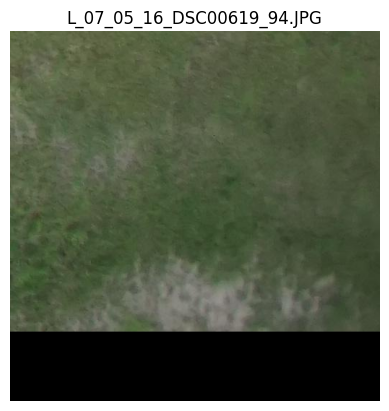

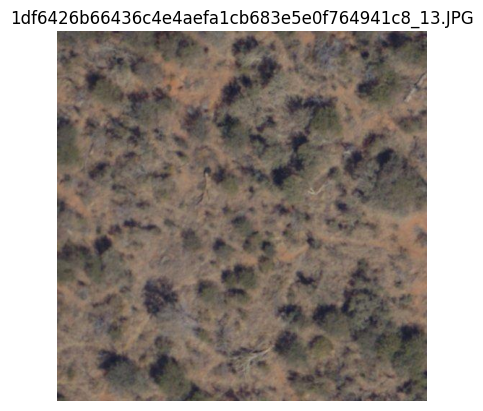

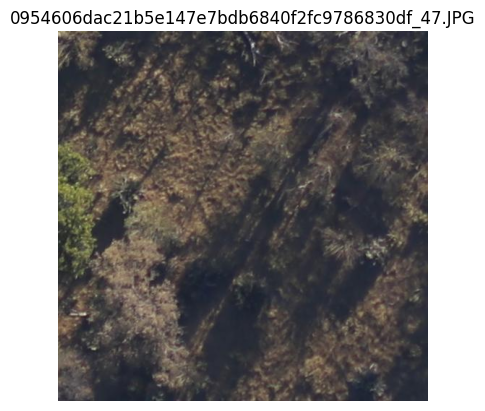

In [ ]:
import random
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

samples = random.sample(list(hnp_images), 3)
for name in samples:
    img = Image.open(MERGED_DIR / name)
    plt.imshow(img)
    plt.title(name)
    plt.axis("off")
    plt.show()

## Preparación de datasets y dataloaders

In [ ]:
import albumentations as A
from animaloc.datasets import FolderDataset, CSVDataset
from animaloc.data.transforms import MultiTransformsWrapper, DownSample, PointsToMask, FIDT
from torch.utils.data import DataLoader

class HerdNetDatasetsBuilder:
    """
    Builder para los datasets de HerdNet (entrenamiento, validación y prueba).
    Permite alternar entre FolderDataset y CSVDataset en entrenamiento,
    y elegir el tipo de normalización (ImageNet o simple).
    """

    def __init__(
        self,
        train_csv: str,
        train_root: str,
        val_csv: str,
        val_root: str,
        test_csv: str,
        test_root: str,
        patch_size: int = 512,
        num_classes: int = 7,
        down_ratio: int = 2,
        use_folder_dataset: bool = False,
        normalize_mode: str = "imagenet"  # "imagenet" o "simple"
    ):
        self.train_csv = train_csv
        self.train_root = train_root
        self.val_csv = val_csv
        self.val_root = val_root
        self.test_csv = test_csv
        self.test_root = test_root
        self.patch_size = patch_size
        self.num_classes = num_classes
        self.down_ratio = down_ratio
        self.use_folder_dataset = use_folder_dataset
        self.normalize_mode = normalize_mode.lower()

    def _get_normalize_transform(self):
        """
        Retorna la transformación de normalización según el modo elegido.
        """
        if self.normalize_mode == "imagenet":
            return A.Normalize(
                mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225),
                p=1.0,
            )
        elif self.normalize_mode == "simple":
            return A.Normalize(p=1.0)
        else:
            raise ValueError("normalize_mode debe ser 'imagenet' o 'simple'.")

    def build(self):
        """
        Construye los datasets y retorna una tupla (train, val, test).
        """
        normalize_transform = self._get_normalize_transform()
        DatasetClass = FolderDataset if self.use_folder_dataset else CSVDataset

        # Dataset de entrenamiento
        train_dataset = DatasetClass(
            csv_file=self.train_csv,
            root_dir=self.train_root,
            albu_transforms=[
                A.VerticalFlip(p=0.5),
                A.HorizontalFlip(p=0.5),
                A.RandomRotate90(p=0.5),
                A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
                A.Blur(blur_limit=15, p=0.2),
                normalize_transform,
            ],
            end_transforms=[
                MultiTransformsWrapper([
                    FIDT(num_classes=self.num_classes, add_bg=False, down_ratio=self.down_ratio),
                    PointsToMask(
                        radius=2,
                        num_classes=self.num_classes,
                        squeeze=True,
                        down_ratio=int(self.patch_size // 16),
                    ),
                ])
            ],
        )

        # Dataset de validación
        val_dataset = CSVDataset(
            csv_file=self.val_csv,
            root_dir=self.val_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )

        # Dataset de prueba
        test_dataset = CSVDataset(
            csv_file=self.test_csv,
            root_dir=self.test_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )

        return train_dataset, val_dataset, test_dataset

builder = HerdNetDatasetsBuilder(
    train_csv="/content/drive/MyDrive/HerdNetData/train_patches.csv",
    train_root="/content/drive/MyDrive/HerdNetData/train_merged_patches",  # contiene positivos + HNPs
    val_csv="/content/drive/MyDrive/HerdNetData/val.csv", # imágenes completas
    val_root="/content/drive/MyDrive/HerdNetData/val", # imágenes completas
    test_csv="/content/drive/MyDrive/HerdNetData/test.csv", # inalterado
    test_root="/content/drive/MyDrive/HerdNetData/test", # inalterado
    use_folder_dataset=True,       # True = Fase 2 con HNPs
    normalize_mode="imagenet"      # normalización de "imagenet" o "simple"
)

train_dataset, val_dataset, test_dataset = builder.build()

train_dataloader = DataLoader(dataset=train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(dataset=val_dataset, batch_size=1, shuffle=False)
test_dataloader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

print(f"[INFO] Train: {len(train_dataset)} | Val: {len(val_dataset)} | Test: {len(test_dataset)}")

[INFO] Train: 21604 | Val: 111 | Test: 258


## Configuración de arquitectura y modelo

In [ ]:
# Crear la carpeta de checkpoints (si no existe)
!mkdir -p /root/.cache/torch/hub/checkpoints/

# Copiar el archivo desde tu Drive al directorio de PyTorch
!cp "/content/drive/MyDrive/HerdNet/original/dla34-ba72cf86.pth" "/root/.cache/torch/hub/checkpoints/dla34-ba72cf86.pth"

# Verificar que esté en su lugar
!ls -lh /root/.cache/torch/hub/checkpoints/

total 61M
-rw------- 1 root root 61M Nov  6 01:49 dla34-ba72cf86.pth


In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir

# Crear carpeta de trabajo donde se guardarán los modelos entrenados
work_dir = "/content/drive/MyDrive/HerdNet/fase_2/models"
mkdir(work_dir)

# Definir hiperparámetros principales del entrenamiento
lr = 1e-6                 # Tasa de aprendizaje del optimizador
weight_decay = 1e-4       # Factor de regularización L2 para evitar sobreajuste
epochs = 100              # Número total de épocas de entrenamiento
patch_size = 512          # Tamaño de los parches de entrada
down_ratio = 2            # Factor de reducción espacial de la red
num_classes = 7           # Número total de clases a predecir

from animaloc.models import HerdNet, LossWrapper, load_model
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss
from torch import Tensor

# Inicializar el modelo HerdNet con pesos preentrenados
herdnet = HerdNet(
    pretrained=False,
    num_classes=num_classes,
    down_ratio=down_ratio
).cuda()  # Enviar el modelo a la GPU

# Definir pesos de clase para la pérdida CrossEntropy
# Se usan para balancear las clases según su frecuencia
weight = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).cuda()

# Definir las funciones de pérdida utilizadas en el entrenamiento
# Cada pérdida se asigna a una parte del modelo según sus índices (idx, idy)
losses = [
    {
        "loss": FocalLoss(reduction="mean"),     # Focal Loss para detección de puntos
        "idx": 0,
        "idy": 0,
        "lambda": 1.0,                          # Peso relativo en la combinación total
        "name": "focal_loss"
    },
    {
        "loss": CrossEntropyLoss(
            reduction="mean",
            weight=weight                        # Peso por clase para balancear clases minoritarias
        ),
        "idx": 1,
        "idy": 1,
        "lambda": 1.0,
        "name": "ce_loss"
    }
]

# Envolver el modelo con el contenedor de pérdidas
# Esto permite que HerdNet calcule ambas pérdidas durante el entrenamiento
herdnet = LossWrapper(herdnet, losses=losses)

# Cargar los pesos del modelo entrenado en la Fase 1
herdnet = load_model(
    herdnet,
    pth_path="/content/drive/MyDrive/HerdNet/fase_2/models/best_model.pth"
)

# Definir el optimizador Adam con los parámetros del modelo HerdNet
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Definir las métricas de evaluación basadas en puntos (detección y conteo)
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que une los parches de salida del modelo
# para reconstruir los mapas completos de densidad o detección
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,            # Superposición entre parches consecutivos
    down_ratio=down_ratio,  # Coincide con la reducción interna del modelo
    reduction="mean"        # Método de agregación entre parches superpuestos
)

# Crear el evaluador que calculará las métricas de desempeño en validación
evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,  # Conjunto de datos de validación
    metrics=metrics,            # Métricas definidas anteriormente
    stitcher=stitcher,          # Stitcher encargado de unir las predicciones
    work_dir=work_dir,          # Carpeta donde se guardan resultados
    header="validation"         # Prefijo usado para nombrar archivos de salida
)

# Crear el entrenador principal que gestiona el bucle de entrenamiento
trainer = Trainer(
    model=herdnet,              # Modelo HerdNet envuelto con pérdidas
    train_dataloader=train_dataloader,  # Datos de entrenamiento
    optimizer=optimizer,        # Optimizador Adam definido
    num_epochs=epochs,          # Número total de épocas
    evaluator=evaluator,        # Evaluador para medir desempeño durante el entrenamiento
    work_dir=work_dir           # Carpeta donde se almacenan modelos y logs
)


In [ ]:
import warnings
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

trainer.start(
    warmup_iters=1,            # sin fase de calentamiento extensa
    checkpoints="best",        # guarda el mejor modelo
    select="max",              # selecciona el máximo f1_score
    validate_on="f1_score"     # métrica principal
)

[2025-11-07 08:11:39] [INFO] [TRAINING] - Epoch: [1] [   1/1351] eta: 3:59:09 lr: 0.000002 loss: 0.4371 (0.4371) focal_loss: 0.3697 (0.3697) ce_loss: 0.0674 (0.0674) time: 10.6213 data: 7.2338 max mem: 8659


[TRAINING] - Epoch: [1] [   1/1351] eta: 3:59:09 lr: 0.000002 loss: 0.4371 (0.4371) focal_loss: 0.3697 (0.3697) ce_loss: 0.0674 (0.0674) time: 10.6213 data: 7.2338 max mem: 8659


[2025-11-07 08:13:03] [INFO] [TRAINING] - Epoch: [1] [  11/1351] eta: 3:10:42 lr: 0.000002 loss: 0.1855 (0.2854) focal_loss: 0.1398 (0.2101) ce_loss: 0.0659 (0.0754) time: 8.5331 data: 7.2725 max mem: 8803


[TRAINING] - Epoch: [1] [  11/1351] eta: 3:10:42 lr: 0.000002 loss: 0.1855 (0.2854) focal_loss: 0.1398 (0.2101) ce_loss: 0.0659 (0.0754) time: 8.5331 data: 7.2725 max mem: 8803


[2025-11-07 08:14:27] [INFO] [TRAINING] - Epoch: [1] [  21/1351] eta: 3:08:22 lr: 0.000002 loss: 0.2291 (0.2854) focal_loss: 0.1619 (0.2166) ce_loss: 0.0577 (0.0688) time: 8.3849 data: 7.3344 max mem: 8803


[TRAINING] - Epoch: [1] [  21/1351] eta: 3:08:22 lr: 0.000002 loss: 0.2291 (0.2854) focal_loss: 0.1619 (0.2166) ce_loss: 0.0577 (0.0688) time: 8.3849 data: 7.3344 max mem: 8803


[2025-11-07 08:15:53] [INFO] [TRAINING] - Epoch: [1] [  31/1351] eta: 3:07:24 lr: 0.000002 loss: 0.3258 (0.2983) focal_loss: 0.2358 (0.2217) ce_loss: 0.0585 (0.0766) time: 8.5011 data: 7.4502 max mem: 8803


[TRAINING] - Epoch: [1] [  31/1351] eta: 3:07:24 lr: 0.000002 loss: 0.3258 (0.2983) focal_loss: 0.2358 (0.2217) ce_loss: 0.0585 (0.0766) time: 8.5011 data: 7.4502 max mem: 8803


[2025-11-07 08:17:22] [INFO] [TRAINING] - Epoch: [1] [  41/1351] eta: 3:08:28 lr: 0.000002 loss: 0.2384 (0.2804) focal_loss: 0.1684 (0.2091) ce_loss: 0.0486 (0.0713) time: 8.7670 data: 7.7177 max mem: 8803


[TRAINING] - Epoch: [1] [  41/1351] eta: 3:08:28 lr: 0.000002 loss: 0.2384 (0.2804) focal_loss: 0.1684 (0.2091) ce_loss: 0.0486 (0.0713) time: 8.7670 data: 7.7177 max mem: 8803


[2025-11-07 08:18:50] [INFO] [TRAINING] - Epoch: [1] [  51/1351] eta: 3:07:36 lr: 0.000002 loss: 0.1889 (0.2752) focal_loss: 0.1484 (0.2083) ce_loss: 0.0467 (0.0669) time: 8.8692 data: 7.8196 max mem: 8803


[TRAINING] - Epoch: [1] [  51/1351] eta: 3:07:36 lr: 0.000002 loss: 0.1889 (0.2752) focal_loss: 0.1484 (0.2083) ce_loss: 0.0467 (0.0669) time: 8.8692 data: 7.8196 max mem: 8803


[2025-11-07 08:20:21] [INFO] [TRAINING] - Epoch: [1] [  61/1351] eta: 3:07:53 lr: 0.000002 loss: 0.2120 (0.2708) focal_loss: 0.1663 (0.2050) ce_loss: 0.0449 (0.0658) time: 8.9507 data: 7.9009 max mem: 8803


[TRAINING] - Epoch: [1] [  61/1351] eta: 3:07:53 lr: 0.000002 loss: 0.2120 (0.2708) focal_loss: 0.1663 (0.2050) ce_loss: 0.0449 (0.0658) time: 8.9507 data: 7.9009 max mem: 8803


[2025-11-07 08:21:49] [INFO] [TRAINING] - Epoch: [1] [  71/1351] eta: 3:06:34 lr: 0.000002 loss: 0.2178 (0.2657) focal_loss: 0.1576 (0.2006) ce_loss: 0.0454 (0.0651) time: 8.9604 data: 7.9087 max mem: 8803


[TRAINING] - Epoch: [1] [  71/1351] eta: 3:06:34 lr: 0.000002 loss: 0.2178 (0.2657) focal_loss: 0.1576 (0.2006) ce_loss: 0.0454 (0.0651) time: 8.9604 data: 7.9087 max mem: 8803


[2025-11-07 08:23:20] [INFO] [TRAINING] - Epoch: [1] [  81/1351] eta: 3:05:58 lr: 0.000002 loss: 0.2541 (0.2711) focal_loss: 0.1872 (0.2076) ce_loss: 0.0481 (0.0635) time: 8.9240 data: 7.8697 max mem: 8803


[TRAINING] - Epoch: [1] [  81/1351] eta: 3:05:58 lr: 0.000002 loss: 0.2541 (0.2711) focal_loss: 0.1872 (0.2076) ce_loss: 0.0481 (0.0635) time: 8.9240 data: 7.8697 max mem: 8803


[2025-11-07 08:24:56] [INFO] [TRAINING] - Epoch: [1] [  91/1351] eta: 3:06:30 lr: 0.000002 loss: 0.2578 (0.2717) focal_loss: 0.2184 (0.2091) ce_loss: 0.0493 (0.0626) time: 9.3545 data: 8.3002 max mem: 8803


[TRAINING] - Epoch: [1] [  91/1351] eta: 3:06:30 lr: 0.000002 loss: 0.2578 (0.2717) focal_loss: 0.2184 (0.2091) ce_loss: 0.0493 (0.0626) time: 9.3545 data: 8.3002 max mem: 8803


[2025-11-07 08:26:39] [INFO] [TRAINING] - Epoch: [1] [ 101/1351] eta: 3:07:51 lr: 0.000002 loss: 0.2578 (0.2763) focal_loss: 0.2162 (0.2131) ce_loss: 0.0583 (0.0632) time: 9.9420 data: 8.8941 max mem: 8803


[TRAINING] - Epoch: [1] [ 101/1351] eta: 3:07:51 lr: 0.000002 loss: 0.2578 (0.2763) focal_loss: 0.2162 (0.2131) ce_loss: 0.0583 (0.0632) time: 9.9420 data: 8.8941 max mem: 8803


[2025-11-07 08:28:15] [INFO] [TRAINING] - Epoch: [1] [ 111/1351] eta: 3:07:30 lr: 0.000002 loss: 0.2949 (0.2769) focal_loss: 0.2190 (0.2146) ce_loss: 0.0492 (0.0622) time: 9.9346 data: 8.8877 max mem: 8803


[TRAINING] - Epoch: [1] [ 111/1351] eta: 3:07:30 lr: 0.000002 loss: 0.2949 (0.2769) focal_loss: 0.2190 (0.2146) ce_loss: 0.0492 (0.0622) time: 9.9346 data: 8.8877 max mem: 8803


[2025-11-07 08:29:43] [INFO] [TRAINING] - Epoch: [1] [ 121/1351] eta: 3:05:32 lr: 0.000002 loss: 0.2484 (0.2755) focal_loss: 0.2083 (0.2146) ce_loss: 0.0466 (0.0609) time: 9.2139 data: 8.1602 max mem: 8803


[TRAINING] - Epoch: [1] [ 121/1351] eta: 3:05:32 lr: 0.000002 loss: 0.2484 (0.2755) focal_loss: 0.2083 (0.2146) ce_loss: 0.0466 (0.0609) time: 9.2139 data: 8.1602 max mem: 8803


[2025-11-07 08:31:18] [INFO] [TRAINING] - Epoch: [1] [ 131/1351] eta: 3:04:49 lr: 0.000002 loss: 0.2448 (0.2738) focal_loss: 0.1875 (0.2139) ce_loss: 0.0456 (0.0599) time: 9.1760 data: 8.1222 max mem: 8803


[TRAINING] - Epoch: [1] [ 131/1351] eta: 3:04:49 lr: 0.000002 loss: 0.2448 (0.2738) focal_loss: 0.1875 (0.2139) ce_loss: 0.0456 (0.0599) time: 9.1760 data: 8.1222 max mem: 8803


[2025-11-07 08:32:46] [INFO] [TRAINING] - Epoch: [1] [ 141/1351] eta: 3:02:48 lr: 0.000002 loss: 0.2278 (0.2739) focal_loss: 0.1995 (0.2142) ce_loss: 0.0382 (0.0598) time: 9.1418 data: 8.0915 max mem: 8803


[TRAINING] - Epoch: [1] [ 141/1351] eta: 3:02:48 lr: 0.000002 loss: 0.2278 (0.2739) focal_loss: 0.1995 (0.2142) ce_loss: 0.0382 (0.0598) time: 9.1418 data: 8.0915 max mem: 8803


[2025-11-07 08:34:15] [INFO] [TRAINING] - Epoch: [1] [ 151/1351] eta: 3:01:07 lr: 0.000002 loss: 0.2460 (0.2783) focal_loss: 0.2028 (0.2182) ce_loss: 0.0488 (0.0601) time: 8.8258 data: 7.7706 max mem: 8803


[TRAINING] - Epoch: [1] [ 151/1351] eta: 3:01:07 lr: 0.000002 loss: 0.2460 (0.2783) focal_loss: 0.2028 (0.2182) ce_loss: 0.0488 (0.0601) time: 8.8258 data: 7.7706 max mem: 8803


[2025-11-07 08:35:54] [INFO] [TRAINING] - Epoch: [1] [ 161/1351] eta: 3:00:37 lr: 0.000002 loss: 0.2623 (0.2780) focal_loss: 0.2018 (0.2180) ce_loss: 0.0541 (0.0600) time: 9.3966 data: 8.3417 max mem: 8803


[TRAINING] - Epoch: [1] [ 161/1351] eta: 3:00:37 lr: 0.000002 loss: 0.2623 (0.2780) focal_loss: 0.2018 (0.2180) ce_loss: 0.0541 (0.0600) time: 9.3966 data: 8.3417 max mem: 8803


[2025-11-07 08:37:37] [INFO] [TRAINING] - Epoch: [1] [ 171/1351] eta: 3:00:32 lr: 0.000002 loss: 0.2203 (0.2766) focal_loss: 0.1905 (0.2170) ce_loss: 0.0539 (0.0596) time: 10.1113 data: 9.0634 max mem: 8803


[TRAINING] - Epoch: [1] [ 171/1351] eta: 3:00:32 lr: 0.000002 loss: 0.2203 (0.2766) focal_loss: 0.1905 (0.2170) ce_loss: 0.0539 (0.0596) time: 10.1113 data: 9.0634 max mem: 8803


[2025-11-07 08:39:09] [INFO] [TRAINING] - Epoch: [1] [ 181/1351] eta: 2:59:03 lr: 0.000002 loss: 0.2581 (0.2776) focal_loss: 0.1970 (0.2178) ce_loss: 0.0539 (0.0597) time: 9.7797 data: 8.7344 max mem: 8803


[TRAINING] - Epoch: [1] [ 181/1351] eta: 2:59:03 lr: 0.000002 loss: 0.2581 (0.2776) focal_loss: 0.1970 (0.2178) ce_loss: 0.0539 (0.0597) time: 9.7797 data: 8.7344 max mem: 8803


[2025-11-07 08:40:34] [INFO] [TRAINING] - Epoch: [1] [ 191/1351] eta: 2:56:46 lr: 0.000002 loss: 0.2787 (0.2768) focal_loss: 0.2145 (0.2182) ce_loss: 0.0428 (0.0586) time: 8.8213 data: 7.7693 max mem: 8803


[TRAINING] - Epoch: [1] [ 191/1351] eta: 2:56:46 lr: 0.000002 loss: 0.2787 (0.2768) focal_loss: 0.2145 (0.2182) ce_loss: 0.0428 (0.0586) time: 8.8213 data: 7.7693 max mem: 8803


[2025-11-07 08:42:06] [INFO] [TRAINING] - Epoch: [1] [ 201/1351] eta: 2:55:22 lr: 0.000002 loss: 0.2789 (0.2801) focal_loss: 0.2267 (0.2210) ce_loss: 0.0443 (0.0591) time: 8.8425 data: 7.7892 max mem: 8803


[TRAINING] - Epoch: [1] [ 201/1351] eta: 2:55:22 lr: 0.000002 loss: 0.2789 (0.2801) focal_loss: 0.2267 (0.2210) ce_loss: 0.0443 (0.0591) time: 8.8425 data: 7.7892 max mem: 8803


[2025-11-07 08:43:38] [INFO] [TRAINING] - Epoch: [1] [ 211/1351] eta: 2:53:51 lr: 0.000002 loss: 0.2789 (0.2797) focal_loss: 0.2267 (0.2212) ce_loss: 0.0443 (0.0585) time: 9.2065 data: 8.1596 max mem: 8803


[TRAINING] - Epoch: [1] [ 211/1351] eta: 2:53:51 lr: 0.000002 loss: 0.2789 (0.2797) focal_loss: 0.2267 (0.2212) ce_loss: 0.0443 (0.0585) time: 9.2065 data: 8.1596 max mem: 8803


[2025-11-07 08:45:15] [INFO] [TRAINING] - Epoch: [1] [ 221/1351] eta: 2:52:47 lr: 0.000002 loss: 0.2837 (0.2811) focal_loss: 0.2099 (0.2218) ce_loss: 0.0542 (0.0593) time: 9.4164 data: 8.3699 max mem: 8803


[TRAINING] - Epoch: [1] [ 221/1351] eta: 2:52:47 lr: 0.000002 loss: 0.2837 (0.2811) focal_loss: 0.2099 (0.2218) ce_loss: 0.0542 (0.0593) time: 9.4164 data: 8.3699 max mem: 8803


[2025-11-07 08:46:56] [INFO] [TRAINING] - Epoch: [1] [ 231/1351] eta: 2:52:04 lr: 0.000002 loss: 0.3115 (0.2825) focal_loss: 0.2193 (0.2234) ce_loss: 0.0578 (0.0591) time: 9.9254 data: 8.8741 max mem: 8803


[TRAINING] - Epoch: [1] [ 231/1351] eta: 2:52:04 lr: 0.000002 loss: 0.3115 (0.2825) focal_loss: 0.2193 (0.2234) ce_loss: 0.0578 (0.0591) time: 9.9254 data: 8.8741 max mem: 8803


[2025-11-07 08:48:35] [INFO] [TRAINING] - Epoch: [1] [ 241/1351] eta: 2:51:05 lr: 0.000002 loss: 0.1886 (0.2801) focal_loss: 0.1499 (0.2219) ce_loss: 0.0422 (0.0582) time: 10.0453 data: 8.9933 max mem: 8803


[TRAINING] - Epoch: [1] [ 241/1351] eta: 2:51:05 lr: 0.000002 loss: 0.1886 (0.2801) focal_loss: 0.1499 (0.2219) ce_loss: 0.0422 (0.0582) time: 10.0453 data: 8.9933 max mem: 8803


[2025-11-07 08:50:05] [INFO] [TRAINING] - Epoch: [1] [ 251/1351] eta: 2:49:19 lr: 0.000002 loss: 0.1991 (0.2797) focal_loss: 0.1702 (0.2219) ce_loss: 0.0424 (0.0578) time: 9.4279 data: 8.3830 max mem: 8804


[TRAINING] - Epoch: [1] [ 251/1351] eta: 2:49:19 lr: 0.000002 loss: 0.1991 (0.2797) focal_loss: 0.1702 (0.2219) ce_loss: 0.0424 (0.0578) time: 9.4279 data: 8.3830 max mem: 8804


[2025-11-07 08:51:26] [INFO] [TRAINING] - Epoch: [1] [ 261/1351] eta: 2:47:00 lr: 0.000002 loss: 0.2853 (0.2807) focal_loss: 0.2302 (0.2220) ce_loss: 0.0551 (0.0587) time: 8.5199 data: 7.4733 max mem: 8804


[TRAINING] - Epoch: [1] [ 261/1351] eta: 2:47:00 lr: 0.000002 loss: 0.2853 (0.2807) focal_loss: 0.2302 (0.2220) ce_loss: 0.0551 (0.0587) time: 8.5199 data: 7.4733 max mem: 8804


[2025-11-07 08:52:53] [INFO] [TRAINING] - Epoch: [1] [ 271/1351] eta: 2:45:08 lr: 0.000002 loss: 0.2803 (0.2801) focal_loss: 0.2297 (0.2222) ce_loss: 0.0485 (0.0579) time: 8.3934 data: 7.3316 max mem: 8804


[TRAINING] - Epoch: [1] [ 271/1351] eta: 2:45:08 lr: 0.000002 loss: 0.2803 (0.2801) focal_loss: 0.2297 (0.2222) ce_loss: 0.0485 (0.0579) time: 8.3934 data: 7.3316 max mem: 8804


[2025-11-07 08:54:39] [INFO] [TRAINING] - Epoch: [1] [ 281/1351] eta: 2:44:32 lr: 0.000002 loss: 0.2377 (0.2787) focal_loss: 0.2015 (0.2209) ce_loss: 0.0373 (0.0578) time: 9.6518 data: 8.5822 max mem: 8804


[TRAINING] - Epoch: [1] [ 281/1351] eta: 2:44:32 lr: 0.000002 loss: 0.2377 (0.2787) focal_loss: 0.2015 (0.2209) ce_loss: 0.0373 (0.0578) time: 9.6518 data: 8.5822 max mem: 8804


[2025-11-07 08:56:03] [INFO] [TRAINING] - Epoch: [1] [ 291/1351] eta: 2:42:29 lr: 0.000002 loss: 0.2308 (0.2786) focal_loss: 0.1945 (0.2207) ce_loss: 0.0468 (0.0578) time: 9.5020 data: 8.4421 max mem: 8804


[TRAINING] - Epoch: [1] [ 291/1351] eta: 2:42:29 lr: 0.000002 loss: 0.2308 (0.2786) focal_loss: 0.1945 (0.2207) ce_loss: 0.0468 (0.0578) time: 9.5020 data: 8.4421 max mem: 8804


[2025-11-07 08:57:29] [INFO] [TRAINING] - Epoch: [1] [ 301/1351] eta: 2:40:37 lr: 0.000002 loss: 0.2530 (0.2767) focal_loss: 0.1945 (0.2195) ce_loss: 0.0419 (0.0572) time: 8.5000 data: 7.4411 max mem: 8804


[TRAINING] - Epoch: [1] [ 301/1351] eta: 2:40:37 lr: 0.000002 loss: 0.2530 (0.2767) focal_loss: 0.1945 (0.2195) ce_loss: 0.0419 (0.0572) time: 8.5000 data: 7.4411 max mem: 8804


[2025-11-07 08:59:03] [INFO] [TRAINING] - Epoch: [1] [ 311/1351] eta: 2:39:14 lr: 0.000002 loss: 0.2511 (0.2774) focal_loss: 0.1937 (0.2201) ce_loss: 0.0409 (0.0573) time: 9.0217 data: 7.9610 max mem: 8804


[TRAINING] - Epoch: [1] [ 311/1351] eta: 2:39:14 lr: 0.000002 loss: 0.2511 (0.2774) focal_loss: 0.1937 (0.2201) ce_loss: 0.0409 (0.0573) time: 9.0217 data: 7.9610 max mem: 8804


[2025-11-07 09:00:33] [INFO] [TRAINING] - Epoch: [1] [ 321/1351] eta: 2:37:36 lr: 0.000002 loss: 0.2465 (0.2764) focal_loss: 0.1942 (0.2191) ce_loss: 0.0444 (0.0573) time: 9.2083 data: 8.1519 max mem: 8804


[TRAINING] - Epoch: [1] [ 321/1351] eta: 2:37:36 lr: 0.000002 loss: 0.2465 (0.2764) focal_loss: 0.1942 (0.2191) ce_loss: 0.0444 (0.0573) time: 9.2083 data: 8.1519 max mem: 8804


[2025-11-07 09:02:14] [INFO] [TRAINING] - Epoch: [1] [ 331/1351] eta: 2:36:32 lr: 0.000002 loss: 0.2230 (0.2746) focal_loss: 0.1656 (0.2177) ce_loss: 0.0440 (0.0569) time: 9.5191 data: 8.4635 max mem: 8804


[TRAINING] - Epoch: [1] [ 331/1351] eta: 2:36:32 lr: 0.000002 loss: 0.2230 (0.2746) focal_loss: 0.1656 (0.2177) ce_loss: 0.0440 (0.0569) time: 9.5191 data: 8.4635 max mem: 8804


[2025-11-07 09:03:44] [INFO] [TRAINING] - Epoch: [1] [ 341/1351] eta: 2:34:54 lr: 0.000002 loss: 0.2260 (0.2738) focal_loss: 0.1843 (0.2168) ce_loss: 0.0456 (0.0570) time: 9.5288 data: 8.4727 max mem: 8804


[TRAINING] - Epoch: [1] [ 341/1351] eta: 2:34:54 lr: 0.000002 loss: 0.2260 (0.2738) focal_loss: 0.1843 (0.2168) ce_loss: 0.0456 (0.0570) time: 9.5288 data: 8.4727 max mem: 8804


[2025-11-07 09:05:10] [INFO] [TRAINING] - Epoch: [1] [ 351/1351] eta: 2:33:06 lr: 0.000002 loss: 0.2425 (0.2742) focal_loss: 0.1994 (0.2170) ce_loss: 0.0548 (0.0572) time: 8.8241 data: 7.7709 max mem: 8804


[TRAINING] - Epoch: [1] [ 351/1351] eta: 2:33:06 lr: 0.000002 loss: 0.2425 (0.2742) focal_loss: 0.1994 (0.2170) ce_loss: 0.0548 (0.0572) time: 8.8241 data: 7.7709 max mem: 8804


[2025-11-07 09:06:41] [INFO] [TRAINING] - Epoch: [1] [ 361/1351] eta: 2:31:32 lr: 0.000002 loss: 0.2438 (0.2731) focal_loss: 0.2077 (0.2162) ce_loss: 0.0510 (0.0569) time: 8.8718 data: 7.8166 max mem: 8804


[TRAINING] - Epoch: [1] [ 361/1351] eta: 2:31:32 lr: 0.000002 loss: 0.2438 (0.2731) focal_loss: 0.2077 (0.2162) ce_loss: 0.0510 (0.0569) time: 8.8718 data: 7.8166 max mem: 8804


[2025-11-07 09:08:31] [INFO] [TRAINING] - Epoch: [1] [ 371/1351] eta: 2:30:49 lr: 0.000002 loss: 0.2386 (0.2731) focal_loss: 0.1951 (0.2164) ce_loss: 0.0457 (0.0567) time: 10.0611 data: 9.0013 max mem: 8804


[TRAINING] - Epoch: [1] [ 371/1351] eta: 2:30:49 lr: 0.000002 loss: 0.2386 (0.2731) focal_loss: 0.1951 (0.2164) ce_loss: 0.0457 (0.0567) time: 10.0611 data: 9.0013 max mem: 8804


[2025-11-07 09:10:03] [INFO] [TRAINING] - Epoch: [1] [ 381/1351] eta: 2:29:17 lr: 0.000002 loss: 0.2503 (0.2731) focal_loss: 0.2016 (0.2163) ce_loss: 0.0434 (0.0568) time: 10.1191 data: 9.0492 max mem: 8804


[TRAINING] - Epoch: [1] [ 381/1351] eta: 2:29:17 lr: 0.000002 loss: 0.2503 (0.2731) focal_loss: 0.2016 (0.2163) ce_loss: 0.0434 (0.0568) time: 10.1191 data: 9.0492 max mem: 8804


[2025-11-07 09:11:43] [INFO] [TRAINING] - Epoch: [1] [ 391/1351] eta: 2:28:03 lr: 0.000002 loss: 0.2421 (0.2727) focal_loss: 0.1999 (0.2159) ce_loss: 0.0425 (0.0568) time: 9.5935 data: 8.5100 max mem: 8804


[TRAINING] - Epoch: [1] [ 391/1351] eta: 2:28:03 lr: 0.000002 loss: 0.2421 (0.2727) focal_loss: 0.1999 (0.2159) ce_loss: 0.0425 (0.0568) time: 9.5935 data: 8.5100 max mem: 8804


[2025-11-07 09:13:29] [INFO] [TRAINING] - Epoch: [1] [ 401/1351] eta: 2:27:02 lr: 0.000002 loss: 0.2366 (0.2730) focal_loss: 0.1922 (0.2164) ce_loss: 0.0444 (0.0565) time: 10.2738 data: 9.1812 max mem: 8804


[TRAINING] - Epoch: [1] [ 401/1351] eta: 2:27:02 lr: 0.000002 loss: 0.2366 (0.2730) focal_loss: 0.1922 (0.2164) ce_loss: 0.0444 (0.0565) time: 10.2738 data: 9.1812 max mem: 8804


[2025-11-07 09:15:10] [INFO] [TRAINING] - Epoch: [1] [ 411/1351] eta: 2:25:49 lr: 0.000002 loss: 0.2422 (0.2726) focal_loss: 0.1995 (0.2162) ce_loss: 0.0480 (0.0564) time: 10.3474 data: 9.2484 max mem: 8804


[TRAINING] - Epoch: [1] [ 411/1351] eta: 2:25:49 lr: 0.000002 loss: 0.2422 (0.2726) focal_loss: 0.1995 (0.2162) ce_loss: 0.0480 (0.0564) time: 10.3474 data: 9.2484 max mem: 8804


[2025-11-07 09:16:47] [INFO] [TRAINING] - Epoch: [1] [ 421/1351] eta: 2:24:25 lr: 0.000002 loss: 0.2647 (0.2736) focal_loss: 0.2152 (0.2170) ce_loss: 0.0592 (0.0566) time: 9.9095 data: 8.8100 max mem: 8804


[TRAINING] - Epoch: [1] [ 421/1351] eta: 2:24:25 lr: 0.000002 loss: 0.2647 (0.2736) focal_loss: 0.2152 (0.2170) ce_loss: 0.0592 (0.0566) time: 9.9095 data: 8.8100 max mem: 8804


[2025-11-07 09:18:15] [INFO] [TRAINING] - Epoch: [1] [ 431/1351] eta: 2:22:40 lr: 0.000002 loss: 0.2702 (0.2750) focal_loss: 0.2292 (0.2177) ce_loss: 0.0601 (0.0573) time: 9.2403 data: 8.1349 max mem: 8804


[TRAINING] - Epoch: [1] [ 431/1351] eta: 2:22:40 lr: 0.000002 loss: 0.2702 (0.2750) focal_loss: 0.2292 (0.2177) ce_loss: 0.0601 (0.0573) time: 9.2403 data: 8.1349 max mem: 8804


[2025-11-07 09:19:49] [INFO] [TRAINING] - Epoch: [1] [ 441/1351] eta: 2:21:09 lr: 0.000002 loss: 0.2618 (0.2753) focal_loss: 0.2101 (0.2182) ce_loss: 0.0529 (0.0571) time: 9.0833 data: 7.9751 max mem: 8804


[TRAINING] - Epoch: [1] [ 441/1351] eta: 2:21:09 lr: 0.000002 loss: 0.2618 (0.2753) focal_loss: 0.2101 (0.2182) ce_loss: 0.0529 (0.0571) time: 9.0833 data: 7.9751 max mem: 8804


[2025-11-07 09:21:16] [INFO] [TRAINING] - Epoch: [1] [ 451/1351] eta: 2:19:25 lr: 0.000002 loss: 0.2692 (0.2762) focal_loss: 0.2280 (0.2193) ce_loss: 0.0481 (0.0569) time: 9.0634 data: 7.9589 max mem: 8804


[TRAINING] - Epoch: [1] [ 451/1351] eta: 2:19:25 lr: 0.000002 loss: 0.2692 (0.2762) focal_loss: 0.2280 (0.2193) ce_loss: 0.0481 (0.0569) time: 9.0634 data: 7.9589 max mem: 8804


[2025-11-07 09:22:42] [INFO] [TRAINING] - Epoch: [1] [ 461/1351] eta: 2:17:38 lr: 0.000002 loss: 0.2851 (0.2762) focal_loss: 0.2363 (0.2195) ce_loss: 0.0474 (0.0567) time: 8.6441 data: 7.5453 max mem: 8804


[TRAINING] - Epoch: [1] [ 461/1351] eta: 2:17:38 lr: 0.000002 loss: 0.2851 (0.2762) focal_loss: 0.2363 (0.2195) ce_loss: 0.0474 (0.0567) time: 8.6441 data: 7.5453 max mem: 8804


[2025-11-07 09:24:09] [INFO] [TRAINING] - Epoch: [1] [ 471/1351] eta: 2:15:56 lr: 0.000002 loss: 0.2505 (0.2759) focal_loss: 0.2062 (0.2190) ce_loss: 0.0446 (0.0568) time: 8.6536 data: 7.5507 max mem: 8804


[TRAINING] - Epoch: [1] [ 471/1351] eta: 2:15:56 lr: 0.000002 loss: 0.2505 (0.2759) focal_loss: 0.2062 (0.2190) ce_loss: 0.0446 (0.0568) time: 8.6536 data: 7.5507 max mem: 8804


[2025-11-07 09:25:38] [INFO] [TRAINING] - Epoch: [1] [ 481/1351] eta: 2:14:15 lr: 0.000002 loss: 0.2367 (0.2755) focal_loss: 0.1774 (0.2186) ce_loss: 0.0582 (0.0569) time: 8.7892 data: 7.6844 max mem: 8804


[TRAINING] - Epoch: [1] [ 481/1351] eta: 2:14:15 lr: 0.000002 loss: 0.2367 (0.2755) focal_loss: 0.1774 (0.2186) ce_loss: 0.0582 (0.0569) time: 8.7892 data: 7.6844 max mem: 8804


[2025-11-07 09:27:10] [INFO] [TRAINING] - Epoch: [1] [ 491/1351] eta: 2:12:43 lr: 0.000002 loss: 0.2210 (0.2750) focal_loss: 0.1811 (0.2182) ce_loss: 0.0562 (0.0568) time: 9.0268 data: 7.9270 max mem: 8804


[TRAINING] - Epoch: [1] [ 491/1351] eta: 2:12:43 lr: 0.000002 loss: 0.2210 (0.2750) focal_loss: 0.1811 (0.2182) ce_loss: 0.0562 (0.0568) time: 9.0268 data: 7.9270 max mem: 8804


[2025-11-07 09:28:38] [INFO] [TRAINING] - Epoch: [1] [ 501/1351] eta: 2:11:03 lr: 0.000002 loss: 0.2715 (0.2760) focal_loss: 0.2113 (0.2192) ce_loss: 0.0556 (0.0568) time: 9.0295 data: 7.9264 max mem: 8804


[TRAINING] - Epoch: [1] [ 501/1351] eta: 2:11:03 lr: 0.000002 loss: 0.2715 (0.2760) focal_loss: 0.2113 (0.2192) ce_loss: 0.0556 (0.0568) time: 9.0295 data: 7.9264 max mem: 8804


[2025-11-07 09:30:11] [INFO] [TRAINING] - Epoch: [1] [ 511/1351] eta: 2:09:31 lr: 0.000002 loss: 0.2264 (0.2755) focal_loss: 0.1927 (0.2189) ce_loss: 0.0526 (0.0566) time: 9.0505 data: 7.9482 max mem: 8804


[TRAINING] - Epoch: [1] [ 511/1351] eta: 2:09:31 lr: 0.000002 loss: 0.2264 (0.2755) focal_loss: 0.1927 (0.2189) ce_loss: 0.0526 (0.0566) time: 9.0505 data: 7.9482 max mem: 8804


[2025-11-07 09:31:35] [INFO] [TRAINING] - Epoch: [1] [ 521/1351] eta: 2:07:45 lr: 0.000002 loss: 0.2379 (0.2760) focal_loss: 0.1981 (0.2191) ce_loss: 0.0526 (0.0569) time: 8.8335 data: 7.7351 max mem: 8804


[TRAINING] - Epoch: [1] [ 521/1351] eta: 2:07:45 lr: 0.000002 loss: 0.2379 (0.2760) focal_loss: 0.1981 (0.2191) ce_loss: 0.0526 (0.0569) time: 8.8335 data: 7.7351 max mem: 8804


[2025-11-07 09:32:58] [INFO] [TRAINING] - Epoch: [1] [ 531/1351] eta: 2:05:58 lr: 0.000002 loss: 0.2748 (0.2759) focal_loss: 0.2221 (0.2192) ce_loss: 0.0497 (0.0567) time: 8.3355 data: 7.2357 max mem: 8804


[TRAINING] - Epoch: [1] [ 531/1351] eta: 2:05:58 lr: 0.000002 loss: 0.2748 (0.2759) focal_loss: 0.2221 (0.2192) ce_loss: 0.0497 (0.0567) time: 8.3355 data: 7.2357 max mem: 8804


[2025-11-07 09:34:21] [INFO] [TRAINING] - Epoch: [1] [ 541/1351] eta: 2:04:13 lr: 0.000002 loss: 0.2494 (0.2765) focal_loss: 0.2022 (0.2191) ce_loss: 0.0424 (0.0573) time: 8.3028 data: 7.2008 max mem: 8804


[TRAINING] - Epoch: [1] [ 541/1351] eta: 2:04:13 lr: 0.000002 loss: 0.2494 (0.2765) focal_loss: 0.2022 (0.2191) ce_loss: 0.0424 (0.0573) time: 8.3028 data: 7.2008 max mem: 8804


[2025-11-07 09:35:46] [INFO] [TRAINING] - Epoch: [1] [ 551/1351] eta: 2:02:31 lr: 0.000002 loss: 0.2131 (0.2756) focal_loss: 0.1579 (0.2185) ce_loss: 0.0589 (0.0572) time: 8.4179 data: 7.3178 max mem: 8804


[TRAINING] - Epoch: [1] [ 551/1351] eta: 2:02:31 lr: 0.000002 loss: 0.2131 (0.2756) focal_loss: 0.1579 (0.2185) ce_loss: 0.0589 (0.0572) time: 8.4179 data: 7.3178 max mem: 8804


[2025-11-07 09:37:10] [INFO] [TRAINING] - Epoch: [1] [ 561/1351] eta: 2:00:49 lr: 0.000002 loss: 0.2054 (0.2747) focal_loss: 0.1465 (0.2177) ce_loss: 0.0481 (0.0571) time: 8.4678 data: 7.3675 max mem: 8804


[TRAINING] - Epoch: [1] [ 561/1351] eta: 2:00:49 lr: 0.000002 loss: 0.2054 (0.2747) focal_loss: 0.1465 (0.2177) ce_loss: 0.0481 (0.0571) time: 8.4678 data: 7.3675 max mem: 8804


[2025-11-07 09:38:41] [INFO] [TRAINING] - Epoch: [1] [ 571/1351] eta: 1:59:17 lr: 0.000002 loss: 0.2386 (0.2747) focal_loss: 0.1886 (0.2179) ce_loss: 0.0463 (0.0568) time: 8.7723 data: 7.6690 max mem: 8804


[TRAINING] - Epoch: [1] [ 571/1351] eta: 1:59:17 lr: 0.000002 loss: 0.2386 (0.2747) focal_loss: 0.1886 (0.2179) ce_loss: 0.0463 (0.0568) time: 8.7723 data: 7.6690 max mem: 8804


[2025-11-07 09:40:11] [INFO] [TRAINING] - Epoch: [1] [ 581/1351] eta: 1:57:42 lr: 0.000002 loss: 0.2584 (0.2745) focal_loss: 0.1984 (0.2179) ce_loss: 0.0461 (0.0566) time: 9.0500 data: 7.9453 max mem: 8804


[TRAINING] - Epoch: [1] [ 581/1351] eta: 1:57:42 lr: 0.000002 loss: 0.2584 (0.2745) focal_loss: 0.1984 (0.2179) ce_loss: 0.0461 (0.0566) time: 9.0500 data: 7.9453 max mem: 8804


[2025-11-07 09:41:33] [INFO] [TRAINING] - Epoch: [1] [ 591/1351] eta: 1:55:58 lr: 0.000002 loss: 0.2584 (0.2753) focal_loss: 0.2048 (0.2185) ce_loss: 0.0462 (0.0568) time: 8.5593 data: 7.4555 max mem: 8804


[TRAINING] - Epoch: [1] [ 591/1351] eta: 1:55:58 lr: 0.000002 loss: 0.2584 (0.2753) focal_loss: 0.2048 (0.2185) ce_loss: 0.0462 (0.0568) time: 8.5593 data: 7.4555 max mem: 8804


[2025-11-07 09:42:58] [INFO] [TRAINING] - Epoch: [1] [ 601/1351] eta: 1:54:19 lr: 0.000002 loss: 0.2602 (0.2764) focal_loss: 0.2244 (0.2196) ce_loss: 0.0462 (0.0568) time: 8.3559 data: 7.2550 max mem: 8804


[TRAINING] - Epoch: [1] [ 601/1351] eta: 1:54:19 lr: 0.000002 loss: 0.2602 (0.2764) focal_loss: 0.2244 (0.2196) ce_loss: 0.0462 (0.0568) time: 8.3559 data: 7.2550 max mem: 8804


[2025-11-07 09:44:25] [INFO] [TRAINING] - Epoch: [1] [ 611/1351] eta: 1:52:42 lr: 0.000002 loss: 0.2883 (0.2767) focal_loss: 0.2338 (0.2197) ce_loss: 0.0513 (0.0569) time: 8.6022 data: 7.5041 max mem: 8804


[TRAINING] - Epoch: [1] [ 611/1351] eta: 1:52:42 lr: 0.000002 loss: 0.2883 (0.2767) focal_loss: 0.2338 (0.2197) ce_loss: 0.0513 (0.0569) time: 8.6022 data: 7.5041 max mem: 8804


[2025-11-07 09:46:01] [INFO] [TRAINING] - Epoch: [1] [ 621/1351] eta: 1:51:16 lr: 0.000002 loss: 0.2854 (0.2767) focal_loss: 0.2086 (0.2197) ce_loss: 0.0519 (0.0570) time: 9.1332 data: 8.0299 max mem: 8804


[TRAINING] - Epoch: [1] [ 621/1351] eta: 1:51:16 lr: 0.000002 loss: 0.2854 (0.2767) focal_loss: 0.2086 (0.2197) ce_loss: 0.0519 (0.0570) time: 9.1332 data: 8.0299 max mem: 8804


[2025-11-07 09:47:26] [INFO] [TRAINING] - Epoch: [1] [ 631/1351] eta: 1:49:38 lr: 0.000002 loss: 0.2707 (0.2771) focal_loss: 0.2089 (0.2200) ce_loss: 0.0552 (0.0571) time: 9.0847 data: 7.9805 max mem: 8804


[TRAINING] - Epoch: [1] [ 631/1351] eta: 1:49:38 lr: 0.000002 loss: 0.2707 (0.2771) focal_loss: 0.2089 (0.2200) ce_loss: 0.0552 (0.0571) time: 9.0847 data: 7.9805 max mem: 8804


[2025-11-07 09:48:53] [INFO] [TRAINING] - Epoch: [1] [ 641/1351] eta: 1:48:02 lr: 0.000002 loss: 0.2823 (0.2771) focal_loss: 0.2153 (0.2200) ce_loss: 0.0557 (0.0572) time: 8.6089 data: 7.5047 max mem: 8804


[TRAINING] - Epoch: [1] [ 641/1351] eta: 1:48:02 lr: 0.000002 loss: 0.2823 (0.2771) focal_loss: 0.2153 (0.2200) ce_loss: 0.0557 (0.0572) time: 8.6089 data: 7.5047 max mem: 8804


[2025-11-07 09:50:24] [INFO] [TRAINING] - Epoch: [1] [ 651/1351] eta: 1:46:30 lr: 0.000002 loss: 0.3064 (0.2777) focal_loss: 0.2215 (0.2205) ce_loss: 0.0620 (0.0573) time: 8.8670 data: 7.7626 max mem: 8804


[TRAINING] - Epoch: [1] [ 651/1351] eta: 1:46:30 lr: 0.000002 loss: 0.3064 (0.2777) focal_loss: 0.2215 (0.2205) ce_loss: 0.0620 (0.0573) time: 8.8670 data: 7.7626 max mem: 8804


[2025-11-07 09:51:45] [INFO] [TRAINING] - Epoch: [1] [ 661/1351] eta: 1:44:48 lr: 0.000002 loss: 0.2652 (0.2778) focal_loss: 0.2190 (0.2207) ce_loss: 0.0509 (0.0572) time: 8.5723 data: 7.4692 max mem: 8804


[TRAINING] - Epoch: [1] [ 661/1351] eta: 1:44:48 lr: 0.000002 loss: 0.2652 (0.2778) focal_loss: 0.2190 (0.2207) ce_loss: 0.0509 (0.0572) time: 8.5723 data: 7.4692 max mem: 8804


[2025-11-07 09:53:13] [INFO] [TRAINING] - Epoch: [1] [ 671/1351] eta: 1:43:14 lr: 0.000002 loss: 0.2661 (0.2776) focal_loss: 0.2086 (0.2206) ce_loss: 0.0496 (0.0571) time: 8.4444 data: 7.3394 max mem: 8804


[TRAINING] - Epoch: [1] [ 671/1351] eta: 1:43:14 lr: 0.000002 loss: 0.2661 (0.2776) focal_loss: 0.2086 (0.2206) ce_loss: 0.0496 (0.0571) time: 8.4444 data: 7.3394 max mem: 8804


[2025-11-07 09:54:45] [INFO] [TRAINING] - Epoch: [1] [ 681/1351] eta: 1:41:45 lr: 0.000002 loss: 0.2501 (0.2775) focal_loss: 0.1921 (0.2202) ce_loss: 0.0536 (0.0573) time: 9.0209 data: 7.9178 max mem: 8804


[TRAINING] - Epoch: [1] [ 681/1351] eta: 1:41:45 lr: 0.000002 loss: 0.2501 (0.2775) focal_loss: 0.1921 (0.2202) ce_loss: 0.0536 (0.0573) time: 9.0209 data: 7.9178 max mem: 8804


[2025-11-07 09:56:12] [INFO] [TRAINING] - Epoch: [1] [ 691/1351] eta: 1:40:10 lr: 0.000002 loss: 0.2345 (0.2768) focal_loss: 0.1787 (0.2195) ce_loss: 0.0543 (0.0573) time: 8.9713 data: 7.8699 max mem: 8804


[TRAINING] - Epoch: [1] [ 691/1351] eta: 1:40:10 lr: 0.000002 loss: 0.2345 (0.2768) focal_loss: 0.1787 (0.2195) ce_loss: 0.0543 (0.0573) time: 8.9713 data: 7.8699 max mem: 8804


[2025-11-07 09:57:48] [INFO] [TRAINING] - Epoch: [1] [ 701/1351] eta: 1:38:44 lr: 0.000002 loss: 0.2220 (0.2766) focal_loss: 0.1782 (0.2195) ce_loss: 0.0456 (0.0572) time: 9.1465 data: 8.0433 max mem: 8804


[TRAINING] - Epoch: [1] [ 701/1351] eta: 1:38:44 lr: 0.000002 loss: 0.2220 (0.2766) focal_loss: 0.1782 (0.2195) ce_loss: 0.0456 (0.0572) time: 9.1465 data: 8.0433 max mem: 8804


[2025-11-07 09:59:40] [INFO] [TRAINING] - Epoch: [1] [ 711/1351] eta: 1:37:31 lr: 0.000002 loss: 0.2471 (0.2764) focal_loss: 0.1837 (0.2194) ce_loss: 0.0404 (0.0571) time: 10.3771 data: 9.2736 max mem: 8804


[TRAINING] - Epoch: [1] [ 711/1351] eta: 1:37:31 lr: 0.000002 loss: 0.2471 (0.2764) focal_loss: 0.1837 (0.2194) ce_loss: 0.0404 (0.0571) time: 10.3771 data: 9.2736 max mem: 8804


[2025-11-07 10:01:08] [INFO] [TRAINING] - Epoch: [1] [ 721/1351] eta: 1:35:57 lr: 0.000002 loss: 0.2551 (0.2780) focal_loss: 0.2001 (0.2208) ce_loss: 0.0486 (0.0572) time: 9.9970 data: 8.8967 max mem: 8804


[TRAINING] - Epoch: [1] [ 721/1351] eta: 1:35:57 lr: 0.000002 loss: 0.2551 (0.2780) focal_loss: 0.2001 (0.2208) ce_loss: 0.0486 (0.0572) time: 9.9970 data: 8.8967 max mem: 8804


[2025-11-07 10:02:33] [INFO] [TRAINING] - Epoch: [1] [ 731/1351] eta: 1:34:21 lr: 0.000002 loss: 0.2551 (0.2780) focal_loss: 0.2001 (0.2207) ce_loss: 0.0614 (0.0573) time: 8.6660 data: 7.5645 max mem: 8804


[TRAINING] - Epoch: [1] [ 731/1351] eta: 1:34:21 lr: 0.000002 loss: 0.2551 (0.2780) focal_loss: 0.2001 (0.2207) ce_loss: 0.0614 (0.0573) time: 8.6660 data: 7.5645 max mem: 8804


[2025-11-07 10:04:01] [INFO] [TRAINING] - Epoch: [1] [ 741/1351] eta: 1:32:47 lr: 0.000002 loss: 0.2399 (0.2772) focal_loss: 0.1708 (0.2200) ce_loss: 0.0514 (0.0572) time: 8.6696 data: 7.5647 max mem: 8804


[TRAINING] - Epoch: [1] [ 741/1351] eta: 1:32:47 lr: 0.000002 loss: 0.2399 (0.2772) focal_loss: 0.1708 (0.2200) ce_loss: 0.0514 (0.0572) time: 8.6696 data: 7.5647 max mem: 8804


[2025-11-07 10:05:21] [INFO] [TRAINING] - Epoch: [1] [ 751/1351] eta: 1:31:07 lr: 0.000002 loss: 0.2127 (0.2767) focal_loss: 0.1699 (0.2197) ce_loss: 0.0423 (0.0570) time: 8.4283 data: 7.3254 max mem: 8804


[TRAINING] - Epoch: [1] [ 751/1351] eta: 1:31:07 lr: 0.000002 loss: 0.2127 (0.2767) focal_loss: 0.1699 (0.2197) ce_loss: 0.0423 (0.0570) time: 8.4283 data: 7.3254 max mem: 8804


[2025-11-07 10:06:49] [INFO] [TRAINING] - Epoch: [1] [ 761/1351] eta: 1:29:34 lr: 0.000002 loss: 0.2011 (0.2764) focal_loss: 0.1699 (0.2195) ce_loss: 0.0368 (0.0569) time: 8.3773 data: 7.2746 max mem: 8804


[TRAINING] - Epoch: [1] [ 761/1351] eta: 1:29:34 lr: 0.000002 loss: 0.2011 (0.2764) focal_loss: 0.1699 (0.2195) ce_loss: 0.0368 (0.0569) time: 8.3773 data: 7.2746 max mem: 8804


[2025-11-07 10:08:13] [INFO] [TRAINING] - Epoch: [1] [ 771/1351] eta: 1:27:58 lr: 0.000002 loss: 0.2350 (0.2764) focal_loss: 0.1804 (0.2197) ce_loss: 0.0368 (0.0567) time: 8.5823 data: 7.4747 max mem: 8804


[TRAINING] - Epoch: [1] [ 771/1351] eta: 1:27:58 lr: 0.000002 loss: 0.2350 (0.2764) focal_loss: 0.1804 (0.2197) ce_loss: 0.0368 (0.0567) time: 8.5823 data: 7.4747 max mem: 8804


[2025-11-07 10:09:40] [INFO] [TRAINING] - Epoch: [1] [ 781/1351] eta: 1:26:24 lr: 0.000002 loss: 0.2972 (0.2767) focal_loss: 0.2544 (0.2201) ce_loss: 0.0431 (0.0567) time: 8.5721 data: 7.4669 max mem: 8804


[TRAINING] - Epoch: [1] [ 781/1351] eta: 1:26:24 lr: 0.000002 loss: 0.2972 (0.2767) focal_loss: 0.2544 (0.2201) ce_loss: 0.0431 (0.0567) time: 8.5721 data: 7.4669 max mem: 8804


[2025-11-07 10:11:06] [INFO] [TRAINING] - Epoch: [1] [ 791/1351] eta: 1:24:50 lr: 0.000002 loss: 0.2546 (0.2766) focal_loss: 0.2135 (0.2201) ce_loss: 0.0527 (0.0566) time: 8.6416 data: 7.5427 max mem: 8804


[TRAINING] - Epoch: [1] [ 791/1351] eta: 1:24:50 lr: 0.000002 loss: 0.2546 (0.2766) focal_loss: 0.2135 (0.2201) ce_loss: 0.0527 (0.0566) time: 8.6416 data: 7.5427 max mem: 8804


[2025-11-07 10:12:55] [INFO] [TRAINING] - Epoch: [1] [ 801/1351] eta: 1:23:32 lr: 0.000002 loss: 0.2381 (0.2765) focal_loss: 0.1837 (0.2201) ce_loss: 0.0394 (0.0564) time: 9.7389 data: 8.6364 max mem: 8804


[TRAINING] - Epoch: [1] [ 801/1351] eta: 1:23:32 lr: 0.000002 loss: 0.2381 (0.2765) focal_loss: 0.1837 (0.2201) ce_loss: 0.0394 (0.0564) time: 9.7389 data: 8.6364 max mem: 8804


[2025-11-07 10:14:34] [INFO] [TRAINING] - Epoch: [1] [ 811/1351] eta: 1:22:06 lr: 0.000002 loss: 0.2198 (0.2761) focal_loss: 0.1804 (0.2197) ce_loss: 0.0402 (0.0564) time: 10.3810 data: 9.2761 max mem: 8804


[TRAINING] - Epoch: [1] [ 811/1351] eta: 1:22:06 lr: 0.000002 loss: 0.2198 (0.2761) focal_loss: 0.1804 (0.2197) ce_loss: 0.0402 (0.0564) time: 10.3810 data: 9.2761 max mem: 8804


[2025-11-07 10:16:13] [INFO] [TRAINING] - Epoch: [1] [ 821/1351] eta: 1:20:40 lr: 0.000002 loss: 0.2142 (0.2764) focal_loss: 0.1741 (0.2198) ce_loss: 0.0534 (0.0565) time: 9.8688 data: 8.7698 max mem: 8804


[TRAINING] - Epoch: [1] [ 821/1351] eta: 1:20:40 lr: 0.000002 loss: 0.2142 (0.2764) focal_loss: 0.1741 (0.2198) ce_loss: 0.0534 (0.0565) time: 9.8688 data: 8.7698 max mem: 8804


[2025-11-07 10:17:47] [INFO] [TRAINING] - Epoch: [1] [ 831/1351] eta: 1:19:11 lr: 0.000002 loss: 0.2244 (0.2762) focal_loss: 0.1559 (0.2196) ce_loss: 0.0533 (0.0566) time: 9.6776 data: 8.5770 max mem: 8804


[TRAINING] - Epoch: [1] [ 831/1351] eta: 1:19:11 lr: 0.000002 loss: 0.2244 (0.2762) focal_loss: 0.1559 (0.2196) ce_loss: 0.0533 (0.0566) time: 9.6776 data: 8.5770 max mem: 8804


[2025-11-07 10:19:22] [INFO] [TRAINING] - Epoch: [1] [ 841/1351] eta: 1:17:42 lr: 0.000002 loss: 0.1893 (0.2754) focal_loss: 0.1390 (0.2187) ce_loss: 0.0522 (0.0567) time: 9.4852 data: 8.3845 max mem: 8804


[TRAINING] - Epoch: [1] [ 841/1351] eta: 1:17:42 lr: 0.000002 loss: 0.1893 (0.2754) focal_loss: 0.1390 (0.2187) ce_loss: 0.0522 (0.0567) time: 9.4852 data: 8.3845 max mem: 8804


[2025-11-07 10:20:58] [INFO] [TRAINING] - Epoch: [1] [ 851/1351] eta: 1:16:13 lr: 0.000002 loss: 0.2270 (0.2757) focal_loss: 0.1898 (0.2189) ce_loss: 0.0538 (0.0568) time: 9.5199 data: 8.4215 max mem: 8804


[TRAINING] - Epoch: [1] [ 851/1351] eta: 1:16:13 lr: 0.000002 loss: 0.2270 (0.2757) focal_loss: 0.1898 (0.2189) ce_loss: 0.0538 (0.0568) time: 9.5199 data: 8.4215 max mem: 8804


[2025-11-07 10:22:29] [INFO] [TRAINING] - Epoch: [1] [ 861/1351] eta: 1:14:42 lr: 0.000002 loss: 0.2270 (0.2752) focal_loss: 0.1749 (0.2184) ce_loss: 0.0462 (0.0568) time: 9.3600 data: 8.2619 max mem: 8804


[TRAINING] - Epoch: [1] [ 861/1351] eta: 1:14:42 lr: 0.000002 loss: 0.2270 (0.2752) focal_loss: 0.1749 (0.2184) ce_loss: 0.0462 (0.0568) time: 9.3600 data: 8.2619 max mem: 8804


[2025-11-07 10:24:16] [INFO] [TRAINING] - Epoch: [1] [ 871/1351] eta: 1:13:19 lr: 0.000002 loss: 0.1854 (0.2743) focal_loss: 0.1511 (0.2176) ce_loss: 0.0391 (0.0567) time: 9.9289 data: 8.8277 max mem: 8804


[TRAINING] - Epoch: [1] [ 871/1351] eta: 1:13:19 lr: 0.000002 loss: 0.1854 (0.2743) focal_loss: 0.1511 (0.2176) ce_loss: 0.0391 (0.0567) time: 9.9289 data: 8.8277 max mem: 8804


[2025-11-07 10:25:50] [INFO] [TRAINING] - Epoch: [1] [ 881/1351] eta: 1:11:49 lr: 0.000002 loss: 0.2003 (0.2738) focal_loss: 0.1511 (0.2171) ce_loss: 0.0409 (0.0568) time: 10.0375 data: 8.9317 max mem: 8804


[TRAINING] - Epoch: [1] [ 881/1351] eta: 1:11:49 lr: 0.000002 loss: 0.2003 (0.2738) focal_loss: 0.1511 (0.2171) ce_loss: 0.0409 (0.0568) time: 10.0375 data: 8.9317 max mem: 8804


[2025-11-07 10:27:26] [INFO] [TRAINING] - Epoch: [1] [ 891/1351] eta: 1:10:20 lr: 0.000002 loss: 0.2333 (0.2744) focal_loss: 0.1924 (0.2176) ce_loss: 0.0432 (0.0569) time: 9.4838 data: 8.3806 max mem: 8804


[TRAINING] - Epoch: [1] [ 891/1351] eta: 1:10:20 lr: 0.000002 loss: 0.2333 (0.2744) focal_loss: 0.1924 (0.2176) ce_loss: 0.0432 (0.0569) time: 9.4838 data: 8.3806 max mem: 8804


[2025-11-07 10:29:18] [INFO] [TRAINING] - Epoch: [1] [ 901/1351] eta: 1:08:59 lr: 0.000002 loss: 0.2066 (0.2736) focal_loss: 0.1601 (0.2169) ce_loss: 0.0465 (0.0568) time: 10.3819 data: 9.2802 max mem: 8804


[TRAINING] - Epoch: [1] [ 901/1351] eta: 1:08:59 lr: 0.000002 loss: 0.2066 (0.2736) focal_loss: 0.1601 (0.2169) ce_loss: 0.0465 (0.0568) time: 10.3819 data: 9.2802 max mem: 8804


[2025-11-07 10:30:51] [INFO] [TRAINING] - Epoch: [1] [ 911/1351] eta: 1:07:27 lr: 0.000002 loss: 0.1841 (0.2728) focal_loss: 0.1560 (0.2162) ce_loss: 0.0412 (0.0567) time: 10.2586 data: 9.1602 max mem: 8804


[TRAINING] - Epoch: [1] [ 911/1351] eta: 1:07:27 lr: 0.000002 loss: 0.1841 (0.2728) focal_loss: 0.1560 (0.2162) ce_loss: 0.0412 (0.0567) time: 10.2586 data: 9.1602 max mem: 8804


[2025-11-07 10:32:31] [INFO] [TRAINING] - Epoch: [1] [ 921/1351] eta: 1:05:59 lr: 0.000002 loss: 0.2268 (0.2732) focal_loss: 0.1903 (0.2164) ce_loss: 0.0421 (0.0568) time: 9.6467 data: 8.5483 max mem: 8804


[TRAINING] - Epoch: [1] [ 921/1351] eta: 1:05:59 lr: 0.000002 loss: 0.2268 (0.2732) focal_loss: 0.1903 (0.2164) ce_loss: 0.0421 (0.0568) time: 9.6467 data: 8.5483 max mem: 8804


[2025-11-07 10:34:06] [INFO] [TRAINING] - Epoch: [1] [ 931/1351] eta: 1:04:29 lr: 0.000002 loss: 0.2741 (0.2735) focal_loss: 0.2031 (0.2167) ce_loss: 0.0528 (0.0568) time: 9.7587 data: 8.6584 max mem: 8804


[TRAINING] - Epoch: [1] [ 931/1351] eta: 1:04:29 lr: 0.000002 loss: 0.2741 (0.2735) focal_loss: 0.2031 (0.2167) ce_loss: 0.0528 (0.0568) time: 9.7587 data: 8.6584 max mem: 8804


[2025-11-07 10:35:48] [INFO] [TRAINING] - Epoch: [1] [ 941/1351] eta: 1:03:02 lr: 0.000002 loss: 0.3022 (0.2737) focal_loss: 0.2327 (0.2169) ce_loss: 0.0445 (0.0568) time: 9.8761 data: 8.7741 max mem: 8804


[TRAINING] - Epoch: [1] [ 941/1351] eta: 1:03:02 lr: 0.000002 loss: 0.3022 (0.2737) focal_loss: 0.2327 (0.2169) ce_loss: 0.0445 (0.0568) time: 9.8761 data: 8.7741 max mem: 8804


[2025-11-07 10:37:28] [INFO] [TRAINING] - Epoch: [1] [ 951/1351] eta: 1:01:33 lr: 0.000002 loss: 0.3022 (0.2741) focal_loss: 0.2268 (0.2173) ce_loss: 0.0471 (0.0568) time: 10.1140 data: 9.0072 max mem: 8804


[TRAINING] - Epoch: [1] [ 951/1351] eta: 1:01:33 lr: 0.000002 loss: 0.3022 (0.2741) focal_loss: 0.2268 (0.2173) ce_loss: 0.0471 (0.0568) time: 10.1140 data: 9.0072 max mem: 8804


[2025-11-07 10:39:21] [INFO] [TRAINING] - Epoch: [1] [ 961/1351] eta: 1:00:09 lr: 0.000002 loss: 0.2168 (0.2742) focal_loss: 0.1809 (0.2175) ce_loss: 0.0466 (0.0567) time: 10.6107 data: 9.5073 max mem: 8804


[TRAINING] - Epoch: [1] [ 961/1351] eta: 1:00:09 lr: 0.000002 loss: 0.2168 (0.2742) focal_loss: 0.1809 (0.2175) ce_loss: 0.0466 (0.0567) time: 10.6107 data: 9.5073 max mem: 8804


[2025-11-07 10:41:00] [INFO] [TRAINING] - Epoch: [1] [ 971/1351] eta: 0:58:40 lr: 0.000002 loss: 0.2579 (0.2744) focal_loss: 0.2096 (0.2176) ce_loss: 0.0482 (0.0568) time: 10.5972 data: 9.5006 max mem: 8804


[TRAINING] - Epoch: [1] [ 971/1351] eta: 0:58:40 lr: 0.000002 loss: 0.2579 (0.2744) focal_loss: 0.2096 (0.2176) ce_loss: 0.0482 (0.0568) time: 10.5972 data: 9.5006 max mem: 8804


[2025-11-07 10:42:53] [INFO] [TRAINING] - Epoch: [1] [ 981/1351] eta: 0:57:15 lr: 0.000002 loss: 0.2431 (0.2744) focal_loss: 0.1968 (0.2178) ce_loss: 0.0464 (0.0567) time: 10.6231 data: 9.5220 max mem: 8804


[TRAINING] - Epoch: [1] [ 981/1351] eta: 0:57:15 lr: 0.000002 loss: 0.2431 (0.2744) focal_loss: 0.1968 (0.2178) ce_loss: 0.0464 (0.0567) time: 10.6231 data: 9.5220 max mem: 8804


[2025-11-07 10:44:38] [INFO] [TRAINING] - Epoch: [1] [ 991/1351] eta: 0:55:47 lr: 0.000002 loss: 0.2600 (0.2749) focal_loss: 0.2136 (0.2183) ce_loss: 0.0419 (0.0566) time: 10.8847 data: 9.7793 max mem: 8804


[TRAINING] - Epoch: [1] [ 991/1351] eta: 0:55:47 lr: 0.000002 loss: 0.2600 (0.2749) focal_loss: 0.2136 (0.2183) ce_loss: 0.0419 (0.0566) time: 10.8847 data: 9.7793 max mem: 8804


[2025-11-07 10:46:20] [INFO] [TRAINING] - Epoch: [1] [1001/1351] eta: 0:54:17 lr: 0.000002 loss: 0.2600 (0.2745) focal_loss: 0.2136 (0.2180) ce_loss: 0.0419 (0.0565) time: 10.3584 data: 9.2589 max mem: 8804


[TRAINING] - Epoch: [1] [1001/1351] eta: 0:54:17 lr: 0.000002 loss: 0.2600 (0.2745) focal_loss: 0.2136 (0.2180) ce_loss: 0.0419 (0.0565) time: 10.3584 data: 9.2589 max mem: 8804


[2025-11-07 10:47:59] [INFO] [TRAINING] - Epoch: [1] [1011/1351] eta: 0:52:47 lr: 0.000002 loss: 0.2210 (0.2745) focal_loss: 0.1632 (0.2181) ce_loss: 0.0417 (0.0564) time: 10.0221 data: 8.9240 max mem: 8804


[TRAINING] - Epoch: [1] [1011/1351] eta: 0:52:47 lr: 0.000002 loss: 0.2210 (0.2745) focal_loss: 0.1632 (0.2181) ce_loss: 0.0417 (0.0564) time: 10.0221 data: 8.9240 max mem: 8804


[2025-11-07 10:49:35] [INFO] [TRAINING] - Epoch: [1] [1021/1351] eta: 0:51:15 lr: 0.000002 loss: 0.2482 (0.2747) focal_loss: 0.1933 (0.2184) ce_loss: 0.0411 (0.0563) time: 9.7280 data: 8.6301 max mem: 8804


[TRAINING] - Epoch: [1] [1021/1351] eta: 0:51:15 lr: 0.000002 loss: 0.2482 (0.2747) focal_loss: 0.1933 (0.2184) ce_loss: 0.0411 (0.0563) time: 9.7280 data: 8.6301 max mem: 8804


[2025-11-07 10:51:13] [INFO] [TRAINING] - Epoch: [1] [1031/1351] eta: 0:49:43 lr: 0.000002 loss: 0.2716 (0.2756) focal_loss: 0.2258 (0.2192) ce_loss: 0.0516 (0.0564) time: 9.7134 data: 8.6172 max mem: 8804


[TRAINING] - Epoch: [1] [1031/1351] eta: 0:49:43 lr: 0.000002 loss: 0.2716 (0.2756) focal_loss: 0.2258 (0.2192) ce_loss: 0.0516 (0.0564) time: 9.7134 data: 8.6172 max mem: 8804


[2025-11-07 10:52:53] [INFO] [TRAINING] - Epoch: [1] [1041/1351] eta: 0:48:12 lr: 0.000002 loss: 0.2961 (0.2764) focal_loss: 0.2201 (0.2199) ce_loss: 0.0646 (0.0565) time: 9.8937 data: 8.7919 max mem: 8804


[TRAINING] - Epoch: [1] [1041/1351] eta: 0:48:12 lr: 0.000002 loss: 0.2961 (0.2764) focal_loss: 0.2201 (0.2199) ce_loss: 0.0646 (0.0565) time: 9.8937 data: 8.7919 max mem: 8804


[2025-11-07 10:54:28] [INFO] [TRAINING] - Epoch: [1] [1051/1351] eta: 0:46:40 lr: 0.000002 loss: 0.2379 (0.2758) focal_loss: 0.1889 (0.2195) ce_loss: 0.0432 (0.0563) time: 9.7350 data: 8.6258 max mem: 8804


[TRAINING] - Epoch: [1] [1051/1351] eta: 0:46:40 lr: 0.000002 loss: 0.2379 (0.2758) focal_loss: 0.1889 (0.2195) ce_loss: 0.0432 (0.0563) time: 9.7350 data: 8.6258 max mem: 8804


[2025-11-07 10:56:02] [INFO] [TRAINING] - Epoch: [1] [1061/1351] eta: 0:45:07 lr: 0.000002 loss: 0.2171 (0.2756) focal_loss: 0.1676 (0.2194) ce_loss: 0.0403 (0.0562) time: 9.4686 data: 8.3650 max mem: 8804


[TRAINING] - Epoch: [1] [1061/1351] eta: 0:45:07 lr: 0.000002 loss: 0.2171 (0.2756) focal_loss: 0.1676 (0.2194) ce_loss: 0.0403 (0.0562) time: 9.4686 data: 8.3650 max mem: 8804


[2025-11-07 10:57:41] [INFO] [TRAINING] - Epoch: [1] [1071/1351] eta: 0:43:36 lr: 0.000002 loss: 0.2383 (0.2755) focal_loss: 0.1833 (0.2192) ce_loss: 0.0492 (0.0562) time: 9.6581 data: 8.5578 max mem: 8804


[TRAINING] - Epoch: [1] [1071/1351] eta: 0:43:36 lr: 0.000002 loss: 0.2383 (0.2755) focal_loss: 0.1833 (0.2192) ce_loss: 0.0492 (0.0562) time: 9.6581 data: 8.5578 max mem: 8804


[2025-11-07 10:59:12] [INFO] [TRAINING] - Epoch: [1] [1081/1351] eta: 0:42:02 lr: 0.000002 loss: 0.2383 (0.2751) focal_loss: 0.1833 (0.2189) ce_loss: 0.0498 (0.0562) time: 9.5077 data: 8.4044 max mem: 8804


[TRAINING] - Epoch: [1] [1081/1351] eta: 0:42:02 lr: 0.000002 loss: 0.2383 (0.2751) focal_loss: 0.1833 (0.2189) ce_loss: 0.0498 (0.0562) time: 9.5077 data: 8.4044 max mem: 8804


[2025-11-07 11:00:46] [INFO] [TRAINING] - Epoch: [1] [1091/1351] eta: 0:40:29 lr: 0.000002 loss: 0.2377 (0.2748) focal_loss: 0.1806 (0.2187) ce_loss: 0.0383 (0.0561) time: 9.2699 data: 8.1712 max mem: 8804


[TRAINING] - Epoch: [1] [1091/1351] eta: 0:40:29 lr: 0.000002 loss: 0.2377 (0.2748) focal_loss: 0.1806 (0.2187) ce_loss: 0.0383 (0.0561) time: 9.2699 data: 8.1712 max mem: 8804


[2025-11-07 11:02:19] [INFO] [TRAINING] - Epoch: [1] [1101/1351] eta: 0:38:56 lr: 0.000002 loss: 0.2418 (0.2749) focal_loss: 0.1933 (0.2187) ce_loss: 0.0480 (0.0561) time: 9.3348 data: 8.2329 max mem: 8804


[TRAINING] - Epoch: [1] [1101/1351] eta: 0:38:56 lr: 0.000002 loss: 0.2418 (0.2749) focal_loss: 0.1933 (0.2187) ce_loss: 0.0480 (0.0561) time: 9.3348 data: 8.2329 max mem: 8804


[2025-11-07 11:03:59] [INFO] [TRAINING] - Epoch: [1] [1111/1351] eta: 0:37:25 lr: 0.000002 loss: 0.3023 (0.2754) focal_loss: 0.2387 (0.2192) ce_loss: 0.0506 (0.0562) time: 9.6254 data: 8.5169 max mem: 8804


[TRAINING] - Epoch: [1] [1111/1351] eta: 0:37:25 lr: 0.000002 loss: 0.3023 (0.2754) focal_loss: 0.2387 (0.2192) ce_loss: 0.0506 (0.0562) time: 9.6254 data: 8.5169 max mem: 8804


[2025-11-07 11:05:32] [INFO] [TRAINING] - Epoch: [1] [1121/1351] eta: 0:35:52 lr: 0.000002 loss: 0.2369 (0.2752) focal_loss: 0.1894 (0.2190) ce_loss: 0.0404 (0.0562) time: 9.6749 data: 8.5659 max mem: 8804


[TRAINING] - Epoch: [1] [1121/1351] eta: 0:35:52 lr: 0.000002 loss: 0.2369 (0.2752) focal_loss: 0.1894 (0.2190) ce_loss: 0.0404 (0.0562) time: 9.6749 data: 8.5659 max mem: 8804


[2025-11-07 11:07:09] [INFO] [TRAINING] - Epoch: [1] [1131/1351] eta: 0:34:19 lr: 0.000002 loss: 0.2350 (0.2750) focal_loss: 0.1869 (0.2187) ce_loss: 0.0404 (0.0563) time: 9.5074 data: 8.4014 max mem: 8804


[TRAINING] - Epoch: [1] [1131/1351] eta: 0:34:19 lr: 0.000002 loss: 0.2350 (0.2750) focal_loss: 0.1869 (0.2187) ce_loss: 0.0404 (0.0563) time: 9.5074 data: 8.4014 max mem: 8804


[2025-11-07 11:08:42] [INFO] [TRAINING] - Epoch: [1] [1141/1351] eta: 0:32:46 lr: 0.000002 loss: 0.2309 (0.2749) focal_loss: 0.1653 (0.2187) ce_loss: 0.0494 (0.0563) time: 9.4667 data: 8.3604 max mem: 8804


[TRAINING] - Epoch: [1] [1141/1351] eta: 0:32:46 lr: 0.000002 loss: 0.2309 (0.2749) focal_loss: 0.1653 (0.2187) ce_loss: 0.0494 (0.0563) time: 9.4667 data: 8.3604 max mem: 8804


[2025-11-07 11:10:16] [INFO] [TRAINING] - Epoch: [1] [1151/1351] eta: 0:31:13 lr: 0.000002 loss: 0.2053 (0.2752) focal_loss: 0.1642 (0.2187) ce_loss: 0.0547 (0.0565) time: 9.3761 data: 8.2723 max mem: 8804


[TRAINING] - Epoch: [1] [1151/1351] eta: 0:31:13 lr: 0.000002 loss: 0.2053 (0.2752) focal_loss: 0.1642 (0.2187) ce_loss: 0.0547 (0.0565) time: 9.3761 data: 8.2723 max mem: 8804


[2025-11-07 11:11:50] [INFO] [TRAINING] - Epoch: [1] [1161/1351] eta: 0:29:40 lr: 0.000002 loss: 0.1937 (0.2748) focal_loss: 0.1637 (0.2184) ce_loss: 0.0543 (0.0564) time: 9.4190 data: 8.3199 max mem: 8804


[TRAINING] - Epoch: [1] [1161/1351] eta: 0:29:40 lr: 0.000002 loss: 0.1937 (0.2748) focal_loss: 0.1637 (0.2184) ce_loss: 0.0543 (0.0564) time: 9.4190 data: 8.3199 max mem: 8804


[2025-11-07 11:13:37] [INFO] [TRAINING] - Epoch: [1] [1171/1351] eta: 0:28:09 lr: 0.000002 loss: 0.1952 (0.2744) focal_loss: 0.1637 (0.2181) ce_loss: 0.0381 (0.0563) time: 10.0279 data: 8.9303 max mem: 8804


[TRAINING] - Epoch: [1] [1171/1351] eta: 0:28:09 lr: 0.000002 loss: 0.1952 (0.2744) focal_loss: 0.1637 (0.2181) ce_loss: 0.0381 (0.0563) time: 10.0279 data: 8.9303 max mem: 8804


[2025-11-07 11:15:15] [INFO] [TRAINING] - Epoch: [1] [1181/1351] eta: 0:26:36 lr: 0.000002 loss: 0.2487 (0.2746) focal_loss: 0.1921 (0.2183) ce_loss: 0.0454 (0.0563) time: 10.2604 data: 9.1639 max mem: 8804


[TRAINING] - Epoch: [1] [1181/1351] eta: 0:26:36 lr: 0.000002 loss: 0.2487 (0.2746) focal_loss: 0.1921 (0.2183) ce_loss: 0.0454 (0.0563) time: 10.2604 data: 9.1639 max mem: 8804


[2025-11-07 11:16:54] [INFO] [TRAINING] - Epoch: [1] [1191/1351] eta: 0:25:03 lr: 0.000002 loss: 0.2949 (0.2750) focal_loss: 0.2492 (0.2187) ce_loss: 0.0437 (0.0562) time: 9.8695 data: 8.7714 max mem: 8804


[TRAINING] - Epoch: [1] [1191/1351] eta: 0:25:03 lr: 0.000002 loss: 0.2949 (0.2750) focal_loss: 0.2492 (0.2187) ce_loss: 0.0437 (0.0562) time: 9.8695 data: 8.7714 max mem: 8804


[2025-11-07 11:18:34] [INFO] [TRAINING] - Epoch: [1] [1201/1351] eta: 0:23:31 lr: 0.000002 loss: 0.2014 (0.2743) focal_loss: 0.1661 (0.2181) ce_loss: 0.0410 (0.0562) time: 9.9280 data: 8.8286 max mem: 8804


[TRAINING] - Epoch: [1] [1201/1351] eta: 0:23:31 lr: 0.000002 loss: 0.2014 (0.2743) focal_loss: 0.1661 (0.2181) ce_loss: 0.0410 (0.0562) time: 9.9280 data: 8.8286 max mem: 8804


[2025-11-07 11:20:09] [INFO] [TRAINING] - Epoch: [1] [1211/1351] eta: 0:21:58 lr: 0.000002 loss: 0.1989 (0.2740) focal_loss: 0.1550 (0.2179) ce_loss: 0.0410 (0.0561) time: 9.7428 data: 8.6380 max mem: 8804


[TRAINING] - Epoch: [1] [1211/1351] eta: 0:21:58 lr: 0.000002 loss: 0.1989 (0.2740) focal_loss: 0.1550 (0.2179) ce_loss: 0.0410 (0.0561) time: 9.7428 data: 8.6380 max mem: 8804


[2025-11-07 11:21:49] [INFO] [TRAINING] - Epoch: [1] [1221/1351] eta: 0:20:25 lr: 0.000002 loss: 0.2401 (0.2737) focal_loss: 0.1833 (0.2176) ce_loss: 0.0438 (0.0561) time: 9.7632 data: 8.6577 max mem: 8804


[TRAINING] - Epoch: [1] [1221/1351] eta: 0:20:25 lr: 0.000002 loss: 0.2401 (0.2737) focal_loss: 0.1833 (0.2176) ce_loss: 0.0438 (0.0561) time: 9.7632 data: 8.6577 max mem: 8804


[2025-11-07 11:23:48] [INFO] [TRAINING] - Epoch: [1] [1231/1351] eta: 0:18:54 lr: 0.000002 loss: 0.2809 (0.2744) focal_loss: 0.2409 (0.2183) ce_loss: 0.0438 (0.0561) time: 10.9443 data: 9.8447 max mem: 8804


[TRAINING] - Epoch: [1] [1231/1351] eta: 0:18:54 lr: 0.000002 loss: 0.2809 (0.2744) focal_loss: 0.2409 (0.2183) ce_loss: 0.0438 (0.0561) time: 10.9443 data: 9.8447 max mem: 8804


[2025-11-07 11:25:31] [INFO] [TRAINING] - Epoch: [1] [1241/1351] eta: 0:17:21 lr: 0.000002 loss: 0.2809 (0.2744) focal_loss: 0.2422 (0.2184) ce_loss: 0.0411 (0.0560) time: 11.1060 data: 10.0064 max mem: 8804


[TRAINING] - Epoch: [1] [1241/1351] eta: 0:17:21 lr: 0.000002 loss: 0.2809 (0.2744) focal_loss: 0.2422 (0.2184) ce_loss: 0.0411 (0.0560) time: 11.1060 data: 10.0064 max mem: 8804


[2025-11-07 11:27:12] [INFO] [TRAINING] - Epoch: [1] [1251/1351] eta: 0:15:48 lr: 0.000002 loss: 0.2322 (0.2740) focal_loss: 0.1762 (0.2180) ce_loss: 0.0475 (0.0560) time: 10.1766 data: 9.0765 max mem: 8804


[TRAINING] - Epoch: [1] [1251/1351] eta: 0:15:48 lr: 0.000002 loss: 0.2322 (0.2740) focal_loss: 0.1762 (0.2180) ce_loss: 0.0475 (0.0560) time: 10.1766 data: 9.0765 max mem: 8804


[2025-11-07 11:29:09] [INFO] [TRAINING] - Epoch: [1] [1261/1351] eta: 0:14:15 lr: 0.000002 loss: 0.2272 (0.2746) focal_loss: 0.1762 (0.2186) ce_loss: 0.0477 (0.0560) time: 10.8971 data: 9.7999 max mem: 8804


[TRAINING] - Epoch: [1] [1261/1351] eta: 0:14:15 lr: 0.000002 loss: 0.2272 (0.2746) focal_loss: 0.1762 (0.2186) ce_loss: 0.0477 (0.0560) time: 10.8971 data: 9.7999 max mem: 8804


[2025-11-07 11:30:50] [INFO] [TRAINING] - Epoch: [1] [1271/1351] eta: 0:12:42 lr: 0.000002 loss: 0.2709 (0.2747) focal_loss: 0.2115 (0.2186) ce_loss: 0.0494 (0.0561) time: 10.9171 data: 9.8351 max mem: 8804


[TRAINING] - Epoch: [1] [1271/1351] eta: 0:12:42 lr: 0.000002 loss: 0.2709 (0.2747) focal_loss: 0.2115 (0.2186) ce_loss: 0.0494 (0.0561) time: 10.9171 data: 9.8351 max mem: 8804


[2025-11-07 11:32:28] [INFO] [TRAINING] - Epoch: [1] [1281/1351] eta: 0:11:08 lr: 0.000002 loss: 0.2221 (0.2744) focal_loss: 0.1821 (0.2185) ce_loss: 0.0414 (0.0560) time: 9.9169 data: 8.8555 max mem: 8804


[TRAINING] - Epoch: [1] [1281/1351] eta: 0:11:08 lr: 0.000002 loss: 0.2221 (0.2744) focal_loss: 0.1821 (0.2185) ce_loss: 0.0414 (0.0560) time: 9.9169 data: 8.8555 max mem: 8804


[2025-11-07 11:34:04] [INFO] [TRAINING] - Epoch: [1] [1291/1351] eta: 0:09:34 lr: 0.000002 loss: 0.2557 (0.2746) focal_loss: 0.1847 (0.2187) ce_loss: 0.0458 (0.0560) time: 9.6993 data: 8.6437 max mem: 8804


[TRAINING] - Epoch: [1] [1291/1351] eta: 0:09:34 lr: 0.000002 loss: 0.2557 (0.2746) focal_loss: 0.1847 (0.2187) ce_loss: 0.0458 (0.0560) time: 9.6993 data: 8.6437 max mem: 8804


[2025-11-07 11:35:37] [INFO] [TRAINING] - Epoch: [1] [1301/1351] eta: 0:08:00 lr: 0.000002 loss: 0.2557 (0.2742) focal_loss: 0.1887 (0.2183) ce_loss: 0.0458 (0.0559) time: 9.4746 data: 8.4220 max mem: 8804


[TRAINING] - Epoch: [1] [1301/1351] eta: 0:08:00 lr: 0.000002 loss: 0.2557 (0.2742) focal_loss: 0.1887 (0.2183) ce_loss: 0.0458 (0.0559) time: 9.4746 data: 8.4220 max mem: 8804


[2025-11-07 11:37:15] [INFO] [TRAINING] - Epoch: [1] [1311/1351] eta: 0:06:26 lr: 0.000002 loss: 0.2112 (0.2742) focal_loss: 0.1744 (0.2183) ce_loss: 0.0386 (0.0558) time: 9.5733 data: 8.5166 max mem: 8804


[TRAINING] - Epoch: [1] [1311/1351] eta: 0:06:26 lr: 0.000002 loss: 0.2112 (0.2742) focal_loss: 0.1744 (0.2183) ce_loss: 0.0386 (0.0558) time: 9.5733 data: 8.5166 max mem: 8804


[2025-11-07 11:38:52] [INFO] [TRAINING] - Epoch: [1] [1321/1351] eta: 0:04:52 lr: 0.000002 loss: 0.2343 (0.2739) focal_loss: 0.1748 (0.2180) ce_loss: 0.0501 (0.0559) time: 9.7683 data: 8.7091 max mem: 8804


[TRAINING] - Epoch: [1] [1321/1351] eta: 0:04:52 lr: 0.000002 loss: 0.2343 (0.2739) focal_loss: 0.1748 (0.2180) ce_loss: 0.0501 (0.0559) time: 9.7683 data: 8.7091 max mem: 8804


[2025-11-07 11:40:32] [INFO] [TRAINING] - Epoch: [1] [1331/1351] eta: 0:03:17 lr: 0.000002 loss: 0.2497 (0.2740) focal_loss: 0.1966 (0.2182) ce_loss: 0.0501 (0.0558) time: 9.8171 data: 8.7626 max mem: 8804


[TRAINING] - Epoch: [1] [1331/1351] eta: 0:03:17 lr: 0.000002 loss: 0.2497 (0.2740) focal_loss: 0.1966 (0.2182) ce_loss: 0.0501 (0.0558) time: 9.8171 data: 8.7626 max mem: 8804


[2025-11-07 11:42:02] [INFO] [TRAINING] - Epoch: [1] [1341/1351] eta: 0:01:43 lr: 0.000002 loss: 0.3010 (0.2744) focal_loss: 0.2335 (0.2183) ce_loss: 0.0511 (0.0560) time: 9.5028 data: 8.4480 max mem: 8804


[TRAINING] - Epoch: [1] [1341/1351] eta: 0:01:43 lr: 0.000002 loss: 0.3010 (0.2744) focal_loss: 0.2335 (0.2183) ce_loss: 0.0511 (0.0560) time: 9.5028 data: 8.4480 max mem: 8804


[2025-11-07 11:43:30] [INFO] [TRAINING] - Epoch: [1] [1351/1351] eta: 0:00:09 lr: 0.000002 loss: 0.2514 (0.2740) focal_loss: 0.2019 (0.2180) ce_loss: 0.0482 (0.0559) time: 8.9241 data: 7.9017 max mem: 8804
[2025-11-07 11:43:30] [INFO] [TRAINING] - Epoch: [1] Total time: 3:32:01 (9.4164 s / it)


[TRAINING] - Epoch: [1] [1351/1351] eta: 0:00:09 lr: 0.000002 loss: 0.2514 (0.2740) focal_loss: 0.2019 (0.2180) ce_loss: 0.0482 (0.0559) time: 8.9241 data: 7.9017 max mem: 8804
[TRAINING] - Epoch: [1] Total time: 3:32:01 (9.4164 s / it)
[TRAINING] - Epoch: [1] mean loss: 0.2740


[2025-11-07 11:43:44] [INFO] [VALIDATION] - Epoch: [1] [  1/111] eta: 0:26:17 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 14.2105 data: 8.6340 max mem: 8804


[VALIDATION] - Epoch: [1] [  1/111] eta: 0:26:17 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 14.2105 data: 8.6340 max mem: 8804


[2025-11-07 11:45:02] [INFO] [VALIDATION] - Epoch: [1] [ 11/111] eta: 0:13:58 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 8.3055 data: 2.8719 max mem: 8804


[VALIDATION] - Epoch: [1] [ 11/111] eta: 0:13:58 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 8.3055 data: 2.8719 max mem: 8804


[2025-11-07 11:46:16] [INFO] [VALIDATION] - Epoch: [1] [ 21/111] eta: 0:11:56 n: 7 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 7.5589 data: 2.1739 max mem: 8804


[VALIDATION] - Epoch: [1] [ 21/111] eta: 0:11:56 n: 7 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 7.5589 data: 2.1739 max mem: 8804


[2025-11-07 11:47:31] [INFO] [VALIDATION] - Epoch: [1] [ 31/111] eta: 0:10:28 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.4513 data: 2.0602 max mem: 8804


[VALIDATION] - Epoch: [1] [ 31/111] eta: 0:10:28 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.4513 data: 2.0602 max mem: 8804


[2025-11-07 11:48:43] [INFO] [VALIDATION] - Epoch: [1] [ 41/111] eta: 0:09:02 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.3904 data: 1.9714 max mem: 8804


[VALIDATION] - Epoch: [1] [ 41/111] eta: 0:09:02 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.3904 data: 1.9714 max mem: 8804


[2025-11-07 11:49:58] [INFO] [VALIDATION] - Epoch: [1] [ 51/111] eta: 0:07:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.3515 data: 1.9626 max mem: 8804


[VALIDATION] - Epoch: [1] [ 51/111] eta: 0:07:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.3515 data: 1.9626 max mem: 8804


[2025-11-07 11:51:10] [INFO] [VALIDATION] - Epoch: [1] [ 61/111] eta: 0:06:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.3274 data: 1.9169 max mem: 8804


[VALIDATION] - Epoch: [1] [ 61/111] eta: 0:06:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.3274 data: 1.9169 max mem: 8804


[2025-11-07 11:52:24] [INFO] [VALIDATION] - Epoch: [1] [ 71/111] eta: 0:05:08 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.3243 data: 1.8903 max mem: 8804


[VALIDATION] - Epoch: [1] [ 71/111] eta: 0:05:08 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.3243 data: 1.8903 max mem: 8804


[2025-11-07 11:53:38] [INFO] [VALIDATION] - Epoch: [1] [ 81/111] eta: 0:03:52 n: 8 recall: 0.88 precision: 0.7 f1-score: 0.78 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.4066 data: 2.1734 max mem: 8804


[VALIDATION] - Epoch: [1] [ 81/111] eta: 0:03:52 n: 8 recall: 0.88 precision: 0.7 f1-score: 0.78 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.4066 data: 2.1734 max mem: 8804


[2025-11-07 11:54:40] [INFO] [VALIDATION] - Epoch: [1] [ 91/111] eta: 0:02:34 n: 8 recall: 0.88 precision: 0.41 f1-score: 0.56 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 6.7997 data: 1.9444 max mem: 8804


[VALIDATION] - Epoch: [1] [ 91/111] eta: 0:02:34 n: 8 recall: 0.88 precision: 0.41 f1-score: 0.56 MAE: 9.0 MSE: 81.0 RMSE: 9.0 time: 6.7997 data: 1.9444 max mem: 8804


[2025-11-07 11:55:47] [INFO] [VALIDATION] - Epoch: [1] [101/111] eta: 0:01:20 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.4489 data: 1.7622 max mem: 8804


[VALIDATION] - Epoch: [1] [101/111] eta: 0:01:20 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.4489 data: 1.7622 max mem: 8804


[2025-11-07 11:56:51] [INFO] [VALIDATION] - Epoch: [1] [111/111] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.05 f1-score: 0.09 MAE: 20.0 MSE: 400.0 RMSE: 20.0 time: 6.5309 data: 1.8623 max mem: 8804
[2025-11-07 11:56:51] [INFO] [VALIDATION] - Epoch: [1] Total time: 0:13:20 (7.2121 s / it)


[VALIDATION] - Epoch: [1] [111/111] eta: 0:00:07 n: 1 recall: 1.0 precision: 0.05 f1-score: 0.09 MAE: 20.0 MSE: 400.0 RMSE: 20.0 time: 6.5309 data: 1.8623 max mem: 8804
[VALIDATION] - Epoch: [1] Total time: 0:13:20 (7.2121 s / it)
[VALIDATION] - Epoch: [1] f1_score: 0.7615
Best model saved - Epoch 1 - Validation value: 0.761472


[2025-11-07 11:56:54] [INFO] [TRAINING] - Epoch: [2] [   1/1351] eta: 0:33:42 lr: 0.000002 loss: 0.2508 (0.2739) focal_loss: 0.2019 (0.2180) ce_loss: 0.0477 (0.0559) time: 1.4968 data: 0.3959 max mem: 8804


[TRAINING] - Epoch: [2] [   1/1351] eta: 0:33:42 lr: 0.000002 loss: 0.2508 (0.2739) focal_loss: 0.2019 (0.2180) ce_loss: 0.0477 (0.0559) time: 1.4968 data: 0.3959 max mem: 8804


[2025-11-07 11:57:09] [INFO] [TRAINING] - Epoch: [2] [  11/1351] eta: 0:33:24 lr: 0.000002 loss: 0.2508 (0.2739) focal_loss: 0.2049 (0.2181) ce_loss: 0.0344 (0.0558) time: 1.4946 data: 0.4284 max mem: 8804


[TRAINING] - Epoch: [2] [  11/1351] eta: 0:33:24 lr: 0.000002 loss: 0.2508 (0.2739) focal_loss: 0.2049 (0.2181) ce_loss: 0.0344 (0.0558) time: 1.4946 data: 0.4284 max mem: 8804


[2025-11-07 11:57:23] [INFO] [TRAINING] - Epoch: [2] [  21/1351] eta: 0:32:29 lr: 0.000002 loss: 0.2913 (0.2742) focal_loss: 0.2553 (0.2184) ce_loss: 0.0381 (0.0558) time: 1.4631 data: 0.4051 max mem: 8804


[TRAINING] - Epoch: [2] [  21/1351] eta: 0:32:29 lr: 0.000002 loss: 0.2913 (0.2742) focal_loss: 0.2553 (0.2184) ce_loss: 0.0381 (0.0558) time: 1.4631 data: 0.4051 max mem: 8804


[2025-11-07 11:57:37] [INFO] [TRAINING] - Epoch: [2] [  31/1351] eta: 0:31:57 lr: 0.000002 loss: 0.2633 (0.2741) focal_loss: 0.1832 (0.2182) ce_loss: 0.0452 (0.0559) time: 1.4282 data: 0.3750 max mem: 8804


[TRAINING] - Epoch: [2] [  31/1351] eta: 0:31:57 lr: 0.000002 loss: 0.2633 (0.2741) focal_loss: 0.1832 (0.2182) ce_loss: 0.0452 (0.0559) time: 1.4282 data: 0.3750 max mem: 8804


[2025-11-07 11:57:51] [INFO] [TRAINING] - Epoch: [2] [  41/1351] eta: 0:31:27 lr: 0.000002 loss: 0.2374 (0.2740) focal_loss: 0.1793 (0.2182) ce_loss: 0.0395 (0.0557) time: 1.4142 data: 0.3633 max mem: 8804


[TRAINING] - Epoch: [2] [  41/1351] eta: 0:31:27 lr: 0.000002 loss: 0.2374 (0.2740) focal_loss: 0.1793 (0.2182) ce_loss: 0.0395 (0.0557) time: 1.4142 data: 0.3633 max mem: 8804


[2025-11-07 11:58:05] [INFO] [TRAINING] - Epoch: [2] [  51/1351] eta: 0:31:01 lr: 0.000002 loss: 0.2330 (0.2737) focal_loss: 0.1710 (0.2179) ce_loss: 0.0422 (0.0558) time: 1.3975 data: 0.3488 max mem: 8804


[TRAINING] - Epoch: [2] [  51/1351] eta: 0:31:01 lr: 0.000002 loss: 0.2330 (0.2737) focal_loss: 0.1710 (0.2179) ce_loss: 0.0422 (0.0558) time: 1.3975 data: 0.3488 max mem: 8804


[2025-11-07 11:58:19] [INFO] [TRAINING] - Epoch: [2] [  61/1351] eta: 0:30:43 lr: 0.000002 loss: 0.2542 (0.2739) focal_loss: 0.1821 (0.2182) ce_loss: 0.0537 (0.0557) time: 1.4040 data: 0.3549 max mem: 8804


[TRAINING] - Epoch: [2] [  61/1351] eta: 0:30:43 lr: 0.000002 loss: 0.2542 (0.2739) focal_loss: 0.1821 (0.2182) ce_loss: 0.0537 (0.0557) time: 1.4040 data: 0.3549 max mem: 8804


[2025-11-07 11:58:33] [INFO] [TRAINING] - Epoch: [2] [  71/1351] eta: 0:30:28 lr: 0.000002 loss: 0.2827 (0.2741) focal_loss: 0.2297 (0.2184) ce_loss: 0.0529 (0.0557) time: 1.4190 data: 0.3677 max mem: 8804


[TRAINING] - Epoch: [2] [  71/1351] eta: 0:30:28 lr: 0.000002 loss: 0.2827 (0.2741) focal_loss: 0.2297 (0.2184) ce_loss: 0.0529 (0.0557) time: 1.4190 data: 0.3677 max mem: 8804


[2025-11-07 11:58:48] [INFO] [TRAINING] - Epoch: [2] [  81/1351] eta: 0:30:13 lr: 0.000002 loss: 0.2818 (0.2742) focal_loss: 0.2324 (0.2185) ce_loss: 0.0448 (0.0557) time: 1.4228 data: 0.3702 max mem: 8804


[TRAINING] - Epoch: [2] [  81/1351] eta: 0:30:13 lr: 0.000002 loss: 0.2818 (0.2742) focal_loss: 0.2324 (0.2185) ce_loss: 0.0448 (0.0557) time: 1.4228 data: 0.3702 max mem: 8804


[2025-11-07 11:59:02] [INFO] [TRAINING] - Epoch: [2] [  91/1351] eta: 0:30:00 lr: 0.000002 loss: 0.3141 (0.2746) focal_loss: 0.2460 (0.2189) ce_loss: 0.0420 (0.0557) time: 1.4306 data: 0.3796 max mem: 8804


[TRAINING] - Epoch: [2] [  91/1351] eta: 0:30:00 lr: 0.000002 loss: 0.3141 (0.2746) focal_loss: 0.2460 (0.2189) ce_loss: 0.0420 (0.0557) time: 1.4306 data: 0.3796 max mem: 8804


[2025-11-07 11:59:16] [INFO] [TRAINING] - Epoch: [2] [ 101/1351] eta: 0:29:46 lr: 0.000002 loss: 0.3131 (0.2747) focal_loss: 0.2598 (0.2190) ce_loss: 0.0420 (0.0557) time: 1.4320 data: 0.3819 max mem: 8804


[TRAINING] - Epoch: [2] [ 101/1351] eta: 0:29:46 lr: 0.000002 loss: 0.3131 (0.2747) focal_loss: 0.2598 (0.2190) ce_loss: 0.0420 (0.0557) time: 1.4320 data: 0.3819 max mem: 8804


[2025-11-07 11:59:31] [INFO] [TRAINING] - Epoch: [2] [ 111/1351] eta: 0:29:31 lr: 0.000002 loss: 0.2874 (0.2747) focal_loss: 0.2165 (0.2191) ce_loss: 0.0415 (0.0556) time: 1.4261 data: 0.3759 max mem: 8804


[TRAINING] - Epoch: [2] [ 111/1351] eta: 0:29:31 lr: 0.000002 loss: 0.2874 (0.2747) focal_loss: 0.2165 (0.2191) ce_loss: 0.0415 (0.0556) time: 1.4261 data: 0.3759 max mem: 8804


[2025-11-07 11:59:45] [INFO] [TRAINING] - Epoch: [2] [ 121/1351] eta: 0:29:18 lr: 0.000002 loss: 0.2913 (0.2752) focal_loss: 0.2540 (0.2196) ce_loss: 0.0407 (0.0556) time: 1.4312 data: 0.3802 max mem: 8804


[TRAINING] - Epoch: [2] [ 121/1351] eta: 0:29:18 lr: 0.000002 loss: 0.2913 (0.2752) focal_loss: 0.2540 (0.2196) ce_loss: 0.0407 (0.0556) time: 1.4312 data: 0.3802 max mem: 8804


[2025-11-07 11:59:59] [INFO] [TRAINING] - Epoch: [2] [ 131/1351] eta: 0:29:03 lr: 0.000002 loss: 0.2485 (0.2749) focal_loss: 0.2021 (0.2194) ce_loss: 0.0407 (0.0555) time: 1.4296 data: 0.3791 max mem: 8804


[TRAINING] - Epoch: [2] [ 131/1351] eta: 0:29:03 lr: 0.000002 loss: 0.2485 (0.2749) focal_loss: 0.2021 (0.2194) ce_loss: 0.0407 (0.0555) time: 1.4296 data: 0.3791 max mem: 8804


[2025-11-07 12:00:13] [INFO] [TRAINING] - Epoch: [2] [ 141/1351] eta: 0:28:49 lr: 0.000002 loss: 0.1920 (0.2747) focal_loss: 0.1717 (0.2193) ce_loss: 0.0340 (0.0554) time: 1.4252 data: 0.3736 max mem: 8804


[TRAINING] - Epoch: [2] [ 141/1351] eta: 0:28:49 lr: 0.000002 loss: 0.1920 (0.2747) focal_loss: 0.1717 (0.2193) ce_loss: 0.0340 (0.0554) time: 1.4252 data: 0.3736 max mem: 8804


[2025-11-07 12:00:28] [INFO] [TRAINING] - Epoch: [2] [ 151/1351] eta: 0:28:33 lr: 0.000002 loss: 0.2186 (0.2744) focal_loss: 0.1880 (0.2191) ce_loss: 0.0337 (0.0553) time: 1.4181 data: 0.3650 max mem: 8804


[TRAINING] - Epoch: [2] [ 151/1351] eta: 0:28:33 lr: 0.000002 loss: 0.2186 (0.2744) focal_loss: 0.1880 (0.2191) ce_loss: 0.0337 (0.0553) time: 1.4181 data: 0.3650 max mem: 8804


[2025-11-07 12:00:41] [INFO] [TRAINING] - Epoch: [2] [ 161/1351] eta: 0:28:16 lr: 0.000002 loss: 0.2083 (0.2739) focal_loss: 0.1588 (0.2187) ce_loss: 0.0340 (0.0552) time: 1.3964 data: 0.3445 max mem: 8804


[TRAINING] - Epoch: [2] [ 161/1351] eta: 0:28:16 lr: 0.000002 loss: 0.2083 (0.2739) focal_loss: 0.1588 (0.2187) ce_loss: 0.0340 (0.0552) time: 1.3964 data: 0.3445 max mem: 8804


[2025-11-07 12:00:55] [INFO] [TRAINING] - Epoch: [2] [ 171/1351] eta: 0:28:00 lr: 0.000002 loss: 0.2083 (0.2736) focal_loss: 0.1479 (0.2183) ce_loss: 0.0346 (0.0553) time: 1.3928 data: 0.3411 max mem: 8804


[TRAINING] - Epoch: [2] [ 171/1351] eta: 0:28:00 lr: 0.000002 loss: 0.2083 (0.2736) focal_loss: 0.1479 (0.2183) ce_loss: 0.0346 (0.0553) time: 1.3928 data: 0.3411 max mem: 8804


[2025-11-07 12:01:10] [INFO] [TRAINING] - Epoch: [2] [ 181/1351] eta: 0:27:46 lr: 0.000002 loss: 0.2459 (0.2738) focal_loss: 0.1940 (0.2185) ce_loss: 0.0483 (0.0553) time: 1.4155 data: 0.3640 max mem: 8804


[TRAINING] - Epoch: [2] [ 181/1351] eta: 0:27:46 lr: 0.000002 loss: 0.2459 (0.2738) focal_loss: 0.1940 (0.2185) ce_loss: 0.0483 (0.0553) time: 1.4155 data: 0.3640 max mem: 8804


[2025-11-07 12:01:24] [INFO] [TRAINING] - Epoch: [2] [ 191/1351] eta: 0:27:30 lr: 0.000002 loss: 0.2727 (0.2738) focal_loss: 0.2068 (0.2185) ce_loss: 0.0496 (0.0553) time: 1.4140 data: 0.3619 max mem: 8804


[TRAINING] - Epoch: [2] [ 191/1351] eta: 0:27:30 lr: 0.000002 loss: 0.2727 (0.2738) focal_loss: 0.2068 (0.2185) ce_loss: 0.0496 (0.0553) time: 1.4140 data: 0.3619 max mem: 8804


[2025-11-07 12:01:38] [INFO] [TRAINING] - Epoch: [2] [ 201/1351] eta: 0:27:16 lr: 0.000002 loss: 0.2299 (0.2739) focal_loss: 0.1693 (0.2186) ce_loss: 0.0469 (0.0553) time: 1.4084 data: 0.3552 max mem: 8804


[TRAINING] - Epoch: [2] [ 201/1351] eta: 0:27:16 lr: 0.000002 loss: 0.2299 (0.2739) focal_loss: 0.1693 (0.2186) ce_loss: 0.0469 (0.0553) time: 1.4084 data: 0.3552 max mem: 8804


[2025-11-07 12:01:52] [INFO] [TRAINING] - Epoch: [2] [ 211/1351] eta: 0:27:01 lr: 0.000002 loss: 0.1932 (0.2736) focal_loss: 0.1603 (0.2184) ce_loss: 0.0389 (0.0552) time: 1.4156 data: 0.3635 max mem: 8804


[TRAINING] - Epoch: [2] [ 211/1351] eta: 0:27:01 lr: 0.000002 loss: 0.1932 (0.2736) focal_loss: 0.1603 (0.2184) ce_loss: 0.0389 (0.0552) time: 1.4156 data: 0.3635 max mem: 8804


[2025-11-07 12:02:06] [INFO] [TRAINING] - Epoch: [2] [ 221/1351] eta: 0:26:47 lr: 0.000002 loss: 0.2383 (0.2739) focal_loss: 0.1893 (0.2187) ce_loss: 0.0370 (0.0552) time: 1.4212 data: 0.3699 max mem: 8804


[TRAINING] - Epoch: [2] [ 221/1351] eta: 0:26:47 lr: 0.000002 loss: 0.2383 (0.2739) focal_loss: 0.1893 (0.2187) ce_loss: 0.0370 (0.0552) time: 1.4212 data: 0.3699 max mem: 8804


[2025-11-07 12:02:21] [INFO] [TRAINING] - Epoch: [2] [ 231/1351] eta: 0:26:33 lr: 0.000002 loss: 0.2676 (0.2736) focal_loss: 0.2159 (0.2185) ce_loss: 0.0377 (0.0552) time: 1.4242 data: 0.3718 max mem: 8804


[TRAINING] - Epoch: [2] [ 231/1351] eta: 0:26:33 lr: 0.000002 loss: 0.2676 (0.2736) focal_loss: 0.2159 (0.2185) ce_loss: 0.0377 (0.0552) time: 1.4242 data: 0.3718 max mem: 8804


[2025-11-07 12:02:35] [INFO] [TRAINING] - Epoch: [2] [ 241/1351] eta: 0:26:18 lr: 0.000002 loss: 0.2203 (0.2736) focal_loss: 0.1836 (0.2183) ce_loss: 0.0517 (0.0552) time: 1.4152 data: 0.3619 max mem: 8804


[TRAINING] - Epoch: [2] [ 241/1351] eta: 0:26:18 lr: 0.000002 loss: 0.2203 (0.2736) focal_loss: 0.1836 (0.2183) ce_loss: 0.0517 (0.0552) time: 1.4152 data: 0.3619 max mem: 8804


[2025-11-07 12:02:49] [INFO] [TRAINING] - Epoch: [2] [ 251/1351] eta: 0:26:04 lr: 0.000002 loss: 0.2002 (0.2732) focal_loss: 0.1510 (0.2181) ce_loss: 0.0472 (0.0551) time: 1.4110 data: 0.3580 max mem: 8804


[TRAINING] - Epoch: [2] [ 251/1351] eta: 0:26:04 lr: 0.000002 loss: 0.2002 (0.2732) focal_loss: 0.1510 (0.2181) ce_loss: 0.0472 (0.0551) time: 1.4110 data: 0.3580 max mem: 8804


[2025-11-07 12:03:03] [INFO] [TRAINING] - Epoch: [2] [ 261/1351] eta: 0:25:50 lr: 0.000002 loss: 0.2644 (0.2735) focal_loss: 0.1993 (0.2184) ce_loss: 0.0406 (0.0551) time: 1.4226 data: 0.3701 max mem: 8804


[TRAINING] - Epoch: [2] [ 261/1351] eta: 0:25:50 lr: 0.000002 loss: 0.2644 (0.2735) focal_loss: 0.1993 (0.2184) ce_loss: 0.0406 (0.0551) time: 1.4226 data: 0.3701 max mem: 8804


[2025-11-07 12:03:17] [INFO] [TRAINING] - Epoch: [2] [ 271/1351] eta: 0:25:36 lr: 0.000002 loss: 0.2644 (0.2732) focal_loss: 0.2106 (0.2182) ce_loss: 0.0423 (0.0550) time: 1.4266 data: 0.3745 max mem: 8804


[TRAINING] - Epoch: [2] [ 271/1351] eta: 0:25:36 lr: 0.000002 loss: 0.2644 (0.2732) focal_loss: 0.2106 (0.2182) ce_loss: 0.0423 (0.0550) time: 1.4266 data: 0.3745 max mem: 8804


[2025-11-07 12:03:31] [INFO] [TRAINING] - Epoch: [2] [ 281/1351] eta: 0:25:21 lr: 0.000002 loss: 0.2597 (0.2732) focal_loss: 0.1888 (0.2181) ce_loss: 0.0504 (0.0552) time: 1.4148 data: 0.3636 max mem: 8804


[TRAINING] - Epoch: [2] [ 281/1351] eta: 0:25:21 lr: 0.000002 loss: 0.2597 (0.2732) focal_loss: 0.1888 (0.2181) ce_loss: 0.0504 (0.0552) time: 1.4148 data: 0.3636 max mem: 8804


[2025-11-07 12:03:45] [INFO] [TRAINING] - Epoch: [2] [ 291/1351] eta: 0:25:06 lr: 0.000002 loss: 0.2539 (0.2731) focal_loss: 0.1807 (0.2179) ce_loss: 0.0557 (0.0552) time: 1.4076 data: 0.3565 max mem: 8804


[TRAINING] - Epoch: [2] [ 291/1351] eta: 0:25:06 lr: 0.000002 loss: 0.2539 (0.2731) focal_loss: 0.1807 (0.2179) ce_loss: 0.0557 (0.0552) time: 1.4076 data: 0.3565 max mem: 8804


[2025-11-07 12:04:00] [INFO] [TRAINING] - Epoch: [2] [ 301/1351] eta: 0:24:52 lr: 0.000002 loss: 0.2756 (0.2734) focal_loss: 0.2083 (0.2182) ce_loss: 0.0629 (0.0553) time: 1.4164 data: 0.3648 max mem: 8804


[TRAINING] - Epoch: [2] [ 301/1351] eta: 0:24:52 lr: 0.000002 loss: 0.2756 (0.2734) focal_loss: 0.2083 (0.2182) ce_loss: 0.0629 (0.0553) time: 1.4164 data: 0.3648 max mem: 8804


[2025-11-07 12:04:14] [INFO] [TRAINING] - Epoch: [2] [ 311/1351] eta: 0:24:38 lr: 0.000002 loss: 0.2924 (0.2737) focal_loss: 0.2202 (0.2183) ce_loss: 0.0629 (0.0554) time: 1.4249 data: 0.3740 max mem: 8804


[TRAINING] - Epoch: [2] [ 311/1351] eta: 0:24:38 lr: 0.000002 loss: 0.2924 (0.2737) focal_loss: 0.2202 (0.2183) ce_loss: 0.0629 (0.0554) time: 1.4249 data: 0.3740 max mem: 8804


[2025-11-07 12:04:28] [INFO] [TRAINING] - Epoch: [2] [ 321/1351] eta: 0:24:24 lr: 0.000002 loss: 0.2951 (0.2739) focal_loss: 0.2546 (0.2186) ce_loss: 0.0500 (0.0553) time: 1.4176 data: 0.3669 max mem: 8804


[TRAINING] - Epoch: [2] [ 321/1351] eta: 0:24:24 lr: 0.000002 loss: 0.2951 (0.2739) focal_loss: 0.2546 (0.2186) ce_loss: 0.0500 (0.0553) time: 1.4176 data: 0.3669 max mem: 8804


[2025-11-07 12:04:42] [INFO] [TRAINING] - Epoch: [2] [ 331/1351] eta: 0:24:09 lr: 0.000002 loss: 0.2834 (0.2739) focal_loss: 0.2385 (0.2185) ce_loss: 0.0464 (0.0553) time: 1.4113 data: 0.3601 max mem: 8804


[TRAINING] - Epoch: [2] [ 331/1351] eta: 0:24:09 lr: 0.000002 loss: 0.2834 (0.2739) focal_loss: 0.2385 (0.2185) ce_loss: 0.0464 (0.0553) time: 1.4113 data: 0.3601 max mem: 8804


[2025-11-07 12:04:56] [INFO] [TRAINING] - Epoch: [2] [ 341/1351] eta: 0:23:55 lr: 0.000002 loss: 0.2699 (0.2739) focal_loss: 0.2279 (0.2185) ce_loss: 0.0474 (0.0554) time: 1.4132 data: 0.3627 max mem: 8804


[TRAINING] - Epoch: [2] [ 341/1351] eta: 0:23:55 lr: 0.000002 loss: 0.2699 (0.2739) focal_loss: 0.2279 (0.2185) ce_loss: 0.0474 (0.0554) time: 1.4132 data: 0.3627 max mem: 8804


[2025-11-07 12:05:11] [INFO] [TRAINING] - Epoch: [2] [ 351/1351] eta: 0:23:41 lr: 0.000002 loss: 0.2514 (0.2739) focal_loss: 0.2252 (0.2185) ce_loss: 0.0456 (0.0553) time: 1.4181 data: 0.3684 max mem: 8804


[TRAINING] - Epoch: [2] [ 351/1351] eta: 0:23:41 lr: 0.000002 loss: 0.2514 (0.2739) focal_loss: 0.2252 (0.2185) ce_loss: 0.0456 (0.0553) time: 1.4181 data: 0.3684 max mem: 8804


[2025-11-07 12:05:25] [INFO] [TRAINING] - Epoch: [2] [ 361/1351] eta: 0:23:27 lr: 0.000002 loss: 0.2902 (0.2743) focal_loss: 0.2422 (0.2188) ce_loss: 0.0530 (0.0555) time: 1.4196 data: 0.3692 max mem: 8804


[TRAINING] - Epoch: [2] [ 361/1351] eta: 0:23:27 lr: 0.000002 loss: 0.2902 (0.2743) focal_loss: 0.2422 (0.2188) ce_loss: 0.0530 (0.0555) time: 1.4196 data: 0.3692 max mem: 8804


[2025-11-07 12:05:39] [INFO] [TRAINING] - Epoch: [2] [ 371/1351] eta: 0:23:12 lr: 0.000002 loss: 0.2636 (0.2741) focal_loss: 0.1991 (0.2185) ce_loss: 0.0617 (0.0556) time: 1.4051 data: 0.3531 max mem: 8804


[TRAINING] - Epoch: [2] [ 371/1351] eta: 0:23:12 lr: 0.000002 loss: 0.2636 (0.2741) focal_loss: 0.1991 (0.2185) ce_loss: 0.0617 (0.0556) time: 1.4051 data: 0.3531 max mem: 8804


[2025-11-07 12:05:53] [INFO] [TRAINING] - Epoch: [2] [ 381/1351] eta: 0:22:58 lr: 0.000002 loss: 0.2468 (0.2742) focal_loss: 0.1987 (0.2187) ce_loss: 0.0529 (0.0555) time: 1.4091 data: 0.3576 max mem: 8804


[TRAINING] - Epoch: [2] [ 381/1351] eta: 0:22:58 lr: 0.000002 loss: 0.2468 (0.2742) focal_loss: 0.1987 (0.2187) ce_loss: 0.0529 (0.0555) time: 1.4091 data: 0.3576 max mem: 8804


[2025-11-07 12:06:07] [INFO] [TRAINING] - Epoch: [2] [ 391/1351] eta: 0:22:43 lr: 0.000002 loss: 0.2536 (0.2743) focal_loss: 0.2033 (0.2186) ce_loss: 0.0418 (0.0556) time: 1.4228 data: 0.3720 max mem: 8804


[TRAINING] - Epoch: [2] [ 391/1351] eta: 0:22:43 lr: 0.000002 loss: 0.2536 (0.2743) focal_loss: 0.2033 (0.2186) ce_loss: 0.0418 (0.0556) time: 1.4228 data: 0.3720 max mem: 8804


[2025-11-07 12:06:21] [INFO] [TRAINING] - Epoch: [2] [ 401/1351] eta: 0:22:29 lr: 0.000002 loss: 0.2766 (0.2745) focal_loss: 0.2133 (0.2188) ce_loss: 0.0504 (0.0557) time: 1.4122 data: 0.3607 max mem: 8804


[TRAINING] - Epoch: [2] [ 401/1351] eta: 0:22:29 lr: 0.000002 loss: 0.2766 (0.2745) focal_loss: 0.2133 (0.2188) ce_loss: 0.0504 (0.0557) time: 1.4122 data: 0.3607 max mem: 8804


[2025-11-07 12:06:35] [INFO] [TRAINING] - Epoch: [2] [ 411/1351] eta: 0:22:14 lr: 0.000002 loss: 0.2532 (0.2745) focal_loss: 0.1950 (0.2188) ce_loss: 0.0530 (0.0557) time: 1.4038 data: 0.3530 max mem: 8804


[TRAINING] - Epoch: [2] [ 411/1351] eta: 0:22:14 lr: 0.000002 loss: 0.2532 (0.2745) focal_loss: 0.1950 (0.2188) ce_loss: 0.0530 (0.0557) time: 1.4038 data: 0.3530 max mem: 8804


[2025-11-07 12:06:50] [INFO] [TRAINING] - Epoch: [2] [ 421/1351] eta: 0:22:00 lr: 0.000002 loss: 0.2048 (0.2743) focal_loss: 0.1690 (0.2187) ce_loss: 0.0466 (0.0556) time: 1.4159 data: 0.3654 max mem: 8804


[TRAINING] - Epoch: [2] [ 421/1351] eta: 0:22:00 lr: 0.000002 loss: 0.2048 (0.2743) focal_loss: 0.1690 (0.2187) ce_loss: 0.0466 (0.0556) time: 1.4159 data: 0.3654 max mem: 8804


[2025-11-07 12:07:04] [INFO] [TRAINING] - Epoch: [2] [ 431/1351] eta: 0:21:47 lr: 0.000002 loss: 0.2409 (0.2747) focal_loss: 0.1944 (0.2191) ce_loss: 0.0403 (0.0556) time: 1.4346 data: 0.3849 max mem: 8804


[TRAINING] - Epoch: [2] [ 431/1351] eta: 0:21:47 lr: 0.000002 loss: 0.2409 (0.2747) focal_loss: 0.1944 (0.2191) ce_loss: 0.0403 (0.0556) time: 1.4346 data: 0.3849 max mem: 8804


[2025-11-07 12:07:18] [INFO] [TRAINING] - Epoch: [2] [ 441/1351] eta: 0:21:32 lr: 0.000002 loss: 0.2357 (0.2746) focal_loss: 0.2072 (0.2190) ce_loss: 0.0413 (0.0555) time: 1.4226 data: 0.3725 max mem: 8804


[TRAINING] - Epoch: [2] [ 441/1351] eta: 0:21:32 lr: 0.000002 loss: 0.2357 (0.2746) focal_loss: 0.2072 (0.2190) ce_loss: 0.0413 (0.0555) time: 1.4226 data: 0.3725 max mem: 8804


[2025-11-07 12:07:32] [INFO] [TRAINING] - Epoch: [2] [ 451/1351] eta: 0:21:18 lr: 0.000002 loss: 0.2217 (0.2744) focal_loss: 0.1780 (0.2189) ce_loss: 0.0437 (0.0555) time: 1.4027 data: 0.3514 max mem: 8804


[TRAINING] - Epoch: [2] [ 451/1351] eta: 0:21:18 lr: 0.000002 loss: 0.2217 (0.2744) focal_loss: 0.1780 (0.2189) ce_loss: 0.0437 (0.0555) time: 1.4027 data: 0.3514 max mem: 8804


[2025-11-07 12:07:46] [INFO] [TRAINING] - Epoch: [2] [ 461/1351] eta: 0:21:03 lr: 0.000002 loss: 0.2965 (0.2748) focal_loss: 0.2327 (0.2192) ce_loss: 0.0437 (0.0556) time: 1.4107 data: 0.3599 max mem: 8804


[TRAINING] - Epoch: [2] [ 461/1351] eta: 0:21:03 lr: 0.000002 loss: 0.2965 (0.2748) focal_loss: 0.2327 (0.2192) ce_loss: 0.0437 (0.0556) time: 1.4107 data: 0.3599 max mem: 8804


[2025-11-07 12:08:00] [INFO] [TRAINING] - Epoch: [2] [ 471/1351] eta: 0:20:49 lr: 0.000002 loss: 0.2549 (0.2747) focal_loss: 0.2204 (0.2191) ce_loss: 0.0410 (0.0556) time: 1.4144 data: 0.3634 max mem: 8804


[TRAINING] - Epoch: [2] [ 471/1351] eta: 0:20:49 lr: 0.000002 loss: 0.2549 (0.2747) focal_loss: 0.2204 (0.2191) ce_loss: 0.0410 (0.0556) time: 1.4144 data: 0.3634 max mem: 8804


[2025-11-07 12:08:14] [INFO] [TRAINING] - Epoch: [2] [ 481/1351] eta: 0:20:35 lr: 0.000002 loss: 0.2373 (0.2748) focal_loss: 0.1813 (0.2192) ce_loss: 0.0423 (0.0556) time: 1.4085 data: 0.3573 max mem: 8804


[TRAINING] - Epoch: [2] [ 481/1351] eta: 0:20:35 lr: 0.000002 loss: 0.2373 (0.2748) focal_loss: 0.1813 (0.2192) ce_loss: 0.0423 (0.0556) time: 1.4085 data: 0.3573 max mem: 8804


[2025-11-07 12:08:29] [INFO] [TRAINING] - Epoch: [2] [ 491/1351] eta: 0:20:21 lr: 0.000002 loss: 0.2845 (0.2752) focal_loss: 0.2283 (0.2196) ce_loss: 0.0524 (0.0556) time: 1.4198 data: 0.3693 max mem: 8804


[TRAINING] - Epoch: [2] [ 491/1351] eta: 0:20:21 lr: 0.000002 loss: 0.2845 (0.2752) focal_loss: 0.2283 (0.2196) ce_loss: 0.0524 (0.0556) time: 1.4198 data: 0.3693 max mem: 8804


[2025-11-07 12:08:43] [INFO] [TRAINING] - Epoch: [2] [ 501/1351] eta: 0:20:06 lr: 0.000002 loss: 0.3072 (0.2758) focal_loss: 0.2283 (0.2201) ce_loss: 0.0579 (0.0557) time: 1.4203 data: 0.3694 max mem: 8804


[TRAINING] - Epoch: [2] [ 501/1351] eta: 0:20:06 lr: 0.000002 loss: 0.3072 (0.2758) focal_loss: 0.2283 (0.2201) ce_loss: 0.0579 (0.0557) time: 1.4203 data: 0.3694 max mem: 8804


[2025-11-07 12:08:57] [INFO] [TRAINING] - Epoch: [2] [ 511/1351] eta: 0:19:52 lr: 0.000002 loss: 0.2332 (0.2757) focal_loss: 0.1886 (0.2200) ce_loss: 0.0559 (0.0557) time: 1.3959 data: 0.3441 max mem: 8804


[TRAINING] - Epoch: [2] [ 511/1351] eta: 0:19:52 lr: 0.000002 loss: 0.2332 (0.2757) focal_loss: 0.1886 (0.2200) ce_loss: 0.0559 (0.0557) time: 1.3959 data: 0.3441 max mem: 8804


[2025-11-07 12:09:11] [INFO] [TRAINING] - Epoch: [2] [ 521/1351] eta: 0:19:37 lr: 0.000002 loss: 0.2314 (0.2757) focal_loss: 0.1672 (0.2200) ce_loss: 0.0538 (0.0557) time: 1.3862 data: 0.3354 max mem: 8804


[TRAINING] - Epoch: [2] [ 521/1351] eta: 0:19:37 lr: 0.000002 loss: 0.2314 (0.2757) focal_loss: 0.1672 (0.2200) ce_loss: 0.0538 (0.0557) time: 1.3862 data: 0.3354 max mem: 8804


[2025-11-07 12:09:25] [INFO] [TRAINING] - Epoch: [2] [ 531/1351] eta: 0:19:23 lr: 0.000002 loss: 0.2719 (0.2758) focal_loss: 0.1867 (0.2200) ce_loss: 0.0538 (0.0558) time: 1.4003 data: 0.3508 max mem: 8804


[TRAINING] - Epoch: [2] [ 531/1351] eta: 0:19:23 lr: 0.000002 loss: 0.2719 (0.2758) focal_loss: 0.1867 (0.2200) ce_loss: 0.0538 (0.0558) time: 1.4003 data: 0.3508 max mem: 8804


[2025-11-07 12:09:39] [INFO] [TRAINING] - Epoch: [2] [ 541/1351] eta: 0:19:09 lr: 0.000002 loss: 0.2734 (0.2758) focal_loss: 0.1732 (0.2199) ce_loss: 0.0567 (0.0559) time: 1.4114 data: 0.3622 max mem: 8804


[TRAINING] - Epoch: [2] [ 541/1351] eta: 0:19:09 lr: 0.000002 loss: 0.2734 (0.2758) focal_loss: 0.1732 (0.2199) ce_loss: 0.0567 (0.0559) time: 1.4114 data: 0.3622 max mem: 8804


[2025-11-07 12:09:53] [INFO] [TRAINING] - Epoch: [2] [ 551/1351] eta: 0:18:54 lr: 0.000002 loss: 0.2229 (0.2757) focal_loss: 0.1524 (0.2199) ce_loss: 0.0472 (0.0558) time: 1.4205 data: 0.3690 max mem: 8804


[TRAINING] - Epoch: [2] [ 551/1351] eta: 0:18:54 lr: 0.000002 loss: 0.2229 (0.2757) focal_loss: 0.1524 (0.2199) ce_loss: 0.0472 (0.0558) time: 1.4205 data: 0.3690 max mem: 8804


[2025-11-07 12:10:07] [INFO] [TRAINING] - Epoch: [2] [ 561/1351] eta: 0:18:40 lr: 0.000002 loss: 0.2039 (0.2755) focal_loss: 0.1589 (0.2197) ce_loss: 0.0421 (0.0558) time: 1.4105 data: 0.3586 max mem: 8804


[TRAINING] - Epoch: [2] [ 561/1351] eta: 0:18:40 lr: 0.000002 loss: 0.2039 (0.2755) focal_loss: 0.1589 (0.2197) ce_loss: 0.0421 (0.0558) time: 1.4105 data: 0.3586 max mem: 8804


[2025-11-07 12:10:21] [INFO] [TRAINING] - Epoch: [2] [ 571/1351] eta: 0:18:26 lr: 0.000002 loss: 0.2503 (0.2755) focal_loss: 0.2088 (0.2198) ce_loss: 0.0449 (0.0557) time: 1.4140 data: 0.3641 max mem: 8804


[TRAINING] - Epoch: [2] [ 571/1351] eta: 0:18:26 lr: 0.000002 loss: 0.2503 (0.2755) focal_loss: 0.2088 (0.2198) ce_loss: 0.0449 (0.0557) time: 1.4140 data: 0.3641 max mem: 8804


[2025-11-07 12:10:35] [INFO] [TRAINING] - Epoch: [2] [ 581/1351] eta: 0:18:12 lr: 0.000002 loss: 0.2688 (0.2754) focal_loss: 0.2234 (0.2197) ce_loss: 0.0453 (0.0557) time: 1.4231 data: 0.3722 max mem: 8804


[TRAINING] - Epoch: [2] [ 581/1351] eta: 0:18:12 lr: 0.000002 loss: 0.2688 (0.2754) focal_loss: 0.2234 (0.2197) ce_loss: 0.0453 (0.0557) time: 1.4231 data: 0.3722 max mem: 8804


[2025-11-07 12:10:49] [INFO] [TRAINING] - Epoch: [2] [ 591/1351] eta: 0:17:57 lr: 0.000002 loss: 0.2251 (0.2753) focal_loss: 0.1736 (0.2195) ce_loss: 0.0482 (0.0557) time: 1.4056 data: 0.3536 max mem: 8804


[TRAINING] - Epoch: [2] [ 591/1351] eta: 0:17:57 lr: 0.000002 loss: 0.2251 (0.2753) focal_loss: 0.1736 (0.2195) ce_loss: 0.0482 (0.0557) time: 1.4056 data: 0.3536 max mem: 8804


[2025-11-07 12:11:03] [INFO] [TRAINING] - Epoch: [2] [ 601/1351] eta: 0:17:43 lr: 0.000002 loss: 0.2251 (0.2752) focal_loss: 0.1724 (0.2194) ce_loss: 0.0490 (0.0558) time: 1.3909 data: 0.3400 max mem: 8804


[TRAINING] - Epoch: [2] [ 601/1351] eta: 0:17:43 lr: 0.000002 loss: 0.2251 (0.2752) focal_loss: 0.1724 (0.2194) ce_loss: 0.0490 (0.0558) time: 1.3909 data: 0.3400 max mem: 8804


[2025-11-07 12:11:17] [INFO] [TRAINING] - Epoch: [2] [ 611/1351] eta: 0:17:28 lr: 0.000002 loss: 0.2236 (0.2749) focal_loss: 0.1724 (0.2192) ce_loss: 0.0432 (0.0557) time: 1.3861 data: 0.3359 max mem: 8804


[TRAINING] - Epoch: [2] [ 611/1351] eta: 0:17:28 lr: 0.000002 loss: 0.2236 (0.2749) focal_loss: 0.1724 (0.2192) ce_loss: 0.0432 (0.0557) time: 1.3861 data: 0.3359 max mem: 8804


[2025-11-07 12:11:31] [INFO] [TRAINING] - Epoch: [2] [ 621/1351] eta: 0:17:14 lr: 0.000002 loss: 0.2348 (0.2749) focal_loss: 0.1718 (0.2192) ce_loss: 0.0443 (0.0557) time: 1.3950 data: 0.3442 max mem: 8804


[TRAINING] - Epoch: [2] [ 621/1351] eta: 0:17:14 lr: 0.000002 loss: 0.2348 (0.2749) focal_loss: 0.1718 (0.2192) ce_loss: 0.0443 (0.0557) time: 1.3950 data: 0.3442 max mem: 8804


[2025-11-07 12:11:45] [INFO] [TRAINING] - Epoch: [2] [ 631/1351] eta: 0:17:00 lr: 0.000002 loss: 0.2512 (0.2750) focal_loss: 0.1928 (0.2192) ce_loss: 0.0555 (0.0558) time: 1.4078 data: 0.3560 max mem: 8804


[TRAINING] - Epoch: [2] [ 631/1351] eta: 0:17:00 lr: 0.000002 loss: 0.2512 (0.2750) focal_loss: 0.1928 (0.2192) ce_loss: 0.0555 (0.0558) time: 1.4078 data: 0.3560 max mem: 8804


[2025-11-07 12:12:00] [INFO] [TRAINING] - Epoch: [2] [ 641/1351] eta: 0:16:46 lr: 0.000002 loss: 0.2815 (0.2751) focal_loss: 0.2072 (0.2193) ce_loss: 0.0490 (0.0558) time: 1.4298 data: 0.3775 max mem: 8804


[TRAINING] - Epoch: [2] [ 641/1351] eta: 0:16:46 lr: 0.000002 loss: 0.2815 (0.2751) focal_loss: 0.2072 (0.2193) ce_loss: 0.0490 (0.0558) time: 1.4298 data: 0.3775 max mem: 8804


[2025-11-07 12:12:14] [INFO] [TRAINING] - Epoch: [2] [ 651/1351] eta: 0:16:32 lr: 0.000002 loss: 0.2554 (0.2749) focal_loss: 0.1896 (0.2191) ce_loss: 0.0545 (0.0558) time: 1.4245 data: 0.3712 max mem: 8804


[TRAINING] - Epoch: [2] [ 651/1351] eta: 0:16:32 lr: 0.000002 loss: 0.2554 (0.2749) focal_loss: 0.1896 (0.2191) ce_loss: 0.0545 (0.0558) time: 1.4245 data: 0.3712 max mem: 8804


[2025-11-07 12:12:28] [INFO] [TRAINING] - Epoch: [2] [ 661/1351] eta: 0:16:18 lr: 0.000002 loss: 0.2115 (0.2750) focal_loss: 0.1646 (0.2192) ce_loss: 0.0533 (0.0558) time: 1.4084 data: 0.3555 max mem: 8804


[TRAINING] - Epoch: [2] [ 661/1351] eta: 0:16:18 lr: 0.000002 loss: 0.2115 (0.2750) focal_loss: 0.1646 (0.2192) ce_loss: 0.0533 (0.0558) time: 1.4084 data: 0.3555 max mem: 8804


[2025-11-07 12:12:42] [INFO] [TRAINING] - Epoch: [2] [ 671/1351] eta: 0:16:03 lr: 0.000002 loss: 0.2336 (0.2748) focal_loss: 0.1830 (0.2190) ce_loss: 0.0409 (0.0558) time: 1.4098 data: 0.3588 max mem: 8804


[TRAINING] - Epoch: [2] [ 671/1351] eta: 0:16:03 lr: 0.000002 loss: 0.2336 (0.2748) focal_loss: 0.1830 (0.2190) ce_loss: 0.0409 (0.0558) time: 1.4098 data: 0.3588 max mem: 8804


[2025-11-07 12:12:56] [INFO] [TRAINING] - Epoch: [2] [ 681/1351] eta: 0:15:49 lr: 0.000002 loss: 0.2469 (0.2747) focal_loss: 0.2037 (0.2189) ce_loss: 0.0406 (0.0558) time: 1.3974 data: 0.3472 max mem: 8804


[TRAINING] - Epoch: [2] [ 681/1351] eta: 0:15:49 lr: 0.000002 loss: 0.2469 (0.2747) focal_loss: 0.2037 (0.2189) ce_loss: 0.0406 (0.0558) time: 1.3974 data: 0.3472 max mem: 8804


[2025-11-07 12:13:10] [INFO] [TRAINING] - Epoch: [2] [ 691/1351] eta: 0:15:35 lr: 0.000002 loss: 0.2469 (0.2745) focal_loss: 0.2037 (0.2187) ce_loss: 0.0477 (0.0558) time: 1.4012 data: 0.3505 max mem: 8804


[TRAINING] - Epoch: [2] [ 691/1351] eta: 0:15:35 lr: 0.000002 loss: 0.2469 (0.2745) focal_loss: 0.2037 (0.2187) ce_loss: 0.0477 (0.0558) time: 1.4012 data: 0.3505 max mem: 8804


[2025-11-07 12:13:24] [INFO] [TRAINING] - Epoch: [2] [ 701/1351] eta: 0:15:21 lr: 0.000002 loss: 0.2910 (0.2747) focal_loss: 0.2350 (0.2190) ce_loss: 0.0505 (0.0558) time: 1.4138 data: 0.3620 max mem: 8804


[TRAINING] - Epoch: [2] [ 701/1351] eta: 0:15:21 lr: 0.000002 loss: 0.2910 (0.2747) focal_loss: 0.2350 (0.2190) ce_loss: 0.0505 (0.0558) time: 1.4138 data: 0.3620 max mem: 8804


[2025-11-07 12:13:38] [INFO] [TRAINING] - Epoch: [2] [ 711/1351] eta: 0:15:06 lr: 0.000002 loss: 0.2508 (0.2745) focal_loss: 0.1867 (0.2186) ce_loss: 0.0507 (0.0558) time: 1.4027 data: 0.3515 max mem: 8804


[TRAINING] - Epoch: [2] [ 711/1351] eta: 0:15:06 lr: 0.000002 loss: 0.2508 (0.2745) focal_loss: 0.1867 (0.2186) ce_loss: 0.0507 (0.0558) time: 1.4027 data: 0.3515 max mem: 8804


[2025-11-07 12:13:52] [INFO] [TRAINING] - Epoch: [2] [ 721/1351] eta: 0:14:52 lr: 0.000002 loss: 0.2150 (0.2747) focal_loss: 0.1478 (0.2189) ce_loss: 0.0515 (0.0559) time: 1.4022 data: 0.3516 max mem: 8804


[TRAINING] - Epoch: [2] [ 721/1351] eta: 0:14:52 lr: 0.000002 loss: 0.2150 (0.2747) focal_loss: 0.1478 (0.2189) ce_loss: 0.0515 (0.0559) time: 1.4022 data: 0.3516 max mem: 8804


[2025-11-07 12:14:06] [INFO] [TRAINING] - Epoch: [2] [ 731/1351] eta: 0:14:38 lr: 0.000002 loss: 0.2597 (0.2748) focal_loss: 0.2027 (0.2189) ce_loss: 0.0553 (0.0559) time: 1.4139 data: 0.3628 max mem: 8804


[TRAINING] - Epoch: [2] [ 731/1351] eta: 0:14:38 lr: 0.000002 loss: 0.2597 (0.2748) focal_loss: 0.2027 (0.2189) ce_loss: 0.0553 (0.0559) time: 1.4139 data: 0.3628 max mem: 8804


[2025-11-07 12:14:20] [INFO] [TRAINING] - Epoch: [2] [ 741/1351] eta: 0:14:24 lr: 0.000002 loss: 0.2320 (0.2744) focal_loss: 0.1677 (0.2186) ce_loss: 0.0469 (0.0558) time: 1.4005 data: 0.3497 max mem: 8804


[TRAINING] - Epoch: [2] [ 741/1351] eta: 0:14:24 lr: 0.000002 loss: 0.2320 (0.2744) focal_loss: 0.1677 (0.2186) ce_loss: 0.0469 (0.0558) time: 1.4005 data: 0.3497 max mem: 8804


[2025-11-07 12:14:34] [INFO] [TRAINING] - Epoch: [2] [ 751/1351] eta: 0:14:09 lr: 0.000002 loss: 0.1990 (0.2742) focal_loss: 0.1574 (0.2184) ce_loss: 0.0454 (0.0558) time: 1.3999 data: 0.3499 max mem: 8804


[TRAINING] - Epoch: [2] [ 751/1351] eta: 0:14:09 lr: 0.000002 loss: 0.1990 (0.2742) focal_loss: 0.1574 (0.2184) ce_loss: 0.0454 (0.0558) time: 1.3999 data: 0.3499 max mem: 8804


[2025-11-07 12:14:49] [INFO] [TRAINING] - Epoch: [2] [ 761/1351] eta: 0:13:55 lr: 0.000002 loss: 0.2567 (0.2743) focal_loss: 0.1961 (0.2184) ce_loss: 0.0507 (0.0558) time: 1.4263 data: 0.3781 max mem: 8804


[TRAINING] - Epoch: [2] [ 761/1351] eta: 0:13:55 lr: 0.000002 loss: 0.2567 (0.2743) focal_loss: 0.1961 (0.2184) ce_loss: 0.0507 (0.0558) time: 1.4263 data: 0.3781 max mem: 8804


[2025-11-07 12:15:03] [INFO] [TRAINING] - Epoch: [2] [ 771/1351] eta: 0:13:41 lr: 0.000002 loss: 0.3168 (0.2747) focal_loss: 0.2461 (0.2187) ce_loss: 0.0582 (0.0559) time: 1.4336 data: 0.3861 max mem: 8804


[TRAINING] - Epoch: [2] [ 771/1351] eta: 0:13:41 lr: 0.000002 loss: 0.3168 (0.2747) focal_loss: 0.2461 (0.2187) ce_loss: 0.0582 (0.0559) time: 1.4336 data: 0.3861 max mem: 8804


[2025-11-07 12:15:17] [INFO] [TRAINING] - Epoch: [2] [ 781/1351] eta: 0:13:27 lr: 0.000002 loss: 0.3472 (0.2750) focal_loss: 0.2663 (0.2190) ce_loss: 0.0595 (0.0560) time: 1.4295 data: 0.3821 max mem: 8804


[TRAINING] - Epoch: [2] [ 781/1351] eta: 0:13:27 lr: 0.000002 loss: 0.3472 (0.2750) focal_loss: 0.2663 (0.2190) ce_loss: 0.0595 (0.0560) time: 1.4295 data: 0.3821 max mem: 8804


[2025-11-07 12:15:31] [INFO] [TRAINING] - Epoch: [2] [ 791/1351] eta: 0:13:13 lr: 0.000002 loss: 0.2647 (0.2747) focal_loss: 0.1881 (0.2187) ce_loss: 0.0574 (0.0560) time: 1.4090 data: 0.3624 max mem: 8804


[TRAINING] - Epoch: [2] [ 791/1351] eta: 0:13:13 lr: 0.000002 loss: 0.2647 (0.2747) focal_loss: 0.1881 (0.2187) ce_loss: 0.0574 (0.0560) time: 1.4090 data: 0.3624 max mem: 8804


[2025-11-07 12:15:45] [INFO] [TRAINING] - Epoch: [2] [ 801/1351] eta: 0:12:59 lr: 0.000002 loss: 0.2102 (0.2745) focal_loss: 0.1606 (0.2186) ce_loss: 0.0416 (0.0559) time: 1.3967 data: 0.3484 max mem: 8804


[TRAINING] - Epoch: [2] [ 801/1351] eta: 0:12:59 lr: 0.000002 loss: 0.2102 (0.2745) focal_loss: 0.1606 (0.2186) ce_loss: 0.0416 (0.0559) time: 1.3967 data: 0.3484 max mem: 8804


[2025-11-07 12:15:59] [INFO] [TRAINING] - Epoch: [2] [ 811/1351] eta: 0:12:45 lr: 0.000002 loss: 0.2164 (0.2743) focal_loss: 0.1742 (0.2184) ce_loss: 0.0374 (0.0559) time: 1.4021 data: 0.3542 max mem: 8804


[TRAINING] - Epoch: [2] [ 811/1351] eta: 0:12:45 lr: 0.000002 loss: 0.2164 (0.2743) focal_loss: 0.1742 (0.2184) ce_loss: 0.0374 (0.0559) time: 1.4021 data: 0.3542 max mem: 8804


[2025-11-07 12:16:13] [INFO] [TRAINING] - Epoch: [2] [ 821/1351] eta: 0:12:30 lr: 0.000002 loss: 0.2433 (0.2743) focal_loss: 0.1844 (0.2184) ce_loss: 0.0444 (0.0559) time: 1.3945 data: 0.3488 max mem: 8804


[TRAINING] - Epoch: [2] [ 821/1351] eta: 0:12:30 lr: 0.000002 loss: 0.2433 (0.2743) focal_loss: 0.1844 (0.2184) ce_loss: 0.0444 (0.0559) time: 1.3945 data: 0.3488 max mem: 8804


[2025-11-07 12:16:27] [INFO] [TRAINING] - Epoch: [2] [ 831/1351] eta: 0:12:16 lr: 0.000002 loss: 0.2375 (0.2741) focal_loss: 0.1861 (0.2182) ce_loss: 0.0450 (0.0559) time: 1.3922 data: 0.3468 max mem: 8804


[TRAINING] - Epoch: [2] [ 831/1351] eta: 0:12:16 lr: 0.000002 loss: 0.2375 (0.2741) focal_loss: 0.1861 (0.2182) ce_loss: 0.0450 (0.0559) time: 1.3922 data: 0.3468 max mem: 8804


[2025-11-07 12:16:41] [INFO] [TRAINING] - Epoch: [2] [ 841/1351] eta: 0:12:02 lr: 0.000002 loss: 0.2375 (0.2742) focal_loss: 0.1861 (0.2183) ce_loss: 0.0450 (0.0559) time: 1.3942 data: 0.3481 max mem: 8804


[TRAINING] - Epoch: [2] [ 841/1351] eta: 0:12:02 lr: 0.000002 loss: 0.2375 (0.2742) focal_loss: 0.1861 (0.2183) ce_loss: 0.0450 (0.0559) time: 1.3942 data: 0.3481 max mem: 8804


[2025-11-07 12:16:55] [INFO] [TRAINING] - Epoch: [2] [ 851/1351] eta: 0:11:48 lr: 0.000002 loss: 0.2816 (0.2743) focal_loss: 0.2032 (0.2184) ce_loss: 0.0520 (0.0559) time: 1.4078 data: 0.3595 max mem: 8804


[TRAINING] - Epoch: [2] [ 851/1351] eta: 0:11:48 lr: 0.000002 loss: 0.2816 (0.2743) focal_loss: 0.2032 (0.2184) ce_loss: 0.0520 (0.0559) time: 1.4078 data: 0.3595 max mem: 8804


[2025-11-07 12:17:10] [INFO] [TRAINING] - Epoch: [2] [ 861/1351] eta: 0:11:34 lr: 0.000002 loss: 0.2396 (0.2742) focal_loss: 0.1764 (0.2183) ce_loss: 0.0446 (0.0559) time: 1.4213 data: 0.3737 max mem: 8804


[TRAINING] - Epoch: [2] [ 861/1351] eta: 0:11:34 lr: 0.000002 loss: 0.2396 (0.2742) focal_loss: 0.1764 (0.2183) ce_loss: 0.0446 (0.0559) time: 1.4213 data: 0.3737 max mem: 8804


[2025-11-07 12:17:24] [INFO] [TRAINING] - Epoch: [2] [ 871/1351] eta: 0:11:19 lr: 0.000002 loss: 0.1938 (0.2740) focal_loss: 0.1698 (0.2182) ce_loss: 0.0383 (0.0558) time: 1.4180 data: 0.3722 max mem: 8804


[TRAINING] - Epoch: [2] [ 871/1351] eta: 0:11:19 lr: 0.000002 loss: 0.1938 (0.2740) focal_loss: 0.1698 (0.2182) ce_loss: 0.0383 (0.0558) time: 1.4180 data: 0.3722 max mem: 8804


[2025-11-07 12:17:38] [INFO] [TRAINING] - Epoch: [2] [ 881/1351] eta: 0:11:05 lr: 0.000002 loss: 0.2491 (0.2740) focal_loss: 0.1924 (0.2182) ce_loss: 0.0532 (0.0559) time: 1.4017 data: 0.3572 max mem: 8804


[TRAINING] - Epoch: [2] [ 881/1351] eta: 0:11:05 lr: 0.000002 loss: 0.2491 (0.2740) focal_loss: 0.1924 (0.2182) ce_loss: 0.0532 (0.0559) time: 1.4017 data: 0.3572 max mem: 8804


[2025-11-07 12:17:52] [INFO] [TRAINING] - Epoch: [2] [ 891/1351] eta: 0:10:51 lr: 0.000002 loss: 0.2264 (0.2739) focal_loss: 0.1588 (0.2180) ce_loss: 0.0617 (0.0559) time: 1.3981 data: 0.3538 max mem: 8804


[TRAINING] - Epoch: [2] [ 891/1351] eta: 0:10:51 lr: 0.000002 loss: 0.2264 (0.2739) focal_loss: 0.1588 (0.2180) ce_loss: 0.0617 (0.0559) time: 1.3981 data: 0.3538 max mem: 8804


[2025-11-07 12:18:06] [INFO] [TRAINING] - Epoch: [2] [ 901/1351] eta: 0:10:37 lr: 0.000002 loss: 0.2076 (0.2739) focal_loss: 0.1588 (0.2180) ce_loss: 0.0487 (0.0559) time: 1.4142 data: 0.3682 max mem: 8804


[TRAINING] - Epoch: [2] [ 901/1351] eta: 0:10:37 lr: 0.000002 loss: 0.2076 (0.2739) focal_loss: 0.1588 (0.2180) ce_loss: 0.0487 (0.0559) time: 1.4142 data: 0.3682 max mem: 8804


[2025-11-07 12:18:20] [INFO] [TRAINING] - Epoch: [2] [ 911/1351] eta: 0:10:23 lr: 0.000002 loss: 0.2431 (0.2739) focal_loss: 0.1936 (0.2180) ce_loss: 0.0421 (0.0559) time: 1.4280 data: 0.3804 max mem: 8804


[TRAINING] - Epoch: [2] [ 911/1351] eta: 0:10:23 lr: 0.000002 loss: 0.2431 (0.2739) focal_loss: 0.1936 (0.2180) ce_loss: 0.0421 (0.0559) time: 1.4280 data: 0.3804 max mem: 8804


[2025-11-07 12:18:34] [INFO] [TRAINING] - Epoch: [2] [ 921/1351] eta: 0:10:09 lr: 0.000002 loss: 0.2431 (0.2738) focal_loss: 0.1963 (0.2179) ce_loss: 0.0421 (0.0559) time: 1.4294 data: 0.3816 max mem: 8804


[TRAINING] - Epoch: [2] [ 921/1351] eta: 0:10:09 lr: 0.000002 loss: 0.2431 (0.2738) focal_loss: 0.1963 (0.2179) ce_loss: 0.0421 (0.0559) time: 1.4294 data: 0.3816 max mem: 8804


[2025-11-07 12:18:48] [INFO] [TRAINING] - Epoch: [2] [ 931/1351] eta: 0:09:55 lr: 0.000002 loss: 0.2078 (0.2737) focal_loss: 0.1681 (0.2178) ce_loss: 0.0396 (0.0558) time: 1.4106 data: 0.3653 max mem: 8804


[TRAINING] - Epoch: [2] [ 931/1351] eta: 0:09:55 lr: 0.000002 loss: 0.2078 (0.2737) focal_loss: 0.1681 (0.2178) ce_loss: 0.0396 (0.0558) time: 1.4106 data: 0.3653 max mem: 8804


[2025-11-07 12:19:02] [INFO] [TRAINING] - Epoch: [2] [ 941/1351] eta: 0:09:40 lr: 0.000002 loss: 0.2550 (0.2737) focal_loss: 0.1904 (0.2179) ce_loss: 0.0497 (0.0559) time: 1.3940 data: 0.3517 max mem: 8804


[TRAINING] - Epoch: [2] [ 941/1351] eta: 0:09:40 lr: 0.000002 loss: 0.2550 (0.2737) focal_loss: 0.1904 (0.2179) ce_loss: 0.0497 (0.0559) time: 1.3940 data: 0.3517 max mem: 8804


[2025-11-07 12:19:16] [INFO] [TRAINING] - Epoch: [2] [ 951/1351] eta: 0:09:26 lr: 0.000002 loss: 0.2877 (0.2739) focal_loss: 0.2289 (0.2180) ce_loss: 0.0625 (0.0559) time: 1.3996 data: 0.3589 max mem: 8804


[TRAINING] - Epoch: [2] [ 951/1351] eta: 0:09:26 lr: 0.000002 loss: 0.2877 (0.2739) focal_loss: 0.2289 (0.2180) ce_loss: 0.0625 (0.0559) time: 1.3996 data: 0.3589 max mem: 8804


[2025-11-07 12:19:31] [INFO] [TRAINING] - Epoch: [2] [ 961/1351] eta: 0:09:12 lr: 0.000002 loss: 0.2521 (0.2738) focal_loss: 0.1862 (0.2179) ce_loss: 0.0513 (0.0559) time: 1.4086 data: 0.3662 max mem: 8804


[TRAINING] - Epoch: [2] [ 961/1351] eta: 0:09:12 lr: 0.000002 loss: 0.2521 (0.2738) focal_loss: 0.1862 (0.2179) ce_loss: 0.0513 (0.0559) time: 1.4086 data: 0.3662 max mem: 8804


[2025-11-07 12:19:45] [INFO] [TRAINING] - Epoch: [2] [ 971/1351] eta: 0:08:58 lr: 0.000002 loss: 0.2648 (0.2738) focal_loss: 0.2025 (0.2179) ce_loss: 0.0513 (0.0559) time: 1.4141 data: 0.3677 max mem: 8804


[TRAINING] - Epoch: [2] [ 971/1351] eta: 0:08:58 lr: 0.000002 loss: 0.2648 (0.2738) focal_loss: 0.2025 (0.2179) ce_loss: 0.0513 (0.0559) time: 1.4141 data: 0.3677 max mem: 8804


[2025-11-07 12:19:59] [INFO] [TRAINING] - Epoch: [2] [ 981/1351] eta: 0:08:44 lr: 0.000002 loss: 0.2745 (0.2739) focal_loss: 0.2209 (0.2180) ce_loss: 0.0484 (0.0559) time: 1.4159 data: 0.3676 max mem: 8804


[TRAINING] - Epoch: [2] [ 981/1351] eta: 0:08:44 lr: 0.000002 loss: 0.2745 (0.2739) focal_loss: 0.2209 (0.2180) ce_loss: 0.0484 (0.0559) time: 1.4159 data: 0.3676 max mem: 8804


[2025-11-07 12:20:13] [INFO] [TRAINING] - Epoch: [2] [ 991/1351] eta: 0:08:30 lr: 0.000002 loss: 0.2687 (0.2738) focal_loss: 0.2183 (0.2180) ce_loss: 0.0418 (0.0559) time: 1.4124 data: 0.3660 max mem: 8804


[TRAINING] - Epoch: [2] [ 991/1351] eta: 0:08:30 lr: 0.000002 loss: 0.2687 (0.2738) focal_loss: 0.2183 (0.2180) ce_loss: 0.0418 (0.0559) time: 1.4124 data: 0.3660 max mem: 8804


[2025-11-07 12:20:27] [INFO] [TRAINING] - Epoch: [2] [1001/1351] eta: 0:08:15 lr: 0.000002 loss: 0.2024 (0.2736) focal_loss: 0.1735 (0.2178) ce_loss: 0.0390 (0.0558) time: 1.3938 data: 0.3511 max mem: 8804


[TRAINING] - Epoch: [2] [1001/1351] eta: 0:08:15 lr: 0.000002 loss: 0.2024 (0.2736) focal_loss: 0.1735 (0.2178) ce_loss: 0.0390 (0.0558) time: 1.3938 data: 0.3511 max mem: 8804


[2025-11-07 12:20:41] [INFO] [TRAINING] - Epoch: [2] [1011/1351] eta: 0:08:01 lr: 0.000002 loss: 0.2024 (0.2735) focal_loss: 0.1669 (0.2177) ce_loss: 0.0412 (0.0558) time: 1.3831 data: 0.3414 max mem: 8804


[TRAINING] - Epoch: [2] [1011/1351] eta: 0:08:01 lr: 0.000002 loss: 0.2024 (0.2735) focal_loss: 0.1669 (0.2177) ce_loss: 0.0412 (0.0558) time: 1.3831 data: 0.3414 max mem: 8804


[2025-11-07 12:20:55] [INFO] [TRAINING] - Epoch: [2] [1021/1351] eta: 0:07:47 lr: 0.000002 loss: 0.2756 (0.2736) focal_loss: 0.2065 (0.2178) ce_loss: 0.0495 (0.0558) time: 1.3920 data: 0.3477 max mem: 8804


[TRAINING] - Epoch: [2] [1021/1351] eta: 0:07:47 lr: 0.000002 loss: 0.2756 (0.2736) focal_loss: 0.2065 (0.2178) ce_loss: 0.0495 (0.0558) time: 1.3920 data: 0.3477 max mem: 8804


[2025-11-07 12:21:09] [INFO] [TRAINING] - Epoch: [2] [1031/1351] eta: 0:07:33 lr: 0.000002 loss: 0.2756 (0.2735) focal_loss: 0.1889 (0.2177) ce_loss: 0.0431 (0.0558) time: 1.4043 data: 0.3574 max mem: 8804


[TRAINING] - Epoch: [2] [1031/1351] eta: 0:07:33 lr: 0.000002 loss: 0.2756 (0.2735) focal_loss: 0.1889 (0.2177) ce_loss: 0.0431 (0.0558) time: 1.4043 data: 0.3574 max mem: 8804


[2025-11-07 12:21:23] [INFO] [TRAINING] - Epoch: [2] [1041/1351] eta: 0:07:19 lr: 0.000002 loss: 0.2537 (0.2736) focal_loss: 0.1761 (0.2178) ce_loss: 0.0431 (0.0558) time: 1.4090 data: 0.3617 max mem: 8804


[TRAINING] - Epoch: [2] [1041/1351] eta: 0:07:19 lr: 0.000002 loss: 0.2537 (0.2736) focal_loss: 0.1761 (0.2178) ce_loss: 0.0431 (0.0558) time: 1.4090 data: 0.3617 max mem: 8804


[2025-11-07 12:21:37] [INFO] [TRAINING] - Epoch: [2] [1051/1351] eta: 0:07:05 lr: 0.000002 loss: 0.2794 (0.2737) focal_loss: 0.2388 (0.2180) ce_loss: 0.0440 (0.0558) time: 1.4139 data: 0.3685 max mem: 8804


[TRAINING] - Epoch: [2] [1051/1351] eta: 0:07:05 lr: 0.000002 loss: 0.2794 (0.2737) focal_loss: 0.2388 (0.2180) ce_loss: 0.0440 (0.0558) time: 1.4139 data: 0.3685 max mem: 8804


[2025-11-07 12:21:51] [INFO] [TRAINING] - Epoch: [2] [1061/1351] eta: 0:06:50 lr: 0.000002 loss: 0.2388 (0.2735) focal_loss: 0.1777 (0.2178) ce_loss: 0.0415 (0.0557) time: 1.4080 data: 0.3648 max mem: 8804


[TRAINING] - Epoch: [2] [1061/1351] eta: 0:06:50 lr: 0.000002 loss: 0.2388 (0.2735) focal_loss: 0.1777 (0.2178) ce_loss: 0.0415 (0.0557) time: 1.4080 data: 0.3648 max mem: 8804


[2025-11-07 12:22:05] [INFO] [TRAINING] - Epoch: [2] [1071/1351] eta: 0:06:36 lr: 0.000002 loss: 0.2084 (0.2734) focal_loss: 0.1704 (0.2177) ce_loss: 0.0380 (0.0557) time: 1.4075 data: 0.3653 max mem: 8804


[TRAINING] - Epoch: [2] [1071/1351] eta: 0:06:36 lr: 0.000002 loss: 0.2084 (0.2734) focal_loss: 0.1704 (0.2177) ce_loss: 0.0380 (0.0557) time: 1.4075 data: 0.3653 max mem: 8804


[2025-11-07 12:22:19] [INFO] [TRAINING] - Epoch: [2] [1081/1351] eta: 0:06:22 lr: 0.000002 loss: 0.2297 (0.2734) focal_loss: 0.1894 (0.2177) ce_loss: 0.0380 (0.0557) time: 1.4237 data: 0.3795 max mem: 8804


[TRAINING] - Epoch: [2] [1081/1351] eta: 0:06:22 lr: 0.000002 loss: 0.2297 (0.2734) focal_loss: 0.1894 (0.2177) ce_loss: 0.0380 (0.0557) time: 1.4237 data: 0.3795 max mem: 8804


[2025-11-07 12:22:34] [INFO] [TRAINING] - Epoch: [2] [1091/1351] eta: 0:06:08 lr: 0.000002 loss: 0.2649 (0.2734) focal_loss: 0.2020 (0.2177) ce_loss: 0.0417 (0.0557) time: 1.4191 data: 0.3722 max mem: 8804


[TRAINING] - Epoch: [2] [1091/1351] eta: 0:06:08 lr: 0.000002 loss: 0.2649 (0.2734) focal_loss: 0.2020 (0.2177) ce_loss: 0.0417 (0.0557) time: 1.4191 data: 0.3722 max mem: 8804


[2025-11-07 12:22:47] [INFO] [TRAINING] - Epoch: [2] [1101/1351] eta: 0:05:54 lr: 0.000002 loss: 0.2649 (0.2736) focal_loss: 0.2197 (0.2179) ce_loss: 0.0445 (0.0558) time: 1.4051 data: 0.3587 max mem: 8804


[TRAINING] - Epoch: [2] [1101/1351] eta: 0:05:54 lr: 0.000002 loss: 0.2649 (0.2736) focal_loss: 0.2197 (0.2179) ce_loss: 0.0445 (0.0558) time: 1.4051 data: 0.3587 max mem: 8804


[2025-11-07 12:23:01] [INFO] [TRAINING] - Epoch: [2] [1111/1351] eta: 0:05:40 lr: 0.000002 loss: 0.1836 (0.2734) focal_loss: 0.1384 (0.2176) ce_loss: 0.0445 (0.0557) time: 1.3964 data: 0.3516 max mem: 8804


[TRAINING] - Epoch: [2] [1111/1351] eta: 0:05:40 lr: 0.000002 loss: 0.1836 (0.2734) focal_loss: 0.1384 (0.2176) ce_loss: 0.0445 (0.0557) time: 1.3964 data: 0.3516 max mem: 8804


[2025-11-07 12:23:16] [INFO] [TRAINING] - Epoch: [2] [1121/1351] eta: 0:05:26 lr: 0.000002 loss: 0.1800 (0.2734) focal_loss: 0.1251 (0.2176) ce_loss: 0.0498 (0.0558) time: 1.4077 data: 0.3641 max mem: 8804


[TRAINING] - Epoch: [2] [1121/1351] eta: 0:05:26 lr: 0.000002 loss: 0.1800 (0.2734) focal_loss: 0.1251 (0.2176) ce_loss: 0.0498 (0.0558) time: 1.4077 data: 0.3641 max mem: 8804


[2025-11-07 12:23:30] [INFO] [TRAINING] - Epoch: [2] [1131/1351] eta: 0:05:12 lr: 0.000002 loss: 0.2361 (0.2733) focal_loss: 0.1767 (0.2175) ce_loss: 0.0503 (0.0558) time: 1.4184 data: 0.3757 max mem: 8804


[TRAINING] - Epoch: [2] [1131/1351] eta: 0:05:12 lr: 0.000002 loss: 0.2361 (0.2733) focal_loss: 0.1767 (0.2175) ce_loss: 0.0503 (0.0558) time: 1.4184 data: 0.3757 max mem: 8804


[2025-11-07 12:23:44] [INFO] [TRAINING] - Epoch: [2] [1141/1351] eta: 0:04:57 lr: 0.000002 loss: 0.2361 (0.2730) focal_loss: 0.1635 (0.2173) ce_loss: 0.0356 (0.0557) time: 1.4025 data: 0.3586 max mem: 8804


[TRAINING] - Epoch: [2] [1141/1351] eta: 0:04:57 lr: 0.000002 loss: 0.2361 (0.2730) focal_loss: 0.1635 (0.2173) ce_loss: 0.0356 (0.0557) time: 1.4025 data: 0.3586 max mem: 8804


[2025-11-07 12:23:58] [INFO] [TRAINING] - Epoch: [2] [1151/1351] eta: 0:04:43 lr: 0.000002 loss: 0.2521 (0.2732) focal_loss: 0.2141 (0.2175) ce_loss: 0.0389 (0.0557) time: 1.4061 data: 0.3593 max mem: 8804


[TRAINING] - Epoch: [2] [1151/1351] eta: 0:04:43 lr: 0.000002 loss: 0.2521 (0.2732) focal_loss: 0.2141 (0.2175) ce_loss: 0.0389 (0.0557) time: 1.4061 data: 0.3593 max mem: 8804


[2025-11-07 12:24:12] [INFO] [TRAINING] - Epoch: [2] [1161/1351] eta: 0:04:29 lr: 0.000002 loss: 0.2595 (0.2731) focal_loss: 0.2177 (0.2174) ce_loss: 0.0458 (0.0557) time: 1.4141 data: 0.3668 max mem: 8804


[TRAINING] - Epoch: [2] [1161/1351] eta: 0:04:29 lr: 0.000002 loss: 0.2595 (0.2731) focal_loss: 0.2177 (0.2174) ce_loss: 0.0458 (0.0557) time: 1.4141 data: 0.3668 max mem: 8804


[2025-11-07 12:24:26] [INFO] [TRAINING] - Epoch: [2] [1171/1351] eta: 0:04:15 lr: 0.000002 loss: 0.2303 (0.2730) focal_loss: 0.1826 (0.2173) ce_loss: 0.0419 (0.0557) time: 1.4034 data: 0.3577 max mem: 8804


[TRAINING] - Epoch: [2] [1171/1351] eta: 0:04:15 lr: 0.000002 loss: 0.2303 (0.2730) focal_loss: 0.1826 (0.2173) ce_loss: 0.0419 (0.0557) time: 1.4034 data: 0.3577 max mem: 8804


[2025-11-07 12:24:40] [INFO] [TRAINING] - Epoch: [2] [1181/1351] eta: 0:04:01 lr: 0.000002 loss: 0.2342 (0.2729) focal_loss: 0.1826 (0.2172) ce_loss: 0.0459 (0.0557) time: 1.4103 data: 0.3661 max mem: 8804


[TRAINING] - Epoch: [2] [1181/1351] eta: 0:04:01 lr: 0.000002 loss: 0.2342 (0.2729) focal_loss: 0.1826 (0.2172) ce_loss: 0.0459 (0.0557) time: 1.4103 data: 0.3661 max mem: 8804


[2025-11-07 12:24:54] [INFO] [TRAINING] - Epoch: [2] [1191/1351] eta: 0:03:47 lr: 0.000002 loss: 0.2324 (0.2729) focal_loss: 0.2003 (0.2173) ce_loss: 0.0459 (0.0556) time: 1.4169 data: 0.3741 max mem: 8804


[TRAINING] - Epoch: [2] [1191/1351] eta: 0:03:47 lr: 0.000002 loss: 0.2324 (0.2729) focal_loss: 0.2003 (0.2173) ce_loss: 0.0459 (0.0556) time: 1.4169 data: 0.3741 max mem: 8804


[2025-11-07 12:25:08] [INFO] [TRAINING] - Epoch: [2] [1201/1351] eta: 0:03:33 lr: 0.000002 loss: 0.2609 (0.2729) focal_loss: 0.2003 (0.2173) ce_loss: 0.0369 (0.0556) time: 1.4113 data: 0.3684 max mem: 8804


[TRAINING] - Epoch: [2] [1201/1351] eta: 0:03:33 lr: 0.000002 loss: 0.2609 (0.2729) focal_loss: 0.2003 (0.2173) ce_loss: 0.0369 (0.0556) time: 1.4113 data: 0.3684 max mem: 8804


[2025-11-07 12:25:22] [INFO] [TRAINING] - Epoch: [2] [1211/1351] eta: 0:03:19 lr: 0.000002 loss: 0.2546 (0.2729) focal_loss: 0.1944 (0.2173) ce_loss: 0.0553 (0.0556) time: 1.4020 data: 0.3572 max mem: 8804


[TRAINING] - Epoch: [2] [1211/1351] eta: 0:03:19 lr: 0.000002 loss: 0.2546 (0.2729) focal_loss: 0.1944 (0.2173) ce_loss: 0.0553 (0.0556) time: 1.4020 data: 0.3572 max mem: 8804


[2025-11-07 12:25:36] [INFO] [TRAINING] - Epoch: [2] [1221/1351] eta: 0:03:04 lr: 0.000002 loss: 0.2394 (0.2729) focal_loss: 0.1992 (0.2172) ce_loss: 0.0553 (0.0557) time: 1.3980 data: 0.3525 max mem: 8804


[TRAINING] - Epoch: [2] [1221/1351] eta: 0:03:04 lr: 0.000002 loss: 0.2394 (0.2729) focal_loss: 0.1992 (0.2172) ce_loss: 0.0553 (0.0557) time: 1.3980 data: 0.3525 max mem: 8804


[2025-11-07 12:25:51] [INFO] [TRAINING] - Epoch: [2] [1231/1351] eta: 0:02:50 lr: 0.000002 loss: 0.2704 (0.2729) focal_loss: 0.2091 (0.2173) ce_loss: 0.0492 (0.0556) time: 1.4054 data: 0.3605 max mem: 8804


[TRAINING] - Epoch: [2] [1231/1351] eta: 0:02:50 lr: 0.000002 loss: 0.2704 (0.2729) focal_loss: 0.2091 (0.2173) ce_loss: 0.0492 (0.0556) time: 1.4054 data: 0.3605 max mem: 8804


[2025-11-07 12:26:05] [INFO] [TRAINING] - Epoch: [2] [1241/1351] eta: 0:02:36 lr: 0.000002 loss: 0.2641 (0.2731) focal_loss: 0.2312 (0.2174) ce_loss: 0.0415 (0.0557) time: 1.4165 data: 0.3739 max mem: 8804


[TRAINING] - Epoch: [2] [1241/1351] eta: 0:02:36 lr: 0.000002 loss: 0.2641 (0.2731) focal_loss: 0.2312 (0.2174) ce_loss: 0.0415 (0.0557) time: 1.4165 data: 0.3739 max mem: 8804


[2025-11-07 12:26:19] [INFO] [TRAINING] - Epoch: [2] [1251/1351] eta: 0:02:22 lr: 0.000002 loss: 0.2937 (0.2733) focal_loss: 0.2532 (0.2176) ce_loss: 0.0443 (0.0557) time: 1.4182 data: 0.3770 max mem: 8804


[TRAINING] - Epoch: [2] [1251/1351] eta: 0:02:22 lr: 0.000002 loss: 0.2937 (0.2733) focal_loss: 0.2532 (0.2176) ce_loss: 0.0443 (0.0557) time: 1.4182 data: 0.3770 max mem: 8804


[2025-11-07 12:26:33] [INFO] [TRAINING] - Epoch: [2] [1261/1351] eta: 0:02:08 lr: 0.000002 loss: 0.2748 (0.2733) focal_loss: 0.2200 (0.2176) ce_loss: 0.0547 (0.0557) time: 1.4123 data: 0.3692 max mem: 8804


[TRAINING] - Epoch: [2] [1261/1351] eta: 0:02:08 lr: 0.000002 loss: 0.2748 (0.2733) focal_loss: 0.2200 (0.2176) ce_loss: 0.0547 (0.0557) time: 1.4123 data: 0.3692 max mem: 8804


[2025-11-07 12:26:47] [INFO] [TRAINING] - Epoch: [2] [1271/1351] eta: 0:01:54 lr: 0.000002 loss: 0.2148 (0.2731) focal_loss: 0.1746 (0.2175) ce_loss: 0.0541 (0.0556) time: 1.4044 data: 0.3589 max mem: 8804


[TRAINING] - Epoch: [2] [1271/1351] eta: 0:01:54 lr: 0.000002 loss: 0.2148 (0.2731) focal_loss: 0.1746 (0.2175) ce_loss: 0.0541 (0.0556) time: 1.4044 data: 0.3589 max mem: 8804


[2025-11-07 12:27:01] [INFO] [TRAINING] - Epoch: [2] [1281/1351] eta: 0:01:40 lr: 0.000002 loss: 0.1839 (0.2730) focal_loss: 0.1447 (0.2173) ce_loss: 0.0403 (0.0557) time: 1.4032 data: 0.3560 max mem: 8804


[TRAINING] - Epoch: [2] [1281/1351] eta: 0:01:40 lr: 0.000002 loss: 0.1839 (0.2730) focal_loss: 0.1447 (0.2173) ce_loss: 0.0403 (0.0557) time: 1.4032 data: 0.3560 max mem: 8804


[2025-11-07 12:27:15] [INFO] [TRAINING] - Epoch: [2] [1291/1351] eta: 0:01:26 lr: 0.000002 loss: 0.2607 (0.2734) focal_loss: 0.1855 (0.2176) ce_loss: 0.0610 (0.0558) time: 1.4068 data: 0.3610 max mem: 8804


[TRAINING] - Epoch: [2] [1291/1351] eta: 0:01:26 lr: 0.000002 loss: 0.2607 (0.2734) focal_loss: 0.1855 (0.2176) ce_loss: 0.0610 (0.0558) time: 1.4068 data: 0.3610 max mem: 8804


[2025-11-07 12:27:29] [INFO] [TRAINING] - Epoch: [2] [1301/1351] eta: 0:01:12 lr: 0.000002 loss: 0.2860 (0.2740) focal_loss: 0.2397 (0.2179) ce_loss: 0.0647 (0.0561) time: 1.4149 data: 0.3702 max mem: 8804


[TRAINING] - Epoch: [2] [1301/1351] eta: 0:01:12 lr: 0.000002 loss: 0.2860 (0.2740) focal_loss: 0.2397 (0.2179) ce_loss: 0.0647 (0.0561) time: 1.4149 data: 0.3702 max mem: 8804


[2025-11-07 12:27:44] [INFO] [TRAINING] - Epoch: [2] [1311/1351] eta: 0:00:57 lr: 0.000002 loss: 0.2860 (0.2741) focal_loss: 0.2358 (0.2180) ce_loss: 0.0414 (0.0561) time: 1.4286 data: 0.3847 max mem: 8804


[TRAINING] - Epoch: [2] [1311/1351] eta: 0:00:57 lr: 0.000002 loss: 0.2860 (0.2741) focal_loss: 0.2358 (0.2180) ce_loss: 0.0414 (0.0561) time: 1.4286 data: 0.3847 max mem: 8804


[2025-11-07 12:27:58] [INFO] [TRAINING] - Epoch: [2] [1321/1351] eta: 0:00:43 lr: 0.000002 loss: 0.2804 (0.2743) focal_loss: 0.2133 (0.2181) ce_loss: 0.0432 (0.0562) time: 1.4193 data: 0.3775 max mem: 8804


[TRAINING] - Epoch: [2] [1321/1351] eta: 0:00:43 lr: 0.000002 loss: 0.2804 (0.2743) focal_loss: 0.2133 (0.2181) ce_loss: 0.0432 (0.0562) time: 1.4193 data: 0.3775 max mem: 8804


[2025-11-07 12:28:12] [INFO] [TRAINING] - Epoch: [2] [1331/1351] eta: 0:00:29 lr: 0.000002 loss: 0.2688 (0.2742) focal_loss: 0.1837 (0.2180) ce_loss: 0.0516 (0.0562) time: 1.4067 data: 0.3639 max mem: 8804


[TRAINING] - Epoch: [2] [1331/1351] eta: 0:00:29 lr: 0.000002 loss: 0.2688 (0.2742) focal_loss: 0.1837 (0.2180) ce_loss: 0.0516 (0.0562) time: 1.4067 data: 0.3639 max mem: 8804


[2025-11-07 12:28:26] [INFO] [TRAINING] - Epoch: [2] [1341/1351] eta: 0:00:15 lr: 0.000002 loss: 0.2106 (0.2740) focal_loss: 0.1813 (0.2178) ce_loss: 0.0431 (0.0561) time: 1.4003 data: 0.3566 max mem: 8804


[TRAINING] - Epoch: [2] [1341/1351] eta: 0:00:15 lr: 0.000002 loss: 0.2106 (0.2740) focal_loss: 0.1813 (0.2178) ce_loss: 0.0431 (0.0561) time: 1.4003 data: 0.3566 max mem: 8804


[2025-11-07 12:28:39] [INFO] [TRAINING] - Epoch: [2] [1351/1351] eta: 0:00:01 lr: 0.000002 loss: 0.1857 (0.2740) focal_loss: 0.1548 (0.2179) ce_loss: 0.0431 (0.0561) time: 1.3480 data: 0.3419 max mem: 8804
[2025-11-07 12:28:39] [INFO] [TRAINING] - Epoch: [2] Total time: 0:31:46 (1.4113 s / it)


[TRAINING] - Epoch: [2] [1351/1351] eta: 0:00:01 lr: 0.000002 loss: 0.1857 (0.2740) focal_loss: 0.1548 (0.2179) ce_loss: 0.0431 (0.0561) time: 1.3480 data: 0.3419 max mem: 8804
[TRAINING] - Epoch: [2] Total time: 0:31:46 (1.4113 s / it)
[TRAINING] - Epoch: [2] mean loss: 0.2741


[2025-11-07 12:28:46] [INFO] [VALIDATION] - Epoch: [2] [  1/111] eta: 0:12:32 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.7813 data: 1.3650 max mem: 8804


[VALIDATION] - Epoch: [2] [  1/111] eta: 0:12:32 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.7813 data: 1.3650 max mem: 8804


[2025-11-07 12:29:49] [INFO] [VALIDATION] - Epoch: [2] [ 11/111] eta: 0:10:47 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.4061 data: 1.0506 max mem: 8804


[VALIDATION] - Epoch: [2] [ 11/111] eta: 0:10:47 n: 3 recall: 1.0 precision: 0.6 f1-score: 0.75 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.4061 data: 1.0506 max mem: 8804


[2025-11-07 12:30:52] [INFO] [VALIDATION] - Epoch: [2] [ 21/111] eta: 0:09:37 n: 7 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 6.3301 data: 1.0010 max mem: 8804


[VALIDATION] - Epoch: [2] [ 21/111] eta: 0:09:37 n: 7 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 6.3301 data: 1.0010 max mem: 8804


[2025-11-07 12:31:56] [INFO] [VALIDATION] - Epoch: [2] [ 31/111] eta: 0:08:34 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3254 data: 0.9835 max mem: 8804


[VALIDATION] - Epoch: [2] [ 31/111] eta: 0:08:34 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3254 data: 0.9835 max mem: 8804


[2025-11-07 12:33:00] [INFO] [VALIDATION] - Epoch: [2] [ 41/111] eta: 0:07:32 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3864 data: 0.9829 max mem: 8804


[VALIDATION] - Epoch: [2] [ 41/111] eta: 0:07:32 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3864 data: 0.9829 max mem: 8804


[2025-11-07 12:34:03] [INFO] [VALIDATION] - Epoch: [2] [ 51/111] eta: 0:06:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3843 data: 0.9826 max mem: 8804


[VALIDATION] - Epoch: [2] [ 51/111] eta: 0:06:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3843 data: 0.9826 max mem: 8804


[2025-11-07 12:35:07] [INFO] [VALIDATION] - Epoch: [2] [ 61/111] eta: 0:05:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3594 data: 0.9804 max mem: 8804


[VALIDATION] - Epoch: [2] [ 61/111] eta: 0:05:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3594 data: 0.9804 max mem: 8804


[2025-11-07 12:36:10] [INFO] [VALIDATION] - Epoch: [2] [ 71/111] eta: 0:04:20 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3439 data: 0.9605 max mem: 8804


[VALIDATION] - Epoch: [2] [ 71/111] eta: 0:04:20 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3439 data: 0.9605 max mem: 8804


[2025-11-07 12:37:10] [INFO] [VALIDATION] - Epoch: [2] [ 81/111] eta: 0:03:15 n: 8 recall: 0.75 precision: 0.67 f1-score: 0.71 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.1632 data: 0.9326 max mem: 8804


[VALIDATION] - Epoch: [2] [ 81/111] eta: 0:03:15 n: 8 recall: 0.75 precision: 0.67 f1-score: 0.71 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.1632 data: 0.9326 max mem: 8804


[2025-11-07 12:38:08] [INFO] [VALIDATION] - Epoch: [2] [ 91/111] eta: 0:02:11 n: 8 recall: 0.88 precision: 0.47 f1-score: 0.61 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 5.8621 data: 0.9189 max mem: 8804


[VALIDATION] - Epoch: [2] [ 91/111] eta: 0:02:11 n: 8 recall: 0.88 precision: 0.47 f1-score: 0.61 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 5.8621 data: 0.9189 max mem: 8804


[2025-11-07 12:39:04] [INFO] [VALIDATION] - Epoch: [2] [101/111] eta: 0:01:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 5.6893 data: 0.8956 max mem: 8804


[VALIDATION] - Epoch: [2] [101/111] eta: 0:01:08 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 5.6893 data: 0.8956 max mem: 8804


[2025-11-07 12:40:00] [INFO] [VALIDATION] - Epoch: [2] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 5.6141 data: 0.8711 max mem: 8804
[2025-11-07 12:40:00] [INFO] [VALIDATION] - Epoch: [2] Total time: 0:11:21 (6.1360 s / it)


[VALIDATION] - Epoch: [2] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 5.6141 data: 0.8711 max mem: 8804
[VALIDATION] - Epoch: [2] Total time: 0:11:21 (6.1360 s / it)
[VALIDATION] - Epoch: [2] f1_score: 0.7810
Best model saved - Epoch 2 - Validation value: 0.781025


[2025-11-07 12:40:03] [INFO] [TRAINING] - Epoch: [3] [   1/1351] eta: 0:32:18 lr: 0.000002 loss: 0.1857 (0.2740) focal_loss: 0.1548 (0.2179) ce_loss: 0.0417 (0.0561) time: 1.4349 data: 0.3442 max mem: 8804


[TRAINING] - Epoch: [3] [   1/1351] eta: 0:32:18 lr: 0.000002 loss: 0.1857 (0.2740) focal_loss: 0.1548 (0.2179) ce_loss: 0.0417 (0.0561) time: 1.4349 data: 0.3442 max mem: 8804


[2025-11-07 12:40:22] [INFO] [TRAINING] - Epoch: [3] [  11/1351] eta: 0:41:49 lr: 0.000002 loss: 0.2337 (0.2742) focal_loss: 0.1773 (0.2180) ce_loss: 0.0442 (0.0562) time: 1.8712 data: 0.8158 max mem: 8804


[TRAINING] - Epoch: [3] [  11/1351] eta: 0:41:49 lr: 0.000002 loss: 0.2337 (0.2742) focal_loss: 0.1773 (0.2180) ce_loss: 0.0442 (0.0562) time: 1.8712 data: 0.8158 max mem: 8804


[2025-11-07 12:40:41] [INFO] [TRAINING] - Epoch: [3] [  21/1351] eta: 0:41:26 lr: 0.000002 loss: 0.2140 (0.2739) focal_loss: 0.1606 (0.2178) ce_loss: 0.0427 (0.0561) time: 1.8895 data: 0.8342 max mem: 8804


[TRAINING] - Epoch: [3] [  21/1351] eta: 0:41:26 lr: 0.000002 loss: 0.2140 (0.2739) focal_loss: 0.1606 (0.2178) ce_loss: 0.0427 (0.0561) time: 1.8895 data: 0.8342 max mem: 8804


[2025-11-07 12:40:55] [INFO] [TRAINING] - Epoch: [3] [  31/1351] eta: 0:37:46 lr: 0.000002 loss: 0.2140 (0.2739) focal_loss: 0.1569 (0.2177) ce_loss: 0.0445 (0.0561) time: 1.6300 data: 0.5724 max mem: 8804


[TRAINING] - Epoch: [3] [  31/1351] eta: 0:37:46 lr: 0.000002 loss: 0.2140 (0.2739) focal_loss: 0.1569 (0.2177) ce_loss: 0.0445 (0.0561) time: 1.6300 data: 0.5724 max mem: 8804


[2025-11-07 12:41:09] [INFO] [TRAINING] - Epoch: [3] [  41/1351] eta: 0:35:48 lr: 0.000002 loss: 0.2341 (0.2738) focal_loss: 0.1620 (0.2176) ce_loss: 0.0501 (0.0562) time: 1.3976 data: 0.3417 max mem: 8804


[TRAINING] - Epoch: [3] [  41/1351] eta: 0:35:48 lr: 0.000002 loss: 0.2341 (0.2738) focal_loss: 0.1620 (0.2176) ce_loss: 0.0501 (0.0562) time: 1.3976 data: 0.3417 max mem: 8804


[2025-11-07 12:41:22] [INFO] [TRAINING] - Epoch: [3] [  51/1351] eta: 0:34:28 lr: 0.000002 loss: 0.2493 (0.2737) focal_loss: 0.1617 (0.2175) ce_loss: 0.0523 (0.0562) time: 1.3959 data: 0.3427 max mem: 8804


[TRAINING] - Epoch: [3] [  51/1351] eta: 0:34:28 lr: 0.000002 loss: 0.2493 (0.2737) focal_loss: 0.1617 (0.2175) ce_loss: 0.0523 (0.0562) time: 1.3959 data: 0.3427 max mem: 8804


[2025-11-07 12:41:36] [INFO] [TRAINING] - Epoch: [3] [  61/1351] eta: 0:33:28 lr: 0.000002 loss: 0.2493 (0.2736) focal_loss: 0.1832 (0.2174) ce_loss: 0.0489 (0.0562) time: 1.3855 data: 0.3376 max mem: 8804


[TRAINING] - Epoch: [3] [  61/1351] eta: 0:33:28 lr: 0.000002 loss: 0.2493 (0.2736) focal_loss: 0.1832 (0.2174) ce_loss: 0.0489 (0.0562) time: 1.3855 data: 0.3376 max mem: 8804


[2025-11-07 12:41:50] [INFO] [TRAINING] - Epoch: [3] [  71/1351] eta: 0:32:47 lr: 0.000002 loss: 0.2515 (0.2737) focal_loss: 0.1960 (0.2175) ce_loss: 0.0497 (0.0562) time: 1.3974 data: 0.3523 max mem: 8804


[TRAINING] - Epoch: [3] [  71/1351] eta: 0:32:47 lr: 0.000002 loss: 0.2515 (0.2737) focal_loss: 0.1960 (0.2175) ce_loss: 0.0497 (0.0562) time: 1.3974 data: 0.3523 max mem: 8804


[2025-11-07 12:42:04] [INFO] [TRAINING] - Epoch: [3] [  81/1351] eta: 0:32:10 lr: 0.000002 loss: 0.2777 (0.2737) focal_loss: 0.2052 (0.2176) ce_loss: 0.0446 (0.0561) time: 1.4066 data: 0.3592 max mem: 8804


[TRAINING] - Epoch: [3] [  81/1351] eta: 0:32:10 lr: 0.000002 loss: 0.2777 (0.2737) focal_loss: 0.2052 (0.2176) ce_loss: 0.0446 (0.0561) time: 1.4066 data: 0.3592 max mem: 8804


[2025-11-07 12:42:19] [INFO] [TRAINING] - Epoch: [3] [  91/1351] eta: 0:31:41 lr: 0.000002 loss: 0.2587 (0.2738) focal_loss: 0.2068 (0.2177) ce_loss: 0.0376 (0.0561) time: 1.4091 data: 0.3588 max mem: 8804


[TRAINING] - Epoch: [3] [  91/1351] eta: 0:31:41 lr: 0.000002 loss: 0.2587 (0.2738) focal_loss: 0.2068 (0.2177) ce_loss: 0.0376 (0.0561) time: 1.4091 data: 0.3588 max mem: 8804


[2025-11-07 12:42:33] [INFO] [TRAINING] - Epoch: [3] [ 101/1351] eta: 0:31:15 lr: 0.000002 loss: 0.2587 (0.2738) focal_loss: 0.2158 (0.2176) ce_loss: 0.0407 (0.0562) time: 1.4214 data: 0.3693 max mem: 8804


[TRAINING] - Epoch: [3] [ 101/1351] eta: 0:31:15 lr: 0.000002 loss: 0.2587 (0.2738) focal_loss: 0.2158 (0.2176) ce_loss: 0.0407 (0.0562) time: 1.4214 data: 0.3693 max mem: 8804


[2025-11-07 12:42:47] [INFO] [TRAINING] - Epoch: [3] [ 111/1351] eta: 0:30:52 lr: 0.000002 loss: 0.2675 (0.2738) focal_loss: 0.2024 (0.2176) ce_loss: 0.0461 (0.0562) time: 1.4243 data: 0.3712 max mem: 8804


[TRAINING] - Epoch: [3] [ 111/1351] eta: 0:30:52 lr: 0.000002 loss: 0.2675 (0.2738) focal_loss: 0.2024 (0.2176) ce_loss: 0.0461 (0.0562) time: 1.4243 data: 0.3712 max mem: 8804


[2025-11-07 12:43:01] [INFO] [TRAINING] - Epoch: [3] [ 121/1351] eta: 0:30:29 lr: 0.000002 loss: 0.2420 (0.2738) focal_loss: 0.2008 (0.2176) ce_loss: 0.0396 (0.0561) time: 1.4204 data: 0.3689 max mem: 8804


[TRAINING] - Epoch: [3] [ 121/1351] eta: 0:30:29 lr: 0.000002 loss: 0.2420 (0.2738) focal_loss: 0.2008 (0.2176) ce_loss: 0.0396 (0.0561) time: 1.4204 data: 0.3689 max mem: 8804


[2025-11-07 12:43:15] [INFO] [TRAINING] - Epoch: [3] [ 131/1351] eta: 0:30:04 lr: 0.000002 loss: 0.2380 (0.2736) focal_loss: 0.1758 (0.2175) ce_loss: 0.0349 (0.0561) time: 1.3961 data: 0.3474 max mem: 8804


[TRAINING] - Epoch: [3] [ 131/1351] eta: 0:30:04 lr: 0.000002 loss: 0.2380 (0.2736) focal_loss: 0.1758 (0.2175) ce_loss: 0.0349 (0.0561) time: 1.3961 data: 0.3474 max mem: 8804


[2025-11-07 12:43:29] [INFO] [TRAINING] - Epoch: [3] [ 141/1351] eta: 0:29:43 lr: 0.000002 loss: 0.2019 (0.2735) focal_loss: 0.1708 (0.2174) ce_loss: 0.0383 (0.0560) time: 1.3873 data: 0.3391 max mem: 8804


[TRAINING] - Epoch: [3] [ 141/1351] eta: 0:29:43 lr: 0.000002 loss: 0.2019 (0.2735) focal_loss: 0.1708 (0.2174) ce_loss: 0.0383 (0.0560) time: 1.3873 data: 0.3391 max mem: 8804


[2025-11-07 12:43:43] [INFO] [TRAINING] - Epoch: [3] [ 151/1351] eta: 0:29:23 lr: 0.000002 loss: 0.2373 (0.2734) focal_loss: 0.1749 (0.2174) ce_loss: 0.0442 (0.0561) time: 1.4058 data: 0.3564 max mem: 8804


[TRAINING] - Epoch: [3] [ 151/1351] eta: 0:29:23 lr: 0.000002 loss: 0.2373 (0.2734) focal_loss: 0.1749 (0.2174) ce_loss: 0.0442 (0.0561) time: 1.4058 data: 0.3564 max mem: 8804


[2025-11-07 12:43:57] [INFO] [TRAINING] - Epoch: [3] [ 161/1351] eta: 0:29:03 lr: 0.000002 loss: 0.2334 (0.2732) focal_loss: 0.1843 (0.2172) ce_loss: 0.0442 (0.0560) time: 1.4063 data: 0.3559 max mem: 8804


[TRAINING] - Epoch: [3] [ 161/1351] eta: 0:29:03 lr: 0.000002 loss: 0.2334 (0.2732) focal_loss: 0.1843 (0.2172) ce_loss: 0.0442 (0.0560) time: 1.4063 data: 0.3559 max mem: 8804


[2025-11-07 12:44:11] [INFO] [TRAINING] - Epoch: [3] [ 171/1351] eta: 0:28:44 lr: 0.000002 loss: 0.2254 (0.2731) focal_loss: 0.1660 (0.2171) ce_loss: 0.0436 (0.0560) time: 1.3975 data: 0.3466 max mem: 8804


[TRAINING] - Epoch: [3] [ 171/1351] eta: 0:28:44 lr: 0.000002 loss: 0.2254 (0.2731) focal_loss: 0.1660 (0.2171) ce_loss: 0.0436 (0.0560) time: 1.3975 data: 0.3466 max mem: 8804


[2025-11-07 12:44:25] [INFO] [TRAINING] - Epoch: [3] [ 181/1351] eta: 0:28:24 lr: 0.000002 loss: 0.2251 (0.2730) focal_loss: 0.1571 (0.2169) ce_loss: 0.0552 (0.0561) time: 1.3890 data: 0.3395 max mem: 8804


[TRAINING] - Epoch: [3] [ 181/1351] eta: 0:28:24 lr: 0.000002 loss: 0.2251 (0.2730) focal_loss: 0.1571 (0.2169) ce_loss: 0.0552 (0.0561) time: 1.3890 data: 0.3395 max mem: 8804


[2025-11-07 12:44:39] [INFO] [TRAINING] - Epoch: [3] [ 191/1351] eta: 0:28:08 lr: 0.000002 loss: 0.2516 (0.2732) focal_loss: 0.2196 (0.2171) ce_loss: 0.0552 (0.0561) time: 1.4008 data: 0.3528 max mem: 8804


[TRAINING] - Epoch: [3] [ 191/1351] eta: 0:28:08 lr: 0.000002 loss: 0.2516 (0.2732) focal_loss: 0.2196 (0.2171) ce_loss: 0.0552 (0.0561) time: 1.4008 data: 0.3528 max mem: 8804


[2025-11-07 12:44:53] [INFO] [TRAINING] - Epoch: [3] [ 201/1351] eta: 0:27:50 lr: 0.000002 loss: 0.2810 (0.2733) focal_loss: 0.2312 (0.2172) ce_loss: 0.0512 (0.0561) time: 1.4150 data: 0.3665 max mem: 8804


[TRAINING] - Epoch: [3] [ 201/1351] eta: 0:27:50 lr: 0.000002 loss: 0.2810 (0.2733) focal_loss: 0.2312 (0.2172) ce_loss: 0.0512 (0.0561) time: 1.4150 data: 0.3665 max mem: 8804


[2025-11-07 12:45:07] [INFO] [TRAINING] - Epoch: [3] [ 211/1351] eta: 0:27:34 lr: 0.000002 loss: 0.2321 (0.2732) focal_loss: 0.1638 (0.2172) ce_loss: 0.0469 (0.0561) time: 1.4106 data: 0.3610 max mem: 8804


[TRAINING] - Epoch: [3] [ 211/1351] eta: 0:27:34 lr: 0.000002 loss: 0.2321 (0.2732) focal_loss: 0.1638 (0.2172) ce_loss: 0.0469 (0.0561) time: 1.4106 data: 0.3610 max mem: 8804


[2025-11-07 12:45:21] [INFO] [TRAINING] - Epoch: [3] [ 221/1351] eta: 0:27:17 lr: 0.000002 loss: 0.2489 (0.2732) focal_loss: 0.1707 (0.2171) ce_loss: 0.0448 (0.0561) time: 1.4119 data: 0.3611 max mem: 8804


[TRAINING] - Epoch: [3] [ 221/1351] eta: 0:27:17 lr: 0.000002 loss: 0.2489 (0.2732) focal_loss: 0.1707 (0.2171) ce_loss: 0.0448 (0.0561) time: 1.4119 data: 0.3611 max mem: 8804


[2025-11-07 12:45:35] [INFO] [TRAINING] - Epoch: [3] [ 231/1351] eta: 0:27:01 lr: 0.000002 loss: 0.2592 (0.2732) focal_loss: 0.1982 (0.2171) ce_loss: 0.0545 (0.0561) time: 1.4060 data: 0.3563 max mem: 8804


[TRAINING] - Epoch: [3] [ 231/1351] eta: 0:27:01 lr: 0.000002 loss: 0.2592 (0.2732) focal_loss: 0.1982 (0.2171) ce_loss: 0.0545 (0.0561) time: 1.4060 data: 0.3563 max mem: 8804


[2025-11-07 12:45:50] [INFO] [TRAINING] - Epoch: [3] [ 241/1351] eta: 0:26:45 lr: 0.000002 loss: 0.2496 (0.2731) focal_loss: 0.1982 (0.2171) ce_loss: 0.0377 (0.0561) time: 1.4084 data: 0.3589 max mem: 8804


[TRAINING] - Epoch: [3] [ 241/1351] eta: 0:26:45 lr: 0.000002 loss: 0.2496 (0.2731) focal_loss: 0.1982 (0.2171) ce_loss: 0.0377 (0.0561) time: 1.4084 data: 0.3589 max mem: 8804


[2025-11-07 12:46:04] [INFO] [TRAINING] - Epoch: [3] [ 251/1351] eta: 0:26:30 lr: 0.000002 loss: 0.2588 (0.2732) focal_loss: 0.2098 (0.2171) ce_loss: 0.0416 (0.0560) time: 1.4260 data: 0.3752 max mem: 8804


[TRAINING] - Epoch: [3] [ 251/1351] eta: 0:26:30 lr: 0.000002 loss: 0.2588 (0.2732) focal_loss: 0.2098 (0.2171) ce_loss: 0.0416 (0.0560) time: 1.4260 data: 0.3752 max mem: 8804


[2025-11-07 12:46:18] [INFO] [TRAINING] - Epoch: [3] [ 261/1351] eta: 0:26:14 lr: 0.000002 loss: 0.2786 (0.2733) focal_loss: 0.2217 (0.2171) ce_loss: 0.0478 (0.0562) time: 1.4267 data: 0.3754 max mem: 8804


[TRAINING] - Epoch: [3] [ 261/1351] eta: 0:26:14 lr: 0.000002 loss: 0.2786 (0.2733) focal_loss: 0.2217 (0.2171) ce_loss: 0.0478 (0.0562) time: 1.4267 data: 0.3754 max mem: 8804


[2025-11-07 12:46:32] [INFO] [TRAINING] - Epoch: [3] [ 271/1351] eta: 0:25:57 lr: 0.000002 loss: 0.2735 (0.2732) focal_loss: 0.1924 (0.2170) ce_loss: 0.0444 (0.0562) time: 1.3976 data: 0.3473 max mem: 8804


[TRAINING] - Epoch: [3] [ 271/1351] eta: 0:25:57 lr: 0.000002 loss: 0.2735 (0.2732) focal_loss: 0.1924 (0.2170) ce_loss: 0.0444 (0.0562) time: 1.3976 data: 0.3473 max mem: 8804


[2025-11-07 12:46:46] [INFO] [TRAINING] - Epoch: [3] [ 281/1351] eta: 0:25:41 lr: 0.000002 loss: 0.2122 (0.2731) focal_loss: 0.1684 (0.2169) ce_loss: 0.0392 (0.0562) time: 1.3911 data: 0.3415 max mem: 8804


[TRAINING] - Epoch: [3] [ 281/1351] eta: 0:25:41 lr: 0.000002 loss: 0.2122 (0.2731) focal_loss: 0.1684 (0.2169) ce_loss: 0.0392 (0.0562) time: 1.3911 data: 0.3415 max mem: 8804


[2025-11-07 12:47:00] [INFO] [TRAINING] - Epoch: [3] [ 291/1351] eta: 0:25:25 lr: 0.000002 loss: 0.1888 (0.2729) focal_loss: 0.1577 (0.2168) ce_loss: 0.0373 (0.0561) time: 1.3904 data: 0.3402 max mem: 8804


[TRAINING] - Epoch: [3] [ 291/1351] eta: 0:25:25 lr: 0.000002 loss: 0.1888 (0.2729) focal_loss: 0.1577 (0.2168) ce_loss: 0.0373 (0.0561) time: 1.3904 data: 0.3402 max mem: 8804


[2025-11-07 12:47:14] [INFO] [TRAINING] - Epoch: [3] [ 301/1351] eta: 0:25:09 lr: 0.000002 loss: 0.2501 (0.2730) focal_loss: 0.2166 (0.2168) ce_loss: 0.0378 (0.0561) time: 1.3908 data: 0.3406 max mem: 8804


[TRAINING] - Epoch: [3] [ 301/1351] eta: 0:25:09 lr: 0.000002 loss: 0.2501 (0.2730) focal_loss: 0.2166 (0.2168) ce_loss: 0.0378 (0.0561) time: 1.3908 data: 0.3406 max mem: 8804


[2025-11-07 12:47:28] [INFO] [TRAINING] - Epoch: [3] [ 311/1351] eta: 0:24:53 lr: 0.000002 loss: 0.2501 (0.2729) focal_loss: 0.2166 (0.2167) ce_loss: 0.0401 (0.0561) time: 1.3949 data: 0.3451 max mem: 8804


[TRAINING] - Epoch: [3] [ 311/1351] eta: 0:24:53 lr: 0.000002 loss: 0.2501 (0.2729) focal_loss: 0.2166 (0.2167) ce_loss: 0.0401 (0.0561) time: 1.3949 data: 0.3451 max mem: 8804


[2025-11-07 12:47:42] [INFO] [TRAINING] - Epoch: [3] [ 321/1351] eta: 0:24:37 lr: 0.000002 loss: 0.2183 (0.2730) focal_loss: 0.1854 (0.2168) ce_loss: 0.0489 (0.0562) time: 1.3877 data: 0.3380 max mem: 8804


[TRAINING] - Epoch: [3] [ 321/1351] eta: 0:24:37 lr: 0.000002 loss: 0.2183 (0.2730) focal_loss: 0.1854 (0.2168) ce_loss: 0.0489 (0.0562) time: 1.3877 data: 0.3380 max mem: 8804


[2025-11-07 12:47:56] [INFO] [TRAINING] - Epoch: [3] [ 331/1351] eta: 0:24:22 lr: 0.000002 loss: 0.2780 (0.2729) focal_loss: 0.2261 (0.2168) ce_loss: 0.0467 (0.0561) time: 1.3931 data: 0.3435 max mem: 8804


[TRAINING] - Epoch: [3] [ 331/1351] eta: 0:24:22 lr: 0.000002 loss: 0.2780 (0.2729) focal_loss: 0.2261 (0.2168) ce_loss: 0.0467 (0.0561) time: 1.3931 data: 0.3435 max mem: 8804


[2025-11-07 12:48:10] [INFO] [TRAINING] - Epoch: [3] [ 341/1351] eta: 0:24:07 lr: 0.000002 loss: 0.2218 (0.2727) focal_loss: 0.1680 (0.2167) ce_loss: 0.0453 (0.0561) time: 1.4023 data: 0.3518 max mem: 8804


[TRAINING] - Epoch: [3] [ 341/1351] eta: 0:24:07 lr: 0.000002 loss: 0.2218 (0.2727) focal_loss: 0.1680 (0.2167) ce_loss: 0.0453 (0.0561) time: 1.4023 data: 0.3518 max mem: 8804


[2025-11-07 12:48:24] [INFO] [TRAINING] - Epoch: [3] [ 351/1351] eta: 0:23:51 lr: 0.000002 loss: 0.2247 (0.2728) focal_loss: 0.1701 (0.2167) ce_loss: 0.0461 (0.0561) time: 1.4006 data: 0.3496 max mem: 8804


[TRAINING] - Epoch: [3] [ 351/1351] eta: 0:23:51 lr: 0.000002 loss: 0.2247 (0.2728) focal_loss: 0.1701 (0.2167) ce_loss: 0.0461 (0.0561) time: 1.4006 data: 0.3496 max mem: 8804


[2025-11-07 12:48:37] [INFO] [TRAINING] - Epoch: [3] [ 361/1351] eta: 0:23:36 lr: 0.000002 loss: 0.2596 (0.2727) focal_loss: 0.2100 (0.2167) ce_loss: 0.0504 (0.0561) time: 1.3843 data: 0.3342 max mem: 8804


[TRAINING] - Epoch: [3] [ 361/1351] eta: 0:23:36 lr: 0.000002 loss: 0.2596 (0.2727) focal_loss: 0.2100 (0.2167) ce_loss: 0.0504 (0.0561) time: 1.3843 data: 0.3342 max mem: 8804


[2025-11-07 12:48:51] [INFO] [TRAINING] - Epoch: [3] [ 371/1351] eta: 0:23:20 lr: 0.000002 loss: 0.2442 (0.2727) focal_loss: 0.1870 (0.2166) ce_loss: 0.0499 (0.0561) time: 1.3843 data: 0.3345 max mem: 8804


[TRAINING] - Epoch: [3] [ 371/1351] eta: 0:23:20 lr: 0.000002 loss: 0.2442 (0.2727) focal_loss: 0.1870 (0.2166) ce_loss: 0.0499 (0.0561) time: 1.3843 data: 0.3345 max mem: 8804


[2025-11-07 12:49:05] [INFO] [TRAINING] - Epoch: [3] [ 381/1351] eta: 0:23:06 lr: 0.000002 loss: 0.2447 (0.2727) focal_loss: 0.1926 (0.2166) ce_loss: 0.0558 (0.0561) time: 1.4014 data: 0.3520 max mem: 8804


[TRAINING] - Epoch: [3] [ 381/1351] eta: 0:23:06 lr: 0.000002 loss: 0.2447 (0.2727) focal_loss: 0.1926 (0.2166) ce_loss: 0.0558 (0.0561) time: 1.4014 data: 0.3520 max mem: 8804


[2025-11-07 12:49:19] [INFO] [TRAINING] - Epoch: [3] [ 391/1351] eta: 0:22:51 lr: 0.000002 loss: 0.2696 (0.2728) focal_loss: 0.1986 (0.2167) ce_loss: 0.0558 (0.0561) time: 1.4125 data: 0.3628 max mem: 8804


[TRAINING] - Epoch: [3] [ 391/1351] eta: 0:22:51 lr: 0.000002 loss: 0.2696 (0.2728) focal_loss: 0.1986 (0.2167) ce_loss: 0.0558 (0.0561) time: 1.4125 data: 0.3628 max mem: 8804


[2025-11-07 12:49:34] [INFO] [TRAINING] - Epoch: [3] [ 401/1351] eta: 0:22:37 lr: 0.000002 loss: 0.2382 (0.2729) focal_loss: 0.2044 (0.2168) ce_loss: 0.0376 (0.0560) time: 1.4178 data: 0.3677 max mem: 8804


[TRAINING] - Epoch: [3] [ 401/1351] eta: 0:22:37 lr: 0.000002 loss: 0.2382 (0.2729) focal_loss: 0.2044 (0.2168) ce_loss: 0.0376 (0.0560) time: 1.4178 data: 0.3677 max mem: 8804


[2025-11-07 12:49:48] [INFO] [TRAINING] - Epoch: [3] [ 411/1351] eta: 0:22:22 lr: 0.000002 loss: 0.2435 (0.2729) focal_loss: 0.1871 (0.2169) ce_loss: 0.0389 (0.0560) time: 1.4113 data: 0.3612 max mem: 8804


[TRAINING] - Epoch: [3] [ 411/1351] eta: 0:22:22 lr: 0.000002 loss: 0.2435 (0.2729) focal_loss: 0.1871 (0.2169) ce_loss: 0.0389 (0.0560) time: 1.4113 data: 0.3612 max mem: 8804


[2025-11-07 12:50:02] [INFO] [TRAINING] - Epoch: [3] [ 421/1351] eta: 0:22:07 lr: 0.000002 loss: 0.2462 (0.2730) focal_loss: 0.1871 (0.2170) ce_loss: 0.0424 (0.0560) time: 1.4018 data: 0.3509 max mem: 8804


[TRAINING] - Epoch: [3] [ 421/1351] eta: 0:22:07 lr: 0.000002 loss: 0.2462 (0.2730) focal_loss: 0.1871 (0.2170) ce_loss: 0.0424 (0.0560) time: 1.4018 data: 0.3509 max mem: 8804


[2025-11-07 12:50:16] [INFO] [TRAINING] - Epoch: [3] [ 431/1351] eta: 0:21:53 lr: 0.000002 loss: 0.2478 (0.2730) focal_loss: 0.1855 (0.2169) ce_loss: 0.0458 (0.0560) time: 1.4110 data: 0.3599 max mem: 8804


[TRAINING] - Epoch: [3] [ 431/1351] eta: 0:21:53 lr: 0.000002 loss: 0.2478 (0.2730) focal_loss: 0.1855 (0.2169) ce_loss: 0.0458 (0.0560) time: 1.4110 data: 0.3599 max mem: 8804


[2025-11-07 12:50:30] [INFO] [TRAINING] - Epoch: [3] [ 441/1351] eta: 0:21:38 lr: 0.000002 loss: 0.2433 (0.2730) focal_loss: 0.1771 (0.2170) ce_loss: 0.0447 (0.0560) time: 1.4068 data: 0.3569 max mem: 8804


[TRAINING] - Epoch: [3] [ 441/1351] eta: 0:21:38 lr: 0.000002 loss: 0.2433 (0.2730) focal_loss: 0.1771 (0.2170) ce_loss: 0.0447 (0.0560) time: 1.4068 data: 0.3569 max mem: 8804


[2025-11-07 12:50:44] [INFO] [TRAINING] - Epoch: [3] [ 451/1351] eta: 0:21:23 lr: 0.000002 loss: 0.3120 (0.2731) focal_loss: 0.2489 (0.2171) ce_loss: 0.0377 (0.0560) time: 1.4044 data: 0.3555 max mem: 8804


[TRAINING] - Epoch: [3] [ 451/1351] eta: 0:21:23 lr: 0.000002 loss: 0.3120 (0.2731) focal_loss: 0.2489 (0.2171) ce_loss: 0.0377 (0.0560) time: 1.4044 data: 0.3555 max mem: 8804


[2025-11-07 12:50:58] [INFO] [TRAINING] - Epoch: [3] [ 461/1351] eta: 0:21:08 lr: 0.000002 loss: 0.3120 (0.2731) focal_loss: 0.2489 (0.2171) ce_loss: 0.0474 (0.0560) time: 1.4072 data: 0.3575 max mem: 8804


[TRAINING] - Epoch: [3] [ 461/1351] eta: 0:21:08 lr: 0.000002 loss: 0.3120 (0.2731) focal_loss: 0.2489 (0.2171) ce_loss: 0.0474 (0.0560) time: 1.4072 data: 0.3575 max mem: 8804


[2025-11-07 12:51:12] [INFO] [TRAINING] - Epoch: [3] [ 471/1351] eta: 0:20:54 lr: 0.000002 loss: 0.2617 (0.2732) focal_loss: 0.2116 (0.2173) ce_loss: 0.0501 (0.0560) time: 1.4116 data: 0.3611 max mem: 8804


[TRAINING] - Epoch: [3] [ 471/1351] eta: 0:20:54 lr: 0.000002 loss: 0.2617 (0.2732) focal_loss: 0.2116 (0.2173) ce_loss: 0.0501 (0.0560) time: 1.4116 data: 0.3611 max mem: 8804


[2025-11-07 12:51:26] [INFO] [TRAINING] - Epoch: [3] [ 481/1351] eta: 0:20:39 lr: 0.000002 loss: 0.2454 (0.2732) focal_loss: 0.2079 (0.2173) ce_loss: 0.0431 (0.0559) time: 1.4088 data: 0.3592 max mem: 8804


[TRAINING] - Epoch: [3] [ 481/1351] eta: 0:20:39 lr: 0.000002 loss: 0.2454 (0.2732) focal_loss: 0.2079 (0.2173) ce_loss: 0.0431 (0.0559) time: 1.4088 data: 0.3592 max mem: 8804


[2025-11-07 12:51:40] [INFO] [TRAINING] - Epoch: [3] [ 491/1351] eta: 0:20:25 lr: 0.000002 loss: 0.2454 (0.2733) focal_loss: 0.2079 (0.2174) ce_loss: 0.0441 (0.0559) time: 1.4035 data: 0.3545 max mem: 8804


[TRAINING] - Epoch: [3] [ 491/1351] eta: 0:20:25 lr: 0.000002 loss: 0.2454 (0.2733) focal_loss: 0.2079 (0.2174) ce_loss: 0.0441 (0.0559) time: 1.4035 data: 0.3545 max mem: 8804


[2025-11-07 12:51:54] [INFO] [TRAINING] - Epoch: [3] [ 501/1351] eta: 0:20:11 lr: 0.000002 loss: 0.2519 (0.2732) focal_loss: 0.2009 (0.2173) ce_loss: 0.0528 (0.0559) time: 1.4121 data: 0.3628 max mem: 8804


[TRAINING] - Epoch: [3] [ 501/1351] eta: 0:20:11 lr: 0.000002 loss: 0.2519 (0.2732) focal_loss: 0.2009 (0.2173) ce_loss: 0.0528 (0.0559) time: 1.4121 data: 0.3628 max mem: 8804


[2025-11-07 12:52:08] [INFO] [TRAINING] - Epoch: [3] [ 511/1351] eta: 0:19:56 lr: 0.000002 loss: 0.2025 (0.2730) focal_loss: 0.1436 (0.2171) ce_loss: 0.0528 (0.0559) time: 1.3980 data: 0.3487 max mem: 8804


[TRAINING] - Epoch: [3] [ 511/1351] eta: 0:19:56 lr: 0.000002 loss: 0.2025 (0.2730) focal_loss: 0.1436 (0.2171) ce_loss: 0.0528 (0.0559) time: 1.3980 data: 0.3487 max mem: 8804


[2025-11-07 12:52:22] [INFO] [TRAINING] - Epoch: [3] [ 521/1351] eta: 0:19:41 lr: 0.000002 loss: 0.1850 (0.2728) focal_loss: 0.1436 (0.2170) ce_loss: 0.0389 (0.0559) time: 1.3900 data: 0.3406 max mem: 8804


[TRAINING] - Epoch: [3] [ 521/1351] eta: 0:19:41 lr: 0.000002 loss: 0.1850 (0.2728) focal_loss: 0.1436 (0.2170) ce_loss: 0.0389 (0.0559) time: 1.3900 data: 0.3406 max mem: 8804


[2025-11-07 12:52:36] [INFO] [TRAINING] - Epoch: [3] [ 531/1351] eta: 0:19:26 lr: 0.000002 loss: 0.2243 (0.2728) focal_loss: 0.1655 (0.2169) ce_loss: 0.0451 (0.0559) time: 1.3894 data: 0.3403 max mem: 8804


[TRAINING] - Epoch: [3] [ 531/1351] eta: 0:19:26 lr: 0.000002 loss: 0.2243 (0.2728) focal_loss: 0.1655 (0.2169) ce_loss: 0.0451 (0.0559) time: 1.3894 data: 0.3403 max mem: 8804


[2025-11-07 12:52:50] [INFO] [TRAINING] - Epoch: [3] [ 541/1351] eta: 0:19:12 lr: 0.000002 loss: 0.2483 (0.2729) focal_loss: 0.1886 (0.2171) ce_loss: 0.0496 (0.0559) time: 1.4033 data: 0.3537 max mem: 8804


[TRAINING] - Epoch: [3] [ 541/1351] eta: 0:19:12 lr: 0.000002 loss: 0.2483 (0.2729) focal_loss: 0.1886 (0.2171) ce_loss: 0.0496 (0.0559) time: 1.4033 data: 0.3537 max mem: 8804


[2025-11-07 12:53:04] [INFO] [TRAINING] - Epoch: [3] [ 551/1351] eta: 0:18:58 lr: 0.000002 loss: 0.3268 (0.2730) focal_loss: 0.2533 (0.2172) ce_loss: 0.0392 (0.0558) time: 1.4192 data: 0.3696 max mem: 8804


[TRAINING] - Epoch: [3] [ 551/1351] eta: 0:18:58 lr: 0.000002 loss: 0.3268 (0.2730) focal_loss: 0.2533 (0.2172) ce_loss: 0.0392 (0.0558) time: 1.4192 data: 0.3696 max mem: 8804


[2025-11-07 12:53:19] [INFO] [TRAINING] - Epoch: [3] [ 561/1351] eta: 0:18:43 lr: 0.000002 loss: 0.2858 (0.2730) focal_loss: 0.2224 (0.2172) ce_loss: 0.0426 (0.0558) time: 1.4158 data: 0.3655 max mem: 8804


[TRAINING] - Epoch: [3] [ 561/1351] eta: 0:18:43 lr: 0.000002 loss: 0.2858 (0.2730) focal_loss: 0.2224 (0.2172) ce_loss: 0.0426 (0.0558) time: 1.4158 data: 0.3655 max mem: 8804


[2025-11-07 12:53:33] [INFO] [TRAINING] - Epoch: [3] [ 571/1351] eta: 0:18:29 lr: 0.000002 loss: 0.2719 (0.2730) focal_loss: 0.2224 (0.2172) ce_loss: 0.0452 (0.0558) time: 1.4177 data: 0.3670 max mem: 8804


[TRAINING] - Epoch: [3] [ 571/1351] eta: 0:18:29 lr: 0.000002 loss: 0.2719 (0.2730) focal_loss: 0.2224 (0.2172) ce_loss: 0.0452 (0.0558) time: 1.4177 data: 0.3670 max mem: 8804


[2025-11-07 12:53:47] [INFO] [TRAINING] - Epoch: [3] [ 581/1351] eta: 0:18:15 lr: 0.000002 loss: 0.2583 (0.2729) focal_loss: 0.2124 (0.2171) ce_loss: 0.0452 (0.0558) time: 1.4161 data: 0.3667 max mem: 8804


[TRAINING] - Epoch: [3] [ 581/1351] eta: 0:18:15 lr: 0.000002 loss: 0.2583 (0.2729) focal_loss: 0.2124 (0.2171) ce_loss: 0.0452 (0.0558) time: 1.4161 data: 0.3667 max mem: 8804


[2025-11-07 12:54:01] [INFO] [TRAINING] - Epoch: [3] [ 591/1351] eta: 0:18:00 lr: 0.000002 loss: 0.2318 (0.2729) focal_loss: 0.1782 (0.2172) ce_loss: 0.0460 (0.0558) time: 1.4019 data: 0.3521 max mem: 8804


[TRAINING] - Epoch: [3] [ 591/1351] eta: 0:18:00 lr: 0.000002 loss: 0.2318 (0.2729) focal_loss: 0.1782 (0.2172) ce_loss: 0.0460 (0.0558) time: 1.4019 data: 0.3521 max mem: 8804


[2025-11-07 12:54:15] [INFO] [TRAINING] - Epoch: [3] [ 601/1351] eta: 0:17:46 lr: 0.000002 loss: 0.2510 (0.2728) focal_loss: 0.2025 (0.2171) ce_loss: 0.0477 (0.0558) time: 1.3931 data: 0.3436 max mem: 8804


[TRAINING] - Epoch: [3] [ 601/1351] eta: 0:17:46 lr: 0.000002 loss: 0.2510 (0.2728) focal_loss: 0.2025 (0.2171) ce_loss: 0.0477 (0.0558) time: 1.3931 data: 0.3436 max mem: 8804


[2025-11-07 12:54:29] [INFO] [TRAINING] - Epoch: [3] [ 611/1351] eta: 0:17:31 lr: 0.000002 loss: 0.2276 (0.2728) focal_loss: 0.1658 (0.2169) ce_loss: 0.0464 (0.0559) time: 1.3863 data: 0.3381 max mem: 8804


[TRAINING] - Epoch: [3] [ 611/1351] eta: 0:17:31 lr: 0.000002 loss: 0.2276 (0.2728) focal_loss: 0.1658 (0.2169) ce_loss: 0.0464 (0.0559) time: 1.3863 data: 0.3381 max mem: 8804


[2025-11-07 12:54:43] [INFO] [TRAINING] - Epoch: [3] [ 621/1351] eta: 0:17:17 lr: 0.000002 loss: 0.1560 (0.2728) focal_loss: 0.1363 (0.2170) ce_loss: 0.0425 (0.0558) time: 1.3874 data: 0.3390 max mem: 8804


[TRAINING] - Epoch: [3] [ 621/1351] eta: 0:17:17 lr: 0.000002 loss: 0.1560 (0.2728) focal_loss: 0.1363 (0.2170) ce_loss: 0.0425 (0.0558) time: 1.3874 data: 0.3390 max mem: 8804


[2025-11-07 12:54:57] [INFO] [TRAINING] - Epoch: [3] [ 631/1351] eta: 0:17:02 lr: 0.000002 loss: 0.2015 (0.2727) focal_loss: 0.1644 (0.2169) ce_loss: 0.0311 (0.0558) time: 1.4060 data: 0.3569 max mem: 8804


[TRAINING] - Epoch: [3] [ 631/1351] eta: 0:17:02 lr: 0.000002 loss: 0.2015 (0.2727) focal_loss: 0.1644 (0.2169) ce_loss: 0.0311 (0.0558) time: 1.4060 data: 0.3569 max mem: 8804


[2025-11-07 12:55:11] [INFO] [TRAINING] - Epoch: [3] [ 641/1351] eta: 0:16:48 lr: 0.000002 loss: 0.2128 (0.2727) focal_loss: 0.1668 (0.2169) ce_loss: 0.0486 (0.0558) time: 1.4049 data: 0.3549 max mem: 8804


[TRAINING] - Epoch: [3] [ 641/1351] eta: 0:16:48 lr: 0.000002 loss: 0.2128 (0.2727) focal_loss: 0.1668 (0.2169) ce_loss: 0.0486 (0.0558) time: 1.4049 data: 0.3549 max mem: 8804


[2025-11-07 12:55:25] [INFO] [TRAINING] - Epoch: [3] [ 651/1351] eta: 0:16:34 lr: 0.000002 loss: 0.2731 (0.2727) focal_loss: 0.2197 (0.2169) ce_loss: 0.0531 (0.0558) time: 1.4116 data: 0.3619 max mem: 8804


[TRAINING] - Epoch: [3] [ 651/1351] eta: 0:16:34 lr: 0.000002 loss: 0.2731 (0.2727) focal_loss: 0.2197 (0.2169) ce_loss: 0.0531 (0.0558) time: 1.4116 data: 0.3619 max mem: 8804


[2025-11-07 12:55:39] [INFO] [TRAINING] - Epoch: [3] [ 661/1351] eta: 0:16:19 lr: 0.000002 loss: 0.2871 (0.2729) focal_loss: 0.2234 (0.2171) ce_loss: 0.0497 (0.0558) time: 1.4113 data: 0.3626 max mem: 8804


[TRAINING] - Epoch: [3] [ 661/1351] eta: 0:16:19 lr: 0.000002 loss: 0.2871 (0.2729) focal_loss: 0.2234 (0.2171) ce_loss: 0.0497 (0.0558) time: 1.4113 data: 0.3626 max mem: 8804


[2025-11-07 12:55:53] [INFO] [TRAINING] - Epoch: [3] [ 671/1351] eta: 0:16:05 lr: 0.000002 loss: 0.2447 (0.2728) focal_loss: 0.1906 (0.2170) ce_loss: 0.0432 (0.0558) time: 1.3867 data: 0.3369 max mem: 8804


[TRAINING] - Epoch: [3] [ 671/1351] eta: 0:16:05 lr: 0.000002 loss: 0.2447 (0.2728) focal_loss: 0.1906 (0.2170) ce_loss: 0.0432 (0.0558) time: 1.3867 data: 0.3369 max mem: 8804


[2025-11-07 12:56:07] [INFO] [TRAINING] - Epoch: [3] [ 681/1351] eta: 0:15:50 lr: 0.000002 loss: 0.2334 (0.2730) focal_loss: 0.1928 (0.2171) ce_loss: 0.0448 (0.0559) time: 1.3854 data: 0.3347 max mem: 8804


[TRAINING] - Epoch: [3] [ 681/1351] eta: 0:15:50 lr: 0.000002 loss: 0.2334 (0.2730) focal_loss: 0.1928 (0.2171) ce_loss: 0.0448 (0.0559) time: 1.3854 data: 0.3347 max mem: 8804


[2025-11-07 12:56:21] [INFO] [TRAINING] - Epoch: [3] [ 691/1351] eta: 0:15:36 lr: 0.000002 loss: 0.2761 (0.2731) focal_loss: 0.2069 (0.2172) ce_loss: 0.0539 (0.0559) time: 1.4073 data: 0.3570 max mem: 8804


[TRAINING] - Epoch: [3] [ 691/1351] eta: 0:15:36 lr: 0.000002 loss: 0.2761 (0.2731) focal_loss: 0.2069 (0.2172) ce_loss: 0.0539 (0.0559) time: 1.4073 data: 0.3570 max mem: 8804


[2025-11-07 12:56:35] [INFO] [TRAINING] - Epoch: [3] [ 701/1351] eta: 0:15:22 lr: 0.000002 loss: 0.2761 (0.2731) focal_loss: 0.2075 (0.2172) ce_loss: 0.0404 (0.0558) time: 1.4162 data: 0.3660 max mem: 8804


[TRAINING] - Epoch: [3] [ 701/1351] eta: 0:15:22 lr: 0.000002 loss: 0.2761 (0.2731) focal_loss: 0.2075 (0.2172) ce_loss: 0.0404 (0.0558) time: 1.4162 data: 0.3660 max mem: 8804


[2025-11-07 12:56:49] [INFO] [TRAINING] - Epoch: [3] [ 711/1351] eta: 0:15:08 lr: 0.000002 loss: 0.2275 (0.2729) focal_loss: 0.1688 (0.2171) ce_loss: 0.0404 (0.0558) time: 1.3914 data: 0.3411 max mem: 8804


[TRAINING] - Epoch: [3] [ 711/1351] eta: 0:15:08 lr: 0.000002 loss: 0.2275 (0.2729) focal_loss: 0.1688 (0.2171) ce_loss: 0.0404 (0.0558) time: 1.3914 data: 0.3411 max mem: 8804


[2025-11-07 12:57:03] [INFO] [TRAINING] - Epoch: [3] [ 721/1351] eta: 0:14:53 lr: 0.000002 loss: 0.2210 (0.2729) focal_loss: 0.1632 (0.2170) ce_loss: 0.0506 (0.0558) time: 1.3766 data: 0.3258 max mem: 8804


[TRAINING] - Epoch: [3] [ 721/1351] eta: 0:14:53 lr: 0.000002 loss: 0.2210 (0.2729) focal_loss: 0.1632 (0.2170) ce_loss: 0.0506 (0.0558) time: 1.3766 data: 0.3258 max mem: 8804


[2025-11-07 12:57:16] [INFO] [TRAINING] - Epoch: [3] [ 731/1351] eta: 0:14:39 lr: 0.000002 loss: 0.2404 (0.2727) focal_loss: 0.1821 (0.2169) ce_loss: 0.0464 (0.0558) time: 1.3876 data: 0.3374 max mem: 8804


[TRAINING] - Epoch: [3] [ 731/1351] eta: 0:14:39 lr: 0.000002 loss: 0.2404 (0.2727) focal_loss: 0.1821 (0.2169) ce_loss: 0.0464 (0.0558) time: 1.3876 data: 0.3374 max mem: 8804


[2025-11-07 12:57:31] [INFO] [TRAINING] - Epoch: [3] [ 741/1351] eta: 0:14:25 lr: 0.000002 loss: 0.2572 (0.2729) focal_loss: 0.2049 (0.2171) ce_loss: 0.0418 (0.0558) time: 1.4051 data: 0.3577 max mem: 8804


[TRAINING] - Epoch: [3] [ 741/1351] eta: 0:14:25 lr: 0.000002 loss: 0.2572 (0.2729) focal_loss: 0.2049 (0.2171) ce_loss: 0.0418 (0.0558) time: 1.4051 data: 0.3577 max mem: 8804


[2025-11-07 12:57:45] [INFO] [TRAINING] - Epoch: [3] [ 751/1351] eta: 0:14:11 lr: 0.000002 loss: 0.2662 (0.2730) focal_loss: 0.2258 (0.2171) ce_loss: 0.0418 (0.0558) time: 1.4246 data: 0.3783 max mem: 8804


[TRAINING] - Epoch: [3] [ 751/1351] eta: 0:14:11 lr: 0.000002 loss: 0.2662 (0.2730) focal_loss: 0.2258 (0.2171) ce_loss: 0.0418 (0.0558) time: 1.4246 data: 0.3783 max mem: 8804


[2025-11-07 12:57:59] [INFO] [TRAINING] - Epoch: [3] [ 761/1351] eta: 0:13:56 lr: 0.000002 loss: 0.2326 (0.2730) focal_loss: 0.1779 (0.2172) ce_loss: 0.0436 (0.0558) time: 1.4160 data: 0.3686 max mem: 8804


[TRAINING] - Epoch: [3] [ 761/1351] eta: 0:13:56 lr: 0.000002 loss: 0.2326 (0.2730) focal_loss: 0.1779 (0.2172) ce_loss: 0.0436 (0.0558) time: 1.4160 data: 0.3686 max mem: 8804


[2025-11-07 12:58:13] [INFO] [TRAINING] - Epoch: [3] [ 771/1351] eta: 0:13:42 lr: 0.000002 loss: 0.2327 (0.2731) focal_loss: 0.2138 (0.2173) ce_loss: 0.0407 (0.0558) time: 1.4155 data: 0.3669 max mem: 8804


[TRAINING] - Epoch: [3] [ 771/1351] eta: 0:13:42 lr: 0.000002 loss: 0.2327 (0.2731) focal_loss: 0.2138 (0.2173) ce_loss: 0.0407 (0.0558) time: 1.4155 data: 0.3669 max mem: 8804


[2025-11-07 12:58:27] [INFO] [TRAINING] - Epoch: [3] [ 781/1351] eta: 0:13:28 lr: 0.000002 loss: 0.2615 (0.2730) focal_loss: 0.2177 (0.2172) ce_loss: 0.0426 (0.0559) time: 1.4172 data: 0.3663 max mem: 8804


[TRAINING] - Epoch: [3] [ 781/1351] eta: 0:13:28 lr: 0.000002 loss: 0.2615 (0.2730) focal_loss: 0.2177 (0.2172) ce_loss: 0.0426 (0.0559) time: 1.4172 data: 0.3663 max mem: 8804


[2025-11-07 12:58:41] [INFO] [TRAINING] - Epoch: [3] [ 791/1351] eta: 0:13:14 lr: 0.000002 loss: 0.2539 (0.2735) focal_loss: 0.1880 (0.2173) ce_loss: 0.0658 (0.0562) time: 1.4018 data: 0.3498 max mem: 8804


[TRAINING] - Epoch: [3] [ 791/1351] eta: 0:13:14 lr: 0.000002 loss: 0.2539 (0.2735) focal_loss: 0.1880 (0.2173) ce_loss: 0.0658 (0.0562) time: 1.4018 data: 0.3498 max mem: 8804


[2025-11-07 12:58:56] [INFO] [TRAINING] - Epoch: [3] [ 801/1351] eta: 0:13:00 lr: 0.000002 loss: 0.2658 (0.2737) focal_loss: 0.2323 (0.2175) ce_loss: 0.0485 (0.0562) time: 1.4146 data: 0.3642 max mem: 8804


[TRAINING] - Epoch: [3] [ 801/1351] eta: 0:13:00 lr: 0.000002 loss: 0.2658 (0.2737) focal_loss: 0.2323 (0.2175) ce_loss: 0.0485 (0.0562) time: 1.4146 data: 0.3642 max mem: 8804


[2025-11-07 12:59:10] [INFO] [TRAINING] - Epoch: [3] [ 811/1351] eta: 0:12:45 lr: 0.000002 loss: 0.2387 (0.2738) focal_loss: 0.1996 (0.2176) ce_loss: 0.0426 (0.0562) time: 1.4132 data: 0.3628 max mem: 8804


[TRAINING] - Epoch: [3] [ 811/1351] eta: 0:12:45 lr: 0.000002 loss: 0.2387 (0.2738) focal_loss: 0.1996 (0.2176) ce_loss: 0.0426 (0.0562) time: 1.4132 data: 0.3628 max mem: 8804


[2025-11-07 12:59:23] [INFO] [TRAINING] - Epoch: [3] [ 821/1351] eta: 0:12:31 lr: 0.000002 loss: 0.2259 (0.2736) focal_loss: 0.1845 (0.2174) ce_loss: 0.0477 (0.0562) time: 1.3921 data: 0.3413 max mem: 8804


[TRAINING] - Epoch: [3] [ 821/1351] eta: 0:12:31 lr: 0.000002 loss: 0.2259 (0.2736) focal_loss: 0.1845 (0.2174) ce_loss: 0.0477 (0.0562) time: 1.3921 data: 0.3413 max mem: 8804


[2025-11-07 12:59:38] [INFO] [TRAINING] - Epoch: [3] [ 831/1351] eta: 0:12:17 lr: 0.000002 loss: 0.2428 (0.2737) focal_loss: 0.1862 (0.2175) ce_loss: 0.0477 (0.0562) time: 1.3989 data: 0.3497 max mem: 8804


[TRAINING] - Epoch: [3] [ 831/1351] eta: 0:12:17 lr: 0.000002 loss: 0.2428 (0.2737) focal_loss: 0.1862 (0.2175) ce_loss: 0.0477 (0.0562) time: 1.3989 data: 0.3497 max mem: 8804


[2025-11-07 12:59:52] [INFO] [TRAINING] - Epoch: [3] [ 841/1351] eta: 0:12:03 lr: 0.000002 loss: 0.3052 (0.2739) focal_loss: 0.2371 (0.2177) ce_loss: 0.0482 (0.0562) time: 1.4131 data: 0.3635 max mem: 8804


[TRAINING] - Epoch: [3] [ 841/1351] eta: 0:12:03 lr: 0.000002 loss: 0.3052 (0.2739) focal_loss: 0.2371 (0.2177) ce_loss: 0.0482 (0.0562) time: 1.4131 data: 0.3635 max mem: 8804


[2025-11-07 13:00:06] [INFO] [TRAINING] - Epoch: [3] [ 851/1351] eta: 0:11:48 lr: 0.000002 loss: 0.2589 (0.2739) focal_loss: 0.2130 (0.2177) ce_loss: 0.0456 (0.0562) time: 1.4134 data: 0.3620 max mem: 8804


[TRAINING] - Epoch: [3] [ 851/1351] eta: 0:11:48 lr: 0.000002 loss: 0.2589 (0.2739) focal_loss: 0.2130 (0.2177) ce_loss: 0.0456 (0.0562) time: 1.4134 data: 0.3620 max mem: 8804


[2025-11-07 13:00:20] [INFO] [TRAINING] - Epoch: [3] [ 861/1351] eta: 0:11:34 lr: 0.000002 loss: 0.2525 (0.2738) focal_loss: 0.1867 (0.2176) ce_loss: 0.0415 (0.0562) time: 1.4106 data: 0.3585 max mem: 8804


[TRAINING] - Epoch: [3] [ 861/1351] eta: 0:11:34 lr: 0.000002 loss: 0.2525 (0.2738) focal_loss: 0.1867 (0.2176) ce_loss: 0.0415 (0.0562) time: 1.4106 data: 0.3585 max mem: 8804


[2025-11-07 13:00:34] [INFO] [TRAINING] - Epoch: [3] [ 871/1351] eta: 0:11:20 lr: 0.000002 loss: 0.2238 (0.2736) focal_loss: 0.1699 (0.2175) ce_loss: 0.0413 (0.0562) time: 1.4101 data: 0.3592 max mem: 8804


[TRAINING] - Epoch: [3] [ 871/1351] eta: 0:11:20 lr: 0.000002 loss: 0.2238 (0.2736) focal_loss: 0.1699 (0.2175) ce_loss: 0.0413 (0.0562) time: 1.4101 data: 0.3592 max mem: 8804


[2025-11-07 13:00:48] [INFO] [TRAINING] - Epoch: [3] [ 881/1351] eta: 0:11:06 lr: 0.000002 loss: 0.2003 (0.2737) focal_loss: 0.1590 (0.2176) ce_loss: 0.0392 (0.0562) time: 1.3993 data: 0.3503 max mem: 8804


[TRAINING] - Epoch: [3] [ 881/1351] eta: 0:11:06 lr: 0.000002 loss: 0.2003 (0.2737) focal_loss: 0.1590 (0.2176) ce_loss: 0.0392 (0.0562) time: 1.3993 data: 0.3503 max mem: 8804


[2025-11-07 13:01:02] [INFO] [TRAINING] - Epoch: [3] [ 891/1351] eta: 0:10:52 lr: 0.000002 loss: 0.2440 (0.2737) focal_loss: 0.1664 (0.2176) ce_loss: 0.0435 (0.0562) time: 1.3993 data: 0.3507 max mem: 8804


[TRAINING] - Epoch: [3] [ 891/1351] eta: 0:10:52 lr: 0.000002 loss: 0.2440 (0.2737) focal_loss: 0.1664 (0.2176) ce_loss: 0.0435 (0.0562) time: 1.3993 data: 0.3507 max mem: 8804


[2025-11-07 13:01:16] [INFO] [TRAINING] - Epoch: [3] [ 901/1351] eta: 0:10:37 lr: 0.000002 loss: 0.2419 (0.2736) focal_loss: 0.1679 (0.2174) ce_loss: 0.0556 (0.0562) time: 1.4078 data: 0.3564 max mem: 8804


[TRAINING] - Epoch: [3] [ 901/1351] eta: 0:10:37 lr: 0.000002 loss: 0.2419 (0.2736) focal_loss: 0.1679 (0.2174) ce_loss: 0.0556 (0.0562) time: 1.4078 data: 0.3564 max mem: 8804


[2025-11-07 13:01:30] [INFO] [TRAINING] - Epoch: [3] [ 911/1351] eta: 0:10:23 lr: 0.000002 loss: 0.2325 (0.2736) focal_loss: 0.1887 (0.2174) ce_loss: 0.0493 (0.0562) time: 1.4161 data: 0.3642 max mem: 8804


[TRAINING] - Epoch: [3] [ 911/1351] eta: 0:10:23 lr: 0.000002 loss: 0.2325 (0.2736) focal_loss: 0.1887 (0.2174) ce_loss: 0.0493 (0.0562) time: 1.4161 data: 0.3642 max mem: 8804


[2025-11-07 13:01:44] [INFO] [TRAINING] - Epoch: [3] [ 921/1351] eta: 0:10:09 lr: 0.000002 loss: 0.2506 (0.2738) focal_loss: 0.2030 (0.2176) ce_loss: 0.0523 (0.0562) time: 1.4165 data: 0.3658 max mem: 8804


[TRAINING] - Epoch: [3] [ 921/1351] eta: 0:10:09 lr: 0.000002 loss: 0.2506 (0.2738) focal_loss: 0.2030 (0.2176) ce_loss: 0.0523 (0.0562) time: 1.4165 data: 0.3658 max mem: 8804


[2025-11-07 13:01:59] [INFO] [TRAINING] - Epoch: [3] [ 931/1351] eta: 0:09:55 lr: 0.000002 loss: 0.2673 (0.2738) focal_loss: 0.2198 (0.2177) ce_loss: 0.0565 (0.0562) time: 1.4117 data: 0.3604 max mem: 8804


[TRAINING] - Epoch: [3] [ 931/1351] eta: 0:09:55 lr: 0.000002 loss: 0.2673 (0.2738) focal_loss: 0.2198 (0.2177) ce_loss: 0.0565 (0.0562) time: 1.4117 data: 0.3604 max mem: 8804


[2025-11-07 13:02:13] [INFO] [TRAINING] - Epoch: [3] [ 941/1351] eta: 0:09:41 lr: 0.000002 loss: 0.2650 (0.2739) focal_loss: 0.2242 (0.2178) ce_loss: 0.0430 (0.0562) time: 1.4184 data: 0.3672 max mem: 8804


[TRAINING] - Epoch: [3] [ 941/1351] eta: 0:09:41 lr: 0.000002 loss: 0.2650 (0.2739) focal_loss: 0.2242 (0.2178) ce_loss: 0.0430 (0.0562) time: 1.4184 data: 0.3672 max mem: 8804


[2025-11-07 13:02:27] [INFO] [TRAINING] - Epoch: [3] [ 951/1351] eta: 0:09:27 lr: 0.000002 loss: 0.3200 (0.2740) focal_loss: 0.2242 (0.2178) ce_loss: 0.0490 (0.0562) time: 1.4234 data: 0.3738 max mem: 8804


[TRAINING] - Epoch: [3] [ 951/1351] eta: 0:09:27 lr: 0.000002 loss: 0.3200 (0.2740) focal_loss: 0.2242 (0.2178) ce_loss: 0.0490 (0.0562) time: 1.4234 data: 0.3738 max mem: 8804


[2025-11-07 13:02:42] [INFO] [TRAINING] - Epoch: [3] [ 961/1351] eta: 0:09:13 lr: 0.000002 loss: 0.2825 (0.2740) focal_loss: 0.2092 (0.2178) ce_loss: 0.0523 (0.0562) time: 1.4394 data: 0.3902 max mem: 8804


[TRAINING] - Epoch: [3] [ 961/1351] eta: 0:09:13 lr: 0.000002 loss: 0.2825 (0.2740) focal_loss: 0.2092 (0.2178) ce_loss: 0.0523 (0.0562) time: 1.4394 data: 0.3902 max mem: 8804


[2025-11-07 13:02:56] [INFO] [TRAINING] - Epoch: [3] [ 971/1351] eta: 0:08:59 lr: 0.000002 loss: 0.2522 (0.2740) focal_loss: 0.2092 (0.2178) ce_loss: 0.0555 (0.0562) time: 1.4350 data: 0.3849 max mem: 8804


[TRAINING] - Epoch: [3] [ 971/1351] eta: 0:08:59 lr: 0.000002 loss: 0.2522 (0.2740) focal_loss: 0.2092 (0.2178) ce_loss: 0.0555 (0.0562) time: 1.4350 data: 0.3849 max mem: 8804


[2025-11-07 13:03:10] [INFO] [TRAINING] - Epoch: [3] [ 981/1351] eta: 0:08:44 lr: 0.000002 loss: 0.2477 (0.2739) focal_loss: 0.1980 (0.2178) ce_loss: 0.0552 (0.0562) time: 1.4048 data: 0.3552 max mem: 8804


[TRAINING] - Epoch: [3] [ 981/1351] eta: 0:08:44 lr: 0.000002 loss: 0.2477 (0.2739) focal_loss: 0.1980 (0.2178) ce_loss: 0.0552 (0.0562) time: 1.4048 data: 0.3552 max mem: 8804


[2025-11-07 13:03:23] [INFO] [TRAINING] - Epoch: [3] [ 991/1351] eta: 0:08:30 lr: 0.000002 loss: 0.2278 (0.2739) focal_loss: 0.1931 (0.2178) ce_loss: 0.0466 (0.0561) time: 1.3843 data: 0.3364 max mem: 8804


[TRAINING] - Epoch: [3] [ 991/1351] eta: 0:08:30 lr: 0.000002 loss: 0.2278 (0.2739) focal_loss: 0.1931 (0.2178) ce_loss: 0.0466 (0.0561) time: 1.3843 data: 0.3364 max mem: 8804


[2025-11-07 13:03:37] [INFO] [TRAINING] - Epoch: [3] [1001/1351] eta: 0:08:16 lr: 0.000002 loss: 0.2459 (0.2740) focal_loss: 0.2002 (0.2178) ce_loss: 0.0396 (0.0561) time: 1.3907 data: 0.3428 max mem: 8804


[TRAINING] - Epoch: [3] [1001/1351] eta: 0:08:16 lr: 0.000002 loss: 0.2459 (0.2740) focal_loss: 0.2002 (0.2178) ce_loss: 0.0396 (0.0561) time: 1.3907 data: 0.3428 max mem: 8804


[2025-11-07 13:03:52] [INFO] [TRAINING] - Epoch: [3] [1011/1351] eta: 0:08:02 lr: 0.000002 loss: 0.2868 (0.2741) focal_loss: 0.2267 (0.2180) ce_loss: 0.0455 (0.0562) time: 1.4129 data: 0.3632 max mem: 8804


[TRAINING] - Epoch: [3] [1011/1351] eta: 0:08:02 lr: 0.000002 loss: 0.2868 (0.2741) focal_loss: 0.2267 (0.2180) ce_loss: 0.0455 (0.0562) time: 1.4129 data: 0.3632 max mem: 8804


[2025-11-07 13:04:06] [INFO] [TRAINING] - Epoch: [3] [1021/1351] eta: 0:07:48 lr: 0.000002 loss: 0.2897 (0.2743) focal_loss: 0.2267 (0.2181) ce_loss: 0.0543 (0.0562) time: 1.4069 data: 0.3572 max mem: 8804


[TRAINING] - Epoch: [3] [1021/1351] eta: 0:07:48 lr: 0.000002 loss: 0.2897 (0.2743) focal_loss: 0.2267 (0.2181) ce_loss: 0.0543 (0.0562) time: 1.4069 data: 0.3572 max mem: 8804


[2025-11-07 13:04:19] [INFO] [TRAINING] - Epoch: [3] [1031/1351] eta: 0:07:33 lr: 0.000002 loss: 0.2473 (0.2742) focal_loss: 0.1965 (0.2180) ce_loss: 0.0537 (0.0562) time: 1.3833 data: 0.3329 max mem: 8804


[TRAINING] - Epoch: [3] [1031/1351] eta: 0:07:33 lr: 0.000002 loss: 0.2473 (0.2742) focal_loss: 0.1965 (0.2180) ce_loss: 0.0537 (0.0562) time: 1.3833 data: 0.3329 max mem: 8804


[2025-11-07 13:04:33] [INFO] [TRAINING] - Epoch: [3] [1041/1351] eta: 0:07:19 lr: 0.000002 loss: 0.2473 (0.2743) focal_loss: 0.2037 (0.2180) ce_loss: 0.0537 (0.0563) time: 1.3813 data: 0.3305 max mem: 8804


[TRAINING] - Epoch: [3] [1041/1351] eta: 0:07:19 lr: 0.000002 loss: 0.2473 (0.2743) focal_loss: 0.2037 (0.2180) ce_loss: 0.0537 (0.0563) time: 1.3813 data: 0.3305 max mem: 8804


[2025-11-07 13:04:47] [INFO] [TRAINING] - Epoch: [3] [1051/1351] eta: 0:07:05 lr: 0.000002 loss: 0.2395 (0.2743) focal_loss: 0.1681 (0.2180) ce_loss: 0.0622 (0.0563) time: 1.3901 data: 0.3411 max mem: 8804


[TRAINING] - Epoch: [3] [1051/1351] eta: 0:07:05 lr: 0.000002 loss: 0.2395 (0.2743) focal_loss: 0.1681 (0.2180) ce_loss: 0.0622 (0.0563) time: 1.3901 data: 0.3411 max mem: 8804


[2025-11-07 13:05:01] [INFO] [TRAINING] - Epoch: [3] [1061/1351] eta: 0:06:51 lr: 0.000002 loss: 0.2637 (0.2743) focal_loss: 0.1928 (0.2180) ce_loss: 0.0422 (0.0562) time: 1.3954 data: 0.3475 max mem: 8804


[TRAINING] - Epoch: [3] [1061/1351] eta: 0:06:51 lr: 0.000002 loss: 0.2637 (0.2743) focal_loss: 0.1928 (0.2180) ce_loss: 0.0422 (0.0562) time: 1.3954 data: 0.3475 max mem: 8804


[2025-11-07 13:05:15] [INFO] [TRAINING] - Epoch: [3] [1071/1351] eta: 0:06:37 lr: 0.000002 loss: 0.2433 (0.2741) focal_loss: 0.2060 (0.2179) ce_loss: 0.0422 (0.0562) time: 1.3918 data: 0.3433 max mem: 8804


[TRAINING] - Epoch: [3] [1071/1351] eta: 0:06:37 lr: 0.000002 loss: 0.2433 (0.2741) focal_loss: 0.2060 (0.2179) ce_loss: 0.0422 (0.0562) time: 1.3918 data: 0.3433 max mem: 8804


[2025-11-07 13:05:29] [INFO] [TRAINING] - Epoch: [3] [1081/1351] eta: 0:06:22 lr: 0.000002 loss: 0.2286 (0.2740) focal_loss: 0.1781 (0.2178) ce_loss: 0.0436 (0.0562) time: 1.4051 data: 0.3556 max mem: 8804


[TRAINING] - Epoch: [3] [1081/1351] eta: 0:06:22 lr: 0.000002 loss: 0.2286 (0.2740) focal_loss: 0.1781 (0.2178) ce_loss: 0.0436 (0.0562) time: 1.4051 data: 0.3556 max mem: 8804


[2025-11-07 13:05:43] [INFO] [TRAINING] - Epoch: [3] [1091/1351] eta: 0:06:08 lr: 0.000002 loss: 0.2294 (0.2739) focal_loss: 0.1721 (0.2177) ce_loss: 0.0439 (0.0562) time: 1.4218 data: 0.3728 max mem: 8804


[TRAINING] - Epoch: [3] [1091/1351] eta: 0:06:08 lr: 0.000002 loss: 0.2294 (0.2739) focal_loss: 0.1721 (0.2177) ce_loss: 0.0439 (0.0562) time: 1.4218 data: 0.3728 max mem: 8804


[2025-11-07 13:05:58] [INFO] [TRAINING] - Epoch: [3] [1101/1351] eta: 0:05:54 lr: 0.000002 loss: 0.2509 (0.2738) focal_loss: 0.1915 (0.2176) ce_loss: 0.0500 (0.0562) time: 1.4231 data: 0.3746 max mem: 8804


[TRAINING] - Epoch: [3] [1101/1351] eta: 0:05:54 lr: 0.000002 loss: 0.2509 (0.2738) focal_loss: 0.1915 (0.2176) ce_loss: 0.0500 (0.0562) time: 1.4231 data: 0.3746 max mem: 8804


[2025-11-07 13:06:12] [INFO] [TRAINING] - Epoch: [3] [1111/1351] eta: 0:05:40 lr: 0.000002 loss: 0.2303 (0.2739) focal_loss: 0.1642 (0.2177) ce_loss: 0.0557 (0.0562) time: 1.4261 data: 0.3770 max mem: 8804


[TRAINING] - Epoch: [3] [1111/1351] eta: 0:05:40 lr: 0.000002 loss: 0.2303 (0.2739) focal_loss: 0.1642 (0.2177) ce_loss: 0.0557 (0.0562) time: 1.4261 data: 0.3770 max mem: 8804


[2025-11-07 13:06:26] [INFO] [TRAINING] - Epoch: [3] [1121/1351] eta: 0:05:26 lr: 0.000002 loss: 0.2035 (0.2737) focal_loss: 0.1411 (0.2175) ce_loss: 0.0476 (0.0562) time: 1.4055 data: 0.3557 max mem: 8804


[TRAINING] - Epoch: [3] [1121/1351] eta: 0:05:26 lr: 0.000002 loss: 0.2035 (0.2737) focal_loss: 0.1411 (0.2175) ce_loss: 0.0476 (0.0562) time: 1.4055 data: 0.3557 max mem: 8804


[2025-11-07 13:06:40] [INFO] [TRAINING] - Epoch: [3] [1131/1351] eta: 0:05:12 lr: 0.000002 loss: 0.2210 (0.2737) focal_loss: 0.1728 (0.2175) ce_loss: 0.0423 (0.0562) time: 1.4010 data: 0.3506 max mem: 8804


[TRAINING] - Epoch: [3] [1131/1351] eta: 0:05:12 lr: 0.000002 loss: 0.2210 (0.2737) focal_loss: 0.1728 (0.2175) ce_loss: 0.0423 (0.0562) time: 1.4010 data: 0.3506 max mem: 8804


[2025-11-07 13:06:54] [INFO] [TRAINING] - Epoch: [3] [1141/1351] eta: 0:04:58 lr: 0.000002 loss: 0.2198 (0.2735) focal_loss: 0.1653 (0.2174) ce_loss: 0.0397 (0.0561) time: 1.4086 data: 0.3584 max mem: 8804


[TRAINING] - Epoch: [3] [1141/1351] eta: 0:04:58 lr: 0.000002 loss: 0.2198 (0.2735) focal_loss: 0.1653 (0.2174) ce_loss: 0.0397 (0.0561) time: 1.4086 data: 0.3584 max mem: 8804


[2025-11-07 13:07:08] [INFO] [TRAINING] - Epoch: [3] [1151/1351] eta: 0:04:44 lr: 0.000002 loss: 0.2090 (0.2735) focal_loss: 0.1523 (0.2173) ce_loss: 0.0401 (0.0562) time: 1.4008 data: 0.3510 max mem: 8804


[TRAINING] - Epoch: [3] [1151/1351] eta: 0:04:44 lr: 0.000002 loss: 0.2090 (0.2735) focal_loss: 0.1523 (0.2173) ce_loss: 0.0401 (0.0562) time: 1.4008 data: 0.3510 max mem: 8804


[2025-11-07 13:07:22] [INFO] [TRAINING] - Epoch: [3] [1161/1351] eta: 0:04:29 lr: 0.000002 loss: 0.2645 (0.2737) focal_loss: 0.1957 (0.2175) ce_loss: 0.0401 (0.0561) time: 1.4141 data: 0.3646 max mem: 8804


[TRAINING] - Epoch: [3] [1161/1351] eta: 0:04:29 lr: 0.000002 loss: 0.2645 (0.2737) focal_loss: 0.1957 (0.2175) ce_loss: 0.0401 (0.0561) time: 1.4141 data: 0.3646 max mem: 8804


[2025-11-07 13:07:36] [INFO] [TRAINING] - Epoch: [3] [1171/1351] eta: 0:04:15 lr: 0.000002 loss: 0.2423 (0.2736) focal_loss: 0.1957 (0.2174) ce_loss: 0.0399 (0.0561) time: 1.4182 data: 0.3687 max mem: 8804


[TRAINING] - Epoch: [3] [1171/1351] eta: 0:04:15 lr: 0.000002 loss: 0.2423 (0.2736) focal_loss: 0.1957 (0.2174) ce_loss: 0.0399 (0.0561) time: 1.4182 data: 0.3687 max mem: 8804


[2025-11-07 13:07:51] [INFO] [TRAINING] - Epoch: [3] [1181/1351] eta: 0:04:01 lr: 0.000002 loss: 0.2528 (0.2737) focal_loss: 0.2015 (0.2176) ce_loss: 0.0502 (0.0561) time: 1.4254 data: 0.3752 max mem: 8804


[TRAINING] - Epoch: [3] [1181/1351] eta: 0:04:01 lr: 0.000002 loss: 0.2528 (0.2737) focal_loss: 0.2015 (0.2176) ce_loss: 0.0502 (0.0561) time: 1.4254 data: 0.3752 max mem: 8804


[2025-11-07 13:08:05] [INFO] [TRAINING] - Epoch: [3] [1191/1351] eta: 0:03:47 lr: 0.000002 loss: 0.2963 (0.2738) focal_loss: 0.2483 (0.2177) ce_loss: 0.0507 (0.0561) time: 1.4336 data: 0.3831 max mem: 8804


[TRAINING] - Epoch: [3] [1191/1351] eta: 0:03:47 lr: 0.000002 loss: 0.2963 (0.2738) focal_loss: 0.2483 (0.2177) ce_loss: 0.0507 (0.0561) time: 1.4336 data: 0.3831 max mem: 8804


[2025-11-07 13:08:19] [INFO] [TRAINING] - Epoch: [3] [1201/1351] eta: 0:03:33 lr: 0.000002 loss: 0.2800 (0.2738) focal_loss: 0.2261 (0.2176) ce_loss: 0.0518 (0.0561) time: 1.4122 data: 0.3623 max mem: 8804


[TRAINING] - Epoch: [3] [1201/1351] eta: 0:03:33 lr: 0.000002 loss: 0.2800 (0.2738) focal_loss: 0.2261 (0.2176) ce_loss: 0.0518 (0.0561) time: 1.4122 data: 0.3623 max mem: 8804


[2025-11-07 13:08:33] [INFO] [TRAINING] - Epoch: [3] [1211/1351] eta: 0:03:19 lr: 0.000002 loss: 0.2498 (0.2738) focal_loss: 0.2093 (0.2177) ce_loss: 0.0517 (0.0561) time: 1.4045 data: 0.3546 max mem: 8804


[TRAINING] - Epoch: [3] [1211/1351] eta: 0:03:19 lr: 0.000002 loss: 0.2498 (0.2738) focal_loss: 0.2093 (0.2177) ce_loss: 0.0517 (0.0561) time: 1.4045 data: 0.3546 max mem: 8804


[2025-11-07 13:08:47] [INFO] [TRAINING] - Epoch: [3] [1221/1351] eta: 0:03:05 lr: 0.000002 loss: 0.2498 (0.2737) focal_loss: 0.1944 (0.2176) ce_loss: 0.0443 (0.0561) time: 1.4026 data: 0.3527 max mem: 8804


[TRAINING] - Epoch: [3] [1221/1351] eta: 0:03:05 lr: 0.000002 loss: 0.2498 (0.2737) focal_loss: 0.1944 (0.2176) ce_loss: 0.0443 (0.0561) time: 1.4026 data: 0.3527 max mem: 8804


[2025-11-07 13:09:02] [INFO] [TRAINING] - Epoch: [3] [1231/1351] eta: 0:02:51 lr: 0.000002 loss: 0.2714 (0.2738) focal_loss: 0.2245 (0.2177) ce_loss: 0.0492 (0.0561) time: 1.4143 data: 0.3652 max mem: 8804


[TRAINING] - Epoch: [3] [1231/1351] eta: 0:02:51 lr: 0.000002 loss: 0.2714 (0.2738) focal_loss: 0.2245 (0.2177) ce_loss: 0.0492 (0.0561) time: 1.4143 data: 0.3652 max mem: 8804


[2025-11-07 13:09:16] [INFO] [TRAINING] - Epoch: [3] [1241/1351] eta: 0:02:36 lr: 0.000002 loss: 0.2714 (0.2739) focal_loss: 0.2245 (0.2178) ce_loss: 0.0437 (0.0561) time: 1.4285 data: 0.3797 max mem: 8804


[TRAINING] - Epoch: [3] [1241/1351] eta: 0:02:36 lr: 0.000002 loss: 0.2714 (0.2739) focal_loss: 0.2245 (0.2178) ce_loss: 0.0437 (0.0561) time: 1.4285 data: 0.3797 max mem: 8804


[2025-11-07 13:09:30] [INFO] [TRAINING] - Epoch: [3] [1251/1351] eta: 0:02:22 lr: 0.000002 loss: 0.2241 (0.2739) focal_loss: 0.1959 (0.2178) ce_loss: 0.0416 (0.0561) time: 1.4139 data: 0.3642 max mem: 8804


[TRAINING] - Epoch: [3] [1251/1351] eta: 0:02:22 lr: 0.000002 loss: 0.2241 (0.2739) focal_loss: 0.1959 (0.2178) ce_loss: 0.0416 (0.0561) time: 1.4139 data: 0.3642 max mem: 8804


[2025-11-07 13:09:44] [INFO] [TRAINING] - Epoch: [3] [1261/1351] eta: 0:02:08 lr: 0.000002 loss: 0.2202 (0.2739) focal_loss: 0.1748 (0.2178) ce_loss: 0.0472 (0.0562) time: 1.4009 data: 0.3508 max mem: 8804


[TRAINING] - Epoch: [3] [1261/1351] eta: 0:02:08 lr: 0.000002 loss: 0.2202 (0.2739) focal_loss: 0.1748 (0.2178) ce_loss: 0.0472 (0.0562) time: 1.4009 data: 0.3508 max mem: 8804


[2025-11-07 13:09:57] [INFO] [TRAINING] - Epoch: [3] [1271/1351] eta: 0:01:54 lr: 0.000002 loss: 0.2264 (0.2739) focal_loss: 0.1743 (0.2177) ce_loss: 0.0498 (0.0562) time: 1.3843 data: 0.3341 max mem: 8804


[TRAINING] - Epoch: [3] [1271/1351] eta: 0:01:54 lr: 0.000002 loss: 0.2264 (0.2739) focal_loss: 0.1743 (0.2177) ce_loss: 0.0498 (0.0562) time: 1.3843 data: 0.3341 max mem: 8804


[2025-11-07 13:10:12] [INFO] [TRAINING] - Epoch: [3] [1281/1351] eta: 0:01:40 lr: 0.000002 loss: 0.2731 (0.2741) focal_loss: 0.2372 (0.2179) ce_loss: 0.0554 (0.0562) time: 1.4040 data: 0.3544 max mem: 8804


[TRAINING] - Epoch: [3] [1281/1351] eta: 0:01:40 lr: 0.000002 loss: 0.2731 (0.2741) focal_loss: 0.2372 (0.2179) ce_loss: 0.0554 (0.0562) time: 1.4040 data: 0.3544 max mem: 8804


[2025-11-07 13:10:26] [INFO] [TRAINING] - Epoch: [3] [1291/1351] eta: 0:01:26 lr: 0.000002 loss: 0.2795 (0.2742) focal_loss: 0.2449 (0.2180) ce_loss: 0.0569 (0.0562) time: 1.4199 data: 0.3712 max mem: 8804


[TRAINING] - Epoch: [3] [1291/1351] eta: 0:01:26 lr: 0.000002 loss: 0.2795 (0.2742) focal_loss: 0.2449 (0.2180) ce_loss: 0.0569 (0.0562) time: 1.4199 data: 0.3712 max mem: 8804


[2025-11-07 13:10:40] [INFO] [TRAINING] - Epoch: [3] [1301/1351] eta: 0:01:12 lr: 0.000002 loss: 0.2032 (0.2741) focal_loss: 0.1682 (0.2179) ce_loss: 0.0425 (0.0562) time: 1.4000 data: 0.3519 max mem: 8804


[TRAINING] - Epoch: [3] [1301/1351] eta: 0:01:12 lr: 0.000002 loss: 0.2032 (0.2741) focal_loss: 0.1682 (0.2179) ce_loss: 0.0425 (0.0562) time: 1.4000 data: 0.3519 max mem: 8804


[2025-11-07 13:10:54] [INFO] [TRAINING] - Epoch: [3] [1311/1351] eta: 0:00:57 lr: 0.000002 loss: 0.1984 (0.2739) focal_loss: 0.1519 (0.2177) ce_loss: 0.0425 (0.0562) time: 1.3872 data: 0.3401 max mem: 8804


[TRAINING] - Epoch: [3] [1311/1351] eta: 0:00:57 lr: 0.000002 loss: 0.1984 (0.2739) focal_loss: 0.1519 (0.2177) ce_loss: 0.0425 (0.0562) time: 1.3872 data: 0.3401 max mem: 8804


[2025-11-07 13:11:08] [INFO] [TRAINING] - Epoch: [3] [1321/1351] eta: 0:00:43 lr: 0.000002 loss: 0.2271 (0.2741) focal_loss: 0.1669 (0.2178) ce_loss: 0.0480 (0.0563) time: 1.3889 data: 0.3411 max mem: 8804


[TRAINING] - Epoch: [3] [1321/1351] eta: 0:00:43 lr: 0.000002 loss: 0.2271 (0.2741) focal_loss: 0.1669 (0.2178) ce_loss: 0.0480 (0.0563) time: 1.3889 data: 0.3411 max mem: 8804


[2025-11-07 13:11:21] [INFO] [TRAINING] - Epoch: [3] [1331/1351] eta: 0:00:29 lr: 0.000002 loss: 0.2525 (0.2740) focal_loss: 0.1850 (0.2177) ce_loss: 0.0538 (0.0563) time: 1.3852 data: 0.3355 max mem: 8804


[TRAINING] - Epoch: [3] [1331/1351] eta: 0:00:29 lr: 0.000002 loss: 0.2525 (0.2740) focal_loss: 0.1850 (0.2177) ce_loss: 0.0538 (0.0563) time: 1.3852 data: 0.3355 max mem: 8804


[2025-11-07 13:11:35] [INFO] [TRAINING] - Epoch: [3] [1341/1351] eta: 0:00:15 lr: 0.000002 loss: 0.2376 (0.2740) focal_loss: 0.2002 (0.2177) ce_loss: 0.0482 (0.0563) time: 1.3786 data: 0.3292 max mem: 8804


[TRAINING] - Epoch: [3] [1341/1351] eta: 0:00:15 lr: 0.000002 loss: 0.2376 (0.2740) focal_loss: 0.2002 (0.2177) ce_loss: 0.0482 (0.0563) time: 1.3786 data: 0.3292 max mem: 8804


[2025-11-07 13:11:48] [INFO] [TRAINING] - Epoch: [3] [1351/1351] eta: 0:00:01 lr: 0.000002 loss: 0.2453 (0.2740) focal_loss: 0.2013 (0.2177) ce_loss: 0.0482 (0.0563) time: 1.3273 data: 0.3187 max mem: 8804
[2025-11-07 13:11:48] [INFO] [TRAINING] - Epoch: [3] Total time: 0:31:46 (1.4112 s / it)


[TRAINING] - Epoch: [3] [1351/1351] eta: 0:00:01 lr: 0.000002 loss: 0.2453 (0.2740) focal_loss: 0.2013 (0.2177) ce_loss: 0.0482 (0.0563) time: 1.3273 data: 0.3187 max mem: 8804
[TRAINING] - Epoch: [3] Total time: 0:31:46 (1.4112 s / it)
[TRAINING] - Epoch: [3] mean loss: 0.2741


[2025-11-07 13:11:54] [INFO] [VALIDATION] - Epoch: [3] [  1/111] eta: 0:11:49 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3958 data: 0.9561 max mem: 8804


[VALIDATION] - Epoch: [3] [  1/111] eta: 0:11:49 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3958 data: 0.9561 max mem: 8804


[2025-11-07 13:12:59] [INFO] [VALIDATION] - Epoch: [3] [ 11/111] eta: 0:10:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.4262 data: 1.0048 max mem: 8804


[VALIDATION] - Epoch: [3] [ 11/111] eta: 0:10:49 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.4262 data: 1.0048 max mem: 8804


[2025-11-07 13:14:02] [INFO] [VALIDATION] - Epoch: [3] [ 21/111] eta: 0:09:42 n: 7 recall: 1.0 precision: 0.64 f1-score: 0.78 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.4020 data: 0.9909 max mem: 8804


[VALIDATION] - Epoch: [3] [ 21/111] eta: 0:09:42 n: 7 recall: 1.0 precision: 0.64 f1-score: 0.78 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.4020 data: 0.9909 max mem: 8804


[2025-11-07 13:15:06] [INFO] [VALIDATION] - Epoch: [3] [ 31/111] eta: 0:08:37 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3661 data: 0.9685 max mem: 8804


[VALIDATION] - Epoch: [3] [ 31/111] eta: 0:08:37 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3661 data: 0.9685 max mem: 8804


[2025-11-07 13:16:10] [INFO] [VALIDATION] - Epoch: [3] [ 41/111] eta: 0:07:33 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3608 data: 0.9702 max mem: 8804


[VALIDATION] - Epoch: [3] [ 41/111] eta: 0:07:33 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3608 data: 0.9702 max mem: 8804


[2025-11-07 13:17:13] [INFO] [VALIDATION] - Epoch: [3] [ 51/111] eta: 0:06:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3539 data: 0.9786 max mem: 8804


[VALIDATION] - Epoch: [3] [ 51/111] eta: 0:06:28 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3539 data: 0.9786 max mem: 8804


[2025-11-07 13:18:16] [INFO] [VALIDATION] - Epoch: [3] [ 61/111] eta: 0:05:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3366 data: 0.9751 max mem: 8804


[VALIDATION] - Epoch: [3] [ 61/111] eta: 0:05:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3366 data: 0.9751 max mem: 8804


[2025-11-07 13:19:20] [INFO] [VALIDATION] - Epoch: [3] [ 71/111] eta: 0:04:20 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3378 data: 0.9558 max mem: 8804


[VALIDATION] - Epoch: [3] [ 71/111] eta: 0:04:20 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3378 data: 0.9558 max mem: 8804


[2025-11-07 13:20:20] [INFO] [VALIDATION] - Epoch: [3] [ 81/111] eta: 0:03:15 n: 8 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.1721 data: 0.9353 max mem: 8804


[VALIDATION] - Epoch: [3] [ 81/111] eta: 0:03:15 n: 8 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.1721 data: 0.9353 max mem: 8804


[2025-11-07 13:21:16] [INFO] [VALIDATION] - Epoch: [3] [ 91/111] eta: 0:02:11 n: 8 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.8145 data: 0.8914 max mem: 8804


[VALIDATION] - Epoch: [3] [ 91/111] eta: 0:02:11 n: 8 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.8145 data: 0.8914 max mem: 8804


[2025-11-07 13:22:12] [INFO] [VALIDATION] - Epoch: [3] [101/111] eta: 0:01:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.6213 data: 0.8550 max mem: 8804


[VALIDATION] - Epoch: [3] [101/111] eta: 0:01:07 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.6213 data: 0.8550 max mem: 8804


[2025-11-07 13:23:07] [INFO] [VALIDATION] - Epoch: [3] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 5.5543 data: 0.8493 max mem: 8804
[2025-11-07 13:23:07] [INFO] [VALIDATION] - Epoch: [3] Total time: 0:11:19 (6.1194 s / it)


[VALIDATION] - Epoch: [3] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 5.5543 data: 0.8493 max mem: 8804
[VALIDATION] - Epoch: [3] Total time: 0:11:19 (6.1194 s / it)
[VALIDATION] - Epoch: [3] f1_score: 0.8204
Best model saved - Epoch 3 - Validation value: 0.820351


[2025-11-07 13:23:10] [INFO] [TRAINING] - Epoch: [4] [   1/1351] eta: 0:32:52 lr: 0.000002 loss: 0.2453 (0.2740) focal_loss: 0.2013 (0.2177) ce_loss: 0.0447 (0.0563) time: 1.4599 data: 0.3513 max mem: 8804


[TRAINING] - Epoch: [4] [   1/1351] eta: 0:32:52 lr: 0.000002 loss: 0.2453 (0.2740) focal_loss: 0.2013 (0.2177) ce_loss: 0.0447 (0.0563) time: 1.4599 data: 0.3513 max mem: 8804


[2025-11-07 13:23:30] [INFO] [TRAINING] - Epoch: [4] [  11/1351] eta: 0:42:27 lr: 0.000002 loss: 0.2165 (0.2738) focal_loss: 0.1712 (0.2175) ce_loss: 0.0541 (0.0563) time: 1.9000 data: 0.8457 max mem: 8804


[TRAINING] - Epoch: [4] [  11/1351] eta: 0:42:27 lr: 0.000002 loss: 0.2165 (0.2738) focal_loss: 0.1712 (0.2175) ce_loss: 0.0541 (0.0563) time: 1.9000 data: 0.8457 max mem: 8804


[2025-11-07 13:23:49] [INFO] [TRAINING] - Epoch: [4] [  21/1351] eta: 0:42:17 lr: 0.000002 loss: 0.2098 (0.2738) focal_loss: 0.1620 (0.2175) ce_loss: 0.0495 (0.0563) time: 1.9290 data: 0.8763 max mem: 8804


[TRAINING] - Epoch: [4] [  21/1351] eta: 0:42:17 lr: 0.000002 loss: 0.2098 (0.2738) focal_loss: 0.1620 (0.2175) ce_loss: 0.0495 (0.0563) time: 1.9290 data: 0.8763 max mem: 8804


[2025-11-07 13:24:03] [INFO] [TRAINING] - Epoch: [4] [  31/1351] eta: 0:38:18 lr: 0.000002 loss: 0.2419 (0.2737) focal_loss: 0.1788 (0.2175) ce_loss: 0.0461 (0.0563) time: 1.6523 data: 0.5959 max mem: 8804


[TRAINING] - Epoch: [4] [  31/1351] eta: 0:38:18 lr: 0.000002 loss: 0.2419 (0.2737) focal_loss: 0.1788 (0.2175) ce_loss: 0.0461 (0.0563) time: 1.6523 data: 0.5959 max mem: 8804


[2025-11-07 13:24:17] [INFO] [TRAINING] - Epoch: [4] [  41/1351] eta: 0:36:09 lr: 0.000002 loss: 0.2335 (0.2737) focal_loss: 0.1623 (0.2174) ce_loss: 0.0564 (0.0563) time: 1.3909 data: 0.3361 max mem: 8804


[TRAINING] - Epoch: [4] [  41/1351] eta: 0:36:09 lr: 0.000002 loss: 0.2335 (0.2737) focal_loss: 0.1623 (0.2174) ce_loss: 0.0564 (0.0563) time: 1.3909 data: 0.3361 max mem: 8804


[2025-11-07 13:24:31] [INFO] [TRAINING] - Epoch: [4] [  51/1351] eta: 0:34:47 lr: 0.000002 loss: 0.2335 (0.2737) focal_loss: 0.1915 (0.2174) ce_loss: 0.0500 (0.0563) time: 1.3944 data: 0.3428 max mem: 8804


[TRAINING] - Epoch: [4] [  51/1351] eta: 0:34:47 lr: 0.000002 loss: 0.2335 (0.2737) focal_loss: 0.1915 (0.2174) ce_loss: 0.0500 (0.0563) time: 1.3944 data: 0.3428 max mem: 8804


[2025-11-07 13:24:45] [INFO] [TRAINING] - Epoch: [4] [  61/1351] eta: 0:33:47 lr: 0.000002 loss: 0.2483 (0.2737) focal_loss: 0.1970 (0.2174) ce_loss: 0.0409 (0.0563) time: 1.3967 data: 0.3497 max mem: 8804


[TRAINING] - Epoch: [4] [  61/1351] eta: 0:33:47 lr: 0.000002 loss: 0.2483 (0.2737) focal_loss: 0.1970 (0.2174) ce_loss: 0.0409 (0.0563) time: 1.3967 data: 0.3497 max mem: 8804


[2025-11-07 13:24:59] [INFO] [TRAINING] - Epoch: [4] [  71/1351] eta: 0:33:03 lr: 0.000002 loss: 0.2356 (0.2736) focal_loss: 0.1771 (0.2173) ce_loss: 0.0429 (0.0563) time: 1.4051 data: 0.3596 max mem: 8804


[TRAINING] - Epoch: [4] [  71/1351] eta: 0:33:03 lr: 0.000002 loss: 0.2356 (0.2736) focal_loss: 0.1771 (0.2173) ce_loss: 0.0429 (0.0563) time: 1.4051 data: 0.3596 max mem: 8804


[2025-11-07 13:25:13] [INFO] [TRAINING] - Epoch: [4] [  81/1351] eta: 0:32:29 lr: 0.000002 loss: 0.2975 (0.2737) focal_loss: 0.2146 (0.2174) ce_loss: 0.0469 (0.0563) time: 1.4228 data: 0.3758 max mem: 8804


[TRAINING] - Epoch: [4] [  81/1351] eta: 0:32:29 lr: 0.000002 loss: 0.2975 (0.2737) focal_loss: 0.2146 (0.2174) ce_loss: 0.0469 (0.0563) time: 1.4228 data: 0.3758 max mem: 8804


[2025-11-07 13:25:27] [INFO] [TRAINING] - Epoch: [4] [  91/1351] eta: 0:31:56 lr: 0.000002 loss: 0.2844 (0.2737) focal_loss: 0.2197 (0.2174) ce_loss: 0.0515 (0.0563) time: 1.4190 data: 0.3691 max mem: 8804


[TRAINING] - Epoch: [4] [  91/1351] eta: 0:31:56 lr: 0.000002 loss: 0.2844 (0.2737) focal_loss: 0.2197 (0.2174) ce_loss: 0.0515 (0.0563) time: 1.4190 data: 0.3691 max mem: 8804


[2025-11-07 13:25:41] [INFO] [TRAINING] - Epoch: [4] [ 101/1351] eta: 0:31:27 lr: 0.000002 loss: 0.2306 (0.2737) focal_loss: 0.1870 (0.2174) ce_loss: 0.0402 (0.0563) time: 1.4083 data: 0.3555 max mem: 8804


[TRAINING] - Epoch: [4] [ 101/1351] eta: 0:31:27 lr: 0.000002 loss: 0.2306 (0.2737) focal_loss: 0.1870 (0.2174) ce_loss: 0.0402 (0.0563) time: 1.4083 data: 0.3555 max mem: 8804


[2025-11-07 13:25:56] [INFO] [TRAINING] - Epoch: [4] [ 111/1351] eta: 0:31:02 lr: 0.000002 loss: 0.2696 (0.2737) focal_loss: 0.2354 (0.2174) ce_loss: 0.0405 (0.0563) time: 1.4127 data: 0.3605 max mem: 8804


[TRAINING] - Epoch: [4] [ 111/1351] eta: 0:31:02 lr: 0.000002 loss: 0.2696 (0.2737) focal_loss: 0.2354 (0.2174) ce_loss: 0.0405 (0.0563) time: 1.4127 data: 0.3605 max mem: 8804


[2025-11-07 13:26:10] [INFO] [TRAINING] - Epoch: [4] [ 121/1351] eta: 0:30:37 lr: 0.000002 loss: 0.2698 (0.2737) focal_loss: 0.1972 (0.2174) ce_loss: 0.0482 (0.0563) time: 1.4110 data: 0.3613 max mem: 8804


[TRAINING] - Epoch: [4] [ 121/1351] eta: 0:30:37 lr: 0.000002 loss: 0.2698 (0.2737) focal_loss: 0.1972 (0.2174) ce_loss: 0.0482 (0.0563) time: 1.4110 data: 0.3613 max mem: 8804


[2025-11-07 13:26:24] [INFO] [TRAINING] - Epoch: [4] [ 131/1351] eta: 0:30:16 lr: 0.000002 loss: 0.2698 (0.2738) focal_loss: 0.1972 (0.2175) ce_loss: 0.0450 (0.0563) time: 1.4157 data: 0.3684 max mem: 8804


[TRAINING] - Epoch: [4] [ 131/1351] eta: 0:30:16 lr: 0.000002 loss: 0.2698 (0.2738) focal_loss: 0.1972 (0.2175) ce_loss: 0.0450 (0.0563) time: 1.4157 data: 0.3684 max mem: 8804


[2025-11-07 13:26:38] [INFO] [TRAINING] - Epoch: [4] [ 141/1351] eta: 0:29:52 lr: 0.000002 loss: 0.2191 (0.2738) focal_loss: 0.1689 (0.2175) ce_loss: 0.0496 (0.0563) time: 1.4063 data: 0.3596 max mem: 8804


[TRAINING] - Epoch: [4] [ 141/1351] eta: 0:29:52 lr: 0.000002 loss: 0.2191 (0.2738) focal_loss: 0.1689 (0.2175) ce_loss: 0.0496 (0.0563) time: 1.4063 data: 0.3596 max mem: 8804


[2025-11-07 13:26:52] [INFO] [TRAINING] - Epoch: [4] [ 151/1351] eta: 0:29:31 lr: 0.000002 loss: 0.1954 (0.2737) focal_loss: 0.1308 (0.2174) ce_loss: 0.0581 (0.0563) time: 1.3949 data: 0.3474 max mem: 8804


[TRAINING] - Epoch: [4] [ 151/1351] eta: 0:29:31 lr: 0.000002 loss: 0.1954 (0.2737) focal_loss: 0.1308 (0.2174) ce_loss: 0.0581 (0.0563) time: 1.3949 data: 0.3474 max mem: 8804


[2025-11-07 13:27:06] [INFO] [TRAINING] - Epoch: [4] [ 161/1351] eta: 0:29:11 lr: 0.000002 loss: 0.1780 (0.2736) focal_loss: 0.1534 (0.2173) ce_loss: 0.0536 (0.0563) time: 1.4027 data: 0.3536 max mem: 8804


[TRAINING] - Epoch: [4] [ 161/1351] eta: 0:29:11 lr: 0.000002 loss: 0.1780 (0.2736) focal_loss: 0.1534 (0.2173) ce_loss: 0.0536 (0.0563) time: 1.4027 data: 0.3536 max mem: 8804


[2025-11-07 13:27:20] [INFO] [TRAINING] - Epoch: [4] [ 171/1351] eta: 0:28:55 lr: 0.000002 loss: 0.2115 (0.2738) focal_loss: 0.1851 (0.2174) ce_loss: 0.0536 (0.0563) time: 1.4227 data: 0.3719 max mem: 8804


[TRAINING] - Epoch: [4] [ 171/1351] eta: 0:28:55 lr: 0.000002 loss: 0.2115 (0.2738) focal_loss: 0.1851 (0.2174) ce_loss: 0.0536 (0.0563) time: 1.4227 data: 0.3719 max mem: 8804


[2025-11-07 13:27:34] [INFO] [TRAINING] - Epoch: [4] [ 181/1351] eta: 0:28:37 lr: 0.000002 loss: 0.2843 (0.2738) focal_loss: 0.2270 (0.2175) ce_loss: 0.0563 (0.0563) time: 1.4294 data: 0.3780 max mem: 8804


[TRAINING] - Epoch: [4] [ 181/1351] eta: 0:28:37 lr: 0.000002 loss: 0.2843 (0.2738) focal_loss: 0.2270 (0.2175) ce_loss: 0.0563 (0.0563) time: 1.4294 data: 0.3780 max mem: 8804


[2025-11-07 13:27:48] [INFO] [TRAINING] - Epoch: [4] [ 191/1351] eta: 0:28:17 lr: 0.000002 loss: 0.2148 (0.2736) focal_loss: 0.1742 (0.2173) ce_loss: 0.0406 (0.0563) time: 1.4021 data: 0.3523 max mem: 8804


[TRAINING] - Epoch: [4] [ 191/1351] eta: 0:28:17 lr: 0.000002 loss: 0.2148 (0.2736) focal_loss: 0.1742 (0.2173) ce_loss: 0.0406 (0.0563) time: 1.4021 data: 0.3523 max mem: 8804


[2025-11-07 13:28:03] [INFO] [TRAINING] - Epoch: [4] [ 201/1351] eta: 0:28:00 lr: 0.000002 loss: 0.2109 (0.2736) focal_loss: 0.1714 (0.2173) ce_loss: 0.0330 (0.0563) time: 1.4066 data: 0.3581 max mem: 8804


[TRAINING] - Epoch: [4] [ 201/1351] eta: 0:28:00 lr: 0.000002 loss: 0.2109 (0.2736) focal_loss: 0.1714 (0.2173) ce_loss: 0.0330 (0.0563) time: 1.4066 data: 0.3581 max mem: 8804


[2025-11-07 13:28:16] [INFO] [TRAINING] - Epoch: [4] [ 211/1351] eta: 0:27:42 lr: 0.000002 loss: 0.2122 (0.2735) focal_loss: 0.1663 (0.2172) ce_loss: 0.0530 (0.0563) time: 1.4060 data: 0.3573 max mem: 8804


[TRAINING] - Epoch: [4] [ 211/1351] eta: 0:27:42 lr: 0.000002 loss: 0.2122 (0.2735) focal_loss: 0.1663 (0.2172) ce_loss: 0.0530 (0.0563) time: 1.4060 data: 0.3573 max mem: 8804


[2025-11-07 13:28:30] [INFO] [TRAINING] - Epoch: [4] [ 221/1351] eta: 0:27:24 lr: 0.000002 loss: 0.2191 (0.2735) focal_loss: 0.1509 (0.2172) ce_loss: 0.0552 (0.0563) time: 1.3932 data: 0.3441 max mem: 8804


[TRAINING] - Epoch: [4] [ 221/1351] eta: 0:27:24 lr: 0.000002 loss: 0.2191 (0.2735) focal_loss: 0.1509 (0.2172) ce_loss: 0.0552 (0.0563) time: 1.3932 data: 0.3441 max mem: 8804


[2025-11-07 13:28:44] [INFO] [TRAINING] - Epoch: [4] [ 231/1351] eta: 0:27:07 lr: 0.000002 loss: 0.2191 (0.2734) focal_loss: 0.1680 (0.2171) ce_loss: 0.0512 (0.0563) time: 1.3990 data: 0.3488 max mem: 8804


[TRAINING] - Epoch: [4] [ 231/1351] eta: 0:27:07 lr: 0.000002 loss: 0.2191 (0.2734) focal_loss: 0.1680 (0.2171) ce_loss: 0.0512 (0.0563) time: 1.3990 data: 0.3488 max mem: 8804


[2025-11-07 13:28:58] [INFO] [TRAINING] - Epoch: [4] [ 241/1351] eta: 0:26:50 lr: 0.000002 loss: 0.2648 (0.2734) focal_loss: 0.2088 (0.2172) ce_loss: 0.0503 (0.0563) time: 1.4009 data: 0.3495 max mem: 8804


[TRAINING] - Epoch: [4] [ 241/1351] eta: 0:26:50 lr: 0.000002 loss: 0.2648 (0.2734) focal_loss: 0.2088 (0.2172) ce_loss: 0.0503 (0.0563) time: 1.4009 data: 0.3495 max mem: 8804


[2025-11-07 13:29:12] [INFO] [TRAINING] - Epoch: [4] [ 251/1351] eta: 0:26:34 lr: 0.000002 loss: 0.2499 (0.2734) focal_loss: 0.2088 (0.2171) ce_loss: 0.0463 (0.0562) time: 1.4031 data: 0.3534 max mem: 8804


[TRAINING] - Epoch: [4] [ 251/1351] eta: 0:26:34 lr: 0.000002 loss: 0.2499 (0.2734) focal_loss: 0.2088 (0.2171) ce_loss: 0.0463 (0.0562) time: 1.4031 data: 0.3534 max mem: 8804


[2025-11-07 13:29:26] [INFO] [TRAINING] - Epoch: [4] [ 261/1351] eta: 0:26:16 lr: 0.000002 loss: 0.2377 (0.2735) focal_loss: 0.1981 (0.2173) ce_loss: 0.0572 (0.0563) time: 1.3867 data: 0.3390 max mem: 8804


[TRAINING] - Epoch: [4] [ 261/1351] eta: 0:26:16 lr: 0.000002 loss: 0.2377 (0.2735) focal_loss: 0.1981 (0.2173) ce_loss: 0.0572 (0.0563) time: 1.3867 data: 0.3390 max mem: 8804


[2025-11-07 13:29:40] [INFO] [TRAINING] - Epoch: [4] [ 271/1351] eta: 0:26:00 lr: 0.000002 loss: 0.2661 (0.2735) focal_loss: 0.2119 (0.2172) ce_loss: 0.0597 (0.0563) time: 1.3883 data: 0.3388 max mem: 8804


[TRAINING] - Epoch: [4] [ 271/1351] eta: 0:26:00 lr: 0.000002 loss: 0.2661 (0.2735) focal_loss: 0.2119 (0.2172) ce_loss: 0.0597 (0.0563) time: 1.3883 data: 0.3388 max mem: 8804


[2025-11-07 13:29:54] [INFO] [TRAINING] - Epoch: [4] [ 281/1351] eta: 0:25:45 lr: 0.000002 loss: 0.2703 (0.2735) focal_loss: 0.2119 (0.2172) ce_loss: 0.0477 (0.0563) time: 1.4133 data: 0.3634 max mem: 8804


[TRAINING] - Epoch: [4] [ 281/1351] eta: 0:25:45 lr: 0.000002 loss: 0.2703 (0.2735) focal_loss: 0.2119 (0.2172) ce_loss: 0.0477 (0.0563) time: 1.4133 data: 0.3634 max mem: 8804


[2025-11-07 13:30:09] [INFO] [TRAINING] - Epoch: [4] [ 291/1351] eta: 0:25:29 lr: 0.000002 loss: 0.2555 (0.2735) focal_loss: 0.2251 (0.2172) ce_loss: 0.0429 (0.0562) time: 1.4152 data: 0.3672 max mem: 8804


[TRAINING] - Epoch: [4] [ 291/1351] eta: 0:25:29 lr: 0.000002 loss: 0.2555 (0.2735) focal_loss: 0.2251 (0.2172) ce_loss: 0.0429 (0.0562) time: 1.4152 data: 0.3672 max mem: 8804


[2025-11-07 13:30:22] [INFO] [TRAINING] - Epoch: [4] [ 301/1351] eta: 0:25:13 lr: 0.000002 loss: 0.2554 (0.2735) focal_loss: 0.2131 (0.2172) ce_loss: 0.0429 (0.0562) time: 1.3988 data: 0.3497 max mem: 8804


[TRAINING] - Epoch: [4] [ 301/1351] eta: 0:25:13 lr: 0.000002 loss: 0.2554 (0.2735) focal_loss: 0.2131 (0.2172) ce_loss: 0.0429 (0.0562) time: 1.3988 data: 0.3497 max mem: 8804


[2025-11-07 13:30:37] [INFO] [TRAINING] - Epoch: [4] [ 311/1351] eta: 0:24:57 lr: 0.000002 loss: 0.2554 (0.2734) focal_loss: 0.2061 (0.2172) ce_loss: 0.0475 (0.0562) time: 1.3998 data: 0.3494 max mem: 8804


[TRAINING] - Epoch: [4] [ 311/1351] eta: 0:24:57 lr: 0.000002 loss: 0.2554 (0.2734) focal_loss: 0.2061 (0.2172) ce_loss: 0.0475 (0.0562) time: 1.3998 data: 0.3494 max mem: 8804


[2025-11-07 13:30:51] [INFO] [TRAINING] - Epoch: [4] [ 321/1351] eta: 0:24:42 lr: 0.000002 loss: 0.2170 (0.2733) focal_loss: 0.1614 (0.2171) ce_loss: 0.0424 (0.0562) time: 1.4017 data: 0.3527 max mem: 8804


[TRAINING] - Epoch: [4] [ 321/1351] eta: 0:24:42 lr: 0.000002 loss: 0.2170 (0.2733) focal_loss: 0.1614 (0.2171) ce_loss: 0.0424 (0.0562) time: 1.4017 data: 0.3527 max mem: 8804


[2025-11-07 13:31:05] [INFO] [TRAINING] - Epoch: [4] [ 331/1351] eta: 0:24:27 lr: 0.000002 loss: 0.2426 (0.2733) focal_loss: 0.1886 (0.2171) ce_loss: 0.0424 (0.0562) time: 1.4048 data: 0.3562 max mem: 8804


[TRAINING] - Epoch: [4] [ 331/1351] eta: 0:24:27 lr: 0.000002 loss: 0.2426 (0.2733) focal_loss: 0.1886 (0.2171) ce_loss: 0.0424 (0.0562) time: 1.4048 data: 0.3562 max mem: 8804


[2025-11-07 13:31:19] [INFO] [TRAINING] - Epoch: [4] [ 341/1351] eta: 0:24:11 lr: 0.000002 loss: 0.2879 (0.2734) focal_loss: 0.2194 (0.2171) ce_loss: 0.0548 (0.0562) time: 1.4086 data: 0.3598 max mem: 8804


[TRAINING] - Epoch: [4] [ 341/1351] eta: 0:24:11 lr: 0.000002 loss: 0.2879 (0.2734) focal_loss: 0.2194 (0.2171) ce_loss: 0.0548 (0.0562) time: 1.4086 data: 0.3598 max mem: 8804


[2025-11-07 13:31:33] [INFO] [TRAINING] - Epoch: [4] [ 351/1351] eta: 0:23:56 lr: 0.000002 loss: 0.2533 (0.2734) focal_loss: 0.2167 (0.2171) ce_loss: 0.0521 (0.0562) time: 1.4007 data: 0.3519 max mem: 8804


[TRAINING] - Epoch: [4] [ 351/1351] eta: 0:23:56 lr: 0.000002 loss: 0.2533 (0.2734) focal_loss: 0.2167 (0.2171) ce_loss: 0.0521 (0.0562) time: 1.4007 data: 0.3519 max mem: 8804


[2025-11-07 13:31:47] [INFO] [TRAINING] - Epoch: [4] [ 361/1351] eta: 0:23:41 lr: 0.000002 loss: 0.2380 (0.2733) focal_loss: 0.1946 (0.2171) ce_loss: 0.0416 (0.0562) time: 1.4049 data: 0.3554 max mem: 8804


[TRAINING] - Epoch: [4] [ 361/1351] eta: 0:23:41 lr: 0.000002 loss: 0.2380 (0.2733) focal_loss: 0.1946 (0.2171) ce_loss: 0.0416 (0.0562) time: 1.4049 data: 0.3554 max mem: 8804


[2025-11-07 13:32:01] [INFO] [TRAINING] - Epoch: [4] [ 371/1351] eta: 0:23:25 lr: 0.000002 loss: 0.2380 (0.2732) focal_loss: 0.1876 (0.2170) ce_loss: 0.0401 (0.0562) time: 1.3998 data: 0.3498 max mem: 8804


[TRAINING] - Epoch: [4] [ 371/1351] eta: 0:23:25 lr: 0.000002 loss: 0.2380 (0.2732) focal_loss: 0.1876 (0.2170) ce_loss: 0.0401 (0.0562) time: 1.3998 data: 0.3498 max mem: 8804


[2025-11-07 13:32:15] [INFO] [TRAINING] - Epoch: [4] [ 381/1351] eta: 0:23:10 lr: 0.000002 loss: 0.2366 (0.2732) focal_loss: 0.1876 (0.2170) ce_loss: 0.0440 (0.0562) time: 1.4050 data: 0.3541 max mem: 8804


[TRAINING] - Epoch: [4] [ 381/1351] eta: 0:23:10 lr: 0.000002 loss: 0.2366 (0.2732) focal_loss: 0.1876 (0.2170) ce_loss: 0.0440 (0.0562) time: 1.4050 data: 0.3541 max mem: 8804


[2025-11-07 13:32:29] [INFO] [TRAINING] - Epoch: [4] [ 391/1351] eta: 0:22:56 lr: 0.000002 loss: 0.2548 (0.2734) focal_loss: 0.2234 (0.2172) ce_loss: 0.0478 (0.0562) time: 1.4171 data: 0.3650 max mem: 8804


[TRAINING] - Epoch: [4] [ 391/1351] eta: 0:22:56 lr: 0.000002 loss: 0.2548 (0.2734) focal_loss: 0.2234 (0.2172) ce_loss: 0.0478 (0.0562) time: 1.4171 data: 0.3650 max mem: 8804


[2025-11-07 13:32:43] [INFO] [TRAINING] - Epoch: [4] [ 401/1351] eta: 0:22:41 lr: 0.000002 loss: 0.2367 (0.2735) focal_loss: 0.1976 (0.2172) ce_loss: 0.0475 (0.0563) time: 1.4132 data: 0.3621 max mem: 8804


[TRAINING] - Epoch: [4] [ 401/1351] eta: 0:22:41 lr: 0.000002 loss: 0.2367 (0.2735) focal_loss: 0.1976 (0.2172) ce_loss: 0.0475 (0.0563) time: 1.4132 data: 0.3621 max mem: 8804


[2025-11-07 13:32:57] [INFO] [TRAINING] - Epoch: [4] [ 411/1351] eta: 0:22:26 lr: 0.000002 loss: 0.2204 (0.2734) focal_loss: 0.1812 (0.2171) ce_loss: 0.0494 (0.0563) time: 1.4037 data: 0.3543 max mem: 8804


[TRAINING] - Epoch: [4] [ 411/1351] eta: 0:22:26 lr: 0.000002 loss: 0.2204 (0.2734) focal_loss: 0.1812 (0.2171) ce_loss: 0.0494 (0.0563) time: 1.4037 data: 0.3543 max mem: 8804


[2025-11-07 13:33:12] [INFO] [TRAINING] - Epoch: [4] [ 421/1351] eta: 0:22:12 lr: 0.000002 loss: 0.2492 (0.2734) focal_loss: 0.1959 (0.2172) ce_loss: 0.0437 (0.0562) time: 1.4176 data: 0.3691 max mem: 8804


[TRAINING] - Epoch: [4] [ 421/1351] eta: 0:22:12 lr: 0.000002 loss: 0.2492 (0.2734) focal_loss: 0.1959 (0.2172) ce_loss: 0.0437 (0.0562) time: 1.4176 data: 0.3691 max mem: 8804


[2025-11-07 13:33:26] [INFO] [TRAINING] - Epoch: [4] [ 431/1351] eta: 0:21:58 lr: 0.000002 loss: 0.2778 (0.2735) focal_loss: 0.2102 (0.2171) ce_loss: 0.0432 (0.0564) time: 1.4404 data: 0.3930 max mem: 8804


[TRAINING] - Epoch: [4] [ 431/1351] eta: 0:21:58 lr: 0.000002 loss: 0.2778 (0.2735) focal_loss: 0.2102 (0.2171) ce_loss: 0.0432 (0.0564) time: 1.4404 data: 0.3930 max mem: 8804


[2025-11-07 13:33:40] [INFO] [TRAINING] - Epoch: [4] [ 441/1351] eta: 0:21:42 lr: 0.000002 loss: 0.2282 (0.2734) focal_loss: 0.1831 (0.2170) ce_loss: 0.0445 (0.0564) time: 1.4128 data: 0.3645 max mem: 8804


[TRAINING] - Epoch: [4] [ 441/1351] eta: 0:21:42 lr: 0.000002 loss: 0.2282 (0.2734) focal_loss: 0.1831 (0.2170) ce_loss: 0.0445 (0.0564) time: 1.4128 data: 0.3645 max mem: 8804


[2025-11-07 13:33:54] [INFO] [TRAINING] - Epoch: [4] [ 451/1351] eta: 0:21:28 lr: 0.000002 loss: 0.2128 (0.2734) focal_loss: 0.1698 (0.2170) ce_loss: 0.0421 (0.0564) time: 1.3947 data: 0.3439 max mem: 8804


[TRAINING] - Epoch: [4] [ 451/1351] eta: 0:21:28 lr: 0.000002 loss: 0.2128 (0.2734) focal_loss: 0.1698 (0.2170) ce_loss: 0.0421 (0.0564) time: 1.3947 data: 0.3439 max mem: 8804


[2025-11-07 13:34:08] [INFO] [TRAINING] - Epoch: [4] [ 461/1351] eta: 0:21:13 lr: 0.000002 loss: 0.2557 (0.2734) focal_loss: 0.2183 (0.2170) ce_loss: 0.0431 (0.0564) time: 1.4048 data: 0.3540 max mem: 8804


[TRAINING] - Epoch: [4] [ 461/1351] eta: 0:21:13 lr: 0.000002 loss: 0.2557 (0.2734) focal_loss: 0.2183 (0.2170) ce_loss: 0.0431 (0.0564) time: 1.4048 data: 0.3540 max mem: 8804


[2025-11-07 13:34:22] [INFO] [TRAINING] - Epoch: [4] [ 471/1351] eta: 0:20:58 lr: 0.000002 loss: 0.2418 (0.2733) focal_loss: 0.2057 (0.2169) ce_loss: 0.0485 (0.0564) time: 1.3946 data: 0.3455 max mem: 8804


[TRAINING] - Epoch: [4] [ 471/1351] eta: 0:20:58 lr: 0.000002 loss: 0.2418 (0.2733) focal_loss: 0.2057 (0.2169) ce_loss: 0.0485 (0.0564) time: 1.3946 data: 0.3455 max mem: 8804


[2025-11-07 13:34:36] [INFO] [TRAINING] - Epoch: [4] [ 481/1351] eta: 0:20:43 lr: 0.000002 loss: 0.2470 (0.2734) focal_loss: 0.1912 (0.2170) ce_loss: 0.0471 (0.0564) time: 1.3940 data: 0.3446 max mem: 8804


[TRAINING] - Epoch: [4] [ 481/1351] eta: 0:20:43 lr: 0.000002 loss: 0.2470 (0.2734) focal_loss: 0.1912 (0.2170) ce_loss: 0.0471 (0.0564) time: 1.3940 data: 0.3446 max mem: 8804


[2025-11-07 13:34:50] [INFO] [TRAINING] - Epoch: [4] [ 491/1351] eta: 0:20:28 lr: 0.000002 loss: 0.2332 (0.2734) focal_loss: 0.1781 (0.2170) ce_loss: 0.0471 (0.0564) time: 1.3931 data: 0.3422 max mem: 8804


[TRAINING] - Epoch: [4] [ 491/1351] eta: 0:20:28 lr: 0.000002 loss: 0.2332 (0.2734) focal_loss: 0.1781 (0.2170) ce_loss: 0.0471 (0.0564) time: 1.3931 data: 0.3422 max mem: 8804


[2025-11-07 13:35:04] [INFO] [TRAINING] - Epoch: [4] [ 501/1351] eta: 0:20:13 lr: 0.000002 loss: 0.2077 (0.2734) focal_loss: 0.1638 (0.2170) ce_loss: 0.0401 (0.0564) time: 1.3917 data: 0.3415 max mem: 8804


[TRAINING] - Epoch: [4] [ 501/1351] eta: 0:20:13 lr: 0.000002 loss: 0.2077 (0.2734) focal_loss: 0.1638 (0.2170) ce_loss: 0.0401 (0.0564) time: 1.3917 data: 0.3415 max mem: 8804


[2025-11-07 13:35:17] [INFO] [TRAINING] - Epoch: [4] [ 511/1351] eta: 0:19:58 lr: 0.000002 loss: 0.1932 (0.2732) focal_loss: 0.1471 (0.2169) ce_loss: 0.0393 (0.0563) time: 1.3885 data: 0.3386 max mem: 8804


[TRAINING] - Epoch: [4] [ 511/1351] eta: 0:19:58 lr: 0.000002 loss: 0.1932 (0.2732) focal_loss: 0.1471 (0.2169) ce_loss: 0.0393 (0.0563) time: 1.3885 data: 0.3386 max mem: 8804


[2025-11-07 13:35:31] [INFO] [TRAINING] - Epoch: [4] [ 521/1351] eta: 0:19:43 lr: 0.000002 loss: 0.2266 (0.2732) focal_loss: 0.1875 (0.2169) ce_loss: 0.0401 (0.0563) time: 1.3863 data: 0.3364 max mem: 8804


[TRAINING] - Epoch: [4] [ 521/1351] eta: 0:19:43 lr: 0.000002 loss: 0.2266 (0.2732) focal_loss: 0.1875 (0.2169) ce_loss: 0.0401 (0.0563) time: 1.3863 data: 0.3364 max mem: 8804


[2025-11-07 13:35:45] [INFO] [TRAINING] - Epoch: [4] [ 531/1351] eta: 0:19:28 lr: 0.000002 loss: 0.2150 (0.2730) focal_loss: 0.1624 (0.2167) ce_loss: 0.0414 (0.0563) time: 1.3839 data: 0.3341 max mem: 8804


[TRAINING] - Epoch: [4] [ 531/1351] eta: 0:19:28 lr: 0.000002 loss: 0.2150 (0.2730) focal_loss: 0.1624 (0.2167) ce_loss: 0.0414 (0.0563) time: 1.3839 data: 0.3341 max mem: 8804


[2025-11-07 13:35:59] [INFO] [TRAINING] - Epoch: [4] [ 541/1351] eta: 0:19:14 lr: 0.000002 loss: 0.2038 (0.2731) focal_loss: 0.1395 (0.2168) ce_loss: 0.0421 (0.0563) time: 1.3835 data: 0.3330 max mem: 8804


[TRAINING] - Epoch: [4] [ 541/1351] eta: 0:19:14 lr: 0.000002 loss: 0.2038 (0.2731) focal_loss: 0.1395 (0.2168) ce_loss: 0.0421 (0.0563) time: 1.3835 data: 0.3330 max mem: 8804


[2025-11-07 13:36:13] [INFO] [TRAINING] - Epoch: [4] [ 551/1351] eta: 0:18:59 lr: 0.000002 loss: 0.3145 (0.2733) focal_loss: 0.2400 (0.2169) ce_loss: 0.0480 (0.0563) time: 1.4036 data: 0.3542 max mem: 8804


[TRAINING] - Epoch: [4] [ 551/1351] eta: 0:18:59 lr: 0.000002 loss: 0.3145 (0.2733) focal_loss: 0.2400 (0.2169) ce_loss: 0.0480 (0.0563) time: 1.4036 data: 0.3542 max mem: 8804


[2025-11-07 13:36:27] [INFO] [TRAINING] - Epoch: [4] [ 561/1351] eta: 0:18:44 lr: 0.000002 loss: 0.2590 (0.2732) focal_loss: 0.1963 (0.2168) ce_loss: 0.0553 (0.0563) time: 1.3981 data: 0.3501 max mem: 8804


[TRAINING] - Epoch: [4] [ 561/1351] eta: 0:18:44 lr: 0.000002 loss: 0.2590 (0.2732) focal_loss: 0.1963 (0.2168) ce_loss: 0.0553 (0.0563) time: 1.3981 data: 0.3501 max mem: 8804


[2025-11-07 13:36:41] [INFO] [TRAINING] - Epoch: [4] [ 571/1351] eta: 0:18:30 lr: 0.000002 loss: 0.2552 (0.2731) focal_loss: 0.1813 (0.2168) ce_loss: 0.0455 (0.0563) time: 1.3969 data: 0.3490 max mem: 8804


[TRAINING] - Epoch: [4] [ 571/1351] eta: 0:18:30 lr: 0.000002 loss: 0.2552 (0.2731) focal_loss: 0.1813 (0.2168) ce_loss: 0.0455 (0.0563) time: 1.3969 data: 0.3490 max mem: 8804


[2025-11-07 13:36:55] [INFO] [TRAINING] - Epoch: [4] [ 581/1351] eta: 0:18:16 lr: 0.000002 loss: 0.2459 (0.2731) focal_loss: 0.1817 (0.2167) ce_loss: 0.0494 (0.0563) time: 1.4083 data: 0.3598 max mem: 8804


[TRAINING] - Epoch: [4] [ 581/1351] eta: 0:18:16 lr: 0.000002 loss: 0.2459 (0.2731) focal_loss: 0.1817 (0.2167) ce_loss: 0.0494 (0.0563) time: 1.4083 data: 0.3598 max mem: 8804


[2025-11-07 13:37:09] [INFO] [TRAINING] - Epoch: [4] [ 591/1351] eta: 0:18:01 lr: 0.000002 loss: 0.2459 (0.2733) focal_loss: 0.1970 (0.2169) ce_loss: 0.0500 (0.0563) time: 1.4075 data: 0.3579 max mem: 8804


[TRAINING] - Epoch: [4] [ 591/1351] eta: 0:18:01 lr: 0.000002 loss: 0.2459 (0.2733) focal_loss: 0.1970 (0.2169) ce_loss: 0.0500 (0.0563) time: 1.4075 data: 0.3579 max mem: 8804


[2025-11-07 13:37:23] [INFO] [TRAINING] - Epoch: [4] [ 601/1351] eta: 0:17:47 lr: 0.000002 loss: 0.2444 (0.2733) focal_loss: 0.2018 (0.2170) ce_loss: 0.0442 (0.0563) time: 1.4115 data: 0.3622 max mem: 8804


[TRAINING] - Epoch: [4] [ 601/1351] eta: 0:17:47 lr: 0.000002 loss: 0.2444 (0.2733) focal_loss: 0.2018 (0.2170) ce_loss: 0.0442 (0.0563) time: 1.4115 data: 0.3622 max mem: 8804


[2025-11-07 13:37:37] [INFO] [TRAINING] - Epoch: [4] [ 611/1351] eta: 0:17:32 lr: 0.000002 loss: 0.2444 (0.2733) focal_loss: 0.2016 (0.2170) ce_loss: 0.0411 (0.0564) time: 1.4058 data: 0.3560 max mem: 8804


[TRAINING] - Epoch: [4] [ 611/1351] eta: 0:17:32 lr: 0.000002 loss: 0.2444 (0.2733) focal_loss: 0.2016 (0.2170) ce_loss: 0.0411 (0.0564) time: 1.4058 data: 0.3560 max mem: 8804


[2025-11-07 13:37:51] [INFO] [TRAINING] - Epoch: [4] [ 621/1351] eta: 0:17:18 lr: 0.000002 loss: 0.2702 (0.2733) focal_loss: 0.1909 (0.2169) ce_loss: 0.0551 (0.0564) time: 1.3884 data: 0.3384 max mem: 8804


[TRAINING] - Epoch: [4] [ 621/1351] eta: 0:17:18 lr: 0.000002 loss: 0.2702 (0.2733) focal_loss: 0.1909 (0.2169) ce_loss: 0.0551 (0.0564) time: 1.3884 data: 0.3384 max mem: 8804


[2025-11-07 13:38:05] [INFO] [TRAINING] - Epoch: [4] [ 631/1351] eta: 0:17:04 lr: 0.000002 loss: 0.2525 (0.2733) focal_loss: 0.1928 (0.2169) ce_loss: 0.0551 (0.0564) time: 1.4066 data: 0.3576 max mem: 8804


[TRAINING] - Epoch: [4] [ 631/1351] eta: 0:17:04 lr: 0.000002 loss: 0.2525 (0.2733) focal_loss: 0.1928 (0.2169) ce_loss: 0.0551 (0.0564) time: 1.4066 data: 0.3576 max mem: 8804


[2025-11-07 13:38:20] [INFO] [TRAINING] - Epoch: [4] [ 641/1351] eta: 0:16:49 lr: 0.000002 loss: 0.2369 (0.2732) focal_loss: 0.1928 (0.2169) ce_loss: 0.0352 (0.0563) time: 1.4198 data: 0.3693 max mem: 8804


[TRAINING] - Epoch: [4] [ 641/1351] eta: 0:16:49 lr: 0.000002 loss: 0.2369 (0.2732) focal_loss: 0.1928 (0.2169) ce_loss: 0.0352 (0.0563) time: 1.4198 data: 0.3693 max mem: 8804


[2025-11-07 13:38:33] [INFO] [TRAINING] - Epoch: [4] [ 651/1351] eta: 0:16:35 lr: 0.000002 loss: 0.2564 (0.2733) focal_loss: 0.2016 (0.2169) ce_loss: 0.0355 (0.0563) time: 1.3981 data: 0.3474 max mem: 8804


[TRAINING] - Epoch: [4] [ 651/1351] eta: 0:16:35 lr: 0.000002 loss: 0.2564 (0.2733) focal_loss: 0.2016 (0.2169) ce_loss: 0.0355 (0.0563) time: 1.3981 data: 0.3474 max mem: 8804


[2025-11-07 13:38:47] [INFO] [TRAINING] - Epoch: [4] [ 661/1351] eta: 0:16:20 lr: 0.000002 loss: 0.2445 (0.2732) focal_loss: 0.2016 (0.2169) ce_loss: 0.0398 (0.0563) time: 1.3833 data: 0.3331 max mem: 8804


[TRAINING] - Epoch: [4] [ 661/1351] eta: 0:16:20 lr: 0.000002 loss: 0.2445 (0.2732) focal_loss: 0.2016 (0.2169) ce_loss: 0.0398 (0.0563) time: 1.3833 data: 0.3331 max mem: 8804


[2025-11-07 13:39:01] [INFO] [TRAINING] - Epoch: [4] [ 671/1351] eta: 0:16:06 lr: 0.000002 loss: 0.2230 (0.2731) focal_loss: 0.1639 (0.2168) ce_loss: 0.0486 (0.0563) time: 1.3769 data: 0.3269 max mem: 8804


[TRAINING] - Epoch: [4] [ 671/1351] eta: 0:16:06 lr: 0.000002 loss: 0.2230 (0.2731) focal_loss: 0.1639 (0.2168) ce_loss: 0.0486 (0.0563) time: 1.3769 data: 0.3269 max mem: 8804


[2025-11-07 13:39:15] [INFO] [TRAINING] - Epoch: [4] [ 681/1351] eta: 0:15:51 lr: 0.000002 loss: 0.2435 (0.2733) focal_loss: 0.1995 (0.2170) ce_loss: 0.0531 (0.0563) time: 1.3929 data: 0.3444 max mem: 8804


[TRAINING] - Epoch: [4] [ 681/1351] eta: 0:15:51 lr: 0.000002 loss: 0.2435 (0.2733) focal_loss: 0.1995 (0.2170) ce_loss: 0.0531 (0.0563) time: 1.3929 data: 0.3444 max mem: 8804


[2025-11-07 13:39:29] [INFO] [TRAINING] - Epoch: [4] [ 691/1351] eta: 0:15:37 lr: 0.000002 loss: 0.2612 (0.2732) focal_loss: 0.1995 (0.2169) ce_loss: 0.0522 (0.0563) time: 1.3999 data: 0.3522 max mem: 8804


[TRAINING] - Epoch: [4] [ 691/1351] eta: 0:15:37 lr: 0.000002 loss: 0.2612 (0.2732) focal_loss: 0.1995 (0.2169) ce_loss: 0.0522 (0.0563) time: 1.3999 data: 0.3522 max mem: 8804


[2025-11-07 13:39:43] [INFO] [TRAINING] - Epoch: [4] [ 701/1351] eta: 0:15:22 lr: 0.000002 loss: 0.2391 (0.2732) focal_loss: 0.1810 (0.2169) ce_loss: 0.0506 (0.0563) time: 1.3859 data: 0.3376 max mem: 8804


[TRAINING] - Epoch: [4] [ 701/1351] eta: 0:15:22 lr: 0.000002 loss: 0.2391 (0.2732) focal_loss: 0.1810 (0.2169) ce_loss: 0.0506 (0.0563) time: 1.3859 data: 0.3376 max mem: 8804


[2025-11-07 13:39:57] [INFO] [TRAINING] - Epoch: [4] [ 711/1351] eta: 0:15:08 lr: 0.000002 loss: 0.2293 (0.2731) focal_loss: 0.1810 (0.2169) ce_loss: 0.0466 (0.0563) time: 1.3941 data: 0.3434 max mem: 8804


[TRAINING] - Epoch: [4] [ 711/1351] eta: 0:15:08 lr: 0.000002 loss: 0.2293 (0.2731) focal_loss: 0.1810 (0.2169) ce_loss: 0.0466 (0.0563) time: 1.3941 data: 0.3434 max mem: 8804


[2025-11-07 13:40:11] [INFO] [TRAINING] - Epoch: [4] [ 721/1351] eta: 0:14:54 lr: 0.000002 loss: 0.2293 (0.2731) focal_loss: 0.1828 (0.2168) ce_loss: 0.0435 (0.0563) time: 1.4068 data: 0.3565 max mem: 8804


[TRAINING] - Epoch: [4] [ 721/1351] eta: 0:14:54 lr: 0.000002 loss: 0.2293 (0.2731) focal_loss: 0.1828 (0.2168) ce_loss: 0.0435 (0.0563) time: 1.4068 data: 0.3565 max mem: 8804


[2025-11-07 13:40:25] [INFO] [TRAINING] - Epoch: [4] [ 731/1351] eta: 0:14:39 lr: 0.000002 loss: 0.2312 (0.2730) focal_loss: 0.2133 (0.2168) ce_loss: 0.0469 (0.0562) time: 1.4009 data: 0.3515 max mem: 8804


[TRAINING] - Epoch: [4] [ 731/1351] eta: 0:14:39 lr: 0.000002 loss: 0.2312 (0.2730) focal_loss: 0.2133 (0.2168) ce_loss: 0.0469 (0.0562) time: 1.4009 data: 0.3515 max mem: 8804


[2025-11-07 13:40:39] [INFO] [TRAINING] - Epoch: [4] [ 741/1351] eta: 0:14:25 lr: 0.000002 loss: 0.2521 (0.2731) focal_loss: 0.1995 (0.2168) ce_loss: 0.0530 (0.0563) time: 1.4066 data: 0.3565 max mem: 8804


[TRAINING] - Epoch: [4] [ 741/1351] eta: 0:14:25 lr: 0.000002 loss: 0.2521 (0.2731) focal_loss: 0.1995 (0.2168) ce_loss: 0.0530 (0.0563) time: 1.4066 data: 0.3565 max mem: 8804


[2025-11-07 13:40:53] [INFO] [TRAINING] - Epoch: [4] [ 751/1351] eta: 0:14:11 lr: 0.000002 loss: 0.2721 (0.2730) focal_loss: 0.2088 (0.2167) ce_loss: 0.0423 (0.0563) time: 1.4187 data: 0.3688 max mem: 8804


[TRAINING] - Epoch: [4] [ 751/1351] eta: 0:14:11 lr: 0.000002 loss: 0.2721 (0.2730) focal_loss: 0.2088 (0.2167) ce_loss: 0.0423 (0.0563) time: 1.4187 data: 0.3688 max mem: 8804


[2025-11-07 13:41:07] [INFO] [TRAINING] - Epoch: [4] [ 761/1351] eta: 0:13:57 lr: 0.000002 loss: 0.2666 (0.2730) focal_loss: 0.2101 (0.2167) ce_loss: 0.0370 (0.0563) time: 1.4067 data: 0.3561 max mem: 8804


[TRAINING] - Epoch: [4] [ 761/1351] eta: 0:13:57 lr: 0.000002 loss: 0.2666 (0.2730) focal_loss: 0.2101 (0.2167) ce_loss: 0.0370 (0.0563) time: 1.4067 data: 0.3561 max mem: 8804


[2025-11-07 13:41:21] [INFO] [TRAINING] - Epoch: [4] [ 771/1351] eta: 0:13:43 lr: 0.000002 loss: 0.2721 (0.2730) focal_loss: 0.2101 (0.2167) ce_loss: 0.0446 (0.0563) time: 1.4058 data: 0.3553 max mem: 8804


[TRAINING] - Epoch: [4] [ 771/1351] eta: 0:13:43 lr: 0.000002 loss: 0.2721 (0.2730) focal_loss: 0.2101 (0.2167) ce_loss: 0.0446 (0.0563) time: 1.4058 data: 0.3553 max mem: 8804


[2025-11-07 13:41:35] [INFO] [TRAINING] - Epoch: [4] [ 781/1351] eta: 0:13:28 lr: 0.000002 loss: 0.2764 (0.2730) focal_loss: 0.2114 (0.2167) ce_loss: 0.0537 (0.0563) time: 1.4104 data: 0.3613 max mem: 8804


[TRAINING] - Epoch: [4] [ 781/1351] eta: 0:13:28 lr: 0.000002 loss: 0.2764 (0.2730) focal_loss: 0.2114 (0.2167) ce_loss: 0.0537 (0.0563) time: 1.4104 data: 0.3613 max mem: 8804


[2025-11-07 13:41:49] [INFO] [TRAINING] - Epoch: [4] [ 791/1351] eta: 0:13:14 lr: 0.000002 loss: 0.2574 (0.2730) focal_loss: 0.2049 (0.2167) ce_loss: 0.0438 (0.0563) time: 1.4009 data: 0.3513 max mem: 8804


[TRAINING] - Epoch: [4] [ 791/1351] eta: 0:13:14 lr: 0.000002 loss: 0.2574 (0.2730) focal_loss: 0.2049 (0.2167) ce_loss: 0.0438 (0.0563) time: 1.4009 data: 0.3513 max mem: 8804


[2025-11-07 13:42:04] [INFO] [TRAINING] - Epoch: [4] [ 801/1351] eta: 0:13:00 lr: 0.000002 loss: 0.2660 (0.2731) focal_loss: 0.2186 (0.2168) ce_loss: 0.0516 (0.0563) time: 1.4138 data: 0.3628 max mem: 8804


[TRAINING] - Epoch: [4] [ 801/1351] eta: 0:13:00 lr: 0.000002 loss: 0.2660 (0.2731) focal_loss: 0.2186 (0.2168) ce_loss: 0.0516 (0.0563) time: 1.4138 data: 0.3628 max mem: 8804


[2025-11-07 13:42:18] [INFO] [TRAINING] - Epoch: [4] [ 811/1351] eta: 0:12:46 lr: 0.000002 loss: 0.3054 (0.2732) focal_loss: 0.2471 (0.2168) ce_loss: 0.0516 (0.0563) time: 1.4166 data: 0.3670 max mem: 8804


[TRAINING] - Epoch: [4] [ 811/1351] eta: 0:12:46 lr: 0.000002 loss: 0.3054 (0.2732) focal_loss: 0.2471 (0.2168) ce_loss: 0.0516 (0.0563) time: 1.4166 data: 0.3670 max mem: 8804


[2025-11-07 13:42:31] [INFO] [TRAINING] - Epoch: [4] [ 821/1351] eta: 0:12:31 lr: 0.000002 loss: 0.2845 (0.2731) focal_loss: 0.2427 (0.2168) ce_loss: 0.0455 (0.0563) time: 1.3836 data: 0.3343 max mem: 8804


[TRAINING] - Epoch: [4] [ 821/1351] eta: 0:12:31 lr: 0.000002 loss: 0.2845 (0.2731) focal_loss: 0.2427 (0.2168) ce_loss: 0.0455 (0.0563) time: 1.3836 data: 0.3343 max mem: 8804


[2025-11-07 13:42:46] [INFO] [TRAINING] - Epoch: [4] [ 831/1351] eta: 0:12:17 lr: 0.000002 loss: 0.2137 (0.2730) focal_loss: 0.1639 (0.2167) ce_loss: 0.0420 (0.0563) time: 1.3870 data: 0.3371 max mem: 8804


[TRAINING] - Epoch: [4] [ 831/1351] eta: 0:12:17 lr: 0.000002 loss: 0.2137 (0.2730) focal_loss: 0.1639 (0.2167) ce_loss: 0.0420 (0.0563) time: 1.3870 data: 0.3371 max mem: 8804


[2025-11-07 13:43:00] [INFO] [TRAINING] - Epoch: [4] [ 841/1351] eta: 0:12:03 lr: 0.000002 loss: 0.2001 (0.2729) focal_loss: 0.1521 (0.2166) ce_loss: 0.0509 (0.0563) time: 1.4117 data: 0.3604 max mem: 8804


[TRAINING] - Epoch: [4] [ 841/1351] eta: 0:12:03 lr: 0.000002 loss: 0.2001 (0.2729) focal_loss: 0.1521 (0.2166) ce_loss: 0.0509 (0.0563) time: 1.4117 data: 0.3604 max mem: 8804


[2025-11-07 13:43:14] [INFO] [TRAINING] - Epoch: [4] [ 851/1351] eta: 0:11:49 lr: 0.000002 loss: 0.2718 (0.2730) focal_loss: 0.2046 (0.2167) ce_loss: 0.0479 (0.0563) time: 1.4255 data: 0.3734 max mem: 8804


[TRAINING] - Epoch: [4] [ 851/1351] eta: 0:11:49 lr: 0.000002 loss: 0.2718 (0.2730) focal_loss: 0.2046 (0.2167) ce_loss: 0.0479 (0.0563) time: 1.4255 data: 0.3734 max mem: 8804


[2025-11-07 13:43:28] [INFO] [TRAINING] - Epoch: [4] [ 861/1351] eta: 0:11:35 lr: 0.000002 loss: 0.2860 (0.2730) focal_loss: 0.2542 (0.2167) ce_loss: 0.0426 (0.0563) time: 1.4328 data: 0.3829 max mem: 8804


[TRAINING] - Epoch: [4] [ 861/1351] eta: 0:11:35 lr: 0.000002 loss: 0.2860 (0.2730) focal_loss: 0.2542 (0.2167) ce_loss: 0.0426 (0.0563) time: 1.4328 data: 0.3829 max mem: 8804


[2025-11-07 13:43:42] [INFO] [TRAINING] - Epoch: [4] [ 871/1351] eta: 0:11:20 lr: 0.000002 loss: 0.2672 (0.2729) focal_loss: 0.2026 (0.2167) ce_loss: 0.0450 (0.0563) time: 1.4091 data: 0.3614 max mem: 8804


[TRAINING] - Epoch: [4] [ 871/1351] eta: 0:11:20 lr: 0.000002 loss: 0.2672 (0.2729) focal_loss: 0.2026 (0.2167) ce_loss: 0.0450 (0.0563) time: 1.4091 data: 0.3614 max mem: 8804


[2025-11-07 13:43:56] [INFO] [TRAINING] - Epoch: [4] [ 881/1351] eta: 0:11:06 lr: 0.000002 loss: 0.2277 (0.2729) focal_loss: 0.1856 (0.2167) ce_loss: 0.0486 (0.0563) time: 1.4034 data: 0.3555 max mem: 8804


[TRAINING] - Epoch: [4] [ 881/1351] eta: 0:11:06 lr: 0.000002 loss: 0.2277 (0.2729) focal_loss: 0.1856 (0.2167) ce_loss: 0.0486 (0.0563) time: 1.4034 data: 0.3555 max mem: 8804


[2025-11-07 13:44:11] [INFO] [TRAINING] - Epoch: [4] [ 891/1351] eta: 0:10:52 lr: 0.000002 loss: 0.2790 (0.2730) focal_loss: 0.2497 (0.2167) ce_loss: 0.0399 (0.0563) time: 1.4206 data: 0.3709 max mem: 8804


[TRAINING] - Epoch: [4] [ 891/1351] eta: 0:10:52 lr: 0.000002 loss: 0.2790 (0.2730) focal_loss: 0.2497 (0.2167) ce_loss: 0.0399 (0.0563) time: 1.4206 data: 0.3709 max mem: 8804


[2025-11-07 13:44:25] [INFO] [TRAINING] - Epoch: [4] [ 901/1351] eta: 0:10:38 lr: 0.000002 loss: 0.2789 (0.2729) focal_loss: 0.2177 (0.2167) ce_loss: 0.0381 (0.0563) time: 1.4211 data: 0.3713 max mem: 8804


[TRAINING] - Epoch: [4] [ 901/1351] eta: 0:10:38 lr: 0.000002 loss: 0.2789 (0.2729) focal_loss: 0.2177 (0.2167) ce_loss: 0.0381 (0.0563) time: 1.4211 data: 0.3713 max mem: 8804


[2025-11-07 13:44:39] [INFO] [TRAINING] - Epoch: [4] [ 911/1351] eta: 0:10:24 lr: 0.000002 loss: 0.2789 (0.2731) focal_loss: 0.2177 (0.2169) ce_loss: 0.0375 (0.0562) time: 1.4314 data: 0.3814 max mem: 8804


[TRAINING] - Epoch: [4] [ 911/1351] eta: 0:10:24 lr: 0.000002 loss: 0.2789 (0.2731) focal_loss: 0.2177 (0.2169) ce_loss: 0.0375 (0.0562) time: 1.4314 data: 0.3814 max mem: 8804


[2025-11-07 13:44:53] [INFO] [TRAINING] - Epoch: [4] [ 921/1351] eta: 0:10:10 lr: 0.000002 loss: 0.2765 (0.2731) focal_loss: 0.2321 (0.2168) ce_loss: 0.0359 (0.0562) time: 1.4215 data: 0.3716 max mem: 8804


[TRAINING] - Epoch: [4] [ 921/1351] eta: 0:10:10 lr: 0.000002 loss: 0.2765 (0.2731) focal_loss: 0.2321 (0.2168) ce_loss: 0.0359 (0.0562) time: 1.4215 data: 0.3716 max mem: 8804


[2025-11-07 13:45:07] [INFO] [TRAINING] - Epoch: [4] [ 931/1351] eta: 0:09:56 lr: 0.000002 loss: 0.2506 (0.2731) focal_loss: 0.2009 (0.2169) ce_loss: 0.0485 (0.0562) time: 1.4026 data: 0.3529 max mem: 8804


[TRAINING] - Epoch: [4] [ 931/1351] eta: 0:09:56 lr: 0.000002 loss: 0.2506 (0.2731) focal_loss: 0.2009 (0.2169) ce_loss: 0.0485 (0.0562) time: 1.4026 data: 0.3529 max mem: 8804


[2025-11-07 13:45:22] [INFO] [TRAINING] - Epoch: [4] [ 941/1351] eta: 0:09:41 lr: 0.000002 loss: 0.2528 (0.2730) focal_loss: 0.2117 (0.2168) ce_loss: 0.0401 (0.0562) time: 1.4163 data: 0.3654 max mem: 8804


[TRAINING] - Epoch: [4] [ 941/1351] eta: 0:09:41 lr: 0.000002 loss: 0.2528 (0.2730) focal_loss: 0.2117 (0.2168) ce_loss: 0.0401 (0.0562) time: 1.4163 data: 0.3654 max mem: 8804


[2025-11-07 13:45:36] [INFO] [TRAINING] - Epoch: [4] [ 951/1351] eta: 0:09:27 lr: 0.000002 loss: 0.2311 (0.2731) focal_loss: 0.2018 (0.2169) ce_loss: 0.0356 (0.0562) time: 1.4188 data: 0.3692 max mem: 8804


[TRAINING] - Epoch: [4] [ 951/1351] eta: 0:09:27 lr: 0.000002 loss: 0.2311 (0.2731) focal_loss: 0.2018 (0.2169) ce_loss: 0.0356 (0.0562) time: 1.4188 data: 0.3692 max mem: 8804


[2025-11-07 13:45:50] [INFO] [TRAINING] - Epoch: [4] [ 961/1351] eta: 0:09:13 lr: 0.000002 loss: 0.2266 (0.2731) focal_loss: 0.2018 (0.2169) ce_loss: 0.0485 (0.0562) time: 1.3993 data: 0.3522 max mem: 8804


[TRAINING] - Epoch: [4] [ 961/1351] eta: 0:09:13 lr: 0.000002 loss: 0.2266 (0.2731) focal_loss: 0.2018 (0.2169) ce_loss: 0.0485 (0.0562) time: 1.3993 data: 0.3522 max mem: 8804


[2025-11-07 13:46:03] [INFO] [TRAINING] - Epoch: [4] [ 971/1351] eta: 0:08:59 lr: 0.000002 loss: 0.2012 (0.2731) focal_loss: 0.1581 (0.2169) ce_loss: 0.0430 (0.0562) time: 1.3876 data: 0.3405 max mem: 8804


[TRAINING] - Epoch: [4] [ 971/1351] eta: 0:08:59 lr: 0.000002 loss: 0.2012 (0.2731) focal_loss: 0.1581 (0.2169) ce_loss: 0.0430 (0.0562) time: 1.3876 data: 0.3405 max mem: 8804


[2025-11-07 13:46:17] [INFO] [TRAINING] - Epoch: [4] [ 981/1351] eta: 0:08:44 lr: 0.000002 loss: 0.2313 (0.2730) focal_loss: 0.1679 (0.2169) ce_loss: 0.0394 (0.0562) time: 1.3922 data: 0.3442 max mem: 8804


[TRAINING] - Epoch: [4] [ 981/1351] eta: 0:08:44 lr: 0.000002 loss: 0.2313 (0.2730) focal_loss: 0.1679 (0.2169) ce_loss: 0.0394 (0.0562) time: 1.3922 data: 0.3442 max mem: 8804


[2025-11-07 13:46:31] [INFO] [TRAINING] - Epoch: [4] [ 991/1351] eta: 0:08:30 lr: 0.000002 loss: 0.2493 (0.2730) focal_loss: 0.1806 (0.2168) ce_loss: 0.0391 (0.0561) time: 1.3982 data: 0.3485 max mem: 8804


[TRAINING] - Epoch: [4] [ 991/1351] eta: 0:08:30 lr: 0.000002 loss: 0.2493 (0.2730) focal_loss: 0.1806 (0.2168) ce_loss: 0.0391 (0.0561) time: 1.3982 data: 0.3485 max mem: 8804


[2025-11-07 13:46:45] [INFO] [TRAINING] - Epoch: [4] [1001/1351] eta: 0:08:16 lr: 0.000002 loss: 0.2402 (0.2729) focal_loss: 0.1806 (0.2168) ce_loss: 0.0415 (0.0561) time: 1.4034 data: 0.3532 max mem: 8804


[TRAINING] - Epoch: [4] [1001/1351] eta: 0:08:16 lr: 0.000002 loss: 0.2402 (0.2729) focal_loss: 0.1806 (0.2168) ce_loss: 0.0415 (0.0561) time: 1.4034 data: 0.3532 max mem: 8804


[2025-11-07 13:46:59] [INFO] [TRAINING] - Epoch: [4] [1011/1351] eta: 0:08:02 lr: 0.000002 loss: 0.2393 (0.2729) focal_loss: 0.1811 (0.2168) ce_loss: 0.0472 (0.0561) time: 1.4013 data: 0.3517 max mem: 8804


[TRAINING] - Epoch: [4] [1011/1351] eta: 0:08:02 lr: 0.000002 loss: 0.2393 (0.2729) focal_loss: 0.1811 (0.2168) ce_loss: 0.0472 (0.0561) time: 1.4013 data: 0.3517 max mem: 8804


[2025-11-07 13:47:14] [INFO] [TRAINING] - Epoch: [4] [1021/1351] eta: 0:07:48 lr: 0.000002 loss: 0.2548 (0.2729) focal_loss: 0.2110 (0.2168) ce_loss: 0.0454 (0.0561) time: 1.4011 data: 0.3520 max mem: 8804


[TRAINING] - Epoch: [4] [1021/1351] eta: 0:07:48 lr: 0.000002 loss: 0.2548 (0.2729) focal_loss: 0.2110 (0.2168) ce_loss: 0.0454 (0.0561) time: 1.4011 data: 0.3520 max mem: 8804


[2025-11-07 13:47:27] [INFO] [TRAINING] - Epoch: [4] [1031/1351] eta: 0:07:33 lr: 0.000002 loss: 0.2609 (0.2729) focal_loss: 0.2230 (0.2168) ce_loss: 0.0454 (0.0561) time: 1.3891 data: 0.3401 max mem: 8804


[TRAINING] - Epoch: [4] [1031/1351] eta: 0:07:33 lr: 0.000002 loss: 0.2609 (0.2729) focal_loss: 0.2230 (0.2168) ce_loss: 0.0454 (0.0561) time: 1.3891 data: 0.3401 max mem: 8804


[2025-11-07 13:47:41] [INFO] [TRAINING] - Epoch: [4] [1041/1351] eta: 0:07:19 lr: 0.000002 loss: 0.2450 (0.2729) focal_loss: 0.1952 (0.2167) ce_loss: 0.0505 (0.0561) time: 1.3698 data: 0.3207 max mem: 8804


[TRAINING] - Epoch: [4] [1041/1351] eta: 0:07:19 lr: 0.000002 loss: 0.2450 (0.2729) focal_loss: 0.1952 (0.2167) ce_loss: 0.0505 (0.0561) time: 1.3698 data: 0.3207 max mem: 8804


[2025-11-07 13:47:55] [INFO] [TRAINING] - Epoch: [4] [1051/1351] eta: 0:07:05 lr: 0.000002 loss: 0.2434 (0.2728) focal_loss: 0.1782 (0.2167) ce_loss: 0.0564 (0.0561) time: 1.3793 data: 0.3307 max mem: 8804


[TRAINING] - Epoch: [4] [1051/1351] eta: 0:07:05 lr: 0.000002 loss: 0.2434 (0.2728) focal_loss: 0.1782 (0.2167) ce_loss: 0.0564 (0.0561) time: 1.3793 data: 0.3307 max mem: 8804


[2025-11-07 13:48:09] [INFO] [TRAINING] - Epoch: [4] [1061/1351] eta: 0:06:51 lr: 0.000002 loss: 0.2503 (0.2728) focal_loss: 0.1853 (0.2167) ce_loss: 0.0590 (0.0561) time: 1.3891 data: 0.3410 max mem: 8804


[TRAINING] - Epoch: [4] [1061/1351] eta: 0:06:51 lr: 0.000002 loss: 0.2503 (0.2728) focal_loss: 0.1853 (0.2167) ce_loss: 0.0590 (0.0561) time: 1.3891 data: 0.3410 max mem: 8804


[2025-11-07 13:48:23] [INFO] [TRAINING] - Epoch: [4] [1071/1351] eta: 0:06:37 lr: 0.000002 loss: 0.3258 (0.2730) focal_loss: 0.2529 (0.2168) ce_loss: 0.0509 (0.0561) time: 1.3924 data: 0.3450 max mem: 8804


[TRAINING] - Epoch: [4] [1071/1351] eta: 0:06:37 lr: 0.000002 loss: 0.3258 (0.2730) focal_loss: 0.2529 (0.2168) ce_loss: 0.0509 (0.0561) time: 1.3924 data: 0.3450 max mem: 8804


[2025-11-07 13:48:37] [INFO] [TRAINING] - Epoch: [4] [1081/1351] eta: 0:06:22 lr: 0.000002 loss: 0.2891 (0.2729) focal_loss: 0.2317 (0.2168) ce_loss: 0.0441 (0.0561) time: 1.3973 data: 0.3495 max mem: 8804


[TRAINING] - Epoch: [4] [1081/1351] eta: 0:06:22 lr: 0.000002 loss: 0.2891 (0.2729) focal_loss: 0.2317 (0.2168) ce_loss: 0.0441 (0.0561) time: 1.3973 data: 0.3495 max mem: 8804


[2025-11-07 13:48:51] [INFO] [TRAINING] - Epoch: [4] [1091/1351] eta: 0:06:08 lr: 0.000002 loss: 0.3019 (0.2731) focal_loss: 0.2317 (0.2169) ce_loss: 0.0483 (0.0561) time: 1.3904 data: 0.3421 max mem: 8804


[TRAINING] - Epoch: [4] [1091/1351] eta: 0:06:08 lr: 0.000002 loss: 0.3019 (0.2731) focal_loss: 0.2317 (0.2169) ce_loss: 0.0483 (0.0561) time: 1.3904 data: 0.3421 max mem: 8804


[2025-11-07 13:49:04] [INFO] [TRAINING] - Epoch: [4] [1101/1351] eta: 0:05:54 lr: 0.000002 loss: 0.3019 (0.2730) focal_loss: 0.2568 (0.2169) ce_loss: 0.0483 (0.0562) time: 1.3862 data: 0.3393 max mem: 8804


[TRAINING] - Epoch: [4] [1101/1351] eta: 0:05:54 lr: 0.000002 loss: 0.3019 (0.2730) focal_loss: 0.2568 (0.2169) ce_loss: 0.0483 (0.0562) time: 1.3862 data: 0.3393 max mem: 8804


[2025-11-07 13:49:19] [INFO] [TRAINING] - Epoch: [4] [1111/1351] eta: 0:05:40 lr: 0.000002 loss: 0.2713 (0.2732) focal_loss: 0.2064 (0.2170) ce_loss: 0.0524 (0.0562) time: 1.4000 data: 0.3530 max mem: 8804


[TRAINING] - Epoch: [4] [1111/1351] eta: 0:05:40 lr: 0.000002 loss: 0.2713 (0.2732) focal_loss: 0.2064 (0.2170) ce_loss: 0.0524 (0.0562) time: 1.4000 data: 0.3530 max mem: 8804


[2025-11-07 13:49:32] [INFO] [TRAINING] - Epoch: [4] [1121/1351] eta: 0:05:26 lr: 0.000002 loss: 0.2780 (0.2732) focal_loss: 0.2155 (0.2170) ce_loss: 0.0524 (0.0562) time: 1.3999 data: 0.3518 max mem: 8804


[TRAINING] - Epoch: [4] [1121/1351] eta: 0:05:26 lr: 0.000002 loss: 0.2780 (0.2732) focal_loss: 0.2155 (0.2170) ce_loss: 0.0524 (0.0562) time: 1.3999 data: 0.3518 max mem: 8804


[2025-11-07 13:49:46] [INFO] [TRAINING] - Epoch: [4] [1131/1351] eta: 0:05:12 lr: 0.000002 loss: 0.2437 (0.2732) focal_loss: 0.1821 (0.2171) ce_loss: 0.0437 (0.0562) time: 1.3854 data: 0.3372 max mem: 8804


[TRAINING] - Epoch: [4] [1131/1351] eta: 0:05:12 lr: 0.000002 loss: 0.2437 (0.2732) focal_loss: 0.1821 (0.2171) ce_loss: 0.0437 (0.0562) time: 1.3854 data: 0.3372 max mem: 8804


[2025-11-07 13:50:00] [INFO] [TRAINING] - Epoch: [4] [1141/1351] eta: 0:04:57 lr: 0.000002 loss: 0.2437 (0.2733) focal_loss: 0.1821 (0.2171) ce_loss: 0.0437 (0.0562) time: 1.3928 data: 0.3450 max mem: 8804


[TRAINING] - Epoch: [4] [1141/1351] eta: 0:04:57 lr: 0.000002 loss: 0.2437 (0.2733) focal_loss: 0.1821 (0.2171) ce_loss: 0.0437 (0.0562) time: 1.3928 data: 0.3450 max mem: 8804


[2025-11-07 13:50:14] [INFO] [TRAINING] - Epoch: [4] [1151/1351] eta: 0:04:43 lr: 0.000002 loss: 0.2623 (0.2733) focal_loss: 0.1997 (0.2171) ce_loss: 0.0434 (0.0562) time: 1.4073 data: 0.3589 max mem: 8804


[TRAINING] - Epoch: [4] [1151/1351] eta: 0:04:43 lr: 0.000002 loss: 0.2623 (0.2733) focal_loss: 0.1997 (0.2171) ce_loss: 0.0434 (0.0562) time: 1.4073 data: 0.3589 max mem: 8804


[2025-11-07 13:50:28] [INFO] [TRAINING] - Epoch: [4] [1161/1351] eta: 0:04:29 lr: 0.000002 loss: 0.2229 (0.2731) focal_loss: 0.1900 (0.2170) ce_loss: 0.0361 (0.0561) time: 1.4103 data: 0.3595 max mem: 8804


[TRAINING] - Epoch: [4] [1161/1351] eta: 0:04:29 lr: 0.000002 loss: 0.2229 (0.2731) focal_loss: 0.1900 (0.2170) ce_loss: 0.0361 (0.0561) time: 1.4103 data: 0.3595 max mem: 8804


[2025-11-07 13:50:42] [INFO] [TRAINING] - Epoch: [4] [1171/1351] eta: 0:04:15 lr: 0.000002 loss: 0.2305 (0.2732) focal_loss: 0.1764 (0.2170) ce_loss: 0.0366 (0.0562) time: 1.3847 data: 0.3354 max mem: 8804


[TRAINING] - Epoch: [4] [1171/1351] eta: 0:04:15 lr: 0.000002 loss: 0.2305 (0.2732) focal_loss: 0.1764 (0.2170) ce_loss: 0.0366 (0.0562) time: 1.3847 data: 0.3354 max mem: 8804


[2025-11-07 13:50:56] [INFO] [TRAINING] - Epoch: [4] [1181/1351] eta: 0:04:01 lr: 0.000002 loss: 0.2658 (0.2731) focal_loss: 0.1764 (0.2170) ce_loss: 0.0447 (0.0561) time: 1.3798 data: 0.3319 max mem: 8804


[TRAINING] - Epoch: [4] [1181/1351] eta: 0:04:01 lr: 0.000002 loss: 0.2658 (0.2731) focal_loss: 0.1764 (0.2170) ce_loss: 0.0447 (0.0561) time: 1.3798 data: 0.3319 max mem: 8804


[2025-11-07 13:51:10] [INFO] [TRAINING] - Epoch: [4] [1191/1351] eta: 0:03:47 lr: 0.000002 loss: 0.2446 (0.2731) focal_loss: 0.1763 (0.2170) ce_loss: 0.0447 (0.0561) time: 1.3861 data: 0.3368 max mem: 8804


[TRAINING] - Epoch: [4] [1191/1351] eta: 0:03:47 lr: 0.000002 loss: 0.2446 (0.2731) focal_loss: 0.1763 (0.2170) ce_loss: 0.0447 (0.0561) time: 1.3861 data: 0.3368 max mem: 8804


[2025-11-07 13:51:24] [INFO] [TRAINING] - Epoch: [4] [1201/1351] eta: 0:03:33 lr: 0.000002 loss: 0.2698 (0.2732) focal_loss: 0.1985 (0.2171) ce_loss: 0.0564 (0.0561) time: 1.3937 data: 0.3440 max mem: 8804


[TRAINING] - Epoch: [4] [1201/1351] eta: 0:03:33 lr: 0.000002 loss: 0.2698 (0.2732) focal_loss: 0.1985 (0.2171) ce_loss: 0.0564 (0.0561) time: 1.3937 data: 0.3440 max mem: 8804


[2025-11-07 13:51:38] [INFO] [TRAINING] - Epoch: [4] [1211/1351] eta: 0:03:18 lr: 0.000002 loss: 0.3348 (0.2734) focal_loss: 0.2781 (0.2172) ce_loss: 0.0549 (0.0562) time: 1.3986 data: 0.3506 max mem: 8804


[TRAINING] - Epoch: [4] [1211/1351] eta: 0:03:18 lr: 0.000002 loss: 0.3348 (0.2734) focal_loss: 0.2781 (0.2172) ce_loss: 0.0549 (0.0562) time: 1.3986 data: 0.3506 max mem: 8804


[2025-11-07 13:51:52] [INFO] [TRAINING] - Epoch: [4] [1221/1351] eta: 0:03:04 lr: 0.000002 loss: 0.3348 (0.2734) focal_loss: 0.2510 (0.2173) ce_loss: 0.0508 (0.0562) time: 1.3828 data: 0.3361 max mem: 8804


[TRAINING] - Epoch: [4] [1221/1351] eta: 0:03:04 lr: 0.000002 loss: 0.3348 (0.2734) focal_loss: 0.2510 (0.2173) ce_loss: 0.0508 (0.0562) time: 1.3828 data: 0.3361 max mem: 8804


[2025-11-07 13:52:06] [INFO] [TRAINING] - Epoch: [4] [1231/1351] eta: 0:02:50 lr: 0.000002 loss: 0.2470 (0.2734) focal_loss: 0.1895 (0.2173) ce_loss: 0.0428 (0.0562) time: 1.3944 data: 0.3474 max mem: 8804


[TRAINING] - Epoch: [4] [1231/1351] eta: 0:02:50 lr: 0.000002 loss: 0.2470 (0.2734) focal_loss: 0.1895 (0.2173) ce_loss: 0.0428 (0.0562) time: 1.3944 data: 0.3474 max mem: 8804


[2025-11-07 13:52:20] [INFO] [TRAINING] - Epoch: [4] [1241/1351] eta: 0:02:36 lr: 0.000002 loss: 0.2929 (0.2736) focal_loss: 0.2210 (0.2174) ce_loss: 0.0423 (0.0562) time: 1.4123 data: 0.3649 max mem: 8804


[TRAINING] - Epoch: [4] [1241/1351] eta: 0:02:36 lr: 0.000002 loss: 0.2929 (0.2736) focal_loss: 0.2210 (0.2174) ce_loss: 0.0423 (0.0562) time: 1.4123 data: 0.3649 max mem: 8804


[2025-11-07 13:52:34] [INFO] [TRAINING] - Epoch: [4] [1251/1351] eta: 0:02:22 lr: 0.000002 loss: 0.3182 (0.2736) focal_loss: 0.2542 (0.2175) ce_loss: 0.0448 (0.0562) time: 1.4067 data: 0.3579 max mem: 8804


[TRAINING] - Epoch: [4] [1251/1351] eta: 0:02:22 lr: 0.000002 loss: 0.3182 (0.2736) focal_loss: 0.2542 (0.2175) ce_loss: 0.0448 (0.0562) time: 1.4067 data: 0.3579 max mem: 8804


[2025-11-07 13:52:48] [INFO] [TRAINING] - Epoch: [4] [1261/1351] eta: 0:02:08 lr: 0.000002 loss: 0.2457 (0.2736) focal_loss: 0.2132 (0.2175) ce_loss: 0.0470 (0.0562) time: 1.3938 data: 0.3445 max mem: 8804


[TRAINING] - Epoch: [4] [1261/1351] eta: 0:02:08 lr: 0.000002 loss: 0.2457 (0.2736) focal_loss: 0.2132 (0.2175) ce_loss: 0.0470 (0.0562) time: 1.3938 data: 0.3445 max mem: 8804


[2025-11-07 13:53:02] [INFO] [TRAINING] - Epoch: [4] [1271/1351] eta: 0:01:54 lr: 0.000002 loss: 0.2432 (0.2735) focal_loss: 0.1897 (0.2174) ce_loss: 0.0470 (0.0561) time: 1.3945 data: 0.3453 max mem: 8804


[TRAINING] - Epoch: [4] [1271/1351] eta: 0:01:54 lr: 0.000002 loss: 0.2432 (0.2735) focal_loss: 0.1897 (0.2174) ce_loss: 0.0470 (0.0561) time: 1.3945 data: 0.3453 max mem: 8804


[2025-11-07 13:53:16] [INFO] [TRAINING] - Epoch: [4] [1281/1351] eta: 0:01:40 lr: 0.000002 loss: 0.2028 (0.2734) focal_loss: 0.1618 (0.2173) ce_loss: 0.0391 (0.0561) time: 1.3890 data: 0.3397 max mem: 8804


[TRAINING] - Epoch: [4] [1281/1351] eta: 0:01:40 lr: 0.000002 loss: 0.2028 (0.2734) focal_loss: 0.1618 (0.2173) ce_loss: 0.0391 (0.0561) time: 1.3890 data: 0.3397 max mem: 8804


[2025-11-07 13:53:29] [INFO] [TRAINING] - Epoch: [4] [1291/1351] eta: 0:01:26 lr: 0.000002 loss: 0.1895 (0.2734) focal_loss: 0.1618 (0.2173) ce_loss: 0.0317 (0.0561) time: 1.3865 data: 0.3372 max mem: 8804


[TRAINING] - Epoch: [4] [1291/1351] eta: 0:01:26 lr: 0.000002 loss: 0.1895 (0.2734) focal_loss: 0.1618 (0.2173) ce_loss: 0.0317 (0.0561) time: 1.3865 data: 0.3372 max mem: 8804


[2025-11-07 13:53:43] [INFO] [TRAINING] - Epoch: [4] [1301/1351] eta: 0:01:11 lr: 0.000002 loss: 0.2663 (0.2735) focal_loss: 0.1772 (0.2173) ce_loss: 0.0385 (0.0562) time: 1.3897 data: 0.3403 max mem: 8804


[TRAINING] - Epoch: [4] [1301/1351] eta: 0:01:11 lr: 0.000002 loss: 0.2663 (0.2735) focal_loss: 0.1772 (0.2173) ce_loss: 0.0385 (0.0562) time: 1.3897 data: 0.3403 max mem: 8804


[2025-11-07 13:53:57] [INFO] [TRAINING] - Epoch: [4] [1311/1351] eta: 0:00:57 lr: 0.000002 loss: 0.2323 (0.2734) focal_loss: 0.1823 (0.2172) ce_loss: 0.0648 (0.0562) time: 1.3893 data: 0.3408 max mem: 8804


[TRAINING] - Epoch: [4] [1311/1351] eta: 0:00:57 lr: 0.000002 loss: 0.2323 (0.2734) focal_loss: 0.1823 (0.2172) ce_loss: 0.0648 (0.0562) time: 1.3893 data: 0.3408 max mem: 8804


[2025-11-07 13:54:11] [INFO] [TRAINING] - Epoch: [4] [1321/1351] eta: 0:00:43 lr: 0.000002 loss: 0.2303 (0.2734) focal_loss: 0.1941 (0.2172) ce_loss: 0.0586 (0.0562) time: 1.3906 data: 0.3423 max mem: 8804


[TRAINING] - Epoch: [4] [1321/1351] eta: 0:00:43 lr: 0.000002 loss: 0.2303 (0.2734) focal_loss: 0.1941 (0.2172) ce_loss: 0.0586 (0.0562) time: 1.3906 data: 0.3423 max mem: 8804


[2025-11-07 13:54:25] [INFO] [TRAINING] - Epoch: [4] [1331/1351] eta: 0:00:29 lr: 0.000002 loss: 0.2509 (0.2735) focal_loss: 0.1941 (0.2173) ce_loss: 0.0586 (0.0562) time: 1.3916 data: 0.3432 max mem: 8804


[TRAINING] - Epoch: [4] [1331/1351] eta: 0:00:29 lr: 0.000002 loss: 0.2509 (0.2735) focal_loss: 0.1941 (0.2173) ce_loss: 0.0586 (0.0562) time: 1.3916 data: 0.3432 max mem: 8804


[2025-11-07 13:54:39] [INFO] [TRAINING] - Epoch: [4] [1341/1351] eta: 0:00:15 lr: 0.000002 loss: 0.2430 (0.2736) focal_loss: 0.1843 (0.2174) ce_loss: 0.0470 (0.0562) time: 1.4034 data: 0.3563 max mem: 8804


[TRAINING] - Epoch: [4] [1341/1351] eta: 0:00:15 lr: 0.000002 loss: 0.2430 (0.2736) focal_loss: 0.1843 (0.2174) ce_loss: 0.0470 (0.0562) time: 1.4034 data: 0.3563 max mem: 8804


[2025-11-07 13:54:52] [INFO] [TRAINING] - Epoch: [4] [1351/1351] eta: 0:00:01 lr: 0.000002 loss: 0.2508 (0.2736) focal_loss: 0.1843 (0.2174) ce_loss: 0.0487 (0.0562) time: 1.3573 data: 0.3478 max mem: 8804
[2025-11-07 13:54:52] [INFO] [TRAINING] - Epoch: [4] Total time: 0:31:43 (1.4088 s / it)


[TRAINING] - Epoch: [4] [1351/1351] eta: 0:00:01 lr: 0.000002 loss: 0.2508 (0.2736) focal_loss: 0.1843 (0.2174) ce_loss: 0.0487 (0.0562) time: 1.3573 data: 0.3478 max mem: 8804
[TRAINING] - Epoch: [4] Total time: 0:31:43 (1.4088 s / it)
[TRAINING] - Epoch: [4] mean loss: 0.2723


[2025-11-07 13:54:59] [INFO] [VALIDATION] - Epoch: [4] [  1/111] eta: 0:11:46 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3632 data: 0.9805 max mem: 8804


[VALIDATION] - Epoch: [4] [  1/111] eta: 0:11:46 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3632 data: 0.9805 max mem: 8804


[2025-11-07 13:56:02] [INFO] [VALIDATION] - Epoch: [4] [ 11/111] eta: 0:10:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3449 data: 0.9695 max mem: 8804


[VALIDATION] - Epoch: [4] [ 11/111] eta: 0:10:40 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3449 data: 0.9695 max mem: 8804


[2025-11-07 13:57:05] [INFO] [VALIDATION] - Epoch: [4] [ 21/111] eta: 0:09:36 n: 7 recall: 1.0 precision: 0.54 f1-score: 0.7 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.3343 data: 0.9636 max mem: 8804


[VALIDATION] - Epoch: [4] [ 21/111] eta: 0:09:36 n: 7 recall: 1.0 precision: 0.54 f1-score: 0.7 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.3343 data: 0.9636 max mem: 8804


[2025-11-07 13:58:09] [INFO] [VALIDATION] - Epoch: [4] [ 31/111] eta: 0:08:33 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3326 data: 0.9579 max mem: 8804


[VALIDATION] - Epoch: [4] [ 31/111] eta: 0:08:33 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3326 data: 0.9579 max mem: 8804


[2025-11-07 13:59:12] [INFO] [VALIDATION] - Epoch: [4] [ 41/111] eta: 0:07:29 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3389 data: 0.9539 max mem: 8804


[VALIDATION] - Epoch: [4] [ 41/111] eta: 0:07:29 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3389 data: 0.9539 max mem: 8804


[2025-11-07 14:00:16] [INFO] [VALIDATION] - Epoch: [4] [ 51/111] eta: 0:06:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3458 data: 0.9548 max mem: 8804


[VALIDATION] - Epoch: [4] [ 51/111] eta: 0:06:26 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3458 data: 0.9548 max mem: 8804


[2025-11-07 14:01:19] [INFO] [VALIDATION] - Epoch: [4] [ 61/111] eta: 0:05:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3399 data: 0.9516 max mem: 8804


[VALIDATION] - Epoch: [4] [ 61/111] eta: 0:05:23 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3399 data: 0.9516 max mem: 8804


[2025-11-07 14:02:22] [INFO] [VALIDATION] - Epoch: [4] [ 71/111] eta: 0:04:19 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3392 data: 0.9341 max mem: 8804


[VALIDATION] - Epoch: [4] [ 71/111] eta: 0:04:19 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3392 data: 0.9341 max mem: 8804


[2025-11-07 14:03:23] [INFO] [VALIDATION] - Epoch: [4] [ 81/111] eta: 0:03:15 n: 8 recall: 0.88 precision: 0.64 f1-score: 0.74 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.1942 data: 0.9243 max mem: 8804


[VALIDATION] - Epoch: [4] [ 81/111] eta: 0:03:15 n: 8 recall: 0.88 precision: 0.64 f1-score: 0.74 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.1942 data: 0.9243 max mem: 8804


[2025-11-07 14:04:19] [INFO] [VALIDATION] - Epoch: [4] [ 91/111] eta: 0:02:10 n: 8 recall: 0.75 precision: 0.43 f1-score: 0.55 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 5.8461 data: 0.8988 max mem: 8804


[VALIDATION] - Epoch: [4] [ 91/111] eta: 0:02:10 n: 8 recall: 0.75 precision: 0.43 f1-score: 0.55 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 5.8461 data: 0.8988 max mem: 8804


[2025-11-07 14:05:15] [INFO] [VALIDATION] - Epoch: [4] [101/111] eta: 0:01:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 5.6286 data: 0.8550 max mem: 8804


[VALIDATION] - Epoch: [4] [101/111] eta: 0:01:07 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 5.6286 data: 0.8550 max mem: 8804


[2025-11-07 14:06:10] [INFO] [VALIDATION] - Epoch: [4] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 5.5458 data: 0.8441 max mem: 8804
[2025-11-07 14:06:10] [INFO] [VALIDATION] - Epoch: [4] Total time: 0:11:18 (6.1082 s / it)


[VALIDATION] - Epoch: [4] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.11 MAE: 16.0 MSE: 256.0 RMSE: 16.0 time: 5.5458 data: 0.8441 max mem: 8804
[VALIDATION] - Epoch: [4] Total time: 0:11:18 (6.1082 s / it)
[VALIDATION] - Epoch: [4] f1_score: 0.8037


[2025-11-07 14:06:13] [INFO] [TRAINING] - Epoch: [5] [   1/1351] eta: 0:34:52 lr: 0.000002 loss: 0.2330 (0.2736) focal_loss: 0.1826 (0.2174) ce_loss: 0.0470 (0.0562) time: 1.5487 data: 0.4474 max mem: 8804


[TRAINING] - Epoch: [5] [   1/1351] eta: 0:34:52 lr: 0.000002 loss: 0.2330 (0.2736) focal_loss: 0.1826 (0.2174) ce_loss: 0.0470 (0.0562) time: 1.5487 data: 0.4474 max mem: 8804


[2025-11-07 14:06:33] [INFO] [TRAINING] - Epoch: [5] [  11/1351] eta: 0:43:20 lr: 0.000002 loss: 0.2712 (0.2737) focal_loss: 0.2202 (0.2175) ce_loss: 0.0451 (0.0562) time: 1.9392 data: 0.8859 max mem: 8804


[TRAINING] - Epoch: [5] [  11/1351] eta: 0:43:20 lr: 0.000002 loss: 0.2712 (0.2737) focal_loss: 0.2202 (0.2175) ce_loss: 0.0451 (0.0562) time: 1.9392 data: 0.8859 max mem: 8804


[2025-11-07 14:06:46] [INFO] [TRAINING] - Epoch: [5] [  21/1351] eta: 0:37:13 lr: 0.000002 loss: 0.2754 (0.2736) focal_loss: 0.2106 (0.2174) ce_loss: 0.0451 (0.0562) time: 1.6845 data: 0.6368 max mem: 8804


[TRAINING] - Epoch: [5] [  21/1351] eta: 0:37:13 lr: 0.000002 loss: 0.2754 (0.2736) focal_loss: 0.2106 (0.2174) ce_loss: 0.0451 (0.0562) time: 1.6845 data: 0.6368 max mem: 8804


[2025-11-07 14:07:00] [INFO] [TRAINING] - Epoch: [5] [  31/1351] eta: 0:34:51 lr: 0.000002 loss: 0.2279 (0.2735) focal_loss: 0.1699 (0.2173) ce_loss: 0.0446 (0.0562) time: 1.3875 data: 0.3370 max mem: 8804


[TRAINING] - Epoch: [5] [  31/1351] eta: 0:34:51 lr: 0.000002 loss: 0.2279 (0.2735) focal_loss: 0.1699 (0.2173) ce_loss: 0.0446 (0.0562) time: 1.3875 data: 0.3370 max mem: 8804


[2025-11-07 14:07:15] [INFO] [TRAINING] - Epoch: [5] [  41/1351] eta: 0:33:44 lr: 0.000002 loss: 0.2428 (0.2736) focal_loss: 0.2011 (0.2174) ce_loss: 0.0446 (0.0562) time: 1.4036 data: 0.3513 max mem: 8804


[TRAINING] - Epoch: [5] [  41/1351] eta: 0:33:44 lr: 0.000002 loss: 0.2428 (0.2736) focal_loss: 0.2011 (0.2174) ce_loss: 0.0446 (0.0562) time: 1.4036 data: 0.3513 max mem: 8804


[2025-11-07 14:07:29] [INFO] [TRAINING] - Epoch: [5] [  51/1351] eta: 0:32:53 lr: 0.000002 loss: 0.2830 (0.2738) focal_loss: 0.2472 (0.2176) ce_loss: 0.0506 (0.0562) time: 1.4141 data: 0.3639 max mem: 8804


[TRAINING] - Epoch: [5] [  51/1351] eta: 0:32:53 lr: 0.000002 loss: 0.2830 (0.2738) focal_loss: 0.2472 (0.2176) ce_loss: 0.0506 (0.0562) time: 1.4141 data: 0.3639 max mem: 8804


[2025-11-07 14:07:43] [INFO] [TRAINING] - Epoch: [5] [  61/1351] eta: 0:32:17 lr: 0.000002 loss: 0.2830 (0.2739) focal_loss: 0.2343 (0.2177) ce_loss: 0.0498 (0.0562) time: 1.4108 data: 0.3628 max mem: 8804


[TRAINING] - Epoch: [5] [  61/1351] eta: 0:32:17 lr: 0.000002 loss: 0.2830 (0.2739) focal_loss: 0.2343 (0.2177) ce_loss: 0.0498 (0.0562) time: 1.4108 data: 0.3628 max mem: 8804


[2025-11-07 14:07:57] [INFO] [TRAINING] - Epoch: [5] [  71/1351] eta: 0:31:44 lr: 0.000002 loss: 0.2783 (0.2739) focal_loss: 0.2337 (0.2177) ce_loss: 0.0495 (0.0562) time: 1.4110 data: 0.3656 max mem: 8804


[TRAINING] - Epoch: [5] [  71/1351] eta: 0:31:44 lr: 0.000002 loss: 0.2783 (0.2739) focal_loss: 0.2337 (0.2177) ce_loss: 0.0495 (0.0562) time: 1.4110 data: 0.3656 max mem: 8804


[2025-11-07 14:08:11] [INFO] [TRAINING] - Epoch: [5] [  81/1351] eta: 0:31:18 lr: 0.000002 loss: 0.2726 (0.2740) focal_loss: 0.2361 (0.2178) ce_loss: 0.0495 (0.0562) time: 1.4086 data: 0.3630 max mem: 8804


[TRAINING] - Epoch: [5] [  81/1351] eta: 0:31:18 lr: 0.000002 loss: 0.2726 (0.2740) focal_loss: 0.2361 (0.2178) ce_loss: 0.0495 (0.0562) time: 1.4086 data: 0.3630 max mem: 8804


[2025-11-07 14:08:25] [INFO] [TRAINING] - Epoch: [5] [  91/1351] eta: 0:30:48 lr: 0.000002 loss: 0.2047 (0.2739) focal_loss: 0.1592 (0.2177) ce_loss: 0.0491 (0.0562) time: 1.3892 data: 0.3432 max mem: 8804


[TRAINING] - Epoch: [5] [  91/1351] eta: 0:30:48 lr: 0.000002 loss: 0.2047 (0.2739) focal_loss: 0.1592 (0.2177) ce_loss: 0.0491 (0.0562) time: 1.3892 data: 0.3432 max mem: 8804


[2025-11-07 14:08:38] [INFO] [TRAINING] - Epoch: [5] [ 101/1351] eta: 0:30:22 lr: 0.000002 loss: 0.1955 (0.2739) focal_loss: 0.1591 (0.2177) ce_loss: 0.0506 (0.0562) time: 1.3727 data: 0.3258 max mem: 8804


[TRAINING] - Epoch: [5] [ 101/1351] eta: 0:30:22 lr: 0.000002 loss: 0.1955 (0.2739) focal_loss: 0.1591 (0.2177) ce_loss: 0.0506 (0.0562) time: 1.3727 data: 0.3258 max mem: 8804


[2025-11-07 14:08:52] [INFO] [TRAINING] - Epoch: [5] [ 111/1351] eta: 0:30:01 lr: 0.000002 loss: 0.2294 (0.2739) focal_loss: 0.1877 (0.2177) ce_loss: 0.0464 (0.0562) time: 1.3870 data: 0.3383 max mem: 8804


[TRAINING] - Epoch: [5] [ 111/1351] eta: 0:30:01 lr: 0.000002 loss: 0.2294 (0.2739) focal_loss: 0.1877 (0.2177) ce_loss: 0.0464 (0.0562) time: 1.3870 data: 0.3383 max mem: 8804


[2025-11-07 14:09:06] [INFO] [TRAINING] - Epoch: [5] [ 121/1351] eta: 0:29:39 lr: 0.000002 loss: 0.2294 (0.2738) focal_loss: 0.1899 (0.2176) ce_loss: 0.0420 (0.0562) time: 1.3859 data: 0.3379 max mem: 8804


[TRAINING] - Epoch: [5] [ 121/1351] eta: 0:29:39 lr: 0.000002 loss: 0.2294 (0.2738) focal_loss: 0.1899 (0.2176) ce_loss: 0.0420 (0.0562) time: 1.3859 data: 0.3379 max mem: 8804


[2025-11-07 14:09:20] [INFO] [TRAINING] - Epoch: [5] [ 131/1351] eta: 0:29:17 lr: 0.000002 loss: 0.2284 (0.2738) focal_loss: 0.1899 (0.2176) ce_loss: 0.0437 (0.0562) time: 1.3746 data: 0.3277 max mem: 8804


[TRAINING] - Epoch: [5] [ 131/1351] eta: 0:29:17 lr: 0.000002 loss: 0.2284 (0.2738) focal_loss: 0.1899 (0.2176) ce_loss: 0.0437 (0.0562) time: 1.3746 data: 0.3277 max mem: 8804


[2025-11-07 14:09:34] [INFO] [TRAINING] - Epoch: [5] [ 141/1351] eta: 0:28:58 lr: 0.000002 loss: 0.2617 (0.2739) focal_loss: 0.2130 (0.2177) ce_loss: 0.0486 (0.0562) time: 1.3787 data: 0.3301 max mem: 8804


[TRAINING] - Epoch: [5] [ 141/1351] eta: 0:28:58 lr: 0.000002 loss: 0.2617 (0.2739) focal_loss: 0.2130 (0.2177) ce_loss: 0.0486 (0.0562) time: 1.3787 data: 0.3301 max mem: 8804


[2025-11-07 14:09:47] [INFO] [TRAINING] - Epoch: [5] [ 151/1351] eta: 0:28:38 lr: 0.000002 loss: 0.2588 (0.2738) focal_loss: 0.1854 (0.2176) ce_loss: 0.0486 (0.0562) time: 1.3739 data: 0.3243 max mem: 8804


[TRAINING] - Epoch: [5] [ 151/1351] eta: 0:28:38 lr: 0.000002 loss: 0.2588 (0.2738) focal_loss: 0.1854 (0.2176) ce_loss: 0.0486 (0.0562) time: 1.3739 data: 0.3243 max mem: 8804


[2025-11-07 14:10:01] [INFO] [TRAINING] - Epoch: [5] [ 161/1351] eta: 0:28:21 lr: 0.000002 loss: 0.2148 (0.2737) focal_loss: 0.1704 (0.2176) ce_loss: 0.0446 (0.0561) time: 1.3814 data: 0.3329 max mem: 8804


[TRAINING] - Epoch: [5] [ 161/1351] eta: 0:28:21 lr: 0.000002 loss: 0.2148 (0.2737) focal_loss: 0.1704 (0.2176) ce_loss: 0.0446 (0.0561) time: 1.3814 data: 0.3329 max mem: 8804


[2025-11-07 14:10:15] [INFO] [TRAINING] - Epoch: [5] [ 171/1351] eta: 0:28:05 lr: 0.000002 loss: 0.2183 (0.2737) focal_loss: 0.1804 (0.2175) ce_loss: 0.0447 (0.0562) time: 1.3973 data: 0.3483 max mem: 8804


[TRAINING] - Epoch: [5] [ 171/1351] eta: 0:28:05 lr: 0.000002 loss: 0.2183 (0.2737) focal_loss: 0.1804 (0.2175) ce_loss: 0.0447 (0.0562) time: 1.3973 data: 0.3483 max mem: 8804


[2025-11-07 14:10:29] [INFO] [TRAINING] - Epoch: [5] [ 181/1351] eta: 0:27:48 lr: 0.000002 loss: 0.2357 (0.2737) focal_loss: 0.1834 (0.2176) ce_loss: 0.0418 (0.0561) time: 1.3937 data: 0.3438 max mem: 8804


[TRAINING] - Epoch: [5] [ 181/1351] eta: 0:27:48 lr: 0.000002 loss: 0.2357 (0.2737) focal_loss: 0.1834 (0.2176) ce_loss: 0.0418 (0.0561) time: 1.3937 data: 0.3438 max mem: 8804


[2025-11-07 14:10:43] [INFO] [TRAINING] - Epoch: [5] [ 191/1351] eta: 0:27:31 lr: 0.000002 loss: 0.2340 (0.2737) focal_loss: 0.2081 (0.2176) ce_loss: 0.0369 (0.0561) time: 1.3865 data: 0.3376 max mem: 8804


[TRAINING] - Epoch: [5] [ 191/1351] eta: 0:27:31 lr: 0.000002 loss: 0.2340 (0.2737) focal_loss: 0.2081 (0.2176) ce_loss: 0.0369 (0.0561) time: 1.3865 data: 0.3376 max mem: 8804


[2025-11-07 14:10:57] [INFO] [TRAINING] - Epoch: [5] [ 201/1351] eta: 0:27:15 lr: 0.000002 loss: 0.2063 (0.2737) focal_loss: 0.1587 (0.2175) ce_loss: 0.0455 (0.0561) time: 1.3819 data: 0.3336 max mem: 8804


[TRAINING] - Epoch: [5] [ 201/1351] eta: 0:27:15 lr: 0.000002 loss: 0.2063 (0.2737) focal_loss: 0.1587 (0.2175) ce_loss: 0.0455 (0.0561) time: 1.3819 data: 0.3336 max mem: 8804


[2025-11-07 14:11:11] [INFO] [TRAINING] - Epoch: [5] [ 211/1351] eta: 0:27:00 lr: 0.000002 loss: 0.2794 (0.2738) focal_loss: 0.2050 (0.2176) ce_loss: 0.0542 (0.0561) time: 1.3948 data: 0.3462 max mem: 8804


[TRAINING] - Epoch: [5] [ 211/1351] eta: 0:27:00 lr: 0.000002 loss: 0.2794 (0.2738) focal_loss: 0.2050 (0.2176) ce_loss: 0.0542 (0.0561) time: 1.3948 data: 0.3462 max mem: 8804


[2025-11-07 14:11:25] [INFO] [TRAINING] - Epoch: [5] [ 221/1351] eta: 0:26:44 lr: 0.000002 loss: 0.2512 (0.2737) focal_loss: 0.1970 (0.2175) ce_loss: 0.0557 (0.0562) time: 1.3983 data: 0.3508 max mem: 8804


[TRAINING] - Epoch: [5] [ 221/1351] eta: 0:26:44 lr: 0.000002 loss: 0.2512 (0.2737) focal_loss: 0.1970 (0.2175) ce_loss: 0.0557 (0.0562) time: 1.3983 data: 0.3508 max mem: 8804


[2025-11-07 14:11:39] [INFO] [TRAINING] - Epoch: [5] [ 231/1351] eta: 0:26:29 lr: 0.000002 loss: 0.2215 (0.2736) focal_loss: 0.1708 (0.2175) ce_loss: 0.0474 (0.0562) time: 1.3906 data: 0.3436 max mem: 8804


[TRAINING] - Epoch: [5] [ 231/1351] eta: 0:26:29 lr: 0.000002 loss: 0.2215 (0.2736) focal_loss: 0.1708 (0.2175) ce_loss: 0.0474 (0.0562) time: 1.3906 data: 0.3436 max mem: 8804


[2025-11-07 14:11:53] [INFO] [TRAINING] - Epoch: [5] [ 241/1351] eta: 0:26:13 lr: 0.000002 loss: 0.2357 (0.2736) focal_loss: 0.1799 (0.2175) ce_loss: 0.0390 (0.0561) time: 1.3938 data: 0.3459 max mem: 8804


[TRAINING] - Epoch: [5] [ 241/1351] eta: 0:26:13 lr: 0.000002 loss: 0.2357 (0.2736) focal_loss: 0.1799 (0.2175) ce_loss: 0.0390 (0.0561) time: 1.3938 data: 0.3459 max mem: 8804


[2025-11-07 14:12:07] [INFO] [TRAINING] - Epoch: [5] [ 251/1351] eta: 0:25:58 lr: 0.000002 loss: 0.2010 (0.2735) focal_loss: 0.1577 (0.2174) ce_loss: 0.0390 (0.0561) time: 1.3932 data: 0.3457 max mem: 8804


[TRAINING] - Epoch: [5] [ 251/1351] eta: 0:25:58 lr: 0.000002 loss: 0.2010 (0.2735) focal_loss: 0.1577 (0.2174) ce_loss: 0.0390 (0.0561) time: 1.3932 data: 0.3457 max mem: 8804


[2025-11-07 14:12:21] [INFO] [TRAINING] - Epoch: [5] [ 261/1351] eta: 0:25:45 lr: 0.000002 loss: 0.2161 (0.2737) focal_loss: 0.1720 (0.2176) ce_loss: 0.0403 (0.0561) time: 1.4131 data: 0.3654 max mem: 8804


[TRAINING] - Epoch: [5] [ 261/1351] eta: 0:25:45 lr: 0.000002 loss: 0.2161 (0.2737) focal_loss: 0.1720 (0.2176) ce_loss: 0.0403 (0.0561) time: 1.4131 data: 0.3654 max mem: 8804


[2025-11-07 14:12:35] [INFO] [TRAINING] - Epoch: [5] [ 271/1351] eta: 0:25:30 lr: 0.000002 loss: 0.2707 (0.2738) focal_loss: 0.2130 (0.2176) ce_loss: 0.0499 (0.0562) time: 1.4215 data: 0.3735 max mem: 8804


[TRAINING] - Epoch: [5] [ 271/1351] eta: 0:25:30 lr: 0.000002 loss: 0.2707 (0.2738) focal_loss: 0.2130 (0.2176) ce_loss: 0.0499 (0.0562) time: 1.4215 data: 0.3735 max mem: 8804


[2025-11-07 14:12:49] [INFO] [TRAINING] - Epoch: [5] [ 281/1351] eta: 0:25:17 lr: 0.000002 loss: 0.2707 (0.2737) focal_loss: 0.2130 (0.2176) ce_loss: 0.0468 (0.0561) time: 1.4208 data: 0.3708 max mem: 8804


[TRAINING] - Epoch: [5] [ 281/1351] eta: 0:25:17 lr: 0.000002 loss: 0.2707 (0.2737) focal_loss: 0.2130 (0.2176) ce_loss: 0.0468 (0.0561) time: 1.4208 data: 0.3708 max mem: 8804


[2025-11-07 14:13:03] [INFO] [TRAINING] - Epoch: [5] [ 291/1351] eta: 0:25:02 lr: 0.000002 loss: 0.2169 (0.2737) focal_loss: 0.1874 (0.2176) ce_loss: 0.0397 (0.0561) time: 1.4149 data: 0.3648 max mem: 8804


[TRAINING] - Epoch: [5] [ 291/1351] eta: 0:25:02 lr: 0.000002 loss: 0.2169 (0.2737) focal_loss: 0.1874 (0.2176) ce_loss: 0.0397 (0.0561) time: 1.4149 data: 0.3648 max mem: 8804


[2025-11-07 14:13:17] [INFO] [TRAINING] - Epoch: [5] [ 301/1351] eta: 0:24:46 lr: 0.000002 loss: 0.2186 (0.2738) focal_loss: 0.1709 (0.2176) ce_loss: 0.0465 (0.0562) time: 1.3853 data: 0.3379 max mem: 8804


[TRAINING] - Epoch: [5] [ 301/1351] eta: 0:24:46 lr: 0.000002 loss: 0.2186 (0.2738) focal_loss: 0.1709 (0.2176) ce_loss: 0.0465 (0.0562) time: 1.3853 data: 0.3379 max mem: 8804


[2025-11-07 14:13:31] [INFO] [TRAINING] - Epoch: [5] [ 311/1351] eta: 0:24:31 lr: 0.000002 loss: 0.2387 (0.2738) focal_loss: 0.1662 (0.2176) ce_loss: 0.0533 (0.0562) time: 1.3810 data: 0.3334 max mem: 8804


[TRAINING] - Epoch: [5] [ 311/1351] eta: 0:24:31 lr: 0.000002 loss: 0.2387 (0.2738) focal_loss: 0.1662 (0.2176) ce_loss: 0.0533 (0.0562) time: 1.3810 data: 0.3334 max mem: 8804


[2025-11-07 14:13:45] [INFO] [TRAINING] - Epoch: [5] [ 321/1351] eta: 0:24:16 lr: 0.000002 loss: 0.2513 (0.2737) focal_loss: 0.1849 (0.2176) ce_loss: 0.0495 (0.0562) time: 1.3869 data: 0.3390 max mem: 8804


[TRAINING] - Epoch: [5] [ 321/1351] eta: 0:24:16 lr: 0.000002 loss: 0.2513 (0.2737) focal_loss: 0.1849 (0.2176) ce_loss: 0.0495 (0.0562) time: 1.3869 data: 0.3390 max mem: 8804


[2025-11-07 14:13:59] [INFO] [TRAINING] - Epoch: [5] [ 331/1351] eta: 0:24:01 lr: 0.000002 loss: 0.2528 (0.2738) focal_loss: 0.2161 (0.2176) ce_loss: 0.0423 (0.0562) time: 1.3885 data: 0.3399 max mem: 8804


[TRAINING] - Epoch: [5] [ 331/1351] eta: 0:24:01 lr: 0.000002 loss: 0.2528 (0.2738) focal_loss: 0.2161 (0.2176) ce_loss: 0.0423 (0.0562) time: 1.3885 data: 0.3399 max mem: 8804


[2025-11-07 14:14:13] [INFO] [TRAINING] - Epoch: [5] [ 341/1351] eta: 0:23:46 lr: 0.000002 loss: 0.2647 (0.2738) focal_loss: 0.2130 (0.2177) ce_loss: 0.0516 (0.0562) time: 1.3876 data: 0.3389 max mem: 8804


[TRAINING] - Epoch: [5] [ 341/1351] eta: 0:23:46 lr: 0.000002 loss: 0.2647 (0.2738) focal_loss: 0.2130 (0.2177) ce_loss: 0.0516 (0.0562) time: 1.3876 data: 0.3389 max mem: 8804


[2025-11-07 14:14:27] [INFO] [TRAINING] - Epoch: [5] [ 351/1351] eta: 0:23:33 lr: 0.000002 loss: 0.2647 (0.2739) focal_loss: 0.2130 (0.2177) ce_loss: 0.0573 (0.0562) time: 1.4023 data: 0.3540 max mem: 8804


[TRAINING] - Epoch: [5] [ 351/1351] eta: 0:23:33 lr: 0.000002 loss: 0.2647 (0.2739) focal_loss: 0.2130 (0.2177) ce_loss: 0.0573 (0.0562) time: 1.4023 data: 0.3540 max mem: 8804


[2025-11-07 14:14:41] [INFO] [TRAINING] - Epoch: [5] [ 361/1351] eta: 0:23:18 lr: 0.000002 loss: 0.2459 (0.2738) focal_loss: 0.1771 (0.2176) ce_loss: 0.0573 (0.0562) time: 1.4060 data: 0.3586 max mem: 8804


[TRAINING] - Epoch: [5] [ 361/1351] eta: 0:23:18 lr: 0.000002 loss: 0.2459 (0.2738) focal_loss: 0.1771 (0.2176) ce_loss: 0.0573 (0.0562) time: 1.4060 data: 0.3586 max mem: 8804


[2025-11-07 14:14:55] [INFO] [TRAINING] - Epoch: [5] [ 371/1351] eta: 0:23:03 lr: 0.000002 loss: 0.2298 (0.2738) focal_loss: 0.1678 (0.2177) ce_loss: 0.0491 (0.0562) time: 1.3951 data: 0.3474 max mem: 8804


[TRAINING] - Epoch: [5] [ 371/1351] eta: 0:23:03 lr: 0.000002 loss: 0.2298 (0.2738) focal_loss: 0.1678 (0.2177) ce_loss: 0.0491 (0.0562) time: 1.3951 data: 0.3474 max mem: 8804


[2025-11-07 14:15:09] [INFO] [TRAINING] - Epoch: [5] [ 381/1351] eta: 0:22:50 lr: 0.000002 loss: 0.2475 (0.2738) focal_loss: 0.1841 (0.2176) ce_loss: 0.0411 (0.0562) time: 1.4084 data: 0.3595 max mem: 8804


[TRAINING] - Epoch: [5] [ 381/1351] eta: 0:22:50 lr: 0.000002 loss: 0.2475 (0.2738) focal_loss: 0.1841 (0.2176) ce_loss: 0.0411 (0.0562) time: 1.4084 data: 0.3595 max mem: 8804


[2025-11-07 14:15:23] [INFO] [TRAINING] - Epoch: [5] [ 391/1351] eta: 0:22:36 lr: 0.000002 loss: 0.2917 (0.2739) focal_loss: 0.2181 (0.2177) ce_loss: 0.0417 (0.0562) time: 1.4248 data: 0.3764 max mem: 8804


[TRAINING] - Epoch: [5] [ 391/1351] eta: 0:22:36 lr: 0.000002 loss: 0.2917 (0.2739) focal_loss: 0.2181 (0.2177) ce_loss: 0.0417 (0.0562) time: 1.4248 data: 0.3764 max mem: 8804


[2025-11-07 14:15:37] [INFO] [TRAINING] - Epoch: [5] [ 401/1351] eta: 0:22:22 lr: 0.000002 loss: 0.2938 (0.2739) focal_loss: 0.2238 (0.2177) ce_loss: 0.0454 (0.0562) time: 1.4202 data: 0.3723 max mem: 8804


[TRAINING] - Epoch: [5] [ 401/1351] eta: 0:22:22 lr: 0.000002 loss: 0.2938 (0.2739) focal_loss: 0.2238 (0.2177) ce_loss: 0.0454 (0.0562) time: 1.4202 data: 0.3723 max mem: 8804


[2025-11-07 14:15:51] [INFO] [TRAINING] - Epoch: [5] [ 411/1351] eta: 0:22:07 lr: 0.000002 loss: 0.2422 (0.2739) focal_loss: 0.2010 (0.2177) ce_loss: 0.0454 (0.0562) time: 1.4008 data: 0.3532 max mem: 8804


[TRAINING] - Epoch: [5] [ 411/1351] eta: 0:22:07 lr: 0.000002 loss: 0.2422 (0.2739) focal_loss: 0.2010 (0.2177) ce_loss: 0.0454 (0.0562) time: 1.4008 data: 0.3532 max mem: 8804


[2025-11-07 14:16:05] [INFO] [TRAINING] - Epoch: [5] [ 421/1351] eta: 0:21:53 lr: 0.000002 loss: 0.2082 (0.2738) focal_loss: 0.1682 (0.2177) ce_loss: 0.0425 (0.0562) time: 1.4020 data: 0.3550 max mem: 8804


[TRAINING] - Epoch: [5] [ 421/1351] eta: 0:21:53 lr: 0.000002 loss: 0.2082 (0.2738) focal_loss: 0.1682 (0.2177) ce_loss: 0.0425 (0.0562) time: 1.4020 data: 0.3550 max mem: 8804


[2025-11-07 14:16:20] [INFO] [TRAINING] - Epoch: [5] [ 431/1351] eta: 0:21:39 lr: 0.000002 loss: 0.2440 (0.2739) focal_loss: 0.1920 (0.2177) ce_loss: 0.0487 (0.0562) time: 1.4192 data: 0.3715 max mem: 8804


[TRAINING] - Epoch: [5] [ 431/1351] eta: 0:21:39 lr: 0.000002 loss: 0.2440 (0.2739) focal_loss: 0.1920 (0.2177) ce_loss: 0.0487 (0.0562) time: 1.4192 data: 0.3715 max mem: 8804


[2025-11-07 14:16:34] [INFO] [TRAINING] - Epoch: [5] [ 441/1351] eta: 0:21:25 lr: 0.000002 loss: 0.2455 (0.2739) focal_loss: 0.1923 (0.2178) ce_loss: 0.0473 (0.0562) time: 1.4147 data: 0.3660 max mem: 8804


[TRAINING] - Epoch: [5] [ 441/1351] eta: 0:21:25 lr: 0.000002 loss: 0.2455 (0.2739) focal_loss: 0.1923 (0.2178) ce_loss: 0.0473 (0.0562) time: 1.4147 data: 0.3660 max mem: 8804


[2025-11-07 14:16:48] [INFO] [TRAINING] - Epoch: [5] [ 451/1351] eta: 0:21:11 lr: 0.000002 loss: 0.2392 (0.2739) focal_loss: 0.2033 (0.2178) ce_loss: 0.0352 (0.0562) time: 1.4015 data: 0.3529 max mem: 8804


[TRAINING] - Epoch: [5] [ 451/1351] eta: 0:21:11 lr: 0.000002 loss: 0.2392 (0.2739) focal_loss: 0.2033 (0.2178) ce_loss: 0.0352 (0.0562) time: 1.4015 data: 0.3529 max mem: 8804


[2025-11-07 14:17:02] [INFO] [TRAINING] - Epoch: [5] [ 461/1351] eta: 0:20:57 lr: 0.000002 loss: 0.2779 (0.2741) focal_loss: 0.2223 (0.2179) ce_loss: 0.0425 (0.0562) time: 1.4206 data: 0.3727 max mem: 8804


[TRAINING] - Epoch: [5] [ 461/1351] eta: 0:20:57 lr: 0.000002 loss: 0.2779 (0.2741) focal_loss: 0.2223 (0.2179) ce_loss: 0.0425 (0.0562) time: 1.4206 data: 0.3727 max mem: 8804


[2025-11-07 14:17:16] [INFO] [TRAINING] - Epoch: [5] [ 471/1351] eta: 0:20:42 lr: 0.000002 loss: 0.2779 (0.2742) focal_loss: 0.2354 (0.2179) ce_loss: 0.0527 (0.0562) time: 1.4105 data: 0.3631 max mem: 8804


[TRAINING] - Epoch: [5] [ 471/1351] eta: 0:20:42 lr: 0.000002 loss: 0.2779 (0.2742) focal_loss: 0.2354 (0.2179) ce_loss: 0.0527 (0.0562) time: 1.4105 data: 0.3631 max mem: 8804


[2025-11-07 14:17:30] [INFO] [TRAINING] - Epoch: [5] [ 481/1351] eta: 0:20:28 lr: 0.000002 loss: 0.2460 (0.2741) focal_loss: 0.1952 (0.2179) ce_loss: 0.0470 (0.0562) time: 1.3866 data: 0.3388 max mem: 8804


[TRAINING] - Epoch: [5] [ 481/1351] eta: 0:20:28 lr: 0.000002 loss: 0.2460 (0.2741) focal_loss: 0.1952 (0.2179) ce_loss: 0.0470 (0.0562) time: 1.3866 data: 0.3388 max mem: 8804


[2025-11-07 14:17:44] [INFO] [TRAINING] - Epoch: [5] [ 491/1351] eta: 0:20:14 lr: 0.000002 loss: 0.2211 (0.2742) focal_loss: 0.1811 (0.2179) ce_loss: 0.0577 (0.0563) time: 1.4039 data: 0.3544 max mem: 8804


[TRAINING] - Epoch: [5] [ 491/1351] eta: 0:20:14 lr: 0.000002 loss: 0.2211 (0.2742) focal_loss: 0.1811 (0.2179) ce_loss: 0.0577 (0.0563) time: 1.4039 data: 0.3544 max mem: 8804


[2025-11-07 14:17:58] [INFO] [TRAINING] - Epoch: [5] [ 501/1351] eta: 0:20:00 lr: 0.000002 loss: 0.2388 (0.2743) focal_loss: 0.1906 (0.2180) ce_loss: 0.0617 (0.0563) time: 1.4180 data: 0.3683 max mem: 8804


[TRAINING] - Epoch: [5] [ 501/1351] eta: 0:20:00 lr: 0.000002 loss: 0.2388 (0.2743) focal_loss: 0.1906 (0.2180) ce_loss: 0.0617 (0.0563) time: 1.4180 data: 0.3683 max mem: 8804


[2025-11-07 14:18:12] [INFO] [TRAINING] - Epoch: [5] [ 511/1351] eta: 0:19:46 lr: 0.000002 loss: 0.2932 (0.2745) focal_loss: 0.2263 (0.2182) ce_loss: 0.0508 (0.0563) time: 1.4230 data: 0.3746 max mem: 8804


[TRAINING] - Epoch: [5] [ 511/1351] eta: 0:19:46 lr: 0.000002 loss: 0.2932 (0.2745) focal_loss: 0.2263 (0.2182) ce_loss: 0.0508 (0.0563) time: 1.4230 data: 0.3746 max mem: 8804


[2025-11-07 14:18:27] [INFO] [TRAINING] - Epoch: [5] [ 521/1351] eta: 0:19:32 lr: 0.000002 loss: 0.2932 (0.2745) focal_loss: 0.2201 (0.2182) ce_loss: 0.0522 (0.0563) time: 1.4185 data: 0.3691 max mem: 8804


[TRAINING] - Epoch: [5] [ 521/1351] eta: 0:19:32 lr: 0.000002 loss: 0.2932 (0.2745) focal_loss: 0.2201 (0.2182) ce_loss: 0.0522 (0.0563) time: 1.4185 data: 0.3691 max mem: 8804


[2025-11-07 14:18:40] [INFO] [TRAINING] - Epoch: [5] [ 531/1351] eta: 0:19:18 lr: 0.000002 loss: 0.2629 (0.2746) focal_loss: 0.2201 (0.2183) ce_loss: 0.0522 (0.0563) time: 1.3992 data: 0.3499 max mem: 8804


[TRAINING] - Epoch: [5] [ 531/1351] eta: 0:19:18 lr: 0.000002 loss: 0.2629 (0.2746) focal_loss: 0.2201 (0.2183) ce_loss: 0.0522 (0.0563) time: 1.3992 data: 0.3499 max mem: 8804


[2025-11-07 14:18:54] [INFO] [TRAINING] - Epoch: [5] [ 541/1351] eta: 0:19:03 lr: 0.000002 loss: 0.2629 (0.2746) focal_loss: 0.2226 (0.2183) ce_loss: 0.0419 (0.0563) time: 1.3848 data: 0.3371 max mem: 8804


[TRAINING] - Epoch: [5] [ 541/1351] eta: 0:19:03 lr: 0.000002 loss: 0.2629 (0.2746) focal_loss: 0.2226 (0.2183) ce_loss: 0.0419 (0.0563) time: 1.3848 data: 0.3371 max mem: 8804


[2025-11-07 14:19:08] [INFO] [TRAINING] - Epoch: [5] [ 551/1351] eta: 0:18:49 lr: 0.000002 loss: 0.1951 (0.2745) focal_loss: 0.1553 (0.2182) ce_loss: 0.0388 (0.0563) time: 1.3825 data: 0.3347 max mem: 8804


[TRAINING] - Epoch: [5] [ 551/1351] eta: 0:18:49 lr: 0.000002 loss: 0.1951 (0.2745) focal_loss: 0.1553 (0.2182) ce_loss: 0.0388 (0.0563) time: 1.3825 data: 0.3347 max mem: 8804


[2025-11-07 14:19:22] [INFO] [TRAINING] - Epoch: [5] [ 561/1351] eta: 0:18:34 lr: 0.000002 loss: 0.1824 (0.2745) focal_loss: 0.1323 (0.2182) ce_loss: 0.0336 (0.0563) time: 1.3867 data: 0.3394 max mem: 8804


[TRAINING] - Epoch: [5] [ 561/1351] eta: 0:18:34 lr: 0.000002 loss: 0.1824 (0.2745) focal_loss: 0.1323 (0.2182) ce_loss: 0.0336 (0.0563) time: 1.3867 data: 0.3394 max mem: 8804


[2025-11-07 14:19:36] [INFO] [TRAINING] - Epoch: [5] [ 571/1351] eta: 0:18:20 lr: 0.000002 loss: 0.2177 (0.2745) focal_loss: 0.1643 (0.2182) ce_loss: 0.0407 (0.0563) time: 1.3941 data: 0.3463 max mem: 8804


[TRAINING] - Epoch: [5] [ 571/1351] eta: 0:18:20 lr: 0.000002 loss: 0.2177 (0.2745) focal_loss: 0.1643 (0.2182) ce_loss: 0.0407 (0.0563) time: 1.3941 data: 0.3463 max mem: 8804


[2025-11-07 14:19:50] [INFO] [TRAINING] - Epoch: [5] [ 581/1351] eta: 0:18:06 lr: 0.000002 loss: 0.2441 (0.2745) focal_loss: 0.1963 (0.2182) ce_loss: 0.0478 (0.0563) time: 1.3973 data: 0.3479 max mem: 8804


[TRAINING] - Epoch: [5] [ 581/1351] eta: 0:18:06 lr: 0.000002 loss: 0.2441 (0.2745) focal_loss: 0.1963 (0.2182) ce_loss: 0.0478 (0.0563) time: 1.3973 data: 0.3479 max mem: 8804


[2025-11-07 14:20:04] [INFO] [TRAINING] - Epoch: [5] [ 591/1351] eta: 0:17:51 lr: 0.000002 loss: 0.2934 (0.2745) focal_loss: 0.2340 (0.2182) ce_loss: 0.0526 (0.0563) time: 1.3944 data: 0.3451 max mem: 8804


[TRAINING] - Epoch: [5] [ 591/1351] eta: 0:17:51 lr: 0.000002 loss: 0.2934 (0.2745) focal_loss: 0.2340 (0.2182) ce_loss: 0.0526 (0.0563) time: 1.3944 data: 0.3451 max mem: 8804


[2025-11-07 14:20:18] [INFO] [TRAINING] - Epoch: [5] [ 601/1351] eta: 0:17:37 lr: 0.000002 loss: 0.2448 (0.2745) focal_loss: 0.2213 (0.2182) ce_loss: 0.0485 (0.0563) time: 1.4003 data: 0.3524 max mem: 8804


[TRAINING] - Epoch: [5] [ 601/1351] eta: 0:17:37 lr: 0.000002 loss: 0.2448 (0.2745) focal_loss: 0.2213 (0.2182) ce_loss: 0.0485 (0.0563) time: 1.4003 data: 0.3524 max mem: 8804


[2025-11-07 14:20:32] [INFO] [TRAINING] - Epoch: [5] [ 611/1351] eta: 0:17:23 lr: 0.000002 loss: 0.2289 (0.2744) focal_loss: 0.1804 (0.2181) ce_loss: 0.0398 (0.0563) time: 1.3987 data: 0.3514 max mem: 8804


[TRAINING] - Epoch: [5] [ 611/1351] eta: 0:17:23 lr: 0.000002 loss: 0.2289 (0.2744) focal_loss: 0.1804 (0.2181) ce_loss: 0.0398 (0.0563) time: 1.3987 data: 0.3514 max mem: 8804


[2025-11-07 14:20:46] [INFO] [TRAINING] - Epoch: [5] [ 621/1351] eta: 0:17:08 lr: 0.000002 loss: 0.2139 (0.2743) focal_loss: 0.1602 (0.2180) ce_loss: 0.0391 (0.0563) time: 1.3786 data: 0.3309 max mem: 8804


[TRAINING] - Epoch: [5] [ 621/1351] eta: 0:17:08 lr: 0.000002 loss: 0.2139 (0.2743) focal_loss: 0.1602 (0.2180) ce_loss: 0.0391 (0.0563) time: 1.3786 data: 0.3309 max mem: 8804


[2025-11-07 14:20:59] [INFO] [TRAINING] - Epoch: [5] [ 631/1351] eta: 0:16:54 lr: 0.000002 loss: 0.2240 (0.2743) focal_loss: 0.1364 (0.2180) ce_loss: 0.0437 (0.0563) time: 1.3831 data: 0.3353 max mem: 8804


[TRAINING] - Epoch: [5] [ 631/1351] eta: 0:16:54 lr: 0.000002 loss: 0.2240 (0.2743) focal_loss: 0.1364 (0.2180) ce_loss: 0.0437 (0.0563) time: 1.3831 data: 0.3353 max mem: 8804


[2025-11-07 14:21:14] [INFO] [TRAINING] - Epoch: [5] [ 641/1351] eta: 0:16:40 lr: 0.000002 loss: 0.2510 (0.2743) focal_loss: 0.1918 (0.2180) ce_loss: 0.0372 (0.0562) time: 1.3991 data: 0.3507 max mem: 8804


[TRAINING] - Epoch: [5] [ 641/1351] eta: 0:16:40 lr: 0.000002 loss: 0.2510 (0.2743) focal_loss: 0.1918 (0.2180) ce_loss: 0.0372 (0.0562) time: 1.3991 data: 0.3507 max mem: 8804


[2025-11-07 14:21:28] [INFO] [TRAINING] - Epoch: [5] [ 651/1351] eta: 0:16:26 lr: 0.000002 loss: 0.2714 (0.2743) focal_loss: 0.2223 (0.2180) ce_loss: 0.0448 (0.0562) time: 1.4068 data: 0.3569 max mem: 8804


[TRAINING] - Epoch: [5] [ 651/1351] eta: 0:16:26 lr: 0.000002 loss: 0.2714 (0.2743) focal_loss: 0.2223 (0.2180) ce_loss: 0.0448 (0.0562) time: 1.4068 data: 0.3569 max mem: 8804


[2025-11-07 14:21:42] [INFO] [TRAINING] - Epoch: [5] [ 661/1351] eta: 0:16:12 lr: 0.000002 loss: 0.2408 (0.2743) focal_loss: 0.2100 (0.2180) ce_loss: 0.0470 (0.0562) time: 1.4010 data: 0.3507 max mem: 8804


[TRAINING] - Epoch: [5] [ 661/1351] eta: 0:16:12 lr: 0.000002 loss: 0.2408 (0.2743) focal_loss: 0.2100 (0.2180) ce_loss: 0.0470 (0.0562) time: 1.4010 data: 0.3507 max mem: 8804


[2025-11-07 14:21:56] [INFO] [TRAINING] - Epoch: [5] [ 671/1351] eta: 0:15:58 lr: 0.000002 loss: 0.2181 (0.2741) focal_loss: 0.1760 (0.2179) ce_loss: 0.0432 (0.0562) time: 1.3948 data: 0.3439 max mem: 8804


[TRAINING] - Epoch: [5] [ 671/1351] eta: 0:15:58 lr: 0.000002 loss: 0.2181 (0.2741) focal_loss: 0.1760 (0.2179) ce_loss: 0.0432 (0.0562) time: 1.3948 data: 0.3439 max mem: 8804


[2025-11-07 14:22:10] [INFO] [TRAINING] - Epoch: [5] [ 681/1351] eta: 0:15:44 lr: 0.000002 loss: 0.2016 (0.2741) focal_loss: 0.1627 (0.2179) ce_loss: 0.0389 (0.0562) time: 1.3999 data: 0.3499 max mem: 8804


[TRAINING] - Epoch: [5] [ 681/1351] eta: 0:15:44 lr: 0.000002 loss: 0.2016 (0.2741) focal_loss: 0.1627 (0.2179) ce_loss: 0.0389 (0.0562) time: 1.3999 data: 0.3499 max mem: 8804


[2025-11-07 14:22:24] [INFO] [TRAINING] - Epoch: [5] [ 691/1351] eta: 0:15:29 lr: 0.000002 loss: 0.2438 (0.2741) focal_loss: 0.1907 (0.2179) ce_loss: 0.0389 (0.0562) time: 1.3994 data: 0.3504 max mem: 8804


[TRAINING] - Epoch: [5] [ 691/1351] eta: 0:15:29 lr: 0.000002 loss: 0.2438 (0.2741) focal_loss: 0.1907 (0.2179) ce_loss: 0.0389 (0.0562) time: 1.3994 data: 0.3504 max mem: 8804


[2025-11-07 14:22:38] [INFO] [TRAINING] - Epoch: [5] [ 701/1351] eta: 0:15:16 lr: 0.000002 loss: 0.2438 (0.2741) focal_loss: 0.2144 (0.2179) ce_loss: 0.0373 (0.0562) time: 1.4109 data: 0.3609 max mem: 8804


[TRAINING] - Epoch: [5] [ 701/1351] eta: 0:15:16 lr: 0.000002 loss: 0.2438 (0.2741) focal_loss: 0.2144 (0.2179) ce_loss: 0.0373 (0.0562) time: 1.4109 data: 0.3609 max mem: 8804


[2025-11-07 14:22:52] [INFO] [TRAINING] - Epoch: [5] [ 711/1351] eta: 0:15:02 lr: 0.000002 loss: 0.2179 (0.2740) focal_loss: 0.1662 (0.2179) ce_loss: 0.0367 (0.0561) time: 1.4268 data: 0.3766 max mem: 8804


[TRAINING] - Epoch: [5] [ 711/1351] eta: 0:15:02 lr: 0.000002 loss: 0.2179 (0.2740) focal_loss: 0.1662 (0.2179) ce_loss: 0.0367 (0.0561) time: 1.4268 data: 0.3766 max mem: 8804


[2025-11-07 14:23:06] [INFO] [TRAINING] - Epoch: [5] [ 721/1351] eta: 0:14:48 lr: 0.000002 loss: 0.2718 (0.2741) focal_loss: 0.2226 (0.2180) ce_loss: 0.0384 (0.0561) time: 1.4147 data: 0.3647 max mem: 8804


[TRAINING] - Epoch: [5] [ 721/1351] eta: 0:14:48 lr: 0.000002 loss: 0.2718 (0.2741) focal_loss: 0.2226 (0.2180) ce_loss: 0.0384 (0.0561) time: 1.4147 data: 0.3647 max mem: 8804


[2025-11-07 14:23:20] [INFO] [TRAINING] - Epoch: [5] [ 731/1351] eta: 0:14:33 lr: 0.000002 loss: 0.2718 (0.2741) focal_loss: 0.2370 (0.2180) ce_loss: 0.0451 (0.0561) time: 1.4068 data: 0.3574 max mem: 8804


[TRAINING] - Epoch: [5] [ 731/1351] eta: 0:14:33 lr: 0.000002 loss: 0.2718 (0.2741) focal_loss: 0.2370 (0.2180) ce_loss: 0.0451 (0.0561) time: 1.4068 data: 0.3574 max mem: 8804


[2025-11-07 14:23:34] [INFO] [TRAINING] - Epoch: [5] [ 741/1351] eta: 0:14:19 lr: 0.000002 loss: 0.2589 (0.2742) focal_loss: 0.2401 (0.2180) ce_loss: 0.0522 (0.0561) time: 1.3953 data: 0.3471 max mem: 8804


[TRAINING] - Epoch: [5] [ 741/1351] eta: 0:14:19 lr: 0.000002 loss: 0.2589 (0.2742) focal_loss: 0.2401 (0.2180) ce_loss: 0.0522 (0.0561) time: 1.3953 data: 0.3471 max mem: 8804


[2025-11-07 14:23:48] [INFO] [TRAINING] - Epoch: [5] [ 751/1351] eta: 0:14:05 lr: 0.000002 loss: 0.2693 (0.2742) focal_loss: 0.2157 (0.2181) ce_loss: 0.0532 (0.0561) time: 1.3868 data: 0.3385 max mem: 8804


[TRAINING] - Epoch: [5] [ 751/1351] eta: 0:14:05 lr: 0.000002 loss: 0.2693 (0.2742) focal_loss: 0.2157 (0.2181) ce_loss: 0.0532 (0.0561) time: 1.3868 data: 0.3385 max mem: 8804


[2025-11-07 14:24:02] [INFO] [TRAINING] - Epoch: [5] [ 761/1351] eta: 0:13:51 lr: 0.000002 loss: 0.3110 (0.2743) focal_loss: 0.2598 (0.2182) ce_loss: 0.0536 (0.0561) time: 1.4082 data: 0.3590 max mem: 8804


[TRAINING] - Epoch: [5] [ 761/1351] eta: 0:13:51 lr: 0.000002 loss: 0.3110 (0.2743) focal_loss: 0.2598 (0.2182) ce_loss: 0.0536 (0.0561) time: 1.4082 data: 0.3590 max mem: 8804


[2025-11-07 14:24:16] [INFO] [TRAINING] - Epoch: [5] [ 771/1351] eta: 0:13:37 lr: 0.000002 loss: 0.3147 (0.2744) focal_loss: 0.2573 (0.2182) ce_loss: 0.0574 (0.0562) time: 1.4132 data: 0.3636 max mem: 8804


[TRAINING] - Epoch: [5] [ 771/1351] eta: 0:13:37 lr: 0.000002 loss: 0.3147 (0.2744) focal_loss: 0.2573 (0.2182) ce_loss: 0.0574 (0.0562) time: 1.4132 data: 0.3636 max mem: 8804


[2025-11-07 14:24:30] [INFO] [TRAINING] - Epoch: [5] [ 781/1351] eta: 0:13:23 lr: 0.000002 loss: 0.2799 (0.2744) focal_loss: 0.2312 (0.2182) ce_loss: 0.0540 (0.0562) time: 1.4047 data: 0.3555 max mem: 8804


[TRAINING] - Epoch: [5] [ 781/1351] eta: 0:13:23 lr: 0.000002 loss: 0.2799 (0.2744) focal_loss: 0.2312 (0.2182) ce_loss: 0.0540 (0.0562) time: 1.4047 data: 0.3555 max mem: 8804


[2025-11-07 14:24:44] [INFO] [TRAINING] - Epoch: [5] [ 791/1351] eta: 0:13:09 lr: 0.000002 loss: 0.2531 (0.2744) focal_loss: 0.2139 (0.2182) ce_loss: 0.0481 (0.0562) time: 1.3998 data: 0.3515 max mem: 8804


[TRAINING] - Epoch: [5] [ 791/1351] eta: 0:13:09 lr: 0.000002 loss: 0.2531 (0.2744) focal_loss: 0.2139 (0.2182) ce_loss: 0.0481 (0.0562) time: 1.3998 data: 0.3515 max mem: 8804


[2025-11-07 14:24:58] [INFO] [TRAINING] - Epoch: [5] [ 801/1351] eta: 0:12:55 lr: 0.000002 loss: 0.2499 (0.2744) focal_loss: 0.2007 (0.2182) ce_loss: 0.0466 (0.0562) time: 1.4046 data: 0.3562 max mem: 8804


[TRAINING] - Epoch: [5] [ 801/1351] eta: 0:12:55 lr: 0.000002 loss: 0.2499 (0.2744) focal_loss: 0.2007 (0.2182) ce_loss: 0.0466 (0.0562) time: 1.4046 data: 0.3562 max mem: 8804


[2025-11-07 14:25:13] [INFO] [TRAINING] - Epoch: [5] [ 811/1351] eta: 0:12:41 lr: 0.000002 loss: 0.2419 (0.2743) focal_loss: 0.1719 (0.2181) ce_loss: 0.0467 (0.0562) time: 1.4145 data: 0.3640 max mem: 8804


[TRAINING] - Epoch: [5] [ 811/1351] eta: 0:12:41 lr: 0.000002 loss: 0.2419 (0.2743) focal_loss: 0.1719 (0.2181) ce_loss: 0.0467 (0.0562) time: 1.4145 data: 0.3640 max mem: 8804


[2025-11-07 14:25:27] [INFO] [TRAINING] - Epoch: [5] [ 821/1351] eta: 0:12:27 lr: 0.000002 loss: 0.2551 (0.2743) focal_loss: 0.1937 (0.2181) ce_loss: 0.0508 (0.0562) time: 1.4092 data: 0.3577 max mem: 8804


[TRAINING] - Epoch: [5] [ 821/1351] eta: 0:12:27 lr: 0.000002 loss: 0.2551 (0.2743) focal_loss: 0.1937 (0.2181) ce_loss: 0.0508 (0.0562) time: 1.4092 data: 0.3577 max mem: 8804


[2025-11-07 14:25:41] [INFO] [TRAINING] - Epoch: [5] [ 831/1351] eta: 0:12:13 lr: 0.000002 loss: 0.2830 (0.2744) focal_loss: 0.2230 (0.2182) ce_loss: 0.0538 (0.0562) time: 1.4160 data: 0.3653 max mem: 8804


[TRAINING] - Epoch: [5] [ 831/1351] eta: 0:12:13 lr: 0.000002 loss: 0.2830 (0.2744) focal_loss: 0.2230 (0.2182) ce_loss: 0.0538 (0.0562) time: 1.4160 data: 0.3653 max mem: 8804


[2025-11-07 14:25:55] [INFO] [TRAINING] - Epoch: [5] [ 841/1351] eta: 0:11:59 lr: 0.000002 loss: 0.2720 (0.2743) focal_loss: 0.2019 (0.2181) ce_loss: 0.0523 (0.0562) time: 1.4136 data: 0.3650 max mem: 8804


[TRAINING] - Epoch: [5] [ 841/1351] eta: 0:11:59 lr: 0.000002 loss: 0.2720 (0.2743) focal_loss: 0.2019 (0.2181) ce_loss: 0.0523 (0.0562) time: 1.4136 data: 0.3650 max mem: 8804


[2025-11-07 14:26:09] [INFO] [TRAINING] - Epoch: [5] [ 851/1351] eta: 0:11:44 lr: 0.000002 loss: 0.2720 (0.2744) focal_loss: 0.1890 (0.2182) ce_loss: 0.0524 (0.0562) time: 1.3999 data: 0.3532 max mem: 8804


[TRAINING] - Epoch: [5] [ 851/1351] eta: 0:11:44 lr: 0.000002 loss: 0.2720 (0.2744) focal_loss: 0.1890 (0.2182) ce_loss: 0.0524 (0.0562) time: 1.3999 data: 0.3532 max mem: 8804


[2025-11-07 14:26:23] [INFO] [TRAINING] - Epoch: [5] [ 861/1351] eta: 0:11:30 lr: 0.000002 loss: 0.2725 (0.2744) focal_loss: 0.2084 (0.2182) ce_loss: 0.0543 (0.0562) time: 1.3932 data: 0.3451 max mem: 8804


[TRAINING] - Epoch: [5] [ 861/1351] eta: 0:11:30 lr: 0.000002 loss: 0.2725 (0.2744) focal_loss: 0.2084 (0.2182) ce_loss: 0.0543 (0.0562) time: 1.3932 data: 0.3451 max mem: 8804


[2025-11-07 14:26:37] [INFO] [TRAINING] - Epoch: [5] [ 871/1351] eta: 0:11:16 lr: 0.000002 loss: 0.2776 (0.2744) focal_loss: 0.1981 (0.2182) ce_loss: 0.0574 (0.0562) time: 1.3925 data: 0.3429 max mem: 8804


[TRAINING] - Epoch: [5] [ 871/1351] eta: 0:11:16 lr: 0.000002 loss: 0.2776 (0.2744) focal_loss: 0.1981 (0.2182) ce_loss: 0.0574 (0.0562) time: 1.3925 data: 0.3429 max mem: 8804


[2025-11-07 14:26:51] [INFO] [TRAINING] - Epoch: [5] [ 881/1351] eta: 0:11:02 lr: 0.000002 loss: 0.2197 (0.2743) focal_loss: 0.1648 (0.2181) ce_loss: 0.0549 (0.0562) time: 1.3927 data: 0.3430 max mem: 8804


[TRAINING] - Epoch: [5] [ 881/1351] eta: 0:11:02 lr: 0.000002 loss: 0.2197 (0.2743) focal_loss: 0.1648 (0.2181) ce_loss: 0.0549 (0.0562) time: 1.3927 data: 0.3430 max mem: 8804


[2025-11-07 14:27:04] [INFO] [TRAINING] - Epoch: [5] [ 891/1351] eta: 0:10:48 lr: 0.000002 loss: 0.2069 (0.2742) focal_loss: 0.1553 (0.2180) ce_loss: 0.0499 (0.0562) time: 1.3852 data: 0.3357 max mem: 8804


[TRAINING] - Epoch: [5] [ 891/1351] eta: 0:10:48 lr: 0.000002 loss: 0.2069 (0.2742) focal_loss: 0.1553 (0.2180) ce_loss: 0.0499 (0.0562) time: 1.3852 data: 0.3357 max mem: 8804


[2025-11-07 14:27:18] [INFO] [TRAINING] - Epoch: [5] [ 901/1351] eta: 0:10:34 lr: 0.000002 loss: 0.1931 (0.2742) focal_loss: 0.1490 (0.2180) ce_loss: 0.0419 (0.0562) time: 1.3969 data: 0.3479 max mem: 8804


[TRAINING] - Epoch: [5] [ 901/1351] eta: 0:10:34 lr: 0.000002 loss: 0.1931 (0.2742) focal_loss: 0.1490 (0.2180) ce_loss: 0.0419 (0.0562) time: 1.3969 data: 0.3479 max mem: 8804


[2025-11-07 14:27:33] [INFO] [TRAINING] - Epoch: [5] [ 911/1351] eta: 0:10:20 lr: 0.000002 loss: 0.2120 (0.2742) focal_loss: 0.1612 (0.2180) ce_loss: 0.0404 (0.0562) time: 1.4102 data: 0.3612 max mem: 8804


[TRAINING] - Epoch: [5] [ 911/1351] eta: 0:10:20 lr: 0.000002 loss: 0.2120 (0.2742) focal_loss: 0.1612 (0.2180) ce_loss: 0.0404 (0.0562) time: 1.4102 data: 0.3612 max mem: 8804


[2025-11-07 14:27:47] [INFO] [TRAINING] - Epoch: [5] [ 921/1351] eta: 0:10:06 lr: 0.000002 loss: 0.2540 (0.2742) focal_loss: 0.1910 (0.2180) ce_loss: 0.0474 (0.0562) time: 1.4010 data: 0.3511 max mem: 8804


[TRAINING] - Epoch: [5] [ 921/1351] eta: 0:10:06 lr: 0.000002 loss: 0.2540 (0.2742) focal_loss: 0.1910 (0.2180) ce_loss: 0.0474 (0.0562) time: 1.4010 data: 0.3511 max mem: 8804


[2025-11-07 14:28:00] [INFO] [TRAINING] - Epoch: [5] [ 931/1351] eta: 0:09:51 lr: 0.000002 loss: 0.2632 (0.2742) focal_loss: 0.2078 (0.2180) ce_loss: 0.0418 (0.0562) time: 1.3906 data: 0.3409 max mem: 8804


[TRAINING] - Epoch: [5] [ 931/1351] eta: 0:09:51 lr: 0.000002 loss: 0.2632 (0.2742) focal_loss: 0.2078 (0.2180) ce_loss: 0.0418 (0.0562) time: 1.3906 data: 0.3409 max mem: 8804


[2025-11-07 14:28:14] [INFO] [TRAINING] - Epoch: [5] [ 941/1351] eta: 0:09:37 lr: 0.000002 loss: 0.2496 (0.2741) focal_loss: 0.1905 (0.2180) ce_loss: 0.0427 (0.0562) time: 1.3851 data: 0.3361 max mem: 8804


[TRAINING] - Epoch: [5] [ 941/1351] eta: 0:09:37 lr: 0.000002 loss: 0.2496 (0.2741) focal_loss: 0.1905 (0.2180) ce_loss: 0.0427 (0.0562) time: 1.3851 data: 0.3361 max mem: 8804


[2025-11-07 14:28:28] [INFO] [TRAINING] - Epoch: [5] [ 951/1351] eta: 0:09:23 lr: 0.000002 loss: 0.2652 (0.2742) focal_loss: 0.2067 (0.2180) ce_loss: 0.0504 (0.0562) time: 1.3953 data: 0.3461 max mem: 8804


[TRAINING] - Epoch: [5] [ 951/1351] eta: 0:09:23 lr: 0.000002 loss: 0.2652 (0.2742) focal_loss: 0.2067 (0.2180) ce_loss: 0.0504 (0.0562) time: 1.3953 data: 0.3461 max mem: 8804


[2025-11-07 14:28:42] [INFO] [TRAINING] - Epoch: [5] [ 961/1351] eta: 0:09:09 lr: 0.000002 loss: 0.2588 (0.2742) focal_loss: 0.2220 (0.2180) ce_loss: 0.0411 (0.0562) time: 1.4050 data: 0.3556 max mem: 8804


[TRAINING] - Epoch: [5] [ 961/1351] eta: 0:09:09 lr: 0.000002 loss: 0.2588 (0.2742) focal_loss: 0.2220 (0.2180) ce_loss: 0.0411 (0.0562) time: 1.4050 data: 0.3556 max mem: 8804


[2025-11-07 14:28:56] [INFO] [TRAINING] - Epoch: [5] [ 971/1351] eta: 0:08:55 lr: 0.000002 loss: 0.2443 (0.2742) focal_loss: 0.1973 (0.2179) ce_loss: 0.0506 (0.0562) time: 1.3894 data: 0.3408 max mem: 8804


[TRAINING] - Epoch: [5] [ 971/1351] eta: 0:08:55 lr: 0.000002 loss: 0.2443 (0.2742) focal_loss: 0.1973 (0.2179) ce_loss: 0.0506 (0.0562) time: 1.3894 data: 0.3408 max mem: 8804


[2025-11-07 14:29:10] [INFO] [TRAINING] - Epoch: [5] [ 981/1351] eta: 0:08:41 lr: 0.000002 loss: 0.1997 (0.2741) focal_loss: 0.1492 (0.2179) ce_loss: 0.0490 (0.0562) time: 1.3807 data: 0.3328 max mem: 8804


[TRAINING] - Epoch: [5] [ 981/1351] eta: 0:08:41 lr: 0.000002 loss: 0.1997 (0.2741) focal_loss: 0.1492 (0.2179) ce_loss: 0.0490 (0.0562) time: 1.3807 data: 0.3328 max mem: 8804


[2025-11-07 14:29:24] [INFO] [TRAINING] - Epoch: [5] [ 991/1351] eta: 0:08:27 lr: 0.000002 loss: 0.1796 (0.2740) focal_loss: 0.1430 (0.2178) ce_loss: 0.0414 (0.0562) time: 1.3864 data: 0.3378 max mem: 8804


[TRAINING] - Epoch: [5] [ 991/1351] eta: 0:08:27 lr: 0.000002 loss: 0.1796 (0.2740) focal_loss: 0.1430 (0.2178) ce_loss: 0.0414 (0.0562) time: 1.3864 data: 0.3378 max mem: 8804


[2025-11-07 14:29:38] [INFO] [TRAINING] - Epoch: [5] [1001/1351] eta: 0:08:13 lr: 0.000002 loss: 0.2178 (0.2740) focal_loss: 0.1604 (0.2178) ce_loss: 0.0474 (0.0562) time: 1.4020 data: 0.3514 max mem: 8804


[TRAINING] - Epoch: [5] [1001/1351] eta: 0:08:13 lr: 0.000002 loss: 0.2178 (0.2740) focal_loss: 0.1604 (0.2178) ce_loss: 0.0474 (0.0562) time: 1.4020 data: 0.3514 max mem: 8804


[2025-11-07 14:29:52] [INFO] [TRAINING] - Epoch: [5] [1011/1351] eta: 0:07:59 lr: 0.000002 loss: 0.2119 (0.2740) focal_loss: 0.1772 (0.2178) ce_loss: 0.0474 (0.0562) time: 1.4005 data: 0.3494 max mem: 8804


[TRAINING] - Epoch: [5] [1011/1351] eta: 0:07:59 lr: 0.000002 loss: 0.2119 (0.2740) focal_loss: 0.1772 (0.2178) ce_loss: 0.0474 (0.0562) time: 1.4005 data: 0.3494 max mem: 8804


[2025-11-07 14:30:06] [INFO] [TRAINING] - Epoch: [5] [1021/1351] eta: 0:07:44 lr: 0.000002 loss: 0.2223 (0.2741) focal_loss: 0.1942 (0.2179) ce_loss: 0.0591 (0.0562) time: 1.3874 data: 0.3386 max mem: 8804


[TRAINING] - Epoch: [5] [1021/1351] eta: 0:07:44 lr: 0.000002 loss: 0.2223 (0.2741) focal_loss: 0.1942 (0.2179) ce_loss: 0.0591 (0.0562) time: 1.3874 data: 0.3386 max mem: 8804


[2025-11-07 14:30:20] [INFO] [TRAINING] - Epoch: [5] [1031/1351] eta: 0:07:30 lr: 0.000002 loss: 0.2540 (0.2741) focal_loss: 0.2298 (0.2179) ce_loss: 0.0519 (0.0562) time: 1.4067 data: 0.3573 max mem: 8804


[TRAINING] - Epoch: [5] [1031/1351] eta: 0:07:30 lr: 0.000002 loss: 0.2540 (0.2741) focal_loss: 0.2298 (0.2179) ce_loss: 0.0519 (0.0562) time: 1.4067 data: 0.3573 max mem: 8804


[2025-11-07 14:30:34] [INFO] [TRAINING] - Epoch: [5] [1041/1351] eta: 0:07:16 lr: 0.000002 loss: 0.2082 (0.2740) focal_loss: 0.1725 (0.2179) ce_loss: 0.0393 (0.0562) time: 1.4122 data: 0.3620 max mem: 8804


[TRAINING] - Epoch: [5] [1041/1351] eta: 0:07:16 lr: 0.000002 loss: 0.2082 (0.2740) focal_loss: 0.1725 (0.2179) ce_loss: 0.0393 (0.0562) time: 1.4122 data: 0.3620 max mem: 8804


[2025-11-07 14:30:48] [INFO] [TRAINING] - Epoch: [5] [1051/1351] eta: 0:07:02 lr: 0.000002 loss: 0.2165 (0.2740) focal_loss: 0.1845 (0.2179) ce_loss: 0.0397 (0.0562) time: 1.3914 data: 0.3416 max mem: 8804


[TRAINING] - Epoch: [5] [1051/1351] eta: 0:07:02 lr: 0.000002 loss: 0.2165 (0.2740) focal_loss: 0.1845 (0.2179) ce_loss: 0.0397 (0.0562) time: 1.3914 data: 0.3416 max mem: 8804


[2025-11-07 14:31:02] [INFO] [TRAINING] - Epoch: [5] [1061/1351] eta: 0:06:48 lr: 0.000002 loss: 0.2560 (0.2740) focal_loss: 0.2147 (0.2178) ce_loss: 0.0463 (0.0562) time: 1.3939 data: 0.3437 max mem: 8804


[TRAINING] - Epoch: [5] [1061/1351] eta: 0:06:48 lr: 0.000002 loss: 0.2560 (0.2740) focal_loss: 0.2147 (0.2178) ce_loss: 0.0463 (0.0562) time: 1.3939 data: 0.3437 max mem: 8804


[2025-11-07 14:31:16] [INFO] [TRAINING] - Epoch: [5] [1071/1351] eta: 0:06:34 lr: 0.000002 loss: 0.2560 (0.2740) focal_loss: 0.1726 (0.2178) ce_loss: 0.0501 (0.0562) time: 1.3970 data: 0.3481 max mem: 8804


[TRAINING] - Epoch: [5] [1071/1351] eta: 0:06:34 lr: 0.000002 loss: 0.2560 (0.2740) focal_loss: 0.1726 (0.2178) ce_loss: 0.0501 (0.0562) time: 1.3970 data: 0.3481 max mem: 8804


[2025-11-07 14:31:30] [INFO] [TRAINING] - Epoch: [5] [1081/1351] eta: 0:06:20 lr: 0.000002 loss: 0.2082 (0.2739) focal_loss: 0.1602 (0.2177) ce_loss: 0.0512 (0.0562) time: 1.3844 data: 0.3353 max mem: 8804


[TRAINING] - Epoch: [5] [1081/1351] eta: 0:06:20 lr: 0.000002 loss: 0.2082 (0.2739) focal_loss: 0.1602 (0.2177) ce_loss: 0.0512 (0.0562) time: 1.3844 data: 0.3353 max mem: 8804


[2025-11-07 14:31:43] [INFO] [TRAINING] - Epoch: [5] [1091/1351] eta: 0:06:06 lr: 0.000002 loss: 0.1937 (0.2739) focal_loss: 0.1406 (0.2177) ce_loss: 0.0512 (0.0562) time: 1.3793 data: 0.3289 max mem: 8804


[TRAINING] - Epoch: [5] [1091/1351] eta: 0:06:06 lr: 0.000002 loss: 0.1937 (0.2739) focal_loss: 0.1406 (0.2177) ce_loss: 0.0512 (0.0562) time: 1.3793 data: 0.3289 max mem: 8804


[2025-11-07 14:31:57] [INFO] [TRAINING] - Epoch: [5] [1101/1351] eta: 0:05:52 lr: 0.000002 loss: 0.1937 (0.2737) focal_loss: 0.1333 (0.2176) ce_loss: 0.0426 (0.0561) time: 1.3763 data: 0.3269 max mem: 8804


[TRAINING] - Epoch: [5] [1101/1351] eta: 0:05:52 lr: 0.000002 loss: 0.1937 (0.2737) focal_loss: 0.1333 (0.2176) ce_loss: 0.0426 (0.0561) time: 1.3763 data: 0.3269 max mem: 8804


[2025-11-07 14:32:11] [INFO] [TRAINING] - Epoch: [5] [1111/1351] eta: 0:05:38 lr: 0.000002 loss: 0.2176 (0.2738) focal_loss: 0.1700 (0.2176) ce_loss: 0.0426 (0.0562) time: 1.3762 data: 0.3282 max mem: 8804


[TRAINING] - Epoch: [5] [1111/1351] eta: 0:05:38 lr: 0.000002 loss: 0.2176 (0.2738) focal_loss: 0.1700 (0.2176) ce_loss: 0.0426 (0.0562) time: 1.3762 data: 0.3282 max mem: 8804


[2025-11-07 14:32:25] [INFO] [TRAINING] - Epoch: [5] [1121/1351] eta: 0:05:24 lr: 0.000002 loss: 0.2240 (0.2737) focal_loss: 0.1806 (0.2175) ce_loss: 0.0418 (0.0561) time: 1.3833 data: 0.3347 max mem: 8804


[TRAINING] - Epoch: [5] [1121/1351] eta: 0:05:24 lr: 0.000002 loss: 0.2240 (0.2737) focal_loss: 0.1806 (0.2175) ce_loss: 0.0418 (0.0561) time: 1.3833 data: 0.3347 max mem: 8804


[2025-11-07 14:32:39] [INFO] [TRAINING] - Epoch: [5] [1131/1351] eta: 0:05:10 lr: 0.000002 loss: 0.2018 (0.2736) focal_loss: 0.1707 (0.2175) ce_loss: 0.0376 (0.0561) time: 1.3980 data: 0.3485 max mem: 8804


[TRAINING] - Epoch: [5] [1131/1351] eta: 0:05:10 lr: 0.000002 loss: 0.2018 (0.2736) focal_loss: 0.1707 (0.2175) ce_loss: 0.0376 (0.0561) time: 1.3980 data: 0.3485 max mem: 8804


[2025-11-07 14:32:53] [INFO] [TRAINING] - Epoch: [5] [1141/1351] eta: 0:04:56 lr: 0.000002 loss: 0.2554 (0.2737) focal_loss: 0.2030 (0.2175) ce_loss: 0.0452 (0.0562) time: 1.4072 data: 0.3570 max mem: 8804


[TRAINING] - Epoch: [5] [1141/1351] eta: 0:04:56 lr: 0.000002 loss: 0.2554 (0.2737) focal_loss: 0.2030 (0.2175) ce_loss: 0.0452 (0.0562) time: 1.4072 data: 0.3570 max mem: 8804


[2025-11-07 14:33:07] [INFO] [TRAINING] - Epoch: [5] [1151/1351] eta: 0:04:42 lr: 0.000002 loss: 0.2221 (0.2736) focal_loss: 0.1756 (0.2174) ce_loss: 0.0500 (0.0561) time: 1.3861 data: 0.3358 max mem: 8804


[TRAINING] - Epoch: [5] [1151/1351] eta: 0:04:42 lr: 0.000002 loss: 0.2221 (0.2736) focal_loss: 0.1756 (0.2174) ce_loss: 0.0500 (0.0561) time: 1.3861 data: 0.3358 max mem: 8804


[2025-11-07 14:33:20] [INFO] [TRAINING] - Epoch: [5] [1161/1351] eta: 0:04:27 lr: 0.000002 loss: 0.2174 (0.2736) focal_loss: 0.1731 (0.2174) ce_loss: 0.0392 (0.0561) time: 1.3772 data: 0.3287 max mem: 8804


[TRAINING] - Epoch: [5] [1161/1351] eta: 0:04:27 lr: 0.000002 loss: 0.2174 (0.2736) focal_loss: 0.1731 (0.2174) ce_loss: 0.0392 (0.0561) time: 1.3772 data: 0.3287 max mem: 8804


[2025-11-07 14:33:34] [INFO] [TRAINING] - Epoch: [5] [1171/1351] eta: 0:04:13 lr: 0.000002 loss: 0.2289 (0.2736) focal_loss: 0.1867 (0.2174) ce_loss: 0.0475 (0.0561) time: 1.3911 data: 0.3434 max mem: 8804


[TRAINING] - Epoch: [5] [1171/1351] eta: 0:04:13 lr: 0.000002 loss: 0.2289 (0.2736) focal_loss: 0.1867 (0.2174) ce_loss: 0.0475 (0.0561) time: 1.3911 data: 0.3434 max mem: 8804


[2025-11-07 14:33:48] [INFO] [TRAINING] - Epoch: [5] [1181/1351] eta: 0:03:59 lr: 0.000002 loss: 0.2226 (0.2736) focal_loss: 0.1649 (0.2174) ce_loss: 0.0475 (0.0561) time: 1.3965 data: 0.3474 max mem: 8804


[TRAINING] - Epoch: [5] [1181/1351] eta: 0:03:59 lr: 0.000002 loss: 0.2226 (0.2736) focal_loss: 0.1649 (0.2174) ce_loss: 0.0475 (0.0561) time: 1.3965 data: 0.3474 max mem: 8804


[2025-11-07 14:34:02] [INFO] [TRAINING] - Epoch: [5] [1191/1351] eta: 0:03:45 lr: 0.000002 loss: 0.2110 (0.2735) focal_loss: 0.1591 (0.2174) ce_loss: 0.0390 (0.0561) time: 1.3823 data: 0.3320 max mem: 8804


[TRAINING] - Epoch: [5] [1191/1351] eta: 0:03:45 lr: 0.000002 loss: 0.2110 (0.2735) focal_loss: 0.1591 (0.2174) ce_loss: 0.0390 (0.0561) time: 1.3823 data: 0.3320 max mem: 8804


[2025-11-07 14:34:16] [INFO] [TRAINING] - Epoch: [5] [1201/1351] eta: 0:03:31 lr: 0.000002 loss: 0.2880 (0.2736) focal_loss: 0.2200 (0.2175) ce_loss: 0.0417 (0.0561) time: 1.3884 data: 0.3388 max mem: 8804


[TRAINING] - Epoch: [5] [1201/1351] eta: 0:03:31 lr: 0.000002 loss: 0.2880 (0.2736) focal_loss: 0.2200 (0.2175) ce_loss: 0.0417 (0.0561) time: 1.3884 data: 0.3388 max mem: 8804


[2025-11-07 14:34:30] [INFO] [TRAINING] - Epoch: [5] [1211/1351] eta: 0:03:17 lr: 0.000002 loss: 0.2880 (0.2736) focal_loss: 0.2285 (0.2175) ce_loss: 0.0528 (0.0561) time: 1.3924 data: 0.3438 max mem: 8804


[TRAINING] - Epoch: [5] [1211/1351] eta: 0:03:17 lr: 0.000002 loss: 0.2880 (0.2736) focal_loss: 0.2285 (0.2175) ce_loss: 0.0528 (0.0561) time: 1.3924 data: 0.3438 max mem: 8804


[2025-11-07 14:34:44] [INFO] [TRAINING] - Epoch: [5] [1221/1351] eta: 0:03:03 lr: 0.000002 loss: 0.2858 (0.2736) focal_loss: 0.2015 (0.2174) ce_loss: 0.0470 (0.0561) time: 1.3776 data: 0.3281 max mem: 8804


[TRAINING] - Epoch: [5] [1221/1351] eta: 0:03:03 lr: 0.000002 loss: 0.2858 (0.2736) focal_loss: 0.2015 (0.2174) ce_loss: 0.0470 (0.0561) time: 1.3776 data: 0.3281 max mem: 8804


[2025-11-07 14:34:57] [INFO] [TRAINING] - Epoch: [5] [1231/1351] eta: 0:02:49 lr: 0.000002 loss: 0.2096 (0.2735) focal_loss: 0.1710 (0.2174) ce_loss: 0.0399 (0.0561) time: 1.3771 data: 0.3275 max mem: 8804


[TRAINING] - Epoch: [5] [1231/1351] eta: 0:02:49 lr: 0.000002 loss: 0.2096 (0.2735) focal_loss: 0.1710 (0.2174) ce_loss: 0.0399 (0.0561) time: 1.3771 data: 0.3275 max mem: 8804


[2025-11-07 14:35:12] [INFO] [TRAINING] - Epoch: [5] [1241/1351] eta: 0:02:35 lr: 0.000002 loss: 0.2308 (0.2735) focal_loss: 0.1957 (0.2174) ce_loss: 0.0416 (0.0561) time: 1.3981 data: 0.3485 max mem: 8804


[TRAINING] - Epoch: [5] [1241/1351] eta: 0:02:35 lr: 0.000002 loss: 0.2308 (0.2735) focal_loss: 0.1957 (0.2174) ce_loss: 0.0416 (0.0561) time: 1.3981 data: 0.3485 max mem: 8804


[2025-11-07 14:35:26] [INFO] [TRAINING] - Epoch: [5] [1251/1351] eta: 0:02:21 lr: 0.000002 loss: 0.2521 (0.2735) focal_loss: 0.2093 (0.2174) ce_loss: 0.0438 (0.0561) time: 1.4102 data: 0.3583 max mem: 8804


[TRAINING] - Epoch: [5] [1251/1351] eta: 0:02:21 lr: 0.000002 loss: 0.2521 (0.2735) focal_loss: 0.2093 (0.2174) ce_loss: 0.0438 (0.0561) time: 1.4102 data: 0.3583 max mem: 8804


[2025-11-07 14:35:40] [INFO] [TRAINING] - Epoch: [5] [1261/1351] eta: 0:02:07 lr: 0.000002 loss: 0.2471 (0.2735) focal_loss: 0.2054 (0.2174) ce_loss: 0.0328 (0.0561) time: 1.4125 data: 0.3609 max mem: 8804


[TRAINING] - Epoch: [5] [1261/1351] eta: 0:02:07 lr: 0.000002 loss: 0.2471 (0.2735) focal_loss: 0.2054 (0.2174) ce_loss: 0.0328 (0.0561) time: 1.4125 data: 0.3609 max mem: 8804


[2025-11-07 14:35:54] [INFO] [TRAINING] - Epoch: [5] [1271/1351] eta: 0:01:53 lr: 0.000002 loss: 0.2441 (0.2734) focal_loss: 0.1971 (0.2174) ce_loss: 0.0396 (0.0560) time: 1.4075 data: 0.3584 max mem: 8804


[TRAINING] - Epoch: [5] [1271/1351] eta: 0:01:53 lr: 0.000002 loss: 0.2441 (0.2734) focal_loss: 0.1971 (0.2174) ce_loss: 0.0396 (0.0560) time: 1.4075 data: 0.3584 max mem: 8804


[2025-11-07 14:36:08] [INFO] [TRAINING] - Epoch: [5] [1281/1351] eta: 0:01:39 lr: 0.000002 loss: 0.2955 (0.2736) focal_loss: 0.2458 (0.2175) ce_loss: 0.0489 (0.0561) time: 1.4062 data: 0.3576 max mem: 8804


[TRAINING] - Epoch: [5] [1281/1351] eta: 0:01:39 lr: 0.000002 loss: 0.2955 (0.2736) focal_loss: 0.2458 (0.2175) ce_loss: 0.0489 (0.0561) time: 1.4062 data: 0.3576 max mem: 8804


[2025-11-07 14:36:22] [INFO] [TRAINING] - Epoch: [5] [1291/1351] eta: 0:01:25 lr: 0.000002 loss: 0.2955 (0.2735) focal_loss: 0.2232 (0.2174) ce_loss: 0.0540 (0.0561) time: 1.4179 data: 0.3686 max mem: 8804


[TRAINING] - Epoch: [5] [1291/1351] eta: 0:01:25 lr: 0.000002 loss: 0.2955 (0.2735) focal_loss: 0.2232 (0.2174) ce_loss: 0.0540 (0.0561) time: 1.4179 data: 0.3686 max mem: 8804


[2025-11-07 14:36:36] [INFO] [TRAINING] - Epoch: [5] [1301/1351] eta: 0:01:11 lr: 0.000002 loss: 0.2740 (0.2736) focal_loss: 0.2267 (0.2175) ce_loss: 0.0475 (0.0561) time: 1.4182 data: 0.3687 max mem: 8804


[TRAINING] - Epoch: [5] [1301/1351] eta: 0:01:11 lr: 0.000002 loss: 0.2740 (0.2736) focal_loss: 0.2267 (0.2175) ce_loss: 0.0475 (0.0561) time: 1.4182 data: 0.3687 max mem: 8804


[2025-11-07 14:36:51] [INFO] [TRAINING] - Epoch: [5] [1311/1351] eta: 0:00:57 lr: 0.000002 loss: 0.2618 (0.2736) focal_loss: 0.2308 (0.2175) ce_loss: 0.0475 (0.0561) time: 1.4142 data: 0.3641 max mem: 8804


[TRAINING] - Epoch: [5] [1311/1351] eta: 0:00:57 lr: 0.000002 loss: 0.2618 (0.2736) focal_loss: 0.2308 (0.2175) ce_loss: 0.0475 (0.0561) time: 1.4142 data: 0.3641 max mem: 8804


[2025-11-07 14:37:04] [INFO] [TRAINING] - Epoch: [5] [1321/1351] eta: 0:00:43 lr: 0.000002 loss: 0.2274 (0.2736) focal_loss: 0.1516 (0.2175) ce_loss: 0.0462 (0.0561) time: 1.4003 data: 0.3492 max mem: 8804


[TRAINING] - Epoch: [5] [1321/1351] eta: 0:00:43 lr: 0.000002 loss: 0.2274 (0.2736) focal_loss: 0.1516 (0.2175) ce_loss: 0.0462 (0.0561) time: 1.4003 data: 0.3492 max mem: 8804


[2025-11-07 14:37:19] [INFO] [TRAINING] - Epoch: [5] [1331/1351] eta: 0:00:29 lr: 0.000002 loss: 0.2158 (0.2735) focal_loss: 0.1492 (0.2174) ce_loss: 0.0441 (0.0561) time: 1.4014 data: 0.3508 max mem: 8804


[TRAINING] - Epoch: [5] [1331/1351] eta: 0:00:29 lr: 0.000002 loss: 0.2158 (0.2735) focal_loss: 0.1492 (0.2174) ce_loss: 0.0441 (0.0561) time: 1.4014 data: 0.3508 max mem: 8804


[2025-11-07 14:37:33] [INFO] [TRAINING] - Epoch: [5] [1341/1351] eta: 0:00:15 lr: 0.000002 loss: 0.2339 (0.2735) focal_loss: 0.1557 (0.2174) ce_loss: 0.0441 (0.0561) time: 1.4033 data: 0.3531 max mem: 8804


[TRAINING] - Epoch: [5] [1341/1351] eta: 0:00:15 lr: 0.000002 loss: 0.2339 (0.2735) focal_loss: 0.1557 (0.2174) ce_loss: 0.0441 (0.0561) time: 1.4033 data: 0.3531 max mem: 8804


[2025-11-07 14:37:45] [INFO] [TRAINING] - Epoch: [5] [1351/1351] eta: 0:00:01 lr: 0.000002 loss: 0.2435 (0.2735) focal_loss: 0.1799 (0.2175) ce_loss: 0.0442 (0.0561) time: 1.3412 data: 0.3302 max mem: 8804
[2025-11-07 14:37:45] [INFO] [TRAINING] - Epoch: [5] Total time: 0:31:34 (1.4020 s / it)


[TRAINING] - Epoch: [5] [1351/1351] eta: 0:00:01 lr: 0.000002 loss: 0.2435 (0.2735) focal_loss: 0.1799 (0.2175) ce_loss: 0.0442 (0.0561) time: 1.3412 data: 0.3302 max mem: 8804
[TRAINING] - Epoch: [5] Total time: 0:31:34 (1.4020 s / it)
[TRAINING] - Epoch: [5] mean loss: 0.2733


[2025-11-07 14:37:52] [INFO] [VALIDATION] - Epoch: [5] [  1/111] eta: 0:12:22 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.6908 data: 1.3140 max mem: 8804


[VALIDATION] - Epoch: [5] [  1/111] eta: 0:12:22 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.6908 data: 1.3140 max mem: 8804


[2025-11-07 14:38:57] [INFO] [VALIDATION] - Epoch: [5] [ 11/111] eta: 0:10:56 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5045 data: 1.0561 max mem: 8804


[VALIDATION] - Epoch: [5] [ 11/111] eta: 0:10:56 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5045 data: 1.0561 max mem: 8804


[2025-11-07 14:40:01] [INFO] [VALIDATION] - Epoch: [5] [ 21/111] eta: 0:09:45 n: 7 recall: 1.0 precision: 0.58 f1-score: 0.74 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.4223 data: 0.9917 max mem: 8804


[VALIDATION] - Epoch: [5] [ 21/111] eta: 0:09:45 n: 7 recall: 1.0 precision: 0.58 f1-score: 0.74 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.4223 data: 0.9917 max mem: 8804


[2025-11-07 14:41:04] [INFO] [VALIDATION] - Epoch: [5] [ 31/111] eta: 0:08:39 n: 8 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3603 data: 0.9505 max mem: 8804


[VALIDATION] - Epoch: [5] [ 31/111] eta: 0:08:39 n: 8 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3603 data: 0.9505 max mem: 8804


[2025-11-07 14:42:08] [INFO] [VALIDATION] - Epoch: [5] [ 41/111] eta: 0:07:34 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3645 data: 0.9589 max mem: 8804


[VALIDATION] - Epoch: [5] [ 41/111] eta: 0:07:34 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3645 data: 0.9589 max mem: 8804


[2025-11-07 14:43:11] [INFO] [VALIDATION] - Epoch: [5] [ 51/111] eta: 0:06:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3668 data: 0.9654 max mem: 8804


[VALIDATION] - Epoch: [5] [ 51/111] eta: 0:06:30 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3668 data: 0.9654 max mem: 8804


[2025-11-07 14:44:15] [INFO] [VALIDATION] - Epoch: [5] [ 61/111] eta: 0:05:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3597 data: 0.9556 max mem: 8804


[VALIDATION] - Epoch: [5] [ 61/111] eta: 0:05:25 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3597 data: 0.9556 max mem: 8804


[2025-11-07 14:45:18] [INFO] [VALIDATION] - Epoch: [5] [ 71/111] eta: 0:04:21 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3454 data: 0.9432 max mem: 8804


[VALIDATION] - Epoch: [5] [ 71/111] eta: 0:04:21 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3454 data: 0.9432 max mem: 8804


[2025-11-07 14:46:19] [INFO] [VALIDATION] - Epoch: [5] [ 81/111] eta: 0:03:16 n: 8 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.1839 data: 0.9310 max mem: 8804


[VALIDATION] - Epoch: [5] [ 81/111] eta: 0:03:16 n: 8 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.1839 data: 0.9310 max mem: 8804


[2025-11-07 14:47:16] [INFO] [VALIDATION] - Epoch: [5] [ 91/111] eta: 0:02:11 n: 8 recall: 0.75 precision: 0.55 f1-score: 0.63 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.8603 data: 0.9037 max mem: 8804


[VALIDATION] - Epoch: [5] [ 91/111] eta: 0:02:11 n: 8 recall: 0.75 precision: 0.55 f1-score: 0.63 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.8603 data: 0.9037 max mem: 8804


[2025-11-07 14:48:12] [INFO] [VALIDATION] - Epoch: [5] [101/111] eta: 0:01:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.6788 data: 0.8624 max mem: 8804


[VALIDATION] - Epoch: [5] [101/111] eta: 0:01:08 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.6788 data: 0.8624 max mem: 8804


[2025-11-07 14:49:07] [INFO] [VALIDATION] - Epoch: [5] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 5.5808 data: 0.8499 max mem: 8804
[2025-11-07 14:49:07] [INFO] [VALIDATION] - Epoch: [5] Total time: 0:11:21 (6.1428 s / it)


[VALIDATION] - Epoch: [5] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.12 MAE: 14.0 MSE: 196.0 RMSE: 14.0 time: 5.5808 data: 0.8499 max mem: 8804
[VALIDATION] - Epoch: [5] Total time: 0:11:21 (6.1428 s / it)
[VALIDATION] - Epoch: [5] f1_score: 0.8099


LossWrapper(
  (model): HerdNet(
    (base_0): DLA(
      (base_layer): Sequential(
        (0): Conv2d(3, 16, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), bias=False)
        (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (level0): Sequential(
        (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (level1): Sequential(
        (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (level2): Tree(
        (tree1): BasicBlock(
          (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-0

## Evaluación

### Config

In [ ]:
from animaloc.models import HerdNet, LossWrapper, load_model
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss
from torch import Tensor

# Definir los parámetros del modelo
num_classes = 7     # Número total de clases en el conjunto de datos
down_ratio = 2      # Factor de reducción espacial de la red (stride total)

# Inicializar el modelo HerdNet con pesos preentrenados
herdnet = HerdNet(
    pretrained=True,
    num_classes=num_classes,
    down_ratio=down_ratio
).cuda()  # Enviar el modelo a la GPU

# Definir pesos de clase para la pérdida CrossEntropy
# Se usan para balancear las clases según su frecuencia
weight = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).cuda()

# Definir las funciones de pérdida utilizadas en el entrenamiento
# Cada pérdida se asigna a una parte del modelo según sus índices (idx, idy)
losses = [
    {
        "loss": FocalLoss(reduction="mean"),     # Focal Loss para detección de puntos
        "idx": 0,
        "idy": 0,
        "lambda": 1.0,                          # Peso relativo en la combinación total
        "name": "focal_loss"
    },
    {
        "loss": CrossEntropyLoss(
            reduction="mean",
            weight=weight                        # Peso por clase para balancear clases minoritarias
        ),
        "idx": 1,
        "idy": 1,
        "lambda": 1.0,
        "name": "ce_loss"
    }
]

# Envolver el modelo con el contenedor de pérdidas
# Esto permite que HerdNet calcule ambas pérdidas durante el entrenamiento
herdnet = LossWrapper(herdnet, losses=losses)

# Cargar los pesos del modelo entrenado en la Fase 1
herdnet = load_model(
    herdnet,
    pth_path="/content/drive/MyDrive/HerdNet/fase_2/checkpoint 3/best_model.pth"
)

### Val

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear la carpeta de salida para guardar resultados de validación
val_dir = "/content/drive/MyDrive/HerdNet/fase_2/evaluation_val"
mkdir(val_dir)

# Definir hiperparámetros principales del entrenamiento y evaluación
lr = 1e-4                 # Tasa de aprendizaje
weight_decay = 1e-3       # Factor de regularización L2
epochs = 100              # Número de épocas de entrenamiento
num_classes = 7           # Número de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches de entrada
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar el conjunto de métricas para evaluar detecciones y conteos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye las predicciones a nivel de imagen completa
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,             # Superposición entre parches consecutivos
    down_ratio=down_ratio,   # Coincide con la reducción del modelo
    reduction="mean"         # Método de agregación de resultados superpuestos
)

# Crear el evaluador de validación, encargado de medir desempeño del modelo
val_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,
    metrics=metrics,
    stitcher=stitcher,
    work_dir=val_dir,
    header="val"             # Prefijo usado en los archivos de salida
)

# Definir el entrenador principal con su evaluador y configuración general
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,
    optimizer=optimizer,
    num_epochs=epochs,
    evaluator=val_evaluator,
    work_dir=val_dir
)

In [ ]:
# Suprimir advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación y obtener el F1-score de validación
test_f1_score = val_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-07 18:17:31] [INFO] val [  1/111] eta: 0:16:12 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 8.7619 data: 1.6930 max mem: 1544


val [  1/111] eta: 0:16:12 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 8.7619 data: 1.6930 max mem: 1544


[2025-11-07 18:18:42] [INFO] val [ 11/111] eta: 0:12:11 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.2409 data: 1.6189 max mem: 1544


val [ 11/111] eta: 0:12:11 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.2409 data: 1.6189 max mem: 1544


[2025-11-07 18:19:55] [INFO] val [ 21/111] eta: 0:11:02 n: 7 recall: 1.0 precision: 0.64 f1-score: 0.78 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.2007 data: 1.6958 max mem: 1544


val [ 21/111] eta: 0:11:02 n: 7 recall: 1.0 precision: 0.64 f1-score: 0.78 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.2007 data: 1.6958 max mem: 1544


[2025-11-07 18:21:12] [INFO] val [ 31/111] eta: 0:09:58 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.4731 data: 1.9539 max mem: 1544


val [ 31/111] eta: 0:09:58 n: 8 recall: 1.0 precision: 0.73 f1-score: 0.84 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.4731 data: 1.9539 max mem: 1544


[2025-11-07 18:22:21] [INFO] val [ 41/111] eta: 0:08:36 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.2858 data: 1.8211 max mem: 1544


val [ 41/111] eta: 0:08:36 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.2858 data: 1.8211 max mem: 1544


[2025-11-07 18:23:34] [INFO] val [ 51/111] eta: 0:07:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1338 data: 1.6869 max mem: 1544


val [ 51/111] eta: 0:07:24 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1338 data: 1.6869 max mem: 1544


[2025-11-07 18:24:48] [INFO] val [ 61/111] eta: 0:06:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.3281 data: 1.8315 max mem: 1544


val [ 61/111] eta: 0:06:12 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.3281 data: 1.8315 max mem: 1544


[2025-11-07 18:25:57] [INFO] val [ 71/111] eta: 0:04:57 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.1569 data: 1.6571 max mem: 1544


val [ 71/111] eta: 0:04:57 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.1569 data: 1.6571 max mem: 1544


[2025-11-07 18:27:07] [INFO] val [ 81/111] eta: 0:03:43 n: 8 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.9864 data: 1.6951 max mem: 1544


val [ 81/111] eta: 0:03:43 n: 8 recall: 0.75 precision: 0.75 f1-score: 0.75 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.9864 data: 1.6951 max mem: 1544


[2025-11-07 18:28:12] [INFO] val [ 91/111] eta: 0:02:29 n: 8 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.7045 data: 1.7827 max mem: 1544


val [ 91/111] eta: 0:02:29 n: 8 recall: 0.75 precision: 0.5 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.7045 data: 1.7827 max mem: 1544


[2025-11-07 18:29:14] [INFO] val [101/111] eta: 0:01:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3323 data: 1.5639 max mem: 1544


val [101/111] eta: 0:01:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3323 data: 1.5639 max mem: 1544


[2025-11-07 18:30:18] [INFO] val [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 6.3082 data: 1.5930 max mem: 1544
[2025-11-07 18:30:18] [INFO] val Total time: 0:12:55 (6.9839 s / it)


val [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.06 f1-score: 0.12 MAE: 15.0 MSE: 225.0 RMSE: 15.0 time: 6.3082 data: 1.5930 max mem: 1544
val Total time: 0:12:55 (6.9839 s / it)
F1 score = 82%


In [ ]:
# Obtener las detecciones generadas por el evaluador (puntos o mapas)
metrics_val = val_evaluator.results
print(metrics_val)

    class    n    recall  precision  f1_score  confusion       mae        mse  \
0       1  369  0.934959   0.827338  0.877863   0.041667  1.567568   7.621622   
1       2  102  0.931373   0.818966  0.871560   0.020619  0.909091   1.090909   
2       3  161  0.857143   0.793103  0.823881   0.132075  1.146341   4.268293   
3       4   43  0.651163   0.509091  0.571429   0.066667  1.187500   2.687500   
4       5   39  0.743590   0.659091  0.698795   0.236842  1.133333   1.933333   
5       6  264  0.856061   0.517162  0.644793   0.004405  4.463415  60.756098   
6  binary  978  0.931493   0.732904  0.820351   0.000000  2.675676  26.153153   

       rmse        ap  
0  2.760728  0.819888  
1  1.044466  0.858790  
2  2.065985  0.804581  
3  1.639360  0.485876  
4  1.390444  0.627789  
5  7.794620  0.669708  
6  5.114015  0.752336  


### Test

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear carpeta de salida donde se almacenarán los resultados de la fase de prueba
test_dir = "/content/drive/MyDrive/HerdNet/fase_2/evaluation_test"
mkdir(test_dir)

# Definir los hiperparámetros principales
lr = 1e-4                 # Tasa de aprendizaje para el optimizador
weight_decay = 1e-3       # Factor de regularización L2 para prevenir sobreajuste
epochs = 100              # Número de épocas (para consistencia con entrenamiento)
num_classes = 7           # Número total de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches procesados por el modelo
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo HerdNet
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar las métricas de evaluación basadas en puntos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye los mapas completos de salida
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,            # Superposición entre parches contiguos
    down_ratio=down_ratio,  # Coincide con el stride interno del modelo
    reduction="mean"        # Promedia resultados superpuestos
)

# Crear el evaluador para la fase de prueba (testing)
test_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=test_dataloader,  # Conjunto de datos de prueba
    metrics=metrics,             # Métricas de conteo y detección
    stitcher=stitcher,           # Stitcher que recompone las predicciones
    work_dir=test_dir,           # Carpeta donde se guardan los resultados
    header="test"                # Prefijo para nombrar los archivos de salida
)

# Crear el entrenador con el evaluador de prueba (no entrena, solo se usa para consistencia)
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,  # Se requiere para inicialización, aunque no se usa aquí
    optimizer=optimizer,                # Optimizador Adam
    num_epochs=epochs,                  # Número de épocas (solo referencia)
    evaluator=test_evaluator,           # Evaluador definido para testing
    work_dir=test_dir                   # Carpeta de trabajo para almacenar resultados
)

In [ ]:
# Ignorar advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación sobre el conjunto de prueba y obtener el F1-score
test_f1_score = test_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-07 18:30:42] [INFO] test [  1/258] eta: 0:30:11 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.0212 data: 1.5541 max mem: 1544


test [  1/258] eta: 0:30:11 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.0212 data: 1.5541 max mem: 1544


[2025-11-07 18:31:53] [INFO] test [ 11/258] eta: 0:29:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0539 data: 1.5817 max mem: 1544


test [ 11/258] eta: 0:29:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0539 data: 1.5817 max mem: 1544


[2025-11-07 18:33:01] [INFO] test [ 21/258] eta: 0:27:30 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.9321 data: 1.5031 max mem: 1544


test [ 21/258] eta: 0:27:30 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.9321 data: 1.5031 max mem: 1544


[2025-11-07 18:34:10] [INFO] test [ 31/258] eta: 0:26:20 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.8638 data: 1.4429 max mem: 1544


test [ 31/258] eta: 0:26:20 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.8638 data: 1.4429 max mem: 1544


[2025-11-07 18:35:21] [INFO] test [ 41/258] eta: 0:25:18 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.9969 data: 1.5494 max mem: 1544


test [ 41/258] eta: 0:25:18 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.9969 data: 1.5494 max mem: 1544


[2025-11-07 18:36:33] [INFO] test [ 51/258] eta: 0:24:18 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.1325 data: 1.6880 max mem: 1544


test [ 51/258] eta: 0:24:18 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.1325 data: 1.6880 max mem: 1544


[2025-11-07 18:37:43] [INFO] test [ 61/258] eta: 0:23:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1296 data: 1.6610 max mem: 1544


test [ 61/258] eta: 0:23:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1296 data: 1.6610 max mem: 1544


[2025-11-07 18:38:53] [INFO] test [ 71/258] eta: 0:21:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.0172 data: 1.5426 max mem: 1544


test [ 71/258] eta: 0:21:58 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.0172 data: 1.5426 max mem: 1544


[2025-11-07 18:40:05] [INFO] test [ 81/258] eta: 0:20:51 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0583 data: 1.6054 max mem: 1544


test [ 81/258] eta: 0:20:51 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0583 data: 1.6054 max mem: 1544


[2025-11-07 18:41:16] [INFO] test [ 91/258] eta: 0:19:42 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1347 data: 1.6775 max mem: 1544


test [ 91/258] eta: 0:19:42 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1347 data: 1.6775 max mem: 1544


[2025-11-07 18:42:26] [INFO] test [101/258] eta: 0:18:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0439 data: 1.5816 max mem: 1544


test [101/258] eta: 0:18:31 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0439 data: 1.5816 max mem: 1544


[2025-11-07 18:43:35] [INFO] test [111/258] eta: 0:17:19 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.9374 data: 1.4683 max mem: 1544


test [111/258] eta: 0:17:19 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.9374 data: 1.4683 max mem: 1544


[2025-11-07 18:44:46] [INFO] test [121/258] eta: 0:16:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0104 data: 1.5318 max mem: 1544


test [121/258] eta: 0:16:09 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0104 data: 1.5318 max mem: 1544


[2025-11-07 18:45:54] [INFO] test [131/258] eta: 0:14:57 n: 17 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.9466 data: 1.5026 max mem: 1544


test [131/258] eta: 0:14:57 n: 17 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.9466 data: 1.5026 max mem: 1544


[2025-11-07 18:47:05] [INFO] test [141/258] eta: 0:13:48 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.9544 data: 1.4899 max mem: 1544


test [141/258] eta: 0:13:48 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.9544 data: 1.4899 max mem: 1544


[2025-11-07 18:48:15] [INFO] test [151/258] eta: 0:12:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0793 data: 1.6104 max mem: 1544


test [151/258] eta: 0:12:38 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0793 data: 1.6104 max mem: 1544


[2025-11-07 18:49:22] [INFO] test [161/258] eta: 0:11:26 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.8780 data: 1.5501 max mem: 1544


test [161/258] eta: 0:11:26 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.8780 data: 1.5501 max mem: 1544


[2025-11-07 18:50:24] [INFO] test [171/258] eta: 0:10:11 n: 11 recall: 0.91 precision: 0.71 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.4189 data: 1.4891 max mem: 1544


test [171/258] eta: 0:10:11 n: 11 recall: 0.91 precision: 0.71 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.4189 data: 1.4891 max mem: 1544


[2025-11-07 18:51:25] [INFO] test [181/258] eta: 0:08:58 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.1255 data: 1.4179 max mem: 1544


test [181/258] eta: 0:08:58 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.1255 data: 1.4179 max mem: 1544


[2025-11-07 18:52:27] [INFO] test [191/258] eta: 0:07:47 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.1973 data: 1.4361 max mem: 1544


test [191/258] eta: 0:07:47 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.1973 data: 1.4361 max mem: 1544


[2025-11-07 18:53:31] [INFO] test [201/258] eta: 0:06:36 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.2865 data: 1.5317 max mem: 1544


test [201/258] eta: 0:06:36 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.2865 data: 1.5317 max mem: 1544


[2025-11-07 18:54:34] [INFO] test [211/258] eta: 0:05:27 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3252 data: 1.5954 max mem: 1544


test [211/258] eta: 0:05:27 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3252 data: 1.5954 max mem: 1544


[2025-11-07 18:55:36] [INFO] test [221/258] eta: 0:04:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2804 data: 1.6096 max mem: 1544


test [221/258] eta: 0:04:18 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2804 data: 1.6096 max mem: 1544


[2025-11-07 18:56:38] [INFO] test [231/258] eta: 0:03:09 n: 7 recall: 0.71 precision: 0.36 f1-score: 0.48 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 6.1914 data: 1.5086 max mem: 1544


test [231/258] eta: 0:03:09 n: 7 recall: 0.71 precision: 0.36 f1-score: 0.48 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 6.1914 data: 1.5086 max mem: 1544


[2025-11-07 18:57:40] [INFO] test [241/258] eta: 0:02:01 n: 13 recall: 0.69 precision: 0.6 f1-score: 0.64 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.2098 data: 1.4933 max mem: 1544


test [241/258] eta: 0:02:01 n: 13 recall: 0.69 precision: 0.6 f1-score: 0.64 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.2098 data: 1.4933 max mem: 1544


[2025-11-07 18:58:44] [INFO] test [251/258] eta: 0:00:53 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3258 data: 1.5517 max mem: 1544


test [251/258] eta: 0:00:53 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3258 data: 1.5517 max mem: 1544


[2025-11-07 18:59:27] [INFO] test [258/258] eta: 0:00:06 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.3459 data: 1.5999 max mem: 1544
[2025-11-07 18:59:27] [INFO] test Total time: 0:28:52 (6.7133 s / it)


test [258/258] eta: 0:00:06 n: 3 recall: 1.0 precision: 0.43 f1-score: 0.6 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.3459 data: 1.5999 max mem: 1544
test Total time: 0:28:52 (6.7133 s / it)
F1 score = 81%


In [ ]:
# Obtener las detecciones generadas durante la evaluación
metrics_test = test_evaluator.results
print(metrics_test)

    class     n    recall  precision  f1_score  confusion       mae  \
0       1   675  0.882963   0.868805  0.875827   0.053968  1.590164   
1       2   349  0.822350   0.883077  0.851632   0.071197  1.783784   
2       3   477  0.886792   0.868583  0.877593   0.111345  0.905660   
3       4    74  0.472973   0.324074  0.384615   0.000000  1.959184   
4       5    36  0.888889   0.603774  0.719101   0.030303  1.315789   
5       6   688  0.818314   0.521779  0.637238   0.001773  4.401961   
6  binary  2299  0.890387   0.747626  0.812785   0.000000  2.430233   

         mse      rmse        ap  
0   7.655738  2.766900  0.821465  
1  10.972973  3.312548  0.778893  
2   4.754717  2.180531  0.850656  
3   6.612245  2.571429  0.311922  
4   2.157895  1.468977  0.790340  
5  49.205882  7.014690  0.683813  
6  22.585271  4.752396  0.748755  


# **Paso 3 - Afinar el entrenamiento**

## Datasets y Dataloaders

In [ ]:
import albumentations as A
from animaloc.datasets import FolderDataset, CSVDataset
from animaloc.data.transforms import MultiTransformsWrapper, DownSample, PointsToMask, FIDT
from torch.utils.data import DataLoader

class HerdNetDatasetsBuilder:
    """
    Builder para los datasets de HerdNet (entrenamiento, validación y prueba).
    Permite alternar entre FolderDataset y CSVDataset en entrenamiento,
    y elegir el tipo de normalización (ImageNet o simple).
    """

    def __init__(
        self,
        train_csv: str,
        train_root: str,
        val_csv: str,
        val_root: str,
        test_csv: str,
        test_root: str,
        patch_size: int = 512,
        num_classes: int = 7,
        down_ratio: int = 2,
        use_folder_dataset: bool = False,
        normalize_mode: str = "imagenet"  # "imagenet" o "simple"
    ):
        self.train_csv = train_csv
        self.train_root = train_root
        self.val_csv = val_csv
        self.val_root = val_root
        self.test_csv = test_csv
        self.test_root = test_root
        self.patch_size = patch_size
        self.num_classes = num_classes
        self.down_ratio = down_ratio
        self.use_folder_dataset = use_folder_dataset
        self.normalize_mode = normalize_mode.lower()

    def _get_normalize_transform(self):
        """
        Retorna la transformación de normalización según el modo elegido.
        """
        if self.normalize_mode == "imagenet":
            return A.Normalize(
                mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225),
                p=1.0,
            )
        elif self.normalize_mode == "simple":
            return A.Normalize(p=1.0)
        else:
            raise ValueError("normalize_mode debe ser 'imagenet' o 'simple'.")

    def build(self):
        """
        Construye los datasets y retorna una tupla (train, val, test).
        """
        normalize_transform = self._get_normalize_transform()
        DatasetClass = FolderDataset if self.use_folder_dataset else CSVDataset

        # Dataset de entrenamiento
        train_dataset = DatasetClass(
            csv_file=self.train_csv,
            root_dir=self.train_root,
            albu_transforms=[
                A.VerticalFlip(p=0.5),
                A.HorizontalFlip(p=0.5),
                A.RandomRotate90(p=0.5),
                A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
                A.Blur(blur_limit=15, p=0.2),
                #A.Resize(height=self.patch_size, width=self.patch_size, p=1.0),
                normalize_transform,
            ],
            end_transforms=[
                MultiTransformsWrapper([
                    FIDT(num_classes=self.num_classes, add_bg=False, down_ratio=self.down_ratio),
                    PointsToMask(
                        radius=2,
                        num_classes=self.num_classes,
                        squeeze=True,
                        down_ratio=int(self.patch_size // 16),
                    ),
                ])
            ],
        )

        # Dataset de validación
        val_dataset = CSVDataset(
            csv_file=self.val_csv,
            root_dir=self.val_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )

        # Dataset de prueba
        test_dataset = CSVDataset(
            csv_file=self.test_csv,
            root_dir=self.test_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )

        return train_dataset, val_dataset, test_dataset

builder = HerdNetDatasetsBuilder(
    train_csv="/content/drive/MyDrive/HerdNetData/train_patches.csv",
    train_root="/content/drive/MyDrive/HerdNetData/train_patches",  # contiene positivos + HNPs
    val_csv="/content/drive/MyDrive/HerdNetData/val.csv", # imágenes completas
    val_root="/content/drive/MyDrive/HerdNetData/val", # imágenes completas
    test_csv="/content/drive/MyDrive/HerdNetData/test.csv", # inalterado
    test_root="/content/drive/MyDrive/HerdNetData/test", # inalterado
    use_folder_dataset=True,       # True = Fase 2 con HNPs
    normalize_mode="imagenet"      # normalización de "imagenet" o "simple"
)

train_dataset, val_dataset, test_dataset = builder.build()

train_dataloader = DataLoader(dataset=train_dataset, batch_size=32, shuffle=True)
val_dataloader = DataLoader(dataset=val_dataset, batch_size=1, shuffle=False)
test_dataloader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

print(f"[INFO] Train: {len(train_dataset)} | Val: {len(val_dataset)} | Test: {len(test_dataset)}")

[INFO] Train: 7765 | Val: 111 | Test: 258


## Modelo y Entrenamiento

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
from animaloc.models import LossWrapper
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss

# Configuración general
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

WORK_DIR = "/content/drive/MyDrive/HerdNet/fase_3/output_ft"
mkdir(WORK_DIR)

LR_HEAD = 0.000001
WEIGHT_DECAY = 0.00005
EPOCHS = 10
PATCH_SIZE = 512
DOWN_RATIO = 2
NUM_CLASSES = 7

# Modelo
herdnet = HerdNet(
    pretrained=True,
    num_classes=NUM_CLASSES,
    down_ratio=DOWN_RATIO
).to(DEVICE)

# Evitar drift en BatchNorm (no modifica pesos)
herdnet.eval()
for m in herdnet.modules():
    if isinstance(m, torch.nn.BatchNorm2d):
        m.eval()
        m.track_running_stats = False

# Pérdidas proporcionales
CLASS_WEIGHTS = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).to(DEVICE)

LOSSES = [
    {"loss": FocalLoss(reduction="mean", normalize=False),
     "idx": 0, "idy": 0, "lambda": 1.0, "name": "focal_loss"},
    {"loss": CrossEntropyLoss(reduction="mean", weight=CLASS_WEIGHTS),
     "idx": 1, "idy": 1, "lambda": 1.0, "name": "ce_loss"},
]

herdnet = LossWrapper(herdnet, losses=LOSSES)

# Cargar los pesos del modelo entrenado en la Fase 1
herdnet = load_model(
    herdnet,
    pth_path="/content/drive/MyDrive/HerdNet/fase_3/checkpoint 1/best_model.pth"
)

# Entrenar solo las cabezas
for name, param in herdnet.named_parameters():
    if any(x in name for x in ["loc_head", "cls_head", "head", "hm", "wh", "reg"]):
        param.requires_grad = False
    else:
        param.requires_grad = True

# Optimizador (modo fine-tuning estable)
optimizer = Adam(
    [p for n, p in herdnet.named_parameters() if p.requires_grad],
    lr=LR_HEAD,
    betas=(0.9, 0.999),
    eps=1e-8,
    weight_decay=WEIGHT_DECAY,
    amsgrad=True
)

# Métricas y evaluación
metrics = PointsMetrics(radius=20, num_classes=NUM_CLASSES)
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(PATCH_SIZE, PATCH_SIZE),
    overlap=160,
    down_ratio=DOWN_RATIO,
    reduction="mean"
)

evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,
    metrics=metrics,
    stitcher=stitcher,
    work_dir=WORK_DIR,
    header="validation",
    print_freq=10,
    lmds_kwargs={"kernel_size": (3, 3), "adapt_ts": 0.3}
)

# Entrenador
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,
    optimizer=optimizer,
    num_epochs=EPOCHS,
    evaluator=evaluator,
    work_dir=WORK_DIR,
    print_freq=20,
    valid_freq=1,
    auto_lr=False,
)

import warnings
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

trainer.start(
    warmup_iters=1,
    checkpoints="best",
    select="max",
    validate_on="f1_score"
)

## Evaluación

In [ ]:
from animaloc.models import HerdNet, LossWrapper, load_model
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss
from torch import Tensor

# Definir los parámetros del modelo
num_classes = 7     # Número total de clases en el conjunto de datos
down_ratio = 2      # Factor de reducción espacial de la red (stride total)

# Inicializar el modelo HerdNet con pesos preentrenados
herdnet = HerdNet(
    pretrained=True,
    num_classes=num_classes,
    down_ratio=down_ratio
).cuda()  # Enviar el modelo a la GPU

# Definir pesos de clase para la pérdida CrossEntropy
# Se usan para balancear las clases según su frecuencia
weight = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).cuda()

# Definir las funciones de pérdida utilizadas en el entrenamiento
# Cada pérdida se asigna a una parte del modelo según sus índices (idx, idy)
losses = [
    {
        "loss": FocalLoss(reduction="mean"),     # Focal Loss para detección de puntos
        "idx": 0,
        "idy": 0,
        "lambda": 1.0,                          # Peso relativo en la combinación total
        "name": "focal_loss"
    },
    {
        "loss": CrossEntropyLoss(
            reduction="mean",
            weight=weight                        # Peso por clase para balancear clases minoritarias
        ),
        "idx": 1,
        "idy": 1,
        "lambda": 1.0,
        "name": "ce_loss"
    }
]

# Envolver el modelo con el contenedor de pérdidas
# Esto permite que HerdNet calcule ambas pérdidas durante el entrenamiento
herdnet = LossWrapper(herdnet, losses=losses)

# Cargar los pesos del modelo entrenado en la Fase 1
herdnet = load_model(
    herdnet,
    pth_path="/content/drive/MyDrive/HerdNet/fase_3/checkpoint 1/best_model.pth"
)

Downloading: "http://dl.yf.io/dla/models/imagenet/dla34-ba72cf86.pth" to /root/.cache/torch/hub/checkpoints/dla34-ba72cf86.pth


100%|██████████| 60.3M/60.3M [00:01<00:00, 54.6MB/s]


In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear la carpeta de salida para guardar resultados de validación
val_dir = "/content/drive/MyDrive/HerdNet/fase_3/evaluation_val"
mkdir(val_dir)

# Definir hiperparámetros principales del entrenamiento y evaluación
lr = 1e-4                 # Tasa de aprendizaje
weight_decay = 1e-3       # Factor de regularización L2
epochs = 100              # Número de épocas de entrenamiento
num_classes = 7           # Número de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches de entrada
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar el conjunto de métricas para evaluar detecciones y conteos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye las predicciones a nivel de imagen completa
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,             # Superposición entre parches consecutivos
    down_ratio=down_ratio,   # Coincide con la reducción del modelo
    reduction="mean"         # Método de agregación de resultados superpuestos
)

# Crear el evaluador de validación, encargado de medir desempeño del modelo
val_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,
    metrics=metrics,
    stitcher=stitcher,
    work_dir=val_dir,
    header="val"             # Prefijo usado en los archivos de salida
)

# Definir el entrenador principal con su evaluador y configuración general
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,
    optimizer=optimizer,
    num_epochs=epochs,
    evaluator=val_evaluator,
    work_dir=val_dir
)

# Suprimir advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación y obtener el F1-score de validación
test_f1_score = val_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-09 04:33:10] [INFO] val [  1/111] eta: 0:13:27 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.2775 data: 1.8061 max mem: 13450


val [  1/111] eta: 0:13:27 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.2775 data: 1.8061 max mem: 13450


[2025-11-09 04:34:14] [INFO] val [ 11/111] eta: 0:10:57 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5083 data: 1.0895 max mem: 13450


val [ 11/111] eta: 0:10:57 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5083 data: 1.0895 max mem: 13450


[2025-11-09 04:35:20] [INFO] val [ 21/111] eta: 0:09:57 n: 7 recall: 1.0 precision: 0.64 f1-score: 0.78 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.5290 data: 1.0697 max mem: 13450


val [ 21/111] eta: 0:09:57 n: 7 recall: 1.0 precision: 0.64 f1-score: 0.78 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.5290 data: 1.0697 max mem: 13450


[2025-11-09 04:36:24] [INFO] val [ 31/111] eta: 0:08:46 n: 8 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5003 data: 1.0538 max mem: 13450


val [ 31/111] eta: 0:08:46 n: 8 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5003 data: 1.0538 max mem: 13450


[2025-11-09 04:37:30] [INFO] val [ 41/111] eta: 0:07:42 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.4710 data: 1.0446 max mem: 13450


val [ 41/111] eta: 0:07:42 n: 4 recall: 1.0 precision: 0.8 f1-score: 0.89 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.4710 data: 1.0446 max mem: 13450


[2025-11-09 04:38:36] [INFO] val [ 51/111] eta: 0:06:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5752 data: 1.1107 max mem: 13450


val [ 51/111] eta: 0:06:38 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5752 data: 1.1107 max mem: 13450


[2025-11-09 04:39:42] [INFO] val [ 61/111] eta: 0:05:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5876 data: 1.1206 max mem: 13450


val [ 61/111] eta: 0:05:33 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5876 data: 1.1206 max mem: 13450


[2025-11-09 04:40:47] [INFO] val [ 71/111] eta: 0:04:28 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5848 data: 1.1080 max mem: 13450


val [ 71/111] eta: 0:04:28 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5848 data: 1.1080 max mem: 13450


[2025-11-09 04:41:49] [INFO] val [ 81/111] eta: 0:03:21 n: 8 recall: 0.75 precision: 0.67 f1-score: 0.71 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3485 data: 1.0387 max mem: 13450


val [ 81/111] eta: 0:03:21 n: 8 recall: 0.75 precision: 0.67 f1-score: 0.71 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3485 data: 1.0387 max mem: 13450


[2025-11-09 04:42:47] [INFO] val [ 91/111] eta: 0:02:14 n: 8 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.0032 data: 0.9212 max mem: 13450


val [ 91/111] eta: 0:02:14 n: 8 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.0032 data: 0.9212 max mem: 13450


[2025-11-09 04:43:44] [INFO] val [101/111] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.7747 data: 0.8746 max mem: 13450


val [101/111] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.7747 data: 0.8746 max mem: 13450


[2025-11-09 04:44:40] [INFO] val [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 5.6043 data: 0.8879 max mem: 13450
[2025-11-09 04:44:40] [INFO] val Total time: 0:11:36 (6.2791 s / it)


val [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.07 f1-score: 0.13 MAE: 13.0 MSE: 169.0 RMSE: 13.0 time: 5.6043 data: 0.8879 max mem: 13450
val Total time: 0:11:36 (6.2791 s / it)
F1 score = 83%


In [ ]:
# Obtener las detecciones generadas por el evaluador (puntos o mapas)
metrics_val = val_evaluator.results
print(metrics_val)

    class    n    recall  precision  f1_score  confusion       mae        mse  \
0       1  369  0.921409   0.845771  0.881971   0.052925  1.500000   6.617647   
1       2  102  0.901961   0.773109  0.832579   0.031579  1.208333   2.208333   
2       3  161  0.881988   0.816092  0.847761   0.106918  1.131579   4.026316   
3       4   43  0.581395   0.490196  0.531915   0.107143  1.290323   3.225806   
4       5   39  0.743590   0.707317  0.725000   0.236842  1.000000   1.571429   
5       6  264  0.856061   0.544578  0.665685   0.000000  3.878049  47.000000   
6  binary  978  0.925358   0.752912  0.830275   0.000000  2.360360  20.108108   

       rmse        ap  
0  2.572479  0.816467  
1  1.486046  0.829042  
2  2.006568  0.829153  
3  1.796053  0.438788  
4  1.253566  0.648798  
5  6.855655  0.688603  
6  4.484207  0.757057  


In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear carpeta de salida donde se almacenarán los resultados de la fase de prueba
test_dir = "/content/drive/MyDrive/HerdNet/fase_3/evaluation_val"
mkdir(test_dir)

# Definir los hiperparámetros principales
lr = 1e-4                 # Tasa de aprendizaje para el optimizador
weight_decay = 1e-3       # Factor de regularización L2 para prevenir sobreajuste
epochs = 100              # Número de épocas (para consistencia con entrenamiento)
num_classes = 7           # Número total de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches procesados por el modelo
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo HerdNet
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar las métricas de evaluación basadas en puntos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye los mapas completos de salida
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,            # Superposición entre parches contiguos
    down_ratio=down_ratio,  # Coincide con el stride interno del modelo
    reduction="mean"        # Promedia resultados superpuestos
)

# Crear el evaluador para la fase de prueba (testing)
test_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=test_dataloader,  # Conjunto de datos de prueba
    metrics=metrics,             # Métricas de conteo y detección
    stitcher=stitcher,           # Stitcher que recompone las predicciones
    work_dir=test_dir,           # Carpeta donde se guardan los resultados
    header="test"                # Prefijo para nombrar los archivos de salida
)

# Crear el entrenador con el evaluador de prueba (no entrena, solo se usa para consistencia)
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,  # Se requiere para inicialización, aunque no se usa aquí
    optimizer=optimizer,                # Optimizador Adam
    num_epochs=epochs,                  # Número de épocas (solo referencia)
    evaluator=test_evaluator,           # Evaluador definido para testing
    work_dir=test_dir                   # Carpeta de trabajo para almacenar resultados
)

# Suprimir advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación y obtener el F1-score de validación
test_f1_score = test_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-09 04:47:13] [INFO] test [  1/258] eta: 0:33:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.7314 data: 1.5513 max mem: 13450


test [  1/258] eta: 0:33:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.7314 data: 1.5513 max mem: 13450


[2025-11-09 04:48:26] [INFO] test [ 11/258] eta: 0:30:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.3342 data: 1.6909 max mem: 13450


test [ 11/258] eta: 0:30:18 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.3342 data: 1.6909 max mem: 13450


[2025-11-09 04:49:41] [INFO] test [ 21/258] eta: 0:29:19 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.3744 data: 1.6667 max mem: 13450


test [ 21/258] eta: 0:29:19 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.3744 data: 1.6667 max mem: 13450


[2025-11-09 04:50:54] [INFO] test [ 31/258] eta: 0:28:00 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.3903 data: 1.6422 max mem: 13450


test [ 31/258] eta: 0:28:00 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.3903 data: 1.6422 max mem: 13450


[2025-11-09 04:52:05] [INFO] test [ 41/258] eta: 0:26:31 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.2035 data: 1.6283 max mem: 13450


test [ 41/258] eta: 0:26:31 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.2035 data: 1.6283 max mem: 13450


[2025-11-09 04:53:14] [INFO] test [ 51/258] eta: 0:25:01 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.9884 data: 1.5550 max mem: 13450


test [ 51/258] eta: 0:25:01 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.9884 data: 1.5550 max mem: 13450


[2025-11-09 04:54:21] [INFO] test [ 61/258] eta: 0:23:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.8158 data: 1.4811 max mem: 13450


test [ 61/258] eta: 0:23:33 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.8158 data: 1.4811 max mem: 13450


[2025-11-09 04:55:28] [INFO] test [ 71/258] eta: 0:22:08 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.6814 data: 1.4383 max mem: 13450


test [ 71/258] eta: 0:22:08 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.6814 data: 1.4383 max mem: 13450


[2025-11-09 04:56:36] [INFO] test [ 81/258] eta: 0:20:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.7525 data: 1.4703 max mem: 13450


test [ 81/258] eta: 0:20:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.7525 data: 1.4703 max mem: 13450


[2025-11-09 04:57:47] [INFO] test [ 91/258] eta: 0:19:44 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.9869 data: 1.5740 max mem: 13450


test [ 91/258] eta: 0:19:44 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.9869 data: 1.5740 max mem: 13450


[2025-11-09 04:58:56] [INFO] test [101/258] eta: 0:18:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.9677 data: 1.6201 max mem: 13450


test [101/258] eta: 0:18:30 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.9677 data: 1.6201 max mem: 13450


[2025-11-09 05:00:07] [INFO] test [111/258] eta: 0:17:21 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.9756 data: 1.6601 max mem: 13450


test [111/258] eta: 0:17:21 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.9756 data: 1.6601 max mem: 13450


[2025-11-09 05:01:22] [INFO] test [121/258] eta: 0:16:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.3348 data: 1.7335 max mem: 13450


test [121/258] eta: 0:16:17 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.3348 data: 1.7335 max mem: 13450


[2025-11-09 05:02:33] [INFO] test [131/258] eta: 0:15:05 n: 17 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.2861 data: 1.6192 max mem: 13450


test [131/258] eta: 0:15:05 n: 17 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.2861 data: 1.6192 max mem: 13450


[2025-11-09 05:03:44] [INFO] test [141/258] eta: 0:13:55 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.0722 data: 1.6238 max mem: 13450


test [141/258] eta: 0:13:55 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.0722 data: 1.6238 max mem: 13450


[2025-11-09 05:04:54] [INFO] test [151/258] eta: 0:12:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.0663 data: 1.6565 max mem: 13450


test [151/258] eta: 0:12:43 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.0663 data: 1.6565 max mem: 13450


[2025-11-09 05:05:59] [INFO] test [161/258] eta: 0:11:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.7346 data: 1.5098 max mem: 13450


test [161/258] eta: 0:11:29 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.7346 data: 1.5098 max mem: 13450


[2025-11-09 05:06:58] [INFO] test [171/258] eta: 0:10:13 n: 11 recall: 0.91 precision: 0.77 f1-score: 0.83 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.1963 data: 1.4371 max mem: 13450


test [171/258] eta: 0:10:13 n: 11 recall: 0.91 precision: 0.77 f1-score: 0.83 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.1963 data: 1.4371 max mem: 13450


[2025-11-09 05:07:59] [INFO] test [181/258] eta: 0:09:00 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.0355 data: 1.4335 max mem: 13450


test [181/258] eta: 0:09:00 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.0355 data: 1.4335 max mem: 13450


[2025-11-09 05:08:59] [INFO] test [191/258] eta: 0:07:47 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.0311 data: 1.3773 max mem: 13450


test [191/258] eta: 0:07:47 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.0311 data: 1.3773 max mem: 13450


[2025-11-09 05:10:00] [INFO] test [201/258] eta: 0:06:36 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.0122 data: 1.3259 max mem: 13450


test [201/258] eta: 0:06:36 n: 1 recall: 1.0 precision: 0.17 f1-score: 0.29 MAE: 5.0 MSE: 25.0 RMSE: 5.0 time: 6.0122 data: 1.3259 max mem: 13450


[2025-11-09 05:11:01] [INFO] test [211/258] eta: 0:05:26 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.1204 data: 1.4362 max mem: 13450


test [211/258] eta: 0:05:26 n: 3 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.1204 data: 1.4362 max mem: 13450


[2025-11-09 05:12:00] [INFO] test [221/258] eta: 0:04:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.0184 data: 1.4380 max mem: 13450


test [221/258] eta: 0:04:16 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.0184 data: 1.4380 max mem: 13450


[2025-11-09 05:12:59] [INFO] test [231/258] eta: 0:03:08 n: 7 recall: 0.71 precision: 0.36 f1-score: 0.48 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 5.9111 data: 1.3779 max mem: 13450


test [231/258] eta: 0:03:08 n: 7 recall: 0.71 precision: 0.36 f1-score: 0.48 MAE: 7.0 MSE: 49.0 RMSE: 7.0 time: 5.9111 data: 1.3779 max mem: 13450


[2025-11-09 05:14:00] [INFO] test [241/258] eta: 0:02:00 n: 13 recall: 0.69 precision: 0.6 f1-score: 0.64 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 5.9808 data: 1.3888 max mem: 13450


test [241/258] eta: 0:02:00 n: 13 recall: 0.69 precision: 0.6 f1-score: 0.64 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 5.9808 data: 1.3888 max mem: 13450


[2025-11-09 05:15:00] [INFO] test [251/258] eta: 0:00:53 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.0597 data: 1.3798 max mem: 13450


test [251/258] eta: 0:00:53 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.0597 data: 1.3798 max mem: 13450


[2025-11-09 05:15:43] [INFO] test [258/258] eta: 0:00:06 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.0177 data: 1.3410 max mem: 13450
[2025-11-09 05:15:43] [INFO] test Total time: 0:28:36 (6.6547 s / it)


test [258/258] eta: 0:00:06 n: 3 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.0177 data: 1.3410 max mem: 13450
test Total time: 0:28:36 (6.6547 s / it)
F1 score = 82%


In [ ]:
# Obtener las detecciones generadas por el evaluador (puntos o mapas)
metrics_val = test_evaluator.results
print(metrics_val)

    class     n    recall  precision  f1_score  confusion       mae  \
0       1   675  0.882963   0.875184  0.879056   0.055468  1.650794   
1       2   349  0.813754   0.901587  0.855422   0.068852  2.000000   
2       3   477  0.888889   0.872428  0.880582   0.109244  0.933962   
3       4    74  0.432432   0.340426  0.380952   0.000000  2.000000   
4       5    36  0.833333   0.588235  0.689655   0.032258  1.421053   
5       6   688  0.800872   0.528284  0.636626   0.001812  4.284314   
6  binary  2299  0.881688   0.759176  0.815858   0.000000  2.352713   

         mse      rmse        ap  
0   8.190476  2.861901  0.825170  
1  11.882353  3.447079  0.777644  
2   4.801887  2.191321  0.855126  
3   7.422222  2.724376  0.296647  
4   2.368421  1.538968  0.729686  
5  48.264706  6.947280  0.677515  
6  21.895349  4.679247  0.753227  


# **Paso 4 - Afinar el Modelo Original**

## Dadaloaders

In [ ]:
import albumentations as A
from animaloc.datasets import FolderDataset, CSVDataset
from animaloc.data.transforms import MultiTransformsWrapper, DownSample, PointsToMask, FIDT
from torch.utils.data import DataLoader

class HerdNetDatasetsBuilder:
    """
    Builder para los datasets de HerdNet (entrenamiento, validación y prueba).
    Permite alternar entre FolderDataset y CSVDataset en entrenamiento,
    y elegir el tipo de normalización (ImageNet o simple).
    """

    def __init__(
        self,
        train_csv: str,
        train_root: str,
        val_csv: str,
        val_root: str,
        test_csv: str,
        test_root: str,
        patch_size: int = 512,
        num_classes: int = 7,
        down_ratio: int = 2,
        use_folder_dataset: bool = False,
        normalize_mode: str = "imagenet"  # "imagenet" o "simple"
    ):
        self.train_csv = train_csv
        self.train_root = train_root
        self.val_csv = val_csv
        self.val_root = val_root
        self.test_csv = test_csv
        self.test_root = test_root
        self.patch_size = patch_size
        self.num_classes = num_classes
        self.down_ratio = down_ratio
        self.use_folder_dataset = use_folder_dataset
        self.normalize_mode = normalize_mode.lower()

    def _get_normalize_transform(self):
        """
        Retorna la transformación de normalización según el modo elegido.
        """
        if self.normalize_mode == "imagenet":
            return A.Normalize(
                mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225),
                p=1.0,
            )
        elif self.normalize_mode == "simple":
            return A.Normalize(p=1.0)
        else:
            raise ValueError("normalize_mode debe ser 'imagenet' o 'simple'.")

    def build(self):
        """
        Construye los datasets y retorna una tupla (train, val, test).
        """
        normalize_transform = self._get_normalize_transform()
        DatasetClass = FolderDataset if self.use_folder_dataset else CSVDataset

        # Dataset de entrenamiento
        train_dataset = DatasetClass(
            csv_file=self.train_csv,
            root_dir=self.train_root,
            albu_transforms=[
                A.VerticalFlip(p=0.5),
                A.HorizontalFlip(p=0.5),
                A.RandomRotate90(p=0.5),
                A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
                A.Blur(blur_limit=15, p=0.2),
                normalize_transform,
            ],
            end_transforms=[
                MultiTransformsWrapper([
                    FIDT(num_classes=self.num_classes, add_bg=False, down_ratio=self.down_ratio),
                    PointsToMask(
                        radius=2,
                        num_classes=self.num_classes,
                        squeeze=True,
                        down_ratio=int(self.patch_size // 16),
                    ),
                ])
            ],
        )

        # Dataset de validación
        val_dataset = CSVDataset(
            csv_file=self.val_csv,
            root_dir=self.val_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )

        # Dataset de prueba
        test_dataset = CSVDataset(
            csv_file=self.test_csv,
            root_dir=self.test_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )

        return train_dataset, val_dataset, test_dataset

builder = HerdNetDatasetsBuilder(
    train_csv="/content/drive/MyDrive/HerdNetData/train_patches.csv",
    train_root="/content/drive/MyDrive/HerdNetData/train_merged_patches",  # contiene positivos + HNPs
    val_csv="/content/drive/MyDrive/HerdNetData/val.csv", # imágenes completas
    val_root="/content/drive/MyDrive/HerdNetData/val", # imágenes completas
    test_csv="/content/drive/MyDrive/HerdNetData/test.csv", # inalterado
    test_root="/content/drive/MyDrive/HerdNetData/test", # inalterado
    use_folder_dataset=True,       # True = Fase 2 con HNPs
    normalize_mode="imagenet"      # normalización de "imagenet" o "simple"
)

train_dataset, val_dataset, test_dataset = builder.build()

train_dataloader = DataLoader(dataset=train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(dataset=val_dataset, batch_size=1, shuffle=False)
test_dataloader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

## Afinación

In [ ]:
import torch
from torch.optim import Adam
from torch.nn import CrossEntropyLoss
from torch import Tensor

from animaloc.models import HerdNet, LossWrapper, load_model
from animaloc.train.losses import FocalLoss
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir

# Configuración general
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

WORK_DIR = "/content/drive/MyDrive/HerdNet/fase_4/output"
mkdir(WORK_DIR)

LR_HEAD = 3e-6
WEIGHT_DECAY = 8e-5
EPOCHS = 5
PATCH_SIZE = 512
DOWN_RATIO = 2
NUM_CLASSES = 7

# Modelo
herdnet = HerdNet(
    pretrained=False,
    num_classes=NUM_CLASSES,
    down_ratio=DOWN_RATIO
).to(DEVICE)

# Evitar drift en BatchNorm (no modifica pesos)
herdnet.eval()
for m in herdnet.modules():
    if isinstance(m, torch.nn.BatchNorm2d):
        m.eval()
        m.track_running_stats = False

# Pérdidas proporcionales
CLASS_WEIGHTS = Tensor([0.3, 0.5, 0.3, 1.5, 3.0, 0.2, 1.5]).to(DEVICE)

LOSSES = [
    {"loss": FocalLoss(reduction="mean", normalize=False),
     "idx": 0, "idy": 0, "lambda": 1.0, "name": "focal_loss"},
    {"loss": CrossEntropyLoss(reduction="mean", weight=CLASS_WEIGHTS),
     "idx": 1, "idy": 1, "lambda": 1.0, "name": "ce_loss"},
]

herdnet = LossWrapper(herdnet, losses=LOSSES)

# Cargar pesos previos
herdnet = load_model(
    herdnet,
    pth_path="/content/drive/MyDrive/HerdNet/original/20220413_HerdNet_General_dataset_2022.pth"
)

# Entrenar solo las cabezas
for name, param in herdnet.named_parameters():
    if any(x in name for x in ["loc_head", "cls_head", "head", "hm", "wh", "reg"]):
        param.requires_grad = True
    else:
        param.requires_grad = False

# Optimizador (modo fine-tuning estable)
optimizer = Adam(
    [p for n, p in herdnet.named_parameters() if p.requires_grad],
    lr=LR_HEAD,
    betas=(0.9, 0.999),
    eps=1e-8,
    weight_decay=WEIGHT_DECAY,
    amsgrad=True
)

# Métricas y evaluación
metrics = PointsMetrics(radius=20, num_classes=NUM_CLASSES)
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(PATCH_SIZE, PATCH_SIZE),
    overlap=160,
    down_ratio=DOWN_RATIO,
    reduction="mean"
)

evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,
    metrics=metrics,
    stitcher=stitcher,
    work_dir=WORK_DIR,
    header="validation",
    print_freq=10,
    lmds_kwargs={"kernel_size": (3, 3), "adapt_ts": 0.3}
)

# Entrenador
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,
    optimizer=optimizer,
    num_epochs=EPOCHS,
    evaluator=evaluator,
    work_dir=WORK_DIR,
    print_freq=200,
    valid_freq=1,
    auto_lr=False,
)

import warnings
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

trainer.start(
    warmup_iters=1,
    checkpoints="best",
    select="max",
    validate_on="f1_score"
)

[2025-11-08 21:45:12] [INFO] [TRAINING] - Epoch: [1] [   1/1351] eta: 0:15:47 lr: 0.000003 loss: 0.2262 (0.2262) focal_loss: 0.1124 (0.1124) ce_loss: 0.1137 (0.1137) time: 0.7015 data: 0.2923 max mem: 9262


[TRAINING] - Epoch: [1] [   1/1351] eta: 0:15:47 lr: 0.000003 loss: 0.2262 (0.2262) focal_loss: 0.1124 (0.1124) ce_loss: 0.1137 (0.1137) time: 0.7015 data: 0.2923 max mem: 9262


[2025-11-08 21:47:36] [INFO] [TRAINING] - Epoch: [1] [ 201/1351] eta: 0:13:49 lr: 0.000003 loss: 0.1973 (0.1995) focal_loss: 0.1514 (0.1437) ce_loss: 0.0334 (0.0558) time: 0.7156 data: 0.3637 max mem: 9262


[TRAINING] - Epoch: [1] [ 201/1351] eta: 0:13:49 lr: 0.000003 loss: 0.1973 (0.1995) focal_loss: 0.1514 (0.1437) ce_loss: 0.0334 (0.0558) time: 0.7156 data: 0.3637 max mem: 9262


[2025-11-08 21:50:00] [INFO] [TRAINING] - Epoch: [1] [ 401/1351] eta: 0:11:23 lr: 0.000003 loss: 0.1824 (0.1952) focal_loss: 0.1308 (0.1408) ce_loss: 0.0394 (0.0544) time: 0.7114 data: 0.3555 max mem: 9262


[TRAINING] - Epoch: [1] [ 401/1351] eta: 0:11:23 lr: 0.000003 loss: 0.1824 (0.1952) focal_loss: 0.1308 (0.1408) ce_loss: 0.0394 (0.0544) time: 0.7114 data: 0.3555 max mem: 9262


[2025-11-08 21:52:22] [INFO] [TRAINING] - Epoch: [1] [ 601/1351] eta: 0:08:58 lr: 0.000003 loss: 0.1707 (0.1905) focal_loss: 0.1202 (0.1395) ce_loss: 0.0345 (0.0510) time: 0.7114 data: 0.3562 max mem: 9262


[TRAINING] - Epoch: [1] [ 601/1351] eta: 0:08:58 lr: 0.000003 loss: 0.1707 (0.1905) focal_loss: 0.1202 (0.1395) ce_loss: 0.0345 (0.0510) time: 0.7114 data: 0.3562 max mem: 9262


[2025-11-08 21:54:53] [INFO] [TRAINING] - Epoch: [1] [ 801/1351] eta: 0:06:40 lr: 0.000003 loss: 0.1710 (0.1889) focal_loss: 0.1326 (0.1409) ce_loss: 0.0255 (0.0481) time: 0.7118 data: 0.3570 max mem: 9262


[TRAINING] - Epoch: [1] [ 801/1351] eta: 0:06:40 lr: 0.000003 loss: 0.1710 (0.1889) focal_loss: 0.1326 (0.1409) ce_loss: 0.0255 (0.0481) time: 0.7118 data: 0.3570 max mem: 9262


[2025-11-08 21:57:15] [INFO] [TRAINING] - Epoch: [1] [1001/1351] eta: 0:04:13 lr: 0.000003 loss: 0.1530 (0.1868) focal_loss: 0.1137 (0.1401) ce_loss: 0.0320 (0.0467) time: 0.7084 data: 0.3536 max mem: 9262


[TRAINING] - Epoch: [1] [1001/1351] eta: 0:04:13 lr: 0.000003 loss: 0.1530 (0.1868) focal_loss: 0.1137 (0.1401) ce_loss: 0.0320 (0.0467) time: 0.7084 data: 0.3536 max mem: 9262


[2025-11-08 21:59:38] [INFO] [TRAINING] - Epoch: [1] [1201/1351] eta: 0:01:48 lr: 0.000003 loss: 0.1583 (0.1855) focal_loss: 0.1221 (0.1404) ce_loss: 0.0407 (0.0452) time: 0.7081 data: 0.3539 max mem: 9262


[TRAINING] - Epoch: [1] [1201/1351] eta: 0:01:48 lr: 0.000003 loss: 0.1583 (0.1855) focal_loss: 0.1221 (0.1404) ce_loss: 0.0407 (0.0452) time: 0.7081 data: 0.3539 max mem: 9262


[2025-11-08 22:01:24] [INFO] [TRAINING] - Epoch: [1] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1377 (0.1843) focal_loss: 0.1066 (0.1400) ce_loss: 0.0352 (0.0443) time: 0.6661 data: 0.3260 max mem: 9262
[2025-11-08 22:01:24] [INFO] [TRAINING] - Epoch: [1] Total time: 0:16:12 (0.7197 s / it)


[TRAINING] - Epoch: [1] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1377 (0.1843) focal_loss: 0.1066 (0.1400) ce_loss: 0.0352 (0.0443) time: 0.6661 data: 0.3260 max mem: 9262
[TRAINING] - Epoch: [1] Total time: 0:16:12 (0.7197 s / it)
[TRAINING] - Epoch: [1] mean loss: 0.1843


[2025-11-08 22:01:30] [INFO] [VALIDATION] - Epoch: [1] [  1/111] eta: 0:12:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.6144 data: 1.2340 max mem: 9262


[VALIDATION] - Epoch: [1] [  1/111] eta: 0:12:14 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.6144 data: 1.2340 max mem: 9262


[2025-11-08 22:02:35] [INFO] [VALIDATION] - Epoch: [1] [ 11/111] eta: 0:10:57 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5113 data: 1.0992 max mem: 9262


[VALIDATION] - Epoch: [1] [ 11/111] eta: 0:10:57 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5113 data: 1.0992 max mem: 9262


[2025-11-08 22:03:41] [INFO] [VALIDATION] - Epoch: [1] [ 21/111] eta: 0:09:54 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5251 data: 1.0663 max mem: 9262


[VALIDATION] - Epoch: [1] [ 21/111] eta: 0:09:54 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5251 data: 1.0663 max mem: 9262


[2025-11-08 22:04:47] [INFO] [VALIDATION] - Epoch: [1] [ 31/111] eta: 0:08:50 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5613 data: 1.0557 max mem: 9262


[VALIDATION] - Epoch: [1] [ 31/111] eta: 0:08:50 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5613 data: 1.0557 max mem: 9262


[2025-11-08 22:05:52] [INFO] [VALIDATION] - Epoch: [1] [ 41/111] eta: 0:07:45 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5751 data: 1.0652 max mem: 9262


[VALIDATION] - Epoch: [1] [ 41/111] eta: 0:07:45 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5751 data: 1.0652 max mem: 9262


[2025-11-08 22:06:58] [INFO] [VALIDATION] - Epoch: [1] [ 51/111] eta: 0:06:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5665 data: 1.0685 max mem: 9262


[VALIDATION] - Epoch: [1] [ 51/111] eta: 0:06:39 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5665 data: 1.0685 max mem: 9262


[2025-11-08 22:08:03] [INFO] [VALIDATION] - Epoch: [1] [ 61/111] eta: 0:05:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5562 data: 1.0639 max mem: 9262


[VALIDATION] - Epoch: [1] [ 61/111] eta: 0:05:34 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5562 data: 1.0639 max mem: 9262


[2025-11-08 22:09:09] [INFO] [VALIDATION] - Epoch: [1] [ 71/111] eta: 0:04:28 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5573 data: 1.0468 max mem: 9262


[VALIDATION] - Epoch: [1] [ 71/111] eta: 0:04:28 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5573 data: 1.0468 max mem: 9262


[2025-11-08 22:10:10] [INFO] [VALIDATION] - Epoch: [1] [ 81/111] eta: 0:03:21 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3318 data: 0.9850 max mem: 9262


[VALIDATION] - Epoch: [1] [ 81/111] eta: 0:03:21 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3318 data: 0.9850 max mem: 9262


[2025-11-08 22:11:06] [INFO] [VALIDATION] - Epoch: [1] [ 91/111] eta: 0:02:14 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.8661 data: 0.8908 max mem: 9262


[VALIDATION] - Epoch: [1] [ 91/111] eta: 0:02:14 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.8661 data: 0.8908 max mem: 9262


[2025-11-08 22:12:02] [INFO] [VALIDATION] - Epoch: [1] [101/111] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.6114 data: 0.8384 max mem: 9262


[VALIDATION] - Epoch: [1] [101/111] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.6114 data: 0.8384 max mem: 9262


[2025-11-08 22:12:58] [INFO] [VALIDATION] - Epoch: [1] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5546 data: 0.8360 max mem: 9262
[2025-11-08 22:12:58] [INFO] [VALIDATION] - Epoch: [1] Total time: 0:11:33 (6.2509 s / it)


[VALIDATION] - Epoch: [1] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5546 data: 0.8360 max mem: 9262
[VALIDATION] - Epoch: [1] Total time: 0:11:33 (6.2509 s / it)
[VALIDATION] - Epoch: [1] f1_score: 0.8567
Best model saved - Epoch 1 - Validation value: 0.856713


[2025-11-08 22:12:59] [INFO] [TRAINING] - Epoch: [2] [   1/1351] eta: 0:16:58 lr: 0.000003 loss: 0.1301 (0.1843) focal_loss: 0.1066 (0.1400) ce_loss: 0.0325 (0.0443) time: 0.7537 data: 0.3983 max mem: 9262


[TRAINING] - Epoch: [2] [   1/1351] eta: 0:16:58 lr: 0.000003 loss: 0.1301 (0.1843) focal_loss: 0.1066 (0.1400) ce_loss: 0.0325 (0.0443) time: 0.7537 data: 0.3983 max mem: 9262


[2025-11-08 22:15:22] [INFO] [TRAINING] - Epoch: [2] [ 201/1351] eta: 0:13:42 lr: 0.000003 loss: 0.1609 (0.1829) focal_loss: 0.1423 (0.1398) ce_loss: 0.0317 (0.0431) time: 0.7215 data: 0.3686 max mem: 9262


[TRAINING] - Epoch: [2] [ 201/1351] eta: 0:13:42 lr: 0.000003 loss: 0.1609 (0.1829) focal_loss: 0.1423 (0.1398) ce_loss: 0.0317 (0.0431) time: 0.7215 data: 0.3686 max mem: 9262


[2025-11-08 22:17:44] [INFO] [TRAINING] - Epoch: [2] [ 401/1351] eta: 0:11:17 lr: 0.000003 loss: 0.1805 (0.1829) focal_loss: 0.1379 (0.1403) ce_loss: 0.0491 (0.0426) time: 0.6996 data: 0.3467 max mem: 9262


[TRAINING] - Epoch: [2] [ 401/1351] eta: 0:11:17 lr: 0.000003 loss: 0.1805 (0.1829) focal_loss: 0.1379 (0.1403) ce_loss: 0.0491 (0.0426) time: 0.6996 data: 0.3467 max mem: 9262


[2025-11-08 22:20:06] [INFO] [TRAINING] - Epoch: [2] [ 601/1351] eta: 0:08:54 lr: 0.000003 loss: 0.1560 (0.1819) focal_loss: 0.1109 (0.1399) ce_loss: 0.0313 (0.0420) time: 0.6924 data: 0.3394 max mem: 9262


[TRAINING] - Epoch: [2] [ 601/1351] eta: 0:08:54 lr: 0.000003 loss: 0.1560 (0.1819) focal_loss: 0.1109 (0.1399) ce_loss: 0.0313 (0.0420) time: 0.6924 data: 0.3394 max mem: 9262


[2025-11-08 22:22:28] [INFO] [TRAINING] - Epoch: [2] [ 801/1351] eta: 0:06:31 lr: 0.000003 loss: 0.1640 (0.1807) focal_loss: 0.1104 (0.1393) ce_loss: 0.0254 (0.0414) time: 0.7039 data: 0.3508 max mem: 9262


[TRAINING] - Epoch: [2] [ 801/1351] eta: 0:06:31 lr: 0.000003 loss: 0.1640 (0.1807) focal_loss: 0.1104 (0.1393) ce_loss: 0.0254 (0.0414) time: 0.7039 data: 0.3508 max mem: 9262


[2025-11-08 22:24:50] [INFO] [TRAINING] - Epoch: [2] [1001/1351] eta: 0:04:09 lr: 0.000003 loss: 0.1527 (0.1803) focal_loss: 0.1241 (0.1396) ce_loss: 0.0275 (0.0407) time: 0.7066 data: 0.3605 max mem: 9262


[TRAINING] - Epoch: [2] [1001/1351] eta: 0:04:09 lr: 0.000003 loss: 0.1527 (0.1803) focal_loss: 0.1241 (0.1396) ce_loss: 0.0275 (0.0407) time: 0.7066 data: 0.3605 max mem: 9262


[2025-11-08 22:27:11] [INFO] [TRAINING] - Epoch: [2] [1201/1351] eta: 0:01:47 lr: 0.000003 loss: 0.1597 (0.1809) focal_loss: 0.1101 (0.1404) ce_loss: 0.0322 (0.0406) time: 0.7138 data: 0.3683 max mem: 9262


[TRAINING] - Epoch: [2] [1201/1351] eta: 0:01:47 lr: 0.000003 loss: 0.1597 (0.1809) focal_loss: 0.1101 (0.1404) ce_loss: 0.0322 (0.0406) time: 0.7138 data: 0.3683 max mem: 9262


[2025-11-08 22:28:56] [INFO] [TRAINING] - Epoch: [2] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1584 (0.1804) focal_loss: 0.1134 (0.1401) ce_loss: 0.0267 (0.0402) time: 0.6753 data: 0.3440 max mem: 9262
[2025-11-08 22:28:56] [INFO] [TRAINING] - Epoch: [2] Total time: 0:15:57 (0.7088 s / it)


[TRAINING] - Epoch: [2] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1584 (0.1804) focal_loss: 0.1134 (0.1401) ce_loss: 0.0267 (0.0402) time: 0.6753 data: 0.3440 max mem: 9262
[TRAINING] - Epoch: [2] Total time: 0:15:57 (0.7088 s / it)
[TRAINING] - Epoch: [2] mean loss: 0.1764


[2025-11-08 22:29:02] [INFO] [VALIDATION] - Epoch: [2] [  1/111] eta: 0:11:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.1216 data: 0.9334 max mem: 9262


[VALIDATION] - Epoch: [2] [  1/111] eta: 0:11:19 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.1216 data: 0.9334 max mem: 9262


[2025-11-08 22:30:04] [INFO] [VALIDATION] - Epoch: [2] [ 11/111] eta: 0:10:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2218 data: 0.9711 max mem: 9262


[VALIDATION] - Epoch: [2] [ 11/111] eta: 0:10:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2218 data: 0.9711 max mem: 9262


[2025-11-08 22:31:08] [INFO] [VALIDATION] - Epoch: [2] [ 21/111] eta: 0:09:33 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3111 data: 1.0257 max mem: 9262


[VALIDATION] - Epoch: [2] [ 21/111] eta: 0:09:33 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3111 data: 1.0257 max mem: 9262


[2025-11-08 22:32:11] [INFO] [VALIDATION] - Epoch: [2] [ 31/111] eta: 0:08:29 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3300 data: 1.0270 max mem: 9262


[VALIDATION] - Epoch: [2] [ 31/111] eta: 0:08:29 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3300 data: 1.0270 max mem: 9262


[2025-11-08 22:33:13] [INFO] [VALIDATION] - Epoch: [2] [ 41/111] eta: 0:07:24 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.2307 data: 0.9843 max mem: 9262


[VALIDATION] - Epoch: [2] [ 41/111] eta: 0:07:24 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.2307 data: 0.9843 max mem: 9262


[2025-11-08 22:34:16] [INFO] [VALIDATION] - Epoch: [2] [ 51/111] eta: 0:06:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2549 data: 0.9961 max mem: 9262


[VALIDATION] - Epoch: [2] [ 51/111] eta: 0:06:22 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2549 data: 0.9961 max mem: 9262


[2025-11-08 22:35:18] [INFO] [VALIDATION] - Epoch: [2] [ 61/111] eta: 0:05:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2558 data: 0.9907 max mem: 9262


[VALIDATION] - Epoch: [2] [ 61/111] eta: 0:05:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2558 data: 0.9907 max mem: 9262


[2025-11-08 22:36:21] [INFO] [VALIDATION] - Epoch: [2] [ 71/111] eta: 0:04:17 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2680 data: 0.9910 max mem: 9262


[VALIDATION] - Epoch: [2] [ 71/111] eta: 0:04:17 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2680 data: 0.9910 max mem: 9262


[2025-11-08 22:37:20] [INFO] [VALIDATION] - Epoch: [2] [ 81/111] eta: 0:03:12 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.0925 data: 0.9429 max mem: 9262


[VALIDATION] - Epoch: [2] [ 81/111] eta: 0:03:12 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.0925 data: 0.9429 max mem: 9262


[2025-11-08 22:38:15] [INFO] [VALIDATION] - Epoch: [2] [ 91/111] eta: 0:02:08 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.6593 data: 0.8587 max mem: 9262


[VALIDATION] - Epoch: [2] [ 91/111] eta: 0:02:08 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.6593 data: 0.8587 max mem: 9262


[2025-11-08 22:39:10] [INFO] [VALIDATION] - Epoch: [2] [101/111] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.5254 data: 0.8520 max mem: 9262


[VALIDATION] - Epoch: [2] [101/111] eta: 0:01:06 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.5254 data: 0.8520 max mem: 9262


[2025-11-08 22:40:04] [INFO] [VALIDATION] - Epoch: [2] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.4768 data: 0.8666 max mem: 9262
[2025-11-08 22:40:04] [INFO] [VALIDATION] - Epoch: [2] Total time: 0:11:08 (6.0209 s / it)


[VALIDATION] - Epoch: [2] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.4768 data: 0.8666 max mem: 9262
[VALIDATION] - Epoch: [2] Total time: 0:11:08 (6.0209 s / it)
[VALIDATION] - Epoch: [2] f1_score: 0.8559


[2025-11-08 22:40:05] [INFO] [TRAINING] - Epoch: [3] [   1/1351] eta: 0:21:26 lr: 0.000003 loss: 0.1584 (0.1804) focal_loss: 0.1134 (0.1402) ce_loss: 0.0275 (0.0403) time: 0.9519 data: 0.6006 max mem: 9262


[TRAINING] - Epoch: [3] [   1/1351] eta: 0:21:26 lr: 0.000003 loss: 0.1584 (0.1804) focal_loss: 0.1134 (0.1402) ce_loss: 0.0275 (0.0403) time: 0.9519 data: 0.6006 max mem: 9262


[2025-11-08 22:42:28] [INFO] [TRAINING] - Epoch: [3] [ 201/1351] eta: 0:13:40 lr: 0.000003 loss: 0.1520 (0.1802) focal_loss: 0.1346 (0.1403) ce_loss: 0.0324 (0.0399) time: 0.7118 data: 0.3589 max mem: 9262


[TRAINING] - Epoch: [3] [ 201/1351] eta: 0:13:40 lr: 0.000003 loss: 0.1520 (0.1802) focal_loss: 0.1346 (0.1403) ce_loss: 0.0324 (0.0399) time: 0.7118 data: 0.3589 max mem: 9262


[2025-11-08 22:44:48] [INFO] [TRAINING] - Epoch: [3] [ 401/1351] eta: 0:11:12 lr: 0.000003 loss: 0.1649 (0.1798) focal_loss: 0.1438 (0.1402) ce_loss: 0.0284 (0.0396) time: 0.7032 data: 0.3496 max mem: 9262


[TRAINING] - Epoch: [3] [ 401/1351] eta: 0:11:12 lr: 0.000003 loss: 0.1649 (0.1798) focal_loss: 0.1438 (0.1402) ce_loss: 0.0284 (0.0396) time: 0.7032 data: 0.3496 max mem: 9262


[2025-11-08 22:47:10] [INFO] [TRAINING] - Epoch: [3] [ 601/1351] eta: 0:08:51 lr: 0.000003 loss: 0.1744 (0.1790) focal_loss: 0.1201 (0.1396) ce_loss: 0.0409 (0.0393) time: 0.7130 data: 0.3602 max mem: 9262


[TRAINING] - Epoch: [3] [ 601/1351] eta: 0:08:51 lr: 0.000003 loss: 0.1744 (0.1790) focal_loss: 0.1201 (0.1396) ce_loss: 0.0409 (0.0393) time: 0.7130 data: 0.3602 max mem: 9262


[2025-11-08 22:49:31] [INFO] [TRAINING] - Epoch: [3] [ 801/1351] eta: 0:06:29 lr: 0.000003 loss: 0.1208 (0.1792) focal_loss: 0.0994 (0.1401) ce_loss: 0.0230 (0.0392) time: 0.7003 data: 0.3471 max mem: 9262


[TRAINING] - Epoch: [3] [ 801/1351] eta: 0:06:29 lr: 0.000003 loss: 0.1208 (0.1792) focal_loss: 0.0994 (0.1401) ce_loss: 0.0230 (0.0392) time: 0.7003 data: 0.3471 max mem: 9262


[2025-11-08 22:51:53] [INFO] [TRAINING] - Epoch: [3] [1001/1351] eta: 0:04:08 lr: 0.000003 loss: 0.1581 (0.1789) focal_loss: 0.1287 (0.1400) ce_loss: 0.0218 (0.0388) time: 0.7097 data: 0.3560 max mem: 9262


[TRAINING] - Epoch: [3] [1001/1351] eta: 0:04:08 lr: 0.000003 loss: 0.1581 (0.1789) focal_loss: 0.1287 (0.1400) ce_loss: 0.0218 (0.0388) time: 0.7097 data: 0.3560 max mem: 9262


[2025-11-08 22:54:16] [INFO] [TRAINING] - Epoch: [3] [1201/1351] eta: 0:01:47 lr: 0.000003 loss: 0.1271 (0.1788) focal_loss: 0.1032 (0.1402) ce_loss: 0.0281 (0.0386) time: 0.6974 data: 0.3432 max mem: 9262


[TRAINING] - Epoch: [3] [1201/1351] eta: 0:01:47 lr: 0.000003 loss: 0.1271 (0.1788) focal_loss: 0.1032 (0.1402) ce_loss: 0.0281 (0.0386) time: 0.6974 data: 0.3432 max mem: 9262


[2025-11-08 22:56:02] [INFO] [TRAINING] - Epoch: [3] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1712 (0.1790) focal_loss: 0.1294 (0.1405) ce_loss: 0.0355 (0.0385) time: 0.7017 data: 0.3617 max mem: 9262
[2025-11-08 22:56:02] [INFO] [TRAINING] - Epoch: [3] Total time: 0:15:57 (0.7090 s / it)


[TRAINING] - Epoch: [3] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1712 (0.1790) focal_loss: 0.1294 (0.1405) ce_loss: 0.0355 (0.0385) time: 0.7017 data: 0.3617 max mem: 9262
[TRAINING] - Epoch: [3] Total time: 0:15:57 (0.7090 s / it)
[TRAINING] - Epoch: [3] mean loss: 0.1763


[2025-11-08 22:56:09] [INFO] [VALIDATION] - Epoch: [3] [  1/111] eta: 0:12:35 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.8104 data: 1.2471 max mem: 9262


[VALIDATION] - Epoch: [3] [  1/111] eta: 0:12:35 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.8104 data: 1.2471 max mem: 9262


[2025-11-08 22:57:15] [INFO] [VALIDATION] - Epoch: [3] [ 11/111] eta: 0:11:05 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5882 data: 1.0906 max mem: 9262


[VALIDATION] - Epoch: [3] [ 11/111] eta: 0:11:05 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5882 data: 1.0906 max mem: 9262


[2025-11-08 22:58:21] [INFO] [VALIDATION] - Epoch: [3] [ 21/111] eta: 0:09:59 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5713 data: 1.0720 max mem: 9262


[VALIDATION] - Epoch: [3] [ 21/111] eta: 0:09:59 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5713 data: 1.0720 max mem: 9262


[2025-11-08 22:59:26] [INFO] [VALIDATION] - Epoch: [3] [ 31/111] eta: 0:08:52 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5714 data: 1.0638 max mem: 9262


[VALIDATION] - Epoch: [3] [ 31/111] eta: 0:08:52 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5714 data: 1.0638 max mem: 9262


[2025-11-08 23:00:32] [INFO] [VALIDATION] - Epoch: [3] [ 41/111] eta: 0:07:46 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5616 data: 1.0571 max mem: 9262


[VALIDATION] - Epoch: [3] [ 41/111] eta: 0:07:46 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5616 data: 1.0571 max mem: 9262


[2025-11-08 23:01:38] [INFO] [VALIDATION] - Epoch: [3] [ 51/111] eta: 0:06:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5589 data: 1.0620 max mem: 9262


[VALIDATION] - Epoch: [3] [ 51/111] eta: 0:06:40 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5589 data: 1.0620 max mem: 9262


[2025-11-08 23:02:43] [INFO] [VALIDATION] - Epoch: [3] [ 61/111] eta: 0:05:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5684 data: 1.0639 max mem: 9262


[VALIDATION] - Epoch: [3] [ 61/111] eta: 0:05:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5684 data: 1.0639 max mem: 9262


[2025-11-08 23:03:49] [INFO] [VALIDATION] - Epoch: [3] [ 71/111] eta: 0:04:29 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5779 data: 1.0427 max mem: 9262


[VALIDATION] - Epoch: [3] [ 71/111] eta: 0:04:29 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5779 data: 1.0427 max mem: 9262


[2025-11-08 23:04:50] [INFO] [VALIDATION] - Epoch: [3] [ 81/111] eta: 0:03:22 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3598 data: 0.9885 max mem: 9262


[VALIDATION] - Epoch: [3] [ 81/111] eta: 0:03:22 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3598 data: 0.9885 max mem: 9262


[2025-11-08 23:05:47] [INFO] [VALIDATION] - Epoch: [3] [ 91/111] eta: 0:02:14 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.8990 data: 0.9081 max mem: 9262


[VALIDATION] - Epoch: [3] [ 91/111] eta: 0:02:14 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.8990 data: 0.9081 max mem: 9262


[2025-11-08 23:06:43] [INFO] [VALIDATION] - Epoch: [3] [101/111] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.6267 data: 0.8472 max mem: 9262


[VALIDATION] - Epoch: [3] [101/111] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.6267 data: 0.8472 max mem: 9262


[2025-11-08 23:07:38] [INFO] [VALIDATION] - Epoch: [3] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5586 data: 0.8406 max mem: 9262
[2025-11-08 23:07:38] [INFO] [VALIDATION] - Epoch: [3] Total time: 0:11:35 (6.2693 s / it)


[VALIDATION] - Epoch: [3] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5586 data: 0.8406 max mem: 9262
[VALIDATION] - Epoch: [3] Total time: 0:11:35 (6.2693 s / it)
[VALIDATION] - Epoch: [3] f1_score: 0.8554


[2025-11-08 23:07:40] [INFO] [TRAINING] - Epoch: [4] [   1/1351] eta: 0:19:13 lr: 0.000003 loss: 0.1712 (0.1790) focal_loss: 0.1294 (0.1405) ce_loss: 0.0341 (0.0385) time: 0.8539 data: 0.4983 max mem: 9262


[TRAINING] - Epoch: [4] [   1/1351] eta: 0:19:13 lr: 0.000003 loss: 0.1712 (0.1790) focal_loss: 0.1294 (0.1405) ce_loss: 0.0341 (0.0385) time: 0.8539 data: 0.4983 max mem: 9262


[2025-11-08 23:10:03] [INFO] [TRAINING] - Epoch: [4] [ 201/1351] eta: 0:13:44 lr: 0.000003 loss: 0.1458 (0.1794) focal_loss: 0.1231 (0.1409) ce_loss: 0.0250 (0.0384) time: 0.6976 data: 0.3450 max mem: 9262


[TRAINING] - Epoch: [4] [ 201/1351] eta: 0:13:44 lr: 0.000003 loss: 0.1458 (0.1794) focal_loss: 0.1231 (0.1409) ce_loss: 0.0250 (0.0384) time: 0.6976 data: 0.3450 max mem: 9262


[2025-11-08 23:12:24] [INFO] [TRAINING] - Epoch: [4] [ 401/1351] eta: 0:11:17 lr: 0.000003 loss: 0.1580 (0.1791) focal_loss: 0.1247 (0.1409) ce_loss: 0.0266 (0.0382) time: 0.6984 data: 0.3456 max mem: 9262


[TRAINING] - Epoch: [4] [ 401/1351] eta: 0:11:17 lr: 0.000003 loss: 0.1580 (0.1791) focal_loss: 0.1247 (0.1409) ce_loss: 0.0266 (0.0382) time: 0.6984 data: 0.3456 max mem: 9262


[2025-11-08 23:14:45] [INFO] [TRAINING] - Epoch: [4] [ 601/1351] eta: 0:08:52 lr: 0.000003 loss: 0.1484 (0.1789) focal_loss: 0.1109 (0.1408) ce_loss: 0.0326 (0.0380) time: 0.6893 data: 0.3358 max mem: 9262


[TRAINING] - Epoch: [4] [ 601/1351] eta: 0:08:52 lr: 0.000003 loss: 0.1484 (0.1789) focal_loss: 0.1109 (0.1408) ce_loss: 0.0326 (0.0380) time: 0.6893 data: 0.3358 max mem: 9262


[2025-11-08 23:17:06] [INFO] [TRAINING] - Epoch: [4] [ 801/1351] eta: 0:06:30 lr: 0.000003 loss: 0.1429 (0.1787) focal_loss: 0.1124 (0.1407) ce_loss: 0.0252 (0.0379) time: 0.7079 data: 0.3540 max mem: 9262


[TRAINING] - Epoch: [4] [ 801/1351] eta: 0:06:30 lr: 0.000003 loss: 0.1429 (0.1787) focal_loss: 0.1124 (0.1407) ce_loss: 0.0252 (0.0379) time: 0.7079 data: 0.3540 max mem: 9262


[2025-11-08 23:19:28] [INFO] [TRAINING] - Epoch: [4] [1001/1351] eta: 0:04:08 lr: 0.000003 loss: 0.1619 (0.1785) focal_loss: 0.1277 (0.1406) ce_loss: 0.0296 (0.0379) time: 0.7121 data: 0.3592 max mem: 9262


[TRAINING] - Epoch: [4] [1001/1351] eta: 0:04:08 lr: 0.000003 loss: 0.1619 (0.1785) focal_loss: 0.1277 (0.1406) ce_loss: 0.0296 (0.0379) time: 0.7121 data: 0.3592 max mem: 9262


[2025-11-08 23:21:50] [INFO] [TRAINING] - Epoch: [4] [1201/1351] eta: 0:01:46 lr: 0.000003 loss: 0.1487 (0.1783) focal_loss: 0.1130 (0.1406) ce_loss: 0.0252 (0.0377) time: 0.6935 data: 0.3377 max mem: 9262


[TRAINING] - Epoch: [4] [1201/1351] eta: 0:01:46 lr: 0.000003 loss: 0.1487 (0.1783) focal_loss: 0.1130 (0.1406) ce_loss: 0.0252 (0.0377) time: 0.6935 data: 0.3377 max mem: 9262


[2025-11-08 23:23:35] [INFO] [TRAINING] - Epoch: [4] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1562 (0.1782) focal_loss: 0.1162 (0.1406) ce_loss: 0.0310 (0.0376) time: 0.6639 data: 0.3232 max mem: 9262
[2025-11-08 23:23:35] [INFO] [TRAINING] - Epoch: [4] Total time: 0:15:55 (0.7075 s / it)


[TRAINING] - Epoch: [4] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1562 (0.1782) focal_loss: 0.1162 (0.1406) ce_loss: 0.0310 (0.0376) time: 0.6639 data: 0.3232 max mem: 9262
[TRAINING] - Epoch: [4] Total time: 0:15:55 (0.7075 s / it)
[TRAINING] - Epoch: [4] mean loss: 0.1759


[2025-11-08 23:23:41] [INFO] [VALIDATION] - Epoch: [4] [  1/111] eta: 0:12:16 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.6347 data: 1.2872 max mem: 9262


[VALIDATION] - Epoch: [4] [  1/111] eta: 0:12:16 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.6347 data: 1.2872 max mem: 9262


[2025-11-08 23:24:47] [INFO] [VALIDATION] - Epoch: [4] [ 11/111] eta: 0:11:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5622 data: 1.0907 max mem: 9262


[VALIDATION] - Epoch: [4] [ 11/111] eta: 0:11:02 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5622 data: 1.0907 max mem: 9262


[2025-11-08 23:25:53] [INFO] [VALIDATION] - Epoch: [4] [ 21/111] eta: 0:09:59 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5842 data: 1.0675 max mem: 9262


[VALIDATION] - Epoch: [4] [ 21/111] eta: 0:09:59 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.5842 data: 1.0675 max mem: 9262


[2025-11-08 23:26:59] [INFO] [VALIDATION] - Epoch: [4] [ 31/111] eta: 0:08:54 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6122 data: 1.0624 max mem: 9262


[VALIDATION] - Epoch: [4] [ 31/111] eta: 0:08:54 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6122 data: 1.0624 max mem: 9262


[2025-11-08 23:28:05] [INFO] [VALIDATION] - Epoch: [4] [ 41/111] eta: 0:07:48 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.6083 data: 1.0571 max mem: 9262


[VALIDATION] - Epoch: [4] [ 41/111] eta: 0:07:48 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.6083 data: 1.0571 max mem: 9262


[2025-11-08 23:29:11] [INFO] [VALIDATION] - Epoch: [4] [ 51/111] eta: 0:06:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6184 data: 1.0641 max mem: 9262


[VALIDATION] - Epoch: [4] [ 51/111] eta: 0:06:42 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6184 data: 1.0641 max mem: 9262


[2025-11-08 23:30:17] [INFO] [VALIDATION] - Epoch: [4] [ 61/111] eta: 0:05:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6176 data: 1.0622 max mem: 9262


[VALIDATION] - Epoch: [4] [ 61/111] eta: 0:05:36 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6176 data: 1.0622 max mem: 9262


[2025-11-08 23:31:24] [INFO] [VALIDATION] - Epoch: [4] [ 71/111] eta: 0:04:30 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.6147 data: 1.0467 max mem: 9262


[VALIDATION] - Epoch: [4] [ 71/111] eta: 0:04:30 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.6147 data: 1.0467 max mem: 9262


[2025-11-08 23:32:25] [INFO] [VALIDATION] - Epoch: [4] [ 81/111] eta: 0:03:22 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3687 data: 0.9922 max mem: 9262


[VALIDATION] - Epoch: [4] [ 81/111] eta: 0:03:22 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3687 data: 0.9922 max mem: 9262


[2025-11-08 23:33:22] [INFO] [VALIDATION] - Epoch: [4] [ 91/111] eta: 0:02:15 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.8971 data: 0.9070 max mem: 9262


[VALIDATION] - Epoch: [4] [ 91/111] eta: 0:02:15 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.8971 data: 0.9070 max mem: 9262


[2025-11-08 23:34:18] [INFO] [VALIDATION] - Epoch: [4] [101/111] eta: 0:01:10 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.6411 data: 0.8456 max mem: 9262


[VALIDATION] - Epoch: [4] [101/111] eta: 0:01:10 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.6411 data: 0.8456 max mem: 9262


[2025-11-08 23:35:13] [INFO] [VALIDATION] - Epoch: [4] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5695 data: 0.8480 max mem: 9262
[2025-11-08 23:35:13] [INFO] [VALIDATION] - Epoch: [4] Total time: 0:11:38 (6.2931 s / it)


[VALIDATION] - Epoch: [4] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5695 data: 0.8480 max mem: 9262
[VALIDATION] - Epoch: [4] Total time: 0:11:38 (6.2931 s / it)
[VALIDATION] - Epoch: [4] f1_score: 0.8550


[2025-11-08 23:35:14] [INFO] [TRAINING] - Epoch: [5] [   1/1351] eta: 0:17:27 lr: 0.000003 loss: 0.1471 (0.1782) focal_loss: 0.1162 (0.1406) ce_loss: 0.0309 (0.0376) time: 0.7753 data: 0.4197 max mem: 9262


[TRAINING] - Epoch: [5] [   1/1351] eta: 0:17:27 lr: 0.000003 loss: 0.1471 (0.1782) focal_loss: 0.1162 (0.1406) ce_loss: 0.0309 (0.0376) time: 0.7753 data: 0.4197 max mem: 9262


[2025-11-08 23:37:36] [INFO] [TRAINING] - Epoch: [5] [ 201/1351] eta: 0:13:35 lr: 0.000003 loss: 0.1617 (0.1779) focal_loss: 0.1353 (0.1404) ce_loss: 0.0298 (0.0375) time: 0.6904 data: 0.3375 max mem: 9262


[TRAINING] - Epoch: [5] [ 201/1351] eta: 0:13:35 lr: 0.000003 loss: 0.1617 (0.1779) focal_loss: 0.1353 (0.1404) ce_loss: 0.0298 (0.0375) time: 0.6904 data: 0.3375 max mem: 9262


[2025-11-08 23:39:58] [INFO] [TRAINING] - Epoch: [5] [ 401/1351] eta: 0:11:14 lr: 0.000003 loss: 0.1818 (0.1778) focal_loss: 0.1471 (0.1405) ce_loss: 0.0336 (0.0373) time: 0.6977 data: 0.3436 max mem: 9262


[TRAINING] - Epoch: [5] [ 401/1351] eta: 0:11:14 lr: 0.000003 loss: 0.1818 (0.1778) focal_loss: 0.1471 (0.1405) ce_loss: 0.0336 (0.0373) time: 0.6977 data: 0.3436 max mem: 9262


[2025-11-08 23:42:18] [INFO] [TRAINING] - Epoch: [5] [ 601/1351] eta: 0:08:50 lr: 0.000003 loss: 0.1428 (0.1776) focal_loss: 0.1046 (0.1404) ce_loss: 0.0314 (0.0373) time: 0.7101 data: 0.3560 max mem: 9262


[TRAINING] - Epoch: [5] [ 601/1351] eta: 0:08:50 lr: 0.000003 loss: 0.1428 (0.1776) focal_loss: 0.1046 (0.1404) ce_loss: 0.0314 (0.0373) time: 0.7101 data: 0.3560 max mem: 9262


[2025-11-08 23:44:40] [INFO] [TRAINING] - Epoch: [5] [ 801/1351] eta: 0:06:29 lr: 0.000003 loss: 0.1302 (0.1779) focal_loss: 0.0965 (0.1406) ce_loss: 0.0253 (0.0373) time: 0.6923 data: 0.3406 max mem: 9262


[TRAINING] - Epoch: [5] [ 801/1351] eta: 0:06:29 lr: 0.000003 loss: 0.1302 (0.1779) focal_loss: 0.0965 (0.1406) ce_loss: 0.0253 (0.0373) time: 0.6923 data: 0.3406 max mem: 9262


[2025-11-08 23:47:02] [INFO] [TRAINING] - Epoch: [5] [1001/1351] eta: 0:04:08 lr: 0.000003 loss: 0.1888 (0.1777) focal_loss: 0.1447 (0.1406) ce_loss: 0.0391 (0.0371) time: 0.7254 data: 0.3719 max mem: 9262


[TRAINING] - Epoch: [5] [1001/1351] eta: 0:04:08 lr: 0.000003 loss: 0.1888 (0.1777) focal_loss: 0.1447 (0.1406) ce_loss: 0.0391 (0.0371) time: 0.7254 data: 0.3719 max mem: 9262


[2025-11-08 23:49:23] [INFO] [TRAINING] - Epoch: [5] [1201/1351] eta: 0:01:46 lr: 0.000003 loss: 0.1464 (0.1774) focal_loss: 0.1201 (0.1404) ce_loss: 0.0280 (0.0370) time: 0.7075 data: 0.3540 max mem: 9262


[TRAINING] - Epoch: [5] [1201/1351] eta: 0:01:46 lr: 0.000003 loss: 0.1464 (0.1774) focal_loss: 0.1201 (0.1404) ce_loss: 0.0280 (0.0370) time: 0.7075 data: 0.3540 max mem: 9262


[2025-11-08 23:51:10] [INFO] [TRAINING] - Epoch: [5] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1698 (0.1773) focal_loss: 0.1469 (0.1405) ce_loss: 0.0249 (0.0368) time: 0.7087 data: 0.3667 max mem: 9262
[2025-11-08 23:51:10] [INFO] [TRAINING] - Epoch: [5] Total time: 0:15:56 (0.7078 s / it)


[TRAINING] - Epoch: [5] [1351/1351] eta: 0:00:00 lr: 0.000003 loss: 0.1698 (0.1773) focal_loss: 0.1469 (0.1405) ce_loss: 0.0249 (0.0368) time: 0.7087 data: 0.3667 max mem: 9262
[TRAINING] - Epoch: [5] Total time: 0:15:56 (0.7078 s / it)
[TRAINING] - Epoch: [5] mean loss: 0.1737


[2025-11-08 23:51:16] [INFO] [VALIDATION] - Epoch: [5] [  1/111] eta: 0:12:11 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5863 data: 0.9775 max mem: 9262


[VALIDATION] - Epoch: [5] [  1/111] eta: 0:12:11 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5863 data: 0.9775 max mem: 9262


[2025-11-08 23:52:19] [INFO] [VALIDATION] - Epoch: [5] [ 11/111] eta: 0:10:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3180 data: 0.9415 max mem: 9262


[VALIDATION] - Epoch: [5] [ 11/111] eta: 0:10:38 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3180 data: 0.9415 max mem: 9262


[2025-11-08 23:53:24] [INFO] [VALIDATION] - Epoch: [5] [ 21/111] eta: 0:09:40 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3715 data: 0.9898 max mem: 9262


[VALIDATION] - Epoch: [5] [ 21/111] eta: 0:09:40 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3715 data: 0.9898 max mem: 9262


[2025-11-08 23:54:30] [INFO] [VALIDATION] - Epoch: [5] [ 31/111] eta: 0:08:42 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5164 data: 1.0528 max mem: 9262


[VALIDATION] - Epoch: [5] [ 31/111] eta: 0:08:42 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.5164 data: 1.0528 max mem: 9262


[2025-11-08 23:55:36] [INFO] [VALIDATION] - Epoch: [5] [ 41/111] eta: 0:07:40 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5881 data: 1.0618 max mem: 9262


[VALIDATION] - Epoch: [5] [ 41/111] eta: 0:07:40 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.5881 data: 1.0618 max mem: 9262


[2025-11-08 23:56:42] [INFO] [VALIDATION] - Epoch: [5] [ 51/111] eta: 0:06:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6118 data: 1.0691 max mem: 9262


[VALIDATION] - Epoch: [5] [ 51/111] eta: 0:06:37 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6118 data: 1.0691 max mem: 9262


[2025-11-08 23:57:48] [INFO] [VALIDATION] - Epoch: [5] [ 61/111] eta: 0:05:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6090 data: 1.0645 max mem: 9262


[VALIDATION] - Epoch: [5] [ 61/111] eta: 0:05:32 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.6090 data: 1.0645 max mem: 9262


[2025-11-08 23:58:53] [INFO] [VALIDATION] - Epoch: [5] [ 71/111] eta: 0:04:27 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5371 data: 1.0267 max mem: 9262


[VALIDATION] - Epoch: [5] [ 71/111] eta: 0:04:27 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5371 data: 1.0267 max mem: 9262


[2025-11-08 23:59:53] [INFO] [VALIDATION] - Epoch: [5] [ 81/111] eta: 0:03:20 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2444 data: 0.9452 max mem: 9262


[VALIDATION] - Epoch: [5] [ 81/111] eta: 0:03:20 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2444 data: 0.9452 max mem: 9262


[2025-11-09 00:00:49] [INFO] [VALIDATION] - Epoch: [5] [ 91/111] eta: 0:02:13 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.7966 data: 0.8605 max mem: 9262


[VALIDATION] - Epoch: [5] [ 91/111] eta: 0:02:13 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.7966 data: 0.8605 max mem: 9262


[2025-11-09 00:01:44] [INFO] [VALIDATION] - Epoch: [5] [101/111] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.5602 data: 0.8276 max mem: 9262


[VALIDATION] - Epoch: [5] [101/111] eta: 0:01:09 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.5602 data: 0.8276 max mem: 9262


[2025-11-09 00:02:39] [INFO] [VALIDATION] - Epoch: [5] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5243 data: 0.8416 max mem: 9262
[2025-11-09 00:02:39] [INFO] [VALIDATION] - Epoch: [5] Total time: 0:11:29 (6.2101 s / it)


[VALIDATION] - Epoch: [5] [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5243 data: 0.8416 max mem: 9262
[VALIDATION] - Epoch: [5] Total time: 0:11:29 (6.2101 s / it)
[VALIDATION] - Epoch: [5] f1_score: 0.8550


[2025-11-09 00:02:40] [INFO] [TRAINING] - Epoch: [6] [   1/1351] eta: 0:16:51 lr: 0.000003 loss: 0.1698 (0.1773) focal_loss: 0.1469 (0.1405) ce_loss: 0.0277 (0.0368) time: 0.7488 data: 0.3984 max mem: 9262


[TRAINING] - Epoch: [6] [   1/1351] eta: 0:16:51 lr: 0.000003 loss: 0.1698 (0.1773) focal_loss: 0.1469 (0.1405) ce_loss: 0.0277 (0.0368) time: 0.7488 data: 0.3984 max mem: 9262


[2025-11-09 00:05:02] [INFO] [TRAINING] - Epoch: [6] [ 201/1351] eta: 0:13:37 lr: 0.000003 loss: 0.1399 (0.1770) focal_loss: 0.1158 (0.1403) ce_loss: 0.0270 (0.0367) time: 0.6855 data: 0.3313 max mem: 9262


[TRAINING] - Epoch: [6] [ 201/1351] eta: 0:13:37 lr: 0.000003 loss: 0.1399 (0.1770) focal_loss: 0.1158 (0.1403) ce_loss: 0.0270 (0.0367) time: 0.6855 data: 0.3313 max mem: 9262


KeyboardInterrupt: 

## Evaluación

In [ ]:
from animaloc.models import HerdNet, LossWrapper, load_model
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss
from torch import Tensor

# Definir los parámetros del modelo
num_classes = 7     # Número total de clases en el conjunto de datos
down_ratio = 2      # Factor de reducción espacial de la red (stride total)

# Inicializar el modelo HerdNet con pesos preentrenados
herdnet = HerdNet(
    pretrained=True,
    num_classes=num_classes,
    down_ratio=down_ratio
).cuda()  # Enviar el modelo a la GPU

# Definir pesos de clase para la pérdida CrossEntropy
# Se usan para balancear las clases según su frecuencia
weight = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).cuda()

# Definir las funciones de pérdida utilizadas en el entrenamiento
# Cada pérdida se asigna a una parte del modelo según sus índices (idx, idy)
losses = [
    {
        "loss": FocalLoss(reduction="mean"),     # Focal Loss para detección de puntos
        "idx": 0,
        "idy": 0,
        "lambda": 1.0,                          # Peso relativo en la combinación total
        "name": "focal_loss"
    },
    {
        "loss": CrossEntropyLoss(
            reduction="mean",
            weight=weight                        # Peso por clase para balancear clases minoritarias
        ),
        "idx": 1,
        "idy": 1,
        "lambda": 1.0,
        "name": "ce_loss"
    }
]

# Envolver el modelo con el contenedor de pérdidas
# Esto permite que HerdNet calcule ambas pérdidas durante el entrenamiento
herdnet = LossWrapper(herdnet, losses=losses)

# Cargar los pesos del modelo entrenado en la Fase 1
herdnet = load_model(
    herdnet,
    pth_path="/content/drive/MyDrive/HerdNet/fase_4/output/best_model.pth"
)

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear la carpeta de salida para guardar resultados de validación
val_dir = "/content/drive/MyDrive/HerdNet/fase_4/evaluation_val"
mkdir(val_dir)

# Definir hiperparámetros principales del entrenamiento y evaluación
lr = 1e-4                 # Tasa de aprendizaje
weight_decay = 1e-3       # Factor de regularización L2
epochs = 100              # Número de épocas de entrenamiento
num_classes = 7           # Número de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches de entrada
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar el conjunto de métricas para evaluar detecciones y conteos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye las predicciones a nivel de imagen completa
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,             # Superposición entre parches consecutivos
    down_ratio=down_ratio,   # Coincide con la reducción del modelo
    reduction="mean"         # Método de agregación de resultados superpuestos
)

# Crear el evaluador de validación, encargado de medir desempeño del modelo
val_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=val_dataloader,
    metrics=metrics,
    stitcher=stitcher,
    work_dir=val_dir,
    header="val"             # Prefijo usado en los archivos de salida
)

# Definir el entrenador principal con su evaluador y configuración general
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,
    optimizer=optimizer,
    num_epochs=epochs,
    evaluator=val_evaluator,
    work_dir=val_dir
)

# Suprimir advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación y obtener el F1-score de validación
test_f1_score = val_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-09 06:33:19] [INFO] val [  1/111] eta: 0:11:21 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.1392 data: 0.9701 max mem: 13450


val [  1/111] eta: 0:11:21 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.1392 data: 0.9701 max mem: 13450


[2025-11-09 06:34:21] [INFO] val [ 11/111] eta: 0:10:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2268 data: 0.9898 max mem: 13450


val [ 11/111] eta: 0:10:28 n: 3 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2268 data: 0.9898 max mem: 13450


[2025-11-09 06:35:25] [INFO] val [ 21/111] eta: 0:09:33 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3130 data: 1.0064 max mem: 13450


val [ 21/111] eta: 0:09:33 n: 7 recall: 1.0 precision: 0.7 f1-score: 0.82 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3130 data: 1.0064 max mem: 13450


[2025-11-09 06:36:27] [INFO] val [ 31/111] eta: 0:08:26 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2639 data: 0.9678 max mem: 13450


val [ 31/111] eta: 0:08:26 n: 8 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2639 data: 0.9678 max mem: 13450


[2025-11-09 06:37:30] [INFO] val [ 41/111] eta: 0:07:25 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.2355 data: 0.9695 max mem: 13450


val [ 41/111] eta: 0:07:25 n: 4 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.2355 data: 0.9695 max mem: 13450


[2025-11-09 06:38:32] [INFO] val [ 51/111] eta: 0:06:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2582 data: 0.9826 max mem: 13450


val [ 51/111] eta: 0:06:21 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2582 data: 0.9826 max mem: 13450


[2025-11-09 06:39:35] [INFO] val [ 61/111] eta: 0:05:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2802 data: 0.9880 max mem: 13450


val [ 61/111] eta: 0:05:19 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2802 data: 0.9880 max mem: 13450


[2025-11-09 06:40:41] [INFO] val [ 71/111] eta: 0:04:19 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.4796 data: 1.0370 max mem: 13450


val [ 71/111] eta: 0:04:19 n: 4 recall: 0.75 precision: 0.6 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.4796 data: 1.0370 max mem: 13450


[2025-11-09 06:41:39] [INFO] val [ 81/111] eta: 0:03:13 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.1958 data: 0.9477 max mem: 13450


val [ 81/111] eta: 0:03:13 n: 8 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.1958 data: 0.9477 max mem: 13450


[2025-11-09 06:42:34] [INFO] val [ 91/111] eta: 0:02:09 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.6449 data: 0.8181 max mem: 13450


val [ 91/111] eta: 0:02:09 n: 8 recall: 0.5 precision: 1.0 f1-score: 0.67 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 5.6449 data: 0.8181 max mem: 13450


[2025-11-09 06:43:32] [INFO] val [101/111] eta: 0:01:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.6422 data: 0.8464 max mem: 13450


val [101/111] eta: 0:01:07 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.6422 data: 0.8464 max mem: 13450


[2025-11-09 06:44:25] [INFO] val [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5492 data: 0.8553 max mem: 13450
[2025-11-09 06:44:25] [INFO] val Total time: 0:11:12 (6.0581 s / it)


val [111/111] eta: 0:00:06 n: 1 recall: 1.0 precision: 0.09 f1-score: 0.17 MAE: 10.0 MSE: 100.0 RMSE: 10.0 time: 5.5492 data: 0.8553 max mem: 13450
val Total time: 0:11:12 (6.0581 s / it)
F1 score = 86%


In [ ]:
# Obtener las detecciones generadas por el evaluador (puntos o mapas)
metrics_val = val_evaluator.results
print(metrics_val)

    class    n    recall  precision  f1_score  confusion       mae        mse  \
0       1  369  0.907859   0.843829  0.874674   0.053672  1.411765   3.941176   
1       2  102  0.862745   0.854369  0.858537   0.043478  1.166667   2.500000   
2       3  161  0.894410   0.808989  0.849558   0.070968  1.083333   3.083333   
3       4   43  0.441860   0.500000  0.469136   0.000000  1.423077   4.115385   
4       5   39  0.461538   0.857143  0.600000   0.485714  2.444444   8.666667   
5       6  264  0.757576   0.711744  0.733945   0.000000  2.255814  13.325581   
6  binary  978  0.874233   0.839882  0.856713   0.000000  1.657658   7.549550   

       rmse        ap  
0  1.985240  0.804161  
1  1.581139  0.778430  
2  1.755942  0.841953  
3  2.028641  0.325958  
4  2.943920  0.417390  
5  3.650422  0.685503  
6  2.747644  0.728297  


In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear carpeta de salida donde se almacenarán los resultados de la fase de prueba
test_dir = "/content/drive/MyDrive/HerdNet/fase_4/evaluation_test"
mkdir(test_dir)

# Definir los hiperparámetros principales
lr = 1e-4                 # Tasa de aprendizaje para el optimizador
weight_decay = 1e-3       # Factor de regularización L2 para prevenir sobreajuste
epochs = 100              # Número de épocas (para consistencia con entrenamiento)
num_classes = 7           # Número total de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches procesados por el modelo
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo HerdNet
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar las métricas de evaluación basadas en puntos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye los mapas completos de salida
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,            # Superposición entre parches contiguos
    down_ratio=down_ratio,  # Coincide con el stride interno del modelo
    reduction="mean"        # Promedia resultados superpuestos
)

# Crear el evaluador para la fase de prueba (testing)
test_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=test_dataloader,  # Conjunto de datos de prueba
    metrics=metrics,             # Métricas de conteo y detección
    stitcher=stitcher,           # Stitcher que recompone las predicciones
    work_dir=test_dir,           # Carpeta donde se guardan los resultados
    header="test"                # Prefijo para nombrar los archivos de salida
)

# Crear el entrenador con el evaluador de prueba (no entrena, solo se usa para consistencia)
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,  # Se requiere para inicialización, aunque no se usa aquí
    optimizer=optimizer,                # Optimizador Adam
    num_epochs=epochs,                  # Número de épocas (solo referencia)
    evaluator=test_evaluator,           # Evaluador definido para testing
    work_dir=test_dir                   # Carpeta de trabajo para almacenar resultados
)

# Suprimir advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación y obtener el F1-score de validación
test_f1_score = test_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-09 06:07:49] [INFO] test [  1/258] eta: 0:43:17 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 10.0680 data: 1.5601 max mem: 13450


test [  1/258] eta: 0:43:17 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 10.0680 data: 1.5601 max mem: 13450


[2025-11-09 06:08:53] [INFO] test [ 11/258] eta: 0:27:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.7473 data: 1.0752 max mem: 13450


test [ 11/258] eta: 0:27:53 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.7473 data: 1.0752 max mem: 13450


[2025-11-09 06:09:57] [INFO] test [ 21/258] eta: 0:26:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3992 data: 1.0168 max mem: 13450


test [ 21/258] eta: 0:26:04 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3992 data: 1.0168 max mem: 13450


[2025-11-09 06:11:01] [INFO] test [ 31/258] eta: 0:24:48 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.4092 data: 1.0039 max mem: 13450


test [ 31/258] eta: 0:24:48 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.4092 data: 1.0039 max mem: 13450


[2025-11-09 06:12:03] [INFO] test [ 41/258] eta: 0:23:24 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3053 data: 0.9558 max mem: 13450


test [ 41/258] eta: 0:23:24 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.3053 data: 0.9558 max mem: 13450


[2025-11-09 06:13:08] [INFO] test [ 51/258] eta: 0:22:22 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3338 data: 0.9847 max mem: 13450


test [ 51/258] eta: 0:22:22 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.3338 data: 0.9847 max mem: 13450


[2025-11-09 06:14:10] [INFO] test [ 61/258] eta: 0:21:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3446 data: 0.9836 max mem: 13450


test [ 61/258] eta: 0:21:09 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3446 data: 0.9836 max mem: 13450


[2025-11-09 06:15:12] [INFO] test [ 71/258] eta: 0:20:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2342 data: 0.9483 max mem: 13450


test [ 71/258] eta: 0:20:01 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2342 data: 0.9483 max mem: 13450


[2025-11-09 06:16:15] [INFO] test [ 81/258] eta: 0:18:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2665 data: 0.9642 max mem: 13450


test [ 81/258] eta: 0:18:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2665 data: 0.9642 max mem: 13450


[2025-11-09 06:17:17] [INFO] test [ 91/258] eta: 0:17:48 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2569 data: 0.9561 max mem: 13450


test [ 91/258] eta: 0:17:48 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2569 data: 0.9561 max mem: 13450


[2025-11-09 06:18:21] [INFO] test [101/258] eta: 0:16:44 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2940 data: 0.9641 max mem: 13450


test [101/258] eta: 0:16:44 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2940 data: 0.9641 max mem: 13450


[2025-11-09 06:19:22] [INFO] test [111/258] eta: 0:15:38 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.2439 data: 0.9432 max mem: 13450


test [111/258] eta: 0:15:38 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.2439 data: 0.9432 max mem: 13450


[2025-11-09 06:20:26] [INFO] test [121/258] eta: 0:14:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2635 data: 0.9689 max mem: 13450


test [121/258] eta: 0:14:35 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2635 data: 0.9689 max mem: 13450


[2025-11-09 06:21:28] [INFO] test [131/258] eta: 0:13:30 n: 17 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.2776 data: 0.9566 max mem: 13450


test [131/258] eta: 0:13:30 n: 17 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 6.2776 data: 0.9566 max mem: 13450


[2025-11-09 06:22:31] [INFO] test [141/258] eta: 0:12:27 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.2652 data: 0.9618 max mem: 13450


test [141/258] eta: 0:12:27 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.2652 data: 0.9618 max mem: 13450


[2025-11-09 06:23:33] [INFO] test [151/258] eta: 0:11:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2563 data: 0.9560 max mem: 13450


test [151/258] eta: 0:11:22 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2563 data: 0.9560 max mem: 13450


[2025-11-09 06:24:33] [INFO] test [161/258] eta: 0:10:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.0710 data: 0.9077 max mem: 13450


test [161/258] eta: 0:10:17 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.0710 data: 0.9077 max mem: 13450


[2025-11-09 06:25:26] [INFO] test [171/258] eta: 0:09:09 n: 11 recall: 0.91 precision: 1.0 f1-score: 0.95 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.6282 data: 0.8579 max mem: 13450


test [171/258] eta: 0:09:09 n: 11 recall: 0.91 precision: 1.0 f1-score: 0.95 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.6282 data: 0.8579 max mem: 13450


[2025-11-09 06:26:20] [INFO] test [181/258] eta: 0:08:03 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 5.3354 data: 0.7902 max mem: 13450


test [181/258] eta: 0:08:03 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 5.3354 data: 0.7902 max mem: 13450


[2025-11-09 06:27:13] [INFO] test [191/258] eta: 0:06:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 5.3661 data: 0.7781 max mem: 13450


test [191/258] eta: 0:06:58 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 5.3661 data: 0.7781 max mem: 13450


[2025-11-09 06:28:07] [INFO] test [201/258] eta: 0:05:54 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.3938 data: 0.7711 max mem: 13450


test [201/258] eta: 0:05:54 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 5.3938 data: 0.7711 max mem: 13450


[2025-11-09 06:29:01] [INFO] test [211/258] eta: 0:04:51 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.3977 data: 0.7741 max mem: 13450


test [211/258] eta: 0:04:51 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.3977 data: 0.7741 max mem: 13450


[2025-11-09 06:29:54] [INFO] test [221/258] eta: 0:03:49 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.3228 data: 0.7953 max mem: 13450


test [221/258] eta: 0:03:49 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.3228 data: 0.7953 max mem: 13450


[2025-11-09 06:30:47] [INFO] test [231/258] eta: 0:02:48 n: 7 recall: 0.43 precision: 0.38 f1-score: 0.4 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.2938 data: 0.8097 max mem: 13450


test [231/258] eta: 0:02:48 n: 7 recall: 0.43 precision: 0.38 f1-score: 0.4 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 5.2938 data: 0.8097 max mem: 13450


[2025-11-09 06:31:41] [INFO] test [241/258] eta: 0:01:47 n: 13 recall: 0.46 precision: 0.86 f1-score: 0.6 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 5.3398 data: 0.7939 max mem: 13450


test [241/258] eta: 0:01:47 n: 13 recall: 0.46 precision: 0.86 f1-score: 0.6 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 5.3398 data: 0.7939 max mem: 13450


[2025-11-09 06:32:35] [INFO] test [251/258] eta: 0:00:47 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 5.4099 data: 0.7873 max mem: 13450


test [251/258] eta: 0:00:47 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 5.4099 data: 0.7873 max mem: 13450


[2025-11-09 06:33:13] [INFO] test [258/258] eta: 0:00:05 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 5.3963 data: 0.7912 max mem: 13450
[2025-11-09 06:33:13] [INFO] test Total time: 0:25:34 (5.9460 s / it)


test [258/258] eta: 0:00:05 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 5.3963 data: 0.7912 max mem: 13450
test Total time: 0:25:34 (5.9460 s / it)
F1 score = 84%


In [ ]:
# Obtener las detecciones generadas por el evaluador (puntos o mapas)
metrics_val = test_evaluator.results
print(metrics_val)

    class     n    recall  precision  f1_score  confusion       mae  \
0       1   675  0.865185   0.855051  0.860088   0.062600  1.701493   
1       2   349  0.707736   0.932075  0.804560   0.085185  3.846154   
2       3   477  0.916143   0.856863  0.885512   0.080000  0.943925   
3       4    74  0.432432   0.359551  0.392638   0.058824  2.170732   
4       5    36  0.694444   0.714286  0.704225   0.193548  1.363636   
5       6   688  0.725291   0.696927  0.710826   0.000000  2.446602   
6  binary  2299  0.840365   0.840731  0.840548   0.000000  1.802326   

         mse      rmse        ap  
0   7.820896  2.796586  0.780784  
1  42.769231  6.539819  0.678254  
2   3.168224  1.779951  0.873484  
3   9.341463  3.056381  0.272818  
4   2.636364  1.623688  0.561438  
5  16.796117  4.098307  0.659348  
6  12.174419  3.489186  0.709785  


# **Paso 5: Benchmark**

In [ ]:
from animaloc.models import HerdNet, LossWrapper, load_model
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss
from torch import Tensor

# Definir los parámetros del modelo
num_classes = 7     # Número total de clases en el conjunto de datos
down_ratio = 2      # Factor de reducción espacial de la red (stride total)

# Inicializar el modelo HerdNet con pesos preentrenados
herdnet = HerdNet(
    pretrained=True,
    num_classes=num_classes,
    down_ratio=down_ratio
).cuda()  # Enviar el modelo a la GPU

# Definir pesos de clase para la pérdida CrossEntropy
# Se usan para balancear las clases según su frecuencia
weight = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).cuda()

# Definir las funciones de pérdida utilizadas en el entrenamiento
# Cada pérdida se asigna a una parte del modelo según sus índices (idx, idy)
losses = [
    {
        "loss": FocalLoss(reduction="mean"),     # Focal Loss para detección de puntos
        "idx": 0,
        "idy": 0,
        "lambda": 1.0,                          # Peso relativo en la combinación total
        "name": "focal_loss"
    },
    {
        "loss": CrossEntropyLoss(
            reduction="mean",
            weight=weight                        # Peso por clase para balancear clases minoritarias
        ),
        "idx": 1,
        "idy": 1,
        "lambda": 1.0,
        "name": "ce_loss"
    }
]

# Envolver el modelo con el contenedor de pérdidas
# Esto permite que HerdNet calcule ambas pérdidas durante el entrenamiento
herdnet = LossWrapper(herdnet, losses=losses)

# Cargar los pesos del modelo entrenado en la Fase 1
herdnet = load_model(
    herdnet,
    pth_path="/content/drive/MyDrive/HerdNet/original/20220413_HerdNet_General_dataset_2022.pth"
)

In [ ]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear carpeta de salida donde se almacenarán los resultados de la fase de prueba
test_dir = "/content/drive/MyDrive/HerdNet/fase_0/evaluation_test"
mkdir(test_dir)

# Definir los hiperparámetros principales
lr = 1e-4                 # Tasa de aprendizaje para el optimizador
weight_decay = 1e-3       # Factor de regularización L2 para prevenir sobreajuste
epochs = 100              # Número de épocas (para consistencia con entrenamiento)
num_classes = 7           # Número total de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches procesados por el modelo
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo HerdNet
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar las métricas de evaluación basadas en puntos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye los mapas completos de salida
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,            # Superposición entre parches contiguos
    down_ratio=down_ratio,  # Coincide con el stride interno del modelo
    reduction="mean"        # Promedia resultados superpuestos
)

# Crear el evaluador para la fase de prueba (testing)
test_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=test_dataloader,  # Conjunto de datos de prueba
    metrics=metrics,             # Métricas de conteo y detección
    stitcher=stitcher,           # Stitcher que recompone las predicciones
    work_dir=test_dir,           # Carpeta donde se guardan los resultados
    header="test"                # Prefijo para nombrar los archivos de salida
)

# Crear el entrenador con el evaluador de prueba (no entrena, solo se usa para consistencia)
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,  # Se requiere para inicialización, aunque no se usa aquí
    optimizer=optimizer,                # Optimizador Adam
    num_epochs=epochs,                  # Número de épocas (solo referencia)
    evaluator=test_evaluator,           # Evaluador definido para testing
    work_dir=test_dir                   # Carpeta de trabajo para almacenar resultados
)

# Suprimir advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación y obtener el F1-score de validación
test_f1_score = test_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-09 10:06:51] [INFO] test [  1/258] eta: 0:31:50 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.4064 data: 1.8413 max mem: 12989


test [  1/258] eta: 0:31:50 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.4064 data: 1.8413 max mem: 12989


[2025-11-09 10:08:04] [INFO] test [ 11/258] eta: 0:30:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.3389 data: 1.6710 max mem: 12989


test [ 11/258] eta: 0:30:20 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.3389 data: 1.6710 max mem: 12989


[2025-11-09 10:09:17] [INFO] test [ 21/258] eta: 0:28:59 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.3022 data: 1.6614 max mem: 12989


test [ 21/258] eta: 0:28:59 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.3022 data: 1.6614 max mem: 12989


[2025-11-09 10:10:29] [INFO] test [ 31/258] eta: 0:27:36 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.2281 data: 1.6334 max mem: 12989


test [ 31/258] eta: 0:27:36 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.2281 data: 1.6334 max mem: 12989


[2025-11-09 10:11:41] [INFO] test [ 41/258] eta: 0:26:17 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.1653 data: 1.6086 max mem: 12989


test [ 41/258] eta: 0:26:17 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.1653 data: 1.6086 max mem: 12989


[2025-11-09 10:12:52] [INFO] test [ 51/258] eta: 0:24:59 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.1246 data: 1.5731 max mem: 12989


test [ 51/258] eta: 0:24:59 n: 6 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.1246 data: 1.5731 max mem: 12989


[2025-11-09 10:14:03] [INFO] test [ 61/258] eta: 0:23:45 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1156 data: 1.5514 max mem: 12989


test [ 61/258] eta: 0:23:45 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1156 data: 1.5514 max mem: 12989


[2025-11-09 10:15:14] [INFO] test [ 71/258] eta: 0:22:31 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1289 data: 1.5646 max mem: 12989


test [ 71/258] eta: 0:22:31 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1289 data: 1.5646 max mem: 12989


[2025-11-09 10:16:27] [INFO] test [ 81/258] eta: 0:21:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1969 data: 1.6248 max mem: 12989


test [ 81/258] eta: 0:21:21 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1969 data: 1.6248 max mem: 12989


[2025-11-09 10:17:38] [INFO] test [ 91/258] eta: 0:20:07 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1907 data: 1.6212 max mem: 12989


test [ 91/258] eta: 0:20:07 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1907 data: 1.6212 max mem: 12989


[2025-11-09 10:18:49] [INFO] test [101/258] eta: 0:18:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1198 data: 1.5653 max mem: 12989


test [101/258] eta: 0:18:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1198 data: 1.5653 max mem: 12989


[2025-11-09 10:20:01] [INFO] test [111/258] eta: 0:17:43 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.1562 data: 1.5893 max mem: 12989


test [111/258] eta: 0:17:43 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.1562 data: 1.5893 max mem: 12989


[2025-11-09 10:21:12] [INFO] test [121/258] eta: 0:16:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1290 data: 1.5809 max mem: 12989


test [121/258] eta: 0:16:29 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1290 data: 1.5809 max mem: 12989


[2025-11-09 10:22:23] [INFO] test [131/258] eta: 0:15:17 n: 17 recall: 1.0 precision: 0.85 f1-score: 0.92 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.0774 data: 1.5480 max mem: 12989


test [131/258] eta: 0:15:17 n: 17 recall: 1.0 precision: 0.85 f1-score: 0.92 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.0774 data: 1.5480 max mem: 12989


[2025-11-09 10:23:34] [INFO] test [141/258] eta: 0:14:05 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.0944 data: 1.5485 max mem: 12989


test [141/258] eta: 0:14:05 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 7.0944 data: 1.5485 max mem: 12989


[2025-11-09 10:24:45] [INFO] test [151/258] eta: 0:12:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1123 data: 1.5649 max mem: 12989


test [151/258] eta: 0:12:53 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1123 data: 1.5649 max mem: 12989


[2025-11-09 10:25:56] [INFO] test [161/258] eta: 0:11:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1147 data: 1.6144 max mem: 12989


test [161/258] eta: 0:11:41 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.1147 data: 1.6144 max mem: 12989


[2025-11-09 10:26:58] [INFO] test [171/258] eta: 0:10:24 n: 11 recall: 0.91 precision: 1.0 f1-score: 0.95 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.6481 data: 1.5769 max mem: 12989


test [171/258] eta: 0:10:24 n: 11 recall: 0.91 precision: 1.0 f1-score: 0.95 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.6481 data: 1.5769 max mem: 12989


[2025-11-09 10:28:02] [INFO] test [181/258] eta: 0:09:10 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.3136 data: 1.5235 max mem: 12989


test [181/258] eta: 0:09:10 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.3136 data: 1.5235 max mem: 12989


[2025-11-09 10:29:06] [INFO] test [191/258] eta: 0:07:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3996 data: 1.5158 max mem: 12989


test [191/258] eta: 0:07:57 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.3996 data: 1.5158 max mem: 12989


[2025-11-09 10:30:08] [INFO] test [201/258] eta: 0:06:45 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.3099 data: 1.4284 max mem: 12989


test [201/258] eta: 0:06:45 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.3099 data: 1.4284 max mem: 12989


[2025-11-09 10:31:10] [INFO] test [211/258] eta: 0:05:33 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2167 data: 1.4087 max mem: 12989


test [211/258] eta: 0:05:33 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2167 data: 1.4087 max mem: 12989


[2025-11-09 10:32:13] [INFO] test [221/258] eta: 0:04:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2367 data: 1.4828 max mem: 12989


test [221/258] eta: 0:04:22 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2367 data: 1.4828 max mem: 12989


[2025-11-09 10:33:14] [INFO] test [231/258] eta: 0:03:12 n: 7 recall: 0.43 precision: 0.38 f1-score: 0.4 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2025 data: 1.4785 max mem: 12989


test [231/258] eta: 0:03:12 n: 7 recall: 0.43 precision: 0.38 f1-score: 0.4 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2025 data: 1.4785 max mem: 12989


[2025-11-09 10:34:18] [INFO] test [241/258] eta: 0:02:03 n: 13 recall: 0.46 precision: 0.86 f1-score: 0.6 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.2237 data: 1.4479 max mem: 12989


test [241/258] eta: 0:02:03 n: 13 recall: 0.46 precision: 0.86 f1-score: 0.6 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.2237 data: 1.4479 max mem: 12989


[2025-11-09 10:35:23] [INFO] test [251/258] eta: 0:00:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.4348 data: 1.5206 max mem: 12989


test [251/258] eta: 0:00:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.4348 data: 1.5206 max mem: 12989


[2025-11-09 10:36:07] [INFO] test [258/258] eta: 0:00:06 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.4206 data: 1.5390 max mem: 12989
[2025-11-09 10:36:07] [INFO] test Total time: 0:29:23 (6.8341 s / it)


test [258/258] eta: 0:00:06 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.4206 data: 1.5390 max mem: 12989
test Total time: 0:29:23 (6.8341 s / it)
F1 score = 83%


In [ ]:
# Obtener las detecciones generadas por el evaluador (puntos o mapas)
metrics_test = test_evaluator.results
print(metrics_test)

    class     n    recall  precision  f1_score  confusion       mae  \
0       1   675  0.878519   0.838755  0.858177   0.054226  1.718310   
1       2   349  0.727794   0.916968  0.811502   0.066176  3.500000   
2       3   477  0.903564   0.850099  0.876016   0.092632  1.018868   
3       4    74  0.445946   0.388235  0.415094   0.057143  2.243243   
4       5    36  0.694444   0.675676  0.684932   0.193548  1.250000   
5       6   688  0.728198   0.676113  0.701190   0.001992  2.572816   
6  binary  2299  0.844715   0.824979  0.834730   0.000000  1.895349   

         mse      rmse        ap  
0   7.887324  2.808438  0.804623  
1  35.642857  5.970164  0.693974  
2   3.924528  1.981042  0.859548  
3   9.810811  3.132221  0.272273  
4   2.250000  1.500000  0.596373  
5  19.485437  4.414231  0.655624  
6  13.468992  3.670013  0.723480  


# **Análisis y preparación del modelo final**

In [10]:
import albumentations as A
from animaloc.datasets import FolderDataset, CSVDataset
from animaloc.data.transforms import MultiTransformsWrapper, DownSample, PointsToMask, FIDT
from torch.utils.data import DataLoader

class HerdNetDatasetsBuilder:
    """
    Builder para los datasets de HerdNet (entrenamiento, validación y prueba).
    Permite alternar entre FolderDataset y CSVDataset en entrenamiento,
    y elegir el tipo de normalización (ImageNet o simple).
    """

    def __init__(
        self,
        train_csv: str,
        train_root: str,
        val_csv: str,
        val_root: str,
        test_csv: str,
        test_root: str,
        patch_size: int = 512,
        num_classes: int = 7,
        down_ratio: int = 2,
        use_folder_dataset: bool = False,
        normalize_mode: str = "imagenet"  # "imagenet" o "simple"
    ):
        self.train_csv = train_csv
        self.train_root = train_root
        self.val_csv = val_csv
        self.val_root = val_root
        self.test_csv = test_csv
        self.test_root = test_root
        self.patch_size = patch_size
        self.num_classes = num_classes
        self.down_ratio = down_ratio
        self.use_folder_dataset = use_folder_dataset
        self.normalize_mode = normalize_mode.lower()

    def _get_normalize_transform(self):
        """
        Retorna la transformación de normalización según el modo elegido.
        """
        if self.normalize_mode == "imagenet":
            return A.Normalize(
                mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225),
                p=1.0,
            )
        elif self.normalize_mode == "simple":
            return A.Normalize(p=1.0)
        else:
            raise ValueError("normalize_mode debe ser 'imagenet' o 'simple'.")

    def build(self):
        """
        Construye los datasets y retorna una tupla (train, val, test).
        """
        normalize_transform = self._get_normalize_transform()
        DatasetClass = FolderDataset if self.use_folder_dataset else CSVDataset

        # Dataset de entrenamiento
        train_dataset = DatasetClass(
            csv_file=self.train_csv,
            root_dir=self.train_root,
            albu_transforms=[
                A.VerticalFlip(p=0.5),
                A.HorizontalFlip(p=0.5),
                A.RandomRotate90(p=0.5),
                A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
                A.Blur(blur_limit=15, p=0.2),
                normalize_transform,
            ],
            end_transforms=[
                MultiTransformsWrapper([
                    FIDT(num_classes=self.num_classes, add_bg=False, down_ratio=self.down_ratio),
                    PointsToMask(
                        radius=2,
                        num_classes=self.num_classes,
                        squeeze=True,
                        down_ratio=int(self.patch_size // 16),
                    ),
                ])
            ],
        )

        # Dataset de validación
        val_dataset = CSVDataset(
            csv_file=self.val_csv,
            root_dir=self.val_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )

        # Dataset de prueba
        test_dataset = CSVDataset(
            csv_file=self.test_csv,
            root_dir=self.test_root,
            albu_transforms=[normalize_transform],
            end_transforms=[DownSample(down_ratio=self.down_ratio, anno_type="point")],
        )

        return train_dataset, val_dataset, test_dataset

builder = HerdNetDatasetsBuilder(
    train_csv="/content/drive/MyDrive/HerdNetData/train_patches.csv",
    train_root="/content/drive/MyDrive/HerdNetData/train_merged_patches",  # contiene positivos + HNPs
    val_csv="/content/drive/MyDrive/HerdNetData/val.csv", # imágenes completas
    val_root="/content/drive/MyDrive/HerdNetData/val", # imágenes completas
    test_csv="/content/drive/MyDrive/HerdNetData/test.csv", # inalterado
    test_root="/content/drive/MyDrive/HerdNetData/test", # inalterado
    use_folder_dataset=True,       # True = Fase 2 con HNPs
    normalize_mode="imagenet"      # normalización de "imagenet" o "simple"
)

train_dataset, val_dataset, test_dataset = builder.build()

train_dataloader = DataLoader(dataset=train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(dataset=val_dataset, batch_size=1, shuffle=False)
test_dataloader = DataLoader(dataset=test_dataset, batch_size=1, shuffle=False)

In [11]:
from animaloc.models import HerdNet, LossWrapper, load_model
from animaloc.train.losses import FocalLoss
from torch.nn import CrossEntropyLoss
from torch import Tensor

# Definir los parámetros del modelo
num_classes = 7     # Número total de clases en el conjunto de datos
down_ratio = 2      # Factor de reducción espacial de la red (stride total)

# Inicializar el modelo HerdNet con pesos preentrenados
herdnet = HerdNet(
    pretrained=True,
    num_classes=num_classes,
    down_ratio=down_ratio
).cuda()  # Enviar el modelo a la GPU

# Definir pesos de clase para la pérdida CrossEntropy
# Se usan para balancear las clases según su frecuencia
weight = Tensor([0.1, 1.0, 2.0, 1.0, 6.0, 12.0, 1.0]).cuda()

# Definir las funciones de pérdida utilizadas en el entrenamiento
# Cada pérdida se asigna a una parte del modelo según sus índices (idx, idy)
losses = [
    {
        "loss": FocalLoss(reduction="mean"),     # Focal Loss para detección de puntos
        "idx": 0,
        "idy": 0,
        "lambda": 1.0,                          # Peso relativo en la combinación total
        "name": "focal_loss"
    },
    {
        "loss": CrossEntropyLoss(
            reduction="mean",
            weight=weight                        # Peso por clase para balancear clases minoritarias
        ),
        "idx": 1,
        "idy": 1,
        "lambda": 1.0,
        "name": "ce_loss"
    }
]

# Envolver el modelo con el contenedor de pérdidas
# Esto permite que HerdNet calcule ambas pérdidas durante el entrenamiento
herdnet = LossWrapper(herdnet, losses=losses)

# Cargar los pesos del modelo entrenado en la Fase 1
herdnet = load_model(
    herdnet,
    pth_path="/content/drive/MyDrive/HerdNet/final/herdnet_best.pth"
)

In [12]:
from torch.optim import Adam
from animaloc.train import Trainer
from animaloc.eval import PointsMetrics, HerdNetStitcher, HerdNetEvaluator
from animaloc.utils.useful_funcs import mkdir
import warnings

# Crear carpeta de salida donde se almacenarán los resultados de la fase de prueba
test_dir = "/content/drive/MyDrive/HerdNet/fase_final/evaluation_test"
mkdir(test_dir)

# Definir los hiperparámetros principales
lr = 1e-4                 # Tasa de aprendizaje para el optimizador
weight_decay = 1e-3       # Factor de regularización L2 para prevenir sobreajuste
epochs = 100              # Número de épocas (para consistencia con entrenamiento)
num_classes = 7           # Número total de clases en el conjunto de datos
patch_size = 512          # Tamaño de los parches procesados por el modelo
down_ratio = 2            # Factor de reducción espacial del modelo

# Definir el optimizador Adam con los parámetros del modelo HerdNet
optimizer = Adam(params=herdnet.parameters(), lr=lr, weight_decay=weight_decay)

# Inicializar las métricas de evaluación basadas en puntos
metrics = PointsMetrics(radius=20, num_classes=num_classes)

# Configurar el Stitcher que reconstruye los mapas completos de salida
stitcher = HerdNetStitcher(
    model=herdnet,
    size=(patch_size, patch_size),
    overlap=160,            # Superposición entre parches contiguos
    down_ratio=down_ratio,  # Coincide con el stride interno del modelo
    reduction="mean"        # Promedia resultados superpuestos
)

# Crear el evaluador para la fase de prueba (testing)
test_evaluator = HerdNetEvaluator(
    model=herdnet,
    dataloader=test_dataloader,  # Conjunto de datos de prueba
    metrics=metrics,             # Métricas de conteo y detección
    stitcher=stitcher,           # Stitcher que recompone las predicciones
    work_dir=test_dir,           # Carpeta donde se guardan los resultados
    header="test"                # Prefijo para nombrar los archivos de salida
)

# Crear el entrenador con el evaluador de prueba (no entrena, solo se usa para consistencia)
trainer = Trainer(
    model=herdnet,
    train_dataloader=train_dataloader,  # Se requiere para inicialización, aunque no se usa aquí
    optimizer=optimizer,                # Optimizador Adam
    num_epochs=epochs,                  # Número de épocas (solo referencia)
    evaluator=test_evaluator,           # Evaluador definido para testing
    work_dir=test_dir                   # Carpeta de trabajo para almacenar resultados
)

# Suprimir advertencias irrelevantes generadas por Albumentations
warnings.filterwarnings("ignore", message="Got processor for keypoints, but no transform to process it")

# Ejecutar la evaluación y obtener el F1-score de validación
test_f1_score = test_evaluator.evaluate(returns="f1_score")
print(f"F1 score = {test_f1_score * 100:0.0f}%")

[2025-11-09 23:56:55] [INFO] test [  1/258] eta: 1:00:12 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 14.0023 data: 7.0056 max mem: 1471


test [  1/258] eta: 1:00:12 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 14.0023 data: 7.0056 max mem: 1471


[2025-11-09 23:58:06] [INFO] test [ 11/258] eta: 0:32:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.7458 data: 2.2515 max mem: 1471


test [ 11/258] eta: 0:32:00 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.7458 data: 2.2515 max mem: 1471


[2025-11-09 23:59:22] [INFO] test [ 21/258] eta: 0:30:28 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.3674 data: 1.7408 max mem: 1471


test [ 21/258] eta: 0:30:28 n: 1 recall: 1.0 precision: 0.33 f1-score: 0.5 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.3674 data: 1.7408 max mem: 1471


[2025-11-10 00:00:31] [INFO] test [ 31/258] eta: 0:28:12 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.2439 data: 1.6345 max mem: 1471


test [ 31/258] eta: 0:28:12 n: 36 recall: 0.92 precision: 1.0 f1-score: 0.96 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 7.2439 data: 1.6345 max mem: 1471


[2025-11-10 00:01:41] [INFO] test [ 41/258] eta: 0:26:36 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.9436 data: 1.5817 max mem: 1471


test [ 41/258] eta: 0:26:36 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.9436 data: 1.5817 max mem: 1471


[2025-11-10 00:02:51] [INFO] test [ 51/258] eta: 0:25:11 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.0277 data: 1.6076 max mem: 1471


test [ 51/258] eta: 0:25:11 n: 6 recall: 1.0 precision: 0.75 f1-score: 0.86 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.0277 data: 1.6076 max mem: 1471


[2025-11-10 00:04:05] [INFO] test [ 61/258] eta: 0:24:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1781 data: 1.6787 max mem: 1471


test [ 61/258] eta: 0:24:00 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.1781 data: 1.6787 max mem: 1471


[2025-11-10 00:05:16] [INFO] test [ 71/258] eta: 0:22:44 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.2318 data: 1.7420 max mem: 1471


test [ 71/258] eta: 0:22:44 n: 1 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 7.2318 data: 1.7420 max mem: 1471


[2025-11-10 00:06:25] [INFO] test [ 81/258] eta: 0:21:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0106 data: 1.6555 max mem: 1471


test [ 81/258] eta: 0:21:23 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0106 data: 1.6555 max mem: 1471


[2025-11-10 00:07:36] [INFO] test [ 91/258] eta: 0:20:09 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.9874 data: 1.6724 max mem: 1471


test [ 91/258] eta: 0:20:09 n: 5 recall: 1.0 precision: 0.83 f1-score: 0.91 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.9874 data: 1.6724 max mem: 1471


[2025-11-10 00:08:45] [INFO] test [101/258] eta: 0:18:53 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0137 data: 1.6930 max mem: 1471


test [101/258] eta: 0:18:53 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0137 data: 1.6930 max mem: 1471


[2025-11-10 00:09:55] [INFO] test [111/258] eta: 0:17:38 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.9613 data: 1.6225 max mem: 1471


test [111/258] eta: 0:17:38 n: 5 recall: 0.0 precision: 0.0 f1-score: 0.0 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.9613 data: 1.6225 max mem: 1471


[2025-11-10 00:11:06] [INFO] test [121/258] eta: 0:16:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0402 data: 1.6961 max mem: 1471


test [121/258] eta: 0:16:26 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 7.0402 data: 1.6961 max mem: 1471


[2025-11-10 00:12:16] [INFO] test [131/258] eta: 0:15:13 n: 17 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.0288 data: 1.6968 max mem: 1471


test [131/258] eta: 0:15:13 n: 17 recall: 1.0 precision: 0.89 f1-score: 0.94 MAE: 2.0 MSE: 4.0 RMSE: 2.0 time: 7.0288 data: 1.6968 max mem: 1471


[2025-11-10 00:13:25] [INFO] test [141/258] eta: 0:14:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.9578 data: 1.6125 max mem: 1471


test [141/258] eta: 0:14:00 n: 1 recall: 1.0 precision: 0.2 f1-score: 0.33 MAE: 4.0 MSE: 16.0 RMSE: 4.0 time: 6.9578 data: 1.6125 max mem: 1471


[2025-11-10 00:14:35] [INFO] test [151/258] eta: 0:12:48 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.9526 data: 1.5949 max mem: 1471


test [151/258] eta: 0:12:48 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.9526 data: 1.5949 max mem: 1471


[2025-11-10 00:15:42] [INFO] test [161/258] eta: 0:11:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.8274 data: 1.6046 max mem: 1471


test [161/258] eta: 0:11:34 n: 1 recall: 1.0 precision: 0.5 f1-score: 0.67 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.8274 data: 1.6046 max mem: 1471


[2025-11-10 00:16:42] [INFO] test [171/258] eta: 0:10:18 n: 11 recall: 0.91 precision: 1.0 f1-score: 0.95 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3735 data: 1.5764 max mem: 1471


test [171/258] eta: 0:10:18 n: 11 recall: 0.91 precision: 1.0 f1-score: 0.95 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.3735 data: 1.5764 max mem: 1471


[2025-11-10 00:17:44] [INFO] test [181/258] eta: 0:09:04 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.1320 data: 1.5157 max mem: 1471


test [181/258] eta: 0:09:04 n: 14 recall: 0.5 precision: 0.88 f1-score: 0.64 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.1320 data: 1.5157 max mem: 1471


[2025-11-10 00:18:45] [INFO] test [191/258] eta: 0:07:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.1679 data: 1.4825 max mem: 1471


test [191/258] eta: 0:07:51 n: 1 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.1679 data: 1.4825 max mem: 1471


[2025-11-10 00:19:49] [INFO] test [201/258] eta: 0:06:40 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.2466 data: 1.4943 max mem: 1471


test [201/258] eta: 0:06:40 n: 1 recall: 1.0 precision: 0.25 f1-score: 0.4 MAE: 3.0 MSE: 9.0 RMSE: 3.0 time: 6.2466 data: 1.4943 max mem: 1471


[2025-11-10 00:20:56] [INFO] test [211/258] eta: 0:05:31 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5336 data: 1.6033 max mem: 1471


test [211/258] eta: 0:05:31 n: 3 recall: 0.67 precision: 1.0 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.5336 data: 1.6033 max mem: 1471


[2025-11-10 00:21:58] [INFO] test [221/258] eta: 0:04:20 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.4578 data: 1.6161 max mem: 1471


test [221/258] eta: 0:04:20 n: 2 recall: 1.0 precision: 0.67 f1-score: 0.8 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.4578 data: 1.6161 max mem: 1471


[2025-11-10 00:23:00] [INFO] test [231/258] eta: 0:03:11 n: 7 recall: 0.43 precision: 0.38 f1-score: 0.4 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2029 data: 1.5733 max mem: 1471


test [231/258] eta: 0:03:11 n: 7 recall: 0.43 precision: 0.38 f1-score: 0.4 MAE: 1.0 MSE: 1.0 RMSE: 1.0 time: 6.2029 data: 1.5733 max mem: 1471


[2025-11-10 00:24:04] [INFO] test [241/258] eta: 0:02:02 n: 13 recall: 0.46 precision: 0.86 f1-score: 0.6 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.2606 data: 1.5979 max mem: 1471


test [241/258] eta: 0:02:02 n: 13 recall: 0.46 precision: 0.86 f1-score: 0.6 MAE: 6.0 MSE: 36.0 RMSE: 6.0 time: 6.2606 data: 1.5979 max mem: 1471


[2025-11-10 00:25:05] [INFO] test [251/258] eta: 0:00:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2464 data: 1.5113 max mem: 1471


test [251/258] eta: 0:00:54 n: 2 recall: 1.0 precision: 1.0 f1-score: 1.0 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.2464 data: 1.5113 max mem: 1471


[2025-11-10 00:25:48] [INFO] test [258/258] eta: 0:00:06 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.1539 data: 1.4653 max mem: 1471
[2025-11-10 00:25:48] [INFO] test Total time: 0:29:07 (6.7717 s / it)


test [258/258] eta: 0:00:06 n: 3 recall: 0.67 precision: 0.67 f1-score: 0.67 MAE: 0.0 MSE: 0.0 RMSE: 0.0 time: 6.1539 data: 1.4653 max mem: 1471
test Total time: 0:29:07 (6.7717 s / it)
F1 score = 84%


In [13]:
# Obtener las detecciones generadas por el evaluador (puntos o mapas)
metrics_test = test_evaluator.results
print(metrics_test)

    class     n    recall  precision  f1_score  confusion       mae  \
0       1   675  0.865185   0.855051  0.860088   0.062600  1.701493   
1       2   349  0.707736   0.932075  0.804560   0.085185  3.846154   
2       3   477  0.916143   0.856863  0.885512   0.080000  0.943925   
3       4    74  0.432432   0.359551  0.392638   0.058824  2.170732   
4       5    36  0.694444   0.714286  0.704225   0.193548  1.363636   
5       6   688  0.725291   0.696927  0.710826   0.000000  2.446602   
6  binary  2299  0.840365   0.840731  0.840548   0.000000  1.802326   

         mse      rmse        ap  
0   7.820896  2.796586  0.780784  
1  42.769231  6.539819  0.678254  
2   3.168224  1.779951  0.873484  
3   9.341463  3.056381  0.272818  
4   2.636364  1.623688  0.561438  
5  16.796117  4.098307  0.659348  
6  12.174419  3.489186  0.709785  


In [14]:
import torch

# Ruta del modelo entrenado (archivo con pesos)
pth_path = "/content/drive/MyDrive/HerdNet/final/herdnet_best.pth"

# Cargar el checkpoint existente desde el archivo .pth
checkpoint = torch.load(pth_path)

# Agregar metadatos con las clases utilizadas en el entrenamiento
checkpoint["classes"] = {
    1: "buffalo",     # Búfalo
    2: "elephant",    # Elefante
    3: "kob",         # Kob
    4: "topi",        # Topi
    5: "warthog",     # Facóquero
    6: "waterbuck",   # Waterbuck
}

# Agregar estadísticas de normalización utilizadas durante el preprocesamiento
checkpoint["mean"] = [0.485, 0.456, 0.406]  # Media por canal RGB
checkpoint["std"] = [0.229, 0.224, 0.225]   # Desviación estándar por canal RGB

# Guardar nuevamente el checkpoint actualizado con los nuevos metadatos
torch.save(checkpoint, pth_path)

# Confirmar que la operación se completó correctamente
print("[INFO] Metadata added to PTH")

[INFO] Metadata added to PTH


In [26]:
import matplotlib.pyplot as plt
import numpy as np


def plot_confusion_matrix(
    cm: np.ndarray,
    classes: dict = None,
    normalize: bool = False
) -> None:
    """
    Muestra una matriz de confusión, en valores absolutos o normalizados.

    Parámetros
    ----------
    cm : np.ndarray
        Matriz de confusión obtenida a partir de las predicciones del modelo.
    classes : dict, opcional
        Diccionario que asocia índices numéricos (1, 2, ...) con nombres de clases.
        Si no se proporciona, se utiliza el conjunto de especies de HerdNet.
    normalize : bool, opcional
        Si es True, muestra la matriz normalizada. Si es False, muestra la absoluta.

    Retorno
    -------
    None
        La función solo muestra la figura con matplotlib.
    """
    # Validar que la entrada sea una matriz cuadrada
    if not isinstance(cm, np.ndarray):
        raise TypeError("La matriz de confusión debe ser un arreglo numpy.")
    if cm.shape[0] != cm.shape[1]:
        raise ValueError("La matriz de confusión debe ser cuadrada.")

    # Diccionario por defecto (HerdNet)
    default_classes = {
        1: "buffalo",     # Búfalo
        2: "elephant",    # Elefante
        3: "kob",         # Kob
        4: "topi",        # Topi
        5: "warthog",     # Facóquero
        6: "waterbuck",   # Waterbuck
    }

    # Usar el diccionario proporcionado o el predeterminado
    class_dict = classes if classes is not None else default_classes

    # Validar consistencia de clases
    if len(class_dict) != cm.shape[0]:
        raise ValueError(
            f"El número de clases ({len(class_dict)}) no coincide con "
            f"la dimensión de la matriz ({cm.shape[0]})."
        )

    # Obtener etiquetas ordenadas por clave
    class_labels = [class_dict[k] for k in sorted(class_dict.keys())]

    # Seleccionar tipo de matriz
    if normalize:
        cm_display = cm.astype("float") / cm.sum(axis=1, keepdims=True)
        title = "Matriz de confusión (normalizada)"
        fmt = ".2f"
    else:
        cm_display = cm
        title = "Matriz de confusión (absoluta)"
        fmt = ".0f"

    # Crear la figura
    fig, ax = plt.subplots(figsize=(8, 8))
    im = ax.imshow(cm_display, interpolation="nearest", cmap=plt.cm.Blues)
    ax.figure.colorbar(im, ax=ax)

    # Configurar ejes con nombres de clases
    tick_marks = np.arange(len(class_labels))
    ax.set_xticks(tick_marks)
    ax.set_yticks(tick_marks)
    ax.set_xticklabels(class_labels, rotation=45, ha="right")
    ax.set_yticklabels(class_labels)

    # Definir umbral de contraste
    thresh = cm_display.max() / 2.0

    # Añadir valores en cada celda
    for i in range(cm_display.shape[0]):
        for j in range(cm_display.shape[1]):
            ax.text(
                j,
                i,
                format(cm_display[i, j], fmt),
                ha="center",
                va="center",
                color="white" if cm_display[i, j] > thresh else "black"
            )

    # Etiquetas y formato
    ax.set_ylabel("Etiqueta real")
    ax.set_xlabel("Etiqueta predicha")
    ax.set_title(title)
    fig.tight_layout()
    plt.show()

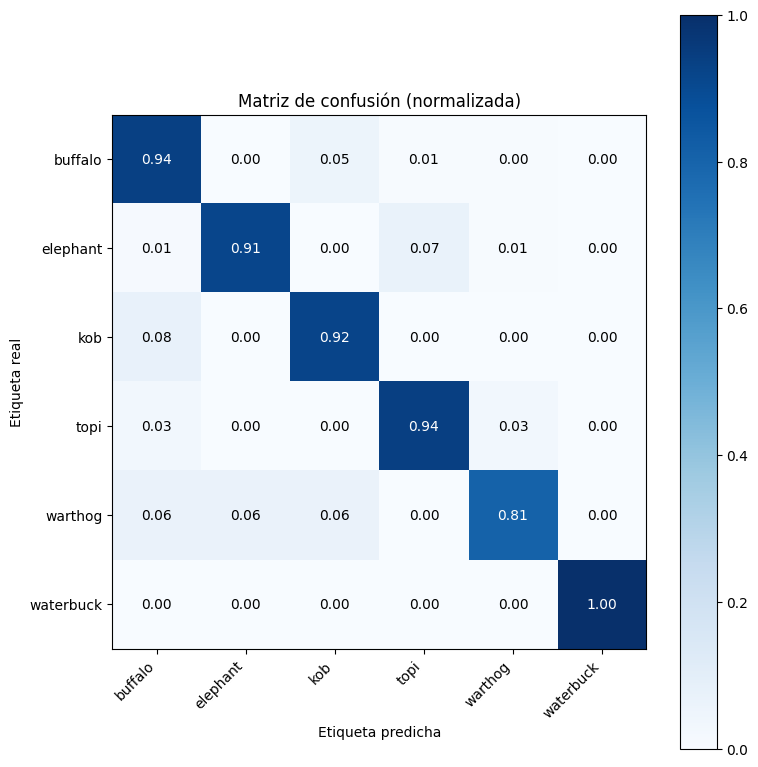

In [27]:
plot_confusion_matrix(test_evaluator.metrics.confusion_matrix, normalize=True)